<h1 style = "color:blue;font-size:25px;font-family:verdana;text-align: center"><center>Machine Learning for Predicting Building Energy Consumptions</center></h1>

<h3 style="color:blue;font-size:20px;font-family:verdana">Project Goals</h3>
 
<h3 style="font-size:18px;font-family:verdana">The main goal of this project is to predict the Site Energy Use Intensity(EUI) using available building characteristics and climate and weather variables.</h3>

### **<span style="color:blue;">Section 1: Look at the big picture</span>**

This dataset was collected from Kaggle WiDS Datathon 2022 Competition, and it was created in collaboration with Climate Change AI (CCAI) and Lawrence Berkeley National Laboratory (Berkeley Lab). The dataset  includes roughly 100k observations of building energy usage records, building characteristics and site climate and weather data collected over 7 years and several states within the United States. Each row in the dataset corresponds to a single building observation in a given year.

This dataset can use to analyze the correlation between given variables and study how they are affecting in building energy efficiency.  And it can use for creating models to predict building energy consumption. Accurate predictions of energy consumption can help policymakers target retrofitting efforts to improve building energy efficiencies and reduce energy related GHG emissions.

### **<span style="color:blue;">1.1: Data Description</span>**

This data includes features such as:

|**Variable**|**Description**|
|:-----------|:--------------|
|**id:**     |building Id|1 to 75757 data instences|
|**year_factor:**|anonymized year in which the weather and energy usage factors were observed|values between 0 and 6|
|**state_factor:**|anonymized state in which the building is located|        
|**building_class:**|building classification|         
|**facility_type:**|building usage type|         
|**floor_area:**|floor area (in **square feet**) of the building|         
|**year_built:**|year in which the building was constructed|         
|**energy_star_rating:**|the ENERGY STAR rating of the building(A score between 1-100). It rates building energy performance by normalizing annual energy use, as well as building type, size, location, and other operational and general asset characteristics. It is  giving an idea of the building’s energy consumption measures up against similar buildings nationwide. A score of 50 represents median energy performance, while a score of 75 or higher indicates your building is a top performer — and may be eligible for ENERGY STAR certification.|      
|**elevation:**|elevation of the building location|       
|**january_min_temp:**|minimum temperature in January (in **Fahrenheit**) at the location of the building|    
|**january_avg_temp:**|average temperature in January (in **Fahrenheit**) at the location of the building|    
|**january_max_temp:**|maximum temperature in January (in **Fahrenheit**) at the location of the building|    
|**cooling_degree_days:**|Degree days are measures of how cold or warm a location is. A degree day compares the mean outdoor temperatures recorded for a location to a standard temperature, usually 65° Fahrenheit (F) in the United States. The more extreme the outside temperature, the higher the number of degree days. A high number of degree days generally results in higher levels of energy use for space heating or cooling. (CDD) are a measure of how hot the temperature was on a given day or during a period of days.|
|**heating_degree_days:**|(HDD) are a measure of how cold the temperature was on a given day or during a period of days.| 
|**precipitation_inches:**|annual precipitation in **inches** at the location of the building|
|**snowfall_inches:**|annual snowfall in **inches** at the location of the building|
|**snowdepth_inches:**|annual snow depth in **inches** at the location of the building|
|**avg_temp:**|average temperature in **Fahrenheit** over a year at the location of the building|
|**days_below_30F:**|total number of days below 30 degrees **Fahrenheit** at the location of the building|
|**days_below_20F:**|total number of days below 20 degrees **Fahrenheit** at the location of the building|
|**days_below_10F:**|total number of days below 10 degrees **Fahrenheit** at the location of the building|
|**days_below_0F:**|total number of days below 0 degrees **Fahrenheit** at the location of the building|
|**days_above_80F:**|total number of days above 80 degrees Fahrenheit at the location of the building|
|**days_above_90F:**|total number of days above 90 degrees Fahrenheit at the location of the building|
|**days_above_100F:**|total number of days above 100 degrees Fahrenheit at the location of the building|
|**days_above_110F:**|total number of days above 110 degrees Fahrenheit at the location of the building|
|**direction_max_wind_speed:**|wind direction for maximum wind speed at the location of the building. Given in 360-degree compass point directions (e.g. 360 = north, 180 = south, etc.)|
|**direction_peak_wind_speed:**|wind direction for peak wind gust speed at the location of the building. Given in 360-degree compass point directions (e.g. 360 = north, 180 = south, etc.)|
|**max_wind_speed:**|maximum wind speed at the location of the building|
|**days_with_fog:**|number of days with fog at the location of the building|
|**site_eui**|Energy Use Intensity (EUI) refers to the amount of energy used of the building per square foot annually. It’s calculated by dividing the total energy consumed by the building in a year by the total gross floor area. EUI is the prime indicator of a building’s energy performance. Generally, a low EUI signifies good energy performance(But not a norm). EUI is often used to compare buildings of the same use type.|


### **<span style="color:blue;">Section 2: Get the Data</span>** 

In [1]:
# Import Libraries

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
import seaborn as sns

# for scientific Computing
from scipy.stats import norm 
from scipy import stats
from scipy.stats import skew
from scipy.stats import boxcox

# Visualising data completeness
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read the data
data_original = pd.read_csv('train.csv', index_col='id')
#df = pd.read_csv('train.csv')

### **<span style="color:blue;">2.1: Take a Quick Look at the Data Structure</span>** 

In [3]:
data_original.head()

,year_factor,state_factor,building_class,facility_type,floor_area,year_built,energy_star_rating,elevation,january_min_temp,january_avg_temp,...,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui
id,,,,,,,,,,,,,,,,,,,,,
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,11.0,2.4,36,50.5,...,0,14,0,0,0,1.0,1.0,1.0,NaN,248.682615
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,1955.0,45.0,1.8,36,50.5,...,0,14,0,0,0,1.0,NaN,1.0,12.0,26.500150
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,1951.0,97.0,1.8,36,50.5,...,0,14,0,0,0,1.0,NaN,1.0,12.0,24.693619
3,1,State_1,Commercial,Education_Other_classroom,55325.0,1980.0,46.0,1.8,36,50.5,...,0,14,0,0,0,1.0,NaN,1.0,12.0,48.406926
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,1985.0,100.0,2.4,36,50.5,...,0,14,0,0,0,1.0,1.0,1.0,NaN,3.899395


<div class="alert alert-block alert-info">
Each data instance(row) represents one district and has 64 attributes, including the data "id". 
</div>

In [4]:
data_original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75757 entries, 0 to 75756
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   year_factor                75757 non-null  int64  
 1   state_factor               75757 non-null  object 
 2   building_class             75757 non-null  object 
 3   facility_type              75757 non-null  object 
 4   floor_area                 75757 non-null  float64
 5   year_built                 73920 non-null  float64
 6   energy_star_rating         49048 non-null  float64
 7   elevation                  75757 non-null  float64
 8   january_min_temp           75757 non-null  int64  
 9   january_avg_temp           75757 non-null  float64
 10  january_max_temp           75757 non-null  int64  
 11  february_min_temp          75757 non-null  int64  
 12  february_avg_temp          75757 non-null  float64
 13  february_max_temp          75757 non-null  int

<div class="alert alert-block alert-info">
There exist  $75,757$  instances (rows) in the dataset. 

6  attributes have missing data, we will need to take care of this later.

Most of attributes are numerical, except state_factor, building_class, and facility_type.
    
</div>

<div class="alert alert-block alert-success">
The attribute "year_building" has no meaning. So I turned it to a new attribute "building_age".
</div>

In [5]:
# Create a new column 'building_age' by using the variable 'year_built'
data = data_original.copy(deep=True)
from datetime import date
data['building_age'] = data.apply(lambda row:(date.today().year-row.year_built), axis = 1)
first_column = data.pop('building_age')
data.insert(62, 'building_age', first_column)

In [6]:
# Drop the variable 'year_built' from the dataframe
data = data.drop(['year_built'], axis = 1)
data.head()

,year_factor,state_factor,building_class,facility_type,floor_area,energy_star_rating,elevation,january_min_temp,january_avg_temp,january_max_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,building_age,site_eui
id,,,,,,,,,,,,,,,,,,,,,
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,11.0,2.4,36,50.5,68,...,14,0,0,0,1.0,1.0,1.0,NaN,80.0,248.682615
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,45.0,1.8,36,50.5,68,...,14,0,0,0,1.0,NaN,1.0,12.0,67.0,26.500150
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,97.0,1.8,36,50.5,68,...,14,0,0,0,1.0,NaN,1.0,12.0,71.0,24.693619
3,1,State_1,Commercial,Education_Other_classroom,55325.0,46.0,1.8,36,50.5,68,...,14,0,0,0,1.0,NaN,1.0,12.0,42.0,48.406926
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,100.0,2.4,36,50.5,68,...,14,0,0,0,1.0,1.0,1.0,NaN,37.0,3.899395


### **<span style="color:blue;">2.3: Dealing with Missing Data</span>**

In [7]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
        return mz_table

missing_zero_values_table(data)

Your selected dataframe has 63 columns and 75757 Rows.
There are 6 columns that have missing values.


,Zero Values,Missing Values,% of Total Values,Total Zero Missing Values,% Total Zero Missing Values,Data Type
days_with_fog,0,45796,60.5,45796,60.5,float64
direction_peak_wind_speed,0,41811,55.2,41811,55.2,float64
direction_max_wind_speed,0,41082,54.2,41082,54.2,float64
max_wind_speed,0,41082,54.2,41082,54.2,float64
energy_star_rating,1,26709,35.3,26710,35.3,float64
building_age,0,1837,2.4,1837,2.4,float64


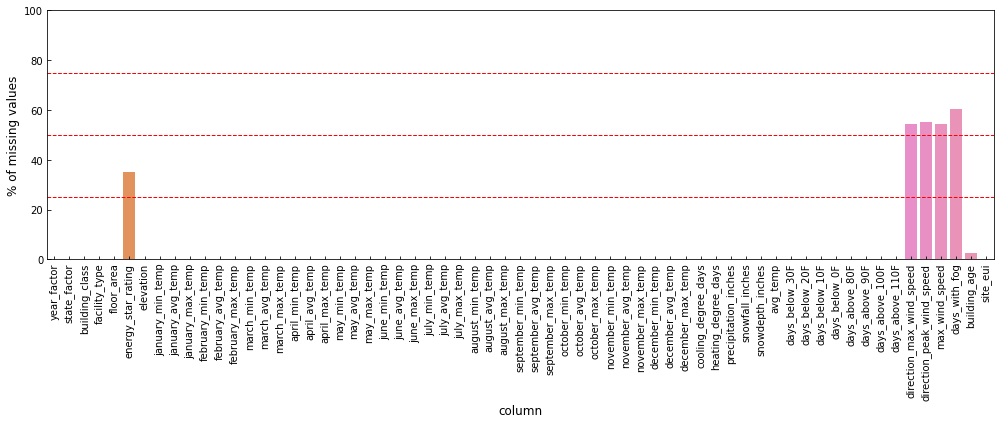

In [8]:
# Missing values in the dataset
plt.figure(figsize = (14, 6))
df_temp = data.isna().sum() * 100 / len(data)
s = sns.barplot(y = df_temp.values, x = df_temp.index)
s.set_ylim(0, 100)
s.set_xlabel("column", fontsize = 12)
s.set_ylabel("% of missing values", fontsize = 12)
s.tick_params(direction="in", left=True, bottom =True)
plt.xticks(rotation='vertical', ha='center')
plt.axhline(y=25, color='red', linestyle='--', linewidth =1)
plt.axhline(y=50, color='red', linestyle='--', linewidth =1)
plt.axhline(y=75, color='red', linestyle='--', linewidth =1)
plt.tight_layout()
plt.show()

### **<span style="color:blue;"> Data Cleaning</span>** 

In [9]:
cleaned_data = data = data.copy(deep=True)

In [10]:
# Drop all the columns which contain more than 50% of missing values  
perc = 50.0
min_count =  int(((100-perc)/100)*cleaned_data.shape[0] + 1)
cleaned_data = cleaned_data.dropna( axis=1, thresh=min_count)
cleaned_data.shape

(75757, 59)

In [11]:
# Drop all the raws which contain missing values for the attribute "building_age"
cleaned_data = cleaned_data.dropna(subset=['building_age'])
cleaned_data.shape

(73920, 59)

In [12]:
# Replace all the missing values in "energy_star_rating" by "0"
cleaned_data['energy_star_rating'] = cleaned_data['energy_star_rating'].fillna(0)
cleaned_data.shape

(73920, 59)

In [13]:
cleaned_data['year_factor'] = cleaned_data['year_factor'].astype(str)         # Transform integer to string

In [14]:
#cleaned_data.head

### **<span style="color:blue;"> Prepare the Data for Machine Learning Algorithms</span>** 

In [15]:
X = cleaned_data.drop("site_eui", axis = 1)
y = cleaned_data['site_eui']

In [16]:
cols = X.columns

In [17]:
num_cols = X._get_numeric_data().columns
num_cols

Index(['floor_area', 'energy_star_rating', 'elevation', 'january_min_temp',
       'january_avg_temp', 'january_max_temp', 'february_min_temp',
       'february_avg_temp', 'february_max_temp', 'march_min_temp',
       'march_avg_temp', 'march_max_temp', 'april_min_temp', 'april_avg_temp',
       'april_max_temp', 'may_min_temp', 'may_avg_temp', 'may_max_temp',
       'june_min_temp', 'june_avg_temp', 'june_max_temp', 'july_min_temp',
       'july_avg_temp', 'july_max_temp', 'august_min_temp', 'august_avg_temp',
       'august_max_temp', 'september_min_temp', 'september_avg_temp',
       'september_max_temp', 'october_min_temp', 'october_avg_temp',
       'october_max_temp', 'november_min_temp', 'november_avg_temp',
       'november_max_temp', 'december_min_temp', 'december_avg_temp',
       'december_max_temp', 'cooling_degree_days', 'heating_degree_days',
       'precipitation_inches', 'snowfall_inches', 'snowdepth_inches',
       'avg_temp', 'days_below_30F', 'days_below_20F', 'days_

In [18]:
cat_cols = list(set(cols) - set(num_cols))
cat_cols

['building_class', 'state_factor', 'year_factor', 'facility_type']

In [19]:
#get column index for each column in list
[X.columns.get_loc(c) for c in cat_cols if c in X]

[2, 1, 0, 3]

### **Encoding categorical data**

In [20]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder

enc = OrdinalEncoder()
X[cat_cols] = enc.fit_transform(X[cat_cols] )

In [21]:
X[cat_cols]

,building_class,state_factor,year_factor,facility_type
id,,,,
0,0.0,0.0,0.0,13.0
1,0.0,0.0,0.0,55.0
2,0.0,0.0,0.0,48.0
3,0.0,0.0,0.0,6.0
4,0.0,0.0,0.0,56.0
...,...,...,...,...
75752,0.0,2.0,5.0,32.0
75753,1.0,2.0,5.0,1.0
75754,0.0,2.0,5.0,2.0


### **Scaling Numerica data**

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
sc = StandardScaler()
mmsc = MinMaxScaler()
X[num_cols] = mmsc.fit_transform(X[num_cols] )

In [23]:
X[num_cols]

,floor_area,energy_star_rating,elevation,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,...,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,building_age
id,,,,,,,,,,,,,,,,,,,,,
0,0.009359,0.11,0.001281,0.916667,0.896213,0.742857,0.872727,0.854480,0.875,0.875000,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.036228
1,0.042855,0.45,0.000000,0.916667,0.896213,0.742857,0.872727,0.854480,0.875,0.875000,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.029777
2,0.043804,0.97,0.000000,0.916667,0.896213,0.742857,0.872727,0.854480,0.875,0.875000,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.031762
3,0.008427,0.46,0.000000,0.916667,0.896213,0.742857,0.872727,0.854480,0.875,0.875000,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.017370
4,0.010108,1.00,0.001281,0.916667,0.896213,0.742857,0.872727,0.854480,0.875,0.875000,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.014888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75752,0.002930,0.08,0.074280,0.783333,0.737072,0.400000,0.854545,0.787729,0.650,0.785714,...,0.563118,0.043796,0.000000,0.0,0.0,0.146154,0.057692,0.0,0.0,0.009926
75753,0.006091,0.98,0.074280,0.783333,0.737072,0.400000,0.854545,0.787729,0.650,0.785714,...,0.563118,0.043796,0.000000,0.0,0.0,0.146154,0.057692,0.0,0.0,0.052109
75754,0.004136,0.00,0.074280,0.750000,0.582666,0.171429,0.781818,0.649635,0.500,0.678571,...,0.179965,0.189781,0.021505,0.0,0.0,0.000000,0.000000,0.0,0.0,0.048635


In [24]:
X = pd.concat([X[cat_cols], X[num_cols]], axis = 1)
X

,building_class,state_factor,year_factor,facility_type,floor_area,energy_star_rating,elevation,january_min_temp,january_avg_temp,january_max_temp,...,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,building_age
id,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,13.0,0.009359,0.11,0.001281,0.916667,0.896213,0.742857,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.036228
1,0.0,0.0,0.0,55.0,0.042855,0.45,0.000000,0.916667,0.896213,0.742857,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.029777
2,0.0,0.0,0.0,48.0,0.043804,0.97,0.000000,0.916667,0.896213,0.742857,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.031762
3,0.0,0.0,0.0,6.0,0.008427,0.46,0.000000,0.916667,0.896213,0.742857,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.017370
4,0.0,0.0,0.0,56.0,0.010108,1.00,0.001281,0.916667,0.896213,0.742857,...,0.659752,0.000000,0.000000,0.0,0.0,0.061538,0.000000,0.0,0.0,0.014888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75752,0.0,2.0,5.0,32.0,0.002930,0.08,0.074280,0.783333,0.737072,0.400000,...,0.563118,0.043796,0.000000,0.0,0.0,0.146154,0.057692,0.0,0.0,0.009926
75753,1.0,2.0,5.0,1.0,0.006091,0.98,0.074280,0.783333,0.737072,0.400000,...,0.563118,0.043796,0.000000,0.0,0.0,0.146154,0.057692,0.0,0.0,0.052109
75754,0.0,2.0,5.0,2.0,0.004136,0.00,0.074280,0.750000,0.582666,0.171429,...,0.179965,0.189781,0.021505,0.0,0.0,0.000000,0.000000,0.0,0.0,0.048635


### **Test set split**

In [25]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =1)

In [26]:
import catboost as cb
train_dataset = cb.Pool(X_train, y_train) 
test_dataset = cb.Pool(X_test, y_test)

### **Training the CatBoost Regression model on the Training set**

In [27]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
model = cb.CatBoostRegressor(loss_function="RMSE",
                           eval_metric="RMSE",
                           learning_rate=0.01,
                           iterations=180000,
                           l2_leaf_reg=5,
                           random_seed=42,
                           od_type="Iter",
                           depth=7,
                           early_stopping_rounds=3000,
                           border_count=32
                          )

In [28]:
clf = model.fit(train_dataset,
                    eval_set=test_dataset,
                    use_best_model=True,
                    verbose=2000)

0:	learn: 58.3655379	test: 54.9730977	best: 54.9730977 (0)	total: 217ms	remaining: 10h 49m 44s
2000:	learn: 41.7541829	test: 40.6798526	best: 40.6796633 (1996)	total: 27.7s	remaining: 41m
4000:	learn: 39.5846740	test: 40.0402844	best: 40.0402844 (4000)	total: 52.6s	remaining: 38m 35s
6000:	learn: 38.1795028	test: 39.6777388	best: 39.6769942 (5999)	total: 1m 18s	remaining: 38m 9s
8000:	learn: 36.8849452	test: 39.4409643	best: 39.4407678 (7999)	total: 1m 45s	remaining: 37m 50s
10000:	learn: 35.6687964	test: 39.1902273	best: 39.1898037 (9999)	total: 2m 10s	remaining: 36m 58s
12000:	learn: 34.7533319	test: 39.0716603	best: 39.0714176 (11998)	total: 2m 35s	remaining: 36m 18s
14000:	learn: 33.9897891	test: 38.9678702	best: 38.9676673 (13996)	total: 3m 1s	remaining: 35m 47s
16000:	learn: 33.3182101	test: 38.8764050	best: 38.8764050 (16000)	total: 3m 25s	remaining: 35m 8s
18000:	learn: 32.7020079	test: 38.7742453	best: 38.7740429 (17998)	total: 3m 54s	remaining: 35m 6s
20000:	learn: 32.1552647

In [29]:
# Features' importance of our model

feat_imp = model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,facility_type,29.743832
1,energy_star_rating,22.718735
2,building_age,13.123263
3,floor_area,12.302770
4,building_class,4.265830
5,elevation,3.755059
6,state_factor,1.974496
7,july_avg_temp,0.601605
8,snowdepth_inches,0.553097
9,november_max_temp,0.499779


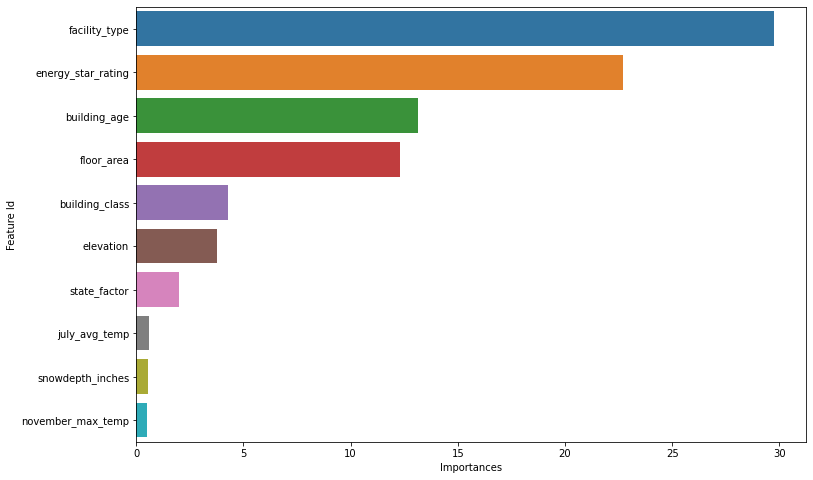

In [30]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:10],feat_imp['Feature Id'][:10], orient = 'h')
plt.show()

In [31]:
pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 38.40
R2: 0.51


In [38]:
 from sklearn.model_selection import GridSearchCV
from catboost import CatBoostRegressor
import numpy as np

model = CatBoostRegressor()

grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grid_search = GridSearchCV(estimator=model, param_grid = grid, cv = 3, n_jobs=-1)
grid_search.fit(X_train, y_train)

0:	learn: 56.8105702	total: 77.1ms	remaining: 1m 16s
1:	learn: 55.5527593	total: 153ms	remaining: 1m 16s
2:	learn: 54.1900235	total: 228ms	remaining: 1m 15s
3:	learn: 52.9952645	total: 303ms	remaining: 1m 15s
4:	learn: 51.9239579	total: 369ms	remaining: 1m 13s
5:	learn: 51.2219035	total: 438ms	remaining: 1m 12s
6:	learn: 50.6140793	total: 515ms	remaining: 1m 13s
7:	learn: 49.8635953	total: 581ms	remaining: 1m 12s
8:	learn: 49.2104618	total: 641ms	remaining: 1m 10s
9:	learn: 48.7744456	total: 714ms	remaining: 1m 10s
10:	learn: 48.3196047	total: 784ms	remaining: 1m 10s
11:	learn: 47.9191144	total: 853ms	remaining: 1m 10s
12:	learn: 47.4900954	total: 924ms	remaining: 1m 10s
13:	learn: 47.0750629	total: 995ms	remaining: 1m 10s
14:	learn: 46.8379717	total: 1.07s	remaining: 1m 10s
15:	learn: 46.5731179	total: 1.14s	remaining: 1m 9s
16:	learn: 46.3709687	total: 1.2s	remaining: 1m 9s
17:	learn: 46.1543113	total: 1.27s	remaining: 1m 9s
18:	learn: 45.8777027	total: 1.33s	remaining: 1m 8s
19:	lea

159:	learn: 37.5979528	total: 11.1s	remaining: 58.1s
160:	learn: 37.5584463	total: 11.1s	remaining: 58s
161:	learn: 37.5298860	total: 11.2s	remaining: 57.9s
162:	learn: 37.4922695	total: 11.3s	remaining: 57.8s
163:	learn: 37.4615042	total: 11.3s	remaining: 57.7s
164:	learn: 37.4310965	total: 11.4s	remaining: 57.6s
165:	learn: 37.3993040	total: 11.4s	remaining: 57.5s
166:	learn: 37.3753454	total: 11.5s	remaining: 57.4s
167:	learn: 37.3464431	total: 11.6s	remaining: 57.3s
168:	learn: 37.3022214	total: 11.6s	remaining: 57.2s
169:	learn: 37.2777689	total: 11.7s	remaining: 57.1s
170:	learn: 37.2537963	total: 11.8s	remaining: 57s
171:	learn: 37.2223911	total: 11.8s	remaining: 56.9s
172:	learn: 37.1943362	total: 11.9s	remaining: 56.8s
173:	learn: 37.1495690	total: 11.9s	remaining: 56.7s
174:	learn: 37.1144839	total: 12s	remaining: 56.6s
175:	learn: 37.0795427	total: 12.1s	remaining: 56.6s
176:	learn: 37.0465684	total: 12.2s	remaining: 56.5s
177:	learn: 37.0202045	total: 12.2s	remaining: 56.4s

315:	learn: 34.1034599	total: 21.2s	remaining: 45.8s
316:	learn: 34.0882529	total: 21.2s	remaining: 45.8s
317:	learn: 34.0675874	total: 21.3s	remaining: 45.7s
318:	learn: 34.0621885	total: 21.3s	remaining: 45.6s
319:	learn: 34.0591605	total: 21.4s	remaining: 45.5s
320:	learn: 34.0573904	total: 21.5s	remaining: 45.4s
321:	learn: 34.0175786	total: 21.5s	remaining: 45.3s
322:	learn: 34.0066084	total: 21.6s	remaining: 45.2s
323:	learn: 33.9911784	total: 21.6s	remaining: 45.1s
324:	learn: 33.9831397	total: 21.7s	remaining: 45s
325:	learn: 33.9616374	total: 21.7s	remaining: 44.9s
326:	learn: 33.9300673	total: 21.8s	remaining: 44.8s
327:	learn: 33.9193207	total: 21.8s	remaining: 44.7s
328:	learn: 33.8766484	total: 21.9s	remaining: 44.7s
329:	learn: 33.8722178	total: 21.9s	remaining: 44.6s
330:	learn: 33.8653416	total: 22s	remaining: 44.5s
331:	learn: 33.8470766	total: 22.1s	remaining: 44.4s
332:	learn: 33.8307605	total: 22.1s	remaining: 44.3s
333:	learn: 33.8243404	total: 22.2s	remaining: 44.

474:	learn: 31.7582676	total: 30.2s	remaining: 33.4s
475:	learn: 31.7332694	total: 30.3s	remaining: 33.3s
476:	learn: 31.7103672	total: 30.3s	remaining: 33.3s
477:	learn: 31.6943007	total: 30.4s	remaining: 33.2s
478:	learn: 31.6838304	total: 30.5s	remaining: 33.1s
479:	learn: 31.6759297	total: 30.5s	remaining: 33.1s
480:	learn: 31.6646772	total: 30.6s	remaining: 33s
481:	learn: 31.6631146	total: 30.6s	remaining: 32.9s
482:	learn: 31.6509082	total: 30.7s	remaining: 32.8s
483:	learn: 31.6311855	total: 30.7s	remaining: 32.8s
484:	learn: 31.6216779	total: 30.8s	remaining: 32.7s
485:	learn: 31.6140140	total: 30.9s	remaining: 32.6s
486:	learn: 31.6103528	total: 30.9s	remaining: 32.6s
487:	learn: 31.5999064	total: 31s	remaining: 32.5s
488:	learn: 31.5884319	total: 31s	remaining: 32.4s
489:	learn: 31.5830100	total: 31.1s	remaining: 32.4s
490:	learn: 31.5708422	total: 31.1s	remaining: 32.3s
491:	learn: 31.5687684	total: 31.2s	remaining: 32.2s
492:	learn: 31.5625512	total: 31.3s	remaining: 32.1s

633:	learn: 29.8744213	total: 39.2s	remaining: 22.6s
634:	learn: 29.8685462	total: 39.3s	remaining: 22.6s
635:	learn: 29.8593607	total: 39.3s	remaining: 22.5s
636:	learn: 29.8538797	total: 39.4s	remaining: 22.4s
637:	learn: 29.8369948	total: 39.4s	remaining: 22.4s
638:	learn: 29.8270162	total: 39.5s	remaining: 22.3s
639:	learn: 29.8194268	total: 39.5s	remaining: 22.2s
640:	learn: 29.8056251	total: 39.6s	remaining: 22.2s
641:	learn: 29.7945623	total: 39.6s	remaining: 22.1s
642:	learn: 29.7816493	total: 39.7s	remaining: 22s
643:	learn: 29.7760620	total: 39.7s	remaining: 22s
644:	learn: 29.7671808	total: 39.8s	remaining: 21.9s
645:	learn: 29.7599144	total: 39.8s	remaining: 21.8s
646:	learn: 29.7510299	total: 39.9s	remaining: 21.8s
647:	learn: 29.7381165	total: 39.9s	remaining: 21.7s
648:	learn: 29.7223224	total: 40s	remaining: 21.6s
649:	learn: 29.7084869	total: 40.1s	remaining: 21.6s
650:	learn: 29.6873278	total: 40.1s	remaining: 21.5s
651:	learn: 29.6817805	total: 40.2s	remaining: 21.4s

790:	learn: 28.4007205	total: 47.5s	remaining: 12.6s
791:	learn: 28.3953771	total: 47.6s	remaining: 12.5s
792:	learn: 28.3800969	total: 47.7s	remaining: 12.4s
793:	learn: 28.3781137	total: 47.7s	remaining: 12.4s
794:	learn: 28.3646771	total: 47.8s	remaining: 12.3s
795:	learn: 28.3621551	total: 47.8s	remaining: 12.3s
796:	learn: 28.3505372	total: 47.9s	remaining: 12.2s
797:	learn: 28.3435812	total: 47.9s	remaining: 12.1s
798:	learn: 28.3394413	total: 48s	remaining: 12.1s
799:	learn: 28.3331224	total: 48s	remaining: 12s
800:	learn: 28.3123185	total: 48.1s	remaining: 11.9s
801:	learn: 28.3074336	total: 48.1s	remaining: 11.9s
802:	learn: 28.2994110	total: 48.2s	remaining: 11.8s
803:	learn: 28.2907275	total: 48.2s	remaining: 11.8s
804:	learn: 28.2786627	total: 48.3s	remaining: 11.7s
805:	learn: 28.2739499	total: 48.3s	remaining: 11.6s
806:	learn: 28.2638761	total: 48.4s	remaining: 11.6s
807:	learn: 28.2545064	total: 48.4s	remaining: 11.5s
808:	learn: 28.2444317	total: 48.5s	remaining: 11.4s

947:	learn: 27.1466066	total: 55.9s	remaining: 3.07s
948:	learn: 27.1422597	total: 56s	remaining: 3.01s
949:	learn: 27.1376033	total: 56.1s	remaining: 2.95s
950:	learn: 27.1313115	total: 56.1s	remaining: 2.89s
951:	learn: 27.1258087	total: 56.2s	remaining: 2.83s
952:	learn: 27.1160234	total: 56.2s	remaining: 2.77s
953:	learn: 27.1116333	total: 56.3s	remaining: 2.71s
954:	learn: 27.1055342	total: 56.3s	remaining: 2.65s
955:	learn: 27.1014041	total: 56.4s	remaining: 2.59s
956:	learn: 27.0968378	total: 56.4s	remaining: 2.54s
957:	learn: 27.0909913	total: 56.5s	remaining: 2.48s
958:	learn: 27.0806266	total: 56.5s	remaining: 2.42s
959:	learn: 27.0761889	total: 56.6s	remaining: 2.36s
960:	learn: 27.0735144	total: 56.6s	remaining: 2.3s
961:	learn: 27.0681002	total: 56.7s	remaining: 2.24s
962:	learn: 27.0638027	total: 56.7s	remaining: 2.18s
963:	learn: 27.0574925	total: 56.8s	remaining: 2.12s
964:	learn: 27.0529824	total: 56.8s	remaining: 2.06s
965:	learn: 27.0490435	total: 56.9s	remaining: 2s

GridSearchCV(cv=3,
             estimator=<catboost.core.CatBoostRegressor object at 0x000001F607ADB970>,
             n_jobs=-1,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.1]})

In [52]:
best = grid_search.best_estimator_
import sklearn
# predict prices of X_test
y_pred = best.predict(X_train)
r2 = sklearn.metrics.r2_score(y_train, y_pred)
print(r2)

0.7902010348347682


In [53]:
# Mean Squared Error
RMSE= np.sqrt(np.square(np.subtract(y_train, y_pred)).mean())
RMSE

26.794262310712888

In [40]:
best = grid_search.best_estimator_
import sklearn
# predict prices of X_test
y_pred = best.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.5477987190123677


In [41]:
# Mean Squared Error
RMSE= np.sqrt(np.square(np.subtract(y_test, y_pred)).mean())
RMSE

37.054515953368735

### **Check the Feature Importance**

### **Recursive Feature Elimination**

In [75]:
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFECV

# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv = RFECV(
    estimator=best,
    step=1,
    cv=5,
    scoring ='neg_mean_squared_error',
    min_features_to_select=min_features_to_select,
    verbose=1
)
rfecv.fit(X_train, y_train)

Fitting estimator with 58 features.
0:	learn: 56.4848038	total: 68.4ms	remaining: 1m 8s
1:	learn: 55.2150207	total: 133ms	remaining: 1m 6s
2:	learn: 54.1182816	total: 201ms	remaining: 1m 6s
3:	learn: 52.9399397	total: 267ms	remaining: 1m 6s
4:	learn: 52.0916839	total: 339ms	remaining: 1m 7s
5:	learn: 51.3405638	total: 409ms	remaining: 1m 7s
6:	learn: 50.5034141	total: 474ms	remaining: 1m 7s
7:	learn: 49.8349262	total: 542ms	remaining: 1m 7s
8:	learn: 49.2702552	total: 605ms	remaining: 1m 6s
9:	learn: 48.6624887	total: 675ms	remaining: 1m 6s
10:	learn: 48.1101988	total: 742ms	remaining: 1m 6s
11:	learn: 47.7194629	total: 813ms	remaining: 1m 6s
12:	learn: 47.4202690	total: 876ms	remaining: 1m 6s
13:	learn: 47.0986181	total: 955ms	remaining: 1m 7s
14:	learn: 46.7923315	total: 1.05s	remaining: 1m 9s
15:	learn: 46.5700071	total: 1.12s	remaining: 1m 8s
16:	learn: 46.2022090	total: 1.18s	remaining: 1m 8s
17:	learn: 45.9737066	total: 1.25s	remaining: 1m 8s
18:	learn: 45.7586052	total: 1.31s	re

158:	learn: 37.1438901	total: 11.7s	remaining: 1m 1s
159:	learn: 37.1356410	total: 11.7s	remaining: 1m 1s
160:	learn: 37.1035933	total: 11.8s	remaining: 1m 1s
161:	learn: 37.0801384	total: 11.9s	remaining: 1m 1s
162:	learn: 37.0494814	total: 11.9s	remaining: 1m 1s
163:	learn: 37.0294569	total: 12s	remaining: 1m 1s
164:	learn: 36.9815543	total: 12.1s	remaining: 1m 1s
165:	learn: 36.9518639	total: 12.1s	remaining: 1m
166:	learn: 36.9236794	total: 12.2s	remaining: 1m
167:	learn: 36.8853353	total: 12.3s	remaining: 1m
168:	learn: 36.8777626	total: 12.4s	remaining: 1m
169:	learn: 36.8509558	total: 12.5s	remaining: 1m
170:	learn: 36.8219718	total: 12.5s	remaining: 1m
171:	learn: 36.7754746	total: 12.7s	remaining: 1m
172:	learn: 36.7554741	total: 12.7s	remaining: 1m
173:	learn: 36.7238714	total: 12.9s	remaining: 1m 1s
174:	learn: 36.6978034	total: 13s	remaining: 1m 1s
175:	learn: 36.6796904	total: 13.1s	remaining: 1m 1s
176:	learn: 36.6510105	total: 13.2s	remaining: 1m 1s
177:	learn: 36.620787

320:	learn: 33.3592685	total: 27.5s	remaining: 58.2s
321:	learn: 33.3519151	total: 27.6s	remaining: 58.1s
322:	learn: 33.3245779	total: 27.7s	remaining: 58s
323:	learn: 33.3073296	total: 27.8s	remaining: 57.9s
324:	learn: 33.2901817	total: 27.9s	remaining: 57.8s
325:	learn: 33.2785691	total: 28s	remaining: 57.8s
326:	learn: 33.2672730	total: 28s	remaining: 57.7s
327:	learn: 33.2500974	total: 28.1s	remaining: 57.6s
328:	learn: 33.2304070	total: 28.2s	remaining: 57.6s
329:	learn: 33.2103104	total: 28.3s	remaining: 57.5s
330:	learn: 33.2025005	total: 28.4s	remaining: 57.4s
331:	learn: 33.1804297	total: 28.5s	remaining: 57.3s
332:	learn: 33.1651962	total: 28.6s	remaining: 57.2s
333:	learn: 33.1545559	total: 28.6s	remaining: 57.1s
334:	learn: 33.1426108	total: 28.7s	remaining: 57s
335:	learn: 33.1179021	total: 28.8s	remaining: 56.9s
336:	learn: 33.1037967	total: 28.9s	remaining: 56.9s
337:	learn: 33.0832662	total: 29s	remaining: 56.8s
338:	learn: 33.0631394	total: 29.1s	remaining: 56.8s
339

477:	learn: 30.7854785	total: 40.9s	remaining: 44.7s
478:	learn: 30.7594803	total: 41s	remaining: 44.6s
479:	learn: 30.7372505	total: 41.1s	remaining: 44.5s
480:	learn: 30.7307615	total: 41.1s	remaining: 44.4s
481:	learn: 30.7252149	total: 41.2s	remaining: 44.3s
482:	learn: 30.7178406	total: 41.3s	remaining: 44.2s
483:	learn: 30.6987073	total: 41.4s	remaining: 44.2s
484:	learn: 30.6792155	total: 41.5s	remaining: 44.1s
485:	learn: 30.6680306	total: 41.6s	remaining: 44s
486:	learn: 30.6491725	total: 41.7s	remaining: 43.9s
487:	learn: 30.6403724	total: 41.7s	remaining: 43.8s
488:	learn: 30.6246540	total: 41.8s	remaining: 43.7s
489:	learn: 30.6114567	total: 41.9s	remaining: 43.6s
490:	learn: 30.5973910	total: 42s	remaining: 43.5s
491:	learn: 30.5878750	total: 42.1s	remaining: 43.4s
492:	learn: 30.5823022	total: 42.1s	remaining: 43.3s
493:	learn: 30.5767516	total: 42.2s	remaining: 43.2s
494:	learn: 30.5720484	total: 42.3s	remaining: 43.1s
495:	learn: 30.5620794	total: 42.3s	remaining: 43s
4

636:	learn: 28.8246185	total: 52.1s	remaining: 29.7s
637:	learn: 28.8183120	total: 52.2s	remaining: 29.6s
638:	learn: 28.8126583	total: 52.2s	remaining: 29.5s
639:	learn: 28.8068586	total: 52.3s	remaining: 29.4s
640:	learn: 28.7946174	total: 52.4s	remaining: 29.3s
641:	learn: 28.7801665	total: 52.4s	remaining: 29.2s
642:	learn: 28.7713395	total: 52.5s	remaining: 29.1s
643:	learn: 28.7585854	total: 52.5s	remaining: 29s
644:	learn: 28.7533614	total: 52.6s	remaining: 29s
645:	learn: 28.7447819	total: 52.7s	remaining: 28.9s
646:	learn: 28.7309483	total: 52.8s	remaining: 28.8s
647:	learn: 28.7090160	total: 52.8s	remaining: 28.7s
648:	learn: 28.6985389	total: 52.9s	remaining: 28.6s
649:	learn: 28.6920184	total: 53s	remaining: 28.5s
650:	learn: 28.6780321	total: 53s	remaining: 28.4s
651:	learn: 28.6662787	total: 53.1s	remaining: 28.3s
652:	learn: 28.6494031	total: 53.2s	remaining: 28.3s
653:	learn: 28.6384212	total: 53.2s	remaining: 28.2s
654:	learn: 28.6188241	total: 53.3s	remaining: 28.1s
6

793:	learn: 27.2629768	total: 1m 3s	remaining: 16.5s
794:	learn: 27.2540348	total: 1m 3s	remaining: 16.4s
795:	learn: 27.2448237	total: 1m 3s	remaining: 16.3s
796:	learn: 27.2384074	total: 1m 3s	remaining: 16.2s
797:	learn: 27.2297027	total: 1m 3s	remaining: 16.2s
798:	learn: 27.2227234	total: 1m 3s	remaining: 16.1s
799:	learn: 27.2170499	total: 1m 3s	remaining: 16s
800:	learn: 27.2090288	total: 1m 4s	remaining: 15.9s
801:	learn: 27.1974122	total: 1m 4s	remaining: 15.8s
802:	learn: 27.1907730	total: 1m 4s	remaining: 15.7s
803:	learn: 27.1811447	total: 1m 4s	remaining: 15.7s
804:	learn: 27.1740973	total: 1m 4s	remaining: 15.6s
805:	learn: 27.1687713	total: 1m 4s	remaining: 15.5s
806:	learn: 27.1587029	total: 1m 4s	remaining: 15.4s
807:	learn: 27.1452984	total: 1m 4s	remaining: 15.3s
808:	learn: 27.1374514	total: 1m 4s	remaining: 15.3s
809:	learn: 27.1330549	total: 1m 4s	remaining: 15.2s
810:	learn: 27.1277735	total: 1m 4s	remaining: 15.1s
811:	learn: 27.1259032	total: 1m 4s	remaining: 1

949:	learn: 26.0770788	total: 1m 15s	remaining: 3.96s
950:	learn: 26.0697862	total: 1m 15s	remaining: 3.88s
951:	learn: 26.0617746	total: 1m 15s	remaining: 3.8s
952:	learn: 26.0539203	total: 1m 15s	remaining: 3.72s
953:	learn: 26.0440974	total: 1m 15s	remaining: 3.64s
954:	learn: 26.0286464	total: 1m 15s	remaining: 3.56s
955:	learn: 26.0259562	total: 1m 15s	remaining: 3.48s
956:	learn: 26.0209803	total: 1m 15s	remaining: 3.4s
957:	learn: 26.0140424	total: 1m 15s	remaining: 3.32s
958:	learn: 26.0063842	total: 1m 15s	remaining: 3.24s
959:	learn: 25.9967906	total: 1m 15s	remaining: 3.16s
960:	learn: 25.9901292	total: 1m 15s	remaining: 3.08s
961:	learn: 25.9817249	total: 1m 16s	remaining: 3s
962:	learn: 25.9745509	total: 1m 16s	remaining: 2.92s
963:	learn: 25.9710060	total: 1m 16s	remaining: 2.84s
964:	learn: 25.9667374	total: 1m 16s	remaining: 2.77s
965:	learn: 25.9625245	total: 1m 16s	remaining: 2.69s
966:	learn: 25.9570757	total: 1m 16s	remaining: 2.61s
967:	learn: 25.9567713	total: 1m 

244:	learn: 35.1060361	total: 19.4s	remaining: 59.9s
245:	learn: 35.0643336	total: 19.5s	remaining: 59.8s
246:	learn: 35.0467384	total: 19.6s	remaining: 59.8s
247:	learn: 35.0101634	total: 19.7s	remaining: 59.8s
248:	learn: 34.9933788	total: 19.8s	remaining: 59.8s
249:	learn: 34.9630772	total: 19.9s	remaining: 59.7s
250:	learn: 34.9370374	total: 20s	remaining: 59.7s
251:	learn: 34.9043899	total: 20.1s	remaining: 59.7s
252:	learn: 34.8921402	total: 20.2s	remaining: 59.7s
253:	learn: 34.8818881	total: 20.3s	remaining: 59.7s
254:	learn: 34.8674842	total: 20.4s	remaining: 59.6s
255:	learn: 34.8478987	total: 20.5s	remaining: 59.5s
256:	learn: 34.8285514	total: 20.6s	remaining: 59.5s
257:	learn: 34.7777324	total: 20.7s	remaining: 59.4s
258:	learn: 34.7537147	total: 20.8s	remaining: 59.4s
259:	learn: 34.7246951	total: 20.9s	remaining: 59.4s
260:	learn: 34.7023614	total: 20.9s	remaining: 59.3s
261:	learn: 34.6948549	total: 21s	remaining: 59.3s
262:	learn: 34.6435844	total: 21.1s	remaining: 59.

400:	learn: 31.9794991	total: 33.1s	remaining: 49.4s
401:	learn: 31.9632971	total: 33.2s	remaining: 49.3s
402:	learn: 31.9338602	total: 33.2s	remaining: 49.2s
403:	learn: 31.9050218	total: 33.4s	remaining: 49.2s
404:	learn: 31.8935429	total: 33.5s	remaining: 49.2s
405:	learn: 31.8627928	total: 33.6s	remaining: 49.1s
406:	learn: 31.8432019	total: 33.6s	remaining: 49s
407:	learn: 31.8320092	total: 33.7s	remaining: 48.9s
408:	learn: 31.8200242	total: 33.8s	remaining: 48.9s
409:	learn: 31.8125227	total: 33.9s	remaining: 48.8s
410:	learn: 31.7874292	total: 34s	remaining: 48.7s
411:	learn: 31.7793748	total: 34.1s	remaining: 48.6s
412:	learn: 31.7702779	total: 34.2s	remaining: 48.5s
413:	learn: 31.7597098	total: 34.2s	remaining: 48.5s
414:	learn: 31.7459136	total: 34.3s	remaining: 48.4s
415:	learn: 31.7313595	total: 34.4s	remaining: 48.3s
416:	learn: 31.7098975	total: 34.5s	remaining: 48.3s
417:	learn: 31.6914283	total: 34.6s	remaining: 48.2s
418:	learn: 31.6664379	total: 34.8s	remaining: 48.

557:	learn: 29.7862683	total: 46.8s	remaining: 37.1s
558:	learn: 29.7393398	total: 46.9s	remaining: 37s
559:	learn: 29.7226905	total: 46.9s	remaining: 36.9s
560:	learn: 29.7225134	total: 47s	remaining: 36.8s
561:	learn: 29.7124491	total: 47.1s	remaining: 36.7s
562:	learn: 29.6976255	total: 47.2s	remaining: 36.6s
563:	learn: 29.6745368	total: 47.2s	remaining: 36.5s
564:	learn: 29.6593485	total: 47.3s	remaining: 36.4s
565:	learn: 29.6455423	total: 47.4s	remaining: 36.3s
566:	learn: 29.6431611	total: 47.5s	remaining: 36.2s
567:	learn: 29.6312240	total: 47.5s	remaining: 36.1s
568:	learn: 29.6191931	total: 47.6s	remaining: 36s
569:	learn: 29.5912996	total: 47.7s	remaining: 36s
570:	learn: 29.5818784	total: 47.7s	remaining: 35.9s
571:	learn: 29.5637445	total: 47.8s	remaining: 35.8s
572:	learn: 29.5492901	total: 47.9s	remaining: 35.7s
573:	learn: 29.5283415	total: 48s	remaining: 35.6s
574:	learn: 29.5189102	total: 48s	remaining: 35.5s
575:	learn: 29.5053209	total: 48.1s	remaining: 35.4s
576:	

714:	learn: 28.0342040	total: 59.4s	remaining: 23.7s
715:	learn: 28.0259710	total: 59.4s	remaining: 23.6s
716:	learn: 28.0158078	total: 59.5s	remaining: 23.5s
717:	learn: 28.0050004	total: 59.6s	remaining: 23.4s
718:	learn: 27.9953415	total: 59.7s	remaining: 23.3s
719:	learn: 27.9917114	total: 59.7s	remaining: 23.2s
720:	learn: 27.9841021	total: 59.8s	remaining: 23.1s
721:	learn: 27.9786111	total: 59.9s	remaining: 23s
722:	learn: 27.9676956	total: 59.9s	remaining: 23s
723:	learn: 27.9621696	total: 1m	remaining: 22.9s
724:	learn: 27.9512992	total: 1m	remaining: 22.8s
725:	learn: 27.9428847	total: 1m	remaining: 22.7s
726:	learn: 27.9354250	total: 1m	remaining: 22.6s
727:	learn: 27.9279278	total: 1m	remaining: 22.5s
728:	learn: 27.9177063	total: 1m	remaining: 22.4s
729:	learn: 27.9133651	total: 1m	remaining: 22.4s
730:	learn: 27.9014381	total: 1m	remaining: 22.3s
731:	learn: 27.8950889	total: 1m	remaining: 22.2s
732:	learn: 27.8864858	total: 1m	remaining: 22.1s
733:	learn: 27.8790597	tota

872:	learn: 26.6551347	total: 1m 12s	remaining: 10.6s
873:	learn: 26.6492142	total: 1m 12s	remaining: 10.5s
874:	learn: 26.6370999	total: 1m 12s	remaining: 10.4s
875:	learn: 26.6309703	total: 1m 12s	remaining: 10.3s
876:	learn: 26.6257937	total: 1m 12s	remaining: 10.2s
877:	learn: 26.6143405	total: 1m 12s	remaining: 10.1s
878:	learn: 26.6033593	total: 1m 13s	remaining: 10.1s
879:	learn: 26.5910710	total: 1m 13s	remaining: 9.97s
880:	learn: 26.5881426	total: 1m 13s	remaining: 9.88s
881:	learn: 26.5799670	total: 1m 13s	remaining: 9.8s
882:	learn: 26.5748371	total: 1m 13s	remaining: 9.72s
883:	learn: 26.5649152	total: 1m 13s	remaining: 9.63s
884:	learn: 26.5566795	total: 1m 13s	remaining: 9.55s
885:	learn: 26.5399408	total: 1m 13s	remaining: 9.47s
886:	learn: 26.5284999	total: 1m 13s	remaining: 9.38s
887:	learn: 26.5200047	total: 1m 13s	remaining: 9.3s
888:	learn: 26.5168808	total: 1m 13s	remaining: 9.22s
889:	learn: 26.5084104	total: 1m 13s	remaining: 9.13s
890:	learn: 26.5037286	total: 

24:	learn: 44.6571221	total: 2.04s	remaining: 1m 19s
25:	learn: 44.4901544	total: 2.12s	remaining: 1m 19s
26:	learn: 44.4004303	total: 2.2s	remaining: 1m 19s
27:	learn: 44.1378173	total: 2.29s	remaining: 1m 19s
28:	learn: 44.0456867	total: 2.37s	remaining: 1m 19s
29:	learn: 43.8544045	total: 2.44s	remaining: 1m 19s
30:	learn: 43.6888081	total: 2.51s	remaining: 1m 18s
31:	learn: 43.6033252	total: 2.58s	remaining: 1m 18s
32:	learn: 43.4814126	total: 2.66s	remaining: 1m 17s
33:	learn: 43.4061307	total: 2.73s	remaining: 1m 17s
34:	learn: 43.2668384	total: 2.81s	remaining: 1m 17s
35:	learn: 43.1686405	total: 2.88s	remaining: 1m 17s
36:	learn: 43.0620271	total: 2.97s	remaining: 1m 17s
37:	learn: 42.9931181	total: 3.05s	remaining: 1m 17s
38:	learn: 42.8421636	total: 3.12s	remaining: 1m 16s
39:	learn: 42.7722306	total: 3.18s	remaining: 1m 16s
40:	learn: 42.6559718	total: 3.25s	remaining: 1m 15s
41:	learn: 42.6155636	total: 3.31s	remaining: 1m 15s
42:	learn: 42.5174391	total: 3.38s	remaining: 1

182:	learn: 36.4281922	total: 13.9s	remaining: 1m 2s
183:	learn: 36.4216348	total: 14s	remaining: 1m 2s
184:	learn: 36.4040874	total: 14.1s	remaining: 1m 2s
185:	learn: 36.3673308	total: 14.2s	remaining: 1m 2s
186:	learn: 36.3444059	total: 14.2s	remaining: 1m 1s
187:	learn: 36.3059712	total: 14.3s	remaining: 1m 1s
188:	learn: 36.2978550	total: 14.4s	remaining: 1m 1s
189:	learn: 36.2847304	total: 14.5s	remaining: 1m 1s
190:	learn: 36.2530312	total: 14.6s	remaining: 1m 1s
191:	learn: 36.2199943	total: 14.7s	remaining: 1m 1s
192:	learn: 36.1876877	total: 14.8s	remaining: 1m 1s
193:	learn: 36.1626172	total: 14.9s	remaining: 1m 1s
194:	learn: 36.1433031	total: 14.9s	remaining: 1m 1s
195:	learn: 36.1295547	total: 15s	remaining: 1m 1s
196:	learn: 36.1127178	total: 15.1s	remaining: 1m 1s
197:	learn: 36.0989175	total: 15.2s	remaining: 1m 1s
198:	learn: 36.0565958	total: 15.3s	remaining: 1m 1s
199:	learn: 36.0306090	total: 15.4s	remaining: 1m 1s
200:	learn: 36.0143279	total: 15.5s	remaining: 1m 

340:	learn: 32.8195061	total: 28.4s	remaining: 54.9s
341:	learn: 32.8022184	total: 28.5s	remaining: 54.8s
342:	learn: 32.7932077	total: 28.6s	remaining: 54.7s
343:	learn: 32.7818080	total: 28.6s	remaining: 54.6s
344:	learn: 32.7725260	total: 28.7s	remaining: 54.5s
345:	learn: 32.7580533	total: 28.8s	remaining: 54.4s
346:	learn: 32.7461129	total: 28.8s	remaining: 54.3s
347:	learn: 32.7322785	total: 28.9s	remaining: 54.2s
348:	learn: 32.7024647	total: 29s	remaining: 54.1s
349:	learn: 32.6913459	total: 29.1s	remaining: 54s
350:	learn: 32.6576053	total: 29.1s	remaining: 53.9s
351:	learn: 32.6493575	total: 29.2s	remaining: 53.8s
352:	learn: 32.6222291	total: 29.3s	remaining: 53.7s
353:	learn: 32.6118227	total: 29.3s	remaining: 53.6s
354:	learn: 32.5800195	total: 29.4s	remaining: 53.4s
355:	learn: 32.5615426	total: 29.5s	remaining: 53.3s
356:	learn: 32.5402661	total: 29.6s	remaining: 53.2s
357:	learn: 32.5279740	total: 29.6s	remaining: 53.1s
358:	learn: 32.5126401	total: 29.7s	remaining: 53.

496:	learn: 30.4009864	total: 39.9s	remaining: 40.4s
497:	learn: 30.3794986	total: 40s	remaining: 40.3s
498:	learn: 30.3743839	total: 40.1s	remaining: 40.2s
499:	learn: 30.3615311	total: 40.1s	remaining: 40.1s
500:	learn: 30.3556859	total: 40.2s	remaining: 40.1s
501:	learn: 30.3474616	total: 40.3s	remaining: 40s
502:	learn: 30.3326136	total: 40.4s	remaining: 39.9s
503:	learn: 30.3224911	total: 40.4s	remaining: 39.8s
504:	learn: 30.3166616	total: 40.5s	remaining: 39.7s
505:	learn: 30.3014827	total: 40.6s	remaining: 39.6s
506:	learn: 30.2858266	total: 40.7s	remaining: 39.5s
507:	learn: 30.2807392	total: 40.8s	remaining: 39.5s
508:	learn: 30.2710262	total: 40.8s	remaining: 39.4s
509:	learn: 30.2547576	total: 40.9s	remaining: 39.3s
510:	learn: 30.2463189	total: 41s	remaining: 39.2s
511:	learn: 30.2368839	total: 41.1s	remaining: 39.1s
512:	learn: 30.2302215	total: 41.2s	remaining: 39.1s
513:	learn: 30.2184133	total: 41.2s	remaining: 39s
514:	learn: 30.2023540	total: 41.3s	remaining: 38.9s
5

655:	learn: 28.6692350	total: 52.1s	remaining: 27.3s
656:	learn: 28.6546800	total: 52.2s	remaining: 27.2s
657:	learn: 28.6527553	total: 52.3s	remaining: 27.2s
658:	learn: 28.6482438	total: 52.4s	remaining: 27.1s
659:	learn: 28.6409778	total: 52.4s	remaining: 27s
660:	learn: 28.6330083	total: 52.5s	remaining: 26.9s
661:	learn: 28.6208033	total: 52.6s	remaining: 26.9s
662:	learn: 28.6155334	total: 52.7s	remaining: 26.8s
663:	learn: 28.6049982	total: 52.7s	remaining: 26.7s
664:	learn: 28.5937529	total: 52.8s	remaining: 26.6s
665:	learn: 28.5832651	total: 52.9s	remaining: 26.5s
666:	learn: 28.5770717	total: 52.9s	remaining: 26.4s
667:	learn: 28.5656957	total: 53s	remaining: 26.3s
668:	learn: 28.5570033	total: 53.1s	remaining: 26.3s
669:	learn: 28.5384943	total: 53.1s	remaining: 26.2s
670:	learn: 28.5299198	total: 53.2s	remaining: 26.1s
671:	learn: 28.5198769	total: 53.3s	remaining: 26s
672:	learn: 28.4938666	total: 53.3s	remaining: 25.9s
673:	learn: 28.4802902	total: 53.4s	remaining: 25.8s

815:	learn: 27.1003818	total: 1m 2s	remaining: 14.1s
816:	learn: 27.0798232	total: 1m 2s	remaining: 14s
817:	learn: 27.0736280	total: 1m 2s	remaining: 13.9s
818:	learn: 27.0683855	total: 1m 2s	remaining: 13.8s
819:	learn: 27.0620603	total: 1m 2s	remaining: 13.8s
820:	learn: 27.0539226	total: 1m 2s	remaining: 13.7s
821:	learn: 27.0420932	total: 1m 2s	remaining: 13.6s
822:	learn: 27.0348117	total: 1m 2s	remaining: 13.5s
823:	learn: 27.0258799	total: 1m 2s	remaining: 13.4s
824:	learn: 27.0125055	total: 1m 2s	remaining: 13.4s
825:	learn: 27.0075674	total: 1m 3s	remaining: 13.3s
826:	learn: 26.9962118	total: 1m 3s	remaining: 13.2s
827:	learn: 26.9903987	total: 1m 3s	remaining: 13.1s
828:	learn: 26.9789646	total: 1m 3s	remaining: 13s
829:	learn: 26.9705386	total: 1m 3s	remaining: 13s
830:	learn: 26.9608305	total: 1m 3s	remaining: 12.9s
831:	learn: 26.9430753	total: 1m 3s	remaining: 12.8s
832:	learn: 26.9324472	total: 1m 3s	remaining: 12.7s
833:	learn: 26.9210953	total: 1m 3s	remaining: 12.7s

972:	learn: 25.8045844	total: 1m 12s	remaining: 2.02s
973:	learn: 25.7981732	total: 1m 12s	remaining: 1.95s
974:	learn: 25.7913168	total: 1m 12s	remaining: 1.87s
975:	learn: 25.7808244	total: 1m 13s	remaining: 1.8s
976:	learn: 25.7712068	total: 1m 13s	remaining: 1.72s
977:	learn: 25.7630596	total: 1m 13s	remaining: 1.65s
978:	learn: 25.7598836	total: 1m 13s	remaining: 1.57s
979:	learn: 25.7589985	total: 1m 13s	remaining: 1.5s
980:	learn: 25.7536052	total: 1m 13s	remaining: 1.42s
981:	learn: 25.7464541	total: 1m 13s	remaining: 1.35s
982:	learn: 25.7348892	total: 1m 13s	remaining: 1.27s
983:	learn: 25.7292460	total: 1m 13s	remaining: 1.2s
984:	learn: 25.7246785	total: 1m 13s	remaining: 1.12s
985:	learn: 25.7149043	total: 1m 13s	remaining: 1.05s
986:	learn: 25.7063320	total: 1m 13s	remaining: 972ms
987:	learn: 25.7019437	total: 1m 13s	remaining: 898ms
988:	learn: 25.6973092	total: 1m 13s	remaining: 823ms
989:	learn: 25.6927340	total: 1m 14s	remaining: 748ms
990:	learn: 25.6808951	total: 1

129:	learn: 38.1442787	total: 8.54s	remaining: 57.1s
130:	learn: 38.1307198	total: 8.6s	remaining: 57s
131:	learn: 38.0583646	total: 8.65s	remaining: 56.9s
132:	learn: 38.0216751	total: 8.71s	remaining: 56.8s
133:	learn: 37.9987496	total: 8.78s	remaining: 56.7s
134:	learn: 37.9682181	total: 8.84s	remaining: 56.6s
135:	learn: 37.9362503	total: 8.89s	remaining: 56.5s
136:	learn: 37.8969415	total: 8.96s	remaining: 56.5s
137:	learn: 37.8368758	total: 9.03s	remaining: 56.4s
138:	learn: 37.7987935	total: 9.09s	remaining: 56.3s
139:	learn: 37.7648099	total: 9.15s	remaining: 56.2s
140:	learn: 37.7281045	total: 9.21s	remaining: 56.1s
141:	learn: 37.6842321	total: 9.28s	remaining: 56s
142:	learn: 37.6391759	total: 9.34s	remaining: 55.9s
143:	learn: 37.6080727	total: 9.4s	remaining: 55.9s
144:	learn: 37.5877875	total: 9.46s	remaining: 55.8s
145:	learn: 37.5612181	total: 9.54s	remaining: 55.8s
146:	learn: 37.5360688	total: 9.6s	remaining: 55.7s
147:	learn: 37.5136484	total: 9.66s	remaining: 55.6s


285:	learn: 34.0377061	total: 18.6s	remaining: 46.4s
286:	learn: 34.0236018	total: 18.7s	remaining: 46.4s
287:	learn: 34.0126114	total: 18.7s	remaining: 46.3s
288:	learn: 33.9909208	total: 18.8s	remaining: 46.2s
289:	learn: 33.9810696	total: 18.9s	remaining: 46.2s
290:	learn: 33.9595605	total: 18.9s	remaining: 46.1s
291:	learn: 33.9401111	total: 19s	remaining: 46s
292:	learn: 33.9289025	total: 19.1s	remaining: 46s
293:	learn: 33.9166987	total: 19.1s	remaining: 45.9s
294:	learn: 33.9041324	total: 19.2s	remaining: 45.8s
295:	learn: 33.8906626	total: 19.2s	remaining: 45.8s
296:	learn: 33.8829743	total: 19.3s	remaining: 45.7s
297:	learn: 33.8645061	total: 19.4s	remaining: 45.7s
298:	learn: 33.8431579	total: 19.5s	remaining: 45.6s
299:	learn: 33.8254922	total: 19.5s	remaining: 45.6s
300:	learn: 33.8029818	total: 19.6s	remaining: 45.5s
301:	learn: 33.7841917	total: 19.7s	remaining: 45.5s
302:	learn: 33.7422468	total: 19.7s	remaining: 45.4s
303:	learn: 33.7184961	total: 19.8s	remaining: 45.4s

441:	learn: 31.1689173	total: 29s	remaining: 36.6s
442:	learn: 31.1576302	total: 29s	remaining: 36.5s
443:	learn: 31.1395983	total: 29.1s	remaining: 36.4s
444:	learn: 31.1281903	total: 29.2s	remaining: 36.4s
445:	learn: 31.1176929	total: 29.2s	remaining: 36.3s
446:	learn: 31.1116700	total: 29.3s	remaining: 36.2s
447:	learn: 31.0997457	total: 29.4s	remaining: 36.2s
448:	learn: 31.0800500	total: 29.4s	remaining: 36.1s
449:	learn: 31.0694972	total: 29.5s	remaining: 36.1s
450:	learn: 31.0631222	total: 29.6s	remaining: 36s
451:	learn: 31.0576220	total: 29.6s	remaining: 35.9s
452:	learn: 31.0391220	total: 29.7s	remaining: 35.9s
453:	learn: 31.0271474	total: 29.8s	remaining: 35.8s
454:	learn: 31.0134912	total: 29.8s	remaining: 35.8s
455:	learn: 30.9917046	total: 29.9s	remaining: 35.7s
456:	learn: 30.9821253	total: 30s	remaining: 35.6s
457:	learn: 30.9694688	total: 30.1s	remaining: 35.6s
458:	learn: 30.9529735	total: 30.1s	remaining: 35.5s
459:	learn: 30.9411807	total: 30.2s	remaining: 35.4s
4

598:	learn: 29.3033920	total: 39.2s	remaining: 26.3s
599:	learn: 29.2912962	total: 39.3s	remaining: 26.2s
600:	learn: 29.2696454	total: 39.4s	remaining: 26.1s
601:	learn: 29.2595280	total: 39.4s	remaining: 26.1s
602:	learn: 29.2591921	total: 39.5s	remaining: 26s
603:	learn: 29.2450338	total: 39.6s	remaining: 25.9s
604:	learn: 29.2414004	total: 39.6s	remaining: 25.9s
605:	learn: 29.2331513	total: 39.7s	remaining: 25.8s
606:	learn: 29.2242779	total: 39.7s	remaining: 25.7s
607:	learn: 29.2148653	total: 39.8s	remaining: 25.7s
608:	learn: 29.1899797	total: 39.9s	remaining: 25.6s
609:	learn: 29.1822466	total: 39.9s	remaining: 25.5s
610:	learn: 29.1771939	total: 40s	remaining: 25.5s
611:	learn: 29.1710728	total: 40.1s	remaining: 25.4s
612:	learn: 29.1586220	total: 40.1s	remaining: 25.3s
613:	learn: 29.1336267	total: 40.2s	remaining: 25.3s
614:	learn: 29.1237906	total: 40.2s	remaining: 25.2s
615:	learn: 29.1059654	total: 40.3s	remaining: 25.1s
616:	learn: 29.0786370	total: 40.4s	remaining: 25.

755:	learn: 27.6564248	total: 49.2s	remaining: 15.9s
756:	learn: 27.6485962	total: 49.3s	remaining: 15.8s
757:	learn: 27.6414401	total: 49.3s	remaining: 15.8s
758:	learn: 27.6360656	total: 49.4s	remaining: 15.7s
759:	learn: 27.6255551	total: 49.5s	remaining: 15.6s
760:	learn: 27.6223893	total: 49.5s	remaining: 15.6s
761:	learn: 27.6153626	total: 49.6s	remaining: 15.5s
762:	learn: 27.6090386	total: 49.7s	remaining: 15.4s
763:	learn: 27.6017934	total: 49.7s	remaining: 15.4s
764:	learn: 27.5919755	total: 49.8s	remaining: 15.3s
765:	learn: 27.5813453	total: 49.9s	remaining: 15.2s
766:	learn: 27.5740443	total: 49.9s	remaining: 15.2s
767:	learn: 27.5644329	total: 50s	remaining: 15.1s
768:	learn: 27.5501985	total: 50.1s	remaining: 15s
769:	learn: 27.5386813	total: 50.1s	remaining: 15s
770:	learn: 27.5318561	total: 50.2s	remaining: 14.9s
771:	learn: 27.5252901	total: 50.2s	remaining: 14.8s
772:	learn: 27.5187754	total: 50.3s	remaining: 14.8s
773:	learn: 27.5078655	total: 50.4s	remaining: 14.7s

911:	learn: 26.2651727	total: 59.2s	remaining: 5.71s
912:	learn: 26.2571584	total: 59.2s	remaining: 5.64s
913:	learn: 26.2526101	total: 59.3s	remaining: 5.58s
914:	learn: 26.2473880	total: 59.3s	remaining: 5.51s
915:	learn: 26.2397620	total: 59.4s	remaining: 5.45s
916:	learn: 26.2343456	total: 59.5s	remaining: 5.38s
917:	learn: 26.2212646	total: 59.5s	remaining: 5.32s
918:	learn: 26.2125742	total: 59.6s	remaining: 5.25s
919:	learn: 26.2039575	total: 59.7s	remaining: 5.19s
920:	learn: 26.2008311	total: 59.7s	remaining: 5.12s
921:	learn: 26.1948611	total: 59.8s	remaining: 5.06s
922:	learn: 26.1872751	total: 59.9s	remaining: 4.99s
923:	learn: 26.1758116	total: 59.9s	remaining: 4.93s
924:	learn: 26.1647344	total: 60s	remaining: 4.86s
925:	learn: 26.1608815	total: 1m	remaining: 4.8s
926:	learn: 26.1530669	total: 1m	remaining: 4.73s
927:	learn: 26.1426213	total: 1m	remaining: 4.67s
928:	learn: 26.1363353	total: 1m	remaining: 4.6s
929:	learn: 26.1343334	total: 1m	remaining: 4.54s
930:	learn: 

69:	learn: 40.9413229	total: 4.71s	remaining: 1m 2s
70:	learn: 40.8848056	total: 4.78s	remaining: 1m 2s
71:	learn: 40.8315650	total: 4.84s	remaining: 1m 2s
72:	learn: 40.7446137	total: 4.9s	remaining: 1m 2s
73:	learn: 40.5956512	total: 4.96s	remaining: 1m 2s
74:	learn: 40.5528007	total: 5.03s	remaining: 1m 2s
75:	learn: 40.5137999	total: 5.09s	remaining: 1m 1s
76:	learn: 40.4818608	total: 5.15s	remaining: 1m 1s
77:	learn: 40.3781270	total: 5.22s	remaining: 1m 1s
78:	learn: 40.3062901	total: 5.28s	remaining: 1m 1s
79:	learn: 40.2680473	total: 5.34s	remaining: 1m 1s
80:	learn: 40.2241084	total: 5.4s	remaining: 1m 1s
81:	learn: 40.1840637	total: 5.46s	remaining: 1m 1s
82:	learn: 40.1529882	total: 5.53s	remaining: 1m 1s
83:	learn: 40.0668297	total: 5.59s	remaining: 1m
84:	learn: 40.0221013	total: 5.66s	remaining: 1m
85:	learn: 39.9681614	total: 5.72s	remaining: 1m
86:	learn: 39.9189869	total: 5.79s	remaining: 1m
87:	learn: 39.8414994	total: 5.85s	remaining: 1m
88:	learn: 39.8279622	total: 

229:	learn: 35.2078981	total: 14.9s	remaining: 49.8s
230:	learn: 35.1869974	total: 14.9s	remaining: 49.7s
231:	learn: 35.1818789	total: 15s	remaining: 49.6s
232:	learn: 35.1679210	total: 15.1s	remaining: 49.5s
233:	learn: 35.1533077	total: 15.1s	remaining: 49.5s
234:	learn: 35.1402311	total: 15.2s	remaining: 49.4s
235:	learn: 35.1132240	total: 15.2s	remaining: 49.3s
236:	learn: 35.0891205	total: 15.3s	remaining: 49.3s
237:	learn: 35.0763990	total: 15.4s	remaining: 49.2s
238:	learn: 35.0643004	total: 15.4s	remaining: 49.1s
239:	learn: 35.0276793	total: 15.5s	remaining: 49s
240:	learn: 35.0169187	total: 15.5s	remaining: 49s
241:	learn: 35.0008470	total: 15.6s	remaining: 48.9s
242:	learn: 34.9924807	total: 15.7s	remaining: 48.8s
243:	learn: 34.9791728	total: 15.7s	remaining: 48.8s
244:	learn: 34.9667862	total: 15.8s	remaining: 48.7s
245:	learn: 34.9459423	total: 15.9s	remaining: 48.6s
246:	learn: 34.9270438	total: 15.9s	remaining: 48.5s
247:	learn: 34.8977300	total: 16s	remaining: 48.5s
2

388:	learn: 32.0991829	total: 25.2s	remaining: 39.6s
389:	learn: 32.0710711	total: 25.3s	remaining: 39.5s
390:	learn: 32.0546759	total: 25.3s	remaining: 39.5s
391:	learn: 32.0436499	total: 25.4s	remaining: 39.4s
392:	learn: 32.0285587	total: 25.5s	remaining: 39.3s
393:	learn: 32.0162155	total: 25.5s	remaining: 39.2s
394:	learn: 31.9990800	total: 25.6s	remaining: 39.2s
395:	learn: 31.9762868	total: 25.6s	remaining: 39.1s
396:	learn: 31.9607112	total: 25.7s	remaining: 39s
397:	learn: 31.9509591	total: 25.8s	remaining: 39s
398:	learn: 31.9254743	total: 25.8s	remaining: 38.9s
399:	learn: 31.9130874	total: 25.9s	remaining: 38.8s
400:	learn: 31.9041712	total: 26s	remaining: 38.8s
401:	learn: 31.8892122	total: 26s	remaining: 38.7s
402:	learn: 31.8848350	total: 26.1s	remaining: 38.7s
403:	learn: 31.8788493	total: 26.2s	remaining: 38.6s
404:	learn: 31.8714509	total: 26.2s	remaining: 38.6s
405:	learn: 31.8632409	total: 26.3s	remaining: 38.5s
406:	learn: 31.8493179	total: 26.4s	remaining: 38.4s
4

547:	learn: 29.9584278	total: 35.7s	remaining: 29.4s
548:	learn: 29.9494626	total: 35.8s	remaining: 29.4s
549:	learn: 29.9288969	total: 35.8s	remaining: 29.3s
550:	learn: 29.9189816	total: 35.9s	remaining: 29.2s
551:	learn: 29.9149156	total: 35.9s	remaining: 29.2s
552:	learn: 29.9000620	total: 36s	remaining: 29.1s
553:	learn: 29.8891917	total: 36.1s	remaining: 29s
554:	learn: 29.8707504	total: 36.1s	remaining: 29s
555:	learn: 29.8643543	total: 36.2s	remaining: 28.9s
556:	learn: 29.8538774	total: 36.3s	remaining: 28.9s
557:	learn: 29.8053385	total: 36.3s	remaining: 28.8s
558:	learn: 29.7854161	total: 36.4s	remaining: 28.7s
559:	learn: 29.7765248	total: 36.5s	remaining: 28.7s
560:	learn: 29.7725870	total: 36.5s	remaining: 28.6s
561:	learn: 29.7575853	total: 36.6s	remaining: 28.5s
562:	learn: 29.7498567	total: 36.7s	remaining: 28.4s
563:	learn: 29.7047815	total: 36.7s	remaining: 28.4s
564:	learn: 29.6982695	total: 36.8s	remaining: 28.3s
565:	learn: 29.6896435	total: 36.8s	remaining: 28.2s

704:	learn: 28.1618217	total: 45.7s	remaining: 19.1s
705:	learn: 28.1557095	total: 45.7s	remaining: 19s
706:	learn: 28.1444340	total: 45.8s	remaining: 19s
707:	learn: 28.1365742	total: 45.8s	remaining: 18.9s
708:	learn: 28.1292370	total: 45.9s	remaining: 18.8s
709:	learn: 28.1139487	total: 46s	remaining: 18.8s
710:	learn: 28.0945182	total: 46s	remaining: 18.7s
711:	learn: 28.0823735	total: 46.1s	remaining: 18.6s
712:	learn: 28.0717299	total: 46.2s	remaining: 18.6s
713:	learn: 28.0524694	total: 46.2s	remaining: 18.5s
714:	learn: 28.0380382	total: 46.3s	remaining: 18.4s
715:	learn: 28.0314436	total: 46.3s	remaining: 18.4s
716:	learn: 28.0263733	total: 46.4s	remaining: 18.3s
717:	learn: 28.0210156	total: 46.5s	remaining: 18.3s
718:	learn: 28.0137794	total: 46.5s	remaining: 18.2s
719:	learn: 28.0057641	total: 46.6s	remaining: 18.1s
720:	learn: 27.9924631	total: 46.7s	remaining: 18.1s
721:	learn: 27.9879586	total: 46.7s	remaining: 18s
722:	learn: 27.9714445	total: 46.8s	remaining: 17.9s
723

862:	learn: 26.6931046	total: 55.7s	remaining: 8.85s
863:	learn: 26.6815364	total: 55.8s	remaining: 8.78s
864:	learn: 26.6751533	total: 55.9s	remaining: 8.72s
865:	learn: 26.6641371	total: 55.9s	remaining: 8.65s
866:	learn: 26.6592794	total: 56s	remaining: 8.59s
867:	learn: 26.6531419	total: 56s	remaining: 8.52s
868:	learn: 26.6458443	total: 56.1s	remaining: 8.46s
869:	learn: 26.6333803	total: 56.2s	remaining: 8.39s
870:	learn: 26.6252572	total: 56.2s	remaining: 8.33s
871:	learn: 26.6136532	total: 56.3s	remaining: 8.26s
872:	learn: 26.6059034	total: 56.4s	remaining: 8.2s
873:	learn: 26.5920955	total: 56.4s	remaining: 8.13s
874:	learn: 26.5869785	total: 56.5s	remaining: 8.07s
875:	learn: 26.5770103	total: 56.6s	remaining: 8.01s
876:	learn: 26.5696107	total: 56.6s	remaining: 7.94s
877:	learn: 26.5633696	total: 56.7s	remaining: 7.88s
878:	learn: 26.5503605	total: 56.7s	remaining: 7.81s
879:	learn: 26.5450757	total: 56.8s	remaining: 7.75s
880:	learn: 26.5350084	total: 56.9s	remaining: 7.68

19:	learn: 45.5106639	total: 1.37s	remaining: 1m 7s
20:	learn: 45.4037894	total: 1.43s	remaining: 1m 6s
21:	learn: 45.2653756	total: 1.5s	remaining: 1m 6s
22:	learn: 45.0831693	total: 1.57s	remaining: 1m 6s
23:	learn: 44.9652527	total: 1.63s	remaining: 1m 6s
24:	learn: 44.8172188	total: 1.69s	remaining: 1m 6s
25:	learn: 44.6404811	total: 1.75s	remaining: 1m 5s
26:	learn: 44.5445025	total: 1.87s	remaining: 1m 7s
27:	learn: 44.3894021	total: 1.94s	remaining: 1m 7s
28:	learn: 44.2498610	total: 2s	remaining: 1m 7s
29:	learn: 44.1883482	total: 2.07s	remaining: 1m 6s
30:	learn: 44.0756212	total: 2.13s	remaining: 1m 6s
31:	learn: 43.9679198	total: 2.2s	remaining: 1m 6s
32:	learn: 43.8781700	total: 2.27s	remaining: 1m 6s
33:	learn: 43.8159462	total: 2.34s	remaining: 1m 6s
34:	learn: 43.7410140	total: 2.4s	remaining: 1m 6s
35:	learn: 43.6740335	total: 2.47s	remaining: 1m 6s
36:	learn: 43.5893754	total: 2.53s	remaining: 1m 5s
37:	learn: 43.4102672	total: 2.6s	remaining: 1m 5s
38:	learn: 43.22458

177:	learn: 36.6913024	total: 11.4s	remaining: 52.7s
178:	learn: 36.6656324	total: 11.5s	remaining: 52.6s
179:	learn: 36.6303047	total: 11.5s	remaining: 52.5s
180:	learn: 36.5845943	total: 11.6s	remaining: 52.5s
181:	learn: 36.5469237	total: 11.7s	remaining: 52.4s
182:	learn: 36.5199903	total: 11.7s	remaining: 52.3s
183:	learn: 36.4903389	total: 11.8s	remaining: 52.2s
184:	learn: 36.4716808	total: 11.8s	remaining: 52.1s
185:	learn: 36.4266916	total: 11.9s	remaining: 52.1s
186:	learn: 36.4005625	total: 12s	remaining: 52s
187:	learn: 36.3717571	total: 12s	remaining: 51.9s
188:	learn: 36.3559775	total: 12.1s	remaining: 51.8s
189:	learn: 36.3235287	total: 12.1s	remaining: 51.8s
190:	learn: 36.2702378	total: 12.2s	remaining: 51.7s
191:	learn: 36.2561526	total: 12.3s	remaining: 51.6s
192:	learn: 36.2281669	total: 12.3s	remaining: 51.5s
193:	learn: 36.1880145	total: 12.4s	remaining: 51.4s
194:	learn: 36.1615444	total: 12.4s	remaining: 51.4s
195:	learn: 36.1348995	total: 12.5s	remaining: 51.3s

336:	learn: 33.1722910	total: 21.4s	remaining: 42.1s
337:	learn: 33.1538513	total: 21.5s	remaining: 42.1s
338:	learn: 33.1214659	total: 21.5s	remaining: 42s
339:	learn: 33.1094200	total: 21.6s	remaining: 41.9s
340:	learn: 33.0892971	total: 21.7s	remaining: 41.9s
341:	learn: 33.0779086	total: 21.7s	remaining: 41.8s
342:	learn: 33.0638220	total: 21.8s	remaining: 41.7s
343:	learn: 33.0555122	total: 21.8s	remaining: 41.7s
344:	learn: 33.0447862	total: 21.9s	remaining: 41.6s
345:	learn: 33.0027068	total: 22s	remaining: 41.5s
346:	learn: 32.9989799	total: 22s	remaining: 41.5s
347:	learn: 32.9952314	total: 22.1s	remaining: 41.4s
348:	learn: 32.9791584	total: 22.2s	remaining: 41.3s
349:	learn: 32.9757643	total: 22.2s	remaining: 41.3s
350:	learn: 32.9671363	total: 22.3s	remaining: 41.2s
351:	learn: 32.9381354	total: 22.4s	remaining: 41.1s
352:	learn: 32.9350651	total: 22.4s	remaining: 41.1s
353:	learn: 32.9120892	total: 22.5s	remaining: 41s
354:	learn: 32.8803768	total: 22.5s	remaining: 41s
355

493:	learn: 30.5427773	total: 31.7s	remaining: 32.4s
494:	learn: 30.5238601	total: 31.7s	remaining: 32.4s
495:	learn: 30.5120550	total: 31.8s	remaining: 32.3s
496:	learn: 30.5013943	total: 31.9s	remaining: 32.3s
497:	learn: 30.4951468	total: 31.9s	remaining: 32.2s
498:	learn: 30.4877404	total: 32s	remaining: 32.1s
499:	learn: 30.4806178	total: 32.1s	remaining: 32.1s
500:	learn: 30.4571804	total: 32.1s	remaining: 32s
501:	learn: 30.4471338	total: 32.2s	remaining: 32s
502:	learn: 30.4409701	total: 32.3s	remaining: 31.9s
503:	learn: 30.4235989	total: 32.3s	remaining: 31.8s
504:	learn: 30.4025926	total: 32.4s	remaining: 31.8s
505:	learn: 30.3914784	total: 32.5s	remaining: 31.7s
506:	learn: 30.3830474	total: 32.6s	remaining: 31.7s
507:	learn: 30.3636566	total: 32.6s	remaining: 31.6s
508:	learn: 30.3560474	total: 32.7s	remaining: 31.5s
509:	learn: 30.3501980	total: 32.8s	remaining: 31.5s
510:	learn: 30.3323955	total: 32.8s	remaining: 31.4s
511:	learn: 30.3173291	total: 32.9s	remaining: 31.3s

652:	learn: 28.7027590	total: 41.7s	remaining: 22.2s
653:	learn: 28.6886338	total: 41.8s	remaining: 22.1s
654:	learn: 28.6823500	total: 41.8s	remaining: 22s
655:	learn: 28.6704919	total: 41.9s	remaining: 22s
656:	learn: 28.6578200	total: 41.9s	remaining: 21.9s
657:	learn: 28.6471219	total: 42s	remaining: 21.8s
658:	learn: 28.6355662	total: 42.2s	remaining: 21.9s
659:	learn: 28.6228670	total: 42.3s	remaining: 21.8s
660:	learn: 28.6059046	total: 42.4s	remaining: 21.7s
661:	learn: 28.5944092	total: 42.4s	remaining: 21.7s
662:	learn: 28.5811287	total: 42.5s	remaining: 21.6s
663:	learn: 28.5689030	total: 42.6s	remaining: 21.5s
664:	learn: 28.5523194	total: 42.6s	remaining: 21.5s
665:	learn: 28.5396135	total: 42.7s	remaining: 21.4s
666:	learn: 28.5363968	total: 42.7s	remaining: 21.3s
667:	learn: 28.5293733	total: 42.8s	remaining: 21.3s
668:	learn: 28.5146689	total: 42.9s	remaining: 21.2s
669:	learn: 28.5036922	total: 42.9s	remaining: 21.1s
670:	learn: 28.4948166	total: 43s	remaining: 21.1s
6

809:	learn: 27.0782238	total: 51.8s	remaining: 12.1s
810:	learn: 27.0627912	total: 51.8s	remaining: 12.1s
811:	learn: 27.0573087	total: 51.9s	remaining: 12s
812:	learn: 27.0468199	total: 52s	remaining: 11.9s
813:	learn: 27.0407959	total: 52s	remaining: 11.9s
814:	learn: 27.0283677	total: 52.1s	remaining: 11.8s
815:	learn: 27.0199979	total: 52.1s	remaining: 11.8s
816:	learn: 27.0134351	total: 52.2s	remaining: 11.7s
817:	learn: 27.0040612	total: 52.3s	remaining: 11.6s
818:	learn: 26.9930549	total: 52.3s	remaining: 11.6s
819:	learn: 26.9887299	total: 52.4s	remaining: 11.5s
820:	learn: 26.9795882	total: 52.4s	remaining: 11.4s
821:	learn: 26.9759168	total: 52.5s	remaining: 11.4s
822:	learn: 26.9671129	total: 52.6s	remaining: 11.3s
823:	learn: 26.9600129	total: 52.6s	remaining: 11.2s
824:	learn: 26.9509044	total: 52.7s	remaining: 11.2s
825:	learn: 26.9437496	total: 52.8s	remaining: 11.1s
826:	learn: 26.9358802	total: 52.8s	remaining: 11s
827:	learn: 26.9267033	total: 52.9s	remaining: 11s
828

966:	learn: 25.9159851	total: 1m 1s	remaining: 2.1s
967:	learn: 25.9088098	total: 1m 1s	remaining: 2.03s
968:	learn: 25.9037885	total: 1m 1s	remaining: 1.97s
969:	learn: 25.8952597	total: 1m 1s	remaining: 1.9s
970:	learn: 25.8902754	total: 1m 1s	remaining: 1.84s
971:	learn: 25.8754470	total: 1m 1s	remaining: 1.78s
972:	learn: 25.8700161	total: 1m 1s	remaining: 1.71s
973:	learn: 25.8612349	total: 1m 1s	remaining: 1.65s
974:	learn: 25.8538542	total: 1m 1s	remaining: 1.59s
975:	learn: 25.8477830	total: 1m 1s	remaining: 1.52s
976:	learn: 25.8457552	total: 1m 2s	remaining: 1.46s
977:	learn: 25.8321062	total: 1m 2s	remaining: 1.4s
978:	learn: 25.8133373	total: 1m 2s	remaining: 1.33s
979:	learn: 25.8031049	total: 1m 2s	remaining: 1.27s
980:	learn: 25.7936956	total: 1m 2s	remaining: 1.21s
981:	learn: 25.7875448	total: 1m 2s	remaining: 1.14s
982:	learn: 25.7781471	total: 1m 2s	remaining: 1.08s
983:	learn: 25.7757881	total: 1m 2s	remaining: 1.01s
984:	learn: 25.7707921	total: 1m 2s	remaining: 95

126:	learn: 38.5288416	total: 8.02s	remaining: 55.1s
127:	learn: 38.5043925	total: 8.09s	remaining: 55.1s
128:	learn: 38.4573403	total: 8.16s	remaining: 55.1s
129:	learn: 38.4164346	total: 8.22s	remaining: 55s
130:	learn: 38.3346266	total: 8.28s	remaining: 54.9s
131:	learn: 38.3104415	total: 8.34s	remaining: 54.9s
132:	learn: 38.2833295	total: 8.4s	remaining: 54.8s
133:	learn: 38.2479179	total: 8.47s	remaining: 54.7s
134:	learn: 38.1888465	total: 8.53s	remaining: 54.7s
135:	learn: 38.1816047	total: 8.59s	remaining: 54.6s
136:	learn: 38.1343775	total: 8.65s	remaining: 54.5s
137:	learn: 38.1004833	total: 8.71s	remaining: 54.4s
138:	learn: 38.0086197	total: 8.77s	remaining: 54.3s
139:	learn: 37.9516268	total: 8.83s	remaining: 54.3s
140:	learn: 37.9191506	total: 8.89s	remaining: 54.2s
141:	learn: 37.8662261	total: 8.95s	remaining: 54.1s
142:	learn: 37.8357508	total: 9.02s	remaining: 54s
143:	learn: 37.8071598	total: 9.08s	remaining: 54s
144:	learn: 37.7461768	total: 9.13s	remaining: 53.8s


285:	learn: 33.9927398	total: 17.9s	remaining: 44.6s
286:	learn: 33.9691142	total: 17.9s	remaining: 44.5s
287:	learn: 33.9666214	total: 18s	remaining: 44.5s
288:	learn: 33.9443839	total: 18.1s	remaining: 44.4s
289:	learn: 33.9316636	total: 18.1s	remaining: 44.4s
290:	learn: 33.9200213	total: 18.2s	remaining: 44.3s
291:	learn: 33.8681653	total: 18.2s	remaining: 44.2s
292:	learn: 33.8505291	total: 18.3s	remaining: 44.2s
293:	learn: 33.8393034	total: 18.4s	remaining: 44.1s
294:	learn: 33.8294289	total: 18.4s	remaining: 44.1s
295:	learn: 33.8101730	total: 18.5s	remaining: 44s
296:	learn: 33.7962868	total: 18.6s	remaining: 44s
297:	learn: 33.7941612	total: 18.6s	remaining: 43.9s
298:	learn: 33.7808328	total: 18.7s	remaining: 43.8s
299:	learn: 33.7610923	total: 18.8s	remaining: 43.8s
300:	learn: 33.7415345	total: 18.8s	remaining: 43.7s
301:	learn: 33.7256772	total: 18.9s	remaining: 43.6s
302:	learn: 33.7235307	total: 18.9s	remaining: 43.5s
303:	learn: 33.6967629	total: 19s	remaining: 43.5s
3

444:	learn: 31.3677613	total: 27.6s	remaining: 34.4s
445:	learn: 31.3556459	total: 27.6s	remaining: 34.3s
446:	learn: 31.3452393	total: 27.7s	remaining: 34.3s
447:	learn: 31.3252412	total: 27.8s	remaining: 34.2s
448:	learn: 31.3177401	total: 27.8s	remaining: 34.2s
449:	learn: 31.3032444	total: 27.9s	remaining: 34.1s
450:	learn: 31.2895132	total: 28s	remaining: 34.1s
451:	learn: 31.2814040	total: 28s	remaining: 34s
452:	learn: 31.2692294	total: 28.1s	remaining: 33.9s
453:	learn: 31.2409241	total: 28.2s	remaining: 33.9s
454:	learn: 31.2250386	total: 28.2s	remaining: 33.8s
455:	learn: 31.2139965	total: 28.3s	remaining: 33.8s
456:	learn: 31.2057854	total: 28.4s	remaining: 33.7s
457:	learn: 31.1893084	total: 28.4s	remaining: 33.6s
458:	learn: 31.1759248	total: 28.5s	remaining: 33.6s
459:	learn: 31.1612599	total: 28.6s	remaining: 33.5s
460:	learn: 31.1496157	total: 28.6s	remaining: 33.5s
461:	learn: 31.1325520	total: 28.7s	remaining: 33.4s
462:	learn: 31.1191003	total: 28.8s	remaining: 33.4s

600:	learn: 29.3201761	total: 37.6s	remaining: 25s
601:	learn: 29.3144361	total: 37.7s	remaining: 24.9s
602:	learn: 29.3045355	total: 37.8s	remaining: 24.9s
603:	learn: 29.2976558	total: 37.8s	remaining: 24.8s
604:	learn: 29.2930904	total: 37.9s	remaining: 24.7s
605:	learn: 29.2848359	total: 37.9s	remaining: 24.7s
606:	learn: 29.2765562	total: 38s	remaining: 24.6s
607:	learn: 29.2665139	total: 38.1s	remaining: 24.5s
608:	learn: 29.2637790	total: 38.1s	remaining: 24.5s
609:	learn: 29.2509922	total: 38.2s	remaining: 24.4s
610:	learn: 29.2474137	total: 38.2s	remaining: 24.3s
611:	learn: 29.2331277	total: 38.3s	remaining: 24.3s
612:	learn: 29.2262567	total: 38.4s	remaining: 24.2s
613:	learn: 29.2143770	total: 38.4s	remaining: 24.2s
614:	learn: 29.2044122	total: 38.5s	remaining: 24.1s
615:	learn: 29.1946810	total: 38.6s	remaining: 24s
616:	learn: 29.1894941	total: 38.6s	remaining: 24s
617:	learn: 29.1828230	total: 38.7s	remaining: 23.9s
618:	learn: 29.1738674	total: 38.7s	remaining: 23.8s
6

756:	learn: 27.8303853	total: 47.5s	remaining: 15.2s
757:	learn: 27.8139952	total: 47.5s	remaining: 15.2s
758:	learn: 27.8116743	total: 47.6s	remaining: 15.1s
759:	learn: 27.8072592	total: 47.7s	remaining: 15s
760:	learn: 27.8007988	total: 47.7s	remaining: 15s
761:	learn: 27.7937710	total: 47.8s	remaining: 14.9s
762:	learn: 27.7809736	total: 47.9s	remaining: 14.9s
763:	learn: 27.7739729	total: 47.9s	remaining: 14.8s
764:	learn: 27.7587146	total: 48s	remaining: 14.7s
765:	learn: 27.7507666	total: 48.1s	remaining: 14.7s
766:	learn: 27.7453335	total: 48.1s	remaining: 14.6s
767:	learn: 27.7373675	total: 48.2s	remaining: 14.6s
768:	learn: 27.7373012	total: 48.2s	remaining: 14.5s
769:	learn: 27.7314800	total: 48.3s	remaining: 14.4s
770:	learn: 27.7255697	total: 48.4s	remaining: 14.4s
771:	learn: 27.7173565	total: 48.4s	remaining: 14.3s
772:	learn: 27.7155589	total: 48.5s	remaining: 14.2s
773:	learn: 27.7129989	total: 48.5s	remaining: 14.2s
774:	learn: 27.7062301	total: 48.6s	remaining: 14.1s

914:	learn: 26.4778596	total: 57.2s	remaining: 5.31s
915:	learn: 26.4697994	total: 57.2s	remaining: 5.25s
916:	learn: 26.4648631	total: 57.3s	remaining: 5.18s
917:	learn: 26.4608154	total: 57.3s	remaining: 5.12s
918:	learn: 26.4506809	total: 57.4s	remaining: 5.06s
919:	learn: 26.4452514	total: 57.5s	remaining: 5s
920:	learn: 26.4385609	total: 57.5s	remaining: 4.93s
921:	learn: 26.4335552	total: 57.6s	remaining: 4.87s
922:	learn: 26.4274033	total: 57.7s	remaining: 4.81s
923:	learn: 26.4262971	total: 57.7s	remaining: 4.75s
924:	learn: 26.4240104	total: 57.8s	remaining: 4.68s
925:	learn: 26.4190839	total: 57.8s	remaining: 4.62s
926:	learn: 26.4092654	total: 57.9s	remaining: 4.56s
927:	learn: 26.4042453	total: 58s	remaining: 4.5s
928:	learn: 26.4004036	total: 58s	remaining: 4.43s
929:	learn: 26.3952297	total: 58.1s	remaining: 4.37s
930:	learn: 26.3822372	total: 58.1s	remaining: 4.31s
931:	learn: 26.3735435	total: 58.2s	remaining: 4.25s
932:	learn: 26.3641306	total: 58.3s	remaining: 4.18s
9

74:	learn: 40.3672334	total: 4.7s	remaining: 58s
75:	learn: 40.3166318	total: 4.76s	remaining: 57.9s
76:	learn: 40.2776016	total: 4.82s	remaining: 57.8s
77:	learn: 40.2566876	total: 4.88s	remaining: 57.7s
78:	learn: 40.1401650	total: 4.95s	remaining: 57.7s
79:	learn: 40.1122611	total: 5s	remaining: 57.5s
80:	learn: 40.0427917	total: 5.06s	remaining: 57.4s
81:	learn: 39.9962569	total: 5.12s	remaining: 57.3s
82:	learn: 39.9832874	total: 5.18s	remaining: 57.2s
83:	learn: 39.9617719	total: 5.24s	remaining: 57.1s
84:	learn: 39.9598143	total: 5.27s	remaining: 56.7s
85:	learn: 39.9297692	total: 5.34s	remaining: 56.8s
86:	learn: 39.8477429	total: 5.41s	remaining: 56.8s
87:	learn: 39.8172176	total: 5.46s	remaining: 56.6s
88:	learn: 39.7999806	total: 5.52s	remaining: 56.5s
89:	learn: 39.7802653	total: 5.58s	remaining: 56.4s
90:	learn: 39.7447450	total: 5.64s	remaining: 56.4s
91:	learn: 39.6809592	total: 5.7s	remaining: 56.3s
92:	learn: 39.6453328	total: 5.76s	remaining: 56.2s
93:	learn: 39.64111

234:	learn: 35.1083529	total: 14.7s	remaining: 47.7s
235:	learn: 35.0943984	total: 14.7s	remaining: 47.6s
236:	learn: 35.0468767	total: 14.8s	remaining: 47.6s
237:	learn: 35.0289691	total: 14.8s	remaining: 47.5s
238:	learn: 35.0262371	total: 14.9s	remaining: 47.4s
239:	learn: 35.0136073	total: 15s	remaining: 47.4s
240:	learn: 34.9924701	total: 15s	remaining: 47.3s
241:	learn: 34.9250551	total: 15.1s	remaining: 47.2s
242:	learn: 34.8846458	total: 15.1s	remaining: 47.2s
243:	learn: 34.8791090	total: 15.2s	remaining: 47s
244:	learn: 34.8556882	total: 15.2s	remaining: 47s
245:	learn: 34.8200712	total: 15.3s	remaining: 46.9s
246:	learn: 34.8069852	total: 15.4s	remaining: 46.8s
247:	learn: 34.7900947	total: 15.4s	remaining: 46.8s
248:	learn: 34.7642512	total: 15.5s	remaining: 46.7s
249:	learn: 34.7496000	total: 15.5s	remaining: 46.6s
250:	learn: 34.7402290	total: 15.6s	remaining: 46.6s
251:	learn: 34.7183758	total: 15.7s	remaining: 46.5s
252:	learn: 34.7100968	total: 15.7s	remaining: 46.4s
2

392:	learn: 32.2152966	total: 24.5s	remaining: 37.8s
393:	learn: 32.1967241	total: 24.5s	remaining: 37.7s
394:	learn: 32.1817852	total: 24.6s	remaining: 37.7s
395:	learn: 32.1778780	total: 24.6s	remaining: 37.6s
396:	learn: 32.1655353	total: 24.7s	remaining: 37.5s
397:	learn: 32.1441779	total: 24.8s	remaining: 37.5s
398:	learn: 32.1336097	total: 24.8s	remaining: 37.4s
399:	learn: 32.1181109	total: 24.9s	remaining: 37.3s
400:	learn: 32.1060253	total: 24.9s	remaining: 37.3s
401:	learn: 32.0867564	total: 25s	remaining: 37.2s
402:	learn: 32.0782816	total: 25.1s	remaining: 37.1s
403:	learn: 32.0707627	total: 25.1s	remaining: 37.1s
404:	learn: 32.0565826	total: 25.2s	remaining: 37s
405:	learn: 32.0476743	total: 25.2s	remaining: 36.9s
406:	learn: 32.0350479	total: 25.3s	remaining: 36.9s
407:	learn: 32.0241720	total: 25.4s	remaining: 36.8s
408:	learn: 31.9975157	total: 25.4s	remaining: 36.8s
409:	learn: 31.9833456	total: 25.5s	remaining: 36.7s
410:	learn: 31.9701789	total: 25.5s	remaining: 36.

549:	learn: 29.9764270	total: 34.5s	remaining: 28.2s
550:	learn: 29.9634550	total: 34.6s	remaining: 28.2s
551:	learn: 29.9538834	total: 34.7s	remaining: 28.1s
552:	learn: 29.9432705	total: 34.7s	remaining: 28.1s
553:	learn: 29.9324239	total: 34.8s	remaining: 28s
554:	learn: 29.9176293	total: 34.9s	remaining: 28s
555:	learn: 29.9055801	total: 34.9s	remaining: 27.9s
556:	learn: 29.9027264	total: 35s	remaining: 27.8s
557:	learn: 29.8945153	total: 35.1s	remaining: 27.8s
558:	learn: 29.8906566	total: 35.1s	remaining: 27.7s
559:	learn: 29.8802263	total: 35.2s	remaining: 27.6s
560:	learn: 29.8702403	total: 35.2s	remaining: 27.6s
561:	learn: 29.8589258	total: 35.3s	remaining: 27.5s
562:	learn: 29.8395632	total: 35.4s	remaining: 27.4s
563:	learn: 29.8347476	total: 35.4s	remaining: 27.4s
564:	learn: 29.8210158	total: 35.5s	remaining: 27.3s
565:	learn: 29.8030144	total: 35.5s	remaining: 27.2s
566:	learn: 29.7971819	total: 35.6s	remaining: 27.2s
567:	learn: 29.7910813	total: 35.7s	remaining: 27.1s

708:	learn: 28.1439016	total: 44.3s	remaining: 18.2s
709:	learn: 28.1313446	total: 44.3s	remaining: 18.1s
710:	learn: 28.1250359	total: 44.4s	remaining: 18s
711:	learn: 28.1102225	total: 44.5s	remaining: 18s
712:	learn: 28.1023134	total: 44.5s	remaining: 17.9s
713:	learn: 28.0967285	total: 44.6s	remaining: 17.9s
714:	learn: 28.0911330	total: 44.6s	remaining: 17.8s
715:	learn: 28.0781174	total: 44.7s	remaining: 17.7s
716:	learn: 28.0682192	total: 44.8s	remaining: 17.7s
717:	learn: 28.0583844	total: 44.8s	remaining: 17.6s
718:	learn: 28.0395457	total: 44.9s	remaining: 17.5s
719:	learn: 28.0177235	total: 44.9s	remaining: 17.5s
720:	learn: 28.0061663	total: 45s	remaining: 17.4s
721:	learn: 27.9959800	total: 45.1s	remaining: 17.4s
722:	learn: 27.9866582	total: 45.1s	remaining: 17.3s
723:	learn: 27.9750100	total: 45.2s	remaining: 17.2s
724:	learn: 27.9619835	total: 45.3s	remaining: 17.2s
725:	learn: 27.9410114	total: 45.3s	remaining: 17.1s
726:	learn: 27.9283969	total: 45.4s	remaining: 17s
7

865:	learn: 26.6794154	total: 54s	remaining: 8.36s
866:	learn: 26.6743543	total: 54.1s	remaining: 8.29s
867:	learn: 26.6717751	total: 54.1s	remaining: 8.23s
868:	learn: 26.6595340	total: 54.2s	remaining: 8.17s
869:	learn: 26.6435486	total: 54.3s	remaining: 8.11s
870:	learn: 26.6380375	total: 54.3s	remaining: 8.04s
871:	learn: 26.6295546	total: 54.4s	remaining: 7.98s
872:	learn: 26.6266842	total: 54.4s	remaining: 7.92s
873:	learn: 26.6167006	total: 54.5s	remaining: 7.86s
874:	learn: 26.6081559	total: 54.6s	remaining: 7.8s
875:	learn: 26.5980325	total: 54.6s	remaining: 7.73s
876:	learn: 26.5910616	total: 54.7s	remaining: 7.67s
877:	learn: 26.5866007	total: 54.8s	remaining: 7.61s
878:	learn: 26.5778853	total: 54.8s	remaining: 7.55s
879:	learn: 26.5732693	total: 54.9s	remaining: 7.49s
880:	learn: 26.5664123	total: 55s	remaining: 7.42s
881:	learn: 26.5583214	total: 55s	remaining: 7.36s
882:	learn: 26.5480132	total: 55.1s	remaining: 7.3s
883:	learn: 26.5428702	total: 55.1s	remaining: 7.24s
8

24:	learn: 44.6833428	total: 1.58s	remaining: 1m 1s
25:	learn: 44.6005913	total: 1.65s	remaining: 1m 1s
26:	learn: 44.4929089	total: 1.71s	remaining: 1m 1s
27:	learn: 44.2778721	total: 1.77s	remaining: 1m 1s
28:	learn: 44.1259308	total: 1.85s	remaining: 1m 1s
29:	learn: 44.0074803	total: 1.92s	remaining: 1m 1s
30:	learn: 43.9168206	total: 1.98s	remaining: 1m 1s
31:	learn: 43.8183843	total: 2.04s	remaining: 1m 1s
32:	learn: 43.5943410	total: 2.1s	remaining: 1m 1s
33:	learn: 43.4450457	total: 2.17s	remaining: 1m 1s
34:	learn: 43.2543699	total: 2.23s	remaining: 1m 1s
35:	learn: 43.2152971	total: 2.31s	remaining: 1m 1s
36:	learn: 43.0281618	total: 2.37s	remaining: 1m 1s
37:	learn: 42.9615664	total: 2.43s	remaining: 1m 1s
38:	learn: 42.8622927	total: 2.48s	remaining: 1m 1s
39:	learn: 42.6670124	total: 2.55s	remaining: 1m 1s
40:	learn: 42.5580432	total: 2.61s	remaining: 1m 1s
41:	learn: 42.4660162	total: 2.67s	remaining: 1m
42:	learn: 42.4136997	total: 2.73s	remaining: 1m
43:	learn: 42.34546

182:	learn: 36.1392518	total: 11.2s	remaining: 49.8s
183:	learn: 36.0859656	total: 11.2s	remaining: 49.8s
184:	learn: 36.0660630	total: 11.3s	remaining: 49.7s
185:	learn: 36.0515822	total: 11.3s	remaining: 49.6s
186:	learn: 36.0049036	total: 11.4s	remaining: 49.6s
187:	learn: 35.9761667	total: 11.5s	remaining: 49.5s
188:	learn: 35.9309280	total: 11.5s	remaining: 49.4s
189:	learn: 35.9156398	total: 11.6s	remaining: 49.4s
190:	learn: 35.8819163	total: 11.6s	remaining: 49.3s
191:	learn: 35.8695180	total: 11.7s	remaining: 49.2s
192:	learn: 35.8474312	total: 11.8s	remaining: 49.2s
193:	learn: 35.8350855	total: 11.8s	remaining: 49.1s
194:	learn: 35.8063283	total: 11.9s	remaining: 49.1s
195:	learn: 35.7810951	total: 11.9s	remaining: 49s
196:	learn: 35.7457286	total: 12s	remaining: 49s
197:	learn: 35.7261266	total: 12.1s	remaining: 48.9s
198:	learn: 35.7068343	total: 12.1s	remaining: 48.8s
199:	learn: 35.6981052	total: 12.2s	remaining: 48.8s
200:	learn: 35.6718420	total: 12.3s	remaining: 48.7s

341:	learn: 32.8388144	total: 21s	remaining: 40.4s
342:	learn: 32.8014614	total: 21s	remaining: 40.3s
343:	learn: 32.7865189	total: 21.1s	remaining: 40.2s
344:	learn: 32.7815744	total: 21.2s	remaining: 40.2s
345:	learn: 32.7741640	total: 21.2s	remaining: 40.1s
346:	learn: 32.7546516	total: 21.3s	remaining: 40s
347:	learn: 32.7373569	total: 21.3s	remaining: 40s
348:	learn: 32.7336410	total: 21.4s	remaining: 39.9s
349:	learn: 32.7295247	total: 21.5s	remaining: 39.8s
350:	learn: 32.7168158	total: 21.5s	remaining: 39.8s
351:	learn: 32.7142933	total: 21.6s	remaining: 39.7s
352:	learn: 32.7058104	total: 21.6s	remaining: 39.6s
353:	learn: 32.7034615	total: 21.7s	remaining: 39.6s
354:	learn: 32.6776091	total: 21.8s	remaining: 39.5s
355:	learn: 32.6624204	total: 21.8s	remaining: 39.5s
356:	learn: 32.6517713	total: 21.9s	remaining: 39.4s
357:	learn: 32.6238449	total: 21.9s	remaining: 39.3s
358:	learn: 32.6049861	total: 22s	remaining: 39.3s
359:	learn: 32.5924732	total: 22s	remaining: 39.2s
360:	

499:	learn: 30.4362836	total: 30.4s	remaining: 30.4s
500:	learn: 30.4103484	total: 30.5s	remaining: 30.4s
501:	learn: 30.4009104	total: 30.6s	remaining: 30.3s
502:	learn: 30.3881514	total: 30.6s	remaining: 30.2s
503:	learn: 30.3717696	total: 30.7s	remaining: 30.2s
504:	learn: 30.3643361	total: 30.7s	remaining: 30.1s
505:	learn: 30.3570795	total: 30.8s	remaining: 30.1s
506:	learn: 30.3412093	total: 30.8s	remaining: 30s
507:	learn: 30.3374990	total: 30.9s	remaining: 29.9s
508:	learn: 30.3218789	total: 31s	remaining: 29.9s
509:	learn: 30.3181724	total: 31s	remaining: 29.8s
510:	learn: 30.3073560	total: 31.1s	remaining: 29.7s
511:	learn: 30.3014276	total: 31.1s	remaining: 29.7s
512:	learn: 30.2904724	total: 31.2s	remaining: 29.6s
513:	learn: 30.2753370	total: 31.3s	remaining: 29.6s
514:	learn: 30.2714645	total: 31.3s	remaining: 29.5s
515:	learn: 30.2649012	total: 31.4s	remaining: 29.4s
516:	learn: 30.2514210	total: 31.4s	remaining: 29.4s
517:	learn: 30.2463034	total: 31.5s	remaining: 29.3s

658:	learn: 28.5797314	total: 40.5s	remaining: 21s
659:	learn: 28.5737875	total: 40.5s	remaining: 20.9s
660:	learn: 28.5656534	total: 40.6s	remaining: 20.8s
661:	learn: 28.5590227	total: 40.7s	remaining: 20.8s
662:	learn: 28.5506864	total: 40.7s	remaining: 20.7s
663:	learn: 28.5385423	total: 40.8s	remaining: 20.6s
664:	learn: 28.5340136	total: 40.8s	remaining: 20.6s
665:	learn: 28.5232997	total: 40.9s	remaining: 20.5s
666:	learn: 28.5077720	total: 41s	remaining: 20.4s
667:	learn: 28.4975504	total: 41s	remaining: 20.4s
668:	learn: 28.4759928	total: 41.1s	remaining: 20.3s
669:	learn: 28.4718776	total: 41.1s	remaining: 20.3s
670:	learn: 28.4632798	total: 41.2s	remaining: 20.2s
671:	learn: 28.4527792	total: 41.2s	remaining: 20.1s
672:	learn: 28.4399617	total: 41.3s	remaining: 20.1s
673:	learn: 28.4314425	total: 41.4s	remaining: 20s
674:	learn: 28.4255787	total: 41.4s	remaining: 19.9s
675:	learn: 28.4103970	total: 41.5s	remaining: 19.9s
676:	learn: 28.3972069	total: 41.6s	remaining: 19.8s
6

815:	learn: 27.1059755	total: 49.9s	remaining: 11.3s
816:	learn: 27.0966329	total: 50s	remaining: 11.2s
817:	learn: 27.0838500	total: 50s	remaining: 11.1s
818:	learn: 27.0704757	total: 50.1s	remaining: 11.1s
819:	learn: 27.0649536	total: 50.2s	remaining: 11s
820:	learn: 27.0570420	total: 50.2s	remaining: 11s
821:	learn: 27.0473931	total: 50.3s	remaining: 10.9s
822:	learn: 27.0361550	total: 50.4s	remaining: 10.8s
823:	learn: 27.0301816	total: 50.4s	remaining: 10.8s
824:	learn: 27.0184793	total: 50.5s	remaining: 10.7s
825:	learn: 27.0066320	total: 50.6s	remaining: 10.7s
826:	learn: 26.9987817	total: 50.7s	remaining: 10.6s
827:	learn: 26.9918944	total: 50.7s	remaining: 10.5s
828:	learn: 26.9878067	total: 50.8s	remaining: 10.5s
829:	learn: 26.9738032	total: 50.8s	remaining: 10.4s
830:	learn: 26.9729970	total: 50.9s	remaining: 10.4s
831:	learn: 26.9692637	total: 51s	remaining: 10.3s
832:	learn: 26.9612810	total: 51s	remaining: 10.2s
833:	learn: 26.9563646	total: 51.1s	remaining: 10.2s
834:	

974:	learn: 25.8253509	total: 59.6s	remaining: 1.53s
975:	learn: 25.8196173	total: 59.6s	remaining: 1.47s
976:	learn: 25.8158631	total: 59.7s	remaining: 1.41s
977:	learn: 25.7960819	total: 59.8s	remaining: 1.34s
978:	learn: 25.7798401	total: 59.8s	remaining: 1.28s
979:	learn: 25.7710043	total: 59.9s	remaining: 1.22s
980:	learn: 25.7621906	total: 59.9s	remaining: 1.16s
981:	learn: 25.7532124	total: 1m	remaining: 1.1s
982:	learn: 25.7473715	total: 1m	remaining: 1.04s
983:	learn: 25.7373342	total: 1m	remaining: 978ms
984:	learn: 25.7304155	total: 1m	remaining: 916ms
985:	learn: 25.7223447	total: 1m	remaining: 855ms
986:	learn: 25.7204612	total: 1m	remaining: 794ms
987:	learn: 25.7115634	total: 1m	remaining: 733ms
988:	learn: 25.7012083	total: 1m	remaining: 672ms
989:	learn: 25.6902873	total: 1m	remaining: 611ms
990:	learn: 25.6830521	total: 1m	remaining: 550ms
991:	learn: 25.6753363	total: 1m	remaining: 489ms
992:	learn: 25.6689549	total: 1m	remaining: 427ms
993:	learn: 25.6619962	total: 

135:	learn: 37.7913053	total: 8.29s	remaining: 52.7s
136:	learn: 37.7609225	total: 8.36s	remaining: 52.6s
137:	learn: 37.7121927	total: 8.41s	remaining: 52.6s
138:	learn: 37.6911012	total: 8.47s	remaining: 52.4s
139:	learn: 37.6564502	total: 8.53s	remaining: 52.4s
140:	learn: 37.5973082	total: 8.59s	remaining: 52.3s
141:	learn: 37.5704334	total: 8.65s	remaining: 52.2s
142:	learn: 37.5529615	total: 8.71s	remaining: 52.2s
143:	learn: 37.5247327	total: 8.77s	remaining: 52.1s
144:	learn: 37.4913236	total: 8.82s	remaining: 52s
145:	learn: 37.4763112	total: 8.88s	remaining: 51.9s
146:	learn: 37.4484000	total: 8.94s	remaining: 51.9s
147:	learn: 37.3765408	total: 9s	remaining: 51.8s
148:	learn: 37.3391524	total: 9.06s	remaining: 51.7s
149:	learn: 37.2992774	total: 9.11s	remaining: 51.6s
150:	learn: 37.2942922	total: 9.16s	remaining: 51.5s
151:	learn: 37.2577451	total: 9.22s	remaining: 51.4s
152:	learn: 37.2300612	total: 9.28s	remaining: 51.4s
153:	learn: 37.2183365	total: 9.34s	remaining: 51.3

294:	learn: 33.8389436	total: 17.7s	remaining: 42.3s
295:	learn: 33.8223822	total: 17.8s	remaining: 42.2s
296:	learn: 33.8101716	total: 17.8s	remaining: 42.2s
297:	learn: 33.8072701	total: 17.9s	remaining: 42.1s
298:	learn: 33.7860355	total: 17.9s	remaining: 42.1s
299:	learn: 33.7514312	total: 18s	remaining: 42s
300:	learn: 33.7440210	total: 18.1s	remaining: 41.9s
301:	learn: 33.7221951	total: 18.1s	remaining: 41.9s
302:	learn: 33.6767978	total: 18.2s	remaining: 41.8s
303:	learn: 33.6605829	total: 18.2s	remaining: 41.7s
304:	learn: 33.6507278	total: 18.3s	remaining: 41.7s
305:	learn: 33.6308433	total: 18.3s	remaining: 41.6s
306:	learn: 33.6256562	total: 18.4s	remaining: 41.5s
307:	learn: 33.6194066	total: 18.5s	remaining: 41.5s
308:	learn: 33.6024068	total: 18.5s	remaining: 41.4s
309:	learn: 33.5467064	total: 18.6s	remaining: 41.4s
310:	learn: 33.5218494	total: 18.7s	remaining: 41.3s
311:	learn: 33.5043546	total: 18.7s	remaining: 41.3s
312:	learn: 33.4943448	total: 18.8s	remaining: 41.

451:	learn: 31.2208020	total: 27.2s	remaining: 33s
452:	learn: 31.2020880	total: 27.3s	remaining: 32.9s
453:	learn: 31.1849866	total: 27.3s	remaining: 32.9s
454:	learn: 31.1637023	total: 27.4s	remaining: 32.8s
455:	learn: 31.1458388	total: 27.4s	remaining: 32.7s
456:	learn: 31.1268125	total: 27.5s	remaining: 32.7s
457:	learn: 31.1124969	total: 27.6s	remaining: 32.6s
458:	learn: 31.1047518	total: 27.6s	remaining: 32.6s
459:	learn: 31.0919329	total: 27.7s	remaining: 32.5s
460:	learn: 31.0800934	total: 27.7s	remaining: 32.4s
461:	learn: 31.0532103	total: 27.8s	remaining: 32.4s
462:	learn: 31.0428499	total: 27.9s	remaining: 32.3s
463:	learn: 31.0269221	total: 27.9s	remaining: 32.3s
464:	learn: 31.0082759	total: 28s	remaining: 32.2s
465:	learn: 30.9665271	total: 28s	remaining: 32.1s
466:	learn: 30.9569316	total: 28.1s	remaining: 32.1s
467:	learn: 30.9404275	total: 28.2s	remaining: 32s
468:	learn: 30.9281635	total: 28.2s	remaining: 31.9s
469:	learn: 30.9111693	total: 28.3s	remaining: 31.9s
4

608:	learn: 29.2216611	total: 36.7s	remaining: 23.5s
609:	learn: 29.2097327	total: 36.7s	remaining: 23.5s
610:	learn: 29.2074870	total: 36.8s	remaining: 23.4s
611:	learn: 29.1858455	total: 36.9s	remaining: 23.4s
612:	learn: 29.1746604	total: 36.9s	remaining: 23.3s
613:	learn: 29.1642592	total: 37s	remaining: 23.3s
614:	learn: 29.1523079	total: 37.1s	remaining: 23.2s
615:	learn: 29.1389303	total: 37.1s	remaining: 23.1s
616:	learn: 29.1251322	total: 37.2s	remaining: 23.1s
617:	learn: 29.1011871	total: 37.3s	remaining: 23s
618:	learn: 29.0868787	total: 37.4s	remaining: 23s
619:	learn: 29.0828935	total: 37.4s	remaining: 22.9s
620:	learn: 29.0759396	total: 37.5s	remaining: 22.9s
621:	learn: 29.0571163	total: 37.6s	remaining: 22.8s
622:	learn: 29.0472402	total: 37.6s	remaining: 22.8s
623:	learn: 29.0340734	total: 37.7s	remaining: 22.7s
624:	learn: 29.0237380	total: 37.7s	remaining: 22.6s
625:	learn: 29.0009088	total: 37.8s	remaining: 22.6s
626:	learn: 28.9894051	total: 37.9s	remaining: 22.5s

767:	learn: 27.6447465	total: 46.1s	remaining: 13.9s
768:	learn: 27.6371463	total: 46.2s	remaining: 13.9s
769:	learn: 27.6277136	total: 46.3s	remaining: 13.8s
770:	learn: 27.6221145	total: 46.3s	remaining: 13.8s
771:	learn: 27.6156521	total: 46.4s	remaining: 13.7s
772:	learn: 27.6098897	total: 46.4s	remaining: 13.6s
773:	learn: 27.6007570	total: 46.5s	remaining: 13.6s
774:	learn: 27.5990071	total: 46.5s	remaining: 13.5s
775:	learn: 27.5934914	total: 46.6s	remaining: 13.5s
776:	learn: 27.5853843	total: 46.7s	remaining: 13.4s
777:	learn: 27.5789406	total: 46.7s	remaining: 13.3s
778:	learn: 27.5667592	total: 46.8s	remaining: 13.3s
779:	learn: 27.5549929	total: 46.8s	remaining: 13.2s
780:	learn: 27.5489094	total: 46.9s	remaining: 13.1s
781:	learn: 27.5358178	total: 47s	remaining: 13.1s
782:	learn: 27.5271785	total: 47s	remaining: 13s
783:	learn: 27.5172340	total: 47.1s	remaining: 13s
784:	learn: 27.5105815	total: 47.1s	remaining: 12.9s
785:	learn: 27.5018064	total: 47.2s	remaining: 12.8s
7

926:	learn: 26.2850458	total: 55.9s	remaining: 4.4s
927:	learn: 26.2776206	total: 55.9s	remaining: 4.34s
928:	learn: 26.2727900	total: 56s	remaining: 4.28s
929:	learn: 26.2647648	total: 56s	remaining: 4.22s
930:	learn: 26.2455169	total: 56.1s	remaining: 4.16s
931:	learn: 26.2360608	total: 56.2s	remaining: 4.1s
932:	learn: 26.2238528	total: 56.2s	remaining: 4.04s
933:	learn: 26.2140911	total: 56.3s	remaining: 3.98s
934:	learn: 26.2058831	total: 56.3s	remaining: 3.92s
935:	learn: 26.1986187	total: 56.4s	remaining: 3.85s
936:	learn: 26.1933224	total: 56.4s	remaining: 3.79s
937:	learn: 26.1848053	total: 56.5s	remaining: 3.73s
938:	learn: 26.1798894	total: 56.6s	remaining: 3.67s
939:	learn: 26.1755888	total: 56.6s	remaining: 3.61s
940:	learn: 26.1651988	total: 56.7s	remaining: 3.55s
941:	learn: 26.1617691	total: 56.7s	remaining: 3.49s
942:	learn: 26.1545276	total: 56.8s	remaining: 3.43s
943:	learn: 26.1468812	total: 56.8s	remaining: 3.37s
944:	learn: 26.1421640	total: 56.9s	remaining: 3.31s

83:	learn: 39.9452720	total: 4.91s	remaining: 53.5s
84:	learn: 39.9075635	total: 4.97s	remaining: 53.5s
85:	learn: 39.8707360	total: 5.02s	remaining: 53.4s
86:	learn: 39.7602782	total: 5.08s	remaining: 53.3s
87:	learn: 39.6927848	total: 5.14s	remaining: 53.3s
88:	learn: 39.6744527	total: 5.2s	remaining: 53.2s
89:	learn: 39.6316451	total: 5.25s	remaining: 53.1s
90:	learn: 39.6069952	total: 5.31s	remaining: 53.1s
91:	learn: 39.5613538	total: 5.38s	remaining: 53.1s
92:	learn: 39.5161713	total: 5.44s	remaining: 53.1s
93:	learn: 39.4402280	total: 5.5s	remaining: 53s
94:	learn: 39.3904336	total: 5.56s	remaining: 52.9s
95:	learn: 39.3144212	total: 5.62s	remaining: 52.9s
96:	learn: 39.2716901	total: 5.69s	remaining: 53s
97:	learn: 39.2264556	total: 5.75s	remaining: 52.9s
98:	learn: 39.2068154	total: 5.81s	remaining: 52.9s
99:	learn: 39.1666203	total: 5.87s	remaining: 52.8s
100:	learn: 39.1486988	total: 5.93s	remaining: 52.8s
101:	learn: 39.0912275	total: 5.99s	remaining: 52.8s
102:	learn: 39.0

240:	learn: 35.1208530	total: 14.2s	remaining: 44.9s
241:	learn: 35.0909567	total: 14.3s	remaining: 44.8s
242:	learn: 35.0855841	total: 14.4s	remaining: 44.8s
243:	learn: 35.0647696	total: 14.4s	remaining: 44.7s
244:	learn: 35.0544935	total: 14.5s	remaining: 44.6s
245:	learn: 35.0083264	total: 14.5s	remaining: 44.6s
246:	learn: 34.9858916	total: 14.6s	remaining: 44.5s
247:	learn: 34.9557236	total: 14.7s	remaining: 44.4s
248:	learn: 34.9210260	total: 14.7s	remaining: 44.4s
249:	learn: 34.9131699	total: 14.8s	remaining: 44.4s
250:	learn: 34.8949150	total: 14.8s	remaining: 44.3s
251:	learn: 34.8712567	total: 14.9s	remaining: 44.2s
252:	learn: 34.8536495	total: 15s	remaining: 44.2s
253:	learn: 34.8388024	total: 15s	remaining: 44.1s
254:	learn: 34.8212892	total: 15.1s	remaining: 44s
255:	learn: 34.8129140	total: 15.1s	remaining: 44s
256:	learn: 34.7689841	total: 15.2s	remaining: 43.9s
257:	learn: 34.7628973	total: 15.2s	remaining: 43.8s
258:	learn: 34.7488805	total: 15.3s	remaining: 43.8s
2

397:	learn: 32.1584063	total: 23.6s	remaining: 35.8s
398:	learn: 32.1406298	total: 23.7s	remaining: 35.7s
399:	learn: 32.1278918	total: 23.8s	remaining: 35.7s
400:	learn: 32.1232647	total: 23.8s	remaining: 35.6s
401:	learn: 32.1190693	total: 23.9s	remaining: 35.5s
402:	learn: 32.1028226	total: 24s	remaining: 35.5s
403:	learn: 32.0886680	total: 24s	remaining: 35.4s
404:	learn: 32.0654791	total: 24.1s	remaining: 35.4s
405:	learn: 32.0553831	total: 24.2s	remaining: 35.3s
406:	learn: 32.0441602	total: 24.2s	remaining: 35.3s
407:	learn: 32.0278416	total: 24.3s	remaining: 35.2s
408:	learn: 32.0126848	total: 24.3s	remaining: 35.2s
409:	learn: 32.0008590	total: 24.4s	remaining: 35.1s
410:	learn: 31.9904000	total: 24.5s	remaining: 35s
411:	learn: 31.9827810	total: 24.5s	remaining: 35s
412:	learn: 31.9694434	total: 24.6s	remaining: 34.9s
413:	learn: 31.9562566	total: 24.6s	remaining: 34.9s
414:	learn: 31.9429210	total: 24.7s	remaining: 34.8s
415:	learn: 31.9237688	total: 24.8s	remaining: 34.8s
4

555:	learn: 29.9581185	total: 33s	remaining: 26.4s
556:	learn: 29.9501236	total: 33.1s	remaining: 26.3s
557:	learn: 29.9362952	total: 33.2s	remaining: 26.3s
558:	learn: 29.9261475	total: 33.2s	remaining: 26.2s
559:	learn: 29.9187127	total: 33.3s	remaining: 26.1s
560:	learn: 29.8978115	total: 33.3s	remaining: 26.1s
561:	learn: 29.8862867	total: 33.4s	remaining: 26s
562:	learn: 29.8722488	total: 33.5s	remaining: 26s
563:	learn: 29.8675612	total: 33.5s	remaining: 25.9s
564:	learn: 29.8554527	total: 33.6s	remaining: 25.8s
565:	learn: 29.8408526	total: 33.6s	remaining: 25.8s
566:	learn: 29.8240431	total: 33.7s	remaining: 25.7s
567:	learn: 29.8140237	total: 33.7s	remaining: 25.7s
568:	learn: 29.8019649	total: 33.8s	remaining: 25.6s
569:	learn: 29.7892654	total: 33.8s	remaining: 25.5s
570:	learn: 29.7821609	total: 33.9s	remaining: 25.5s
571:	learn: 29.7699056	total: 34s	remaining: 25.4s
572:	learn: 29.7570360	total: 34s	remaining: 25.4s
573:	learn: 29.7529683	total: 34.1s	remaining: 25.3s
574

712:	learn: 28.3066134	total: 42.7s	remaining: 17.2s
713:	learn: 28.2983919	total: 42.8s	remaining: 17.1s
714:	learn: 28.2943999	total: 42.8s	remaining: 17.1s
715:	learn: 28.2792181	total: 42.9s	remaining: 17s
716:	learn: 28.2613834	total: 43s	remaining: 17s
717:	learn: 28.2509325	total: 43s	remaining: 16.9s
718:	learn: 28.2421738	total: 43.1s	remaining: 16.8s
719:	learn: 28.2355107	total: 43.1s	remaining: 16.8s
720:	learn: 28.2277786	total: 43.2s	remaining: 16.7s
721:	learn: 28.2218412	total: 43.2s	remaining: 16.7s
722:	learn: 28.2169039	total: 43.3s	remaining: 16.6s
723:	learn: 28.2078539	total: 43.4s	remaining: 16.5s
724:	learn: 28.2020733	total: 43.4s	remaining: 16.5s
725:	learn: 28.1928448	total: 43.5s	remaining: 16.4s
726:	learn: 28.1843002	total: 43.5s	remaining: 16.4s
727:	learn: 28.1808245	total: 43.6s	remaining: 16.3s
728:	learn: 28.1693203	total: 43.7s	remaining: 16.2s
729:	learn: 28.1615687	total: 43.7s	remaining: 16.2s
730:	learn: 28.1571093	total: 43.8s	remaining: 16.1s
7

870:	learn: 26.8697688	total: 51.6s	remaining: 7.65s
871:	learn: 26.8606965	total: 51.7s	remaining: 7.59s
872:	learn: 26.8579209	total: 51.7s	remaining: 7.53s
873:	learn: 26.8464230	total: 51.8s	remaining: 7.47s
874:	learn: 26.8386855	total: 51.9s	remaining: 7.41s
875:	learn: 26.8381000	total: 51.9s	remaining: 7.35s
876:	learn: 26.8294472	total: 52s	remaining: 7.29s
877:	learn: 26.8234983	total: 52s	remaining: 7.23s
878:	learn: 26.8120718	total: 52.1s	remaining: 7.17s
879:	learn: 26.8011494	total: 52.2s	remaining: 7.11s
880:	learn: 26.7871252	total: 52.2s	remaining: 7.05s
881:	learn: 26.7810171	total: 52.3s	remaining: 6.99s
882:	learn: 26.7767064	total: 52.3s	remaining: 6.93s
883:	learn: 26.7649445	total: 52.4s	remaining: 6.88s
884:	learn: 26.7513045	total: 52.5s	remaining: 6.82s
885:	learn: 26.7442255	total: 52.5s	remaining: 6.76s
886:	learn: 26.7361076	total: 52.6s	remaining: 6.7s
887:	learn: 26.7321139	total: 52.6s	remaining: 6.64s
888:	learn: 26.7280806	total: 52.7s	remaining: 6.58

26:	learn: 44.5453156	total: 1.71s	remaining: 1m 1s
27:	learn: 44.3000310	total: 1.77s	remaining: 1m 1s
28:	learn: 44.1256869	total: 1.84s	remaining: 1m 1s
29:	learn: 44.0534314	total: 1.9s	remaining: 1m 1s
30:	learn: 44.0030802	total: 1.96s	remaining: 1m 1s
31:	learn: 43.9077226	total: 2.02s	remaining: 1m 1s
32:	learn: 43.7681962	total: 2.09s	remaining: 1m 1s
33:	learn: 43.6403547	total: 2.15s	remaining: 1m 1s
34:	learn: 43.4812888	total: 2.23s	remaining: 1m 1s
35:	learn: 43.4339950	total: 2.3s	remaining: 1m 1s
36:	learn: 43.3081370	total: 2.37s	remaining: 1m 1s
37:	learn: 43.1573867	total: 2.48s	remaining: 1m 2s
38:	learn: 43.1017865	total: 2.57s	remaining: 1m 3s
39:	learn: 42.9791838	total: 2.64s	remaining: 1m 3s
40:	learn: 42.7916418	total: 2.71s	remaining: 1m 3s
41:	learn: 42.7149502	total: 2.77s	remaining: 1m 3s
42:	learn: 42.6710188	total: 2.84s	remaining: 1m 3s
43:	learn: 42.5941065	total: 2.92s	remaining: 1m 3s
44:	learn: 42.5024534	total: 3.02s	remaining: 1m 4s
45:	learn: 42.

186:	learn: 36.2151821	total: 11.7s	remaining: 51s
187:	learn: 36.1733139	total: 11.8s	remaining: 50.9s
188:	learn: 36.1570214	total: 11.8s	remaining: 50.8s
189:	learn: 36.1319863	total: 11.9s	remaining: 50.7s
190:	learn: 36.1035205	total: 11.9s	remaining: 50.6s
191:	learn: 36.0671440	total: 12s	remaining: 50.5s
192:	learn: 36.0444929	total: 12.1s	remaining: 50.5s
193:	learn: 36.0279045	total: 12.1s	remaining: 50.4s
194:	learn: 36.0102892	total: 12.2s	remaining: 50.3s
195:	learn: 35.9841595	total: 12.2s	remaining: 50.2s
196:	learn: 35.9679002	total: 12.3s	remaining: 50.1s
197:	learn: 35.9470586	total: 12.4s	remaining: 50s
198:	learn: 35.9171739	total: 12.4s	remaining: 50s
199:	learn: 35.8842458	total: 12.5s	remaining: 49.9s
200:	learn: 35.8551158	total: 12.5s	remaining: 49.8s
201:	learn: 35.8390140	total: 12.6s	remaining: 49.7s
202:	learn: 35.8116092	total: 12.6s	remaining: 49.6s
203:	learn: 35.7903328	total: 12.7s	remaining: 49.5s
204:	learn: 35.7618216	total: 12.8s	remaining: 49.5s
2

342:	learn: 32.8945812	total: 20.6s	remaining: 39.5s
343:	learn: 32.8897756	total: 20.7s	remaining: 39.5s
344:	learn: 32.8757536	total: 20.8s	remaining: 39.4s
345:	learn: 32.8609464	total: 20.8s	remaining: 39.3s
346:	learn: 32.8451347	total: 20.9s	remaining: 39.3s
347:	learn: 32.8316144	total: 20.9s	remaining: 39.2s
348:	learn: 32.7938295	total: 21s	remaining: 39.2s
349:	learn: 32.7763408	total: 21.1s	remaining: 39.1s
350:	learn: 32.7485703	total: 21.1s	remaining: 39s
351:	learn: 32.7056092	total: 21.2s	remaining: 39s
352:	learn: 32.6895981	total: 21.2s	remaining: 38.9s
353:	learn: 32.6780811	total: 21.3s	remaining: 38.8s
354:	learn: 32.6720174	total: 21.3s	remaining: 38.8s
355:	learn: 32.6514408	total: 21.4s	remaining: 38.7s
356:	learn: 32.6203599	total: 21.5s	remaining: 38.6s
357:	learn: 32.6016425	total: 21.5s	remaining: 38.6s
358:	learn: 32.5788157	total: 21.6s	remaining: 38.5s
359:	learn: 32.5607425	total: 21.6s	remaining: 38.5s
360:	learn: 32.5404646	total: 21.7s	remaining: 38.4s

500:	learn: 30.4298511	total: 30s	remaining: 29.9s
501:	learn: 30.4169683	total: 30.1s	remaining: 29.8s
502:	learn: 30.4077807	total: 30.1s	remaining: 29.8s
503:	learn: 30.3942858	total: 30.2s	remaining: 29.7s
504:	learn: 30.3774528	total: 30.2s	remaining: 29.6s
505:	learn: 30.3740369	total: 30.3s	remaining: 29.6s
506:	learn: 30.3726715	total: 30.4s	remaining: 29.5s
507:	learn: 30.3604255	total: 30.4s	remaining: 29.4s
508:	learn: 30.3357386	total: 30.5s	remaining: 29.4s
509:	learn: 30.3063596	total: 30.5s	remaining: 29.3s
510:	learn: 30.2695303	total: 30.6s	remaining: 29.3s
511:	learn: 30.2546793	total: 30.6s	remaining: 29.2s
512:	learn: 30.2367102	total: 30.7s	remaining: 29.1s
513:	learn: 30.2304240	total: 30.8s	remaining: 29.1s
514:	learn: 30.2061688	total: 30.8s	remaining: 29s
515:	learn: 30.1979587	total: 30.9s	remaining: 29s
516:	learn: 30.1878358	total: 30.9s	remaining: 28.9s
517:	learn: 30.1771458	total: 31s	remaining: 28.8s
518:	learn: 30.1704513	total: 31s	remaining: 28.8s
519

658:	learn: 28.6627186	total: 39s	remaining: 20.2s
659:	learn: 28.6569953	total: 39s	remaining: 20.1s
660:	learn: 28.6498118	total: 39.1s	remaining: 20s
661:	learn: 28.6376034	total: 39.1s	remaining: 20s
662:	learn: 28.6130432	total: 39.2s	remaining: 19.9s
663:	learn: 28.5916111	total: 39.3s	remaining: 19.9s
664:	learn: 28.5817433	total: 39.3s	remaining: 19.8s
665:	learn: 28.5716017	total: 39.4s	remaining: 19.8s
666:	learn: 28.5637954	total: 39.4s	remaining: 19.7s
667:	learn: 28.5554411	total: 39.5s	remaining: 19.6s
668:	learn: 28.5493347	total: 39.6s	remaining: 19.6s
669:	learn: 28.5394784	total: 39.6s	remaining: 19.5s
670:	learn: 28.5371941	total: 39.7s	remaining: 19.5s
671:	learn: 28.5202356	total: 39.7s	remaining: 19.4s
672:	learn: 28.5095095	total: 39.8s	remaining: 19.3s
673:	learn: 28.4930926	total: 39.8s	remaining: 19.3s
674:	learn: 28.4864190	total: 39.9s	remaining: 19.2s
675:	learn: 28.4828990	total: 40s	remaining: 19.1s
676:	learn: 28.4766228	total: 40s	remaining: 19.1s
677:	

815:	learn: 27.1275196	total: 48.2s	remaining: 10.9s
816:	learn: 27.1192666	total: 48.3s	remaining: 10.8s
817:	learn: 27.1108419	total: 48.4s	remaining: 10.8s
818:	learn: 27.1026504	total: 48.4s	remaining: 10.7s
819:	learn: 27.0955883	total: 48.5s	remaining: 10.6s
820:	learn: 27.0879309	total: 48.5s	remaining: 10.6s
821:	learn: 27.0793491	total: 48.6s	remaining: 10.5s
822:	learn: 27.0716565	total: 48.7s	remaining: 10.5s
823:	learn: 27.0506565	total: 48.7s	remaining: 10.4s
824:	learn: 27.0462077	total: 48.8s	remaining: 10.3s
825:	learn: 27.0398490	total: 48.8s	remaining: 10.3s
826:	learn: 27.0340162	total: 48.9s	remaining: 10.2s
827:	learn: 27.0320647	total: 49s	remaining: 10.2s
828:	learn: 27.0254151	total: 49s	remaining: 10.1s
829:	learn: 27.0174793	total: 49.1s	remaining: 10.1s
830:	learn: 27.0105509	total: 49.1s	remaining: 9.99s
831:	learn: 27.0008571	total: 49.2s	remaining: 9.93s
832:	learn: 26.9956663	total: 49.3s	remaining: 9.88s
833:	learn: 26.9864552	total: 49.3s	remaining: 9.8

972:	learn: 25.8278010	total: 57.4s	remaining: 1.59s
973:	learn: 25.8218696	total: 57.5s	remaining: 1.53s
974:	learn: 25.8144193	total: 57.5s	remaining: 1.47s
975:	learn: 25.8054855	total: 57.6s	remaining: 1.42s
976:	learn: 25.8003024	total: 57.6s	remaining: 1.36s
977:	learn: 25.7959400	total: 57.7s	remaining: 1.3s
978:	learn: 25.7863471	total: 57.8s	remaining: 1.24s
979:	learn: 25.7776198	total: 57.8s	remaining: 1.18s
980:	learn: 25.7775508	total: 57.8s	remaining: 1.12s
981:	learn: 25.7698330	total: 57.9s	remaining: 1.06s
982:	learn: 25.7623992	total: 58s	remaining: 1s
983:	learn: 25.7609091	total: 58s	remaining: 944ms
984:	learn: 25.7514523	total: 58.1s	remaining: 885ms
985:	learn: 25.7383834	total: 58.1s	remaining: 826ms
986:	learn: 25.7288664	total: 58.2s	remaining: 767ms
987:	learn: 25.7245807	total: 58.3s	remaining: 708ms
988:	learn: 25.7226855	total: 58.3s	remaining: 649ms
989:	learn: 25.7124476	total: 58.4s	remaining: 590ms
990:	learn: 25.7058451	total: 58.4s	remaining: 531ms
9

132:	learn: 38.0326253	total: 7.62s	remaining: 49.7s
133:	learn: 37.9953682	total: 7.68s	remaining: 49.7s
134:	learn: 37.9611127	total: 7.74s	remaining: 49.6s
135:	learn: 37.9155948	total: 7.8s	remaining: 49.5s
136:	learn: 37.8807692	total: 7.86s	remaining: 49.5s
137:	learn: 37.8648422	total: 7.92s	remaining: 49.4s
138:	learn: 37.8337229	total: 7.98s	remaining: 49.4s
139:	learn: 37.7968766	total: 8.04s	remaining: 49.4s
140:	learn: 37.7739128	total: 8.1s	remaining: 49.3s
141:	learn: 37.7381616	total: 8.16s	remaining: 49.3s
142:	learn: 37.6630882	total: 8.22s	remaining: 49.3s
143:	learn: 37.6461726	total: 8.28s	remaining: 49.2s
144:	learn: 37.6150589	total: 8.34s	remaining: 49.2s
145:	learn: 37.5781903	total: 8.39s	remaining: 49.1s
146:	learn: 37.5446891	total: 8.45s	remaining: 49s
147:	learn: 37.5271623	total: 8.5s	remaining: 49s
148:	learn: 37.4993152	total: 8.56s	remaining: 48.9s
149:	learn: 37.4606415	total: 8.62s	remaining: 48.8s
150:	learn: 37.4324148	total: 8.67s	remaining: 48.8s


290:	learn: 34.0493004	total: 16.7s	remaining: 40.7s
291:	learn: 34.0352462	total: 16.8s	remaining: 40.7s
292:	learn: 34.0283791	total: 16.8s	remaining: 40.6s
293:	learn: 34.0200644	total: 16.9s	remaining: 40.5s
294:	learn: 34.0109606	total: 16.9s	remaining: 40.5s
295:	learn: 33.9924711	total: 17s	remaining: 40.4s
296:	learn: 33.9674933	total: 17s	remaining: 40.3s
297:	learn: 33.9442716	total: 17.1s	remaining: 40.3s
298:	learn: 33.9138865	total: 17.2s	remaining: 40.2s
299:	learn: 33.8702031	total: 17.2s	remaining: 40.2s
300:	learn: 33.8559764	total: 17.3s	remaining: 40.1s
301:	learn: 33.8434097	total: 17.3s	remaining: 40s
302:	learn: 33.7991942	total: 17.4s	remaining: 40s
303:	learn: 33.7791239	total: 17.4s	remaining: 39.9s
304:	learn: 33.7651536	total: 17.5s	remaining: 39.9s
305:	learn: 33.7489066	total: 17.5s	remaining: 39.8s
306:	learn: 33.7008968	total: 17.6s	remaining: 39.7s
307:	learn: 33.6673557	total: 17.7s	remaining: 39.7s
308:	learn: 33.6437943	total: 17.7s	remaining: 39.6s
3

448:	learn: 31.1959137	total: 25.7s	remaining: 31.5s
449:	learn: 31.1830966	total: 25.7s	remaining: 31.4s
450:	learn: 31.1727060	total: 25.8s	remaining: 31.4s
451:	learn: 31.1583388	total: 25.8s	remaining: 31.3s
452:	learn: 31.1557408	total: 25.9s	remaining: 31.3s
453:	learn: 31.1464749	total: 25.9s	remaining: 31.2s
454:	learn: 31.1379817	total: 26s	remaining: 31.2s
455:	learn: 31.1244891	total: 26.1s	remaining: 31.1s
456:	learn: 31.1102628	total: 26.1s	remaining: 31s
457:	learn: 31.1025663	total: 26.2s	remaining: 31s
458:	learn: 31.0886609	total: 26.2s	remaining: 30.9s
459:	learn: 31.0717644	total: 26.3s	remaining: 30.9s
460:	learn: 31.0656547	total: 26.3s	remaining: 30.8s
461:	learn: 31.0413182	total: 26.4s	remaining: 30.7s
462:	learn: 31.0259528	total: 26.5s	remaining: 30.7s
463:	learn: 31.0002224	total: 26.5s	remaining: 30.6s
464:	learn: 30.9884355	total: 26.6s	remaining: 30.6s
465:	learn: 30.9688745	total: 26.6s	remaining: 30.5s
466:	learn: 30.9558645	total: 26.7s	remaining: 30.5s

607:	learn: 29.1218828	total: 34.8s	remaining: 22.5s
608:	learn: 29.1103674	total: 34.9s	remaining: 22.4s
609:	learn: 29.1014048	total: 35s	remaining: 22.4s
610:	learn: 29.0890835	total: 35s	remaining: 22.3s
611:	learn: 29.0827718	total: 35.1s	remaining: 22.3s
612:	learn: 29.0703874	total: 35.2s	remaining: 22.2s
613:	learn: 29.0588394	total: 35.2s	remaining: 22.1s
614:	learn: 29.0474401	total: 35.3s	remaining: 22.1s
615:	learn: 29.0325164	total: 35.3s	remaining: 22s
616:	learn: 29.0147337	total: 35.4s	remaining: 22s
617:	learn: 29.0090010	total: 35.5s	remaining: 21.9s
618:	learn: 28.9884833	total: 35.5s	remaining: 21.9s
619:	learn: 28.9787788	total: 35.6s	remaining: 21.8s
620:	learn: 28.9625656	total: 35.6s	remaining: 21.7s
621:	learn: 28.9503872	total: 35.7s	remaining: 21.7s
622:	learn: 28.9434735	total: 35.8s	remaining: 21.6s
623:	learn: 28.9366677	total: 35.8s	remaining: 21.6s
624:	learn: 28.9272267	total: 35.9s	remaining: 21.5s
625:	learn: 28.9172275	total: 35.9s	remaining: 21.5s
6

765:	learn: 27.4720213	total: 43.9s	remaining: 13.4s
766:	learn: 27.4627682	total: 43.9s	remaining: 13.3s
767:	learn: 27.4553729	total: 44s	remaining: 13.3s
768:	learn: 27.4475921	total: 44s	remaining: 13.2s
769:	learn: 27.4404793	total: 44.1s	remaining: 13.2s
770:	learn: 27.4319752	total: 44.1s	remaining: 13.1s
771:	learn: 27.4251247	total: 44.2s	remaining: 13.1s
772:	learn: 27.4198800	total: 44.3s	remaining: 13s
773:	learn: 27.4121712	total: 44.3s	remaining: 12.9s
774:	learn: 27.4029208	total: 44.4s	remaining: 12.9s
775:	learn: 27.3917585	total: 44.4s	remaining: 12.8s
776:	learn: 27.3846478	total: 44.5s	remaining: 12.8s
777:	learn: 27.3735176	total: 44.6s	remaining: 12.7s
778:	learn: 27.3649761	total: 44.6s	remaining: 12.7s
779:	learn: 27.3573346	total: 44.7s	remaining: 12.6s
780:	learn: 27.3525558	total: 44.7s	remaining: 12.5s
781:	learn: 27.3434359	total: 44.8s	remaining: 12.5s
782:	learn: 27.3309782	total: 44.8s	remaining: 12.4s
783:	learn: 27.3168413	total: 44.9s	remaining: 12.4s

924:	learn: 26.1120993	total: 53.4s	remaining: 4.33s
925:	learn: 26.1081115	total: 53.5s	remaining: 4.27s
926:	learn: 26.0929813	total: 53.5s	remaining: 4.22s
927:	learn: 26.0890037	total: 53.6s	remaining: 4.16s
928:	learn: 26.0810585	total: 53.7s	remaining: 4.1s
929:	learn: 26.0696199	total: 53.7s	remaining: 4.04s
930:	learn: 26.0593846	total: 53.8s	remaining: 3.99s
931:	learn: 26.0531187	total: 53.9s	remaining: 3.93s
932:	learn: 26.0458838	total: 53.9s	remaining: 3.87s
933:	learn: 26.0384574	total: 54s	remaining: 3.81s
934:	learn: 26.0338368	total: 54s	remaining: 3.76s
935:	learn: 26.0253020	total: 54.1s	remaining: 3.7s
936:	learn: 26.0169321	total: 54.2s	remaining: 3.64s
937:	learn: 26.0143807	total: 54.2s	remaining: 3.58s
938:	learn: 26.0054315	total: 54.3s	remaining: 3.53s
939:	learn: 25.9893405	total: 54.3s	remaining: 3.47s
940:	learn: 25.9807021	total: 54.4s	remaining: 3.41s
941:	learn: 25.9734465	total: 54.4s	remaining: 3.35s
942:	learn: 25.9668909	total: 54.5s	remaining: 3.29s

82:	learn: 40.0057081	total: 4.89s	remaining: 54s
83:	learn: 39.9762066	total: 4.95s	remaining: 54s
84:	learn: 39.9548793	total: 5.01s	remaining: 53.9s
85:	learn: 39.9282832	total: 5.07s	remaining: 53.9s
86:	learn: 39.8988114	total: 5.13s	remaining: 53.8s
87:	learn: 39.8466237	total: 5.18s	remaining: 53.7s
88:	learn: 39.8082278	total: 5.24s	remaining: 53.6s
89:	learn: 39.8050720	total: 5.26s	remaining: 53.2s
90:	learn: 39.7516461	total: 5.32s	remaining: 53.1s
91:	learn: 39.7293815	total: 5.38s	remaining: 53.1s
92:	learn: 39.6672874	total: 5.44s	remaining: 53s
93:	learn: 39.5777503	total: 5.49s	remaining: 52.9s
94:	learn: 39.5589541	total: 5.55s	remaining: 52.8s
95:	learn: 39.5086844	total: 5.6s	remaining: 52.7s
96:	learn: 39.4665208	total: 5.66s	remaining: 52.7s
97:	learn: 39.4200802	total: 5.71s	remaining: 52.6s
98:	learn: 39.3699460	total: 5.76s	remaining: 52.5s
99:	learn: 39.3275343	total: 5.82s	remaining: 52.4s
100:	learn: 39.3050587	total: 5.88s	remaining: 52.3s
101:	learn: 39.288

241:	learn: 34.6951201	total: 13.9s	remaining: 43.7s
242:	learn: 34.6867320	total: 14s	remaining: 43.6s
243:	learn: 34.6535026	total: 14s	remaining: 43.5s
244:	learn: 34.6302493	total: 14.1s	remaining: 43.5s
245:	learn: 34.6091410	total: 14.2s	remaining: 43.4s
246:	learn: 34.5566804	total: 14.2s	remaining: 43.3s
247:	learn: 34.5359226	total: 14.3s	remaining: 43.3s
248:	learn: 34.5185746	total: 14.3s	remaining: 43.2s
249:	learn: 34.4914923	total: 14.4s	remaining: 43.1s
250:	learn: 34.4831654	total: 14.4s	remaining: 43.1s
251:	learn: 34.4652142	total: 14.5s	remaining: 43s
252:	learn: 34.4541217	total: 14.5s	remaining: 42.9s
253:	learn: 34.4446966	total: 14.6s	remaining: 42.9s
254:	learn: 34.4070659	total: 14.7s	remaining: 42.8s
255:	learn: 34.3895274	total: 14.7s	remaining: 42.8s
256:	learn: 34.3676848	total: 14.8s	remaining: 42.7s
257:	learn: 34.3575557	total: 14.8s	remaining: 42.6s
258:	learn: 34.3297156	total: 14.9s	remaining: 42.6s
259:	learn: 34.3058656	total: 14.9s	remaining: 42.5s

397:	learn: 31.8091767	total: 23s	remaining: 34.8s
398:	learn: 31.7976752	total: 23.1s	remaining: 34.8s
399:	learn: 31.7688223	total: 23.1s	remaining: 34.7s
400:	learn: 31.7373213	total: 23.2s	remaining: 34.6s
401:	learn: 31.7298271	total: 23.2s	remaining: 34.6s
402:	learn: 31.7267400	total: 23.3s	remaining: 34.5s
403:	learn: 31.7113753	total: 23.4s	remaining: 34.4s
404:	learn: 31.6868162	total: 23.4s	remaining: 34.4s
405:	learn: 31.6719966	total: 23.5s	remaining: 34.3s
406:	learn: 31.6541580	total: 23.5s	remaining: 34.3s
407:	learn: 31.6361017	total: 23.6s	remaining: 34.2s
408:	learn: 31.6344906	total: 23.6s	remaining: 34.1s
409:	learn: 31.6322576	total: 23.7s	remaining: 34.1s
410:	learn: 31.6288615	total: 23.7s	remaining: 34s
411:	learn: 31.6179033	total: 23.8s	remaining: 34s
412:	learn: 31.5941905	total: 23.9s	remaining: 33.9s
413:	learn: 31.5816078	total: 23.9s	remaining: 33.8s
414:	learn: 31.5656294	total: 24s	remaining: 33.8s
415:	learn: 31.5625141	total: 24s	remaining: 33.7s
416

553:	learn: 29.7931566	total: 31.8s	remaining: 25.6s
554:	learn: 29.7851735	total: 31.8s	remaining: 25.5s
555:	learn: 29.7733433	total: 31.9s	remaining: 25.5s
556:	learn: 29.7525755	total: 31.9s	remaining: 25.4s
557:	learn: 29.7439488	total: 32s	remaining: 25.3s
558:	learn: 29.7288907	total: 32s	remaining: 25.3s
559:	learn: 29.7110634	total: 32.1s	remaining: 25.2s
560:	learn: 29.7014349	total: 32.1s	remaining: 25.2s
561:	learn: 29.6754996	total: 32.2s	remaining: 25.1s
562:	learn: 29.6681330	total: 32.3s	remaining: 25s
563:	learn: 29.6433558	total: 32.3s	remaining: 25s
564:	learn: 29.6388306	total: 32.4s	remaining: 24.9s
565:	learn: 29.6333837	total: 32.4s	remaining: 24.9s
566:	learn: 29.6244823	total: 32.5s	remaining: 24.8s
567:	learn: 29.6175924	total: 32.5s	remaining: 24.7s
568:	learn: 29.6054574	total: 32.6s	remaining: 24.7s
569:	learn: 29.6012173	total: 32.7s	remaining: 24.6s
570:	learn: 29.5624197	total: 32.7s	remaining: 24.6s
571:	learn: 29.5461432	total: 32.8s	remaining: 24.5s
5

711:	learn: 28.0699240	total: 40.8s	remaining: 16.5s
712:	learn: 28.0663503	total: 40.9s	remaining: 16.5s
713:	learn: 28.0495562	total: 40.9s	remaining: 16.4s
714:	learn: 28.0410408	total: 41s	remaining: 16.3s
715:	learn: 28.0298107	total: 41s	remaining: 16.3s
716:	learn: 28.0297456	total: 41.1s	remaining: 16.2s
717:	learn: 28.0221377	total: 41.1s	remaining: 16.2s
718:	learn: 28.0116469	total: 41.2s	remaining: 16.1s
719:	learn: 28.0043501	total: 41.2s	remaining: 16s
720:	learn: 27.9724508	total: 41.3s	remaining: 16s
721:	learn: 27.9606403	total: 41.3s	remaining: 15.9s
722:	learn: 27.9514276	total: 41.4s	remaining: 15.9s
723:	learn: 27.9437407	total: 41.5s	remaining: 15.8s
724:	learn: 27.9320516	total: 41.5s	remaining: 15.7s
725:	learn: 27.9257234	total: 41.6s	remaining: 15.7s
726:	learn: 27.9161493	total: 41.6s	remaining: 15.6s
727:	learn: 27.9060474	total: 41.7s	remaining: 15.6s
728:	learn: 27.8928867	total: 41.7s	remaining: 15.5s
729:	learn: 27.8785289	total: 41.8s	remaining: 15.5s
7

868:	learn: 26.5881385	total: 49.6s	remaining: 7.48s
869:	learn: 26.5752106	total: 49.7s	remaining: 7.43s
870:	learn: 26.5716040	total: 49.8s	remaining: 7.37s
871:	learn: 26.5673689	total: 49.8s	remaining: 7.31s
872:	learn: 26.5565628	total: 49.9s	remaining: 7.25s
873:	learn: 26.5514444	total: 49.9s	remaining: 7.2s
874:	learn: 26.5459876	total: 50s	remaining: 7.14s
875:	learn: 26.5398003	total: 50s	remaining: 7.08s
876:	learn: 26.5290617	total: 50.1s	remaining: 7.03s
877:	learn: 26.5000276	total: 50.2s	remaining: 6.97s
878:	learn: 26.4874812	total: 50.2s	remaining: 6.91s
879:	learn: 26.4843811	total: 50.3s	remaining: 6.86s
880:	learn: 26.4793791	total: 50.4s	remaining: 6.8s
881:	learn: 26.4713104	total: 50.4s	remaining: 6.74s
882:	learn: 26.4664563	total: 50.5s	remaining: 6.69s
883:	learn: 26.4529259	total: 50.5s	remaining: 6.63s
884:	learn: 26.4447197	total: 50.6s	remaining: 6.58s
885:	learn: 26.4364588	total: 50.7s	remaining: 6.52s
886:	learn: 26.4285680	total: 50.7s	remaining: 6.46s

27:	learn: 44.2101894	total: 1.67s	remaining: 58s
28:	learn: 44.1454859	total: 1.72s	remaining: 57.7s
29:	learn: 44.0687938	total: 1.78s	remaining: 57.5s
30:	learn: 43.9348046	total: 1.85s	remaining: 57.7s
31:	learn: 43.7709875	total: 1.91s	remaining: 57.7s
32:	learn: 43.7092678	total: 1.96s	remaining: 57.5s
33:	learn: 43.5649430	total: 2.02s	remaining: 57.4s
34:	learn: 43.4510467	total: 2.08s	remaining: 57.2s
35:	learn: 43.3243377	total: 2.13s	remaining: 57s
36:	learn: 43.1970297	total: 2.19s	remaining: 56.9s
37:	learn: 43.1230946	total: 2.24s	remaining: 56.6s
38:	learn: 43.0437856	total: 2.29s	remaining: 56.6s
39:	learn: 42.9528483	total: 2.36s	remaining: 56.6s
40:	learn: 42.9113480	total: 2.42s	remaining: 56.6s
41:	learn: 42.8152035	total: 2.48s	remaining: 56.6s
42:	learn: 42.6956529	total: 2.53s	remaining: 56.4s
43:	learn: 42.6283523	total: 2.59s	remaining: 56.3s
44:	learn: 42.5863352	total: 2.65s	remaining: 56.2s
45:	learn: 42.3781510	total: 2.7s	remaining: 56s
46:	learn: 42.30923

184:	learn: 36.2270828	total: 10.7s	remaining: 47.2s
185:	learn: 36.2103534	total: 10.8s	remaining: 47.2s
186:	learn: 36.1688207	total: 10.8s	remaining: 47.1s
187:	learn: 36.1487552	total: 10.9s	remaining: 47s
188:	learn: 36.1268764	total: 10.9s	remaining: 47s
189:	learn: 36.1024114	total: 11s	remaining: 46.9s
190:	learn: 36.0862508	total: 11.1s	remaining: 46.8s
191:	learn: 36.0557399	total: 11.1s	remaining: 46.8s
192:	learn: 36.0443537	total: 11.2s	remaining: 46.7s
193:	learn: 36.0277757	total: 11.2s	remaining: 46.7s
194:	learn: 36.0066224	total: 11.3s	remaining: 46.6s
195:	learn: 35.9820601	total: 11.3s	remaining: 46.5s
196:	learn: 35.9554091	total: 11.4s	remaining: 46.4s
197:	learn: 35.9303861	total: 11.5s	remaining: 46.4s
198:	learn: 35.9169544	total: 11.5s	remaining: 46.3s
199:	learn: 35.9046132	total: 11.6s	remaining: 46.2s
200:	learn: 35.8854004	total: 11.6s	remaining: 46.2s
201:	learn: 35.8695383	total: 11.7s	remaining: 46.1s
202:	learn: 35.8367859	total: 11.7s	remaining: 46s
2

340:	learn: 32.9602998	total: 19.5s	remaining: 37.7s
341:	learn: 32.9288567	total: 19.5s	remaining: 37.6s
342:	learn: 32.9134498	total: 19.6s	remaining: 37.5s
343:	learn: 32.8980982	total: 19.7s	remaining: 37.5s
344:	learn: 32.8816850	total: 19.7s	remaining: 37.4s
345:	learn: 32.8630685	total: 19.8s	remaining: 37.3s
346:	learn: 32.8125901	total: 19.8s	remaining: 37.3s
347:	learn: 32.8064109	total: 19.9s	remaining: 37.2s
348:	learn: 32.8028223	total: 19.9s	remaining: 37.2s
349:	learn: 32.7873354	total: 20s	remaining: 37.1s
350:	learn: 32.7791037	total: 20s	remaining: 37s
351:	learn: 32.7449908	total: 20.1s	remaining: 37s
352:	learn: 32.7302086	total: 20.1s	remaining: 36.9s
353:	learn: 32.7193339	total: 20.2s	remaining: 36.8s
354:	learn: 32.7067844	total: 20.2s	remaining: 36.8s
355:	learn: 32.6894622	total: 20.3s	remaining: 36.7s
356:	learn: 32.6788657	total: 20.4s	remaining: 36.7s
357:	learn: 32.6509178	total: 20.4s	remaining: 36.6s
358:	learn: 32.6487346	total: 20.5s	remaining: 36.6s
3

499:	learn: 30.6445254	total: 28.5s	remaining: 28.5s
500:	learn: 30.6379471	total: 28.6s	remaining: 28.5s
501:	learn: 30.6243104	total: 28.6s	remaining: 28.4s
502:	learn: 30.6165835	total: 28.7s	remaining: 28.4s
503:	learn: 30.5924296	total: 28.8s	remaining: 28.3s
504:	learn: 30.5835595	total: 28.8s	remaining: 28.2s
505:	learn: 30.5779717	total: 28.9s	remaining: 28.2s
506:	learn: 30.5673786	total: 28.9s	remaining: 28.1s
507:	learn: 30.5552758	total: 29s	remaining: 28.1s
508:	learn: 30.5410698	total: 29s	remaining: 28s
509:	learn: 30.5222399	total: 29.1s	remaining: 28s
510:	learn: 30.5054839	total: 29.2s	remaining: 27.9s
511:	learn: 30.4893341	total: 29.2s	remaining: 27.8s
512:	learn: 30.4634906	total: 29.3s	remaining: 27.8s
513:	learn: 30.4379947	total: 29.3s	remaining: 27.7s
514:	learn: 30.3959322	total: 29.4s	remaining: 27.7s
515:	learn: 30.3835264	total: 29.4s	remaining: 27.6s
516:	learn: 30.3731495	total: 29.5s	remaining: 27.5s
517:	learn: 30.3639897	total: 29.5s	remaining: 27.5s
5

656:	learn: 28.7314643	total: 37.2s	remaining: 19.4s
657:	learn: 28.7176913	total: 37.2s	remaining: 19.3s
658:	learn: 28.7080399	total: 37.3s	remaining: 19.3s
659:	learn: 28.7005113	total: 37.3s	remaining: 19.2s
660:	learn: 28.6915997	total: 37.4s	remaining: 19.2s
661:	learn: 28.6790504	total: 37.4s	remaining: 19.1s
662:	learn: 28.6760394	total: 37.5s	remaining: 19.1s
663:	learn: 28.6732063	total: 37.5s	remaining: 19s
664:	learn: 28.6631362	total: 37.6s	remaining: 18.9s
665:	learn: 28.6519192	total: 37.7s	remaining: 18.9s
666:	learn: 28.6447301	total: 37.7s	remaining: 18.8s
667:	learn: 28.6192361	total: 37.8s	remaining: 18.8s
668:	learn: 28.6060238	total: 37.8s	remaining: 18.7s
669:	learn: 28.5954338	total: 37.9s	remaining: 18.7s
670:	learn: 28.5855243	total: 37.9s	remaining: 18.6s
671:	learn: 28.5730021	total: 38s	remaining: 18.5s
672:	learn: 28.5572198	total: 38s	remaining: 18.5s
673:	learn: 28.5459659	total: 38.1s	remaining: 18.4s
674:	learn: 28.5286277	total: 38.1s	remaining: 18.4s

815:	learn: 27.2138173	total: 46.1s	remaining: 10.4s
816:	learn: 27.2001799	total: 46.1s	remaining: 10.3s
817:	learn: 27.1971882	total: 46.2s	remaining: 10.3s
818:	learn: 27.1905799	total: 46.2s	remaining: 10.2s
819:	learn: 27.1820243	total: 46.3s	remaining: 10.2s
820:	learn: 27.1719020	total: 46.3s	remaining: 10.1s
821:	learn: 27.1638484	total: 46.4s	remaining: 10s
822:	learn: 27.1442377	total: 46.5s	remaining: 9.99s
823:	learn: 27.1308137	total: 46.5s	remaining: 9.94s
824:	learn: 27.1215832	total: 46.6s	remaining: 9.88s
825:	learn: 27.1191729	total: 46.6s	remaining: 9.82s
826:	learn: 27.1103952	total: 46.7s	remaining: 9.77s
827:	learn: 27.1021173	total: 46.7s	remaining: 9.71s
828:	learn: 27.0951102	total: 46.8s	remaining: 9.65s
829:	learn: 27.0842191	total: 46.9s	remaining: 9.6s
830:	learn: 27.0747591	total: 46.9s	remaining: 9.54s
831:	learn: 27.0658486	total: 47s	remaining: 9.48s
832:	learn: 27.0609716	total: 47s	remaining: 9.43s
833:	learn: 27.0504412	total: 47.1s	remaining: 9.37s


972:	learn: 25.8849221	total: 54.7s	remaining: 1.52s
973:	learn: 25.8781242	total: 54.8s	remaining: 1.46s
974:	learn: 25.8716140	total: 54.8s	remaining: 1.41s
975:	learn: 25.8584040	total: 54.9s	remaining: 1.35s
976:	learn: 25.8489743	total: 54.9s	remaining: 1.29s
977:	learn: 25.8422912	total: 55s	remaining: 1.24s
978:	learn: 25.8213274	total: 55s	remaining: 1.18s
979:	learn: 25.8159546	total: 55.1s	remaining: 1.12s
980:	learn: 25.8098949	total: 55.2s	remaining: 1.07s
981:	learn: 25.8024220	total: 55.2s	remaining: 1.01s
982:	learn: 25.7960185	total: 55.3s	remaining: 956ms
983:	learn: 25.7883167	total: 55.3s	remaining: 899ms
984:	learn: 25.7770351	total: 55.4s	remaining: 843ms
985:	learn: 25.7746227	total: 55.4s	remaining: 787ms
986:	learn: 25.7684455	total: 55.5s	remaining: 731ms
987:	learn: 25.7633049	total: 55.6s	remaining: 675ms
988:	learn: 25.7554799	total: 55.6s	remaining: 619ms
989:	learn: 25.7469134	total: 55.7s	remaining: 562ms
990:	learn: 25.7416730	total: 55.7s	remaining: 506

130:	learn: 37.8887940	total: 7.32s	remaining: 48.6s
131:	learn: 37.8614587	total: 7.38s	remaining: 48.5s
132:	learn: 37.8399075	total: 7.44s	remaining: 48.5s
133:	learn: 37.8145876	total: 7.5s	remaining: 48.4s
134:	learn: 37.7867968	total: 7.55s	remaining: 48.4s
135:	learn: 37.7594794	total: 7.61s	remaining: 48.4s
136:	learn: 37.7272204	total: 7.67s	remaining: 48.3s
137:	learn: 37.7072092	total: 7.72s	remaining: 48.3s
138:	learn: 37.6672275	total: 7.78s	remaining: 48.2s
139:	learn: 37.6115767	total: 7.84s	remaining: 48.1s
140:	learn: 37.5896221	total: 7.9s	remaining: 48.1s
141:	learn: 37.5584423	total: 7.95s	remaining: 48s
142:	learn: 37.5301297	total: 8.01s	remaining: 48s
143:	learn: 37.5227828	total: 8.06s	remaining: 47.9s
144:	learn: 37.4891216	total: 8.12s	remaining: 47.9s
145:	learn: 37.4702769	total: 8.18s	remaining: 47.9s
146:	learn: 37.4337207	total: 8.24s	remaining: 47.8s
147:	learn: 37.3963792	total: 8.3s	remaining: 47.8s
148:	learn: 37.3752514	total: 8.35s	remaining: 47.7s


287:	learn: 33.8441074	total: 17s	remaining: 41.9s
288:	learn: 33.8273169	total: 17s	remaining: 41.9s
289:	learn: 33.8162471	total: 17.1s	remaining: 41.8s
290:	learn: 33.8003976	total: 17.1s	remaining: 41.8s
291:	learn: 33.7676665	total: 17.2s	remaining: 41.7s
292:	learn: 33.7555072	total: 17.2s	remaining: 41.6s
293:	learn: 33.7177233	total: 17.3s	remaining: 41.6s
294:	learn: 33.7033724	total: 17.4s	remaining: 41.5s
295:	learn: 33.6831254	total: 17.4s	remaining: 41.4s
296:	learn: 33.6568608	total: 17.5s	remaining: 41.4s
297:	learn: 33.6336721	total: 17.5s	remaining: 41.3s
298:	learn: 33.6241386	total: 17.6s	remaining: 41.2s
299:	learn: 33.6098090	total: 17.6s	remaining: 41.2s
300:	learn: 33.5971433	total: 17.7s	remaining: 41.1s
301:	learn: 33.5871207	total: 17.7s	remaining: 41s
302:	learn: 33.5704058	total: 17.8s	remaining: 40.9s
303:	learn: 33.5510300	total: 17.9s	remaining: 40.9s
304:	learn: 33.5258359	total: 17.9s	remaining: 40.8s
305:	learn: 33.5169524	total: 18s	remaining: 40.8s
3

445:	learn: 31.1399380	total: 25.8s	remaining: 32s
446:	learn: 31.1246800	total: 25.8s	remaining: 32s
447:	learn: 31.1111498	total: 25.9s	remaining: 31.9s
448:	learn: 31.0958544	total: 26s	remaining: 31.9s
449:	learn: 31.0812959	total: 26s	remaining: 31.8s
450:	learn: 31.0657178	total: 26.1s	remaining: 31.7s
451:	learn: 31.0601422	total: 26.1s	remaining: 31.7s
452:	learn: 31.0489558	total: 26.2s	remaining: 31.6s
453:	learn: 31.0418938	total: 26.2s	remaining: 31.6s
454:	learn: 31.0379693	total: 26.3s	remaining: 31.5s
455:	learn: 31.0201917	total: 26.3s	remaining: 31.4s
456:	learn: 31.0093288	total: 26.4s	remaining: 31.4s
457:	learn: 30.9902838	total: 26.5s	remaining: 31.3s
458:	learn: 30.9774462	total: 26.5s	remaining: 31.3s
459:	learn: 30.9614612	total: 26.6s	remaining: 31.2s
460:	learn: 30.9507033	total: 26.6s	remaining: 31.1s
461:	learn: 30.9322013	total: 26.7s	remaining: 31.1s
462:	learn: 30.9088564	total: 26.7s	remaining: 31s
463:	learn: 30.8902451	total: 26.8s	remaining: 30.9s
464

603:	learn: 29.2100878	total: 34.8s	remaining: 22.8s
604:	learn: 29.2039986	total: 34.8s	remaining: 22.7s
605:	learn: 29.1911876	total: 34.9s	remaining: 22.7s
606:	learn: 29.1792613	total: 34.9s	remaining: 22.6s
607:	learn: 29.1728256	total: 35s	remaining: 22.6s
608:	learn: 29.1635042	total: 35s	remaining: 22.5s
609:	learn: 29.1423240	total: 35.1s	remaining: 22.4s
610:	learn: 29.1323374	total: 35.2s	remaining: 22.4s
611:	learn: 29.1154524	total: 35.2s	remaining: 22.3s
612:	learn: 29.1084301	total: 35.3s	remaining: 22.3s
613:	learn: 29.0961390	total: 35.3s	remaining: 22.2s
614:	learn: 29.0812663	total: 35.4s	remaining: 22.1s
615:	learn: 29.0675755	total: 35.4s	remaining: 22.1s
616:	learn: 29.0557390	total: 35.5s	remaining: 22s
617:	learn: 29.0498834	total: 35.5s	remaining: 22s
618:	learn: 29.0360981	total: 35.6s	remaining: 21.9s
619:	learn: 29.0226169	total: 35.7s	remaining: 21.9s
620:	learn: 29.0091447	total: 35.7s	remaining: 21.8s
621:	learn: 28.9976634	total: 35.8s	remaining: 21.7s
6

759:	learn: 27.5306196	total: 43.3s	remaining: 13.7s
760:	learn: 27.5161369	total: 43.4s	remaining: 13.6s
761:	learn: 27.4976641	total: 43.4s	remaining: 13.6s
762:	learn: 27.4907378	total: 43.5s	remaining: 13.5s
763:	learn: 27.4785010	total: 43.5s	remaining: 13.4s
764:	learn: 27.4701471	total: 43.6s	remaining: 13.4s
765:	learn: 27.4654216	total: 43.6s	remaining: 13.3s
766:	learn: 27.4570640	total: 43.7s	remaining: 13.3s
767:	learn: 27.4403794	total: 43.7s	remaining: 13.2s
768:	learn: 27.4308986	total: 43.8s	remaining: 13.2s
769:	learn: 27.4284354	total: 43.8s	remaining: 13.1s
770:	learn: 27.4183838	total: 43.9s	remaining: 13s
771:	learn: 27.4142908	total: 43.9s	remaining: 13s
772:	learn: 27.4076926	total: 44s	remaining: 12.9s
773:	learn: 27.4009883	total: 44.1s	remaining: 12.9s
774:	learn: 27.3904529	total: 44.1s	remaining: 12.8s
775:	learn: 27.3669127	total: 44.2s	remaining: 12.7s
776:	learn: 27.3618236	total: 44.2s	remaining: 12.7s
777:	learn: 27.3526348	total: 44.3s	remaining: 12.6s

918:	learn: 26.1211613	total: 52.2s	remaining: 4.6s
919:	learn: 26.1171151	total: 52.3s	remaining: 4.54s
920:	learn: 26.1080024	total: 52.3s	remaining: 4.49s
921:	learn: 26.0972680	total: 52.4s	remaining: 4.43s
922:	learn: 26.0894103	total: 52.4s	remaining: 4.37s
923:	learn: 26.0806382	total: 52.5s	remaining: 4.32s
924:	learn: 26.0740675	total: 52.5s	remaining: 4.26s
925:	learn: 26.0660284	total: 52.6s	remaining: 4.2s
926:	learn: 26.0595735	total: 52.6s	remaining: 4.14s
927:	learn: 26.0479746	total: 52.7s	remaining: 4.09s
928:	learn: 26.0392279	total: 52.7s	remaining: 4.03s
929:	learn: 26.0311984	total: 52.8s	remaining: 3.97s
930:	learn: 26.0261256	total: 52.8s	remaining: 3.92s
931:	learn: 26.0234237	total: 52.9s	remaining: 3.86s
932:	learn: 26.0192980	total: 52.9s	remaining: 3.8s
933:	learn: 26.0097209	total: 53s	remaining: 3.74s
934:	learn: 26.0053708	total: 53s	remaining: 3.69s
935:	learn: 25.9945029	total: 53.1s	remaining: 3.63s
936:	learn: 25.9911802	total: 53.1s	remaining: 3.57s


76:	learn: 40.4370639	total: 4.25s	remaining: 50.9s
77:	learn: 40.3825038	total: 4.3s	remaining: 50.9s
78:	learn: 40.3542082	total: 4.36s	remaining: 50.8s
79:	learn: 40.3169481	total: 4.41s	remaining: 50.8s
80:	learn: 40.2848108	total: 4.47s	remaining: 50.7s
81:	learn: 40.2446007	total: 4.53s	remaining: 50.7s
82:	learn: 40.1880477	total: 4.58s	remaining: 50.6s
83:	learn: 40.1579059	total: 4.64s	remaining: 50.6s
84:	learn: 40.1022843	total: 4.69s	remaining: 50.5s
85:	learn: 40.0747170	total: 4.74s	remaining: 50.4s
86:	learn: 40.0579364	total: 4.79s	remaining: 50.3s
87:	learn: 40.0287160	total: 4.85s	remaining: 50.2s
88:	learn: 39.9999953	total: 4.91s	remaining: 50.2s
89:	learn: 39.9674309	total: 4.97s	remaining: 50.2s
90:	learn: 39.9039760	total: 5.03s	remaining: 50.2s
91:	learn: 39.8307350	total: 5.08s	remaining: 50.2s
92:	learn: 39.8017773	total: 5.14s	remaining: 50.1s
93:	learn: 39.7533711	total: 5.2s	remaining: 50.1s
94:	learn: 39.7060176	total: 5.26s	remaining: 50.1s
95:	learn: 39.

233:	learn: 35.0103716	total: 12.9s	remaining: 42.3s
234:	learn: 34.9813436	total: 13s	remaining: 42.3s
235:	learn: 34.9585853	total: 13s	remaining: 42.2s
236:	learn: 34.9446624	total: 13.1s	remaining: 42.2s
237:	learn: 34.9119074	total: 13.2s	remaining: 42.1s
238:	learn: 34.8938480	total: 13.2s	remaining: 42.1s
239:	learn: 34.8696879	total: 13.3s	remaining: 42s
240:	learn: 34.8505726	total: 13.3s	remaining: 41.9s
241:	learn: 34.8209610	total: 13.4s	remaining: 41.8s
242:	learn: 34.7938718	total: 13.4s	remaining: 41.8s
243:	learn: 34.7790331	total: 13.5s	remaining: 41.7s
244:	learn: 34.7611856	total: 13.5s	remaining: 41.7s
245:	learn: 34.7484752	total: 13.6s	remaining: 41.6s
246:	learn: 34.7304094	total: 13.6s	remaining: 41.5s
247:	learn: 34.7043350	total: 13.7s	remaining: 41.5s
248:	learn: 34.6858703	total: 13.7s	remaining: 41.5s
249:	learn: 34.6458144	total: 13.8s	remaining: 41.4s
250:	learn: 34.6276081	total: 13.8s	remaining: 41.3s
251:	learn: 34.6007403	total: 13.9s	remaining: 41.3s

391:	learn: 31.9091527	total: 22s	remaining: 34.2s
392:	learn: 31.8947493	total: 22.1s	remaining: 34.1s
393:	learn: 31.8847643	total: 22.2s	remaining: 34.1s
394:	learn: 31.8752981	total: 22.2s	remaining: 34s
395:	learn: 31.8479663	total: 22.3s	remaining: 34s
396:	learn: 31.8343302	total: 22.3s	remaining: 33.9s
397:	learn: 31.8160058	total: 22.4s	remaining: 33.9s
398:	learn: 31.8098745	total: 22.4s	remaining: 33.8s
399:	learn: 31.7968834	total: 22.5s	remaining: 33.8s
400:	learn: 31.7760434	total: 22.6s	remaining: 33.7s
401:	learn: 31.7619547	total: 22.6s	remaining: 33.6s
402:	learn: 31.7382738	total: 22.7s	remaining: 33.6s
403:	learn: 31.7217568	total: 22.7s	remaining: 33.5s
404:	learn: 31.7143361	total: 22.8s	remaining: 33.5s
405:	learn: 31.6996554	total: 22.8s	remaining: 33.4s
406:	learn: 31.6848971	total: 22.9s	remaining: 33.4s
407:	learn: 31.6808322	total: 23s	remaining: 33.3s
408:	learn: 31.6565359	total: 23s	remaining: 33.3s
409:	learn: 31.6324579	total: 23.1s	remaining: 33.2s
410

550:	learn: 29.5736314	total: 30.8s	remaining: 25.1s
551:	learn: 29.5483173	total: 30.8s	remaining: 25s
552:	learn: 29.5437289	total: 30.9s	remaining: 24.9s
553:	learn: 29.5400651	total: 30.9s	remaining: 24.9s
554:	learn: 29.5272492	total: 31s	remaining: 24.8s
555:	learn: 29.5212130	total: 31s	remaining: 24.8s
556:	learn: 29.4989318	total: 31.1s	remaining: 24.7s
557:	learn: 29.4799750	total: 31.1s	remaining: 24.7s
558:	learn: 29.4730405	total: 31.2s	remaining: 24.6s
559:	learn: 29.4596367	total: 31.2s	remaining: 24.5s
560:	learn: 29.4437917	total: 31.3s	remaining: 24.5s
561:	learn: 29.4359222	total: 31.3s	remaining: 24.4s
562:	learn: 29.4278132	total: 31.4s	remaining: 24.4s
563:	learn: 29.4143389	total: 31.5s	remaining: 24.3s
564:	learn: 29.4043768	total: 31.5s	remaining: 24.3s
565:	learn: 29.3991304	total: 31.6s	remaining: 24.2s
566:	learn: 29.3848255	total: 31.6s	remaining: 24.2s
567:	learn: 29.3708777	total: 31.7s	remaining: 24.1s
568:	learn: 29.3498829	total: 31.7s	remaining: 24s
5

706:	learn: 27.8140140	total: 39.5s	remaining: 16.4s
707:	learn: 27.8074779	total: 39.6s	remaining: 16.3s
708:	learn: 27.8004728	total: 39.6s	remaining: 16.3s
709:	learn: 27.7938412	total: 39.7s	remaining: 16.2s
710:	learn: 27.7819452	total: 39.7s	remaining: 16.1s
711:	learn: 27.7751716	total: 39.8s	remaining: 16.1s
712:	learn: 27.7653487	total: 39.8s	remaining: 16s
713:	learn: 27.7375308	total: 39.9s	remaining: 16s
714:	learn: 27.7191754	total: 39.9s	remaining: 15.9s
715:	learn: 27.7076564	total: 40s	remaining: 15.9s
716:	learn: 27.6997401	total: 40s	remaining: 15.8s
717:	learn: 27.6900879	total: 40.1s	remaining: 15.8s
718:	learn: 27.6795989	total: 40.2s	remaining: 15.7s
719:	learn: 27.6733673	total: 40.2s	remaining: 15.6s
720:	learn: 27.6636717	total: 40.3s	remaining: 15.6s
721:	learn: 27.6554251	total: 40.3s	remaining: 15.5s
722:	learn: 27.6438355	total: 40.4s	remaining: 15.5s
723:	learn: 27.6395721	total: 40.4s	remaining: 15.4s
724:	learn: 27.6346717	total: 40.5s	remaining: 15.4s
7

863:	learn: 26.5158165	total: 48.1s	remaining: 7.57s
864:	learn: 26.5001142	total: 48.1s	remaining: 7.51s
865:	learn: 26.4938502	total: 48.2s	remaining: 7.46s
866:	learn: 26.4826665	total: 48.2s	remaining: 7.4s
867:	learn: 26.4736108	total: 48.3s	remaining: 7.34s
868:	learn: 26.4675003	total: 48.4s	remaining: 7.29s
869:	learn: 26.4580179	total: 48.4s	remaining: 7.23s
870:	learn: 26.4553063	total: 48.5s	remaining: 7.18s
871:	learn: 26.4513225	total: 48.5s	remaining: 7.12s
872:	learn: 26.4499085	total: 48.6s	remaining: 7.07s
873:	learn: 26.4381662	total: 48.6s	remaining: 7.01s
874:	learn: 26.4298608	total: 48.7s	remaining: 6.95s
875:	learn: 26.4265304	total: 48.7s	remaining: 6.9s
876:	learn: 26.4206784	total: 48.8s	remaining: 6.84s
877:	learn: 26.4105146	total: 48.8s	remaining: 6.79s
878:	learn: 26.4061967	total: 48.9s	remaining: 6.73s
879:	learn: 26.4005559	total: 48.9s	remaining: 6.67s
880:	learn: 26.3980098	total: 49s	remaining: 6.62s
881:	learn: 26.3938010	total: 49s	remaining: 6.56s

21:	learn: 45.4336144	total: 1.2s	remaining: 53.4s
22:	learn: 45.1537981	total: 1.25s	remaining: 53.3s
23:	learn: 45.0616573	total: 1.31s	remaining: 53.3s
24:	learn: 44.9462797	total: 1.36s	remaining: 53.2s
25:	learn: 44.8319256	total: 1.42s	remaining: 53s
26:	learn: 44.7611850	total: 1.47s	remaining: 52.9s
27:	learn: 44.4979203	total: 1.52s	remaining: 52.8s
28:	learn: 44.3234168	total: 1.58s	remaining: 53s
29:	learn: 44.1482291	total: 1.64s	remaining: 53.1s
30:	learn: 44.0611699	total: 1.7s	remaining: 53s
31:	learn: 43.7872467	total: 1.76s	remaining: 53.2s
32:	learn: 43.6931187	total: 1.81s	remaining: 53s
33:	learn: 43.4809049	total: 1.86s	remaining: 53s
34:	learn: 43.4223188	total: 1.92s	remaining: 53s
35:	learn: 43.3313007	total: 1.98s	remaining: 53s
36:	learn: 43.2619837	total: 2.03s	remaining: 52.8s
37:	learn: 43.1058165	total: 2.08s	remaining: 52.7s
38:	learn: 43.0205994	total: 2.14s	remaining: 52.7s
39:	learn: 42.9778586	total: 2.19s	remaining: 52.6s
40:	learn: 42.8647199	total:

181:	learn: 36.2827568	total: 9.91s	remaining: 44.6s
182:	learn: 36.2560325	total: 9.96s	remaining: 44.5s
183:	learn: 36.2192472	total: 10s	remaining: 44.4s
184:	learn: 36.1724032	total: 10.1s	remaining: 44.4s
185:	learn: 36.1510041	total: 10.1s	remaining: 44.3s
186:	learn: 36.1146747	total: 10.2s	remaining: 44.2s
187:	learn: 36.0967435	total: 10.2s	remaining: 44.2s
188:	learn: 36.0450789	total: 10.3s	remaining: 44.1s
189:	learn: 36.0169734	total: 10.3s	remaining: 44.1s
190:	learn: 35.9882280	total: 10.4s	remaining: 44s
191:	learn: 35.9650248	total: 10.4s	remaining: 44s
192:	learn: 35.9469932	total: 10.5s	remaining: 43.9s
193:	learn: 35.9188682	total: 10.6s	remaining: 43.9s
194:	learn: 35.8789659	total: 10.6s	remaining: 43.8s
195:	learn: 35.8515793	total: 10.7s	remaining: 43.7s
196:	learn: 35.8181225	total: 10.7s	remaining: 43.7s
197:	learn: 35.7977677	total: 10.8s	remaining: 43.6s
198:	learn: 35.7656154	total: 10.8s	remaining: 43.6s
199:	learn: 35.7519726	total: 10.9s	remaining: 43.5s

338:	learn: 33.1164971	total: 18.6s	remaining: 36.3s
339:	learn: 33.1044988	total: 18.6s	remaining: 36.2s
340:	learn: 33.0956608	total: 18.7s	remaining: 36.2s
341:	learn: 33.0800549	total: 18.8s	remaining: 36.1s
342:	learn: 33.0602280	total: 18.8s	remaining: 36s
343:	learn: 33.0198199	total: 18.9s	remaining: 36s
344:	learn: 33.0085156	total: 18.9s	remaining: 35.9s
345:	learn: 32.9930953	total: 19s	remaining: 35.9s
346:	learn: 32.9727480	total: 19.1s	remaining: 35.9s
347:	learn: 32.9630969	total: 19.1s	remaining: 35.8s
348:	learn: 32.9487596	total: 19.2s	remaining: 35.7s
349:	learn: 32.9473379	total: 19.2s	remaining: 35.7s
350:	learn: 32.9092048	total: 19.3s	remaining: 35.6s
351:	learn: 32.9015568	total: 19.3s	remaining: 35.6s
352:	learn: 32.8809633	total: 19.4s	remaining: 35.5s
353:	learn: 32.8681592	total: 19.4s	remaining: 35.5s
354:	learn: 32.8499000	total: 19.5s	remaining: 35.4s
355:	learn: 32.8336138	total: 19.6s	remaining: 35.4s
356:	learn: 32.8161506	total: 19.6s	remaining: 35.3s

496:	learn: 30.6341358	total: 27.3s	remaining: 27.6s
497:	learn: 30.6222141	total: 27.3s	remaining: 27.6s
498:	learn: 30.6174285	total: 27.4s	remaining: 27.5s
499:	learn: 30.6000193	total: 27.5s	remaining: 27.5s
500:	learn: 30.5889877	total: 27.5s	remaining: 27.4s
501:	learn: 30.5777753	total: 27.6s	remaining: 27.3s
502:	learn: 30.5682284	total: 27.6s	remaining: 27.3s
503:	learn: 30.5562211	total: 27.7s	remaining: 27.2s
504:	learn: 30.5478058	total: 27.7s	remaining: 27.2s
505:	learn: 30.5376030	total: 27.8s	remaining: 27.1s
506:	learn: 30.5191595	total: 27.8s	remaining: 27.1s
507:	learn: 30.5068180	total: 27.9s	remaining: 27s
508:	learn: 30.4984731	total: 28s	remaining: 27s
509:	learn: 30.4908734	total: 28s	remaining: 26.9s
510:	learn: 30.4595573	total: 28.1s	remaining: 26.9s
511:	learn: 30.4469597	total: 28.1s	remaining: 26.8s
512:	learn: 30.4198429	total: 28.2s	remaining: 26.8s
513:	learn: 30.3959001	total: 28.3s	remaining: 26.7s
514:	learn: 30.3872113	total: 28.3s	remaining: 26.7s
5

652:	learn: 28.5563638	total: 36.1s	remaining: 19.2s
653:	learn: 28.5446459	total: 36.1s	remaining: 19.1s
654:	learn: 28.5380322	total: 36.2s	remaining: 19.1s
655:	learn: 28.5283911	total: 36.2s	remaining: 19s
656:	learn: 28.5243113	total: 36.3s	remaining: 19s
657:	learn: 28.5035474	total: 36.4s	remaining: 18.9s
658:	learn: 28.4974526	total: 36.4s	remaining: 18.8s
659:	learn: 28.4784856	total: 36.5s	remaining: 18.8s
660:	learn: 28.4738558	total: 36.5s	remaining: 18.7s
661:	learn: 28.4688553	total: 36.6s	remaining: 18.7s
662:	learn: 28.4605405	total: 36.6s	remaining: 18.6s
663:	learn: 28.4531837	total: 36.7s	remaining: 18.6s
664:	learn: 28.4425972	total: 36.7s	remaining: 18.5s
665:	learn: 28.4312473	total: 36.8s	remaining: 18.5s
666:	learn: 28.4260233	total: 36.9s	remaining: 18.4s
667:	learn: 28.4154754	total: 36.9s	remaining: 18.3s
668:	learn: 28.4062320	total: 37s	remaining: 18.3s
669:	learn: 28.3673849	total: 37s	remaining: 18.2s
670:	learn: 28.3578737	total: 37.1s	remaining: 18.2s
6

811:	learn: 27.0670307	total: 44.7s	remaining: 10.3s
812:	learn: 27.0573803	total: 44.7s	remaining: 10.3s
813:	learn: 27.0456999	total: 44.8s	remaining: 10.2s
814:	learn: 27.0347427	total: 44.9s	remaining: 10.2s
815:	learn: 27.0283937	total: 44.9s	remaining: 10.1s
816:	learn: 27.0133734	total: 45s	remaining: 10.1s
817:	learn: 27.0052718	total: 45s	remaining: 10s
818:	learn: 26.9980271	total: 45.1s	remaining: 9.96s
819:	learn: 26.9902645	total: 45.1s	remaining: 9.91s
820:	learn: 26.9717575	total: 45.2s	remaining: 9.86s
821:	learn: 26.9658858	total: 45.3s	remaining: 9.8s
822:	learn: 26.9604878	total: 45.3s	remaining: 9.75s
823:	learn: 26.9581697	total: 45.4s	remaining: 9.7s
824:	learn: 26.9424783	total: 45.5s	remaining: 9.64s
825:	learn: 26.9335296	total: 45.5s	remaining: 9.59s
826:	learn: 26.9276101	total: 45.6s	remaining: 9.53s
827:	learn: 26.9241848	total: 45.6s	remaining: 9.48s
828:	learn: 26.9149066	total: 45.7s	remaining: 9.42s
829:	learn: 26.9065780	total: 45.8s	remaining: 9.37s
8

969:	learn: 25.8004462	total: 53.2s	remaining: 1.65s
970:	learn: 25.7903758	total: 53.3s	remaining: 1.59s
971:	learn: 25.7859523	total: 53.4s	remaining: 1.54s
972:	learn: 25.7815162	total: 53.4s	remaining: 1.48s
973:	learn: 25.7711542	total: 53.5s	remaining: 1.43s
974:	learn: 25.7579717	total: 53.5s	remaining: 1.37s
975:	learn: 25.7472546	total: 53.6s	remaining: 1.32s
976:	learn: 25.7413592	total: 53.6s	remaining: 1.26s
977:	learn: 25.7239086	total: 53.7s	remaining: 1.21s
978:	learn: 25.7156403	total: 53.7s	remaining: 1.15s
979:	learn: 25.7071913	total: 53.8s	remaining: 1.1s
980:	learn: 25.7006600	total: 53.8s	remaining: 1.04s
981:	learn: 25.6906198	total: 53.9s	remaining: 988ms
982:	learn: 25.6822837	total: 53.9s	remaining: 933ms
983:	learn: 25.6790762	total: 54s	remaining: 878ms
984:	learn: 25.6729544	total: 54.1s	remaining: 823ms
985:	learn: 25.6642107	total: 54.1s	remaining: 768ms
986:	learn: 25.6590218	total: 54.2s	remaining: 713ms
987:	learn: 25.6501883	total: 54.2s	remaining: 65

128:	learn: 37.9823918	total: 7.07s	remaining: 47.8s
129:	learn: 37.9465309	total: 7.13s	remaining: 47.7s
130:	learn: 37.8947304	total: 7.18s	remaining: 47.6s
131:	learn: 37.8804343	total: 7.24s	remaining: 47.6s
132:	learn: 37.8735823	total: 7.29s	remaining: 47.5s
133:	learn: 37.8236144	total: 7.35s	remaining: 47.5s
134:	learn: 37.8035737	total: 7.4s	remaining: 47.4s
135:	learn: 37.7428724	total: 7.45s	remaining: 47.4s
136:	learn: 37.7125976	total: 7.5s	remaining: 47.3s
137:	learn: 37.6672163	total: 7.55s	remaining: 47.2s
138:	learn: 37.6393365	total: 7.6s	remaining: 47.1s
139:	learn: 37.5959186	total: 7.65s	remaining: 47s
140:	learn: 37.5654791	total: 7.71s	remaining: 46.9s
141:	learn: 37.5435856	total: 7.76s	remaining: 46.9s
142:	learn: 37.4890655	total: 7.81s	remaining: 46.8s
143:	learn: 37.4576724	total: 7.86s	remaining: 46.7s
144:	learn: 37.4353800	total: 7.92s	remaining: 46.7s
145:	learn: 37.4095549	total: 7.97s	remaining: 46.6s
146:	learn: 37.3997189	total: 8.02s	remaining: 46.5

285:	learn: 34.0313186	total: 15.2s	remaining: 38s
286:	learn: 34.0195323	total: 15.3s	remaining: 38s
287:	learn: 34.0119705	total: 15.3s	remaining: 37.9s
288:	learn: 33.9834399	total: 15.4s	remaining: 37.8s
289:	learn: 33.9607699	total: 15.4s	remaining: 37.8s
290:	learn: 33.9385960	total: 15.5s	remaining: 37.7s
291:	learn: 33.9275043	total: 15.5s	remaining: 37.7s
292:	learn: 33.8928114	total: 15.6s	remaining: 37.6s
293:	learn: 33.8720352	total: 15.7s	remaining: 37.6s
294:	learn: 33.8536805	total: 15.7s	remaining: 37.5s
295:	learn: 33.8394618	total: 15.8s	remaining: 37.5s
296:	learn: 33.8162505	total: 15.8s	remaining: 37.4s
297:	learn: 33.7907686	total: 15.9s	remaining: 37.4s
298:	learn: 33.7534252	total: 15.9s	remaining: 37.3s
299:	learn: 33.7332229	total: 16s	remaining: 37.2s
300:	learn: 33.7258376	total: 16s	remaining: 37.2s
301:	learn: 33.7214827	total: 16.1s	remaining: 37.1s
302:	learn: 33.7148591	total: 16.1s	remaining: 37.1s
303:	learn: 33.7052215	total: 16.2s	remaining: 37s
304

442:	learn: 31.3422152	total: 23.6s	remaining: 29.6s
443:	learn: 31.3217347	total: 23.6s	remaining: 29.6s
444:	learn: 31.3130206	total: 23.7s	remaining: 29.5s
445:	learn: 31.3047868	total: 23.7s	remaining: 29.5s
446:	learn: 31.2776761	total: 23.8s	remaining: 29.4s
447:	learn: 31.2727389	total: 23.8s	remaining: 29.4s
448:	learn: 31.2655500	total: 23.9s	remaining: 29.3s
449:	learn: 31.2546551	total: 23.9s	remaining: 29.3s
450:	learn: 31.2310326	total: 24s	remaining: 29.2s
451:	learn: 31.2113529	total: 24.1s	remaining: 29.2s
452:	learn: 31.2032620	total: 24.1s	remaining: 29.1s
453:	learn: 31.1917178	total: 24.2s	remaining: 29s
454:	learn: 31.1631269	total: 24.2s	remaining: 29s
455:	learn: 31.1456685	total: 24.3s	remaining: 28.9s
456:	learn: 31.1343473	total: 24.3s	remaining: 28.9s
457:	learn: 31.1213689	total: 24.4s	remaining: 28.8s
458:	learn: 31.1091451	total: 24.4s	remaining: 28.8s
459:	learn: 31.0803767	total: 24.5s	remaining: 28.7s
460:	learn: 31.0727157	total: 24.5s	remaining: 28.7s

601:	learn: 29.3754569	total: 32s	remaining: 21.2s
602:	learn: 29.3580578	total: 32.1s	remaining: 21.1s
603:	learn: 29.3403004	total: 32.1s	remaining: 21.1s
604:	learn: 29.3278988	total: 32.2s	remaining: 21s
605:	learn: 29.3126431	total: 32.2s	remaining: 20.9s
606:	learn: 29.3049698	total: 32.3s	remaining: 20.9s
607:	learn: 29.2964523	total: 32.3s	remaining: 20.8s
608:	learn: 29.2946416	total: 32.4s	remaining: 20.8s
609:	learn: 29.2864877	total: 32.4s	remaining: 20.7s
610:	learn: 29.2791590	total: 32.5s	remaining: 20.7s
611:	learn: 29.2734675	total: 32.5s	remaining: 20.6s
612:	learn: 29.2627454	total: 32.6s	remaining: 20.6s
613:	learn: 29.2543866	total: 32.6s	remaining: 20.5s
614:	learn: 29.2410967	total: 32.7s	remaining: 20.4s
615:	learn: 29.2334557	total: 32.7s	remaining: 20.4s
616:	learn: 29.2208469	total: 32.8s	remaining: 20.3s
617:	learn: 29.2172198	total: 32.8s	remaining: 20.3s
618:	learn: 29.1901965	total: 32.9s	remaining: 20.2s
619:	learn: 29.1747284	total: 32.9s	remaining: 20.

758:	learn: 27.6966418	total: 40.8s	remaining: 13s
759:	learn: 27.6860939	total: 40.9s	remaining: 12.9s
760:	learn: 27.6748849	total: 41s	remaining: 12.9s
761:	learn: 27.6633085	total: 41s	remaining: 12.8s
762:	learn: 27.6581225	total: 41.1s	remaining: 12.8s
763:	learn: 27.6416016	total: 41.1s	remaining: 12.7s
764:	learn: 27.6349116	total: 41.2s	remaining: 12.6s
765:	learn: 27.6190614	total: 41.2s	remaining: 12.6s
766:	learn: 27.6119804	total: 41.3s	remaining: 12.5s
767:	learn: 27.6073721	total: 41.3s	remaining: 12.5s
768:	learn: 27.6023240	total: 41.4s	remaining: 12.4s
769:	learn: 27.5904978	total: 41.4s	remaining: 12.4s
770:	learn: 27.5837729	total: 41.5s	remaining: 12.3s
771:	learn: 27.5582348	total: 41.5s	remaining: 12.3s
772:	learn: 27.5491223	total: 41.6s	remaining: 12.2s
773:	learn: 27.5403172	total: 41.7s	remaining: 12.2s
774:	learn: 27.5327633	total: 41.7s	remaining: 12.1s
775:	learn: 27.5278119	total: 41.8s	remaining: 12.1s
776:	learn: 27.5192797	total: 41.8s	remaining: 12s
7

915:	learn: 26.4532678	total: 49.2s	remaining: 4.51s
916:	learn: 26.4454246	total: 49.2s	remaining: 4.45s
917:	learn: 26.4297533	total: 49.3s	remaining: 4.4s
918:	learn: 26.4163116	total: 49.3s	remaining: 4.35s
919:	learn: 26.4092187	total: 49.4s	remaining: 4.29s
920:	learn: 26.4058939	total: 49.4s	remaining: 4.24s
921:	learn: 26.3989525	total: 49.5s	remaining: 4.19s
922:	learn: 26.3893759	total: 49.5s	remaining: 4.13s
923:	learn: 26.3836960	total: 49.6s	remaining: 4.08s
924:	learn: 26.3790056	total: 49.6s	remaining: 4.03s
925:	learn: 26.3652750	total: 49.7s	remaining: 3.97s
926:	learn: 26.3527690	total: 49.8s	remaining: 3.92s
927:	learn: 26.3497298	total: 49.8s	remaining: 3.86s
928:	learn: 26.3431914	total: 49.9s	remaining: 3.81s
929:	learn: 26.3360090	total: 49.9s	remaining: 3.76s
930:	learn: 26.3341706	total: 50s	remaining: 3.7s
931:	learn: 26.3299116	total: 50s	remaining: 3.65s
932:	learn: 26.3187690	total: 50.1s	remaining: 3.6s
933:	learn: 26.3154694	total: 50.1s	remaining: 3.54s


73:	learn: 40.2458510	total: 3.94s	remaining: 49.3s
74:	learn: 40.1561614	total: 4s	remaining: 49.3s
75:	learn: 40.1290977	total: 4.05s	remaining: 49.2s
76:	learn: 40.0941214	total: 4.09s	remaining: 49.1s
77:	learn: 40.0660569	total: 4.16s	remaining: 49.1s
78:	learn: 40.0389677	total: 4.21s	remaining: 49.1s
79:	learn: 39.9851924	total: 4.26s	remaining: 49s
80:	learn: 39.9671995	total: 4.31s	remaining: 48.9s
81:	learn: 39.9014960	total: 4.36s	remaining: 48.8s
82:	learn: 39.8209001	total: 4.41s	remaining: 48.7s
83:	learn: 39.7359261	total: 4.46s	remaining: 48.7s
84:	learn: 39.7111413	total: 4.52s	remaining: 48.7s
85:	learn: 39.6687418	total: 4.58s	remaining: 48.7s
86:	learn: 39.6554800	total: 4.63s	remaining: 48.6s
87:	learn: 39.6195332	total: 4.68s	remaining: 48.6s
88:	learn: 39.5999884	total: 4.74s	remaining: 48.5s
89:	learn: 39.5672639	total: 4.79s	remaining: 48.4s
90:	learn: 39.5442563	total: 4.84s	remaining: 48.4s
91:	learn: 39.5431463	total: 4.87s	remaining: 48s
92:	learn: 39.44250

232:	learn: 34.9954779	total: 12.3s	remaining: 40.6s
233:	learn: 34.9498849	total: 12.4s	remaining: 40.6s
234:	learn: 34.9039619	total: 12.5s	remaining: 40.5s
235:	learn: 34.8957009	total: 12.5s	remaining: 40.5s
236:	learn: 34.8726409	total: 12.6s	remaining: 40.4s
237:	learn: 34.8554658	total: 12.6s	remaining: 40.4s
238:	learn: 34.8295521	total: 12.7s	remaining: 40.3s
239:	learn: 34.8126272	total: 12.7s	remaining: 40.3s
240:	learn: 34.7924542	total: 12.8s	remaining: 40.2s
241:	learn: 34.7757144	total: 12.8s	remaining: 40.2s
242:	learn: 34.7512803	total: 12.9s	remaining: 40.1s
243:	learn: 34.7402581	total: 12.9s	remaining: 40.1s
244:	learn: 34.7250220	total: 13s	remaining: 40s
245:	learn: 34.7030342	total: 13s	remaining: 40s
246:	learn: 34.6930783	total: 13.1s	remaining: 39.9s
247:	learn: 34.6655197	total: 13.2s	remaining: 39.9s
248:	learn: 34.6520718	total: 13.2s	remaining: 39.8s
249:	learn: 34.6432125	total: 13.2s	remaining: 39.7s
250:	learn: 34.6268746	total: 13.3s	remaining: 39.7s
2

388:	learn: 32.0687281	total: 20.8s	remaining: 32.7s
389:	learn: 32.0428182	total: 20.9s	remaining: 32.7s
390:	learn: 32.0295278	total: 20.9s	remaining: 32.6s
391:	learn: 32.0071204	total: 21s	remaining: 32.5s
392:	learn: 32.0010194	total: 21s	remaining: 32.5s
393:	learn: 31.9927735	total: 21.1s	remaining: 32.4s
394:	learn: 31.9746067	total: 21.1s	remaining: 32.4s
395:	learn: 31.9613398	total: 21.2s	remaining: 32.3s
396:	learn: 31.9378680	total: 21.3s	remaining: 32.3s
397:	learn: 31.9126539	total: 21.3s	remaining: 32.2s
398:	learn: 31.8848255	total: 21.4s	remaining: 32.2s
399:	learn: 31.8770662	total: 21.4s	remaining: 32.1s
400:	learn: 31.8631288	total: 21.5s	remaining: 32.1s
401:	learn: 31.8509634	total: 21.5s	remaining: 32s
402:	learn: 31.8461502	total: 21.6s	remaining: 32s
403:	learn: 31.8304866	total: 21.6s	remaining: 31.9s
404:	learn: 31.8231332	total: 21.7s	remaining: 31.9s
405:	learn: 31.7988665	total: 21.7s	remaining: 31.8s
406:	learn: 31.7878099	total: 21.8s	remaining: 31.8s
4

545:	learn: 29.7908291	total: 29.1s	remaining: 24.2s
546:	learn: 29.7796672	total: 29.1s	remaining: 24.1s
547:	learn: 29.7664595	total: 29.2s	remaining: 24.1s
548:	learn: 29.7550598	total: 29.2s	remaining: 24s
549:	learn: 29.7434137	total: 29.3s	remaining: 24s
550:	learn: 29.7381275	total: 29.4s	remaining: 23.9s
551:	learn: 29.7315425	total: 29.4s	remaining: 23.9s
552:	learn: 29.7245434	total: 29.5s	remaining: 23.8s
553:	learn: 29.7144963	total: 29.5s	remaining: 23.8s
554:	learn: 29.7032866	total: 29.6s	remaining: 23.7s
555:	learn: 29.6839413	total: 29.6s	remaining: 23.7s
556:	learn: 29.6635892	total: 29.7s	remaining: 23.6s
557:	learn: 29.6471681	total: 29.8s	remaining: 23.6s
558:	learn: 29.6237389	total: 29.8s	remaining: 23.5s
559:	learn: 29.6121826	total: 29.9s	remaining: 23.5s
560:	learn: 29.6018204	total: 29.9s	remaining: 23.4s
561:	learn: 29.5903329	total: 30s	remaining: 23.4s
562:	learn: 29.5662592	total: 30s	remaining: 23.3s
563:	learn: 29.5546471	total: 30.1s	remaining: 23.3s
5

704:	learn: 28.0907278	total: 37.6s	remaining: 15.7s
705:	learn: 28.0727385	total: 37.7s	remaining: 15.7s
706:	learn: 28.0685763	total: 37.7s	remaining: 15.6s
707:	learn: 28.0568722	total: 37.8s	remaining: 15.6s
708:	learn: 28.0495094	total: 37.8s	remaining: 15.5s
709:	learn: 28.0403758	total: 37.9s	remaining: 15.5s
710:	learn: 28.0345726	total: 37.9s	remaining: 15.4s
711:	learn: 28.0251870	total: 38s	remaining: 15.4s
712:	learn: 28.0116661	total: 38s	remaining: 15.3s
713:	learn: 27.9976402	total: 38.1s	remaining: 15.3s
714:	learn: 27.9834368	total: 38.1s	remaining: 15.2s
715:	learn: 27.9673988	total: 38.2s	remaining: 15.1s
716:	learn: 27.9654356	total: 38.2s	remaining: 15.1s
717:	learn: 27.9547470	total: 38.3s	remaining: 15s
718:	learn: 27.9521389	total: 38.4s	remaining: 15s
719:	learn: 27.9471539	total: 38.4s	remaining: 14.9s
720:	learn: 27.9227976	total: 38.5s	remaining: 14.9s
721:	learn: 27.9187808	total: 38.5s	remaining: 14.8s
722:	learn: 27.9173866	total: 38.6s	remaining: 14.8s
7

862:	learn: 26.6447684	total: 45.9s	remaining: 7.29s
863:	learn: 26.6392140	total: 46s	remaining: 7.24s
864:	learn: 26.6379841	total: 46s	remaining: 7.19s
865:	learn: 26.6332404	total: 46.1s	remaining: 7.13s
866:	learn: 26.6216777	total: 46.2s	remaining: 7.08s
867:	learn: 26.6149304	total: 46.2s	remaining: 7.03s
868:	learn: 26.6109343	total: 46.3s	remaining: 6.98s
869:	learn: 26.6017905	total: 46.4s	remaining: 6.93s
870:	learn: 26.5935996	total: 46.4s	remaining: 6.88s
871:	learn: 26.5868612	total: 46.5s	remaining: 6.82s
872:	learn: 26.5786121	total: 46.6s	remaining: 6.77s
873:	learn: 26.5713917	total: 46.6s	remaining: 6.72s
874:	learn: 26.5643721	total: 46.7s	remaining: 6.67s
875:	learn: 26.5568447	total: 46.7s	remaining: 6.62s
876:	learn: 26.5472432	total: 46.8s	remaining: 6.56s
877:	learn: 26.5357494	total: 46.9s	remaining: 6.51s
878:	learn: 26.5255301	total: 46.9s	remaining: 6.46s
879:	learn: 26.5175149	total: 47s	remaining: 6.41s
880:	learn: 26.4851246	total: 47.1s	remaining: 6.36s

21:	learn: 45.0156671	total: 1.17s	remaining: 52s
22:	learn: 44.8941035	total: 1.22s	remaining: 51.9s
23:	learn: 44.7847030	total: 1.27s	remaining: 51.8s
24:	learn: 44.6272481	total: 1.32s	remaining: 51.6s
25:	learn: 44.4992417	total: 1.37s	remaining: 51.4s
26:	learn: 44.2877373	total: 1.42s	remaining: 51.2s
27:	learn: 44.1654300	total: 1.47s	remaining: 51.1s
28:	learn: 43.9906853	total: 1.52s	remaining: 51.1s
29:	learn: 43.9172482	total: 1.58s	remaining: 51s
30:	learn: 43.8682831	total: 1.63s	remaining: 50.9s
31:	learn: 43.7616331	total: 1.68s	remaining: 50.8s
32:	learn: 43.6124991	total: 1.73s	remaining: 50.8s
33:	learn: 43.4332359	total: 1.79s	remaining: 50.8s
34:	learn: 43.3893468	total: 1.84s	remaining: 50.7s
35:	learn: 43.2873487	total: 1.89s	remaining: 50.6s
36:	learn: 43.1509921	total: 1.95s	remaining: 50.6s
37:	learn: 43.0791774	total: 2s	remaining: 50.6s
38:	learn: 42.9982212	total: 2.05s	remaining: 50.5s
39:	learn: 42.8916641	total: 2.1s	remaining: 50.4s
40:	learn: 42.701646

178:	learn: 36.6112375	total: 9.53s	remaining: 43.7s
179:	learn: 36.5778637	total: 9.59s	remaining: 43.7s
180:	learn: 36.5397041	total: 9.65s	remaining: 43.6s
181:	learn: 36.5195844	total: 9.7s	remaining: 43.6s
182:	learn: 36.4927004	total: 9.75s	remaining: 43.5s
183:	learn: 36.4692282	total: 9.81s	remaining: 43.5s
184:	learn: 36.4615127	total: 9.86s	remaining: 43.4s
185:	learn: 36.4497911	total: 9.91s	remaining: 43.4s
186:	learn: 36.4093616	total: 9.96s	remaining: 43.3s
187:	learn: 36.3794269	total: 10s	remaining: 43.2s
188:	learn: 36.3529526	total: 10.1s	remaining: 43.2s
189:	learn: 36.3329801	total: 10.1s	remaining: 43.1s
190:	learn: 36.2950324	total: 10.2s	remaining: 43.1s
191:	learn: 36.2717844	total: 10.2s	remaining: 43s
192:	learn: 36.2589295	total: 10.3s	remaining: 43s
193:	learn: 36.2168235	total: 10.3s	remaining: 42.9s
194:	learn: 36.1966403	total: 10.4s	remaining: 42.8s
195:	learn: 36.1631947	total: 10.4s	remaining: 42.8s
196:	learn: 36.1223823	total: 10.5s	remaining: 42.7s


335:	learn: 32.9470562	total: 17.7s	remaining: 34.9s
336:	learn: 32.9357599	total: 17.7s	remaining: 34.9s
337:	learn: 32.9141635	total: 17.8s	remaining: 34.8s
338:	learn: 32.8813251	total: 17.8s	remaining: 34.7s
339:	learn: 32.8501040	total: 17.9s	remaining: 34.7s
340:	learn: 32.8340428	total: 17.9s	remaining: 34.6s
341:	learn: 32.8240323	total: 18s	remaining: 34.6s
342:	learn: 32.8174550	total: 18s	remaining: 34.5s
343:	learn: 32.7951150	total: 18.1s	remaining: 34.5s
344:	learn: 32.7591392	total: 18.1s	remaining: 34.4s
345:	learn: 32.7484827	total: 18.2s	remaining: 34.4s
346:	learn: 32.7224202	total: 18.2s	remaining: 34.3s
347:	learn: 32.7166216	total: 18.3s	remaining: 34.3s
348:	learn: 32.6925267	total: 18.3s	remaining: 34.2s
349:	learn: 32.6791565	total: 18.4s	remaining: 34.1s
350:	learn: 32.6681299	total: 18.4s	remaining: 34.1s
351:	learn: 32.6630779	total: 18.5s	remaining: 34s
352:	learn: 32.6487298	total: 18.5s	remaining: 34s
353:	learn: 32.6323689	total: 18.6s	remaining: 33.9s
3

492:	learn: 30.5318237	total: 25.9s	remaining: 26.6s
493:	learn: 30.5223310	total: 25.9s	remaining: 26.6s
494:	learn: 30.4838509	total: 26s	remaining: 26.5s
495:	learn: 30.4763085	total: 26s	remaining: 26.5s
496:	learn: 30.4619419	total: 26.1s	remaining: 26.4s
497:	learn: 30.4466570	total: 26.2s	remaining: 26.4s
498:	learn: 30.4250718	total: 26.2s	remaining: 26.3s
499:	learn: 30.4056723	total: 26.3s	remaining: 26.3s
500:	learn: 30.3988047	total: 26.3s	remaining: 26.2s
501:	learn: 30.3915658	total: 26.4s	remaining: 26.2s
502:	learn: 30.3672929	total: 26.4s	remaining: 26.1s
503:	learn: 30.3539346	total: 26.5s	remaining: 26.1s
504:	learn: 30.3331779	total: 26.5s	remaining: 26s
505:	learn: 30.3249783	total: 26.6s	remaining: 25.9s
506:	learn: 30.3138892	total: 26.6s	remaining: 25.9s
507:	learn: 30.2939794	total: 26.7s	remaining: 25.8s
508:	learn: 30.2825597	total: 26.7s	remaining: 25.8s
509:	learn: 30.2677642	total: 26.8s	remaining: 25.7s
510:	learn: 30.2632152	total: 26.8s	remaining: 25.7s

651:	learn: 28.4799249	total: 34.1s	remaining: 18.2s
652:	learn: 28.4701297	total: 34.2s	remaining: 18.2s
653:	learn: 28.4620493	total: 34.3s	remaining: 18.1s
654:	learn: 28.4430870	total: 34.3s	remaining: 18.1s
655:	learn: 28.4316118	total: 34.4s	remaining: 18s
656:	learn: 28.4203944	total: 34.4s	remaining: 18s
657:	learn: 28.4135197	total: 34.5s	remaining: 17.9s
658:	learn: 28.4107492	total: 34.5s	remaining: 17.9s
659:	learn: 28.4006650	total: 34.6s	remaining: 17.8s
660:	learn: 28.3902129	total: 34.6s	remaining: 17.8s
661:	learn: 28.3832948	total: 34.7s	remaining: 17.7s
662:	learn: 28.3705270	total: 34.7s	remaining: 17.6s
663:	learn: 28.3648307	total: 34.8s	remaining: 17.6s
664:	learn: 28.3573169	total: 34.8s	remaining: 17.5s
665:	learn: 28.3548832	total: 34.9s	remaining: 17.5s
666:	learn: 28.3413132	total: 34.9s	remaining: 17.4s
667:	learn: 28.3289386	total: 35s	remaining: 17.4s
668:	learn: 28.3180921	total: 35s	remaining: 17.3s
669:	learn: 28.2989660	total: 35.1s	remaining: 17.3s
6

810:	learn: 26.9852342	total: 42.6s	remaining: 9.93s
811:	learn: 26.9753711	total: 42.7s	remaining: 9.88s
812:	learn: 26.9673846	total: 42.7s	remaining: 9.82s
813:	learn: 26.9654522	total: 42.8s	remaining: 9.77s
814:	learn: 26.9597572	total: 42.8s	remaining: 9.72s
815:	learn: 26.9488588	total: 42.9s	remaining: 9.67s
816:	learn: 26.9457378	total: 42.9s	remaining: 9.62s
817:	learn: 26.9382952	total: 43s	remaining: 9.56s
818:	learn: 26.9319292	total: 43s	remaining: 9.51s
819:	learn: 26.9203470	total: 43.1s	remaining: 9.46s
820:	learn: 26.9077215	total: 43.1s	remaining: 9.4s
821:	learn: 26.9061797	total: 43.2s	remaining: 9.35s
822:	learn: 26.8996288	total: 43.2s	remaining: 9.3s
823:	learn: 26.8954160	total: 43.3s	remaining: 9.24s
824:	learn: 26.8905185	total: 43.3s	remaining: 9.19s
825:	learn: 26.8821174	total: 43.4s	remaining: 9.14s
826:	learn: 26.8733639	total: 43.4s	remaining: 9.09s
827:	learn: 26.8642444	total: 43.5s	remaining: 9.03s
828:	learn: 26.8539010	total: 43.5s	remaining: 8.98s

969:	learn: 25.7203600	total: 50.9s	remaining: 1.57s
970:	learn: 25.7133613	total: 51s	remaining: 1.52s
971:	learn: 25.7115264	total: 51s	remaining: 1.47s
972:	learn: 25.6979599	total: 51.1s	remaining: 1.42s
973:	learn: 25.6922450	total: 51.1s	remaining: 1.36s
974:	learn: 25.6879952	total: 51.2s	remaining: 1.31s
975:	learn: 25.6781883	total: 51.2s	remaining: 1.26s
976:	learn: 25.6724407	total: 51.3s	remaining: 1.21s
977:	learn: 25.6679555	total: 51.3s	remaining: 1.15s
978:	learn: 25.6595957	total: 51.4s	remaining: 1.1s
979:	learn: 25.6548117	total: 51.4s	remaining: 1.05s
980:	learn: 25.6482296	total: 51.5s	remaining: 997ms
981:	learn: 25.6416138	total: 51.5s	remaining: 945ms
982:	learn: 25.6324216	total: 51.6s	remaining: 892ms
983:	learn: 25.6250188	total: 51.6s	remaining: 840ms
984:	learn: 25.6179962	total: 51.7s	remaining: 787ms
985:	learn: 25.6055539	total: 51.7s	remaining: 735ms
986:	learn: 25.6002954	total: 51.8s	remaining: 682ms
987:	learn: 25.5980952	total: 51.9s	remaining: 630m

129:	learn: 37.7989690	total: 6.87s	remaining: 46s
130:	learn: 37.7305836	total: 6.91s	remaining: 45.9s
131:	learn: 37.6983473	total: 6.96s	remaining: 45.8s
132:	learn: 37.6398710	total: 7.02s	remaining: 45.8s
133:	learn: 37.6058338	total: 7.08s	remaining: 45.8s
134:	learn: 37.5814363	total: 7.14s	remaining: 45.7s
135:	learn: 37.5494208	total: 7.19s	remaining: 45.7s
136:	learn: 37.5224939	total: 7.24s	remaining: 45.6s
137:	learn: 37.4885243	total: 7.29s	remaining: 45.5s
138:	learn: 37.4655668	total: 7.33s	remaining: 45.4s
139:	learn: 37.4297638	total: 7.38s	remaining: 45.4s
140:	learn: 37.4014345	total: 7.45s	remaining: 45.4s
141:	learn: 37.3590915	total: 7.5s	remaining: 45.3s
142:	learn: 37.3393536	total: 7.55s	remaining: 45.3s
143:	learn: 37.3013046	total: 7.6s	remaining: 45.2s
144:	learn: 37.2677923	total: 7.65s	remaining: 45.1s
145:	learn: 37.2514524	total: 7.71s	remaining: 45.1s
146:	learn: 37.2157225	total: 7.76s	remaining: 45s
147:	learn: 37.1790583	total: 7.81s	remaining: 45s
1

288:	learn: 33.7586592	total: 15s	remaining: 36.9s
289:	learn: 33.7389363	total: 15.1s	remaining: 36.9s
290:	learn: 33.7240788	total: 15.1s	remaining: 36.8s
291:	learn: 33.7102784	total: 15.2s	remaining: 36.7s
292:	learn: 33.6804613	total: 15.2s	remaining: 36.7s
293:	learn: 33.6512870	total: 15.3s	remaining: 36.6s
294:	learn: 33.6312384	total: 15.3s	remaining: 36.6s
295:	learn: 33.6191266	total: 15.4s	remaining: 36.5s
296:	learn: 33.6082644	total: 15.4s	remaining: 36.5s
297:	learn: 33.5910373	total: 15.5s	remaining: 36.4s
298:	learn: 33.5718009	total: 15.5s	remaining: 36.4s
299:	learn: 33.5482140	total: 15.6s	remaining: 36.3s
300:	learn: 33.5434237	total: 15.6s	remaining: 36.3s
301:	learn: 33.5264276	total: 15.7s	remaining: 36.2s
302:	learn: 33.5126789	total: 15.7s	remaining: 36.1s
303:	learn: 33.5041745	total: 15.8s	remaining: 36.1s
304:	learn: 33.4807870	total: 15.8s	remaining: 36s
305:	learn: 33.4333326	total: 15.9s	remaining: 36s
306:	learn: 33.4004169	total: 15.9s	remaining: 35.9s

444:	learn: 31.1201495	total: 23.2s	remaining: 28.9s
445:	learn: 31.1096046	total: 23.2s	remaining: 28.9s
446:	learn: 31.0980604	total: 23.3s	remaining: 28.8s
447:	learn: 31.0768142	total: 23.3s	remaining: 28.8s
448:	learn: 31.0619100	total: 23.4s	remaining: 28.7s
449:	learn: 31.0530575	total: 23.5s	remaining: 28.7s
450:	learn: 31.0440291	total: 23.5s	remaining: 28.6s
451:	learn: 31.0273185	total: 23.6s	remaining: 28.6s
452:	learn: 31.0158049	total: 23.6s	remaining: 28.5s
453:	learn: 31.0066756	total: 23.7s	remaining: 28.4s
454:	learn: 30.9967898	total: 23.7s	remaining: 28.4s
455:	learn: 30.9838865	total: 23.7s	remaining: 28.3s
456:	learn: 30.9672861	total: 23.8s	remaining: 28.3s
457:	learn: 30.9538556	total: 23.9s	remaining: 28.2s
458:	learn: 30.9414375	total: 23.9s	remaining: 28.2s
459:	learn: 30.9323747	total: 24s	remaining: 28.1s
460:	learn: 30.9264034	total: 24s	remaining: 28.1s
461:	learn: 30.9133023	total: 24.1s	remaining: 28s
462:	learn: 30.8980151	total: 24.1s	remaining: 28s
4

600:	learn: 29.1691877	total: 31.2s	remaining: 20.7s
601:	learn: 29.1550784	total: 31.2s	remaining: 20.6s
602:	learn: 29.1383495	total: 31.3s	remaining: 20.6s
603:	learn: 29.1233065	total: 31.3s	remaining: 20.5s
604:	learn: 29.1156051	total: 31.4s	remaining: 20.5s
605:	learn: 29.1085952	total: 31.4s	remaining: 20.4s
606:	learn: 29.0989537	total: 31.5s	remaining: 20.4s
607:	learn: 29.0911628	total: 31.5s	remaining: 20.3s
608:	learn: 29.0775728	total: 31.6s	remaining: 20.3s
609:	learn: 29.0753311	total: 31.6s	remaining: 20.2s
610:	learn: 29.0638483	total: 31.7s	remaining: 20.2s
611:	learn: 29.0564067	total: 31.7s	remaining: 20.1s
612:	learn: 29.0426790	total: 31.8s	remaining: 20.1s
613:	learn: 29.0304516	total: 31.8s	remaining: 20s
614:	learn: 29.0208293	total: 31.9s	remaining: 20s
615:	learn: 29.0098902	total: 31.9s	remaining: 19.9s
616:	learn: 29.0058367	total: 32s	remaining: 19.9s
617:	learn: 29.0001614	total: 32s	remaining: 19.8s
618:	learn: 28.9887067	total: 32.1s	remaining: 19.8s
6

758:	learn: 27.5394114	total: 39.4s	remaining: 12.5s
759:	learn: 27.5345486	total: 39.5s	remaining: 12.5s
760:	learn: 27.5275394	total: 39.5s	remaining: 12.4s
761:	learn: 27.5120499	total: 39.6s	remaining: 12.4s
762:	learn: 27.5060686	total: 39.6s	remaining: 12.3s
763:	learn: 27.4800913	total: 39.7s	remaining: 12.3s
764:	learn: 27.4715617	total: 39.7s	remaining: 12.2s
765:	learn: 27.4586606	total: 39.8s	remaining: 12.2s
766:	learn: 27.4540485	total: 39.8s	remaining: 12.1s
767:	learn: 27.4432840	total: 39.9s	remaining: 12.1s
768:	learn: 27.4284210	total: 39.9s	remaining: 12s
769:	learn: 27.4260524	total: 40s	remaining: 11.9s
770:	learn: 27.4085185	total: 40s	remaining: 11.9s
771:	learn: 27.3999138	total: 40.1s	remaining: 11.8s
772:	learn: 27.3947563	total: 40.1s	remaining: 11.8s
773:	learn: 27.3846230	total: 40.2s	remaining: 11.7s
774:	learn: 27.3744469	total: 40.2s	remaining: 11.7s
775:	learn: 27.3642524	total: 40.3s	remaining: 11.6s
776:	learn: 27.3561865	total: 40.3s	remaining: 11.6s

914:	learn: 26.1732617	total: 47.4s	remaining: 4.4s
915:	learn: 26.1605818	total: 47.4s	remaining: 4.35s
916:	learn: 26.1565100	total: 47.5s	remaining: 4.3s
917:	learn: 26.1447469	total: 47.5s	remaining: 4.25s
918:	learn: 26.1400881	total: 47.6s	remaining: 4.19s
919:	learn: 26.1361261	total: 47.6s	remaining: 4.14s
920:	learn: 26.1172321	total: 47.7s	remaining: 4.09s
921:	learn: 26.1131962	total: 47.7s	remaining: 4.04s
922:	learn: 26.1044211	total: 47.8s	remaining: 3.98s
923:	learn: 26.0990048	total: 47.8s	remaining: 3.93s
924:	learn: 26.0917661	total: 47.9s	remaining: 3.88s
925:	learn: 26.0858744	total: 47.9s	remaining: 3.83s
926:	learn: 26.0793365	total: 48s	remaining: 3.78s
927:	learn: 26.0685688	total: 48s	remaining: 3.73s
928:	learn: 26.0615342	total: 48.1s	remaining: 3.67s
929:	learn: 26.0535035	total: 48.1s	remaining: 3.62s
930:	learn: 26.0532333	total: 48.2s	remaining: 3.57s
931:	learn: 26.0487976	total: 48.2s	remaining: 3.52s
932:	learn: 26.0341690	total: 48.3s	remaining: 3.47s

73:	learn: 40.5585141	total: 3.77s	remaining: 47.2s
74:	learn: 40.5166704	total: 3.83s	remaining: 47.2s
75:	learn: 40.4791476	total: 3.88s	remaining: 47.2s
76:	learn: 40.4240739	total: 3.93s	remaining: 47.1s
77:	learn: 40.3343931	total: 3.98s	remaining: 47s
78:	learn: 40.3100889	total: 4.03s	remaining: 47s
79:	learn: 40.2398226	total: 4.08s	remaining: 46.9s
80:	learn: 40.1283295	total: 4.13s	remaining: 46.9s
81:	learn: 40.1048257	total: 4.18s	remaining: 46.8s
82:	learn: 40.0838243	total: 4.23s	remaining: 46.8s
83:	learn: 40.0743987	total: 4.28s	remaining: 46.7s
84:	learn: 39.9984484	total: 4.34s	remaining: 46.7s
85:	learn: 39.9039761	total: 4.39s	remaining: 46.6s
86:	learn: 39.8868417	total: 4.44s	remaining: 46.6s
87:	learn: 39.8502463	total: 4.49s	remaining: 46.6s
88:	learn: 39.8369387	total: 4.57s	remaining: 46.8s
89:	learn: 39.7809951	total: 4.64s	remaining: 46.9s
90:	learn: 39.7534310	total: 4.7s	remaining: 46.9s
91:	learn: 39.7312837	total: 4.75s	remaining: 46.9s
92:	learn: 39.700

231:	learn: 35.0908816	total: 11.9s	remaining: 39.3s
232:	learn: 35.0714680	total: 11.9s	remaining: 39.3s
233:	learn: 35.0571784	total: 12s	remaining: 39.2s
234:	learn: 35.0443687	total: 12s	remaining: 39.2s
235:	learn: 35.0087410	total: 12.1s	remaining: 39.1s
236:	learn: 34.9751507	total: 12.1s	remaining: 39.1s
237:	learn: 34.9691685	total: 12.2s	remaining: 39s
238:	learn: 34.9606008	total: 12.2s	remaining: 39s
239:	learn: 34.9445069	total: 12.3s	remaining: 38.9s
240:	learn: 34.9258767	total: 12.3s	remaining: 38.9s
241:	learn: 34.8950945	total: 12.4s	remaining: 38.8s
242:	learn: 34.8687710	total: 12.4s	remaining: 38.8s
243:	learn: 34.8527698	total: 12.5s	remaining: 38.7s
244:	learn: 34.8441884	total: 12.6s	remaining: 38.7s
245:	learn: 34.8229949	total: 12.6s	remaining: 38.6s
246:	learn: 34.8075834	total: 12.7s	remaining: 38.6s
247:	learn: 34.7961700	total: 12.7s	remaining: 38.6s
248:	learn: 34.7862594	total: 12.8s	remaining: 38.5s
249:	learn: 34.7584194	total: 12.8s	remaining: 38.5s
2

389:	learn: 32.1770414	total: 20.4s	remaining: 31.9s
390:	learn: 32.1589388	total: 20.4s	remaining: 31.8s
391:	learn: 32.1495104	total: 20.5s	remaining: 31.8s
392:	learn: 32.1252443	total: 20.5s	remaining: 31.7s
393:	learn: 32.1013307	total: 20.6s	remaining: 31.7s
394:	learn: 32.0894844	total: 20.6s	remaining: 31.6s
395:	learn: 32.0713089	total: 20.7s	remaining: 31.5s
396:	learn: 32.0559388	total: 20.7s	remaining: 31.5s
397:	learn: 32.0367855	total: 20.8s	remaining: 31.4s
398:	learn: 32.0296408	total: 20.8s	remaining: 31.4s
399:	learn: 32.0290903	total: 20.9s	remaining: 31.3s
400:	learn: 31.9964460	total: 20.9s	remaining: 31.3s
401:	learn: 31.9847768	total: 21s	remaining: 31.2s
402:	learn: 31.9711855	total: 21s	remaining: 31.2s
403:	learn: 31.9505918	total: 21.1s	remaining: 31.1s
404:	learn: 31.9268562	total: 21.1s	remaining: 31s
405:	learn: 31.9183598	total: 21.2s	remaining: 31s
406:	learn: 31.8983972	total: 21.2s	remaining: 30.9s
407:	learn: 31.8867501	total: 21.3s	remaining: 30.9s
4

547:	learn: 30.0603677	total: 28.3s	remaining: 23.4s
548:	learn: 30.0474527	total: 28.4s	remaining: 23.3s
549:	learn: 30.0425643	total: 28.4s	remaining: 23.3s
550:	learn: 30.0264337	total: 28.5s	remaining: 23.2s
551:	learn: 30.0148959	total: 28.5s	remaining: 23.2s
552:	learn: 29.9909349	total: 28.6s	remaining: 23.1s
553:	learn: 29.9760749	total: 28.7s	remaining: 23.1s
554:	learn: 29.9677969	total: 28.7s	remaining: 23s
555:	learn: 29.9499090	total: 28.8s	remaining: 23s
556:	learn: 29.9402258	total: 28.8s	remaining: 22.9s
557:	learn: 29.9284020	total: 28.9s	remaining: 22.9s
558:	learn: 29.9236311	total: 28.9s	remaining: 22.8s
559:	learn: 29.9028534	total: 29s	remaining: 22.8s
560:	learn: 29.8893091	total: 29s	remaining: 22.7s
561:	learn: 29.8720259	total: 29.1s	remaining: 22.7s
562:	learn: 29.8598688	total: 29.1s	remaining: 22.6s
563:	learn: 29.8534960	total: 29.2s	remaining: 22.6s
564:	learn: 29.8454674	total: 29.3s	remaining: 22.5s
565:	learn: 29.8437835	total: 29.3s	remaining: 22.5s
5

703:	learn: 28.3673391	total: 36.3s	remaining: 15.3s
704:	learn: 28.3621703	total: 36.3s	remaining: 15.2s
705:	learn: 28.3542222	total: 36.4s	remaining: 15.2s
706:	learn: 28.3398808	total: 36.5s	remaining: 15.1s
707:	learn: 28.3242729	total: 36.5s	remaining: 15.1s
708:	learn: 28.3180382	total: 36.6s	remaining: 15s
709:	learn: 28.3103269	total: 36.6s	remaining: 15s
710:	learn: 28.2987994	total: 36.7s	remaining: 14.9s
711:	learn: 28.2926054	total: 36.7s	remaining: 14.8s
712:	learn: 28.2892923	total: 36.7s	remaining: 14.8s
713:	learn: 28.2812567	total: 36.8s	remaining: 14.7s
714:	learn: 28.2666248	total: 36.8s	remaining: 14.7s
715:	learn: 28.2421335	total: 36.9s	remaining: 14.6s
716:	learn: 28.2313464	total: 36.9s	remaining: 14.6s
717:	learn: 28.2169751	total: 37s	remaining: 14.5s
718:	learn: 28.2106472	total: 37s	remaining: 14.5s
719:	learn: 28.2029096	total: 37.1s	remaining: 14.4s
720:	learn: 28.1872236	total: 37.1s	remaining: 14.4s
721:	learn: 28.1812258	total: 37.2s	remaining: 14.3s
7

861:	learn: 26.9277430	total: 44.3s	remaining: 7.09s
862:	learn: 26.9157040	total: 44.4s	remaining: 7.04s
863:	learn: 26.9066466	total: 44.4s	remaining: 6.99s
864:	learn: 26.8968923	total: 44.5s	remaining: 6.94s
865:	learn: 26.8876546	total: 44.5s	remaining: 6.89s
866:	learn: 26.8791183	total: 44.6s	remaining: 6.84s
867:	learn: 26.8741891	total: 44.6s	remaining: 6.79s
868:	learn: 26.8639746	total: 44.7s	remaining: 6.74s
869:	learn: 26.8410945	total: 44.7s	remaining: 6.68s
870:	learn: 26.8340052	total: 44.8s	remaining: 6.63s
871:	learn: 26.8281842	total: 44.9s	remaining: 6.58s
872:	learn: 26.8202873	total: 44.9s	remaining: 6.53s
873:	learn: 26.8103021	total: 45s	remaining: 6.48s
874:	learn: 26.8048374	total: 45s	remaining: 6.43s
875:	learn: 26.7977109	total: 45.1s	remaining: 6.38s
876:	learn: 26.7879770	total: 45.1s	remaining: 6.33s
877:	learn: 26.7767621	total: 45.2s	remaining: 6.28s
878:	learn: 26.7685068	total: 45.2s	remaining: 6.23s
879:	learn: 26.7593381	total: 45.3s	remaining: 6.1

19:	learn: 45.7640660	total: 1.02s	remaining: 50.1s
20:	learn: 45.6337863	total: 1.07s	remaining: 49.9s
21:	learn: 45.3369181	total: 1.12s	remaining: 49.8s
22:	learn: 45.1493958	total: 1.17s	remaining: 49.7s
23:	learn: 45.0008942	total: 1.22s	remaining: 49.6s
24:	learn: 44.8342776	total: 1.26s	remaining: 49.4s
25:	learn: 44.5807839	total: 1.31s	remaining: 49.2s
26:	learn: 44.3000164	total: 1.36s	remaining: 49.1s
27:	learn: 44.1396894	total: 1.41s	remaining: 49s
28:	learn: 43.9858128	total: 1.46s	remaining: 49s
29:	learn: 43.8592259	total: 1.51s	remaining: 48.9s
30:	learn: 43.7687420	total: 1.56s	remaining: 48.9s
31:	learn: 43.5332061	total: 1.61s	remaining: 48.8s
32:	learn: 43.4191952	total: 1.67s	remaining: 48.8s
33:	learn: 43.3187273	total: 1.72s	remaining: 48.8s
34:	learn: 43.2612953	total: 1.76s	remaining: 48.6s
35:	learn: 43.1497428	total: 1.81s	remaining: 48.6s
36:	learn: 43.0020067	total: 1.86s	remaining: 48.4s
37:	learn: 42.9044227	total: 1.91s	remaining: 48.4s
38:	learn: 42.84

178:	learn: 36.2682046	total: 9.05s	remaining: 41.5s
179:	learn: 36.2371337	total: 9.1s	remaining: 41.5s
180:	learn: 36.2041186	total: 9.17s	remaining: 41.5s
181:	learn: 36.1701450	total: 9.22s	remaining: 41.4s
182:	learn: 36.1536105	total: 9.28s	remaining: 41.4s
183:	learn: 36.1433259	total: 9.33s	remaining: 41.4s
184:	learn: 36.1019382	total: 9.38s	remaining: 41.3s
185:	learn: 36.0596065	total: 9.44s	remaining: 41.3s
186:	learn: 36.0314037	total: 9.49s	remaining: 41.3s
187:	learn: 35.9994671	total: 9.55s	remaining: 41.2s
188:	learn: 35.9790889	total: 9.6s	remaining: 41.2s
189:	learn: 35.9613280	total: 9.65s	remaining: 41.2s
190:	learn: 35.9298442	total: 9.71s	remaining: 41.1s
191:	learn: 35.9157010	total: 9.76s	remaining: 41.1s
192:	learn: 35.8881754	total: 9.82s	remaining: 41s
193:	learn: 35.8677305	total: 9.87s	remaining: 41s
194:	learn: 35.8428457	total: 9.94s	remaining: 41s
195:	learn: 35.8229709	total: 9.99s	remaining: 41s
196:	learn: 35.8027341	total: 10s	remaining: 41s
197:	le

334:	learn: 32.9040644	total: 17s	remaining: 33.8s
335:	learn: 32.8696772	total: 17.1s	remaining: 33.8s
336:	learn: 32.8561732	total: 17.1s	remaining: 33.7s
337:	learn: 32.8492073	total: 17.2s	remaining: 33.7s
338:	learn: 32.8362211	total: 17.2s	remaining: 33.6s
339:	learn: 32.8255999	total: 17.3s	remaining: 33.6s
340:	learn: 32.8110727	total: 17.3s	remaining: 33.5s
341:	learn: 32.7949422	total: 17.4s	remaining: 33.5s
342:	learn: 32.7644260	total: 17.4s	remaining: 33.4s
343:	learn: 32.7402740	total: 17.5s	remaining: 33.4s
344:	learn: 32.7183538	total: 17.5s	remaining: 33.3s
345:	learn: 32.7030347	total: 17.6s	remaining: 33.3s
346:	learn: 32.6950437	total: 17.6s	remaining: 33.2s
347:	learn: 32.6876234	total: 17.7s	remaining: 33.2s
348:	learn: 32.6679779	total: 17.7s	remaining: 33.1s
349:	learn: 32.6571449	total: 17.8s	remaining: 33s
350:	learn: 32.6508973	total: 17.8s	remaining: 33s
351:	learn: 32.6356616	total: 17.9s	remaining: 33s
352:	learn: 32.6187324	total: 17.9s	remaining: 32.9s
3

490:	learn: 30.5049189	total: 25s	remaining: 26s
491:	learn: 30.4988884	total: 25.1s	remaining: 25.9s
492:	learn: 30.4966138	total: 25.1s	remaining: 25.9s
493:	learn: 30.4828652	total: 25.2s	remaining: 25.8s
494:	learn: 30.4673516	total: 25.3s	remaining: 25.8s
495:	learn: 30.4454246	total: 25.3s	remaining: 25.7s
496:	learn: 30.4297122	total: 25.4s	remaining: 25.7s
497:	learn: 30.4139641	total: 25.4s	remaining: 25.6s
498:	learn: 30.4016502	total: 25.5s	remaining: 25.6s
499:	learn: 30.3953505	total: 25.5s	remaining: 25.5s
500:	learn: 30.3824231	total: 25.6s	remaining: 25.5s
501:	learn: 30.3690453	total: 25.6s	remaining: 25.4s
502:	learn: 30.3620147	total: 25.7s	remaining: 25.4s
503:	learn: 30.3478591	total: 25.8s	remaining: 25.3s
504:	learn: 30.3291335	total: 25.8s	remaining: 25.3s
505:	learn: 30.3014755	total: 25.9s	remaining: 25.2s
506:	learn: 30.2898242	total: 25.9s	remaining: 25.2s
507:	learn: 30.2839792	total: 26s	remaining: 25.2s
508:	learn: 30.2632430	total: 26s	remaining: 25.1s
5

649:	learn: 28.5845016	total: 33.3s	remaining: 17.9s
650:	learn: 28.5681406	total: 33.4s	remaining: 17.9s
651:	learn: 28.5593222	total: 33.4s	remaining: 17.8s
652:	learn: 28.5474140	total: 33.5s	remaining: 17.8s
653:	learn: 28.5408208	total: 33.5s	remaining: 17.7s
654:	learn: 28.5328370	total: 33.6s	remaining: 17.7s
655:	learn: 28.5277484	total: 33.6s	remaining: 17.6s
656:	learn: 28.5238644	total: 33.7s	remaining: 17.6s
657:	learn: 28.5177130	total: 33.7s	remaining: 17.5s
658:	learn: 28.5111532	total: 33.8s	remaining: 17.5s
659:	learn: 28.4933121	total: 33.8s	remaining: 17.4s
660:	learn: 28.4872549	total: 33.9s	remaining: 17.4s
661:	learn: 28.4778466	total: 33.9s	remaining: 17.3s
662:	learn: 28.4706992	total: 34s	remaining: 17.3s
663:	learn: 28.4379919	total: 34s	remaining: 17.2s
664:	learn: 28.4314413	total: 34.1s	remaining: 17.2s
665:	learn: 28.4239908	total: 34.2s	remaining: 17.1s
666:	learn: 28.4218579	total: 34.2s	remaining: 17.1s
667:	learn: 28.4129067	total: 34.3s	remaining: 17s

808:	learn: 27.0981175	total: 41.6s	remaining: 9.81s
809:	learn: 27.0897432	total: 41.6s	remaining: 9.76s
810:	learn: 27.0799192	total: 41.7s	remaining: 9.71s
811:	learn: 27.0719327	total: 41.7s	remaining: 9.66s
812:	learn: 27.0666323	total: 41.8s	remaining: 9.61s
813:	learn: 27.0598536	total: 41.8s	remaining: 9.56s
814:	learn: 27.0573984	total: 41.9s	remaining: 9.51s
815:	learn: 27.0490245	total: 42s	remaining: 9.46s
816:	learn: 27.0423386	total: 42s	remaining: 9.41s
817:	learn: 27.0338333	total: 42.1s	remaining: 9.36s
818:	learn: 27.0315862	total: 42.1s	remaining: 9.31s
819:	learn: 27.0273948	total: 42.2s	remaining: 9.26s
820:	learn: 27.0199699	total: 42.2s	remaining: 9.2s
821:	learn: 27.0139150	total: 42.3s	remaining: 9.15s
822:	learn: 27.0041280	total: 42.3s	remaining: 9.1s
823:	learn: 26.9946753	total: 42.4s	remaining: 9.05s
824:	learn: 26.9830262	total: 42.4s	remaining: 9s
825:	learn: 26.9764589	total: 42.5s	remaining: 8.94s
826:	learn: 26.9704405	total: 42.5s	remaining: 8.89s
82

965:	learn: 25.8429102	total: 49.5s	remaining: 1.74s
966:	learn: 25.8340492	total: 49.5s	remaining: 1.69s
967:	learn: 25.8175079	total: 49.6s	remaining: 1.64s
968:	learn: 25.8095354	total: 49.6s	remaining: 1.59s
969:	learn: 25.8050614	total: 49.7s	remaining: 1.54s
970:	learn: 25.7956866	total: 49.7s	remaining: 1.49s
971:	learn: 25.7935726	total: 49.8s	remaining: 1.43s
972:	learn: 25.7928087	total: 49.8s	remaining: 1.38s
973:	learn: 25.7798094	total: 49.9s	remaining: 1.33s
974:	learn: 25.7729985	total: 49.9s	remaining: 1.28s
975:	learn: 25.7653260	total: 50s	remaining: 1.23s
976:	learn: 25.7636578	total: 50s	remaining: 1.18s
977:	learn: 25.7526068	total: 50.1s	remaining: 1.13s
978:	learn: 25.7440133	total: 50.1s	remaining: 1.07s
979:	learn: 25.7348315	total: 50.2s	remaining: 1.02s
980:	learn: 25.7192906	total: 50.2s	remaining: 973ms
981:	learn: 25.7077361	total: 50.3s	remaining: 921ms
982:	learn: 25.7002509	total: 50.3s	remaining: 870ms
983:	learn: 25.6900527	total: 50.4s	remaining: 819

122:	learn: 38.2634382	total: 6.37s	remaining: 45.4s
123:	learn: 38.2348160	total: 6.42s	remaining: 45.3s
124:	learn: 38.1793686	total: 6.46s	remaining: 45.3s
125:	learn: 38.1556104	total: 6.51s	remaining: 45.2s
126:	learn: 38.0684424	total: 6.56s	remaining: 45.1s
127:	learn: 38.0353251	total: 6.62s	remaining: 45.1s
128:	learn: 37.9408845	total: 6.67s	remaining: 45.1s
129:	learn: 37.9102311	total: 6.72s	remaining: 45s
130:	learn: 37.8669903	total: 6.77s	remaining: 44.9s
131:	learn: 37.8413255	total: 6.82s	remaining: 44.9s
132:	learn: 37.8231048	total: 6.87s	remaining: 44.8s
133:	learn: 37.7678951	total: 6.92s	remaining: 44.7s
134:	learn: 37.6853818	total: 6.97s	remaining: 44.7s
135:	learn: 37.6271225	total: 7.03s	remaining: 44.6s
136:	learn: 37.6060512	total: 7.08s	remaining: 44.6s
137:	learn: 37.5488610	total: 7.14s	remaining: 44.6s
138:	learn: 37.5202522	total: 7.19s	remaining: 44.5s
139:	learn: 37.4672803	total: 7.24s	remaining: 44.5s
140:	learn: 37.4488233	total: 7.3s	remaining: 44

280:	learn: 34.0424343	total: 14.3s	remaining: 36.5s
281:	learn: 34.0239961	total: 14.3s	remaining: 36.4s
282:	learn: 33.9921584	total: 14.3s	remaining: 36.4s
283:	learn: 33.9693817	total: 14.4s	remaining: 36.3s
284:	learn: 33.9045269	total: 14.4s	remaining: 36.2s
285:	learn: 33.8808250	total: 14.5s	remaining: 36.2s
286:	learn: 33.8487786	total: 14.5s	remaining: 36.1s
287:	learn: 33.8313387	total: 14.6s	remaining: 36.1s
288:	learn: 33.8187506	total: 14.6s	remaining: 36s
289:	learn: 33.8094770	total: 14.7s	remaining: 36s
290:	learn: 33.7897175	total: 14.7s	remaining: 35.9s
291:	learn: 33.7701093	total: 14.8s	remaining: 35.9s
292:	learn: 33.7563156	total: 14.8s	remaining: 35.8s
293:	learn: 33.7151903	total: 14.9s	remaining: 35.7s
294:	learn: 33.6932338	total: 14.9s	remaining: 35.7s
295:	learn: 33.6755741	total: 15s	remaining: 35.7s
296:	learn: 33.6639004	total: 15s	remaining: 35.6s
297:	learn: 33.6419628	total: 15.1s	remaining: 35.6s
298:	learn: 33.6248730	total: 15.2s	remaining: 35.5s
2

437:	learn: 31.2927168	total: 22.3s	remaining: 28.6s
438:	learn: 31.2901748	total: 22.4s	remaining: 28.6s
439:	learn: 31.2728405	total: 22.4s	remaining: 28.5s
440:	learn: 31.2613669	total: 22.5s	remaining: 28.5s
441:	learn: 31.2563858	total: 22.5s	remaining: 28.4s
442:	learn: 31.2526802	total: 22.6s	remaining: 28.4s
443:	learn: 31.2314066	total: 22.6s	remaining: 28.3s
444:	learn: 31.2132526	total: 22.7s	remaining: 28.3s
445:	learn: 31.1959924	total: 22.7s	remaining: 28.2s
446:	learn: 31.1833232	total: 22.8s	remaining: 28.2s
447:	learn: 31.1661774	total: 22.8s	remaining: 28.1s
448:	learn: 31.1504998	total: 22.9s	remaining: 28.1s
449:	learn: 31.1319110	total: 22.9s	remaining: 28s
450:	learn: 31.0985140	total: 23s	remaining: 28s
451:	learn: 31.0954468	total: 23s	remaining: 27.9s
452:	learn: 31.0875032	total: 23.1s	remaining: 27.9s
453:	learn: 31.0802683	total: 23.2s	remaining: 27.8s
454:	learn: 31.0701834	total: 23.2s	remaining: 27.8s
455:	learn: 31.0506438	total: 23.3s	remaining: 27.7s
4

596:	learn: 29.1598520	total: 30.2s	remaining: 20.4s
597:	learn: 29.1426516	total: 30.3s	remaining: 20.4s
598:	learn: 29.1332603	total: 30.3s	remaining: 20.3s
599:	learn: 29.1180608	total: 30.4s	remaining: 20.2s
600:	learn: 29.1104102	total: 30.4s	remaining: 20.2s
601:	learn: 29.1035078	total: 30.5s	remaining: 20.1s
602:	learn: 29.0858351	total: 30.5s	remaining: 20.1s
603:	learn: 29.0744444	total: 30.6s	remaining: 20s
604:	learn: 29.0702948	total: 30.6s	remaining: 20s
605:	learn: 29.0674022	total: 30.6s	remaining: 19.9s
606:	learn: 29.0589599	total: 30.7s	remaining: 19.9s
607:	learn: 29.0462698	total: 30.7s	remaining: 19.8s
608:	learn: 29.0385840	total: 30.8s	remaining: 19.8s
609:	learn: 29.0188464	total: 30.8s	remaining: 19.7s
610:	learn: 29.0098426	total: 30.9s	remaining: 19.7s
611:	learn: 29.0006822	total: 30.9s	remaining: 19.6s
612:	learn: 28.9939296	total: 31s	remaining: 19.6s
613:	learn: 28.9889823	total: 31s	remaining: 19.5s
614:	learn: 28.9774352	total: 31.1s	remaining: 19.5s
6

755:	learn: 27.5761996	total: 38.5s	remaining: 12.4s
756:	learn: 27.5674673	total: 38.5s	remaining: 12.4s
757:	learn: 27.5582121	total: 38.6s	remaining: 12.3s
758:	learn: 27.5424372	total: 38.6s	remaining: 12.3s
759:	learn: 27.5380834	total: 38.7s	remaining: 12.2s
760:	learn: 27.5294709	total: 38.7s	remaining: 12.2s
761:	learn: 27.5153487	total: 38.8s	remaining: 12.1s
762:	learn: 27.5074520	total: 38.8s	remaining: 12.1s
763:	learn: 27.5024876	total: 38.9s	remaining: 12s
764:	learn: 27.4965779	total: 38.9s	remaining: 12s
765:	learn: 27.4789080	total: 39s	remaining: 11.9s
766:	learn: 27.4496181	total: 39s	remaining: 11.9s
767:	learn: 27.4446329	total: 39.1s	remaining: 11.8s
768:	learn: 27.4400479	total: 39.1s	remaining: 11.8s
769:	learn: 27.4304415	total: 39.2s	remaining: 11.7s
770:	learn: 27.4278602	total: 39.2s	remaining: 11.7s
771:	learn: 27.4080325	total: 39.3s	remaining: 11.6s
772:	learn: 27.3967655	total: 39.3s	remaining: 11.6s
773:	learn: 27.3956559	total: 39.4s	remaining: 11.5s
7

911:	learn: 26.2456629	total: 46.4s	remaining: 4.48s
912:	learn: 26.2360252	total: 46.5s	remaining: 4.43s
913:	learn: 26.2286696	total: 46.5s	remaining: 4.38s
914:	learn: 26.2187893	total: 46.6s	remaining: 4.32s
915:	learn: 26.2133049	total: 46.6s	remaining: 4.27s
916:	learn: 26.2095841	total: 46.7s	remaining: 4.22s
917:	learn: 26.2025935	total: 46.7s	remaining: 4.17s
918:	learn: 26.1923738	total: 46.8s	remaining: 4.12s
919:	learn: 26.1849372	total: 46.8s	remaining: 4.07s
920:	learn: 26.1811085	total: 46.9s	remaining: 4.02s
921:	learn: 26.1732547	total: 46.9s	remaining: 3.97s
922:	learn: 26.1660757	total: 47s	remaining: 3.92s
923:	learn: 26.1592932	total: 47.1s	remaining: 3.87s
924:	learn: 26.1532945	total: 47.1s	remaining: 3.82s
925:	learn: 26.1475244	total: 47.2s	remaining: 3.77s
926:	learn: 26.1426458	total: 47.2s	remaining: 3.72s
927:	learn: 26.1362463	total: 47.3s	remaining: 3.67s
928:	learn: 26.1328270	total: 47.3s	remaining: 3.62s
929:	learn: 26.1315627	total: 47.4s	remaining: 3

70:	learn: 40.4476679	total: 3.69s	remaining: 48.3s
71:	learn: 40.3913431	total: 3.74s	remaining: 48.2s
72:	learn: 40.3639593	total: 3.79s	remaining: 48.2s
73:	learn: 40.3117345	total: 3.84s	remaining: 48.1s
74:	learn: 40.2494568	total: 3.89s	remaining: 48s
75:	learn: 40.2257616	total: 3.94s	remaining: 47.9s
76:	learn: 40.1825827	total: 3.99s	remaining: 47.8s
77:	learn: 40.1450794	total: 4.04s	remaining: 47.7s
78:	learn: 40.0830219	total: 4.08s	remaining: 47.6s
79:	learn: 40.0633340	total: 4.13s	remaining: 47.5s
80:	learn: 40.0348732	total: 4.17s	remaining: 47.4s
81:	learn: 40.0029370	total: 4.22s	remaining: 47.2s
82:	learn: 39.9358577	total: 4.27s	remaining: 47.1s
83:	learn: 39.8910240	total: 4.31s	remaining: 47s
84:	learn: 39.8368455	total: 4.36s	remaining: 46.9s
85:	learn: 39.7994079	total: 4.42s	remaining: 47s
86:	learn: 39.7531879	total: 4.47s	remaining: 46.9s
87:	learn: 39.7195633	total: 4.51s	remaining: 46.8s
88:	learn: 39.6920571	total: 4.56s	remaining: 46.7s
89:	learn: 39.6575

228:	learn: 35.0010171	total: 11.6s	remaining: 39.1s
229:	learn: 34.9765422	total: 11.6s	remaining: 39s
230:	learn: 34.9558046	total: 11.7s	remaining: 38.9s
231:	learn: 34.9379658	total: 11.7s	remaining: 38.9s
232:	learn: 34.9145164	total: 11.8s	remaining: 38.8s
233:	learn: 34.9014226	total: 11.8s	remaining: 38.8s
234:	learn: 34.8530987	total: 11.9s	remaining: 38.7s
235:	learn: 34.7889525	total: 11.9s	remaining: 38.6s
236:	learn: 34.7745049	total: 12s	remaining: 38.6s
237:	learn: 34.7622747	total: 12s	remaining: 38.5s
238:	learn: 34.7383703	total: 12.1s	remaining: 38.5s
239:	learn: 34.7252155	total: 12.1s	remaining: 38.4s
240:	learn: 34.7153233	total: 12.2s	remaining: 38.3s
241:	learn: 34.6995824	total: 12.2s	remaining: 38.3s
242:	learn: 34.6781530	total: 12.3s	remaining: 38.2s
243:	learn: 34.6415090	total: 12.3s	remaining: 38.1s
244:	learn: 34.6124533	total: 12.4s	remaining: 38.1s
245:	learn: 34.5884444	total: 12.4s	remaining: 38s
246:	learn: 34.5680625	total: 12.5s	remaining: 38s
247

386:	learn: 31.9302569	total: 19.6s	remaining: 31.1s
387:	learn: 31.9223072	total: 19.7s	remaining: 31s
388:	learn: 31.9044023	total: 19.7s	remaining: 31s
389:	learn: 31.8926907	total: 19.8s	remaining: 30.9s
390:	learn: 31.8683921	total: 19.8s	remaining: 30.9s
391:	learn: 31.8537621	total: 19.9s	remaining: 30.8s
392:	learn: 31.8316364	total: 19.9s	remaining: 30.8s
393:	learn: 31.8105003	total: 20s	remaining: 30.7s
394:	learn: 31.8019625	total: 20s	remaining: 30.7s
395:	learn: 31.7906349	total: 20.1s	remaining: 30.6s
396:	learn: 31.7900226	total: 20.1s	remaining: 30.6s
397:	learn: 31.7753924	total: 20.2s	remaining: 30.5s
398:	learn: 31.7706928	total: 20.2s	remaining: 30.5s
399:	learn: 31.7574011	total: 20.3s	remaining: 30.4s
400:	learn: 31.7429416	total: 20.3s	remaining: 30.4s
401:	learn: 31.7311821	total: 20.4s	remaining: 30.3s
402:	learn: 31.7212132	total: 20.4s	remaining: 30.2s
403:	learn: 31.7096632	total: 20.5s	remaining: 30.2s
404:	learn: 31.6793692	total: 20.5s	remaining: 30.1s
4

544:	learn: 29.8583755	total: 27.5s	remaining: 22.9s
545:	learn: 29.8510511	total: 27.5s	remaining: 22.9s
546:	learn: 29.8482923	total: 27.6s	remaining: 22.8s
547:	learn: 29.8423808	total: 27.6s	remaining: 22.8s
548:	learn: 29.8284268	total: 27.7s	remaining: 22.7s
549:	learn: 29.8164412	total: 27.7s	remaining: 22.7s
550:	learn: 29.8030468	total: 27.8s	remaining: 22.6s
551:	learn: 29.7816046	total: 27.8s	remaining: 22.6s
552:	learn: 29.7757842	total: 27.9s	remaining: 22.5s
553:	learn: 29.7662498	total: 27.9s	remaining: 22.5s
554:	learn: 29.7598502	total: 28s	remaining: 22.4s
555:	learn: 29.7527503	total: 28s	remaining: 22.4s
556:	learn: 29.7339874	total: 28.1s	remaining: 22.3s
557:	learn: 29.6804954	total: 28.1s	remaining: 22.3s
558:	learn: 29.6760928	total: 28.2s	remaining: 22.2s
559:	learn: 29.6512259	total: 28.2s	remaining: 22.2s
560:	learn: 29.6386386	total: 28.3s	remaining: 22.1s
561:	learn: 29.6291234	total: 28.3s	remaining: 22.1s
562:	learn: 29.6013922	total: 28.4s	remaining: 22s

702:	learn: 28.1597378	total: 35.4s	remaining: 15s
703:	learn: 28.1349529	total: 35.4s	remaining: 14.9s
704:	learn: 28.1261760	total: 35.5s	remaining: 14.8s
705:	learn: 28.1173542	total: 35.5s	remaining: 14.8s
706:	learn: 28.1126772	total: 35.6s	remaining: 14.7s
707:	learn: 28.1014446	total: 35.6s	remaining: 14.7s
708:	learn: 28.0898108	total: 35.7s	remaining: 14.6s
709:	learn: 28.0701513	total: 35.7s	remaining: 14.6s
710:	learn: 28.0503778	total: 35.8s	remaining: 14.5s
711:	learn: 28.0451262	total: 35.8s	remaining: 14.5s
712:	learn: 28.0390211	total: 35.9s	remaining: 14.4s
713:	learn: 28.0294441	total: 35.9s	remaining: 14.4s
714:	learn: 28.0156880	total: 36s	remaining: 14.3s
715:	learn: 28.0091493	total: 36s	remaining: 14.3s
716:	learn: 28.0011284	total: 36.1s	remaining: 14.2s
717:	learn: 27.9919914	total: 36.1s	remaining: 14.2s
718:	learn: 27.9727006	total: 36.2s	remaining: 14.1s
719:	learn: 27.9664572	total: 36.2s	remaining: 14.1s
720:	learn: 27.9538541	total: 36.3s	remaining: 14s
7

861:	learn: 26.6438761	total: 43.1s	remaining: 6.9s
862:	learn: 26.6349162	total: 43.2s	remaining: 6.85s
863:	learn: 26.6288794	total: 43.2s	remaining: 6.8s
864:	learn: 26.6213394	total: 43.3s	remaining: 6.75s
865:	learn: 26.6077580	total: 43.3s	remaining: 6.7s
866:	learn: 26.6014968	total: 43.4s	remaining: 6.65s
867:	learn: 26.5983852	total: 43.4s	remaining: 6.6s
868:	learn: 26.5847094	total: 43.5s	remaining: 6.55s
869:	learn: 26.5759877	total: 43.5s	remaining: 6.5s
870:	learn: 26.5681456	total: 43.6s	remaining: 6.45s
871:	learn: 26.5614825	total: 43.6s	remaining: 6.4s
872:	learn: 26.5509383	total: 43.6s	remaining: 6.35s
873:	learn: 26.5453598	total: 43.7s	remaining: 6.3s
874:	learn: 26.5376107	total: 43.7s	remaining: 6.25s
875:	learn: 26.5300882	total: 43.8s	remaining: 6.2s
876:	learn: 26.5176728	total: 43.8s	remaining: 6.15s
877:	learn: 26.5119209	total: 43.9s	remaining: 6.1s
878:	learn: 26.5020453	total: 43.9s	remaining: 6.05s
879:	learn: 26.4921241	total: 44s	remaining: 6s
880:	le

19:	learn: 45.3851015	total: 991ms	remaining: 48.5s
20:	learn: 45.2536435	total: 1.04s	remaining: 48.3s
21:	learn: 45.0635696	total: 1.08s	remaining: 48.2s
22:	learn: 44.8704094	total: 1.13s	remaining: 48.1s
23:	learn: 44.7442167	total: 1.18s	remaining: 47.9s
24:	learn: 44.5857844	total: 1.23s	remaining: 47.8s
25:	learn: 44.3798365	total: 1.27s	remaining: 47.7s
26:	learn: 44.2094186	total: 1.32s	remaining: 47.8s
27:	learn: 43.9656743	total: 1.37s	remaining: 47.6s
28:	learn: 43.7759960	total: 1.41s	remaining: 47.4s
29:	learn: 43.6850682	total: 1.47s	remaining: 47.6s
30:	learn: 43.6089590	total: 1.52s	remaining: 47.5s
31:	learn: 43.4499577	total: 1.56s	remaining: 47.3s
32:	learn: 43.3682500	total: 1.61s	remaining: 47.2s
33:	learn: 43.2939357	total: 1.66s	remaining: 47.1s
34:	learn: 43.2399647	total: 1.71s	remaining: 47s
35:	learn: 43.1557863	total: 1.75s	remaining: 46.9s
36:	learn: 43.1035289	total: 1.8s	remaining: 46.8s
37:	learn: 42.9685763	total: 1.84s	remaining: 46.6s
38:	learn: 42.8

178:	learn: 36.4778226	total: 8.47s	remaining: 38.8s
179:	learn: 36.3856138	total: 8.51s	remaining: 38.8s
180:	learn: 36.3430413	total: 8.55s	remaining: 38.7s
181:	learn: 36.3152749	total: 8.59s	remaining: 38.6s
182:	learn: 36.3002134	total: 8.63s	remaining: 38.5s
183:	learn: 36.2777464	total: 8.68s	remaining: 38.5s
184:	learn: 36.2534994	total: 8.72s	remaining: 38.4s
185:	learn: 36.2151010	total: 8.76s	remaining: 38.3s
186:	learn: 36.1892017	total: 8.8s	remaining: 38.3s
187:	learn: 36.1689568	total: 8.85s	remaining: 38.2s
188:	learn: 36.1537518	total: 8.89s	remaining: 38.1s
189:	learn: 36.1196202	total: 8.93s	remaining: 38.1s
190:	learn: 36.0927817	total: 8.97s	remaining: 38s
191:	learn: 36.0516742	total: 9.01s	remaining: 37.9s
192:	learn: 36.0221629	total: 9.05s	remaining: 37.9s
193:	learn: 35.9925509	total: 9.1s	remaining: 37.8s
194:	learn: 35.9802510	total: 9.14s	remaining: 37.7s
195:	learn: 35.9509273	total: 9.18s	remaining: 37.7s
196:	learn: 35.8819438	total: 9.22s	remaining: 37.

338:	learn: 32.8175609	total: 16.3s	remaining: 31.8s
339:	learn: 32.8008579	total: 16.4s	remaining: 31.8s
340:	learn: 32.7709791	total: 16.4s	remaining: 31.7s
341:	learn: 32.7543080	total: 16.5s	remaining: 31.7s
342:	learn: 32.7326646	total: 16.5s	remaining: 31.6s
343:	learn: 32.7053789	total: 16.6s	remaining: 31.6s
344:	learn: 32.6784474	total: 16.6s	remaining: 31.5s
345:	learn: 32.6629463	total: 16.7s	remaining: 31.5s
346:	learn: 32.6347768	total: 16.7s	remaining: 31.4s
347:	learn: 32.6194350	total: 16.8s	remaining: 31.4s
348:	learn: 32.5988631	total: 16.8s	remaining: 31.3s
349:	learn: 32.5933751	total: 16.8s	remaining: 31.3s
350:	learn: 32.5669261	total: 16.9s	remaining: 31.2s
351:	learn: 32.5569143	total: 16.9s	remaining: 31.2s
352:	learn: 32.5364222	total: 17s	remaining: 31.1s
353:	learn: 32.5270726	total: 17s	remaining: 31.1s
354:	learn: 32.5214835	total: 17.1s	remaining: 31s
355:	learn: 32.5014128	total: 17.1s	remaining: 31s
356:	learn: 32.4972027	total: 17.2s	remaining: 30.9s
3

497:	learn: 30.4011448	total: 23.9s	remaining: 24s
498:	learn: 30.3872373	total: 23.9s	remaining: 24s
499:	learn: 30.3749984	total: 24s	remaining: 24s
500:	learn: 30.3532354	total: 24s	remaining: 23.9s
501:	learn: 30.3470036	total: 24s	remaining: 23.8s
502:	learn: 30.3198859	total: 24.1s	remaining: 23.8s
503:	learn: 30.3105411	total: 24.1s	remaining: 23.8s
504:	learn: 30.2900167	total: 24.2s	remaining: 23.7s
505:	learn: 30.2795133	total: 24.2s	remaining: 23.6s
506:	learn: 30.2556129	total: 24.3s	remaining: 23.6s
507:	learn: 30.2424730	total: 24.3s	remaining: 23.5s
508:	learn: 30.2311196	total: 24.4s	remaining: 23.5s
509:	learn: 30.2277875	total: 24.4s	remaining: 23.5s
510:	learn: 30.2103235	total: 24.5s	remaining: 23.4s
511:	learn: 30.2065414	total: 24.5s	remaining: 23.4s
512:	learn: 30.2011909	total: 24.5s	remaining: 23.3s
513:	learn: 30.1935824	total: 24.6s	remaining: 23.3s
514:	learn: 30.1862423	total: 24.6s	remaining: 23.2s
515:	learn: 30.1689507	total: 24.7s	remaining: 23.2s
516:	

655:	learn: 28.6547026	total: 31.5s	remaining: 16.5s
656:	learn: 28.6475427	total: 31.6s	remaining: 16.5s
657:	learn: 28.6335236	total: 31.6s	remaining: 16.4s
658:	learn: 28.6196796	total: 31.7s	remaining: 16.4s
659:	learn: 28.6098502	total: 31.7s	remaining: 16.4s
660:	learn: 28.6065223	total: 31.8s	remaining: 16.3s
661:	learn: 28.5947486	total: 31.8s	remaining: 16.3s
662:	learn: 28.5846072	total: 31.9s	remaining: 16.2s
663:	learn: 28.5767557	total: 32s	remaining: 16.2s
664:	learn: 28.5578879	total: 32s	remaining: 16.1s
665:	learn: 28.5555240	total: 32.1s	remaining: 16.1s
666:	learn: 28.5452567	total: 32.1s	remaining: 16s
667:	learn: 28.5354618	total: 32.2s	remaining: 16s
668:	learn: 28.5264145	total: 32.2s	remaining: 15.9s
669:	learn: 28.5219026	total: 32.3s	remaining: 15.9s
670:	learn: 28.5145741	total: 32.3s	remaining: 15.8s
671:	learn: 28.5043280	total: 32.4s	remaining: 15.8s
672:	learn: 28.4933141	total: 32.4s	remaining: 15.7s
673:	learn: 28.4779318	total: 32.4s	remaining: 15.7s
6

813:	learn: 26.9879790	total: 39.1s	remaining: 8.94s
814:	learn: 26.9797475	total: 39.2s	remaining: 8.89s
815:	learn: 26.9715272	total: 39.2s	remaining: 8.84s
816:	learn: 26.9629074	total: 39.2s	remaining: 8.79s
817:	learn: 26.9597347	total: 39.3s	remaining: 8.74s
818:	learn: 26.9443945	total: 39.3s	remaining: 8.69s
819:	learn: 26.9362003	total: 39.4s	remaining: 8.64s
820:	learn: 26.9274139	total: 39.4s	remaining: 8.6s
821:	learn: 26.9202705	total: 39.5s	remaining: 8.55s
822:	learn: 26.9143801	total: 39.5s	remaining: 8.5s
823:	learn: 26.9066050	total: 39.6s	remaining: 8.45s
824:	learn: 26.8980628	total: 39.6s	remaining: 8.4s
825:	learn: 26.8896901	total: 39.7s	remaining: 8.35s
826:	learn: 26.8858874	total: 39.7s	remaining: 8.3s
827:	learn: 26.8800664	total: 39.7s	remaining: 8.26s
828:	learn: 26.8752771	total: 39.8s	remaining: 8.21s
829:	learn: 26.8679222	total: 39.8s	remaining: 8.16s
830:	learn: 26.8573448	total: 39.9s	remaining: 8.11s
831:	learn: 26.8480994	total: 39.9s	remaining: 8.0

972:	learn: 25.7175993	total: 46.7s	remaining: 1.29s
973:	learn: 25.7111940	total: 46.7s	remaining: 1.25s
974:	learn: 25.7100713	total: 46.8s	remaining: 1.2s
975:	learn: 25.7026596	total: 46.8s	remaining: 1.15s
976:	learn: 25.6954483	total: 46.9s	remaining: 1.1s
977:	learn: 25.6843125	total: 46.9s	remaining: 1.05s
978:	learn: 25.6794644	total: 47s	remaining: 1.01s
979:	learn: 25.6731522	total: 47s	remaining: 960ms
980:	learn: 25.6640501	total: 47.1s	remaining: 912ms
981:	learn: 25.6541480	total: 47.1s	remaining: 864ms
982:	learn: 25.6485204	total: 47.2s	remaining: 816ms
983:	learn: 25.6406364	total: 47.2s	remaining: 768ms
984:	learn: 25.6354152	total: 47.3s	remaining: 720ms
985:	learn: 25.6098541	total: 47.3s	remaining: 672ms
986:	learn: 25.6025963	total: 47.4s	remaining: 624ms
987:	learn: 25.5946938	total: 47.4s	remaining: 576ms
988:	learn: 25.5879598	total: 47.4s	remaining: 528ms
989:	learn: 25.5792925	total: 47.5s	remaining: 480ms
990:	learn: 25.5685023	total: 47.5s	remaining: 432ms

132:	learn: 37.9620609	total: 6.29s	remaining: 41s
133:	learn: 37.9369324	total: 6.33s	remaining: 40.9s
134:	learn: 37.9146332	total: 6.38s	remaining: 40.9s
135:	learn: 37.8803561	total: 6.42s	remaining: 40.8s
136:	learn: 37.8535320	total: 6.47s	remaining: 40.8s
137:	learn: 37.8052367	total: 6.52s	remaining: 40.7s
138:	learn: 37.7710613	total: 6.56s	remaining: 40.7s
139:	learn: 37.7565155	total: 6.61s	remaining: 40.6s
140:	learn: 37.7116332	total: 6.65s	remaining: 40.5s
141:	learn: 37.6640484	total: 6.7s	remaining: 40.5s
142:	learn: 37.6333135	total: 6.75s	remaining: 40.4s
143:	learn: 37.6092768	total: 6.79s	remaining: 40.4s
144:	learn: 37.5834503	total: 6.84s	remaining: 40.3s
145:	learn: 37.5397676	total: 6.89s	remaining: 40.3s
146:	learn: 37.5140555	total: 6.94s	remaining: 40.3s
147:	learn: 37.4419208	total: 6.98s	remaining: 40.2s
148:	learn: 37.4195268	total: 7.03s	remaining: 40.2s
149:	learn: 37.4082769	total: 7.08s	remaining: 40.1s
150:	learn: 37.3870911	total: 7.13s	remaining: 40

288:	learn: 33.8314519	total: 13.8s	remaining: 34s
289:	learn: 33.8154506	total: 13.9s	remaining: 34s
290:	learn: 33.7936614	total: 13.9s	remaining: 33.9s
291:	learn: 33.7807876	total: 14s	remaining: 33.9s
292:	learn: 33.7638827	total: 14s	remaining: 33.9s
293:	learn: 33.7539372	total: 14.1s	remaining: 33.9s
294:	learn: 33.7303555	total: 14.2s	remaining: 33.8s
295:	learn: 33.7142076	total: 14.2s	remaining: 33.8s
296:	learn: 33.7008560	total: 14.2s	remaining: 33.7s
297:	learn: 33.6905497	total: 14.3s	remaining: 33.7s
298:	learn: 33.6865018	total: 14.3s	remaining: 33.6s
299:	learn: 33.6778880	total: 14.4s	remaining: 33.6s
300:	learn: 33.6661069	total: 14.4s	remaining: 33.5s
301:	learn: 33.6526465	total: 14.5s	remaining: 33.5s
302:	learn: 33.6155438	total: 14.5s	remaining: 33.4s
303:	learn: 33.6029069	total: 14.6s	remaining: 33.4s
304:	learn: 33.5749325	total: 14.6s	remaining: 33.3s
305:	learn: 33.5624203	total: 14.7s	remaining: 33.3s
306:	learn: 33.5253739	total: 14.7s	remaining: 33.2s
3

447:	learn: 31.2979357	total: 21.3s	remaining: 26.2s
448:	learn: 31.2802316	total: 21.3s	remaining: 26.2s
449:	learn: 31.2674947	total: 21.4s	remaining: 26.1s
450:	learn: 31.2629544	total: 21.4s	remaining: 26.1s
451:	learn: 31.2547500	total: 21.5s	remaining: 26s
452:	learn: 31.2478502	total: 21.5s	remaining: 26s
453:	learn: 31.2152536	total: 21.5s	remaining: 25.9s
454:	learn: 31.1949810	total: 21.6s	remaining: 25.9s
455:	learn: 31.1825260	total: 21.6s	remaining: 25.8s
456:	learn: 31.1736549	total: 21.7s	remaining: 25.8s
457:	learn: 31.1596637	total: 21.7s	remaining: 25.7s
458:	learn: 31.1508861	total: 21.8s	remaining: 25.7s
459:	learn: 31.1142727	total: 21.8s	remaining: 25.6s
460:	learn: 31.0959484	total: 21.9s	remaining: 25.6s
461:	learn: 31.0782549	total: 21.9s	remaining: 25.5s
462:	learn: 31.0653085	total: 22s	remaining: 25.5s
463:	learn: 31.0581940	total: 22s	remaining: 25.4s
464:	learn: 31.0423067	total: 22s	remaining: 25.4s
465:	learn: 31.0201297	total: 22.1s	remaining: 25.3s
466

607:	learn: 29.3779011	total: 29.1s	remaining: 18.7s
608:	learn: 29.3663571	total: 29.1s	remaining: 18.7s
609:	learn: 29.3537821	total: 29.2s	remaining: 18.6s
610:	learn: 29.3445076	total: 29.2s	remaining: 18.6s
611:	learn: 29.3246963	total: 29.3s	remaining: 18.6s
612:	learn: 29.3052908	total: 29.3s	remaining: 18.5s
613:	learn: 29.2901306	total: 29.4s	remaining: 18.5s
614:	learn: 29.2842373	total: 29.4s	remaining: 18.4s
615:	learn: 29.2752380	total: 29.5s	remaining: 18.4s
616:	learn: 29.2557118	total: 29.5s	remaining: 18.3s
617:	learn: 29.2457216	total: 29.6s	remaining: 18.3s
618:	learn: 29.2363023	total: 29.6s	remaining: 18.2s
619:	learn: 29.2224745	total: 29.7s	remaining: 18.2s
620:	learn: 29.2163902	total: 29.7s	remaining: 18.1s
621:	learn: 29.2045343	total: 29.8s	remaining: 18.1s
622:	learn: 29.1881346	total: 29.8s	remaining: 18.1s
623:	learn: 29.1783360	total: 29.9s	remaining: 18s
624:	learn: 29.1755531	total: 29.9s	remaining: 18s
625:	learn: 29.1677070	total: 30s	remaining: 17.9s

767:	learn: 27.7468934	total: 36.6s	remaining: 11s
768:	learn: 27.7339110	total: 36.6s	remaining: 11s
769:	learn: 27.7193844	total: 36.6s	remaining: 10.9s
770:	learn: 27.7145694	total: 36.7s	remaining: 10.9s
771:	learn: 27.7063738	total: 36.7s	remaining: 10.8s
772:	learn: 27.7006464	total: 36.8s	remaining: 10.8s
773:	learn: 27.6929467	total: 36.8s	remaining: 10.8s
774:	learn: 27.6539936	total: 36.9s	remaining: 10.7s
775:	learn: 27.6437480	total: 36.9s	remaining: 10.7s
776:	learn: 27.6356505	total: 37s	remaining: 10.6s
777:	learn: 27.6256136	total: 37s	remaining: 10.6s
778:	learn: 27.6214933	total: 37.1s	remaining: 10.5s
779:	learn: 27.6165081	total: 37.1s	remaining: 10.5s
780:	learn: 27.6057923	total: 37.2s	remaining: 10.4s
781:	learn: 27.5942289	total: 37.2s	remaining: 10.4s
782:	learn: 27.5844672	total: 37.3s	remaining: 10.3s
783:	learn: 27.5702836	total: 37.3s	remaining: 10.3s
784:	learn: 27.5670586	total: 37.4s	remaining: 10.2s
785:	learn: 27.5542404	total: 37.4s	remaining: 10.2s
7

926:	learn: 26.1964736	total: 44s	remaining: 3.46s
927:	learn: 26.1825123	total: 44s	remaining: 3.42s
928:	learn: 26.1694695	total: 44.1s	remaining: 3.37s
929:	learn: 26.1587371	total: 44.1s	remaining: 3.32s
930:	learn: 26.1537411	total: 44.2s	remaining: 3.27s
931:	learn: 26.1476760	total: 44.2s	remaining: 3.23s
932:	learn: 26.1390237	total: 44.3s	remaining: 3.18s
933:	learn: 26.1323832	total: 44.3s	remaining: 3.13s
934:	learn: 26.1225510	total: 44.4s	remaining: 3.08s
935:	learn: 26.1066184	total: 44.4s	remaining: 3.04s
936:	learn: 26.0997498	total: 44.5s	remaining: 2.99s
937:	learn: 26.0932659	total: 44.5s	remaining: 2.94s
938:	learn: 26.0833601	total: 44.6s	remaining: 2.9s
939:	learn: 26.0798659	total: 44.6s	remaining: 2.85s
940:	learn: 26.0638436	total: 44.7s	remaining: 2.8s
941:	learn: 26.0545377	total: 44.7s	remaining: 2.75s
942:	learn: 26.0480650	total: 44.8s	remaining: 2.71s
943:	learn: 26.0430306	total: 44.8s	remaining: 2.66s
944:	learn: 26.0273462	total: 44.9s	remaining: 2.61s

86:	learn: 39.6790841	total: 4s	remaining: 42s
87:	learn: 39.6589529	total: 4.05s	remaining: 41.9s
88:	learn: 39.6363672	total: 4.09s	remaining: 41.9s
89:	learn: 39.6070120	total: 4.13s	remaining: 41.8s
90:	learn: 39.5790764	total: 4.19s	remaining: 41.9s
91:	learn: 39.5458377	total: 4.24s	remaining: 41.8s
92:	learn: 39.5115936	total: 4.28s	remaining: 41.8s
93:	learn: 39.4781442	total: 4.33s	remaining: 41.7s
94:	learn: 39.4311390	total: 4.38s	remaining: 41.7s
95:	learn: 39.3740834	total: 4.42s	remaining: 41.6s
96:	learn: 39.2759903	total: 4.47s	remaining: 41.6s
97:	learn: 39.2217888	total: 4.51s	remaining: 41.6s
98:	learn: 39.1628891	total: 4.57s	remaining: 41.6s
99:	learn: 39.1291424	total: 4.62s	remaining: 41.6s
100:	learn: 39.1085343	total: 4.67s	remaining: 41.5s
101:	learn: 39.0840900	total: 4.72s	remaining: 41.5s
102:	learn: 39.0380689	total: 4.76s	remaining: 41.5s
103:	learn: 38.9734094	total: 4.81s	remaining: 41.4s
104:	learn: 38.9010719	total: 4.85s	remaining: 41.4s
105:	learn: 

244:	learn: 34.6354460	total: 11.2s	remaining: 34.7s
245:	learn: 34.6122510	total: 11.3s	remaining: 34.6s
246:	learn: 34.6003713	total: 11.3s	remaining: 34.5s
247:	learn: 34.5403312	total: 11.4s	remaining: 34.5s
248:	learn: 34.5069958	total: 11.4s	remaining: 34.5s
249:	learn: 34.4728062	total: 11.5s	remaining: 34.5s
250:	learn: 34.4591178	total: 11.5s	remaining: 34.4s
251:	learn: 34.4268056	total: 11.6s	remaining: 34.4s
252:	learn: 34.3945309	total: 11.6s	remaining: 34.4s
253:	learn: 34.3839388	total: 11.7s	remaining: 34.3s
254:	learn: 34.3613470	total: 11.7s	remaining: 34.3s
255:	learn: 34.3427455	total: 11.8s	remaining: 34.3s
256:	learn: 34.3299834	total: 11.8s	remaining: 34.2s
257:	learn: 34.3076280	total: 11.9s	remaining: 34.2s
258:	learn: 34.2940954	total: 11.9s	remaining: 34.1s
259:	learn: 34.2636980	total: 12s	remaining: 34.1s
260:	learn: 34.2459122	total: 12s	remaining: 34s
261:	learn: 34.2266715	total: 12.1s	remaining: 34s
262:	learn: 34.2133519	total: 12.1s	remaining: 34s
263

403:	learn: 31.7667064	total: 18.7s	remaining: 27.6s
404:	learn: 31.7324463	total: 18.8s	remaining: 27.6s
405:	learn: 31.7194842	total: 18.8s	remaining: 27.5s
406:	learn: 31.7060337	total: 18.9s	remaining: 27.5s
407:	learn: 31.6986392	total: 18.9s	remaining: 27.4s
408:	learn: 31.6874620	total: 18.9s	remaining: 27.4s
409:	learn: 31.6708088	total: 19s	remaining: 27.3s
410:	learn: 31.6607035	total: 19s	remaining: 27.3s
411:	learn: 31.6539027	total: 19.1s	remaining: 27.2s
412:	learn: 31.6454298	total: 19.1s	remaining: 27.2s
413:	learn: 31.6328225	total: 19.2s	remaining: 27.1s
414:	learn: 31.6158308	total: 19.2s	remaining: 27.1s
415:	learn: 31.5933756	total: 19.3s	remaining: 27.1s
416:	learn: 31.5773565	total: 19.3s	remaining: 27s
417:	learn: 31.5658371	total: 19.4s	remaining: 27s
418:	learn: 31.5405123	total: 19.4s	remaining: 26.9s
419:	learn: 31.5328104	total: 19.5s	remaining: 26.9s
420:	learn: 31.5105106	total: 19.5s	remaining: 26.8s
421:	learn: 31.4908138	total: 19.5s	remaining: 26.8s
4

562:	learn: 29.7086588	total: 26.1s	remaining: 20.3s
563:	learn: 29.6999458	total: 26.1s	remaining: 20.2s
564:	learn: 29.6855783	total: 26.2s	remaining: 20.2s
565:	learn: 29.6765825	total: 26.2s	remaining: 20.1s
566:	learn: 29.6596899	total: 26.3s	remaining: 20.1s
567:	learn: 29.6514284	total: 26.3s	remaining: 20s
568:	learn: 29.6402221	total: 26.4s	remaining: 20s
569:	learn: 29.6294113	total: 26.4s	remaining: 19.9s
570:	learn: 29.6175436	total: 26.5s	remaining: 19.9s
571:	learn: 29.6058655	total: 26.5s	remaining: 19.8s
572:	learn: 29.6017591	total: 26.6s	remaining: 19.8s
573:	learn: 29.5939179	total: 26.6s	remaining: 19.8s
574:	learn: 29.5814902	total: 26.7s	remaining: 19.7s
575:	learn: 29.5699185	total: 26.7s	remaining: 19.7s
576:	learn: 29.5541916	total: 26.8s	remaining: 19.6s
577:	learn: 29.5457545	total: 26.8s	remaining: 19.6s
578:	learn: 29.5363434	total: 26.8s	remaining: 19.5s
579:	learn: 29.5219383	total: 26.9s	remaining: 19.5s
580:	learn: 29.5113171	total: 26.9s	remaining: 19.

722:	learn: 28.1395390	total: 33.6s	remaining: 12.9s
723:	learn: 28.1173961	total: 33.7s	remaining: 12.8s
724:	learn: 28.1098467	total: 33.7s	remaining: 12.8s
725:	learn: 28.0972738	total: 33.8s	remaining: 12.7s
726:	learn: 28.0917275	total: 33.8s	remaining: 12.7s
727:	learn: 28.0838009	total: 33.8s	remaining: 12.6s
728:	learn: 28.0718674	total: 33.9s	remaining: 12.6s
729:	learn: 28.0631922	total: 33.9s	remaining: 12.5s
730:	learn: 28.0543855	total: 34s	remaining: 12.5s
731:	learn: 28.0453132	total: 34s	remaining: 12.5s
732:	learn: 28.0350236	total: 34.1s	remaining: 12.4s
733:	learn: 28.0302885	total: 34.1s	remaining: 12.4s
734:	learn: 28.0166421	total: 34.2s	remaining: 12.3s
735:	learn: 27.9990059	total: 34.2s	remaining: 12.3s
736:	learn: 27.9850896	total: 34.2s	remaining: 12.2s
737:	learn: 27.9768542	total: 34.3s	remaining: 12.2s
738:	learn: 27.9718952	total: 34.4s	remaining: 12.1s
739:	learn: 27.9651026	total: 34.4s	remaining: 12.1s
740:	learn: 27.9500756	total: 34.5s	remaining: 12.

881:	learn: 26.5595636	total: 41s	remaining: 5.48s
882:	learn: 26.5460379	total: 41s	remaining: 5.44s
883:	learn: 26.5380996	total: 41.1s	remaining: 5.39s
884:	learn: 26.5254016	total: 41.1s	remaining: 5.35s
885:	learn: 26.5135342	total: 41.2s	remaining: 5.3s
886:	learn: 26.5092614	total: 41.2s	remaining: 5.25s
887:	learn: 26.4997276	total: 41.3s	remaining: 5.21s
888:	learn: 26.4936499	total: 41.3s	remaining: 5.16s
889:	learn: 26.4812151	total: 41.4s	remaining: 5.12s
890:	learn: 26.4755709	total: 41.4s	remaining: 5.07s
891:	learn: 26.4630972	total: 41.5s	remaining: 5.02s
892:	learn: 26.4531486	total: 41.5s	remaining: 4.97s
893:	learn: 26.4416454	total: 41.6s	remaining: 4.93s
894:	learn: 26.4381432	total: 41.6s	remaining: 4.88s
895:	learn: 26.4320193	total: 41.7s	remaining: 4.84s
896:	learn: 26.4251659	total: 41.7s	remaining: 4.79s
897:	learn: 26.4206077	total: 41.8s	remaining: 4.74s
898:	learn: 26.4119186	total: 41.8s	remaining: 4.7s
899:	learn: 26.4050272	total: 41.9s	remaining: 4.65s

40:	learn: 42.4308999	total: 1.87s	remaining: 43.7s
41:	learn: 42.3316137	total: 1.91s	remaining: 43.6s
42:	learn: 42.2810736	total: 1.96s	remaining: 43.6s
43:	learn: 42.2236106	total: 2s	remaining: 43.5s
44:	learn: 42.1090739	total: 2.05s	remaining: 43.5s
45:	learn: 42.0262235	total: 2.09s	remaining: 43.4s
46:	learn: 41.9936670	total: 2.14s	remaining: 43.4s
47:	learn: 41.8891506	total: 2.18s	remaining: 43.3s
48:	learn: 41.8847123	total: 2.2s	remaining: 42.7s
49:	learn: 41.8635304	total: 2.23s	remaining: 42.3s
50:	learn: 41.8105338	total: 2.27s	remaining: 42.3s
51:	learn: 41.7277603	total: 2.31s	remaining: 42.2s
52:	learn: 41.6250940	total: 2.36s	remaining: 42.2s
53:	learn: 41.5260373	total: 2.41s	remaining: 42.2s
54:	learn: 41.4275669	total: 2.45s	remaining: 42.1s
55:	learn: 41.3342666	total: 2.5s	remaining: 42.1s
56:	learn: 41.2822699	total: 2.54s	remaining: 42s
57:	learn: 41.2415907	total: 2.58s	remaining: 42s
58:	learn: 41.1802712	total: 2.63s	remaining: 42s
59:	learn: 41.1410814	t

199:	learn: 35.7057449	total: 9.02s	remaining: 36.1s
200:	learn: 35.6936880	total: 9.06s	remaining: 36s
201:	learn: 35.6390545	total: 9.1s	remaining: 36s
202:	learn: 35.5982146	total: 9.15s	remaining: 35.9s
203:	learn: 35.5813198	total: 9.19s	remaining: 35.9s
204:	learn: 35.5520681	total: 9.24s	remaining: 35.8s
205:	learn: 35.5287552	total: 9.29s	remaining: 35.8s
206:	learn: 35.5001105	total: 9.33s	remaining: 35.7s
207:	learn: 35.4638083	total: 9.38s	remaining: 35.7s
208:	learn: 35.4296567	total: 9.43s	remaining: 35.7s
209:	learn: 35.4032942	total: 9.47s	remaining: 35.6s
210:	learn: 35.3825732	total: 9.52s	remaining: 35.6s
211:	learn: 35.3534422	total: 9.56s	remaining: 35.6s
212:	learn: 35.3253980	total: 9.61s	remaining: 35.5s
213:	learn: 35.3230959	total: 9.66s	remaining: 35.5s
214:	learn: 35.3045099	total: 9.71s	remaining: 35.4s
215:	learn: 35.2851517	total: 9.75s	remaining: 35.4s
216:	learn: 35.2525718	total: 9.8s	remaining: 35.4s
217:	learn: 35.2322498	total: 9.85s	remaining: 35.3s

357:	learn: 32.5097857	total: 16.4s	remaining: 29.4s
358:	learn: 32.4961782	total: 16.5s	remaining: 29.4s
359:	learn: 32.4900676	total: 16.5s	remaining: 29.3s
360:	learn: 32.4778583	total: 16.5s	remaining: 29.3s
361:	learn: 32.4446593	total: 16.6s	remaining: 29.2s
362:	learn: 32.4271497	total: 16.6s	remaining: 29.2s
363:	learn: 32.4220270	total: 16.7s	remaining: 29.2s
364:	learn: 32.4125831	total: 16.7s	remaining: 29.1s
365:	learn: 32.4043973	total: 16.8s	remaining: 29.1s
366:	learn: 32.3848582	total: 16.8s	remaining: 29s
367:	learn: 32.3634402	total: 16.9s	remaining: 29s
368:	learn: 32.3588494	total: 16.9s	remaining: 28.9s
369:	learn: 32.3406349	total: 17s	remaining: 28.9s
370:	learn: 32.3219487	total: 17s	remaining: 28.9s
371:	learn: 32.3029082	total: 17.1s	remaining: 28.8s
372:	learn: 32.2714690	total: 17.1s	remaining: 28.8s
373:	learn: 32.2567852	total: 17.2s	remaining: 28.7s
374:	learn: 32.2339389	total: 17.2s	remaining: 28.7s
375:	learn: 32.2203579	total: 17.2s	remaining: 28.6s
3

517:	learn: 30.1456448	total: 23.8s	remaining: 22.2s
518:	learn: 30.1375485	total: 23.9s	remaining: 22.1s
519:	learn: 30.1252156	total: 23.9s	remaining: 22.1s
520:	learn: 30.1166898	total: 23.9s	remaining: 22s
521:	learn: 30.1023709	total: 24s	remaining: 22s
522:	learn: 30.0852227	total: 24s	remaining: 21.9s
523:	learn: 30.0622761	total: 24.1s	remaining: 21.9s
524:	learn: 30.0510637	total: 24.1s	remaining: 21.8s
525:	learn: 30.0418703	total: 24.2s	remaining: 21.8s
526:	learn: 30.0176657	total: 24.2s	remaining: 21.7s
527:	learn: 30.0054679	total: 24.3s	remaining: 21.7s
528:	learn: 29.9956270	total: 24.3s	remaining: 21.6s
529:	learn: 29.9897963	total: 24.4s	remaining: 21.6s
530:	learn: 29.9822060	total: 24.4s	remaining: 21.6s
531:	learn: 29.9734460	total: 24.5s	remaining: 21.5s
532:	learn: 29.9667243	total: 24.5s	remaining: 21.5s
533:	learn: 29.9342798	total: 24.5s	remaining: 21.4s
534:	learn: 29.9205488	total: 24.6s	remaining: 21.4s
535:	learn: 29.9119469	total: 24.7s	remaining: 21.3s
5

675:	learn: 28.3104284	total: 31.2s	remaining: 15s
676:	learn: 28.3032639	total: 31.3s	remaining: 14.9s
677:	learn: 28.2960490	total: 31.3s	remaining: 14.9s
678:	learn: 28.2950505	total: 31.4s	remaining: 14.8s
679:	learn: 28.2871511	total: 31.4s	remaining: 14.8s
680:	learn: 28.2771092	total: 31.4s	remaining: 14.7s
681:	learn: 28.2677364	total: 31.5s	remaining: 14.7s
682:	learn: 28.2559593	total: 31.5s	remaining: 14.6s
683:	learn: 28.2513700	total: 31.6s	remaining: 14.6s
684:	learn: 28.2336039	total: 31.6s	remaining: 14.5s
685:	learn: 28.2199328	total: 31.7s	remaining: 14.5s
686:	learn: 28.2157290	total: 31.7s	remaining: 14.4s
687:	learn: 28.2069869	total: 31.8s	remaining: 14.4s
688:	learn: 28.1947757	total: 31.8s	remaining: 14.4s
689:	learn: 28.1824547	total: 31.9s	remaining: 14.3s
690:	learn: 28.1714251	total: 31.9s	remaining: 14.3s
691:	learn: 28.1628388	total: 31.9s	remaining: 14.2s
692:	learn: 28.1537150	total: 32s	remaining: 14.2s
693:	learn: 28.1459561	total: 32s	remaining: 14.1s

832:	learn: 26.9291629	total: 38.2s	remaining: 7.66s
833:	learn: 26.9218928	total: 38.3s	remaining: 7.61s
834:	learn: 26.9142205	total: 38.3s	remaining: 7.57s
835:	learn: 26.9056252	total: 38.3s	remaining: 7.52s
836:	learn: 26.8948721	total: 38.4s	remaining: 7.47s
837:	learn: 26.8903662	total: 38.4s	remaining: 7.43s
838:	learn: 26.8862250	total: 38.5s	remaining: 7.38s
839:	learn: 26.8772965	total: 38.5s	remaining: 7.34s
840:	learn: 26.8726505	total: 38.6s	remaining: 7.29s
841:	learn: 26.8649109	total: 38.6s	remaining: 7.25s
842:	learn: 26.8595201	total: 38.7s	remaining: 7.2s
843:	learn: 26.8538713	total: 38.7s	remaining: 7.15s
844:	learn: 26.8379992	total: 38.8s	remaining: 7.11s
845:	learn: 26.8310722	total: 38.8s	remaining: 7.06s
846:	learn: 26.8288414	total: 38.8s	remaining: 7.02s
847:	learn: 26.8192600	total: 38.9s	remaining: 6.97s
848:	learn: 26.8138897	total: 38.9s	remaining: 6.92s
849:	learn: 26.8059691	total: 39s	remaining: 6.88s
850:	learn: 26.7990454	total: 39s	remaining: 6.83

989:	learn: 25.6888155	total: 45.5s	remaining: 460ms
990:	learn: 25.6784949	total: 45.6s	remaining: 414ms
991:	learn: 25.6716977	total: 45.6s	remaining: 368ms
992:	learn: 25.6643771	total: 45.6s	remaining: 322ms
993:	learn: 25.6584387	total: 45.7s	remaining: 276ms
994:	learn: 25.6540166	total: 45.7s	remaining: 230ms
995:	learn: 25.6434314	total: 45.8s	remaining: 184ms
996:	learn: 25.6322457	total: 45.8s	remaining: 138ms
997:	learn: 25.6216753	total: 45.9s	remaining: 91.9ms
998:	learn: 25.6164885	total: 45.9s	remaining: 46ms
999:	learn: 25.6134431	total: 46s	remaining: 0us
Fitting estimator with 27 features.
0:	learn: 56.6906445	total: 45.5ms	remaining: 45.5s
1:	learn: 55.2513143	total: 91.7ms	remaining: 45.7s
2:	learn: 54.1229475	total: 138ms	remaining: 45.8s
3:	learn: 52.8267712	total: 187ms	remaining: 46.5s
4:	learn: 51.9210056	total: 233ms	remaining: 46.5s
5:	learn: 51.0138108	total: 280ms	remaining: 46.4s
6:	learn: 50.2050522	total: 329ms	remaining: 46.7s
7:	learn: 49.6443190	total

150:	learn: 37.1354405	total: 6.76s	remaining: 38s
151:	learn: 37.1163578	total: 6.8s	remaining: 37.9s
152:	learn: 37.1019323	total: 6.84s	remaining: 37.9s
153:	learn: 37.0753288	total: 6.88s	remaining: 37.8s
154:	learn: 37.0530647	total: 6.92s	remaining: 37.7s
155:	learn: 37.0135708	total: 6.97s	remaining: 37.7s
156:	learn: 36.9807088	total: 7.01s	remaining: 37.6s
157:	learn: 36.9611515	total: 7.05s	remaining: 37.6s
158:	learn: 36.9436287	total: 7.1s	remaining: 37.5s
159:	learn: 36.9065241	total: 7.14s	remaining: 37.5s
160:	learn: 36.8809456	total: 7.18s	remaining: 37.4s
161:	learn: 36.8414433	total: 7.22s	remaining: 37.4s
162:	learn: 36.8182767	total: 7.27s	remaining: 37.3s
163:	learn: 36.8007447	total: 7.31s	remaining: 37.3s
164:	learn: 36.7888529	total: 7.35s	remaining: 37.2s
165:	learn: 36.7650816	total: 7.39s	remaining: 37.1s
166:	learn: 36.7418735	total: 7.44s	remaining: 37.1s
167:	learn: 36.7203390	total: 7.48s	remaining: 37.1s
168:	learn: 36.7143760	total: 7.52s	remaining: 37s

308:	learn: 33.4076638	total: 14.2s	remaining: 31.8s
309:	learn: 33.3901214	total: 14.3s	remaining: 31.8s
310:	learn: 33.3734909	total: 14.3s	remaining: 31.7s
311:	learn: 33.3554492	total: 14.4s	remaining: 31.7s
312:	learn: 33.3426827	total: 14.4s	remaining: 31.7s
313:	learn: 33.3242204	total: 14.5s	remaining: 31.6s
314:	learn: 33.3046645	total: 14.5s	remaining: 31.6s
315:	learn: 33.2946600	total: 14.6s	remaining: 31.6s
316:	learn: 33.2509842	total: 14.7s	remaining: 31.6s
317:	learn: 33.2326963	total: 14.7s	remaining: 31.6s
318:	learn: 33.2066496	total: 14.8s	remaining: 31.5s
319:	learn: 33.1920911	total: 14.8s	remaining: 31.5s
320:	learn: 33.1744140	total: 14.9s	remaining: 31.5s
321:	learn: 33.1627990	total: 14.9s	remaining: 31.4s
322:	learn: 33.1540710	total: 15s	remaining: 31.4s
323:	learn: 33.1366695	total: 15s	remaining: 31.3s
324:	learn: 33.1224818	total: 15.1s	remaining: 31.3s
325:	learn: 33.1134890	total: 15.1s	remaining: 31.3s
326:	learn: 33.0919128	total: 15.2s	remaining: 31.

467:	learn: 30.6969072	total: 21.6s	remaining: 24.5s
468:	learn: 30.6826557	total: 21.6s	remaining: 24.4s
469:	learn: 30.6774760	total: 21.6s	remaining: 24.4s
470:	learn: 30.6663523	total: 21.7s	remaining: 24.4s
471:	learn: 30.6550955	total: 21.7s	remaining: 24.3s
472:	learn: 30.6486642	total: 21.8s	remaining: 24.3s
473:	learn: 30.6448053	total: 21.8s	remaining: 24.2s
474:	learn: 30.6267920	total: 21.9s	remaining: 24.2s
475:	learn: 30.6105216	total: 21.9s	remaining: 24.1s
476:	learn: 30.5937165	total: 22s	remaining: 24.1s
477:	learn: 30.5783759	total: 22s	remaining: 24s
478:	learn: 30.5682569	total: 22.1s	remaining: 24s
479:	learn: 30.5519309	total: 22.1s	remaining: 23.9s
480:	learn: 30.5406428	total: 22.1s	remaining: 23.9s
481:	learn: 30.5316475	total: 22.2s	remaining: 23.9s
482:	learn: 30.5200640	total: 22.2s	remaining: 23.8s
483:	learn: 30.5125138	total: 22.3s	remaining: 23.8s
484:	learn: 30.4981853	total: 22.3s	remaining: 23.7s
485:	learn: 30.4764136	total: 22.4s	remaining: 23.7s
4

624:	learn: 28.8809538	total: 28.7s	remaining: 17.2s
625:	learn: 28.8682680	total: 28.8s	remaining: 17.2s
626:	learn: 28.8637658	total: 28.8s	remaining: 17.1s
627:	learn: 28.8593408	total: 28.9s	remaining: 17.1s
628:	learn: 28.8444892	total: 28.9s	remaining: 17s
629:	learn: 28.8293476	total: 28.9s	remaining: 17s
630:	learn: 28.8152260	total: 29s	remaining: 17s
631:	learn: 28.8030724	total: 29s	remaining: 16.9s
632:	learn: 28.7943872	total: 29.1s	remaining: 16.9s
633:	learn: 28.7866183	total: 29.1s	remaining: 16.8s
634:	learn: 28.7824108	total: 29.2s	remaining: 16.8s
635:	learn: 28.7725505	total: 29.3s	remaining: 16.7s
636:	learn: 28.7624051	total: 29.3s	remaining: 16.7s
637:	learn: 28.7374823	total: 29.4s	remaining: 16.7s
638:	learn: 28.7218751	total: 29.4s	remaining: 16.6s
639:	learn: 28.7128379	total: 29.4s	remaining: 16.6s
640:	learn: 28.6996158	total: 29.5s	remaining: 16.5s
641:	learn: 28.6923188	total: 29.5s	remaining: 16.5s
642:	learn: 28.6805771	total: 29.6s	remaining: 16.4s
643

780:	learn: 27.3401591	total: 35.9s	remaining: 10.1s
781:	learn: 27.3307431	total: 36s	remaining: 10s
782:	learn: 27.3279680	total: 36s	remaining: 9.99s
783:	learn: 27.3162150	total: 36.1s	remaining: 9.94s
784:	learn: 27.3064512	total: 36.1s	remaining: 9.9s
785:	learn: 27.2979808	total: 36.2s	remaining: 9.85s
786:	learn: 27.2922989	total: 36.2s	remaining: 9.8s
787:	learn: 27.2873792	total: 36.3s	remaining: 9.76s
788:	learn: 27.2772445	total: 36.3s	remaining: 9.71s
789:	learn: 27.2699618	total: 36.4s	remaining: 9.67s
790:	learn: 27.2642879	total: 36.4s	remaining: 9.62s
791:	learn: 27.2537991	total: 36.5s	remaining: 9.58s
792:	learn: 27.2537295	total: 36.5s	remaining: 9.52s
793:	learn: 27.2309929	total: 36.5s	remaining: 9.48s
794:	learn: 27.2248916	total: 36.6s	remaining: 9.43s
795:	learn: 27.2107286	total: 36.6s	remaining: 9.38s
796:	learn: 27.2000735	total: 36.7s	remaining: 9.34s
797:	learn: 27.1907478	total: 36.7s	remaining: 9.29s
798:	learn: 27.1850957	total: 36.8s	remaining: 9.25s
7

936:	learn: 26.1250090	total: 42.9s	remaining: 2.89s
937:	learn: 26.1215178	total: 43s	remaining: 2.84s
938:	learn: 26.1147711	total: 43s	remaining: 2.79s
939:	learn: 26.1099753	total: 43.1s	remaining: 2.75s
940:	learn: 26.1051958	total: 43.1s	remaining: 2.7s
941:	learn: 26.0949843	total: 43.2s	remaining: 2.66s
942:	learn: 26.0831284	total: 43.2s	remaining: 2.61s
943:	learn: 26.0747399	total: 43.2s	remaining: 2.56s
944:	learn: 26.0677943	total: 43.3s	remaining: 2.52s
945:	learn: 26.0628407	total: 43.3s	remaining: 2.47s
946:	learn: 26.0518027	total: 43.4s	remaining: 2.43s
947:	learn: 26.0491274	total: 43.4s	remaining: 2.38s
948:	learn: 26.0414126	total: 43.5s	remaining: 2.33s
949:	learn: 26.0349733	total: 43.5s	remaining: 2.29s
950:	learn: 26.0312321	total: 43.6s	remaining: 2.24s
951:	learn: 26.0282854	total: 43.6s	remaining: 2.2s
952:	learn: 26.0241831	total: 43.6s	remaining: 2.15s
953:	learn: 26.0190192	total: 43.7s	remaining: 2.11s
954:	learn: 26.0173274	total: 43.7s	remaining: 2.06s

96:	learn: 39.3755269	total: 4.39s	remaining: 40.9s
97:	learn: 39.3200608	total: 4.43s	remaining: 40.8s
98:	learn: 39.2954286	total: 4.48s	remaining: 40.7s
99:	learn: 39.2293719	total: 4.52s	remaining: 40.7s
100:	learn: 39.1844172	total: 4.56s	remaining: 40.6s
101:	learn: 39.1503428	total: 4.61s	remaining: 40.6s
102:	learn: 39.0699901	total: 4.65s	remaining: 40.5s
103:	learn: 38.9988848	total: 4.7s	remaining: 40.5s
104:	learn: 38.9736011	total: 4.74s	remaining: 40.4s
105:	learn: 38.9467144	total: 4.79s	remaining: 40.4s
106:	learn: 38.9161914	total: 4.83s	remaining: 40.3s
107:	learn: 38.8667796	total: 4.88s	remaining: 40.3s
108:	learn: 38.8440575	total: 4.93s	remaining: 40.3s
109:	learn: 38.8231898	total: 4.97s	remaining: 40.2s
110:	learn: 38.7844464	total: 5.02s	remaining: 40.2s
111:	learn: 38.7584033	total: 5.07s	remaining: 40.2s
112:	learn: 38.7213750	total: 5.12s	remaining: 40.2s
113:	learn: 38.6477999	total: 5.17s	remaining: 40.2s
114:	learn: 38.5906947	total: 5.21s	remaining: 40.1

256:	learn: 34.6308073	total: 11.5s	remaining: 33.3s
257:	learn: 34.5669676	total: 11.6s	remaining: 33.3s
258:	learn: 34.5460898	total: 11.6s	remaining: 33.2s
259:	learn: 34.5369329	total: 11.7s	remaining: 33.2s
260:	learn: 34.5049564	total: 11.7s	remaining: 33.2s
261:	learn: 34.4786592	total: 11.8s	remaining: 33.1s
262:	learn: 34.4489131	total: 11.8s	remaining: 33.1s
263:	learn: 34.4390692	total: 11.8s	remaining: 33s
264:	learn: 34.4236028	total: 11.9s	remaining: 32.9s
265:	learn: 34.4189417	total: 11.9s	remaining: 32.9s
266:	learn: 34.4045515	total: 12s	remaining: 32.8s
267:	learn: 34.3741242	total: 12s	remaining: 32.8s
268:	learn: 34.3605395	total: 12.1s	remaining: 32.8s
269:	learn: 34.3597895	total: 12.1s	remaining: 32.7s
270:	learn: 34.3453365	total: 12.1s	remaining: 32.7s
271:	learn: 34.3128235	total: 12.2s	remaining: 32.6s
272:	learn: 34.3005925	total: 12.2s	remaining: 32.6s
273:	learn: 34.2960933	total: 12.3s	remaining: 32.5s
274:	learn: 34.2641743	total: 12.3s	remaining: 32.4s

416:	learn: 31.7617639	total: 18.7s	remaining: 26.2s
417:	learn: 31.7516379	total: 18.8s	remaining: 26.1s
418:	learn: 31.7226621	total: 18.8s	remaining: 26.1s
419:	learn: 31.7069818	total: 18.8s	remaining: 26s
420:	learn: 31.7025826	total: 18.9s	remaining: 26s
421:	learn: 31.6910473	total: 18.9s	remaining: 25.9s
422:	learn: 31.6725384	total: 19s	remaining: 25.9s
423:	learn: 31.6553594	total: 19s	remaining: 25.8s
424:	learn: 31.6195220	total: 19s	remaining: 25.7s
425:	learn: 31.6056894	total: 19.1s	remaining: 25.7s
426:	learn: 31.5793990	total: 19.1s	remaining: 25.6s
427:	learn: 31.5530396	total: 19.1s	remaining: 25.6s
428:	learn: 31.5455420	total: 19.2s	remaining: 25.5s
429:	learn: 31.5190936	total: 19.2s	remaining: 25.5s
430:	learn: 31.5025991	total: 19.3s	remaining: 25.4s
431:	learn: 31.4859982	total: 19.3s	remaining: 25.4s
432:	learn: 31.4811118	total: 19.3s	remaining: 25.3s
433:	learn: 31.4694875	total: 19.4s	remaining: 25.3s
434:	learn: 31.4599618	total: 19.4s	remaining: 25.2s
435

572:	learn: 29.5318350	total: 25.3s	remaining: 18.9s
573:	learn: 29.5172118	total: 25.4s	remaining: 18.8s
574:	learn: 29.4989438	total: 25.4s	remaining: 18.8s
575:	learn: 29.4927695	total: 25.4s	remaining: 18.7s
576:	learn: 29.4772477	total: 25.5s	remaining: 18.7s
577:	learn: 29.4632981	total: 25.5s	remaining: 18.6s
578:	learn: 29.4556656	total: 25.6s	remaining: 18.6s
579:	learn: 29.4483757	total: 25.6s	remaining: 18.6s
580:	learn: 29.4346749	total: 25.7s	remaining: 18.5s
581:	learn: 29.4220652	total: 25.7s	remaining: 18.5s
582:	learn: 29.4114946	total: 25.8s	remaining: 18.4s
583:	learn: 29.4032203	total: 25.8s	remaining: 18.4s
584:	learn: 29.3989054	total: 25.8s	remaining: 18.3s
585:	learn: 29.3914936	total: 25.9s	remaining: 18.3s
586:	learn: 29.3806424	total: 25.9s	remaining: 18.2s
587:	learn: 29.3735913	total: 26s	remaining: 18.2s
588:	learn: 29.3733912	total: 26s	remaining: 18.1s
589:	learn: 29.3572360	total: 26s	remaining: 18.1s
590:	learn: 29.3448737	total: 26.1s	remaining: 18s
5

728:	learn: 27.9334595	total: 32.5s	remaining: 12.1s
729:	learn: 27.9271072	total: 32.6s	remaining: 12s
730:	learn: 27.9162134	total: 32.6s	remaining: 12s
731:	learn: 27.9001285	total: 32.7s	remaining: 12s
732:	learn: 27.8839327	total: 32.7s	remaining: 11.9s
733:	learn: 27.8807180	total: 32.8s	remaining: 11.9s
734:	learn: 27.8679315	total: 32.8s	remaining: 11.8s
735:	learn: 27.8531856	total: 32.9s	remaining: 11.8s
736:	learn: 27.8414378	total: 32.9s	remaining: 11.7s
737:	learn: 27.8290840	total: 32.9s	remaining: 11.7s
738:	learn: 27.8130131	total: 33s	remaining: 11.6s
739:	learn: 27.8067922	total: 33s	remaining: 11.6s
740:	learn: 27.8023371	total: 33.1s	remaining: 11.6s
741:	learn: 27.8004101	total: 33.1s	remaining: 11.5s
742:	learn: 27.7896221	total: 33.2s	remaining: 11.5s
743:	learn: 27.7771322	total: 33.2s	remaining: 11.4s
744:	learn: 27.7696230	total: 33.3s	remaining: 11.4s
745:	learn: 27.7655835	total: 33.3s	remaining: 11.3s
746:	learn: 27.7592904	total: 33.4s	remaining: 11.3s
747

888:	learn: 26.5645717	total: 39.6s	remaining: 4.95s
889:	learn: 26.5560756	total: 39.7s	remaining: 4.9s
890:	learn: 26.5444513	total: 39.7s	remaining: 4.86s
891:	learn: 26.5382614	total: 39.8s	remaining: 4.81s
892:	learn: 26.5294299	total: 39.8s	remaining: 4.77s
893:	learn: 26.5276942	total: 39.8s	remaining: 4.72s
894:	learn: 26.5162408	total: 39.9s	remaining: 4.68s
895:	learn: 26.5079664	total: 39.9s	remaining: 4.63s
896:	learn: 26.4914195	total: 40s	remaining: 4.59s
897:	learn: 26.4848507	total: 40s	remaining: 4.54s
898:	learn: 26.4746407	total: 40.1s	remaining: 4.5s
899:	learn: 26.4709373	total: 40.1s	remaining: 4.45s
900:	learn: 26.4621018	total: 40.1s	remaining: 4.41s
901:	learn: 26.4514505	total: 40.2s	remaining: 4.37s
902:	learn: 26.4413073	total: 40.2s	remaining: 4.32s
903:	learn: 26.4331074	total: 40.3s	remaining: 4.28s
904:	learn: 26.4227200	total: 40.3s	remaining: 4.23s
905:	learn: 26.4112542	total: 40.4s	remaining: 4.19s
906:	learn: 26.4064701	total: 40.4s	remaining: 4.14s

45:	learn: 42.0827166	total: 2.23s	remaining: 46.3s
46:	learn: 41.9804352	total: 2.29s	remaining: 46.3s
47:	learn: 41.9320744	total: 2.34s	remaining: 46.3s
48:	learn: 41.8802516	total: 2.38s	remaining: 46.3s
49:	learn: 41.8079852	total: 2.43s	remaining: 46.2s
50:	learn: 41.7624858	total: 2.48s	remaining: 46.2s
51:	learn: 41.7003439	total: 2.52s	remaining: 46s
52:	learn: 41.5758453	total: 2.57s	remaining: 45.9s
53:	learn: 41.4838861	total: 2.61s	remaining: 45.8s
54:	learn: 41.4205402	total: 2.66s	remaining: 45.7s
55:	learn: 41.3810276	total: 2.7s	remaining: 45.6s
56:	learn: 41.3609508	total: 2.75s	remaining: 45.4s
57:	learn: 41.2874362	total: 2.79s	remaining: 45.4s
58:	learn: 41.2462493	total: 2.83s	remaining: 45.2s
59:	learn: 41.1658226	total: 2.87s	remaining: 45s
60:	learn: 41.0980187	total: 2.92s	remaining: 44.9s
61:	learn: 40.9940897	total: 2.96s	remaining: 44.7s
62:	learn: 40.9325588	total: 3s	remaining: 44.6s
63:	learn: 40.8754582	total: 3.04s	remaining: 44.4s
64:	learn: 40.824971

204:	learn: 35.5797081	total: 9.15s	remaining: 35.5s
205:	learn: 35.5536060	total: 9.2s	remaining: 35.5s
206:	learn: 35.5383918	total: 9.24s	remaining: 35.4s
207:	learn: 35.5167469	total: 9.29s	remaining: 35.4s
208:	learn: 35.5039343	total: 9.33s	remaining: 35.3s
209:	learn: 35.4796194	total: 9.37s	remaining: 35.2s
210:	learn: 35.4545704	total: 9.41s	remaining: 35.2s
211:	learn: 35.4293936	total: 9.46s	remaining: 35.2s
212:	learn: 35.3959785	total: 9.51s	remaining: 35.1s
213:	learn: 35.3834083	total: 9.55s	remaining: 35.1s
214:	learn: 35.3603145	total: 9.59s	remaining: 35s
215:	learn: 35.3088511	total: 9.63s	remaining: 35s
216:	learn: 35.2816614	total: 9.68s	remaining: 34.9s
217:	learn: 35.2638487	total: 9.72s	remaining: 34.9s
218:	learn: 35.2334327	total: 9.76s	remaining: 34.8s
219:	learn: 35.2118104	total: 9.81s	remaining: 34.8s
220:	learn: 35.1965884	total: 9.85s	remaining: 34.7s
221:	learn: 35.1847100	total: 9.9s	remaining: 34.7s
222:	learn: 35.1641017	total: 9.94s	remaining: 34.6s

362:	learn: 32.4173128	total: 16s	remaining: 28.1s
363:	learn: 32.4003198	total: 16.1s	remaining: 28.1s
364:	learn: 32.3891585	total: 16.1s	remaining: 28s
365:	learn: 32.3489721	total: 16.2s	remaining: 28s
366:	learn: 32.3314511	total: 16.2s	remaining: 28s
367:	learn: 32.3219056	total: 16.3s	remaining: 27.9s
368:	learn: 32.3062568	total: 16.3s	remaining: 27.9s
369:	learn: 32.2703965	total: 16.3s	remaining: 27.8s
370:	learn: 32.2565174	total: 16.4s	remaining: 27.8s
371:	learn: 32.2242922	total: 16.4s	remaining: 27.8s
372:	learn: 32.2140657	total: 16.5s	remaining: 27.7s
373:	learn: 32.1956378	total: 16.5s	remaining: 27.7s
374:	learn: 32.1893670	total: 16.6s	remaining: 27.6s
375:	learn: 32.1810175	total: 16.6s	remaining: 27.6s
376:	learn: 32.1661348	total: 16.7s	remaining: 27.5s
377:	learn: 32.1347244	total: 16.7s	remaining: 27.5s
378:	learn: 32.1322244	total: 16.7s	remaining: 27.4s
379:	learn: 32.1205625	total: 16.8s	remaining: 27.4s
380:	learn: 32.1151146	total: 16.8s	remaining: 27.4s
3

522:	learn: 30.1982506	total: 23.2s	remaining: 21.2s
523:	learn: 30.1918252	total: 23.3s	remaining: 21.1s
524:	learn: 30.1785996	total: 23.3s	remaining: 21.1s
525:	learn: 30.1685933	total: 23.3s	remaining: 21s
526:	learn: 30.1514252	total: 23.4s	remaining: 21s
527:	learn: 30.1324046	total: 23.4s	remaining: 20.9s
528:	learn: 30.1210695	total: 23.5s	remaining: 20.9s
529:	learn: 30.1060901	total: 23.5s	remaining: 20.9s
530:	learn: 30.0770842	total: 23.6s	remaining: 20.8s
531:	learn: 30.0666475	total: 23.6s	remaining: 20.8s
532:	learn: 30.0591053	total: 23.7s	remaining: 20.7s
533:	learn: 30.0507663	total: 23.7s	remaining: 20.7s
534:	learn: 30.0335198	total: 23.7s	remaining: 20.6s
535:	learn: 30.0234851	total: 23.8s	remaining: 20.6s
536:	learn: 30.0149243	total: 23.8s	remaining: 20.5s
537:	learn: 30.0009608	total: 23.9s	remaining: 20.5s
538:	learn: 29.9920852	total: 23.9s	remaining: 20.5s
539:	learn: 29.9776338	total: 24s	remaining: 20.4s
540:	learn: 29.9710205	total: 24s	remaining: 20.4s
5

679:	learn: 28.4332023	total: 30s	remaining: 14.1s
680:	learn: 28.4236583	total: 30s	remaining: 14.1s
681:	learn: 28.4156859	total: 30.1s	remaining: 14s
682:	learn: 28.4022245	total: 30.1s	remaining: 14s
683:	learn: 28.3883605	total: 30.1s	remaining: 13.9s
684:	learn: 28.3789748	total: 30.2s	remaining: 13.9s
685:	learn: 28.3595789	total: 30.2s	remaining: 13.8s
686:	learn: 28.3278376	total: 30.3s	remaining: 13.8s
687:	learn: 28.3170430	total: 30.3s	remaining: 13.8s
688:	learn: 28.3093578	total: 30.4s	remaining: 13.7s
689:	learn: 28.2959751	total: 30.4s	remaining: 13.7s
690:	learn: 28.2869892	total: 30.4s	remaining: 13.6s
691:	learn: 28.2804350	total: 30.5s	remaining: 13.6s
692:	learn: 28.2738536	total: 30.5s	remaining: 13.5s
693:	learn: 28.2580330	total: 30.6s	remaining: 13.5s
694:	learn: 28.2474846	total: 30.6s	remaining: 13.4s
695:	learn: 28.2344668	total: 30.7s	remaining: 13.4s
696:	learn: 28.2290900	total: 30.7s	remaining: 13.3s
697:	learn: 28.2164529	total: 30.7s	remaining: 13.3s
6

836:	learn: 26.9532355	total: 36.9s	remaining: 7.18s
837:	learn: 26.9443191	total: 36.9s	remaining: 7.13s
838:	learn: 26.9382424	total: 36.9s	remaining: 7.09s
839:	learn: 26.9282199	total: 37s	remaining: 7.05s
840:	learn: 26.9223526	total: 37s	remaining: 7s
841:	learn: 26.9155526	total: 37.1s	remaining: 6.96s
842:	learn: 26.9081118	total: 37.1s	remaining: 6.91s
843:	learn: 26.9023731	total: 37.2s	remaining: 6.87s
844:	learn: 26.8971774	total: 37.2s	remaining: 6.83s
845:	learn: 26.8855463	total: 37.3s	remaining: 6.78s
846:	learn: 26.8807042	total: 37.3s	remaining: 6.74s
847:	learn: 26.8743112	total: 37.4s	remaining: 6.7s
848:	learn: 26.8690873	total: 37.4s	remaining: 6.65s
849:	learn: 26.8624214	total: 37.5s	remaining: 6.61s
850:	learn: 26.8596974	total: 37.5s	remaining: 6.57s
851:	learn: 26.8504566	total: 37.5s	remaining: 6.52s
852:	learn: 26.8457811	total: 37.6s	remaining: 6.48s
853:	learn: 26.8381808	total: 37.6s	remaining: 6.43s
854:	learn: 26.8323327	total: 37.7s	remaining: 6.39s
8

993:	learn: 25.7609270	total: 43.8s	remaining: 265ms
994:	learn: 25.7528060	total: 43.9s	remaining: 220ms
995:	learn: 25.7472817	total: 43.9s	remaining: 176ms
996:	learn: 25.7349352	total: 44s	remaining: 132ms
997:	learn: 25.7318000	total: 44s	remaining: 88.2ms
998:	learn: 25.7274425	total: 44s	remaining: 44.1ms
999:	learn: 25.7147930	total: 44.1s	remaining: 0us
Fitting estimator with 24 features.
0:	learn: 56.4987387	total: 44ms	remaining: 44s
1:	learn: 55.2426444	total: 87.9ms	remaining: 43.9s
2:	learn: 53.9233320	total: 131ms	remaining: 43.6s
3:	learn: 52.9877665	total: 174ms	remaining: 43.4s
4:	learn: 52.0615309	total: 217ms	remaining: 43.2s
5:	learn: 51.0790723	total: 261ms	remaining: 43.3s
6:	learn: 50.3460489	total: 305ms	remaining: 43.3s
7:	learn: 49.6682577	total: 347ms	remaining: 43.1s
8:	learn: 49.1303643	total: 391ms	remaining: 43.1s
9:	learn: 48.6864638	total: 433ms	remaining: 42.8s
10:	learn: 48.1866685	total: 479ms	remaining: 43s
11:	learn: 47.6942542	total: 529ms	remain

151:	learn: 37.1407204	total: 6.88s	remaining: 38.4s
152:	learn: 37.1217113	total: 6.93s	remaining: 38.4s
153:	learn: 37.0994709	total: 6.97s	remaining: 38.3s
154:	learn: 37.0665760	total: 7.02s	remaining: 38.3s
155:	learn: 37.0459519	total: 7.06s	remaining: 38.2s
156:	learn: 37.0106571	total: 7.11s	remaining: 38.2s
157:	learn: 36.9897620	total: 7.16s	remaining: 38.2s
158:	learn: 36.9583380	total: 7.21s	remaining: 38.1s
159:	learn: 36.9181632	total: 7.25s	remaining: 38.1s
160:	learn: 36.8928614	total: 7.29s	remaining: 38s
161:	learn: 36.8574439	total: 7.34s	remaining: 38s
162:	learn: 36.8069112	total: 7.38s	remaining: 37.9s
163:	learn: 36.7881469	total: 7.43s	remaining: 37.9s
164:	learn: 36.7480609	total: 7.48s	remaining: 37.8s
165:	learn: 36.6850929	total: 7.52s	remaining: 37.8s
166:	learn: 36.6590751	total: 7.56s	remaining: 37.7s
167:	learn: 36.6436850	total: 7.61s	remaining: 37.7s
168:	learn: 36.6257033	total: 7.66s	remaining: 37.7s
169:	learn: 36.6025379	total: 7.7s	remaining: 37.6

309:	learn: 33.2657511	total: 13.8s	remaining: 30.6s
310:	learn: 33.2345134	total: 13.8s	remaining: 30.6s
311:	learn: 33.2220889	total: 13.9s	remaining: 30.5s
312:	learn: 33.1978038	total: 13.9s	remaining: 30.5s
313:	learn: 33.1844114	total: 13.9s	remaining: 30.5s
314:	learn: 33.1606112	total: 14s	remaining: 30.4s
315:	learn: 33.1524777	total: 14s	remaining: 30.4s
316:	learn: 33.1443711	total: 14.1s	remaining: 30.3s
317:	learn: 33.1282778	total: 14.1s	remaining: 30.3s
318:	learn: 33.0975409	total: 14.2s	remaining: 30.2s
319:	learn: 33.0741516	total: 14.2s	remaining: 30.2s
320:	learn: 33.0532278	total: 14.2s	remaining: 30.1s
321:	learn: 33.0324482	total: 14.3s	remaining: 30.1s
322:	learn: 33.0144285	total: 14.3s	remaining: 30s
323:	learn: 33.0000368	total: 14.4s	remaining: 30s
324:	learn: 32.9966143	total: 14.4s	remaining: 29.9s
325:	learn: 32.9741663	total: 14.5s	remaining: 29.9s
326:	learn: 32.9560468	total: 14.5s	remaining: 29.8s
327:	learn: 32.9398775	total: 14.5s	remaining: 29.8s
3

468:	learn: 30.9855043	total: 20.7s	remaining: 23.5s
469:	learn: 30.9647092	total: 20.8s	remaining: 23.4s
470:	learn: 30.9643695	total: 20.8s	remaining: 23.4s
471:	learn: 30.9539098	total: 20.8s	remaining: 23.3s
472:	learn: 30.9271831	total: 20.9s	remaining: 23.3s
473:	learn: 30.9246519	total: 20.9s	remaining: 23.2s
474:	learn: 30.9165063	total: 21s	remaining: 23.2s
475:	learn: 30.9044699	total: 21s	remaining: 23.1s
476:	learn: 30.8971194	total: 21.1s	remaining: 23.1s
477:	learn: 30.8803903	total: 21.1s	remaining: 23.1s
478:	learn: 30.8654758	total: 21.2s	remaining: 23s
479:	learn: 30.8548610	total: 21.2s	remaining: 23s
480:	learn: 30.8383744	total: 21.2s	remaining: 22.9s
481:	learn: 30.8183328	total: 21.3s	remaining: 22.9s
482:	learn: 30.8056570	total: 21.3s	remaining: 22.8s
483:	learn: 30.7954442	total: 21.4s	remaining: 22.8s
484:	learn: 30.7851041	total: 21.4s	remaining: 22.8s
485:	learn: 30.7629540	total: 21.5s	remaining: 22.7s
486:	learn: 30.7527203	total: 21.5s	remaining: 22.7s
4

628:	learn: 28.9377868	total: 27.6s	remaining: 16.3s
629:	learn: 28.9357851	total: 27.6s	remaining: 16.2s
630:	learn: 28.9210552	total: 27.7s	remaining: 16.2s
631:	learn: 28.9111982	total: 27.7s	remaining: 16.1s
632:	learn: 28.8958621	total: 27.8s	remaining: 16.1s
633:	learn: 28.8881329	total: 27.8s	remaining: 16.1s
634:	learn: 28.8787462	total: 27.8s	remaining: 16s
635:	learn: 28.8674156	total: 27.9s	remaining: 16s
636:	learn: 28.8553273	total: 27.9s	remaining: 15.9s
637:	learn: 28.8369827	total: 28s	remaining: 15.9s
638:	learn: 28.8265458	total: 28s	remaining: 15.8s
639:	learn: 28.8127840	total: 28.1s	remaining: 15.8s
640:	learn: 28.8043065	total: 28.1s	remaining: 15.7s
641:	learn: 28.7967808	total: 28.2s	remaining: 15.7s
642:	learn: 28.7856216	total: 28.2s	remaining: 15.7s
643:	learn: 28.7722890	total: 28.3s	remaining: 15.6s
644:	learn: 28.7575909	total: 28.3s	remaining: 15.6s
645:	learn: 28.7483379	total: 28.3s	remaining: 15.5s
646:	learn: 28.7325912	total: 28.4s	remaining: 15.5s
6

786:	learn: 27.3098530	total: 34.4s	remaining: 9.3s
787:	learn: 27.2990817	total: 34.4s	remaining: 9.26s
788:	learn: 27.2990732	total: 34.4s	remaining: 9.21s
789:	learn: 27.2902850	total: 34.5s	remaining: 9.17s
790:	learn: 27.2771396	total: 34.5s	remaining: 9.12s
791:	learn: 27.2681210	total: 34.6s	remaining: 9.08s
792:	learn: 27.2641614	total: 34.6s	remaining: 9.04s
793:	learn: 27.2488905	total: 34.7s	remaining: 8.99s
794:	learn: 27.2423807	total: 34.7s	remaining: 8.95s
795:	learn: 27.2394438	total: 34.7s	remaining: 8.9s
796:	learn: 27.2266453	total: 34.8s	remaining: 8.86s
797:	learn: 27.2239446	total: 34.8s	remaining: 8.82s
798:	learn: 27.2153327	total: 34.9s	remaining: 8.77s
799:	learn: 27.2087227	total: 34.9s	remaining: 8.73s
800:	learn: 27.1989955	total: 35s	remaining: 8.69s
801:	learn: 27.1900654	total: 35s	remaining: 8.64s
802:	learn: 27.1853899	total: 35.1s	remaining: 8.6s
803:	learn: 27.1795887	total: 35.1s	remaining: 8.56s
804:	learn: 27.1711591	total: 35.2s	remaining: 8.52s


942:	learn: 26.0972033	total: 41.2s	remaining: 2.49s
943:	learn: 26.0882562	total: 41.3s	remaining: 2.45s
944:	learn: 26.0850574	total: 41.3s	remaining: 2.4s
945:	learn: 26.0783235	total: 41.4s	remaining: 2.36s
946:	learn: 26.0690209	total: 41.4s	remaining: 2.32s
947:	learn: 26.0646622	total: 41.5s	remaining: 2.27s
948:	learn: 26.0616115	total: 41.5s	remaining: 2.23s
949:	learn: 26.0545985	total: 41.5s	remaining: 2.19s
950:	learn: 26.0484501	total: 41.6s	remaining: 2.14s
951:	learn: 26.0384878	total: 41.6s	remaining: 2.1s
952:	learn: 26.0360163	total: 41.7s	remaining: 2.06s
953:	learn: 26.0316016	total: 41.7s	remaining: 2.01s
954:	learn: 26.0250931	total: 41.7s	remaining: 1.97s
955:	learn: 26.0190206	total: 41.8s	remaining: 1.92s
956:	learn: 26.0092117	total: 41.8s	remaining: 1.88s
957:	learn: 26.0021554	total: 41.9s	remaining: 1.84s
958:	learn: 25.9891480	total: 41.9s	remaining: 1.79s
959:	learn: 25.9810066	total: 42s	remaining: 1.75s
960:	learn: 25.9739771	total: 42s	remaining: 1.71s

102:	learn: 39.0556146	total: 4.37s	remaining: 38.1s
103:	learn: 39.0212001	total: 4.41s	remaining: 38s
104:	learn: 38.9655517	total: 4.46s	remaining: 38s
105:	learn: 38.8815119	total: 4.5s	remaining: 38s
106:	learn: 38.8471424	total: 4.55s	remaining: 38s
107:	learn: 38.8188008	total: 4.59s	remaining: 37.9s
108:	learn: 38.7988255	total: 4.64s	remaining: 37.9s
109:	learn: 38.7522247	total: 4.67s	remaining: 37.8s
110:	learn: 38.7217811	total: 4.71s	remaining: 37.8s
111:	learn: 38.6776183	total: 4.76s	remaining: 37.7s
112:	learn: 38.6493966	total: 4.8s	remaining: 37.7s
113:	learn: 38.6285856	total: 4.84s	remaining: 37.6s
114:	learn: 38.5933998	total: 4.88s	remaining: 37.6s
115:	learn: 38.5502631	total: 4.92s	remaining: 37.5s
116:	learn: 38.4689537	total: 4.97s	remaining: 37.5s
117:	learn: 38.3837643	total: 5.01s	remaining: 37.4s
118:	learn: 38.3416803	total: 5.05s	remaining: 37.4s
119:	learn: 38.3104922	total: 5.1s	remaining: 37.4s
120:	learn: 38.2743650	total: 5.14s	remaining: 37.3s
121:

260:	learn: 34.4230275	total: 11.4s	remaining: 32.3s
261:	learn: 34.4018439	total: 11.5s	remaining: 32.3s
262:	learn: 34.3975075	total: 11.5s	remaining: 32.2s
263:	learn: 34.3733528	total: 11.5s	remaining: 32.2s
264:	learn: 34.3602856	total: 11.6s	remaining: 32.1s
265:	learn: 34.3514917	total: 11.6s	remaining: 32.1s
266:	learn: 34.3273840	total: 11.7s	remaining: 32s
267:	learn: 34.3020645	total: 11.7s	remaining: 32s
268:	learn: 34.2824441	total: 11.8s	remaining: 32s
269:	learn: 34.2662656	total: 11.8s	remaining: 31.9s
270:	learn: 34.2499420	total: 11.9s	remaining: 31.9s
271:	learn: 34.2387304	total: 11.9s	remaining: 31.9s
272:	learn: 34.2029214	total: 11.9s	remaining: 31.8s
273:	learn: 34.1932800	total: 12s	remaining: 31.8s
274:	learn: 34.1855952	total: 12s	remaining: 31.7s
275:	learn: 34.1436596	total: 12.1s	remaining: 31.7s
276:	learn: 34.1073485	total: 12.1s	remaining: 31.6s
277:	learn: 34.0724105	total: 12.2s	remaining: 31.6s
278:	learn: 34.0525014	total: 12.2s	remaining: 31.5s
279

419:	learn: 31.6458401	total: 18.3s	remaining: 25.3s
420:	learn: 31.6238020	total: 18.4s	remaining: 25.3s
421:	learn: 31.6071496	total: 18.4s	remaining: 25.2s
422:	learn: 31.6002662	total: 18.5s	remaining: 25.2s
423:	learn: 31.5949417	total: 18.5s	remaining: 25.1s
424:	learn: 31.5633755	total: 18.5s	remaining: 25.1s
425:	learn: 31.5568906	total: 18.6s	remaining: 25s
426:	learn: 31.5536177	total: 18.6s	remaining: 25s
427:	learn: 31.5455864	total: 18.7s	remaining: 24.9s
428:	learn: 31.5393234	total: 18.7s	remaining: 24.9s
429:	learn: 31.5225156	total: 18.8s	remaining: 24.9s
430:	learn: 31.5066795	total: 18.8s	remaining: 24.8s
431:	learn: 31.4950463	total: 18.8s	remaining: 24.8s
432:	learn: 31.4773239	total: 18.9s	remaining: 24.7s
433:	learn: 31.4585462	total: 18.9s	remaining: 24.7s
434:	learn: 31.4441263	total: 19s	remaining: 24.6s
435:	learn: 31.4371993	total: 19s	remaining: 24.6s
436:	learn: 31.4308910	total: 19s	remaining: 24.5s
437:	learn: 31.4202226	total: 19.1s	remaining: 24.5s
438

577:	learn: 29.4702758	total: 25.3s	remaining: 18.4s
578:	learn: 29.4229436	total: 25.3s	remaining: 18.4s
579:	learn: 29.4079071	total: 25.4s	remaining: 18.4s
580:	learn: 29.3930620	total: 25.4s	remaining: 18.3s
581:	learn: 29.3782572	total: 25.5s	remaining: 18.3s
582:	learn: 29.3676518	total: 25.5s	remaining: 18.2s
583:	learn: 29.3566173	total: 25.5s	remaining: 18.2s
584:	learn: 29.3450595	total: 25.6s	remaining: 18.1s
585:	learn: 29.3333055	total: 25.6s	remaining: 18.1s
586:	learn: 29.3227020	total: 25.7s	remaining: 18.1s
587:	learn: 29.3223226	total: 25.7s	remaining: 18s
588:	learn: 29.3075539	total: 25.8s	remaining: 18s
589:	learn: 29.2935937	total: 25.8s	remaining: 17.9s
590:	learn: 29.2793245	total: 25.9s	remaining: 17.9s
591:	learn: 29.2348362	total: 25.9s	remaining: 17.9s
592:	learn: 29.2273876	total: 25.9s	remaining: 17.8s
593:	learn: 29.2117752	total: 26s	remaining: 17.8s
594:	learn: 29.2022385	total: 26.1s	remaining: 17.7s
595:	learn: 29.1860904	total: 26.1s	remaining: 17.7s

736:	learn: 27.6063912	total: 32.5s	remaining: 11.6s
737:	learn: 27.5943538	total: 32.6s	remaining: 11.6s
738:	learn: 27.5776185	total: 32.6s	remaining: 11.5s
739:	learn: 27.5628166	total: 32.6s	remaining: 11.5s
740:	learn: 27.5551324	total: 32.7s	remaining: 11.4s
741:	learn: 27.5506945	total: 32.7s	remaining: 11.4s
742:	learn: 27.5417879	total: 32.8s	remaining: 11.3s
743:	learn: 27.5332772	total: 32.8s	remaining: 11.3s
744:	learn: 27.5203620	total: 32.8s	remaining: 11.2s
745:	learn: 27.5142085	total: 32.9s	remaining: 11.2s
746:	learn: 27.5090898	total: 32.9s	remaining: 11.2s
747:	learn: 27.4999194	total: 33s	remaining: 11.1s
748:	learn: 27.4937047	total: 33s	remaining: 11.1s
749:	learn: 27.4924521	total: 33.1s	remaining: 11s
750:	learn: 27.4864895	total: 33.1s	remaining: 11s
751:	learn: 27.4783979	total: 33.1s	remaining: 10.9s
752:	learn: 27.4761587	total: 33.2s	remaining: 10.9s
753:	learn: 27.4640046	total: 33.2s	remaining: 10.8s
754:	learn: 27.4619695	total: 33.3s	remaining: 10.8s
7

894:	learn: 26.2304955	total: 39.4s	remaining: 4.62s
895:	learn: 26.2224644	total: 39.4s	remaining: 4.58s
896:	learn: 26.2181561	total: 39.5s	remaining: 4.53s
897:	learn: 26.2153415	total: 39.5s	remaining: 4.49s
898:	learn: 26.2033696	total: 39.6s	remaining: 4.45s
899:	learn: 26.1982383	total: 39.6s	remaining: 4.4s
900:	learn: 26.1903060	total: 39.7s	remaining: 4.36s
901:	learn: 26.1779979	total: 39.7s	remaining: 4.32s
902:	learn: 26.1698625	total: 39.8s	remaining: 4.27s
903:	learn: 26.1610241	total: 39.8s	remaining: 4.23s
904:	learn: 26.1460244	total: 39.9s	remaining: 4.18s
905:	learn: 26.1395236	total: 39.9s	remaining: 4.14s
906:	learn: 26.1342606	total: 39.9s	remaining: 4.09s
907:	learn: 26.1282726	total: 40s	remaining: 4.05s
908:	learn: 26.1204052	total: 40s	remaining: 4.01s
909:	learn: 26.1102353	total: 40.1s	remaining: 3.96s
910:	learn: 26.0988554	total: 40.1s	remaining: 3.92s
911:	learn: 26.0907038	total: 40.2s	remaining: 3.88s
912:	learn: 26.0820724	total: 40.2s	remaining: 3.83

52:	learn: 41.6105168	total: 2.26s	remaining: 40.4s
53:	learn: 41.5219219	total: 2.3s	remaining: 40.3s
54:	learn: 41.4720560	total: 2.34s	remaining: 40.3s
55:	learn: 41.4208407	total: 2.39s	remaining: 40.2s
56:	learn: 41.3792017	total: 2.43s	remaining: 40.2s
57:	learn: 41.3372352	total: 2.47s	remaining: 40.2s
58:	learn: 41.2794636	total: 2.51s	remaining: 40.1s
59:	learn: 41.2054258	total: 2.56s	remaining: 40.1s
60:	learn: 41.1598451	total: 2.6s	remaining: 40s
61:	learn: 41.0627872	total: 2.64s	remaining: 39.9s
62:	learn: 41.0240191	total: 2.68s	remaining: 39.9s
63:	learn: 40.9940009	total: 2.73s	remaining: 39.9s
64:	learn: 40.9185610	total: 2.77s	remaining: 39.9s
65:	learn: 40.8709928	total: 2.82s	remaining: 39.9s
66:	learn: 40.8450805	total: 2.86s	remaining: 39.8s
67:	learn: 40.8060409	total: 2.9s	remaining: 39.7s
68:	learn: 40.7777080	total: 2.94s	remaining: 39.7s
69:	learn: 40.7115764	total: 2.98s	remaining: 39.6s
70:	learn: 40.6557848	total: 3.02s	remaining: 39.6s
71:	learn: 40.542

211:	learn: 35.5512130	total: 9.02s	remaining: 33.5s
212:	learn: 35.5190431	total: 9.07s	remaining: 33.5s
213:	learn: 35.5081564	total: 9.11s	remaining: 33.5s
214:	learn: 35.4875308	total: 9.16s	remaining: 33.4s
215:	learn: 35.4622228	total: 9.2s	remaining: 33.4s
216:	learn: 35.4429909	total: 9.25s	remaining: 33.4s
217:	learn: 35.4245122	total: 9.29s	remaining: 33.3s
218:	learn: 35.4042026	total: 9.34s	remaining: 33.3s
219:	learn: 35.3938507	total: 9.38s	remaining: 33.3s
220:	learn: 35.3238026	total: 9.42s	remaining: 33.2s
221:	learn: 35.3039143	total: 9.47s	remaining: 33.2s
222:	learn: 35.2937345	total: 9.51s	remaining: 33.1s
223:	learn: 35.2649304	total: 9.55s	remaining: 33.1s
224:	learn: 35.2313585	total: 9.61s	remaining: 33.1s
225:	learn: 35.1582959	total: 9.65s	remaining: 33.1s
226:	learn: 35.1517250	total: 9.7s	remaining: 33s
227:	learn: 35.1298427	total: 9.74s	remaining: 33s
228:	learn: 35.0956661	total: 9.79s	remaining: 33s
229:	learn: 35.0685136	total: 9.83s	remaining: 32.9s
2

369:	learn: 32.5465088	total: 16s	remaining: 27.2s
370:	learn: 32.5363055	total: 16s	remaining: 27.2s
371:	learn: 32.5197037	total: 16.1s	remaining: 27.1s
372:	learn: 32.5111843	total: 16.1s	remaining: 27.1s
373:	learn: 32.5069522	total: 16.1s	remaining: 27s
374:	learn: 32.4854489	total: 16.2s	remaining: 27s
375:	learn: 32.4833628	total: 16.2s	remaining: 26.9s
376:	learn: 32.4558561	total: 16.3s	remaining: 26.9s
377:	learn: 32.4458813	total: 16.3s	remaining: 26.8s
378:	learn: 32.4282312	total: 16.3s	remaining: 26.8s
379:	learn: 32.3931430	total: 16.4s	remaining: 26.7s
380:	learn: 32.3840081	total: 16.4s	remaining: 26.7s
381:	learn: 32.3539629	total: 16.5s	remaining: 26.7s
382:	learn: 32.3156359	total: 16.5s	remaining: 26.6s
383:	learn: 32.2985956	total: 16.6s	remaining: 26.6s
384:	learn: 32.2903005	total: 16.6s	remaining: 26.5s
385:	learn: 32.2841180	total: 16.6s	remaining: 26.5s
386:	learn: 32.2691482	total: 16.7s	remaining: 26.4s
387:	learn: 32.2648955	total: 16.7s	remaining: 26.4s
3

526:	learn: 30.0065017	total: 22.6s	remaining: 20.3s
527:	learn: 29.9933576	total: 22.7s	remaining: 20.3s
528:	learn: 29.9876950	total: 22.7s	remaining: 20.2s
529:	learn: 29.9816125	total: 22.7s	remaining: 20.2s
530:	learn: 29.9720655	total: 22.8s	remaining: 20.1s
531:	learn: 29.9669712	total: 22.8s	remaining: 20.1s
532:	learn: 29.9542106	total: 22.9s	remaining: 20s
533:	learn: 29.9454792	total: 22.9s	remaining: 20s
534:	learn: 29.9309863	total: 22.9s	remaining: 19.9s
535:	learn: 29.9184383	total: 23s	remaining: 19.9s
536:	learn: 29.9048268	total: 23s	remaining: 19.9s
537:	learn: 29.8965249	total: 23.1s	remaining: 19.8s
538:	learn: 29.8833976	total: 23.1s	remaining: 19.8s
539:	learn: 29.8594458	total: 23.2s	remaining: 19.7s
540:	learn: 29.8470216	total: 23.2s	remaining: 19.7s
541:	learn: 29.8395168	total: 23.2s	remaining: 19.6s
542:	learn: 29.8316947	total: 23.3s	remaining: 19.6s
543:	learn: 29.8238715	total: 23.3s	remaining: 19.6s
544:	learn: 29.8081722	total: 23.4s	remaining: 19.5s
5

686:	learn: 28.2842643	total: 29.5s	remaining: 13.5s
687:	learn: 28.2778145	total: 29.6s	remaining: 13.4s
688:	learn: 28.2732829	total: 29.6s	remaining: 13.4s
689:	learn: 28.2663374	total: 29.7s	remaining: 13.3s
690:	learn: 28.2625546	total: 29.7s	remaining: 13.3s
691:	learn: 28.2534169	total: 29.8s	remaining: 13.2s
692:	learn: 28.2375371	total: 29.8s	remaining: 13.2s
693:	learn: 28.2287495	total: 29.8s	remaining: 13.2s
694:	learn: 28.2212331	total: 29.9s	remaining: 13.1s
695:	learn: 28.2018097	total: 29.9s	remaining: 13.1s
696:	learn: 28.1892857	total: 30s	remaining: 13s
697:	learn: 28.1808162	total: 30s	remaining: 13s
698:	learn: 28.1707559	total: 30s	remaining: 12.9s
699:	learn: 28.1634853	total: 30.1s	remaining: 12.9s
700:	learn: 28.1459151	total: 30.1s	remaining: 12.9s
701:	learn: 28.1378754	total: 30.2s	remaining: 12.8s
702:	learn: 28.1225724	total: 30.2s	remaining: 12.8s
703:	learn: 28.1183377	total: 30.3s	remaining: 12.7s
704:	learn: 28.1114919	total: 30.3s	remaining: 12.7s
705

842:	learn: 26.8743984	total: 36s	remaining: 6.71s
843:	learn: 26.8654206	total: 36.1s	remaining: 6.67s
844:	learn: 26.8559691	total: 36.1s	remaining: 6.62s
845:	learn: 26.8515436	total: 36.2s	remaining: 6.58s
846:	learn: 26.8417326	total: 36.2s	remaining: 6.54s
847:	learn: 26.8344575	total: 36.2s	remaining: 6.5s
848:	learn: 26.8283983	total: 36.3s	remaining: 6.45s
849:	learn: 26.8197996	total: 36.3s	remaining: 6.41s
850:	learn: 26.8108766	total: 36.4s	remaining: 6.37s
851:	learn: 26.7955321	total: 36.4s	remaining: 6.33s
852:	learn: 26.7885664	total: 36.5s	remaining: 6.28s
853:	learn: 26.7788312	total: 36.5s	remaining: 6.24s
854:	learn: 26.7729405	total: 36.6s	remaining: 6.2s
855:	learn: 26.7603522	total: 36.6s	remaining: 6.16s
856:	learn: 26.7491605	total: 36.6s	remaining: 6.11s
857:	learn: 26.7418041	total: 36.7s	remaining: 6.07s
858:	learn: 26.7285637	total: 36.7s	remaining: 6.03s
859:	learn: 26.7221247	total: 36.8s	remaining: 5.98s
860:	learn: 26.7183521	total: 36.8s	remaining: 5.9

998:	learn: 25.5876962	total: 42.8s	remaining: 42.8ms
999:	learn: 25.5798360	total: 42.8s	remaining: 0us
Fitting estimator with 21 features.
0:	learn: 56.7527750	total: 47.3ms	remaining: 47.2s
1:	learn: 55.3790178	total: 92ms	remaining: 45.9s
2:	learn: 53.9496432	total: 137ms	remaining: 45.4s
3:	learn: 52.7636376	total: 177ms	remaining: 44.1s
4:	learn: 51.9868960	total: 218ms	remaining: 43.5s
5:	learn: 51.0607374	total: 259ms	remaining: 43s
6:	learn: 50.5095925	total: 301ms	remaining: 42.6s
7:	learn: 49.7449923	total: 341ms	remaining: 42.3s
8:	learn: 49.0542047	total: 382ms	remaining: 42.1s
9:	learn: 48.5789875	total: 422ms	remaining: 41.7s
10:	learn: 48.0569248	total: 464ms	remaining: 41.7s
11:	learn: 47.6188970	total: 508ms	remaining: 41.8s
12:	learn: 47.3520366	total: 552ms	remaining: 41.9s
13:	learn: 46.9467698	total: 598ms	remaining: 42.1s
14:	learn: 46.6764366	total: 641ms	remaining: 42.1s
15:	learn: 46.4050216	total: 681ms	remaining: 41.9s
16:	learn: 46.2245020	total: 723ms	rema

156:	learn: 36.9603899	total: 6.92s	remaining: 37.2s
157:	learn: 36.9357318	total: 6.97s	remaining: 37.2s
158:	learn: 36.8964926	total: 7.02s	remaining: 37.1s
159:	learn: 36.8548003	total: 7.07s	remaining: 37.1s
160:	learn: 36.8279313	total: 7.12s	remaining: 37.1s
161:	learn: 36.8004626	total: 7.16s	remaining: 37s
162:	learn: 36.7677811	total: 7.2s	remaining: 37s
163:	learn: 36.7247153	total: 7.25s	remaining: 37s
164:	learn: 36.7029058	total: 7.29s	remaining: 36.9s
165:	learn: 36.6844596	total: 7.34s	remaining: 36.9s
166:	learn: 36.6754518	total: 7.39s	remaining: 36.9s
167:	learn: 36.6539618	total: 7.43s	remaining: 36.8s
168:	learn: 36.6260828	total: 7.48s	remaining: 36.8s
169:	learn: 36.6104977	total: 7.52s	remaining: 36.7s
170:	learn: 36.5936126	total: 7.56s	remaining: 36.7s
171:	learn: 36.5455332	total: 7.61s	remaining: 36.6s
172:	learn: 36.5163411	total: 7.66s	remaining: 36.6s
173:	learn: 36.4887192	total: 7.7s	remaining: 36.6s
174:	learn: 36.4667962	total: 7.74s	remaining: 36.5s
1

316:	learn: 33.2240618	total: 13.7s	remaining: 29.4s
317:	learn: 33.2097754	total: 13.7s	remaining: 29.4s
318:	learn: 33.2065368	total: 13.8s	remaining: 29.4s
319:	learn: 33.1984373	total: 13.8s	remaining: 29.3s
320:	learn: 33.1787554	total: 13.8s	remaining: 29.3s
321:	learn: 33.1546069	total: 13.9s	remaining: 29.3s
322:	learn: 33.1287563	total: 13.9s	remaining: 29.2s
323:	learn: 33.1221174	total: 14s	remaining: 29.2s
324:	learn: 33.1003464	total: 14s	remaining: 29.1s
325:	learn: 33.0896466	total: 14.1s	remaining: 29.1s
326:	learn: 33.0807024	total: 14.1s	remaining: 29s
327:	learn: 33.0470990	total: 14.2s	remaining: 29s
328:	learn: 33.0443592	total: 14.2s	remaining: 28.9s
329:	learn: 33.0170771	total: 14.2s	remaining: 28.9s
330:	learn: 33.0034467	total: 14.3s	remaining: 28.9s
331:	learn: 32.9817059	total: 14.3s	remaining: 28.8s
332:	learn: 32.9778186	total: 14.4s	remaining: 28.8s
333:	learn: 32.9753626	total: 14.4s	remaining: 28.8s
334:	learn: 32.9595371	total: 14.5s	remaining: 28.7s
3

475:	learn: 30.6897805	total: 20.6s	remaining: 22.7s
476:	learn: 30.6724273	total: 20.6s	remaining: 22.6s
477:	learn: 30.6609249	total: 20.7s	remaining: 22.6s
478:	learn: 30.6467158	total: 20.7s	remaining: 22.5s
479:	learn: 30.6443695	total: 20.8s	remaining: 22.5s
480:	learn: 30.6318360	total: 20.8s	remaining: 22.5s
481:	learn: 30.6156603	total: 20.9s	remaining: 22.4s
482:	learn: 30.6020105	total: 20.9s	remaining: 22.4s
483:	learn: 30.5893121	total: 20.9s	remaining: 22.3s
484:	learn: 30.5841868	total: 21s	remaining: 22.3s
485:	learn: 30.5785392	total: 21s	remaining: 22.2s
486:	learn: 30.5747617	total: 21.1s	remaining: 22.2s
487:	learn: 30.5646422	total: 21.1s	remaining: 22.2s
488:	learn: 30.5507814	total: 21.2s	remaining: 22.1s
489:	learn: 30.5457372	total: 21.2s	remaining: 22.1s
490:	learn: 30.5261796	total: 21.2s	remaining: 22s
491:	learn: 30.5031309	total: 21.3s	remaining: 22s
492:	learn: 30.4893051	total: 21.3s	remaining: 21.9s
493:	learn: 30.4813955	total: 21.4s	remaining: 21.9s
4

634:	learn: 28.8684893	total: 26.9s	remaining: 15.5s
635:	learn: 28.8562956	total: 27s	remaining: 15.4s
636:	learn: 28.8323615	total: 27s	remaining: 15.4s
637:	learn: 28.8225578	total: 27.1s	remaining: 15.3s
638:	learn: 28.8123940	total: 27.1s	remaining: 15.3s
639:	learn: 28.8026077	total: 27.1s	remaining: 15.3s
640:	learn: 28.7916363	total: 27.2s	remaining: 15.2s
641:	learn: 28.7805169	total: 27.2s	remaining: 15.2s
642:	learn: 28.7697045	total: 27.3s	remaining: 15.1s
643:	learn: 28.7650559	total: 27.3s	remaining: 15.1s
644:	learn: 28.7505292	total: 27.4s	remaining: 15.1s
645:	learn: 28.7416921	total: 27.4s	remaining: 15s
646:	learn: 28.7368708	total: 27.4s	remaining: 15s
647:	learn: 28.7200006	total: 27.5s	remaining: 14.9s
648:	learn: 28.7079559	total: 27.5s	remaining: 14.9s
649:	learn: 28.6933146	total: 27.6s	remaining: 14.8s
650:	learn: 28.6811891	total: 27.6s	remaining: 14.8s
651:	learn: 28.6756576	total: 27.7s	remaining: 14.8s
652:	learn: 28.6705119	total: 27.7s	remaining: 14.7s
6

792:	learn: 27.2675538	total: 33.7s	remaining: 8.81s
793:	learn: 27.2573074	total: 33.8s	remaining: 8.76s
794:	learn: 27.2420116	total: 33.8s	remaining: 8.72s
795:	learn: 27.2316232	total: 33.9s	remaining: 8.68s
796:	learn: 27.2197122	total: 33.9s	remaining: 8.63s
797:	learn: 27.2116058	total: 33.9s	remaining: 8.59s
798:	learn: 27.2071427	total: 34s	remaining: 8.55s
799:	learn: 27.1966617	total: 34s	remaining: 8.51s
800:	learn: 27.1884432	total: 34.1s	remaining: 8.46s
801:	learn: 27.1791172	total: 34.1s	remaining: 8.42s
802:	learn: 27.1741739	total: 34.1s	remaining: 8.38s
803:	learn: 27.1686803	total: 34.2s	remaining: 8.34s
804:	learn: 27.1610868	total: 34.2s	remaining: 8.29s
805:	learn: 27.1491747	total: 34.3s	remaining: 8.25s
806:	learn: 27.1414244	total: 34.3s	remaining: 8.21s
807:	learn: 27.1342676	total: 34.4s	remaining: 8.17s
808:	learn: 27.1323828	total: 34.4s	remaining: 8.12s
809:	learn: 27.1254660	total: 34.5s	remaining: 8.08s
810:	learn: 27.1148261	total: 34.5s	remaining: 8.0

952:	learn: 25.9995512	total: 40.5s	remaining: 2s
953:	learn: 25.9955672	total: 40.5s	remaining: 1.95s
954:	learn: 25.9902010	total: 40.6s	remaining: 1.91s
955:	learn: 25.9786390	total: 40.6s	remaining: 1.87s
956:	learn: 25.9665692	total: 40.6s	remaining: 1.82s
957:	learn: 25.9522374	total: 40.7s	remaining: 1.78s
958:	learn: 25.9435916	total: 40.7s	remaining: 1.74s
959:	learn: 25.9406055	total: 40.8s	remaining: 1.7s
960:	learn: 25.9368857	total: 40.8s	remaining: 1.66s
961:	learn: 25.9309933	total: 40.8s	remaining: 1.61s
962:	learn: 25.9267029	total: 40.9s	remaining: 1.57s
963:	learn: 25.9218274	total: 40.9s	remaining: 1.53s
964:	learn: 25.9194602	total: 41s	remaining: 1.49s
965:	learn: 25.9082689	total: 41s	remaining: 1.44s
966:	learn: 25.8926645	total: 41s	remaining: 1.4s
967:	learn: 25.8875278	total: 41.1s	remaining: 1.36s
968:	learn: 25.8797296	total: 41.1s	remaining: 1.31s
969:	learn: 25.8745745	total: 41.2s	remaining: 1.27s
970:	learn: 25.8665243	total: 41.2s	remaining: 1.23s
971:

113:	learn: 38.6053592	total: 4.94s	remaining: 38.4s
114:	learn: 38.5342412	total: 4.97s	remaining: 38.3s
115:	learn: 38.5084563	total: 5.01s	remaining: 38.2s
116:	learn: 38.4743244	total: 5.05s	remaining: 38.1s
117:	learn: 38.4461665	total: 5.09s	remaining: 38.1s
118:	learn: 38.4162413	total: 5.13s	remaining: 38s
119:	learn: 38.3843401	total: 5.17s	remaining: 38s
120:	learn: 38.3447917	total: 5.22s	remaining: 37.9s
121:	learn: 38.3201007	total: 5.26s	remaining: 37.8s
122:	learn: 38.2934779	total: 5.3s	remaining: 37.8s
123:	learn: 38.2493532	total: 5.34s	remaining: 37.7s
124:	learn: 38.2039444	total: 5.38s	remaining: 37.7s
125:	learn: 38.1901478	total: 5.42s	remaining: 37.6s
126:	learn: 38.1725894	total: 5.46s	remaining: 37.5s
127:	learn: 38.1434271	total: 5.5s	remaining: 37.5s
128:	learn: 38.0877317	total: 5.54s	remaining: 37.4s
129:	learn: 38.0696523	total: 5.58s	remaining: 37.4s
130:	learn: 38.0496095	total: 5.63s	remaining: 37.3s
131:	learn: 38.0276496	total: 5.67s	remaining: 37.3s

270:	learn: 34.1220728	total: 11.5s	remaining: 30.9s
271:	learn: 34.1045242	total: 11.5s	remaining: 30.8s
272:	learn: 34.0955466	total: 11.6s	remaining: 30.8s
273:	learn: 34.0657611	total: 11.6s	remaining: 30.7s
274:	learn: 34.0440107	total: 11.6s	remaining: 30.7s
275:	learn: 34.0367425	total: 11.7s	remaining: 30.7s
276:	learn: 34.0188258	total: 11.7s	remaining: 30.6s
277:	learn: 33.9954922	total: 11.8s	remaining: 30.6s
278:	learn: 33.9561267	total: 11.8s	remaining: 30.5s
279:	learn: 33.9296428	total: 11.9s	remaining: 30.5s
280:	learn: 33.9181101	total: 11.9s	remaining: 30.4s
281:	learn: 33.8991124	total: 11.9s	remaining: 30.4s
282:	learn: 33.8815504	total: 12s	remaining: 30.4s
283:	learn: 33.8563867	total: 12s	remaining: 30.3s
284:	learn: 33.8368051	total: 12.1s	remaining: 30.3s
285:	learn: 33.8027896	total: 12.1s	remaining: 30.2s
286:	learn: 33.7871071	total: 12.2s	remaining: 30.2s
287:	learn: 33.7744427	total: 12.2s	remaining: 30.2s
288:	learn: 33.7582352	total: 12.2s	remaining: 30.

429:	learn: 31.2467112	total: 18s	remaining: 23.9s
430:	learn: 31.2321482	total: 18.1s	remaining: 23.8s
431:	learn: 31.2138399	total: 18.1s	remaining: 23.8s
432:	learn: 31.1949255	total: 18.1s	remaining: 23.8s
433:	learn: 31.1870881	total: 18.2s	remaining: 23.7s
434:	learn: 31.1835836	total: 18.2s	remaining: 23.7s
435:	learn: 31.1589879	total: 18.3s	remaining: 23.6s
436:	learn: 31.1540136	total: 18.3s	remaining: 23.6s
437:	learn: 31.1507480	total: 18.4s	remaining: 23.6s
438:	learn: 31.1387697	total: 18.4s	remaining: 23.5s
439:	learn: 31.1238669	total: 18.4s	remaining: 23.5s
440:	learn: 31.1153427	total: 18.5s	remaining: 23.4s
441:	learn: 31.0964126	total: 18.5s	remaining: 23.4s
442:	learn: 31.0761036	total: 18.6s	remaining: 23.4s
443:	learn: 31.0604065	total: 18.6s	remaining: 23.3s
444:	learn: 31.0467627	total: 18.7s	remaining: 23.3s
445:	learn: 31.0291574	total: 18.7s	remaining: 23.2s
446:	learn: 31.0126170	total: 18.8s	remaining: 23.2s
447:	learn: 31.0003607	total: 18.8s	remaining: 2

586:	learn: 29.2048386	total: 24.7s	remaining: 17.4s
587:	learn: 29.1910066	total: 24.8s	remaining: 17.4s
588:	learn: 29.1866788	total: 24.8s	remaining: 17.3s
589:	learn: 29.1745507	total: 24.9s	remaining: 17.3s
590:	learn: 29.1615842	total: 24.9s	remaining: 17.2s
591:	learn: 29.1530680	total: 25s	remaining: 17.2s
592:	learn: 29.1419921	total: 25s	remaining: 17.2s
593:	learn: 29.1295749	total: 25s	remaining: 17.1s
594:	learn: 29.1224842	total: 25.1s	remaining: 17.1s
595:	learn: 29.1125801	total: 25.1s	remaining: 17s
596:	learn: 29.1002385	total: 25.2s	remaining: 17s
597:	learn: 29.0930598	total: 25.2s	remaining: 16.9s
598:	learn: 29.0816926	total: 25.3s	remaining: 16.9s
599:	learn: 29.0637760	total: 25.3s	remaining: 16.9s
600:	learn: 29.0528737	total: 25.3s	remaining: 16.8s
601:	learn: 29.0426155	total: 25.4s	remaining: 16.8s
602:	learn: 29.0278491	total: 25.4s	remaining: 16.7s
603:	learn: 29.0218896	total: 25.5s	remaining: 16.7s
604:	learn: 29.0156785	total: 25.5s	remaining: 16.7s
605

746:	learn: 27.6460935	total: 31.7s	remaining: 10.7s
747:	learn: 27.6394249	total: 31.7s	remaining: 10.7s
748:	learn: 27.6320914	total: 31.8s	remaining: 10.6s
749:	learn: 27.6243601	total: 31.8s	remaining: 10.6s
750:	learn: 27.6162196	total: 31.8s	remaining: 10.6s
751:	learn: 27.6088225	total: 31.9s	remaining: 10.5s
752:	learn: 27.6030347	total: 31.9s	remaining: 10.5s
753:	learn: 27.5904616	total: 32s	remaining: 10.4s
754:	learn: 27.5823652	total: 32s	remaining: 10.4s
755:	learn: 27.5705685	total: 32.1s	remaining: 10.3s
756:	learn: 27.5609843	total: 32.1s	remaining: 10.3s
757:	learn: 27.5497614	total: 32.2s	remaining: 10.3s
758:	learn: 27.5453304	total: 32.2s	remaining: 10.2s
759:	learn: 27.5434944	total: 32.2s	remaining: 10.2s
760:	learn: 27.5338382	total: 32.3s	remaining: 10.1s
761:	learn: 27.5253174	total: 32.3s	remaining: 10.1s
762:	learn: 27.5210085	total: 32.4s	remaining: 10.1s
763:	learn: 27.5155971	total: 32.4s	remaining: 10s
764:	learn: 27.5061695	total: 32.5s	remaining: 9.97s

902:	learn: 26.3679606	total: 38.3s	remaining: 4.12s
903:	learn: 26.3591726	total: 38.4s	remaining: 4.08s
904:	learn: 26.3540915	total: 38.4s	remaining: 4.03s
905:	learn: 26.3458458	total: 38.5s	remaining: 3.99s
906:	learn: 26.3409666	total: 38.5s	remaining: 3.95s
907:	learn: 26.3341830	total: 38.5s	remaining: 3.9s
908:	learn: 26.3226307	total: 38.6s	remaining: 3.86s
909:	learn: 26.3171276	total: 38.6s	remaining: 3.82s
910:	learn: 26.3077289	total: 38.7s	remaining: 3.78s
911:	learn: 26.3038143	total: 38.7s	remaining: 3.73s
912:	learn: 26.2909986	total: 38.7s	remaining: 3.69s
913:	learn: 26.2854427	total: 38.8s	remaining: 3.65s
914:	learn: 26.2774067	total: 38.8s	remaining: 3.61s
915:	learn: 26.2688246	total: 38.9s	remaining: 3.56s
916:	learn: 26.2616347	total: 38.9s	remaining: 3.52s
917:	learn: 26.2547401	total: 38.9s	remaining: 3.48s
918:	learn: 26.2498567	total: 39s	remaining: 3.44s
919:	learn: 26.2417491	total: 39s	remaining: 3.39s
920:	learn: 26.2285899	total: 39.1s	remaining: 3.35

58:	learn: 41.0814988	total: 2.33s	remaining: 37.2s
59:	learn: 41.0380134	total: 2.37s	remaining: 37.1s
60:	learn: 40.9079606	total: 2.41s	remaining: 37.1s
61:	learn: 40.8289339	total: 2.45s	remaining: 37.1s
62:	learn: 40.8004588	total: 2.49s	remaining: 37.1s
63:	learn: 40.7739248	total: 2.53s	remaining: 37s
64:	learn: 40.7296097	total: 2.57s	remaining: 37s
65:	learn: 40.6611103	total: 2.61s	remaining: 36.9s
66:	learn: 40.5850776	total: 2.66s	remaining: 37.1s
67:	learn: 40.5261887	total: 2.71s	remaining: 37.1s
68:	learn: 40.4307401	total: 2.74s	remaining: 37s
69:	learn: 40.3925717	total: 2.78s	remaining: 37s
70:	learn: 40.3426507	total: 2.82s	remaining: 36.9s
71:	learn: 40.3045900	total: 2.86s	remaining: 36.9s
72:	learn: 40.1976018	total: 2.9s	remaining: 36.9s
73:	learn: 40.1792395	total: 2.95s	remaining: 36.9s
74:	learn: 40.1396968	total: 2.99s	remaining: 36.9s
75:	learn: 40.1196646	total: 3.03s	remaining: 36.8s
76:	learn: 40.0882016	total: 3.07s	remaining: 36.8s
77:	learn: 40.0302958

216:	learn: 35.1761776	total: 8.83s	remaining: 31.9s
217:	learn: 35.1599454	total: 8.87s	remaining: 31.8s
218:	learn: 35.1178934	total: 8.92s	remaining: 31.8s
219:	learn: 35.0895064	total: 8.96s	remaining: 31.8s
220:	learn: 35.0731869	total: 9s	remaining: 31.7s
221:	learn: 35.0500398	total: 9.04s	remaining: 31.7s
222:	learn: 35.0382212	total: 9.09s	remaining: 31.7s
223:	learn: 35.0180866	total: 9.13s	remaining: 31.6s
224:	learn: 34.9886737	total: 9.17s	remaining: 31.6s
225:	learn: 34.9791988	total: 9.22s	remaining: 31.6s
226:	learn: 34.9518810	total: 9.26s	remaining: 31.5s
227:	learn: 34.9324827	total: 9.31s	remaining: 31.5s
228:	learn: 34.9180694	total: 9.35s	remaining: 31.5s
229:	learn: 34.9080158	total: 9.4s	remaining: 31.5s
230:	learn: 34.8868224	total: 9.43s	remaining: 31.4s
231:	learn: 34.8711188	total: 9.47s	remaining: 31.4s
232:	learn: 34.8461697	total: 9.51s	remaining: 31.3s
233:	learn: 34.8294159	total: 9.55s	remaining: 31.3s
234:	learn: 34.7845491	total: 9.59s	remaining: 31.

377:	learn: 32.1293148	total: 15.3s	remaining: 25.2s
378:	learn: 32.1120311	total: 15.3s	remaining: 25.1s
379:	learn: 32.1013685	total: 15.4s	remaining: 25.1s
380:	learn: 32.0530865	total: 15.4s	remaining: 25s
381:	learn: 32.0302692	total: 15.5s	remaining: 25s
382:	learn: 32.0174274	total: 15.5s	remaining: 25s
383:	learn: 31.9995790	total: 15.5s	remaining: 24.9s
384:	learn: 31.9815925	total: 15.6s	remaining: 24.9s
385:	learn: 31.9684662	total: 15.6s	remaining: 24.8s
386:	learn: 31.9480159	total: 15.7s	remaining: 24.8s
387:	learn: 31.9330753	total: 15.7s	remaining: 24.8s
388:	learn: 31.9167498	total: 15.7s	remaining: 24.7s
389:	learn: 31.9080046	total: 15.8s	remaining: 24.7s
390:	learn: 31.9051965	total: 15.8s	remaining: 24.6s
391:	learn: 31.8989942	total: 15.9s	remaining: 24.6s
392:	learn: 31.8792546	total: 15.9s	remaining: 24.5s
393:	learn: 31.8564574	total: 15.9s	remaining: 24.5s
394:	learn: 31.8466511	total: 16s	remaining: 24.5s
395:	learn: 31.8177463	total: 16s	remaining: 24.4s
396

537:	learn: 29.6779948	total: 21.7s	remaining: 18.6s
538:	learn: 29.6709821	total: 21.7s	remaining: 18.6s
539:	learn: 29.6620485	total: 21.8s	remaining: 18.5s
540:	learn: 29.6601207	total: 21.8s	remaining: 18.5s
541:	learn: 29.6540297	total: 21.9s	remaining: 18.5s
542:	learn: 29.6430660	total: 21.9s	remaining: 18.4s
543:	learn: 29.6327277	total: 21.9s	remaining: 18.4s
544:	learn: 29.6139642	total: 22s	remaining: 18.3s
545:	learn: 29.6036632	total: 22s	remaining: 18.3s
546:	learn: 29.5927472	total: 22s	remaining: 18.3s
547:	learn: 29.5787337	total: 22.1s	remaining: 18.2s
548:	learn: 29.5682899	total: 22.1s	remaining: 18.2s
549:	learn: 29.5620162	total: 22.2s	remaining: 18.1s
550:	learn: 29.5248592	total: 22.2s	remaining: 18.1s
551:	learn: 29.5173631	total: 22.2s	remaining: 18.1s
552:	learn: 29.5057003	total: 22.3s	remaining: 18s
553:	learn: 29.4969590	total: 22.3s	remaining: 18s
554:	learn: 29.4804245	total: 22.4s	remaining: 17.9s
555:	learn: 29.4575579	total: 22.4s	remaining: 17.9s
556

697:	learn: 27.9491329	total: 28.2s	remaining: 12.2s
698:	learn: 27.9404600	total: 28.2s	remaining: 12.2s
699:	learn: 27.9298678	total: 28.3s	remaining: 12.1s
700:	learn: 27.9254425	total: 28.3s	remaining: 12.1s
701:	learn: 27.9175838	total: 28.4s	remaining: 12s
702:	learn: 27.9117760	total: 28.4s	remaining: 12s
703:	learn: 27.9076431	total: 28.4s	remaining: 12s
704:	learn: 27.8900385	total: 28.5s	remaining: 11.9s
705:	learn: 27.8718540	total: 28.5s	remaining: 11.9s
706:	learn: 27.8662475	total: 28.6s	remaining: 11.8s
707:	learn: 27.8603004	total: 28.6s	remaining: 11.8s
708:	learn: 27.8530506	total: 28.6s	remaining: 11.8s
709:	learn: 27.8379196	total: 28.7s	remaining: 11.7s
710:	learn: 27.8203085	total: 28.7s	remaining: 11.7s
711:	learn: 27.8158409	total: 28.8s	remaining: 11.6s
712:	learn: 27.8109934	total: 28.8s	remaining: 11.6s
713:	learn: 27.8072608	total: 28.8s	remaining: 11.6s
714:	learn: 27.7936211	total: 28.9s	remaining: 11.5s
715:	learn: 27.7856483	total: 28.9s	remaining: 11.5s

853:	learn: 26.5236978	total: 34.5s	remaining: 5.9s
854:	learn: 26.5084769	total: 34.6s	remaining: 5.86s
855:	learn: 26.5046267	total: 34.6s	remaining: 5.82s
856:	learn: 26.4973896	total: 34.6s	remaining: 5.78s
857:	learn: 26.4939111	total: 34.7s	remaining: 5.74s
858:	learn: 26.4906463	total: 34.7s	remaining: 5.7s
859:	learn: 26.4810423	total: 34.8s	remaining: 5.66s
860:	learn: 26.4731264	total: 34.8s	remaining: 5.62s
861:	learn: 26.4570344	total: 34.9s	remaining: 5.58s
862:	learn: 26.4513399	total: 34.9s	remaining: 5.54s
863:	learn: 26.4382347	total: 34.9s	remaining: 5.5s
864:	learn: 26.4311722	total: 35s	remaining: 5.46s
865:	learn: 26.4249629	total: 35s	remaining: 5.42s
866:	learn: 26.4166369	total: 35.1s	remaining: 5.38s
867:	learn: 26.4096153	total: 35.1s	remaining: 5.34s
868:	learn: 26.4020118	total: 35.1s	remaining: 5.3s
869:	learn: 26.3970265	total: 35.2s	remaining: 5.25s
870:	learn: 26.3888276	total: 35.2s	remaining: 5.21s
871:	learn: 26.3777459	total: 35.3s	remaining: 5.17s
8

8:	learn: 48.9079215	total: 362ms	remaining: 39.9s
9:	learn: 48.3933623	total: 408ms	remaining: 40.4s
10:	learn: 48.1067245	total: 449ms	remaining: 40.4s
11:	learn: 47.7486198	total: 496ms	remaining: 40.8s
12:	learn: 47.2611634	total: 541ms	remaining: 41.1s
13:	learn: 46.9354664	total: 585ms	remaining: 41.2s
14:	learn: 46.6240823	total: 625ms	remaining: 41s
15:	learn: 46.3951761	total: 664ms	remaining: 40.8s
16:	learn: 46.1541330	total: 701ms	remaining: 40.6s
17:	learn: 45.9086649	total: 742ms	remaining: 40.5s
18:	learn: 45.7785143	total: 783ms	remaining: 40.4s
19:	learn: 45.5899345	total: 820ms	remaining: 40.2s
20:	learn: 45.3126083	total: 860ms	remaining: 40.1s
21:	learn: 45.0393927	total: 899ms	remaining: 40s
22:	learn: 44.8758772	total: 940ms	remaining: 39.9s
23:	learn: 44.6713755	total: 982ms	remaining: 39.9s
24:	learn: 44.4736512	total: 1.02s	remaining: 40s
25:	learn: 44.3122985	total: 1.06s	remaining: 39.8s
26:	learn: 44.2146996	total: 1.1s	remaining: 39.8s
27:	learn: 44.0001318

167:	learn: 36.5754251	total: 6.79s	remaining: 33.6s
168:	learn: 36.5660958	total: 6.82s	remaining: 33.6s
169:	learn: 36.5468200	total: 6.86s	remaining: 33.5s
170:	learn: 36.4824903	total: 6.9s	remaining: 33.5s
171:	learn: 36.4221564	total: 6.94s	remaining: 33.4s
172:	learn: 36.4032194	total: 6.99s	remaining: 33.4s
173:	learn: 36.3903502	total: 7.04s	remaining: 33.4s
174:	learn: 36.3761602	total: 7.09s	remaining: 33.4s
175:	learn: 36.3466663	total: 7.14s	remaining: 33.4s
176:	learn: 36.3244865	total: 7.18s	remaining: 33.4s
177:	learn: 36.2923122	total: 7.22s	remaining: 33.4s
178:	learn: 36.2770981	total: 7.26s	remaining: 33.3s
179:	learn: 36.2653048	total: 7.3s	remaining: 33.3s
180:	learn: 36.2497396	total: 7.34s	remaining: 33.2s
181:	learn: 36.2393366	total: 7.39s	remaining: 33.2s
182:	learn: 36.2153013	total: 7.43s	remaining: 33.2s
183:	learn: 36.2004374	total: 7.48s	remaining: 33.2s
184:	learn: 36.1361449	total: 7.53s	remaining: 33.2s
185:	learn: 36.1177099	total: 7.57s	remaining: 3

327:	learn: 33.0139993	total: 13.4s	remaining: 27.5s
328:	learn: 32.9880013	total: 13.5s	remaining: 27.5s
329:	learn: 32.9714791	total: 13.5s	remaining: 27.5s
330:	learn: 32.9472593	total: 13.6s	remaining: 27.4s
331:	learn: 32.9027422	total: 13.6s	remaining: 27.4s
332:	learn: 32.8967024	total: 13.6s	remaining: 27.3s
333:	learn: 32.8835892	total: 13.7s	remaining: 27.3s
334:	learn: 32.8725085	total: 13.7s	remaining: 27.3s
335:	learn: 32.8520535	total: 13.8s	remaining: 27.2s
336:	learn: 32.8454767	total: 13.8s	remaining: 27.2s
337:	learn: 32.8280204	total: 13.9s	remaining: 27.2s
338:	learn: 32.8128170	total: 13.9s	remaining: 27.1s
339:	learn: 32.8101477	total: 13.9s	remaining: 27.1s
340:	learn: 32.7946906	total: 14s	remaining: 27s
341:	learn: 32.7805066	total: 14s	remaining: 27s
342:	learn: 32.7646127	total: 14.1s	remaining: 26.9s
343:	learn: 32.7387164	total: 14.1s	remaining: 26.9s
344:	learn: 32.7155855	total: 14.1s	remaining: 26.9s
345:	learn: 32.6902294	total: 14.2s	remaining: 26.8s
3

486:	learn: 30.6047160	total: 20s	remaining: 21s
487:	learn: 30.5884583	total: 20s	remaining: 21s
488:	learn: 30.5783511	total: 20s	remaining: 20.9s
489:	learn: 30.5464947	total: 20.1s	remaining: 20.9s
490:	learn: 30.5376228	total: 20.1s	remaining: 20.9s
491:	learn: 30.5308721	total: 20.2s	remaining: 20.8s
492:	learn: 30.5194246	total: 20.2s	remaining: 20.8s
493:	learn: 30.4996831	total: 20.2s	remaining: 20.7s
494:	learn: 30.4888293	total: 20.3s	remaining: 20.7s
495:	learn: 30.4759930	total: 20.3s	remaining: 20.6s
496:	learn: 30.4722872	total: 20.4s	remaining: 20.6s
497:	learn: 30.4629052	total: 20.4s	remaining: 20.6s
498:	learn: 30.4435581	total: 20.4s	remaining: 20.5s
499:	learn: 30.4316737	total: 20.5s	remaining: 20.5s
500:	learn: 30.4163842	total: 20.5s	remaining: 20.4s
501:	learn: 30.4053279	total: 20.5s	remaining: 20.4s
502:	learn: 30.3951581	total: 20.6s	remaining: 20.3s
503:	learn: 30.3766539	total: 20.6s	remaining: 20.3s
504:	learn: 30.3695689	total: 20.7s	remaining: 20.3s
505

644:	learn: 28.7246771	total: 26.2s	remaining: 14.4s
645:	learn: 28.7122157	total: 26.2s	remaining: 14.4s
646:	learn: 28.7044165	total: 26.3s	remaining: 14.3s
647:	learn: 28.6891129	total: 26.3s	remaining: 14.3s
648:	learn: 28.6781304	total: 26.3s	remaining: 14.2s
649:	learn: 28.6666429	total: 26.4s	remaining: 14.2s
650:	learn: 28.6538251	total: 26.4s	remaining: 14.2s
651:	learn: 28.6414221	total: 26.5s	remaining: 14.1s
652:	learn: 28.6310200	total: 26.5s	remaining: 14.1s
653:	learn: 28.6216432	total: 26.5s	remaining: 14s
654:	learn: 28.6164550	total: 26.6s	remaining: 14s
655:	learn: 28.5926124	total: 26.6s	remaining: 14s
656:	learn: 28.5815656	total: 26.7s	remaining: 13.9s
657:	learn: 28.5693199	total: 26.7s	remaining: 13.9s
658:	learn: 28.5546715	total: 26.7s	remaining: 13.8s
659:	learn: 28.5382941	total: 26.8s	remaining: 13.8s
660:	learn: 28.5142996	total: 26.8s	remaining: 13.8s
661:	learn: 28.4944784	total: 26.9s	remaining: 13.7s
662:	learn: 28.4868939	total: 26.9s	remaining: 13.7s

803:	learn: 27.0745990	total: 32.7s	remaining: 7.96s
804:	learn: 27.0637750	total: 32.7s	remaining: 7.92s
805:	learn: 27.0545853	total: 32.8s	remaining: 7.88s
806:	learn: 27.0451410	total: 32.8s	remaining: 7.84s
807:	learn: 27.0306508	total: 32.8s	remaining: 7.8s
808:	learn: 27.0241549	total: 32.9s	remaining: 7.76s
809:	learn: 27.0155934	total: 32.9s	remaining: 7.72s
810:	learn: 27.0060449	total: 33s	remaining: 7.68s
811:	learn: 26.9931192	total: 33s	remaining: 7.64s
812:	learn: 26.9808283	total: 33s	remaining: 7.6s
813:	learn: 26.9720999	total: 33.1s	remaining: 7.56s
814:	learn: 26.9665144	total: 33.1s	remaining: 7.52s
815:	learn: 26.9591788	total: 33.2s	remaining: 7.48s
816:	learn: 26.9485529	total: 33.2s	remaining: 7.44s
817:	learn: 26.9424186	total: 33.2s	remaining: 7.4s
818:	learn: 26.9356944	total: 33.3s	remaining: 7.36s
819:	learn: 26.9330872	total: 33.3s	remaining: 7.32s
820:	learn: 26.9270259	total: 33.4s	remaining: 7.28s
821:	learn: 26.9177811	total: 33.4s	remaining: 7.24s
82

960:	learn: 25.8151335	total: 38.9s	remaining: 1.58s
961:	learn: 25.8031311	total: 39s	remaining: 1.54s
962:	learn: 25.7845297	total: 39s	remaining: 1.5s
963:	learn: 25.7762729	total: 39s	remaining: 1.46s
964:	learn: 25.7699548	total: 39.1s	remaining: 1.42s
965:	learn: 25.7642274	total: 39.1s	remaining: 1.38s
966:	learn: 25.7571686	total: 39.1s	remaining: 1.34s
967:	learn: 25.7527846	total: 39.2s	remaining: 1.29s
968:	learn: 25.7460602	total: 39.2s	remaining: 1.25s
969:	learn: 25.7395539	total: 39.3s	remaining: 1.21s
970:	learn: 25.7312584	total: 39.3s	remaining: 1.17s
971:	learn: 25.7276628	total: 39.4s	remaining: 1.13s
972:	learn: 25.7183312	total: 39.4s	remaining: 1.09s
973:	learn: 25.7136255	total: 39.4s	remaining: 1.05s
974:	learn: 25.7021743	total: 39.5s	remaining: 1.01s
975:	learn: 25.6955183	total: 39.5s	remaining: 972ms
976:	learn: 25.6883951	total: 39.6s	remaining: 931ms
977:	learn: 25.6835985	total: 39.6s	remaining: 891ms
978:	learn: 25.6720134	total: 39.6s	remaining: 850ms


122:	learn: 38.1580523	total: 4.91s	remaining: 35s
123:	learn: 38.1106607	total: 4.96s	remaining: 35s
124:	learn: 38.0911787	total: 5s	remaining: 35s
125:	learn: 38.0537277	total: 5.04s	remaining: 35s
126:	learn: 37.9574582	total: 5.09s	remaining: 35s
127:	learn: 37.9229130	total: 5.13s	remaining: 35s
128:	learn: 37.8717918	total: 5.18s	remaining: 35s
129:	learn: 37.8477651	total: 5.22s	remaining: 34.9s
130:	learn: 37.8171721	total: 5.26s	remaining: 34.9s
131:	learn: 37.7837668	total: 5.3s	remaining: 34.9s
132:	learn: 37.7371283	total: 5.35s	remaining: 34.9s
133:	learn: 37.6975800	total: 5.39s	remaining: 34.8s
134:	learn: 37.6801158	total: 5.43s	remaining: 34.8s
135:	learn: 37.5895529	total: 5.47s	remaining: 34.8s
136:	learn: 37.5619287	total: 5.52s	remaining: 34.7s
137:	learn: 37.4870545	total: 5.56s	remaining: 34.7s
138:	learn: 37.4472194	total: 5.61s	remaining: 34.7s
139:	learn: 37.4228575	total: 5.65s	remaining: 34.7s
140:	learn: 37.4044716	total: 5.69s	remaining: 34.7s
141:	learn:

282:	learn: 33.7919899	total: 11.3s	remaining: 28.7s
283:	learn: 33.7713515	total: 11.4s	remaining: 28.7s
284:	learn: 33.7636193	total: 11.4s	remaining: 28.6s
285:	learn: 33.7550682	total: 11.5s	remaining: 28.6s
286:	learn: 33.7449037	total: 11.5s	remaining: 28.6s
287:	learn: 33.7372541	total: 11.5s	remaining: 28.6s
288:	learn: 33.7232985	total: 11.6s	remaining: 28.5s
289:	learn: 33.7008758	total: 11.6s	remaining: 28.5s
290:	learn: 33.6763477	total: 11.7s	remaining: 28.5s
291:	learn: 33.6592247	total: 11.7s	remaining: 28.4s
292:	learn: 33.6268360	total: 11.8s	remaining: 28.4s
293:	learn: 33.6069755	total: 11.8s	remaining: 28.3s
294:	learn: 33.5942681	total: 11.8s	remaining: 28.3s
295:	learn: 33.5864189	total: 11.9s	remaining: 28.2s
296:	learn: 33.5761471	total: 11.9s	remaining: 28.2s
297:	learn: 33.5684326	total: 12s	remaining: 28.2s
298:	learn: 33.5317740	total: 12s	remaining: 28.1s
299:	learn: 33.5184817	total: 12s	remaining: 28.1s
300:	learn: 33.4700112	total: 12.1s	remaining: 28.1s

438:	learn: 31.3428718	total: 17.5s	remaining: 22.4s
439:	learn: 31.3111517	total: 17.6s	remaining: 22.4s
440:	learn: 31.2930033	total: 17.6s	remaining: 22.3s
441:	learn: 31.2870590	total: 17.6s	remaining: 22.3s
442:	learn: 31.2569185	total: 17.7s	remaining: 22.2s
443:	learn: 31.2346864	total: 17.7s	remaining: 22.2s
444:	learn: 31.2226537	total: 17.8s	remaining: 22.2s
445:	learn: 31.2128175	total: 17.8s	remaining: 22.1s
446:	learn: 31.1960726	total: 17.9s	remaining: 22.1s
447:	learn: 31.1722092	total: 17.9s	remaining: 22.1s
448:	learn: 31.1675181	total: 17.9s	remaining: 22s
449:	learn: 31.1611507	total: 18s	remaining: 22s
450:	learn: 31.1390935	total: 18s	remaining: 21.9s
451:	learn: 31.1283640	total: 18.1s	remaining: 21.9s
452:	learn: 31.1187615	total: 18.1s	remaining: 21.9s
453:	learn: 31.1063304	total: 18.1s	remaining: 21.8s
454:	learn: 31.0874812	total: 18.2s	remaining: 21.8s
455:	learn: 31.0796026	total: 18.2s	remaining: 21.7s
456:	learn: 31.0707791	total: 18.3s	remaining: 21.7s
4

597:	learn: 29.3662040	total: 23.9s	remaining: 16.1s
598:	learn: 29.3443135	total: 23.9s	remaining: 16s
599:	learn: 29.3344522	total: 24s	remaining: 16s
600:	learn: 29.3216274	total: 24s	remaining: 16s
601:	learn: 29.3165703	total: 24.1s	remaining: 15.9s
602:	learn: 29.3039294	total: 24.1s	remaining: 15.9s
603:	learn: 29.2933589	total: 24.1s	remaining: 15.8s
604:	learn: 29.2873752	total: 24.2s	remaining: 15.8s
605:	learn: 29.2655911	total: 24.2s	remaining: 15.8s
606:	learn: 29.2595392	total: 24.3s	remaining: 15.7s
607:	learn: 29.2512808	total: 24.3s	remaining: 15.7s
608:	learn: 29.2344370	total: 24.3s	remaining: 15.6s
609:	learn: 29.2226023	total: 24.4s	remaining: 15.6s
610:	learn: 29.2163203	total: 24.4s	remaining: 15.5s
611:	learn: 29.2049210	total: 24.5s	remaining: 15.5s
612:	learn: 29.1985789	total: 24.5s	remaining: 15.5s
613:	learn: 29.1930102	total: 24.5s	remaining: 15.4s
614:	learn: 29.1846075	total: 24.6s	remaining: 15.4s
615:	learn: 29.1709207	total: 24.6s	remaining: 15.3s
616

753:	learn: 27.7140735	total: 30.1s	remaining: 9.82s
754:	learn: 27.7023847	total: 30.1s	remaining: 9.78s
755:	learn: 27.6807279	total: 30.2s	remaining: 9.74s
756:	learn: 27.6729726	total: 30.2s	remaining: 9.71s
757:	learn: 27.6616189	total: 30.3s	remaining: 9.67s
758:	learn: 27.6529546	total: 30.3s	remaining: 9.63s
759:	learn: 27.6407478	total: 30.4s	remaining: 9.59s
760:	learn: 27.6257063	total: 30.4s	remaining: 9.55s
761:	learn: 27.6196149	total: 30.5s	remaining: 9.51s
762:	learn: 27.6149241	total: 30.5s	remaining: 9.47s
763:	learn: 27.6046013	total: 30.5s	remaining: 9.44s
764:	learn: 27.5958718	total: 30.6s	remaining: 9.4s
765:	learn: 27.5863717	total: 30.6s	remaining: 9.36s
766:	learn: 27.5764256	total: 30.7s	remaining: 9.32s
767:	learn: 27.5667926	total: 30.7s	remaining: 9.28s
768:	learn: 27.5553213	total: 30.8s	remaining: 9.24s
769:	learn: 27.5500137	total: 30.8s	remaining: 9.2s
770:	learn: 27.5390464	total: 30.8s	remaining: 9.16s
771:	learn: 27.5336552	total: 30.9s	remaining: 9

913:	learn: 26.2648752	total: 36.8s	remaining: 3.46s
914:	learn: 26.2522475	total: 36.8s	remaining: 3.42s
915:	learn: 26.2432345	total: 36.9s	remaining: 3.38s
916:	learn: 26.2361294	total: 36.9s	remaining: 3.34s
917:	learn: 26.2303204	total: 37s	remaining: 3.3s
918:	learn: 26.2231423	total: 37s	remaining: 3.26s
919:	learn: 26.2185262	total: 37s	remaining: 3.22s
920:	learn: 26.2110721	total: 37.1s	remaining: 3.18s
921:	learn: 26.1997729	total: 37.1s	remaining: 3.14s
922:	learn: 26.1848163	total: 37.2s	remaining: 3.1s
923:	learn: 26.1790069	total: 37.2s	remaining: 3.06s
924:	learn: 26.1719282	total: 37.2s	remaining: 3.02s
925:	learn: 26.1642150	total: 37.3s	remaining: 2.98s
926:	learn: 26.1641694	total: 37.3s	remaining: 2.94s
927:	learn: 26.1560675	total: 37.3s	remaining: 2.9s
928:	learn: 26.1484373	total: 37.4s	remaining: 2.86s
929:	learn: 26.1448750	total: 37.4s	remaining: 2.82s
930:	learn: 26.1358311	total: 37.5s	remaining: 2.78s
931:	learn: 26.1285914	total: 37.5s	remaining: 2.74s
93

71:	learn: 40.4423851	total: 2.73s	remaining: 35.1s
72:	learn: 40.4162847	total: 2.77s	remaining: 35.1s
73:	learn: 40.3793590	total: 2.81s	remaining: 35.1s
74:	learn: 40.3243253	total: 2.85s	remaining: 35.1s
75:	learn: 40.2418217	total: 2.89s	remaining: 35.1s
76:	learn: 40.1326952	total: 2.93s	remaining: 35.1s
77:	learn: 40.1029574	total: 2.97s	remaining: 35.1s
78:	learn: 40.0664571	total: 3.01s	remaining: 35.1s
79:	learn: 39.9720437	total: 3.04s	remaining: 35s
80:	learn: 39.9348135	total: 3.09s	remaining: 35s
81:	learn: 39.8983277	total: 3.13s	remaining: 35s
82:	learn: 39.8717738	total: 3.17s	remaining: 35s
83:	learn: 39.8514124	total: 3.21s	remaining: 35s
84:	learn: 39.8036774	total: 3.25s	remaining: 34.9s
85:	learn: 39.7563953	total: 3.28s	remaining: 34.9s
86:	learn: 39.7143361	total: 3.32s	remaining: 34.9s
87:	learn: 39.6785898	total: 3.36s	remaining: 34.9s
88:	learn: 39.6485773	total: 3.4s	remaining: 34.9s
89:	learn: 39.6078522	total: 3.44s	remaining: 34.8s
90:	learn: 39.5741864	t

233:	learn: 35.0427600	total: 9.05s	remaining: 29.6s
234:	learn: 35.0220567	total: 9.08s	remaining: 29.6s
235:	learn: 34.9942279	total: 9.12s	remaining: 29.5s
236:	learn: 34.9685302	total: 9.16s	remaining: 29.5s
237:	learn: 34.9492896	total: 9.2s	remaining: 29.5s
238:	learn: 34.9261544	total: 9.24s	remaining: 29.4s
239:	learn: 34.8939113	total: 9.28s	remaining: 29.4s
240:	learn: 34.8634079	total: 9.32s	remaining: 29.4s
241:	learn: 34.8471762	total: 9.36s	remaining: 29.3s
242:	learn: 34.8321755	total: 9.39s	remaining: 29.3s
243:	learn: 34.8265459	total: 9.43s	remaining: 29.2s
244:	learn: 34.8003645	total: 9.47s	remaining: 29.2s
245:	learn: 34.7831666	total: 9.51s	remaining: 29.1s
246:	learn: 34.7735925	total: 9.54s	remaining: 29.1s
247:	learn: 34.7642924	total: 9.58s	remaining: 29.1s
248:	learn: 34.7492163	total: 9.62s	remaining: 29s
249:	learn: 34.7085490	total: 9.66s	remaining: 29s
250:	learn: 34.6930700	total: 9.7s	remaining: 28.9s
251:	learn: 34.6825742	total: 9.74s	remaining: 28.9s

390:	learn: 32.0590824	total: 16.2s	remaining: 25.2s
391:	learn: 32.0398760	total: 16.2s	remaining: 25.2s
392:	learn: 32.0175251	total: 16.3s	remaining: 25.1s
393:	learn: 32.0069176	total: 16.3s	remaining: 25.1s
394:	learn: 31.9986155	total: 16.3s	remaining: 25s
395:	learn: 31.9845799	total: 16.4s	remaining: 25s
396:	learn: 31.9622388	total: 16.4s	remaining: 24.9s
397:	learn: 31.9398837	total: 16.5s	remaining: 24.9s
398:	learn: 31.9233813	total: 16.5s	remaining: 24.8s
399:	learn: 31.9052549	total: 16.5s	remaining: 24.8s
400:	learn: 31.9010476	total: 16.6s	remaining: 24.7s
401:	learn: 31.8829881	total: 16.6s	remaining: 24.7s
402:	learn: 31.8755878	total: 16.6s	remaining: 24.7s
403:	learn: 31.8681850	total: 16.7s	remaining: 24.6s
404:	learn: 31.8518116	total: 16.7s	remaining: 24.6s
405:	learn: 31.8433479	total: 16.8s	remaining: 24.5s
406:	learn: 31.8240385	total: 16.8s	remaining: 24.5s
407:	learn: 31.8135958	total: 16.9s	remaining: 24.5s
408:	learn: 31.7909516	total: 16.9s	remaining: 24.

546:	learn: 29.9595086	total: 22.4s	remaining: 18.6s
547:	learn: 29.9481281	total: 22.5s	remaining: 18.5s
548:	learn: 29.9369343	total: 22.5s	remaining: 18.5s
549:	learn: 29.9219430	total: 22.5s	remaining: 18.4s
550:	learn: 29.9075347	total: 22.6s	remaining: 18.4s
551:	learn: 29.8956876	total: 22.6s	remaining: 18.4s
552:	learn: 29.8855951	total: 22.7s	remaining: 18.3s
553:	learn: 29.8612018	total: 22.7s	remaining: 18.3s
554:	learn: 29.8462959	total: 22.8s	remaining: 18.2s
555:	learn: 29.8393188	total: 22.8s	remaining: 18.2s
556:	learn: 29.8289954	total: 22.9s	remaining: 18.2s
557:	learn: 29.8156128	total: 22.9s	remaining: 18.1s
558:	learn: 29.8057901	total: 23s	remaining: 18.1s
559:	learn: 29.7829452	total: 23s	remaining: 18.1s
560:	learn: 29.7739247	total: 23s	remaining: 18s
561:	learn: 29.7653204	total: 23.1s	remaining: 18s
562:	learn: 29.7547204	total: 23.1s	remaining: 17.9s
563:	learn: 29.7459722	total: 23.1s	remaining: 17.9s
564:	learn: 29.7362827	total: 23.2s	remaining: 17.9s
565

706:	learn: 28.1927714	total: 29s	remaining: 12s
707:	learn: 28.1844405	total: 29s	remaining: 12s
708:	learn: 28.1730203	total: 29.1s	remaining: 11.9s
709:	learn: 28.1676110	total: 29.1s	remaining: 11.9s
710:	learn: 28.1589520	total: 29.2s	remaining: 11.9s
711:	learn: 28.1495970	total: 29.2s	remaining: 11.8s
712:	learn: 28.1327190	total: 29.3s	remaining: 11.8s
713:	learn: 28.1260382	total: 29.3s	remaining: 11.7s
714:	learn: 28.1132828	total: 29.3s	remaining: 11.7s
715:	learn: 28.0992089	total: 29.4s	remaining: 11.7s
716:	learn: 28.0921733	total: 29.4s	remaining: 11.6s
717:	learn: 28.0828008	total: 29.4s	remaining: 11.6s
718:	learn: 28.0700860	total: 29.5s	remaining: 11.5s
719:	learn: 28.0541080	total: 29.5s	remaining: 11.5s
720:	learn: 28.0446225	total: 29.6s	remaining: 11.4s
721:	learn: 28.0355693	total: 29.6s	remaining: 11.4s
722:	learn: 28.0294970	total: 29.6s	remaining: 11.4s
723:	learn: 28.0204224	total: 29.7s	remaining: 11.3s
724:	learn: 28.0145132	total: 29.7s	remaining: 11.3s
7

863:	learn: 26.7102007	total: 35.4s	remaining: 5.58s
864:	learn: 26.6988268	total: 35.5s	remaining: 5.53s
865:	learn: 26.6905515	total: 35.5s	remaining: 5.49s
866:	learn: 26.6845757	total: 35.5s	remaining: 5.45s
867:	learn: 26.6811169	total: 35.6s	remaining: 5.41s
868:	learn: 26.6753346	total: 35.6s	remaining: 5.37s
869:	learn: 26.6661442	total: 35.7s	remaining: 5.33s
870:	learn: 26.6614897	total: 35.7s	remaining: 5.29s
871:	learn: 26.6562701	total: 35.7s	remaining: 5.25s
872:	learn: 26.6511587	total: 35.8s	remaining: 5.21s
873:	learn: 26.6449360	total: 35.8s	remaining: 5.17s
874:	learn: 26.6358547	total: 35.9s	remaining: 5.12s
875:	learn: 26.6308517	total: 35.9s	remaining: 5.08s
876:	learn: 26.6227151	total: 36s	remaining: 5.04s
877:	learn: 26.6166665	total: 36s	remaining: 5s
878:	learn: 26.6066393	total: 36s	remaining: 4.96s
879:	learn: 26.5973985	total: 36.1s	remaining: 4.92s
880:	learn: 26.5919990	total: 36.1s	remaining: 4.88s
881:	learn: 26.5881587	total: 36.2s	remaining: 4.84s
88

24:	learn: 44.4776831	total: 990ms	remaining: 38.6s
25:	learn: 44.2859476	total: 1.03s	remaining: 38.7s
26:	learn: 44.1045346	total: 1.07s	remaining: 38.7s
27:	learn: 43.9636161	total: 1.11s	remaining: 38.7s
28:	learn: 43.8852499	total: 1.15s	remaining: 38.6s
29:	learn: 43.6619219	total: 1.19s	remaining: 38.6s
30:	learn: 43.5525382	total: 1.23s	remaining: 38.5s
31:	learn: 43.3789064	total: 1.27s	remaining: 38.5s
32:	learn: 43.2325888	total: 1.32s	remaining: 38.6s
33:	learn: 43.0894886	total: 1.36s	remaining: 38.7s
34:	learn: 43.0154642	total: 1.41s	remaining: 38.9s
35:	learn: 42.8765500	total: 1.45s	remaining: 38.9s
36:	learn: 42.8008481	total: 1.5s	remaining: 39s
37:	learn: 42.7106678	total: 1.54s	remaining: 39s
38:	learn: 42.6295260	total: 1.58s	remaining: 38.9s
39:	learn: 42.5874938	total: 1.63s	remaining: 39s
40:	learn: 42.4377253	total: 1.67s	remaining: 39.1s
41:	learn: 42.3187712	total: 1.71s	remaining: 39.1s
42:	learn: 42.2561518	total: 1.76s	remaining: 39.1s
43:	learn: 42.16914

183:	learn: 36.2956600	total: 7.43s	remaining: 33s
184:	learn: 36.2762034	total: 7.48s	remaining: 33s
185:	learn: 36.2510015	total: 7.52s	remaining: 32.9s
186:	learn: 36.2343040	total: 7.57s	remaining: 32.9s
187:	learn: 36.2048834	total: 7.61s	remaining: 32.9s
188:	learn: 36.1773310	total: 7.66s	remaining: 32.9s
189:	learn: 36.1629276	total: 7.71s	remaining: 32.9s
190:	learn: 36.1395287	total: 7.75s	remaining: 32.8s
191:	learn: 36.1259897	total: 7.79s	remaining: 32.8s
192:	learn: 36.1104767	total: 7.84s	remaining: 32.8s
193:	learn: 36.0883829	total: 7.88s	remaining: 32.7s
194:	learn: 36.0377353	total: 7.92s	remaining: 32.7s
195:	learn: 36.0064021	total: 7.95s	remaining: 32.6s
196:	learn: 36.0020791	total: 7.99s	remaining: 32.6s
197:	learn: 35.9798291	total: 8.03s	remaining: 32.5s
198:	learn: 35.9537985	total: 8.07s	remaining: 32.5s
199:	learn: 35.9384923	total: 8.11s	remaining: 32.4s
200:	learn: 35.9071107	total: 8.15s	remaining: 32.4s
201:	learn: 35.8799701	total: 8.19s	remaining: 32.

339:	learn: 32.8152782	total: 13.6s	remaining: 26.4s
340:	learn: 32.7964115	total: 13.7s	remaining: 26.4s
341:	learn: 32.7797739	total: 13.7s	remaining: 26.4s
342:	learn: 32.7590425	total: 13.7s	remaining: 26.3s
343:	learn: 32.7257887	total: 13.8s	remaining: 26.3s
344:	learn: 32.7139671	total: 13.8s	remaining: 26.2s
345:	learn: 32.7058855	total: 13.9s	remaining: 26.2s
346:	learn: 32.6909434	total: 13.9s	remaining: 26.2s
347:	learn: 32.6812763	total: 13.9s	remaining: 26.1s
348:	learn: 32.6484434	total: 14s	remaining: 26.1s
349:	learn: 32.6315905	total: 14s	remaining: 26.1s
350:	learn: 32.6191116	total: 14.1s	remaining: 26s
351:	learn: 32.6135734	total: 14.1s	remaining: 26s
352:	learn: 32.5938893	total: 14.2s	remaining: 25.9s
353:	learn: 32.5827299	total: 14.2s	remaining: 25.9s
354:	learn: 32.5555785	total: 14.2s	remaining: 25.9s
355:	learn: 32.5386055	total: 14.3s	remaining: 25.8s
356:	learn: 32.5209906	total: 14.3s	remaining: 25.8s
357:	learn: 32.5050209	total: 14.4s	remaining: 25.7s
3

498:	learn: 30.5140335	total: 20.2s	remaining: 20.3s
499:	learn: 30.4920109	total: 20.2s	remaining: 20.2s
500:	learn: 30.4853718	total: 20.3s	remaining: 20.2s
501:	learn: 30.4760255	total: 20.3s	remaining: 20.1s
502:	learn: 30.4693915	total: 20.4s	remaining: 20.1s
503:	learn: 30.4591340	total: 20.4s	remaining: 20.1s
504:	learn: 30.4528592	total: 20.4s	remaining: 20s
505:	learn: 30.4370009	total: 20.5s	remaining: 20s
506:	learn: 30.4275685	total: 20.5s	remaining: 20s
507:	learn: 30.4176553	total: 20.6s	remaining: 19.9s
508:	learn: 30.4068255	total: 20.6s	remaining: 19.9s
509:	learn: 30.3985042	total: 20.6s	remaining: 19.8s
510:	learn: 30.3917933	total: 20.7s	remaining: 19.8s
511:	learn: 30.3730694	total: 20.7s	remaining: 19.7s
512:	learn: 30.3566473	total: 20.8s	remaining: 19.7s
513:	learn: 30.3515596	total: 20.8s	remaining: 19.7s
514:	learn: 30.3403386	total: 20.8s	remaining: 19.6s
515:	learn: 30.3259427	total: 20.9s	remaining: 19.6s
516:	learn: 30.3181719	total: 20.9s	remaining: 19.5s

655:	learn: 28.7824607	total: 26.2s	remaining: 13.8s
656:	learn: 28.7708010	total: 26.3s	remaining: 13.7s
657:	learn: 28.7669090	total: 26.3s	remaining: 13.7s
658:	learn: 28.7547152	total: 26.4s	remaining: 13.6s
659:	learn: 28.7464601	total: 26.4s	remaining: 13.6s
660:	learn: 28.7248584	total: 26.4s	remaining: 13.6s
661:	learn: 28.7101979	total: 26.5s	remaining: 13.5s
662:	learn: 28.7001496	total: 26.5s	remaining: 13.5s
663:	learn: 28.6933397	total: 26.5s	remaining: 13.4s
664:	learn: 28.6852288	total: 26.6s	remaining: 13.4s
665:	learn: 28.6763257	total: 26.6s	remaining: 13.3s
666:	learn: 28.6714122	total: 26.7s	remaining: 13.3s
667:	learn: 28.6581759	total: 26.7s	remaining: 13.3s
668:	learn: 28.6452392	total: 26.7s	remaining: 13.2s
669:	learn: 28.6359308	total: 26.8s	remaining: 13.2s
670:	learn: 28.6260219	total: 26.8s	remaining: 13.1s
671:	learn: 28.6085894	total: 26.8s	remaining: 13.1s
672:	learn: 28.6002400	total: 26.9s	remaining: 13.1s
673:	learn: 28.5880769	total: 26.9s	remaining:

816:	learn: 27.0936535	total: 32.5s	remaining: 7.28s
817:	learn: 27.0900063	total: 32.5s	remaining: 7.24s
818:	learn: 27.0823657	total: 32.6s	remaining: 7.2s
819:	learn: 27.0734300	total: 32.6s	remaining: 7.15s
820:	learn: 27.0629479	total: 32.6s	remaining: 7.11s
821:	learn: 27.0604612	total: 32.7s	remaining: 7.08s
822:	learn: 27.0545652	total: 32.7s	remaining: 7.04s
823:	learn: 27.0504738	total: 32.8s	remaining: 7s
824:	learn: 27.0461898	total: 32.8s	remaining: 6.96s
825:	learn: 27.0406359	total: 32.8s	remaining: 6.92s
826:	learn: 27.0301128	total: 32.9s	remaining: 6.88s
827:	learn: 27.0233092	total: 32.9s	remaining: 6.84s
828:	learn: 27.0139545	total: 33s	remaining: 6.8s
829:	learn: 27.0096165	total: 33s	remaining: 6.76s
830:	learn: 27.0046048	total: 33s	remaining: 6.72s
831:	learn: 26.9994066	total: 33.1s	remaining: 6.68s
832:	learn: 26.9911328	total: 33.1s	remaining: 6.64s
833:	learn: 26.9882836	total: 33.2s	remaining: 6.6s
834:	learn: 26.9830427	total: 33.2s	remaining: 6.56s
835:	

972:	learn: 25.8711686	total: 38.6s	remaining: 1.07s
973:	learn: 25.8627130	total: 38.6s	remaining: 1.03s
974:	learn: 25.8564242	total: 38.7s	remaining: 992ms
975:	learn: 25.8491446	total: 38.7s	remaining: 952ms
976:	learn: 25.8438540	total: 38.8s	remaining: 912ms
977:	learn: 25.8371439	total: 38.8s	remaining: 873ms
978:	learn: 25.8272328	total: 38.8s	remaining: 833ms
979:	learn: 25.8188835	total: 38.9s	remaining: 793ms
980:	learn: 25.8123605	total: 38.9s	remaining: 754ms
981:	learn: 25.8062376	total: 39s	remaining: 714ms
982:	learn: 25.8000491	total: 39s	remaining: 674ms
983:	learn: 25.7917187	total: 39s	remaining: 635ms
984:	learn: 25.7871178	total: 39.1s	remaining: 595ms
985:	learn: 25.7760244	total: 39.1s	remaining: 555ms
986:	learn: 25.7678184	total: 39.2s	remaining: 516ms
987:	learn: 25.7613742	total: 39.2s	remaining: 476ms
988:	learn: 25.7552372	total: 39.2s	remaining: 436ms
989:	learn: 25.7418258	total: 39.3s	remaining: 397ms
990:	learn: 25.7388658	total: 39.3s	remaining: 357ms

131:	learn: 37.5804120	total: 5.02s	remaining: 33s
132:	learn: 37.5347164	total: 5.05s	remaining: 33s
133:	learn: 37.4756646	total: 5.09s	remaining: 32.9s
134:	learn: 37.4546457	total: 5.13s	remaining: 32.9s
135:	learn: 37.4405119	total: 5.17s	remaining: 32.8s
136:	learn: 37.3640726	total: 5.21s	remaining: 32.8s
137:	learn: 37.3305325	total: 5.24s	remaining: 32.8s
138:	learn: 37.2973364	total: 5.28s	remaining: 32.7s
139:	learn: 37.2666054	total: 5.32s	remaining: 32.7s
140:	learn: 37.2260660	total: 5.35s	remaining: 32.6s
141:	learn: 37.1676032	total: 5.39s	remaining: 32.6s
142:	learn: 37.1307770	total: 5.43s	remaining: 32.5s
143:	learn: 37.1145653	total: 5.47s	remaining: 32.5s
144:	learn: 37.0925415	total: 5.51s	remaining: 32.5s
145:	learn: 37.0581331	total: 5.54s	remaining: 32.4s
146:	learn: 37.0394868	total: 5.58s	remaining: 32.4s
147:	learn: 37.0033284	total: 5.62s	remaining: 32.3s
148:	learn: 36.9688600	total: 5.66s	remaining: 32.3s
149:	learn: 36.9281310	total: 5.69s	remaining: 32.

289:	learn: 33.5712522	total: 11.3s	remaining: 27.7s
290:	learn: 33.5439920	total: 11.4s	remaining: 27.7s
291:	learn: 33.5255169	total: 11.4s	remaining: 27.7s
292:	learn: 33.4928071	total: 11.4s	remaining: 27.6s
293:	learn: 33.4755971	total: 11.5s	remaining: 27.6s
294:	learn: 33.4536688	total: 11.5s	remaining: 27.5s
295:	learn: 33.4329403	total: 11.6s	remaining: 27.5s
296:	learn: 33.4106557	total: 11.6s	remaining: 27.4s
297:	learn: 33.3981139	total: 11.6s	remaining: 27.4s
298:	learn: 33.3692779	total: 11.7s	remaining: 27.4s
299:	learn: 33.3554646	total: 11.7s	remaining: 27.3s
300:	learn: 33.3363812	total: 11.8s	remaining: 27.3s
301:	learn: 33.3260018	total: 11.8s	remaining: 27.2s
302:	learn: 33.3112121	total: 11.8s	remaining: 27.2s
303:	learn: 33.2916161	total: 11.9s	remaining: 27.2s
304:	learn: 33.2642863	total: 11.9s	remaining: 27.1s
305:	learn: 33.2506557	total: 11.9s	remaining: 27.1s
306:	learn: 33.2368175	total: 12s	remaining: 27s
307:	learn: 33.2195311	total: 12s	remaining: 27s
3

445:	learn: 30.9138454	total: 17.3s	remaining: 21.5s
446:	learn: 30.8888140	total: 17.4s	remaining: 21.5s
447:	learn: 30.8745517	total: 17.4s	remaining: 21.4s
448:	learn: 30.8596129	total: 17.4s	remaining: 21.4s
449:	learn: 30.8387847	total: 17.5s	remaining: 21.4s
450:	learn: 30.8261727	total: 17.5s	remaining: 21.3s
451:	learn: 30.8160669	total: 17.6s	remaining: 21.3s
452:	learn: 30.8024489	total: 17.6s	remaining: 21.2s
453:	learn: 30.7788518	total: 17.6s	remaining: 21.2s
454:	learn: 30.7575026	total: 17.7s	remaining: 21.2s
455:	learn: 30.7514404	total: 17.7s	remaining: 21.1s
456:	learn: 30.7387412	total: 17.8s	remaining: 21.1s
457:	learn: 30.7152296	total: 17.8s	remaining: 21.1s
458:	learn: 30.6965160	total: 17.8s	remaining: 21s
459:	learn: 30.6829379	total: 17.9s	remaining: 21s
460:	learn: 30.6702008	total: 17.9s	remaining: 20.9s
461:	learn: 30.6613912	total: 17.9s	remaining: 20.9s
462:	learn: 30.6502487	total: 18s	remaining: 20.9s
463:	learn: 30.6337657	total: 18s	remaining: 20.8s
4

602:	learn: 28.8787691	total: 23.5s	remaining: 15.4s
603:	learn: 28.8598433	total: 23.5s	remaining: 15.4s
604:	learn: 28.8529048	total: 23.5s	remaining: 15.4s
605:	learn: 28.8474409	total: 23.6s	remaining: 15.3s
606:	learn: 28.8418739	total: 23.6s	remaining: 15.3s
607:	learn: 28.8355027	total: 23.7s	remaining: 15.3s
608:	learn: 28.8297462	total: 23.7s	remaining: 15.2s
609:	learn: 28.8227706	total: 23.7s	remaining: 15.2s
610:	learn: 28.8058130	total: 23.8s	remaining: 15.1s
611:	learn: 28.7960932	total: 23.8s	remaining: 15.1s
612:	learn: 28.7871483	total: 23.9s	remaining: 15.1s
613:	learn: 28.7795845	total: 23.9s	remaining: 15s
614:	learn: 28.7355199	total: 23.9s	remaining: 15s
615:	learn: 28.7276983	total: 24s	remaining: 14.9s
616:	learn: 28.7173880	total: 24s	remaining: 14.9s
617:	learn: 28.7083682	total: 24.1s	remaining: 14.9s
618:	learn: 28.7020002	total: 24.1s	remaining: 14.8s
619:	learn: 28.6762594	total: 24.1s	remaining: 14.8s
620:	learn: 28.6673514	total: 24.2s	remaining: 14.7s
6

763:	learn: 27.2081706	total: 29.8s	remaining: 9.21s
764:	learn: 27.1951932	total: 29.9s	remaining: 9.17s
765:	learn: 27.1864898	total: 29.9s	remaining: 9.13s
766:	learn: 27.1804134	total: 29.9s	remaining: 9.09s
767:	learn: 27.1754262	total: 30s	remaining: 9.05s
768:	learn: 27.1677164	total: 30s	remaining: 9.01s
769:	learn: 27.1548741	total: 30.1s	remaining: 8.98s
770:	learn: 27.1444784	total: 30.1s	remaining: 8.94s
771:	learn: 27.1412080	total: 30.1s	remaining: 8.9s
772:	learn: 27.1344628	total: 30.2s	remaining: 8.86s
773:	learn: 27.1271936	total: 30.2s	remaining: 8.82s
774:	learn: 27.1079782	total: 30.2s	remaining: 8.78s
775:	learn: 27.0982647	total: 30.3s	remaining: 8.74s
776:	learn: 27.0896897	total: 30.3s	remaining: 8.7s
777:	learn: 27.0845623	total: 30.4s	remaining: 8.66s
778:	learn: 27.0743867	total: 30.4s	remaining: 8.62s
779:	learn: 27.0654256	total: 30.4s	remaining: 8.58s
780:	learn: 27.0522910	total: 30.5s	remaining: 8.54s
781:	learn: 27.0432874	total: 30.5s	remaining: 8.5s


919:	learn: 25.9841972	total: 35.8s	remaining: 3.12s
920:	learn: 25.9776431	total: 35.9s	remaining: 3.08s
921:	learn: 25.9727759	total: 35.9s	remaining: 3.04s
922:	learn: 25.9667968	total: 35.9s	remaining: 3s
923:	learn: 25.9591897	total: 36s	remaining: 2.96s
924:	learn: 25.9563897	total: 36s	remaining: 2.92s
925:	learn: 25.9536576	total: 36.1s	remaining: 2.88s
926:	learn: 25.9458594	total: 36.1s	remaining: 2.84s
927:	learn: 25.9447882	total: 36.1s	remaining: 2.8s
928:	learn: 25.9375211	total: 36.2s	remaining: 2.76s
929:	learn: 25.9333109	total: 36.2s	remaining: 2.73s
930:	learn: 25.9310846	total: 36.3s	remaining: 2.69s
931:	learn: 25.9229473	total: 36.3s	remaining: 2.65s
932:	learn: 25.9177086	total: 36.3s	remaining: 2.61s
933:	learn: 25.9080600	total: 36.4s	remaining: 2.57s
934:	learn: 25.9058310	total: 36.4s	remaining: 2.53s
935:	learn: 25.8977104	total: 36.4s	remaining: 2.49s
936:	learn: 25.8859071	total: 36.5s	remaining: 2.45s
937:	learn: 25.8793277	total: 36.5s	remaining: 2.41s
9

76:	learn: 39.7167156	total: 3.33s	remaining: 39.9s
77:	learn: 39.6852821	total: 3.37s	remaining: 39.8s
78:	learn: 39.6397158	total: 3.4s	remaining: 39.7s
79:	learn: 39.6067103	total: 3.44s	remaining: 39.6s
80:	learn: 39.5783989	total: 3.48s	remaining: 39.5s
81:	learn: 39.5385222	total: 3.52s	remaining: 39.4s
82:	learn: 39.5215820	total: 3.56s	remaining: 39.3s
83:	learn: 39.5040860	total: 3.59s	remaining: 39.2s
84:	learn: 39.4773412	total: 3.63s	remaining: 39.1s
85:	learn: 39.4212739	total: 3.67s	remaining: 39s
86:	learn: 39.3422670	total: 3.71s	remaining: 38.9s
87:	learn: 39.3137626	total: 3.75s	remaining: 38.8s
88:	learn: 39.2186776	total: 3.78s	remaining: 38.7s
89:	learn: 39.1738557	total: 3.82s	remaining: 38.7s
90:	learn: 39.1167631	total: 3.86s	remaining: 38.6s
91:	learn: 39.0538465	total: 3.9s	remaining: 38.5s
92:	learn: 39.0124034	total: 3.94s	remaining: 38.4s
93:	learn: 38.9402110	total: 3.98s	remaining: 38.3s
94:	learn: 38.9140171	total: 4.02s	remaining: 38.3s
95:	learn: 38.88

233:	learn: 34.7857693	total: 9.34s	remaining: 30.6s
234:	learn: 34.7684810	total: 9.38s	remaining: 30.5s
235:	learn: 34.7470315	total: 9.42s	remaining: 30.5s
236:	learn: 34.7417259	total: 9.45s	remaining: 30.4s
237:	learn: 34.7313796	total: 9.49s	remaining: 30.4s
238:	learn: 34.7052265	total: 9.53s	remaining: 30.3s
239:	learn: 34.7037568	total: 9.56s	remaining: 30.3s
240:	learn: 34.6868223	total: 9.6s	remaining: 30.2s
241:	learn: 34.6605810	total: 9.64s	remaining: 30.2s
242:	learn: 34.6417816	total: 9.67s	remaining: 30.1s
243:	learn: 34.6157105	total: 9.71s	remaining: 30.1s
244:	learn: 34.5843104	total: 9.74s	remaining: 30s
245:	learn: 34.5646889	total: 9.78s	remaining: 30s
246:	learn: 34.5493987	total: 9.82s	remaining: 29.9s
247:	learn: 34.5371131	total: 9.86s	remaining: 29.9s
248:	learn: 34.5134449	total: 9.9s	remaining: 29.9s
249:	learn: 34.4727335	total: 9.94s	remaining: 29.8s
250:	learn: 34.4461639	total: 9.98s	remaining: 29.8s
251:	learn: 34.4126345	total: 10s	remaining: 29.7s
2

394:	learn: 31.7699968	total: 15.4s	remaining: 23.6s
395:	learn: 31.7604426	total: 15.4s	remaining: 23.6s
396:	learn: 31.7488878	total: 15.5s	remaining: 23.5s
397:	learn: 31.7386094	total: 15.5s	remaining: 23.5s
398:	learn: 31.7189963	total: 15.6s	remaining: 23.4s
399:	learn: 31.7079285	total: 15.6s	remaining: 23.4s
400:	learn: 31.6863578	total: 15.6s	remaining: 23.3s
401:	learn: 31.6667490	total: 15.7s	remaining: 23.3s
402:	learn: 31.6505954	total: 15.7s	remaining: 23.3s
403:	learn: 31.6404897	total: 15.7s	remaining: 23.2s
404:	learn: 31.6182029	total: 15.8s	remaining: 23.2s
405:	learn: 31.6094506	total: 15.8s	remaining: 23.1s
406:	learn: 31.5917592	total: 15.9s	remaining: 23.1s
407:	learn: 31.5778874	total: 15.9s	remaining: 23.1s
408:	learn: 31.5525519	total: 15.9s	remaining: 23s
409:	learn: 31.5445938	total: 16s	remaining: 23s
410:	learn: 31.5312518	total: 16s	remaining: 22.9s
411:	learn: 31.5182109	total: 16s	remaining: 22.9s
412:	learn: 31.5098490	total: 16.1s	remaining: 22.8s
413

554:	learn: 29.6251935	total: 21.6s	remaining: 17.4s
555:	learn: 29.6169802	total: 21.7s	remaining: 17.3s
556:	learn: 29.6099981	total: 21.7s	remaining: 17.3s
557:	learn: 29.5729536	total: 21.8s	remaining: 17.2s
558:	learn: 29.5550183	total: 21.8s	remaining: 17.2s
559:	learn: 29.5259539	total: 21.8s	remaining: 17.2s
560:	learn: 29.5243809	total: 21.9s	remaining: 17.1s
561:	learn: 29.5045515	total: 21.9s	remaining: 17.1s
562:	learn: 29.4929019	total: 22s	remaining: 17.1s
563:	learn: 29.4858596	total: 22s	remaining: 17s
564:	learn: 29.4808116	total: 22s	remaining: 17s
565:	learn: 29.4720083	total: 22.1s	remaining: 16.9s
566:	learn: 29.4632071	total: 22.1s	remaining: 16.9s
567:	learn: 29.4522821	total: 22.2s	remaining: 16.9s
568:	learn: 29.4467947	total: 22.2s	remaining: 16.8s
569:	learn: 29.4386521	total: 22.2s	remaining: 16.8s
570:	learn: 29.4293021	total: 22.3s	remaining: 16.7s
571:	learn: 29.4185750	total: 22.3s	remaining: 16.7s
572:	learn: 29.4103238	total: 22.4s	remaining: 16.7s
573

714:	learn: 27.8466472	total: 27.7s	remaining: 11.1s
715:	learn: 27.8338373	total: 27.8s	remaining: 11s
716:	learn: 27.8252299	total: 27.8s	remaining: 11s
717:	learn: 27.8220683	total: 27.8s	remaining: 10.9s
718:	learn: 27.8123499	total: 27.9s	remaining: 10.9s
719:	learn: 27.8087803	total: 27.9s	remaining: 10.9s
720:	learn: 27.7974949	total: 28s	remaining: 10.8s
721:	learn: 27.7893567	total: 28s	remaining: 10.8s
722:	learn: 27.7803139	total: 28s	remaining: 10.7s
723:	learn: 27.7721784	total: 28.1s	remaining: 10.7s
724:	learn: 27.7665532	total: 28.1s	remaining: 10.7s
725:	learn: 27.7595554	total: 28.2s	remaining: 10.6s
726:	learn: 27.7526214	total: 28.2s	remaining: 10.6s
727:	learn: 27.7315988	total: 28.2s	remaining: 10.6s
728:	learn: 27.7156257	total: 28.3s	remaining: 10.5s
729:	learn: 27.7054637	total: 28.3s	remaining: 10.5s
730:	learn: 27.6983210	total: 28.4s	remaining: 10.4s
731:	learn: 27.6878495	total: 28.4s	remaining: 10.4s
732:	learn: 27.6797662	total: 28.4s	remaining: 10.4s
733

870:	learn: 26.4011875	total: 33.7s	remaining: 4.99s
871:	learn: 26.3945762	total: 33.8s	remaining: 4.96s
872:	learn: 26.3851452	total: 33.8s	remaining: 4.92s
873:	learn: 26.3816911	total: 33.8s	remaining: 4.88s
874:	learn: 26.3750812	total: 33.9s	remaining: 4.84s
875:	learn: 26.3535144	total: 33.9s	remaining: 4.8s
876:	learn: 26.3455139	total: 34s	remaining: 4.76s
877:	learn: 26.3322593	total: 34s	remaining: 4.72s
878:	learn: 26.3282083	total: 34s	remaining: 4.69s
879:	learn: 26.3114964	total: 34.1s	remaining: 4.65s
880:	learn: 26.3013872	total: 34.1s	remaining: 4.61s
881:	learn: 26.2995685	total: 34.2s	remaining: 4.57s
882:	learn: 26.2897895	total: 34.2s	remaining: 4.53s
883:	learn: 26.2820376	total: 34.3s	remaining: 4.49s
884:	learn: 26.2745736	total: 34.3s	remaining: 4.46s
885:	learn: 26.2684442	total: 34.3s	remaining: 4.42s
886:	learn: 26.2614848	total: 34.4s	remaining: 4.38s
887:	learn: 26.2560018	total: 34.4s	remaining: 4.34s
888:	learn: 26.2478171	total: 34.5s	remaining: 4.3s
8

26:	learn: 44.1148492	total: 1.01s	remaining: 36.5s
27:	learn: 43.9947368	total: 1.05s	remaining: 36.5s
28:	learn: 43.7954773	total: 1.09s	remaining: 36.5s
29:	learn: 43.7216710	total: 1.13s	remaining: 36.4s
30:	learn: 43.5325168	total: 1.16s	remaining: 36.3s
31:	learn: 43.3534084	total: 1.19s	remaining: 36.1s
32:	learn: 43.2396586	total: 1.24s	remaining: 36.2s
33:	learn: 43.1463271	total: 1.27s	remaining: 36.2s
34:	learn: 43.0676522	total: 1.31s	remaining: 36.2s
35:	learn: 42.9945481	total: 1.35s	remaining: 36.3s
36:	learn: 42.8798318	total: 1.4s	remaining: 36.3s
37:	learn: 42.8415894	total: 1.43s	remaining: 36.3s
38:	learn: 42.6694826	total: 1.47s	remaining: 36.3s
39:	learn: 42.5074431	total: 1.51s	remaining: 36.2s
40:	learn: 42.4510035	total: 1.54s	remaining: 36.1s
41:	learn: 42.3595015	total: 1.58s	remaining: 36.2s
42:	learn: 42.2495196	total: 1.62s	remaining: 36.1s
43:	learn: 42.1534544	total: 1.66s	remaining: 36.1s
44:	learn: 42.0570804	total: 1.7s	remaining: 36s
45:	learn: 41.95

185:	learn: 35.9728430	total: 7s	remaining: 30.6s
186:	learn: 35.9387828	total: 7.04s	remaining: 30.6s
187:	learn: 35.9084370	total: 7.08s	remaining: 30.6s
188:	learn: 35.8794680	total: 7.12s	remaining: 30.5s
189:	learn: 35.8543453	total: 7.16s	remaining: 30.5s
190:	learn: 35.8420551	total: 7.19s	remaining: 30.5s
191:	learn: 35.8118135	total: 7.23s	remaining: 30.4s
192:	learn: 35.7839138	total: 7.27s	remaining: 30.4s
193:	learn: 35.7310567	total: 7.3s	remaining: 30.4s
194:	learn: 35.7072908	total: 7.34s	remaining: 30.3s
195:	learn: 35.6888034	total: 7.38s	remaining: 30.3s
196:	learn: 35.6409602	total: 7.41s	remaining: 30.2s
197:	learn: 35.6011960	total: 7.45s	remaining: 30.2s
198:	learn: 35.5808137	total: 7.49s	remaining: 30.1s
199:	learn: 35.5533642	total: 7.53s	remaining: 30.1s
200:	learn: 35.5447680	total: 7.57s	remaining: 30.1s
201:	learn: 35.4981030	total: 7.61s	remaining: 30.1s
202:	learn: 35.4740345	total: 7.64s	remaining: 30s
203:	learn: 35.4541890	total: 7.68s	remaining: 30s
2

345:	learn: 32.6088381	total: 13.1s	remaining: 24.8s
346:	learn: 32.5983752	total: 13.1s	remaining: 24.7s
347:	learn: 32.5745454	total: 13.2s	remaining: 24.7s
348:	learn: 32.5682387	total: 13.2s	remaining: 24.7s
349:	learn: 32.5511204	total: 13.3s	remaining: 24.6s
350:	learn: 32.5358802	total: 13.3s	remaining: 24.6s
351:	learn: 32.5218489	total: 13.3s	remaining: 24.5s
352:	learn: 32.5095076	total: 13.4s	remaining: 24.5s
353:	learn: 32.4901604	total: 13.4s	remaining: 24.5s
354:	learn: 32.4888662	total: 13.4s	remaining: 24.4s
355:	learn: 32.4726698	total: 13.5s	remaining: 24.4s
356:	learn: 32.4442482	total: 13.5s	remaining: 24.3s
357:	learn: 32.4306324	total: 13.6s	remaining: 24.3s
358:	learn: 32.4172749	total: 13.6s	remaining: 24.3s
359:	learn: 32.3901259	total: 13.6s	remaining: 24.2s
360:	learn: 32.3737579	total: 13.7s	remaining: 24.2s
361:	learn: 32.3597765	total: 13.7s	remaining: 24.1s
362:	learn: 32.3457847	total: 13.7s	remaining: 24.1s
363:	learn: 32.3228576	total: 13.8s	remaining:

504:	learn: 30.2474475	total: 19s	remaining: 18.6s
505:	learn: 30.2368519	total: 19s	remaining: 18.5s
506:	learn: 30.2300709	total: 19s	remaining: 18.5s
507:	learn: 30.2242665	total: 19.1s	remaining: 18.5s
508:	learn: 30.2125519	total: 19.1s	remaining: 18.4s
509:	learn: 30.2009939	total: 19.1s	remaining: 18.4s
510:	learn: 30.1880642	total: 19.2s	remaining: 18.4s
511:	learn: 30.1667574	total: 19.2s	remaining: 18.3s
512:	learn: 30.1529497	total: 19.3s	remaining: 18.3s
513:	learn: 30.1386757	total: 19.3s	remaining: 18.2s
514:	learn: 30.1282092	total: 19.3s	remaining: 18.2s
515:	learn: 30.1177028	total: 19.4s	remaining: 18.2s
516:	learn: 30.1115693	total: 19.4s	remaining: 18.1s
517:	learn: 30.1000363	total: 19.4s	remaining: 18.1s
518:	learn: 30.0790650	total: 19.5s	remaining: 18s
519:	learn: 30.0643703	total: 19.5s	remaining: 18s
520:	learn: 30.0513577	total: 19.5s	remaining: 18s
521:	learn: 30.0343996	total: 19.6s	remaining: 17.9s
522:	learn: 30.0251841	total: 19.6s	remaining: 17.9s
523:	

662:	learn: 28.3423820	total: 25s	remaining: 12.7s
663:	learn: 28.3338984	total: 25.1s	remaining: 12.7s
664:	learn: 28.3229335	total: 25.1s	remaining: 12.6s
665:	learn: 28.3150978	total: 25.1s	remaining: 12.6s
666:	learn: 28.3092890	total: 25.2s	remaining: 12.6s
667:	learn: 28.2998003	total: 25.2s	remaining: 12.5s
668:	learn: 28.2844103	total: 25.3s	remaining: 12.5s
669:	learn: 28.2673252	total: 25.3s	remaining: 12.5s
670:	learn: 28.2563527	total: 25.3s	remaining: 12.4s
671:	learn: 28.2443645	total: 25.4s	remaining: 12.4s
672:	learn: 28.2389357	total: 25.4s	remaining: 12.4s
673:	learn: 28.2334627	total: 25.5s	remaining: 12.3s
674:	learn: 28.2281170	total: 25.5s	remaining: 12.3s
675:	learn: 28.2174494	total: 25.5s	remaining: 12.2s
676:	learn: 28.2034605	total: 25.6s	remaining: 12.2s
677:	learn: 28.1993858	total: 25.6s	remaining: 12.2s
678:	learn: 28.1870843	total: 25.7s	remaining: 12.1s
679:	learn: 28.1798420	total: 25.7s	remaining: 12.1s
680:	learn: 28.1756463	total: 25.8s	remaining: 1

819:	learn: 26.9052614	total: 31.1s	remaining: 6.83s
820:	learn: 26.8983279	total: 31.1s	remaining: 6.79s
821:	learn: 26.8913202	total: 31.2s	remaining: 6.75s
822:	learn: 26.8870051	total: 31.2s	remaining: 6.71s
823:	learn: 26.8745914	total: 31.2s	remaining: 6.67s
824:	learn: 26.8665609	total: 31.3s	remaining: 6.64s
825:	learn: 26.8522211	total: 31.3s	remaining: 6.6s
826:	learn: 26.8367485	total: 31.4s	remaining: 6.56s
827:	learn: 26.8320569	total: 31.4s	remaining: 6.52s
828:	learn: 26.8240851	total: 31.4s	remaining: 6.48s
829:	learn: 26.8142697	total: 31.5s	remaining: 6.44s
830:	learn: 26.7986399	total: 31.5s	remaining: 6.41s
831:	learn: 26.7883712	total: 31.5s	remaining: 6.37s
832:	learn: 26.7854087	total: 31.6s	remaining: 6.33s
833:	learn: 26.7721252	total: 31.6s	remaining: 6.29s
834:	learn: 26.7693295	total: 31.7s	remaining: 6.25s
835:	learn: 26.7565540	total: 31.7s	remaining: 6.22s
836:	learn: 26.7502528	total: 31.7s	remaining: 6.18s
837:	learn: 26.7410458	total: 31.8s	remaining: 

975:	learn: 25.7745425	total: 36.9s	remaining: 906ms
976:	learn: 25.7654406	total: 36.9s	remaining: 869ms
977:	learn: 25.7515256	total: 36.9s	remaining: 831ms
978:	learn: 25.7407682	total: 37s	remaining: 793ms
979:	learn: 25.7367205	total: 37s	remaining: 755ms
980:	learn: 25.7314595	total: 37s	remaining: 718ms
981:	learn: 25.7288572	total: 37.1s	remaining: 680ms
982:	learn: 25.7195001	total: 37.1s	remaining: 642ms
983:	learn: 25.7049218	total: 37.2s	remaining: 604ms
984:	learn: 25.7005503	total: 37.2s	remaining: 566ms
985:	learn: 25.6954273	total: 37.2s	remaining: 529ms
986:	learn: 25.6905053	total: 37.3s	remaining: 491ms
987:	learn: 25.6826791	total: 37.3s	remaining: 453ms
988:	learn: 25.6704095	total: 37.3s	remaining: 415ms
989:	learn: 25.6690282	total: 37.4s	remaining: 378ms
990:	learn: 25.6575802	total: 37.4s	remaining: 340ms
991:	learn: 25.6516064	total: 37.5s	remaining: 302ms
992:	learn: 25.6363686	total: 37.5s	remaining: 264ms
993:	learn: 25.6323909	total: 37.5s	remaining: 227ms

135:	learn: 37.5220067	total: 5.05s	remaining: 32.1s
136:	learn: 37.5017359	total: 5.08s	remaining: 32s
137:	learn: 37.4561182	total: 5.12s	remaining: 32s
138:	learn: 37.3642060	total: 5.15s	remaining: 31.9s
139:	learn: 37.3427501	total: 5.19s	remaining: 31.9s
140:	learn: 37.3199024	total: 5.23s	remaining: 31.9s
141:	learn: 37.3044350	total: 5.26s	remaining: 31.8s
142:	learn: 37.2454400	total: 5.3s	remaining: 31.7s
143:	learn: 37.2069564	total: 5.33s	remaining: 31.7s
144:	learn: 37.1732362	total: 5.37s	remaining: 31.7s
145:	learn: 37.1549432	total: 5.41s	remaining: 31.6s
146:	learn: 37.1307122	total: 5.44s	remaining: 31.6s
147:	learn: 37.0885174	total: 5.47s	remaining: 31.5s
148:	learn: 37.0313400	total: 5.51s	remaining: 31.5s
149:	learn: 36.9992951	total: 5.54s	remaining: 31.4s
150:	learn: 36.9824596	total: 5.58s	remaining: 31.4s
151:	learn: 36.9527804	total: 5.61s	remaining: 31.3s
152:	learn: 36.9250768	total: 5.65s	remaining: 31.3s
153:	learn: 36.8560914	total: 5.69s	remaining: 31.2

292:	learn: 33.7636256	total: 10.6s	remaining: 25.6s
293:	learn: 33.7532158	total: 10.6s	remaining: 25.5s
294:	learn: 33.7417410	total: 10.7s	remaining: 25.5s
295:	learn: 33.7280416	total: 10.7s	remaining: 25.5s
296:	learn: 33.7104908	total: 10.7s	remaining: 25.4s
297:	learn: 33.6873878	total: 10.8s	remaining: 25.4s
298:	learn: 33.6665058	total: 10.8s	remaining: 25.3s
299:	learn: 33.6427840	total: 10.8s	remaining: 25.3s
300:	learn: 33.6330184	total: 10.9s	remaining: 25.3s
301:	learn: 33.5991755	total: 10.9s	remaining: 25.2s
302:	learn: 33.5798692	total: 11s	remaining: 25.2s
303:	learn: 33.5707088	total: 11s	remaining: 25.2s
304:	learn: 33.5571617	total: 11s	remaining: 25.1s
305:	learn: 33.5366646	total: 11.1s	remaining: 25.1s
306:	learn: 33.5201647	total: 11.1s	remaining: 25s
307:	learn: 33.4864273	total: 11.1s	remaining: 25s
308:	learn: 33.4562059	total: 11.2s	remaining: 25s
309:	learn: 33.4476248	total: 11.2s	remaining: 24.9s
310:	learn: 33.4064905	total: 11.2s	remaining: 24.9s
311:	

452:	learn: 31.0463720	total: 16.3s	remaining: 19.7s
453:	learn: 31.0340023	total: 16.3s	remaining: 19.6s
454:	learn: 31.0258267	total: 16.4s	remaining: 19.6s
455:	learn: 30.9990351	total: 16.4s	remaining: 19.5s
456:	learn: 30.9699986	total: 16.4s	remaining: 19.5s
457:	learn: 30.9553200	total: 16.5s	remaining: 19.5s
458:	learn: 30.9450807	total: 16.5s	remaining: 19.4s
459:	learn: 30.9378671	total: 16.5s	remaining: 19.4s
460:	learn: 30.9260969	total: 16.6s	remaining: 19.4s
461:	learn: 30.9082919	total: 16.6s	remaining: 19.3s
462:	learn: 30.8957689	total: 16.6s	remaining: 19.3s
463:	learn: 30.8799645	total: 16.7s	remaining: 19.2s
464:	learn: 30.8707772	total: 16.7s	remaining: 19.2s
465:	learn: 30.8528586	total: 16.7s	remaining: 19.2s
466:	learn: 30.8459470	total: 16.8s	remaining: 19.1s
467:	learn: 30.8370185	total: 16.8s	remaining: 19.1s
468:	learn: 30.8254318	total: 16.8s	remaining: 19.1s
469:	learn: 30.8174028	total: 16.9s	remaining: 19s
470:	learn: 30.7904293	total: 16.9s	remaining: 1

612:	learn: 29.0585590	total: 22s	remaining: 13.9s
613:	learn: 29.0423392	total: 22.1s	remaining: 13.9s
614:	learn: 29.0224086	total: 22.1s	remaining: 13.8s
615:	learn: 29.0172025	total: 22.1s	remaining: 13.8s
616:	learn: 29.0091930	total: 22.2s	remaining: 13.8s
617:	learn: 29.0016055	total: 22.2s	remaining: 13.7s
618:	learn: 28.9780316	total: 22.2s	remaining: 13.7s
619:	learn: 28.9657441	total: 22.3s	remaining: 13.7s
620:	learn: 28.9530795	total: 22.3s	remaining: 13.6s
621:	learn: 28.9429430	total: 22.4s	remaining: 13.6s
622:	learn: 28.9254925	total: 22.4s	remaining: 13.6s
623:	learn: 28.9137633	total: 22.4s	remaining: 13.5s
624:	learn: 28.9099530	total: 22.5s	remaining: 13.5s
625:	learn: 28.9017096	total: 22.5s	remaining: 13.4s
626:	learn: 28.8886941	total: 22.5s	remaining: 13.4s
627:	learn: 28.8808784	total: 22.6s	remaining: 13.4s
628:	learn: 28.8714649	total: 22.6s	remaining: 13.3s
629:	learn: 28.8569900	total: 22.6s	remaining: 13.3s
630:	learn: 28.8447326	total: 22.7s	remaining: 1

772:	learn: 27.3914534	total: 27.7s	remaining: 8.12s
773:	learn: 27.3815249	total: 27.7s	remaining: 8.09s
774:	learn: 27.3652403	total: 27.7s	remaining: 8.05s
775:	learn: 27.3522230	total: 27.8s	remaining: 8.02s
776:	learn: 27.3447589	total: 27.8s	remaining: 7.98s
777:	learn: 27.3359310	total: 27.8s	remaining: 7.94s
778:	learn: 27.3262969	total: 27.9s	remaining: 7.91s
779:	learn: 27.3187287	total: 27.9s	remaining: 7.87s
780:	learn: 27.3099526	total: 28s	remaining: 7.84s
781:	learn: 27.2986426	total: 28s	remaining: 7.81s
782:	learn: 27.2872135	total: 28s	remaining: 7.77s
783:	learn: 27.2771026	total: 28.1s	remaining: 7.74s
784:	learn: 27.2632959	total: 28.1s	remaining: 7.7s
785:	learn: 27.2531568	total: 28.2s	remaining: 7.67s
786:	learn: 27.2468187	total: 28.2s	remaining: 7.63s
787:	learn: 27.2467699	total: 28.2s	remaining: 7.59s
788:	learn: 27.2407712	total: 28.2s	remaining: 7.55s
789:	learn: 27.2306521	total: 28.3s	remaining: 7.52s
790:	learn: 27.2216075	total: 28.3s	remaining: 7.48s


930:	learn: 26.1136882	total: 33.2s	remaining: 2.46s
931:	learn: 26.1059760	total: 33.2s	remaining: 2.42s
932:	learn: 26.0943826	total: 33.3s	remaining: 2.39s
933:	learn: 26.0890191	total: 33.3s	remaining: 2.35s
934:	learn: 26.0857501	total: 33.3s	remaining: 2.31s
935:	learn: 26.0824600	total: 33.3s	remaining: 2.28s
936:	learn: 26.0767271	total: 33.4s	remaining: 2.24s
937:	learn: 26.0674321	total: 33.4s	remaining: 2.21s
938:	learn: 26.0632677	total: 33.4s	remaining: 2.17s
939:	learn: 26.0532462	total: 33.5s	remaining: 2.13s
940:	learn: 26.0302445	total: 33.5s	remaining: 2.1s
941:	learn: 26.0202548	total: 33.5s	remaining: 2.06s
942:	learn: 26.0119879	total: 33.5s	remaining: 2.03s
943:	learn: 26.0072232	total: 33.6s	remaining: 1.99s
944:	learn: 26.0059327	total: 33.6s	remaining: 1.96s
945:	learn: 25.9981529	total: 33.6s	remaining: 1.92s
946:	learn: 25.9899463	total: 33.7s	remaining: 1.88s
947:	learn: 25.9863923	total: 33.7s	remaining: 1.85s
948:	learn: 25.9817194	total: 33.7s	remaining: 

88:	learn: 39.3258644	total: 3.07s	remaining: 31.4s
89:	learn: 39.2873800	total: 3.11s	remaining: 31.4s
90:	learn: 39.2084704	total: 3.14s	remaining: 31.4s
91:	learn: 39.1242596	total: 3.18s	remaining: 31.4s
92:	learn: 39.0908639	total: 3.21s	remaining: 31.3s
93:	learn: 39.0496409	total: 3.25s	remaining: 31.3s
94:	learn: 39.0310100	total: 3.28s	remaining: 31.3s
95:	learn: 38.9855333	total: 3.32s	remaining: 31.2s
96:	learn: 38.9321478	total: 3.35s	remaining: 31.2s
97:	learn: 38.9088572	total: 3.38s	remaining: 31.2s
98:	learn: 38.8820284	total: 3.42s	remaining: 31.1s
99:	learn: 38.8303160	total: 3.45s	remaining: 31.1s
100:	learn: 38.7704207	total: 3.49s	remaining: 31s
101:	learn: 38.7163509	total: 3.52s	remaining: 31s
102:	learn: 38.6919269	total: 3.55s	remaining: 30.9s
103:	learn: 38.6238897	total: 3.59s	remaining: 30.9s
104:	learn: 38.5852536	total: 3.62s	remaining: 30.9s
105:	learn: 38.5421956	total: 3.66s	remaining: 30.9s
106:	learn: 38.4874117	total: 3.69s	remaining: 30.8s
107:	lear

249:	learn: 34.3741875	total: 8.65s	remaining: 26s
250:	learn: 34.3504704	total: 8.69s	remaining: 25.9s
251:	learn: 34.3249101	total: 8.72s	remaining: 25.9s
252:	learn: 34.3089042	total: 8.75s	remaining: 25.8s
253:	learn: 34.2912826	total: 8.78s	remaining: 25.8s
254:	learn: 34.2760079	total: 8.81s	remaining: 25.8s
255:	learn: 34.2481581	total: 8.85s	remaining: 25.7s
256:	learn: 34.2297378	total: 8.89s	remaining: 25.7s
257:	learn: 34.2078309	total: 8.92s	remaining: 25.7s
258:	learn: 34.1648594	total: 8.95s	remaining: 25.6s
259:	learn: 34.1451463	total: 8.98s	remaining: 25.6s
260:	learn: 34.1314681	total: 9.02s	remaining: 25.5s
261:	learn: 34.1165000	total: 9.06s	remaining: 25.5s
262:	learn: 34.1102803	total: 9.09s	remaining: 25.5s
263:	learn: 34.0865413	total: 9.13s	remaining: 25.4s
264:	learn: 34.0658843	total: 9.16s	remaining: 25.4s
265:	learn: 34.0555493	total: 9.2s	remaining: 25.4s
266:	learn: 34.0434321	total: 9.23s	remaining: 25.3s
267:	learn: 34.0259080	total: 9.27s	remaining: 25

408:	learn: 31.7093597	total: 14.3s	remaining: 20.7s
409:	learn: 31.6957781	total: 14.3s	remaining: 20.6s
410:	learn: 31.6893990	total: 14.4s	remaining: 20.6s
411:	learn: 31.6812007	total: 14.4s	remaining: 20.6s
412:	learn: 31.6718767	total: 14.4s	remaining: 20.5s
413:	learn: 31.6561345	total: 14.5s	remaining: 20.5s
414:	learn: 31.6461298	total: 14.5s	remaining: 20.5s
415:	learn: 31.6371888	total: 14.6s	remaining: 20.4s
416:	learn: 31.6129977	total: 14.6s	remaining: 20.4s
417:	learn: 31.5968245	total: 14.6s	remaining: 20.4s
418:	learn: 31.5861168	total: 14.7s	remaining: 20.4s
419:	learn: 31.5511764	total: 14.7s	remaining: 20.3s
420:	learn: 31.5216550	total: 14.8s	remaining: 20.3s
421:	learn: 31.5121619	total: 14.8s	remaining: 20.3s
422:	learn: 31.5023928	total: 14.8s	remaining: 20.3s
423:	learn: 31.4766563	total: 14.9s	remaining: 20.2s
424:	learn: 31.4447789	total: 14.9s	remaining: 20.2s
425:	learn: 31.4280590	total: 15s	remaining: 20.2s
426:	learn: 31.4157646	total: 15s	remaining: 20.

564:	learn: 29.6935956	total: 20.4s	remaining: 15.7s
565:	learn: 29.6861457	total: 20.5s	remaining: 15.7s
566:	learn: 29.6751662	total: 20.5s	remaining: 15.7s
567:	learn: 29.6614035	total: 20.5s	remaining: 15.6s
568:	learn: 29.6481117	total: 20.6s	remaining: 15.6s
569:	learn: 29.6389413	total: 20.6s	remaining: 15.6s
570:	learn: 29.6166616	total: 20.7s	remaining: 15.5s
571:	learn: 29.6088173	total: 20.7s	remaining: 15.5s
572:	learn: 29.6013876	total: 20.8s	remaining: 15.5s
573:	learn: 29.5914973	total: 20.8s	remaining: 15.5s
574:	learn: 29.5827055	total: 20.9s	remaining: 15.4s
575:	learn: 29.5759143	total: 20.9s	remaining: 15.4s
576:	learn: 29.5629498	total: 20.9s	remaining: 15.4s
577:	learn: 29.5498134	total: 21s	remaining: 15.3s
578:	learn: 29.5420047	total: 21s	remaining: 15.3s
579:	learn: 29.5417230	total: 21s	remaining: 15.2s
580:	learn: 29.5333590	total: 21.1s	remaining: 15.2s
581:	learn: 29.5284643	total: 21.1s	remaining: 15.2s
582:	learn: 29.5222414	total: 21.2s	remaining: 15.1s

723:	learn: 28.1214682	total: 27.2s	remaining: 10.4s
724:	learn: 28.1160640	total: 27.2s	remaining: 10.3s
725:	learn: 28.1054397	total: 27.3s	remaining: 10.3s
726:	learn: 28.1009863	total: 27.4s	remaining: 10.3s
727:	learn: 28.0918087	total: 27.4s	remaining: 10.2s
728:	learn: 28.0816134	total: 27.5s	remaining: 10.2s
729:	learn: 28.0768585	total: 27.5s	remaining: 10.2s
730:	learn: 28.0523962	total: 27.6s	remaining: 10.1s
731:	learn: 28.0408374	total: 27.6s	remaining: 10.1s
732:	learn: 28.0308776	total: 27.7s	remaining: 10.1s
733:	learn: 28.0236695	total: 27.7s	remaining: 10s
734:	learn: 28.0093545	total: 27.7s	remaining: 10s
735:	learn: 28.0059456	total: 27.8s	remaining: 9.97s
736:	learn: 27.9975712	total: 27.8s	remaining: 9.93s
737:	learn: 27.9811963	total: 27.9s	remaining: 9.9s
738:	learn: 27.9700240	total: 27.9s	remaining: 9.86s
739:	learn: 27.9665089	total: 28s	remaining: 9.83s
740:	learn: 27.9517829	total: 28s	remaining: 9.79s
741:	learn: 27.9498325	total: 28.1s	remaining: 9.76s
74

882:	learn: 26.7165489	total: 34.6s	remaining: 4.59s
883:	learn: 26.7070019	total: 34.7s	remaining: 4.55s
884:	learn: 26.7022838	total: 34.7s	remaining: 4.51s
885:	learn: 26.6977648	total: 34.8s	remaining: 4.48s
886:	learn: 26.6861634	total: 34.8s	remaining: 4.44s
887:	learn: 26.6789332	total: 34.9s	remaining: 4.4s
888:	learn: 26.6706256	total: 34.9s	remaining: 4.36s
889:	learn: 26.6597562	total: 35s	remaining: 4.32s
890:	learn: 26.6512199	total: 35s	remaining: 4.28s
891:	learn: 26.6384484	total: 35.1s	remaining: 4.24s
892:	learn: 26.6299253	total: 35.1s	remaining: 4.21s
893:	learn: 26.6253373	total: 35.1s	remaining: 4.17s
894:	learn: 26.6192808	total: 35.2s	remaining: 4.13s
895:	learn: 26.6047535	total: 35.2s	remaining: 4.09s
896:	learn: 26.5801255	total: 35.3s	remaining: 4.05s
897:	learn: 26.5699777	total: 35.3s	remaining: 4.01s
898:	learn: 26.5627347	total: 35.3s	remaining: 3.97s
899:	learn: 26.5579906	total: 35.4s	remaining: 3.93s
900:	learn: 26.5541932	total: 35.4s	remaining: 3.89

40:	learn: 42.3610196	total: 1.67s	remaining: 39.1s
41:	learn: 42.3137610	total: 1.73s	remaining: 39.5s
42:	learn: 42.2704963	total: 1.77s	remaining: 39.4s
43:	learn: 42.1903561	total: 1.81s	remaining: 39.4s
44:	learn: 42.1105718	total: 1.85s	remaining: 39.3s
45:	learn: 41.9880640	total: 1.9s	remaining: 39.3s
46:	learn: 41.9525611	total: 1.94s	remaining: 39.4s
47:	learn: 41.8252395	total: 1.99s	remaining: 39.6s
48:	learn: 41.6848061	total: 2.04s	remaining: 39.6s
49:	learn: 41.5999170	total: 2.12s	remaining: 40.2s
50:	learn: 41.5014051	total: 2.16s	remaining: 40.3s
51:	learn: 41.3977840	total: 2.21s	remaining: 40.3s
52:	learn: 41.3323431	total: 2.25s	remaining: 40.3s
53:	learn: 41.2988721	total: 2.3s	remaining: 40.4s
54:	learn: 41.2358556	total: 2.35s	remaining: 40.4s
55:	learn: 41.1546983	total: 2.4s	remaining: 40.4s
56:	learn: 41.0710150	total: 2.44s	remaining: 40.4s
57:	learn: 40.9583551	total: 2.48s	remaining: 40.3s
58:	learn: 40.9046071	total: 2.53s	remaining: 40.4s
59:	learn: 40.8

201:	learn: 35.4400779	total: 8.21s	remaining: 32.4s
202:	learn: 35.3990769	total: 8.24s	remaining: 32.4s
203:	learn: 35.3894745	total: 8.28s	remaining: 32.3s
204:	learn: 35.3454368	total: 8.32s	remaining: 32.3s
205:	learn: 35.3304549	total: 8.36s	remaining: 32.2s
206:	learn: 35.3124643	total: 8.4s	remaining: 32.2s
207:	learn: 35.2968604	total: 8.44s	remaining: 32.1s
208:	learn: 35.2502763	total: 8.48s	remaining: 32.1s
209:	learn: 35.2337281	total: 8.51s	remaining: 32s
210:	learn: 35.2190098	total: 8.55s	remaining: 32s
211:	learn: 35.2058441	total: 8.59s	remaining: 31.9s
212:	learn: 35.1845062	total: 8.62s	remaining: 31.9s
213:	learn: 35.1658203	total: 8.66s	remaining: 31.8s
214:	learn: 35.1098492	total: 8.71s	remaining: 31.8s
215:	learn: 35.0751451	total: 8.75s	remaining: 31.8s
216:	learn: 35.0645161	total: 8.78s	remaining: 31.7s
217:	learn: 35.0536914	total: 8.82s	remaining: 31.6s
218:	learn: 35.0194012	total: 8.86s	remaining: 31.6s
219:	learn: 34.9985692	total: 8.89s	remaining: 31.5

358:	learn: 32.2020730	total: 13.9s	remaining: 24.9s
359:	learn: 32.1890675	total: 14s	remaining: 24.8s
360:	learn: 32.1805034	total: 14s	remaining: 24.8s
361:	learn: 32.1704598	total: 14s	remaining: 24.7s
362:	learn: 32.1589000	total: 14.1s	remaining: 24.7s
363:	learn: 32.1474180	total: 14.1s	remaining: 24.6s
364:	learn: 32.1232160	total: 14.1s	remaining: 24.6s
365:	learn: 32.1065181	total: 14.2s	remaining: 24.5s
366:	learn: 32.0984005	total: 14.2s	remaining: 24.5s
367:	learn: 32.0789572	total: 14.2s	remaining: 24.4s
368:	learn: 32.0649870	total: 14.3s	remaining: 24.4s
369:	learn: 32.0532323	total: 14.3s	remaining: 24.3s
370:	learn: 32.0369266	total: 14.3s	remaining: 24.3s
371:	learn: 32.0260484	total: 14.4s	remaining: 24.3s
372:	learn: 32.0151273	total: 14.4s	remaining: 24.2s
373:	learn: 31.9894093	total: 14.4s	remaining: 24.2s
374:	learn: 31.9718534	total: 14.5s	remaining: 24.1s
375:	learn: 31.9542885	total: 14.5s	remaining: 24.1s
376:	learn: 31.9449385	total: 14.5s	remaining: 24s
3

517:	learn: 29.8824568	total: 19.6s	remaining: 18.2s
518:	learn: 29.8741614	total: 19.6s	remaining: 18.2s
519:	learn: 29.8739603	total: 19.6s	remaining: 18.1s
520:	learn: 29.8614538	total: 19.6s	remaining: 18.1s
521:	learn: 29.8443704	total: 19.7s	remaining: 18s
522:	learn: 29.8305159	total: 19.7s	remaining: 18s
523:	learn: 29.8143310	total: 19.7s	remaining: 17.9s
524:	learn: 29.8030213	total: 19.8s	remaining: 17.9s
525:	learn: 29.7944328	total: 19.8s	remaining: 17.9s
526:	learn: 29.7849328	total: 19.9s	remaining: 17.8s
527:	learn: 29.7749916	total: 19.9s	remaining: 17.8s
528:	learn: 29.7687680	total: 20s	remaining: 17.8s
529:	learn: 29.7621113	total: 20s	remaining: 17.7s
530:	learn: 29.7490163	total: 20s	remaining: 17.7s
531:	learn: 29.7366870	total: 20.1s	remaining: 17.7s
532:	learn: 29.7319808	total: 20.1s	remaining: 17.6s
533:	learn: 29.7033162	total: 20.1s	remaining: 17.6s
534:	learn: 29.6819852	total: 20.2s	remaining: 17.5s
535:	learn: 29.6715610	total: 20.2s	remaining: 17.5s
536

676:	learn: 28.1702753	total: 25.2s	remaining: 12s
677:	learn: 28.1559716	total: 25.2s	remaining: 12s
678:	learn: 28.1472406	total: 25.2s	remaining: 11.9s
679:	learn: 28.1384851	total: 25.3s	remaining: 11.9s
680:	learn: 28.1154103	total: 25.3s	remaining: 11.8s
681:	learn: 28.1083121	total: 25.3s	remaining: 11.8s
682:	learn: 28.0993283	total: 25.4s	remaining: 11.8s
683:	learn: 28.0876544	total: 25.4s	remaining: 11.7s
684:	learn: 28.0791430	total: 25.4s	remaining: 11.7s
685:	learn: 28.0709384	total: 25.5s	remaining: 11.7s
686:	learn: 28.0601066	total: 25.5s	remaining: 11.6s
687:	learn: 28.0513518	total: 25.5s	remaining: 11.6s
688:	learn: 28.0475682	total: 25.6s	remaining: 11.5s
689:	learn: 28.0390194	total: 25.6s	remaining: 11.5s
690:	learn: 28.0324311	total: 25.6s	remaining: 11.5s
691:	learn: 28.0186743	total: 25.7s	remaining: 11.4s
692:	learn: 28.0149710	total: 25.7s	remaining: 11.4s
693:	learn: 28.0094713	total: 25.7s	remaining: 11.4s
694:	learn: 27.9991196	total: 25.8s	remaining: 11.

837:	learn: 26.8669129	total: 30.7s	remaining: 5.93s
838:	learn: 26.8623986	total: 30.7s	remaining: 5.9s
839:	learn: 26.8538421	total: 30.8s	remaining: 5.86s
840:	learn: 26.8509874	total: 30.8s	remaining: 5.82s
841:	learn: 26.8396550	total: 30.8s	remaining: 5.79s
842:	learn: 26.8344940	total: 30.9s	remaining: 5.75s
843:	learn: 26.8225927	total: 30.9s	remaining: 5.71s
844:	learn: 26.8085071	total: 30.9s	remaining: 5.67s
845:	learn: 26.8020007	total: 31s	remaining: 5.64s
846:	learn: 26.7939148	total: 31s	remaining: 5.6s
847:	learn: 26.7895050	total: 31s	remaining: 5.56s
848:	learn: 26.7764903	total: 31.1s	remaining: 5.53s
849:	learn: 26.7641506	total: 31.1s	remaining: 5.49s
850:	learn: 26.7583924	total: 31.1s	remaining: 5.45s
851:	learn: 26.7543668	total: 31.2s	remaining: 5.42s
852:	learn: 26.7447098	total: 31.2s	remaining: 5.38s
853:	learn: 26.7426414	total: 31.2s	remaining: 5.34s
854:	learn: 26.7375529	total: 31.3s	remaining: 5.3s
855:	learn: 26.7212389	total: 31.3s	remaining: 5.27s
85

993:	learn: 25.6834444	total: 36.1s	remaining: 218ms
994:	learn: 25.6800088	total: 36.2s	remaining: 182ms
995:	learn: 25.6679282	total: 36.2s	remaining: 145ms
996:	learn: 25.6620231	total: 36.3s	remaining: 109ms
997:	learn: 25.6568038	total: 36.3s	remaining: 72.7ms
998:	learn: 25.6452418	total: 36.3s	remaining: 36.4ms
999:	learn: 25.6381352	total: 36.4s	remaining: 0us
Fitting estimator with 8 features.
0:	learn: 56.8260399	total: 35.8ms	remaining: 35.8s
1:	learn: 55.5969444	total: 72.1ms	remaining: 36s
2:	learn: 54.2399038	total: 112ms	remaining: 37.2s
3:	learn: 53.0252145	total: 150ms	remaining: 37.4s
4:	learn: 52.0632723	total: 186ms	remaining: 37.1s
5:	learn: 51.2322234	total: 226ms	remaining: 37.4s
6:	learn: 50.3978312	total: 261ms	remaining: 37s
7:	learn: 49.8396083	total: 301ms	remaining: 37.3s
8:	learn: 49.1060820	total: 337ms	remaining: 37.2s
9:	learn: 48.5513926	total: 383ms	remaining: 37.9s
10:	learn: 48.1278629	total: 421ms	remaining: 37.8s
11:	learn: 47.6308142	total: 459ms

151:	learn: 36.9093416	total: 5.54s	remaining: 30.9s
152:	learn: 36.8841517	total: 5.58s	remaining: 30.9s
153:	learn: 36.8537496	total: 5.61s	remaining: 30.8s
154:	learn: 36.8242201	total: 5.65s	remaining: 30.8s
155:	learn: 36.8078381	total: 5.68s	remaining: 30.8s
156:	learn: 36.7706928	total: 5.72s	remaining: 30.7s
157:	learn: 36.7554752	total: 5.76s	remaining: 30.7s
158:	learn: 36.7360415	total: 5.8s	remaining: 30.7s
159:	learn: 36.7207834	total: 5.84s	remaining: 30.7s
160:	learn: 36.7081973	total: 5.88s	remaining: 30.6s
161:	learn: 36.6583771	total: 5.92s	remaining: 30.6s
162:	learn: 36.6239291	total: 5.95s	remaining: 30.6s
163:	learn: 36.6080759	total: 5.99s	remaining: 30.5s
164:	learn: 36.5828146	total: 6.02s	remaining: 30.5s
165:	learn: 36.5656959	total: 6.06s	remaining: 30.4s
166:	learn: 36.5343466	total: 6.1s	remaining: 30.4s
167:	learn: 36.4977754	total: 6.13s	remaining: 30.4s
168:	learn: 36.4636522	total: 6.16s	remaining: 30.3s
169:	learn: 36.4441739	total: 6.2s	remaining: 30

310:	learn: 33.3250797	total: 11s	remaining: 24.5s
311:	learn: 33.3118992	total: 11.1s	remaining: 24.4s
312:	learn: 33.2922115	total: 11.1s	remaining: 24.4s
313:	learn: 33.2756643	total: 11.1s	remaining: 24.3s
314:	learn: 33.2561665	total: 11.2s	remaining: 24.3s
315:	learn: 33.2342350	total: 11.2s	remaining: 24.2s
316:	learn: 33.2161832	total: 11.2s	remaining: 24.2s
317:	learn: 33.2033198	total: 11.3s	remaining: 24.2s
318:	learn: 33.1905233	total: 11.3s	remaining: 24.1s
319:	learn: 33.1803850	total: 11.3s	remaining: 24.1s
320:	learn: 33.1616683	total: 11.4s	remaining: 24s
321:	learn: 33.1422073	total: 11.4s	remaining: 24s
322:	learn: 33.1288264	total: 11.4s	remaining: 24s
323:	learn: 33.1078231	total: 11.5s	remaining: 23.9s
324:	learn: 33.0983563	total: 11.5s	remaining: 23.9s
325:	learn: 33.0824068	total: 11.5s	remaining: 23.8s
326:	learn: 33.0625323	total: 11.6s	remaining: 23.8s
327:	learn: 33.0435974	total: 11.6s	remaining: 23.8s
328:	learn: 33.0349754	total: 11.6s	remaining: 23.7s
3

466:	learn: 31.0346409	total: 16.4s	remaining: 18.7s
467:	learn: 31.0260966	total: 16.5s	remaining: 18.7s
468:	learn: 31.0155033	total: 16.5s	remaining: 18.7s
469:	learn: 31.0006062	total: 16.6s	remaining: 18.7s
470:	learn: 30.9836465	total: 16.6s	remaining: 18.6s
471:	learn: 30.9742365	total: 16.6s	remaining: 18.6s
472:	learn: 30.9657687	total: 16.7s	remaining: 18.6s
473:	learn: 30.9576401	total: 16.7s	remaining: 18.5s
474:	learn: 30.9421885	total: 16.7s	remaining: 18.5s
475:	learn: 30.9354688	total: 16.8s	remaining: 18.4s
476:	learn: 30.9284275	total: 16.8s	remaining: 18.4s
477:	learn: 30.8911826	total: 16.8s	remaining: 18.4s
478:	learn: 30.8841929	total: 16.9s	remaining: 18.3s
479:	learn: 30.8748606	total: 16.9s	remaining: 18.3s
480:	learn: 30.8590249	total: 16.9s	remaining: 18.3s
481:	learn: 30.8490453	total: 17s	remaining: 18.2s
482:	learn: 30.8439970	total: 17s	remaining: 18.2s
483:	learn: 30.8333087	total: 17s	remaining: 18.2s
484:	learn: 30.8226624	total: 17.1s	remaining: 18.1s

623:	learn: 29.3000151	total: 21.7s	remaining: 13.1s
624:	learn: 29.2919998	total: 21.8s	remaining: 13.1s
625:	learn: 29.2842372	total: 21.8s	remaining: 13s
626:	learn: 29.2741856	total: 21.8s	remaining: 13s
627:	learn: 29.2670302	total: 21.9s	remaining: 13s
628:	learn: 29.2514254	total: 21.9s	remaining: 12.9s
629:	learn: 29.2446640	total: 21.9s	remaining: 12.9s
630:	learn: 29.2355438	total: 22s	remaining: 12.8s
631:	learn: 29.2029743	total: 22s	remaining: 12.8s
632:	learn: 29.1815529	total: 22s	remaining: 12.8s
633:	learn: 29.1767368	total: 22.1s	remaining: 12.7s
634:	learn: 29.1733031	total: 22.1s	remaining: 12.7s
635:	learn: 29.1713223	total: 22.1s	remaining: 12.7s
636:	learn: 29.1633437	total: 22.2s	remaining: 12.6s
637:	learn: 29.1402796	total: 22.2s	remaining: 12.6s
638:	learn: 29.1348220	total: 22.2s	remaining: 12.6s
639:	learn: 29.1288162	total: 22.3s	remaining: 12.5s
640:	learn: 29.1203794	total: 22.3s	remaining: 12.5s
641:	learn: 29.1144882	total: 22.3s	remaining: 12.5s
642:	

782:	learn: 27.8701558	total: 27.2s	remaining: 7.54s
783:	learn: 27.8628839	total: 27.2s	remaining: 7.5s
784:	learn: 27.8572241	total: 27.3s	remaining: 7.47s
785:	learn: 27.8520181	total: 27.3s	remaining: 7.43s
786:	learn: 27.8462774	total: 27.3s	remaining: 7.4s
787:	learn: 27.8393323	total: 27.4s	remaining: 7.36s
788:	learn: 27.8339786	total: 27.4s	remaining: 7.33s
789:	learn: 27.8273363	total: 27.4s	remaining: 7.29s
790:	learn: 27.8183518	total: 27.5s	remaining: 7.26s
791:	learn: 27.8026380	total: 27.5s	remaining: 7.22s
792:	learn: 27.7901454	total: 27.5s	remaining: 7.19s
793:	learn: 27.7831686	total: 27.6s	remaining: 7.15s
794:	learn: 27.7746147	total: 27.6s	remaining: 7.12s
795:	learn: 27.7689609	total: 27.6s	remaining: 7.08s
796:	learn: 27.7653548	total: 27.7s	remaining: 7.05s
797:	learn: 27.7594490	total: 27.7s	remaining: 7.01s
798:	learn: 27.7544330	total: 27.7s	remaining: 6.98s
799:	learn: 27.7486649	total: 27.8s	remaining: 6.94s
800:	learn: 27.7406424	total: 27.8s	remaining: 6

940:	learn: 26.6789545	total: 32.7s	remaining: 2.05s
941:	learn: 26.6755820	total: 32.8s	remaining: 2.02s
942:	learn: 26.6636786	total: 32.8s	remaining: 1.98s
943:	learn: 26.6541356	total: 32.8s	remaining: 1.95s
944:	learn: 26.6489893	total: 32.9s	remaining: 1.91s
945:	learn: 26.6451094	total: 32.9s	remaining: 1.88s
946:	learn: 26.6380372	total: 32.9s	remaining: 1.84s
947:	learn: 26.6285788	total: 33s	remaining: 1.81s
948:	learn: 26.6154284	total: 33s	remaining: 1.77s
949:	learn: 26.6110419	total: 33s	remaining: 1.74s
950:	learn: 26.6072764	total: 33.1s	remaining: 1.7s
951:	learn: 26.6024750	total: 33.1s	remaining: 1.67s
952:	learn: 26.5926149	total: 33.1s	remaining: 1.63s
953:	learn: 26.5888014	total: 33.2s	remaining: 1.6s
954:	learn: 26.5823242	total: 33.2s	remaining: 1.56s
955:	learn: 26.5763884	total: 33.2s	remaining: 1.53s
956:	learn: 26.5656321	total: 33.3s	remaining: 1.49s
957:	learn: 26.5571577	total: 33.3s	remaining: 1.46s
958:	learn: 26.5526661	total: 33.3s	remaining: 1.42s
9

98:	learn: 38.8916766	total: 3.37s	remaining: 30.7s
99:	learn: 38.8424484	total: 3.4s	remaining: 30.6s
100:	learn: 38.7790291	total: 3.43s	remaining: 30.6s
101:	learn: 38.7606995	total: 3.47s	remaining: 30.5s
102:	learn: 38.6830328	total: 3.5s	remaining: 30.5s
103:	learn: 38.6571786	total: 3.53s	remaining: 30.4s
104:	learn: 38.6233464	total: 3.56s	remaining: 30.3s
105:	learn: 38.5819634	total: 3.59s	remaining: 30.3s
106:	learn: 38.5256478	total: 3.63s	remaining: 30.3s
107:	learn: 38.4890015	total: 3.66s	remaining: 30.2s
108:	learn: 38.4506822	total: 3.69s	remaining: 30.2s
109:	learn: 38.3895015	total: 3.73s	remaining: 30.2s
110:	learn: 38.3427654	total: 3.76s	remaining: 30.1s
111:	learn: 38.3108816	total: 3.79s	remaining: 30s
112:	learn: 38.2773003	total: 3.83s	remaining: 30s
113:	learn: 38.2048087	total: 3.86s	remaining: 30s
114:	learn: 38.1641247	total: 3.9s	remaining: 30s
115:	learn: 38.1336436	total: 3.94s	remaining: 30s
116:	learn: 38.1069241	total: 3.97s	remaining: 30s
117:	learn

259:	learn: 34.4895104	total: 8.79s	remaining: 25s
260:	learn: 34.4677604	total: 8.82s	remaining: 25s
261:	learn: 34.4541616	total: 8.86s	remaining: 24.9s
262:	learn: 34.4443775	total: 8.89s	remaining: 24.9s
263:	learn: 34.4161608	total: 8.93s	remaining: 24.9s
264:	learn: 34.4059940	total: 8.96s	remaining: 24.9s
265:	learn: 34.3893423	total: 9s	remaining: 24.8s
266:	learn: 34.3740253	total: 9.04s	remaining: 24.8s
267:	learn: 34.3531781	total: 9.07s	remaining: 24.8s
268:	learn: 34.3207254	total: 9.11s	remaining: 24.7s
269:	learn: 34.3018817	total: 9.14s	remaining: 24.7s
270:	learn: 34.2738782	total: 9.18s	remaining: 24.7s
271:	learn: 34.2462194	total: 9.21s	remaining: 24.7s
272:	learn: 34.2379561	total: 9.24s	remaining: 24.6s
273:	learn: 34.2249363	total: 9.28s	remaining: 24.6s
274:	learn: 34.2008311	total: 9.31s	remaining: 24.6s
275:	learn: 34.1681966	total: 9.35s	remaining: 24.5s
276:	learn: 34.1467722	total: 9.38s	remaining: 24.5s
277:	learn: 34.1375067	total: 9.41s	remaining: 24.4s


417:	learn: 31.8953909	total: 14.3s	remaining: 19.9s
418:	learn: 31.8789476	total: 14.4s	remaining: 19.9s
419:	learn: 31.8606912	total: 14.4s	remaining: 19.9s
420:	learn: 31.8483730	total: 14.4s	remaining: 19.8s
421:	learn: 31.8236315	total: 14.5s	remaining: 19.8s
422:	learn: 31.8119896	total: 14.5s	remaining: 19.8s
423:	learn: 31.7955548	total: 14.5s	remaining: 19.7s
424:	learn: 31.7860592	total: 14.6s	remaining: 19.7s
425:	learn: 31.7783432	total: 14.6s	remaining: 19.7s
426:	learn: 31.7753459	total: 14.6s	remaining: 19.6s
427:	learn: 31.7672385	total: 14.7s	remaining: 19.6s
428:	learn: 31.7464184	total: 14.7s	remaining: 19.6s
429:	learn: 31.7327805	total: 14.7s	remaining: 19.5s
430:	learn: 31.7235870	total: 14.8s	remaining: 19.5s
431:	learn: 31.7104313	total: 14.8s	remaining: 19.5s
432:	learn: 31.6963444	total: 14.8s	remaining: 19.4s
433:	learn: 31.6912182	total: 14.9s	remaining: 19.4s
434:	learn: 31.6766959	total: 14.9s	remaining: 19.4s
435:	learn: 31.6654953	total: 14.9s	remaining:

577:	learn: 29.9977704	total: 19.8s	remaining: 14.4s
578:	learn: 29.9890882	total: 19.8s	remaining: 14.4s
579:	learn: 29.9801736	total: 19.8s	remaining: 14.4s
580:	learn: 29.9601722	total: 19.9s	remaining: 14.3s
581:	learn: 29.9519621	total: 19.9s	remaining: 14.3s
582:	learn: 29.9467923	total: 19.9s	remaining: 14.3s
583:	learn: 29.9390194	total: 20s	remaining: 14.2s
584:	learn: 29.9330071	total: 20s	remaining: 14.2s
585:	learn: 29.9199393	total: 20s	remaining: 14.2s
586:	learn: 29.9078400	total: 20.1s	remaining: 14.1s
587:	learn: 29.8892679	total: 20.1s	remaining: 14.1s
588:	learn: 29.8815007	total: 20.1s	remaining: 14.1s
589:	learn: 29.8691987	total: 20.2s	remaining: 14s
590:	learn: 29.8574904	total: 20.2s	remaining: 14s
591:	learn: 29.8500839	total: 20.2s	remaining: 13.9s
592:	learn: 29.8335989	total: 20.3s	remaining: 13.9s
593:	learn: 29.8252814	total: 20.3s	remaining: 13.9s
594:	learn: 29.8189984	total: 20.3s	remaining: 13.8s
595:	learn: 29.8090879	total: 20.4s	remaining: 13.8s
596

733:	learn: 28.4771831	total: 25.1s	remaining: 9.1s
734:	learn: 28.4737265	total: 25.1s	remaining: 9.06s
735:	learn: 28.4680246	total: 25.2s	remaining: 9.03s
736:	learn: 28.4623515	total: 25.2s	remaining: 8.99s
737:	learn: 28.4596216	total: 25.2s	remaining: 8.96s
738:	learn: 28.4555831	total: 25.3s	remaining: 8.92s
739:	learn: 28.4440445	total: 25.3s	remaining: 8.89s
740:	learn: 28.4394102	total: 25.3s	remaining: 8.85s
741:	learn: 28.4351360	total: 25.4s	remaining: 8.82s
742:	learn: 28.4314993	total: 25.4s	remaining: 8.78s
743:	learn: 28.4246869	total: 25.4s	remaining: 8.75s
744:	learn: 28.4164741	total: 25.5s	remaining: 8.71s
745:	learn: 28.4149746	total: 25.5s	remaining: 8.68s
746:	learn: 28.4041535	total: 25.5s	remaining: 8.65s
747:	learn: 28.3967560	total: 25.6s	remaining: 8.61s
748:	learn: 28.3898331	total: 25.6s	remaining: 8.58s
749:	learn: 28.3839094	total: 25.6s	remaining: 8.54s
750:	learn: 28.3709553	total: 25.7s	remaining: 8.51s
751:	learn: 28.3626467	total: 25.7s	remaining: 

891:	learn: 27.2537675	total: 30.6s	remaining: 3.7s
892:	learn: 27.2482478	total: 30.6s	remaining: 3.67s
893:	learn: 27.2423994	total: 30.6s	remaining: 3.63s
894:	learn: 27.2309812	total: 30.7s	remaining: 3.6s
895:	learn: 27.2254389	total: 30.7s	remaining: 3.56s
896:	learn: 27.2187401	total: 30.7s	remaining: 3.53s
897:	learn: 27.2152600	total: 30.8s	remaining: 3.5s
898:	learn: 27.2101085	total: 30.8s	remaining: 3.46s
899:	learn: 27.2007182	total: 30.9s	remaining: 3.43s
900:	learn: 27.1921419	total: 30.9s	remaining: 3.39s
901:	learn: 27.1869169	total: 30.9s	remaining: 3.36s
902:	learn: 27.1812001	total: 31s	remaining: 3.33s
903:	learn: 27.1765169	total: 31s	remaining: 3.29s
904:	learn: 27.1753250	total: 31s	remaining: 3.26s
905:	learn: 27.1668328	total: 31.1s	remaining: 3.22s
906:	learn: 27.1651744	total: 31.1s	remaining: 3.19s
907:	learn: 27.1494835	total: 31.2s	remaining: 3.16s
908:	learn: 27.1428832	total: 31.2s	remaining: 3.12s
909:	learn: 27.1353936	total: 31.2s	remaining: 3.09s
91

48:	learn: 41.8021642	total: 1.72s	remaining: 33.4s
49:	learn: 41.7638753	total: 1.75s	remaining: 33.4s
50:	learn: 41.7037138	total: 1.79s	remaining: 33.3s
51:	learn: 41.6282348	total: 1.83s	remaining: 33.3s
52:	learn: 41.4903439	total: 1.86s	remaining: 33.3s
53:	learn: 41.4405728	total: 1.9s	remaining: 33.2s
54:	learn: 41.3726224	total: 1.93s	remaining: 33.2s
55:	learn: 41.2887360	total: 1.97s	remaining: 33.2s
56:	learn: 41.2284226	total: 2s	remaining: 33.1s
57:	learn: 41.1602883	total: 2.04s	remaining: 33.1s
58:	learn: 41.1147180	total: 2.07s	remaining: 33s
59:	learn: 41.0506799	total: 2.1s	remaining: 33s
60:	learn: 40.9913856	total: 2.14s	remaining: 32.9s
61:	learn: 40.9296492	total: 2.17s	remaining: 32.9s
62:	learn: 40.8974414	total: 2.2s	remaining: 32.8s
63:	learn: 40.8600444	total: 2.23s	remaining: 32.7s
64:	learn: 40.8253239	total: 2.27s	remaining: 32.6s
65:	learn: 40.7900316	total: 2.3s	remaining: 32.5s
66:	learn: 40.7364299	total: 2.33s	remaining: 32.5s
67:	learn: 40.6891108	t

210:	learn: 35.7167361	total: 7.2s	remaining: 26.9s
211:	learn: 35.6870658	total: 7.23s	remaining: 26.9s
212:	learn: 35.6699355	total: 7.27s	remaining: 26.8s
213:	learn: 35.6536746	total: 7.3s	remaining: 26.8s
214:	learn: 35.6372215	total: 7.33s	remaining: 26.8s
215:	learn: 35.6092689	total: 7.37s	remaining: 26.7s
216:	learn: 35.5907400	total: 7.4s	remaining: 26.7s
217:	learn: 35.5525125	total: 7.43s	remaining: 26.7s
218:	learn: 35.5185761	total: 7.47s	remaining: 26.6s
219:	learn: 35.5083208	total: 7.5s	remaining: 26.6s
220:	learn: 35.4854799	total: 7.54s	remaining: 26.6s
221:	learn: 35.4728751	total: 7.57s	remaining: 26.5s
222:	learn: 35.4587505	total: 7.62s	remaining: 26.5s
223:	learn: 35.4455325	total: 7.66s	remaining: 26.5s
224:	learn: 35.4081609	total: 7.7s	remaining: 26.5s
225:	learn: 35.3960003	total: 7.73s	remaining: 26.5s
226:	learn: 35.3768900	total: 7.77s	remaining: 26.4s
227:	learn: 35.3589326	total: 7.8s	remaining: 26.4s
228:	learn: 35.3441387	total: 7.84s	remaining: 26.4s

372:	learn: 32.8100633	total: 12.8s	remaining: 21.6s
373:	learn: 32.7995001	total: 12.9s	remaining: 21.5s
374:	learn: 32.7731845	total: 12.9s	remaining: 21.5s
375:	learn: 32.7580830	total: 12.9s	remaining: 21.4s
376:	learn: 32.7493478	total: 13s	remaining: 21.4s
377:	learn: 32.7390341	total: 13s	remaining: 21.4s
378:	learn: 32.7201651	total: 13s	remaining: 21.3s
379:	learn: 32.7132962	total: 13.1s	remaining: 21.3s
380:	learn: 32.7023048	total: 13.1s	remaining: 21.3s
381:	learn: 32.6898215	total: 13.1s	remaining: 21.2s
382:	learn: 32.6717034	total: 13.2s	remaining: 21.2s
383:	learn: 32.6624623	total: 13.2s	remaining: 21.2s
384:	learn: 32.6476819	total: 13.2s	remaining: 21.1s
385:	learn: 32.6309026	total: 13.3s	remaining: 21.1s
386:	learn: 32.6233355	total: 13.3s	remaining: 21.1s
387:	learn: 32.6063359	total: 13.3s	remaining: 21s
388:	learn: 32.5934866	total: 13.4s	remaining: 21s
389:	learn: 32.5730370	total: 13.4s	remaining: 20.9s
390:	learn: 32.5684568	total: 13.4s	remaining: 20.9s
391

531:	learn: 30.8051829	total: 18.2s	remaining: 16s
532:	learn: 30.7907381	total: 18.2s	remaining: 15.9s
533:	learn: 30.7802843	total: 18.2s	remaining: 15.9s
534:	learn: 30.7737329	total: 18.3s	remaining: 15.9s
535:	learn: 30.7624758	total: 18.3s	remaining: 15.8s
536:	learn: 30.7465300	total: 18.3s	remaining: 15.8s
537:	learn: 30.7180007	total: 18.4s	remaining: 15.8s
538:	learn: 30.7178278	total: 18.4s	remaining: 15.7s
539:	learn: 30.7036476	total: 18.4s	remaining: 15.7s
540:	learn: 30.6922064	total: 18.4s	remaining: 15.6s
541:	learn: 30.6776968	total: 18.5s	remaining: 15.6s
542:	learn: 30.6632131	total: 18.5s	remaining: 15.6s
543:	learn: 30.6403247	total: 18.5s	remaining: 15.5s
544:	learn: 30.6296133	total: 18.6s	remaining: 15.5s
545:	learn: 30.5935211	total: 18.6s	remaining: 15.5s
546:	learn: 30.5846801	total: 18.6s	remaining: 15.4s
547:	learn: 30.5785481	total: 18.7s	remaining: 15.4s
548:	learn: 30.5718017	total: 18.7s	remaining: 15.4s
549:	learn: 30.5624660	total: 18.7s	remaining: 1

687:	learn: 29.1693702	total: 23.5s	remaining: 10.7s
688:	learn: 29.1539511	total: 23.5s	remaining: 10.6s
689:	learn: 29.1455682	total: 23.6s	remaining: 10.6s
690:	learn: 29.1408914	total: 23.6s	remaining: 10.6s
691:	learn: 29.1282946	total: 23.6s	remaining: 10.5s
692:	learn: 29.1182416	total: 23.7s	remaining: 10.5s
693:	learn: 29.1053395	total: 23.7s	remaining: 10.5s
694:	learn: 29.0990663	total: 23.8s	remaining: 10.4s
695:	learn: 29.0967847	total: 23.8s	remaining: 10.4s
696:	learn: 29.0922557	total: 23.8s	remaining: 10.4s
697:	learn: 29.0774323	total: 23.9s	remaining: 10.3s
698:	learn: 29.0738695	total: 23.9s	remaining: 10.3s
699:	learn: 29.0543169	total: 23.9s	remaining: 10.3s
700:	learn: 29.0412031	total: 24s	remaining: 10.2s
701:	learn: 29.0325994	total: 24s	remaining: 10.2s
702:	learn: 29.0179068	total: 24.1s	remaining: 10.2s
703:	learn: 29.0117450	total: 24.1s	remaining: 10.1s
704:	learn: 28.9971964	total: 24.1s	remaining: 10.1s
705:	learn: 28.9846588	total: 24.2s	remaining: 10.

845:	learn: 27.8147560	total: 29s	remaining: 5.28s
846:	learn: 27.8007061	total: 29s	remaining: 5.24s
847:	learn: 27.7957913	total: 29s	remaining: 5.21s
848:	learn: 27.7892534	total: 29.1s	remaining: 5.17s
849:	learn: 27.7814450	total: 29.1s	remaining: 5.14s
850:	learn: 27.7772942	total: 29.1s	remaining: 5.1s
851:	learn: 27.7682943	total: 29.2s	remaining: 5.07s
852:	learn: 27.7601452	total: 29.2s	remaining: 5.03s
853:	learn: 27.7510574	total: 29.3s	remaining: 5s
854:	learn: 27.7412215	total: 29.3s	remaining: 4.97s
855:	learn: 27.7349440	total: 29.3s	remaining: 4.93s
856:	learn: 27.7265630	total: 29.4s	remaining: 4.9s
857:	learn: 27.7188764	total: 29.4s	remaining: 4.86s
858:	learn: 27.7120288	total: 29.4s	remaining: 4.83s
859:	learn: 27.7004798	total: 29.5s	remaining: 4.79s
860:	learn: 27.7003325	total: 29.5s	remaining: 4.76s
861:	learn: 27.6821916	total: 29.5s	remaining: 4.72s
862:	learn: 27.6695473	total: 29.5s	remaining: 4.69s
863:	learn: 27.6596717	total: 29.6s	remaining: 4.66s
864:

3:	learn: 52.8843561	total: 133ms	remaining: 33.1s
4:	learn: 52.1155306	total: 169ms	remaining: 33.6s
5:	learn: 51.3613826	total: 201ms	remaining: 33.4s
6:	learn: 50.6128927	total: 235ms	remaining: 33.4s
7:	learn: 50.0217439	total: 266ms	remaining: 33s
8:	learn: 49.3916503	total: 297ms	remaining: 32.7s
9:	learn: 48.9032130	total: 331ms	remaining: 32.8s
10:	learn: 48.3618351	total: 365ms	remaining: 32.8s
11:	learn: 47.8654926	total: 396ms	remaining: 32.6s
12:	learn: 47.5185545	total: 432ms	remaining: 32.8s
13:	learn: 47.2172254	total: 463ms	remaining: 32.6s
14:	learn: 46.8598012	total: 506ms	remaining: 33.2s
15:	learn: 46.5063115	total: 541ms	remaining: 33.3s
16:	learn: 46.1357497	total: 580ms	remaining: 33.5s
17:	learn: 45.9239034	total: 612ms	remaining: 33.4s
18:	learn: 45.7116251	total: 648ms	remaining: 33.5s
19:	learn: 45.4995445	total: 681ms	remaining: 33.4s
20:	learn: 45.2971452	total: 711ms	remaining: 33.1s
21:	learn: 45.1041500	total: 743ms	remaining: 33s
22:	learn: 44.8647646	t

165:	learn: 36.9645719	total: 5.52s	remaining: 27.7s
166:	learn: 36.9539793	total: 5.56s	remaining: 27.7s
167:	learn: 36.9148817	total: 5.6s	remaining: 27.7s
168:	learn: 36.8983157	total: 5.64s	remaining: 27.7s
169:	learn: 36.8815449	total: 5.68s	remaining: 27.7s
170:	learn: 36.8549921	total: 5.72s	remaining: 27.7s
171:	learn: 36.8329901	total: 5.75s	remaining: 27.7s
172:	learn: 36.8144138	total: 5.79s	remaining: 27.7s
173:	learn: 36.7840737	total: 5.82s	remaining: 27.6s
174:	learn: 36.7475854	total: 5.86s	remaining: 27.6s
175:	learn: 36.7204670	total: 5.89s	remaining: 27.6s
176:	learn: 36.6981187	total: 5.92s	remaining: 27.5s
177:	learn: 36.6669637	total: 5.96s	remaining: 27.5s
178:	learn: 36.6193042	total: 6s	remaining: 27.5s
179:	learn: 36.6032338	total: 6.04s	remaining: 27.5s
180:	learn: 36.5581896	total: 6.08s	remaining: 27.5s
181:	learn: 36.5044183	total: 6.11s	remaining: 27.5s
182:	learn: 36.4845378	total: 6.15s	remaining: 27.4s
183:	learn: 36.4595950	total: 6.18s	remaining: 27.

328:	learn: 33.5344404	total: 10.6s	remaining: 21.7s
329:	learn: 33.5054338	total: 10.7s	remaining: 21.6s
330:	learn: 33.4882446	total: 10.7s	remaining: 21.6s
331:	learn: 33.4669025	total: 10.7s	remaining: 21.5s
332:	learn: 33.4476146	total: 10.7s	remaining: 21.5s
333:	learn: 33.4170411	total: 10.8s	remaining: 21.4s
334:	learn: 33.4030966	total: 10.8s	remaining: 21.4s
335:	learn: 33.3775832	total: 10.8s	remaining: 21.4s
336:	learn: 33.3584129	total: 10.8s	remaining: 21.3s
337:	learn: 33.3379739	total: 10.9s	remaining: 21.3s
338:	learn: 33.3270735	total: 10.9s	remaining: 21.2s
339:	learn: 33.3151097	total: 10.9s	remaining: 21.2s
340:	learn: 33.3029457	total: 10.9s	remaining: 21.1s
341:	learn: 33.2897201	total: 11s	remaining: 21.1s
342:	learn: 33.2703874	total: 11s	remaining: 21.1s
343:	learn: 33.2603570	total: 11s	remaining: 21s
344:	learn: 33.2333444	total: 11.1s	remaining: 21s
345:	learn: 33.2294239	total: 11.1s	remaining: 20.9s
346:	learn: 33.2170081	total: 11.1s	remaining: 20.9s
347

484:	learn: 31.4807961	total: 15.5s	remaining: 16.4s
485:	learn: 31.4720697	total: 15.5s	remaining: 16.4s
486:	learn: 31.4695049	total: 15.5s	remaining: 16.4s
487:	learn: 31.4598700	total: 15.6s	remaining: 16.3s
488:	learn: 31.4561754	total: 15.6s	remaining: 16.3s
489:	learn: 31.4559724	total: 15.6s	remaining: 16.3s
490:	learn: 31.4537055	total: 15.7s	remaining: 16.2s
491:	learn: 31.4453100	total: 15.7s	remaining: 16.2s
492:	learn: 31.4355060	total: 15.7s	remaining: 16.2s
493:	learn: 31.4158150	total: 15.7s	remaining: 16.1s
494:	learn: 31.4079115	total: 15.8s	remaining: 16.1s
495:	learn: 31.3955938	total: 15.8s	remaining: 16.1s
496:	learn: 31.3812963	total: 15.8s	remaining: 16s
497:	learn: 31.3725526	total: 15.9s	remaining: 16s
498:	learn: 31.3551632	total: 15.9s	remaining: 16s
499:	learn: 31.3505237	total: 15.9s	remaining: 15.9s
500:	learn: 31.3432036	total: 16s	remaining: 15.9s
501:	learn: 31.3334881	total: 16s	remaining: 15.9s
502:	learn: 31.3231292	total: 16s	remaining: 15.8s
503:	

646:	learn: 29.8508868	total: 20.7s	remaining: 11.3s
647:	learn: 29.8432430	total: 20.7s	remaining: 11.2s
648:	learn: 29.8357880	total: 20.7s	remaining: 11.2s
649:	learn: 29.8272327	total: 20.8s	remaining: 11.2s
650:	learn: 29.8120986	total: 20.8s	remaining: 11.2s
651:	learn: 29.8087962	total: 20.8s	remaining: 11.1s
652:	learn: 29.7989741	total: 20.9s	remaining: 11.1s
653:	learn: 29.7881927	total: 20.9s	remaining: 11.1s
654:	learn: 29.7821690	total: 20.9s	remaining: 11s
655:	learn: 29.7726568	total: 21s	remaining: 11s
656:	learn: 29.7579657	total: 21s	remaining: 11s
657:	learn: 29.7482666	total: 21s	remaining: 10.9s
658:	learn: 29.7385543	total: 21.1s	remaining: 10.9s
659:	learn: 29.7326160	total: 21.1s	remaining: 10.9s
660:	learn: 29.7241529	total: 21.1s	remaining: 10.8s
661:	learn: 29.7183547	total: 21.2s	remaining: 10.8s
662:	learn: 29.7094040	total: 21.2s	remaining: 10.8s
663:	learn: 29.7038656	total: 21.2s	remaining: 10.7s
664:	learn: 29.6967622	total: 21.3s	remaining: 10.7s
665:	

806:	learn: 28.4524064	total: 25.9s	remaining: 6.19s
807:	learn: 28.4442606	total: 25.9s	remaining: 6.16s
808:	learn: 28.4272123	total: 26s	remaining: 6.13s
809:	learn: 28.4213777	total: 26s	remaining: 6.1s
810:	learn: 28.4180197	total: 26s	remaining: 6.07s
811:	learn: 28.3975360	total: 26.1s	remaining: 6.04s
812:	learn: 28.3904445	total: 26.1s	remaining: 6.01s
813:	learn: 28.3872982	total: 26.1s	remaining: 5.97s
814:	learn: 28.3806332	total: 26.2s	remaining: 5.94s
815:	learn: 28.3738375	total: 26.2s	remaining: 5.91s
816:	learn: 28.3688170	total: 26.2s	remaining: 5.88s
817:	learn: 28.3619601	total: 26.3s	remaining: 5.85s
818:	learn: 28.3559070	total: 26.3s	remaining: 5.82s
819:	learn: 28.3437691	total: 26.3s	remaining: 5.78s
820:	learn: 28.3365144	total: 26.4s	remaining: 5.75s
821:	learn: 28.3241764	total: 26.4s	remaining: 5.72s
822:	learn: 28.3158326	total: 26.4s	remaining: 5.69s
823:	learn: 28.3062885	total: 26.5s	remaining: 5.66s
824:	learn: 28.3001843	total: 26.5s	remaining: 5.62s


965:	learn: 27.2961666	total: 31.3s	remaining: 1.1s
966:	learn: 27.2917620	total: 31.3s	remaining: 1.07s
967:	learn: 27.2766652	total: 31.3s	remaining: 1.04s
968:	learn: 27.2715558	total: 31.4s	remaining: 1s
969:	learn: 27.2638394	total: 31.4s	remaining: 971ms
970:	learn: 27.2577790	total: 31.4s	remaining: 939ms
971:	learn: 27.2524181	total: 31.5s	remaining: 907ms
972:	learn: 27.2379491	total: 31.5s	remaining: 874ms
973:	learn: 27.2309599	total: 31.5s	remaining: 842ms
974:	learn: 27.2258976	total: 31.6s	remaining: 809ms
975:	learn: 27.2221154	total: 31.6s	remaining: 777ms
976:	learn: 27.2174655	total: 31.6s	remaining: 745ms
977:	learn: 27.2115998	total: 31.7s	remaining: 712ms
978:	learn: 27.2027923	total: 31.7s	remaining: 680ms
979:	learn: 27.1974171	total: 31.7s	remaining: 648ms
980:	learn: 27.1920025	total: 31.8s	remaining: 615ms
981:	learn: 27.1903381	total: 31.8s	remaining: 583ms
982:	learn: 27.1800890	total: 31.8s	remaining: 550ms
983:	learn: 27.1743566	total: 31.9s	remaining: 518

125:	learn: 39.6008739	total: 4.05s	remaining: 28.1s
126:	learn: 39.5707430	total: 4.08s	remaining: 28.1s
127:	learn: 39.5452733	total: 4.12s	remaining: 28s
128:	learn: 39.5079639	total: 4.15s	remaining: 28s
129:	learn: 39.4698751	total: 4.18s	remaining: 28s
130:	learn: 39.4379446	total: 4.22s	remaining: 28s
131:	learn: 39.4134833	total: 4.25s	remaining: 28s
132:	learn: 39.3788220	total: 4.29s	remaining: 28s
133:	learn: 39.3566052	total: 4.33s	remaining: 28s
134:	learn: 39.3205240	total: 4.36s	remaining: 28s
135:	learn: 39.2952796	total: 4.4s	remaining: 27.9s
136:	learn: 39.2734922	total: 4.43s	remaining: 27.9s
137:	learn: 39.2415061	total: 4.46s	remaining: 27.9s
138:	learn: 39.2024834	total: 4.5s	remaining: 27.8s
139:	learn: 39.1309954	total: 4.53s	remaining: 27.8s
140:	learn: 39.1035184	total: 4.57s	remaining: 27.8s
141:	learn: 39.0842511	total: 4.6s	remaining: 27.8s
142:	learn: 39.0429038	total: 4.63s	remaining: 27.8s
143:	learn: 39.0246782	total: 4.67s	remaining: 27.7s
144:	learn: 

286:	learn: 36.0417792	total: 9.26s	remaining: 23s
287:	learn: 36.0254838	total: 9.29s	remaining: 23s
288:	learn: 35.9986570	total: 9.32s	remaining: 22.9s
289:	learn: 35.9832951	total: 9.35s	remaining: 22.9s
290:	learn: 35.9763887	total: 9.38s	remaining: 22.9s
291:	learn: 35.9557727	total: 9.41s	remaining: 22.8s
292:	learn: 35.9422406	total: 9.45s	remaining: 22.8s
293:	learn: 35.9163321	total: 9.48s	remaining: 22.8s
294:	learn: 35.9042981	total: 9.51s	remaining: 22.7s
295:	learn: 35.8885992	total: 9.54s	remaining: 22.7s
296:	learn: 35.8475632	total: 9.57s	remaining: 22.7s
297:	learn: 35.8361095	total: 9.61s	remaining: 22.6s
298:	learn: 35.8207934	total: 9.64s	remaining: 22.6s
299:	learn: 35.8049306	total: 9.67s	remaining: 22.6s
300:	learn: 35.7948440	total: 9.72s	remaining: 22.6s
301:	learn: 35.7825177	total: 9.75s	remaining: 22.5s
302:	learn: 35.7717286	total: 9.78s	remaining: 22.5s
303:	learn: 35.7563947	total: 9.81s	remaining: 22.5s
304:	learn: 35.7243368	total: 9.84s	remaining: 22.

442:	learn: 33.5630432	total: 14.3s	remaining: 18s
443:	learn: 33.5556985	total: 14.3s	remaining: 17.9s
444:	learn: 33.5448435	total: 14.4s	remaining: 17.9s
445:	learn: 33.5361668	total: 14.4s	remaining: 17.9s
446:	learn: 33.5124692	total: 14.4s	remaining: 17.9s
447:	learn: 33.5083213	total: 14.5s	remaining: 17.8s
448:	learn: 33.4956462	total: 14.5s	remaining: 17.8s
449:	learn: 33.4866190	total: 14.5s	remaining: 17.8s
450:	learn: 33.4738738	total: 14.6s	remaining: 17.7s
451:	learn: 33.4599901	total: 14.6s	remaining: 17.7s
452:	learn: 33.4518874	total: 14.6s	remaining: 17.7s
453:	learn: 33.4336825	total: 14.7s	remaining: 17.6s
454:	learn: 33.4176208	total: 14.7s	remaining: 17.6s
455:	learn: 33.4111623	total: 14.7s	remaining: 17.6s
456:	learn: 33.3901396	total: 14.8s	remaining: 17.5s
457:	learn: 33.3772249	total: 14.8s	remaining: 17.5s
458:	learn: 33.3683217	total: 14.8s	remaining: 17.5s
459:	learn: 33.3602429	total: 14.9s	remaining: 17.4s
460:	learn: 33.3538835	total: 14.9s	remaining: 1

604:	learn: 31.7988092	total: 19.5s	remaining: 12.8s
605:	learn: 31.7898807	total: 19.6s	remaining: 12.7s
606:	learn: 31.7823523	total: 19.6s	remaining: 12.7s
607:	learn: 31.7571681	total: 19.6s	remaining: 12.7s
608:	learn: 31.7494640	total: 19.7s	remaining: 12.6s
609:	learn: 31.7461927	total: 19.7s	remaining: 12.6s
610:	learn: 31.7415922	total: 19.7s	remaining: 12.6s
611:	learn: 31.7312248	total: 19.8s	remaining: 12.5s
612:	learn: 31.7310386	total: 19.8s	remaining: 12.5s
613:	learn: 31.7210514	total: 19.8s	remaining: 12.5s
614:	learn: 31.7068587	total: 19.9s	remaining: 12.4s
615:	learn: 31.6963113	total: 19.9s	remaining: 12.4s
616:	learn: 31.6763011	total: 19.9s	remaining: 12.4s
617:	learn: 31.6609466	total: 20s	remaining: 12.3s
618:	learn: 31.6520511	total: 20s	remaining: 12.3s
619:	learn: 31.6391321	total: 20s	remaining: 12.3s
620:	learn: 31.6322105	total: 20.1s	remaining: 12.2s
621:	learn: 31.6320407	total: 20.1s	remaining: 12.2s
622:	learn: 31.6248223	total: 20.1s	remaining: 12.2s

761:	learn: 30.4610033	total: 24.6s	remaining: 7.69s
762:	learn: 30.4562890	total: 24.7s	remaining: 7.66s
763:	learn: 30.4506385	total: 24.7s	remaining: 7.63s
764:	learn: 30.4410826	total: 24.7s	remaining: 7.59s
765:	learn: 30.4276463	total: 24.8s	remaining: 7.56s
766:	learn: 30.4228839	total: 24.8s	remaining: 7.53s
767:	learn: 30.4198106	total: 24.8s	remaining: 7.5s
768:	learn: 30.4086606	total: 24.9s	remaining: 7.47s
769:	learn: 30.4041057	total: 24.9s	remaining: 7.43s
770:	learn: 30.3950496	total: 24.9s	remaining: 7.4s
771:	learn: 30.3869602	total: 25s	remaining: 7.37s
772:	learn: 30.3722844	total: 25s	remaining: 7.34s
773:	learn: 30.3636290	total: 25s	remaining: 7.3s
774:	learn: 30.3522833	total: 25.1s	remaining: 7.27s
775:	learn: 30.3449582	total: 25.1s	remaining: 7.24s
776:	learn: 30.3390531	total: 25.1s	remaining: 7.21s
777:	learn: 30.3259105	total: 25.2s	remaining: 7.18s
778:	learn: 30.3146802	total: 25.2s	remaining: 7.14s
779:	learn: 30.2979105	total: 25.2s	remaining: 7.11s
78

923:	learn: 29.1632119	total: 29.9s	remaining: 2.46s
924:	learn: 29.1564355	total: 29.9s	remaining: 2.42s
925:	learn: 29.1488777	total: 29.9s	remaining: 2.39s
926:	learn: 29.1436019	total: 30s	remaining: 2.36s
927:	learn: 29.1342679	total: 30s	remaining: 2.33s
928:	learn: 29.1257534	total: 30s	remaining: 2.29s
929:	learn: 29.1214443	total: 30.1s	remaining: 2.26s
930:	learn: 29.1170565	total: 30.1s	remaining: 2.23s
931:	learn: 29.1088114	total: 30.1s	remaining: 2.2s
932:	learn: 29.1042951	total: 30.1s	remaining: 2.17s
933:	learn: 29.0976080	total: 30.2s	remaining: 2.13s
934:	learn: 29.0941935	total: 30.2s	remaining: 2.1s
935:	learn: 29.0824616	total: 30.2s	remaining: 2.07s
936:	learn: 29.0748962	total: 30.3s	remaining: 2.04s
937:	learn: 29.0652483	total: 30.3s	remaining: 2s
938:	learn: 29.0566898	total: 30.3s	remaining: 1.97s
939:	learn: 29.0517455	total: 30.4s	remaining: 1.94s
940:	learn: 29.0506178	total: 30.4s	remaining: 1.91s
941:	learn: 29.0396255	total: 30.4s	remaining: 1.87s
942:

85:	learn: 42.9929177	total: 2.25s	remaining: 23.9s
86:	learn: 42.9392869	total: 2.28s	remaining: 23.9s
87:	learn: 42.9221872	total: 2.31s	remaining: 23.9s
88:	learn: 42.9037707	total: 2.33s	remaining: 23.9s
89:	learn: 42.8799445	total: 2.36s	remaining: 23.9s
90:	learn: 42.8597435	total: 2.39s	remaining: 23.9s
91:	learn: 42.8394019	total: 2.42s	remaining: 23.9s
92:	learn: 42.7861622	total: 2.44s	remaining: 23.8s
93:	learn: 42.7667824	total: 2.47s	remaining: 23.8s
94:	learn: 42.7493478	total: 2.5s	remaining: 23.8s
95:	learn: 42.7116040	total: 2.52s	remaining: 23.8s
96:	learn: 42.6895547	total: 2.55s	remaining: 23.7s
97:	learn: 42.6736364	total: 2.57s	remaining: 23.7s
98:	learn: 42.6545482	total: 2.6s	remaining: 23.7s
99:	learn: 42.6287954	total: 2.63s	remaining: 23.6s
100:	learn: 42.6070322	total: 2.65s	remaining: 23.6s
101:	learn: 42.5894967	total: 2.68s	remaining: 23.6s
102:	learn: 42.5714726	total: 2.71s	remaining: 23.6s
103:	learn: 42.5418453	total: 2.73s	remaining: 23.5s
104:	learn

243:	learn: 39.8471595	total: 6.38s	remaining: 19.8s
244:	learn: 39.8323502	total: 6.41s	remaining: 19.8s
245:	learn: 39.8151162	total: 6.44s	remaining: 19.7s
246:	learn: 39.8069614	total: 6.46s	remaining: 19.7s
247:	learn: 39.7856616	total: 6.49s	remaining: 19.7s
248:	learn: 39.7749902	total: 6.51s	remaining: 19.6s
249:	learn: 39.7622771	total: 6.54s	remaining: 19.6s
250:	learn: 39.7428570	total: 6.56s	remaining: 19.6s
251:	learn: 39.7314174	total: 6.58s	remaining: 19.5s
252:	learn: 39.7152142	total: 6.61s	remaining: 19.5s
253:	learn: 39.7001462	total: 6.64s	remaining: 19.5s
254:	learn: 39.6825871	total: 6.66s	remaining: 19.5s
255:	learn: 39.6758848	total: 6.69s	remaining: 19.4s
256:	learn: 39.6400515	total: 6.71s	remaining: 19.4s
257:	learn: 39.6330108	total: 6.74s	remaining: 19.4s
258:	learn: 39.6182377	total: 6.77s	remaining: 19.4s
259:	learn: 39.6043014	total: 6.8s	remaining: 19.3s
260:	learn: 39.5964566	total: 6.82s	remaining: 19.3s
261:	learn: 39.5912778	total: 6.85s	remaining: 

404:	learn: 38.2562208	total: 10.5s	remaining: 15.5s
405:	learn: 38.2491605	total: 10.5s	remaining: 15.4s
406:	learn: 38.2428559	total: 10.6s	remaining: 15.4s
407:	learn: 38.2356496	total: 10.6s	remaining: 15.4s
408:	learn: 38.2315428	total: 10.6s	remaining: 15.4s
409:	learn: 38.2182749	total: 10.6s	remaining: 15.3s
410:	learn: 38.2117997	total: 10.7s	remaining: 15.3s
411:	learn: 38.2089232	total: 10.7s	remaining: 15.3s
412:	learn: 38.1919940	total: 10.7s	remaining: 15.2s
413:	learn: 38.1809954	total: 10.7s	remaining: 15.2s
414:	learn: 38.1748547	total: 10.8s	remaining: 15.2s
415:	learn: 38.1607312	total: 10.8s	remaining: 15.2s
416:	learn: 38.1593336	total: 10.8s	remaining: 15.1s
417:	learn: 38.1589960	total: 10.8s	remaining: 15.1s
418:	learn: 38.1470831	total: 10.9s	remaining: 15.1s
419:	learn: 38.1308064	total: 10.9s	remaining: 15s
420:	learn: 38.1283829	total: 10.9s	remaining: 15s
421:	learn: 38.1256854	total: 10.9s	remaining: 15s
422:	learn: 38.1200547	total: 11s	remaining: 14.9s
4

561:	learn: 37.2335308	total: 14.5s	remaining: 11.3s
562:	learn: 37.2313068	total: 14.5s	remaining: 11.2s
563:	learn: 37.2240784	total: 14.5s	remaining: 11.2s
564:	learn: 37.2112249	total: 14.5s	remaining: 11.2s
565:	learn: 37.2037512	total: 14.6s	remaining: 11.2s
566:	learn: 37.1939721	total: 14.6s	remaining: 11.1s
567:	learn: 37.1910193	total: 14.6s	remaining: 11.1s
568:	learn: 37.1827609	total: 14.6s	remaining: 11.1s
569:	learn: 37.1715037	total: 14.7s	remaining: 11.1s
570:	learn: 37.1672480	total: 14.7s	remaining: 11s
571:	learn: 37.1617702	total: 14.7s	remaining: 11s
572:	learn: 37.1522607	total: 14.7s	remaining: 11s
573:	learn: 37.1490610	total: 14.8s	remaining: 11s
574:	learn: 37.1431120	total: 14.8s	remaining: 10.9s
575:	learn: 37.1411221	total: 14.8s	remaining: 10.9s
576:	learn: 37.1346331	total: 14.8s	remaining: 10.9s
577:	learn: 37.1262830	total: 14.9s	remaining: 10.9s
578:	learn: 37.1244305	total: 14.9s	remaining: 10.8s
579:	learn: 37.1226542	total: 14.9s	remaining: 10.8s
5

725:	learn: 36.4072969	total: 18.6s	remaining: 7.02s
726:	learn: 36.4054855	total: 18.6s	remaining: 6.99s
727:	learn: 36.3989162	total: 18.7s	remaining: 6.97s
728:	learn: 36.3957083	total: 18.7s	remaining: 6.94s
729:	learn: 36.3954758	total: 18.7s	remaining: 6.92s
730:	learn: 36.3878214	total: 18.7s	remaining: 6.89s
731:	learn: 36.3860208	total: 18.8s	remaining: 6.87s
732:	learn: 36.3826284	total: 18.8s	remaining: 6.84s
733:	learn: 36.3769849	total: 18.8s	remaining: 6.81s
734:	learn: 36.3734216	total: 18.8s	remaining: 6.79s
735:	learn: 36.3664637	total: 18.9s	remaining: 6.76s
736:	learn: 36.3634266	total: 18.9s	remaining: 6.74s
737:	learn: 36.3616214	total: 18.9s	remaining: 6.71s
738:	learn: 36.3532199	total: 18.9s	remaining: 6.69s
739:	learn: 36.3486425	total: 19s	remaining: 6.67s
740:	learn: 36.3459563	total: 19s	remaining: 6.64s
741:	learn: 36.3431568	total: 19s	remaining: 6.62s
742:	learn: 36.3345494	total: 19.1s	remaining: 6.59s
743:	learn: 36.3289950	total: 19.1s	remaining: 6.56s

889:	learn: 35.7412156	total: 22.8s	remaining: 2.82s
890:	learn: 35.7361107	total: 22.8s	remaining: 2.79s
891:	learn: 35.7345918	total: 22.9s	remaining: 2.77s
892:	learn: 35.7308513	total: 22.9s	remaining: 2.74s
893:	learn: 35.7243747	total: 22.9s	remaining: 2.72s
894:	learn: 35.7209495	total: 23s	remaining: 2.69s
895:	learn: 35.7194580	total: 23s	remaining: 2.67s
896:	learn: 35.7146948	total: 23s	remaining: 2.64s
897:	learn: 35.7117276	total: 23s	remaining: 2.61s
898:	learn: 35.7088766	total: 23s	remaining: 2.59s
899:	learn: 35.7048446	total: 23.1s	remaining: 2.56s
900:	learn: 35.7048126	total: 23.1s	remaining: 2.54s
901:	learn: 35.6989908	total: 23.1s	remaining: 2.51s
902:	learn: 35.6979749	total: 23.1s	remaining: 2.48s
903:	learn: 35.6951382	total: 23.2s	remaining: 2.46s
904:	learn: 35.6924849	total: 23.2s	remaining: 2.43s
905:	learn: 35.6919085	total: 23.2s	remaining: 2.41s
906:	learn: 35.6899096	total: 23.2s	remaining: 2.38s
907:	learn: 35.6857417	total: 23.3s	remaining: 2.36s
908

53:	learn: 45.4776293	total: 1.12s	remaining: 19.7s
54:	learn: 45.4589981	total: 1.14s	remaining: 19.7s
55:	learn: 45.4482652	total: 1.16s	remaining: 19.6s
56:	learn: 45.4348522	total: 1.18s	remaining: 19.5s
57:	learn: 45.4014305	total: 1.2s	remaining: 19.5s
58:	learn: 45.3847398	total: 1.22s	remaining: 19.4s
59:	learn: 45.3708450	total: 1.22s	remaining: 19.2s
60:	learn: 45.3456685	total: 1.24s	remaining: 19.2s
61:	learn: 45.3286995	total: 1.25s	remaining: 19s
62:	learn: 45.3187757	total: 1.27s	remaining: 19s
63:	learn: 45.2919263	total: 1.3s	remaining: 19s
64:	learn: 45.2771008	total: 1.32s	remaining: 19s
65:	learn: 45.2649458	total: 1.34s	remaining: 19s
66:	learn: 45.2570932	total: 1.36s	remaining: 19s
67:	learn: 45.2474271	total: 1.38s	remaining: 18.9s
68:	learn: 45.2380412	total: 1.4s	remaining: 18.9s
69:	learn: 45.2276077	total: 1.43s	remaining: 18.9s
70:	learn: 45.2276070	total: 1.43s	remaining: 18.7s
71:	learn: 45.2204035	total: 1.45s	remaining: 18.7s
72:	learn: 45.2083144	total

217:	learn: 44.4354600	total: 4.38s	remaining: 15.7s
218:	learn: 44.4332055	total: 4.39s	remaining: 15.7s
219:	learn: 44.4313630	total: 4.41s	remaining: 15.6s
220:	learn: 44.4300683	total: 4.43s	remaining: 15.6s
221:	learn: 44.4230384	total: 4.45s	remaining: 15.6s
222:	learn: 44.4190396	total: 4.47s	remaining: 15.6s
223:	learn: 44.4152046	total: 4.49s	remaining: 15.5s
224:	learn: 44.4133998	total: 4.51s	remaining: 15.5s
225:	learn: 44.4111618	total: 4.52s	remaining: 15.5s
226:	learn: 44.4036223	total: 4.54s	remaining: 15.5s
227:	learn: 44.4013080	total: 4.56s	remaining: 15.4s
228:	learn: 44.3928677	total: 4.58s	remaining: 15.4s
229:	learn: 44.3924366	total: 4.59s	remaining: 15.4s
230:	learn: 44.3902240	total: 4.61s	remaining: 15.3s
231:	learn: 44.3889284	total: 4.62s	remaining: 15.3s
232:	learn: 44.3854500	total: 4.64s	remaining: 15.3s
233:	learn: 44.3847166	total: 4.66s	remaining: 15.3s
234:	learn: 44.3831017	total: 4.68s	remaining: 15.2s
235:	learn: 44.3811457	total: 4.7s	remaining: 

375:	learn: 44.0853098	total: 7.46s	remaining: 12.4s
376:	learn: 44.0830522	total: 7.48s	remaining: 12.4s
377:	learn: 44.0812811	total: 7.5s	remaining: 12.3s
378:	learn: 44.0806786	total: 7.52s	remaining: 12.3s
379:	learn: 44.0796435	total: 7.54s	remaining: 12.3s
380:	learn: 44.0781829	total: 7.56s	remaining: 12.3s
381:	learn: 44.0776458	total: 7.58s	remaining: 12.3s
382:	learn: 44.0759257	total: 7.6s	remaining: 12.2s
383:	learn: 44.0754752	total: 7.62s	remaining: 12.2s
384:	learn: 44.0733967	total: 7.64s	remaining: 12.2s
385:	learn: 44.0729855	total: 7.67s	remaining: 12.2s
386:	learn: 44.0712437	total: 7.69s	remaining: 12.2s
387:	learn: 44.0685854	total: 7.71s	remaining: 12.2s
388:	learn: 44.0679307	total: 7.73s	remaining: 12.1s
389:	learn: 44.0669831	total: 7.75s	remaining: 12.1s
390:	learn: 44.0659287	total: 7.77s	remaining: 12.1s
391:	learn: 44.0638078	total: 7.79s	remaining: 12.1s
392:	learn: 44.0607391	total: 7.81s	remaining: 12.1s
393:	learn: 44.0599891	total: 7.83s	remaining: 1

536:	learn: 43.9019934	total: 10.9s	remaining: 9.42s
537:	learn: 43.9014837	total: 10.9s	remaining: 9.4s
538:	learn: 43.9008079	total: 11s	remaining: 9.38s
539:	learn: 43.8990747	total: 11s	remaining: 9.36s
540:	learn: 43.8984737	total: 11s	remaining: 9.34s
541:	learn: 43.8968562	total: 11s	remaining: 9.32s
542:	learn: 43.8960602	total: 11s	remaining: 9.3s
543:	learn: 43.8949928	total: 11.1s	remaining: 9.28s
544:	learn: 43.8948081	total: 11.1s	remaining: 9.25s
545:	learn: 43.8941251	total: 11.1s	remaining: 9.23s
546:	learn: 43.8936131	total: 11.1s	remaining: 9.21s
547:	learn: 43.8931502	total: 11.1s	remaining: 9.19s
548:	learn: 43.8919440	total: 11.2s	remaining: 9.17s
549:	learn: 43.8912965	total: 11.2s	remaining: 9.15s
550:	learn: 43.8908779	total: 11.2s	remaining: 9.13s
551:	learn: 43.8891023	total: 11.2s	remaining: 9.11s
552:	learn: 43.8879492	total: 11.2s	remaining: 9.09s
553:	learn: 43.8863133	total: 11.3s	remaining: 9.07s
554:	learn: 43.8859487	total: 11.3s	remaining: 9.05s
555:	

696:	learn: 43.8028905	total: 14s	remaining: 6.07s
697:	learn: 43.8023848	total: 14s	remaining: 6.04s
698:	learn: 43.8021435	total: 14s	remaining: 6.02s
699:	learn: 43.8019915	total: 14s	remaining: 6s
700:	learn: 43.8018372	total: 14s	remaining: 5.98s
701:	learn: 43.8012395	total: 14s	remaining: 5.96s
702:	learn: 43.8009852	total: 14.1s	remaining: 5.94s
703:	learn: 43.8004678	total: 14.1s	remaining: 5.92s
704:	learn: 43.7999276	total: 14.1s	remaining: 5.9s
705:	learn: 43.7996698	total: 14.1s	remaining: 5.88s
706:	learn: 43.7995022	total: 14.1s	remaining: 5.86s
707:	learn: 43.7993230	total: 14.2s	remaining: 5.84s
708:	learn: 43.7990862	total: 14.2s	remaining: 5.82s
709:	learn: 43.7985369	total: 14.2s	remaining: 5.8s
710:	learn: 43.7980488	total: 14.2s	remaining: 5.78s
711:	learn: 43.7978157	total: 14.2s	remaining: 5.76s
712:	learn: 43.7973442	total: 14.3s	remaining: 5.74s
713:	learn: 43.7969172	total: 14.3s	remaining: 5.72s
714:	learn: 43.7967473	total: 14.3s	remaining: 5.7s
715:	learn:

859:	learn: 43.7406401	total: 17.1s	remaining: 2.79s
860:	learn: 43.7401661	total: 17.1s	remaining: 2.77s
861:	learn: 43.7394891	total: 17.2s	remaining: 2.75s
862:	learn: 43.7391054	total: 17.2s	remaining: 2.73s
863:	learn: 43.7390207	total: 17.2s	remaining: 2.7s
864:	learn: 43.7380804	total: 17.2s	remaining: 2.68s
865:	learn: 43.7379086	total: 17.2s	remaining: 2.66s
866:	learn: 43.7377212	total: 17.2s	remaining: 2.64s
867:	learn: 43.7374628	total: 17.3s	remaining: 2.62s
868:	learn: 43.7370112	total: 17.3s	remaining: 2.6s
869:	learn: 43.7361094	total: 17.3s	remaining: 2.58s
870:	learn: 43.7353987	total: 17.3s	remaining: 2.56s
871:	learn: 43.7353528	total: 17.3s	remaining: 2.54s
872:	learn: 43.7349750	total: 17.4s	remaining: 2.52s
873:	learn: 43.7347212	total: 17.4s	remaining: 2.5s
874:	learn: 43.7346203	total: 17.4s	remaining: 2.48s
875:	learn: 43.7344517	total: 17.4s	remaining: 2.46s
876:	learn: 43.7334011	total: 17.4s	remaining: 2.44s
877:	learn: 43.7329223	total: 17.5s	remaining: 2.

27:	learn: 52.1122461	total: 397ms	remaining: 13.8s
28:	learn: 52.0839486	total: 408ms	remaining: 13.7s
29:	learn: 52.0502045	total: 421ms	remaining: 13.6s
30:	learn: 52.0318293	total: 433ms	remaining: 13.5s
31:	learn: 52.0054115	total: 450ms	remaining: 13.6s
32:	learn: 51.9899936	total: 465ms	remaining: 13.6s
33:	learn: 51.9671507	total: 481ms	remaining: 13.7s
34:	learn: 51.9470865	total: 495ms	remaining: 13.7s
35:	learn: 51.9250211	total: 513ms	remaining: 13.7s
36:	learn: 51.9006732	total: 529ms	remaining: 13.8s
37:	learn: 51.8893883	total: 546ms	remaining: 13.8s
38:	learn: 51.8719461	total: 563ms	remaining: 13.9s
39:	learn: 51.8642175	total: 571ms	remaining: 13.7s
40:	learn: 51.8503364	total: 586ms	remaining: 13.7s
41:	learn: 51.8333125	total: 602ms	remaining: 13.7s
42:	learn: 51.8221804	total: 616ms	remaining: 13.7s
43:	learn: 51.8069963	total: 631ms	remaining: 13.7s
44:	learn: 51.7947087	total: 646ms	remaining: 13.7s
45:	learn: 51.7826499	total: 662ms	remaining: 13.7s
46:	learn: 5

189:	learn: 51.4749431	total: 2.76s	remaining: 11.8s
190:	learn: 51.4747927	total: 2.77s	remaining: 11.8s
191:	learn: 51.4746576	total: 2.79s	remaining: 11.7s
192:	learn: 51.4744424	total: 2.81s	remaining: 11.8s
193:	learn: 51.4742775	total: 2.83s	remaining: 11.7s
194:	learn: 51.4742230	total: 2.84s	remaining: 11.7s
195:	learn: 51.4741414	total: 2.86s	remaining: 11.7s
196:	learn: 51.4739831	total: 2.87s	remaining: 11.7s
197:	learn: 51.4738806	total: 2.89s	remaining: 11.7s
198:	learn: 51.4738020	total: 2.9s	remaining: 11.7s
199:	learn: 51.4737100	total: 2.92s	remaining: 11.7s
200:	learn: 51.4735545	total: 2.94s	remaining: 11.7s
201:	learn: 51.4734853	total: 2.95s	remaining: 11.7s
202:	learn: 51.4734381	total: 2.97s	remaining: 11.7s
203:	learn: 51.4732615	total: 2.98s	remaining: 11.6s
204:	learn: 51.4731851	total: 3s	remaining: 11.6s
205:	learn: 51.4730274	total: 3.02s	remaining: 11.6s
206:	learn: 51.4729606	total: 3.04s	remaining: 11.6s
207:	learn: 51.4728312	total: 3.05s	remaining: 11.

349:	learn: 51.4697304	total: 5.33s	remaining: 9.89s
350:	learn: 51.4697284	total: 5.34s	remaining: 9.88s
351:	learn: 51.4697267	total: 5.36s	remaining: 9.86s
352:	learn: 51.4697258	total: 5.37s	remaining: 9.85s
353:	learn: 51.4697253	total: 5.39s	remaining: 9.83s
354:	learn: 51.4697249	total: 5.4s	remaining: 9.81s
355:	learn: 51.4697231	total: 5.42s	remaining: 9.8s
356:	learn: 51.4697225	total: 5.44s	remaining: 9.79s
357:	learn: 51.4697217	total: 5.45s	remaining: 9.78s
358:	learn: 51.4697209	total: 5.47s	remaining: 9.77s
359:	learn: 51.4697198	total: 5.49s	remaining: 9.75s
360:	learn: 51.4697181	total: 5.5s	remaining: 9.74s
361:	learn: 51.4697172	total: 5.51s	remaining: 9.72s
362:	learn: 51.4697158	total: 5.53s	remaining: 9.71s
363:	learn: 51.4697149	total: 5.55s	remaining: 9.69s
364:	learn: 51.4697143	total: 5.56s	remaining: 9.68s
365:	learn: 51.4697127	total: 5.58s	remaining: 9.66s
366:	learn: 51.4697120	total: 5.59s	remaining: 9.64s
367:	learn: 51.4697105	total: 5.61s	remaining: 9.

511:	learn: 51.4696638	total: 7.86s	remaining: 7.5s
512:	learn: 51.4696637	total: 7.88s	remaining: 7.48s
513:	learn: 51.4696634	total: 7.89s	remaining: 7.46s
514:	learn: 51.4696633	total: 7.91s	remaining: 7.45s
515:	learn: 51.4696632	total: 7.92s	remaining: 7.43s
516:	learn: 51.4696632	total: 7.94s	remaining: 7.42s
517:	learn: 51.4696629	total: 7.95s	remaining: 7.4s
518:	learn: 51.4696629	total: 7.97s	remaining: 7.39s
519:	learn: 51.4696629	total: 7.99s	remaining: 7.37s
520:	learn: 51.4696628	total: 8s	remaining: 7.36s
521:	learn: 51.4696628	total: 8.02s	remaining: 7.34s
522:	learn: 51.4696625	total: 8.03s	remaining: 7.33s
523:	learn: 51.4696623	total: 8.05s	remaining: 7.31s
524:	learn: 51.4696622	total: 8.06s	remaining: 7.3s
525:	learn: 51.4696622	total: 8.08s	remaining: 7.28s
526:	learn: 51.4696622	total: 8.1s	remaining: 7.27s
527:	learn: 51.4696622	total: 8.11s	remaining: 7.25s
528:	learn: 51.4696621	total: 8.13s	remaining: 7.24s
529:	learn: 51.4696621	total: 8.14s	remaining: 7.22s


677:	learn: 51.4696564	total: 10.5s	remaining: 4.97s
678:	learn: 51.4696564	total: 10.5s	remaining: 4.96s
679:	learn: 51.4696564	total: 10.5s	remaining: 4.94s
680:	learn: 51.4696563	total: 10.5s	remaining: 4.93s
681:	learn: 51.4696563	total: 10.5s	remaining: 4.91s
682:	learn: 51.4696563	total: 10.6s	remaining: 4.9s
683:	learn: 51.4696563	total: 10.6s	remaining: 4.88s
684:	learn: 51.4696563	total: 10.6s	remaining: 4.87s
685:	learn: 51.4696563	total: 10.6s	remaining: 4.85s
686:	learn: 51.4696562	total: 10.6s	remaining: 4.84s
687:	learn: 51.4696562	total: 10.6s	remaining: 4.82s
688:	learn: 51.4696562	total: 10.6s	remaining: 4.81s
689:	learn: 51.4696561	total: 10.7s	remaining: 4.79s
690:	learn: 51.4696561	total: 10.7s	remaining: 4.78s
691:	learn: 51.4696561	total: 10.7s	remaining: 4.76s
692:	learn: 51.4696561	total: 10.7s	remaining: 4.75s
693:	learn: 51.4696561	total: 10.7s	remaining: 4.73s
694:	learn: 51.4696561	total: 10.7s	remaining: 4.71s
695:	learn: 51.4696560	total: 10.8s	remaining: 

842:	learn: 51.4696545	total: 13s	remaining: 2.43s
843:	learn: 51.4696545	total: 13.1s	remaining: 2.41s
844:	learn: 51.4696545	total: 13.1s	remaining: 2.4s
845:	learn: 51.4696545	total: 13.1s	remaining: 2.38s
846:	learn: 51.4696545	total: 13.1s	remaining: 2.37s
847:	learn: 51.4696545	total: 13.1s	remaining: 2.35s
848:	learn: 51.4696545	total: 13.1s	remaining: 2.34s
849:	learn: 51.4696545	total: 13.2s	remaining: 2.32s
850:	learn: 51.4696545	total: 13.2s	remaining: 2.31s
851:	learn: 51.4696544	total: 13.2s	remaining: 2.29s
852:	learn: 51.4696544	total: 13.2s	remaining: 2.27s
853:	learn: 51.4696544	total: 13.2s	remaining: 2.26s
854:	learn: 51.4696544	total: 13.2s	remaining: 2.24s
855:	learn: 51.4696544	total: 13.2s	remaining: 2.23s
856:	learn: 51.4696544	total: 13.3s	remaining: 2.21s
857:	learn: 51.4696544	total: 13.3s	remaining: 2.2s
858:	learn: 51.4696544	total: 13.3s	remaining: 2.18s
859:	learn: 51.4696544	total: 13.3s	remaining: 2.17s
860:	learn: 51.4696544	total: 13.3s	remaining: 2.1

Fitting estimator with 58 features.
0:	learn: 57.0006397	total: 65.6ms	remaining: 1m 5s
1:	learn: 55.7596228	total: 129ms	remaining: 1m 4s
2:	learn: 54.7052292	total: 201ms	remaining: 1m 6s
3:	learn: 53.4694243	total: 260ms	remaining: 1m 4s
4:	learn: 52.5805811	total: 323ms	remaining: 1m 4s
5:	learn: 51.8039424	total: 382ms	remaining: 1m 3s
6:	learn: 51.2171553	total: 451ms	remaining: 1m 3s
7:	learn: 50.6136651	total: 521ms	remaining: 1m 4s
8:	learn: 49.9991595	total: 595ms	remaining: 1m 5s
9:	learn: 49.5071583	total: 656ms	remaining: 1m 4s
10:	learn: 48.9593904	total: 713ms	remaining: 1m 4s
11:	learn: 48.6185769	total: 773ms	remaining: 1m 3s
12:	learn: 48.0855392	total: 836ms	remaining: 1m 3s
13:	learn: 47.7067865	total: 906ms	remaining: 1m 3s
14:	learn: 47.5021647	total: 978ms	remaining: 1m 4s
15:	learn: 47.2137416	total: 1.04s	remaining: 1m 4s
16:	learn: 46.9382932	total: 1.1s	remaining: 1m 3s
17:	learn: 46.7604172	total: 1.16s	remaining: 1m 3s
18:	learn: 46.5004264	total: 1.22s	rem

160:	learn: 38.0257007	total: 10.2s	remaining: 53.1s
161:	learn: 38.0052013	total: 10.3s	remaining: 53s
162:	learn: 37.9831387	total: 10.3s	remaining: 53s
163:	learn: 37.9561250	total: 10.4s	remaining: 52.9s
164:	learn: 37.9312762	total: 10.4s	remaining: 52.8s
165:	learn: 37.8953687	total: 10.5s	remaining: 52.8s
166:	learn: 37.8634540	total: 10.6s	remaining: 52.7s
167:	learn: 37.8237979	total: 10.6s	remaining: 52.6s
168:	learn: 37.7910370	total: 10.7s	remaining: 52.6s
169:	learn: 37.7709286	total: 10.8s	remaining: 52.5s
170:	learn: 37.7544248	total: 10.8s	remaining: 52.4s
171:	learn: 37.7059991	total: 10.9s	remaining: 52.3s
172:	learn: 37.6843490	total: 10.9s	remaining: 52.3s
173:	learn: 37.6697269	total: 11s	remaining: 52.2s
174:	learn: 37.6506584	total: 11.1s	remaining: 52.1s
175:	learn: 37.6249039	total: 11.1s	remaining: 52s
176:	learn: 37.6098517	total: 11.2s	remaining: 52s
177:	learn: 37.5876793	total: 11.2s	remaining: 51.9s
178:	learn: 37.5423027	total: 11.3s	remaining: 51.8s
179

317:	learn: 34.1496157	total: 20.1s	remaining: 43.1s
318:	learn: 34.1257884	total: 20.2s	remaining: 43s
319:	learn: 34.1125427	total: 20.2s	remaining: 43s
320:	learn: 34.0924643	total: 20.3s	remaining: 42.9s
321:	learn: 34.0869737	total: 20.4s	remaining: 42.9s
322:	learn: 34.0758056	total: 20.4s	remaining: 42.8s
323:	learn: 34.0647570	total: 20.5s	remaining: 42.8s
324:	learn: 34.0596803	total: 20.6s	remaining: 42.7s
325:	learn: 34.0546286	total: 20.6s	remaining: 42.7s
326:	learn: 34.0399401	total: 20.7s	remaining: 42.6s
327:	learn: 34.0031141	total: 20.8s	remaining: 42.5s
328:	learn: 33.9966016	total: 20.8s	remaining: 42.5s
329:	learn: 33.9906727	total: 20.9s	remaining: 42.4s
330:	learn: 33.9553256	total: 20.9s	remaining: 42.3s
331:	learn: 33.9097332	total: 21s	remaining: 42.3s
332:	learn: 33.8850167	total: 21.1s	remaining: 42.2s
333:	learn: 33.8488074	total: 21.1s	remaining: 42.1s
334:	learn: 33.8001178	total: 21.2s	remaining: 42.1s
335:	learn: 33.7922367	total: 21.2s	remaining: 42s
3

475:	learn: 31.4434580	total: 30.3s	remaining: 33.3s
476:	learn: 31.4289200	total: 30.3s	remaining: 33.3s
477:	learn: 31.4245164	total: 30.4s	remaining: 33.2s
478:	learn: 31.4146881	total: 30.5s	remaining: 33.1s
479:	learn: 31.4079847	total: 30.5s	remaining: 33.1s
480:	learn: 31.3950749	total: 30.6s	remaining: 33s
481:	learn: 31.3877255	total: 30.6s	remaining: 32.9s
482:	learn: 31.3771910	total: 30.7s	remaining: 32.9s
483:	learn: 31.3646941	total: 30.8s	remaining: 32.8s
484:	learn: 31.3415994	total: 30.8s	remaining: 32.7s
485:	learn: 31.3353950	total: 30.9s	remaining: 32.7s
486:	learn: 31.3245058	total: 30.9s	remaining: 32.6s
487:	learn: 31.3116553	total: 31s	remaining: 32.5s
488:	learn: 31.2986432	total: 31.1s	remaining: 32.5s
489:	learn: 31.2760862	total: 31.1s	remaining: 32.4s
490:	learn: 31.2571080	total: 31.2s	remaining: 32.3s
491:	learn: 31.2531987	total: 31.2s	remaining: 32.3s
492:	learn: 31.2420655	total: 31.3s	remaining: 32.2s
493:	learn: 31.2324048	total: 31.4s	remaining: 32.

633:	learn: 29.5164326	total: 40.2s	remaining: 23.2s
634:	learn: 29.5071808	total: 40.3s	remaining: 23.2s
635:	learn: 29.5002597	total: 40.4s	remaining: 23.1s
636:	learn: 29.4878543	total: 40.4s	remaining: 23s
637:	learn: 29.4648931	total: 40.5s	remaining: 23s
638:	learn: 29.4436154	total: 40.6s	remaining: 22.9s
639:	learn: 29.4291848	total: 40.6s	remaining: 22.8s
640:	learn: 29.4170515	total: 40.7s	remaining: 22.8s
641:	learn: 29.4001425	total: 40.7s	remaining: 22.7s
642:	learn: 29.3736012	total: 40.8s	remaining: 22.6s
643:	learn: 29.3662195	total: 40.8s	remaining: 22.6s
644:	learn: 29.3539054	total: 40.9s	remaining: 22.5s
645:	learn: 29.3453435	total: 41s	remaining: 22.4s
646:	learn: 29.3374342	total: 41s	remaining: 22.4s
647:	learn: 29.3216626	total: 41.1s	remaining: 22.3s
648:	learn: 29.3123726	total: 41.1s	remaining: 22.2s
649:	learn: 29.3031310	total: 41.2s	remaining: 22.2s
650:	learn: 29.2906807	total: 41.3s	remaining: 22.1s
651:	learn: 29.2809661	total: 41.3s	remaining: 22.1s
6

792:	learn: 27.8584441	total: 50s	remaining: 13.1s
793:	learn: 27.8502696	total: 50.1s	remaining: 13s
794:	learn: 27.8375920	total: 50.2s	remaining: 12.9s
795:	learn: 27.8252034	total: 50.2s	remaining: 12.9s
796:	learn: 27.8188227	total: 50.3s	remaining: 12.8s
797:	learn: 27.8119502	total: 50.4s	remaining: 12.8s
798:	learn: 27.7997194	total: 50.4s	remaining: 12.7s
799:	learn: 27.7944454	total: 50.5s	remaining: 12.6s
800:	learn: 27.7853082	total: 50.6s	remaining: 12.6s
801:	learn: 27.7779323	total: 50.6s	remaining: 12.5s
802:	learn: 27.7738846	total: 50.7s	remaining: 12.4s
803:	learn: 27.7683204	total: 50.8s	remaining: 12.4s
804:	learn: 27.7594547	total: 50.8s	remaining: 12.3s
805:	learn: 27.7555977	total: 50.9s	remaining: 12.3s
806:	learn: 27.7440707	total: 51s	remaining: 12.2s
807:	learn: 27.7375559	total: 51s	remaining: 12.1s
808:	learn: 27.7235187	total: 51.1s	remaining: 12.1s
809:	learn: 27.7136321	total: 51.2s	remaining: 12s
810:	learn: 27.7060469	total: 51.2s	remaining: 11.9s
811

950:	learn: 26.5083908	total: 59.9s	remaining: 3.09s
951:	learn: 26.5002390	total: 1m	remaining: 3.02s
952:	learn: 26.4946694	total: 1m	remaining: 2.96s
953:	learn: 26.4839019	total: 1m	remaining: 2.9s
954:	learn: 26.4683023	total: 1m	remaining: 2.84s
955:	learn: 26.4584958	total: 1m	remaining: 2.77s
956:	learn: 26.4466915	total: 1m	remaining: 2.71s
957:	learn: 26.4408174	total: 1m	remaining: 2.65s
958:	learn: 26.4374767	total: 1m	remaining: 2.58s
959:	learn: 26.4355719	total: 1m	remaining: 2.52s
960:	learn: 26.4247160	total: 1m	remaining: 2.46s
961:	learn: 26.4168944	total: 1m	remaining: 2.39s
962:	learn: 26.4084457	total: 1m	remaining: 2.33s
963:	learn: 26.4008210	total: 1m	remaining: 2.27s
964:	learn: 26.3943500	total: 1m	remaining: 2.2s
965:	learn: 26.3879622	total: 1m	remaining: 2.14s
966:	learn: 26.3805284	total: 1m	remaining: 2.08s
967:	learn: 26.3672224	total: 1m	remaining: 2.02s
968:	learn: 26.3610771	total: 1m 1s	remaining: 1.95s
969:	learn: 26.3529110	total: 1m 1s	remaining:

110:	learn: 39.7897169	total: 7.08s	remaining: 56.7s
111:	learn: 39.7150213	total: 7.15s	remaining: 56.7s
112:	learn: 39.6244391	total: 7.21s	remaining: 56.6s
113:	learn: 39.6028316	total: 7.27s	remaining: 56.5s
114:	learn: 39.5699375	total: 7.33s	remaining: 56.4s
115:	learn: 39.5244672	total: 7.39s	remaining: 56.3s
116:	learn: 39.5034896	total: 7.45s	remaining: 56.2s
117:	learn: 39.4602144	total: 7.51s	remaining: 56.2s
118:	learn: 39.4325753	total: 7.58s	remaining: 56.1s
119:	learn: 39.3969686	total: 7.63s	remaining: 56s
120:	learn: 39.3620055	total: 7.7s	remaining: 55.9s
121:	learn: 39.3225870	total: 7.76s	remaining: 55.8s
122:	learn: 39.3014774	total: 7.82s	remaining: 55.8s
123:	learn: 39.2704381	total: 7.89s	remaining: 55.8s
124:	learn: 39.2374780	total: 7.96s	remaining: 55.7s
125:	learn: 39.2100071	total: 8.02s	remaining: 55.6s
126:	learn: 39.1919846	total: 8.09s	remaining: 55.6s
127:	learn: 39.1371933	total: 8.15s	remaining: 55.5s
128:	learn: 39.0994052	total: 8.21s	remaining: 55

268:	learn: 34.9961918	total: 16.9s	remaining: 45.9s
269:	learn: 34.9673916	total: 16.9s	remaining: 45.8s
270:	learn: 34.9554984	total: 17s	remaining: 45.8s
271:	learn: 34.9450802	total: 17.1s	remaining: 45.7s
272:	learn: 34.9281621	total: 17.1s	remaining: 45.6s
273:	learn: 34.9120160	total: 17.2s	remaining: 45.5s
274:	learn: 34.8868158	total: 17.2s	remaining: 45.5s
275:	learn: 34.8435311	total: 17.3s	remaining: 45.4s
276:	learn: 34.8343658	total: 17.4s	remaining: 45.3s
277:	learn: 34.8115595	total: 17.4s	remaining: 45.2s
278:	learn: 34.7835677	total: 17.5s	remaining: 45.2s
279:	learn: 34.7682362	total: 17.5s	remaining: 45.1s
280:	learn: 34.7422570	total: 17.6s	remaining: 45s
281:	learn: 34.7248310	total: 17.7s	remaining: 45s
282:	learn: 34.7023965	total: 17.7s	remaining: 44.9s
283:	learn: 34.6871903	total: 17.8s	remaining: 44.9s
284:	learn: 34.6806575	total: 17.9s	remaining: 44.8s
285:	learn: 34.6414223	total: 17.9s	remaining: 44.7s
286:	learn: 34.6225369	total: 18s	remaining: 44.7s
2

426:	learn: 32.2355717	total: 26.7s	remaining: 35.8s
427:	learn: 32.2163274	total: 26.7s	remaining: 35.7s
428:	learn: 32.2109308	total: 26.8s	remaining: 35.7s
429:	learn: 32.1818951	total: 26.9s	remaining: 35.6s
430:	learn: 32.1768073	total: 26.9s	remaining: 35.5s
431:	learn: 32.1687124	total: 27s	remaining: 35.5s
432:	learn: 32.1494383	total: 27s	remaining: 35.4s
433:	learn: 32.1317649	total: 27.1s	remaining: 35.3s
434:	learn: 32.1175948	total: 27.2s	remaining: 35.3s
435:	learn: 32.1045735	total: 27.2s	remaining: 35.2s
436:	learn: 32.0861507	total: 27.3s	remaining: 35.1s
437:	learn: 32.0564066	total: 27.3s	remaining: 35.1s
438:	learn: 32.0400356	total: 27.4s	remaining: 35s
439:	learn: 32.0242145	total: 27.5s	remaining: 35s
440:	learn: 32.0092172	total: 27.5s	remaining: 34.9s
441:	learn: 31.9966412	total: 27.6s	remaining: 34.8s
442:	learn: 31.9744099	total: 27.7s	remaining: 34.8s
443:	learn: 31.9583297	total: 27.7s	remaining: 34.7s
444:	learn: 31.9470193	total: 27.8s	remaining: 34.7s
4

585:	learn: 30.0548014	total: 37s	remaining: 26.1s
586:	learn: 30.0361092	total: 37.1s	remaining: 26.1s
587:	learn: 30.0251433	total: 37.1s	remaining: 26s
588:	learn: 30.0151163	total: 37.2s	remaining: 25.9s
589:	learn: 30.0035345	total: 37.2s	remaining: 25.9s
590:	learn: 29.9944045	total: 37.3s	remaining: 25.8s
591:	learn: 29.9829635	total: 37.3s	remaining: 25.7s
592:	learn: 29.9647714	total: 37.4s	remaining: 25.7s
593:	learn: 29.9566124	total: 37.5s	remaining: 25.6s
594:	learn: 29.9412593	total: 37.5s	remaining: 25.5s
595:	learn: 29.9324906	total: 37.6s	remaining: 25.5s
596:	learn: 29.9172088	total: 37.7s	remaining: 25.4s
597:	learn: 29.9022313	total: 37.7s	remaining: 25.4s
598:	learn: 29.8936336	total: 37.8s	remaining: 25.3s
599:	learn: 29.8873484	total: 37.9s	remaining: 25.2s
600:	learn: 29.8831651	total: 37.9s	remaining: 25.2s
601:	learn: 29.8709408	total: 38s	remaining: 25.1s
602:	learn: 29.8650415	total: 38s	remaining: 25s
603:	learn: 29.8484128	total: 38.1s	remaining: 25s
604:	

742:	learn: 28.3241914	total: 46.6s	remaining: 16.1s
743:	learn: 28.3193912	total: 46.7s	remaining: 16.1s
744:	learn: 28.3109670	total: 46.7s	remaining: 16s
745:	learn: 28.3014104	total: 46.8s	remaining: 15.9s
746:	learn: 28.3013655	total: 46.9s	remaining: 15.9s
747:	learn: 28.2891880	total: 46.9s	remaining: 15.8s
748:	learn: 28.2801643	total: 47s	remaining: 15.7s
749:	learn: 28.2703626	total: 47s	remaining: 15.7s
750:	learn: 28.2558423	total: 47.1s	remaining: 15.6s
751:	learn: 28.2475375	total: 47.2s	remaining: 15.6s
752:	learn: 28.2390446	total: 47.2s	remaining: 15.5s
753:	learn: 28.2324875	total: 47.3s	remaining: 15.4s
754:	learn: 28.2205276	total: 47.3s	remaining: 15.4s
755:	learn: 28.2124954	total: 47.4s	remaining: 15.3s
756:	learn: 28.1937210	total: 47.5s	remaining: 15.2s
757:	learn: 28.1733619	total: 47.5s	remaining: 15.2s
758:	learn: 28.1579117	total: 47.6s	remaining: 15.1s
759:	learn: 28.1460134	total: 47.7s	remaining: 15s
760:	learn: 28.1290226	total: 47.7s	remaining: 15s
761

901:	learn: 26.9357604	total: 56.6s	remaining: 6.15s
902:	learn: 26.9263835	total: 56.6s	remaining: 6.08s
903:	learn: 26.9129178	total: 56.7s	remaining: 6.02s
904:	learn: 26.9027259	total: 56.8s	remaining: 5.96s
905:	learn: 26.8966419	total: 56.8s	remaining: 5.9s
906:	learn: 26.8925968	total: 56.9s	remaining: 5.83s
907:	learn: 26.8837470	total: 56.9s	remaining: 5.77s
908:	learn: 26.8792429	total: 57s	remaining: 5.71s
909:	learn: 26.8711934	total: 57.1s	remaining: 5.64s
910:	learn: 26.8652093	total: 57.1s	remaining: 5.58s
911:	learn: 26.8570546	total: 57.2s	remaining: 5.52s
912:	learn: 26.8416350	total: 57.2s	remaining: 5.45s
913:	learn: 26.8263464	total: 57.3s	remaining: 5.39s
914:	learn: 26.8157827	total: 57.4s	remaining: 5.33s
915:	learn: 26.8109371	total: 57.4s	remaining: 5.26s
916:	learn: 26.8038559	total: 57.5s	remaining: 5.2s
917:	learn: 26.7997154	total: 57.5s	remaining: 5.14s
918:	learn: 26.7932436	total: 57.6s	remaining: 5.08s
919:	learn: 26.7902283	total: 57.7s	remaining: 5.0

60:	learn: 42.3545602	total: 3.78s	remaining: 58.2s
61:	learn: 42.3057183	total: 3.85s	remaining: 58.2s
62:	learn: 42.2329893	total: 3.91s	remaining: 58.2s
63:	learn: 42.2027454	total: 3.98s	remaining: 58.2s
64:	learn: 42.1350726	total: 4.04s	remaining: 58.1s
65:	learn: 42.0431246	total: 4.11s	remaining: 58.1s
66:	learn: 41.9828079	total: 4.17s	remaining: 58s
67:	learn: 41.9410576	total: 4.25s	remaining: 58.2s
68:	learn: 41.8796106	total: 4.31s	remaining: 58.2s
69:	learn: 41.7889204	total: 4.38s	remaining: 58.1s
70:	learn: 41.7618952	total: 4.44s	remaining: 58.1s
71:	learn: 41.7377011	total: 4.51s	remaining: 58.1s
72:	learn: 41.7137653	total: 4.57s	remaining: 58.1s
73:	learn: 41.6835633	total: 4.64s	remaining: 58s
74:	learn: 41.6437952	total: 4.71s	remaining: 58s
75:	learn: 41.6143855	total: 4.77s	remaining: 58.1s
76:	learn: 41.5484952	total: 4.84s	remaining: 58s
77:	learn: 41.5040842	total: 4.9s	remaining: 58s
78:	learn: 41.4640041	total: 4.96s	remaining: 57.9s
79:	learn: 41.4335569	t

219:	learn: 36.4008040	total: 13.6s	remaining: 48.2s
220:	learn: 36.3724180	total: 13.7s	remaining: 48.1s
221:	learn: 36.3433718	total: 13.7s	remaining: 48.1s
222:	learn: 36.2824689	total: 13.8s	remaining: 48s
223:	learn: 36.2400580	total: 13.8s	remaining: 47.9s
224:	learn: 36.2197328	total: 13.9s	remaining: 47.9s
225:	learn: 36.1847358	total: 14s	remaining: 47.8s
226:	learn: 36.1712311	total: 14s	remaining: 47.7s
227:	learn: 36.1559916	total: 14.1s	remaining: 47.7s
228:	learn: 36.1247844	total: 14.1s	remaining: 47.6s
229:	learn: 36.0998437	total: 14.2s	remaining: 47.5s
230:	learn: 36.0847834	total: 14.3s	remaining: 47.5s
231:	learn: 36.0720903	total: 14.3s	remaining: 47.4s
232:	learn: 36.0528694	total: 14.4s	remaining: 47.3s
233:	learn: 36.0480405	total: 14.4s	remaining: 47.3s
234:	learn: 36.0181809	total: 14.5s	remaining: 47.2s
235:	learn: 36.0026052	total: 14.6s	remaining: 47.2s
236:	learn: 35.9613907	total: 14.6s	remaining: 47.1s
237:	learn: 35.9470230	total: 14.7s	remaining: 47s
2

375:	learn: 33.4189524	total: 23.2s	remaining: 38.5s
376:	learn: 33.4134984	total: 23.2s	remaining: 38.4s
377:	learn: 33.3907445	total: 23.3s	remaining: 38.3s
378:	learn: 33.3860828	total: 23.4s	remaining: 38.3s
379:	learn: 33.3515178	total: 23.4s	remaining: 38.2s
380:	learn: 33.3355400	total: 23.5s	remaining: 38.1s
381:	learn: 33.3170549	total: 23.5s	remaining: 38.1s
382:	learn: 33.3047329	total: 23.6s	remaining: 38s
383:	learn: 33.2845668	total: 23.6s	remaining: 37.9s
384:	learn: 33.2608015	total: 23.7s	remaining: 37.9s
385:	learn: 33.2379963	total: 23.8s	remaining: 37.8s
386:	learn: 33.2177373	total: 23.8s	remaining: 37.7s
387:	learn: 33.2076715	total: 23.9s	remaining: 37.7s
388:	learn: 33.1984552	total: 23.9s	remaining: 37.6s
389:	learn: 33.1730877	total: 24s	remaining: 37.5s
390:	learn: 33.1621499	total: 24.1s	remaining: 37.5s
391:	learn: 33.1511997	total: 24.1s	remaining: 37.4s
392:	learn: 33.1257156	total: 24.2s	remaining: 37.4s
393:	learn: 33.1159076	total: 24.2s	remaining: 37.

533:	learn: 30.9438845	total: 32.9s	remaining: 28.7s
534:	learn: 30.9327742	total: 32.9s	remaining: 28.6s
535:	learn: 30.9217545	total: 33s	remaining: 28.6s
536:	learn: 30.9160603	total: 33.1s	remaining: 28.5s
537:	learn: 30.8986279	total: 33.1s	remaining: 28.4s
538:	learn: 30.8901370	total: 33.2s	remaining: 28.4s
539:	learn: 30.8748184	total: 33.2s	remaining: 28.3s
540:	learn: 30.8727627	total: 33.3s	remaining: 28.3s
541:	learn: 30.8568105	total: 33.4s	remaining: 28.2s
542:	learn: 30.8463688	total: 33.4s	remaining: 28.1s
543:	learn: 30.8377240	total: 33.5s	remaining: 28.1s
544:	learn: 30.8323058	total: 33.6s	remaining: 28s
545:	learn: 30.8262861	total: 33.6s	remaining: 28s
546:	learn: 30.8200310	total: 33.7s	remaining: 27.9s
547:	learn: 30.8037412	total: 33.7s	remaining: 27.8s
548:	learn: 30.7968001	total: 33.8s	remaining: 27.8s
549:	learn: 30.7759767	total: 33.9s	remaining: 27.7s
550:	learn: 30.7599230	total: 33.9s	remaining: 27.6s
551:	learn: 30.7496294	total: 34s	remaining: 27.6s
5

692:	learn: 29.0750211	total: 43s	remaining: 19.1s
693:	learn: 29.0696418	total: 43.1s	remaining: 19s
694:	learn: 29.0512374	total: 43.1s	remaining: 18.9s
695:	learn: 29.0425839	total: 43.2s	remaining: 18.9s
696:	learn: 29.0261214	total: 43.3s	remaining: 18.8s
697:	learn: 29.0192991	total: 43.3s	remaining: 18.7s
698:	learn: 29.0080220	total: 43.4s	remaining: 18.7s
699:	learn: 28.9980159	total: 43.5s	remaining: 18.6s
700:	learn: 28.9871835	total: 43.5s	remaining: 18.6s
701:	learn: 28.9728161	total: 43.6s	remaining: 18.5s
702:	learn: 28.9559102	total: 43.7s	remaining: 18.4s
703:	learn: 28.9399158	total: 43.7s	remaining: 18.4s
704:	learn: 28.9242538	total: 43.8s	remaining: 18.3s
705:	learn: 28.9189932	total: 43.8s	remaining: 18.3s
706:	learn: 28.9045874	total: 43.9s	remaining: 18.2s
707:	learn: 28.8924143	total: 44s	remaining: 18.1s
708:	learn: 28.8896687	total: 44s	remaining: 18.1s
709:	learn: 28.8835068	total: 44.1s	remaining: 18s
710:	learn: 28.8798359	total: 44.1s	remaining: 17.9s
711

849:	learn: 27.6796739	total: 52.8s	remaining: 9.32s
850:	learn: 27.6719788	total: 52.9s	remaining: 9.26s
851:	learn: 27.6636002	total: 52.9s	remaining: 9.19s
852:	learn: 27.6484567	total: 53s	remaining: 9.13s
853:	learn: 27.6340457	total: 53.1s	remaining: 9.07s
854:	learn: 27.6226346	total: 53.1s	remaining: 9.01s
855:	learn: 27.6158561	total: 53.2s	remaining: 8.94s
856:	learn: 27.6087699	total: 53.2s	remaining: 8.88s
857:	learn: 27.6014412	total: 53.3s	remaining: 8.82s
858:	learn: 27.5949570	total: 53.3s	remaining: 8.76s
859:	learn: 27.5799547	total: 53.4s	remaining: 8.69s
860:	learn: 27.5764224	total: 53.5s	remaining: 8.63s
861:	learn: 27.5650774	total: 53.5s	remaining: 8.57s
862:	learn: 27.5573978	total: 53.6s	remaining: 8.51s
863:	learn: 27.5462631	total: 53.6s	remaining: 8.44s
864:	learn: 27.5397250	total: 53.7s	remaining: 8.38s
865:	learn: 27.5348104	total: 53.8s	remaining: 8.32s
866:	learn: 27.5317988	total: 53.8s	remaining: 8.26s
867:	learn: 27.5254174	total: 53.9s	remaining: 8

6:	learn: 51.0731107	total: 469ms	remaining: 1m 6s
7:	learn: 50.4294252	total: 538ms	remaining: 1m 6s
8:	learn: 49.7980064	total: 601ms	remaining: 1m 6s
9:	learn: 49.3327352	total: 665ms	remaining: 1m 5s
10:	learn: 48.8765783	total: 730ms	remaining: 1m 5s
11:	learn: 48.5363273	total: 790ms	remaining: 1m 5s
12:	learn: 48.2488029	total: 853ms	remaining: 1m 4s
13:	learn: 47.8670414	total: 921ms	remaining: 1m 4s
14:	learn: 47.6426889	total: 986ms	remaining: 1m 4s
15:	learn: 47.4507213	total: 1.05s	remaining: 1m 4s
16:	learn: 47.2713291	total: 1.12s	remaining: 1m 4s
17:	learn: 47.0434975	total: 1.18s	remaining: 1m 4s
18:	learn: 46.7201805	total: 1.25s	remaining: 1m 4s
19:	learn: 46.4968308	total: 1.3s	remaining: 1m 3s
20:	learn: 46.2728311	total: 1.36s	remaining: 1m 3s
21:	learn: 46.0218565	total: 1.42s	remaining: 1m 3s
22:	learn: 45.8063888	total: 1.47s	remaining: 1m 2s
23:	learn: 45.6615555	total: 1.53s	remaining: 1m 2s
24:	learn: 45.5533717	total: 1.59s	remaining: 1m 2s
25:	learn: 45.295

167:	learn: 37.8965502	total: 10.1s	remaining: 50.2s
168:	learn: 37.8875304	total: 10.2s	remaining: 50.1s
169:	learn: 37.8266267	total: 10.2s	remaining: 50s
170:	learn: 37.8182609	total: 10.3s	remaining: 50s
171:	learn: 37.7991488	total: 10.4s	remaining: 49.9s
172:	learn: 37.7434260	total: 10.4s	remaining: 49.8s
173:	learn: 37.7291411	total: 10.5s	remaining: 49.8s
174:	learn: 37.6943388	total: 10.5s	remaining: 49.7s
175:	learn: 37.6418599	total: 10.6s	remaining: 49.6s
176:	learn: 37.6050485	total: 10.7s	remaining: 49.6s
177:	learn: 37.5743722	total: 10.7s	remaining: 49.5s
178:	learn: 37.4979918	total: 10.8s	remaining: 49.4s
179:	learn: 37.4627453	total: 10.8s	remaining: 49.3s
180:	learn: 37.4477645	total: 10.9s	remaining: 49.2s
181:	learn: 37.4220329	total: 10.9s	remaining: 49.2s
182:	learn: 37.3705132	total: 11s	remaining: 49.1s
183:	learn: 37.3411851	total: 11.1s	remaining: 49.1s
184:	learn: 37.3176553	total: 11.1s	remaining: 49s
185:	learn: 37.2835279	total: 11.2s	remaining: 49s
186

324:	learn: 34.0870101	total: 19.4s	remaining: 40.2s
325:	learn: 34.0772656	total: 19.4s	remaining: 40.1s
326:	learn: 34.0668689	total: 19.5s	remaining: 40.1s
327:	learn: 34.0608940	total: 19.6s	remaining: 40.1s
328:	learn: 34.0356928	total: 19.6s	remaining: 40s
329:	learn: 34.0142005	total: 19.7s	remaining: 40s
330:	learn: 33.9885646	total: 19.8s	remaining: 40s
331:	learn: 33.9753371	total: 19.8s	remaining: 39.9s
332:	learn: 33.9684915	total: 19.9s	remaining: 39.9s
333:	learn: 33.9504423	total: 20s	remaining: 39.8s
334:	learn: 33.9354049	total: 20s	remaining: 39.8s
335:	learn: 33.9252798	total: 20.1s	remaining: 39.7s
336:	learn: 33.8976275	total: 20.2s	remaining: 39.7s
337:	learn: 33.8918577	total: 20.2s	remaining: 39.6s
338:	learn: 33.8864909	total: 20.3s	remaining: 39.6s
339:	learn: 33.8709584	total: 20.4s	remaining: 39.5s
340:	learn: 33.8576348	total: 20.4s	remaining: 39.5s
341:	learn: 33.8465388	total: 20.5s	remaining: 39.4s
342:	learn: 33.7965482	total: 20.6s	remaining: 39.4s
343

481:	learn: 31.4332234	total: 28.8s	remaining: 30.9s
482:	learn: 31.4239262	total: 28.8s	remaining: 30.9s
483:	learn: 31.4051157	total: 28.9s	remaining: 30.8s
484:	learn: 31.3868792	total: 29s	remaining: 30.7s
485:	learn: 31.3717021	total: 29s	remaining: 30.7s
486:	learn: 31.3536633	total: 29.1s	remaining: 30.6s
487:	learn: 31.3443829	total: 29.1s	remaining: 30.6s
488:	learn: 31.3372101	total: 29.2s	remaining: 30.5s
489:	learn: 31.3354595	total: 29.2s	remaining: 30.4s
490:	learn: 31.3232192	total: 29.3s	remaining: 30.4s
491:	learn: 31.2966963	total: 29.3s	remaining: 30.3s
492:	learn: 31.2755180	total: 29.4s	remaining: 30.2s
493:	learn: 31.2636727	total: 29.5s	remaining: 30.2s
494:	learn: 31.2435327	total: 29.5s	remaining: 30.1s
495:	learn: 31.2425530	total: 29.6s	remaining: 30s
496:	learn: 31.2299706	total: 29.6s	remaining: 30s
497:	learn: 31.2163854	total: 29.7s	remaining: 29.9s
498:	learn: 31.2014869	total: 29.7s	remaining: 29.9s
499:	learn: 31.1800612	total: 29.8s	remaining: 29.8s
5

639:	learn: 29.5791373	total: 38.4s	remaining: 21.6s
640:	learn: 29.5680326	total: 38.5s	remaining: 21.5s
641:	learn: 29.5656351	total: 38.5s	remaining: 21.5s
642:	learn: 29.5512995	total: 38.6s	remaining: 21.4s
643:	learn: 29.5488073	total: 38.6s	remaining: 21.4s
644:	learn: 29.5465710	total: 38.7s	remaining: 21.3s
645:	learn: 29.5278112	total: 38.8s	remaining: 21.2s
646:	learn: 29.5076568	total: 38.8s	remaining: 21.2s
647:	learn: 29.4939061	total: 38.9s	remaining: 21.1s
648:	learn: 29.4863318	total: 38.9s	remaining: 21.1s
649:	learn: 29.4673915	total: 39s	remaining: 21s
650:	learn: 29.4609048	total: 39.1s	remaining: 21s
651:	learn: 29.4503886	total: 39.2s	remaining: 20.9s
652:	learn: 29.4432531	total: 39.2s	remaining: 20.8s
653:	learn: 29.4336078	total: 39.3s	remaining: 20.8s
654:	learn: 29.4229477	total: 39.4s	remaining: 20.7s
655:	learn: 29.4015213	total: 39.4s	remaining: 20.7s
656:	learn: 29.3914045	total: 39.5s	remaining: 20.6s
657:	learn: 29.3858251	total: 39.5s	remaining: 20.5s

796:	learn: 27.9387091	total: 47.8s	remaining: 12.2s
797:	learn: 27.9302923	total: 47.9s	remaining: 12.1s
798:	learn: 27.9244928	total: 47.9s	remaining: 12.1s
799:	learn: 27.9173323	total: 48s	remaining: 12s
800:	learn: 27.9145959	total: 48s	remaining: 11.9s
801:	learn: 27.9093958	total: 48.1s	remaining: 11.9s
802:	learn: 27.9014003	total: 48.1s	remaining: 11.8s
803:	learn: 27.8971785	total: 48.2s	remaining: 11.7s
804:	learn: 27.8885872	total: 48.3s	remaining: 11.7s
805:	learn: 27.8787036	total: 48.3s	remaining: 11.6s
806:	learn: 27.8704527	total: 48.4s	remaining: 11.6s
807:	learn: 27.8637482	total: 48.4s	remaining: 11.5s
808:	learn: 27.8415836	total: 48.5s	remaining: 11.4s
809:	learn: 27.8332440	total: 48.5s	remaining: 11.4s
810:	learn: 27.8210451	total: 48.6s	remaining: 11.3s
811:	learn: 27.8069341	total: 48.7s	remaining: 11.3s
812:	learn: 27.7954381	total: 48.7s	remaining: 11.2s
813:	learn: 27.7836639	total: 48.8s	remaining: 11.1s
814:	learn: 27.7628880	total: 48.8s	remaining: 11.1s

954:	learn: 26.6254189	total: 57.3s	remaining: 2.7s
955:	learn: 26.6177372	total: 57.4s	remaining: 2.64s
956:	learn: 26.6113940	total: 57.4s	remaining: 2.58s
957:	learn: 26.6048447	total: 57.5s	remaining: 2.52s
958:	learn: 26.6000425	total: 57.5s	remaining: 2.46s
959:	learn: 26.5859107	total: 57.6s	remaining: 2.4s
960:	learn: 26.5804053	total: 57.7s	remaining: 2.34s
961:	learn: 26.5677302	total: 57.7s	remaining: 2.28s
962:	learn: 26.5622937	total: 57.8s	remaining: 2.22s
963:	learn: 26.5431929	total: 57.8s	remaining: 2.16s
964:	learn: 26.5362616	total: 57.9s	remaining: 2.1s
965:	learn: 26.5279798	total: 58s	remaining: 2.04s
966:	learn: 26.5155503	total: 58s	remaining: 1.98s
967:	learn: 26.5077521	total: 58.1s	remaining: 1.92s
968:	learn: 26.5007379	total: 58.1s	remaining: 1.86s
969:	learn: 26.4906740	total: 58.2s	remaining: 1.8s
970:	learn: 26.4844496	total: 58.3s	remaining: 1.74s
971:	learn: 26.4816221	total: 58.3s	remaining: 1.68s
972:	learn: 26.4687975	total: 58.4s	remaining: 1.62s
9

115:	learn: 39.6978670	total: 6.73s	remaining: 51.3s
116:	learn: 39.6787257	total: 6.79s	remaining: 51.2s
117:	learn: 39.6147560	total: 6.85s	remaining: 51.2s
118:	learn: 39.5821369	total: 6.91s	remaining: 51.2s
119:	learn: 39.5067662	total: 6.97s	remaining: 51.1s
120:	learn: 39.4737278	total: 7.03s	remaining: 51s
121:	learn: 39.4381201	total: 7.09s	remaining: 51.1s
122:	learn: 39.4099764	total: 7.15s	remaining: 51s
123:	learn: 39.3773154	total: 7.22s	remaining: 51s
124:	learn: 39.3461220	total: 7.28s	remaining: 50.9s
125:	learn: 39.2904106	total: 7.33s	remaining: 50.9s
126:	learn: 39.2460687	total: 7.39s	remaining: 50.8s
127:	learn: 39.2284587	total: 7.45s	remaining: 50.8s
128:	learn: 39.1849226	total: 7.51s	remaining: 50.7s
129:	learn: 39.1618046	total: 7.58s	remaining: 50.7s
130:	learn: 39.1256208	total: 7.64s	remaining: 50.7s
131:	learn: 39.0910392	total: 7.7s	remaining: 50.6s
132:	learn: 39.0477769	total: 7.75s	remaining: 50.6s
133:	learn: 39.0148132	total: 7.82s	remaining: 50.5s


274:	learn: 34.8193105	total: 16.1s	remaining: 42.4s
275:	learn: 34.7906968	total: 16.1s	remaining: 42.4s
276:	learn: 34.7782025	total: 16.2s	remaining: 42.3s
277:	learn: 34.7637596	total: 16.3s	remaining: 42.2s
278:	learn: 34.7387928	total: 16.3s	remaining: 42.2s
279:	learn: 34.7020928	total: 16.4s	remaining: 42.1s
280:	learn: 34.6939257	total: 16.4s	remaining: 42.1s
281:	learn: 34.6887654	total: 16.5s	remaining: 42s
282:	learn: 34.6756433	total: 16.6s	remaining: 41.9s
283:	learn: 34.6312587	total: 16.6s	remaining: 41.9s
284:	learn: 34.6098794	total: 16.7s	remaining: 41.8s
285:	learn: 34.5857848	total: 16.7s	remaining: 41.8s
286:	learn: 34.5538766	total: 16.8s	remaining: 41.7s
287:	learn: 34.5333676	total: 16.9s	remaining: 41.7s
288:	learn: 34.5160510	total: 16.9s	remaining: 41.6s
289:	learn: 34.4909413	total: 17s	remaining: 41.6s
290:	learn: 34.4696013	total: 17s	remaining: 41.5s
291:	learn: 34.4584561	total: 17.1s	remaining: 41.4s
292:	learn: 34.4330225	total: 17.1s	remaining: 41.4s

432:	learn: 31.9158960	total: 25.4s	remaining: 33.3s
433:	learn: 31.8838448	total: 25.5s	remaining: 33.2s
434:	learn: 31.8766218	total: 25.5s	remaining: 33.2s
435:	learn: 31.8514805	total: 25.6s	remaining: 33.1s
436:	learn: 31.8217525	total: 25.6s	remaining: 33s
437:	learn: 31.8001366	total: 25.7s	remaining: 33s
438:	learn: 31.8001104	total: 25.7s	remaining: 32.9s
439:	learn: 31.7782325	total: 25.8s	remaining: 32.8s
440:	learn: 31.7675488	total: 25.8s	remaining: 32.8s
441:	learn: 31.7507385	total: 25.9s	remaining: 32.7s
442:	learn: 31.7478048	total: 26s	remaining: 32.6s
443:	learn: 31.7172407	total: 26s	remaining: 32.6s
444:	learn: 31.7050015	total: 26.1s	remaining: 32.5s
445:	learn: 31.6926372	total: 26.1s	remaining: 32.5s
446:	learn: 31.6657287	total: 26.2s	remaining: 32.4s
447:	learn: 31.6340532	total: 26.2s	remaining: 32.3s
448:	learn: 31.6132797	total: 26.3s	remaining: 32.3s
449:	learn: 31.5969309	total: 26.4s	remaining: 32.2s
450:	learn: 31.5823714	total: 26.4s	remaining: 32.2s
4

591:	learn: 29.7543002	total: 34.6s	remaining: 23.9s
592:	learn: 29.7440594	total: 34.7s	remaining: 23.8s
593:	learn: 29.7349743	total: 34.7s	remaining: 23.7s
594:	learn: 29.7193750	total: 34.8s	remaining: 23.7s
595:	learn: 29.7044280	total: 34.9s	remaining: 23.6s
596:	learn: 29.6909886	total: 34.9s	remaining: 23.6s
597:	learn: 29.6810013	total: 35s	remaining: 23.5s
598:	learn: 29.6688860	total: 35s	remaining: 23.5s
599:	learn: 29.6618827	total: 35.1s	remaining: 23.4s
600:	learn: 29.6571396	total: 35.1s	remaining: 23.3s
601:	learn: 29.6515967	total: 35.2s	remaining: 23.3s
602:	learn: 29.6434865	total: 35.3s	remaining: 23.2s
603:	learn: 29.6332443	total: 35.3s	remaining: 23.2s
604:	learn: 29.6215870	total: 35.4s	remaining: 23.1s
605:	learn: 29.6199652	total: 35.4s	remaining: 23s
606:	learn: 29.6002130	total: 35.5s	remaining: 23s
607:	learn: 29.5946137	total: 35.5s	remaining: 22.9s
608:	learn: 29.5773536	total: 35.6s	remaining: 22.9s
609:	learn: 29.5574639	total: 35.7s	remaining: 22.8s
6

748:	learn: 28.1151579	total: 44.2s	remaining: 14.8s
749:	learn: 28.1046552	total: 44.3s	remaining: 14.8s
750:	learn: 28.0939818	total: 44.3s	remaining: 14.7s
751:	learn: 28.0852001	total: 44.4s	remaining: 14.6s
752:	learn: 28.0661286	total: 44.5s	remaining: 14.6s
753:	learn: 28.0559606	total: 44.5s	remaining: 14.5s
754:	learn: 28.0381729	total: 44.6s	remaining: 14.5s
755:	learn: 28.0281396	total: 44.6s	remaining: 14.4s
756:	learn: 28.0157303	total: 44.7s	remaining: 14.4s
757:	learn: 28.0157077	total: 44.8s	remaining: 14.3s
758:	learn: 28.0032630	total: 44.8s	remaining: 14.2s
759:	learn: 27.9889362	total: 44.9s	remaining: 14.2s
760:	learn: 27.9820380	total: 44.9s	remaining: 14.1s
761:	learn: 27.9711013	total: 45s	remaining: 14.1s
762:	learn: 27.9628562	total: 45s	remaining: 14s
763:	learn: 27.9541852	total: 45.1s	remaining: 13.9s
764:	learn: 27.9387675	total: 45.2s	remaining: 13.9s
765:	learn: 27.9301071	total: 45.2s	remaining: 13.8s
766:	learn: 27.9140812	total: 45.3s	remaining: 13.8s

905:	learn: 26.6552019	total: 53.4s	remaining: 5.54s
906:	learn: 26.6460524	total: 53.5s	remaining: 5.49s
907:	learn: 26.6410398	total: 53.6s	remaining: 5.43s
908:	learn: 26.6265172	total: 53.6s	remaining: 5.37s
909:	learn: 26.6218736	total: 53.7s	remaining: 5.31s
910:	learn: 26.6136678	total: 53.7s	remaining: 5.25s
911:	learn: 26.6062579	total: 53.8s	remaining: 5.19s
912:	learn: 26.5978963	total: 53.9s	remaining: 5.13s
913:	learn: 26.5978811	total: 53.9s	remaining: 5.07s
914:	learn: 26.5875440	total: 54s	remaining: 5.01s
915:	learn: 26.5785321	total: 54s	remaining: 4.95s
916:	learn: 26.5693523	total: 54.1s	remaining: 4.89s
917:	learn: 26.5628356	total: 54.1s	remaining: 4.84s
918:	learn: 26.5496301	total: 54.2s	remaining: 4.78s
919:	learn: 26.5325307	total: 54.3s	remaining: 4.72s
920:	learn: 26.5226300	total: 54.3s	remaining: 4.66s
921:	learn: 26.5192207	total: 54.4s	remaining: 4.6s
922:	learn: 26.5173642	total: 54.5s	remaining: 4.54s
923:	learn: 26.5018562	total: 54.5s	remaining: 4.48

63:	learn: 42.0075522	total: 3.78s	remaining: 55.3s
64:	learn: 41.9629239	total: 3.83s	remaining: 55.2s
65:	learn: 41.8378245	total: 3.89s	remaining: 55s
66:	learn: 41.7644222	total: 3.94s	remaining: 54.9s
67:	learn: 41.7435792	total: 4s	remaining: 54.8s
68:	learn: 41.7049603	total: 4.06s	remaining: 54.8s
69:	learn: 41.6819055	total: 4.12s	remaining: 54.7s
70:	learn: 41.6418106	total: 4.17s	remaining: 54.6s
71:	learn: 41.5881738	total: 4.23s	remaining: 54.5s
72:	learn: 41.5264613	total: 4.28s	remaining: 54.4s
73:	learn: 41.4699898	total: 4.34s	remaining: 54.4s
74:	learn: 41.4295329	total: 4.4s	remaining: 54.3s
75:	learn: 41.4159068	total: 4.46s	remaining: 54.2s
76:	learn: 41.3458386	total: 4.52s	remaining: 54.2s
77:	learn: 41.3159968	total: 4.58s	remaining: 54.1s
78:	learn: 41.2931480	total: 4.63s	remaining: 54s
79:	learn: 41.2404121	total: 4.69s	remaining: 53.9s
80:	learn: 41.2007038	total: 4.75s	remaining: 53.9s
81:	learn: 41.1566345	total: 4.8s	remaining: 53.8s
82:	learn: 41.0970360

221:	learn: 36.2193510	total: 13.1s	remaining: 45.9s
222:	learn: 36.1950222	total: 13.1s	remaining: 45.8s
223:	learn: 36.1623624	total: 13.2s	remaining: 45.7s
224:	learn: 36.1476551	total: 13.3s	remaining: 45.7s
225:	learn: 36.1214420	total: 13.3s	remaining: 45.6s
226:	learn: 36.0952717	total: 13.4s	remaining: 45.6s
227:	learn: 36.0829870	total: 13.4s	remaining: 45.5s
228:	learn: 36.0491413	total: 13.5s	remaining: 45.4s
229:	learn: 36.0214094	total: 13.5s	remaining: 45.3s
230:	learn: 36.0067503	total: 13.6s	remaining: 45.3s
231:	learn: 35.9820156	total: 13.7s	remaining: 45.2s
232:	learn: 35.9404168	total: 13.7s	remaining: 45.1s
233:	learn: 35.9170006	total: 13.8s	remaining: 45.1s
234:	learn: 35.9117400	total: 13.8s	remaining: 45s
235:	learn: 35.8927395	total: 13.9s	remaining: 44.9s
236:	learn: 35.8640145	total: 13.9s	remaining: 44.9s
237:	learn: 35.8292978	total: 14s	remaining: 44.8s
238:	learn: 35.8118047	total: 14.1s	remaining: 44.8s
239:	learn: 35.7893300	total: 14.1s	remaining: 44.

379:	learn: 33.0996638	total: 22.1s	remaining: 36.1s
380:	learn: 33.0785621	total: 22.2s	remaining: 36s
381:	learn: 33.0659364	total: 22.2s	remaining: 36s
382:	learn: 33.0480341	total: 22.3s	remaining: 35.9s
383:	learn: 33.0474210	total: 22.4s	remaining: 35.9s
384:	learn: 33.0457880	total: 22.4s	remaining: 35.8s
385:	learn: 33.0221776	total: 22.5s	remaining: 35.7s
386:	learn: 33.0072366	total: 22.5s	remaining: 35.7s
387:	learn: 32.9997180	total: 22.6s	remaining: 35.6s
388:	learn: 32.9888875	total: 22.7s	remaining: 35.6s
389:	learn: 32.9716346	total: 22.7s	remaining: 35.5s
390:	learn: 32.9536218	total: 22.8s	remaining: 35.5s
391:	learn: 32.9372461	total: 22.8s	remaining: 35.4s
392:	learn: 32.9103506	total: 22.9s	remaining: 35.3s
393:	learn: 32.8943616	total: 22.9s	remaining: 35.3s
394:	learn: 32.8810640	total: 23s	remaining: 35.2s
395:	learn: 32.8546432	total: 23.1s	remaining: 35.2s
396:	learn: 32.8445928	total: 23.1s	remaining: 35.1s
397:	learn: 32.8226368	total: 23.2s	remaining: 35s
3

537:	learn: 30.7661294	total: 31.4s	remaining: 26.9s
538:	learn: 30.7584294	total: 31.4s	remaining: 26.9s
539:	learn: 30.7521728	total: 31.5s	remaining: 26.8s
540:	learn: 30.7266209	total: 31.5s	remaining: 26.8s
541:	learn: 30.7118032	total: 31.6s	remaining: 26.7s
542:	learn: 30.6962872	total: 31.7s	remaining: 26.6s
543:	learn: 30.6855468	total: 31.7s	remaining: 26.6s
544:	learn: 30.6566933	total: 31.8s	remaining: 26.5s
545:	learn: 30.6513687	total: 31.8s	remaining: 26.5s
546:	learn: 30.6402841	total: 31.9s	remaining: 26.4s
547:	learn: 30.6266724	total: 31.9s	remaining: 26.3s
548:	learn: 30.6128335	total: 32s	remaining: 26.3s
549:	learn: 30.5908043	total: 32s	remaining: 26.2s
550:	learn: 30.5778202	total: 32.1s	remaining: 26.2s
551:	learn: 30.5700881	total: 32.2s	remaining: 26.1s
552:	learn: 30.5518817	total: 32.2s	remaining: 26s
553:	learn: 30.5370968	total: 32.3s	remaining: 26s
554:	learn: 30.5195604	total: 32.3s	remaining: 25.9s
555:	learn: 30.5136340	total: 32.4s	remaining: 25.9s
5

696:	learn: 29.0270168	total: 40.5s	remaining: 17.6s
697:	learn: 29.0207168	total: 40.5s	remaining: 17.5s
698:	learn: 29.0119172	total: 40.6s	remaining: 17.5s
699:	learn: 28.9993006	total: 40.6s	remaining: 17.4s
700:	learn: 28.9890365	total: 40.7s	remaining: 17.4s
701:	learn: 28.9761793	total: 40.7s	remaining: 17.3s
702:	learn: 28.9557380	total: 40.8s	remaining: 17.2s
703:	learn: 28.9485060	total: 40.9s	remaining: 17.2s
704:	learn: 28.9352093	total: 40.9s	remaining: 17.1s
705:	learn: 28.9240820	total: 41s	remaining: 17.1s
706:	learn: 28.9158304	total: 41s	remaining: 17s
707:	learn: 28.9106684	total: 41.1s	remaining: 16.9s
708:	learn: 28.9007556	total: 41.1s	remaining: 16.9s
709:	learn: 28.8872261	total: 41.2s	remaining: 16.8s
710:	learn: 28.8863160	total: 41.2s	remaining: 16.8s
711:	learn: 28.8572036	total: 41.3s	remaining: 16.7s
712:	learn: 28.8528235	total: 41.3s	remaining: 16.6s
713:	learn: 28.8387582	total: 41.4s	remaining: 16.6s
714:	learn: 28.8301635	total: 41.5s	remaining: 16.5s

853:	learn: 27.5690521	total: 50.1s	remaining: 8.56s
854:	learn: 27.5660654	total: 50.1s	remaining: 8.5s
855:	learn: 27.5547944	total: 50.2s	remaining: 8.44s
856:	learn: 27.5491635	total: 50.2s	remaining: 8.38s
857:	learn: 27.5441784	total: 50.3s	remaining: 8.33s
858:	learn: 27.5220733	total: 50.4s	remaining: 8.27s
859:	learn: 27.5117102	total: 50.4s	remaining: 8.21s
860:	learn: 27.5052215	total: 50.5s	remaining: 8.15s
861:	learn: 27.4974551	total: 50.5s	remaining: 8.09s
862:	learn: 27.4778945	total: 50.6s	remaining: 8.03s
863:	learn: 27.4684088	total: 50.7s	remaining: 7.97s
864:	learn: 27.4595168	total: 50.7s	remaining: 7.92s
865:	learn: 27.4429989	total: 50.8s	remaining: 7.86s
866:	learn: 27.4378761	total: 50.8s	remaining: 7.8s
867:	learn: 27.4222962	total: 50.9s	remaining: 7.74s
868:	learn: 27.4138843	total: 50.9s	remaining: 7.68s
869:	learn: 27.4008661	total: 51s	remaining: 7.62s
870:	learn: 27.3893324	total: 51.1s	remaining: 7.56s
871:	learn: 27.3851743	total: 51.1s	remaining: 7.5

9:	learn: 49.3487112	total: 626ms	remaining: 1m 1s
10:	learn: 48.9679782	total: 685ms	remaining: 1m 1s
11:	learn: 48.5759605	total: 744ms	remaining: 1m 1s
12:	learn: 48.3186839	total: 812ms	remaining: 1m 1s
13:	learn: 48.0305678	total: 877ms	remaining: 1m 1s
14:	learn: 47.7371497	total: 942ms	remaining: 1m 1s
15:	learn: 47.5853124	total: 1s	remaining: 1m 1s
16:	learn: 47.4314839	total: 1.07s	remaining: 1m 1s
17:	learn: 47.2523930	total: 1.13s	remaining: 1m 1s
18:	learn: 46.8892072	total: 1.19s	remaining: 1m 1s
19:	learn: 46.5844336	total: 1.26s	remaining: 1m 1s
20:	learn: 46.3082572	total: 1.31s	remaining: 1m 1s
21:	learn: 46.1021583	total: 1.37s	remaining: 1m
22:	learn: 45.9161057	total: 1.43s	remaining: 1m
23:	learn: 45.7808393	total: 1.48s	remaining: 1m
24:	learn: 45.6355069	total: 1.55s	remaining: 1m
25:	learn: 45.5019642	total: 1.6s	remaining: 1m
26:	learn: 45.2866103	total: 1.67s	remaining: 1m
27:	learn: 45.1853634	total: 1.73s	remaining: 1m
28:	learn: 45.0951199	total: 1.78s	rem

168:	learn: 37.7713460	total: 9.69s	remaining: 47.6s
169:	learn: 37.7488473	total: 9.74s	remaining: 47.6s
170:	learn: 37.6860595	total: 9.8s	remaining: 47.5s
171:	learn: 37.6673990	total: 9.85s	remaining: 47.4s
172:	learn: 37.6541128	total: 9.91s	remaining: 47.4s
173:	learn: 37.6072633	total: 9.98s	remaining: 47.4s
174:	learn: 37.5841906	total: 10s	remaining: 47.3s
175:	learn: 37.5522336	total: 10.1s	remaining: 47.3s
176:	learn: 37.5124534	total: 10.1s	remaining: 47.2s
177:	learn: 37.4830362	total: 10.2s	remaining: 47.1s
178:	learn: 37.4479655	total: 10.3s	remaining: 47.1s
179:	learn: 37.4327725	total: 10.3s	remaining: 47s
180:	learn: 37.4176067	total: 10.4s	remaining: 47s
181:	learn: 37.3858642	total: 10.4s	remaining: 46.9s
182:	learn: 37.3533442	total: 10.5s	remaining: 46.9s
183:	learn: 37.3222546	total: 10.6s	remaining: 46.8s
184:	learn: 37.2813799	total: 10.6s	remaining: 46.8s
185:	learn: 37.2543148	total: 10.7s	remaining: 46.7s
186:	learn: 37.2252065	total: 10.7s	remaining: 46.7s


324:	learn: 34.0589442	total: 18.9s	remaining: 39.4s
325:	learn: 34.0454669	total: 19s	remaining: 39.3s
326:	learn: 34.0416394	total: 19.1s	remaining: 39.3s
327:	learn: 34.0313777	total: 19.1s	remaining: 39.2s
328:	learn: 34.0033465	total: 19.2s	remaining: 39.1s
329:	learn: 33.9773731	total: 19.2s	remaining: 39.1s
330:	learn: 33.9691989	total: 19.3s	remaining: 39s
331:	learn: 33.9492870	total: 19.4s	remaining: 38.9s
332:	learn: 33.9265998	total: 19.4s	remaining: 38.9s
333:	learn: 33.8992135	total: 19.5s	remaining: 38.8s
334:	learn: 33.8946939	total: 19.5s	remaining: 38.7s
335:	learn: 33.8815079	total: 19.6s	remaining: 38.7s
336:	learn: 33.8751131	total: 19.6s	remaining: 38.6s
337:	learn: 33.8703460	total: 19.7s	remaining: 38.6s
338:	learn: 33.8591361	total: 19.7s	remaining: 38.5s
339:	learn: 33.8554466	total: 19.8s	remaining: 38.4s
340:	learn: 33.8387852	total: 19.9s	remaining: 38.4s
341:	learn: 33.8280933	total: 19.9s	remaining: 38.3s
342:	learn: 33.8238367	total: 20s	remaining: 38.3s

481:	learn: 31.6610369	total: 27.8s	remaining: 29.9s
482:	learn: 31.6490817	total: 27.8s	remaining: 29.8s
483:	learn: 31.6366589	total: 27.9s	remaining: 29.7s
484:	learn: 31.6334448	total: 28s	remaining: 29.7s
485:	learn: 31.6238643	total: 28s	remaining: 29.6s
486:	learn: 31.6076658	total: 28.1s	remaining: 29.6s
487:	learn: 31.5868077	total: 28.1s	remaining: 29.5s
488:	learn: 31.5803331	total: 28.2s	remaining: 29.5s
489:	learn: 31.5695711	total: 28.2s	remaining: 29.4s
490:	learn: 31.5458620	total: 28.3s	remaining: 29.3s
491:	learn: 31.5353619	total: 28.4s	remaining: 29.3s
492:	learn: 31.5286119	total: 28.4s	remaining: 29.2s
493:	learn: 31.5181999	total: 28.5s	remaining: 29.2s
494:	learn: 31.4982228	total: 28.5s	remaining: 29.1s
495:	learn: 31.4826722	total: 28.6s	remaining: 29s
496:	learn: 31.4755667	total: 28.6s	remaining: 29s
497:	learn: 31.4528238	total: 28.7s	remaining: 28.9s
498:	learn: 31.4390504	total: 28.8s	remaining: 28.9s
499:	learn: 31.4252673	total: 28.8s	remaining: 28.8s
5

639:	learn: 29.5867719	total: 36.8s	remaining: 20.7s
640:	learn: 29.5718609	total: 36.9s	remaining: 20.6s
641:	learn: 29.5714318	total: 36.9s	remaining: 20.6s
642:	learn: 29.5606470	total: 37s	remaining: 20.5s
643:	learn: 29.5587510	total: 37s	remaining: 20.5s
644:	learn: 29.5486372	total: 37.1s	remaining: 20.4s
645:	learn: 29.5339101	total: 37.2s	remaining: 20.4s
646:	learn: 29.5198572	total: 37.2s	remaining: 20.3s
647:	learn: 29.5079028	total: 37.3s	remaining: 20.2s
648:	learn: 29.4974629	total: 37.3s	remaining: 20.2s
649:	learn: 29.4804473	total: 37.4s	remaining: 20.1s
650:	learn: 29.4682422	total: 37.4s	remaining: 20.1s
651:	learn: 29.4585022	total: 37.5s	remaining: 20s
652:	learn: 29.4474549	total: 37.5s	remaining: 20s
653:	learn: 29.4362242	total: 37.6s	remaining: 19.9s
654:	learn: 29.4260609	total: 37.7s	remaining: 19.8s
655:	learn: 29.4106893	total: 37.7s	remaining: 19.8s
656:	learn: 29.4012251	total: 37.8s	remaining: 19.7s
657:	learn: 29.3913217	total: 37.8s	remaining: 19.7s
6

795:	learn: 28.0954916	total: 45.6s	remaining: 11.7s
796:	learn: 28.0849613	total: 45.7s	remaining: 11.6s
797:	learn: 28.0797247	total: 45.8s	remaining: 11.6s
798:	learn: 28.0760776	total: 45.8s	remaining: 11.5s
799:	learn: 28.0697330	total: 45.9s	remaining: 11.5s
800:	learn: 28.0600145	total: 45.9s	remaining: 11.4s
801:	learn: 28.0547172	total: 46s	remaining: 11.3s
802:	learn: 28.0424927	total: 46s	remaining: 11.3s
803:	learn: 28.0327390	total: 46.1s	remaining: 11.2s
804:	learn: 28.0200742	total: 46.1s	remaining: 11.2s
805:	learn: 28.0086832	total: 46.2s	remaining: 11.1s
806:	learn: 28.0056889	total: 46.3s	remaining: 11.1s
807:	learn: 27.9912665	total: 46.3s	remaining: 11s
808:	learn: 27.9842439	total: 46.4s	remaining: 10.9s
809:	learn: 27.9759237	total: 46.4s	remaining: 10.9s
810:	learn: 27.9675598	total: 46.5s	remaining: 10.8s
811:	learn: 27.9581755	total: 46.6s	remaining: 10.8s
812:	learn: 27.9484450	total: 46.6s	remaining: 10.7s
813:	learn: 27.9419718	total: 46.7s	remaining: 10.7s

952:	learn: 26.7435998	total: 55.1s	remaining: 2.71s
953:	learn: 26.7365541	total: 55.1s	remaining: 2.66s
954:	learn: 26.7344063	total: 55.2s	remaining: 2.6s
955:	learn: 26.7274635	total: 55.2s	remaining: 2.54s
956:	learn: 26.7255563	total: 55.3s	remaining: 2.48s
957:	learn: 26.7201372	total: 55.3s	remaining: 2.42s
958:	learn: 26.7120205	total: 55.4s	remaining: 2.37s
959:	learn: 26.7067440	total: 55.4s	remaining: 2.31s
960:	learn: 26.6963461	total: 55.5s	remaining: 2.25s
961:	learn: 26.6905879	total: 55.5s	remaining: 2.19s
962:	learn: 26.6789587	total: 55.6s	remaining: 2.14s
963:	learn: 26.6748467	total: 55.7s	remaining: 2.08s
964:	learn: 26.6682973	total: 55.7s	remaining: 2.02s
965:	learn: 26.6536361	total: 55.8s	remaining: 1.96s
966:	learn: 26.6424591	total: 55.8s	remaining: 1.91s
967:	learn: 26.6335483	total: 55.9s	remaining: 1.85s
968:	learn: 26.6259693	total: 55.9s	remaining: 1.79s
969:	learn: 26.6188648	total: 56s	remaining: 1.73s
970:	learn: 26.6092058	total: 56.1s	remaining: 1.

111:	learn: 39.9675089	total: 6.58s	remaining: 52.1s
112:	learn: 39.9142029	total: 6.63s	remaining: 52.1s
113:	learn: 39.8854357	total: 6.69s	remaining: 52s
114:	learn: 39.8645563	total: 6.74s	remaining: 51.9s
115:	learn: 39.8418909	total: 6.8s	remaining: 51.8s
116:	learn: 39.8207641	total: 6.86s	remaining: 51.8s
117:	learn: 39.7395876	total: 6.91s	remaining: 51.7s
118:	learn: 39.7107727	total: 6.97s	remaining: 51.6s
119:	learn: 39.6946357	total: 7.02s	remaining: 51.5s
120:	learn: 39.6526772	total: 7.08s	remaining: 51.4s
121:	learn: 39.6260732	total: 7.14s	remaining: 51.4s
122:	learn: 39.6035090	total: 7.2s	remaining: 51.3s
123:	learn: 39.4977577	total: 7.25s	remaining: 51.2s
124:	learn: 39.4559595	total: 7.3s	remaining: 51.1s
125:	learn: 39.4136960	total: 7.35s	remaining: 51s
126:	learn: 39.3685263	total: 7.41s	remaining: 50.9s
127:	learn: 39.3251741	total: 7.46s	remaining: 50.8s
128:	learn: 39.2987145	total: 7.52s	remaining: 50.8s
129:	learn: 39.2608348	total: 7.57s	remaining: 50.7s


267:	learn: 35.6059080	total: 15.4s	remaining: 42.1s
268:	learn: 35.5676872	total: 15.5s	remaining: 42s
269:	learn: 35.5323211	total: 15.5s	remaining: 41.9s
270:	learn: 35.5170990	total: 15.6s	remaining: 41.8s
271:	learn: 35.4990464	total: 15.6s	remaining: 41.8s
272:	learn: 35.4768658	total: 15.7s	remaining: 41.7s
273:	learn: 35.4576538	total: 15.7s	remaining: 41.7s
274:	learn: 35.4407585	total: 15.8s	remaining: 41.6s
275:	learn: 35.4354938	total: 15.8s	remaining: 41.5s
276:	learn: 35.4241807	total: 15.9s	remaining: 41.5s
277:	learn: 35.3835607	total: 15.9s	remaining: 41.4s
278:	learn: 35.3639681	total: 16s	remaining: 41.4s
279:	learn: 35.3464099	total: 16.1s	remaining: 41.3s
280:	learn: 35.3077253	total: 16.1s	remaining: 41.3s
281:	learn: 35.2617474	total: 16.2s	remaining: 41.2s
282:	learn: 35.2494544	total: 16.2s	remaining: 41.1s
283:	learn: 35.2353691	total: 16.3s	remaining: 41.1s
284:	learn: 35.2137699	total: 16.4s	remaining: 41s
285:	learn: 35.1820846	total: 16.4s	remaining: 41s
2

423:	learn: 32.5998083	total: 24.4s	remaining: 33.2s
424:	learn: 32.5788744	total: 24.5s	remaining: 33.1s
425:	learn: 32.5656425	total: 24.6s	remaining: 33.1s
426:	learn: 32.5284349	total: 24.6s	remaining: 33s
427:	learn: 32.5144370	total: 24.7s	remaining: 33s
428:	learn: 32.4869181	total: 24.7s	remaining: 32.9s
429:	learn: 32.4696573	total: 24.8s	remaining: 32.8s
430:	learn: 32.4576553	total: 24.8s	remaining: 32.8s
431:	learn: 32.4387161	total: 24.9s	remaining: 32.7s
432:	learn: 32.4241036	total: 24.9s	remaining: 32.7s
433:	learn: 32.4198887	total: 25s	remaining: 32.6s
434:	learn: 32.4032309	total: 25.1s	remaining: 32.6s
435:	learn: 32.3946241	total: 25.1s	remaining: 32.5s
436:	learn: 32.3830107	total: 25.2s	remaining: 32.4s
437:	learn: 32.3530173	total: 25.2s	remaining: 32.4s
438:	learn: 32.3344077	total: 25.3s	remaining: 32.3s
439:	learn: 32.3057775	total: 25.3s	remaining: 32.3s
440:	learn: 32.2979905	total: 25.4s	remaining: 32.2s
441:	learn: 32.2855113	total: 25.4s	remaining: 32.1s

582:	learn: 30.2995665	total: 33.4s	remaining: 23.9s
583:	learn: 30.2924761	total: 33.5s	remaining: 23.9s
584:	learn: 30.2791597	total: 33.6s	remaining: 23.8s
585:	learn: 30.2724297	total: 33.6s	remaining: 23.7s
586:	learn: 30.2597329	total: 33.7s	remaining: 23.7s
587:	learn: 30.2457151	total: 33.7s	remaining: 23.6s
588:	learn: 30.2386628	total: 33.8s	remaining: 23.6s
589:	learn: 30.2214393	total: 33.8s	remaining: 23.5s
590:	learn: 30.2145117	total: 33.9s	remaining: 23.5s
591:	learn: 30.1772338	total: 33.9s	remaining: 23.4s
592:	learn: 30.1649542	total: 34s	remaining: 23.3s
593:	learn: 30.1580431	total: 34.1s	remaining: 23.3s
594:	learn: 30.1476498	total: 34.1s	remaining: 23.2s
595:	learn: 30.1273290	total: 34.2s	remaining: 23.2s
596:	learn: 30.1087323	total: 34.2s	remaining: 23.1s
597:	learn: 30.0946626	total: 34.3s	remaining: 23s
598:	learn: 30.0899751	total: 34.3s	remaining: 23s
599:	learn: 30.0870649	total: 34.4s	remaining: 22.9s
600:	learn: 30.0474111	total: 34.5s	remaining: 22.9s

738:	learn: 28.6728599	total: 42.4s	remaining: 15s
739:	learn: 28.6589816	total: 42.4s	remaining: 14.9s
740:	learn: 28.6439353	total: 42.5s	remaining: 14.9s
741:	learn: 28.6393119	total: 42.6s	remaining: 14.8s
742:	learn: 28.6300139	total: 42.6s	remaining: 14.7s
743:	learn: 28.6227411	total: 42.7s	remaining: 14.7s
744:	learn: 28.6139673	total: 42.7s	remaining: 14.6s
745:	learn: 28.6058362	total: 42.8s	remaining: 14.6s
746:	learn: 28.5923836	total: 42.8s	remaining: 14.5s
747:	learn: 28.5907750	total: 42.9s	remaining: 14.4s
748:	learn: 28.5845416	total: 42.9s	remaining: 14.4s
749:	learn: 28.5788351	total: 43s	remaining: 14.3s
750:	learn: 28.5649415	total: 43s	remaining: 14.3s
751:	learn: 28.5522890	total: 43.1s	remaining: 14.2s
752:	learn: 28.5456510	total: 43.2s	remaining: 14.2s
753:	learn: 28.5378187	total: 43.2s	remaining: 14.1s
754:	learn: 28.5237589	total: 43.3s	remaining: 14s
755:	learn: 28.5099977	total: 43.3s	remaining: 14s
756:	learn: 28.5090699	total: 43.4s	remaining: 13.9s
757

895:	learn: 27.2565739	total: 51.2s	remaining: 5.95s
896:	learn: 27.2517911	total: 51.3s	remaining: 5.89s
897:	learn: 27.2467414	total: 51.3s	remaining: 5.83s
898:	learn: 27.2313144	total: 51.4s	remaining: 5.77s
899:	learn: 27.2264413	total: 51.5s	remaining: 5.72s
900:	learn: 27.2210423	total: 51.5s	remaining: 5.66s
901:	learn: 27.2144473	total: 51.6s	remaining: 5.6s
902:	learn: 27.2008814	total: 51.6s	remaining: 5.54s
903:	learn: 27.1921352	total: 51.7s	remaining: 5.49s
904:	learn: 27.1871906	total: 51.8s	remaining: 5.43s
905:	learn: 27.1734649	total: 51.8s	remaining: 5.38s
906:	learn: 27.1533641	total: 51.9s	remaining: 5.32s
907:	learn: 27.1474098	total: 51.9s	remaining: 5.26s
908:	learn: 27.1398468	total: 52s	remaining: 5.21s
909:	learn: 27.1287065	total: 52.1s	remaining: 5.15s
910:	learn: 27.1174251	total: 52.1s	remaining: 5.09s
911:	learn: 27.1043316	total: 52.2s	remaining: 5.04s
912:	learn: 27.0934806	total: 52.3s	remaining: 4.98s
913:	learn: 27.0858201	total: 52.3s	remaining: 4.

53:	learn: 42.6700533	total: 3.19s	remaining: 55.9s
54:	learn: 42.6133438	total: 3.25s	remaining: 55.8s
55:	learn: 42.5764444	total: 3.31s	remaining: 55.7s
56:	learn: 42.4971677	total: 3.36s	remaining: 55.7s
57:	learn: 42.4182775	total: 3.42s	remaining: 55.6s
58:	learn: 42.3868781	total: 3.47s	remaining: 55.4s
59:	learn: 42.3369061	total: 3.53s	remaining: 55.3s
60:	learn: 42.2994289	total: 3.59s	remaining: 55.2s
61:	learn: 42.2692540	total: 3.65s	remaining: 55.1s
62:	learn: 42.2371258	total: 3.7s	remaining: 55s
63:	learn: 42.2073034	total: 3.75s	remaining: 54.9s
64:	learn: 42.1278354	total: 3.81s	remaining: 54.8s
65:	learn: 42.0617689	total: 3.86s	remaining: 54.7s
66:	learn: 41.9901841	total: 3.93s	remaining: 54.7s
67:	learn: 41.9129749	total: 3.98s	remaining: 54.6s
68:	learn: 41.8891661	total: 4.04s	remaining: 54.5s
69:	learn: 41.8863337	total: 4.06s	remaining: 54s
70:	learn: 41.8731522	total: 4.12s	remaining: 53.9s
71:	learn: 41.7378022	total: 4.18s	remaining: 53.8s
72:	learn: 41.656

212:	learn: 36.2861273	total: 12.3s	remaining: 45.4s
213:	learn: 36.2614188	total: 12.3s	remaining: 45.3s
214:	learn: 36.2518476	total: 12.4s	remaining: 45.3s
215:	learn: 36.2288684	total: 12.5s	remaining: 45.2s
216:	learn: 36.1986013	total: 12.5s	remaining: 45.1s
217:	learn: 36.1546705	total: 12.6s	remaining: 45.1s
218:	learn: 36.1342679	total: 12.6s	remaining: 45s
219:	learn: 36.1114758	total: 12.7s	remaining: 45s
220:	learn: 36.0973003	total: 12.7s	remaining: 44.9s
221:	learn: 36.0855995	total: 12.8s	remaining: 44.9s
222:	learn: 36.0699136	total: 12.9s	remaining: 44.8s
223:	learn: 36.0402187	total: 12.9s	remaining: 44.7s
224:	learn: 36.0172985	total: 13s	remaining: 44.6s
225:	learn: 35.9872633	total: 13s	remaining: 44.6s
226:	learn: 35.9492685	total: 13.1s	remaining: 44.5s
227:	learn: 35.9344201	total: 13.1s	remaining: 44.5s
228:	learn: 35.9136677	total: 13.2s	remaining: 44.4s
229:	learn: 35.8804155	total: 13.2s	remaining: 44.3s
230:	learn: 35.8498012	total: 13.3s	remaining: 44.3s
2

368:	learn: 33.1774328	total: 21.2s	remaining: 36.3s
369:	learn: 33.1709392	total: 21.3s	remaining: 36.2s
370:	learn: 33.1528819	total: 21.3s	remaining: 36.1s
371:	learn: 33.1383748	total: 21.4s	remaining: 36.1s
372:	learn: 33.1211875	total: 21.4s	remaining: 36s
373:	learn: 33.1063477	total: 21.5s	remaining: 36s
374:	learn: 33.0784993	total: 21.6s	remaining: 35.9s
375:	learn: 33.0634025	total: 21.6s	remaining: 35.9s
376:	learn: 33.0483539	total: 21.7s	remaining: 35.8s
377:	learn: 33.0264428	total: 21.8s	remaining: 35.8s
378:	learn: 33.0216566	total: 21.8s	remaining: 35.8s
379:	learn: 33.0063510	total: 21.9s	remaining: 35.7s
380:	learn: 32.9617320	total: 21.9s	remaining: 35.6s
381:	learn: 32.9318955	total: 22s	remaining: 35.6s
382:	learn: 32.8876241	total: 22.1s	remaining: 35.5s
383:	learn: 32.8758308	total: 22.1s	remaining: 35.5s
384:	learn: 32.8542576	total: 22.2s	remaining: 35.4s
385:	learn: 32.8030696	total: 22.2s	remaining: 35.3s
386:	learn: 32.7956970	total: 22.3s	remaining: 35.3s

527:	learn: 30.7525862	total: 30.3s	remaining: 27.1s
528:	learn: 30.7138528	total: 30.3s	remaining: 27s
529:	learn: 30.6999645	total: 30.4s	remaining: 26.9s
530:	learn: 30.6829271	total: 30.4s	remaining: 26.9s
531:	learn: 30.6787558	total: 30.5s	remaining: 26.8s
532:	learn: 30.6533930	total: 30.6s	remaining: 26.8s
533:	learn: 30.6360252	total: 30.6s	remaining: 26.7s
534:	learn: 30.6258852	total: 30.7s	remaining: 26.6s
535:	learn: 30.6159884	total: 30.7s	remaining: 26.6s
536:	learn: 30.6075234	total: 30.8s	remaining: 26.5s
537:	learn: 30.5965979	total: 30.8s	remaining: 26.5s
538:	learn: 30.5846844	total: 30.9s	remaining: 26.4s
539:	learn: 30.5765629	total: 30.9s	remaining: 26.3s
540:	learn: 30.5601327	total: 31s	remaining: 26.3s
541:	learn: 30.5489513	total: 31s	remaining: 26.2s
542:	learn: 30.5294405	total: 31.1s	remaining: 26.2s
543:	learn: 30.5045069	total: 31.1s	remaining: 26.1s
544:	learn: 30.4962650	total: 31.2s	remaining: 26s
545:	learn: 30.4912110	total: 31.3s	remaining: 26s
546

685:	learn: 28.8343381	total: 39s	remaining: 17.8s
686:	learn: 28.8199921	total: 39s	remaining: 17.8s
687:	learn: 28.8110217	total: 39.1s	remaining: 17.7s
688:	learn: 28.7934933	total: 39.1s	remaining: 17.7s
689:	learn: 28.7848541	total: 39.2s	remaining: 17.6s
690:	learn: 28.7780336	total: 39.3s	remaining: 17.6s
691:	learn: 28.7719438	total: 39.3s	remaining: 17.5s
692:	learn: 28.7611319	total: 39.4s	remaining: 17.4s
693:	learn: 28.7603331	total: 39.4s	remaining: 17.4s
694:	learn: 28.7492512	total: 39.5s	remaining: 17.3s
695:	learn: 28.7400908	total: 39.5s	remaining: 17.3s
696:	learn: 28.7258676	total: 39.6s	remaining: 17.2s
697:	learn: 28.7180970	total: 39.7s	remaining: 17.2s
698:	learn: 28.7080300	total: 39.7s	remaining: 17.1s
699:	learn: 28.7008303	total: 39.8s	remaining: 17s
700:	learn: 28.6907470	total: 39.8s	remaining: 17s
701:	learn: 28.6822165	total: 39.9s	remaining: 16.9s
702:	learn: 28.6665326	total: 39.9s	remaining: 16.9s
703:	learn: 28.6567054	total: 40s	remaining: 16.8s
704

842:	learn: 27.3391016	total: 47.9s	remaining: 8.93s
843:	learn: 27.3256170	total: 48s	remaining: 8.87s
844:	learn: 27.3090211	total: 48s	remaining: 8.81s
845:	learn: 27.3088383	total: 48.1s	remaining: 8.76s
846:	learn: 27.3005582	total: 48.2s	remaining: 8.7s
847:	learn: 27.2937557	total: 48.2s	remaining: 8.64s
848:	learn: 27.2934439	total: 48.3s	remaining: 8.58s
849:	learn: 27.2853082	total: 48.3s	remaining: 8.53s
850:	learn: 27.2741901	total: 48.4s	remaining: 8.47s
851:	learn: 27.2672528	total: 48.4s	remaining: 8.41s
852:	learn: 27.2505773	total: 48.5s	remaining: 8.36s
853:	learn: 27.2442628	total: 48.5s	remaining: 8.3s
854:	learn: 27.2364143	total: 48.6s	remaining: 8.24s
855:	learn: 27.2273088	total: 48.6s	remaining: 8.18s
856:	learn: 27.2167855	total: 48.7s	remaining: 8.13s
857:	learn: 27.2016960	total: 48.8s	remaining: 8.07s
858:	learn: 27.1941749	total: 48.8s	remaining: 8.01s
859:	learn: 27.1827483	total: 48.9s	remaining: 7.96s
860:	learn: 27.1734828	total: 48.9s	remaining: 7.9s


998:	learn: 26.0449599	total: 56.7s	remaining: 56.8ms
999:	learn: 26.0398152	total: 56.8s	remaining: 0us
Fitting estimator with 49 features.
0:	learn: 57.0289464	total: 70.8ms	remaining: 1m 10s
1:	learn: 55.5868095	total: 131ms	remaining: 1m 5s
2:	learn: 54.2808532	total: 191ms	remaining: 1m 3s
3:	learn: 53.3727363	total: 251ms	remaining: 1m 2s
4:	learn: 52.6373881	total: 307ms	remaining: 1m 1s
5:	learn: 51.8501033	total: 366ms	remaining: 1m
6:	learn: 51.2056884	total: 437ms	remaining: 1m 2s
7:	learn: 50.6478039	total: 505ms	remaining: 1m 2s
8:	learn: 49.9688551	total: 570ms	remaining: 1m 2s
9:	learn: 49.3743428	total: 630ms	remaining: 1m 2s
10:	learn: 48.8632404	total: 689ms	remaining: 1m 1s
11:	learn: 48.3867496	total: 745ms	remaining: 1m 1s
12:	learn: 47.9740630	total: 809ms	remaining: 1m 1s
13:	learn: 47.7663036	total: 868ms	remaining: 1m 1s
14:	learn: 47.4010754	total: 924ms	remaining: 1m
15:	learn: 47.1871718	total: 985ms	remaining: 1m
16:	learn: 46.9286748	total: 1.04s	remaining

159:	learn: 38.0218548	total: 9.32s	remaining: 48.9s
160:	learn: 37.9964338	total: 9.38s	remaining: 48.9s
161:	learn: 37.9804465	total: 9.44s	remaining: 48.8s
162:	learn: 37.9459054	total: 9.5s	remaining: 48.8s
163:	learn: 37.8800181	total: 9.56s	remaining: 48.8s
164:	learn: 37.8234306	total: 9.62s	remaining: 48.7s
165:	learn: 37.8066022	total: 9.68s	remaining: 48.6s
166:	learn: 37.7654404	total: 9.73s	remaining: 48.6s
167:	learn: 37.7351993	total: 9.79s	remaining: 48.5s
168:	learn: 37.7103947	total: 9.84s	remaining: 48.4s
169:	learn: 37.6791571	total: 9.9s	remaining: 48.3s
170:	learn: 37.6623699	total: 9.96s	remaining: 48.3s
171:	learn: 37.6475141	total: 10s	remaining: 48.3s
172:	learn: 37.6209013	total: 10.1s	remaining: 48.2s
173:	learn: 37.5908561	total: 10.1s	remaining: 48.1s
174:	learn: 37.5532633	total: 10.2s	remaining: 48.1s
175:	learn: 37.5076965	total: 10.3s	remaining: 48s
176:	learn: 37.5005294	total: 10.3s	remaining: 48s
177:	learn: 37.4680320	total: 10.4s	remaining: 47.9s
1

317:	learn: 34.2034541	total: 18.3s	remaining: 39.2s
318:	learn: 34.1767265	total: 18.3s	remaining: 39.1s
319:	learn: 34.1619993	total: 18.4s	remaining: 39.1s
320:	learn: 34.1463305	total: 18.5s	remaining: 39s
321:	learn: 34.1215305	total: 18.5s	remaining: 39s
322:	learn: 34.1146470	total: 18.6s	remaining: 38.9s
323:	learn: 34.0975271	total: 18.6s	remaining: 38.8s
324:	learn: 34.0764030	total: 18.7s	remaining: 38.8s
325:	learn: 34.0611199	total: 18.7s	remaining: 38.7s
326:	learn: 34.0353806	total: 18.8s	remaining: 38.6s
327:	learn: 34.0285839	total: 18.8s	remaining: 38.6s
328:	learn: 34.0121726	total: 18.9s	remaining: 38.5s
329:	learn: 34.0000948	total: 19s	remaining: 38.5s
330:	learn: 33.9852251	total: 19s	remaining: 38.4s
331:	learn: 33.9661586	total: 19.1s	remaining: 38.4s
332:	learn: 33.9282385	total: 19.1s	remaining: 38.3s
333:	learn: 33.9137191	total: 19.2s	remaining: 38.2s
334:	learn: 33.9094273	total: 19.2s	remaining: 38.2s
335:	learn: 33.8970760	total: 19.3s	remaining: 38.1s
3

473:	learn: 31.6272026	total: 27s	remaining: 29.9s
474:	learn: 31.6106535	total: 27s	remaining: 29.8s
475:	learn: 31.6010037	total: 27.1s	remaining: 29.8s
476:	learn: 31.5886675	total: 27.1s	remaining: 29.7s
477:	learn: 31.5699104	total: 27.2s	remaining: 29.7s
478:	learn: 31.5484761	total: 27.2s	remaining: 29.6s
479:	learn: 31.5331767	total: 27.3s	remaining: 29.5s
480:	learn: 31.5210008	total: 27.3s	remaining: 29.5s
481:	learn: 31.5146919	total: 27.4s	remaining: 29.4s
482:	learn: 31.4687353	total: 27.4s	remaining: 29.4s
483:	learn: 31.4515753	total: 27.5s	remaining: 29.3s
484:	learn: 31.4380108	total: 27.5s	remaining: 29.3s
485:	learn: 31.4296028	total: 27.6s	remaining: 29.2s
486:	learn: 31.4164786	total: 27.7s	remaining: 29.1s
487:	learn: 31.4022559	total: 27.7s	remaining: 29.1s
488:	learn: 31.3861840	total: 27.8s	remaining: 29s
489:	learn: 31.3762972	total: 27.8s	remaining: 29s
490:	learn: 31.3678737	total: 27.9s	remaining: 28.9s
491:	learn: 31.3553331	total: 27.9s	remaining: 28.9s
4

632:	learn: 29.6652562	total: 36s	remaining: 20.9s
633:	learn: 29.6476229	total: 36.1s	remaining: 20.8s
634:	learn: 29.6350754	total: 36.1s	remaining: 20.8s
635:	learn: 29.6172467	total: 36.2s	remaining: 20.7s
636:	learn: 29.6102264	total: 36.2s	remaining: 20.6s
637:	learn: 29.6000039	total: 36.3s	remaining: 20.6s
638:	learn: 29.5919634	total: 36.3s	remaining: 20.5s
639:	learn: 29.5747654	total: 36.4s	remaining: 20.5s
640:	learn: 29.5719637	total: 36.4s	remaining: 20.4s
641:	learn: 29.5628870	total: 36.5s	remaining: 20.4s
642:	learn: 29.5541364	total: 36.6s	remaining: 20.3s
643:	learn: 29.5446243	total: 36.6s	remaining: 20.2s
644:	learn: 29.5364127	total: 36.7s	remaining: 20.2s
645:	learn: 29.5307031	total: 36.7s	remaining: 20.1s
646:	learn: 29.5246751	total: 36.8s	remaining: 20.1s
647:	learn: 29.5157182	total: 36.8s	remaining: 20s
648:	learn: 29.5116827	total: 36.9s	remaining: 19.9s
649:	learn: 29.5040817	total: 36.9s	remaining: 19.9s
650:	learn: 29.4877249	total: 37s	remaining: 19.8s

789:	learn: 28.0760949	total: 44.7s	remaining: 11.9s
790:	learn: 28.0700585	total: 44.7s	remaining: 11.8s
791:	learn: 28.0617264	total: 44.8s	remaining: 11.8s
792:	learn: 28.0518592	total: 44.8s	remaining: 11.7s
793:	learn: 28.0461991	total: 44.9s	remaining: 11.6s
794:	learn: 28.0372116	total: 44.9s	remaining: 11.6s
795:	learn: 28.0245915	total: 45s	remaining: 11.5s
796:	learn: 28.0121951	total: 45s	remaining: 11.5s
797:	learn: 27.9804136	total: 45.1s	remaining: 11.4s
798:	learn: 27.9687821	total: 45.1s	remaining: 11.4s
799:	learn: 27.9622337	total: 45.2s	remaining: 11.3s
800:	learn: 27.9552395	total: 45.2s	remaining: 11.2s
801:	learn: 27.9488261	total: 45.3s	remaining: 11.2s
802:	learn: 27.9316385	total: 45.4s	remaining: 11.1s
803:	learn: 27.9176929	total: 45.4s	remaining: 11.1s
804:	learn: 27.9124420	total: 45.5s	remaining: 11s
805:	learn: 27.9000816	total: 45.5s	remaining: 11s
806:	learn: 27.8928047	total: 45.6s	remaining: 10.9s
807:	learn: 27.8723369	total: 45.6s	remaining: 10.8s
8

947:	learn: 26.6540279	total: 53.6s	remaining: 2.94s
948:	learn: 26.6473310	total: 53.7s	remaining: 2.88s
949:	learn: 26.6419022	total: 53.7s	remaining: 2.83s
950:	learn: 26.6381628	total: 53.8s	remaining: 2.77s
951:	learn: 26.6195712	total: 53.9s	remaining: 2.71s
952:	learn: 26.6137711	total: 53.9s	remaining: 2.66s
953:	learn: 26.6097439	total: 54s	remaining: 2.6s
954:	learn: 26.6004772	total: 54s	remaining: 2.55s
955:	learn: 26.5925116	total: 54.1s	remaining: 2.49s
956:	learn: 26.5835048	total: 54.1s	remaining: 2.43s
957:	learn: 26.5749802	total: 54.2s	remaining: 2.38s
958:	learn: 26.5692065	total: 54.2s	remaining: 2.32s
959:	learn: 26.5617812	total: 54.3s	remaining: 2.26s
960:	learn: 26.5523745	total: 54.4s	remaining: 2.21s
961:	learn: 26.5433753	total: 54.4s	remaining: 2.15s
962:	learn: 26.5347748	total: 54.5s	remaining: 2.09s
963:	learn: 26.5259192	total: 54.5s	remaining: 2.04s
964:	learn: 26.5184142	total: 54.6s	remaining: 1.98s
965:	learn: 26.5085333	total: 54.6s	remaining: 1.92

105:	learn: 40.3658859	total: 5.67s	remaining: 47.9s
106:	learn: 40.3170830	total: 5.73s	remaining: 47.8s
107:	learn: 40.2530376	total: 5.78s	remaining: 47.7s
108:	learn: 40.2426321	total: 5.83s	remaining: 47.7s
109:	learn: 40.2004204	total: 5.88s	remaining: 47.6s
110:	learn: 40.1652471	total: 5.93s	remaining: 47.5s
111:	learn: 40.1440518	total: 5.99s	remaining: 47.5s
112:	learn: 40.0887630	total: 6.05s	remaining: 47.5s
113:	learn: 40.0574364	total: 6.1s	remaining: 47.4s
114:	learn: 40.0080074	total: 6.17s	remaining: 47.5s
115:	learn: 39.9746306	total: 6.22s	remaining: 47.4s
116:	learn: 39.9564249	total: 6.27s	remaining: 47.4s
117:	learn: 39.9312048	total: 6.33s	remaining: 47.3s
118:	learn: 39.8744423	total: 6.39s	remaining: 47.3s
119:	learn: 39.7973099	total: 6.46s	remaining: 47.4s
120:	learn: 39.7521782	total: 6.52s	remaining: 47.4s
121:	learn: 39.7255335	total: 6.58s	remaining: 47.3s
122:	learn: 39.6718475	total: 6.63s	remaining: 47.3s
123:	learn: 39.6155490	total: 6.69s	remaining: 

261:	learn: 35.3673210	total: 14.2s	remaining: 40s
262:	learn: 35.3429761	total: 14.2s	remaining: 39.9s
263:	learn: 35.3180976	total: 14.3s	remaining: 39.9s
264:	learn: 35.2976199	total: 14.4s	remaining: 39.8s
265:	learn: 35.2886093	total: 14.4s	remaining: 39.8s
266:	learn: 35.2649356	total: 14.5s	remaining: 39.7s
267:	learn: 35.2339819	total: 14.5s	remaining: 39.7s
268:	learn: 35.2057175	total: 14.6s	remaining: 39.6s
269:	learn: 35.1818357	total: 14.7s	remaining: 39.6s
270:	learn: 35.1592688	total: 14.7s	remaining: 39.6s
271:	learn: 35.1316711	total: 14.8s	remaining: 39.5s
272:	learn: 35.1086909	total: 14.8s	remaining: 39.5s
273:	learn: 35.0990002	total: 14.9s	remaining: 39.5s
274:	learn: 35.0647331	total: 15s	remaining: 39.4s
275:	learn: 35.0460181	total: 15s	remaining: 39.4s
276:	learn: 35.0277476	total: 15.1s	remaining: 39.3s
277:	learn: 35.0217144	total: 15.1s	remaining: 39.2s
278:	learn: 34.9944781	total: 15.2s	remaining: 39.2s
279:	learn: 34.9759926	total: 15.2s	remaining: 39.2s

418:	learn: 32.5716443	total: 23.1s	remaining: 32s
419:	learn: 32.5564601	total: 23.2s	remaining: 32s
420:	learn: 32.5323267	total: 23.2s	remaining: 31.9s
421:	learn: 32.5226512	total: 23.3s	remaining: 31.9s
422:	learn: 32.5136383	total: 23.3s	remaining: 31.8s
423:	learn: 32.4838848	total: 23.4s	remaining: 31.8s
424:	learn: 32.4753561	total: 23.5s	remaining: 31.7s
425:	learn: 32.4700065	total: 23.5s	remaining: 31.7s
426:	learn: 32.4542263	total: 23.6s	remaining: 31.6s
427:	learn: 32.4451890	total: 23.6s	remaining: 31.6s
428:	learn: 32.4352435	total: 23.7s	remaining: 31.5s
429:	learn: 32.4221007	total: 23.8s	remaining: 31.5s
430:	learn: 32.4136487	total: 23.8s	remaining: 31.4s
431:	learn: 32.4063355	total: 23.9s	remaining: 31.4s
432:	learn: 32.3792983	total: 23.9s	remaining: 31.3s
433:	learn: 32.3611738	total: 24s	remaining: 31.3s
434:	learn: 32.3490285	total: 24s	remaining: 31.2s
435:	learn: 32.3300110	total: 24.1s	remaining: 31.2s
436:	learn: 32.3177715	total: 24.2s	remaining: 31.1s
4

575:	learn: 30.4288895	total: 31.7s	remaining: 23.4s
576:	learn: 30.4149570	total: 31.8s	remaining: 23.3s
577:	learn: 30.4128472	total: 31.9s	remaining: 23.3s
578:	learn: 30.4070505	total: 31.9s	remaining: 23.2s
579:	learn: 30.3890027	total: 32s	remaining: 23.2s
580:	learn: 30.3716748	total: 32s	remaining: 23.1s
581:	learn: 30.3548201	total: 32.1s	remaining: 23s
582:	learn: 30.3264387	total: 32.2s	remaining: 23s
583:	learn: 30.3234138	total: 32.2s	remaining: 22.9s
584:	learn: 30.3180333	total: 32.3s	remaining: 22.9s
585:	learn: 30.3048834	total: 32.3s	remaining: 22.8s
586:	learn: 30.2847017	total: 32.4s	remaining: 22.8s
587:	learn: 30.2720994	total: 32.4s	remaining: 22.7s
588:	learn: 30.2638223	total: 32.5s	remaining: 22.7s
589:	learn: 30.2330331	total: 32.5s	remaining: 22.6s
590:	learn: 30.2239926	total: 32.6s	remaining: 22.6s
591:	learn: 30.1974631	total: 32.7s	remaining: 22.5s
592:	learn: 30.1779097	total: 32.7s	remaining: 22.5s
593:	learn: 30.1631705	total: 32.8s	remaining: 22.4s
5

733:	learn: 28.7430351	total: 40.4s	remaining: 14.6s
734:	learn: 28.7385315	total: 40.5s	remaining: 14.6s
735:	learn: 28.7306899	total: 40.5s	remaining: 14.5s
736:	learn: 28.7248963	total: 40.6s	remaining: 14.5s
737:	learn: 28.7163584	total: 40.7s	remaining: 14.4s
738:	learn: 28.7077765	total: 40.7s	remaining: 14.4s
739:	learn: 28.7046963	total: 40.8s	remaining: 14.3s
740:	learn: 28.6980056	total: 40.8s	remaining: 14.3s
741:	learn: 28.6927902	total: 40.9s	remaining: 14.2s
742:	learn: 28.6835345	total: 40.9s	remaining: 14.2s
743:	learn: 28.6645857	total: 41s	remaining: 14.1s
744:	learn: 28.6629076	total: 41s	remaining: 14s
745:	learn: 28.6379583	total: 41.1s	remaining: 14s
746:	learn: 28.6302841	total: 41.2s	remaining: 13.9s
747:	learn: 28.6147982	total: 41.2s	remaining: 13.9s
748:	learn: 28.6062272	total: 41.3s	remaining: 13.8s
749:	learn: 28.6000532	total: 41.3s	remaining: 13.8s
750:	learn: 28.5897497	total: 41.4s	remaining: 13.7s
751:	learn: 28.5827140	total: 41.4s	remaining: 13.7s
7

890:	learn: 27.2609981	total: 48.9s	remaining: 5.98s
891:	learn: 27.2512632	total: 49s	remaining: 5.93s
892:	learn: 27.2423800	total: 49s	remaining: 5.87s
893:	learn: 27.2358245	total: 49.1s	remaining: 5.82s
894:	learn: 27.2046624	total: 49.1s	remaining: 5.76s
895:	learn: 27.1909617	total: 49.2s	remaining: 5.71s
896:	learn: 27.1848297	total: 49.2s	remaining: 5.65s
897:	learn: 27.1784074	total: 49.3s	remaining: 5.6s
898:	learn: 27.1685371	total: 49.3s	remaining: 5.54s
899:	learn: 27.1653248	total: 49.4s	remaining: 5.49s
900:	learn: 27.1536346	total: 49.4s	remaining: 5.43s
901:	learn: 27.1237870	total: 49.5s	remaining: 5.38s
902:	learn: 27.1067385	total: 49.6s	remaining: 5.32s
903:	learn: 27.0980247	total: 49.6s	remaining: 5.27s
904:	learn: 27.0875569	total: 49.7s	remaining: 5.21s
905:	learn: 27.0837177	total: 49.7s	remaining: 5.16s
906:	learn: 27.0688161	total: 49.8s	remaining: 5.1s
907:	learn: 27.0642513	total: 49.8s	remaining: 5.05s
908:	learn: 27.0539888	total: 49.9s	remaining: 4.99s

49:	learn: 42.9303635	total: 2.76s	remaining: 52.4s
50:	learn: 42.8645987	total: 2.81s	remaining: 52.4s
51:	learn: 42.7417251	total: 2.87s	remaining: 52.3s
52:	learn: 42.6468521	total: 2.92s	remaining: 52.1s
53:	learn: 42.5849753	total: 2.97s	remaining: 52s
54:	learn: 42.5280285	total: 3.02s	remaining: 52s
55:	learn: 42.5062620	total: 3.05s	remaining: 51.5s
56:	learn: 42.4479445	total: 3.11s	remaining: 51.4s
57:	learn: 42.3981627	total: 3.16s	remaining: 51.4s
58:	learn: 42.3210858	total: 3.21s	remaining: 51.3s
59:	learn: 42.3020015	total: 3.27s	remaining: 51.2s
60:	learn: 42.1587575	total: 3.32s	remaining: 51.1s
61:	learn: 42.0956005	total: 3.37s	remaining: 51s
62:	learn: 42.0552237	total: 3.42s	remaining: 51s
63:	learn: 41.9890976	total: 3.48s	remaining: 50.9s
64:	learn: 41.9445316	total: 3.53s	remaining: 50.8s
65:	learn: 41.8966942	total: 3.58s	remaining: 50.7s
66:	learn: 41.8624610	total: 3.64s	remaining: 50.7s
67:	learn: 41.8029653	total: 3.69s	remaining: 50.6s
68:	learn: 41.713943

207:	learn: 36.6857394	total: 11.4s	remaining: 43.4s
208:	learn: 36.6328969	total: 11.4s	remaining: 43.3s
209:	learn: 36.6200626	total: 11.5s	remaining: 43.3s
210:	learn: 36.6059515	total: 11.6s	remaining: 43.2s
211:	learn: 36.5790904	total: 11.6s	remaining: 43.2s
212:	learn: 36.5585217	total: 11.7s	remaining: 43.1s
213:	learn: 36.4816104	total: 11.7s	remaining: 43.1s
214:	learn: 36.4618176	total: 11.8s	remaining: 43s
215:	learn: 36.4300069	total: 11.8s	remaining: 42.9s
216:	learn: 36.3948339	total: 11.9s	remaining: 42.9s
217:	learn: 36.3831984	total: 11.9s	remaining: 42.8s
218:	learn: 36.3728857	total: 12s	remaining: 42.8s
219:	learn: 36.3451471	total: 12s	remaining: 42.7s
220:	learn: 36.3087943	total: 12.1s	remaining: 42.8s
221:	learn: 36.2660246	total: 12.3s	remaining: 43.2s
222:	learn: 36.2483730	total: 12.4s	remaining: 43.1s
223:	learn: 36.2312939	total: 12.4s	remaining: 43s
224:	learn: 36.1934987	total: 12.5s	remaining: 43s
225:	learn: 36.1603928	total: 12.5s	remaining: 42.9s
226

365:	learn: 33.5280768	total: 20.3s	remaining: 35.1s
366:	learn: 33.5221387	total: 20.3s	remaining: 35s
367:	learn: 33.4934035	total: 20.4s	remaining: 35s
368:	learn: 33.4711728	total: 20.4s	remaining: 34.9s
369:	learn: 33.4576712	total: 20.5s	remaining: 34.9s
370:	learn: 33.4248330	total: 20.5s	remaining: 34.8s
371:	learn: 33.4062555	total: 20.6s	remaining: 34.8s
372:	learn: 33.3800663	total: 20.6s	remaining: 34.7s
373:	learn: 33.3540350	total: 20.7s	remaining: 34.6s
374:	learn: 33.3448343	total: 20.7s	remaining: 34.6s
375:	learn: 33.3052696	total: 20.8s	remaining: 34.5s
376:	learn: 33.2501877	total: 20.9s	remaining: 34.5s
377:	learn: 33.2155765	total: 20.9s	remaining: 34.4s
378:	learn: 33.1887363	total: 21s	remaining: 34.4s
379:	learn: 33.1653378	total: 21s	remaining: 34.3s
380:	learn: 33.1536464	total: 21.1s	remaining: 34.3s
381:	learn: 33.1259090	total: 21.1s	remaining: 34.2s
382:	learn: 33.1137160	total: 21.2s	remaining: 34.1s
383:	learn: 33.0951573	total: 21.3s	remaining: 34.1s
3

524:	learn: 30.9661815	total: 29s	remaining: 26.2s
525:	learn: 30.9633979	total: 29s	remaining: 26.2s
526:	learn: 30.9479358	total: 29.1s	remaining: 26.1s
527:	learn: 30.9349546	total: 29.1s	remaining: 26s
528:	learn: 30.9297773	total: 29.2s	remaining: 26s
529:	learn: 30.9234662	total: 29.2s	remaining: 25.9s
530:	learn: 30.9150158	total: 29.3s	remaining: 25.9s
531:	learn: 30.8886462	total: 29.3s	remaining: 25.8s
532:	learn: 30.8847816	total: 29.4s	remaining: 25.7s
533:	learn: 30.8676229	total: 29.4s	remaining: 25.7s
534:	learn: 30.8606220	total: 29.5s	remaining: 25.6s
535:	learn: 30.8459127	total: 29.5s	remaining: 25.6s
536:	learn: 30.8230435	total: 29.6s	remaining: 25.5s
537:	learn: 30.8124912	total: 29.6s	remaining: 25.5s
538:	learn: 30.8010882	total: 29.7s	remaining: 25.4s
539:	learn: 30.7907707	total: 29.7s	remaining: 25.3s
540:	learn: 30.7891059	total: 29.8s	remaining: 25.3s
541:	learn: 30.7804369	total: 29.8s	remaining: 25.2s
542:	learn: 30.7533518	total: 29.9s	remaining: 25.2s
5

683:	learn: 28.9733572	total: 37.6s	remaining: 17.4s
684:	learn: 28.9687715	total: 37.7s	remaining: 17.3s
685:	learn: 28.9551019	total: 37.7s	remaining: 17.3s
686:	learn: 28.9418012	total: 37.8s	remaining: 17.2s
687:	learn: 28.9216415	total: 37.8s	remaining: 17.1s
688:	learn: 28.9108190	total: 37.9s	remaining: 17.1s
689:	learn: 28.8928722	total: 37.9s	remaining: 17s
690:	learn: 28.8839913	total: 38s	remaining: 17s
691:	learn: 28.8786654	total: 38s	remaining: 16.9s
692:	learn: 28.8709010	total: 38.1s	remaining: 16.9s
693:	learn: 28.8630556	total: 38.1s	remaining: 16.8s
694:	learn: 28.8461122	total: 38.2s	remaining: 16.8s
695:	learn: 28.8349235	total: 38.2s	remaining: 16.7s
696:	learn: 28.8219129	total: 38.3s	remaining: 16.6s
697:	learn: 28.8101791	total: 38.4s	remaining: 16.6s
698:	learn: 28.7975465	total: 38.4s	remaining: 16.5s
699:	learn: 28.7879254	total: 38.5s	remaining: 16.5s
700:	learn: 28.7795537	total: 38.5s	remaining: 16.4s
701:	learn: 28.7741641	total: 38.6s	remaining: 16.4s
7

841:	learn: 27.4316998	total: 46.1s	remaining: 8.65s
842:	learn: 27.4229063	total: 46.2s	remaining: 8.6s
843:	learn: 27.4152387	total: 46.2s	remaining: 8.54s
844:	learn: 27.4077182	total: 46.3s	remaining: 8.49s
845:	learn: 27.3936921	total: 46.3s	remaining: 8.44s
846:	learn: 27.3918299	total: 46.4s	remaining: 8.38s
847:	learn: 27.3770994	total: 46.5s	remaining: 8.33s
848:	learn: 27.3658962	total: 46.5s	remaining: 8.28s
849:	learn: 27.3536866	total: 46.6s	remaining: 8.22s
850:	learn: 27.3464457	total: 46.6s	remaining: 8.17s
851:	learn: 27.3462514	total: 46.7s	remaining: 8.11s
852:	learn: 27.3394609	total: 46.7s	remaining: 8.05s
853:	learn: 27.3303588	total: 46.8s	remaining: 8s
854:	learn: 27.3260345	total: 46.8s	remaining: 7.95s
855:	learn: 27.3116003	total: 46.9s	remaining: 7.89s
856:	learn: 27.3006926	total: 47s	remaining: 7.83s
857:	learn: 27.2910575	total: 47s	remaining: 7.78s
858:	learn: 27.2815957	total: 47.1s	remaining: 7.73s
859:	learn: 27.2767928	total: 47.1s	remaining: 7.67s
8

Fitting estimator with 46 features.
0:	learn: 57.2990958	total: 53.3ms	remaining: 53.3s
1:	learn: 55.9113033	total: 106ms	remaining: 53s
2:	learn: 54.8813019	total: 161ms	remaining: 53.4s
3:	learn: 53.8036258	total: 213ms	remaining: 53.1s
4:	learn: 53.0331375	total: 264ms	remaining: 52.6s
5:	learn: 52.2539581	total: 320ms	remaining: 53s
6:	learn: 51.4125024	total: 372ms	remaining: 52.7s
7:	learn: 50.6677704	total: 429ms	remaining: 53.2s
8:	learn: 50.0352259	total: 487ms	remaining: 53.6s
9:	learn: 49.5103747	total: 550ms	remaining: 54.4s
10:	learn: 49.0366232	total: 608ms	remaining: 54.6s
11:	learn: 48.6420067	total: 659ms	remaining: 54.3s
12:	learn: 48.3189222	total: 713ms	remaining: 54.1s
13:	learn: 47.8982485	total: 767ms	remaining: 54s
14:	learn: 47.6432127	total: 824ms	remaining: 54.1s
15:	learn: 47.4477616	total: 880ms	remaining: 54.1s
16:	learn: 47.3057497	total: 933ms	remaining: 54s
17:	learn: 46.9504361	total: 987ms	remaining: 53.9s
18:	learn: 46.7902715	total: 1.05s	remaining:

161:	learn: 37.7772597	total: 8.85s	remaining: 45.8s
162:	learn: 37.7536834	total: 8.9s	remaining: 45.7s
163:	learn: 37.7251627	total: 8.97s	remaining: 45.7s
164:	learn: 37.6463725	total: 9.02s	remaining: 45.7s
165:	learn: 37.6149588	total: 9.08s	remaining: 45.6s
166:	learn: 37.5739172	total: 9.14s	remaining: 45.6s
167:	learn: 37.5591920	total: 9.2s	remaining: 45.6s
168:	learn: 37.5388919	total: 9.26s	remaining: 45.5s
169:	learn: 37.5198337	total: 9.32s	remaining: 45.5s
170:	learn: 37.4806822	total: 9.38s	remaining: 45.5s
171:	learn: 37.4350494	total: 9.45s	remaining: 45.5s
172:	learn: 37.4133479	total: 9.5s	remaining: 45.4s
173:	learn: 37.3928242	total: 9.55s	remaining: 45.4s
174:	learn: 37.3826296	total: 9.61s	remaining: 45.3s
175:	learn: 37.3479001	total: 9.66s	remaining: 45.2s
176:	learn: 37.3363075	total: 9.71s	remaining: 45.2s
177:	learn: 37.3328392	total: 9.77s	remaining: 45.1s
178:	learn: 37.2941261	total: 9.82s	remaining: 45s
179:	learn: 37.2408834	total: 9.87s	remaining: 45s


320:	learn: 34.0863790	total: 17.5s	remaining: 36.9s
321:	learn: 34.0826749	total: 17.5s	remaining: 36.9s
322:	learn: 34.0643672	total: 17.6s	remaining: 36.8s
323:	learn: 34.0436020	total: 17.6s	remaining: 36.7s
324:	learn: 34.0288432	total: 17.7s	remaining: 36.7s
325:	learn: 34.0185818	total: 17.7s	remaining: 36.6s
326:	learn: 34.0065055	total: 17.8s	remaining: 36.6s
327:	learn: 33.9863215	total: 17.8s	remaining: 36.5s
328:	learn: 33.9743753	total: 17.9s	remaining: 36.5s
329:	learn: 33.9290248	total: 17.9s	remaining: 36.4s
330:	learn: 33.9249366	total: 18s	remaining: 36.3s
331:	learn: 33.8940940	total: 18s	remaining: 36.3s
332:	learn: 33.8593540	total: 18.1s	remaining: 36.2s
333:	learn: 33.8391431	total: 18.1s	remaining: 36.2s
334:	learn: 33.8221794	total: 18.2s	remaining: 36.1s
335:	learn: 33.8080899	total: 18.2s	remaining: 36s
336:	learn: 33.7775235	total: 18.3s	remaining: 36s
337:	learn: 33.7314665	total: 18.3s	remaining: 35.9s
338:	learn: 33.7154525	total: 18.4s	remaining: 35.9s
3

479:	learn: 31.5674219	total: 26.2s	remaining: 28.4s
480:	learn: 31.5609552	total: 26.3s	remaining: 28.4s
481:	learn: 31.5497964	total: 26.3s	remaining: 28.3s
482:	learn: 31.5271719	total: 26.4s	remaining: 28.3s
483:	learn: 31.5237598	total: 26.5s	remaining: 28.2s
484:	learn: 31.5185496	total: 26.5s	remaining: 28.2s
485:	learn: 31.5004249	total: 26.6s	remaining: 28.1s
486:	learn: 31.4914089	total: 26.6s	remaining: 28s
487:	learn: 31.4833136	total: 26.7s	remaining: 28s
488:	learn: 31.4731841	total: 26.7s	remaining: 27.9s
489:	learn: 31.4571380	total: 26.8s	remaining: 27.9s
490:	learn: 31.4472843	total: 26.8s	remaining: 27.8s
491:	learn: 31.4372142	total: 26.9s	remaining: 27.8s
492:	learn: 31.4258047	total: 27s	remaining: 27.7s
493:	learn: 31.4159071	total: 27s	remaining: 27.7s
494:	learn: 31.4053419	total: 27.1s	remaining: 27.6s
495:	learn: 31.3982867	total: 27.1s	remaining: 27.6s
496:	learn: 31.3833241	total: 27.2s	remaining: 27.5s
497:	learn: 31.3523065	total: 27.2s	remaining: 27.4s
4

635:	learn: 29.7985584	total: 34.7s	remaining: 19.9s
636:	learn: 29.7943943	total: 34.8s	remaining: 19.8s
637:	learn: 29.7842254	total: 34.8s	remaining: 19.8s
638:	learn: 29.7680799	total: 34.9s	remaining: 19.7s
639:	learn: 29.7618414	total: 34.9s	remaining: 19.6s
640:	learn: 29.7520779	total: 35s	remaining: 19.6s
641:	learn: 29.7292151	total: 35.1s	remaining: 19.5s
642:	learn: 29.7254006	total: 35.1s	remaining: 19.5s
643:	learn: 29.7075628	total: 35.2s	remaining: 19.4s
644:	learn: 29.6950590	total: 35.2s	remaining: 19.4s
645:	learn: 29.6896262	total: 35.3s	remaining: 19.3s
646:	learn: 29.6811502	total: 35.3s	remaining: 19.3s
647:	learn: 29.6733285	total: 35.4s	remaining: 19.2s
648:	learn: 29.6674136	total: 35.5s	remaining: 19.2s
649:	learn: 29.6542465	total: 35.5s	remaining: 19.1s
650:	learn: 29.6479548	total: 35.6s	remaining: 19.1s
651:	learn: 29.6397564	total: 35.6s	remaining: 19s
652:	learn: 29.6249680	total: 35.7s	remaining: 19s
653:	learn: 29.6241908	total: 35.7s	remaining: 18.9s

794:	learn: 28.1309421	total: 43.6s	remaining: 11.2s
795:	learn: 28.1260325	total: 43.7s	remaining: 11.2s
796:	learn: 28.1198488	total: 43.7s	remaining: 11.1s
797:	learn: 28.1076176	total: 43.8s	remaining: 11.1s
798:	learn: 28.0941098	total: 43.8s	remaining: 11s
799:	learn: 28.0871497	total: 43.9s	remaining: 11s
800:	learn: 28.0753813	total: 43.9s	remaining: 10.9s
801:	learn: 28.0672911	total: 44s	remaining: 10.9s
802:	learn: 28.0592206	total: 44s	remaining: 10.8s
803:	learn: 28.0503039	total: 44.1s	remaining: 10.7s
804:	learn: 28.0414624	total: 44.1s	remaining: 10.7s
805:	learn: 28.0324010	total: 44.2s	remaining: 10.6s
806:	learn: 28.0304465	total: 44.2s	remaining: 10.6s
807:	learn: 28.0168990	total: 44.3s	remaining: 10.5s
808:	learn: 28.0021403	total: 44.4s	remaining: 10.5s
809:	learn: 27.9934996	total: 44.4s	remaining: 10.4s
810:	learn: 27.9827979	total: 44.5s	remaining: 10.4s
811:	learn: 27.9740733	total: 44.5s	remaining: 10.3s
812:	learn: 27.9617006	total: 44.6s	remaining: 10.3s
8

951:	learn: 26.6852069	total: 52s	remaining: 2.62s
952:	learn: 26.6745530	total: 52.1s	remaining: 2.57s
953:	learn: 26.6417268	total: 52.1s	remaining: 2.51s
954:	learn: 26.6354126	total: 52.2s	remaining: 2.46s
955:	learn: 26.6298318	total: 52.2s	remaining: 2.4s
956:	learn: 26.6240081	total: 52.3s	remaining: 2.35s
957:	learn: 26.6178818	total: 52.3s	remaining: 2.29s
958:	learn: 26.6160912	total: 52.4s	remaining: 2.24s
959:	learn: 26.6088264	total: 52.4s	remaining: 2.18s
960:	learn: 26.5981713	total: 52.5s	remaining: 2.13s
961:	learn: 26.5926806	total: 52.6s	remaining: 2.08s
962:	learn: 26.5777911	total: 52.6s	remaining: 2.02s
963:	learn: 26.5762152	total: 52.7s	remaining: 1.97s
964:	learn: 26.5691885	total: 52.7s	remaining: 1.91s
965:	learn: 26.5593295	total: 52.8s	remaining: 1.86s
966:	learn: 26.5512010	total: 52.8s	remaining: 1.8s
967:	learn: 26.5432169	total: 52.9s	remaining: 1.75s
968:	learn: 26.5326047	total: 52.9s	remaining: 1.69s
969:	learn: 26.5143480	total: 53s	remaining: 1.64s

108:	learn: 39.7869744	total: 5.93s	remaining: 48.5s
109:	learn: 39.7171932	total: 5.99s	remaining: 48.4s
110:	learn: 39.6874362	total: 6.03s	remaining: 48.3s
111:	learn: 39.6453020	total: 6.08s	remaining: 48.3s
112:	learn: 39.5588593	total: 6.15s	remaining: 48.3s
113:	learn: 39.5249184	total: 6.2s	remaining: 48.2s
114:	learn: 39.5025414	total: 6.25s	remaining: 48.1s
115:	learn: 39.4808689	total: 6.31s	remaining: 48.1s
116:	learn: 39.4431529	total: 6.36s	remaining: 48s
117:	learn: 39.4071872	total: 6.41s	remaining: 47.9s
118:	learn: 39.3702201	total: 6.47s	remaining: 47.9s
119:	learn: 39.3328035	total: 6.52s	remaining: 47.8s
120:	learn: 39.2973560	total: 6.57s	remaining: 47.7s
121:	learn: 39.2591549	total: 6.63s	remaining: 47.7s
122:	learn: 39.2178522	total: 6.68s	remaining: 47.7s
123:	learn: 39.1973298	total: 6.74s	remaining: 47.6s
124:	learn: 39.1389412	total: 6.79s	remaining: 47.5s
125:	learn: 39.0764904	total: 6.84s	remaining: 47.4s
126:	learn: 39.0263789	total: 6.89s	remaining: 47

266:	learn: 35.2828705	total: 14.3s	remaining: 39.2s
267:	learn: 35.2637112	total: 14.3s	remaining: 39.2s
268:	learn: 35.2120574	total: 14.4s	remaining: 39.1s
269:	learn: 35.1888744	total: 14.4s	remaining: 39.1s
270:	learn: 35.1629883	total: 14.5s	remaining: 39s
271:	learn: 35.1525169	total: 14.6s	remaining: 39s
272:	learn: 35.1290039	total: 14.6s	remaining: 38.9s
273:	learn: 35.1004726	total: 14.7s	remaining: 38.8s
274:	learn: 35.0865866	total: 14.7s	remaining: 38.8s
275:	learn: 35.0608109	total: 14.8s	remaining: 38.7s
276:	learn: 35.0337432	total: 14.8s	remaining: 38.7s
277:	learn: 35.0186552	total: 14.9s	remaining: 38.6s
278:	learn: 34.9605664	total: 14.9s	remaining: 38.6s
279:	learn: 34.9314803	total: 15s	remaining: 38.5s
280:	learn: 34.9118824	total: 15s	remaining: 38.5s
281:	learn: 34.8810833	total: 15.1s	remaining: 38.4s
282:	learn: 34.8452876	total: 15.1s	remaining: 38.4s
283:	learn: 34.8364531	total: 15.2s	remaining: 38.3s
284:	learn: 34.8122875	total: 15.2s	remaining: 38.2s
2

426:	learn: 32.3719090	total: 22.8s	remaining: 30.6s
427:	learn: 32.3664813	total: 22.9s	remaining: 30.6s
428:	learn: 32.3348765	total: 22.9s	remaining: 30.5s
429:	learn: 32.3241053	total: 23s	remaining: 30.5s
430:	learn: 32.3117561	total: 23s	remaining: 30.4s
431:	learn: 32.3015111	total: 23.1s	remaining: 30.4s
432:	learn: 32.2795735	total: 23.2s	remaining: 30.3s
433:	learn: 32.2676812	total: 23.2s	remaining: 30.3s
434:	learn: 32.2534982	total: 23.3s	remaining: 30.2s
435:	learn: 32.2422199	total: 23.3s	remaining: 30.2s
436:	learn: 32.2327482	total: 23.4s	remaining: 30.1s
437:	learn: 32.2113092	total: 23.4s	remaining: 30s
438:	learn: 32.1782331	total: 23.5s	remaining: 30s
439:	learn: 32.1670097	total: 23.5s	remaining: 29.9s
440:	learn: 32.1438781	total: 23.6s	remaining: 29.9s
441:	learn: 32.1415484	total: 23.6s	remaining: 29.8s
442:	learn: 32.1287431	total: 23.7s	remaining: 29.8s
443:	learn: 32.1079369	total: 23.7s	remaining: 29.7s
444:	learn: 32.0935975	total: 23.8s	remaining: 29.7s
4

582:	learn: 30.2138213	total: 31.1s	remaining: 22.2s
583:	learn: 30.1950908	total: 31.2s	remaining: 22.2s
584:	learn: 30.1844930	total: 31.2s	remaining: 22.2s
585:	learn: 30.1779732	total: 31.3s	remaining: 22.1s
586:	learn: 30.1683795	total: 31.3s	remaining: 22.1s
587:	learn: 30.1543995	total: 31.4s	remaining: 22s
588:	learn: 30.1253666	total: 31.5s	remaining: 22s
589:	learn: 30.1182460	total: 31.5s	remaining: 21.9s
590:	learn: 30.1048897	total: 31.6s	remaining: 21.9s
591:	learn: 30.1014599	total: 31.6s	remaining: 21.8s
592:	learn: 30.0982293	total: 31.7s	remaining: 21.8s
593:	learn: 30.0912034	total: 31.8s	remaining: 21.7s
594:	learn: 30.0645471	total: 31.8s	remaining: 21.7s
595:	learn: 30.0536343	total: 31.9s	remaining: 21.6s
596:	learn: 30.0461723	total: 31.9s	remaining: 21.6s
597:	learn: 30.0336033	total: 32s	remaining: 21.5s
598:	learn: 30.0193914	total: 32s	remaining: 21.4s
599:	learn: 29.9998034	total: 32.1s	remaining: 21.4s
600:	learn: 29.9948365	total: 32.1s	remaining: 21.3s
6

741:	learn: 28.5033406	total: 39.7s	remaining: 13.8s
742:	learn: 28.4929527	total: 39.8s	remaining: 13.8s
743:	learn: 28.4863211	total: 39.8s	remaining: 13.7s
744:	learn: 28.4728320	total: 39.9s	remaining: 13.7s
745:	learn: 28.4565552	total: 39.9s	remaining: 13.6s
746:	learn: 28.4522177	total: 40s	remaining: 13.5s
747:	learn: 28.4384823	total: 40s	remaining: 13.5s
748:	learn: 28.4323791	total: 40.1s	remaining: 13.4s
749:	learn: 28.4257823	total: 40.1s	remaining: 13.4s
750:	learn: 28.4159827	total: 40.2s	remaining: 13.3s
751:	learn: 28.4104056	total: 40.2s	remaining: 13.3s
752:	learn: 28.3895723	total: 40.3s	remaining: 13.2s
753:	learn: 28.3791235	total: 40.4s	remaining: 13.2s
754:	learn: 28.3701570	total: 40.4s	remaining: 13.1s
755:	learn: 28.3619843	total: 40.5s	remaining: 13.1s
756:	learn: 28.3442303	total: 40.5s	remaining: 13s
757:	learn: 28.3319404	total: 40.6s	remaining: 12.9s
758:	learn: 28.3225883	total: 40.6s	remaining: 12.9s
759:	learn: 28.3127764	total: 40.7s	remaining: 12.8s

899:	learn: 26.9697629	total: 48.4s	remaining: 5.38s
900:	learn: 26.9629166	total: 48.5s	remaining: 5.33s
901:	learn: 26.9569683	total: 48.5s	remaining: 5.27s
902:	learn: 26.9474603	total: 48.6s	remaining: 5.22s
903:	learn: 26.9443642	total: 48.6s	remaining: 5.17s
904:	learn: 26.9338674	total: 48.7s	remaining: 5.11s
905:	learn: 26.9277118	total: 48.8s	remaining: 5.06s
906:	learn: 26.9277011	total: 48.8s	remaining: 5s
907:	learn: 26.9207534	total: 48.9s	remaining: 4.95s
908:	learn: 26.9120184	total: 48.9s	remaining: 4.9s
909:	learn: 26.9113469	total: 49s	remaining: 4.84s
910:	learn: 26.9008985	total: 49s	remaining: 4.79s
911:	learn: 26.8919810	total: 49.1s	remaining: 4.74s
912:	learn: 26.8919425	total: 49.1s	remaining: 4.68s
913:	learn: 26.8868851	total: 49.2s	remaining: 4.63s
914:	learn: 26.8793636	total: 49.2s	remaining: 4.57s
915:	learn: 26.8733180	total: 49.3s	remaining: 4.52s
916:	learn: 26.8653652	total: 49.4s	remaining: 4.47s
917:	learn: 26.8572751	total: 49.4s	remaining: 4.41s
9

57:	learn: 42.5219254	total: 3.02s	remaining: 49.1s
58:	learn: 42.4236653	total: 3.07s	remaining: 49s
59:	learn: 42.3889367	total: 3.13s	remaining: 49s
60:	learn: 42.3428708	total: 3.18s	remaining: 48.9s
61:	learn: 42.2609246	total: 3.23s	remaining: 48.9s
62:	learn: 42.2102861	total: 3.28s	remaining: 48.8s
63:	learn: 42.2012243	total: 3.33s	remaining: 48.7s
64:	learn: 42.1483251	total: 3.38s	remaining: 48.6s
65:	learn: 42.0990209	total: 3.43s	remaining: 48.5s
66:	learn: 42.0497884	total: 3.48s	remaining: 48.5s
67:	learn: 41.9435017	total: 3.53s	remaining: 48.4s
68:	learn: 41.9163454	total: 3.58s	remaining: 48.3s
69:	learn: 41.8520734	total: 3.63s	remaining: 48.2s
70:	learn: 41.8131561	total: 3.68s	remaining: 48.2s
71:	learn: 41.7945911	total: 3.7s	remaining: 47.7s
72:	learn: 41.7339773	total: 3.75s	remaining: 47.7s
73:	learn: 41.7059372	total: 3.8s	remaining: 47.6s
74:	learn: 41.6773591	total: 3.86s	remaining: 47.6s
75:	learn: 41.6347187	total: 3.91s	remaining: 47.5s
76:	learn: 41.6048

215:	learn: 36.4924326	total: 11.5s	remaining: 41.6s
216:	learn: 36.4689986	total: 11.5s	remaining: 41.5s
217:	learn: 36.4409731	total: 11.6s	remaining: 41.5s
218:	learn: 36.4126410	total: 11.6s	remaining: 41.4s
219:	learn: 36.3858495	total: 11.7s	remaining: 41.4s
220:	learn: 36.3261912	total: 11.7s	remaining: 41.3s
221:	learn: 36.3097161	total: 11.8s	remaining: 41.2s
222:	learn: 36.3006478	total: 11.8s	remaining: 41.2s
223:	learn: 36.2797393	total: 11.9s	remaining: 41.1s
224:	learn: 36.2547878	total: 11.9s	remaining: 41.1s
225:	learn: 36.2302965	total: 12s	remaining: 41s
226:	learn: 36.2193615	total: 12s	remaining: 41s
227:	learn: 36.2127941	total: 12.1s	remaining: 40.9s
228:	learn: 36.1788173	total: 12.1s	remaining: 40.9s
229:	learn: 36.1695691	total: 12.2s	remaining: 40.8s
230:	learn: 36.1564223	total: 12.2s	remaining: 40.7s
231:	learn: 36.1246984	total: 12.3s	remaining: 40.7s
232:	learn: 36.1083661	total: 12.3s	remaining: 40.6s
233:	learn: 36.0815784	total: 12.4s	remaining: 40.6s
2

372:	learn: 33.4997208	total: 19.7s	remaining: 33s
373:	learn: 33.4743776	total: 19.7s	remaining: 33s
374:	learn: 33.4573106	total: 19.8s	remaining: 32.9s
375:	learn: 33.4335002	total: 19.8s	remaining: 32.9s
376:	learn: 33.4207736	total: 19.9s	remaining: 32.8s
377:	learn: 33.3974231	total: 19.9s	remaining: 32.8s
378:	learn: 33.3899692	total: 20s	remaining: 32.7s
379:	learn: 33.3823965	total: 20s	remaining: 32.7s
380:	learn: 33.3555263	total: 20.1s	remaining: 32.6s
381:	learn: 33.3246185	total: 20.1s	remaining: 32.6s
382:	learn: 33.3109984	total: 20.2s	remaining: 32.5s
383:	learn: 33.2947239	total: 20.2s	remaining: 32.5s
384:	learn: 33.2694262	total: 20.3s	remaining: 32.4s
385:	learn: 33.2219327	total: 20.3s	remaining: 32.4s
386:	learn: 33.1946130	total: 20.4s	remaining: 32.3s
387:	learn: 33.1787945	total: 20.4s	remaining: 32.2s
388:	learn: 33.1709338	total: 20.5s	remaining: 32.2s
389:	learn: 33.1585609	total: 20.6s	remaining: 32.1s
390:	learn: 33.1513761	total: 20.6s	remaining: 32.1s
3

529:	learn: 31.0384715	total: 28.2s	remaining: 25s
530:	learn: 31.0289153	total: 28.3s	remaining: 25s
531:	learn: 31.0160872	total: 28.3s	remaining: 24.9s
532:	learn: 31.0074449	total: 28.4s	remaining: 24.9s
533:	learn: 30.9962458	total: 28.4s	remaining: 24.8s
534:	learn: 30.9874440	total: 28.5s	remaining: 24.7s
535:	learn: 30.9734086	total: 28.5s	remaining: 24.7s
536:	learn: 30.9551817	total: 28.6s	remaining: 24.6s
537:	learn: 30.9288119	total: 28.6s	remaining: 24.6s
538:	learn: 30.9186521	total: 28.7s	remaining: 24.5s
539:	learn: 30.8969268	total: 28.7s	remaining: 24.5s
540:	learn: 30.8748834	total: 28.8s	remaining: 24.4s
541:	learn: 30.8593008	total: 28.8s	remaining: 24.4s
542:	learn: 30.8512355	total: 28.9s	remaining: 24.3s
543:	learn: 30.8348386	total: 29s	remaining: 24.3s
544:	learn: 30.8167102	total: 29s	remaining: 24.2s
545:	learn: 30.8151723	total: 29.1s	remaining: 24.2s
546:	learn: 30.8027035	total: 29.1s	remaining: 24.1s
547:	learn: 30.7931098	total: 29.2s	remaining: 24.1s
5

688:	learn: 29.1870292	total: 36.7s	remaining: 16.6s
689:	learn: 29.1744882	total: 36.8s	remaining: 16.5s
690:	learn: 29.1614695	total: 36.8s	remaining: 16.5s
691:	learn: 29.1449910	total: 36.9s	remaining: 16.4s
692:	learn: 29.1311113	total: 36.9s	remaining: 16.4s
693:	learn: 29.1222414	total: 37s	remaining: 16.3s
694:	learn: 29.1107454	total: 37s	remaining: 16.2s
695:	learn: 29.0966269	total: 37.1s	remaining: 16.2s
696:	learn: 29.0915727	total: 37.1s	remaining: 16.1s
697:	learn: 29.0767751	total: 37.2s	remaining: 16.1s
698:	learn: 29.0567578	total: 37.2s	remaining: 16s
699:	learn: 29.0511741	total: 37.3s	remaining: 16s
700:	learn: 29.0421901	total: 37.3s	remaining: 15.9s
701:	learn: 29.0266946	total: 37.4s	remaining: 15.9s
702:	learn: 29.0175096	total: 37.4s	remaining: 15.8s
703:	learn: 29.0087171	total: 37.5s	remaining: 15.8s
704:	learn: 28.9977611	total: 37.5s	remaining: 15.7s
705:	learn: 28.9874989	total: 37.6s	remaining: 15.7s
706:	learn: 28.9768934	total: 37.6s	remaining: 15.6s
7

847:	learn: 27.6376108	total: 45.2s	remaining: 8.11s
848:	learn: 27.6267597	total: 45.3s	remaining: 8.05s
849:	learn: 27.6232565	total: 45.3s	remaining: 8s
850:	learn: 27.6162477	total: 45.4s	remaining: 7.94s
851:	learn: 27.6065091	total: 45.4s	remaining: 7.89s
852:	learn: 27.6012648	total: 45.5s	remaining: 7.84s
853:	learn: 27.5928772	total: 45.5s	remaining: 7.78s
854:	learn: 27.5858010	total: 45.6s	remaining: 7.73s
855:	learn: 27.5796482	total: 45.6s	remaining: 7.68s
856:	learn: 27.5715630	total: 45.7s	remaining: 7.62s
857:	learn: 27.5661515	total: 45.7s	remaining: 7.57s
858:	learn: 27.5578048	total: 45.8s	remaining: 7.52s
859:	learn: 27.5497909	total: 45.8s	remaining: 7.46s
860:	learn: 27.5449294	total: 45.9s	remaining: 7.41s
861:	learn: 27.5386276	total: 45.9s	remaining: 7.36s
862:	learn: 27.5338373	total: 46s	remaining: 7.3s
863:	learn: 27.5265154	total: 46s	remaining: 7.25s
864:	learn: 27.5183163	total: 46.1s	remaining: 7.2s
865:	learn: 27.5047006	total: 46.2s	remaining: 7.14s
86

5:	learn: 51.8379027	total: 330ms	remaining: 54.7s
6:	learn: 51.1958300	total: 384ms	remaining: 54.5s
7:	learn: 50.5773177	total: 444ms	remaining: 55s
8:	learn: 50.0504174	total: 501ms	remaining: 55.2s
9:	learn: 49.7215751	total: 560ms	remaining: 55.4s
10:	learn: 49.2398450	total: 614ms	remaining: 55.2s
11:	learn: 48.7199618	total: 669ms	remaining: 55.1s
12:	learn: 48.3708454	total: 721ms	remaining: 54.7s
13:	learn: 48.0802720	total: 772ms	remaining: 54.4s
14:	learn: 47.6923482	total: 826ms	remaining: 54.2s
15:	learn: 47.3487065	total: 880ms	remaining: 54.1s
16:	learn: 47.1407071	total: 935ms	remaining: 54s
17:	learn: 46.7934719	total: 991ms	remaining: 54s
18:	learn: 46.5879103	total: 1.04s	remaining: 54s
19:	learn: 46.4236297	total: 1.1s	remaining: 53.9s
20:	learn: 46.1539073	total: 1.16s	remaining: 53.9s
21:	learn: 45.9873000	total: 1.21s	remaining: 53.6s
22:	learn: 45.8152272	total: 1.26s	remaining: 53.7s
23:	learn: 45.5587373	total: 1.32s	remaining: 53.6s
24:	learn: 45.3621383	tota

166:	learn: 37.5746700	total: 9.27s	remaining: 46.2s
167:	learn: 37.5471781	total: 9.32s	remaining: 46.2s
168:	learn: 37.5098363	total: 9.37s	remaining: 46.1s
169:	learn: 37.4778676	total: 9.42s	remaining: 46s
170:	learn: 37.4426624	total: 9.47s	remaining: 45.9s
171:	learn: 37.4220605	total: 9.52s	remaining: 45.8s
172:	learn: 37.4151368	total: 9.57s	remaining: 45.7s
173:	learn: 37.3820839	total: 9.62s	remaining: 45.7s
174:	learn: 37.3626875	total: 9.67s	remaining: 45.6s
175:	learn: 37.3155729	total: 9.73s	remaining: 45.5s
176:	learn: 37.2826879	total: 9.78s	remaining: 45.5s
177:	learn: 37.2545594	total: 9.84s	remaining: 45.4s
178:	learn: 37.2265795	total: 9.89s	remaining: 45.4s
179:	learn: 37.1975425	total: 9.94s	remaining: 45.3s
180:	learn: 37.1688061	total: 10s	remaining: 45.3s
181:	learn: 37.1167948	total: 10.1s	remaining: 45.2s
182:	learn: 37.1059975	total: 10.1s	remaining: 45.1s
183:	learn: 37.0722626	total: 10.2s	remaining: 45.1s
184:	learn: 37.0421899	total: 10.2s	remaining: 45s

325:	learn: 33.7957908	total: 17.7s	remaining: 36.5s
326:	learn: 33.7835277	total: 17.7s	remaining: 36.5s
327:	learn: 33.7686979	total: 17.8s	remaining: 36.5s
328:	learn: 33.7510474	total: 17.9s	remaining: 36.4s
329:	learn: 33.7116048	total: 17.9s	remaining: 36.4s
330:	learn: 33.6903325	total: 18s	remaining: 36.3s
331:	learn: 33.6528591	total: 18s	remaining: 36.2s
332:	learn: 33.6279375	total: 18.1s	remaining: 36.2s
333:	learn: 33.6003663	total: 18.1s	remaining: 36.1s
334:	learn: 33.5782794	total: 18.2s	remaining: 36.1s
335:	learn: 33.5585868	total: 18.2s	remaining: 36s
336:	learn: 33.5358632	total: 18.3s	remaining: 35.9s
337:	learn: 33.5266224	total: 18.3s	remaining: 35.9s
338:	learn: 33.5069440	total: 18.4s	remaining: 35.8s
339:	learn: 33.4765516	total: 18.4s	remaining: 35.8s
340:	learn: 33.4648823	total: 18.5s	remaining: 35.7s
341:	learn: 33.4402045	total: 18.6s	remaining: 35.7s
342:	learn: 33.4263567	total: 18.6s	remaining: 35.7s
343:	learn: 33.4084874	total: 18.7s	remaining: 35.6s

481:	learn: 31.4219778	total: 26s	remaining: 27.9s
482:	learn: 31.3991863	total: 26s	remaining: 27.8s
483:	learn: 31.3978342	total: 26.1s	remaining: 27.8s
484:	learn: 31.3867903	total: 26.1s	remaining: 27.7s
485:	learn: 31.3799598	total: 26.2s	remaining: 27.7s
486:	learn: 31.3619948	total: 26.2s	remaining: 27.6s
487:	learn: 31.3568749	total: 26.3s	remaining: 27.6s
488:	learn: 31.3436882	total: 26.3s	remaining: 27.5s
489:	learn: 31.3324674	total: 26.4s	remaining: 27.5s
490:	learn: 31.3143808	total: 26.4s	remaining: 27.4s
491:	learn: 31.3119658	total: 26.5s	remaining: 27.4s
492:	learn: 31.2992935	total: 26.6s	remaining: 27.3s
493:	learn: 31.2796544	total: 26.6s	remaining: 27.3s
494:	learn: 31.2654904	total: 26.7s	remaining: 27.2s
495:	learn: 31.2489364	total: 26.7s	remaining: 27.1s
496:	learn: 31.2342848	total: 26.8s	remaining: 27.1s
497:	learn: 31.2267232	total: 26.8s	remaining: 27s
498:	learn: 31.2067860	total: 26.9s	remaining: 27s
499:	learn: 31.2000641	total: 26.9s	remaining: 26.9s
5

637:	learn: 29.5076271	total: 34.1s	remaining: 19.3s
638:	learn: 29.4921747	total: 34.1s	remaining: 19.3s
639:	learn: 29.4804993	total: 34.2s	remaining: 19.2s
640:	learn: 29.4688438	total: 34.3s	remaining: 19.2s
641:	learn: 29.4591218	total: 34.3s	remaining: 19.1s
642:	learn: 29.4412440	total: 34.4s	remaining: 19.1s
643:	learn: 29.4343331	total: 34.5s	remaining: 19s
644:	learn: 29.4202620	total: 34.5s	remaining: 19s
645:	learn: 29.4009888	total: 34.6s	remaining: 18.9s
646:	learn: 29.3926710	total: 34.6s	remaining: 18.9s
647:	learn: 29.3791055	total: 34.7s	remaining: 18.8s
648:	learn: 29.3763543	total: 34.7s	remaining: 18.8s
649:	learn: 29.3727233	total: 34.8s	remaining: 18.7s
650:	learn: 29.3657853	total: 34.9s	remaining: 18.7s
651:	learn: 29.3569007	total: 34.9s	remaining: 18.6s
652:	learn: 29.3521588	total: 35s	remaining: 18.6s
653:	learn: 29.3251334	total: 35s	remaining: 18.5s
654:	learn: 29.3155635	total: 35.1s	remaining: 18.5s
655:	learn: 29.3070392	total: 35.1s	remaining: 18.4s
6

793:	learn: 27.9390473	total: 42.4s	remaining: 11s
794:	learn: 27.9276964	total: 42.5s	remaining: 10.9s
795:	learn: 27.9230825	total: 42.5s	remaining: 10.9s
796:	learn: 27.9113876	total: 42.6s	remaining: 10.8s
797:	learn: 27.8930260	total: 42.6s	remaining: 10.8s
798:	learn: 27.8864505	total: 42.7s	remaining: 10.7s
799:	learn: 27.8789387	total: 42.7s	remaining: 10.7s
800:	learn: 27.8588345	total: 42.8s	remaining: 10.6s
801:	learn: 27.8417148	total: 42.8s	remaining: 10.6s
802:	learn: 27.8308221	total: 42.9s	remaining: 10.5s
803:	learn: 27.8200997	total: 42.9s	remaining: 10.5s
804:	learn: 27.8116741	total: 43s	remaining: 10.4s
805:	learn: 27.8095670	total: 43s	remaining: 10.4s
806:	learn: 27.8020732	total: 43.1s	remaining: 10.3s
807:	learn: 27.7962977	total: 43.1s	remaining: 10.3s
808:	learn: 27.7875023	total: 43.2s	remaining: 10.2s
809:	learn: 27.7769966	total: 43.3s	remaining: 10.1s
810:	learn: 27.7652983	total: 43.3s	remaining: 10.1s
811:	learn: 27.7465344	total: 43.3s	remaining: 10s
8

952:	learn: 26.5782041	total: 50.8s	remaining: 2.51s
953:	learn: 26.5715460	total: 50.9s	remaining: 2.45s
954:	learn: 26.5660491	total: 50.9s	remaining: 2.4s
955:	learn: 26.5607812	total: 51s	remaining: 2.35s
956:	learn: 26.5523750	total: 51s	remaining: 2.29s
957:	learn: 26.5405205	total: 51.1s	remaining: 2.24s
958:	learn: 26.5324084	total: 51.2s	remaining: 2.19s
959:	learn: 26.5203770	total: 51.2s	remaining: 2.13s
960:	learn: 26.5127573	total: 51.3s	remaining: 2.08s
961:	learn: 26.5053519	total: 51.3s	remaining: 2.03s
962:	learn: 26.4945663	total: 51.4s	remaining: 1.97s
963:	learn: 26.4871866	total: 51.4s	remaining: 1.92s
964:	learn: 26.4822097	total: 51.5s	remaining: 1.87s
965:	learn: 26.4756676	total: 51.5s	remaining: 1.81s
966:	learn: 26.4672723	total: 51.6s	remaining: 1.76s
967:	learn: 26.4584942	total: 51.7s	remaining: 1.71s
968:	learn: 26.4526925	total: 51.7s	remaining: 1.65s
969:	learn: 26.4503071	total: 51.8s	remaining: 1.6s
970:	learn: 26.4475084	total: 51.8s	remaining: 1.55s

110:	learn: 39.8594770	total: 5.65s	remaining: 45.3s
111:	learn: 39.7886010	total: 5.71s	remaining: 45.2s
112:	learn: 39.7423329	total: 5.76s	remaining: 45.2s
113:	learn: 39.7188673	total: 5.81s	remaining: 45.2s
114:	learn: 39.6934471	total: 5.86s	remaining: 45.1s
115:	learn: 39.5832032	total: 5.91s	remaining: 45s
116:	learn: 39.5427299	total: 5.96s	remaining: 44.9s
117:	learn: 39.5048644	total: 6.01s	remaining: 44.9s
118:	learn: 39.4743008	total: 6.07s	remaining: 44.9s
119:	learn: 39.4385730	total: 6.12s	remaining: 44.9s
120:	learn: 39.4077497	total: 6.18s	remaining: 44.9s
121:	learn: 39.3915810	total: 6.24s	remaining: 44.9s
122:	learn: 39.3508510	total: 6.29s	remaining: 44.9s
123:	learn: 39.3199758	total: 6.34s	remaining: 44.8s
124:	learn: 39.2736300	total: 6.39s	remaining: 44.8s
125:	learn: 39.2619413	total: 6.45s	remaining: 44.7s
126:	learn: 39.2129290	total: 6.5s	remaining: 44.7s
127:	learn: 39.1830863	total: 6.55s	remaining: 44.7s
128:	learn: 39.1562952	total: 6.61s	remaining: 44

268:	learn: 34.9775263	total: 14.4s	remaining: 39.2s
269:	learn: 34.9564695	total: 14.5s	remaining: 39.1s
270:	learn: 34.9404310	total: 14.5s	remaining: 39.1s
271:	learn: 34.9292747	total: 14.6s	remaining: 39s
272:	learn: 34.9053458	total: 14.6s	remaining: 39s
273:	learn: 34.9005328	total: 14.7s	remaining: 38.9s
274:	learn: 34.8926240	total: 14.7s	remaining: 38.9s
275:	learn: 34.8707223	total: 14.8s	remaining: 38.8s
276:	learn: 34.8415302	total: 14.8s	remaining: 38.8s
277:	learn: 34.8233504	total: 14.9s	remaining: 38.7s
278:	learn: 34.8043225	total: 14.9s	remaining: 38.6s
279:	learn: 34.7780062	total: 15s	remaining: 38.6s
280:	learn: 34.7415874	total: 15.1s	remaining: 38.6s
281:	learn: 34.7139299	total: 15.1s	remaining: 38.5s
282:	learn: 34.6976386	total: 15.2s	remaining: 38.4s
283:	learn: 34.6716358	total: 15.2s	remaining: 38.4s
284:	learn: 34.6536958	total: 15.3s	remaining: 38.4s
285:	learn: 34.6374665	total: 15.3s	remaining: 38.3s
286:	learn: 34.6206860	total: 15.4s	remaining: 38.2s

426:	learn: 32.0325642	total: 22.8s	remaining: 30.5s
427:	learn: 32.0056786	total: 22.8s	remaining: 30.5s
428:	learn: 31.9768908	total: 22.9s	remaining: 30.4s
429:	learn: 31.9743982	total: 22.9s	remaining: 30.4s
430:	learn: 31.9597477	total: 22.9s	remaining: 30.3s
431:	learn: 31.9521916	total: 23s	remaining: 30.2s
432:	learn: 31.9421348	total: 23.1s	remaining: 30.2s
433:	learn: 31.9026791	total: 23.1s	remaining: 30.1s
434:	learn: 31.8948015	total: 23.2s	remaining: 30.1s
435:	learn: 31.8808783	total: 23.2s	remaining: 30s
436:	learn: 31.8708139	total: 23.3s	remaining: 30s
437:	learn: 31.8491333	total: 23.3s	remaining: 29.9s
438:	learn: 31.8311461	total: 23.3s	remaining: 29.8s
439:	learn: 31.8235512	total: 23.4s	remaining: 29.8s
440:	learn: 31.7911025	total: 23.4s	remaining: 29.7s
441:	learn: 31.7803571	total: 23.5s	remaining: 29.7s
442:	learn: 31.7508645	total: 23.6s	remaining: 29.6s
443:	learn: 31.7347775	total: 23.6s	remaining: 29.6s
444:	learn: 31.7248041	total: 23.7s	remaining: 29.5s

584:	learn: 29.8914331	total: 31.1s	remaining: 22s
585:	learn: 29.8747628	total: 31.1s	remaining: 22s
586:	learn: 29.8634226	total: 31.2s	remaining: 21.9s
587:	learn: 29.8570624	total: 31.2s	remaining: 21.9s
588:	learn: 29.8379450	total: 31.3s	remaining: 21.8s
589:	learn: 29.8166077	total: 31.3s	remaining: 21.8s
590:	learn: 29.8073614	total: 31.4s	remaining: 21.7s
591:	learn: 29.7986045	total: 31.4s	remaining: 21.7s
592:	learn: 29.7831856	total: 31.5s	remaining: 21.6s
593:	learn: 29.7794409	total: 31.5s	remaining: 21.6s
594:	learn: 29.7584992	total: 31.6s	remaining: 21.5s
595:	learn: 29.7415085	total: 31.7s	remaining: 21.5s
596:	learn: 29.7263162	total: 31.7s	remaining: 21.4s
597:	learn: 29.7157113	total: 31.8s	remaining: 21.3s
598:	learn: 29.6961476	total: 31.8s	remaining: 21.3s
599:	learn: 29.6845932	total: 31.9s	remaining: 21.2s
600:	learn: 29.6742705	total: 31.9s	remaining: 21.2s
601:	learn: 29.6708435	total: 32s	remaining: 21.1s
602:	learn: 29.6593504	total: 32s	remaining: 21.1s
6

742:	learn: 28.1970171	total: 39.3s	remaining: 13.6s
743:	learn: 28.1842254	total: 39.4s	remaining: 13.5s
744:	learn: 28.1697084	total: 39.4s	remaining: 13.5s
745:	learn: 28.1652642	total: 39.5s	remaining: 13.4s
746:	learn: 28.1608777	total: 39.5s	remaining: 13.4s
747:	learn: 28.1511992	total: 39.6s	remaining: 13.3s
748:	learn: 28.1427798	total: 39.6s	remaining: 13.3s
749:	learn: 28.1367816	total: 39.7s	remaining: 13.2s
750:	learn: 28.1311627	total: 39.7s	remaining: 13.2s
751:	learn: 28.1253965	total: 39.8s	remaining: 13.1s
752:	learn: 28.1186926	total: 39.9s	remaining: 13.1s
753:	learn: 28.1007511	total: 39.9s	remaining: 13s
754:	learn: 28.0959436	total: 40s	remaining: 13s
755:	learn: 28.0860785	total: 40s	remaining: 12.9s
756:	learn: 28.0778805	total: 40.1s	remaining: 12.9s
757:	learn: 28.0724710	total: 40.1s	remaining: 12.8s
758:	learn: 28.0672098	total: 40.2s	remaining: 12.8s
759:	learn: 28.0538414	total: 40.2s	remaining: 12.7s
760:	learn: 28.0425847	total: 40.3s	remaining: 12.7s
7

898:	learn: 26.7310482	total: 47.6s	remaining: 5.35s
899:	learn: 26.7225618	total: 47.7s	remaining: 5.3s
900:	learn: 26.7183391	total: 47.7s	remaining: 5.25s
901:	learn: 26.7101169	total: 47.8s	remaining: 5.19s
902:	learn: 26.6940868	total: 47.8s	remaining: 5.14s
903:	learn: 26.6845529	total: 47.9s	remaining: 5.08s
904:	learn: 26.6748904	total: 47.9s	remaining: 5.03s
905:	learn: 26.6635149	total: 48s	remaining: 4.98s
906:	learn: 26.6551401	total: 48s	remaining: 4.92s
907:	learn: 26.6481646	total: 48.1s	remaining: 4.87s
908:	learn: 26.6368158	total: 48.1s	remaining: 4.82s
909:	learn: 26.6278196	total: 48.2s	remaining: 4.77s
910:	learn: 26.6170484	total: 48.3s	remaining: 4.71s
911:	learn: 26.6083388	total: 48.3s	remaining: 4.66s
912:	learn: 26.5958564	total: 48.4s	remaining: 4.61s
913:	learn: 26.5917012	total: 48.4s	remaining: 4.55s
914:	learn: 26.5895946	total: 48.5s	remaining: 4.5s
915:	learn: 26.5753409	total: 48.5s	remaining: 4.45s
916:	learn: 26.5638065	total: 48.6s	remaining: 4.39s

55:	learn: 42.3851726	total: 2.85s	remaining: 48.1s
56:	learn: 42.2737122	total: 2.9s	remaining: 48s
57:	learn: 42.2335551	total: 2.95s	remaining: 47.9s
58:	learn: 42.1429074	total: 3s	remaining: 47.8s
59:	learn: 42.1130675	total: 3.05s	remaining: 47.7s
60:	learn: 42.0023787	total: 3.1s	remaining: 47.7s
61:	learn: 41.9000382	total: 3.15s	remaining: 47.6s
62:	learn: 41.8409233	total: 3.2s	remaining: 47.6s
63:	learn: 41.8196691	total: 3.25s	remaining: 47.5s
64:	learn: 41.7564914	total: 3.3s	remaining: 47.5s
65:	learn: 41.6765039	total: 3.35s	remaining: 47.4s
66:	learn: 41.6058798	total: 3.4s	remaining: 47.4s
67:	learn: 41.5331139	total: 3.45s	remaining: 47.3s
68:	learn: 41.4700284	total: 3.5s	remaining: 47.2s
69:	learn: 41.4650568	total: 3.52s	remaining: 46.8s
70:	learn: 41.3849593	total: 3.57s	remaining: 46.7s
71:	learn: 41.3593585	total: 3.62s	remaining: 46.6s
72:	learn: 41.2979616	total: 3.67s	remaining: 46.6s
73:	learn: 41.2651281	total: 3.72s	remaining: 46.6s
74:	learn: 41.2558089	t

214:	learn: 36.3776750	total: 11.2s	remaining: 40.8s
215:	learn: 36.3529329	total: 11.2s	remaining: 40.8s
216:	learn: 36.3270001	total: 11.3s	remaining: 40.7s
217:	learn: 36.2928408	total: 11.3s	remaining: 40.6s
218:	learn: 36.2618143	total: 11.4s	remaining: 40.6s
219:	learn: 36.2527974	total: 11.4s	remaining: 40.5s
220:	learn: 36.2348249	total: 11.5s	remaining: 40.5s
221:	learn: 36.2252528	total: 11.5s	remaining: 40.4s
222:	learn: 36.1905435	total: 11.6s	remaining: 40.4s
223:	learn: 36.1712747	total: 11.6s	remaining: 40.3s
224:	learn: 36.1571859	total: 11.7s	remaining: 40.2s
225:	learn: 36.1367150	total: 11.7s	remaining: 40.2s
226:	learn: 36.0954194	total: 11.8s	remaining: 40.1s
227:	learn: 36.0687967	total: 11.8s	remaining: 40.1s
228:	learn: 36.0430507	total: 11.9s	remaining: 40s
229:	learn: 35.9993226	total: 11.9s	remaining: 40s
230:	learn: 35.9781002	total: 12s	remaining: 39.9s
231:	learn: 35.9603928	total: 12s	remaining: 39.9s
232:	learn: 35.9149866	total: 12.1s	remaining: 39.8s
2

372:	learn: 33.1172958	total: 19.3s	remaining: 32.5s
373:	learn: 33.1119708	total: 19.4s	remaining: 32.5s
374:	learn: 33.0967202	total: 19.5s	remaining: 32.4s
375:	learn: 33.0584576	total: 19.5s	remaining: 32.4s
376:	learn: 33.0445928	total: 19.6s	remaining: 32.3s
377:	learn: 33.0091772	total: 19.6s	remaining: 32.3s
378:	learn: 32.9768235	total: 19.7s	remaining: 32.2s
379:	learn: 32.9593829	total: 19.7s	remaining: 32.2s
380:	learn: 32.9579036	total: 19.8s	remaining: 32.1s
381:	learn: 32.9521128	total: 19.8s	remaining: 32.1s
382:	learn: 32.9402226	total: 19.9s	remaining: 32s
383:	learn: 32.8923503	total: 19.9s	remaining: 32s
384:	learn: 32.8767149	total: 20s	remaining: 31.9s
385:	learn: 32.8721847	total: 20s	remaining: 31.9s
386:	learn: 32.8586264	total: 20.1s	remaining: 31.8s
387:	learn: 32.8503818	total: 20.1s	remaining: 31.8s
388:	learn: 32.8463649	total: 20.2s	remaining: 31.7s
389:	learn: 32.8257893	total: 20.2s	remaining: 31.7s
390:	learn: 32.8046886	total: 20.3s	remaining: 31.6s
3

529:	learn: 30.8084851	total: 27.7s	remaining: 24.6s
530:	learn: 30.7912165	total: 27.8s	remaining: 24.6s
531:	learn: 30.7743012	total: 27.9s	remaining: 24.5s
532:	learn: 30.7664847	total: 27.9s	remaining: 24.5s
533:	learn: 30.7518581	total: 28s	remaining: 24.4s
534:	learn: 30.7320094	total: 28.1s	remaining: 24.4s
535:	learn: 30.7049890	total: 28.1s	remaining: 24.3s
536:	learn: 30.6973045	total: 28.2s	remaining: 24.3s
537:	learn: 30.6833972	total: 28.2s	remaining: 24.2s
538:	learn: 30.6763374	total: 28.3s	remaining: 24.2s
539:	learn: 30.6597489	total: 28.3s	remaining: 24.1s
540:	learn: 30.6499275	total: 28.4s	remaining: 24.1s
541:	learn: 30.6387462	total: 28.5s	remaining: 24s
542:	learn: 30.6267051	total: 28.5s	remaining: 24s
543:	learn: 30.6176362	total: 28.6s	remaining: 23.9s
544:	learn: 30.5899856	total: 28.6s	remaining: 23.9s
545:	learn: 30.5802317	total: 28.7s	remaining: 23.9s
546:	learn: 30.5662174	total: 28.7s	remaining: 23.8s
547:	learn: 30.5586231	total: 28.8s	remaining: 23.8s

688:	learn: 28.9810606	total: 36s	remaining: 16.2s
689:	learn: 28.9730342	total: 36s	remaining: 16.2s
690:	learn: 28.9663760	total: 36.1s	remaining: 16.1s
691:	learn: 28.9537038	total: 36.1s	remaining: 16.1s
692:	learn: 28.9467067	total: 36.2s	remaining: 16s
693:	learn: 28.9433170	total: 36.3s	remaining: 16s
694:	learn: 28.9351819	total: 36.3s	remaining: 15.9s
695:	learn: 28.9338895	total: 36.4s	remaining: 15.9s
696:	learn: 28.9208754	total: 36.4s	remaining: 15.8s
697:	learn: 28.9088010	total: 36.5s	remaining: 15.8s
698:	learn: 28.8992860	total: 36.5s	remaining: 15.7s
699:	learn: 28.8910999	total: 36.6s	remaining: 15.7s
700:	learn: 28.8779802	total: 36.6s	remaining: 15.6s
701:	learn: 28.8713353	total: 36.7s	remaining: 15.6s
702:	learn: 28.8585179	total: 36.7s	remaining: 15.5s
703:	learn: 28.8479367	total: 36.8s	remaining: 15.5s
704:	learn: 28.8397417	total: 36.8s	remaining: 15.4s
705:	learn: 28.8272613	total: 36.9s	remaining: 15.4s
706:	learn: 28.8137983	total: 36.9s	remaining: 15.3s
7

845:	learn: 27.3988778	total: 44.2s	remaining: 8.04s
846:	learn: 27.3928805	total: 44.2s	remaining: 7.99s
847:	learn: 27.3875782	total: 44.3s	remaining: 7.94s
848:	learn: 27.3794023	total: 44.3s	remaining: 7.88s
849:	learn: 27.3709262	total: 44.4s	remaining: 7.83s
850:	learn: 27.3636748	total: 44.4s	remaining: 7.78s
851:	learn: 27.3528557	total: 44.5s	remaining: 7.73s
852:	learn: 27.3437930	total: 44.5s	remaining: 7.67s
853:	learn: 27.3312027	total: 44.6s	remaining: 7.62s
854:	learn: 27.3166322	total: 44.6s	remaining: 7.57s
855:	learn: 27.3078391	total: 44.7s	remaining: 7.52s
856:	learn: 27.3039686	total: 44.7s	remaining: 7.46s
857:	learn: 27.3009235	total: 44.8s	remaining: 7.41s
858:	learn: 27.2853770	total: 44.8s	remaining: 7.36s
859:	learn: 27.2782388	total: 44.9s	remaining: 7.31s
860:	learn: 27.2705153	total: 44.9s	remaining: 7.25s
861:	learn: 27.2670925	total: 45s	remaining: 7.2s
862:	learn: 27.2612155	total: 45s	remaining: 7.15s
863:	learn: 27.2522083	total: 45.1s	remaining: 7.1s

1:	learn: 55.7732622	total: 98.1ms	remaining: 48.9s
2:	learn: 54.4861214	total: 153ms	remaining: 51s
3:	learn: 53.8456407	total: 176ms	remaining: 43.8s
4:	learn: 52.7268452	total: 223ms	remaining: 44.4s
5:	learn: 51.9779127	total: 272ms	remaining: 45s
6:	learn: 51.2375941	total: 327ms	remaining: 46.3s
7:	learn: 50.6382808	total: 374ms	remaining: 46.4s
8:	learn: 50.0812480	total: 424ms	remaining: 46.7s
9:	learn: 49.6392320	total: 479ms	remaining: 47.4s
10:	learn: 49.1965675	total: 534ms	remaining: 48s
11:	learn: 48.8649424	total: 588ms	remaining: 48.4s
12:	learn: 48.5527519	total: 636ms	remaining: 48.3s
13:	learn: 48.3199598	total: 685ms	remaining: 48.2s
14:	learn: 47.9088452	total: 733ms	remaining: 48.2s
15:	learn: 47.6595387	total: 783ms	remaining: 48.1s
16:	learn: 47.4695991	total: 834ms	remaining: 48.2s
17:	learn: 47.0844769	total: 888ms	remaining: 48.4s
18:	learn: 46.7663727	total: 938ms	remaining: 48.4s
19:	learn: 46.4718796	total: 987ms	remaining: 48.4s
20:	learn: 46.1616799	tota

161:	learn: 38.1397177	total: 8.36s	remaining: 43.2s
162:	learn: 38.0748363	total: 8.41s	remaining: 43.2s
163:	learn: 38.0171014	total: 8.46s	remaining: 43.1s
164:	learn: 37.9853826	total: 8.51s	remaining: 43.1s
165:	learn: 37.9219669	total: 8.56s	remaining: 43s
166:	learn: 37.8726286	total: 8.61s	remaining: 43s
167:	learn: 37.8511388	total: 8.66s	remaining: 42.9s
168:	learn: 37.8243209	total: 8.71s	remaining: 42.8s
169:	learn: 37.8052764	total: 8.76s	remaining: 42.8s
170:	learn: 37.7653120	total: 8.82s	remaining: 42.7s
171:	learn: 37.7425761	total: 8.87s	remaining: 42.7s
172:	learn: 37.7227937	total: 8.92s	remaining: 42.6s
173:	learn: 37.6785931	total: 8.97s	remaining: 42.6s
174:	learn: 37.6510533	total: 9.02s	remaining: 42.5s
175:	learn: 37.6357647	total: 9.07s	remaining: 42.5s
176:	learn: 37.6087954	total: 9.12s	remaining: 42.4s
177:	learn: 37.5852968	total: 9.18s	remaining: 42.4s
178:	learn: 37.5420297	total: 9.22s	remaining: 42.3s
179:	learn: 37.5070423	total: 9.28s	remaining: 42.

317:	learn: 34.3056484	total: 16.3s	remaining: 35s
318:	learn: 34.2876751	total: 16.4s	remaining: 35s
319:	learn: 34.2613694	total: 16.4s	remaining: 34.9s
320:	learn: 34.2525140	total: 16.5s	remaining: 34.9s
321:	learn: 34.2247921	total: 16.5s	remaining: 34.8s
322:	learn: 34.2048229	total: 16.6s	remaining: 34.8s
323:	learn: 34.1944002	total: 16.6s	remaining: 34.7s
324:	learn: 34.1680695	total: 16.7s	remaining: 34.7s
325:	learn: 34.1417559	total: 16.7s	remaining: 34.6s
326:	learn: 34.1115138	total: 16.8s	remaining: 34.6s
327:	learn: 34.0967385	total: 16.8s	remaining: 34.5s
328:	learn: 34.0642385	total: 16.9s	remaining: 34.5s
329:	learn: 34.0456748	total: 17s	remaining: 34.4s
330:	learn: 34.0230507	total: 17s	remaining: 34.4s
331:	learn: 34.0059782	total: 17.1s	remaining: 34.3s
332:	learn: 33.9999593	total: 17.1s	remaining: 34.3s
333:	learn: 33.9808305	total: 17.2s	remaining: 34.2s
334:	learn: 33.9529522	total: 17.2s	remaining: 34.2s
335:	learn: 33.9302070	total: 17.3s	remaining: 34.1s
3

476:	learn: 31.7245330	total: 24.5s	remaining: 26.9s
477:	learn: 31.7090154	total: 24.6s	remaining: 26.9s
478:	learn: 31.6957705	total: 24.6s	remaining: 26.8s
479:	learn: 31.6877729	total: 24.7s	remaining: 26.8s
480:	learn: 31.6753683	total: 24.8s	remaining: 26.7s
481:	learn: 31.6716044	total: 24.8s	remaining: 26.7s
482:	learn: 31.6687101	total: 24.9s	remaining: 26.6s
483:	learn: 31.6582994	total: 24.9s	remaining: 26.5s
484:	learn: 31.6478261	total: 24.9s	remaining: 26.5s
485:	learn: 31.6369991	total: 25s	remaining: 26.4s
486:	learn: 31.6190969	total: 25.1s	remaining: 26.4s
487:	learn: 31.6013851	total: 25.1s	remaining: 26.3s
488:	learn: 31.5876943	total: 25.2s	remaining: 26.3s
489:	learn: 31.5629311	total: 25.2s	remaining: 26.2s
490:	learn: 31.5474483	total: 25.3s	remaining: 26.2s
491:	learn: 31.5309797	total: 25.3s	remaining: 26.1s
492:	learn: 31.5228870	total: 25.4s	remaining: 26.1s
493:	learn: 31.5005841	total: 25.4s	remaining: 26s
494:	learn: 31.4886875	total: 25.5s	remaining: 26s

635:	learn: 29.7113054	total: 32.6s	remaining: 18.7s
636:	learn: 29.6883400	total: 32.7s	remaining: 18.6s
637:	learn: 29.6758571	total: 32.7s	remaining: 18.6s
638:	learn: 29.6695362	total: 32.8s	remaining: 18.5s
639:	learn: 29.6498205	total: 32.8s	remaining: 18.5s
640:	learn: 29.6411946	total: 32.9s	remaining: 18.4s
641:	learn: 29.6324065	total: 32.9s	remaining: 18.4s
642:	learn: 29.6270111	total: 33s	remaining: 18.3s
643:	learn: 29.6062738	total: 33s	remaining: 18.3s
644:	learn: 29.5978182	total: 33.1s	remaining: 18.2s
645:	learn: 29.5866430	total: 33.1s	remaining: 18.2s
646:	learn: 29.5618978	total: 33.2s	remaining: 18.1s
647:	learn: 29.5502080	total: 33.2s	remaining: 18.1s
648:	learn: 29.5369374	total: 33.3s	remaining: 18s
649:	learn: 29.5320204	total: 33.4s	remaining: 18s
650:	learn: 29.5295490	total: 33.4s	remaining: 17.9s
651:	learn: 29.5193776	total: 33.5s	remaining: 17.9s
652:	learn: 29.4965897	total: 33.5s	remaining: 17.8s
653:	learn: 29.4913828	total: 33.6s	remaining: 17.8s
6

794:	learn: 28.0078740	total: 41.1s	remaining: 10.6s
795:	learn: 27.9988708	total: 41.1s	remaining: 10.5s
796:	learn: 27.9840514	total: 41.2s	remaining: 10.5s
797:	learn: 27.9733261	total: 41.2s	remaining: 10.4s
798:	learn: 27.9650727	total: 41.3s	remaining: 10.4s
799:	learn: 27.9591095	total: 41.3s	remaining: 10.3s
800:	learn: 27.9523962	total: 41.4s	remaining: 10.3s
801:	learn: 27.9376773	total: 41.4s	remaining: 10.2s
802:	learn: 27.9257706	total: 41.5s	remaining: 10.2s
803:	learn: 27.9162968	total: 41.5s	remaining: 10.1s
804:	learn: 27.9015763	total: 41.6s	remaining: 10.1s
805:	learn: 27.8941684	total: 41.6s	remaining: 10s
806:	learn: 27.8886606	total: 41.7s	remaining: 9.97s
807:	learn: 27.8811529	total: 41.7s	remaining: 9.92s
808:	learn: 27.8694350	total: 41.8s	remaining: 9.87s
809:	learn: 27.8640180	total: 41.8s	remaining: 9.81s
810:	learn: 27.8589727	total: 41.9s	remaining: 9.76s
811:	learn: 27.8492094	total: 41.9s	remaining: 9.71s
812:	learn: 27.8436589	total: 42s	remaining: 9.6

952:	learn: 26.7040409	total: 49.1s	remaining: 2.42s
953:	learn: 26.6975768	total: 49.2s	remaining: 2.37s
954:	learn: 26.6912434	total: 49.2s	remaining: 2.32s
955:	learn: 26.6835833	total: 49.3s	remaining: 2.27s
956:	learn: 26.6692741	total: 49.3s	remaining: 2.22s
957:	learn: 26.6350348	total: 49.4s	remaining: 2.17s
958:	learn: 26.6272330	total: 49.5s	remaining: 2.11s
959:	learn: 26.6214743	total: 49.5s	remaining: 2.06s
960:	learn: 26.6130261	total: 49.6s	remaining: 2.01s
961:	learn: 26.6056877	total: 49.6s	remaining: 1.96s
962:	learn: 26.6002174	total: 49.7s	remaining: 1.91s
963:	learn: 26.5926712	total: 49.7s	remaining: 1.86s
964:	learn: 26.5866658	total: 49.8s	remaining: 1.8s
965:	learn: 26.5820474	total: 49.8s	remaining: 1.75s
966:	learn: 26.5759696	total: 49.9s	remaining: 1.7s
967:	learn: 26.5714765	total: 49.9s	remaining: 1.65s
968:	learn: 26.5622789	total: 50s	remaining: 1.6s
969:	learn: 26.5577037	total: 50.1s	remaining: 1.55s
970:	learn: 26.5535734	total: 50.1s	remaining: 1.5s

111:	learn: 39.7999871	total: 5.64s	remaining: 44.7s
112:	learn: 39.7799950	total: 5.69s	remaining: 44.7s
113:	learn: 39.7538540	total: 5.74s	remaining: 44.6s
114:	learn: 39.6978503	total: 5.79s	remaining: 44.6s
115:	learn: 39.6644423	total: 5.84s	remaining: 44.5s
116:	learn: 39.6247622	total: 5.89s	remaining: 44.4s
117:	learn: 39.5863082	total: 5.93s	remaining: 44.3s
118:	learn: 39.5590104	total: 5.98s	remaining: 44.3s
119:	learn: 39.5403415	total: 6.03s	remaining: 44.2s
120:	learn: 39.4956710	total: 6.07s	remaining: 44.1s
121:	learn: 39.4451287	total: 6.12s	remaining: 44.1s
122:	learn: 39.4221082	total: 6.17s	remaining: 44s
123:	learn: 39.3794176	total: 6.22s	remaining: 44s
124:	learn: 39.3557560	total: 6.28s	remaining: 44s
125:	learn: 39.3334489	total: 6.33s	remaining: 43.9s
126:	learn: 39.2880293	total: 6.38s	remaining: 43.8s
127:	learn: 39.2665617	total: 6.43s	remaining: 43.8s
128:	learn: 39.2498659	total: 6.47s	remaining: 43.7s
129:	learn: 39.2120249	total: 6.53s	remaining: 43.7s

269:	learn: 35.2089294	total: 13.6s	remaining: 36.7s
270:	learn: 35.1937962	total: 13.6s	remaining: 36.7s
271:	learn: 35.1767141	total: 13.7s	remaining: 36.6s
272:	learn: 35.1657153	total: 13.7s	remaining: 36.6s
273:	learn: 35.1509715	total: 13.8s	remaining: 36.5s
274:	learn: 35.1098372	total: 13.8s	remaining: 36.5s
275:	learn: 35.0948516	total: 13.9s	remaining: 36.5s
276:	learn: 35.0699207	total: 14s	remaining: 36.4s
277:	learn: 35.0626480	total: 14s	remaining: 36.4s
278:	learn: 35.0455450	total: 14.1s	remaining: 36.3s
279:	learn: 35.0215196	total: 14.1s	remaining: 36.3s
280:	learn: 34.9972564	total: 14.2s	remaining: 36.3s
281:	learn: 34.9724709	total: 14.2s	remaining: 36.2s
282:	learn: 34.9501741	total: 14.3s	remaining: 36.2s
283:	learn: 34.9250824	total: 14.3s	remaining: 36.1s
284:	learn: 34.9029908	total: 14.4s	remaining: 36.1s
285:	learn: 34.8904842	total: 14.4s	remaining: 36.1s
286:	learn: 34.8594448	total: 14.5s	remaining: 36s
287:	learn: 34.8222803	total: 14.6s	remaining: 36s
2

428:	learn: 32.5871575	total: 21.7s	remaining: 28.9s
429:	learn: 32.5771020	total: 21.7s	remaining: 28.8s
430:	learn: 32.5725633	total: 21.8s	remaining: 28.8s
431:	learn: 32.5609895	total: 21.8s	remaining: 28.7s
432:	learn: 32.5561132	total: 21.9s	remaining: 28.7s
433:	learn: 32.5489753	total: 21.9s	remaining: 28.6s
434:	learn: 32.5343768	total: 22s	remaining: 28.6s
435:	learn: 32.5215407	total: 22s	remaining: 28.5s
436:	learn: 32.4758502	total: 22.1s	remaining: 28.5s
437:	learn: 32.4525701	total: 22.1s	remaining: 28.4s
438:	learn: 32.4273788	total: 22.2s	remaining: 28.4s
439:	learn: 32.4022988	total: 22.2s	remaining: 28.3s
440:	learn: 32.3824047	total: 22.3s	remaining: 28.3s
441:	learn: 32.3711724	total: 22.3s	remaining: 28.2s
442:	learn: 32.3695183	total: 22.4s	remaining: 28.1s
443:	learn: 32.3614664	total: 22.4s	remaining: 28.1s
444:	learn: 32.3508624	total: 22.5s	remaining: 28.1s
445:	learn: 32.3331738	total: 22.5s	remaining: 28s
446:	learn: 32.3089729	total: 22.6s	remaining: 27.9s

587:	learn: 30.4316007	total: 29.8s	remaining: 20.9s
588:	learn: 30.4239447	total: 29.9s	remaining: 20.8s
589:	learn: 30.4170938	total: 29.9s	remaining: 20.8s
590:	learn: 30.4117847	total: 30s	remaining: 20.7s
591:	learn: 30.4077920	total: 30s	remaining: 20.7s
592:	learn: 30.3939744	total: 30.1s	remaining: 20.6s
593:	learn: 30.3850330	total: 30.1s	remaining: 20.6s
594:	learn: 30.3678640	total: 30.2s	remaining: 20.6s
595:	learn: 30.3602454	total: 30.2s	remaining: 20.5s
596:	learn: 30.3597936	total: 30.3s	remaining: 20.5s
597:	learn: 30.3551495	total: 30.4s	remaining: 20.4s
598:	learn: 30.3326252	total: 30.4s	remaining: 20.4s
599:	learn: 30.3204526	total: 30.5s	remaining: 20.3s
600:	learn: 30.3117070	total: 30.5s	remaining: 20.3s
601:	learn: 30.2847973	total: 30.6s	remaining: 20.2s
602:	learn: 30.2725026	total: 30.6s	remaining: 20.2s
603:	learn: 30.2605593	total: 30.7s	remaining: 20.1s
604:	learn: 30.2513238	total: 30.7s	remaining: 20.1s
605:	learn: 30.2389094	total: 30.8s	remaining: 20s

744:	learn: 28.7274880	total: 37.8s	remaining: 12.9s
745:	learn: 28.7199712	total: 37.8s	remaining: 12.9s
746:	learn: 28.7120845	total: 37.9s	remaining: 12.8s
747:	learn: 28.7097660	total: 37.9s	remaining: 12.8s
748:	learn: 28.6981022	total: 38s	remaining: 12.7s
749:	learn: 28.6847793	total: 38s	remaining: 12.7s
750:	learn: 28.6769934	total: 38.1s	remaining: 12.6s
751:	learn: 28.6607863	total: 38.1s	remaining: 12.6s
752:	learn: 28.6524222	total: 38.2s	remaining: 12.5s
753:	learn: 28.6412407	total: 38.2s	remaining: 12.5s
754:	learn: 28.6333179	total: 38.3s	remaining: 12.4s
755:	learn: 28.6222434	total: 38.4s	remaining: 12.4s
756:	learn: 28.6016546	total: 38.4s	remaining: 12.3s
757:	learn: 28.5898643	total: 38.5s	remaining: 12.3s
758:	learn: 28.5744683	total: 38.5s	remaining: 12.2s
759:	learn: 28.5669006	total: 38.6s	remaining: 12.2s
760:	learn: 28.5597114	total: 38.6s	remaining: 12.1s
761:	learn: 28.5449908	total: 38.7s	remaining: 12.1s
762:	learn: 28.5306332	total: 38.7s	remaining: 12s

901:	learn: 27.1485612	total: 45.7s	remaining: 4.96s
902:	learn: 27.1375602	total: 45.7s	remaining: 4.91s
903:	learn: 27.1262531	total: 45.8s	remaining: 4.86s
904:	learn: 27.1188226	total: 45.8s	remaining: 4.81s
905:	learn: 27.1106191	total: 45.9s	remaining: 4.76s
906:	learn: 27.1083846	total: 45.9s	remaining: 4.71s
907:	learn: 27.1026974	total: 46s	remaining: 4.66s
908:	learn: 27.0946026	total: 46s	remaining: 4.61s
909:	learn: 27.0858996	total: 46.1s	remaining: 4.56s
910:	learn: 27.0740841	total: 46.1s	remaining: 4.51s
911:	learn: 27.0670701	total: 46.2s	remaining: 4.46s
912:	learn: 27.0628677	total: 46.3s	remaining: 4.41s
913:	learn: 27.0546942	total: 46.3s	remaining: 4.36s
914:	learn: 27.0496546	total: 46.4s	remaining: 4.31s
915:	learn: 27.0453238	total: 46.4s	remaining: 4.26s
916:	learn: 27.0340679	total: 46.5s	remaining: 4.21s
917:	learn: 27.0281421	total: 46.5s	remaining: 4.16s
918:	learn: 27.0235104	total: 46.6s	remaining: 4.11s
919:	learn: 27.0186709	total: 46.6s	remaining: 4.0

59:	learn: 42.1977666	total: 3.19s	remaining: 50s
60:	learn: 42.1496759	total: 3.24s	remaining: 49.9s
61:	learn: 42.0820588	total: 3.29s	remaining: 49.8s
62:	learn: 42.0023291	total: 3.34s	remaining: 49.7s
63:	learn: 41.9302845	total: 3.39s	remaining: 49.5s
64:	learn: 41.9010268	total: 3.44s	remaining: 49.5s
65:	learn: 41.8325922	total: 3.48s	remaining: 49.3s
66:	learn: 41.8156278	total: 3.53s	remaining: 49.2s
67:	learn: 41.7274619	total: 3.58s	remaining: 49.1s
68:	learn: 41.6833172	total: 3.63s	remaining: 49s
69:	learn: 41.6117705	total: 3.68s	remaining: 48.9s
70:	learn: 41.5764997	total: 3.73s	remaining: 48.9s
71:	learn: 41.5017369	total: 3.78s	remaining: 48.8s
72:	learn: 41.4142108	total: 3.83s	remaining: 48.7s
73:	learn: 41.3174382	total: 3.88s	remaining: 48.6s
74:	learn: 41.2218122	total: 3.93s	remaining: 48.5s
75:	learn: 41.1933815	total: 3.98s	remaining: 48.4s
76:	learn: 41.1453428	total: 4.03s	remaining: 48.3s
77:	learn: 41.0863244	total: 4.08s	remaining: 48.2s
78:	learn: 41.02

216:	learn: 36.3922247	total: 11.1s	remaining: 40.1s
217:	learn: 36.3779131	total: 11.2s	remaining: 40s
218:	learn: 36.3689671	total: 11.2s	remaining: 40s
219:	learn: 36.3411797	total: 11.3s	remaining: 40s
220:	learn: 36.3144854	total: 11.3s	remaining: 39.9s
221:	learn: 36.2890519	total: 11.4s	remaining: 39.9s
222:	learn: 36.2446508	total: 11.4s	remaining: 39.8s
223:	learn: 36.2250589	total: 11.5s	remaining: 39.7s
224:	learn: 36.2093431	total: 11.5s	remaining: 39.7s
225:	learn: 36.1876311	total: 11.6s	remaining: 39.6s
226:	learn: 36.1773885	total: 11.6s	remaining: 39.5s
227:	learn: 36.1651722	total: 11.6s	remaining: 39.4s
228:	learn: 36.1088577	total: 11.7s	remaining: 39.4s
229:	learn: 36.0584764	total: 11.7s	remaining: 39.3s
230:	learn: 36.0411305	total: 11.8s	remaining: 39.3s
231:	learn: 36.0304047	total: 11.8s	remaining: 39.2s
232:	learn: 36.0130601	total: 11.9s	remaining: 39.2s
233:	learn: 35.9902512	total: 11.9s	remaining: 39.1s
234:	learn: 35.9596756	total: 12s	remaining: 39s
235

373:	learn: 33.3008237	total: 18.9s	remaining: 31.6s
374:	learn: 33.2717133	total: 18.9s	remaining: 31.6s
375:	learn: 33.2430072	total: 19s	remaining: 31.5s
376:	learn: 33.2395966	total: 19s	remaining: 31.5s
377:	learn: 33.2246580	total: 19.1s	remaining: 31.4s
378:	learn: 33.2134665	total: 19.1s	remaining: 31.4s
379:	learn: 33.1962183	total: 19.2s	remaining: 31.3s
380:	learn: 33.1957793	total: 19.2s	remaining: 31.3s
381:	learn: 33.1760620	total: 19.3s	remaining: 31.2s
382:	learn: 33.1409377	total: 19.3s	remaining: 31.2s
383:	learn: 33.1283911	total: 19.4s	remaining: 31.1s
384:	learn: 33.1142260	total: 19.4s	remaining: 31s
385:	learn: 33.0933361	total: 19.5s	remaining: 31s
386:	learn: 33.0797160	total: 19.5s	remaining: 30.9s
387:	learn: 33.0587853	total: 19.6s	remaining: 30.9s
388:	learn: 33.0408168	total: 19.6s	remaining: 30.8s
389:	learn: 33.0218912	total: 19.7s	remaining: 30.8s
390:	learn: 33.0100539	total: 19.7s	remaining: 30.7s
391:	learn: 33.0002419	total: 19.8s	remaining: 30.7s
3

531:	learn: 30.8656166	total: 26.8s	remaining: 23.6s
532:	learn: 30.8535374	total: 26.9s	remaining: 23.5s
533:	learn: 30.8465820	total: 26.9s	remaining: 23.5s
534:	learn: 30.8284405	total: 27s	remaining: 23.4s
535:	learn: 30.8208757	total: 27s	remaining: 23.4s
536:	learn: 30.7986451	total: 27.1s	remaining: 23.3s
537:	learn: 30.7846854	total: 27.1s	remaining: 23.3s
538:	learn: 30.7749849	total: 27.2s	remaining: 23.2s
539:	learn: 30.7722188	total: 27.2s	remaining: 23.2s
540:	learn: 30.7648112	total: 27.3s	remaining: 23.1s
541:	learn: 30.7567618	total: 27.3s	remaining: 23.1s
542:	learn: 30.7386207	total: 27.4s	remaining: 23s
543:	learn: 30.7270782	total: 27.4s	remaining: 23s
544:	learn: 30.7115363	total: 27.5s	remaining: 22.9s
545:	learn: 30.7004007	total: 27.5s	remaining: 22.9s
546:	learn: 30.6932605	total: 27.6s	remaining: 22.8s
547:	learn: 30.6717150	total: 27.6s	remaining: 22.8s
548:	learn: 30.6660859	total: 27.6s	remaining: 22.7s
549:	learn: 30.6529253	total: 27.7s	remaining: 22.7s
5

688:	learn: 29.1933330	total: 34.6s	remaining: 15.6s
689:	learn: 29.1785725	total: 34.7s	remaining: 15.6s
690:	learn: 29.1699886	total: 34.7s	remaining: 15.5s
691:	learn: 29.1573136	total: 34.8s	remaining: 15.5s
692:	learn: 29.1487283	total: 34.8s	remaining: 15.4s
693:	learn: 29.1336272	total: 34.9s	remaining: 15.4s
694:	learn: 29.1192367	total: 34.9s	remaining: 15.3s
695:	learn: 29.1146196	total: 35s	remaining: 15.3s
696:	learn: 29.1076896	total: 35s	remaining: 15.2s
697:	learn: 29.0968401	total: 35.1s	remaining: 15.2s
698:	learn: 29.0924121	total: 35.1s	remaining: 15.1s
699:	learn: 29.0859364	total: 35.2s	remaining: 15.1s
700:	learn: 29.0765848	total: 35.2s	remaining: 15s
701:	learn: 29.0612360	total: 35.3s	remaining: 15s
702:	learn: 29.0482913	total: 35.3s	remaining: 14.9s
703:	learn: 29.0397357	total: 35.4s	remaining: 14.9s
704:	learn: 29.0264293	total: 35.4s	remaining: 14.8s
705:	learn: 29.0178181	total: 35.5s	remaining: 14.8s
706:	learn: 28.9976377	total: 35.5s	remaining: 14.7s
7

845:	learn: 27.6834657	total: 42.5s	remaining: 7.73s
846:	learn: 27.6783251	total: 42.5s	remaining: 7.68s
847:	learn: 27.6639206	total: 42.6s	remaining: 7.63s
848:	learn: 27.6578420	total: 42.6s	remaining: 7.58s
849:	learn: 27.6433730	total: 42.7s	remaining: 7.54s
850:	learn: 27.6346161	total: 42.8s	remaining: 7.49s
851:	learn: 27.6208019	total: 42.8s	remaining: 7.44s
852:	learn: 27.6164781	total: 42.9s	remaining: 7.39s
853:	learn: 27.6122782	total: 42.9s	remaining: 7.34s
854:	learn: 27.5993969	total: 43s	remaining: 7.29s
855:	learn: 27.5943611	total: 43s	remaining: 7.24s
856:	learn: 27.5826358	total: 43.1s	remaining: 7.19s
857:	learn: 27.5730826	total: 43.1s	remaining: 7.14s
858:	learn: 27.5639792	total: 43.2s	remaining: 7.09s
859:	learn: 27.5495640	total: 43.2s	remaining: 7.04s
860:	learn: 27.5449684	total: 43.3s	remaining: 6.99s
861:	learn: 27.5429759	total: 43.3s	remaining: 6.94s
862:	learn: 27.5385109	total: 43.4s	remaining: 6.88s
863:	learn: 27.5167073	total: 43.4s	remaining: 6.8

2:	learn: 55.1248711	total: 111ms	remaining: 37s
3:	learn: 53.9848787	total: 160ms	remaining: 39.9s
4:	learn: 52.9704308	total: 208ms	remaining: 41.4s
5:	learn: 52.1388288	total: 259ms	remaining: 43s
6:	learn: 51.2364449	total: 305ms	remaining: 43.3s
7:	learn: 50.4652416	total: 353ms	remaining: 43.8s
8:	learn: 49.8738093	total: 397ms	remaining: 43.7s
9:	learn: 49.4221662	total: 443ms	remaining: 43.8s
10:	learn: 48.9678696	total: 491ms	remaining: 44.1s
11:	learn: 48.5598452	total: 541ms	remaining: 44.6s
12:	learn: 48.0429188	total: 592ms	remaining: 44.9s
13:	learn: 47.7986216	total: 639ms	remaining: 45s
14:	learn: 47.5518868	total: 691ms	remaining: 45.4s
15:	learn: 47.1939625	total: 748ms	remaining: 46s
16:	learn: 46.9559490	total: 809ms	remaining: 46.8s
17:	learn: 46.7886845	total: 864ms	remaining: 47.1s
18:	learn: 46.5235981	total: 915ms	remaining: 47.3s
19:	learn: 46.3816438	total: 985ms	remaining: 48.2s
20:	learn: 46.0954881	total: 1.03s	remaining: 48.2s
21:	learn: 45.8782738	total:

164:	learn: 37.7883643	total: 8.55s	remaining: 43.3s
165:	learn: 37.7683588	total: 8.6s	remaining: 43.2s
166:	learn: 37.7455444	total: 8.65s	remaining: 43.1s
167:	learn: 37.7324858	total: 8.7s	remaining: 43.1s
168:	learn: 37.7142434	total: 8.75s	remaining: 43s
169:	learn: 37.7009353	total: 8.79s	remaining: 42.9s
170:	learn: 37.6879289	total: 8.84s	remaining: 42.9s
171:	learn: 37.6376422	total: 8.88s	remaining: 42.8s
172:	learn: 37.6061906	total: 8.93s	remaining: 42.7s
173:	learn: 37.5825041	total: 8.98s	remaining: 42.6s
174:	learn: 37.5561259	total: 9.02s	remaining: 42.5s
175:	learn: 37.5045128	total: 9.07s	remaining: 42.5s
176:	learn: 37.4532534	total: 9.12s	remaining: 42.4s
177:	learn: 37.4196772	total: 9.17s	remaining: 42.3s
178:	learn: 37.4075644	total: 9.22s	remaining: 42.3s
179:	learn: 37.3863971	total: 9.26s	remaining: 42.2s
180:	learn: 37.3557254	total: 9.31s	remaining: 42.1s
181:	learn: 37.3186912	total: 9.36s	remaining: 42.1s
182:	learn: 37.2869262	total: 9.41s	remaining: 42s

324:	learn: 34.0653985	total: 16.6s	remaining: 34.5s
325:	learn: 34.0511765	total: 16.6s	remaining: 34.4s
326:	learn: 34.0396462	total: 16.7s	remaining: 34.4s
327:	learn: 34.0025062	total: 16.7s	remaining: 34.3s
328:	learn: 33.9709577	total: 16.8s	remaining: 34.2s
329:	learn: 33.9439696	total: 16.8s	remaining: 34.2s
330:	learn: 33.9334880	total: 16.9s	remaining: 34.2s
331:	learn: 33.9147210	total: 16.9s	remaining: 34.1s
332:	learn: 33.9003203	total: 17s	remaining: 34s
333:	learn: 33.8768308	total: 17s	remaining: 34s
334:	learn: 33.8597195	total: 17.1s	remaining: 33.9s
335:	learn: 33.8544546	total: 17.1s	remaining: 33.9s
336:	learn: 33.8174924	total: 17.2s	remaining: 33.8s
337:	learn: 33.8043685	total: 17.2s	remaining: 33.8s
338:	learn: 33.7951186	total: 17.3s	remaining: 33.7s
339:	learn: 33.7917485	total: 17.4s	remaining: 33.7s
340:	learn: 33.7800812	total: 17.4s	remaining: 33.7s
341:	learn: 33.7544696	total: 17.5s	remaining: 33.6s
342:	learn: 33.7396234	total: 17.5s	remaining: 33.5s
3

481:	learn: 31.5592704	total: 24.4s	remaining: 26.2s
482:	learn: 31.5352521	total: 24.4s	remaining: 26.1s
483:	learn: 31.5146084	total: 24.5s	remaining: 26.1s
484:	learn: 31.5007380	total: 24.5s	remaining: 26s
485:	learn: 31.4911038	total: 24.6s	remaining: 26s
486:	learn: 31.4742909	total: 24.6s	remaining: 25.9s
487:	learn: 31.4700711	total: 24.7s	remaining: 25.9s
488:	learn: 31.4504292	total: 24.7s	remaining: 25.8s
489:	learn: 31.4260138	total: 24.8s	remaining: 25.8s
490:	learn: 31.4174315	total: 24.8s	remaining: 25.7s
491:	learn: 31.4097806	total: 24.9s	remaining: 25.7s
492:	learn: 31.4013333	total: 24.9s	remaining: 25.6s
493:	learn: 31.3870544	total: 25s	remaining: 25.6s
494:	learn: 31.3731966	total: 25s	remaining: 25.5s
495:	learn: 31.3590059	total: 25s	remaining: 25.4s
496:	learn: 31.3543247	total: 25.1s	remaining: 25.4s
497:	learn: 31.3396884	total: 25.1s	remaining: 25.3s
498:	learn: 31.3205506	total: 25.2s	remaining: 25.3s
499:	learn: 31.3116285	total: 25.2s	remaining: 25.2s
500

638:	learn: 29.6443854	total: 32s	remaining: 18.1s
639:	learn: 29.6325077	total: 32s	remaining: 18s
640:	learn: 29.6281483	total: 32.1s	remaining: 18s
641:	learn: 29.6188141	total: 32.1s	remaining: 17.9s
642:	learn: 29.6139577	total: 32.2s	remaining: 17.9s
643:	learn: 29.5971574	total: 32.2s	remaining: 17.8s
644:	learn: 29.5915749	total: 32.3s	remaining: 17.8s
645:	learn: 29.5794822	total: 32.3s	remaining: 17.7s
646:	learn: 29.5695717	total: 32.4s	remaining: 17.7s
647:	learn: 29.5603377	total: 32.4s	remaining: 17.6s
648:	learn: 29.5456171	total: 32.5s	remaining: 17.6s
649:	learn: 29.5406923	total: 32.5s	remaining: 17.5s
650:	learn: 29.5266505	total: 32.5s	remaining: 17.4s
651:	learn: 29.5245991	total: 32.6s	remaining: 17.4s
652:	learn: 29.5075749	total: 32.6s	remaining: 17.3s
653:	learn: 29.4843892	total: 32.7s	remaining: 17.3s
654:	learn: 29.4689221	total: 32.7s	remaining: 17.2s
655:	learn: 29.4638459	total: 32.8s	remaining: 17.2s
656:	learn: 29.4554467	total: 32.8s	remaining: 17.1s
6

796:	learn: 28.1621596	total: 39.9s	remaining: 10.2s
797:	learn: 28.1494613	total: 39.9s	remaining: 10.1s
798:	learn: 28.1405061	total: 40s	remaining: 10.1s
799:	learn: 28.1319496	total: 40s	remaining: 10s
800:	learn: 28.1235342	total: 40.1s	remaining: 9.96s
801:	learn: 28.1130060	total: 40.1s	remaining: 9.9s
802:	learn: 28.1038109	total: 40.2s	remaining: 9.86s
803:	learn: 28.0945972	total: 40.2s	remaining: 9.8s
804:	learn: 28.0927709	total: 40.3s	remaining: 9.76s
805:	learn: 28.0843837	total: 40.3s	remaining: 9.71s
806:	learn: 28.0808275	total: 40.4s	remaining: 9.65s
807:	learn: 28.0715671	total: 40.4s	remaining: 9.6s
808:	learn: 28.0603149	total: 40.5s	remaining: 9.55s
809:	learn: 28.0520239	total: 40.5s	remaining: 9.5s
810:	learn: 28.0393504	total: 40.6s	remaining: 9.45s
811:	learn: 28.0287021	total: 40.6s	remaining: 9.4s
812:	learn: 28.0034106	total: 40.7s	remaining: 9.35s
813:	learn: 27.9944313	total: 40.7s	remaining: 9.3s
814:	learn: 27.9834859	total: 40.8s	remaining: 9.25s
815:	

956:	learn: 26.7355264	total: 47.7s	remaining: 2.14s
957:	learn: 26.7303643	total: 47.7s	remaining: 2.09s
958:	learn: 26.7197828	total: 47.8s	remaining: 2.04s
959:	learn: 26.7123098	total: 47.8s	remaining: 1.99s
960:	learn: 26.7037351	total: 47.9s	remaining: 1.94s
961:	learn: 26.6994191	total: 47.9s	remaining: 1.89s
962:	learn: 26.6953731	total: 48s	remaining: 1.84s
963:	learn: 26.6906141	total: 48s	remaining: 1.79s
964:	learn: 26.6862256	total: 48.1s	remaining: 1.74s
965:	learn: 26.6826918	total: 48.1s	remaining: 1.69s
966:	learn: 26.6708371	total: 48.2s	remaining: 1.64s
967:	learn: 26.6633292	total: 48.2s	remaining: 1.59s
968:	learn: 26.6561145	total: 48.3s	remaining: 1.54s
969:	learn: 26.6434070	total: 48.3s	remaining: 1.49s
970:	learn: 26.6329490	total: 48.4s	remaining: 1.44s
971:	learn: 26.6302067	total: 48.4s	remaining: 1.39s
972:	learn: 26.6237410	total: 48.5s	remaining: 1.34s
973:	learn: 26.6208103	total: 48.5s	remaining: 1.29s
974:	learn: 26.6092666	total: 48.6s	remaining: 1.2

113:	learn: 39.7668585	total: 5.67s	remaining: 44.1s
114:	learn: 39.7297724	total: 5.72s	remaining: 44s
115:	learn: 39.6664802	total: 5.76s	remaining: 43.9s
116:	learn: 39.5955735	total: 5.81s	remaining: 43.9s
117:	learn: 39.5626357	total: 5.86s	remaining: 43.8s
118:	learn: 39.5152205	total: 5.9s	remaining: 43.7s
119:	learn: 39.4499898	total: 5.95s	remaining: 43.6s
120:	learn: 39.3927076	total: 6s	remaining: 43.6s
121:	learn: 39.3463791	total: 6.04s	remaining: 43.5s
122:	learn: 39.3223552	total: 6.09s	remaining: 43.4s
123:	learn: 39.2918740	total: 6.14s	remaining: 43.4s
124:	learn: 39.2267548	total: 6.19s	remaining: 43.3s
125:	learn: 39.1867163	total: 6.23s	remaining: 43.2s
126:	learn: 39.1456845	total: 6.28s	remaining: 43.2s
127:	learn: 39.1238228	total: 6.33s	remaining: 43.1s
128:	learn: 39.1012978	total: 6.37s	remaining: 43s
129:	learn: 39.0671931	total: 6.42s	remaining: 43s
130:	learn: 38.9739388	total: 6.47s	remaining: 42.9s
131:	learn: 38.9568675	total: 6.51s	remaining: 42.8s
132

269:	learn: 34.9945236	total: 13.1s	remaining: 35.5s
270:	learn: 34.9782146	total: 13.2s	remaining: 35.4s
271:	learn: 34.9586685	total: 13.2s	remaining: 35.4s
272:	learn: 34.9311225	total: 13.3s	remaining: 35.3s
273:	learn: 34.9094162	total: 13.3s	remaining: 35.3s
274:	learn: 34.8917220	total: 13.4s	remaining: 35.2s
275:	learn: 34.8679437	total: 13.4s	remaining: 35.2s
276:	learn: 34.8462751	total: 13.5s	remaining: 35.1s
277:	learn: 34.8365735	total: 13.5s	remaining: 35.1s
278:	learn: 34.8217849	total: 13.5s	remaining: 35s
279:	learn: 34.8099348	total: 13.6s	remaining: 35s
280:	learn: 34.7827646	total: 13.6s	remaining: 34.9s
281:	learn: 34.7660603	total: 13.7s	remaining: 34.9s
282:	learn: 34.7035298	total: 13.7s	remaining: 34.8s
283:	learn: 34.6726288	total: 13.8s	remaining: 34.7s
284:	learn: 34.6502388	total: 13.8s	remaining: 34.7s
285:	learn: 34.6193650	total: 13.9s	remaining: 34.6s
286:	learn: 34.5972213	total: 13.9s	remaining: 34.6s
287:	learn: 34.5926351	total: 14s	remaining: 34.5s

428:	learn: 32.1456563	total: 21s	remaining: 27.9s
429:	learn: 32.1113329	total: 21s	remaining: 27.9s
430:	learn: 32.1026829	total: 21.1s	remaining: 27.8s
431:	learn: 32.0734578	total: 21.1s	remaining: 27.8s
432:	learn: 32.0671569	total: 21.2s	remaining: 27.7s
433:	learn: 32.0378699	total: 21.2s	remaining: 27.7s
434:	learn: 32.0224171	total: 21.3s	remaining: 27.6s
435:	learn: 32.0081298	total: 21.3s	remaining: 27.6s
436:	learn: 31.9989561	total: 21.4s	remaining: 27.5s
437:	learn: 31.9850828	total: 21.4s	remaining: 27.5s
438:	learn: 31.9760544	total: 21.5s	remaining: 27.4s
439:	learn: 31.9661691	total: 21.5s	remaining: 27.4s
440:	learn: 31.9583006	total: 21.6s	remaining: 27.3s
441:	learn: 31.9460458	total: 21.6s	remaining: 27.3s
442:	learn: 31.9323620	total: 21.7s	remaining: 27.2s
443:	learn: 31.9229543	total: 21.7s	remaining: 27.2s
444:	learn: 31.9144496	total: 21.8s	remaining: 27.1s
445:	learn: 31.9050278	total: 21.8s	remaining: 27.1s
446:	learn: 31.8813788	total: 21.9s	remaining: 27s

588:	learn: 30.0056255	total: 28.9s	remaining: 20.1s
589:	learn: 29.9991611	total: 28.9s	remaining: 20.1s
590:	learn: 29.9945467	total: 29s	remaining: 20s
591:	learn: 29.9833129	total: 29s	remaining: 20s
592:	learn: 29.9829913	total: 29.1s	remaining: 19.9s
593:	learn: 29.9655372	total: 29.1s	remaining: 19.9s
594:	learn: 29.9577902	total: 29.1s	remaining: 19.8s
595:	learn: 29.9385620	total: 29.2s	remaining: 19.8s
596:	learn: 29.9373812	total: 29.3s	remaining: 19.8s
597:	learn: 29.9016634	total: 29.3s	remaining: 19.7s
598:	learn: 29.8871395	total: 29.4s	remaining: 19.7s
599:	learn: 29.8818028	total: 29.4s	remaining: 19.6s
600:	learn: 29.8732878	total: 29.5s	remaining: 19.6s
601:	learn: 29.8672398	total: 29.5s	remaining: 19.5s
602:	learn: 29.8507191	total: 29.6s	remaining: 19.5s
603:	learn: 29.8347920	total: 29.6s	remaining: 19.4s
604:	learn: 29.8176651	total: 29.7s	remaining: 19.4s
605:	learn: 29.8068621	total: 29.7s	remaining: 19.3s
606:	learn: 29.8021223	total: 29.8s	remaining: 19.3s
6

748:	learn: 28.2950445	total: 36.9s	remaining: 12.4s
749:	learn: 28.2909065	total: 37s	remaining: 12.3s
750:	learn: 28.2782672	total: 37s	remaining: 12.3s
751:	learn: 28.2627686	total: 37.1s	remaining: 12.2s
752:	learn: 28.2567668	total: 37.1s	remaining: 12.2s
753:	learn: 28.2453092	total: 37.2s	remaining: 12.1s
754:	learn: 28.2371078	total: 37.2s	remaining: 12.1s
755:	learn: 28.2290332	total: 37.3s	remaining: 12s
756:	learn: 28.2198697	total: 37.3s	remaining: 12s
757:	learn: 28.2103849	total: 37.4s	remaining: 11.9s
758:	learn: 28.1947274	total: 37.4s	remaining: 11.9s
759:	learn: 28.1830479	total: 37.5s	remaining: 11.8s
760:	learn: 28.1639316	total: 37.5s	remaining: 11.8s
761:	learn: 28.1474089	total: 37.6s	remaining: 11.7s
762:	learn: 28.1388172	total: 37.6s	remaining: 11.7s
763:	learn: 28.1336441	total: 37.7s	remaining: 11.6s
764:	learn: 28.1174185	total: 37.7s	remaining: 11.6s
765:	learn: 28.1053998	total: 37.8s	remaining: 11.5s
766:	learn: 28.0982091	total: 37.8s	remaining: 11.5s
7

906:	learn: 26.7961566	total: 44.6s	remaining: 4.57s
907:	learn: 26.7893823	total: 44.6s	remaining: 4.52s
908:	learn: 26.7859931	total: 44.7s	remaining: 4.47s
909:	learn: 26.7687854	total: 44.7s	remaining: 4.42s
910:	learn: 26.7605333	total: 44.8s	remaining: 4.37s
911:	learn: 26.7547600	total: 44.8s	remaining: 4.33s
912:	learn: 26.7450876	total: 44.9s	remaining: 4.28s
913:	learn: 26.7382469	total: 44.9s	remaining: 4.23s
914:	learn: 26.7317627	total: 45s	remaining: 4.18s
915:	learn: 26.7163496	total: 45s	remaining: 4.13s
916:	learn: 26.7062120	total: 45.1s	remaining: 4.08s
917:	learn: 26.7012261	total: 45.1s	remaining: 4.03s
918:	learn: 26.6965985	total: 45.2s	remaining: 3.98s
919:	learn: 26.6904447	total: 45.2s	remaining: 3.93s
920:	learn: 26.6793671	total: 45.3s	remaining: 3.88s
921:	learn: 26.6737520	total: 45.3s	remaining: 3.83s
922:	learn: 26.6693226	total: 45.4s	remaining: 3.79s
923:	learn: 26.6613318	total: 45.4s	remaining: 3.73s
924:	learn: 26.6521758	total: 45.5s	remaining: 3.6

64:	learn: 41.7384890	total: 3.33s	remaining: 47.9s
65:	learn: 41.7106376	total: 3.37s	remaining: 47.8s
66:	learn: 41.6526973	total: 3.42s	remaining: 47.6s
67:	learn: 41.6162928	total: 3.47s	remaining: 47.5s
68:	learn: 41.5550967	total: 3.51s	remaining: 47.4s
69:	learn: 41.5053042	total: 3.56s	remaining: 47.3s
70:	learn: 41.4175048	total: 3.61s	remaining: 47.2s
71:	learn: 41.3932420	total: 3.65s	remaining: 47.1s
72:	learn: 41.3719880	total: 3.7s	remaining: 47s
73:	learn: 41.3262515	total: 3.75s	remaining: 47s
74:	learn: 41.2417531	total: 3.8s	remaining: 46.9s
75:	learn: 41.2102192	total: 3.85s	remaining: 46.9s
76:	learn: 41.1437033	total: 3.9s	remaining: 46.8s
77:	learn: 41.0871016	total: 3.95s	remaining: 46.7s
78:	learn: 41.0349898	total: 3.99s	remaining: 46.6s
79:	learn: 41.0114719	total: 4.04s	remaining: 46.5s
80:	learn: 40.9626567	total: 4.09s	remaining: 46.4s
81:	learn: 40.9322851	total: 4.14s	remaining: 46.3s
82:	learn: 40.8731507	total: 4.19s	remaining: 46.3s
83:	learn: 40.85359

224:	learn: 36.1049927	total: 11s	remaining: 38s
225:	learn: 36.0821173	total: 11.1s	remaining: 37.9s
226:	learn: 36.0547182	total: 11.1s	remaining: 37.9s
227:	learn: 36.0418702	total: 11.2s	remaining: 37.8s
228:	learn: 36.0132331	total: 11.2s	remaining: 37.7s
229:	learn: 35.9902488	total: 11.3s	remaining: 37.7s
230:	learn: 35.9604666	total: 11.3s	remaining: 37.6s
231:	learn: 35.9261484	total: 11.4s	remaining: 37.6s
232:	learn: 35.9052043	total: 11.4s	remaining: 37.5s
233:	learn: 35.8618596	total: 11.4s	remaining: 37.5s
234:	learn: 35.8446711	total: 11.5s	remaining: 37.4s
235:	learn: 35.8174070	total: 11.5s	remaining: 37.4s
236:	learn: 35.8067069	total: 11.6s	remaining: 37.3s
237:	learn: 35.7925723	total: 11.6s	remaining: 37.3s
238:	learn: 35.7799973	total: 11.7s	remaining: 37.2s
239:	learn: 35.7681350	total: 11.7s	remaining: 37.2s
240:	learn: 35.7413779	total: 11.8s	remaining: 37.1s
241:	learn: 35.7173005	total: 11.8s	remaining: 37.1s
242:	learn: 35.7029510	total: 11.9s	remaining: 37s

383:	learn: 33.1134252	total: 18.7s	remaining: 29.9s
384:	learn: 33.0939033	total: 18.7s	remaining: 29.9s
385:	learn: 33.0859234	total: 18.8s	remaining: 29.8s
386:	learn: 33.0798148	total: 18.8s	remaining: 29.8s
387:	learn: 33.0528621	total: 18.9s	remaining: 29.7s
388:	learn: 33.0444346	total: 18.9s	remaining: 29.7s
389:	learn: 33.0231543	total: 19s	remaining: 29.7s
390:	learn: 33.0220130	total: 19s	remaining: 29.6s
391:	learn: 33.0032800	total: 19.1s	remaining: 29.6s
392:	learn: 32.9859564	total: 19.1s	remaining: 29.5s
393:	learn: 32.9595827	total: 19.2s	remaining: 29.5s
394:	learn: 32.9462214	total: 19.2s	remaining: 29.4s
395:	learn: 32.9321647	total: 19.3s	remaining: 29.4s
396:	learn: 32.9075889	total: 19.3s	remaining: 29.3s
397:	learn: 32.8864367	total: 19.4s	remaining: 29.3s
398:	learn: 32.8636861	total: 19.4s	remaining: 29.2s
399:	learn: 32.8432663	total: 19.4s	remaining: 29.2s
400:	learn: 32.8318333	total: 19.5s	remaining: 29.1s
401:	learn: 32.8152530	total: 19.5s	remaining: 29.

542:	learn: 30.7606227	total: 26.3s	remaining: 22.1s
543:	learn: 30.7556571	total: 26.3s	remaining: 22.1s
544:	learn: 30.7533411	total: 26.4s	remaining: 22s
545:	learn: 30.7416826	total: 26.4s	remaining: 22s
546:	learn: 30.7242484	total: 26.5s	remaining: 21.9s
547:	learn: 30.7077006	total: 26.5s	remaining: 21.9s
548:	learn: 30.7017027	total: 26.6s	remaining: 21.8s
549:	learn: 30.6970059	total: 26.6s	remaining: 21.8s
550:	learn: 30.6925560	total: 26.7s	remaining: 21.7s
551:	learn: 30.6774735	total: 26.7s	remaining: 21.7s
552:	learn: 30.6652086	total: 26.8s	remaining: 21.6s
553:	learn: 30.6501076	total: 26.8s	remaining: 21.6s
554:	learn: 30.6425825	total: 26.9s	remaining: 21.5s
555:	learn: 30.6268841	total: 26.9s	remaining: 21.5s
556:	learn: 30.6209587	total: 27s	remaining: 21.4s
557:	learn: 30.6004056	total: 27s	remaining: 21.4s
558:	learn: 30.5893598	total: 27.1s	remaining: 21.3s
559:	learn: 30.5854573	total: 27.1s	remaining: 21.3s
560:	learn: 30.5711590	total: 27.2s	remaining: 21.2s
5

699:	learn: 28.9517735	total: 33.9s	remaining: 14.5s
700:	learn: 28.9296619	total: 34s	remaining: 14.5s
701:	learn: 28.9246927	total: 34s	remaining: 14.4s
702:	learn: 28.9118319	total: 34.1s	remaining: 14.4s
703:	learn: 28.9043897	total: 34.1s	remaining: 14.4s
704:	learn: 28.8984502	total: 34.2s	remaining: 14.3s
705:	learn: 28.8855938	total: 34.2s	remaining: 14.3s
706:	learn: 28.8742771	total: 34.3s	remaining: 14.2s
707:	learn: 28.8660755	total: 34.3s	remaining: 14.2s
708:	learn: 28.8543907	total: 34.4s	remaining: 14.1s
709:	learn: 28.8474874	total: 34.4s	remaining: 14.1s
710:	learn: 28.8435911	total: 34.5s	remaining: 14s
711:	learn: 28.8257068	total: 34.5s	remaining: 14s
712:	learn: 28.8158359	total: 34.6s	remaining: 13.9s
713:	learn: 28.8054532	total: 34.6s	remaining: 13.9s
714:	learn: 28.8032912	total: 34.7s	remaining: 13.8s
715:	learn: 28.7989731	total: 34.7s	remaining: 13.8s
716:	learn: 28.7837595	total: 34.8s	remaining: 13.7s
717:	learn: 28.7521253	total: 34.9s	remaining: 13.7s
7

856:	learn: 27.4211129	total: 41.5s	remaining: 6.92s
857:	learn: 27.4150495	total: 41.5s	remaining: 6.87s
858:	learn: 27.3980908	total: 41.6s	remaining: 6.82s
859:	learn: 27.3900483	total: 41.6s	remaining: 6.78s
860:	learn: 27.3790824	total: 41.7s	remaining: 6.73s
861:	learn: 27.3757037	total: 41.7s	remaining: 6.68s
862:	learn: 27.3673945	total: 41.8s	remaining: 6.63s
863:	learn: 27.3582184	total: 41.8s	remaining: 6.58s
864:	learn: 27.3504672	total: 41.9s	remaining: 6.53s
865:	learn: 27.3387286	total: 41.9s	remaining: 6.49s
866:	learn: 27.3303496	total: 42s	remaining: 6.44s
867:	learn: 27.3238617	total: 42s	remaining: 6.39s
868:	learn: 27.3144550	total: 42.1s	remaining: 6.34s
869:	learn: 27.3036149	total: 42.1s	remaining: 6.29s
870:	learn: 27.2973625	total: 42.2s	remaining: 6.24s
871:	learn: 27.2816106	total: 42.2s	remaining: 6.2s
872:	learn: 27.2748613	total: 42.3s	remaining: 6.15s
873:	learn: 27.2686553	total: 42.3s	remaining: 6.1s
874:	learn: 27.2596455	total: 42.4s	remaining: 6.05s

15:	learn: 47.2221293	total: 793ms	remaining: 48.8s
16:	learn: 46.9123413	total: 841ms	remaining: 48.6s
17:	learn: 46.6877149	total: 891ms	remaining: 48.6s
18:	learn: 46.4516221	total: 940ms	remaining: 48.6s
19:	learn: 46.2529519	total: 992ms	remaining: 48.6s
20:	learn: 46.0816847	total: 1.04s	remaining: 48.5s
21:	learn: 45.8978985	total: 1.09s	remaining: 48.5s
22:	learn: 45.7200652	total: 1.14s	remaining: 48.5s
23:	learn: 45.6169616	total: 1.2s	remaining: 48.7s
24:	learn: 45.4991787	total: 1.25s	remaining: 48.6s
25:	learn: 45.2577793	total: 1.3s	remaining: 48.7s
26:	learn: 45.1612167	total: 1.35s	remaining: 48.7s
27:	learn: 44.9540149	total: 1.41s	remaining: 48.8s
28:	learn: 44.7779824	total: 1.45s	remaining: 48.5s
29:	learn: 44.6107329	total: 1.5s	remaining: 48.3s
30:	learn: 44.5223503	total: 1.54s	remaining: 48.2s
31:	learn: 44.4608881	total: 1.59s	remaining: 48.2s
32:	learn: 44.3436990	total: 1.64s	remaining: 48.1s
33:	learn: 44.2379476	total: 1.69s	remaining: 48s
34:	learn: 44.124

174:	learn: 37.4890273	total: 8.34s	remaining: 39.3s
175:	learn: 37.4561440	total: 8.39s	remaining: 39.3s
176:	learn: 37.4313374	total: 8.44s	remaining: 39.2s
177:	learn: 37.3700860	total: 8.49s	remaining: 39.2s
178:	learn: 37.3457009	total: 8.54s	remaining: 39.2s
179:	learn: 37.3283014	total: 8.59s	remaining: 39.1s
180:	learn: 37.3033190	total: 8.63s	remaining: 39.1s
181:	learn: 37.2482139	total: 8.68s	remaining: 39s
182:	learn: 37.2322705	total: 8.72s	remaining: 38.9s
183:	learn: 37.1952416	total: 8.77s	remaining: 38.9s
184:	learn: 37.1762061	total: 8.82s	remaining: 38.8s
185:	learn: 37.1431351	total: 8.86s	remaining: 38.8s
186:	learn: 37.1118835	total: 8.91s	remaining: 38.7s
187:	learn: 37.0789560	total: 8.96s	remaining: 38.7s
188:	learn: 37.0481612	total: 9s	remaining: 38.6s
189:	learn: 37.0334133	total: 9.05s	remaining: 38.6s
190:	learn: 37.0229604	total: 9.09s	remaining: 38.5s
191:	learn: 37.0020002	total: 9.14s	remaining: 38.5s
192:	learn: 36.9758407	total: 9.19s	remaining: 38.4

334:	learn: 33.7426019	total: 16s	remaining: 31.7s
335:	learn: 33.7030930	total: 16s	remaining: 31.6s
336:	learn: 33.6968368	total: 16.1s	remaining: 31.6s
337:	learn: 33.6828829	total: 16.1s	remaining: 31.6s
338:	learn: 33.6634924	total: 16.2s	remaining: 31.5s
339:	learn: 33.6575121	total: 16.2s	remaining: 31.5s
340:	learn: 33.6248517	total: 16.3s	remaining: 31.4s
341:	learn: 33.5965496	total: 16.3s	remaining: 31.4s
342:	learn: 33.5690492	total: 16.4s	remaining: 31.3s
343:	learn: 33.5466467	total: 16.4s	remaining: 31.3s
344:	learn: 33.5277211	total: 16.5s	remaining: 31.2s
345:	learn: 33.5026338	total: 16.5s	remaining: 31.2s
346:	learn: 33.4791277	total: 16.6s	remaining: 31.2s
347:	learn: 33.4538655	total: 16.6s	remaining: 31.1s
348:	learn: 33.4341804	total: 16.7s	remaining: 31.1s
349:	learn: 33.4341473	total: 16.7s	remaining: 31s
350:	learn: 33.4236879	total: 16.7s	remaining: 30.9s
351:	learn: 33.3917342	total: 16.8s	remaining: 30.9s
352:	learn: 33.3873789	total: 16.8s	remaining: 30.9s

493:	learn: 31.0794448	total: 23.5s	remaining: 24.1s
494:	learn: 31.0705533	total: 23.5s	remaining: 24s
495:	learn: 31.0525061	total: 23.6s	remaining: 24s
496:	learn: 31.0427917	total: 23.6s	remaining: 23.9s
497:	learn: 31.0344669	total: 23.7s	remaining: 23.9s
498:	learn: 31.0144364	total: 23.7s	remaining: 23.8s
499:	learn: 31.0020618	total: 23.8s	remaining: 23.8s
500:	learn: 30.9881462	total: 23.8s	remaining: 23.7s
501:	learn: 30.9734371	total: 23.8s	remaining: 23.7s
502:	learn: 30.9631113	total: 23.9s	remaining: 23.6s
503:	learn: 30.9464520	total: 23.9s	remaining: 23.6s
504:	learn: 30.9371506	total: 24s	remaining: 23.5s
505:	learn: 30.9021182	total: 24s	remaining: 23.5s
506:	learn: 30.8707800	total: 24.1s	remaining: 23.4s
507:	learn: 30.8618378	total: 24.1s	remaining: 23.4s
508:	learn: 30.8489140	total: 24.2s	remaining: 23.3s
509:	learn: 30.8390926	total: 24.2s	remaining: 23.3s
510:	learn: 30.8283268	total: 24.3s	remaining: 23.2s
511:	learn: 30.8178433	total: 24.3s	remaining: 23.2s
5

650:	learn: 29.2999454	total: 30.8s	remaining: 16.5s
651:	learn: 29.2869578	total: 30.8s	remaining: 16.4s
652:	learn: 29.2821563	total: 30.9s	remaining: 16.4s
653:	learn: 29.2701423	total: 30.9s	remaining: 16.4s
654:	learn: 29.2612314	total: 31s	remaining: 16.3s
655:	learn: 29.2516553	total: 31s	remaining: 16.3s
656:	learn: 29.2407885	total: 31.1s	remaining: 16.2s
657:	learn: 29.2315002	total: 31.1s	remaining: 16.2s
658:	learn: 29.2240095	total: 31.2s	remaining: 16.1s
659:	learn: 29.2172131	total: 31.2s	remaining: 16.1s
660:	learn: 29.2125114	total: 31.3s	remaining: 16s
661:	learn: 29.2027008	total: 31.3s	remaining: 16s
662:	learn: 29.1932387	total: 31.4s	remaining: 15.9s
663:	learn: 29.1698716	total: 31.4s	remaining: 15.9s
664:	learn: 29.1550020	total: 31.5s	remaining: 15.9s
665:	learn: 29.1437399	total: 31.5s	remaining: 15.8s
666:	learn: 29.1226347	total: 31.6s	remaining: 15.8s
667:	learn: 29.1132733	total: 31.6s	remaining: 15.7s
668:	learn: 29.1000938	total: 31.7s	remaining: 15.7s
6

807:	learn: 27.7416061	total: 38.4s	remaining: 9.11s
808:	learn: 27.7372168	total: 38.4s	remaining: 9.06s
809:	learn: 27.7217768	total: 38.4s	remaining: 9.02s
810:	learn: 27.7098376	total: 38.5s	remaining: 8.97s
811:	learn: 27.7019162	total: 38.5s	remaining: 8.92s
812:	learn: 27.6954756	total: 38.6s	remaining: 8.88s
813:	learn: 27.6780196	total: 38.6s	remaining: 8.83s
814:	learn: 27.6721403	total: 38.7s	remaining: 8.78s
815:	learn: 27.6661646	total: 38.7s	remaining: 8.73s
816:	learn: 27.6595707	total: 38.8s	remaining: 8.69s
817:	learn: 27.6466561	total: 38.8s	remaining: 8.64s
818:	learn: 27.6428586	total: 38.9s	remaining: 8.59s
819:	learn: 27.6356798	total: 38.9s	remaining: 8.54s
820:	learn: 27.6278587	total: 39s	remaining: 8.5s
821:	learn: 27.6197661	total: 39s	remaining: 8.45s
822:	learn: 27.6148600	total: 39.1s	remaining: 8.4s
823:	learn: 27.6091525	total: 39.1s	remaining: 8.36s
824:	learn: 27.6000413	total: 39.2s	remaining: 8.31s
825:	learn: 27.5943801	total: 39.2s	remaining: 8.26s

963:	learn: 26.3288649	total: 45.8s	remaining: 1.71s
964:	learn: 26.3233286	total: 45.9s	remaining: 1.66s
965:	learn: 26.3146464	total: 45.9s	remaining: 1.62s
966:	learn: 26.3090942	total: 46s	remaining: 1.57s
967:	learn: 26.3000838	total: 46s	remaining: 1.52s
968:	learn: 26.2883865	total: 46.1s	remaining: 1.47s
969:	learn: 26.2793994	total: 46.1s	remaining: 1.43s
970:	learn: 26.2703734	total: 46.2s	remaining: 1.38s
971:	learn: 26.2537222	total: 46.2s	remaining: 1.33s
972:	learn: 26.2487019	total: 46.2s	remaining: 1.28s
973:	learn: 26.2393014	total: 46.3s	remaining: 1.24s
974:	learn: 26.2315891	total: 46.3s	remaining: 1.19s
975:	learn: 26.2235459	total: 46.4s	remaining: 1.14s
976:	learn: 26.2155906	total: 46.4s	remaining: 1.09s
977:	learn: 26.2095702	total: 46.5s	remaining: 1.04s
978:	learn: 26.2027751	total: 46.5s	remaining: 998ms
979:	learn: 26.1922489	total: 46.6s	remaining: 951ms
980:	learn: 26.1759066	total: 46.6s	remaining: 903ms
981:	learn: 26.1711045	total: 46.7s	remaining: 856

123:	learn: 39.1645355	total: 5.8s	remaining: 41s
124:	learn: 39.1279395	total: 5.84s	remaining: 40.9s
125:	learn: 39.0825419	total: 5.89s	remaining: 40.8s
126:	learn: 39.0543456	total: 5.94s	remaining: 40.8s
127:	learn: 38.9982899	total: 5.99s	remaining: 40.8s
128:	learn: 38.9668550	total: 6.03s	remaining: 40.7s
129:	learn: 38.9370176	total: 6.08s	remaining: 40.7s
130:	learn: 38.9208539	total: 6.13s	remaining: 40.7s
131:	learn: 38.8501657	total: 6.17s	remaining: 40.6s
132:	learn: 38.8082848	total: 6.22s	remaining: 40.6s
133:	learn: 38.7850070	total: 6.27s	remaining: 40.5s
134:	learn: 38.7465993	total: 6.31s	remaining: 40.4s
135:	learn: 38.7031777	total: 6.36s	remaining: 40.4s
136:	learn: 38.6440050	total: 6.41s	remaining: 40.4s
137:	learn: 38.6230342	total: 6.45s	remaining: 40.3s
138:	learn: 38.5822802	total: 6.5s	remaining: 40.3s
139:	learn: 38.5563645	total: 6.54s	remaining: 40.2s
140:	learn: 38.5116523	total: 6.59s	remaining: 40.2s
141:	learn: 38.4760238	total: 6.64s	remaining: 40.

279:	learn: 34.9467542	total: 13.3s	remaining: 34.2s
280:	learn: 34.9381970	total: 13.3s	remaining: 34.2s
281:	learn: 34.9107936	total: 13.4s	remaining: 34.1s
282:	learn: 34.8987373	total: 13.4s	remaining: 34.1s
283:	learn: 34.8918905	total: 13.5s	remaining: 34s
284:	learn: 34.8589854	total: 13.5s	remaining: 34s
285:	learn: 34.8468038	total: 13.6s	remaining: 33.9s
286:	learn: 34.8298108	total: 13.6s	remaining: 33.9s
287:	learn: 34.7923470	total: 13.7s	remaining: 33.8s
288:	learn: 34.7711806	total: 13.7s	remaining: 33.8s
289:	learn: 34.7455828	total: 13.8s	remaining: 33.7s
290:	learn: 34.7194703	total: 13.8s	remaining: 33.7s
291:	learn: 34.6953626	total: 13.9s	remaining: 33.6s
292:	learn: 34.6803499	total: 13.9s	remaining: 33.6s
293:	learn: 34.6662977	total: 14s	remaining: 33.5s
294:	learn: 34.6435908	total: 14s	remaining: 33.5s
295:	learn: 34.6243866	total: 14.1s	remaining: 33.5s
296:	learn: 34.6180599	total: 14.1s	remaining: 33.4s
297:	learn: 34.6008791	total: 14.2s	remaining: 33.4s
2

438:	learn: 32.0694088	total: 21s	remaining: 26.9s
439:	learn: 32.0473335	total: 21.1s	remaining: 26.8s
440:	learn: 32.0366500	total: 21.1s	remaining: 26.8s
441:	learn: 32.0222000	total: 21.2s	remaining: 26.7s
442:	learn: 31.9990000	total: 21.2s	remaining: 26.7s
443:	learn: 31.9805565	total: 21.3s	remaining: 26.6s
444:	learn: 31.9565733	total: 21.3s	remaining: 26.6s
445:	learn: 31.9348515	total: 21.4s	remaining: 26.5s
446:	learn: 31.9143023	total: 21.4s	remaining: 26.5s
447:	learn: 31.9066653	total: 21.4s	remaining: 26.4s
448:	learn: 31.8835732	total: 21.5s	remaining: 26.4s
449:	learn: 31.8686242	total: 21.5s	remaining: 26.3s
450:	learn: 31.8591159	total: 21.6s	remaining: 26.3s
451:	learn: 31.8442442	total: 21.6s	remaining: 26.2s
452:	learn: 31.8280021	total: 21.7s	remaining: 26.2s
453:	learn: 31.8195678	total: 21.7s	remaining: 26.1s
454:	learn: 31.8063031	total: 21.8s	remaining: 26.1s
455:	learn: 31.7684277	total: 21.8s	remaining: 26s
456:	learn: 31.7508098	total: 21.9s	remaining: 26s

598:	learn: 29.9547163	total: 28.5s	remaining: 19.1s
599:	learn: 29.9365976	total: 28.5s	remaining: 19s
600:	learn: 29.9238443	total: 28.6s	remaining: 19s
601:	learn: 29.9134830	total: 28.6s	remaining: 18.9s
602:	learn: 29.9045929	total: 28.7s	remaining: 18.9s
603:	learn: 29.8861753	total: 28.7s	remaining: 18.8s
604:	learn: 29.8801387	total: 28.7s	remaining: 18.8s
605:	learn: 29.8727032	total: 28.8s	remaining: 18.7s
606:	learn: 29.8659123	total: 28.8s	remaining: 18.7s
607:	learn: 29.8399325	total: 28.9s	remaining: 18.6s
608:	learn: 29.8234600	total: 28.9s	remaining: 18.6s
609:	learn: 29.8086891	total: 29s	remaining: 18.5s
610:	learn: 29.7955370	total: 29s	remaining: 18.5s
611:	learn: 29.7864401	total: 29.1s	remaining: 18.4s
612:	learn: 29.7782933	total: 29.1s	remaining: 18.4s
613:	learn: 29.7624820	total: 29.2s	remaining: 18.3s
614:	learn: 29.7532507	total: 29.2s	remaining: 18.3s
615:	learn: 29.7411937	total: 29.3s	remaining: 18.2s
616:	learn: 29.7297666	total: 29.3s	remaining: 18.2s
6

755:	learn: 28.1887571	total: 36.1s	remaining: 11.6s
756:	learn: 28.1780842	total: 36.1s	remaining: 11.6s
757:	learn: 28.1729471	total: 36.2s	remaining: 11.6s
758:	learn: 28.1646618	total: 36.2s	remaining: 11.5s
759:	learn: 28.1562837	total: 36.3s	remaining: 11.5s
760:	learn: 28.1420002	total: 36.3s	remaining: 11.4s
761:	learn: 28.1276727	total: 36.4s	remaining: 11.4s
762:	learn: 28.1189335	total: 36.4s	remaining: 11.3s
763:	learn: 28.1140607	total: 36.5s	remaining: 11.3s
764:	learn: 28.1123663	total: 36.5s	remaining: 11.2s
765:	learn: 28.1041126	total: 36.6s	remaining: 11.2s
766:	learn: 28.0998991	total: 36.6s	remaining: 11.1s
767:	learn: 28.0910783	total: 36.7s	remaining: 11.1s
768:	learn: 28.0815776	total: 36.7s	remaining: 11s
769:	learn: 28.0741299	total: 36.8s	remaining: 11s
770:	learn: 28.0631942	total: 36.8s	remaining: 10.9s
771:	learn: 28.0604400	total: 36.8s	remaining: 10.9s
772:	learn: 28.0531619	total: 36.9s	remaining: 10.8s
773:	learn: 28.0504388	total: 36.9s	remaining: 10.

913:	learn: 26.7716947	total: 43.5s	remaining: 4.09s
914:	learn: 26.7532823	total: 43.5s	remaining: 4.04s
915:	learn: 26.7486631	total: 43.6s	remaining: 4s
916:	learn: 26.7391466	total: 43.6s	remaining: 3.95s
917:	learn: 26.7334872	total: 43.7s	remaining: 3.9s
918:	learn: 26.7244077	total: 43.7s	remaining: 3.85s
919:	learn: 26.7189749	total: 43.8s	remaining: 3.81s
920:	learn: 26.7122232	total: 43.8s	remaining: 3.76s
921:	learn: 26.7082877	total: 43.9s	remaining: 3.71s
922:	learn: 26.7030174	total: 43.9s	remaining: 3.66s
923:	learn: 26.6963070	total: 44s	remaining: 3.62s
924:	learn: 26.6916685	total: 44s	remaining: 3.57s
925:	learn: 26.6868822	total: 44s	remaining: 3.52s
926:	learn: 26.6815645	total: 44.1s	remaining: 3.47s
927:	learn: 26.6755304	total: 44.1s	remaining: 3.42s
928:	learn: 26.6702425	total: 44.2s	remaining: 3.38s
929:	learn: 26.6556550	total: 44.2s	remaining: 3.33s
930:	learn: 26.6483446	total: 44.3s	remaining: 3.28s
931:	learn: 26.6396660	total: 44.3s	remaining: 3.23s
932

70:	learn: 41.6281982	total: 3.25s	remaining: 42.6s
71:	learn: 41.5648791	total: 3.3s	remaining: 42.5s
72:	learn: 41.5200042	total: 3.34s	remaining: 42.4s
73:	learn: 41.4539886	total: 3.38s	remaining: 42.4s
74:	learn: 41.3952679	total: 3.43s	remaining: 42.3s
75:	learn: 41.3729893	total: 3.47s	remaining: 42.2s
76:	learn: 41.3362727	total: 3.51s	remaining: 42.1s
77:	learn: 41.3051807	total: 3.56s	remaining: 42s
78:	learn: 41.2500823	total: 3.6s	remaining: 42s
79:	learn: 41.1543455	total: 3.65s	remaining: 42s
80:	learn: 41.1277258	total: 3.7s	remaining: 41.9s
81:	learn: 41.1105071	total: 3.74s	remaining: 41.9s
82:	learn: 41.0672371	total: 3.79s	remaining: 41.9s
83:	learn: 41.0396690	total: 3.84s	remaining: 41.8s
84:	learn: 40.9938986	total: 3.89s	remaining: 41.9s
85:	learn: 40.9463967	total: 3.94s	remaining: 41.9s
86:	learn: 40.9159116	total: 3.98s	remaining: 41.8s
87:	learn: 40.8564901	total: 4.03s	remaining: 41.8s
88:	learn: 40.7665740	total: 4.08s	remaining: 41.8s
89:	learn: 40.7388983

228:	learn: 35.8899351	total: 10.5s	remaining: 35.4s
229:	learn: 35.8431131	total: 10.6s	remaining: 35.3s
230:	learn: 35.7888455	total: 10.6s	remaining: 35.3s
231:	learn: 35.7779920	total: 10.6s	remaining: 35.2s
232:	learn: 35.7505532	total: 10.7s	remaining: 35.2s
233:	learn: 35.7334807	total: 10.7s	remaining: 35.1s
234:	learn: 35.7187414	total: 10.8s	remaining: 35.1s
235:	learn: 35.7103537	total: 10.8s	remaining: 35s
236:	learn: 35.6798453	total: 10.9s	remaining: 35s
237:	learn: 35.6432048	total: 10.9s	remaining: 34.9s
238:	learn: 35.6133683	total: 11s	remaining: 34.9s
239:	learn: 35.5902682	total: 11s	remaining: 34.9s
240:	learn: 35.5699785	total: 11.1s	remaining: 34.8s
241:	learn: 35.5358937	total: 11.1s	remaining: 34.8s
242:	learn: 35.5217601	total: 11.1s	remaining: 34.7s
243:	learn: 35.5098820	total: 11.2s	remaining: 34.7s
244:	learn: 35.4714314	total: 11.2s	remaining: 34.6s
245:	learn: 35.4645920	total: 11.3s	remaining: 34.6s
246:	learn: 35.4345406	total: 11.3s	remaining: 34.5s
2

386:	learn: 33.0875953	total: 17.9s	remaining: 28.3s
387:	learn: 33.0687567	total: 17.9s	remaining: 28.2s
388:	learn: 33.0588018	total: 17.9s	remaining: 28.2s
389:	learn: 33.0469106	total: 18s	remaining: 28.1s
390:	learn: 33.0364740	total: 18s	remaining: 28.1s
391:	learn: 33.0262803	total: 18.1s	remaining: 28s
392:	learn: 33.0168112	total: 18.1s	remaining: 28s
393:	learn: 33.0127995	total: 18.2s	remaining: 28s
394:	learn: 33.0103103	total: 18.2s	remaining: 27.9s
395:	learn: 32.9915585	total: 18.3s	remaining: 27.9s
396:	learn: 32.9640054	total: 18.3s	remaining: 27.8s
397:	learn: 32.9259225	total: 18.4s	remaining: 27.8s
398:	learn: 32.9065240	total: 18.4s	remaining: 27.7s
399:	learn: 32.9012243	total: 18.5s	remaining: 27.7s
400:	learn: 32.8931330	total: 18.5s	remaining: 27.6s
401:	learn: 32.8858630	total: 18.5s	remaining: 27.6s
402:	learn: 32.8641389	total: 18.6s	remaining: 27.5s
403:	learn: 32.8372272	total: 18.6s	remaining: 27.5s
404:	learn: 32.8215840	total: 18.7s	remaining: 27.4s
405

542:	learn: 30.7998823	total: 25s	remaining: 21.1s
543:	learn: 30.7894187	total: 25.1s	remaining: 21s
544:	learn: 30.7845433	total: 25.1s	remaining: 21s
545:	learn: 30.7739125	total: 25.2s	remaining: 20.9s
546:	learn: 30.7712788	total: 25.2s	remaining: 20.9s
547:	learn: 30.7618737	total: 25.3s	remaining: 20.8s
548:	learn: 30.7528332	total: 25.3s	remaining: 20.8s
549:	learn: 30.7501278	total: 25.4s	remaining: 20.7s
550:	learn: 30.7404143	total: 25.4s	remaining: 20.7s
551:	learn: 30.7278499	total: 25.4s	remaining: 20.7s
552:	learn: 30.7174263	total: 25.5s	remaining: 20.6s
553:	learn: 30.6889057	total: 25.5s	remaining: 20.6s
554:	learn: 30.6844587	total: 25.6s	remaining: 20.5s
555:	learn: 30.6730501	total: 25.6s	remaining: 20.5s
556:	learn: 30.6647544	total: 25.7s	remaining: 20.4s
557:	learn: 30.6474882	total: 25.7s	remaining: 20.4s
558:	learn: 30.6338985	total: 25.8s	remaining: 20.3s
559:	learn: 30.6176873	total: 25.8s	remaining: 20.3s
560:	learn: 30.6114575	total: 25.9s	remaining: 20.2s

701:	learn: 29.0159238	total: 32.8s	remaining: 13.9s
702:	learn: 29.0073310	total: 32.8s	remaining: 13.9s
703:	learn: 28.9939515	total: 32.9s	remaining: 13.8s
704:	learn: 28.9902362	total: 32.9s	remaining: 13.8s
705:	learn: 28.9836400	total: 33s	remaining: 13.7s
706:	learn: 28.9767443	total: 33s	remaining: 13.7s
707:	learn: 28.9701414	total: 33.1s	remaining: 13.6s
708:	learn: 28.9624282	total: 33.1s	remaining: 13.6s
709:	learn: 28.9622453	total: 33.1s	remaining: 13.5s
710:	learn: 28.9591853	total: 33.2s	remaining: 13.5s
711:	learn: 28.9423845	total: 33.2s	remaining: 13.4s
712:	learn: 28.9280477	total: 33.3s	remaining: 13.4s
713:	learn: 28.9188197	total: 33.3s	remaining: 13.3s
714:	learn: 28.9074876	total: 33.4s	remaining: 13.3s
715:	learn: 28.8983124	total: 33.4s	remaining: 13.3s
716:	learn: 28.8921783	total: 33.5s	remaining: 13.2s
717:	learn: 28.8846914	total: 33.5s	remaining: 13.2s
718:	learn: 28.8796407	total: 33.5s	remaining: 13.1s
719:	learn: 28.8727006	total: 33.6s	remaining: 13.

857:	learn: 27.5431506	total: 39.9s	remaining: 6.61s
858:	learn: 27.5214893	total: 40s	remaining: 6.56s
859:	learn: 27.5137282	total: 40s	remaining: 6.51s
860:	learn: 27.5065067	total: 40.1s	remaining: 6.47s
861:	learn: 27.4991856	total: 40.1s	remaining: 6.42s
862:	learn: 27.4866339	total: 40.2s	remaining: 6.37s
863:	learn: 27.4846761	total: 40.2s	remaining: 6.33s
864:	learn: 27.4727748	total: 40.2s	remaining: 6.28s
865:	learn: 27.4601334	total: 40.3s	remaining: 6.23s
866:	learn: 27.4501193	total: 40.3s	remaining: 6.19s
867:	learn: 27.4418885	total: 40.4s	remaining: 6.14s
868:	learn: 27.4308056	total: 40.4s	remaining: 6.1s
869:	learn: 27.4275064	total: 40.5s	remaining: 6.05s
870:	learn: 27.4216457	total: 40.5s	remaining: 6s
871:	learn: 27.4087446	total: 40.6s	remaining: 5.96s
872:	learn: 27.3963439	total: 40.6s	remaining: 5.91s
873:	learn: 27.3851870	total: 40.7s	remaining: 5.86s
874:	learn: 27.3761994	total: 40.7s	remaining: 5.81s
875:	learn: 27.3662453	total: 40.7s	remaining: 5.77s
8

15:	learn: 47.3468149	total: 789ms	remaining: 48.5s
16:	learn: 47.0993793	total: 838ms	remaining: 48.5s
17:	learn: 46.8142631	total: 884ms	remaining: 48.2s
18:	learn: 46.4757076	total: 926ms	remaining: 47.8s
19:	learn: 46.3114141	total: 971ms	remaining: 47.6s
20:	learn: 46.0748054	total: 1.01s	remaining: 47.3s
21:	learn: 45.8801335	total: 1.06s	remaining: 47.1s
22:	learn: 45.7925566	total: 1.11s	remaining: 47s
23:	learn: 45.6075461	total: 1.15s	remaining: 46.9s
24:	learn: 45.4866685	total: 1.2s	remaining: 46.8s
25:	learn: 45.2353908	total: 1.24s	remaining: 46.5s
26:	learn: 45.0963425	total: 1.28s	remaining: 46.2s
27:	learn: 45.0009355	total: 1.33s	remaining: 46.1s
28:	learn: 44.8238958	total: 1.37s	remaining: 45.8s
29:	learn: 44.7321394	total: 1.41s	remaining: 45.6s
30:	learn: 44.5927782	total: 1.45s	remaining: 45.4s
31:	learn: 44.4389889	total: 1.5s	remaining: 45.3s
32:	learn: 44.3189994	total: 1.54s	remaining: 45.1s
33:	learn: 44.2318039	total: 1.58s	remaining: 45s
34:	learn: 44.1837

175:	learn: 37.4656355	total: 7.88s	remaining: 36.9s
176:	learn: 37.4005004	total: 7.93s	remaining: 36.9s
177:	learn: 37.3649556	total: 7.97s	remaining: 36.8s
178:	learn: 37.3004706	total: 8.02s	remaining: 36.8s
179:	learn: 37.2863118	total: 8.06s	remaining: 36.7s
180:	learn: 37.2599553	total: 8.1s	remaining: 36.7s
181:	learn: 37.2519707	total: 8.15s	remaining: 36.6s
182:	learn: 37.2268856	total: 8.2s	remaining: 36.6s
183:	learn: 37.2072994	total: 8.24s	remaining: 36.6s
184:	learn: 37.1639541	total: 8.29s	remaining: 36.5s
185:	learn: 37.1196886	total: 8.34s	remaining: 36.5s
186:	learn: 37.0968821	total: 8.38s	remaining: 36.5s
187:	learn: 37.0704466	total: 8.43s	remaining: 36.4s
188:	learn: 37.0383660	total: 8.48s	remaining: 36.4s
189:	learn: 36.9980920	total: 8.52s	remaining: 36.3s
190:	learn: 36.9730301	total: 8.57s	remaining: 36.3s
191:	learn: 36.9622692	total: 8.62s	remaining: 36.3s
192:	learn: 36.9385837	total: 8.66s	remaining: 36.2s
193:	learn: 36.8911734	total: 8.72s	remaining: 3

334:	learn: 33.8797315	total: 15s	remaining: 29.8s
335:	learn: 33.8611321	total: 15s	remaining: 29.7s
336:	learn: 33.8444863	total: 15.1s	remaining: 29.7s
337:	learn: 33.8373682	total: 15.1s	remaining: 29.7s
338:	learn: 33.8172554	total: 15.2s	remaining: 29.6s
339:	learn: 33.7933146	total: 15.2s	remaining: 29.6s
340:	learn: 33.7832773	total: 15.3s	remaining: 29.5s
341:	learn: 33.7589306	total: 15.3s	remaining: 29.5s
342:	learn: 33.7359918	total: 15.4s	remaining: 29.4s
343:	learn: 33.7236870	total: 15.4s	remaining: 29.4s
344:	learn: 33.6996571	total: 15.5s	remaining: 29.4s
345:	learn: 33.6869990	total: 15.5s	remaining: 29.3s
346:	learn: 33.6703505	total: 15.6s	remaining: 29.3s
347:	learn: 33.6522196	total: 15.6s	remaining: 29.2s
348:	learn: 33.6176767	total: 15.7s	remaining: 29.2s
349:	learn: 33.6116172	total: 15.7s	remaining: 29.1s
350:	learn: 33.5988913	total: 15.7s	remaining: 29.1s
351:	learn: 33.5848593	total: 15.8s	remaining: 29.1s
352:	learn: 33.5706992	total: 15.8s	remaining: 29s

491:	learn: 31.4290193	total: 22s	remaining: 22.7s
492:	learn: 31.4199211	total: 22s	remaining: 22.7s
493:	learn: 31.4084858	total: 22.1s	remaining: 22.6s
494:	learn: 31.3916223	total: 22.1s	remaining: 22.6s
495:	learn: 31.3711932	total: 22.2s	remaining: 22.5s
496:	learn: 31.3545896	total: 22.2s	remaining: 22.5s
497:	learn: 31.3236461	total: 22.3s	remaining: 22.4s
498:	learn: 31.3167904	total: 22.3s	remaining: 22.4s
499:	learn: 31.3076439	total: 22.3s	remaining: 22.3s
500:	learn: 31.2957774	total: 22.4s	remaining: 22.3s
501:	learn: 31.2801050	total: 22.4s	remaining: 22.2s
502:	learn: 31.2604859	total: 22.5s	remaining: 22.2s
503:	learn: 31.2374811	total: 22.5s	remaining: 22.2s
504:	learn: 31.2262843	total: 22.6s	remaining: 22.1s
505:	learn: 31.2178246	total: 22.6s	remaining: 22.1s
506:	learn: 31.2071840	total: 22.7s	remaining: 22s
507:	learn: 31.1989494	total: 22.7s	remaining: 22s
508:	learn: 31.1852617	total: 22.7s	remaining: 21.9s
509:	learn: 31.1631539	total: 22.8s	remaining: 21.9s
5

650:	learn: 29.4178946	total: 29s	remaining: 15.5s
651:	learn: 29.4072129	total: 29s	remaining: 15.5s
652:	learn: 29.4032658	total: 29.1s	remaining: 15.5s
653:	learn: 29.3898843	total: 29.1s	remaining: 15.4s
654:	learn: 29.3846192	total: 29.2s	remaining: 15.4s
655:	learn: 29.3738940	total: 29.2s	remaining: 15.3s
656:	learn: 29.3607107	total: 29.2s	remaining: 15.3s
657:	learn: 29.3461455	total: 29.3s	remaining: 15.2s
658:	learn: 29.3377295	total: 29.3s	remaining: 15.2s
659:	learn: 29.3341015	total: 29.4s	remaining: 15.1s
660:	learn: 29.3200817	total: 29.4s	remaining: 15.1s
661:	learn: 29.3157898	total: 29.5s	remaining: 15s
662:	learn: 29.3047253	total: 29.5s	remaining: 15s
663:	learn: 29.2945485	total: 29.5s	remaining: 14.9s
664:	learn: 29.2891756	total: 29.6s	remaining: 14.9s
665:	learn: 29.2817832	total: 29.6s	remaining: 14.9s
666:	learn: 29.2689126	total: 29.7s	remaining: 14.8s
667:	learn: 29.2544497	total: 29.7s	remaining: 14.8s
668:	learn: 29.2503547	total: 29.8s	remaining: 14.7s
6

810:	learn: 27.7169263	total: 36.1s	remaining: 8.42s
811:	learn: 27.7082055	total: 36.2s	remaining: 8.38s
812:	learn: 27.6989619	total: 36.2s	remaining: 8.33s
813:	learn: 27.6873964	total: 36.3s	remaining: 8.29s
814:	learn: 27.6787436	total: 36.3s	remaining: 8.24s
815:	learn: 27.6727058	total: 36.4s	remaining: 8.2s
816:	learn: 27.6614185	total: 36.4s	remaining: 8.16s
817:	learn: 27.6558381	total: 36.5s	remaining: 8.11s
818:	learn: 27.6488312	total: 36.5s	remaining: 8.07s
819:	learn: 27.6324185	total: 36.5s	remaining: 8.02s
820:	learn: 27.6267611	total: 36.6s	remaining: 7.98s
821:	learn: 27.6180526	total: 36.6s	remaining: 7.93s
822:	learn: 27.5968281	total: 36.7s	remaining: 7.89s
823:	learn: 27.5890541	total: 36.7s	remaining: 7.84s
824:	learn: 27.5778459	total: 36.8s	remaining: 7.8s
825:	learn: 27.5717122	total: 36.8s	remaining: 7.75s
826:	learn: 27.5633166	total: 36.9s	remaining: 7.71s
827:	learn: 27.5554760	total: 36.9s	remaining: 7.67s
828:	learn: 27.5455759	total: 36.9s	remaining: 7

970:	learn: 26.4066659	total: 43.2s	remaining: 1.29s
971:	learn: 26.3978828	total: 43.3s	remaining: 1.25s
972:	learn: 26.3926634	total: 43.3s	remaining: 1.2s
973:	learn: 26.3851065	total: 43.4s	remaining: 1.16s
974:	learn: 26.3779293	total: 43.4s	remaining: 1.11s
975:	learn: 26.3716788	total: 43.4s	remaining: 1.07s
976:	learn: 26.3633857	total: 43.5s	remaining: 1.02s
977:	learn: 26.3592570	total: 43.5s	remaining: 979ms
978:	learn: 26.3529668	total: 43.6s	remaining: 935ms
979:	learn: 26.3405596	total: 43.6s	remaining: 890ms
980:	learn: 26.3331285	total: 43.7s	remaining: 846ms
981:	learn: 26.3294292	total: 43.7s	remaining: 801ms
982:	learn: 26.3229536	total: 43.7s	remaining: 756ms
983:	learn: 26.3178713	total: 43.8s	remaining: 712ms
984:	learn: 26.3161432	total: 43.8s	remaining: 667ms
985:	learn: 26.3110967	total: 43.9s	remaining: 623ms
986:	learn: 26.3059642	total: 43.9s	remaining: 578ms
987:	learn: 26.2968930	total: 44s	remaining: 534ms
988:	learn: 26.2878847	total: 44s	remaining: 489m

128:	learn: 39.0559122	total: 6.27s	remaining: 42.3s
129:	learn: 39.0201475	total: 6.31s	remaining: 42.3s
130:	learn: 38.9463548	total: 6.36s	remaining: 42.2s
131:	learn: 38.9146746	total: 6.4s	remaining: 42.1s
132:	learn: 38.8886393	total: 6.45s	remaining: 42s
133:	learn: 38.8726331	total: 6.49s	remaining: 41.9s
134:	learn: 38.8477567	total: 6.53s	remaining: 41.8s
135:	learn: 38.8362590	total: 6.57s	remaining: 41.8s
136:	learn: 38.8101466	total: 6.62s	remaining: 41.7s
137:	learn: 38.7979789	total: 6.66s	remaining: 41.6s
138:	learn: 38.7588744	total: 6.7s	remaining: 41.5s
139:	learn: 38.7006587	total: 6.75s	remaining: 41.5s
140:	learn: 38.6647898	total: 6.79s	remaining: 41.4s
141:	learn: 38.6339305	total: 6.84s	remaining: 41.3s
142:	learn: 38.5551516	total: 6.88s	remaining: 41.3s
143:	learn: 38.5348368	total: 6.93s	remaining: 41.2s
144:	learn: 38.4822133	total: 6.98s	remaining: 41.1s
145:	learn: 38.4510702	total: 7.02s	remaining: 41.1s
146:	learn: 38.4105211	total: 7.07s	remaining: 41s

284:	learn: 34.6588096	total: 13s	remaining: 32.6s
285:	learn: 34.6328926	total: 13s	remaining: 32.5s
286:	learn: 34.6272073	total: 13.1s	remaining: 32.5s
287:	learn: 34.6031905	total: 13.1s	remaining: 32.4s
288:	learn: 34.5732233	total: 13.2s	remaining: 32.4s
289:	learn: 34.5699771	total: 13.2s	remaining: 32.3s
290:	learn: 34.5593233	total: 13.2s	remaining: 32.3s
291:	learn: 34.5315621	total: 13.3s	remaining: 32.2s
292:	learn: 34.5117765	total: 13.3s	remaining: 32.2s
293:	learn: 34.4972376	total: 13.4s	remaining: 32.1s
294:	learn: 34.4798155	total: 13.4s	remaining: 32.1s
295:	learn: 34.4486313	total: 13.5s	remaining: 32.1s
296:	learn: 34.4371822	total: 13.5s	remaining: 32s
297:	learn: 34.4265118	total: 13.6s	remaining: 32s
298:	learn: 34.4082303	total: 13.6s	remaining: 31.9s
299:	learn: 34.3799210	total: 13.7s	remaining: 31.9s
300:	learn: 34.3692944	total: 13.7s	remaining: 31.8s
301:	learn: 34.3510997	total: 13.7s	remaining: 31.8s
302:	learn: 34.3362326	total: 13.8s	remaining: 31.7s
3

444:	learn: 32.0422137	total: 20.1s	remaining: 25.1s
445:	learn: 32.0410608	total: 20.2s	remaining: 25.1s
446:	learn: 32.0297432	total: 20.2s	remaining: 25s
447:	learn: 32.0138551	total: 20.3s	remaining: 25s
448:	learn: 31.9968203	total: 20.3s	remaining: 24.9s
449:	learn: 31.9874346	total: 20.4s	remaining: 24.9s
450:	learn: 31.9716138	total: 20.4s	remaining: 24.8s
451:	learn: 31.9531056	total: 20.4s	remaining: 24.8s
452:	learn: 31.9392285	total: 20.5s	remaining: 24.7s
453:	learn: 31.9270410	total: 20.5s	remaining: 24.7s
454:	learn: 31.9178429	total: 20.6s	remaining: 24.6s
455:	learn: 31.8991562	total: 20.6s	remaining: 24.6s
456:	learn: 31.8846969	total: 20.7s	remaining: 24.6s
457:	learn: 31.8657164	total: 20.7s	remaining: 24.5s
458:	learn: 31.8633659	total: 20.8s	remaining: 24.5s
459:	learn: 31.8540600	total: 20.8s	remaining: 24.4s
460:	learn: 31.8314141	total: 20.8s	remaining: 24.4s
461:	learn: 31.8304620	total: 20.9s	remaining: 24.3s
462:	learn: 31.8195377	total: 20.9s	remaining: 24.

604:	learn: 29.9630971	total: 27.1s	remaining: 17.7s
605:	learn: 29.9583705	total: 27.2s	remaining: 17.7s
606:	learn: 29.9524942	total: 27.2s	remaining: 17.6s
607:	learn: 29.9453685	total: 27.3s	remaining: 17.6s
608:	learn: 29.9434572	total: 27.3s	remaining: 17.5s
609:	learn: 29.9288003	total: 27.3s	remaining: 17.5s
610:	learn: 29.9103705	total: 27.4s	remaining: 17.4s
611:	learn: 29.9016327	total: 27.4s	remaining: 17.4s
612:	learn: 29.8946754	total: 27.5s	remaining: 17.3s
613:	learn: 29.8775046	total: 27.5s	remaining: 17.3s
614:	learn: 29.8720339	total: 27.6s	remaining: 17.3s
615:	learn: 29.8640751	total: 27.6s	remaining: 17.2s
616:	learn: 29.8420633	total: 27.6s	remaining: 17.2s
617:	learn: 29.8311383	total: 27.7s	remaining: 17.1s
618:	learn: 29.8188792	total: 27.7s	remaining: 17.1s
619:	learn: 29.8023834	total: 27.8s	remaining: 17s
620:	learn: 29.7891355	total: 27.8s	remaining: 17s
621:	learn: 29.7833170	total: 27.9s	remaining: 16.9s
622:	learn: 29.7772675	total: 27.9s	remaining: 16.

760:	learn: 28.2348658	total: 34.1s	remaining: 10.7s
761:	learn: 28.2249861	total: 34.1s	remaining: 10.7s
762:	learn: 28.2120970	total: 34.2s	remaining: 10.6s
763:	learn: 28.2083159	total: 34.2s	remaining: 10.6s
764:	learn: 28.2043036	total: 34.3s	remaining: 10.5s
765:	learn: 28.1886371	total: 34.3s	remaining: 10.5s
766:	learn: 28.1752744	total: 34.4s	remaining: 10.4s
767:	learn: 28.1695975	total: 34.4s	remaining: 10.4s
768:	learn: 28.1573012	total: 34.5s	remaining: 10.4s
769:	learn: 28.1483195	total: 34.5s	remaining: 10.3s
770:	learn: 28.1356964	total: 34.6s	remaining: 10.3s
771:	learn: 28.1279221	total: 34.6s	remaining: 10.2s
772:	learn: 28.1152217	total: 34.7s	remaining: 10.2s
773:	learn: 28.1115428	total: 34.7s	remaining: 10.1s
774:	learn: 28.1054070	total: 34.8s	remaining: 10.1s
775:	learn: 28.0969937	total: 34.8s	remaining: 10s
776:	learn: 28.0884897	total: 34.9s	remaining: 10s
777:	learn: 28.0812738	total: 34.9s	remaining: 9.96s
778:	learn: 28.0715802	total: 34.9s	remaining: 9.9

919:	learn: 26.8584837	total: 41.1s	remaining: 3.57s
920:	learn: 26.8512745	total: 41.1s	remaining: 3.53s
921:	learn: 26.8474544	total: 41.2s	remaining: 3.48s
922:	learn: 26.8341580	total: 41.2s	remaining: 3.44s
923:	learn: 26.8282475	total: 41.2s	remaining: 3.39s
924:	learn: 26.8225975	total: 41.3s	remaining: 3.35s
925:	learn: 26.8167521	total: 41.3s	remaining: 3.3s
926:	learn: 26.8113200	total: 41.4s	remaining: 3.26s
927:	learn: 26.8017759	total: 41.4s	remaining: 3.21s
928:	learn: 26.8002653	total: 41.5s	remaining: 3.17s
929:	learn: 26.7939233	total: 41.5s	remaining: 3.12s
930:	learn: 26.7862027	total: 41.5s	remaining: 3.08s
931:	learn: 26.7739473	total: 41.6s	remaining: 3.03s
932:	learn: 26.7648451	total: 41.6s	remaining: 2.99s
933:	learn: 26.7570116	total: 41.7s	remaining: 2.94s
934:	learn: 26.7457614	total: 41.7s	remaining: 2.9s
935:	learn: 26.7389611	total: 41.8s	remaining: 2.85s
936:	learn: 26.7322625	total: 41.8s	remaining: 2.81s
937:	learn: 26.7244804	total: 41.8s	remaining: 2

78:	learn: 40.9577803	total: 3.38s	remaining: 39.5s
79:	learn: 40.9085689	total: 3.43s	remaining: 39.4s
80:	learn: 40.8851829	total: 3.47s	remaining: 39.4s
81:	learn: 40.8648022	total: 3.52s	remaining: 39.4s
82:	learn: 40.8360127	total: 3.56s	remaining: 39.4s
83:	learn: 40.7523884	total: 3.62s	remaining: 39.4s
84:	learn: 40.7178024	total: 3.66s	remaining: 39.4s
85:	learn: 40.6713374	total: 3.71s	remaining: 39.4s
86:	learn: 40.6101928	total: 3.76s	remaining: 39.4s
87:	learn: 40.5741812	total: 3.8s	remaining: 39.4s
88:	learn: 40.5298633	total: 3.84s	remaining: 39.4s
89:	learn: 40.4959736	total: 3.89s	remaining: 39.4s
90:	learn: 40.4739149	total: 3.94s	remaining: 39.4s
91:	learn: 40.4124092	total: 3.99s	remaining: 39.4s
92:	learn: 40.3862769	total: 4.04s	remaining: 39.4s
93:	learn: 40.2698265	total: 4.1s	remaining: 39.5s
94:	learn: 40.2228354	total: 4.14s	remaining: 39.5s
95:	learn: 40.1921353	total: 4.19s	remaining: 39.5s
96:	learn: 40.1566212	total: 4.24s	remaining: 39.4s
97:	learn: 40.

234:	learn: 35.8476497	total: 10.3s	remaining: 33.4s
235:	learn: 35.8336675	total: 10.3s	remaining: 33.4s
236:	learn: 35.8280139	total: 10.4s	remaining: 33.4s
237:	learn: 35.7924455	total: 10.4s	remaining: 33.3s
238:	learn: 35.7453538	total: 10.5s	remaining: 33.3s
239:	learn: 35.7021343	total: 10.5s	remaining: 33.2s
240:	learn: 35.6774249	total: 10.5s	remaining: 33.2s
241:	learn: 35.6574999	total: 10.6s	remaining: 33.1s
242:	learn: 35.6402926	total: 10.6s	remaining: 33.1s
243:	learn: 35.6201491	total: 10.7s	remaining: 33.1s
244:	learn: 35.6010782	total: 10.7s	remaining: 33s
245:	learn: 35.5847567	total: 10.8s	remaining: 33s
246:	learn: 35.5580032	total: 10.8s	remaining: 32.9s
247:	learn: 35.5382078	total: 10.8s	remaining: 32.9s
248:	learn: 35.5093178	total: 10.9s	remaining: 32.8s
249:	learn: 35.4854535	total: 10.9s	remaining: 32.8s
250:	learn: 35.4528745	total: 11s	remaining: 32.7s
251:	learn: 35.4471537	total: 11s	remaining: 32.7s
252:	learn: 35.4318471	total: 11.1s	remaining: 32.7s
2

393:	learn: 32.7825045	total: 17.1s	remaining: 26.3s
394:	learn: 32.7565413	total: 17.1s	remaining: 26.2s
395:	learn: 32.7432067	total: 17.2s	remaining: 26.2s
396:	learn: 32.7331376	total: 17.2s	remaining: 26.2s
397:	learn: 32.7236938	total: 17.3s	remaining: 26.1s
398:	learn: 32.7031000	total: 17.3s	remaining: 26.1s
399:	learn: 32.6736619	total: 17.3s	remaining: 26s
400:	learn: 32.6603090	total: 17.4s	remaining: 26s
401:	learn: 32.6397083	total: 17.4s	remaining: 25.9s
402:	learn: 32.6263186	total: 17.5s	remaining: 25.9s
403:	learn: 32.6124984	total: 17.5s	remaining: 25.8s
404:	learn: 32.6121652	total: 17.5s	remaining: 25.8s
405:	learn: 32.6013121	total: 17.6s	remaining: 25.7s
406:	learn: 32.5938359	total: 17.6s	remaining: 25.7s
407:	learn: 32.5789525	total: 17.7s	remaining: 25.6s
408:	learn: 32.5722132	total: 17.7s	remaining: 25.6s
409:	learn: 32.5552780	total: 17.8s	remaining: 25.5s
410:	learn: 32.5401727	total: 17.8s	remaining: 25.5s
411:	learn: 32.5227408	total: 17.8s	remaining: 25.

552:	learn: 30.4357193	total: 24.5s	remaining: 19.8s
553:	learn: 30.4195319	total: 24.5s	remaining: 19.8s
554:	learn: 30.4095296	total: 24.6s	remaining: 19.7s
555:	learn: 30.3935122	total: 24.6s	remaining: 19.7s
556:	learn: 30.3835321	total: 24.7s	remaining: 19.6s
557:	learn: 30.3790998	total: 24.7s	remaining: 19.6s
558:	learn: 30.3658543	total: 24.8s	remaining: 19.5s
559:	learn: 30.3499688	total: 24.8s	remaining: 19.5s
560:	learn: 30.3447787	total: 24.9s	remaining: 19.4s
561:	learn: 30.3331238	total: 24.9s	remaining: 19.4s
562:	learn: 30.3160769	total: 25s	remaining: 19.4s
563:	learn: 30.2993313	total: 25s	remaining: 19.3s
564:	learn: 30.2846039	total: 25s	remaining: 19.3s
565:	learn: 30.2629862	total: 25.1s	remaining: 19.2s
566:	learn: 30.2419096	total: 25.1s	remaining: 19.2s
567:	learn: 30.2397074	total: 25.2s	remaining: 19.1s
568:	learn: 30.2284507	total: 25.2s	remaining: 19.1s
569:	learn: 30.2098253	total: 25.3s	remaining: 19s
570:	learn: 30.1979097	total: 25.3s	remaining: 19s
571

708:	learn: 28.7353008	total: 31.2s	remaining: 12.8s
709:	learn: 28.7308627	total: 31.2s	remaining: 12.8s
710:	learn: 28.7211349	total: 31.3s	remaining: 12.7s
711:	learn: 28.7131438	total: 31.3s	remaining: 12.7s
712:	learn: 28.7018703	total: 31.4s	remaining: 12.6s
713:	learn: 28.6850865	total: 31.4s	remaining: 12.6s
714:	learn: 28.6716102	total: 31.4s	remaining: 12.5s
715:	learn: 28.6594523	total: 31.5s	remaining: 12.5s
716:	learn: 28.6549303	total: 31.5s	remaining: 12.4s
717:	learn: 28.6451739	total: 31.6s	remaining: 12.4s
718:	learn: 28.6337984	total: 31.6s	remaining: 12.4s
719:	learn: 28.6232236	total: 31.7s	remaining: 12.3s
720:	learn: 28.6133723	total: 31.7s	remaining: 12.3s
721:	learn: 28.5986065	total: 31.7s	remaining: 12.2s
722:	learn: 28.5870031	total: 31.8s	remaining: 12.2s
723:	learn: 28.5796210	total: 31.8s	remaining: 12.1s
724:	learn: 28.5735821	total: 31.9s	remaining: 12.1s
725:	learn: 28.5526426	total: 31.9s	remaining: 12s
726:	learn: 28.5422514	total: 32s	remaining: 12s

868:	learn: 27.1902901	total: 38.2s	remaining: 5.76s
869:	learn: 27.1853423	total: 38.3s	remaining: 5.72s
870:	learn: 27.1643940	total: 38.3s	remaining: 5.68s
871:	learn: 27.1596592	total: 38.4s	remaining: 5.63s
872:	learn: 27.1550073	total: 38.4s	remaining: 5.59s
873:	learn: 27.1415018	total: 38.4s	remaining: 5.54s
874:	learn: 27.1385415	total: 38.5s	remaining: 5.5s
875:	learn: 27.1298796	total: 38.5s	remaining: 5.45s
876:	learn: 27.1177915	total: 38.6s	remaining: 5.41s
877:	learn: 27.1079201	total: 38.6s	remaining: 5.37s
878:	learn: 27.1011257	total: 38.7s	remaining: 5.32s
879:	learn: 27.0984602	total: 38.7s	remaining: 5.28s
880:	learn: 27.0800471	total: 38.8s	remaining: 5.23s
881:	learn: 27.0574940	total: 38.8s	remaining: 5.19s
882:	learn: 27.0464005	total: 38.8s	remaining: 5.15s
883:	learn: 27.0396564	total: 38.9s	remaining: 5.1s
884:	learn: 27.0329719	total: 38.9s	remaining: 5.06s
885:	learn: 27.0187527	total: 39s	remaining: 5.01s
886:	learn: 27.0045730	total: 39s	remaining: 4.97s

29:	learn: 44.7747820	total: 1.28s	remaining: 41.5s
30:	learn: 44.5791954	total: 1.32s	remaining: 41.4s
31:	learn: 44.4888656	total: 1.37s	remaining: 41.3s
32:	learn: 44.3891473	total: 1.41s	remaining: 41.3s
33:	learn: 44.2842674	total: 1.46s	remaining: 41.4s
34:	learn: 44.0262475	total: 1.5s	remaining: 41.4s
35:	learn: 43.9279510	total: 1.55s	remaining: 41.4s
36:	learn: 43.8648910	total: 1.59s	remaining: 41.3s
37:	learn: 43.7950397	total: 1.63s	remaining: 41.2s
38:	learn: 43.6796663	total: 1.67s	remaining: 41.1s
39:	learn: 43.6033344	total: 1.71s	remaining: 41s
40:	learn: 43.5324808	total: 1.75s	remaining: 40.9s
41:	learn: 43.3985347	total: 1.79s	remaining: 40.8s
42:	learn: 43.3598905	total: 1.82s	remaining: 40.6s
43:	learn: 43.2972852	total: 1.86s	remaining: 40.5s
44:	learn: 43.2363012	total: 1.91s	remaining: 40.5s
45:	learn: 43.1476968	total: 1.94s	remaining: 40.3s
46:	learn: 43.0640034	total: 1.99s	remaining: 40.4s
47:	learn: 42.9870969	total: 2.03s	remaining: 40.3s
48:	learn: 42.9

186:	learn: 37.3440273	total: 7.95s	remaining: 34.6s
187:	learn: 37.3340449	total: 8s	remaining: 34.5s
188:	learn: 37.3126227	total: 8.04s	remaining: 34.5s
189:	learn: 37.2892189	total: 8.08s	remaining: 34.5s
190:	learn: 37.2534987	total: 8.13s	remaining: 34.4s
191:	learn: 37.2026342	total: 8.17s	remaining: 34.4s
192:	learn: 37.1752296	total: 8.21s	remaining: 34.3s
193:	learn: 37.1538077	total: 8.26s	remaining: 34.3s
194:	learn: 37.1070128	total: 8.3s	remaining: 34.3s
195:	learn: 37.0530625	total: 8.35s	remaining: 34.2s
196:	learn: 37.0183335	total: 8.39s	remaining: 34.2s
197:	learn: 36.9871736	total: 8.44s	remaining: 34.2s
198:	learn: 36.9365251	total: 8.48s	remaining: 34.2s
199:	learn: 36.9269779	total: 8.53s	remaining: 34.1s
200:	learn: 36.9069052	total: 8.58s	remaining: 34.1s
201:	learn: 36.8771714	total: 8.63s	remaining: 34.1s
202:	learn: 36.8455943	total: 8.67s	remaining: 34.1s
203:	learn: 36.8108929	total: 8.72s	remaining: 34s
204:	learn: 36.7898233	total: 8.77s	remaining: 34s
2

343:	learn: 33.7878818	total: 14.7s	remaining: 28s
344:	learn: 33.7641934	total: 14.7s	remaining: 28s
345:	learn: 33.7446059	total: 14.8s	remaining: 27.9s
346:	learn: 33.7228675	total: 14.8s	remaining: 27.9s
347:	learn: 33.7046744	total: 14.9s	remaining: 27.8s
348:	learn: 33.6972211	total: 14.9s	remaining: 27.8s
349:	learn: 33.6834101	total: 14.9s	remaining: 27.7s
350:	learn: 33.6653517	total: 15s	remaining: 27.7s
351:	learn: 33.6423631	total: 15s	remaining: 27.7s
352:	learn: 33.6291720	total: 15.1s	remaining: 27.6s
353:	learn: 33.6183377	total: 15.1s	remaining: 27.6s
354:	learn: 33.5905020	total: 15.2s	remaining: 27.5s
355:	learn: 33.5775556	total: 15.2s	remaining: 27.5s
356:	learn: 33.5485651	total: 15.3s	remaining: 27.5s
357:	learn: 33.5216940	total: 15.3s	remaining: 27.4s
358:	learn: 33.5083525	total: 15.3s	remaining: 27.4s
359:	learn: 33.4914026	total: 15.4s	remaining: 27.3s
360:	learn: 33.4816241	total: 15.4s	remaining: 27.3s
361:	learn: 33.4577927	total: 15.5s	remaining: 27.3s
3

500:	learn: 31.4119648	total: 21.3s	remaining: 21.2s
501:	learn: 31.4040829	total: 21.3s	remaining: 21.2s
502:	learn: 31.3895561	total: 21.4s	remaining: 21.1s
503:	learn: 31.3816773	total: 21.4s	remaining: 21.1s
504:	learn: 31.3740646	total: 21.5s	remaining: 21s
505:	learn: 31.3604921	total: 21.5s	remaining: 21s
506:	learn: 31.3371675	total: 21.5s	remaining: 20.9s
507:	learn: 31.3178104	total: 21.6s	remaining: 20.9s
508:	learn: 31.3116690	total: 21.6s	remaining: 20.9s
509:	learn: 31.2977238	total: 21.7s	remaining: 20.8s
510:	learn: 31.2816679	total: 21.7s	remaining: 20.8s
511:	learn: 31.2609196	total: 21.7s	remaining: 20.7s
512:	learn: 31.2361001	total: 21.8s	remaining: 20.7s
513:	learn: 31.2280748	total: 21.8s	remaining: 20.6s
514:	learn: 31.2220845	total: 21.9s	remaining: 20.6s
515:	learn: 31.2210779	total: 21.9s	remaining: 20.5s
516:	learn: 31.2113640	total: 21.9s	remaining: 20.5s
517:	learn: 31.1848083	total: 22s	remaining: 20.4s
518:	learn: 31.1808339	total: 22s	remaining: 20.4s
5

659:	learn: 29.4304708	total: 28.2s	remaining: 14.5s
660:	learn: 29.4223850	total: 28.3s	remaining: 14.5s
661:	learn: 29.3949929	total: 28.3s	remaining: 14.5s
662:	learn: 29.3879881	total: 28.3s	remaining: 14.4s
663:	learn: 29.3801986	total: 28.4s	remaining: 14.4s
664:	learn: 29.3741445	total: 28.4s	remaining: 14.3s
665:	learn: 29.3630371	total: 28.5s	remaining: 14.3s
666:	learn: 29.3555240	total: 28.5s	remaining: 14.2s
667:	learn: 29.3476457	total: 28.6s	remaining: 14.2s
668:	learn: 29.3381660	total: 28.6s	remaining: 14.2s
669:	learn: 29.3236471	total: 28.6s	remaining: 14.1s
670:	learn: 29.3142478	total: 28.7s	remaining: 14.1s
671:	learn: 29.2985220	total: 28.7s	remaining: 14s
672:	learn: 29.2868600	total: 28.8s	remaining: 14s
673:	learn: 29.2661754	total: 28.8s	remaining: 13.9s
674:	learn: 29.2566946	total: 28.9s	remaining: 13.9s
675:	learn: 29.2378760	total: 28.9s	remaining: 13.9s
676:	learn: 29.2196797	total: 28.9s	remaining: 13.8s
677:	learn: 29.2101470	total: 29s	remaining: 13.8s

819:	learn: 27.7668663	total: 35s	remaining: 7.69s
820:	learn: 27.7595942	total: 35.1s	remaining: 7.65s
821:	learn: 27.7490364	total: 35.1s	remaining: 7.61s
822:	learn: 27.7412416	total: 35.2s	remaining: 7.56s
823:	learn: 27.7330972	total: 35.2s	remaining: 7.52s
824:	learn: 27.7245198	total: 35.2s	remaining: 7.48s
825:	learn: 27.7102119	total: 35.3s	remaining: 7.43s
826:	learn: 27.7016409	total: 35.3s	remaining: 7.39s
827:	learn: 27.6949085	total: 35.4s	remaining: 7.35s
828:	learn: 27.6751138	total: 35.4s	remaining: 7.3s
829:	learn: 27.6719076	total: 35.4s	remaining: 7.26s
830:	learn: 27.6611817	total: 35.5s	remaining: 7.22s
831:	learn: 27.6588943	total: 35.5s	remaining: 7.17s
832:	learn: 27.6587482	total: 35.6s	remaining: 7.13s
833:	learn: 27.6557266	total: 35.6s	remaining: 7.09s
834:	learn: 27.6469902	total: 35.7s	remaining: 7.04s
835:	learn: 27.6350114	total: 35.7s	remaining: 7s
836:	learn: 27.6262661	total: 35.7s	remaining: 6.96s
837:	learn: 27.6139224	total: 35.8s	remaining: 6.92s

978:	learn: 26.3607769	total: 41.9s	remaining: 898ms
979:	learn: 26.3427034	total: 41.9s	remaining: 856ms
980:	learn: 26.3399744	total: 42s	remaining: 813ms
981:	learn: 26.3328981	total: 42s	remaining: 770ms
982:	learn: 26.3286484	total: 42.1s	remaining: 727ms
983:	learn: 26.3225446	total: 42.1s	remaining: 685ms
984:	learn: 26.3162947	total: 42.2s	remaining: 642ms
985:	learn: 26.3084864	total: 42.2s	remaining: 599ms
986:	learn: 26.2990530	total: 42.2s	remaining: 556ms
987:	learn: 26.2925557	total: 42.3s	remaining: 514ms
988:	learn: 26.2869584	total: 42.3s	remaining: 471ms
989:	learn: 26.2698018	total: 42.4s	remaining: 428ms
990:	learn: 26.2599761	total: 42.4s	remaining: 385ms
991:	learn: 26.2542618	total: 42.5s	remaining: 342ms
992:	learn: 26.2467636	total: 42.5s	remaining: 300ms
993:	learn: 26.2394912	total: 42.6s	remaining: 257ms
994:	learn: 26.2333893	total: 42.6s	remaining: 214ms
995:	learn: 26.2318629	total: 42.6s	remaining: 171ms
996:	learn: 26.2238386	total: 42.7s	remaining: 128

138:	learn: 38.5018834	total: 6s	remaining: 37.2s
139:	learn: 38.4726407	total: 6.04s	remaining: 37.1s
140:	learn: 38.4468051	total: 6.08s	remaining: 37.1s
141:	learn: 38.3601609	total: 6.12s	remaining: 37s
142:	learn: 38.3386768	total: 6.16s	remaining: 36.9s
143:	learn: 38.3023436	total: 6.21s	remaining: 36.9s
144:	learn: 38.2780671	total: 6.24s	remaining: 36.8s
145:	learn: 38.2129059	total: 6.28s	remaining: 36.8s
146:	learn: 38.1994796	total: 6.33s	remaining: 36.7s
147:	learn: 38.1894560	total: 6.37s	remaining: 36.7s
148:	learn: 38.1602338	total: 6.41s	remaining: 36.6s
149:	learn: 38.0828824	total: 6.46s	remaining: 36.6s
150:	learn: 38.0626255	total: 6.5s	remaining: 36.5s
151:	learn: 38.0154145	total: 6.53s	remaining: 36.5s
152:	learn: 38.0006699	total: 6.57s	remaining: 36.4s
153:	learn: 37.9203308	total: 6.61s	remaining: 36.3s
154:	learn: 37.9037265	total: 6.66s	remaining: 36.3s
155:	learn: 37.8731813	total: 6.7s	remaining: 36.2s
156:	learn: 37.8476399	total: 6.74s	remaining: 36.2s


294:	learn: 34.3949823	total: 12.6s	remaining: 30s
295:	learn: 34.3763532	total: 12.6s	remaining: 30s
296:	learn: 34.3711632	total: 12.7s	remaining: 30s
297:	learn: 34.3547920	total: 12.7s	remaining: 29.9s
298:	learn: 34.3522678	total: 12.8s	remaining: 29.9s
299:	learn: 34.3394051	total: 12.8s	remaining: 29.9s
300:	learn: 34.3293992	total: 12.8s	remaining: 29.8s
301:	learn: 34.3159717	total: 12.9s	remaining: 29.8s
302:	learn: 34.3110422	total: 12.9s	remaining: 29.7s
303:	learn: 34.2959078	total: 13s	remaining: 29.7s
304:	learn: 34.2703938	total: 13s	remaining: 29.7s
305:	learn: 34.2487785	total: 13.1s	remaining: 29.6s
306:	learn: 34.2386425	total: 13.1s	remaining: 29.6s
307:	learn: 34.2323666	total: 13.1s	remaining: 29.5s
308:	learn: 34.2246012	total: 13.2s	remaining: 29.5s
309:	learn: 34.2174526	total: 13.2s	remaining: 29.4s
310:	learn: 34.2066754	total: 13.3s	remaining: 29.4s
311:	learn: 34.1879535	total: 13.3s	remaining: 29.4s
312:	learn: 34.1790516	total: 13.4s	remaining: 29.3s
313

450:	learn: 31.8568282	total: 19.1s	remaining: 23.3s
451:	learn: 31.8404874	total: 19.2s	remaining: 23.2s
452:	learn: 31.8323403	total: 19.2s	remaining: 23.2s
453:	learn: 31.8222367	total: 19.2s	remaining: 23.1s
454:	learn: 31.8196219	total: 19.3s	remaining: 23.1s
455:	learn: 31.8035694	total: 19.3s	remaining: 23.1s
456:	learn: 31.7942639	total: 19.4s	remaining: 23s
457:	learn: 31.7724443	total: 19.4s	remaining: 23s
458:	learn: 31.7515915	total: 19.5s	remaining: 22.9s
459:	learn: 31.7388475	total: 19.5s	remaining: 22.9s
460:	learn: 31.7306444	total: 19.5s	remaining: 22.8s
461:	learn: 31.7127590	total: 19.6s	remaining: 22.8s
462:	learn: 31.7018696	total: 19.6s	remaining: 22.7s
463:	learn: 31.6762034	total: 19.7s	remaining: 22.7s
464:	learn: 31.6715096	total: 19.7s	remaining: 22.7s
465:	learn: 31.6629976	total: 19.7s	remaining: 22.6s
466:	learn: 31.6466246	total: 19.8s	remaining: 22.6s
467:	learn: 31.6335669	total: 19.8s	remaining: 22.5s
468:	learn: 31.6245412	total: 19.9s	remaining: 22.

611:	learn: 29.7937479	total: 25.7s	remaining: 16.3s
612:	learn: 29.7694407	total: 25.8s	remaining: 16.3s
613:	learn: 29.7582339	total: 25.8s	remaining: 16.2s
614:	learn: 29.7470941	total: 25.9s	remaining: 16.2s
615:	learn: 29.7360854	total: 25.9s	remaining: 16.1s
616:	learn: 29.7287450	total: 25.9s	remaining: 16.1s
617:	learn: 29.7182195	total: 26s	remaining: 16.1s
618:	learn: 29.7057339	total: 26s	remaining: 16s
619:	learn: 29.6856731	total: 26.1s	remaining: 16s
620:	learn: 29.6761146	total: 26.1s	remaining: 15.9s
621:	learn: 29.6685640	total: 26.2s	remaining: 15.9s
622:	learn: 29.6546296	total: 26.2s	remaining: 15.8s
623:	learn: 29.6442501	total: 26.2s	remaining: 15.8s
624:	learn: 29.6345434	total: 26.3s	remaining: 15.8s
625:	learn: 29.6231573	total: 26.3s	remaining: 15.7s
626:	learn: 29.6174240	total: 26.3s	remaining: 15.7s
627:	learn: 29.6086056	total: 26.4s	remaining: 15.6s
628:	learn: 29.6018513	total: 26.4s	remaining: 15.6s
629:	learn: 29.5868025	total: 26.5s	remaining: 15.5s
6

769:	learn: 28.1455781	total: 32.5s	remaining: 9.7s
770:	learn: 28.1438839	total: 32.5s	remaining: 9.66s
771:	learn: 28.1352898	total: 32.6s	remaining: 9.62s
772:	learn: 28.1261277	total: 32.6s	remaining: 9.57s
773:	learn: 28.1176093	total: 32.6s	remaining: 9.53s
774:	learn: 28.1099640	total: 32.7s	remaining: 9.49s
775:	learn: 28.1046229	total: 32.7s	remaining: 9.45s
776:	learn: 28.0922628	total: 32.8s	remaining: 9.4s
777:	learn: 28.0814204	total: 32.8s	remaining: 9.36s
778:	learn: 28.0710415	total: 32.9s	remaining: 9.32s
779:	learn: 28.0585982	total: 32.9s	remaining: 9.28s
780:	learn: 28.0536434	total: 32.9s	remaining: 9.24s
781:	learn: 28.0493497	total: 33s	remaining: 9.2s
782:	learn: 28.0250786	total: 33s	remaining: 9.15s
783:	learn: 28.0080578	total: 33.1s	remaining: 9.11s
784:	learn: 28.0031931	total: 33.1s	remaining: 9.07s
785:	learn: 27.9960750	total: 33.2s	remaining: 9.03s
786:	learn: 27.9865322	total: 33.2s	remaining: 8.98s
787:	learn: 27.9766311	total: 33.2s	remaining: 8.94s


929:	learn: 26.7311708	total: 39.1s	remaining: 2.95s
930:	learn: 26.7243670	total: 39.2s	remaining: 2.9s
931:	learn: 26.7165478	total: 39.2s	remaining: 2.86s
932:	learn: 26.7100326	total: 39.3s	remaining: 2.82s
933:	learn: 26.6999428	total: 39.3s	remaining: 2.78s
934:	learn: 26.6902621	total: 39.4s	remaining: 2.73s
935:	learn: 26.6849700	total: 39.4s	remaining: 2.69s
936:	learn: 26.6823328	total: 39.4s	remaining: 2.65s
937:	learn: 26.6765363	total: 39.5s	remaining: 2.61s
938:	learn: 26.6722518	total: 39.5s	remaining: 2.57s
939:	learn: 26.6655810	total: 39.6s	remaining: 2.52s
940:	learn: 26.6549109	total: 39.6s	remaining: 2.48s
941:	learn: 26.6446357	total: 39.7s	remaining: 2.44s
942:	learn: 26.6369509	total: 39.7s	remaining: 2.4s
943:	learn: 26.6294248	total: 39.7s	remaining: 2.36s
944:	learn: 26.6202866	total: 39.8s	remaining: 2.31s
945:	learn: 26.6141389	total: 39.8s	remaining: 2.27s
946:	learn: 26.6073523	total: 39.9s	remaining: 2.23s
947:	learn: 26.6003258	total: 39.9s	remaining: 2

86:	learn: 40.4947240	total: 3.82s	remaining: 40.1s
87:	learn: 40.4346827	total: 3.87s	remaining: 40.1s
88:	learn: 40.3553644	total: 3.91s	remaining: 40s
89:	learn: 40.2973213	total: 3.96s	remaining: 40s
90:	learn: 40.2572794	total: 4s	remaining: 40s
91:	learn: 40.2044456	total: 4.04s	remaining: 39.9s
92:	learn: 40.1903890	total: 4.09s	remaining: 39.9s
93:	learn: 40.1341277	total: 4.13s	remaining: 39.8s
94:	learn: 40.1183092	total: 4.17s	remaining: 39.8s
95:	learn: 40.1068019	total: 4.21s	remaining: 39.7s
96:	learn: 40.0741491	total: 4.25s	remaining: 39.6s
97:	learn: 40.0339155	total: 4.3s	remaining: 39.5s
98:	learn: 40.0167754	total: 4.33s	remaining: 39.5s
99:	learn: 39.9080019	total: 4.38s	remaining: 39.4s
100:	learn: 39.8742086	total: 4.42s	remaining: 39.4s
101:	learn: 39.8437207	total: 4.46s	remaining: 39.3s
102:	learn: 39.8203855	total: 4.5s	remaining: 39.2s
103:	learn: 39.7944402	total: 4.55s	remaining: 39.2s
104:	learn: 39.7480491	total: 4.59s	remaining: 39.1s
105:	learn: 39.713

246:	learn: 35.4975601	total: 10.4s	remaining: 31.8s
247:	learn: 35.4786161	total: 10.5s	remaining: 31.8s
248:	learn: 35.4498719	total: 10.5s	remaining: 31.7s
249:	learn: 35.4204917	total: 10.6s	remaining: 31.7s
250:	learn: 35.3965706	total: 10.6s	remaining: 31.6s
251:	learn: 35.3878712	total: 10.6s	remaining: 31.5s
252:	learn: 35.3766130	total: 10.7s	remaining: 31.5s
253:	learn: 35.3532919	total: 10.7s	remaining: 31.4s
254:	learn: 35.3287457	total: 10.7s	remaining: 31.4s
255:	learn: 35.3065673	total: 10.8s	remaining: 31.4s
256:	learn: 35.2870706	total: 10.8s	remaining: 31.3s
257:	learn: 35.2831767	total: 10.9s	remaining: 31.2s
258:	learn: 35.2588012	total: 10.9s	remaining: 31.2s
259:	learn: 35.2414525	total: 10.9s	remaining: 31.2s
260:	learn: 35.2297288	total: 11s	remaining: 31.1s
261:	learn: 35.1967827	total: 11s	remaining: 31.1s
262:	learn: 35.1790852	total: 11.1s	remaining: 31s
263:	learn: 35.1588563	total: 11.1s	remaining: 31s
264:	learn: 35.1326797	total: 11.2s	remaining: 30.9s
2

406:	learn: 32.4916547	total: 17.1s	remaining: 24.9s
407:	learn: 32.4888547	total: 17.1s	remaining: 24.8s
408:	learn: 32.4732360	total: 17.1s	remaining: 24.8s
409:	learn: 32.4564849	total: 17.2s	remaining: 24.7s
410:	learn: 32.4329823	total: 17.2s	remaining: 24.7s
411:	learn: 32.4250078	total: 17.3s	remaining: 24.6s
412:	learn: 32.4206731	total: 17.3s	remaining: 24.6s
413:	learn: 32.4182843	total: 17.4s	remaining: 24.6s
414:	learn: 32.4006277	total: 17.4s	remaining: 24.5s
415:	learn: 32.3752772	total: 17.5s	remaining: 24.5s
416:	learn: 32.3691622	total: 17.5s	remaining: 24.5s
417:	learn: 32.3601262	total: 17.5s	remaining: 24.4s
418:	learn: 32.3538656	total: 17.6s	remaining: 24.4s
419:	learn: 32.3321105	total: 17.6s	remaining: 24.3s
420:	learn: 32.3122659	total: 17.7s	remaining: 24.3s
421:	learn: 32.3099318	total: 17.7s	remaining: 24.3s
422:	learn: 32.2961305	total: 17.8s	remaining: 24.2s
423:	learn: 32.2930060	total: 17.8s	remaining: 24.2s
424:	learn: 32.2707775	total: 17.9s	remaining:

562:	learn: 30.3720312	total: 23.8s	remaining: 18.5s
563:	learn: 30.3545286	total: 23.9s	remaining: 18.5s
564:	learn: 30.3335888	total: 23.9s	remaining: 18.4s
565:	learn: 30.3221914	total: 24s	remaining: 18.4s
566:	learn: 30.3092625	total: 24s	remaining: 18.3s
567:	learn: 30.3014111	total: 24.1s	remaining: 18.3s
568:	learn: 30.2878419	total: 24.1s	remaining: 18.3s
569:	learn: 30.2747365	total: 24.2s	remaining: 18.2s
570:	learn: 30.2598406	total: 24.2s	remaining: 18.2s
571:	learn: 30.2467408	total: 24.2s	remaining: 18.1s
572:	learn: 30.2409949	total: 24.3s	remaining: 18.1s
573:	learn: 30.2310065	total: 24.3s	remaining: 18.1s
574:	learn: 30.2142105	total: 24.4s	remaining: 18s
575:	learn: 30.2099447	total: 24.4s	remaining: 18s
576:	learn: 30.1974288	total: 24.5s	remaining: 17.9s
577:	learn: 30.1824785	total: 24.5s	remaining: 17.9s
578:	learn: 30.1629622	total: 24.5s	remaining: 17.8s
579:	learn: 30.1488966	total: 24.6s	remaining: 17.8s
580:	learn: 30.1408698	total: 24.6s	remaining: 17.8s
5

723:	learn: 28.5345913	total: 30.5s	remaining: 11.6s
724:	learn: 28.5237890	total: 30.5s	remaining: 11.6s
725:	learn: 28.5127642	total: 30.6s	remaining: 11.5s
726:	learn: 28.5038647	total: 30.6s	remaining: 11.5s
727:	learn: 28.4970401	total: 30.6s	remaining: 11.4s
728:	learn: 28.4832436	total: 30.7s	remaining: 11.4s
729:	learn: 28.4781763	total: 30.7s	remaining: 11.4s
730:	learn: 28.4731841	total: 30.8s	remaining: 11.3s
731:	learn: 28.4614783	total: 30.8s	remaining: 11.3s
732:	learn: 28.4492851	total: 30.8s	remaining: 11.2s
733:	learn: 28.4339863	total: 30.9s	remaining: 11.2s
734:	learn: 28.4273912	total: 30.9s	remaining: 11.1s
735:	learn: 28.4180288	total: 31s	remaining: 11.1s
736:	learn: 28.4110824	total: 31s	remaining: 11.1s
737:	learn: 28.4079682	total: 31s	remaining: 11s
738:	learn: 28.3957307	total: 31.1s	remaining: 11s
739:	learn: 28.3834892	total: 31.1s	remaining: 10.9s
740:	learn: 28.3690633	total: 31.2s	remaining: 10.9s
741:	learn: 28.3625936	total: 31.2s	remaining: 10.8s
742

879:	learn: 27.1138850	total: 37s	remaining: 5.05s
880:	learn: 27.1048966	total: 37.1s	remaining: 5.01s
881:	learn: 27.0938445	total: 37.1s	remaining: 4.96s
882:	learn: 27.0678065	total: 37.1s	remaining: 4.92s
883:	learn: 27.0580933	total: 37.2s	remaining: 4.88s
884:	learn: 27.0519891	total: 37.2s	remaining: 4.84s
885:	learn: 27.0477401	total: 37.3s	remaining: 4.79s
886:	learn: 27.0443660	total: 37.3s	remaining: 4.75s
887:	learn: 27.0324604	total: 37.4s	remaining: 4.71s
888:	learn: 27.0276882	total: 37.4s	remaining: 4.67s
889:	learn: 27.0211761	total: 37.4s	remaining: 4.63s
890:	learn: 27.0045921	total: 37.5s	remaining: 4.58s
891:	learn: 27.0009546	total: 37.5s	remaining: 4.54s
892:	learn: 26.9965764	total: 37.6s	remaining: 4.5s
893:	learn: 26.9859720	total: 37.6s	remaining: 4.46s
894:	learn: 26.9793997	total: 37.6s	remaining: 4.42s
895:	learn: 26.9703731	total: 37.7s	remaining: 4.37s
896:	learn: 26.9561299	total: 37.7s	remaining: 4.33s
897:	learn: 26.9479292	total: 37.8s	remaining: 4.

40:	learn: 43.5152729	total: 1.69s	remaining: 39.4s
41:	learn: 43.4271432	total: 1.73s	remaining: 39.4s
42:	learn: 43.2597423	total: 1.76s	remaining: 39.3s
43:	learn: 43.1602826	total: 1.8s	remaining: 39.2s
44:	learn: 43.0944688	total: 1.84s	remaining: 39.1s
45:	learn: 43.0280252	total: 1.88s	remaining: 39s
46:	learn: 42.9511509	total: 1.92s	remaining: 38.9s
47:	learn: 42.9085851	total: 1.96s	remaining: 38.9s
48:	learn: 42.8441901	total: 2s	remaining: 38.8s
49:	learn: 42.8027529	total: 2.04s	remaining: 38.8s
50:	learn: 42.7395429	total: 2.08s	remaining: 38.7s
51:	learn: 42.6884564	total: 2.12s	remaining: 38.7s
52:	learn: 42.6356418	total: 2.17s	remaining: 38.7s
53:	learn: 42.5503626	total: 2.21s	remaining: 38.7s
54:	learn: 42.4499027	total: 2.25s	remaining: 38.6s
55:	learn: 42.3841127	total: 2.29s	remaining: 38.6s
56:	learn: 42.3577212	total: 2.33s	remaining: 38.5s
57:	learn: 42.3247800	total: 2.37s	remaining: 38.4s
58:	learn: 42.2474407	total: 2.4s	remaining: 38.4s
59:	learn: 42.24206

197:	learn: 36.7866082	total: 8.18s	remaining: 33.1s
198:	learn: 36.7626663	total: 8.22s	remaining: 33.1s
199:	learn: 36.7307846	total: 8.26s	remaining: 33s
200:	learn: 36.6979991	total: 8.3s	remaining: 33s
201:	learn: 36.6615126	total: 8.34s	remaining: 33s
202:	learn: 36.6372749	total: 8.38s	remaining: 32.9s
203:	learn: 36.6184234	total: 8.42s	remaining: 32.9s
204:	learn: 36.5999062	total: 8.46s	remaining: 32.8s
205:	learn: 36.5702269	total: 8.5s	remaining: 32.8s
206:	learn: 36.5513688	total: 8.54s	remaining: 32.7s
207:	learn: 36.5109918	total: 8.58s	remaining: 32.7s
208:	learn: 36.4932934	total: 8.62s	remaining: 32.6s
209:	learn: 36.4602895	total: 8.66s	remaining: 32.6s
210:	learn: 36.4224544	total: 8.7s	remaining: 32.5s
211:	learn: 36.4086188	total: 8.74s	remaining: 32.5s
212:	learn: 36.3900519	total: 8.78s	remaining: 32.5s
213:	learn: 36.3707776	total: 8.82s	remaining: 32.4s
214:	learn: 36.3063032	total: 8.86s	remaining: 32.4s
215:	learn: 36.2765102	total: 8.9s	remaining: 32.3s
216

353:	learn: 33.4909954	total: 14.5s	remaining: 26.5s
354:	learn: 33.4838612	total: 14.6s	remaining: 26.5s
355:	learn: 33.4753306	total: 14.6s	remaining: 26.4s
356:	learn: 33.4631667	total: 14.6s	remaining: 26.4s
357:	learn: 33.4435439	total: 14.7s	remaining: 26.3s
358:	learn: 33.4290319	total: 14.7s	remaining: 26.3s
359:	learn: 33.4091361	total: 14.8s	remaining: 26.3s
360:	learn: 33.4014080	total: 14.8s	remaining: 26.2s
361:	learn: 33.3750749	total: 14.8s	remaining: 26.2s
362:	learn: 33.3588763	total: 14.9s	remaining: 26.1s
363:	learn: 33.3417371	total: 14.9s	remaining: 26.1s
364:	learn: 33.3120686	total: 15s	remaining: 26s
365:	learn: 33.2929861	total: 15s	remaining: 26s
366:	learn: 33.2766295	total: 15.1s	remaining: 26s
367:	learn: 33.2569696	total: 15.1s	remaining: 25.9s
368:	learn: 33.2473884	total: 15.1s	remaining: 25.9s
369:	learn: 33.2234318	total: 15.2s	remaining: 25.8s
370:	learn: 33.1962125	total: 15.2s	remaining: 25.8s
371:	learn: 33.1851548	total: 15.3s	remaining: 25.8s
372

511:	learn: 31.1999306	total: 20.9s	remaining: 19.9s
512:	learn: 31.1919226	total: 21s	remaining: 19.9s
513:	learn: 31.1746463	total: 21s	remaining: 19.9s
514:	learn: 31.1606997	total: 21.1s	remaining: 19.8s
515:	learn: 31.1553881	total: 21.1s	remaining: 19.8s
516:	learn: 31.1471676	total: 21.2s	remaining: 19.8s
517:	learn: 31.1320307	total: 21.2s	remaining: 19.7s
518:	learn: 31.1052873	total: 21.2s	remaining: 19.7s
519:	learn: 31.0925049	total: 21.3s	remaining: 19.7s
520:	learn: 31.0800536	total: 21.3s	remaining: 19.6s
521:	learn: 31.0711584	total: 21.4s	remaining: 19.6s
522:	learn: 31.0598822	total: 21.4s	remaining: 19.5s
523:	learn: 31.0523562	total: 21.5s	remaining: 19.5s
524:	learn: 31.0463695	total: 21.5s	remaining: 19.5s
525:	learn: 31.0345207	total: 21.5s	remaining: 19.4s
526:	learn: 31.0319257	total: 21.6s	remaining: 19.4s
527:	learn: 31.0228316	total: 21.6s	remaining: 19.3s
528:	learn: 31.0111132	total: 21.7s	remaining: 19.3s
529:	learn: 30.9734788	total: 21.7s	remaining: 19.

669:	learn: 29.2961304	total: 27.5s	remaining: 13.6s
670:	learn: 29.2879715	total: 27.6s	remaining: 13.5s
671:	learn: 29.2819259	total: 27.6s	remaining: 13.5s
672:	learn: 29.2741617	total: 27.7s	remaining: 13.4s
673:	learn: 29.2634965	total: 27.7s	remaining: 13.4s
674:	learn: 29.2536770	total: 27.7s	remaining: 13.4s
675:	learn: 29.2415851	total: 27.8s	remaining: 13.3s
676:	learn: 29.2365913	total: 27.8s	remaining: 13.3s
677:	learn: 29.2185739	total: 27.9s	remaining: 13.2s
678:	learn: 29.2103931	total: 27.9s	remaining: 13.2s
679:	learn: 29.2014508	total: 27.9s	remaining: 13.2s
680:	learn: 29.1940665	total: 28s	remaining: 13.1s
681:	learn: 29.1785052	total: 28s	remaining: 13.1s
682:	learn: 29.1663001	total: 28.1s	remaining: 13s
683:	learn: 29.1644783	total: 28.1s	remaining: 13s
684:	learn: 29.1516559	total: 28.1s	remaining: 12.9s
685:	learn: 29.1415641	total: 28.2s	remaining: 12.9s
686:	learn: 29.1320379	total: 28.2s	remaining: 12.9s
687:	learn: 29.1289960	total: 28.3s	remaining: 12.8s
6

826:	learn: 27.6957505	total: 34s	remaining: 7.11s
827:	learn: 27.6755888	total: 34s	remaining: 7.07s
828:	learn: 27.6691528	total: 34.1s	remaining: 7.03s
829:	learn: 27.6609700	total: 34.1s	remaining: 6.99s
830:	learn: 27.6512430	total: 34.2s	remaining: 6.95s
831:	learn: 27.6455390	total: 34.2s	remaining: 6.91s
832:	learn: 27.6347526	total: 34.3s	remaining: 6.87s
833:	learn: 27.6294165	total: 34.3s	remaining: 6.83s
834:	learn: 27.6140575	total: 34.3s	remaining: 6.79s
835:	learn: 27.6067059	total: 34.4s	remaining: 6.75s
836:	learn: 27.6017707	total: 34.4s	remaining: 6.71s
837:	learn: 27.5942719	total: 34.5s	remaining: 6.67s
838:	learn: 27.5884709	total: 34.5s	remaining: 6.63s
839:	learn: 27.5807131	total: 34.6s	remaining: 6.58s
840:	learn: 27.5756989	total: 34.6s	remaining: 6.54s
841:	learn: 27.5671154	total: 34.6s	remaining: 6.5s
842:	learn: 27.5553590	total: 34.7s	remaining: 6.46s
843:	learn: 27.5534145	total: 34.7s	remaining: 6.42s
844:	learn: 27.5505329	total: 34.8s	remaining: 6.38

986:	learn: 26.4159463	total: 40.8s	remaining: 537ms
987:	learn: 26.4152045	total: 40.8s	remaining: 496ms
988:	learn: 26.4068940	total: 40.9s	remaining: 455ms
989:	learn: 26.4001921	total: 40.9s	remaining: 413ms
990:	learn: 26.3952924	total: 40.9s	remaining: 372ms
991:	learn: 26.3855212	total: 41s	remaining: 331ms
992:	learn: 26.3746472	total: 41s	remaining: 289ms
993:	learn: 26.3662283	total: 41.1s	remaining: 248ms
994:	learn: 26.3584628	total: 41.1s	remaining: 207ms
995:	learn: 26.3448245	total: 41.2s	remaining: 165ms
996:	learn: 26.3385434	total: 41.2s	remaining: 124ms
997:	learn: 26.3316280	total: 41.2s	remaining: 82.6ms
998:	learn: 26.3171503	total: 41.3s	remaining: 41.3ms
999:	learn: 26.3106506	total: 41.3s	remaining: 0us
Fitting estimator with 24 features.
0:	learn: 57.0030173	total: 40.1ms	remaining: 40s
1:	learn: 55.8054769	total: 82.1ms	remaining: 41s
2:	learn: 54.4420199	total: 127ms	remaining: 42.2s
3:	learn: 53.4858015	total: 171ms	remaining: 42.5s
4:	learn: 52.4429606	tot

148:	learn: 38.1746693	total: 6.46s	remaining: 36.9s
149:	learn: 38.1291784	total: 6.5s	remaining: 36.8s
150:	learn: 38.0988097	total: 6.54s	remaining: 36.8s
151:	learn: 38.0874801	total: 6.59s	remaining: 36.8s
152:	learn: 38.0591384	total: 6.63s	remaining: 36.7s
153:	learn: 38.0258913	total: 6.67s	remaining: 36.6s
154:	learn: 37.9937560	total: 6.71s	remaining: 36.6s
155:	learn: 37.9635613	total: 6.75s	remaining: 36.5s
156:	learn: 37.9361084	total: 6.78s	remaining: 36.4s
157:	learn: 37.8963124	total: 6.83s	remaining: 36.4s
158:	learn: 37.8730544	total: 6.87s	remaining: 36.3s
159:	learn: 37.8489881	total: 6.91s	remaining: 36.3s
160:	learn: 37.8087891	total: 6.95s	remaining: 36.2s
161:	learn: 37.7595555	total: 6.99s	remaining: 36.2s
162:	learn: 37.7163138	total: 7.03s	remaining: 36.1s
163:	learn: 37.6743649	total: 7.07s	remaining: 36.1s
164:	learn: 37.6540125	total: 7.11s	remaining: 36s
165:	learn: 37.6357619	total: 7.15s	remaining: 35.9s
166:	learn: 37.6217959	total: 7.19s	remaining: 35

307:	learn: 34.3006719	total: 13s	remaining: 29.2s
308:	learn: 34.2625119	total: 13s	remaining: 29.1s
309:	learn: 34.2436596	total: 13.1s	remaining: 29.1s
310:	learn: 34.2142032	total: 13.1s	remaining: 29s
311:	learn: 34.1924040	total: 13.1s	remaining: 29s
312:	learn: 34.1895030	total: 13.2s	remaining: 28.9s
313:	learn: 34.1782916	total: 13.2s	remaining: 28.9s
314:	learn: 34.1537548	total: 13.3s	remaining: 28.9s
315:	learn: 34.1436372	total: 13.3s	remaining: 28.8s
316:	learn: 34.1109335	total: 13.3s	remaining: 28.8s
317:	learn: 34.1080348	total: 13.4s	remaining: 28.7s
318:	learn: 34.0908058	total: 13.4s	remaining: 28.7s
319:	learn: 34.0678561	total: 13.5s	remaining: 28.6s
320:	learn: 34.0477893	total: 13.5s	remaining: 28.6s
321:	learn: 34.0235761	total: 13.5s	remaining: 28.5s
322:	learn: 34.0172800	total: 13.6s	remaining: 28.5s
323:	learn: 33.9900306	total: 13.6s	remaining: 28.4s
324:	learn: 33.9862200	total: 13.7s	remaining: 28.4s
325:	learn: 33.9764367	total: 13.7s	remaining: 28.3s
3

466:	learn: 31.7454413	total: 19.3s	remaining: 22s
467:	learn: 31.7378116	total: 19.3s	remaining: 22s
468:	learn: 31.7181902	total: 19.4s	remaining: 21.9s
469:	learn: 31.7045083	total: 19.4s	remaining: 21.9s
470:	learn: 31.6960631	total: 19.5s	remaining: 21.9s
471:	learn: 31.6865071	total: 19.5s	remaining: 21.8s
472:	learn: 31.6641367	total: 19.5s	remaining: 21.8s
473:	learn: 31.6614698	total: 19.6s	remaining: 21.7s
474:	learn: 31.6469848	total: 19.6s	remaining: 21.7s
475:	learn: 31.6211198	total: 19.7s	remaining: 21.6s
476:	learn: 31.6164107	total: 19.7s	remaining: 21.6s
477:	learn: 31.6093175	total: 19.7s	remaining: 21.6s
478:	learn: 31.5929166	total: 19.8s	remaining: 21.5s
479:	learn: 31.5883161	total: 19.8s	remaining: 21.5s
480:	learn: 31.5788375	total: 19.9s	remaining: 21.4s
481:	learn: 31.5657599	total: 19.9s	remaining: 21.4s
482:	learn: 31.5562086	total: 19.9s	remaining: 21.3s
483:	learn: 31.5411153	total: 20s	remaining: 21.3s
484:	learn: 31.5396280	total: 20s	remaining: 21.2s
4

622:	learn: 29.7834042	total: 25.5s	remaining: 15.4s
623:	learn: 29.7833692	total: 25.5s	remaining: 15.4s
624:	learn: 29.7739004	total: 25.5s	remaining: 15.3s
625:	learn: 29.7558034	total: 25.6s	remaining: 15.3s
626:	learn: 29.7512922	total: 25.6s	remaining: 15.2s
627:	learn: 29.7472919	total: 25.7s	remaining: 15.2s
628:	learn: 29.7364355	total: 25.7s	remaining: 15.2s
629:	learn: 29.7340570	total: 25.7s	remaining: 15.1s
630:	learn: 29.7246576	total: 25.8s	remaining: 15.1s
631:	learn: 29.7081610	total: 25.8s	remaining: 15s
632:	learn: 29.6979263	total: 25.9s	remaining: 15s
633:	learn: 29.6956974	total: 25.9s	remaining: 15s
634:	learn: 29.6895436	total: 25.9s	remaining: 14.9s
635:	learn: 29.6821703	total: 26s	remaining: 14.9s
636:	learn: 29.6756097	total: 26s	remaining: 14.8s
637:	learn: 29.6666444	total: 26.1s	remaining: 14.8s
638:	learn: 29.6573851	total: 26.1s	remaining: 14.7s
639:	learn: 29.6497133	total: 26.1s	remaining: 14.7s
640:	learn: 29.6386138	total: 26.2s	remaining: 14.7s
641

783:	learn: 28.0622281	total: 32.1s	remaining: 8.83s
784:	learn: 28.0526555	total: 32.1s	remaining: 8.79s
785:	learn: 28.0228949	total: 32.1s	remaining: 8.75s
786:	learn: 28.0169973	total: 32.2s	remaining: 8.71s
787:	learn: 28.0070575	total: 32.2s	remaining: 8.67s
788:	learn: 27.9945766	total: 32.3s	remaining: 8.63s
789:	learn: 27.9874427	total: 32.3s	remaining: 8.58s
790:	learn: 27.9738669	total: 32.3s	remaining: 8.54s
791:	learn: 27.9678946	total: 32.4s	remaining: 8.5s
792:	learn: 27.9553637	total: 32.4s	remaining: 8.46s
793:	learn: 27.9457856	total: 32.5s	remaining: 8.42s
794:	learn: 27.9248023	total: 32.5s	remaining: 8.38s
795:	learn: 27.9180682	total: 32.5s	remaining: 8.34s
796:	learn: 27.9108792	total: 32.6s	remaining: 8.3s
797:	learn: 27.8890593	total: 32.6s	remaining: 8.26s
798:	learn: 27.8799479	total: 32.7s	remaining: 8.21s
799:	learn: 27.8583704	total: 32.7s	remaining: 8.17s
800:	learn: 27.8457070	total: 32.7s	remaining: 8.13s
801:	learn: 27.8289147	total: 32.8s	remaining: 8

941:	learn: 26.6089665	total: 38.3s	remaining: 2.36s
942:	learn: 26.5975475	total: 38.4s	remaining: 2.32s
943:	learn: 26.5874990	total: 38.4s	remaining: 2.28s
944:	learn: 26.5779106	total: 38.4s	remaining: 2.24s
945:	learn: 26.5731061	total: 38.5s	remaining: 2.19s
946:	learn: 26.5699971	total: 38.5s	remaining: 2.15s
947:	learn: 26.5589511	total: 38.6s	remaining: 2.11s
948:	learn: 26.5516157	total: 38.6s	remaining: 2.07s
949:	learn: 26.5425344	total: 38.6s	remaining: 2.03s
950:	learn: 26.5361401	total: 38.7s	remaining: 1.99s
951:	learn: 26.5224768	total: 38.7s	remaining: 1.95s
952:	learn: 26.5148828	total: 38.8s	remaining: 1.91s
953:	learn: 26.5065349	total: 38.8s	remaining: 1.87s
954:	learn: 26.4945380	total: 38.8s	remaining: 1.83s
955:	learn: 26.4890974	total: 38.9s	remaining: 1.79s
956:	learn: 26.4689997	total: 38.9s	remaining: 1.75s
957:	learn: 26.4616958	total: 39s	remaining: 1.71s
958:	learn: 26.4559003	total: 39s	remaining: 1.67s
959:	learn: 26.4432103	total: 39s	remaining: 1.63s

99:	learn: 40.0453261	total: 4.18s	remaining: 37.6s
100:	learn: 40.0014899	total: 4.22s	remaining: 37.6s
101:	learn: 39.9422545	total: 4.26s	remaining: 37.5s
102:	learn: 39.9108012	total: 4.3s	remaining: 37.5s
103:	learn: 39.8767925	total: 4.34s	remaining: 37.4s
104:	learn: 39.8273906	total: 4.38s	remaining: 37.4s
105:	learn: 39.8064274	total: 4.42s	remaining: 37.3s
106:	learn: 39.7175471	total: 4.46s	remaining: 37.3s
107:	learn: 39.6923755	total: 4.5s	remaining: 37.2s
108:	learn: 39.6521512	total: 4.54s	remaining: 37.1s
109:	learn: 39.6252714	total: 4.58s	remaining: 37.1s
110:	learn: 39.6042892	total: 4.62s	remaining: 37s
111:	learn: 39.5655738	total: 4.67s	remaining: 37s
112:	learn: 39.5412235	total: 4.71s	remaining: 37s
113:	learn: 39.5338978	total: 4.75s	remaining: 36.9s
114:	learn: 39.4397368	total: 4.79s	remaining: 36.8s
115:	learn: 39.4111217	total: 4.83s	remaining: 36.8s
116:	learn: 39.3828317	total: 4.87s	remaining: 36.7s
117:	learn: 39.3480528	total: 4.9s	remaining: 36.7s
118

256:	learn: 34.9832384	total: 10.5s	remaining: 30.4s
257:	learn: 34.9797456	total: 10.5s	remaining: 30.3s
258:	learn: 34.9666289	total: 10.6s	remaining: 30.3s
259:	learn: 34.9488913	total: 10.6s	remaining: 30.2s
260:	learn: 34.9313788	total: 10.7s	remaining: 30.2s
261:	learn: 34.9233314	total: 10.7s	remaining: 30.1s
262:	learn: 34.9162552	total: 10.7s	remaining: 30.1s
263:	learn: 34.8990484	total: 10.8s	remaining: 30s
264:	learn: 34.8742593	total: 10.8s	remaining: 30s
265:	learn: 34.8431306	total: 10.9s	remaining: 30s
266:	learn: 34.8180047	total: 10.9s	remaining: 29.9s
267:	learn: 34.7998728	total: 10.9s	remaining: 29.9s
268:	learn: 34.7752942	total: 11s	remaining: 29.8s
269:	learn: 34.7570659	total: 11s	remaining: 29.8s
270:	learn: 34.7436149	total: 11.1s	remaining: 29.8s
271:	learn: 34.7114208	total: 11.1s	remaining: 29.7s
272:	learn: 34.6913103	total: 11.1s	remaining: 29.7s
273:	learn: 34.6799822	total: 11.2s	remaining: 29.6s
274:	learn: 34.6684632	total: 11.2s	remaining: 29.6s
275

412:	learn: 32.2561436	total: 16.8s	remaining: 23.9s
413:	learn: 32.2348636	total: 16.8s	remaining: 23.8s
414:	learn: 32.2320172	total: 16.9s	remaining: 23.8s
415:	learn: 32.2178953	total: 16.9s	remaining: 23.8s
416:	learn: 32.2043946	total: 17s	remaining: 23.7s
417:	learn: 32.1960775	total: 17s	remaining: 23.7s
418:	learn: 32.1934168	total: 17s	remaining: 23.6s
419:	learn: 32.1907453	total: 17.1s	remaining: 23.6s
420:	learn: 32.1742651	total: 17.1s	remaining: 23.5s
421:	learn: 32.1670905	total: 17.2s	remaining: 23.5s
422:	learn: 32.1563658	total: 17.2s	remaining: 23.5s
423:	learn: 32.1179242	total: 17.3s	remaining: 23.4s
424:	learn: 32.1112024	total: 17.3s	remaining: 23.4s
425:	learn: 32.0979222	total: 17.3s	remaining: 23.4s
426:	learn: 32.0860512	total: 17.4s	remaining: 23.3s
427:	learn: 32.0679984	total: 17.4s	remaining: 23.3s
428:	learn: 32.0517688	total: 17.5s	remaining: 23.3s
429:	learn: 32.0336533	total: 17.5s	remaining: 23.2s
430:	learn: 32.0152960	total: 17.6s	remaining: 23.2s

570:	learn: 30.1316509	total: 23.3s	remaining: 17.5s
571:	learn: 30.1140763	total: 23.3s	remaining: 17.5s
572:	learn: 30.1103337	total: 23.4s	remaining: 17.4s
573:	learn: 30.1033517	total: 23.4s	remaining: 17.4s
574:	learn: 30.0891298	total: 23.4s	remaining: 17.3s
575:	learn: 30.0837364	total: 23.5s	remaining: 17.3s
576:	learn: 30.0700003	total: 23.5s	remaining: 17.2s
577:	learn: 30.0631442	total: 23.6s	remaining: 17.2s
578:	learn: 30.0550484	total: 23.6s	remaining: 17.2s
579:	learn: 30.0440345	total: 23.6s	remaining: 17.1s
580:	learn: 30.0352862	total: 23.7s	remaining: 17.1s
581:	learn: 30.0179197	total: 23.7s	remaining: 17s
582:	learn: 30.0009508	total: 23.7s	remaining: 17s
583:	learn: 29.9906313	total: 23.8s	remaining: 16.9s
584:	learn: 29.9788997	total: 23.8s	remaining: 16.9s
585:	learn: 29.9659699	total: 23.9s	remaining: 16.9s
586:	learn: 29.9595807	total: 23.9s	remaining: 16.8s
587:	learn: 29.9491108	total: 23.9s	remaining: 16.8s
588:	learn: 29.9383898	total: 24s	remaining: 16.7s

730:	learn: 28.3742991	total: 30s	remaining: 11s
731:	learn: 28.3642619	total: 30s	remaining: 11s
732:	learn: 28.3574387	total: 30.1s	remaining: 11s
733:	learn: 28.3514064	total: 30.1s	remaining: 10.9s
734:	learn: 28.3445395	total: 30.2s	remaining: 10.9s
735:	learn: 28.3245003	total: 30.2s	remaining: 10.8s
736:	learn: 28.3111567	total: 30.2s	remaining: 10.8s
737:	learn: 28.3054417	total: 30.3s	remaining: 10.8s
738:	learn: 28.2917705	total: 30.3s	remaining: 10.7s
739:	learn: 28.2806907	total: 30.4s	remaining: 10.7s
740:	learn: 28.2722367	total: 30.4s	remaining: 10.6s
741:	learn: 28.2642200	total: 30.4s	remaining: 10.6s
742:	learn: 28.2606128	total: 30.5s	remaining: 10.5s
743:	learn: 28.2319438	total: 30.5s	remaining: 10.5s
744:	learn: 28.2232210	total: 30.6s	remaining: 10.5s
745:	learn: 28.2139152	total: 30.6s	remaining: 10.4s
746:	learn: 28.2073204	total: 30.6s	remaining: 10.4s
747:	learn: 28.1989246	total: 30.7s	remaining: 10.3s
748:	learn: 28.1802149	total: 30.7s	remaining: 10.3s
749

888:	learn: 26.9777788	total: 36.5s	remaining: 4.55s
889:	learn: 26.9721250	total: 36.5s	remaining: 4.51s
890:	learn: 26.9575772	total: 36.5s	remaining: 4.47s
891:	learn: 26.9484234	total: 36.6s	remaining: 4.43s
892:	learn: 26.9355191	total: 36.6s	remaining: 4.39s
893:	learn: 26.9321507	total: 36.7s	remaining: 4.35s
894:	learn: 26.9234388	total: 36.7s	remaining: 4.31s
895:	learn: 26.9208702	total: 36.8s	remaining: 4.27s
896:	learn: 26.9102075	total: 36.8s	remaining: 4.23s
897:	learn: 26.9000364	total: 36.8s	remaining: 4.18s
898:	learn: 26.8958916	total: 36.9s	remaining: 4.14s
899:	learn: 26.8920848	total: 36.9s	remaining: 4.1s
900:	learn: 26.8869495	total: 37s	remaining: 4.06s
901:	learn: 26.8709977	total: 37s	remaining: 4.02s
902:	learn: 26.8654781	total: 37.1s	remaining: 3.98s
903:	learn: 26.8610037	total: 37.1s	remaining: 3.94s
904:	learn: 26.8559909	total: 37.1s	remaining: 3.9s
905:	learn: 26.8412864	total: 37.2s	remaining: 3.86s
906:	learn: 26.8336000	total: 37.2s	remaining: 3.82s

45:	learn: 42.9871879	total: 1.84s	remaining: 38.2s
46:	learn: 42.9291253	total: 1.89s	remaining: 38.2s
47:	learn: 42.8175912	total: 1.92s	remaining: 38.1s
48:	learn: 42.6966740	total: 1.96s	remaining: 38.1s
49:	learn: 42.6428694	total: 2s	remaining: 38s
50:	learn: 42.5494097	total: 2.04s	remaining: 38s
51:	learn: 42.4104325	total: 2.08s	remaining: 38s
52:	learn: 42.3610430	total: 2.12s	remaining: 37.9s
53:	learn: 42.3211208	total: 2.16s	remaining: 37.8s
54:	learn: 42.2859721	total: 2.2s	remaining: 37.8s
55:	learn: 42.2245100	total: 2.23s	remaining: 37.7s
56:	learn: 42.1829712	total: 2.27s	remaining: 37.6s
57:	learn: 42.0932850	total: 2.31s	remaining: 37.6s
58:	learn: 41.9905804	total: 2.35s	remaining: 37.6s
59:	learn: 41.9107854	total: 2.4s	remaining: 37.5s
60:	learn: 41.8723093	total: 2.44s	remaining: 37.5s
61:	learn: 41.8379620	total: 2.47s	remaining: 37.4s
62:	learn: 41.8008540	total: 2.51s	remaining: 37.3s
63:	learn: 41.7752704	total: 2.55s	remaining: 37.3s
64:	learn: 41.7422856	t

204:	learn: 36.3221283	total: 8.2s	remaining: 31.8s
205:	learn: 36.3119860	total: 8.24s	remaining: 31.7s
206:	learn: 36.2883839	total: 8.28s	remaining: 31.7s
207:	learn: 36.2472276	total: 8.32s	remaining: 31.7s
208:	learn: 36.2071758	total: 8.37s	remaining: 31.7s
209:	learn: 36.1862198	total: 8.41s	remaining: 31.6s
210:	learn: 36.1654887	total: 8.45s	remaining: 31.6s
211:	learn: 36.1369900	total: 8.49s	remaining: 31.6s
212:	learn: 36.0940238	total: 8.54s	remaining: 31.5s
213:	learn: 36.0448604	total: 8.58s	remaining: 31.5s
214:	learn: 36.0327220	total: 8.62s	remaining: 31.5s
215:	learn: 35.9923993	total: 8.66s	remaining: 31.5s
216:	learn: 35.9609346	total: 8.71s	remaining: 31.4s
217:	learn: 35.9400192	total: 8.75s	remaining: 31.4s
218:	learn: 35.9102959	total: 8.79s	remaining: 31.3s
219:	learn: 35.8940678	total: 8.83s	remaining: 31.3s
220:	learn: 35.8574260	total: 8.87s	remaining: 31.3s
221:	learn: 35.8163571	total: 8.91s	remaining: 31.2s
222:	learn: 35.8021706	total: 8.96s	remaining: 

361:	learn: 33.0819369	total: 14.5s	remaining: 25.5s
362:	learn: 33.0750912	total: 14.5s	remaining: 25.5s
363:	learn: 33.0637883	total: 14.6s	remaining: 25.5s
364:	learn: 33.0312996	total: 14.6s	remaining: 25.4s
365:	learn: 33.0124946	total: 14.7s	remaining: 25.4s
366:	learn: 33.0006875	total: 14.7s	remaining: 25.3s
367:	learn: 32.9846368	total: 14.7s	remaining: 25.3s
368:	learn: 32.9633198	total: 14.8s	remaining: 25.3s
369:	learn: 32.9606186	total: 14.8s	remaining: 25.2s
370:	learn: 32.9458532	total: 14.9s	remaining: 25.2s
371:	learn: 32.9327691	total: 14.9s	remaining: 25.2s
372:	learn: 32.9169418	total: 14.9s	remaining: 25.1s
373:	learn: 32.8999389	total: 15s	remaining: 25.1s
374:	learn: 32.8915324	total: 15s	remaining: 25s
375:	learn: 32.8880043	total: 15.1s	remaining: 25s
376:	learn: 32.8757422	total: 15.1s	remaining: 24.9s
377:	learn: 32.8646323	total: 15.1s	remaining: 24.9s
378:	learn: 32.8504776	total: 15.2s	remaining: 24.9s
379:	learn: 32.8288072	total: 15.2s	remaining: 24.8s
3

521:	learn: 30.9225734	total: 20.8s	remaining: 19.1s
522:	learn: 30.9023643	total: 20.8s	remaining: 19s
523:	learn: 30.8981815	total: 20.9s	remaining: 19s
524:	learn: 30.8842054	total: 20.9s	remaining: 18.9s
525:	learn: 30.8685192	total: 21s	remaining: 18.9s
526:	learn: 30.8662208	total: 21s	remaining: 18.9s
527:	learn: 30.8580638	total: 21s	remaining: 18.8s
528:	learn: 30.8507972	total: 21.1s	remaining: 18.8s
529:	learn: 30.8392587	total: 21.1s	remaining: 18.7s
530:	learn: 30.8290036	total: 21.2s	remaining: 18.7s
531:	learn: 30.7901903	total: 21.2s	remaining: 18.7s
532:	learn: 30.7792945	total: 21.3s	remaining: 18.6s
533:	learn: 30.7689584	total: 21.3s	remaining: 18.6s
534:	learn: 30.7576650	total: 21.4s	remaining: 18.6s
535:	learn: 30.7401769	total: 21.4s	remaining: 18.5s
536:	learn: 30.7286060	total: 21.4s	remaining: 18.5s
537:	learn: 30.7222764	total: 21.5s	remaining: 18.4s
538:	learn: 30.7100521	total: 21.5s	remaining: 18.4s
539:	learn: 30.7003431	total: 21.6s	remaining: 18.4s
540

678:	learn: 29.1175889	total: 27.2s	remaining: 12.9s
679:	learn: 29.0869139	total: 27.2s	remaining: 12.8s
680:	learn: 29.0778179	total: 27.3s	remaining: 12.8s
681:	learn: 29.0669162	total: 27.3s	remaining: 12.7s
682:	learn: 29.0569947	total: 27.4s	remaining: 12.7s
683:	learn: 29.0474970	total: 27.4s	remaining: 12.7s
684:	learn: 29.0414078	total: 27.4s	remaining: 12.6s
685:	learn: 29.0279566	total: 27.5s	remaining: 12.6s
686:	learn: 29.0214511	total: 27.5s	remaining: 12.5s
687:	learn: 29.0036221	total: 27.6s	remaining: 12.5s
688:	learn: 28.9880157	total: 27.6s	remaining: 12.5s
689:	learn: 28.9837352	total: 27.7s	remaining: 12.4s
690:	learn: 28.9755724	total: 27.7s	remaining: 12.4s
691:	learn: 28.9528416	total: 27.7s	remaining: 12.3s
692:	learn: 28.9458319	total: 27.8s	remaining: 12.3s
693:	learn: 28.9360093	total: 27.8s	remaining: 12.3s
694:	learn: 28.9336289	total: 27.8s	remaining: 12.2s
695:	learn: 28.9228451	total: 27.9s	remaining: 12.2s
696:	learn: 28.9167315	total: 27.9s	remaining:

838:	learn: 27.5192819	total: 33.5s	remaining: 6.43s
839:	learn: 27.5141444	total: 33.6s	remaining: 6.39s
840:	learn: 27.4904929	total: 33.6s	remaining: 6.35s
841:	learn: 27.4821276	total: 33.7s	remaining: 6.31s
842:	learn: 27.4656346	total: 33.7s	remaining: 6.28s
843:	learn: 27.4618978	total: 33.7s	remaining: 6.24s
844:	learn: 27.4505638	total: 33.8s	remaining: 6.2s
845:	learn: 27.4444256	total: 33.8s	remaining: 6.15s
846:	learn: 27.4383061	total: 33.9s	remaining: 6.11s
847:	learn: 27.4344242	total: 33.9s	remaining: 6.07s
848:	learn: 27.4275351	total: 33.9s	remaining: 6.03s
849:	learn: 27.4231788	total: 34s	remaining: 5.99s
850:	learn: 27.3963861	total: 34s	remaining: 5.95s
851:	learn: 27.3715859	total: 34s	remaining: 5.91s
852:	learn: 27.3578764	total: 34.1s	remaining: 5.87s
853:	learn: 27.3482310	total: 34.1s	remaining: 5.83s
854:	learn: 27.3457959	total: 34.2s	remaining: 5.79s
855:	learn: 27.3405558	total: 34.2s	remaining: 5.75s
856:	learn: 27.3335807	total: 34.2s	remaining: 5.71s


996:	learn: 26.1054198	total: 39.8s	remaining: 120ms
997:	learn: 26.0968234	total: 39.9s	remaining: 79.9ms
998:	learn: 26.0905434	total: 39.9s	remaining: 40ms
999:	learn: 26.0844234	total: 40s	remaining: 0us
Fitting estimator with 21 features.
0:	learn: 57.3373563	total: 45ms	remaining: 45s
1:	learn: 55.7310250	total: 85.6ms	remaining: 42.7s
2:	learn: 54.7176784	total: 131ms	remaining: 43.4s
3:	learn: 53.5296446	total: 179ms	remaining: 44.5s
4:	learn: 52.6795534	total: 225ms	remaining: 44.8s
5:	learn: 51.8481744	total: 267ms	remaining: 44.2s
6:	learn: 51.1296603	total: 311ms	remaining: 44s
7:	learn: 50.3851708	total: 354ms	remaining: 43.9s
8:	learn: 49.8145735	total: 396ms	remaining: 43.6s
9:	learn: 49.3869809	total: 441ms	remaining: 43.7s
10:	learn: 48.9587858	total: 488ms	remaining: 43.9s
11:	learn: 48.4997148	total: 533ms	remaining: 43.8s
12:	learn: 48.1243181	total: 576ms	remaining: 43.7s
13:	learn: 47.8446347	total: 618ms	remaining: 43.5s
14:	learn: 47.4997434	total: 658ms	remaini

156:	learn: 38.0662151	total: 6.21s	remaining: 33.3s
157:	learn: 37.9785643	total: 6.25s	remaining: 33.3s
158:	learn: 37.9530559	total: 6.29s	remaining: 33.2s
159:	learn: 37.9239242	total: 6.32s	remaining: 33.2s
160:	learn: 37.8917554	total: 6.36s	remaining: 33.1s
161:	learn: 37.8622630	total: 6.4s	remaining: 33.1s
162:	learn: 37.8370844	total: 6.43s	remaining: 33s
163:	learn: 37.8231821	total: 6.47s	remaining: 33s
164:	learn: 37.7986777	total: 6.51s	remaining: 33s
165:	learn: 37.7466609	total: 6.55s	remaining: 32.9s
166:	learn: 37.7338277	total: 6.59s	remaining: 32.9s
167:	learn: 37.6847952	total: 6.63s	remaining: 32.8s
168:	learn: 37.6433997	total: 6.67s	remaining: 32.8s
169:	learn: 37.6212116	total: 6.71s	remaining: 32.8s
170:	learn: 37.5816036	total: 6.75s	remaining: 32.7s
171:	learn: 37.5512194	total: 6.79s	remaining: 32.7s
172:	learn: 37.5127133	total: 6.83s	remaining: 32.6s
173:	learn: 37.4861950	total: 6.87s	remaining: 32.6s
174:	learn: 37.4516470	total: 6.91s	remaining: 32.6s


316:	learn: 34.1954987	total: 12.8s	remaining: 27.6s
317:	learn: 34.1854878	total: 12.8s	remaining: 27.5s
318:	learn: 34.1707027	total: 12.9s	remaining: 27.5s
319:	learn: 34.1579338	total: 12.9s	remaining: 27.4s
320:	learn: 34.1397593	total: 12.9s	remaining: 27.4s
321:	learn: 34.0992994	total: 13s	remaining: 27.3s
322:	learn: 34.0688452	total: 13s	remaining: 27.3s
323:	learn: 34.0561740	total: 13.1s	remaining: 27.3s
324:	learn: 34.0345734	total: 13.1s	remaining: 27.2s
325:	learn: 34.0259371	total: 13.1s	remaining: 27.2s
326:	learn: 34.0180626	total: 13.2s	remaining: 27.1s
327:	learn: 33.9925173	total: 13.2s	remaining: 27.1s
328:	learn: 33.9747188	total: 13.3s	remaining: 27s
329:	learn: 33.9536482	total: 13.3s	remaining: 27s
330:	learn: 33.9333889	total: 13.3s	remaining: 26.9s
331:	learn: 33.9213912	total: 13.4s	remaining: 26.9s
332:	learn: 33.9037649	total: 13.4s	remaining: 26.9s
333:	learn: 33.8889117	total: 13.4s	remaining: 26.8s
334:	learn: 33.8685871	total: 13.5s	remaining: 26.8s
3

476:	learn: 31.6230740	total: 19.4s	remaining: 21.2s
477:	learn: 31.6117756	total: 19.4s	remaining: 21.2s
478:	learn: 31.5955741	total: 19.4s	remaining: 21.1s
479:	learn: 31.5877828	total: 19.5s	remaining: 21.1s
480:	learn: 31.5733383	total: 19.5s	remaining: 21.1s
481:	learn: 31.5513526	total: 19.6s	remaining: 21s
482:	learn: 31.5289473	total: 19.6s	remaining: 21s
483:	learn: 31.5185519	total: 19.6s	remaining: 20.9s
484:	learn: 31.5030838	total: 19.7s	remaining: 20.9s
485:	learn: 31.4940320	total: 19.7s	remaining: 20.8s
486:	learn: 31.4838919	total: 19.8s	remaining: 20.8s
487:	learn: 31.4706505	total: 19.8s	remaining: 20.8s
488:	learn: 31.4628105	total: 19.8s	remaining: 20.7s
489:	learn: 31.4546243	total: 19.9s	remaining: 20.7s
490:	learn: 31.4403798	total: 19.9s	remaining: 20.6s
491:	learn: 31.4246833	total: 20s	remaining: 20.6s
492:	learn: 31.4154107	total: 20s	remaining: 20.6s
493:	learn: 31.3985049	total: 20s	remaining: 20.5s
494:	learn: 31.3821244	total: 20.1s	remaining: 20.5s
495

636:	learn: 29.4987892	total: 25.7s	remaining: 14.6s
637:	learn: 29.4922678	total: 25.7s	remaining: 14.6s
638:	learn: 29.4870786	total: 25.8s	remaining: 14.6s
639:	learn: 29.4780449	total: 25.8s	remaining: 14.5s
640:	learn: 29.4706941	total: 25.9s	remaining: 14.5s
641:	learn: 29.4590978	total: 25.9s	remaining: 14.4s
642:	learn: 29.4457179	total: 25.9s	remaining: 14.4s
643:	learn: 29.4353498	total: 26s	remaining: 14.4s
644:	learn: 29.4211362	total: 26s	remaining: 14.3s
645:	learn: 29.4123759	total: 26.1s	remaining: 14.3s
646:	learn: 29.3992165	total: 26.1s	remaining: 14.2s
647:	learn: 29.3885948	total: 26.1s	remaining: 14.2s
648:	learn: 29.3759806	total: 26.2s	remaining: 14.2s
649:	learn: 29.3736945	total: 26.2s	remaining: 14.1s
650:	learn: 29.3625530	total: 26.2s	remaining: 14.1s
651:	learn: 29.3540506	total: 26.3s	remaining: 14s
652:	learn: 29.3486571	total: 26.3s	remaining: 14s
653:	learn: 29.3433395	total: 26.4s	remaining: 14s
654:	learn: 29.3373638	total: 26.4s	remaining: 13.9s
655

795:	learn: 27.9346716	total: 32.2s	remaining: 8.26s
796:	learn: 27.9219137	total: 32.3s	remaining: 8.22s
797:	learn: 27.9125155	total: 32.3s	remaining: 8.18s
798:	learn: 27.9006547	total: 32.4s	remaining: 8.14s
799:	learn: 27.8969726	total: 32.4s	remaining: 8.1s
800:	learn: 27.8931759	total: 32.4s	remaining: 8.06s
801:	learn: 27.8878739	total: 32.5s	remaining: 8.02s
802:	learn: 27.8845600	total: 32.5s	remaining: 7.98s
803:	learn: 27.8763022	total: 32.6s	remaining: 7.94s
804:	learn: 27.8699364	total: 32.6s	remaining: 7.89s
805:	learn: 27.8590982	total: 32.6s	remaining: 7.86s
806:	learn: 27.8495965	total: 32.7s	remaining: 7.82s
807:	learn: 27.8389986	total: 32.7s	remaining: 7.78s
808:	learn: 27.8310742	total: 32.8s	remaining: 7.73s
809:	learn: 27.8251314	total: 32.8s	remaining: 7.69s
810:	learn: 27.8081746	total: 32.8s	remaining: 7.65s
811:	learn: 27.7932331	total: 32.9s	remaining: 7.61s
812:	learn: 27.7895561	total: 32.9s	remaining: 7.57s
813:	learn: 27.7778695	total: 33s	remaining: 7.

956:	learn: 26.6503618	total: 38.6s	remaining: 1.73s
957:	learn: 26.6422747	total: 38.6s	remaining: 1.69s
958:	learn: 26.6346305	total: 38.7s	remaining: 1.65s
959:	learn: 26.6245122	total: 38.7s	remaining: 1.61s
960:	learn: 26.6147584	total: 38.8s	remaining: 1.57s
961:	learn: 26.6060543	total: 38.8s	remaining: 1.53s
962:	learn: 26.5991388	total: 38.8s	remaining: 1.49s
963:	learn: 26.5893030	total: 38.9s	remaining: 1.45s
964:	learn: 26.5801169	total: 38.9s	remaining: 1.41s
965:	learn: 26.5782634	total: 39s	remaining: 1.37s
966:	learn: 26.5708357	total: 39s	remaining: 1.33s
967:	learn: 26.5652980	total: 39s	remaining: 1.29s
968:	learn: 26.5583478	total: 39.1s	remaining: 1.25s
969:	learn: 26.5353335	total: 39.1s	remaining: 1.21s
970:	learn: 26.5273411	total: 39.1s	remaining: 1.17s
971:	learn: 26.5194664	total: 39.2s	remaining: 1.13s
972:	learn: 26.5100758	total: 39.2s	remaining: 1.09s
973:	learn: 26.5041281	total: 39.3s	remaining: 1.05s
974:	learn: 26.5004708	total: 39.3s	remaining: 1.01s

114:	learn: 39.3160184	total: 4.38s	remaining: 33.7s
115:	learn: 39.2883405	total: 4.42s	remaining: 33.7s
116:	learn: 39.2496107	total: 4.45s	remaining: 33.6s
117:	learn: 39.2081736	total: 4.49s	remaining: 33.6s
118:	learn: 39.1685936	total: 4.53s	remaining: 33.5s
119:	learn: 39.1370550	total: 4.57s	remaining: 33.5s
120:	learn: 39.0957590	total: 4.61s	remaining: 33.5s
121:	learn: 39.0562555	total: 4.64s	remaining: 33.4s
122:	learn: 39.0194643	total: 4.68s	remaining: 33.4s
123:	learn: 38.9406358	total: 4.72s	remaining: 33.4s
124:	learn: 38.8998090	total: 4.76s	remaining: 33.3s
125:	learn: 38.8654050	total: 4.8s	remaining: 33.3s
126:	learn: 38.8334361	total: 4.84s	remaining: 33.3s
127:	learn: 38.7808150	total: 4.88s	remaining: 33.3s
128:	learn: 38.7488249	total: 4.92s	remaining: 33.2s
129:	learn: 38.7204953	total: 4.96s	remaining: 33.2s
130:	learn: 38.6632388	total: 4.99s	remaining: 33.1s
131:	learn: 38.6308193	total: 5.03s	remaining: 33.1s
132:	learn: 38.5619485	total: 5.07s	remaining: 

271:	learn: 34.9714306	total: 10.7s	remaining: 28.5s
272:	learn: 34.9263545	total: 10.7s	remaining: 28.5s
273:	learn: 34.9082081	total: 10.7s	remaining: 28.4s
274:	learn: 34.8606502	total: 10.8s	remaining: 28.4s
275:	learn: 34.8375550	total: 10.8s	remaining: 28.3s
276:	learn: 34.8095963	total: 10.8s	remaining: 28.3s
277:	learn: 34.7892028	total: 10.9s	remaining: 28.3s
278:	learn: 34.7752766	total: 10.9s	remaining: 28.2s
279:	learn: 34.7597143	total: 11s	remaining: 28.2s
280:	learn: 34.7125576	total: 11s	remaining: 28.1s
281:	learn: 34.6746931	total: 11s	remaining: 28.1s
282:	learn: 34.6496501	total: 11.1s	remaining: 28s
283:	learn: 34.6225945	total: 11.1s	remaining: 28s
284:	learn: 34.6114981	total: 11.1s	remaining: 28s
285:	learn: 34.5896604	total: 11.2s	remaining: 27.9s
286:	learn: 34.5739973	total: 11.2s	remaining: 27.9s
287:	learn: 34.5472301	total: 11.3s	remaining: 27.9s
288:	learn: 34.5219590	total: 11.3s	remaining: 27.8s
289:	learn: 34.4997024	total: 11.3s	remaining: 27.8s
290:	

430:	learn: 32.1390633	total: 16.8s	remaining: 22.2s
431:	learn: 32.1292952	total: 16.8s	remaining: 22.1s
432:	learn: 32.1218967	total: 16.9s	remaining: 22.1s
433:	learn: 32.0966740	total: 16.9s	remaining: 22.1s
434:	learn: 32.0892038	total: 16.9s	remaining: 22s
435:	learn: 32.0653404	total: 17s	remaining: 22s
436:	learn: 32.0515175	total: 17s	remaining: 21.9s
437:	learn: 32.0432489	total: 17.1s	remaining: 21.9s
438:	learn: 32.0331255	total: 17.1s	remaining: 21.9s
439:	learn: 32.0197049	total: 17.1s	remaining: 21.8s
440:	learn: 32.0030924	total: 17.2s	remaining: 21.8s
441:	learn: 31.9903004	total: 17.2s	remaining: 21.7s
442:	learn: 31.9735124	total: 17.3s	remaining: 21.7s
443:	learn: 31.9643850	total: 17.3s	remaining: 21.7s
444:	learn: 31.9560119	total: 17.3s	remaining: 21.6s
445:	learn: 31.9405735	total: 17.4s	remaining: 21.6s
446:	learn: 31.9243340	total: 17.4s	remaining: 21.5s
447:	learn: 31.9065251	total: 17.5s	remaining: 21.5s
448:	learn: 31.8922810	total: 17.5s	remaining: 21.5s
4

589:	learn: 30.0663028	total: 23s	remaining: 16s
590:	learn: 30.0516043	total: 23.1s	remaining: 16s
591:	learn: 30.0390206	total: 23.1s	remaining: 15.9s
592:	learn: 30.0282520	total: 23.1s	remaining: 15.9s
593:	learn: 30.0215913	total: 23.2s	remaining: 15.8s
594:	learn: 30.0005960	total: 23.2s	remaining: 15.8s
595:	learn: 29.9818069	total: 23.3s	remaining: 15.8s
596:	learn: 29.9737254	total: 23.3s	remaining: 15.7s
597:	learn: 29.9663100	total: 23.3s	remaining: 15.7s
598:	learn: 29.9444467	total: 23.4s	remaining: 15.7s
599:	learn: 29.9316383	total: 23.4s	remaining: 15.6s
600:	learn: 29.9216895	total: 23.5s	remaining: 15.6s
601:	learn: 29.9021250	total: 23.5s	remaining: 15.5s
602:	learn: 29.8942336	total: 23.5s	remaining: 15.5s
603:	learn: 29.8823840	total: 23.6s	remaining: 15.5s
604:	learn: 29.8638623	total: 23.6s	remaining: 15.4s
605:	learn: 29.8483819	total: 23.7s	remaining: 15.4s
606:	learn: 29.8317926	total: 23.7s	remaining: 15.3s
607:	learn: 29.8225713	total: 23.7s	remaining: 15.3s

750:	learn: 28.2141765	total: 29.2s	remaining: 9.7s
751:	learn: 28.2028387	total: 29.3s	remaining: 9.66s
752:	learn: 28.1930400	total: 29.3s	remaining: 9.62s
753:	learn: 28.1864885	total: 29.4s	remaining: 9.58s
754:	learn: 28.1787665	total: 29.4s	remaining: 9.54s
755:	learn: 28.1679840	total: 29.4s	remaining: 9.5s
756:	learn: 28.1603870	total: 29.5s	remaining: 9.46s
757:	learn: 28.1461319	total: 29.5s	remaining: 9.42s
758:	learn: 28.1322064	total: 29.6s	remaining: 9.38s
759:	learn: 28.1247643	total: 29.6s	remaining: 9.34s
760:	learn: 28.1124157	total: 29.6s	remaining: 9.3s
761:	learn: 28.0998591	total: 29.7s	remaining: 9.27s
762:	learn: 28.0898198	total: 29.7s	remaining: 9.23s
763:	learn: 28.0843027	total: 29.7s	remaining: 9.19s
764:	learn: 28.0758432	total: 29.8s	remaining: 9.15s
765:	learn: 28.0653900	total: 29.8s	remaining: 9.11s
766:	learn: 28.0577895	total: 29.9s	remaining: 9.07s
767:	learn: 28.0502319	total: 29.9s	remaining: 9.03s
768:	learn: 28.0461069	total: 29.9s	remaining: 8.

906:	learn: 26.8576066	total: 35.4s	remaining: 3.63s
907:	learn: 26.8526233	total: 35.5s	remaining: 3.59s
908:	learn: 26.8447166	total: 35.5s	remaining: 3.55s
909:	learn: 26.8328091	total: 35.5s	remaining: 3.51s
910:	learn: 26.8291681	total: 35.6s	remaining: 3.48s
911:	learn: 26.8119896	total: 35.6s	remaining: 3.44s
912:	learn: 26.8008059	total: 35.7s	remaining: 3.4s
913:	learn: 26.7928554	total: 35.7s	remaining: 3.36s
914:	learn: 26.7893008	total: 35.7s	remaining: 3.32s
915:	learn: 26.7820791	total: 35.8s	remaining: 3.28s
916:	learn: 26.7702437	total: 35.8s	remaining: 3.24s
917:	learn: 26.7622383	total: 35.9s	remaining: 3.2s
918:	learn: 26.7534356	total: 35.9s	remaining: 3.16s
919:	learn: 26.7470757	total: 35.9s	remaining: 3.13s
920:	learn: 26.7384288	total: 36s	remaining: 3.09s
921:	learn: 26.7305699	total: 36s	remaining: 3.05s
922:	learn: 26.7239378	total: 36.1s	remaining: 3.01s
923:	learn: 26.7155597	total: 36.1s	remaining: 2.97s
924:	learn: 26.7104417	total: 36.2s	remaining: 2.93s

65:	learn: 41.7184568	total: 2.59s	remaining: 36.7s
66:	learn: 41.6523231	total: 2.63s	remaining: 36.6s
67:	learn: 41.5646848	total: 2.67s	remaining: 36.5s
68:	learn: 41.5357098	total: 2.7s	remaining: 36.5s
69:	learn: 41.4673836	total: 2.74s	remaining: 36.4s
70:	learn: 41.4305022	total: 2.77s	remaining: 36.3s
71:	learn: 41.3970057	total: 2.82s	remaining: 36.3s
72:	learn: 41.3440378	total: 2.86s	remaining: 36.3s
73:	learn: 41.2806505	total: 2.9s	remaining: 36.2s
74:	learn: 41.2542094	total: 2.93s	remaining: 36.2s
75:	learn: 41.1941198	total: 2.97s	remaining: 36.2s
76:	learn: 41.1646909	total: 3.01s	remaining: 36.1s
77:	learn: 41.1032219	total: 3.06s	remaining: 36.1s
78:	learn: 41.0497114	total: 3.1s	remaining: 36.1s
79:	learn: 40.9437813	total: 3.13s	remaining: 36.1s
80:	learn: 40.9218079	total: 3.17s	remaining: 36s
81:	learn: 40.8368831	total: 3.21s	remaining: 35.9s
82:	learn: 40.7991033	total: 3.24s	remaining: 35.8s
83:	learn: 40.7879468	total: 3.28s	remaining: 35.8s
84:	learn: 40.749

224:	learn: 35.9844458	total: 8.73s	remaining: 30.1s
225:	learn: 35.9666350	total: 8.77s	remaining: 30s
226:	learn: 35.9531509	total: 8.81s	remaining: 30s
227:	learn: 35.9438431	total: 8.85s	remaining: 30s
228:	learn: 35.9152906	total: 8.89s	remaining: 29.9s
229:	learn: 35.8794204	total: 8.92s	remaining: 29.9s
230:	learn: 35.8492628	total: 8.96s	remaining: 29.8s
231:	learn: 35.8089958	total: 9s	remaining: 29.8s
232:	learn: 35.8029677	total: 9.04s	remaining: 29.8s
233:	learn: 35.7860748	total: 9.08s	remaining: 29.7s
234:	learn: 35.7595650	total: 9.12s	remaining: 29.7s
235:	learn: 35.7334532	total: 9.16s	remaining: 29.6s
236:	learn: 35.7269780	total: 9.19s	remaining: 29.6s
237:	learn: 35.7224451	total: 9.23s	remaining: 29.5s
238:	learn: 35.7042425	total: 9.27s	remaining: 29.5s
239:	learn: 35.6856367	total: 9.3s	remaining: 29.5s
240:	learn: 35.6608074	total: 9.34s	remaining: 29.4s
241:	learn: 35.6593693	total: 9.38s	remaining: 29.4s
242:	learn: 35.6423562	total: 9.42s	remaining: 29.3s
243

380:	learn: 33.1212314	total: 14.8s	remaining: 24s
381:	learn: 33.1080439	total: 14.8s	remaining: 24s
382:	learn: 33.1047960	total: 14.9s	remaining: 24s
383:	learn: 33.0996462	total: 14.9s	remaining: 23.9s
384:	learn: 33.0825718	total: 15s	remaining: 23.9s
385:	learn: 33.0719114	total: 15s	remaining: 23.8s
386:	learn: 33.0519806	total: 15s	remaining: 23.8s
387:	learn: 33.0311158	total: 15.1s	remaining: 23.8s
388:	learn: 32.9984101	total: 15.1s	remaining: 23.7s
389:	learn: 32.9811610	total: 15.1s	remaining: 23.7s
390:	learn: 32.9629967	total: 15.2s	remaining: 23.7s
391:	learn: 32.9539039	total: 15.2s	remaining: 23.6s
392:	learn: 32.9338318	total: 15.3s	remaining: 23.6s
393:	learn: 32.9064926	total: 15.3s	remaining: 23.5s
394:	learn: 32.8937207	total: 15.3s	remaining: 23.5s
395:	learn: 32.8820586	total: 15.4s	remaining: 23.5s
396:	learn: 32.8761881	total: 15.4s	remaining: 23.4s
397:	learn: 32.8574933	total: 15.5s	remaining: 23.4s
398:	learn: 32.8496280	total: 15.5s	remaining: 23.4s
399:	

536:	learn: 30.7742538	total: 20.8s	remaining: 17.9s
537:	learn: 30.7648079	total: 20.8s	remaining: 17.9s
538:	learn: 30.7546491	total: 20.9s	remaining: 17.8s
539:	learn: 30.7398709	total: 20.9s	remaining: 17.8s
540:	learn: 30.7321427	total: 20.9s	remaining: 17.8s
541:	learn: 30.7193539	total: 21s	remaining: 17.7s
542:	learn: 30.6842828	total: 21s	remaining: 17.7s
543:	learn: 30.6794094	total: 21.1s	remaining: 17.6s
544:	learn: 30.6639175	total: 21.1s	remaining: 17.6s
545:	learn: 30.6447172	total: 21.1s	remaining: 17.6s
546:	learn: 30.6297554	total: 21.2s	remaining: 17.5s
547:	learn: 30.6225448	total: 21.2s	remaining: 17.5s
548:	learn: 30.6093047	total: 21.2s	remaining: 17.5s
549:	learn: 30.5930856	total: 21.3s	remaining: 17.4s
550:	learn: 30.5743220	total: 21.3s	remaining: 17.4s
551:	learn: 30.5659176	total: 21.4s	remaining: 17.3s
552:	learn: 30.5547429	total: 21.4s	remaining: 17.3s
553:	learn: 30.5379655	total: 21.4s	remaining: 17.3s
554:	learn: 30.5320324	total: 21.5s	remaining: 17.

695:	learn: 28.8971868	total: 26.8s	remaining: 11.7s
696:	learn: 28.8899114	total: 26.9s	remaining: 11.7s
697:	learn: 28.8762055	total: 26.9s	remaining: 11.6s
698:	learn: 28.8649296	total: 27s	remaining: 11.6s
699:	learn: 28.8568328	total: 27s	remaining: 11.6s
700:	learn: 28.8473251	total: 27s	remaining: 11.5s
701:	learn: 28.8398843	total: 27.1s	remaining: 11.5s
702:	learn: 28.8236901	total: 27.1s	remaining: 11.5s
703:	learn: 28.8144997	total: 27.1s	remaining: 11.4s
704:	learn: 28.8092330	total: 27.2s	remaining: 11.4s
705:	learn: 28.7972779	total: 27.2s	remaining: 11.3s
706:	learn: 28.7902405	total: 27.3s	remaining: 11.3s
707:	learn: 28.7845910	total: 27.3s	remaining: 11.3s
708:	learn: 28.7687249	total: 27.3s	remaining: 11.2s
709:	learn: 28.7607891	total: 27.4s	remaining: 11.2s
710:	learn: 28.7527801	total: 27.4s	remaining: 11.1s
711:	learn: 28.7445130	total: 27.5s	remaining: 11.1s
712:	learn: 28.7220717	total: 27.5s	remaining: 11.1s
713:	learn: 28.7144804	total: 27.5s	remaining: 11s
7

854:	learn: 27.3094843	total: 33.1s	remaining: 5.61s
855:	learn: 27.2956970	total: 33.1s	remaining: 5.57s
856:	learn: 27.2885937	total: 33.1s	remaining: 5.53s
857:	learn: 27.2776012	total: 33.2s	remaining: 5.49s
858:	learn: 27.2753924	total: 33.2s	remaining: 5.45s
859:	learn: 27.2603907	total: 33.3s	remaining: 5.42s
860:	learn: 27.2462235	total: 33.3s	remaining: 5.38s
861:	learn: 27.2374615	total: 33.3s	remaining: 5.34s
862:	learn: 27.2350050	total: 33.4s	remaining: 5.3s
863:	learn: 27.2310460	total: 33.4s	remaining: 5.26s
864:	learn: 27.2267879	total: 33.5s	remaining: 5.22s
865:	learn: 27.2218914	total: 33.5s	remaining: 5.18s
866:	learn: 27.2145867	total: 33.5s	remaining: 5.14s
867:	learn: 27.2076579	total: 33.6s	remaining: 5.11s
868:	learn: 27.2014270	total: 33.6s	remaining: 5.07s
869:	learn: 27.1902060	total: 33.6s	remaining: 5.03s
870:	learn: 27.1828093	total: 33.7s	remaining: 4.99s
871:	learn: 27.1738197	total: 33.7s	remaining: 4.95s
872:	learn: 27.1671284	total: 33.8s	remaining: 

14:	learn: 47.4923778	total: 560ms	remaining: 36.8s
15:	learn: 47.1870387	total: 602ms	remaining: 37s
16:	learn: 46.8863268	total: 640ms	remaining: 37s
17:	learn: 46.5369846	total: 675ms	remaining: 36.9s
18:	learn: 46.3687663	total: 720ms	remaining: 37.2s
19:	learn: 46.1597120	total: 766ms	remaining: 37.5s
20:	learn: 45.9673508	total: 801ms	remaining: 37.3s
21:	learn: 45.8052175	total: 838ms	remaining: 37.2s
22:	learn: 45.5610124	total: 874ms	remaining: 37.1s
23:	learn: 45.3765791	total: 914ms	remaining: 37.2s
24:	learn: 45.2293443	total: 950ms	remaining: 37s
25:	learn: 45.0922147	total: 988ms	remaining: 37s
26:	learn: 44.9388991	total: 1.03s	remaining: 37s
27:	learn: 44.7403826	total: 1.06s	remaining: 36.9s
28:	learn: 44.6547644	total: 1.1s	remaining: 36.8s
29:	learn: 44.4996396	total: 1.14s	remaining: 36.9s
30:	learn: 44.3135082	total: 1.18s	remaining: 36.9s
31:	learn: 44.1748712	total: 1.22s	remaining: 36.8s
32:	learn: 44.0329982	total: 1.26s	remaining: 36.8s
33:	learn: 43.9661825	t

176:	learn: 37.1717030	total: 6.83s	remaining: 31.8s
177:	learn: 37.1580469	total: 6.87s	remaining: 31.7s
178:	learn: 37.1329342	total: 6.91s	remaining: 31.7s
179:	learn: 37.1057654	total: 6.96s	remaining: 31.7s
180:	learn: 37.0839174	total: 6.99s	remaining: 31.6s
181:	learn: 37.0489790	total: 7.03s	remaining: 31.6s
182:	learn: 37.0325541	total: 7.07s	remaining: 31.6s
183:	learn: 37.0018087	total: 7.11s	remaining: 31.5s
184:	learn: 36.9794793	total: 7.15s	remaining: 31.5s
185:	learn: 36.9654770	total: 7.19s	remaining: 31.5s
186:	learn: 36.9449364	total: 7.23s	remaining: 31.4s
187:	learn: 36.9269930	total: 7.28s	remaining: 31.4s
188:	learn: 36.8884508	total: 7.32s	remaining: 31.4s
189:	learn: 36.8784887	total: 7.36s	remaining: 31.4s
190:	learn: 36.8453574	total: 7.4s	remaining: 31.4s
191:	learn: 36.8279950	total: 7.44s	remaining: 31.3s
192:	learn: 36.7563082	total: 7.49s	remaining: 31.3s
193:	learn: 36.7329891	total: 7.53s	remaining: 31.3s
194:	learn: 36.7079415	total: 7.57s	remaining: 

337:	learn: 33.6603137	total: 12.9s	remaining: 25.3s
338:	learn: 33.6508801	total: 13s	remaining: 25.3s
339:	learn: 33.6427791	total: 13s	remaining: 25.2s
340:	learn: 33.5974259	total: 13s	remaining: 25.2s
341:	learn: 33.5748027	total: 13.1s	remaining: 25.1s
342:	learn: 33.5606954	total: 13.1s	remaining: 25.1s
343:	learn: 33.5468402	total: 13.1s	remaining: 25s
344:	learn: 33.5372906	total: 13.2s	remaining: 25s
345:	learn: 33.5185302	total: 13.2s	remaining: 25s
346:	learn: 33.5026370	total: 13.3s	remaining: 24.9s
347:	learn: 33.4860709	total: 13.3s	remaining: 24.9s
348:	learn: 33.4827696	total: 13.3s	remaining: 24.9s
349:	learn: 33.4722163	total: 13.4s	remaining: 24.8s
350:	learn: 33.4377500	total: 13.4s	remaining: 24.8s
351:	learn: 33.4139147	total: 13.4s	remaining: 24.7s
352:	learn: 33.3960948	total: 13.5s	remaining: 24.7s
353:	learn: 33.3881134	total: 13.5s	remaining: 24.7s
354:	learn: 33.3752452	total: 13.6s	remaining: 24.6s
355:	learn: 33.3674809	total: 13.6s	remaining: 24.6s
356:	

496:	learn: 31.3034671	total: 19s	remaining: 19.2s
497:	learn: 31.2948276	total: 19s	remaining: 19.2s
498:	learn: 31.2828391	total: 19.1s	remaining: 19.1s
499:	learn: 31.2740445	total: 19.1s	remaining: 19.1s
500:	learn: 31.2573571	total: 19.1s	remaining: 19.1s
501:	learn: 31.2286606	total: 19.2s	remaining: 19s
502:	learn: 31.2002596	total: 19.2s	remaining: 19s
503:	learn: 31.1884690	total: 19.2s	remaining: 18.9s
504:	learn: 31.1744203	total: 19.3s	remaining: 18.9s
505:	learn: 31.1632102	total: 19.3s	remaining: 18.9s
506:	learn: 31.1541497	total: 19.4s	remaining: 18.8s
507:	learn: 31.1308863	total: 19.4s	remaining: 18.8s
508:	learn: 31.1188956	total: 19.4s	remaining: 18.7s
509:	learn: 31.1058557	total: 19.5s	remaining: 18.7s
510:	learn: 31.0848594	total: 19.5s	remaining: 18.7s
511:	learn: 31.0817838	total: 19.6s	remaining: 18.6s
512:	learn: 31.0655305	total: 19.6s	remaining: 18.6s
513:	learn: 31.0557942	total: 19.6s	remaining: 18.6s
514:	learn: 31.0440137	total: 19.7s	remaining: 18.5s
5

655:	learn: 29.3200611	total: 25.2s	remaining: 13.2s
656:	learn: 29.3059607	total: 25.3s	remaining: 13.2s
657:	learn: 29.2991892	total: 25.3s	remaining: 13.2s
658:	learn: 29.2906795	total: 25.4s	remaining: 13.1s
659:	learn: 29.2758409	total: 25.4s	remaining: 13.1s
660:	learn: 29.2618027	total: 25.4s	remaining: 13s
661:	learn: 29.2488386	total: 25.5s	remaining: 13s
662:	learn: 29.2415358	total: 25.5s	remaining: 13s
663:	learn: 29.2266120	total: 25.5s	remaining: 12.9s
664:	learn: 29.2176953	total: 25.6s	remaining: 12.9s
665:	learn: 29.2141500	total: 25.6s	remaining: 12.8s
666:	learn: 29.2075060	total: 25.7s	remaining: 12.8s
667:	learn: 29.1959042	total: 25.7s	remaining: 12.8s
668:	learn: 29.1746919	total: 25.7s	remaining: 12.7s
669:	learn: 29.1655065	total: 25.8s	remaining: 12.7s
670:	learn: 29.1426148	total: 25.8s	remaining: 12.7s
671:	learn: 29.1424155	total: 25.8s	remaining: 12.6s
672:	learn: 29.1315234	total: 25.9s	remaining: 12.6s
673:	learn: 29.1258287	total: 25.9s	remaining: 12.5s

812:	learn: 27.6933626	total: 31.1s	remaining: 7.16s
813:	learn: 27.6782700	total: 31.1s	remaining: 7.12s
814:	learn: 27.6651427	total: 31.2s	remaining: 7.08s
815:	learn: 27.6537838	total: 31.2s	remaining: 7.04s
816:	learn: 27.6443056	total: 31.3s	remaining: 7s
817:	learn: 27.6386683	total: 31.3s	remaining: 6.97s
818:	learn: 27.6342741	total: 31.3s	remaining: 6.93s
819:	learn: 27.6295658	total: 31.4s	remaining: 6.89s
820:	learn: 27.6218030	total: 31.4s	remaining: 6.85s
821:	learn: 27.6117512	total: 31.5s	remaining: 6.81s
822:	learn: 27.6045853	total: 31.5s	remaining: 6.77s
823:	learn: 27.6005675	total: 31.5s	remaining: 6.74s
824:	learn: 27.5942878	total: 31.6s	remaining: 6.7s
825:	learn: 27.5852949	total: 31.6s	remaining: 6.66s
826:	learn: 27.5810425	total: 31.7s	remaining: 6.62s
827:	learn: 27.5782810	total: 31.7s	remaining: 6.58s
828:	learn: 27.5651153	total: 31.7s	remaining: 6.54s
829:	learn: 27.5466512	total: 31.8s	remaining: 6.51s
830:	learn: 27.5442701	total: 31.8s	remaining: 6.4

973:	learn: 26.3198577	total: 37.2s	remaining: 994ms
974:	learn: 26.3154981	total: 37.3s	remaining: 956ms
975:	learn: 26.3060008	total: 37.3s	remaining: 917ms
976:	learn: 26.3012526	total: 37.3s	remaining: 879ms
977:	learn: 26.2908032	total: 37.4s	remaining: 841ms
978:	learn: 26.2868595	total: 37.4s	remaining: 803ms
979:	learn: 26.2797479	total: 37.5s	remaining: 765ms
980:	learn: 26.2747188	total: 37.5s	remaining: 726ms
981:	learn: 26.2663912	total: 37.6s	remaining: 688ms
982:	learn: 26.2588923	total: 37.6s	remaining: 650ms
983:	learn: 26.2514868	total: 37.6s	remaining: 612ms
984:	learn: 26.2407169	total: 37.7s	remaining: 574ms
985:	learn: 26.2334698	total: 37.7s	remaining: 536ms
986:	learn: 26.2286615	total: 37.8s	remaining: 497ms
987:	learn: 26.2246549	total: 37.8s	remaining: 459ms
988:	learn: 26.2150418	total: 37.8s	remaining: 421ms
989:	learn: 26.2045583	total: 37.9s	remaining: 383ms
990:	learn: 26.1978313	total: 37.9s	remaining: 344ms
991:	learn: 26.1925864	total: 38s	remaining: 3

135:	learn: 38.5935142	total: 4.99s	remaining: 31.7s
136:	learn: 38.5433145	total: 5.02s	remaining: 31.6s
137:	learn: 38.5208458	total: 5.05s	remaining: 31.6s
138:	learn: 38.4662814	total: 5.09s	remaining: 31.5s
139:	learn: 38.4295473	total: 5.13s	remaining: 31.5s
140:	learn: 38.3866563	total: 5.16s	remaining: 31.4s
141:	learn: 38.3484950	total: 5.19s	remaining: 31.4s
142:	learn: 38.3068003	total: 5.23s	remaining: 31.3s
143:	learn: 38.2569533	total: 5.27s	remaining: 31.3s
144:	learn: 38.2122981	total: 5.3s	remaining: 31.3s
145:	learn: 38.1769765	total: 5.34s	remaining: 31.2s
146:	learn: 38.1566842	total: 5.37s	remaining: 31.2s
147:	learn: 38.1202495	total: 5.41s	remaining: 31.1s
148:	learn: 38.0705645	total: 5.45s	remaining: 31.1s
149:	learn: 38.0412505	total: 5.48s	remaining: 31.1s
150:	learn: 38.0047855	total: 5.52s	remaining: 31s
151:	learn: 37.9741590	total: 5.55s	remaining: 31s
152:	learn: 37.9379322	total: 5.59s	remaining: 30.9s
153:	learn: 37.9213232	total: 5.63s	remaining: 30.9

292:	learn: 34.5086458	total: 10.6s	remaining: 25.7s
293:	learn: 34.5029252	total: 10.7s	remaining: 25.6s
294:	learn: 34.4693746	total: 10.7s	remaining: 25.6s
295:	learn: 34.4493651	total: 10.7s	remaining: 25.5s
296:	learn: 34.4486940	total: 10.8s	remaining: 25.5s
297:	learn: 34.4287890	total: 10.8s	remaining: 25.5s
298:	learn: 34.4077108	total: 10.8s	remaining: 25.4s
299:	learn: 34.3947792	total: 10.9s	remaining: 25.4s
300:	learn: 34.3799280	total: 10.9s	remaining: 25.4s
301:	learn: 34.3651649	total: 11s	remaining: 25.3s
302:	learn: 34.3391768	total: 11s	remaining: 25.3s
303:	learn: 34.3204026	total: 11s	remaining: 25.3s
304:	learn: 34.2996935	total: 11.1s	remaining: 25.2s
305:	learn: 34.2726840	total: 11.1s	remaining: 25.2s
306:	learn: 34.2383451	total: 11.1s	remaining: 25.1s
307:	learn: 34.2043228	total: 11.2s	remaining: 25.1s
308:	learn: 34.1940337	total: 11.2s	remaining: 25.1s
309:	learn: 34.1703780	total: 11.2s	remaining: 25s
310:	learn: 34.1497786	total: 11.3s	remaining: 25s
311

451:	learn: 31.8964978	total: 16.7s	remaining: 20.2s
452:	learn: 31.8666429	total: 16.7s	remaining: 20.2s
453:	learn: 31.8555015	total: 16.7s	remaining: 20.1s
454:	learn: 31.8232057	total: 16.8s	remaining: 20.1s
455:	learn: 31.8103404	total: 16.8s	remaining: 20.1s
456:	learn: 31.8036713	total: 16.9s	remaining: 20s
457:	learn: 31.7927662	total: 16.9s	remaining: 20s
458:	learn: 31.7750857	total: 16.9s	remaining: 19.9s
459:	learn: 31.7746130	total: 16.9s	remaining: 19.9s
460:	learn: 31.7636402	total: 17s	remaining: 19.8s
461:	learn: 31.7551460	total: 17s	remaining: 19.8s
462:	learn: 31.7283803	total: 17s	remaining: 19.8s
463:	learn: 31.7116778	total: 17.1s	remaining: 19.7s
464:	learn: 31.7026126	total: 17.1s	remaining: 19.7s
465:	learn: 31.6895801	total: 17.2s	remaining: 19.7s
466:	learn: 31.6704322	total: 17.2s	remaining: 19.6s
467:	learn: 31.6567981	total: 17.2s	remaining: 19.6s
468:	learn: 31.6394753	total: 17.3s	remaining: 19.5s
469:	learn: 31.6113624	total: 17.3s	remaining: 19.5s
470

607:	learn: 29.9212546	total: 22.3s	remaining: 14.4s
608:	learn: 29.9038336	total: 22.3s	remaining: 14.3s
609:	learn: 29.8896345	total: 22.4s	remaining: 14.3s
610:	learn: 29.8872785	total: 22.4s	remaining: 14.3s
611:	learn: 29.8821331	total: 22.4s	remaining: 14.2s
612:	learn: 29.8758289	total: 22.5s	remaining: 14.2s
613:	learn: 29.8700831	total: 22.5s	remaining: 14.1s
614:	learn: 29.8630994	total: 22.5s	remaining: 14.1s
615:	learn: 29.8507003	total: 22.6s	remaining: 14.1s
616:	learn: 29.8468637	total: 22.6s	remaining: 14s
617:	learn: 29.8363873	total: 22.6s	remaining: 14s
618:	learn: 29.8194961	total: 22.7s	remaining: 14s
619:	learn: 29.8154802	total: 22.7s	remaining: 13.9s
620:	learn: 29.7997755	total: 22.8s	remaining: 13.9s
621:	learn: 29.7789881	total: 22.8s	remaining: 13.8s
622:	learn: 29.7723851	total: 22.8s	remaining: 13.8s
623:	learn: 29.7578193	total: 22.9s	remaining: 13.8s
624:	learn: 29.7486986	total: 22.9s	remaining: 13.7s
625:	learn: 29.7393677	total: 22.9s	remaining: 13.7s

763:	learn: 28.2294092	total: 27.9s	remaining: 8.61s
764:	learn: 28.2201938	total: 27.9s	remaining: 8.57s
765:	learn: 28.2036106	total: 27.9s	remaining: 8.54s
766:	learn: 28.1936060	total: 28s	remaining: 8.5s
767:	learn: 28.1867812	total: 28s	remaining: 8.46s
768:	learn: 28.1760504	total: 28.1s	remaining: 8.43s
769:	learn: 28.1641865	total: 28.1s	remaining: 8.39s
770:	learn: 28.1558809	total: 28.1s	remaining: 8.35s
771:	learn: 28.1481251	total: 28.2s	remaining: 8.32s
772:	learn: 28.1406853	total: 28.2s	remaining: 8.28s
773:	learn: 28.1312752	total: 28.2s	remaining: 8.24s
774:	learn: 28.1221841	total: 28.3s	remaining: 8.21s
775:	learn: 28.1076889	total: 28.3s	remaining: 8.17s
776:	learn: 28.0988144	total: 28.3s	remaining: 8.13s
777:	learn: 28.0888390	total: 28.4s	remaining: 8.1s
778:	learn: 28.0742614	total: 28.4s	remaining: 8.06s
779:	learn: 28.0668994	total: 28.5s	remaining: 8.03s
780:	learn: 28.0576992	total: 28.5s	remaining: 7.99s
781:	learn: 28.0457933	total: 28.5s	remaining: 7.95s

924:	learn: 26.8629984	total: 33.8s	remaining: 2.74s
925:	learn: 26.8623435	total: 33.9s	remaining: 2.71s
926:	learn: 26.8530961	total: 33.9s	remaining: 2.67s
927:	learn: 26.8447829	total: 34s	remaining: 2.63s
928:	learn: 26.8314887	total: 34s	remaining: 2.6s
929:	learn: 26.8237814	total: 34s	remaining: 2.56s
930:	learn: 26.8138640	total: 34.1s	remaining: 2.52s
931:	learn: 26.8050373	total: 34.1s	remaining: 2.49s
932:	learn: 26.8004868	total: 34.1s	remaining: 2.45s
933:	learn: 26.7927398	total: 34.2s	remaining: 2.41s
934:	learn: 26.7837921	total: 34.2s	remaining: 2.38s
935:	learn: 26.7731435	total: 34.2s	remaining: 2.34s
936:	learn: 26.7667237	total: 34.3s	remaining: 2.3s
937:	learn: 26.7622819	total: 34.3s	remaining: 2.27s
938:	learn: 26.7564588	total: 34.4s	remaining: 2.23s
939:	learn: 26.7485774	total: 34.4s	remaining: 2.19s
940:	learn: 26.7401408	total: 34.4s	remaining: 2.16s
941:	learn: 26.7326688	total: 34.5s	remaining: 2.12s
942:	learn: 26.7229796	total: 34.5s	remaining: 2.08s
9

83:	learn: 40.4986697	total: 3.01s	remaining: 32.8s
84:	learn: 40.4828219	total: 3.05s	remaining: 32.8s
85:	learn: 40.4188201	total: 3.09s	remaining: 32.8s
86:	learn: 40.3807956	total: 3.12s	remaining: 32.8s
87:	learn: 40.3388095	total: 3.16s	remaining: 32.7s
88:	learn: 40.3189377	total: 3.19s	remaining: 32.7s
89:	learn: 40.2790231	total: 3.23s	remaining: 32.7s
90:	learn: 40.2611325	total: 3.27s	remaining: 32.6s
91:	learn: 40.2485143	total: 3.3s	remaining: 32.6s
92:	learn: 40.2062630	total: 3.34s	remaining: 32.6s
93:	learn: 40.1725533	total: 3.38s	remaining: 32.6s
94:	learn: 40.1065258	total: 3.42s	remaining: 32.6s
95:	learn: 40.0893336	total: 3.45s	remaining: 32.5s
96:	learn: 40.0524013	total: 3.49s	remaining: 32.5s
97:	learn: 40.0048671	total: 3.53s	remaining: 32.5s
98:	learn: 39.9378103	total: 3.56s	remaining: 32.4s
99:	learn: 39.9124577	total: 3.6s	remaining: 32.4s
100:	learn: 39.8753178	total: 3.63s	remaining: 32.3s
101:	learn: 39.8221856	total: 3.67s	remaining: 32.3s
102:	learn: 

243:	learn: 35.4951472	total: 8.95s	remaining: 27.7s
244:	learn: 35.4835184	total: 8.99s	remaining: 27.7s
245:	learn: 35.4599618	total: 9.03s	remaining: 27.7s
246:	learn: 35.4297253	total: 9.07s	remaining: 27.6s
247:	learn: 35.4108383	total: 9.11s	remaining: 27.6s
248:	learn: 35.3802577	total: 9.15s	remaining: 27.6s
249:	learn: 35.3652703	total: 9.2s	remaining: 27.6s
250:	learn: 35.3445522	total: 9.23s	remaining: 27.6s
251:	learn: 35.3408941	total: 9.27s	remaining: 27.5s
252:	learn: 35.3075869	total: 9.32s	remaining: 27.5s
253:	learn: 35.2837872	total: 9.36s	remaining: 27.5s
254:	learn: 35.2563064	total: 9.4s	remaining: 27.5s
255:	learn: 35.2333618	total: 9.45s	remaining: 27.5s
256:	learn: 35.2132924	total: 9.49s	remaining: 27.4s
257:	learn: 35.1878439	total: 9.52s	remaining: 27.4s
258:	learn: 35.1560691	total: 9.56s	remaining: 27.4s
259:	learn: 35.1398204	total: 9.61s	remaining: 27.4s
260:	learn: 35.1262850	total: 9.65s	remaining: 27.3s
261:	learn: 35.1173708	total: 9.7s	remaining: 27

403:	learn: 32.5737944	total: 14.9s	remaining: 21.9s
404:	learn: 32.5623954	total: 14.9s	remaining: 21.9s
405:	learn: 32.5523651	total: 14.9s	remaining: 21.9s
406:	learn: 32.5390364	total: 15s	remaining: 21.8s
407:	learn: 32.5318236	total: 15s	remaining: 21.8s
408:	learn: 32.5203432	total: 15.1s	remaining: 21.8s
409:	learn: 32.5056365	total: 15.1s	remaining: 21.7s
410:	learn: 32.4857145	total: 15.1s	remaining: 21.7s
411:	learn: 32.4742254	total: 15.2s	remaining: 21.7s
412:	learn: 32.4713877	total: 15.2s	remaining: 21.6s
413:	learn: 32.4681291	total: 15.2s	remaining: 21.6s
414:	learn: 32.4489996	total: 15.3s	remaining: 21.5s
415:	learn: 32.4337947	total: 15.3s	remaining: 21.5s
416:	learn: 32.4163140	total: 15.4s	remaining: 21.5s
417:	learn: 32.4076569	total: 15.4s	remaining: 21.4s
418:	learn: 32.4013155	total: 15.4s	remaining: 21.4s
419:	learn: 32.3879433	total: 15.5s	remaining: 21.3s
420:	learn: 32.3794810	total: 15.5s	remaining: 21.3s
421:	learn: 32.3494567	total: 15.5s	remaining: 21.

559:	learn: 30.5356420	total: 20.4s	remaining: 16s
560:	learn: 30.5184854	total: 20.4s	remaining: 16s
561:	learn: 30.5104802	total: 20.5s	remaining: 16s
562:	learn: 30.4932453	total: 20.5s	remaining: 15.9s
563:	learn: 30.4870492	total: 20.5s	remaining: 15.9s
564:	learn: 30.4757521	total: 20.6s	remaining: 15.8s
565:	learn: 30.4533888	total: 20.6s	remaining: 15.8s
566:	learn: 30.4392033	total: 20.7s	remaining: 15.8s
567:	learn: 30.4275975	total: 20.7s	remaining: 15.7s
568:	learn: 30.4193415	total: 20.7s	remaining: 15.7s
569:	learn: 30.4101658	total: 20.8s	remaining: 15.7s
570:	learn: 30.3887671	total: 20.8s	remaining: 15.6s
571:	learn: 30.3772799	total: 20.8s	remaining: 15.6s
572:	learn: 30.3639667	total: 20.9s	remaining: 15.6s
573:	learn: 30.3475433	total: 20.9s	remaining: 15.5s
574:	learn: 30.3193738	total: 20.9s	remaining: 15.5s
575:	learn: 30.3189376	total: 21s	remaining: 15.4s
576:	learn: 30.3084310	total: 21s	remaining: 15.4s
577:	learn: 30.2999836	total: 21.1s	remaining: 15.4s
578

716:	learn: 28.7298549	total: 26.1s	remaining: 10.3s
717:	learn: 28.7201766	total: 26.1s	remaining: 10.3s
718:	learn: 28.7124987	total: 26.2s	remaining: 10.2s
719:	learn: 28.7099148	total: 26.2s	remaining: 10.2s
720:	learn: 28.7022574	total: 26.2s	remaining: 10.2s
721:	learn: 28.6917618	total: 26.3s	remaining: 10.1s
722:	learn: 28.6814553	total: 26.3s	remaining: 10.1s
723:	learn: 28.6657789	total: 26.4s	remaining: 10.1s
724:	learn: 28.6586432	total: 26.4s	remaining: 10s
725:	learn: 28.6479101	total: 26.4s	remaining: 9.98s
726:	learn: 28.6400442	total: 26.5s	remaining: 9.94s
727:	learn: 28.6339299	total: 26.5s	remaining: 9.91s
728:	learn: 28.6297989	total: 26.6s	remaining: 9.87s
729:	learn: 28.6242150	total: 26.6s	remaining: 9.84s
730:	learn: 28.6193783	total: 26.6s	remaining: 9.8s
731:	learn: 28.6172775	total: 26.7s	remaining: 9.76s
732:	learn: 28.6047738	total: 26.7s	remaining: 9.72s
733:	learn: 28.5960259	total: 26.7s	remaining: 9.69s
734:	learn: 28.5805453	total: 26.8s	remaining: 9.

874:	learn: 27.2579325	total: 31.7s	remaining: 4.53s
875:	learn: 27.2471786	total: 31.8s	remaining: 4.5s
876:	learn: 27.2392455	total: 31.8s	remaining: 4.46s
877:	learn: 27.2244459	total: 31.8s	remaining: 4.42s
878:	learn: 27.2072121	total: 31.9s	remaining: 4.39s
879:	learn: 27.1974861	total: 31.9s	remaining: 4.35s
880:	learn: 27.1948701	total: 31.9s	remaining: 4.31s
881:	learn: 27.1924611	total: 32s	remaining: 4.28s
882:	learn: 27.1867344	total: 32s	remaining: 4.24s
883:	learn: 27.1598929	total: 32s	remaining: 4.21s
884:	learn: 27.1403554	total: 32.1s	remaining: 4.17s
885:	learn: 27.1389197	total: 32.1s	remaining: 4.13s
886:	learn: 27.1177186	total: 32.2s	remaining: 4.09s
887:	learn: 27.1125331	total: 32.2s	remaining: 4.06s
888:	learn: 27.1096919	total: 32.2s	remaining: 4.02s
889:	learn: 27.0932932	total: 32.3s	remaining: 3.99s
890:	learn: 27.0876372	total: 32.3s	remaining: 3.95s
891:	learn: 27.0865263	total: 32.3s	remaining: 3.91s
892:	learn: 27.0784784	total: 32.4s	remaining: 3.88s


36:	learn: 43.7179359	total: 1.3s	remaining: 33.8s
37:	learn: 43.6471140	total: 1.34s	remaining: 33.9s
38:	learn: 43.5564952	total: 1.38s	remaining: 33.9s
39:	learn: 43.4949551	total: 1.41s	remaining: 33.9s
40:	learn: 43.3602121	total: 1.45s	remaining: 33.9s
41:	learn: 43.2330930	total: 1.48s	remaining: 33.8s
42:	learn: 43.1730585	total: 1.52s	remaining: 33.7s
43:	learn: 43.0789935	total: 1.55s	remaining: 33.8s
44:	learn: 43.0300991	total: 1.59s	remaining: 33.7s
45:	learn: 42.9737622	total: 1.63s	remaining: 33.7s
46:	learn: 42.8925613	total: 1.66s	remaining: 33.7s
47:	learn: 42.8019540	total: 1.7s	remaining: 33.7s
48:	learn: 42.7490066	total: 1.74s	remaining: 33.7s
49:	learn: 42.5856848	total: 1.77s	remaining: 33.7s
50:	learn: 42.5178695	total: 1.81s	remaining: 33.7s
51:	learn: 42.4797178	total: 1.85s	remaining: 33.7s
52:	learn: 42.4355302	total: 1.88s	remaining: 33.7s
53:	learn: 42.3354969	total: 1.92s	remaining: 33.6s
54:	learn: 42.3124423	total: 1.95s	remaining: 33.5s
55:	learn: 42.

195:	learn: 36.7827354	total: 7.18s	remaining: 29.4s
196:	learn: 36.7431631	total: 7.22s	remaining: 29.4s
197:	learn: 36.7176087	total: 7.25s	remaining: 29.4s
198:	learn: 36.6852748	total: 7.29s	remaining: 29.3s
199:	learn: 36.6477283	total: 7.32s	remaining: 29.3s
200:	learn: 36.6363763	total: 7.36s	remaining: 29.3s
201:	learn: 36.6150538	total: 7.4s	remaining: 29.2s
202:	learn: 36.5807403	total: 7.43s	remaining: 29.2s
203:	learn: 36.5541810	total: 7.47s	remaining: 29.1s
204:	learn: 36.5021201	total: 7.5s	remaining: 29.1s
205:	learn: 36.4743985	total: 7.54s	remaining: 29.1s
206:	learn: 36.4445734	total: 7.58s	remaining: 29s
207:	learn: 36.4194257	total: 7.61s	remaining: 29s
208:	learn: 36.3987835	total: 7.65s	remaining: 29s
209:	learn: 36.3726203	total: 7.69s	remaining: 28.9s
210:	learn: 36.3166707	total: 7.72s	remaining: 28.9s
211:	learn: 36.2954728	total: 7.76s	remaining: 28.8s
212:	learn: 36.2786227	total: 7.8s	remaining: 28.8s
213:	learn: 36.2368439	total: 7.83s	remaining: 28.8s
21

352:	learn: 33.3402366	total: 12.9s	remaining: 23.7s
353:	learn: 33.3207581	total: 13s	remaining: 23.7s
354:	learn: 33.3066283	total: 13s	remaining: 23.6s
355:	learn: 33.2881969	total: 13s	remaining: 23.6s
356:	learn: 33.2725544	total: 13.1s	remaining: 23.6s
357:	learn: 33.2622127	total: 13.1s	remaining: 23.5s
358:	learn: 33.2484410	total: 13.2s	remaining: 23.5s
359:	learn: 33.2161365	total: 13.2s	remaining: 23.4s
360:	learn: 33.2032846	total: 13.2s	remaining: 23.4s
361:	learn: 33.1963951	total: 13.3s	remaining: 23.4s
362:	learn: 33.1654274	total: 13.3s	remaining: 23.3s
363:	learn: 33.1589271	total: 13.3s	remaining: 23.3s
364:	learn: 33.1544058	total: 13.4s	remaining: 23.3s
365:	learn: 33.1350131	total: 13.4s	remaining: 23.2s
366:	learn: 33.1285659	total: 13.4s	remaining: 23.2s
367:	learn: 33.1197364	total: 13.5s	remaining: 23.1s
368:	learn: 33.1000999	total: 13.5s	remaining: 23.1s
369:	learn: 33.0707108	total: 13.6s	remaining: 23.1s
370:	learn: 33.0534526	total: 13.6s	remaining: 23s
3

514:	learn: 30.9469261	total: 18.8s	remaining: 17.7s
515:	learn: 30.9349797	total: 18.8s	remaining: 17.6s
516:	learn: 30.9167354	total: 18.8s	remaining: 17.6s
517:	learn: 30.9050198	total: 18.9s	remaining: 17.6s
518:	learn: 30.8922879	total: 18.9s	remaining: 17.5s
519:	learn: 30.8789053	total: 18.9s	remaining: 17.5s
520:	learn: 30.8557985	total: 19s	remaining: 17.4s
521:	learn: 30.8425544	total: 19s	remaining: 17.4s
522:	learn: 30.8346657	total: 19s	remaining: 17.4s
523:	learn: 30.8194201	total: 19.1s	remaining: 17.3s
524:	learn: 30.8054476	total: 19.1s	remaining: 17.3s
525:	learn: 30.7916112	total: 19.1s	remaining: 17.3s
526:	learn: 30.7785014	total: 19.2s	remaining: 17.2s
527:	learn: 30.7692085	total: 19.2s	remaining: 17.2s
528:	learn: 30.7554458	total: 19.3s	remaining: 17.1s
529:	learn: 30.7404506	total: 19.3s	remaining: 17.1s
530:	learn: 30.7157352	total: 19.3s	remaining: 17.1s
531:	learn: 30.6965284	total: 19.4s	remaining: 17s
532:	learn: 30.6893205	total: 19.4s	remaining: 17s
533

675:	learn: 29.0786774	total: 24.6s	remaining: 11.8s
676:	learn: 29.0646644	total: 24.7s	remaining: 11.8s
677:	learn: 29.0615526	total: 24.7s	remaining: 11.7s
678:	learn: 29.0422185	total: 24.7s	remaining: 11.7s
679:	learn: 29.0415228	total: 24.8s	remaining: 11.7s
680:	learn: 29.0345632	total: 24.8s	remaining: 11.6s
681:	learn: 29.0172932	total: 24.8s	remaining: 11.6s
682:	learn: 29.0086937	total: 24.9s	remaining: 11.5s
683:	learn: 29.0020084	total: 24.9s	remaining: 11.5s
684:	learn: 28.9987662	total: 24.9s	remaining: 11.5s
685:	learn: 28.9857934	total: 25s	remaining: 11.4s
686:	learn: 28.9715922	total: 25s	remaining: 11.4s
687:	learn: 28.9631845	total: 25s	remaining: 11.4s
688:	learn: 28.9450468	total: 25.1s	remaining: 11.3s
689:	learn: 28.9445800	total: 25.1s	remaining: 11.3s
690:	learn: 28.9411606	total: 25.2s	remaining: 11.2s
691:	learn: 28.9347216	total: 25.2s	remaining: 11.2s
692:	learn: 28.9196991	total: 25.2s	remaining: 11.2s
693:	learn: 28.9137396	total: 25.3s	remaining: 11.1s

834:	learn: 27.6240727	total: 30.3s	remaining: 5.99s
835:	learn: 27.6191225	total: 30.3s	remaining: 5.95s
836:	learn: 27.6054705	total: 30.4s	remaining: 5.91s
837:	learn: 27.5938867	total: 30.4s	remaining: 5.88s
838:	learn: 27.5852938	total: 30.4s	remaining: 5.84s
839:	learn: 27.5789150	total: 30.5s	remaining: 5.8s
840:	learn: 27.5699761	total: 30.5s	remaining: 5.77s
841:	learn: 27.5615419	total: 30.5s	remaining: 5.73s
842:	learn: 27.5535857	total: 30.6s	remaining: 5.7s
843:	learn: 27.5413082	total: 30.6s	remaining: 5.66s
844:	learn: 27.5378874	total: 30.7s	remaining: 5.62s
845:	learn: 27.5244721	total: 30.7s	remaining: 5.59s
846:	learn: 27.5140647	total: 30.7s	remaining: 5.55s
847:	learn: 27.5049852	total: 30.8s	remaining: 5.51s
848:	learn: 27.5000042	total: 30.8s	remaining: 5.48s
849:	learn: 27.4924845	total: 30.8s	remaining: 5.44s
850:	learn: 27.4798589	total: 30.9s	remaining: 5.4s
851:	learn: 27.4680603	total: 30.9s	remaining: 5.37s
852:	learn: 27.4512425	total: 30.9s	remaining: 5.

990:	learn: 26.2698764	total: 36.1s	remaining: 328ms
991:	learn: 26.2614163	total: 36.2s	remaining: 292ms
992:	learn: 26.2526081	total: 36.2s	remaining: 255ms
993:	learn: 26.2454818	total: 36.2s	remaining: 219ms
994:	learn: 26.2320566	total: 36.3s	remaining: 182ms
995:	learn: 26.2258710	total: 36.3s	remaining: 146ms
996:	learn: 26.2219942	total: 36.4s	remaining: 109ms
997:	learn: 26.2119258	total: 36.4s	remaining: 73ms
998:	learn: 26.2029690	total: 36.5s	remaining: 36.5ms
999:	learn: 26.1918323	total: 36.5s	remaining: 0us
Fitting estimator with 14 features.
0:	learn: 57.2648261	total: 41.5ms	remaining: 41.5s
1:	learn: 55.9723849	total: 82.7ms	remaining: 41.3s
2:	learn: 54.7073193	total: 122ms	remaining: 40.6s
3:	learn: 53.5087737	total: 165ms	remaining: 41.1s
4:	learn: 52.3925827	total: 205ms	remaining: 40.8s
5:	learn: 51.6647178	total: 242ms	remaining: 40.1s
6:	learn: 51.0069712	total: 286ms	remaining: 40.6s
7:	learn: 50.2889489	total: 328ms	remaining: 40.7s
8:	learn: 49.6495594	total

148:	learn: 38.1118332	total: 5.5s	remaining: 31.4s
149:	learn: 38.0752353	total: 5.53s	remaining: 31.4s
150:	learn: 38.0622102	total: 5.57s	remaining: 31.3s
151:	learn: 38.0401970	total: 5.6s	remaining: 31.3s
152:	learn: 38.0168811	total: 5.64s	remaining: 31.2s
153:	learn: 37.9917444	total: 5.67s	remaining: 31.2s
154:	learn: 37.9517805	total: 5.71s	remaining: 31.1s
155:	learn: 37.9138684	total: 5.74s	remaining: 31.1s
156:	learn: 37.9032163	total: 5.78s	remaining: 31s
157:	learn: 37.8646763	total: 5.81s	remaining: 31s
158:	learn: 37.8456292	total: 5.85s	remaining: 30.9s
159:	learn: 37.8359908	total: 5.88s	remaining: 30.9s
160:	learn: 37.7928056	total: 5.91s	remaining: 30.8s
161:	learn: 37.7684978	total: 5.95s	remaining: 30.8s
162:	learn: 37.7370330	total: 5.98s	remaining: 30.7s
163:	learn: 37.6972109	total: 6.02s	remaining: 30.7s
164:	learn: 37.6776055	total: 6.05s	remaining: 30.6s
165:	learn: 37.6389648	total: 6.09s	remaining: 30.6s
166:	learn: 37.6169206	total: 6.13s	remaining: 30.6s

304:	learn: 34.4397740	total: 11s	remaining: 25.2s
305:	learn: 34.4127178	total: 11.1s	remaining: 25.1s
306:	learn: 34.3922635	total: 11.1s	remaining: 25.1s
307:	learn: 34.3643425	total: 11.2s	remaining: 25.1s
308:	learn: 34.3565140	total: 11.2s	remaining: 25s
309:	learn: 34.3345620	total: 11.2s	remaining: 25s
310:	learn: 34.3076021	total: 11.3s	remaining: 24.9s
311:	learn: 34.2910071	total: 11.3s	remaining: 24.9s
312:	learn: 34.2870986	total: 11.3s	remaining: 24.9s
313:	learn: 34.2724941	total: 11.4s	remaining: 24.8s
314:	learn: 34.2626636	total: 11.4s	remaining: 24.8s
315:	learn: 34.2483809	total: 11.4s	remaining: 24.7s
316:	learn: 34.2446174	total: 11.5s	remaining: 24.7s
317:	learn: 34.2326076	total: 11.5s	remaining: 24.7s
318:	learn: 34.2283202	total: 11.5s	remaining: 24.6s
319:	learn: 34.2045124	total: 11.6s	remaining: 24.6s
320:	learn: 34.1838228	total: 11.6s	remaining: 24.5s
321:	learn: 34.1559227	total: 11.6s	remaining: 24.5s
322:	learn: 34.1353608	total: 11.7s	remaining: 24.5s

461:	learn: 31.9411643	total: 16.7s	remaining: 19.4s
462:	learn: 31.9231356	total: 16.7s	remaining: 19.4s
463:	learn: 31.9056229	total: 16.8s	remaining: 19.4s
464:	learn: 31.9052238	total: 16.8s	remaining: 19.3s
465:	learn: 31.8950109	total: 16.8s	remaining: 19.3s
466:	learn: 31.8763037	total: 16.9s	remaining: 19.2s
467:	learn: 31.8553075	total: 16.9s	remaining: 19.2s
468:	learn: 31.8443738	total: 16.9s	remaining: 19.2s
469:	learn: 31.8437401	total: 17s	remaining: 19.1s
470:	learn: 31.8363048	total: 17s	remaining: 19.1s
471:	learn: 31.8150337	total: 17s	remaining: 19.1s
472:	learn: 31.8015469	total: 17.1s	remaining: 19s
473:	learn: 31.7829351	total: 17.1s	remaining: 19s
474:	learn: 31.7689468	total: 17.1s	remaining: 18.9s
475:	learn: 31.7564183	total: 17.2s	remaining: 18.9s
476:	learn: 31.7440092	total: 17.2s	remaining: 18.9s
477:	learn: 31.7144867	total: 17.3s	remaining: 18.8s
478:	learn: 31.6982973	total: 17.3s	remaining: 18.8s
479:	learn: 31.6847920	total: 17.3s	remaining: 18.8s
480

621:	learn: 29.8689918	total: 22.4s	remaining: 13.6s
622:	learn: 29.8486405	total: 22.4s	remaining: 13.6s
623:	learn: 29.8337641	total: 22.4s	remaining: 13.5s
624:	learn: 29.8178145	total: 22.5s	remaining: 13.5s
625:	learn: 29.7936660	total: 22.5s	remaining: 13.4s
626:	learn: 29.7836702	total: 22.5s	remaining: 13.4s
627:	learn: 29.7665479	total: 22.6s	remaining: 13.4s
628:	learn: 29.7615588	total: 22.6s	remaining: 13.3s
629:	learn: 29.7531321	total: 22.6s	remaining: 13.3s
630:	learn: 29.7332169	total: 22.7s	remaining: 13.3s
631:	learn: 29.7248147	total: 22.7s	remaining: 13.2s
632:	learn: 29.7164978	total: 22.8s	remaining: 13.2s
633:	learn: 29.6989448	total: 22.8s	remaining: 13.2s
634:	learn: 29.6830050	total: 22.8s	remaining: 13.1s
635:	learn: 29.6768029	total: 22.9s	remaining: 13.1s
636:	learn: 29.6677798	total: 22.9s	remaining: 13.1s
637:	learn: 29.6592782	total: 22.9s	remaining: 13s
638:	learn: 29.6474452	total: 23s	remaining: 13s
639:	learn: 29.6323324	total: 23s	remaining: 12.9s
6

779:	learn: 28.1855014	total: 28s	remaining: 7.88s
780:	learn: 28.1705848	total: 28s	remaining: 7.85s
781:	learn: 28.1575796	total: 28s	remaining: 7.81s
782:	learn: 28.1520873	total: 28.1s	remaining: 7.78s
783:	learn: 28.1461425	total: 28.1s	remaining: 7.74s
784:	learn: 28.1378097	total: 28.1s	remaining: 7.71s
785:	learn: 28.1277598	total: 28.2s	remaining: 7.67s
786:	learn: 28.1242402	total: 28.2s	remaining: 7.63s
787:	learn: 28.1178301	total: 28.2s	remaining: 7.6s
788:	learn: 28.1008159	total: 28.3s	remaining: 7.56s
789:	learn: 28.0896557	total: 28.3s	remaining: 7.53s
790:	learn: 28.0812087	total: 28.4s	remaining: 7.49s
791:	learn: 28.0766022	total: 28.4s	remaining: 7.46s
792:	learn: 28.0648030	total: 28.4s	remaining: 7.42s
793:	learn: 28.0568843	total: 28.5s	remaining: 7.39s
794:	learn: 28.0406591	total: 28.5s	remaining: 7.35s
795:	learn: 28.0316007	total: 28.5s	remaining: 7.31s
796:	learn: 28.0172721	total: 28.6s	remaining: 7.28s
797:	learn: 28.0070213	total: 28.6s	remaining: 7.24s


939:	learn: 26.7482953	total: 33.8s	remaining: 2.16s
940:	learn: 26.7423092	total: 33.8s	remaining: 2.12s
941:	learn: 26.7317788	total: 33.9s	remaining: 2.08s
942:	learn: 26.7262369	total: 33.9s	remaining: 2.05s
943:	learn: 26.7196220	total: 33.9s	remaining: 2.01s
944:	learn: 26.7126431	total: 34s	remaining: 1.98s
945:	learn: 26.7096439	total: 34s	remaining: 1.94s
946:	learn: 26.7043249	total: 34s	remaining: 1.91s
947:	learn: 26.6913058	total: 34.1s	remaining: 1.87s
948:	learn: 26.6766070	total: 34.1s	remaining: 1.83s
949:	learn: 26.6659247	total: 34.1s	remaining: 1.8s
950:	learn: 26.6574347	total: 34.2s	remaining: 1.76s
951:	learn: 26.6430816	total: 34.2s	remaining: 1.73s
952:	learn: 26.6382230	total: 34.3s	remaining: 1.69s
953:	learn: 26.6327761	total: 34.3s	remaining: 1.65s
954:	learn: 26.6248010	total: 34.3s	remaining: 1.62s
955:	learn: 26.6221932	total: 34.4s	remaining: 1.58s
956:	learn: 26.6190258	total: 34.4s	remaining: 1.54s
957:	learn: 26.6105000	total: 34.4s	remaining: 1.51s


97:	learn: 39.9541643	total: 3.39s	remaining: 31.2s
98:	learn: 39.9432807	total: 3.42s	remaining: 31.2s
99:	learn: 39.9238890	total: 3.46s	remaining: 31.1s
100:	learn: 39.8622899	total: 3.49s	remaining: 31.1s
101:	learn: 39.8410003	total: 3.53s	remaining: 31.1s
102:	learn: 39.7988049	total: 3.56s	remaining: 31s
103:	learn: 39.7599514	total: 3.59s	remaining: 31s
104:	learn: 39.7086237	total: 3.63s	remaining: 30.9s
105:	learn: 39.6791661	total: 3.66s	remaining: 30.9s
106:	learn: 39.6502201	total: 3.7s	remaining: 30.9s
107:	learn: 39.6118854	total: 3.73s	remaining: 30.8s
108:	learn: 39.5581348	total: 3.77s	remaining: 30.8s
109:	learn: 39.5151513	total: 3.8s	remaining: 30.8s
110:	learn: 39.4721092	total: 3.84s	remaining: 30.7s
111:	learn: 39.3947393	total: 3.87s	remaining: 30.7s
112:	learn: 39.3701587	total: 3.91s	remaining: 30.7s
113:	learn: 39.3563427	total: 3.94s	remaining: 30.7s
114:	learn: 39.3060656	total: 3.98s	remaining: 30.6s
115:	learn: 39.2663906	total: 4.01s	remaining: 30.6s
11

259:	learn: 35.2736908	total: 9.03s	remaining: 25.7s
260:	learn: 35.2606498	total: 9.06s	remaining: 25.7s
261:	learn: 35.2478379	total: 9.09s	remaining: 25.6s
262:	learn: 35.2211130	total: 9.13s	remaining: 25.6s
263:	learn: 35.2092956	total: 9.16s	remaining: 25.5s
264:	learn: 35.1868798	total: 9.2s	remaining: 25.5s
265:	learn: 35.1719034	total: 9.23s	remaining: 25.5s
266:	learn: 35.1496185	total: 9.27s	remaining: 25.4s
267:	learn: 35.1374733	total: 9.3s	remaining: 25.4s
268:	learn: 35.1091273	total: 9.34s	remaining: 25.4s
269:	learn: 35.0998315	total: 9.37s	remaining: 25.3s
270:	learn: 35.0923334	total: 9.41s	remaining: 25.3s
271:	learn: 35.0605384	total: 9.45s	remaining: 25.3s
272:	learn: 35.0510978	total: 9.49s	remaining: 25.3s
273:	learn: 35.0374312	total: 9.52s	remaining: 25.2s
274:	learn: 35.0254591	total: 9.56s	remaining: 25.2s
275:	learn: 35.0110024	total: 9.6s	remaining: 25.2s
276:	learn: 34.9962369	total: 9.63s	remaining: 25.1s
277:	learn: 34.9676162	total: 9.67s	remaining: 25

417:	learn: 32.4197408	total: 14.6s	remaining: 20.3s
418:	learn: 32.3874206	total: 14.6s	remaining: 20.3s
419:	learn: 32.3587647	total: 14.7s	remaining: 20.2s
420:	learn: 32.3401988	total: 14.7s	remaining: 20.2s
421:	learn: 32.3315807	total: 14.7s	remaining: 20.2s
422:	learn: 32.3134630	total: 14.8s	remaining: 20.1s
423:	learn: 32.2813834	total: 14.8s	remaining: 20.1s
424:	learn: 32.2664910	total: 14.8s	remaining: 20.1s
425:	learn: 32.2437742	total: 14.9s	remaining: 20s
426:	learn: 32.2216475	total: 14.9s	remaining: 20s
427:	learn: 32.2077584	total: 14.9s	remaining: 19.9s
428:	learn: 32.1896722	total: 15s	remaining: 19.9s
429:	learn: 32.1586628	total: 15s	remaining: 19.9s
430:	learn: 32.1428145	total: 15s	remaining: 19.9s
431:	learn: 32.1159063	total: 15.1s	remaining: 19.8s
432:	learn: 32.1020866	total: 15.1s	remaining: 19.8s
433:	learn: 32.0866904	total: 15.1s	remaining: 19.8s
434:	learn: 32.0719862	total: 15.2s	remaining: 19.7s
435:	learn: 32.0644222	total: 15.2s	remaining: 19.7s
436

576:	learn: 30.2166315	total: 20.1s	remaining: 14.7s
577:	learn: 30.2076120	total: 20.1s	remaining: 14.7s
578:	learn: 30.1939156	total: 20.1s	remaining: 14.6s
579:	learn: 30.1887215	total: 20.2s	remaining: 14.6s
580:	learn: 30.1817831	total: 20.2s	remaining: 14.6s
581:	learn: 30.1612405	total: 20.2s	remaining: 14.5s
582:	learn: 30.1509904	total: 20.3s	remaining: 14.5s
583:	learn: 30.1308105	total: 20.3s	remaining: 14.5s
584:	learn: 30.1179594	total: 20.3s	remaining: 14.4s
585:	learn: 30.1148960	total: 20.4s	remaining: 14.4s
586:	learn: 30.1093327	total: 20.4s	remaining: 14.4s
587:	learn: 30.1034526	total: 20.4s	remaining: 14.3s
588:	learn: 30.0928325	total: 20.5s	remaining: 14.3s
589:	learn: 30.0847168	total: 20.5s	remaining: 14.2s
590:	learn: 30.0786497	total: 20.5s	remaining: 14.2s
591:	learn: 30.0671878	total: 20.6s	remaining: 14.2s
592:	learn: 30.0605835	total: 20.6s	remaining: 14.1s
593:	learn: 30.0490277	total: 20.6s	remaining: 14.1s
594:	learn: 30.0419326	total: 20.7s	remaining:

733:	learn: 28.6084817	total: 25.5s	remaining: 9.22s
734:	learn: 28.5714720	total: 25.5s	remaining: 9.19s
735:	learn: 28.5594963	total: 25.5s	remaining: 9.16s
736:	learn: 28.5420619	total: 25.6s	remaining: 9.12s
737:	learn: 28.5272078	total: 25.6s	remaining: 9.09s
738:	learn: 28.5138164	total: 25.6s	remaining: 9.05s
739:	learn: 28.5072470	total: 25.7s	remaining: 9.02s
740:	learn: 28.4987212	total: 25.7s	remaining: 8.99s
741:	learn: 28.4830897	total: 25.8s	remaining: 8.96s
742:	learn: 28.4749177	total: 25.8s	remaining: 8.92s
743:	learn: 28.4584304	total: 25.8s	remaining: 8.89s
744:	learn: 28.4373047	total: 25.9s	remaining: 8.86s
745:	learn: 28.4203612	total: 25.9s	remaining: 8.83s
746:	learn: 28.4071586	total: 26s	remaining: 8.79s
747:	learn: 28.3878052	total: 26s	remaining: 8.76s
748:	learn: 28.3796077	total: 26s	remaining: 8.73s
749:	learn: 28.3755763	total: 26.1s	remaining: 8.7s
750:	learn: 28.3604912	total: 26.1s	remaining: 8.66s
751:	learn: 28.3526228	total: 26.2s	remaining: 8.63s


894:	learn: 27.1549821	total: 31.5s	remaining: 3.69s
895:	learn: 27.1501622	total: 31.5s	remaining: 3.65s
896:	learn: 27.1409229	total: 31.5s	remaining: 3.62s
897:	learn: 27.1358280	total: 31.6s	remaining: 3.58s
898:	learn: 27.1250801	total: 31.6s	remaining: 3.55s
899:	learn: 27.1170021	total: 31.6s	remaining: 3.52s
900:	learn: 27.1075346	total: 31.7s	remaining: 3.48s
901:	learn: 27.1041743	total: 31.7s	remaining: 3.44s
902:	learn: 27.0994687	total: 31.7s	remaining: 3.41s
903:	learn: 27.0816783	total: 31.8s	remaining: 3.38s
904:	learn: 27.0742230	total: 31.8s	remaining: 3.34s
905:	learn: 27.0606304	total: 31.9s	remaining: 3.3s
906:	learn: 27.0507579	total: 31.9s	remaining: 3.27s
907:	learn: 27.0433486	total: 31.9s	remaining: 3.23s
908:	learn: 27.0363026	total: 32s	remaining: 3.2s
909:	learn: 27.0221703	total: 32s	remaining: 3.16s
910:	learn: 27.0156145	total: 32s	remaining: 3.13s
911:	learn: 27.0064876	total: 32.1s	remaining: 3.09s
912:	learn: 26.9987257	total: 32.1s	remaining: 3.06s
9

56:	learn: 41.9840220	total: 1.98s	remaining: 32.8s
57:	learn: 41.9093039	total: 2.02s	remaining: 32.8s
58:	learn: 41.8500297	total: 2.05s	remaining: 32.7s
59:	learn: 41.7947816	total: 2.09s	remaining: 32.8s
60:	learn: 41.6868757	total: 2.13s	remaining: 32.7s
61:	learn: 41.6420947	total: 2.16s	remaining: 32.7s
62:	learn: 41.5938630	total: 2.19s	remaining: 32.6s
63:	learn: 41.5072225	total: 2.23s	remaining: 32.6s
64:	learn: 41.4579790	total: 2.26s	remaining: 32.5s
65:	learn: 41.3936563	total: 2.29s	remaining: 32.5s
66:	learn: 41.3073277	total: 2.33s	remaining: 32.4s
67:	learn: 41.2418277	total: 2.36s	remaining: 32.4s
68:	learn: 41.1823963	total: 2.39s	remaining: 32.3s
69:	learn: 41.0676293	total: 2.43s	remaining: 32.2s
70:	learn: 41.0236869	total: 2.46s	remaining: 32.2s
71:	learn: 40.9778294	total: 2.49s	remaining: 32.1s
72:	learn: 40.9311708	total: 2.52s	remaining: 32.1s
73:	learn: 40.8739309	total: 2.56s	remaining: 32s
74:	learn: 40.8413738	total: 2.59s	remaining: 32s
75:	learn: 40.81

218:	learn: 36.1185325	total: 7.63s	remaining: 27.2s
219:	learn: 36.1017444	total: 7.66s	remaining: 27.2s
220:	learn: 36.0773622	total: 7.7s	remaining: 27.1s
221:	learn: 36.0296502	total: 7.73s	remaining: 27.1s
222:	learn: 36.0122732	total: 7.77s	remaining: 27.1s
223:	learn: 35.9892470	total: 7.8s	remaining: 27s
224:	learn: 35.9371488	total: 7.84s	remaining: 27s
225:	learn: 35.9103772	total: 7.87s	remaining: 27s
226:	learn: 35.8871406	total: 7.91s	remaining: 26.9s
227:	learn: 35.8688308	total: 7.94s	remaining: 26.9s
228:	learn: 35.8566582	total: 7.98s	remaining: 26.9s
229:	learn: 35.8481558	total: 8.01s	remaining: 26.8s
230:	learn: 35.8187754	total: 8.04s	remaining: 26.8s
231:	learn: 35.8047734	total: 8.08s	remaining: 26.7s
232:	learn: 35.7984161	total: 8.11s	remaining: 26.7s
233:	learn: 35.7631062	total: 8.15s	remaining: 26.7s
234:	learn: 35.7345798	total: 8.18s	remaining: 26.6s
235:	learn: 35.6942195	total: 8.22s	remaining: 26.6s
236:	learn: 35.6705899	total: 8.25s	remaining: 26.6s
2

379:	learn: 32.9313735	total: 13.2s	remaining: 21.5s
380:	learn: 32.9149989	total: 13.2s	remaining: 21.4s
381:	learn: 32.8989197	total: 13.2s	remaining: 21.4s
382:	learn: 32.8675109	total: 13.3s	remaining: 21.4s
383:	learn: 32.8479242	total: 13.3s	remaining: 21.3s
384:	learn: 32.8134619	total: 13.3s	remaining: 21.3s
385:	learn: 32.7985401	total: 13.4s	remaining: 21.3s
386:	learn: 32.7877461	total: 13.4s	remaining: 21.3s
387:	learn: 32.7750676	total: 13.5s	remaining: 21.2s
388:	learn: 32.7579439	total: 13.5s	remaining: 21.2s
389:	learn: 32.7280467	total: 13.5s	remaining: 21.2s
390:	learn: 32.7091565	total: 13.6s	remaining: 21.1s
391:	learn: 32.6924221	total: 13.6s	remaining: 21.1s
392:	learn: 32.6844954	total: 13.7s	remaining: 21.1s
393:	learn: 32.6500817	total: 13.7s	remaining: 21.1s
394:	learn: 32.6392070	total: 13.7s	remaining: 21s
395:	learn: 32.6320785	total: 13.8s	remaining: 21s
396:	learn: 32.6241731	total: 13.8s	remaining: 21s
397:	learn: 32.6039164	total: 13.8s	remaining: 20.9s

539:	learn: 30.7314147	total: 18.7s	remaining: 15.9s
540:	learn: 30.7177736	total: 18.7s	remaining: 15.9s
541:	learn: 30.7086815	total: 18.8s	remaining: 15.9s
542:	learn: 30.7029143	total: 18.8s	remaining: 15.8s
543:	learn: 30.6953448	total: 18.8s	remaining: 15.8s
544:	learn: 30.6871595	total: 18.9s	remaining: 15.8s
545:	learn: 30.6790517	total: 18.9s	remaining: 15.7s
546:	learn: 30.6651160	total: 18.9s	remaining: 15.7s
547:	learn: 30.6502507	total: 19s	remaining: 15.6s
548:	learn: 30.6385030	total: 19s	remaining: 15.6s
549:	learn: 30.6348531	total: 19s	remaining: 15.6s
550:	learn: 30.6233952	total: 19.1s	remaining: 15.5s
551:	learn: 30.6125500	total: 19.1s	remaining: 15.5s
552:	learn: 30.6011047	total: 19.1s	remaining: 15.5s
553:	learn: 30.5981896	total: 19.2s	remaining: 15.4s
554:	learn: 30.5851649	total: 19.2s	remaining: 15.4s
555:	learn: 30.5737761	total: 19.2s	remaining: 15.4s
556:	learn: 30.5553691	total: 19.3s	remaining: 15.3s
557:	learn: 30.5386761	total: 19.3s	remaining: 15.3s

699:	learn: 28.9874484	total: 24.3s	remaining: 10.4s
700:	learn: 28.9775534	total: 24.3s	remaining: 10.4s
701:	learn: 28.9689431	total: 24.3s	remaining: 10.3s
702:	learn: 28.9586897	total: 24.4s	remaining: 10.3s
703:	learn: 28.9541331	total: 24.4s	remaining: 10.3s
704:	learn: 28.9467095	total: 24.4s	remaining: 10.2s
705:	learn: 28.9321665	total: 24.5s	remaining: 10.2s
706:	learn: 28.9165398	total: 24.5s	remaining: 10.2s
707:	learn: 28.9099021	total: 24.5s	remaining: 10.1s
708:	learn: 28.9022233	total: 24.6s	remaining: 10.1s
709:	learn: 28.8929259	total: 24.6s	remaining: 10s
710:	learn: 28.8765022	total: 24.6s	remaining: 10s
711:	learn: 28.8616277	total: 24.7s	remaining: 9.97s
712:	learn: 28.8466276	total: 24.7s	remaining: 9.94s
713:	learn: 28.8383731	total: 24.7s	remaining: 9.9s
714:	learn: 28.8299457	total: 24.8s	remaining: 9.87s
715:	learn: 28.8096075	total: 24.8s	remaining: 9.84s
716:	learn: 28.8001893	total: 24.8s	remaining: 9.8s
717:	learn: 28.7876428	total: 24.9s	remaining: 9.76s

856:	learn: 27.5434687	total: 29.6s	remaining: 4.94s
857:	learn: 27.5331929	total: 29.6s	remaining: 4.91s
858:	learn: 27.5296592	total: 29.7s	remaining: 4.87s
859:	learn: 27.5129015	total: 29.7s	remaining: 4.84s
860:	learn: 27.4998861	total: 29.7s	remaining: 4.8s
861:	learn: 27.4922202	total: 29.8s	remaining: 4.77s
862:	learn: 27.4860584	total: 29.8s	remaining: 4.73s
863:	learn: 27.4795263	total: 29.8s	remaining: 4.7s
864:	learn: 27.4710919	total: 29.9s	remaining: 4.66s
865:	learn: 27.4612392	total: 29.9s	remaining: 4.63s
866:	learn: 27.4533310	total: 30s	remaining: 4.59s
867:	learn: 27.4489717	total: 30s	remaining: 4.56s
868:	learn: 27.4403483	total: 30s	remaining: 4.53s
869:	learn: 27.4195730	total: 30.1s	remaining: 4.49s
870:	learn: 27.4131704	total: 30.1s	remaining: 4.46s
871:	learn: 27.4065609	total: 30.1s	remaining: 4.42s
872:	learn: 27.3963385	total: 30.1s	remaining: 4.38s
873:	learn: 27.3936217	total: 30.2s	remaining: 4.35s
874:	learn: 27.3861744	total: 30.2s	remaining: 4.32s
8

17:	learn: 46.7699151	total: 596ms	remaining: 32.5s
18:	learn: 46.5138291	total: 629ms	remaining: 32.5s
19:	learn: 46.3398201	total: 667ms	remaining: 32.7s
20:	learn: 46.2059452	total: 700ms	remaining: 32.6s
21:	learn: 45.9756383	total: 735ms	remaining: 32.7s
22:	learn: 45.8183748	total: 777ms	remaining: 33s
23:	learn: 45.6085688	total: 811ms	remaining: 33s
24:	learn: 45.3777471	total: 843ms	remaining: 32.9s
25:	learn: 45.2488083	total: 875ms	remaining: 32.8s
26:	learn: 45.0575294	total: 906ms	remaining: 32.6s
27:	learn: 44.9602207	total: 937ms	remaining: 32.5s
28:	learn: 44.8081331	total: 968ms	remaining: 32.4s
29:	learn: 44.6837681	total: 1s	remaining: 32.4s
30:	learn: 44.5730185	total: 1.03s	remaining: 32.3s
31:	learn: 44.4586980	total: 1.07s	remaining: 32.5s
32:	learn: 44.3650931	total: 1.1s	remaining: 32.3s
33:	learn: 44.2635378	total: 1.14s	remaining: 32.2s
34:	learn: 44.1418861	total: 1.17s	remaining: 32.2s
35:	learn: 43.9614989	total: 1.2s	remaining: 32.2s
36:	learn: 43.8630865

175:	learn: 37.2357170	total: 5.9s	remaining: 27.6s
176:	learn: 37.1963541	total: 5.93s	remaining: 27.6s
177:	learn: 37.1663108	total: 5.96s	remaining: 27.5s
178:	learn: 37.1079665	total: 6s	remaining: 27.5s
179:	learn: 37.0766505	total: 6.03s	remaining: 27.5s
180:	learn: 37.0615294	total: 6.06s	remaining: 27.4s
181:	learn: 37.0267116	total: 6.09s	remaining: 27.4s
182:	learn: 36.9923903	total: 6.13s	remaining: 27.4s
183:	learn: 36.9728736	total: 6.16s	remaining: 27.3s
184:	learn: 36.9424317	total: 6.2s	remaining: 27.3s
185:	learn: 36.9168522	total: 6.23s	remaining: 27.3s
186:	learn: 36.9087768	total: 6.26s	remaining: 27.2s
187:	learn: 36.8794139	total: 6.3s	remaining: 27.2s
188:	learn: 36.8633778	total: 6.33s	remaining: 27.2s
189:	learn: 36.8323069	total: 6.36s	remaining: 27.1s
190:	learn: 36.8039558	total: 6.39s	remaining: 27.1s
191:	learn: 36.7658956	total: 6.43s	remaining: 27.1s
192:	learn: 36.7230902	total: 6.46s	remaining: 27s
193:	learn: 36.7117694	total: 6.49s	remaining: 27s
194

335:	learn: 33.8122475	total: 11.1s	remaining: 22s
336:	learn: 33.7961577	total: 11.1s	remaining: 21.9s
337:	learn: 33.7897066	total: 11.2s	remaining: 21.9s
338:	learn: 33.7656477	total: 11.2s	remaining: 21.9s
339:	learn: 33.7597696	total: 11.2s	remaining: 21.8s
340:	learn: 33.7373936	total: 11.3s	remaining: 21.8s
341:	learn: 33.7291227	total: 11.3s	remaining: 21.8s
342:	learn: 33.7168711	total: 11.4s	remaining: 21.8s
343:	learn: 33.7109768	total: 11.4s	remaining: 21.7s
344:	learn: 33.6832664	total: 11.4s	remaining: 21.7s
345:	learn: 33.6714014	total: 11.5s	remaining: 21.7s
346:	learn: 33.6491109	total: 11.5s	remaining: 21.6s
347:	learn: 33.6283397	total: 11.5s	remaining: 21.6s
348:	learn: 33.6189700	total: 11.6s	remaining: 21.6s
349:	learn: 33.5998539	total: 11.6s	remaining: 21.5s
350:	learn: 33.5731588	total: 11.6s	remaining: 21.5s
351:	learn: 33.5468226	total: 11.7s	remaining: 21.4s
352:	learn: 33.5195418	total: 11.7s	remaining: 21.4s
353:	learn: 33.5031718	total: 11.7s	remaining: 2

491:	learn: 31.3625159	total: 16.2s	remaining: 16.7s
492:	learn: 31.3464678	total: 16.2s	remaining: 16.7s
493:	learn: 31.3130604	total: 16.3s	remaining: 16.7s
494:	learn: 31.2935763	total: 16.3s	remaining: 16.6s
495:	learn: 31.2775913	total: 16.3s	remaining: 16.6s
496:	learn: 31.2639530	total: 16.4s	remaining: 16.6s
497:	learn: 31.2507838	total: 16.4s	remaining: 16.5s
498:	learn: 31.2202587	total: 16.4s	remaining: 16.5s
499:	learn: 31.2029469	total: 16.5s	remaining: 16.5s
500:	learn: 31.1952149	total: 16.5s	remaining: 16.4s
501:	learn: 31.1864550	total: 16.5s	remaining: 16.4s
502:	learn: 31.1744290	total: 16.6s	remaining: 16.4s
503:	learn: 31.1673907	total: 16.6s	remaining: 16.3s
504:	learn: 31.1512355	total: 16.6s	remaining: 16.3s
505:	learn: 31.1421887	total: 16.7s	remaining: 16.3s
506:	learn: 31.1333036	total: 16.7s	remaining: 16.2s
507:	learn: 31.1224503	total: 16.7s	remaining: 16.2s
508:	learn: 31.1060133	total: 16.8s	remaining: 16.2s
509:	learn: 31.0877433	total: 16.8s	remaining:

648:	learn: 29.4042225	total: 21.6s	remaining: 11.7s
649:	learn: 29.3953207	total: 21.6s	remaining: 11.6s
650:	learn: 29.3863904	total: 21.6s	remaining: 11.6s
651:	learn: 29.3793472	total: 21.7s	remaining: 11.6s
652:	learn: 29.3636560	total: 21.7s	remaining: 11.5s
653:	learn: 29.3592999	total: 21.7s	remaining: 11.5s
654:	learn: 29.3492747	total: 21.8s	remaining: 11.5s
655:	learn: 29.3286068	total: 21.8s	remaining: 11.4s
656:	learn: 29.3183510	total: 21.8s	remaining: 11.4s
657:	learn: 29.3093579	total: 21.9s	remaining: 11.4s
658:	learn: 29.2830629	total: 21.9s	remaining: 11.3s
659:	learn: 29.2672241	total: 21.9s	remaining: 11.3s
660:	learn: 29.2510190	total: 22s	remaining: 11.3s
661:	learn: 29.2439703	total: 22s	remaining: 11.2s
662:	learn: 29.2366411	total: 22.1s	remaining: 11.2s
663:	learn: 29.2229311	total: 22.1s	remaining: 11.2s
664:	learn: 29.2089694	total: 22.1s	remaining: 11.1s
665:	learn: 29.1861070	total: 22.2s	remaining: 11.1s
666:	learn: 29.1731074	total: 22.2s	remaining: 11.

804:	learn: 27.7212040	total: 26.8s	remaining: 6.5s
805:	learn: 27.7100693	total: 26.9s	remaining: 6.46s
806:	learn: 27.6932166	total: 26.9s	remaining: 6.43s
807:	learn: 27.6795884	total: 26.9s	remaining: 6.39s
808:	learn: 27.6719085	total: 26.9s	remaining: 6.36s
809:	learn: 27.6621780	total: 27s	remaining: 6.33s
810:	learn: 27.6592059	total: 27s	remaining: 6.29s
811:	learn: 27.6527925	total: 27s	remaining: 6.26s
812:	learn: 27.6462476	total: 27.1s	remaining: 6.23s
813:	learn: 27.6376854	total: 27.1s	remaining: 6.19s
814:	learn: 27.6241886	total: 27.1s	remaining: 6.16s
815:	learn: 27.6151907	total: 27.2s	remaining: 6.13s
816:	learn: 27.6096740	total: 27.2s	remaining: 6.09s
817:	learn: 27.6041473	total: 27.2s	remaining: 6.06s
818:	learn: 27.5982686	total: 27.3s	remaining: 6.03s
819:	learn: 27.5940022	total: 27.3s	remaining: 5.99s
820:	learn: 27.5856195	total: 27.3s	remaining: 5.96s
821:	learn: 27.5809670	total: 27.4s	remaining: 5.92s
822:	learn: 27.5786951	total: 27.4s	remaining: 5.89s


960:	learn: 26.3840973	total: 31.9s	remaining: 1.29s
961:	learn: 26.3795589	total: 31.9s	remaining: 1.26s
962:	learn: 26.3508570	total: 31.9s	remaining: 1.23s
963:	learn: 26.3360166	total: 32s	remaining: 1.19s
964:	learn: 26.3263306	total: 32s	remaining: 1.16s
965:	learn: 26.3263187	total: 32s	remaining: 1.13s
966:	learn: 26.3199506	total: 32s	remaining: 1.09s
967:	learn: 26.3086606	total: 32.1s	remaining: 1.06s
968:	learn: 26.2978465	total: 32.1s	remaining: 1.03s
969:	learn: 26.2958076	total: 32.1s	remaining: 994ms
970:	learn: 26.2916139	total: 32.2s	remaining: 961ms
971:	learn: 26.2835399	total: 32.2s	remaining: 928ms
972:	learn: 26.2752478	total: 32.2s	remaining: 895ms
973:	learn: 26.2685446	total: 32.3s	remaining: 862ms
974:	learn: 26.2598726	total: 32.3s	remaining: 828ms
975:	learn: 26.2493699	total: 32.3s	remaining: 795ms
976:	learn: 26.2438557	total: 32.4s	remaining: 762ms
977:	learn: 26.2350018	total: 32.4s	remaining: 729ms
978:	learn: 26.2232730	total: 32.5s	remaining: 696ms
9

118:	learn: 38.8957987	total: 3.93s	remaining: 29.1s
119:	learn: 38.8722025	total: 3.96s	remaining: 29.1s
120:	learn: 38.8525720	total: 4s	remaining: 29s
121:	learn: 38.8159187	total: 4.03s	remaining: 29s
122:	learn: 38.7493376	total: 4.06s	remaining: 29s
123:	learn: 38.7161055	total: 4.09s	remaining: 28.9s
124:	learn: 38.7013065	total: 4.12s	remaining: 28.9s
125:	learn: 38.6755610	total: 4.16s	remaining: 28.8s
126:	learn: 38.6243871	total: 4.19s	remaining: 28.8s
127:	learn: 38.5997609	total: 4.22s	remaining: 28.8s
128:	learn: 38.5375306	total: 4.25s	remaining: 28.7s
129:	learn: 38.4934324	total: 4.29s	remaining: 28.7s
130:	learn: 38.4450967	total: 4.32s	remaining: 28.6s
131:	learn: 38.4124798	total: 4.35s	remaining: 28.6s
132:	learn: 38.3626598	total: 4.39s	remaining: 28.6s
133:	learn: 38.3345648	total: 4.42s	remaining: 28.6s
134:	learn: 38.3069966	total: 4.46s	remaining: 28.5s
135:	learn: 38.2647988	total: 4.49s	remaining: 28.5s
136:	learn: 38.2436226	total: 4.52s	remaining: 28.5s
13

274:	learn: 34.7313989	total: 8.98s	remaining: 23.7s
275:	learn: 34.7197062	total: 9.01s	remaining: 23.6s
276:	learn: 34.6988330	total: 9.04s	remaining: 23.6s
277:	learn: 34.6670380	total: 9.08s	remaining: 23.6s
278:	learn: 34.6480229	total: 9.11s	remaining: 23.5s
279:	learn: 34.6288475	total: 9.14s	remaining: 23.5s
280:	learn: 34.6056536	total: 9.17s	remaining: 23.5s
281:	learn: 34.5957633	total: 9.21s	remaining: 23.4s
282:	learn: 34.5781853	total: 9.23s	remaining: 23.4s
283:	learn: 34.5570342	total: 9.27s	remaining: 23.4s
284:	learn: 34.5382572	total: 9.31s	remaining: 23.3s
285:	learn: 34.5203288	total: 9.34s	remaining: 23.3s
286:	learn: 34.5048559	total: 9.37s	remaining: 23.3s
287:	learn: 34.4959717	total: 9.4s	remaining: 23.2s
288:	learn: 34.4691056	total: 9.43s	remaining: 23.2s
289:	learn: 34.4607880	total: 9.46s	remaining: 23.2s
290:	learn: 34.4486910	total: 9.48s	remaining: 23.1s
291:	learn: 34.4274561	total: 9.52s	remaining: 23.1s
292:	learn: 34.4076821	total: 9.55s	remaining: 

430:	learn: 32.2683401	total: 14s	remaining: 18.5s
431:	learn: 32.2384326	total: 14s	remaining: 18.4s
432:	learn: 32.2179619	total: 14.1s	remaining: 18.4s
433:	learn: 32.2100169	total: 14.1s	remaining: 18.4s
434:	learn: 32.1885227	total: 14.1s	remaining: 18.4s
435:	learn: 32.1733083	total: 14.2s	remaining: 18.3s
436:	learn: 32.1722339	total: 14.2s	remaining: 18.3s
437:	learn: 32.1542851	total: 14.2s	remaining: 18.2s
438:	learn: 32.1356227	total: 14.2s	remaining: 18.2s
439:	learn: 32.1276218	total: 14.3s	remaining: 18.2s
440:	learn: 32.1225033	total: 14.3s	remaining: 18.1s
441:	learn: 32.1070166	total: 14.3s	remaining: 18.1s
442:	learn: 32.0958244	total: 14.4s	remaining: 18.1s
443:	learn: 32.0652026	total: 14.4s	remaining: 18s
444:	learn: 32.0567549	total: 14.4s	remaining: 18s
445:	learn: 32.0361805	total: 14.5s	remaining: 18s
446:	learn: 32.0183112	total: 14.5s	remaining: 17.9s
447:	learn: 32.0041994	total: 14.5s	remaining: 17.9s
448:	learn: 31.9852935	total: 14.6s	remaining: 17.9s
449

588:	learn: 29.9805258	total: 19.2s	remaining: 13.4s
589:	learn: 29.9693927	total: 19.3s	remaining: 13.4s
590:	learn: 29.9627221	total: 19.3s	remaining: 13.3s
591:	learn: 29.9561846	total: 19.3s	remaining: 13.3s
592:	learn: 29.9460307	total: 19.4s	remaining: 13.3s
593:	learn: 29.9362103	total: 19.4s	remaining: 13.2s
594:	learn: 29.9213732	total: 19.4s	remaining: 13.2s
595:	learn: 29.9103082	total: 19.4s	remaining: 13.2s
596:	learn: 29.8944205	total: 19.5s	remaining: 13.1s
597:	learn: 29.8705371	total: 19.5s	remaining: 13.1s
598:	learn: 29.8643697	total: 19.5s	remaining: 13.1s
599:	learn: 29.8564782	total: 19.6s	remaining: 13s
600:	learn: 29.8491791	total: 19.6s	remaining: 13s
601:	learn: 29.8419953	total: 19.6s	remaining: 13s
602:	learn: 29.8318072	total: 19.7s	remaining: 12.9s
603:	learn: 29.8211343	total: 19.7s	remaining: 12.9s
604:	learn: 29.8064962	total: 19.7s	remaining: 12.9s
605:	learn: 29.8018397	total: 19.8s	remaining: 12.9s
606:	learn: 29.7889226	total: 19.8s	remaining: 12.8s

749:	learn: 28.2808344	total: 24.4s	remaining: 8.13s
750:	learn: 28.2751283	total: 24.4s	remaining: 8.1s
751:	learn: 28.2729031	total: 24.5s	remaining: 8.06s
752:	learn: 28.2654548	total: 24.5s	remaining: 8.03s
753:	learn: 28.2590358	total: 24.5s	remaining: 8s
754:	learn: 28.2531535	total: 24.6s	remaining: 7.97s
755:	learn: 28.2422367	total: 24.6s	remaining: 7.93s
756:	learn: 28.2297314	total: 24.6s	remaining: 7.9s
757:	learn: 28.2235788	total: 24.7s	remaining: 7.87s
758:	learn: 28.2135829	total: 24.7s	remaining: 7.84s
759:	learn: 28.2000823	total: 24.7s	remaining: 7.8s
760:	learn: 28.1793682	total: 24.7s	remaining: 7.77s
761:	learn: 28.1691572	total: 24.8s	remaining: 7.74s
762:	learn: 28.1603443	total: 24.8s	remaining: 7.71s
763:	learn: 28.1530674	total: 24.8s	remaining: 7.67s
764:	learn: 28.1442463	total: 24.9s	remaining: 7.64s
765:	learn: 28.1330420	total: 24.9s	remaining: 7.61s
766:	learn: 28.1137588	total: 24.9s	remaining: 7.58s
767:	learn: 28.1052792	total: 25s	remaining: 7.54s
7

906:	learn: 26.9556353	total: 29.4s	remaining: 3.01s
907:	learn: 26.9487156	total: 29.4s	remaining: 2.98s
908:	learn: 26.9423136	total: 29.5s	remaining: 2.95s
909:	learn: 26.9364537	total: 29.5s	remaining: 2.92s
910:	learn: 26.9242495	total: 29.5s	remaining: 2.88s
911:	learn: 26.9155898	total: 29.6s	remaining: 2.85s
912:	learn: 26.8981040	total: 29.6s	remaining: 2.82s
913:	learn: 26.8829265	total: 29.6s	remaining: 2.79s
914:	learn: 26.8800288	total: 29.6s	remaining: 2.75s
915:	learn: 26.8634229	total: 29.7s	remaining: 2.72s
916:	learn: 26.8575004	total: 29.7s	remaining: 2.69s
917:	learn: 26.8507452	total: 29.7s	remaining: 2.66s
918:	learn: 26.8449751	total: 29.8s	remaining: 2.62s
919:	learn: 26.8350540	total: 29.8s	remaining: 2.59s
920:	learn: 26.8259795	total: 29.8s	remaining: 2.56s
921:	learn: 26.7937386	total: 29.9s	remaining: 2.53s
922:	learn: 26.7861724	total: 29.9s	remaining: 2.5s
923:	learn: 26.7599326	total: 29.9s	remaining: 2.46s
924:	learn: 26.7524548	total: 30s	remaining: 2.

65:	learn: 41.5341314	total: 2.13s	remaining: 30.1s
66:	learn: 41.4969782	total: 2.16s	remaining: 30.1s
67:	learn: 41.4659851	total: 2.19s	remaining: 30s
68:	learn: 41.4005365	total: 2.22s	remaining: 30s
69:	learn: 41.3551913	total: 2.26s	remaining: 30s
70:	learn: 41.2948751	total: 2.29s	remaining: 30s
71:	learn: 41.2438190	total: 2.32s	remaining: 29.9s
72:	learn: 41.2004045	total: 2.35s	remaining: 29.9s
73:	learn: 41.1574503	total: 2.38s	remaining: 29.9s
74:	learn: 41.1164297	total: 2.42s	remaining: 29.8s
75:	learn: 41.0570479	total: 2.45s	remaining: 29.8s
76:	learn: 40.9272823	total: 2.48s	remaining: 29.7s
77:	learn: 40.8799286	total: 2.51s	remaining: 29.7s
78:	learn: 40.7889131	total: 2.54s	remaining: 29.7s
79:	learn: 40.7870783	total: 2.55s	remaining: 29.4s
80:	learn: 40.7374636	total: 2.59s	remaining: 29.4s
81:	learn: 40.6902108	total: 2.62s	remaining: 29.3s
82:	learn: 40.6474718	total: 2.65s	remaining: 29.3s
83:	learn: 40.5545054	total: 2.68s	remaining: 29.3s
84:	learn: 40.499946

224:	learn: 36.0934558	total: 7.11s	remaining: 24.5s
225:	learn: 36.0860726	total: 7.14s	remaining: 24.5s
226:	learn: 36.0658276	total: 7.17s	remaining: 24.4s
227:	learn: 36.0440359	total: 7.21s	remaining: 24.4s
228:	learn: 36.0202073	total: 7.24s	remaining: 24.4s
229:	learn: 35.9986658	total: 7.27s	remaining: 24.3s
230:	learn: 35.9836220	total: 7.3s	remaining: 24.3s
231:	learn: 35.9751740	total: 7.33s	remaining: 24.3s
232:	learn: 35.9271745	total: 7.37s	remaining: 24.3s
233:	learn: 35.8945112	total: 7.4s	remaining: 24.2s
234:	learn: 35.8838822	total: 7.43s	remaining: 24.2s
235:	learn: 35.8720061	total: 7.46s	remaining: 24.2s
236:	learn: 35.8648576	total: 7.49s	remaining: 24.1s
237:	learn: 35.8546653	total: 7.53s	remaining: 24.1s
238:	learn: 35.8368740	total: 7.56s	remaining: 24.1s
239:	learn: 35.8145567	total: 7.59s	remaining: 24s
240:	learn: 35.8060045	total: 7.63s	remaining: 24s
241:	learn: 35.7963568	total: 7.66s	remaining: 24s
242:	learn: 35.7788011	total: 7.69s	remaining: 24s
243

382:	learn: 33.3026887	total: 12.1s	remaining: 19.5s
383:	learn: 33.2811353	total: 12.2s	remaining: 19.5s
384:	learn: 33.2707815	total: 12.2s	remaining: 19.5s
385:	learn: 33.2417142	total: 12.2s	remaining: 19.4s
386:	learn: 33.2179916	total: 12.3s	remaining: 19.4s
387:	learn: 33.1995297	total: 12.3s	remaining: 19.4s
388:	learn: 33.1780045	total: 12.3s	remaining: 19.3s
389:	learn: 33.1348045	total: 12.3s	remaining: 19.3s
390:	learn: 33.1221307	total: 12.4s	remaining: 19.3s
391:	learn: 33.1090466	total: 12.4s	remaining: 19.2s
392:	learn: 33.0926958	total: 12.4s	remaining: 19.2s
393:	learn: 33.0630325	total: 12.5s	remaining: 19.2s
394:	learn: 33.0490376	total: 12.5s	remaining: 19.2s
395:	learn: 33.0422418	total: 12.5s	remaining: 19.1s
396:	learn: 33.0238103	total: 12.6s	remaining: 19.1s
397:	learn: 33.0120448	total: 12.6s	remaining: 19.1s
398:	learn: 33.0012223	total: 12.6s	remaining: 19s
399:	learn: 32.9684753	total: 12.7s	remaining: 19s
400:	learn: 32.9539027	total: 12.7s	remaining: 19s

541:	learn: 30.9720041	total: 17.3s	remaining: 14.7s
542:	learn: 30.9535632	total: 17.4s	remaining: 14.6s
543:	learn: 30.9340935	total: 17.4s	remaining: 14.6s
544:	learn: 30.9212883	total: 17.4s	remaining: 14.6s
545:	learn: 30.8987436	total: 17.5s	remaining: 14.5s
546:	learn: 30.8948453	total: 17.5s	remaining: 14.5s
547:	learn: 30.8788412	total: 17.5s	remaining: 14.5s
548:	learn: 30.8557500	total: 17.6s	remaining: 14.4s
549:	learn: 30.8481576	total: 17.6s	remaining: 14.4s
550:	learn: 30.8345142	total: 17.6s	remaining: 14.4s
551:	learn: 30.8237732	total: 17.7s	remaining: 14.3s
552:	learn: 30.8181180	total: 17.7s	remaining: 14.3s
553:	learn: 30.7968284	total: 17.7s	remaining: 14.3s
554:	learn: 30.7905702	total: 17.8s	remaining: 14.2s
555:	learn: 30.7813500	total: 17.8s	remaining: 14.2s
556:	learn: 30.7727452	total: 17.8s	remaining: 14.2s
557:	learn: 30.7572357	total: 17.8s	remaining: 14.1s
558:	learn: 30.7476609	total: 17.9s	remaining: 14.1s
559:	learn: 30.7351899	total: 17.9s	remaining:

703:	learn: 29.1883777	total: 22.9s	remaining: 9.61s
704:	learn: 29.1816191	total: 22.9s	remaining: 9.58s
705:	learn: 29.1722479	total: 22.9s	remaining: 9.54s
706:	learn: 29.1673675	total: 23s	remaining: 9.51s
707:	learn: 29.1494755	total: 23s	remaining: 9.48s
708:	learn: 29.1364529	total: 23s	remaining: 9.45s
709:	learn: 29.1081923	total: 23.1s	remaining: 9.42s
710:	learn: 29.1011551	total: 23.1s	remaining: 9.39s
711:	learn: 29.0949560	total: 23.1s	remaining: 9.36s
712:	learn: 29.0905298	total: 23.2s	remaining: 9.32s
713:	learn: 29.0838404	total: 23.2s	remaining: 9.29s
714:	learn: 29.0720737	total: 23.2s	remaining: 9.26s
715:	learn: 29.0651768	total: 23.3s	remaining: 9.22s
716:	learn: 29.0602930	total: 23.3s	remaining: 9.19s
717:	learn: 29.0525856	total: 23.3s	remaining: 9.16s
718:	learn: 29.0411147	total: 23.4s	remaining: 9.13s
719:	learn: 29.0312986	total: 23.4s	remaining: 9.09s
720:	learn: 29.0239480	total: 23.4s	remaining: 9.06s
721:	learn: 29.0105345	total: 23.4s	remaining: 9.03s

862:	learn: 27.5533746	total: 28s	remaining: 4.44s
863:	learn: 27.5481056	total: 28s	remaining: 4.41s
864:	learn: 27.5424101	total: 28s	remaining: 4.38s
865:	learn: 27.5260697	total: 28.1s	remaining: 4.34s
866:	learn: 27.5235088	total: 28.1s	remaining: 4.31s
867:	learn: 27.5134146	total: 28.1s	remaining: 4.28s
868:	learn: 27.5087390	total: 28.2s	remaining: 4.25s
869:	learn: 27.4815211	total: 28.2s	remaining: 4.21s
870:	learn: 27.4774739	total: 28.2s	remaining: 4.18s
871:	learn: 27.4427576	total: 28.3s	remaining: 4.15s
872:	learn: 27.4388105	total: 28.3s	remaining: 4.12s
873:	learn: 27.4337942	total: 28.3s	remaining: 4.08s
874:	learn: 27.4274475	total: 28.3s	remaining: 4.05s
875:	learn: 27.4204589	total: 28.4s	remaining: 4.02s
876:	learn: 27.4090930	total: 28.4s	remaining: 3.98s
877:	learn: 27.3987856	total: 28.4s	remaining: 3.95s
878:	learn: 27.3741513	total: 28.5s	remaining: 3.92s
879:	learn: 27.3691753	total: 28.5s	remaining: 3.88s
880:	learn: 27.3541867	total: 28.5s	remaining: 3.85s

24:	learn: 45.5335919	total: 762ms	remaining: 29.7s
25:	learn: 45.4329508	total: 791ms	remaining: 29.6s
26:	learn: 45.2894798	total: 822ms	remaining: 29.6s
27:	learn: 45.1154298	total: 853ms	remaining: 29.6s
28:	learn: 44.9402039	total: 882ms	remaining: 29.5s
29:	learn: 44.7652886	total: 914ms	remaining: 29.5s
30:	learn: 44.5976849	total: 946ms	remaining: 29.6s
31:	learn: 44.4751288	total: 978ms	remaining: 29.6s
32:	learn: 44.2947580	total: 1.01s	remaining: 29.6s
33:	learn: 44.2079651	total: 1.04s	remaining: 29.6s
34:	learn: 44.1014404	total: 1.07s	remaining: 29.5s
35:	learn: 44.0368529	total: 1.1s	remaining: 29.5s
36:	learn: 43.9515768	total: 1.13s	remaining: 29.5s
37:	learn: 43.8064785	total: 1.17s	remaining: 29.6s
38:	learn: 43.7308390	total: 1.2s	remaining: 29.6s
39:	learn: 43.6520098	total: 1.23s	remaining: 29.5s
40:	learn: 43.5400810	total: 1.26s	remaining: 29.5s
41:	learn: 43.4477384	total: 1.29s	remaining: 29.5s
42:	learn: 43.3705470	total: 1.32s	remaining: 29.5s
43:	learn: 43.

186:	learn: 37.3416692	total: 5.71s	remaining: 24.8s
187:	learn: 37.3064112	total: 5.74s	remaining: 24.8s
188:	learn: 37.2775685	total: 5.78s	remaining: 24.8s
189:	learn: 37.2151994	total: 5.81s	remaining: 24.8s
190:	learn: 37.2097387	total: 5.84s	remaining: 24.7s
191:	learn: 37.1937812	total: 5.87s	remaining: 24.7s
192:	learn: 37.1911765	total: 5.89s	remaining: 24.6s
193:	learn: 37.1778826	total: 5.92s	remaining: 24.6s
194:	learn: 37.1489760	total: 5.95s	remaining: 24.6s
195:	learn: 37.1180772	total: 5.99s	remaining: 24.6s
196:	learn: 37.0966234	total: 6.01s	remaining: 24.5s
197:	learn: 37.0808260	total: 6.04s	remaining: 24.5s
198:	learn: 37.0610340	total: 6.08s	remaining: 24.5s
199:	learn: 37.0184445	total: 6.11s	remaining: 24.4s
200:	learn: 36.9869682	total: 6.14s	remaining: 24.4s
201:	learn: 36.9423722	total: 6.17s	remaining: 24.4s
202:	learn: 36.9167025	total: 6.2s	remaining: 24.3s
203:	learn: 36.8874352	total: 6.23s	remaining: 24.3s
204:	learn: 36.8601125	total: 6.26s	remaining: 

343:	learn: 33.8497511	total: 10.6s	remaining: 20.2s
344:	learn: 33.8344687	total: 10.6s	remaining: 20.2s
345:	learn: 33.8112009	total: 10.7s	remaining: 20.1s
346:	learn: 33.8059634	total: 10.7s	remaining: 20.1s
347:	learn: 33.7999675	total: 10.7s	remaining: 20.1s
348:	learn: 33.7678283	total: 10.8s	remaining: 20.1s
349:	learn: 33.7447135	total: 10.8s	remaining: 20s
350:	learn: 33.7399872	total: 10.8s	remaining: 20s
351:	learn: 33.7234627	total: 10.8s	remaining: 20s
352:	learn: 33.7075167	total: 10.9s	remaining: 19.9s
353:	learn: 33.6741397	total: 10.9s	remaining: 19.9s
354:	learn: 33.6646346	total: 10.9s	remaining: 19.9s
355:	learn: 33.6449848	total: 11s	remaining: 19.8s
356:	learn: 33.6140923	total: 11s	remaining: 19.8s
357:	learn: 33.6013403	total: 11s	remaining: 19.8s
358:	learn: 33.5843027	total: 11.1s	remaining: 19.8s
359:	learn: 33.5775257	total: 11.1s	remaining: 19.7s
360:	learn: 33.5708921	total: 11.1s	remaining: 19.7s
361:	learn: 33.5575442	total: 11.2s	remaining: 19.7s
362:	

502:	learn: 31.4389389	total: 15.7s	remaining: 15.5s
503:	learn: 31.4187142	total: 15.7s	remaining: 15.5s
504:	learn: 31.4054199	total: 15.7s	remaining: 15.4s
505:	learn: 31.3950921	total: 15.8s	remaining: 15.4s
506:	learn: 31.3833276	total: 15.8s	remaining: 15.4s
507:	learn: 31.3687239	total: 15.8s	remaining: 15.3s
508:	learn: 31.3290183	total: 15.9s	remaining: 15.3s
509:	learn: 31.3181066	total: 15.9s	remaining: 15.3s
510:	learn: 31.3027973	total: 15.9s	remaining: 15.2s
511:	learn: 31.2890310	total: 16s	remaining: 15.2s
512:	learn: 31.2720534	total: 16s	remaining: 15.2s
513:	learn: 31.2588789	total: 16s	remaining: 15.2s
514:	learn: 31.2501929	total: 16.1s	remaining: 15.1s
515:	learn: 31.2443215	total: 16.1s	remaining: 15.1s
516:	learn: 31.2343188	total: 16.1s	remaining: 15.1s
517:	learn: 31.1962398	total: 16.2s	remaining: 15s
518:	learn: 31.1898989	total: 16.2s	remaining: 15s
519:	learn: 31.1787744	total: 16.2s	remaining: 15s
520:	learn: 31.1632774	total: 16.3s	remaining: 14.9s
521:	

664:	learn: 29.4950347	total: 20.7s	remaining: 10.4s
665:	learn: 29.4853070	total: 20.8s	remaining: 10.4s
666:	learn: 29.4745241	total: 20.8s	remaining: 10.4s
667:	learn: 29.4668347	total: 20.8s	remaining: 10.4s
668:	learn: 29.4578404	total: 20.9s	remaining: 10.3s
669:	learn: 29.4465223	total: 20.9s	remaining: 10.3s
670:	learn: 29.4370126	total: 20.9s	remaining: 10.3s
671:	learn: 29.4281636	total: 21s	remaining: 10.2s
672:	learn: 29.4195543	total: 21s	remaining: 10.2s
673:	learn: 29.4070603	total: 21s	remaining: 10.2s
674:	learn: 29.3968178	total: 21.1s	remaining: 10.1s
675:	learn: 29.3850471	total: 21.1s	remaining: 10.1s
676:	learn: 29.3740203	total: 21.1s	remaining: 10.1s
677:	learn: 29.3650752	total: 21.2s	remaining: 10s
678:	learn: 29.3489905	total: 21.2s	remaining: 10s
679:	learn: 29.3466917	total: 21.2s	remaining: 9.98s
680:	learn: 29.3322192	total: 21.3s	remaining: 9.95s
681:	learn: 29.3238446	total: 21.3s	remaining: 9.92s
682:	learn: 29.3144427	total: 21.3s	remaining: 9.89s
683

823:	learn: 27.9543627	total: 25.7s	remaining: 5.49s
824:	learn: 27.9403575	total: 25.7s	remaining: 5.46s
825:	learn: 27.9300913	total: 25.8s	remaining: 5.43s
826:	learn: 27.9196371	total: 25.8s	remaining: 5.4s
827:	learn: 27.9152862	total: 25.8s	remaining: 5.37s
828:	learn: 27.9089552	total: 25.9s	remaining: 5.33s
829:	learn: 27.9040420	total: 25.9s	remaining: 5.3s
830:	learn: 27.8903220	total: 25.9s	remaining: 5.27s
831:	learn: 27.8827022	total: 26s	remaining: 5.24s
832:	learn: 27.8716866	total: 26s	remaining: 5.21s
833:	learn: 27.8661127	total: 26s	remaining: 5.18s
834:	learn: 27.8595047	total: 26s	remaining: 5.15s
835:	learn: 27.8486930	total: 26.1s	remaining: 5.12s
836:	learn: 27.8397032	total: 26.1s	remaining: 5.08s
837:	learn: 27.8338261	total: 26.1s	remaining: 5.05s
838:	learn: 27.8313011	total: 26.2s	remaining: 5.02s
839:	learn: 27.8259827	total: 26.2s	remaining: 4.99s
840:	learn: 27.8167738	total: 26.2s	remaining: 4.96s
841:	learn: 27.8090667	total: 26.3s	remaining: 4.93s
842

979:	learn: 26.6114745	total: 30.7s	remaining: 626ms
980:	learn: 26.5991585	total: 30.7s	remaining: 595ms
981:	learn: 26.5884704	total: 30.7s	remaining: 563ms
982:	learn: 26.5862243	total: 30.8s	remaining: 532ms
983:	learn: 26.5800990	total: 30.8s	remaining: 501ms
984:	learn: 26.5769304	total: 30.8s	remaining: 470ms
985:	learn: 26.5688513	total: 30.9s	remaining: 438ms
986:	learn: 26.5618580	total: 30.9s	remaining: 407ms
987:	learn: 26.5536457	total: 30.9s	remaining: 376ms
988:	learn: 26.5446629	total: 31s	remaining: 344ms
989:	learn: 26.5377822	total: 31s	remaining: 313ms
990:	learn: 26.5284628	total: 31s	remaining: 282ms
991:	learn: 26.5200361	total: 31.1s	remaining: 250ms
992:	learn: 26.5116409	total: 31.1s	remaining: 219ms
993:	learn: 26.5018380	total: 31.1s	remaining: 188ms
994:	learn: 26.4925397	total: 31.1s	remaining: 157ms
995:	learn: 26.4902888	total: 31.2s	remaining: 125ms
996:	learn: 26.4825679	total: 31.2s	remaining: 93.9ms
997:	learn: 26.4736217	total: 31.2s	remaining: 62.6

143:	learn: 38.7694262	total: 4.33s	remaining: 25.7s
144:	learn: 38.7674532	total: 4.35s	remaining: 25.7s
145:	learn: 38.7439584	total: 4.39s	remaining: 25.7s
146:	learn: 38.7115224	total: 4.42s	remaining: 25.6s
147:	learn: 38.6649897	total: 4.45s	remaining: 25.6s
148:	learn: 38.6459227	total: 4.48s	remaining: 25.6s
149:	learn: 38.6243484	total: 4.51s	remaining: 25.5s
150:	learn: 38.6001622	total: 4.54s	remaining: 25.5s
151:	learn: 38.5842609	total: 4.57s	remaining: 25.5s
152:	learn: 38.5597462	total: 4.6s	remaining: 25.5s
153:	learn: 38.5333712	total: 4.63s	remaining: 25.4s
154:	learn: 38.5037731	total: 4.66s	remaining: 25.4s
155:	learn: 38.4878586	total: 4.69s	remaining: 25.4s
156:	learn: 38.4510995	total: 4.72s	remaining: 25.4s
157:	learn: 38.4213788	total: 4.75s	remaining: 25.3s
158:	learn: 38.3939595	total: 4.78s	remaining: 25.3s
159:	learn: 38.3593266	total: 4.81s	remaining: 25.3s
160:	learn: 38.3481078	total: 4.84s	remaining: 25.2s
161:	learn: 38.3190659	total: 4.88s	remaining: 

305:	learn: 34.9417518	total: 9.28s	remaining: 21.1s
306:	learn: 34.9250285	total: 9.32s	remaining: 21s
307:	learn: 34.9041638	total: 9.35s	remaining: 21s
308:	learn: 34.8903080	total: 9.38s	remaining: 21s
309:	learn: 34.8830730	total: 9.41s	remaining: 20.9s
310:	learn: 34.8424021	total: 9.44s	remaining: 20.9s
311:	learn: 34.7944062	total: 9.47s	remaining: 20.9s
312:	learn: 34.7888766	total: 9.5s	remaining: 20.9s
313:	learn: 34.7730477	total: 9.53s	remaining: 20.8s
314:	learn: 34.7634313	total: 9.56s	remaining: 20.8s
315:	learn: 34.7541404	total: 9.59s	remaining: 20.8s
316:	learn: 34.7354187	total: 9.62s	remaining: 20.7s
317:	learn: 34.7197128	total: 9.65s	remaining: 20.7s
318:	learn: 34.7122169	total: 9.68s	remaining: 20.7s
319:	learn: 34.7066781	total: 9.71s	remaining: 20.6s
320:	learn: 34.6849516	total: 9.74s	remaining: 20.6s
321:	learn: 34.6674524	total: 9.78s	remaining: 20.6s
322:	learn: 34.6626910	total: 9.8s	remaining: 20.6s
323:	learn: 34.6503738	total: 9.84s	remaining: 20.5s
3

465:	learn: 32.4534756	total: 14.4s	remaining: 16.5s
466:	learn: 32.4413929	total: 14.4s	remaining: 16.5s
467:	learn: 32.4283574	total: 14.4s	remaining: 16.4s
468:	learn: 32.4153044	total: 14.5s	remaining: 16.4s
469:	learn: 32.4026961	total: 14.5s	remaining: 16.4s
470:	learn: 32.3869967	total: 14.5s	remaining: 16.3s
471:	learn: 32.3727125	total: 14.6s	remaining: 16.3s
472:	learn: 32.3607862	total: 14.6s	remaining: 16.3s
473:	learn: 32.3551142	total: 14.6s	remaining: 16.2s
474:	learn: 32.3494416	total: 14.7s	remaining: 16.2s
475:	learn: 32.3389083	total: 14.7s	remaining: 16.2s
476:	learn: 32.3246928	total: 14.7s	remaining: 16.1s
477:	learn: 32.3048923	total: 14.8s	remaining: 16.1s
478:	learn: 32.2910791	total: 14.8s	remaining: 16.1s
479:	learn: 32.2746266	total: 14.8s	remaining: 16.1s
480:	learn: 32.2682315	total: 14.8s	remaining: 16s
481:	learn: 32.2601136	total: 14.9s	remaining: 16s
482:	learn: 32.2428702	total: 14.9s	remaining: 16s
483:	learn: 32.2368334	total: 14.9s	remaining: 15.9s

626:	learn: 30.4343667	total: 19.5s	remaining: 11.6s
627:	learn: 30.4234163	total: 19.6s	remaining: 11.6s
628:	learn: 30.4168845	total: 19.6s	remaining: 11.6s
629:	learn: 30.4107018	total: 19.6s	remaining: 11.5s
630:	learn: 30.4058778	total: 19.7s	remaining: 11.5s
631:	learn: 30.3980228	total: 19.7s	remaining: 11.5s
632:	learn: 30.3811809	total: 19.7s	remaining: 11.4s
633:	learn: 30.3694886	total: 19.8s	remaining: 11.4s
634:	learn: 30.3615771	total: 19.8s	remaining: 11.4s
635:	learn: 30.3522148	total: 19.8s	remaining: 11.4s
636:	learn: 30.3453604	total: 19.9s	remaining: 11.3s
637:	learn: 30.3313682	total: 19.9s	remaining: 11.3s
638:	learn: 30.3217068	total: 19.9s	remaining: 11.3s
639:	learn: 30.3132962	total: 20s	remaining: 11.2s
640:	learn: 30.2971398	total: 20s	remaining: 11.2s
641:	learn: 30.2928531	total: 20s	remaining: 11.2s
642:	learn: 30.2844740	total: 20.1s	remaining: 11.1s
643:	learn: 30.2717553	total: 20.1s	remaining: 11.1s
644:	learn: 30.2651949	total: 20.1s	remaining: 11.1s

784:	learn: 28.9774739	total: 24.7s	remaining: 6.77s
785:	learn: 28.9677047	total: 24.7s	remaining: 6.74s
786:	learn: 28.9640434	total: 24.8s	remaining: 6.71s
787:	learn: 28.9607866	total: 24.8s	remaining: 6.67s
788:	learn: 28.9537542	total: 24.8s	remaining: 6.64s
789:	learn: 28.9373874	total: 24.9s	remaining: 6.61s
790:	learn: 28.9317194	total: 24.9s	remaining: 6.58s
791:	learn: 28.9287906	total: 24.9s	remaining: 6.55s
792:	learn: 28.9221490	total: 25s	remaining: 6.51s
793:	learn: 28.9119855	total: 25s	remaining: 6.48s
794:	learn: 28.9005495	total: 25s	remaining: 6.45s
795:	learn: 28.8944371	total: 25.1s	remaining: 6.42s
796:	learn: 28.8842348	total: 25.1s	remaining: 6.39s
797:	learn: 28.8789364	total: 25.1s	remaining: 6.36s
798:	learn: 28.8687831	total: 25.1s	remaining: 6.33s
799:	learn: 28.8567429	total: 25.2s	remaining: 6.29s
800:	learn: 28.8538148	total: 25.2s	remaining: 6.26s
801:	learn: 28.8429528	total: 25.2s	remaining: 6.23s
802:	learn: 28.8331868	total: 25.3s	remaining: 6.2s


943:	learn: 27.7183736	total: 29.8s	remaining: 1.77s
944:	learn: 27.7110719	total: 29.8s	remaining: 1.74s
945:	learn: 27.7059856	total: 29.9s	remaining: 1.7s
946:	learn: 27.6993340	total: 29.9s	remaining: 1.67s
947:	learn: 27.6945320	total: 29.9s	remaining: 1.64s
948:	learn: 27.6834330	total: 30s	remaining: 1.61s
949:	learn: 27.6769478	total: 30s	remaining: 1.58s
950:	learn: 27.6732493	total: 30s	remaining: 1.55s
951:	learn: 27.6669267	total: 30.1s	remaining: 1.51s
952:	learn: 27.6539017	total: 30.1s	remaining: 1.48s
953:	learn: 27.6319083	total: 30.1s	remaining: 1.45s
954:	learn: 27.6285699	total: 30.2s	remaining: 1.42s
955:	learn: 27.6238025	total: 30.2s	remaining: 1.39s
956:	learn: 27.6023500	total: 30.2s	remaining: 1.36s
957:	learn: 27.5990828	total: 30.3s	remaining: 1.33s
958:	learn: 27.5920012	total: 30.3s	remaining: 1.29s
959:	learn: 27.5827867	total: 30.3s	remaining: 1.26s
960:	learn: 27.5745810	total: 30.4s	remaining: 1.23s
961:	learn: 27.5718803	total: 30.4s	remaining: 1.2s
9

103:	learn: 39.8706281	total: 3.18s	remaining: 27.4s
104:	learn: 39.8226755	total: 3.21s	remaining: 27.4s
105:	learn: 39.7634705	total: 3.24s	remaining: 27.3s
106:	learn: 39.7253507	total: 3.27s	remaining: 27.3s
107:	learn: 39.6924150	total: 3.3s	remaining: 27.3s
108:	learn: 39.6622065	total: 3.33s	remaining: 27.2s
109:	learn: 39.6202180	total: 3.36s	remaining: 27.2s
110:	learn: 39.5665883	total: 3.4s	remaining: 27.2s
111:	learn: 39.5472097	total: 3.43s	remaining: 27.2s
112:	learn: 39.5142365	total: 3.46s	remaining: 27.1s
113:	learn: 39.4690421	total: 3.5s	remaining: 27.2s
114:	learn: 39.4488781	total: 3.53s	remaining: 27.1s
115:	learn: 39.4230796	total: 3.56s	remaining: 27.1s
116:	learn: 39.3657114	total: 3.59s	remaining: 27.1s
117:	learn: 39.3342351	total: 3.62s	remaining: 27s
118:	learn: 39.2967202	total: 3.65s	remaining: 27s
119:	learn: 39.2355881	total: 3.68s	remaining: 27s
120:	learn: 39.2140791	total: 3.71s	remaining: 26.9s
121:	learn: 39.1786206	total: 3.74s	remaining: 26.9s
12

261:	learn: 35.6772076	total: 7.99s	remaining: 22.5s
262:	learn: 35.6326986	total: 8.02s	remaining: 22.5s
263:	learn: 35.6138784	total: 8.05s	remaining: 22.4s
264:	learn: 35.6132414	total: 8.06s	remaining: 22.4s
265:	learn: 35.5888698	total: 8.09s	remaining: 22.3s
266:	learn: 35.5727616	total: 8.13s	remaining: 22.3s
267:	learn: 35.5523882	total: 8.16s	remaining: 22.3s
268:	learn: 35.5376708	total: 8.19s	remaining: 22.3s
269:	learn: 35.5260176	total: 8.22s	remaining: 22.2s
270:	learn: 35.5252615	total: 8.25s	remaining: 22.2s
271:	learn: 35.5140847	total: 8.28s	remaining: 22.2s
272:	learn: 35.4896128	total: 8.32s	remaining: 22.1s
273:	learn: 35.4672354	total: 8.35s	remaining: 22.1s
274:	learn: 35.4658690	total: 8.38s	remaining: 22.1s
275:	learn: 35.4417199	total: 8.41s	remaining: 22.1s
276:	learn: 35.4235753	total: 8.44s	remaining: 22s
277:	learn: 35.4102876	total: 8.47s	remaining: 22s
278:	learn: 35.3910960	total: 8.49s	remaining: 22s
279:	learn: 35.3537654	total: 8.53s	remaining: 21.9s

422:	learn: 33.0431903	total: 13s	remaining: 17.8s
423:	learn: 33.0307801	total: 13.1s	remaining: 17.7s
424:	learn: 33.0207646	total: 13.1s	remaining: 17.7s
425:	learn: 32.9848122	total: 13.1s	remaining: 17.7s
426:	learn: 32.9505070	total: 13.2s	remaining: 17.7s
427:	learn: 32.9403378	total: 13.2s	remaining: 17.6s
428:	learn: 32.9274049	total: 13.2s	remaining: 17.6s
429:	learn: 32.9128055	total: 13.3s	remaining: 17.6s
430:	learn: 32.8956180	total: 13.3s	remaining: 17.5s
431:	learn: 32.8795322	total: 13.3s	remaining: 17.5s
432:	learn: 32.8646428	total: 13.3s	remaining: 17.5s
433:	learn: 32.8542608	total: 13.4s	remaining: 17.5s
434:	learn: 32.8430562	total: 13.4s	remaining: 17.4s
435:	learn: 32.8170167	total: 13.4s	remaining: 17.4s
436:	learn: 32.8098332	total: 13.5s	remaining: 17.4s
437:	learn: 32.7907881	total: 13.5s	remaining: 17.3s
438:	learn: 32.7809134	total: 13.6s	remaining: 17.3s
439:	learn: 32.7665292	total: 13.6s	remaining: 17.3s
440:	learn: 32.7397795	total: 13.6s	remaining: 1

583:	learn: 31.0730730	total: 18.1s	remaining: 12.9s
584:	learn: 31.0659650	total: 18.1s	remaining: 12.8s
585:	learn: 31.0585922	total: 18.1s	remaining: 12.8s
586:	learn: 31.0418597	total: 18.1s	remaining: 12.8s
587:	learn: 31.0201743	total: 18.2s	remaining: 12.7s
588:	learn: 31.0119466	total: 18.2s	remaining: 12.7s
589:	learn: 31.0044880	total: 18.2s	remaining: 12.7s
590:	learn: 30.9961129	total: 18.3s	remaining: 12.6s
591:	learn: 30.9773129	total: 18.3s	remaining: 12.6s
592:	learn: 30.9617353	total: 18.3s	remaining: 12.6s
593:	learn: 30.9544240	total: 18.4s	remaining: 12.5s
594:	learn: 30.9414299	total: 18.4s	remaining: 12.5s
595:	learn: 30.9270367	total: 18.4s	remaining: 12.5s
596:	learn: 30.9210995	total: 18.4s	remaining: 12.5s
597:	learn: 30.9079788	total: 18.5s	remaining: 12.4s
598:	learn: 30.8953186	total: 18.5s	remaining: 12.4s
599:	learn: 30.8902090	total: 18.5s	remaining: 12.4s
600:	learn: 30.8855978	total: 18.6s	remaining: 12.3s
601:	learn: 30.8737141	total: 18.6s	remaining:

742:	learn: 29.6172276	total: 22.9s	remaining: 7.93s
743:	learn: 29.6105482	total: 23s	remaining: 7.9s
744:	learn: 29.6071003	total: 23s	remaining: 7.87s
745:	learn: 29.5986772	total: 23s	remaining: 7.84s
746:	learn: 29.5937423	total: 23.1s	remaining: 7.81s
747:	learn: 29.5862777	total: 23.1s	remaining: 7.78s
748:	learn: 29.5661532	total: 23.1s	remaining: 7.75s
749:	learn: 29.5565622	total: 23.2s	remaining: 7.72s
750:	learn: 29.5482641	total: 23.2s	remaining: 7.69s
751:	learn: 29.5422882	total: 23.2s	remaining: 7.66s
752:	learn: 29.5391516	total: 23.2s	remaining: 7.62s
753:	learn: 29.5331199	total: 23.3s	remaining: 7.59s
754:	learn: 29.5271601	total: 23.3s	remaining: 7.56s
755:	learn: 29.5070098	total: 23.3s	remaining: 7.53s
756:	learn: 29.4978605	total: 23.4s	remaining: 7.5s
757:	learn: 29.4893208	total: 23.4s	remaining: 7.47s
758:	learn: 29.4849093	total: 23.4s	remaining: 7.44s
759:	learn: 29.4758322	total: 23.5s	remaining: 7.41s
760:	learn: 29.4673813	total: 23.5s	remaining: 7.37s
7

901:	learn: 28.3321912	total: 27.8s	remaining: 3.02s
902:	learn: 28.3265601	total: 27.9s	remaining: 2.99s
903:	learn: 28.3218875	total: 27.9s	remaining: 2.96s
904:	learn: 28.3141525	total: 27.9s	remaining: 2.93s
905:	learn: 28.3087024	total: 28s	remaining: 2.9s
906:	learn: 28.3020152	total: 28s	remaining: 2.87s
907:	learn: 28.2976333	total: 28s	remaining: 2.84s
908:	learn: 28.2865976	total: 28.1s	remaining: 2.81s
909:	learn: 28.2789032	total: 28.1s	remaining: 2.78s
910:	learn: 28.2702504	total: 28.1s	remaining: 2.75s
911:	learn: 28.2619072	total: 28.2s	remaining: 2.72s
912:	learn: 28.2563107	total: 28.2s	remaining: 2.69s
913:	learn: 28.2470770	total: 28.2s	remaining: 2.66s
914:	learn: 28.2429735	total: 28.3s	remaining: 2.63s
915:	learn: 28.2325404	total: 28.3s	remaining: 2.59s
916:	learn: 28.2291801	total: 28.3s	remaining: 2.56s
917:	learn: 28.2243471	total: 28.4s	remaining: 2.53s
918:	learn: 28.2179972	total: 28.4s	remaining: 2.5s
919:	learn: 28.2117283	total: 28.4s	remaining: 2.47s
9

60:	learn: 42.0574087	total: 1.86s	remaining: 28.7s
61:	learn: 42.0082128	total: 1.89s	remaining: 28.6s
62:	learn: 41.9412888	total: 1.92s	remaining: 28.6s
63:	learn: 41.8572926	total: 1.96s	remaining: 28.6s
64:	learn: 41.8220506	total: 1.99s	remaining: 28.6s
65:	learn: 41.7441900	total: 2.02s	remaining: 28.6s
66:	learn: 41.7022287	total: 2.05s	remaining: 28.5s
67:	learn: 41.6522181	total: 2.08s	remaining: 28.5s
68:	learn: 41.5971631	total: 2.11s	remaining: 28.5s
69:	learn: 41.4959001	total: 2.14s	remaining: 28.5s
70:	learn: 41.4340191	total: 2.17s	remaining: 28.5s
71:	learn: 41.3895761	total: 2.21s	remaining: 28.4s
72:	learn: 41.3371267	total: 2.24s	remaining: 28.4s
73:	learn: 41.2304911	total: 2.27s	remaining: 28.4s
74:	learn: 41.1973309	total: 2.3s	remaining: 28.4s
75:	learn: 41.1664739	total: 2.33s	remaining: 28.3s
76:	learn: 41.1513833	total: 2.35s	remaining: 28.2s
77:	learn: 41.0851029	total: 2.38s	remaining: 28.1s
78:	learn: 41.0425146	total: 2.41s	remaining: 28.1s
79:	learn: 40

218:	learn: 36.6357322	total: 6.62s	remaining: 23.6s
219:	learn: 36.6156142	total: 6.65s	remaining: 23.6s
220:	learn: 36.5934168	total: 6.68s	remaining: 23.6s
221:	learn: 36.5615102	total: 6.71s	remaining: 23.5s
222:	learn: 36.5435761	total: 6.75s	remaining: 23.5s
223:	learn: 36.5197319	total: 6.78s	remaining: 23.5s
224:	learn: 36.4790224	total: 6.81s	remaining: 23.4s
225:	learn: 36.4699963	total: 6.84s	remaining: 23.4s
226:	learn: 36.4629719	total: 6.87s	remaining: 23.4s
227:	learn: 36.4454680	total: 6.9s	remaining: 23.4s
228:	learn: 36.4290796	total: 6.93s	remaining: 23.3s
229:	learn: 36.4035107	total: 6.96s	remaining: 23.3s
230:	learn: 36.3920792	total: 6.99s	remaining: 23.3s
231:	learn: 36.3695211	total: 7.02s	remaining: 23.2s
232:	learn: 36.3659846	total: 7.05s	remaining: 23.2s
233:	learn: 36.3418678	total: 7.08s	remaining: 23.2s
234:	learn: 36.3256570	total: 7.11s	remaining: 23.1s
235:	learn: 36.3169325	total: 7.14s	remaining: 23.1s
236:	learn: 36.2978443	total: 7.17s	remaining: 

376:	learn: 33.7973337	total: 11.3s	remaining: 18.7s
377:	learn: 33.7828206	total: 11.3s	remaining: 18.7s
378:	learn: 33.7740878	total: 11.4s	remaining: 18.6s
379:	learn: 33.7605685	total: 11.4s	remaining: 18.6s
380:	learn: 33.7481744	total: 11.4s	remaining: 18.6s
381:	learn: 33.7312032	total: 11.5s	remaining: 18.5s
382:	learn: 33.7246079	total: 11.5s	remaining: 18.5s
383:	learn: 33.7183485	total: 11.5s	remaining: 18.5s
384:	learn: 33.7061390	total: 11.6s	remaining: 18.5s
385:	learn: 33.6899110	total: 11.6s	remaining: 18.4s
386:	learn: 33.6842019	total: 11.6s	remaining: 18.4s
387:	learn: 33.6766601	total: 11.6s	remaining: 18.4s
388:	learn: 33.6580406	total: 11.7s	remaining: 18.3s
389:	learn: 33.6396551	total: 11.7s	remaining: 18.3s
390:	learn: 33.6231944	total: 11.7s	remaining: 18.3s
391:	learn: 33.6099529	total: 11.8s	remaining: 18.3s
392:	learn: 33.5981372	total: 11.8s	remaining: 18.2s
393:	learn: 33.5843090	total: 11.8s	remaining: 18.2s
394:	learn: 33.5753547	total: 11.9s	remaining:

532:	learn: 31.7598031	total: 16.1s	remaining: 14.1s
533:	learn: 31.7473533	total: 16.1s	remaining: 14.1s
534:	learn: 31.7322790	total: 16.2s	remaining: 14.1s
535:	learn: 31.7073028	total: 16.2s	remaining: 14s
536:	learn: 31.6973859	total: 16.2s	remaining: 14s
537:	learn: 31.6876148	total: 16.3s	remaining: 14s
538:	learn: 31.6822893	total: 16.3s	remaining: 13.9s
539:	learn: 31.6736918	total: 16.3s	remaining: 13.9s
540:	learn: 31.6563358	total: 16.4s	remaining: 13.9s
541:	learn: 31.6494326	total: 16.4s	remaining: 13.8s
542:	learn: 31.6436431	total: 16.4s	remaining: 13.8s
543:	learn: 31.6333164	total: 16.4s	remaining: 13.8s
544:	learn: 31.6257352	total: 16.5s	remaining: 13.8s
545:	learn: 31.6202855	total: 16.5s	remaining: 13.7s
546:	learn: 31.6111359	total: 16.5s	remaining: 13.7s
547:	learn: 31.6051434	total: 16.6s	remaining: 13.7s
548:	learn: 31.5898594	total: 16.6s	remaining: 13.6s
549:	learn: 31.5835755	total: 16.6s	remaining: 13.6s
550:	learn: 31.5740508	total: 16.6s	remaining: 13.6s

692:	learn: 30.2405957	total: 21s	remaining: 9.31s
693:	learn: 30.2361820	total: 21s	remaining: 9.28s
694:	learn: 30.2211381	total: 21.1s	remaining: 9.25s
695:	learn: 30.2148238	total: 21.1s	remaining: 9.22s
696:	learn: 30.2096248	total: 21.1s	remaining: 9.19s
697:	learn: 30.2015627	total: 21.2s	remaining: 9.16s
698:	learn: 30.1895637	total: 21.2s	remaining: 9.13s
699:	learn: 30.1788510	total: 21.2s	remaining: 9.1s
700:	learn: 30.1678471	total: 21.3s	remaining: 9.07s
701:	learn: 30.1456973	total: 21.3s	remaining: 9.04s
702:	learn: 30.1376673	total: 21.3s	remaining: 9.01s
703:	learn: 30.1335602	total: 21.4s	remaining: 8.98s
704:	learn: 30.1132063	total: 21.4s	remaining: 8.95s
705:	learn: 30.1085992	total: 21.4s	remaining: 8.92s
706:	learn: 30.1020699	total: 21.5s	remaining: 8.89s
707:	learn: 30.0962675	total: 21.5s	remaining: 8.86s
708:	learn: 30.0908885	total: 21.5s	remaining: 8.83s
709:	learn: 30.0851936	total: 21.6s	remaining: 8.8s
710:	learn: 30.0783722	total: 21.6s	remaining: 8.77s

854:	learn: 28.9545248	total: 26s	remaining: 4.41s
855:	learn: 28.9512208	total: 26s	remaining: 4.38s
856:	learn: 28.9501223	total: 26.1s	remaining: 4.35s
857:	learn: 28.9468343	total: 26.1s	remaining: 4.32s
858:	learn: 28.9360908	total: 26.1s	remaining: 4.29s
859:	learn: 28.9300326	total: 26.1s	remaining: 4.26s
860:	learn: 28.9217933	total: 26.2s	remaining: 4.23s
861:	learn: 28.9163341	total: 26.2s	remaining: 4.2s
862:	learn: 28.9048999	total: 26.2s	remaining: 4.17s
863:	learn: 28.8978724	total: 26.3s	remaining: 4.13s
864:	learn: 28.8925154	total: 26.3s	remaining: 4.11s
865:	learn: 28.8834458	total: 26.3s	remaining: 4.07s
866:	learn: 28.8776934	total: 26.4s	remaining: 4.04s
867:	learn: 28.8718373	total: 26.4s	remaining: 4.01s
868:	learn: 28.8662495	total: 26.4s	remaining: 3.98s
869:	learn: 28.8497458	total: 26.5s	remaining: 3.95s
870:	learn: 28.8402083	total: 26.5s	remaining: 3.92s
871:	learn: 28.8332421	total: 26.5s	remaining: 3.89s
872:	learn: 28.8172652	total: 26.5s	remaining: 3.86

12:	learn: 48.7196418	total: 380ms	remaining: 28.9s
13:	learn: 48.4539942	total: 411ms	remaining: 28.9s
14:	learn: 48.3044670	total: 421ms	remaining: 27.7s
15:	learn: 47.9707517	total: 450ms	remaining: 27.7s
16:	learn: 47.7509338	total: 478ms	remaining: 27.6s
17:	learn: 47.5182635	total: 506ms	remaining: 27.6s
18:	learn: 47.2967810	total: 539ms	remaining: 27.8s
19:	learn: 47.0738342	total: 567ms	remaining: 27.8s
20:	learn: 46.9449892	total: 599ms	remaining: 27.9s
21:	learn: 46.8003086	total: 628ms	remaining: 27.9s
22:	learn: 46.6455644	total: 657ms	remaining: 27.9s
23:	learn: 46.4940422	total: 687ms	remaining: 27.9s
24:	learn: 46.3630937	total: 716ms	remaining: 27.9s
25:	learn: 46.1787837	total: 746ms	remaining: 27.9s
26:	learn: 46.0378862	total: 776ms	remaining: 28s
27:	learn: 45.9356195	total: 805ms	remaining: 27.9s
28:	learn: 45.7969342	total: 837ms	remaining: 28s
29:	learn: 45.6711381	total: 874ms	remaining: 28.2s
30:	learn: 45.5250332	total: 905ms	remaining: 28.3s
31:	learn: 45.44

176:	learn: 39.2182773	total: 5.21s	remaining: 24.2s
177:	learn: 39.1889586	total: 5.24s	remaining: 24.2s
178:	learn: 39.1869793	total: 5.26s	remaining: 24.1s
179:	learn: 39.1711724	total: 5.29s	remaining: 24.1s
180:	learn: 39.1440745	total: 5.33s	remaining: 24.1s
181:	learn: 39.1362465	total: 5.35s	remaining: 24.1s
182:	learn: 39.1115120	total: 5.38s	remaining: 24s
183:	learn: 39.0829382	total: 5.41s	remaining: 24s
184:	learn: 39.0621316	total: 5.44s	remaining: 24s
185:	learn: 39.0486288	total: 5.47s	remaining: 23.9s
186:	learn: 39.0263523	total: 5.5s	remaining: 23.9s
187:	learn: 39.0086729	total: 5.53s	remaining: 23.9s
188:	learn: 38.9818324	total: 5.57s	remaining: 23.9s
189:	learn: 38.9597848	total: 5.6s	remaining: 23.9s
190:	learn: 38.9334222	total: 5.63s	remaining: 23.8s
191:	learn: 38.9088085	total: 5.66s	remaining: 23.8s
192:	learn: 38.8724067	total: 5.7s	remaining: 23.8s
193:	learn: 38.8400342	total: 5.72s	remaining: 23.8s
194:	learn: 38.8253883	total: 5.76s	remaining: 23.8s
19

336:	learn: 36.1401484	total: 9.76s	remaining: 19.2s
337:	learn: 36.1155067	total: 9.79s	remaining: 19.2s
338:	learn: 36.0815896	total: 9.82s	remaining: 19.2s
339:	learn: 36.0627844	total: 9.85s	remaining: 19.1s
340:	learn: 36.0550684	total: 9.88s	remaining: 19.1s
341:	learn: 36.0479096	total: 9.91s	remaining: 19.1s
342:	learn: 36.0354907	total: 9.94s	remaining: 19s
343:	learn: 36.0307020	total: 9.97s	remaining: 19s
344:	learn: 36.0153337	total: 10s	remaining: 19s
345:	learn: 35.9966258	total: 10s	remaining: 18.9s
346:	learn: 35.9956697	total: 10.1s	remaining: 18.9s
347:	learn: 35.9876443	total: 10.1s	remaining: 18.9s
348:	learn: 35.9605359	total: 10.1s	remaining: 18.9s
349:	learn: 35.9351812	total: 10.1s	remaining: 18.8s
350:	learn: 35.9285241	total: 10.2s	remaining: 18.8s
351:	learn: 35.9166029	total: 10.2s	remaining: 18.8s
352:	learn: 35.8985603	total: 10.2s	remaining: 18.7s
353:	learn: 35.8672091	total: 10.3s	remaining: 18.7s
354:	learn: 35.8494889	total: 10.3s	remaining: 18.7s
355

494:	learn: 34.0657319	total: 14.4s	remaining: 14.6s
495:	learn: 34.0586365	total: 14.4s	remaining: 14.6s
496:	learn: 34.0461072	total: 14.4s	remaining: 14.6s
497:	learn: 34.0353807	total: 14.5s	remaining: 14.6s
498:	learn: 34.0238081	total: 14.5s	remaining: 14.5s
499:	learn: 34.0076276	total: 14.5s	remaining: 14.5s
500:	learn: 33.9922639	total: 14.6s	remaining: 14.5s
501:	learn: 33.9885126	total: 14.6s	remaining: 14.5s
502:	learn: 33.9766767	total: 14.6s	remaining: 14.4s
503:	learn: 33.9728233	total: 14.6s	remaining: 14.4s
504:	learn: 33.9695067	total: 14.7s	remaining: 14.4s
505:	learn: 33.9630494	total: 14.7s	remaining: 14.3s
506:	learn: 33.9492735	total: 14.7s	remaining: 14.3s
507:	learn: 33.9320829	total: 14.8s	remaining: 14.3s
508:	learn: 33.9107028	total: 14.8s	remaining: 14.3s
509:	learn: 33.9036723	total: 14.8s	remaining: 14.2s
510:	learn: 33.8948701	total: 14.8s	remaining: 14.2s
511:	learn: 33.8882891	total: 14.9s	remaining: 14.2s
512:	learn: 33.8831079	total: 14.9s	remaining:

650:	learn: 32.4399990	total: 18.9s	remaining: 10.2s
651:	learn: 32.4244176	total: 19s	remaining: 10.1s
652:	learn: 32.4090528	total: 19s	remaining: 10.1s
653:	learn: 32.4049272	total: 19s	remaining: 10.1s
654:	learn: 32.4016648	total: 19.1s	remaining: 10s
655:	learn: 32.3829497	total: 19.1s	remaining: 10s
656:	learn: 32.3700445	total: 19.1s	remaining: 9.99s
657:	learn: 32.3652384	total: 19.2s	remaining: 9.96s
658:	learn: 32.3565676	total: 19.2s	remaining: 9.93s
659:	learn: 32.3534392	total: 19.2s	remaining: 9.9s
660:	learn: 32.3490489	total: 19.3s	remaining: 9.87s
661:	learn: 32.3433423	total: 19.3s	remaining: 9.84s
662:	learn: 32.3344815	total: 19.3s	remaining: 9.82s
663:	learn: 32.3282924	total: 19.3s	remaining: 9.79s
664:	learn: 32.3242627	total: 19.4s	remaining: 9.76s
665:	learn: 32.3212804	total: 19.4s	remaining: 9.73s
666:	learn: 32.3167771	total: 19.4s	remaining: 9.7s
667:	learn: 32.2923925	total: 19.5s	remaining: 9.67s
668:	learn: 32.2880095	total: 19.5s	remaining: 9.64s
669:	

809:	learn: 31.1336845	total: 23.5s	remaining: 5.52s
810:	learn: 31.1276125	total: 23.6s	remaining: 5.5s
811:	learn: 31.1230833	total: 23.6s	remaining: 5.47s
812:	learn: 31.1131857	total: 23.6s	remaining: 5.44s
813:	learn: 31.1077719	total: 23.7s	remaining: 5.41s
814:	learn: 31.0993524	total: 23.7s	remaining: 5.38s
815:	learn: 31.0916343	total: 23.7s	remaining: 5.35s
816:	learn: 31.0808506	total: 23.8s	remaining: 5.32s
817:	learn: 31.0673541	total: 23.8s	remaining: 5.29s
818:	learn: 31.0659051	total: 23.8s	remaining: 5.26s
819:	learn: 31.0621226	total: 23.8s	remaining: 5.23s
820:	learn: 31.0550004	total: 23.9s	remaining: 5.21s
821:	learn: 31.0491436	total: 23.9s	remaining: 5.18s
822:	learn: 31.0434898	total: 23.9s	remaining: 5.15s
823:	learn: 31.0247425	total: 24s	remaining: 5.12s
824:	learn: 31.0160706	total: 24s	remaining: 5.09s
825:	learn: 31.0029776	total: 24s	remaining: 5.06s
826:	learn: 30.9871703	total: 24.1s	remaining: 5.03s
827:	learn: 30.9793650	total: 24.1s	remaining: 5s
828

968:	learn: 29.9120637	total: 28.2s	remaining: 902ms
969:	learn: 29.9096912	total: 28.2s	remaining: 873ms
970:	learn: 29.9067597	total: 28.2s	remaining: 844ms
971:	learn: 29.8978208	total: 28.3s	remaining: 814ms
972:	learn: 29.8848989	total: 28.3s	remaining: 785ms
973:	learn: 29.8781442	total: 28.3s	remaining: 756ms
974:	learn: 29.8750244	total: 28.4s	remaining: 727ms
975:	learn: 29.8633632	total: 28.4s	remaining: 698ms
976:	learn: 29.8571060	total: 28.4s	remaining: 669ms
977:	learn: 29.8464095	total: 28.4s	remaining: 640ms
978:	learn: 29.8368120	total: 28.5s	remaining: 611ms
979:	learn: 29.8334441	total: 28.5s	remaining: 582ms
980:	learn: 29.8289045	total: 28.5s	remaining: 553ms
981:	learn: 29.8236254	total: 28.6s	remaining: 524ms
982:	learn: 29.8177563	total: 28.6s	remaining: 495ms
983:	learn: 29.8141867	total: 28.6s	remaining: 466ms
984:	learn: 29.8111577	total: 28.7s	remaining: 437ms
985:	learn: 29.7989271	total: 28.7s	remaining: 407ms
986:	learn: 29.7879646	total: 28.7s	remaining:

131:	learn: 42.3064153	total: 3.73s	remaining: 24.5s
132:	learn: 42.2703469	total: 3.75s	remaining: 24.5s
133:	learn: 42.2518074	total: 3.78s	remaining: 24.5s
134:	learn: 42.2397075	total: 3.81s	remaining: 24.4s
135:	learn: 42.2296319	total: 3.84s	remaining: 24.4s
136:	learn: 42.2167724	total: 3.87s	remaining: 24.4s
137:	learn: 42.1794805	total: 3.9s	remaining: 24.4s
138:	learn: 42.1535055	total: 3.93s	remaining: 24.3s
139:	learn: 42.1319626	total: 3.96s	remaining: 24.3s
140:	learn: 42.1072719	total: 3.98s	remaining: 24.3s
141:	learn: 42.0833279	total: 4.01s	remaining: 24.2s
142:	learn: 42.0509952	total: 4.04s	remaining: 24.2s
143:	learn: 42.0437859	total: 4.07s	remaining: 24.2s
144:	learn: 42.0258274	total: 4.09s	remaining: 24.1s
145:	learn: 41.9910772	total: 4.12s	remaining: 24.1s
146:	learn: 41.9751288	total: 4.15s	remaining: 24.1s
147:	learn: 41.9540505	total: 4.18s	remaining: 24.1s
148:	learn: 41.9198101	total: 4.21s	remaining: 24s
149:	learn: 41.8984728	total: 4.24s	remaining: 24

293:	learn: 39.6686937	total: 8.21s	remaining: 19.7s
294:	learn: 39.6458651	total: 8.24s	remaining: 19.7s
295:	learn: 39.6420343	total: 8.26s	remaining: 19.7s
296:	learn: 39.6280360	total: 8.29s	remaining: 19.6s
297:	learn: 39.6037876	total: 8.31s	remaining: 19.6s
298:	learn: 39.5920115	total: 8.34s	remaining: 19.6s
299:	learn: 39.5770899	total: 8.37s	remaining: 19.5s
300:	learn: 39.5664834	total: 8.4s	remaining: 19.5s
301:	learn: 39.5523934	total: 8.43s	remaining: 19.5s
302:	learn: 39.5383040	total: 8.45s	remaining: 19.4s
303:	learn: 39.5323432	total: 8.48s	remaining: 19.4s
304:	learn: 39.5265838	total: 8.5s	remaining: 19.4s
305:	learn: 39.5231613	total: 8.53s	remaining: 19.4s
306:	learn: 39.5158047	total: 8.56s	remaining: 19.3s
307:	learn: 39.5014852	total: 8.58s	remaining: 19.3s
308:	learn: 39.4943224	total: 8.61s	remaining: 19.3s
309:	learn: 39.4775761	total: 8.64s	remaining: 19.2s
310:	learn: 39.4716485	total: 8.67s	remaining: 19.2s
311:	learn: 39.4552599	total: 8.7s	remaining: 19

451:	learn: 37.7843427	total: 12.6s	remaining: 15.2s
452:	learn: 37.7737693	total: 12.6s	remaining: 15.2s
453:	learn: 37.7598706	total: 12.6s	remaining: 15.2s
454:	learn: 37.7509709	total: 12.6s	remaining: 15.1s
455:	learn: 37.7429794	total: 12.7s	remaining: 15.1s
456:	learn: 37.7350281	total: 12.7s	remaining: 15.1s
457:	learn: 37.7236227	total: 12.7s	remaining: 15.1s
458:	learn: 37.7127104	total: 12.8s	remaining: 15s
459:	learn: 37.7031061	total: 12.8s	remaining: 15s
460:	learn: 37.6807327	total: 12.8s	remaining: 15s
461:	learn: 37.6745396	total: 12.8s	remaining: 15s
462:	learn: 37.6668210	total: 12.9s	remaining: 14.9s
463:	learn: 37.6566700	total: 12.9s	remaining: 14.9s
464:	learn: 37.6444776	total: 12.9s	remaining: 14.9s
465:	learn: 37.6422653	total: 12.9s	remaining: 14.8s
466:	learn: 37.6300426	total: 13s	remaining: 14.8s
467:	learn: 37.6215320	total: 13s	remaining: 14.8s
468:	learn: 37.6091584	total: 13s	remaining: 14.8s
469:	learn: 37.5955826	total: 13.1s	remaining: 14.7s
470:	le

607:	learn: 36.5417706	total: 17s	remaining: 10.9s
608:	learn: 36.5364476	total: 17s	remaining: 10.9s
609:	learn: 36.5264238	total: 17s	remaining: 10.9s
610:	learn: 36.5195946	total: 17s	remaining: 10.8s
611:	learn: 36.5148573	total: 17.1s	remaining: 10.8s
612:	learn: 36.5064596	total: 17.1s	remaining: 10.8s
613:	learn: 36.5027579	total: 17.1s	remaining: 10.8s
614:	learn: 36.4939823	total: 17.1s	remaining: 10.7s
615:	learn: 36.4768415	total: 17.2s	remaining: 10.7s
616:	learn: 36.4739545	total: 17.2s	remaining: 10.7s
617:	learn: 36.4688874	total: 17.2s	remaining: 10.7s
618:	learn: 36.4657736	total: 17.3s	remaining: 10.6s
619:	learn: 36.4559153	total: 17.3s	remaining: 10.6s
620:	learn: 36.4423840	total: 17.3s	remaining: 10.6s
621:	learn: 36.4374120	total: 17.3s	remaining: 10.5s
622:	learn: 36.4288756	total: 17.4s	remaining: 10.5s
623:	learn: 36.4252740	total: 17.4s	remaining: 10.5s
624:	learn: 36.4189060	total: 17.4s	remaining: 10.5s
625:	learn: 36.4160965	total: 17.5s	remaining: 10.4s
6

763:	learn: 35.5981462	total: 21.2s	remaining: 6.56s
764:	learn: 35.5953539	total: 21.3s	remaining: 6.53s
765:	learn: 35.5913261	total: 21.3s	remaining: 6.51s
766:	learn: 35.5878520	total: 21.3s	remaining: 6.48s
767:	learn: 35.5817542	total: 21.4s	remaining: 6.45s
768:	learn: 35.5793072	total: 21.4s	remaining: 6.42s
769:	learn: 35.5754986	total: 21.4s	remaining: 6.39s
770:	learn: 35.5708050	total: 21.4s	remaining: 6.37s
771:	learn: 35.5623054	total: 21.5s	remaining: 6.34s
772:	learn: 35.5607197	total: 21.5s	remaining: 6.31s
773:	learn: 35.5557818	total: 21.5s	remaining: 6.28s
774:	learn: 35.5524443	total: 21.5s	remaining: 6.25s
775:	learn: 35.5499868	total: 21.6s	remaining: 6.23s
776:	learn: 35.5464807	total: 21.6s	remaining: 6.2s
777:	learn: 35.5414356	total: 21.6s	remaining: 6.17s
778:	learn: 35.5387417	total: 21.7s	remaining: 6.14s
779:	learn: 35.5366497	total: 21.7s	remaining: 6.12s
780:	learn: 35.5329222	total: 21.7s	remaining: 6.09s
781:	learn: 35.5250003	total: 21.7s	remaining: 

923:	learn: 34.8516366	total: 25.8s	remaining: 2.12s
924:	learn: 34.8479304	total: 25.8s	remaining: 2.09s
925:	learn: 34.8454886	total: 25.8s	remaining: 2.06s
926:	learn: 34.8426699	total: 25.9s	remaining: 2.04s
927:	learn: 34.8368774	total: 25.9s	remaining: 2.01s
928:	learn: 34.8317223	total: 25.9s	remaining: 1.98s
929:	learn: 34.8221683	total: 25.9s	remaining: 1.95s
930:	learn: 34.8190175	total: 26s	remaining: 1.92s
931:	learn: 34.8141254	total: 26s	remaining: 1.9s
932:	learn: 34.8112386	total: 26s	remaining: 1.87s
933:	learn: 34.8040844	total: 26.1s	remaining: 1.84s
934:	learn: 34.7970588	total: 26.1s	remaining: 1.81s
935:	learn: 34.7953263	total: 26.1s	remaining: 1.78s
936:	learn: 34.7924905	total: 26.1s	remaining: 1.76s
937:	learn: 34.7870596	total: 26.2s	remaining: 1.73s
938:	learn: 34.7810599	total: 26.2s	remaining: 1.7s
939:	learn: 34.7716629	total: 26.2s	remaining: 1.67s
940:	learn: 34.7679000	total: 26.3s	remaining: 1.65s
941:	learn: 34.7622217	total: 26.3s	remaining: 1.62s
9

80:	learn: 46.0393428	total: 1.36s	remaining: 15.5s
81:	learn: 46.0330889	total: 1.38s	remaining: 15.4s
82:	learn: 46.0178445	total: 1.4s	remaining: 15.4s
83:	learn: 46.0064485	total: 1.41s	remaining: 15.4s
84:	learn: 45.9972340	total: 1.43s	remaining: 15.4s
85:	learn: 45.9859875	total: 1.45s	remaining: 15.4s
86:	learn: 45.9798467	total: 1.47s	remaining: 15.4s
87:	learn: 45.9755511	total: 1.48s	remaining: 15.4s
88:	learn: 45.9656055	total: 1.5s	remaining: 15.4s
89:	learn: 45.9639576	total: 1.51s	remaining: 15.2s
90:	learn: 45.9563784	total: 1.52s	remaining: 15.2s
91:	learn: 45.9507385	total: 1.54s	remaining: 15.2s
92:	learn: 45.9446227	total: 1.56s	remaining: 15.2s
93:	learn: 45.9343694	total: 1.58s	remaining: 15.2s
94:	learn: 45.9250454	total: 1.59s	remaining: 15.2s
95:	learn: 45.9191740	total: 1.61s	remaining: 15.1s
96:	learn: 45.9090503	total: 1.63s	remaining: 15.1s
97:	learn: 45.8966297	total: 1.64s	remaining: 15.1s
98:	learn: 45.8900257	total: 1.66s	remaining: 15.1s
99:	learn: 45.

241:	learn: 45.2609055	total: 4.16s	remaining: 13s
242:	learn: 45.2563936	total: 4.18s	remaining: 13s
243:	learn: 45.2534742	total: 4.19s	remaining: 13s
244:	learn: 45.2484604	total: 4.21s	remaining: 13s
245:	learn: 45.2452468	total: 4.23s	remaining: 13s
246:	learn: 45.2403765	total: 4.25s	remaining: 13s
247:	learn: 45.2361518	total: 4.26s	remaining: 12.9s
248:	learn: 45.2320204	total: 4.28s	remaining: 12.9s
249:	learn: 45.2299859	total: 4.3s	remaining: 12.9s
250:	learn: 45.2280613	total: 4.32s	remaining: 12.9s
251:	learn: 45.2261872	total: 4.33s	remaining: 12.9s
252:	learn: 45.2219568	total: 4.35s	remaining: 12.9s
253:	learn: 45.2194357	total: 4.37s	remaining: 12.8s
254:	learn: 45.2182392	total: 4.4s	remaining: 12.8s
255:	learn: 45.2157318	total: 4.41s	remaining: 12.8s
256:	learn: 45.2143650	total: 4.43s	remaining: 12.8s
257:	learn: 45.2130336	total: 4.45s	remaining: 12.8s
258:	learn: 45.2087002	total: 4.47s	remaining: 12.8s
259:	learn: 45.2046362	total: 4.49s	remaining: 12.8s
260:	le

407:	learn: 44.9093491	total: 6.96s	remaining: 10.1s
408:	learn: 44.9061330	total: 6.97s	remaining: 10.1s
409:	learn: 44.9041727	total: 6.99s	remaining: 10.1s
410:	learn: 44.9037060	total: 7.01s	remaining: 10s
411:	learn: 44.9026030	total: 7.03s	remaining: 10s
412:	learn: 44.9006939	total: 7.04s	remaining: 10s
413:	learn: 44.8995990	total: 7.06s	remaining: 9.99s
414:	learn: 44.8990576	total: 7.08s	remaining: 9.98s
415:	learn: 44.8953945	total: 7.09s	remaining: 9.96s
416:	learn: 44.8934584	total: 7.11s	remaining: 9.94s
417:	learn: 44.8921425	total: 7.13s	remaining: 9.92s
418:	learn: 44.8916589	total: 7.14s	remaining: 9.9s
419:	learn: 44.8902558	total: 7.16s	remaining: 9.89s
420:	learn: 44.8899728	total: 7.18s	remaining: 9.87s
421:	learn: 44.8866820	total: 7.19s	remaining: 9.85s
422:	learn: 44.8861984	total: 7.21s	remaining: 9.83s
423:	learn: 44.8837413	total: 7.22s	remaining: 9.82s
424:	learn: 44.8831542	total: 7.24s	remaining: 9.8s
425:	learn: 44.8805955	total: 7.26s	remaining: 9.78s
4

569:	learn: 44.7145944	total: 9.7s	remaining: 7.32s
570:	learn: 44.7142613	total: 9.72s	remaining: 7.3s
571:	learn: 44.7129462	total: 9.73s	remaining: 7.28s
572:	learn: 44.7111829	total: 9.75s	remaining: 7.27s
573:	learn: 44.7103292	total: 9.77s	remaining: 7.25s
574:	learn: 44.7099944	total: 9.78s	remaining: 7.23s
575:	learn: 44.7090942	total: 9.8s	remaining: 7.22s
576:	learn: 44.7080614	total: 9.82s	remaining: 7.2s
577:	learn: 44.7077980	total: 9.84s	remaining: 7.18s
578:	learn: 44.7075527	total: 9.86s	remaining: 7.17s
579:	learn: 44.7066901	total: 9.87s	remaining: 7.15s
580:	learn: 44.7064361	total: 9.89s	remaining: 7.13s
581:	learn: 44.7062820	total: 9.91s	remaining: 7.12s
582:	learn: 44.7057720	total: 9.93s	remaining: 7.1s
583:	learn: 44.7044139	total: 9.94s	remaining: 7.08s
584:	learn: 44.7035691	total: 9.96s	remaining: 7.07s
585:	learn: 44.7016775	total: 9.98s	remaining: 7.05s
586:	learn: 44.7012203	total: 9.99s	remaining: 7.03s
587:	learn: 44.7008757	total: 10s	remaining: 7.01s


731:	learn: 44.6158925	total: 12.5s	remaining: 4.57s
732:	learn: 44.6151456	total: 12.5s	remaining: 4.55s
733:	learn: 44.6149802	total: 12.5s	remaining: 4.54s
734:	learn: 44.6145555	total: 12.5s	remaining: 4.52s
735:	learn: 44.6137205	total: 12.6s	remaining: 4.5s
736:	learn: 44.6131495	total: 12.6s	remaining: 4.49s
737:	learn: 44.6120036	total: 12.6s	remaining: 4.47s
738:	learn: 44.6112937	total: 12.6s	remaining: 4.45s
739:	learn: 44.6106909	total: 12.6s	remaining: 4.43s
740:	learn: 44.6094394	total: 12.6s	remaining: 4.42s
741:	learn: 44.6090096	total: 12.7s	remaining: 4.4s
742:	learn: 44.6085526	total: 12.7s	remaining: 4.38s
743:	learn: 44.6079108	total: 12.7s	remaining: 4.37s
744:	learn: 44.6072916	total: 12.7s	remaining: 4.35s
745:	learn: 44.6069023	total: 12.7s	remaining: 4.33s
746:	learn: 44.6066053	total: 12.7s	remaining: 4.32s
747:	learn: 44.6063835	total: 12.8s	remaining: 4.3s
748:	learn: 44.6061353	total: 12.8s	remaining: 4.28s
749:	learn: 44.6059774	total: 12.8s	remaining: 4.

893:	learn: 44.5350798	total: 15.3s	remaining: 1.81s
894:	learn: 44.5346911	total: 15.3s	remaining: 1.79s
895:	learn: 44.5341847	total: 15.3s	remaining: 1.78s
896:	learn: 44.5339866	total: 15.3s	remaining: 1.76s
897:	learn: 44.5336823	total: 15.3s	remaining: 1.74s
898:	learn: 44.5335684	total: 15.4s	remaining: 1.73s
899:	learn: 44.5327209	total: 15.4s	remaining: 1.71s
900:	learn: 44.5324876	total: 15.4s	remaining: 1.69s
901:	learn: 44.5320394	total: 15.4s	remaining: 1.68s
902:	learn: 44.5318322	total: 15.4s	remaining: 1.66s
903:	learn: 44.5316616	total: 15.4s	remaining: 1.64s
904:	learn: 44.5313861	total: 15.5s	remaining: 1.62s
905:	learn: 44.5302778	total: 15.5s	remaining: 1.61s
906:	learn: 44.5299269	total: 15.5s	remaining: 1.59s
907:	learn: 44.5293659	total: 15.5s	remaining: 1.57s
908:	learn: 44.5289358	total: 15.5s	remaining: 1.55s
909:	learn: 44.5286613	total: 15.6s	remaining: 1.54s
910:	learn: 44.5277033	total: 15.6s	remaining: 1.52s
911:	learn: 44.5276606	total: 15.6s	remaining:

57:	learn: 52.3091335	total: 813ms	remaining: 13.2s
58:	learn: 52.3023184	total: 827ms	remaining: 13.2s
59:	learn: 52.2998058	total: 835ms	remaining: 13.1s
60:	learn: 52.2922486	total: 849ms	remaining: 13.1s
61:	learn: 52.2886464	total: 862ms	remaining: 13s
62:	learn: 52.2853922	total: 877ms	remaining: 13s
63:	learn: 52.2804962	total: 890ms	remaining: 13s
64:	learn: 52.2732858	total: 904ms	remaining: 13s
65:	learn: 52.2678711	total: 919ms	remaining: 13s
66:	learn: 52.2650558	total: 934ms	remaining: 13s
67:	learn: 52.2601990	total: 949ms	remaining: 13s
68:	learn: 52.2572999	total: 958ms	remaining: 12.9s
69:	learn: 52.2553976	total: 966ms	remaining: 12.8s
70:	learn: 52.2508278	total: 983ms	remaining: 12.9s
71:	learn: 52.2466361	total: 992ms	remaining: 12.8s
72:	learn: 52.2443994	total: 1s	remaining: 12.7s
73:	learn: 52.2434119	total: 1.01s	remaining: 12.6s
74:	learn: 52.2398290	total: 1.02s	remaining: 12.6s
75:	learn: 52.2370726	total: 1.03s	remaining: 12.6s
76:	learn: 52.2331943	total: 

220:	learn: 52.0959607	total: 2.95s	remaining: 10.4s
221:	learn: 52.0959149	total: 2.96s	remaining: 10.4s
222:	learn: 52.0958746	total: 2.98s	remaining: 10.4s
223:	learn: 52.0958106	total: 2.99s	remaining: 10.4s
224:	learn: 52.0957760	total: 3s	remaining: 10.3s
225:	learn: 52.0957432	total: 3.02s	remaining: 10.3s
226:	learn: 52.0957154	total: 3.03s	remaining: 10.3s
227:	learn: 52.0956234	total: 3.04s	remaining: 10.3s
228:	learn: 52.0955460	total: 3.05s	remaining: 10.3s
229:	learn: 52.0954974	total: 3.07s	remaining: 10.3s
230:	learn: 52.0954530	total: 3.08s	remaining: 10.3s
231:	learn: 52.0954301	total: 3.09s	remaining: 10.2s
232:	learn: 52.0953811	total: 3.1s	remaining: 10.2s
233:	learn: 52.0953371	total: 3.12s	remaining: 10.2s
234:	learn: 52.0953122	total: 3.13s	remaining: 10.2s
235:	learn: 52.0952887	total: 3.14s	remaining: 10.2s
236:	learn: 52.0952536	total: 3.16s	remaining: 10.2s
237:	learn: 52.0952348	total: 3.17s	remaining: 10.1s
238:	learn: 52.0952063	total: 3.18s	remaining: 10.

381:	learn: 52.0939691	total: 5.09s	remaining: 8.24s
382:	learn: 52.0939685	total: 5.11s	remaining: 8.23s
383:	learn: 52.0939670	total: 5.12s	remaining: 8.21s
384:	learn: 52.0939662	total: 5.13s	remaining: 8.2s
385:	learn: 52.0939658	total: 5.15s	remaining: 8.19s
386:	learn: 52.0939650	total: 5.16s	remaining: 8.18s
387:	learn: 52.0939641	total: 5.17s	remaining: 8.16s
388:	learn: 52.0939632	total: 5.19s	remaining: 8.15s
389:	learn: 52.0939622	total: 5.2s	remaining: 8.14s
390:	learn: 52.0939619	total: 5.21s	remaining: 8.12s
391:	learn: 52.0939614	total: 5.23s	remaining: 8.11s
392:	learn: 52.0939610	total: 5.24s	remaining: 8.1s
393:	learn: 52.0939604	total: 5.25s	remaining: 8.08s
394:	learn: 52.0939601	total: 5.27s	remaining: 8.07s
395:	learn: 52.0939593	total: 5.28s	remaining: 8.06s
396:	learn: 52.0939590	total: 5.29s	remaining: 8.04s
397:	learn: 52.0939588	total: 5.31s	remaining: 8.03s
398:	learn: 52.0939582	total: 5.32s	remaining: 8.02s
399:	learn: 52.0939576	total: 5.33s	remaining: 8s

539:	learn: 52.0939298	total: 7.21s	remaining: 6.14s
540:	learn: 52.0939296	total: 7.22s	remaining: 6.13s
541:	learn: 52.0939296	total: 7.24s	remaining: 6.12s
542:	learn: 52.0939295	total: 7.25s	remaining: 6.1s
543:	learn: 52.0939294	total: 7.26s	remaining: 6.09s
544:	learn: 52.0939294	total: 7.28s	remaining: 6.08s
545:	learn: 52.0939294	total: 7.29s	remaining: 6.06s
546:	learn: 52.0939293	total: 7.3s	remaining: 6.05s
547:	learn: 52.0939293	total: 7.32s	remaining: 6.03s
548:	learn: 52.0939291	total: 7.33s	remaining: 6.02s
549:	learn: 52.0939290	total: 7.34s	remaining: 6.01s
550:	learn: 52.0939288	total: 7.35s	remaining: 5.99s
551:	learn: 52.0939288	total: 7.37s	remaining: 5.98s
552:	learn: 52.0939288	total: 7.38s	remaining: 5.97s
553:	learn: 52.0939287	total: 7.4s	remaining: 5.96s
554:	learn: 52.0939287	total: 7.41s	remaining: 5.94s
555:	learn: 52.0939287	total: 7.43s	remaining: 5.93s
556:	learn: 52.0939287	total: 7.44s	remaining: 5.92s
557:	learn: 52.0939287	total: 7.46s	remaining: 5.

697:	learn: 52.0939243	total: 9.3s	remaining: 4.02s
698:	learn: 52.0939243	total: 9.31s	remaining: 4.01s
699:	learn: 52.0939243	total: 9.33s	remaining: 4s
700:	learn: 52.0939243	total: 9.34s	remaining: 3.98s
701:	learn: 52.0939243	total: 9.35s	remaining: 3.97s
702:	learn: 52.0939243	total: 9.37s	remaining: 3.96s
703:	learn: 52.0939243	total: 9.38s	remaining: 3.94s
704:	learn: 52.0939243	total: 9.39s	remaining: 3.93s
705:	learn: 52.0939243	total: 9.41s	remaining: 3.92s
706:	learn: 52.0939243	total: 9.42s	remaining: 3.9s
707:	learn: 52.0939243	total: 9.43s	remaining: 3.89s
708:	learn: 52.0939243	total: 9.45s	remaining: 3.88s
709:	learn: 52.0939243	total: 9.46s	remaining: 3.86s
710:	learn: 52.0939242	total: 9.47s	remaining: 3.85s
711:	learn: 52.0939242	total: 9.48s	remaining: 3.84s
712:	learn: 52.0939242	total: 9.5s	remaining: 3.82s
713:	learn: 52.0939242	total: 9.51s	remaining: 3.81s
714:	learn: 52.0939241	total: 9.53s	remaining: 3.8s
715:	learn: 52.0939241	total: 9.54s	remaining: 3.78s


857:	learn: 52.0939231	total: 11.4s	remaining: 1.89s
858:	learn: 52.0939231	total: 11.4s	remaining: 1.88s
859:	learn: 52.0939231	total: 11.4s	remaining: 1.86s
860:	learn: 52.0939231	total: 11.5s	remaining: 1.85s
861:	learn: 52.0939230	total: 11.5s	remaining: 1.84s
862:	learn: 52.0939230	total: 11.5s	remaining: 1.82s
863:	learn: 52.0939230	total: 11.5s	remaining: 1.81s
864:	learn: 52.0939230	total: 11.5s	remaining: 1.8s
865:	learn: 52.0939230	total: 11.5s	remaining: 1.78s
866:	learn: 52.0939230	total: 11.5s	remaining: 1.77s
867:	learn: 52.0939230	total: 11.6s	remaining: 1.76s
868:	learn: 52.0939230	total: 11.6s	remaining: 1.74s
869:	learn: 52.0939230	total: 11.6s	remaining: 1.73s
870:	learn: 52.0939230	total: 11.6s	remaining: 1.72s
871:	learn: 52.0939230	total: 11.6s	remaining: 1.7s
872:	learn: 52.0939230	total: 11.6s	remaining: 1.69s
873:	learn: 52.0939230	total: 11.6s	remaining: 1.68s
874:	learn: 52.0939230	total: 11.7s	remaining: 1.67s
875:	learn: 52.0939230	total: 11.7s	remaining: 1

13:	learn: 47.4280691	total: 820ms	remaining: 57.7s
14:	learn: 47.2107453	total: 879ms	remaining: 57.7s
15:	learn: 46.9936061	total: 934ms	remaining: 57.5s
16:	learn: 46.6696098	total: 991ms	remaining: 57.3s
17:	learn: 46.4513968	total: 1.05s	remaining: 57.2s
18:	learn: 46.2524467	total: 1.1s	remaining: 56.9s
19:	learn: 46.1007264	total: 1.15s	remaining: 56.6s
20:	learn: 45.8640551	total: 1.21s	remaining: 56.3s
21:	learn: 45.7501875	total: 1.26s	remaining: 56.1s
22:	learn: 45.4947764	total: 1.31s	remaining: 55.9s
23:	learn: 45.2714103	total: 1.37s	remaining: 55.8s
24:	learn: 45.2056101	total: 1.43s	remaining: 55.7s
25:	learn: 45.0923711	total: 1.48s	remaining: 55.6s
26:	learn: 44.9556547	total: 1.54s	remaining: 55.5s
27:	learn: 44.7671811	total: 1.59s	remaining: 55.4s
28:	learn: 44.6209680	total: 1.67s	remaining: 55.8s
29:	learn: 44.5535273	total: 1.73s	remaining: 56s
30:	learn: 44.4800882	total: 1.79s	remaining: 55.9s
31:	learn: 44.4026480	total: 1.85s	remaining: 55.9s
32:	learn: 44.3

173:	learn: 36.6017189	total: 9.95s	remaining: 47.2s
174:	learn: 36.5918642	total: 10s	remaining: 47.2s
175:	learn: 36.5747348	total: 10.1s	remaining: 47.1s
176:	learn: 36.5515929	total: 10.1s	remaining: 47.1s
177:	learn: 36.5334021	total: 10.2s	remaining: 47s
178:	learn: 36.5169904	total: 10.2s	remaining: 47s
179:	learn: 36.4776542	total: 10.3s	remaining: 46.9s
180:	learn: 36.4532422	total: 10.4s	remaining: 46.9s
181:	learn: 36.4314426	total: 10.4s	remaining: 46.8s
182:	learn: 36.3865995	total: 10.5s	remaining: 46.8s
183:	learn: 36.3449059	total: 10.5s	remaining: 46.7s
184:	learn: 36.3220594	total: 10.6s	remaining: 46.6s
185:	learn: 36.2630576	total: 10.6s	remaining: 46.6s
186:	learn: 36.2355862	total: 10.7s	remaining: 46.5s
187:	learn: 36.2199673	total: 10.8s	remaining: 46.5s
188:	learn: 36.1946093	total: 10.8s	remaining: 46.4s
189:	learn: 36.1582718	total: 10.9s	remaining: 46.3s
190:	learn: 36.1502599	total: 10.9s	remaining: 46.3s
191:	learn: 36.1361955	total: 11s	remaining: 46.2s
1

330:	learn: 33.0389775	total: 18.9s	remaining: 38.1s
331:	learn: 33.0290140	total: 18.9s	remaining: 38.1s
332:	learn: 33.0165721	total: 19s	remaining: 38s
333:	learn: 33.0125166	total: 19s	remaining: 37.9s
334:	learn: 32.9953879	total: 19.1s	remaining: 37.9s
335:	learn: 32.9831026	total: 19.2s	remaining: 37.8s
336:	learn: 32.9653113	total: 19.2s	remaining: 37.8s
337:	learn: 32.9426841	total: 19.3s	remaining: 37.8s
338:	learn: 32.9351461	total: 19.3s	remaining: 37.7s
339:	learn: 32.9137415	total: 19.4s	remaining: 37.6s
340:	learn: 32.8888253	total: 19.4s	remaining: 37.6s
341:	learn: 32.8792833	total: 19.5s	remaining: 37.5s
342:	learn: 32.8754266	total: 19.6s	remaining: 37.5s
343:	learn: 32.8458348	total: 19.6s	remaining: 37.5s
344:	learn: 32.8038578	total: 19.7s	remaining: 37.4s
345:	learn: 32.7977948	total: 19.8s	remaining: 37.4s
346:	learn: 32.7714567	total: 19.8s	remaining: 37.3s
347:	learn: 32.7578585	total: 19.9s	remaining: 37.2s
348:	learn: 32.7461544	total: 19.9s	remaining: 37.2s

488:	learn: 30.7269068	total: 27.8s	remaining: 29s
489:	learn: 30.7068934	total: 27.9s	remaining: 29s
490:	learn: 30.6960610	total: 27.9s	remaining: 28.9s
491:	learn: 30.6884307	total: 28s	remaining: 28.9s
492:	learn: 30.6647967	total: 28s	remaining: 28.8s
493:	learn: 30.6538438	total: 28.1s	remaining: 28.8s
494:	learn: 30.6359811	total: 28.2s	remaining: 28.7s
495:	learn: 30.6140439	total: 28.2s	remaining: 28.7s
496:	learn: 30.6008401	total: 28.3s	remaining: 28.6s
497:	learn: 30.5931031	total: 28.4s	remaining: 28.6s
498:	learn: 30.5882483	total: 28.4s	remaining: 28.5s
499:	learn: 30.5797103	total: 28.5s	remaining: 28.5s
500:	learn: 30.5756482	total: 28.5s	remaining: 28.4s
501:	learn: 30.5635359	total: 28.6s	remaining: 28.4s
502:	learn: 30.5496076	total: 28.6s	remaining: 28.3s
503:	learn: 30.5287702	total: 28.7s	remaining: 28.2s
504:	learn: 30.5088890	total: 28.8s	remaining: 28.2s
505:	learn: 30.5006261	total: 28.8s	remaining: 28.1s
506:	learn: 30.4889575	total: 28.9s	remaining: 28.1s
5

645:	learn: 29.0100621	total: 37.1s	remaining: 20.3s
646:	learn: 29.0039836	total: 37.2s	remaining: 20.3s
647:	learn: 28.9950482	total: 37.2s	remaining: 20.2s
648:	learn: 28.9768020	total: 37.3s	remaining: 20.2s
649:	learn: 28.9615896	total: 37.3s	remaining: 20.1s
650:	learn: 28.9577493	total: 37.4s	remaining: 20s
651:	learn: 28.9495003	total: 37.5s	remaining: 20s
652:	learn: 28.9342445	total: 37.5s	remaining: 19.9s
653:	learn: 28.9263324	total: 37.6s	remaining: 19.9s
654:	learn: 28.9144447	total: 37.6s	remaining: 19.8s
655:	learn: 28.9067603	total: 37.7s	remaining: 19.8s
656:	learn: 28.9018063	total: 37.7s	remaining: 19.7s
657:	learn: 28.8941788	total: 37.8s	remaining: 19.7s
658:	learn: 28.8801306	total: 37.9s	remaining: 19.6s
659:	learn: 28.8651579	total: 37.9s	remaining: 19.5s
660:	learn: 28.8547133	total: 38s	remaining: 19.5s
661:	learn: 28.8481855	total: 38s	remaining: 19.4s
662:	learn: 28.8392325	total: 38.1s	remaining: 19.4s
663:	learn: 28.8306691	total: 38.2s	remaining: 19.3s
6

801:	learn: 27.5801218	total: 45.9s	remaining: 11.3s
802:	learn: 27.5733233	total: 45.9s	remaining: 11.3s
803:	learn: 27.5600122	total: 46s	remaining: 11.2s
804:	learn: 27.5530414	total: 46s	remaining: 11.2s
805:	learn: 27.5412901	total: 46.1s	remaining: 11.1s
806:	learn: 27.5365160	total: 46.2s	remaining: 11s
807:	learn: 27.5310196	total: 46.2s	remaining: 11s
808:	learn: 27.5261049	total: 46.3s	remaining: 10.9s
809:	learn: 27.5063366	total: 46.3s	remaining: 10.9s
810:	learn: 27.4893528	total: 46.4s	remaining: 10.8s
811:	learn: 27.4813888	total: 46.4s	remaining: 10.7s
812:	learn: 27.4693856	total: 46.5s	remaining: 10.7s
813:	learn: 27.4577110	total: 46.5s	remaining: 10.6s
814:	learn: 27.4363731	total: 46.6s	remaining: 10.6s
815:	learn: 27.4240931	total: 46.6s	remaining: 10.5s
816:	learn: 27.4196642	total: 46.7s	remaining: 10.5s
817:	learn: 27.4059094	total: 46.8s	remaining: 10.4s
818:	learn: 27.3779698	total: 46.8s	remaining: 10.3s
819:	learn: 27.3710367	total: 46.9s	remaining: 10.3s
8

960:	learn: 26.1755260	total: 55s	remaining: 2.23s
961:	learn: 26.1661635	total: 55.1s	remaining: 2.18s
962:	learn: 26.1471673	total: 55.1s	remaining: 2.12s
963:	learn: 26.1394111	total: 55.2s	remaining: 2.06s
964:	learn: 26.1335660	total: 55.3s	remaining: 2s
965:	learn: 26.1278665	total: 55.3s	remaining: 1.95s
966:	learn: 26.1212255	total: 55.4s	remaining: 1.89s
967:	learn: 26.1151585	total: 55.4s	remaining: 1.83s
968:	learn: 26.1104993	total: 55.5s	remaining: 1.77s
969:	learn: 26.1015390	total: 55.5s	remaining: 1.72s
970:	learn: 26.0962867	total: 55.6s	remaining: 1.66s
971:	learn: 26.0898835	total: 55.7s	remaining: 1.6s
972:	learn: 26.0786738	total: 55.7s	remaining: 1.55s
973:	learn: 26.0644292	total: 55.8s	remaining: 1.49s
974:	learn: 26.0568278	total: 55.8s	remaining: 1.43s
975:	learn: 26.0543956	total: 55.9s	remaining: 1.37s
976:	learn: 26.0346879	total: 56s	remaining: 1.32s
977:	learn: 26.0279368	total: 56s	remaining: 1.26s
978:	learn: 26.0230101	total: 56.1s	remaining: 1.2s
979:

119:	learn: 38.5535033	total: 6.8s	remaining: 49.8s
120:	learn: 38.5125390	total: 6.85s	remaining: 49.8s
121:	learn: 38.4724218	total: 6.9s	remaining: 49.7s
122:	learn: 38.4445677	total: 6.96s	remaining: 49.6s
123:	learn: 38.4010459	total: 7.01s	remaining: 49.5s
124:	learn: 38.3656000	total: 7.07s	remaining: 49.5s
125:	learn: 38.3217897	total: 7.12s	remaining: 49.4s
126:	learn: 38.2351451	total: 7.18s	remaining: 49.3s
127:	learn: 38.2071029	total: 7.23s	remaining: 49.3s
128:	learn: 38.1638033	total: 7.29s	remaining: 49.2s
129:	learn: 38.1300005	total: 7.34s	remaining: 49.2s
130:	learn: 38.0830842	total: 7.41s	remaining: 49.1s
131:	learn: 38.0601244	total: 7.48s	remaining: 49.2s
132:	learn: 38.0040125	total: 7.54s	remaining: 49.2s
133:	learn: 37.9718900	total: 7.6s	remaining: 49.1s
134:	learn: 37.9396799	total: 7.66s	remaining: 49.1s
135:	learn: 37.9266533	total: 7.72s	remaining: 49s
136:	learn: 37.8813108	total: 7.78s	remaining: 49s
137:	learn: 37.8303712	total: 7.84s	remaining: 49s
13

277:	learn: 34.0294183	total: 16.2s	remaining: 42s
278:	learn: 33.9939004	total: 16.2s	remaining: 41.9s
279:	learn: 33.9795312	total: 16.3s	remaining: 41.9s
280:	learn: 33.9696108	total: 16.3s	remaining: 41.8s
281:	learn: 33.9598742	total: 16.4s	remaining: 41.7s
282:	learn: 33.9288875	total: 16.4s	remaining: 41.7s
283:	learn: 33.9122455	total: 16.5s	remaining: 41.6s
284:	learn: 33.8823717	total: 16.6s	remaining: 41.5s
285:	learn: 33.8572401	total: 16.6s	remaining: 41.5s
286:	learn: 33.8492533	total: 16.7s	remaining: 41.4s
287:	learn: 33.8273501	total: 16.7s	remaining: 41.4s
288:	learn: 33.8128750	total: 16.8s	remaining: 41.3s
289:	learn: 33.7878605	total: 16.8s	remaining: 41.2s
290:	learn: 33.7712704	total: 16.9s	remaining: 41.2s
291:	learn: 33.7543283	total: 17s	remaining: 41.1s
292:	learn: 33.7470822	total: 17s	remaining: 41s
293:	learn: 33.7232871	total: 17.1s	remaining: 41s
294:	learn: 33.7135708	total: 17.1s	remaining: 40.9s
295:	learn: 33.6786910	total: 17.2s	remaining: 40.9s
296

434:	learn: 31.4535377	total: 25.2s	remaining: 32.8s
435:	learn: 31.4405084	total: 25.3s	remaining: 32.7s
436:	learn: 31.4377603	total: 25.4s	remaining: 32.7s
437:	learn: 31.4317236	total: 25.4s	remaining: 32.6s
438:	learn: 31.4180868	total: 25.5s	remaining: 32.6s
439:	learn: 31.4060758	total: 25.5s	remaining: 32.5s
440:	learn: 31.3883194	total: 25.6s	remaining: 32.5s
441:	learn: 31.3741771	total: 25.7s	remaining: 32.4s
442:	learn: 31.3691509	total: 25.7s	remaining: 32.4s
443:	learn: 31.3438438	total: 25.8s	remaining: 32.3s
444:	learn: 31.3271601	total: 25.9s	remaining: 32.3s
445:	learn: 31.3054530	total: 25.9s	remaining: 32.2s
446:	learn: 31.2851563	total: 26s	remaining: 32.1s
447:	learn: 31.2749690	total: 26s	remaining: 32.1s
448:	learn: 31.2580015	total: 26.1s	remaining: 32s
449:	learn: 31.2397251	total: 26.2s	remaining: 32s
450:	learn: 31.2177376	total: 26.2s	remaining: 31.9s
451:	learn: 31.2174568	total: 26.2s	remaining: 31.8s
452:	learn: 31.2121156	total: 26.3s	remaining: 31.8s
4

593:	learn: 29.5463514	total: 34.4s	remaining: 23.5s
594:	learn: 29.5438818	total: 34.4s	remaining: 23.4s
595:	learn: 29.5368619	total: 34.5s	remaining: 23.4s
596:	learn: 29.5222331	total: 34.5s	remaining: 23.3s
597:	learn: 29.5070679	total: 34.6s	remaining: 23.2s
598:	learn: 29.4978988	total: 34.6s	remaining: 23.2s
599:	learn: 29.4946708	total: 34.7s	remaining: 23.1s
600:	learn: 29.4857460	total: 34.7s	remaining: 23.1s
601:	learn: 29.4831262	total: 34.8s	remaining: 23s
602:	learn: 29.4650533	total: 34.9s	remaining: 22.9s
603:	learn: 29.4555745	total: 34.9s	remaining: 22.9s
604:	learn: 29.4525026	total: 35s	remaining: 22.8s
605:	learn: 29.4367098	total: 35s	remaining: 22.8s
606:	learn: 29.4234433	total: 35.1s	remaining: 22.7s
607:	learn: 29.4156276	total: 35.1s	remaining: 22.6s
608:	learn: 29.4046130	total: 35.2s	remaining: 22.6s
609:	learn: 29.3952977	total: 35.2s	remaining: 22.5s
610:	learn: 29.3821426	total: 35.3s	remaining: 22.5s
611:	learn: 29.3694974	total: 35.4s	remaining: 22.4s

752:	learn: 27.9723171	total: 43.8s	remaining: 14.4s
753:	learn: 27.9653544	total: 43.9s	remaining: 14.3s
754:	learn: 27.9580292	total: 43.9s	remaining: 14.3s
755:	learn: 27.9485751	total: 44s	remaining: 14.2s
756:	learn: 27.9384844	total: 44s	remaining: 14.1s
757:	learn: 27.9344050	total: 44.1s	remaining: 14.1s
758:	learn: 27.9242708	total: 44.2s	remaining: 14s
759:	learn: 27.9124943	total: 44.2s	remaining: 14s
760:	learn: 27.9074146	total: 44.3s	remaining: 13.9s
761:	learn: 27.8977011	total: 44.3s	remaining: 13.8s
762:	learn: 27.8897954	total: 44.4s	remaining: 13.8s
763:	learn: 27.8843636	total: 44.4s	remaining: 13.7s
764:	learn: 27.8819134	total: 44.5s	remaining: 13.7s
765:	learn: 27.8766841	total: 44.5s	remaining: 13.6s
766:	learn: 27.8691518	total: 44.6s	remaining: 13.5s
767:	learn: 27.8642754	total: 44.6s	remaining: 13.5s
768:	learn: 27.8544601	total: 44.7s	remaining: 13.4s
769:	learn: 27.8477182	total: 44.8s	remaining: 13.4s
770:	learn: 27.8429156	total: 44.8s	remaining: 13.3s
7

912:	learn: 26.5822798	total: 53s	remaining: 5.05s
913:	learn: 26.5773813	total: 53s	remaining: 4.99s
914:	learn: 26.5732265	total: 53.1s	remaining: 4.93s
915:	learn: 26.5634365	total: 53.2s	remaining: 4.88s
916:	learn: 26.5584405	total: 53.2s	remaining: 4.82s
917:	learn: 26.5346683	total: 53.3s	remaining: 4.76s
918:	learn: 26.5269178	total: 53.3s	remaining: 4.7s
919:	learn: 26.5192519	total: 53.4s	remaining: 4.64s
920:	learn: 26.5024056	total: 53.4s	remaining: 4.58s
921:	learn: 26.4936632	total: 53.5s	remaining: 4.53s
922:	learn: 26.4878236	total: 53.6s	remaining: 4.47s
923:	learn: 26.4743257	total: 53.6s	remaining: 4.41s
924:	learn: 26.4670861	total: 53.7s	remaining: 4.35s
925:	learn: 26.4643933	total: 53.7s	remaining: 4.29s
926:	learn: 26.4487031	total: 53.8s	remaining: 4.23s
927:	learn: 26.4431464	total: 53.8s	remaining: 4.18s
928:	learn: 26.4352714	total: 53.9s	remaining: 4.12s
929:	learn: 26.4316759	total: 53.9s	remaining: 4.06s
930:	learn: 26.4147898	total: 54s	remaining: 4s
931

372:	learn: 32.5776617	total: 20.1s	remaining: 33.8s
373:	learn: 32.5518034	total: 20.1s	remaining: 33.7s
374:	learn: 32.5394613	total: 20.2s	remaining: 33.7s
375:	learn: 32.5257454	total: 20.3s	remaining: 33.6s
376:	learn: 32.5082352	total: 20.3s	remaining: 33.6s
377:	learn: 32.4989380	total: 20.4s	remaining: 33.5s
378:	learn: 32.4748616	total: 20.4s	remaining: 33.5s
379:	learn: 32.4602563	total: 20.5s	remaining: 33.4s
380:	learn: 32.4473734	total: 20.5s	remaining: 33.4s
381:	learn: 32.4319086	total: 20.6s	remaining: 33.3s
382:	learn: 32.4194068	total: 20.7s	remaining: 33.3s
383:	learn: 32.4034679	total: 20.7s	remaining: 33.2s
384:	learn: 32.3958794	total: 20.8s	remaining: 33.2s
385:	learn: 32.3713732	total: 20.8s	remaining: 33.1s
386:	learn: 32.3495498	total: 20.9s	remaining: 33.1s
387:	learn: 32.3277853	total: 20.9s	remaining: 33s
388:	learn: 32.3067352	total: 21s	remaining: 33s
389:	learn: 32.2921444	total: 21s	remaining: 32.9s
390:	learn: 32.2719884	total: 21.1s	remaining: 32.9s
3

530:	learn: 30.4201840	total: 28.5s	remaining: 25.2s
531:	learn: 30.4170083	total: 28.5s	remaining: 25.1s
532:	learn: 30.4150287	total: 28.6s	remaining: 25.1s
533:	learn: 30.3942714	total: 28.6s	remaining: 25s
534:	learn: 30.3886764	total: 28.7s	remaining: 24.9s
535:	learn: 30.3746396	total: 28.8s	remaining: 24.9s
536:	learn: 30.3620613	total: 28.8s	remaining: 24.8s
537:	learn: 30.3404372	total: 28.9s	remaining: 24.8s
538:	learn: 30.3246288	total: 28.9s	remaining: 24.7s
539:	learn: 30.3178373	total: 29s	remaining: 24.7s
540:	learn: 30.3030170	total: 29s	remaining: 24.6s
541:	learn: 30.2799276	total: 29.1s	remaining: 24.6s
542:	learn: 30.2719174	total: 29.1s	remaining: 24.5s
543:	learn: 30.2589788	total: 29.2s	remaining: 24.5s
544:	learn: 30.2500990	total: 29.2s	remaining: 24.4s
545:	learn: 30.2385336	total: 29.3s	remaining: 24.4s
546:	learn: 30.2343942	total: 29.3s	remaining: 24.3s
547:	learn: 30.2207876	total: 29.4s	remaining: 24.2s
548:	learn: 30.2127069	total: 29.4s	remaining: 24.2s

689:	learn: 28.7064479	total: 36.9s	remaining: 16.6s
690:	learn: 28.6945247	total: 37s	remaining: 16.5s
691:	learn: 28.6913129	total: 37s	remaining: 16.5s
692:	learn: 28.6811655	total: 37.1s	remaining: 16.4s
693:	learn: 28.6634714	total: 37.1s	remaining: 16.4s
694:	learn: 28.6543612	total: 37.2s	remaining: 16.3s
695:	learn: 28.6451034	total: 37.2s	remaining: 16.3s
696:	learn: 28.6371710	total: 37.3s	remaining: 16.2s
697:	learn: 28.6312067	total: 37.4s	remaining: 16.2s
698:	learn: 28.6260370	total: 37.4s	remaining: 16.1s
699:	learn: 28.6202557	total: 37.5s	remaining: 16.1s
700:	learn: 28.6053825	total: 37.5s	remaining: 16s
701:	learn: 28.5965905	total: 37.6s	remaining: 15.9s
702:	learn: 28.5843117	total: 37.6s	remaining: 15.9s
703:	learn: 28.5760961	total: 37.7s	remaining: 15.8s
704:	learn: 28.5625324	total: 37.7s	remaining: 15.8s
705:	learn: 28.5600527	total: 37.8s	remaining: 15.7s
706:	learn: 28.5447512	total: 37.9s	remaining: 15.7s
707:	learn: 28.5336830	total: 37.9s	remaining: 15.6s

848:	learn: 27.1127023	total: 45.4s	remaining: 8.07s
849:	learn: 27.0983497	total: 45.4s	remaining: 8.01s
850:	learn: 27.0868834	total: 45.5s	remaining: 7.96s
851:	learn: 27.0783412	total: 45.5s	remaining: 7.91s
852:	learn: 27.0725159	total: 45.6s	remaining: 7.85s
853:	learn: 27.0694542	total: 45.6s	remaining: 7.8s
854:	learn: 27.0596594	total: 45.7s	remaining: 7.75s
855:	learn: 27.0489687	total: 45.7s	remaining: 7.69s
856:	learn: 27.0442211	total: 45.8s	remaining: 7.64s
857:	learn: 27.0361769	total: 45.8s	remaining: 7.59s
858:	learn: 27.0285626	total: 45.9s	remaining: 7.53s
859:	learn: 27.0229516	total: 46s	remaining: 7.48s
860:	learn: 27.0144218	total: 46s	remaining: 7.43s
861:	learn: 27.0115840	total: 46.1s	remaining: 7.38s
862:	learn: 27.0098592	total: 46.1s	remaining: 7.32s
863:	learn: 27.0027259	total: 46.2s	remaining: 7.27s
864:	learn: 26.9967187	total: 46.2s	remaining: 7.21s
865:	learn: 26.9887974	total: 46.3s	remaining: 7.16s
866:	learn: 26.9769543	total: 46.3s	remaining: 7.11

5:	learn: 51.2243690	total: 303ms	remaining: 50.2s
6:	learn: 50.5696377	total: 360ms	remaining: 51s
7:	learn: 49.9844180	total: 411ms	remaining: 51s
8:	learn: 49.3714972	total: 468ms	remaining: 51.5s
9:	learn: 48.8058311	total: 523ms	remaining: 51.7s
10:	learn: 48.5330768	total: 581ms	remaining: 52.2s
11:	learn: 48.1675433	total: 632ms	remaining: 52s
12:	learn: 47.8364753	total: 683ms	remaining: 51.8s
13:	learn: 47.5134435	total: 735ms	remaining: 51.8s
14:	learn: 47.2345653	total: 785ms	remaining: 51.6s
15:	learn: 46.9964281	total: 834ms	remaining: 51.3s
16:	learn: 46.5897216	total: 887ms	remaining: 51.3s
17:	learn: 46.4064924	total: 938ms	remaining: 51.2s
18:	learn: 46.1866331	total: 989ms	remaining: 51.1s
19:	learn: 45.9835916	total: 1.04s	remaining: 51s
20:	learn: 45.8428568	total: 1.09s	remaining: 51s
21:	learn: 45.5530066	total: 1.16s	remaining: 51.3s
22:	learn: 45.3363379	total: 1.21s	remaining: 51.5s
23:	learn: 45.0806262	total: 1.26s	remaining: 51.4s
24:	learn: 44.7907054	total

165:	learn: 36.9278042	total: 8.64s	remaining: 43.4s
166:	learn: 36.8949186	total: 8.7s	remaining: 43.4s
167:	learn: 36.8585675	total: 8.76s	remaining: 43.4s
168:	learn: 36.8445156	total: 8.81s	remaining: 43.3s
169:	learn: 36.8381828	total: 8.87s	remaining: 43.3s
170:	learn: 36.8081790	total: 8.93s	remaining: 43.3s
171:	learn: 36.7235131	total: 8.99s	remaining: 43.3s
172:	learn: 36.6832383	total: 9.05s	remaining: 43.3s
173:	learn: 36.6509025	total: 9.11s	remaining: 43.2s
174:	learn: 36.6451130	total: 9.16s	remaining: 43.2s
175:	learn: 36.6070322	total: 9.22s	remaining: 43.2s
176:	learn: 36.5951684	total: 9.28s	remaining: 43.1s
177:	learn: 36.5730590	total: 9.34s	remaining: 43.1s
178:	learn: 36.5478444	total: 9.41s	remaining: 43.2s
179:	learn: 36.5199621	total: 9.47s	remaining: 43.2s
180:	learn: 36.4853408	total: 9.54s	remaining: 43.2s
181:	learn: 36.4558028	total: 9.6s	remaining: 43.1s
182:	learn: 36.4436090	total: 9.65s	remaining: 43.1s
183:	learn: 36.4310956	total: 9.7s	remaining: 43

321:	learn: 33.4590996	total: 17.2s	remaining: 36.1s
322:	learn: 33.4466280	total: 17.2s	remaining: 36.1s
323:	learn: 33.4431439	total: 17.3s	remaining: 36s
324:	learn: 33.4297708	total: 17.3s	remaining: 36s
325:	learn: 33.4187854	total: 17.4s	remaining: 36s
326:	learn: 33.4010435	total: 17.5s	remaining: 35.9s
327:	learn: 33.3775586	total: 17.5s	remaining: 35.9s
328:	learn: 33.3686073	total: 17.6s	remaining: 35.8s
329:	learn: 33.3429213	total: 17.6s	remaining: 35.8s
330:	learn: 33.3268037	total: 17.7s	remaining: 35.7s
331:	learn: 33.3102634	total: 17.7s	remaining: 35.7s
332:	learn: 33.2750411	total: 17.8s	remaining: 35.6s
333:	learn: 33.2708213	total: 17.9s	remaining: 35.6s
334:	learn: 33.2558510	total: 17.9s	remaining: 35.6s
335:	learn: 33.2471285	total: 18s	remaining: 35.5s
336:	learn: 33.2199440	total: 18s	remaining: 35.5s
337:	learn: 33.2043742	total: 18.1s	remaining: 35.4s
338:	learn: 33.1936871	total: 18.1s	remaining: 35.4s
339:	learn: 33.1866903	total: 18.2s	remaining: 35.3s
340

478:	learn: 31.1152473	total: 25.9s	remaining: 28.2s
479:	learn: 31.0971932	total: 25.9s	remaining: 28.1s
480:	learn: 31.0877026	total: 26s	remaining: 28.1s
481:	learn: 31.0735339	total: 26s	remaining: 28s
482:	learn: 31.0452237	total: 26.1s	remaining: 27.9s
483:	learn: 31.0343860	total: 26.2s	remaining: 27.9s
484:	learn: 31.0135248	total: 26.2s	remaining: 27.8s
485:	learn: 30.9913067	total: 26.2s	remaining: 27.8s
486:	learn: 30.9699092	total: 26.3s	remaining: 27.7s
487:	learn: 30.9615925	total: 26.4s	remaining: 27.6s
488:	learn: 30.9369886	total: 26.4s	remaining: 27.6s
489:	learn: 30.9296815	total: 26.5s	remaining: 27.5s
490:	learn: 30.9100947	total: 26.5s	remaining: 27.5s
491:	learn: 30.8992984	total: 26.6s	remaining: 27.4s
492:	learn: 30.8962423	total: 26.6s	remaining: 27.4s
493:	learn: 30.8933639	total: 26.7s	remaining: 27.3s
494:	learn: 30.8821142	total: 26.7s	remaining: 27.3s
495:	learn: 30.8757471	total: 26.8s	remaining: 27.2s
496:	learn: 30.8589086	total: 26.8s	remaining: 27.1s

634:	learn: 29.2341883	total: 34.3s	remaining: 19.7s
635:	learn: 29.2231028	total: 34.4s	remaining: 19.7s
636:	learn: 29.2156664	total: 34.4s	remaining: 19.6s
637:	learn: 29.2068046	total: 34.5s	remaining: 19.6s
638:	learn: 29.1880647	total: 34.5s	remaining: 19.5s
639:	learn: 29.1778602	total: 34.6s	remaining: 19.5s
640:	learn: 29.1544378	total: 34.6s	remaining: 19.4s
641:	learn: 29.1410107	total: 34.7s	remaining: 19.3s
642:	learn: 29.1389286	total: 34.7s	remaining: 19.3s
643:	learn: 29.1222673	total: 34.8s	remaining: 19.2s
644:	learn: 29.1126989	total: 34.8s	remaining: 19.2s
645:	learn: 29.0975640	total: 34.9s	remaining: 19.1s
646:	learn: 29.0779431	total: 34.9s	remaining: 19.1s
647:	learn: 29.0710169	total: 35s	remaining: 19s
648:	learn: 29.0650373	total: 35s	remaining: 19s
649:	learn: 29.0581320	total: 35.1s	remaining: 18.9s
650:	learn: 29.0491190	total: 35.1s	remaining: 18.8s
651:	learn: 29.0408537	total: 35.2s	remaining: 18.8s
652:	learn: 29.0344270	total: 35.3s	remaining: 18.7s
6

791:	learn: 27.5992035	total: 42.5s	remaining: 11.2s
792:	learn: 27.5915423	total: 42.6s	remaining: 11.1s
793:	learn: 27.5741182	total: 42.6s	remaining: 11.1s
794:	learn: 27.5522528	total: 42.7s	remaining: 11s
795:	learn: 27.5476975	total: 42.7s	remaining: 10.9s
796:	learn: 27.5330357	total: 42.8s	remaining: 10.9s
797:	learn: 27.5227260	total: 42.8s	remaining: 10.8s
798:	learn: 27.5174927	total: 42.9s	remaining: 10.8s
799:	learn: 27.5069817	total: 42.9s	remaining: 10.7s
800:	learn: 27.4999637	total: 43s	remaining: 10.7s
801:	learn: 27.4914688	total: 43s	remaining: 10.6s
802:	learn: 27.4772642	total: 43.1s	remaining: 10.6s
803:	learn: 27.4732480	total: 43.1s	remaining: 10.5s
804:	learn: 27.4661867	total: 43.2s	remaining: 10.5s
805:	learn: 27.4588470	total: 43.2s	remaining: 10.4s
806:	learn: 27.4507046	total: 43.3s	remaining: 10.4s
807:	learn: 27.4417864	total: 43.4s	remaining: 10.3s
808:	learn: 27.4214294	total: 43.4s	remaining: 10.2s
809:	learn: 27.4140579	total: 43.5s	remaining: 10.2s

950:	learn: 26.1892313	total: 50.9s	remaining: 2.63s
951:	learn: 26.1840773	total: 51s	remaining: 2.57s
952:	learn: 26.1603305	total: 51.1s	remaining: 2.52s
953:	learn: 26.1541427	total: 51.1s	remaining: 2.46s
954:	learn: 26.1513027	total: 51.2s	remaining: 2.41s
955:	learn: 26.1498028	total: 51.2s	remaining: 2.36s
956:	learn: 26.1433507	total: 51.3s	remaining: 2.3s
957:	learn: 26.1339173	total: 51.3s	remaining: 2.25s
958:	learn: 26.1289922	total: 51.4s	remaining: 2.2s
959:	learn: 26.1218064	total: 51.4s	remaining: 2.14s
960:	learn: 26.1127546	total: 51.5s	remaining: 2.09s
961:	learn: 26.1055911	total: 51.5s	remaining: 2.04s
962:	learn: 26.0971016	total: 51.6s	remaining: 1.98s
963:	learn: 26.0902741	total: 51.6s	remaining: 1.93s
964:	learn: 26.0796338	total: 51.7s	remaining: 1.88s
965:	learn: 26.0670484	total: 51.8s	remaining: 1.82s
966:	learn: 26.0583411	total: 51.8s	remaining: 1.77s
967:	learn: 26.0517745	total: 51.9s	remaining: 1.71s
968:	learn: 26.0452204	total: 51.9s	remaining: 1.6

108:	learn: 39.0753276	total: 6.2s	remaining: 50.7s
109:	learn: 39.0414344	total: 6.27s	remaining: 50.7s
110:	learn: 39.0230047	total: 6.33s	remaining: 50.7s
111:	learn: 38.9879604	total: 6.39s	remaining: 50.7s
112:	learn: 38.9170867	total: 6.45s	remaining: 50.6s
113:	learn: 38.8820419	total: 6.5s	remaining: 50.5s
114:	learn: 38.8490757	total: 6.56s	remaining: 50.5s
115:	learn: 38.7921727	total: 6.62s	remaining: 50.5s
116:	learn: 38.7523092	total: 6.7s	remaining: 50.5s
117:	learn: 38.7249446	total: 6.76s	remaining: 50.6s
118:	learn: 38.6631070	total: 6.83s	remaining: 50.6s
119:	learn: 38.6224541	total: 6.89s	remaining: 50.5s
120:	learn: 38.5631783	total: 6.96s	remaining: 50.5s
121:	learn: 38.5219453	total: 7.02s	remaining: 50.5s
122:	learn: 38.4481000	total: 7.08s	remaining: 50.5s
123:	learn: 38.4137802	total: 7.15s	remaining: 50.5s
124:	learn: 38.3786460	total: 7.22s	remaining: 50.6s
125:	learn: 38.3276762	total: 7.29s	remaining: 50.6s
126:	learn: 38.2826357	total: 7.35s	remaining: 50

264:	learn: 34.5911079	total: 16.6s	remaining: 46s
265:	learn: 34.5804243	total: 16.6s	remaining: 45.9s
266:	learn: 34.5674798	total: 16.7s	remaining: 45.8s
267:	learn: 34.5496709	total: 16.7s	remaining: 45.7s
268:	learn: 34.5174154	total: 16.8s	remaining: 45.6s
269:	learn: 34.4998304	total: 16.9s	remaining: 45.6s
270:	learn: 34.4782986	total: 16.9s	remaining: 45.5s
271:	learn: 34.4683644	total: 17s	remaining: 45.4s
272:	learn: 34.4357625	total: 17s	remaining: 45.4s
273:	learn: 34.4197182	total: 17.1s	remaining: 45.3s
274:	learn: 34.4087911	total: 17.1s	remaining: 45.2s
275:	learn: 34.3970514	total: 17.2s	remaining: 45.1s
276:	learn: 34.3662362	total: 17.3s	remaining: 45.1s
277:	learn: 34.3625583	total: 17.3s	remaining: 45s
278:	learn: 34.3507401	total: 17.4s	remaining: 44.9s
279:	learn: 34.3400752	total: 17.4s	remaining: 44.9s
280:	learn: 34.3020711	total: 17.5s	remaining: 44.8s
281:	learn: 34.2942286	total: 17.6s	remaining: 44.7s
282:	learn: 34.2804277	total: 17.6s	remaining: 44.6s
2

420:	learn: 31.8482202	total: 25s	remaining: 34.3s
421:	learn: 31.8417702	total: 25s	remaining: 34.3s
422:	learn: 31.8324431	total: 25.1s	remaining: 34.2s
423:	learn: 31.8155774	total: 25.1s	remaining: 34.1s
424:	learn: 31.8051362	total: 25.2s	remaining: 34.1s
425:	learn: 31.7970241	total: 25.2s	remaining: 34s
426:	learn: 31.7880226	total: 25.3s	remaining: 33.9s
427:	learn: 31.7794331	total: 25.3s	remaining: 33.9s
428:	learn: 31.7674453	total: 25.4s	remaining: 33.8s
429:	learn: 31.7553673	total: 25.4s	remaining: 33.7s
430:	learn: 31.7371080	total: 25.5s	remaining: 33.7s
431:	learn: 31.7269119	total: 25.5s	remaining: 33.6s
432:	learn: 31.7211351	total: 25.6s	remaining: 33.5s
433:	learn: 31.7051333	total: 25.6s	remaining: 33.5s
434:	learn: 31.6977232	total: 25.7s	remaining: 33.4s
435:	learn: 31.6761904	total: 25.8s	remaining: 33.3s
436:	learn: 31.6750780	total: 25.8s	remaining: 33.2s
437:	learn: 31.6654224	total: 25.8s	remaining: 33.2s
438:	learn: 31.6538550	total: 25.9s	remaining: 33.1s

578:	learn: 29.8694773	total: 33.4s	remaining: 24.3s
579:	learn: 29.8645194	total: 33.4s	remaining: 24.2s
580:	learn: 29.8471441	total: 33.5s	remaining: 24.1s
581:	learn: 29.8413192	total: 33.5s	remaining: 24.1s
582:	learn: 29.8283302	total: 33.6s	remaining: 24s
583:	learn: 29.8100436	total: 33.6s	remaining: 24s
584:	learn: 29.7958558	total: 33.7s	remaining: 23.9s
585:	learn: 29.7887622	total: 33.7s	remaining: 23.8s
586:	learn: 29.7769188	total: 33.8s	remaining: 23.8s
587:	learn: 29.7667973	total: 33.8s	remaining: 23.7s
588:	learn: 29.7597423	total: 33.9s	remaining: 23.7s
589:	learn: 29.7443960	total: 34s	remaining: 23.6s
590:	learn: 29.7342891	total: 34s	remaining: 23.5s
591:	learn: 29.7238234	total: 34.1s	remaining: 23.5s
592:	learn: 29.7135776	total: 34.1s	remaining: 23.4s
593:	learn: 29.7046883	total: 34.2s	remaining: 23.3s
594:	learn: 29.6993017	total: 34.2s	remaining: 23.3s
595:	learn: 29.6705241	total: 34.3s	remaining: 23.2s
596:	learn: 29.6630662	total: 34.3s	remaining: 23.2s
5

736:	learn: 28.1878393	total: 41.7s	remaining: 14.9s
737:	learn: 28.1802383	total: 41.8s	remaining: 14.8s
738:	learn: 28.1734212	total: 41.8s	remaining: 14.8s
739:	learn: 28.1668042	total: 41.9s	remaining: 14.7s
740:	learn: 28.1621200	total: 41.9s	remaining: 14.7s
741:	learn: 28.1526302	total: 42s	remaining: 14.6s
742:	learn: 28.1453387	total: 42s	remaining: 14.5s
743:	learn: 28.1397112	total: 42.1s	remaining: 14.5s
744:	learn: 28.1309269	total: 42.1s	remaining: 14.4s
745:	learn: 28.1178036	total: 42.2s	remaining: 14.4s
746:	learn: 28.1124788	total: 42.2s	remaining: 14.3s
747:	learn: 28.0989379	total: 42.3s	remaining: 14.2s
748:	learn: 28.0885223	total: 42.3s	remaining: 14.2s
749:	learn: 28.0685952	total: 42.4s	remaining: 14.1s
750:	learn: 28.0523247	total: 42.4s	remaining: 14.1s
751:	learn: 28.0459160	total: 42.5s	remaining: 14s
752:	learn: 28.0431151	total: 42.5s	remaining: 13.9s
753:	learn: 28.0357353	total: 42.6s	remaining: 13.9s
754:	learn: 28.0263486	total: 42.6s	remaining: 13.8s

892:	learn: 26.7448403	total: 49.8s	remaining: 5.97s
893:	learn: 26.7387720	total: 49.9s	remaining: 5.91s
894:	learn: 26.7229178	total: 49.9s	remaining: 5.86s
895:	learn: 26.7156245	total: 50s	remaining: 5.8s
896:	learn: 26.7068625	total: 50s	remaining: 5.74s
897:	learn: 26.7051566	total: 50.1s	remaining: 5.69s
898:	learn: 26.6982149	total: 50.1s	remaining: 5.63s
899:	learn: 26.6924016	total: 50.2s	remaining: 5.58s
900:	learn: 26.6822550	total: 50.2s	remaining: 5.52s
901:	learn: 26.6649146	total: 50.3s	remaining: 5.46s
902:	learn: 26.6589425	total: 50.3s	remaining: 5.41s
903:	learn: 26.6499457	total: 50.4s	remaining: 5.35s
904:	learn: 26.6440814	total: 50.4s	remaining: 5.29s
905:	learn: 26.6367940	total: 50.5s	remaining: 5.24s
906:	learn: 26.6282608	total: 50.5s	remaining: 5.18s
907:	learn: 26.6191535	total: 50.6s	remaining: 5.13s
908:	learn: 26.6035330	total: 50.6s	remaining: 5.07s
909:	learn: 26.5890679	total: 50.7s	remaining: 5.01s
910:	learn: 26.5829909	total: 50.7s	remaining: 4.96

49:	learn: 42.2420974	total: 2.63s	remaining: 50s
50:	learn: 42.1794860	total: 2.68s	remaining: 49.9s
51:	learn: 42.1245619	total: 2.73s	remaining: 49.8s
52:	learn: 42.0478253	total: 2.79s	remaining: 49.8s
53:	learn: 42.0232298	total: 2.84s	remaining: 49.8s
54:	learn: 41.9789866	total: 2.89s	remaining: 49.7s
55:	learn: 41.8713321	total: 2.95s	remaining: 49.7s
56:	learn: 41.7920077	total: 3s	remaining: 49.6s
57:	learn: 41.7459419	total: 3.05s	remaining: 49.5s
58:	learn: 41.7006792	total: 3.1s	remaining: 49.5s
59:	learn: 41.6730322	total: 3.15s	remaining: 49.4s
60:	learn: 41.6406539	total: 3.2s	remaining: 49.3s
61:	learn: 41.5682525	total: 3.25s	remaining: 49.2s
62:	learn: 41.5225011	total: 3.31s	remaining: 49.2s
63:	learn: 41.4552196	total: 3.35s	remaining: 49.1s
64:	learn: 41.4297078	total: 3.4s	remaining: 49s
65:	learn: 41.3351444	total: 3.45s	remaining: 48.9s
66:	learn: 41.2611752	total: 3.51s	remaining: 48.8s
67:	learn: 41.1616162	total: 3.55s	remaining: 48.7s
68:	learn: 41.1401611	

208:	learn: 35.7455694	total: 10.7s	remaining: 40.5s
209:	learn: 35.7330923	total: 10.7s	remaining: 40.4s
210:	learn: 35.7131205	total: 10.8s	remaining: 40.4s
211:	learn: 35.6876921	total: 10.9s	remaining: 40.3s
212:	learn: 35.6682317	total: 10.9s	remaining: 40.3s
213:	learn: 35.6437026	total: 11s	remaining: 40.2s
214:	learn: 35.6320729	total: 11s	remaining: 40.2s
215:	learn: 35.5931398	total: 11.1s	remaining: 40.1s
216:	learn: 35.5748881	total: 11.1s	remaining: 40.1s
217:	learn: 35.5316697	total: 11.2s	remaining: 40s
218:	learn: 35.5016042	total: 11.2s	remaining: 39.9s
219:	learn: 35.4781363	total: 11.3s	remaining: 39.9s
220:	learn: 35.4527600	total: 11.3s	remaining: 39.8s
221:	learn: 35.4244110	total: 11.3s	remaining: 39.8s
222:	learn: 35.3993240	total: 11.4s	remaining: 39.7s
223:	learn: 35.3794406	total: 11.5s	remaining: 39.7s
224:	learn: 35.3613444	total: 11.5s	remaining: 39.6s
225:	learn: 35.3402421	total: 11.6s	remaining: 39.6s
226:	learn: 35.3344169	total: 11.6s	remaining: 39.5s

367:	learn: 32.5397425	total: 19.4s	remaining: 33.2s
368:	learn: 32.5148741	total: 19.4s	remaining: 33.2s
369:	learn: 32.5007082	total: 19.5s	remaining: 33.1s
370:	learn: 32.4873131	total: 19.5s	remaining: 33.1s
371:	learn: 32.4487391	total: 19.6s	remaining: 33s
372:	learn: 32.4344374	total: 19.6s	remaining: 33s
373:	learn: 32.4116125	total: 19.7s	remaining: 33s
374:	learn: 32.3922605	total: 19.7s	remaining: 32.9s
375:	learn: 32.3755577	total: 19.8s	remaining: 32.9s
376:	learn: 32.3648232	total: 19.9s	remaining: 32.8s
377:	learn: 32.3392398	total: 19.9s	remaining: 32.8s
378:	learn: 32.3250242	total: 20s	remaining: 32.8s
379:	learn: 32.3025858	total: 20.1s	remaining: 32.8s
380:	learn: 32.2694293	total: 20.1s	remaining: 32.7s
381:	learn: 32.2638490	total: 20.2s	remaining: 32.7s
382:	learn: 32.2458718	total: 20.2s	remaining: 32.6s
383:	learn: 32.2306806	total: 20.3s	remaining: 32.6s
384:	learn: 32.2190556	total: 20.4s	remaining: 32.5s
385:	learn: 32.1985433	total: 20.4s	remaining: 32.5s
3

524:	learn: 30.2992196	total: 28.5s	remaining: 25.8s
525:	learn: 30.2985760	total: 28.5s	remaining: 25.7s
526:	learn: 30.2959897	total: 28.6s	remaining: 25.6s
527:	learn: 30.2887184	total: 28.6s	remaining: 25.6s
528:	learn: 30.2840462	total: 28.7s	remaining: 25.5s
529:	learn: 30.2676855	total: 28.7s	remaining: 25.5s
530:	learn: 30.2573025	total: 28.8s	remaining: 25.4s
531:	learn: 30.2417586	total: 28.8s	remaining: 25.4s
532:	learn: 30.2316394	total: 28.9s	remaining: 25.3s
533:	learn: 30.2104680	total: 29s	remaining: 25.3s
534:	learn: 30.1919614	total: 29s	remaining: 25.2s
535:	learn: 30.1686138	total: 29.1s	remaining: 25.2s
536:	learn: 30.1602058	total: 29.1s	remaining: 25.1s
537:	learn: 30.1461451	total: 29.2s	remaining: 25.1s
538:	learn: 30.1307797	total: 29.2s	remaining: 25s
539:	learn: 30.1194550	total: 29.3s	remaining: 24.9s
540:	learn: 30.1024994	total: 29.3s	remaining: 24.9s
541:	learn: 30.0882433	total: 29.4s	remaining: 24.8s
542:	learn: 30.0743468	total: 29.5s	remaining: 24.8s

683:	learn: 28.5793238	total: 37.5s	remaining: 17.3s
684:	learn: 28.5522916	total: 37.5s	remaining: 17.3s
685:	learn: 28.5249789	total: 37.6s	remaining: 17.2s
686:	learn: 28.5196353	total: 37.7s	remaining: 17.2s
687:	learn: 28.5121244	total: 37.7s	remaining: 17.1s
688:	learn: 28.4993832	total: 37.8s	remaining: 17.1s
689:	learn: 28.4799634	total: 37.8s	remaining: 17s
690:	learn: 28.4597482	total: 37.9s	remaining: 16.9s
691:	learn: 28.4561276	total: 38s	remaining: 16.9s
692:	learn: 28.4408323	total: 38s	remaining: 16.8s
693:	learn: 28.4298366	total: 38.1s	remaining: 16.8s
694:	learn: 28.4229836	total: 38.2s	remaining: 16.7s
695:	learn: 28.4148160	total: 38.2s	remaining: 16.7s
696:	learn: 28.4038383	total: 38.3s	remaining: 16.6s
697:	learn: 28.4036084	total: 38.3s	remaining: 16.6s
698:	learn: 28.3893330	total: 38.4s	remaining: 16.5s
699:	learn: 28.3708695	total: 38.4s	remaining: 16.5s
700:	learn: 28.3622018	total: 38.5s	remaining: 16.4s
701:	learn: 28.3548555	total: 38.6s	remaining: 16.4s

839:	learn: 27.0914191	total: 46.6s	remaining: 8.88s
840:	learn: 27.0780275	total: 46.7s	remaining: 8.82s
841:	learn: 27.0748684	total: 46.7s	remaining: 8.77s
842:	learn: 27.0713943	total: 46.8s	remaining: 8.72s
843:	learn: 27.0640317	total: 46.9s	remaining: 8.66s
844:	learn: 27.0474498	total: 46.9s	remaining: 8.61s
845:	learn: 27.0383976	total: 47s	remaining: 8.55s
846:	learn: 27.0353643	total: 47s	remaining: 8.5s
847:	learn: 27.0284292	total: 47.1s	remaining: 8.45s
848:	learn: 27.0158844	total: 47.2s	remaining: 8.39s
849:	learn: 27.0099273	total: 47.2s	remaining: 8.34s
850:	learn: 26.9979468	total: 47.3s	remaining: 8.28s
851:	learn: 26.9970216	total: 47.3s	remaining: 8.22s
852:	learn: 26.9706895	total: 47.4s	remaining: 8.16s
853:	learn: 26.9665019	total: 47.4s	remaining: 8.11s
854:	learn: 26.9624719	total: 47.5s	remaining: 8.06s
855:	learn: 26.9552769	total: 47.6s	remaining: 8s
856:	learn: 26.9438729	total: 47.6s	remaining: 7.95s
857:	learn: 26.9331859	total: 47.7s	remaining: 7.89s
8

998:	learn: 25.7663491	total: 55.7s	remaining: 55.8ms
999:	learn: 25.7623806	total: 55.8s	remaining: 0us
Fitting estimator with 49 features.
0:	learn: 56.7829807	total: 59.6ms	remaining: 59.5s
1:	learn: 55.5627520	total: 114ms	remaining: 56.8s
2:	learn: 54.1709033	total: 169ms	remaining: 56.2s
3:	learn: 53.2970381	total: 225ms	remaining: 56s
4:	learn: 52.4782298	total: 281ms	remaining: 55.9s
5:	learn: 51.6755434	total: 339ms	remaining: 56.1s
6:	learn: 51.0680953	total: 397ms	remaining: 56.4s
7:	learn: 50.3079676	total: 457ms	remaining: 56.6s
8:	learn: 49.9403318	total: 512ms	remaining: 56.3s
9:	learn: 49.3272027	total: 572ms	remaining: 56.6s
10:	learn: 48.7682121	total: 626ms	remaining: 56.3s
11:	learn: 48.2878146	total: 680ms	remaining: 56s
12:	learn: 48.0689426	total: 738ms	remaining: 56s
13:	learn: 47.7751415	total: 793ms	remaining: 55.8s
14:	learn: 47.3979297	total: 846ms	remaining: 55.6s
15:	learn: 46.9712467	total: 898ms	remaining: 55.2s
16:	learn: 46.7165028	total: 953ms	remaini

158:	learn: 37.1648473	total: 9.33s	remaining: 49.4s
159:	learn: 37.1315660	total: 9.39s	remaining: 49.3s
160:	learn: 37.0920705	total: 9.45s	remaining: 49.3s
161:	learn: 37.0494821	total: 9.51s	remaining: 49.2s
162:	learn: 37.0129517	total: 9.57s	remaining: 49.1s
163:	learn: 36.9740700	total: 9.63s	remaining: 49.1s
164:	learn: 36.9159954	total: 9.68s	remaining: 49s
165:	learn: 36.9058159	total: 9.74s	remaining: 48.9s
166:	learn: 36.8594609	total: 9.81s	remaining: 48.9s
167:	learn: 36.8282030	total: 9.87s	remaining: 48.9s
168:	learn: 36.7824161	total: 9.92s	remaining: 48.8s
169:	learn: 36.7677714	total: 9.98s	remaining: 48.7s
170:	learn: 36.7462399	total: 10s	remaining: 48.7s
171:	learn: 36.7375774	total: 10.1s	remaining: 48.6s
172:	learn: 36.7269035	total: 10.2s	remaining: 48.6s
173:	learn: 36.6862828	total: 10.2s	remaining: 48.5s
174:	learn: 36.6780772	total: 10.3s	remaining: 48.4s
175:	learn: 36.6432939	total: 10.3s	remaining: 48.3s
176:	learn: 36.6168106	total: 10.4s	remaining: 48.

317:	learn: 33.4879042	total: 18.5s	remaining: 39.6s
318:	learn: 33.4777549	total: 18.5s	remaining: 39.6s
319:	learn: 33.4546732	total: 18.6s	remaining: 39.5s
320:	learn: 33.4250966	total: 18.6s	remaining: 39.4s
321:	learn: 33.3933147	total: 18.7s	remaining: 39.4s
322:	learn: 33.3787070	total: 18.8s	remaining: 39.3s
323:	learn: 33.3661594	total: 18.8s	remaining: 39.2s
324:	learn: 33.3427901	total: 18.9s	remaining: 39.2s
325:	learn: 33.3235821	total: 18.9s	remaining: 39.1s
326:	learn: 33.3192476	total: 19s	remaining: 39.1s
327:	learn: 33.3002664	total: 19s	remaining: 39s
328:	learn: 33.2803188	total: 19.1s	remaining: 38.9s
329:	learn: 33.2608864	total: 19.1s	remaining: 38.8s
330:	learn: 33.2377362	total: 19.2s	remaining: 38.8s
331:	learn: 33.2240771	total: 19.2s	remaining: 38.7s
332:	learn: 33.2065638	total: 19.3s	remaining: 38.7s
333:	learn: 33.1933467	total: 19.4s	remaining: 38.6s
334:	learn: 33.1759047	total: 19.4s	remaining: 38.5s
335:	learn: 33.1518180	total: 19.5s	remaining: 38.5s

473:	learn: 30.9735287	total: 27.3s	remaining: 30.3s
474:	learn: 30.9500264	total: 27.3s	remaining: 30.2s
475:	learn: 30.9417644	total: 27.4s	remaining: 30.1s
476:	learn: 30.9360716	total: 27.4s	remaining: 30.1s
477:	learn: 30.9255275	total: 27.5s	remaining: 30s
478:	learn: 30.9122920	total: 27.5s	remaining: 30s
479:	learn: 30.8999302	total: 27.6s	remaining: 29.9s
480:	learn: 30.8970743	total: 27.6s	remaining: 29.8s
481:	learn: 30.8754220	total: 27.7s	remaining: 29.8s
482:	learn: 30.8687467	total: 27.8s	remaining: 29.7s
483:	learn: 30.8589121	total: 27.8s	remaining: 29.6s
484:	learn: 30.8478273	total: 27.9s	remaining: 29.6s
485:	learn: 30.8332500	total: 27.9s	remaining: 29.5s
486:	learn: 30.8281917	total: 28s	remaining: 29.5s
487:	learn: 30.8238634	total: 28s	remaining: 29.4s
488:	learn: 30.8162980	total: 28.1s	remaining: 29.3s
489:	learn: 30.8058637	total: 28.1s	remaining: 29.3s
490:	learn: 30.7876086	total: 28.2s	remaining: 29.2s
491:	learn: 30.7703061	total: 28.2s	remaining: 29.1s
4

629:	learn: 29.1036210	total: 35.4s	remaining: 20.8s
630:	learn: 29.1020674	total: 35.5s	remaining: 20.7s
631:	learn: 29.0961323	total: 35.5s	remaining: 20.7s
632:	learn: 29.0921313	total: 35.6s	remaining: 20.6s
633:	learn: 29.0785221	total: 35.6s	remaining: 20.6s
634:	learn: 29.0735302	total: 35.7s	remaining: 20.5s
635:	learn: 29.0656763	total: 35.7s	remaining: 20.4s
636:	learn: 29.0547430	total: 35.8s	remaining: 20.4s
637:	learn: 29.0431004	total: 35.8s	remaining: 20.3s
638:	learn: 29.0347388	total: 35.9s	remaining: 20.3s
639:	learn: 29.0250097	total: 35.9s	remaining: 20.2s
640:	learn: 29.0030543	total: 36s	remaining: 20.2s
641:	learn: 28.9957451	total: 36.1s	remaining: 20.1s
642:	learn: 28.9813226	total: 36.1s	remaining: 20s
643:	learn: 28.9691665	total: 36.2s	remaining: 20s
644:	learn: 28.9562977	total: 36.2s	remaining: 19.9s
645:	learn: 28.9498518	total: 36.3s	remaining: 19.9s
646:	learn: 28.9379320	total: 36.3s	remaining: 19.8s
647:	learn: 28.9309256	total: 36.4s	remaining: 19.8s

786:	learn: 27.6113538	total: 43.9s	remaining: 11.9s
787:	learn: 27.5975705	total: 43.9s	remaining: 11.8s
788:	learn: 27.5870457	total: 44s	remaining: 11.8s
789:	learn: 27.5509945	total: 44s	remaining: 11.7s
790:	learn: 27.5445268	total: 44.1s	remaining: 11.7s
791:	learn: 27.5318007	total: 44.2s	remaining: 11.6s
792:	learn: 27.5258888	total: 44.2s	remaining: 11.5s
793:	learn: 27.5230820	total: 44.3s	remaining: 11.5s
794:	learn: 27.5026112	total: 44.3s	remaining: 11.4s
795:	learn: 27.4949924	total: 44.4s	remaining: 11.4s
796:	learn: 27.4756697	total: 44.4s	remaining: 11.3s
797:	learn: 27.4678093	total: 44.5s	remaining: 11.3s
798:	learn: 27.4623944	total: 44.5s	remaining: 11.2s
799:	learn: 27.4534794	total: 44.6s	remaining: 11.1s
800:	learn: 27.4450396	total: 44.6s	remaining: 11.1s
801:	learn: 27.4355621	total: 44.7s	remaining: 11s
802:	learn: 27.4291054	total: 44.7s	remaining: 11s
803:	learn: 27.4169356	total: 44.8s	remaining: 10.9s
804:	learn: 27.4055714	total: 44.9s	remaining: 10.9s
8

946:	learn: 26.2556305	total: 52.6s	remaining: 2.94s
947:	learn: 26.2527034	total: 52.7s	remaining: 2.89s
948:	learn: 26.2374359	total: 52.7s	remaining: 2.83s
949:	learn: 26.2332309	total: 52.8s	remaining: 2.78s
950:	learn: 26.2253017	total: 52.8s	remaining: 2.72s
951:	learn: 26.2244246	total: 52.9s	remaining: 2.67s
952:	learn: 26.2180333	total: 52.9s	remaining: 2.61s
953:	learn: 26.2064513	total: 53s	remaining: 2.55s
954:	learn: 26.1957884	total: 53s	remaining: 2.5s
955:	learn: 26.1823943	total: 53.1s	remaining: 2.44s
956:	learn: 26.1732618	total: 53.1s	remaining: 2.39s
957:	learn: 26.1702585	total: 53.2s	remaining: 2.33s
958:	learn: 26.1636765	total: 53.2s	remaining: 2.28s
959:	learn: 26.1538202	total: 53.3s	remaining: 2.22s
960:	learn: 26.1432446	total: 53.4s	remaining: 2.17s
961:	learn: 26.1314220	total: 53.4s	remaining: 2.11s
962:	learn: 26.1252694	total: 53.5s	remaining: 2.05s
963:	learn: 26.1149785	total: 53.5s	remaining: 2s
964:	learn: 26.1108390	total: 53.6s	remaining: 1.94s
9

106:	learn: 39.4333299	total: 5.58s	remaining: 46.6s
107:	learn: 39.3837003	total: 5.63s	remaining: 46.5s
108:	learn: 39.3628893	total: 5.69s	remaining: 46.5s
109:	learn: 39.3103551	total: 5.74s	remaining: 46.4s
110:	learn: 39.2879274	total: 5.79s	remaining: 46.4s
111:	learn: 39.2156451	total: 5.84s	remaining: 46.3s
112:	learn: 39.1450056	total: 5.89s	remaining: 46.3s
113:	learn: 39.0943466	total: 5.94s	remaining: 46.2s
114:	learn: 39.0497018	total: 5.99s	remaining: 46.1s
115:	learn: 38.9950060	total: 6.04s	remaining: 46s
116:	learn: 38.9553766	total: 6.09s	remaining: 46s
117:	learn: 38.9269184	total: 6.15s	remaining: 45.9s
118:	learn: 38.8983210	total: 6.2s	remaining: 45.9s
119:	learn: 38.8808801	total: 6.24s	remaining: 45.8s
120:	learn: 38.7968350	total: 6.29s	remaining: 45.7s
121:	learn: 38.7342964	total: 6.34s	remaining: 45.7s
122:	learn: 38.6972397	total: 6.39s	remaining: 45.6s
123:	learn: 38.6710077	total: 6.44s	remaining: 45.5s
124:	learn: 38.5969075	total: 6.49s	remaining: 45.4

263:	learn: 34.7739616	total: 13.8s	remaining: 38.4s
264:	learn: 34.7380404	total: 13.8s	remaining: 38.4s
265:	learn: 34.6940521	total: 13.9s	remaining: 38.3s
266:	learn: 34.6748266	total: 13.9s	remaining: 38.3s
267:	learn: 34.6405375	total: 14s	remaining: 38.2s
268:	learn: 34.6279643	total: 14s	remaining: 38.2s
269:	learn: 34.6117230	total: 14.1s	remaining: 38.1s
270:	learn: 34.5978306	total: 14.2s	remaining: 38.1s
271:	learn: 34.5859622	total: 14.2s	remaining: 38s
272:	learn: 34.5443034	total: 14.3s	remaining: 38s
273:	learn: 34.5156088	total: 14.3s	remaining: 37.9s
274:	learn: 34.5125476	total: 14.4s	remaining: 37.9s
275:	learn: 34.4798639	total: 14.4s	remaining: 37.8s
276:	learn: 34.4598497	total: 14.5s	remaining: 37.8s
277:	learn: 34.4290323	total: 14.5s	remaining: 37.8s
278:	learn: 34.4140375	total: 14.6s	remaining: 37.7s
279:	learn: 34.3775615	total: 14.6s	remaining: 37.7s
280:	learn: 34.3601669	total: 14.7s	remaining: 37.6s
281:	learn: 34.3442117	total: 14.8s	remaining: 37.6s
2

420:	learn: 32.0076128	total: 21.9s	remaining: 30.2s
421:	learn: 31.9901987	total: 22s	remaining: 30.1s
422:	learn: 31.9611485	total: 22s	remaining: 30.1s
423:	learn: 31.9567137	total: 22.1s	remaining: 30s
424:	learn: 31.9346232	total: 22.1s	remaining: 30s
425:	learn: 31.9276231	total: 22.2s	remaining: 29.9s
426:	learn: 31.9070917	total: 22.2s	remaining: 29.8s
427:	learn: 31.8926616	total: 22.3s	remaining: 29.8s
428:	learn: 31.8720766	total: 22.3s	remaining: 29.7s
429:	learn: 31.8688758	total: 22.4s	remaining: 29.7s
430:	learn: 31.8429203	total: 22.4s	remaining: 29.6s
431:	learn: 31.8313655	total: 22.5s	remaining: 29.6s
432:	learn: 31.8217462	total: 22.5s	remaining: 29.5s
433:	learn: 31.7983578	total: 22.6s	remaining: 29.4s
434:	learn: 31.7765722	total: 22.6s	remaining: 29.4s
435:	learn: 31.7564809	total: 22.7s	remaining: 29.3s
436:	learn: 31.7485120	total: 22.7s	remaining: 29.3s
437:	learn: 31.7343968	total: 22.8s	remaining: 29.2s
438:	learn: 31.7012804	total: 22.8s	remaining: 29.2s
4

580:	learn: 29.8549473	total: 30.2s	remaining: 21.8s
581:	learn: 29.8495825	total: 30.3s	remaining: 21.7s
582:	learn: 29.8330447	total: 30.3s	remaining: 21.7s
583:	learn: 29.8260922	total: 30.4s	remaining: 21.6s
584:	learn: 29.8161169	total: 30.4s	remaining: 21.6s
585:	learn: 29.8088760	total: 30.5s	remaining: 21.5s
586:	learn: 29.8006010	total: 30.6s	remaining: 21.5s
587:	learn: 29.7878038	total: 30.6s	remaining: 21.4s
588:	learn: 29.7853225	total: 30.7s	remaining: 21.4s
589:	learn: 29.7635334	total: 30.7s	remaining: 21.3s
590:	learn: 29.7550425	total: 30.8s	remaining: 21.3s
591:	learn: 29.7429394	total: 30.8s	remaining: 21.2s
592:	learn: 29.7245698	total: 30.9s	remaining: 21.2s
593:	learn: 29.7116841	total: 30.9s	remaining: 21.1s
594:	learn: 29.7047056	total: 31s	remaining: 21.1s
595:	learn: 29.6986338	total: 31.1s	remaining: 21.1s
596:	learn: 29.6875544	total: 31.1s	remaining: 21s
597:	learn: 29.6823119	total: 31.2s	remaining: 21s
598:	learn: 29.6564150	total: 31.2s	remaining: 20.9s

737:	learn: 28.2667491	total: 38.4s	remaining: 13.6s
738:	learn: 28.2439470	total: 38.5s	remaining: 13.6s
739:	learn: 28.2391740	total: 38.5s	remaining: 13.5s
740:	learn: 28.2261006	total: 38.6s	remaining: 13.5s
741:	learn: 28.2195743	total: 38.6s	remaining: 13.4s
742:	learn: 28.2190295	total: 38.7s	remaining: 13.4s
743:	learn: 28.2110224	total: 38.7s	remaining: 13.3s
744:	learn: 28.2056465	total: 38.8s	remaining: 13.3s
745:	learn: 28.1939991	total: 38.8s	remaining: 13.2s
746:	learn: 28.1818622	total: 38.9s	remaining: 13.2s
747:	learn: 28.1764265	total: 39s	remaining: 13.1s
748:	learn: 28.1713220	total: 39s	remaining: 13.1s
749:	learn: 28.1612113	total: 39.1s	remaining: 13s
750:	learn: 28.1540546	total: 39.1s	remaining: 13s
751:	learn: 28.1472298	total: 39.2s	remaining: 12.9s
752:	learn: 28.1424157	total: 39.2s	remaining: 12.9s
753:	learn: 28.1218782	total: 39.3s	remaining: 12.8s
754:	learn: 28.1164713	total: 39.3s	remaining: 12.8s
755:	learn: 28.1100524	total: 39.4s	remaining: 12.7s
7

893:	learn: 26.9973701	total: 46.6s	remaining: 5.53s
894:	learn: 26.9893686	total: 46.7s	remaining: 5.48s
895:	learn: 26.9838438	total: 46.7s	remaining: 5.42s
896:	learn: 26.9540731	total: 46.8s	remaining: 5.37s
897:	learn: 26.9493360	total: 46.9s	remaining: 5.32s
898:	learn: 26.9360632	total: 46.9s	remaining: 5.27s
899:	learn: 26.9270459	total: 47s	remaining: 5.22s
900:	learn: 26.9154879	total: 47s	remaining: 5.17s
901:	learn: 26.9106070	total: 47.1s	remaining: 5.12s
902:	learn: 26.9066027	total: 47.1s	remaining: 5.06s
903:	learn: 26.8959550	total: 47.2s	remaining: 5.01s
904:	learn: 26.8822732	total: 47.2s	remaining: 4.96s
905:	learn: 26.8760790	total: 47.3s	remaining: 4.91s
906:	learn: 26.8674219	total: 47.4s	remaining: 4.86s
907:	learn: 26.8614751	total: 47.4s	remaining: 4.8s
908:	learn: 26.8555071	total: 47.5s	remaining: 4.75s
909:	learn: 26.8423940	total: 47.5s	remaining: 4.7s
910:	learn: 26.8316792	total: 47.6s	remaining: 4.65s
911:	learn: 26.8238265	total: 47.6s	remaining: 4.59s

52:	learn: 42.0667728	total: 2.88s	remaining: 51.5s
53:	learn: 42.0382855	total: 2.93s	remaining: 51.3s
54:	learn: 41.9895877	total: 2.99s	remaining: 51.4s
55:	learn: 41.9122042	total: 3.04s	remaining: 51.2s
56:	learn: 41.8612004	total: 3.08s	remaining: 51s
57:	learn: 41.7681287	total: 3.15s	remaining: 51.1s
58:	learn: 41.7276045	total: 3.21s	remaining: 51.1s
59:	learn: 41.6796176	total: 3.26s	remaining: 51.1s
60:	learn: 41.6111578	total: 3.31s	remaining: 51s
61:	learn: 41.4918109	total: 3.36s	remaining: 50.8s
62:	learn: 41.4346370	total: 3.41s	remaining: 50.7s
63:	learn: 41.3568957	total: 3.46s	remaining: 50.6s
64:	learn: 41.2311927	total: 3.51s	remaining: 50.5s
65:	learn: 41.1941883	total: 3.56s	remaining: 50.3s
66:	learn: 41.1529054	total: 3.6s	remaining: 50.2s
67:	learn: 41.0043830	total: 3.67s	remaining: 50.3s
68:	learn: 40.9651255	total: 3.73s	remaining: 50.4s
69:	learn: 40.8639868	total: 3.78s	remaining: 50.3s
70:	learn: 40.8044997	total: 3.83s	remaining: 50.2s
71:	learn: 40.740

210:	learn: 35.7453871	total: 11.2s	remaining: 41.8s
211:	learn: 35.7263889	total: 11.2s	remaining: 41.8s
212:	learn: 35.6972516	total: 11.3s	remaining: 41.7s
213:	learn: 35.6666968	total: 11.3s	remaining: 41.6s
214:	learn: 35.6609803	total: 11.4s	remaining: 41.6s
215:	learn: 35.6432873	total: 11.4s	remaining: 41.5s
216:	learn: 35.6346147	total: 11.5s	remaining: 41.5s
217:	learn: 35.5920150	total: 11.5s	remaining: 41.4s
218:	learn: 35.5766060	total: 11.6s	remaining: 41.3s
219:	learn: 35.5383972	total: 11.6s	remaining: 41.3s
220:	learn: 35.5138471	total: 11.7s	remaining: 41.2s
221:	learn: 35.5064666	total: 11.7s	remaining: 41.2s
222:	learn: 35.4770932	total: 11.8s	remaining: 41.1s
223:	learn: 35.4377462	total: 11.8s	remaining: 41s
224:	learn: 35.4214086	total: 11.9s	remaining: 41s
225:	learn: 35.3986786	total: 11.9s	remaining: 40.9s
226:	learn: 35.3611581	total: 12s	remaining: 40.8s
227:	learn: 35.3282619	total: 12s	remaining: 40.8s
228:	learn: 35.3125908	total: 12.1s	remaining: 40.7s
2

367:	learn: 32.3949561	total: 19.2s	remaining: 32.9s
368:	learn: 32.3699548	total: 19.2s	remaining: 32.9s
369:	learn: 32.3479985	total: 19.3s	remaining: 32.8s
370:	learn: 32.3216926	total: 19.3s	remaining: 32.7s
371:	learn: 32.3026391	total: 19.4s	remaining: 32.7s
372:	learn: 32.2835389	total: 19.4s	remaining: 32.6s
373:	learn: 32.2657655	total: 19.5s	remaining: 32.6s
374:	learn: 32.2589264	total: 19.5s	remaining: 32.5s
375:	learn: 32.2454911	total: 19.6s	remaining: 32.5s
376:	learn: 32.2160481	total: 19.6s	remaining: 32.4s
377:	learn: 32.1994001	total: 19.7s	remaining: 32.4s
378:	learn: 32.1901787	total: 19.7s	remaining: 32.3s
379:	learn: 32.1802374	total: 19.8s	remaining: 32.2s
380:	learn: 32.1678841	total: 19.8s	remaining: 32.2s
381:	learn: 32.1584349	total: 19.9s	remaining: 32.1s
382:	learn: 32.1413142	total: 19.9s	remaining: 32.1s
383:	learn: 32.1245913	total: 20s	remaining: 32s
384:	learn: 32.1085685	total: 20s	remaining: 32s
385:	learn: 32.0816622	total: 20.1s	remaining: 31.9s
3

524:	learn: 30.2149194	total: 27.3s	remaining: 24.7s
525:	learn: 30.1978256	total: 27.3s	remaining: 24.6s
526:	learn: 30.1966632	total: 27.4s	remaining: 24.6s
527:	learn: 30.1738303	total: 27.4s	remaining: 24.5s
528:	learn: 30.1579225	total: 27.5s	remaining: 24.4s
529:	learn: 30.1516092	total: 27.5s	remaining: 24.4s
530:	learn: 30.1371374	total: 27.6s	remaining: 24.3s
531:	learn: 30.1158485	total: 27.6s	remaining: 24.3s
532:	learn: 30.1037349	total: 27.7s	remaining: 24.2s
533:	learn: 30.1013662	total: 27.7s	remaining: 24.2s
534:	learn: 30.0848417	total: 27.8s	remaining: 24.1s
535:	learn: 30.0691391	total: 27.8s	remaining: 24.1s
536:	learn: 30.0596924	total: 27.9s	remaining: 24s
537:	learn: 30.0504006	total: 27.9s	remaining: 24s
538:	learn: 30.0312019	total: 28s	remaining: 23.9s
539:	learn: 30.0133279	total: 28s	remaining: 23.9s
540:	learn: 30.0083516	total: 28.1s	remaining: 23.8s
541:	learn: 29.9841535	total: 28.1s	remaining: 23.8s
542:	learn: 29.9712280	total: 28.2s	remaining: 23.7s
5

681:	learn: 28.4588639	total: 35.3s	remaining: 16.5s
682:	learn: 28.4538029	total: 35.3s	remaining: 16.4s
683:	learn: 28.4384642	total: 35.4s	remaining: 16.3s
684:	learn: 28.4235944	total: 35.4s	remaining: 16.3s
685:	learn: 28.4175707	total: 35.5s	remaining: 16.2s
686:	learn: 28.4039532	total: 35.5s	remaining: 16.2s
687:	learn: 28.3878798	total: 35.6s	remaining: 16.1s
688:	learn: 28.3810469	total: 35.6s	remaining: 16.1s
689:	learn: 28.3775357	total: 35.7s	remaining: 16s
690:	learn: 28.3673759	total: 35.8s	remaining: 16s
691:	learn: 28.3441335	total: 35.8s	remaining: 15.9s
692:	learn: 28.3411992	total: 35.9s	remaining: 15.9s
693:	learn: 28.3311834	total: 35.9s	remaining: 15.8s
694:	learn: 28.3234735	total: 36s	remaining: 15.8s
695:	learn: 28.3182358	total: 36s	remaining: 15.7s
696:	learn: 28.3116135	total: 36.1s	remaining: 15.7s
697:	learn: 28.2993642	total: 36.1s	remaining: 15.6s
698:	learn: 28.2841498	total: 36.2s	remaining: 15.6s
699:	learn: 28.2704464	total: 36.2s	remaining: 15.5s
7

839:	learn: 26.9068374	total: 43.5s	remaining: 8.29s
840:	learn: 26.8989630	total: 43.6s	remaining: 8.24s
841:	learn: 26.8905107	total: 43.6s	remaining: 8.19s
842:	learn: 26.8849203	total: 43.7s	remaining: 8.13s
843:	learn: 26.8817489	total: 43.7s	remaining: 8.08s
844:	learn: 26.8759953	total: 43.8s	remaining: 8.03s
845:	learn: 26.8672628	total: 43.8s	remaining: 7.98s
846:	learn: 26.8626235	total: 43.9s	remaining: 7.93s
847:	learn: 26.8545215	total: 43.9s	remaining: 7.88s
848:	learn: 26.8495681	total: 44s	remaining: 7.82s
849:	learn: 26.8411591	total: 44s	remaining: 7.77s
850:	learn: 26.8277628	total: 44.1s	remaining: 7.72s
851:	learn: 26.8219459	total: 44.1s	remaining: 7.67s
852:	learn: 26.8126392	total: 44.2s	remaining: 7.62s
853:	learn: 26.8036610	total: 44.3s	remaining: 7.57s
854:	learn: 26.7965447	total: 44.3s	remaining: 7.51s
855:	learn: 26.7881846	total: 44.4s	remaining: 7.46s
856:	learn: 26.7792815	total: 44.4s	remaining: 7.41s
857:	learn: 26.7726238	total: 44.5s	remaining: 7.3

996:	learn: 25.6657682	total: 51.4s	remaining: 155ms
997:	learn: 25.6570621	total: 51.5s	remaining: 103ms
998:	learn: 25.6530611	total: 51.5s	remaining: 51.6ms
999:	learn: 25.6478745	total: 51.5s	remaining: 0us
Fitting estimator with 46 features.
0:	learn: 56.9992325	total: 49.2ms	remaining: 49.2s
1:	learn: 55.5240737	total: 97.5ms	remaining: 48.6s
2:	learn: 54.4606532	total: 148ms	remaining: 49.2s
3:	learn: 53.4083486	total: 201ms	remaining: 50.1s
4:	learn: 52.2800555	total: 257ms	remaining: 51.2s
5:	learn: 51.5303889	total: 319ms	remaining: 52.8s
6:	learn: 50.6135239	total: 377ms	remaining: 53.5s
7:	learn: 49.8267079	total: 434ms	remaining: 53.9s
8:	learn: 49.2235125	total: 487ms	remaining: 53.7s
9:	learn: 48.7382332	total: 547ms	remaining: 54.2s
10:	learn: 48.2650922	total: 613ms	remaining: 55.1s
11:	learn: 47.9085252	total: 672ms	remaining: 55.3s
12:	learn: 47.6004241	total: 724ms	remaining: 55s
13:	learn: 47.2122788	total: 783ms	remaining: 55.1s
14:	learn: 46.8845782	total: 838ms	

157:	learn: 37.0490661	total: 9.54s	remaining: 50.9s
158:	learn: 37.0326783	total: 9.61s	remaining: 50.8s
159:	learn: 37.0072621	total: 9.67s	remaining: 50.7s
160:	learn: 36.9623546	total: 9.73s	remaining: 50.7s
161:	learn: 36.9219327	total: 9.8s	remaining: 50.7s
162:	learn: 36.8842172	total: 9.85s	remaining: 50.6s
163:	learn: 36.8488363	total: 9.91s	remaining: 50.5s
164:	learn: 36.8294379	total: 9.97s	remaining: 50.5s
165:	learn: 36.7903194	total: 10s	remaining: 50.4s
166:	learn: 36.7667267	total: 10.1s	remaining: 50.4s
167:	learn: 36.7322511	total: 10.2s	remaining: 50.3s
168:	learn: 36.6645396	total: 10.2s	remaining: 50.3s
169:	learn: 36.6363493	total: 10.3s	remaining: 50.2s
170:	learn: 36.6008860	total: 10.3s	remaining: 50.1s
171:	learn: 36.5947163	total: 10.4s	remaining: 50.1s
172:	learn: 36.5733850	total: 10.5s	remaining: 50s
173:	learn: 36.5373471	total: 10.5s	remaining: 49.9s
174:	learn: 36.4942288	total: 10.6s	remaining: 49.9s
175:	learn: 36.4524778	total: 10.6s	remaining: 49.8

314:	learn: 33.3405745	total: 19.2s	remaining: 41.9s
315:	learn: 33.3368841	total: 19.3s	remaining: 41.8s
316:	learn: 33.3163125	total: 19.4s	remaining: 41.8s
317:	learn: 33.2864096	total: 19.4s	remaining: 41.7s
318:	learn: 33.2559365	total: 19.5s	remaining: 41.6s
319:	learn: 33.2286216	total: 19.6s	remaining: 41.6s
320:	learn: 33.2138694	total: 19.6s	remaining: 41.5s
321:	learn: 33.1980742	total: 19.7s	remaining: 41.5s
322:	learn: 33.1855346	total: 19.8s	remaining: 41.4s
323:	learn: 33.1405916	total: 19.8s	remaining: 41.4s
324:	learn: 33.1338751	total: 19.9s	remaining: 41.3s
325:	learn: 33.1124546	total: 20s	remaining: 41.3s
326:	learn: 33.0990284	total: 20s	remaining: 41.2s
327:	learn: 33.0956910	total: 20.1s	remaining: 41.2s
328:	learn: 33.0733602	total: 20.2s	remaining: 41.1s
329:	learn: 33.0613863	total: 20.2s	remaining: 41.1s
330:	learn: 33.0502029	total: 20.3s	remaining: 41s
331:	learn: 33.0475326	total: 20.3s	remaining: 40.9s
332:	learn: 33.0294095	total: 20.4s	remaining: 40.9s

473:	learn: 30.8457358	total: 28.8s	remaining: 32s
474:	learn: 30.8310073	total: 28.9s	remaining: 31.9s
475:	learn: 30.8257772	total: 28.9s	remaining: 31.8s
476:	learn: 30.8068712	total: 29s	remaining: 31.8s
477:	learn: 30.7899986	total: 29s	remaining: 31.7s
478:	learn: 30.7710390	total: 29.1s	remaining: 31.6s
479:	learn: 30.7511818	total: 29.1s	remaining: 31.6s
480:	learn: 30.7352351	total: 29.2s	remaining: 31.5s
481:	learn: 30.7277797	total: 29.2s	remaining: 31.4s
482:	learn: 30.7175091	total: 29.3s	remaining: 31.4s
483:	learn: 30.7033801	total: 29.4s	remaining: 31.3s
484:	learn: 30.6898716	total: 29.4s	remaining: 31.2s
485:	learn: 30.6787417	total: 29.5s	remaining: 31.2s
486:	learn: 30.6774799	total: 29.5s	remaining: 31.1s
487:	learn: 30.6547636	total: 29.6s	remaining: 31s
488:	learn: 30.6465253	total: 29.6s	remaining: 31s
489:	learn: 30.6443817	total: 29.7s	remaining: 30.9s
490:	learn: 30.6342678	total: 29.7s	remaining: 30.8s
491:	learn: 30.6220566	total: 29.8s	remaining: 30.8s
492

629:	learn: 29.0027095	total: 37.9s	remaining: 22.3s
630:	learn: 28.9954861	total: 38s	remaining: 22.2s
631:	learn: 28.9847088	total: 38.1s	remaining: 22.2s
632:	learn: 28.9805553	total: 38.1s	remaining: 22.1s
633:	learn: 28.9728584	total: 38.2s	remaining: 22s
634:	learn: 28.9639215	total: 38.2s	remaining: 22s
635:	learn: 28.9565635	total: 38.3s	remaining: 21.9s
636:	learn: 28.9470588	total: 38.3s	remaining: 21.8s
637:	learn: 28.9428378	total: 38.4s	remaining: 21.8s
638:	learn: 28.9345763	total: 38.4s	remaining: 21.7s
639:	learn: 28.9261866	total: 38.5s	remaining: 21.6s
640:	learn: 28.9113647	total: 38.5s	remaining: 21.6s
641:	learn: 28.9023882	total: 38.6s	remaining: 21.5s
642:	learn: 28.8957334	total: 38.6s	remaining: 21.4s
643:	learn: 28.8893153	total: 38.6s	remaining: 21.4s
644:	learn: 28.8837805	total: 38.7s	remaining: 21.3s
645:	learn: 28.8764595	total: 38.7s	remaining: 21.2s
646:	learn: 28.8558934	total: 38.8s	remaining: 21.2s
647:	learn: 28.8318289	total: 38.8s	remaining: 21.1s

785:	learn: 27.5163531	total: 46.1s	remaining: 12.5s
786:	learn: 27.5090442	total: 46.1s	remaining: 12.5s
787:	learn: 27.5015185	total: 46.2s	remaining: 12.4s
788:	learn: 27.4932102	total: 46.2s	remaining: 12.4s
789:	learn: 27.4874703	total: 46.3s	remaining: 12.3s
790:	learn: 27.4848863	total: 46.3s	remaining: 12.2s
791:	learn: 27.4759172	total: 46.4s	remaining: 12.2s
792:	learn: 27.4720043	total: 46.4s	remaining: 12.1s
793:	learn: 27.4593445	total: 46.5s	remaining: 12.1s
794:	learn: 27.4374983	total: 46.5s	remaining: 12s
795:	learn: 27.4243187	total: 46.6s	remaining: 11.9s
796:	learn: 27.4221032	total: 46.6s	remaining: 11.9s
797:	learn: 27.4058250	total: 46.7s	remaining: 11.8s
798:	learn: 27.4025561	total: 46.7s	remaining: 11.8s
799:	learn: 27.3942110	total: 46.8s	remaining: 11.7s
800:	learn: 27.3839427	total: 46.8s	remaining: 11.6s
801:	learn: 27.3809062	total: 46.9s	remaining: 11.6s
802:	learn: 27.3774376	total: 46.9s	remaining: 11.5s
803:	learn: 27.3723559	total: 47s	remaining: 11.

944:	learn: 26.1410897	total: 54.5s	remaining: 3.17s
945:	learn: 26.1364598	total: 54.5s	remaining: 3.11s
946:	learn: 26.1307177	total: 54.6s	remaining: 3.05s
947:	learn: 26.1224301	total: 54.6s	remaining: 3s
948:	learn: 26.1113066	total: 54.6s	remaining: 2.94s
949:	learn: 26.1084375	total: 54.7s	remaining: 2.88s
950:	learn: 26.1020584	total: 54.8s	remaining: 2.82s
951:	learn: 26.0937000	total: 54.8s	remaining: 2.76s
952:	learn: 26.0885012	total: 54.8s	remaining: 2.71s
953:	learn: 26.0824974	total: 54.9s	remaining: 2.65s
954:	learn: 26.0767353	total: 54.9s	remaining: 2.59s
955:	learn: 26.0720155	total: 55s	remaining: 2.53s
956:	learn: 26.0673193	total: 55s	remaining: 2.47s
957:	learn: 26.0591292	total: 55.1s	remaining: 2.42s
958:	learn: 26.0479383	total: 55.1s	remaining: 2.36s
959:	learn: 26.0378277	total: 55.2s	remaining: 2.3s
960:	learn: 26.0283470	total: 55.3s	remaining: 2.24s
961:	learn: 26.0210159	total: 55.3s	remaining: 2.18s
962:	learn: 26.0154705	total: 55.3s	remaining: 2.13s
9

104:	learn: 39.2752889	total: 5.22s	remaining: 44.5s
105:	learn: 39.2430804	total: 5.27s	remaining: 44.5s
106:	learn: 39.1958211	total: 5.32s	remaining: 44.4s
107:	learn: 39.1589048	total: 5.37s	remaining: 44.4s
108:	learn: 39.1295769	total: 5.42s	remaining: 44.3s
109:	learn: 39.1018416	total: 5.47s	remaining: 44.3s
110:	learn: 39.0717703	total: 5.52s	remaining: 44.2s
111:	learn: 39.0091278	total: 5.57s	remaining: 44.2s
112:	learn: 38.9587190	total: 5.62s	remaining: 44.1s
113:	learn: 38.8998427	total: 5.67s	remaining: 44.1s
114:	learn: 38.8790768	total: 5.73s	remaining: 44.1s
115:	learn: 38.8614777	total: 5.78s	remaining: 44s
116:	learn: 38.8347483	total: 5.82s	remaining: 43.9s
117:	learn: 38.7906467	total: 5.87s	remaining: 43.9s
118:	learn: 38.7589741	total: 5.93s	remaining: 43.9s
119:	learn: 38.7135635	total: 5.98s	remaining: 43.9s
120:	learn: 38.6777284	total: 6.03s	remaining: 43.8s
121:	learn: 38.6221223	total: 6.08s	remaining: 43.8s
122:	learn: 38.5695046	total: 6.13s	remaining: 4

261:	learn: 34.6043513	total: 13.4s	remaining: 37.8s
262:	learn: 34.5715079	total: 13.5s	remaining: 37.7s
263:	learn: 34.5464294	total: 13.5s	remaining: 37.6s
264:	learn: 34.5166598	total: 13.6s	remaining: 37.6s
265:	learn: 34.4869703	total: 13.6s	remaining: 37.5s
266:	learn: 34.4820280	total: 13.7s	remaining: 37.5s
267:	learn: 34.4618805	total: 13.7s	remaining: 37.4s
268:	learn: 34.4299702	total: 13.8s	remaining: 37.4s
269:	learn: 34.4109874	total: 13.8s	remaining: 37.3s
270:	learn: 34.3904550	total: 13.9s	remaining: 37.3s
271:	learn: 34.3697130	total: 13.9s	remaining: 37.2s
272:	learn: 34.3408207	total: 14s	remaining: 37.2s
273:	learn: 34.3247966	total: 14s	remaining: 37.1s
274:	learn: 34.3046157	total: 14.1s	remaining: 37.1s
275:	learn: 34.2815849	total: 14.1s	remaining: 37s
276:	learn: 34.2643269	total: 14.2s	remaining: 37s
277:	learn: 34.2474962	total: 14.2s	remaining: 36.9s
278:	learn: 34.2256430	total: 14.3s	remaining: 36.9s
279:	learn: 34.1786795	total: 14.3s	remaining: 36.8s
2

417:	learn: 31.5800204	total: 21.3s	remaining: 29.6s
418:	learn: 31.5734503	total: 21.3s	remaining: 29.6s
419:	learn: 31.5470628	total: 21.4s	remaining: 29.5s
420:	learn: 31.5236458	total: 21.4s	remaining: 29.5s
421:	learn: 31.5051007	total: 21.5s	remaining: 29.4s
422:	learn: 31.4903464	total: 21.6s	remaining: 29.4s
423:	learn: 31.4580926	total: 21.6s	remaining: 29.4s
424:	learn: 31.4458475	total: 21.7s	remaining: 29.3s
425:	learn: 31.4340846	total: 21.7s	remaining: 29.3s
426:	learn: 31.4056860	total: 21.8s	remaining: 29.2s
427:	learn: 31.4021604	total: 21.8s	remaining: 29.2s
428:	learn: 31.3872871	total: 21.9s	remaining: 29.1s
429:	learn: 31.3782265	total: 21.9s	remaining: 29.1s
430:	learn: 31.3682753	total: 22s	remaining: 29s
431:	learn: 31.3463792	total: 22s	remaining: 29s
432:	learn: 31.3253872	total: 22.1s	remaining: 28.9s
433:	learn: 31.3175274	total: 22.1s	remaining: 28.9s
434:	learn: 31.3066456	total: 22.2s	remaining: 28.8s
435:	learn: 31.3047769	total: 22.3s	remaining: 28.8s
4

575:	learn: 29.6307227	total: 29.8s	remaining: 21.9s
576:	learn: 29.6206857	total: 29.8s	remaining: 21.9s
577:	learn: 29.6029976	total: 29.9s	remaining: 21.8s
578:	learn: 29.5922053	total: 29.9s	remaining: 21.8s
579:	learn: 29.5861188	total: 30s	remaining: 21.7s
580:	learn: 29.5816084	total: 30s	remaining: 21.7s
581:	learn: 29.5682231	total: 30.1s	remaining: 21.6s
582:	learn: 29.5600796	total: 30.1s	remaining: 21.6s
583:	learn: 29.5499078	total: 30.2s	remaining: 21.5s
584:	learn: 29.5338109	total: 30.2s	remaining: 21.4s
585:	learn: 29.5229872	total: 30.3s	remaining: 21.4s
586:	learn: 29.5134270	total: 30.3s	remaining: 21.3s
587:	learn: 29.5036945	total: 30.4s	remaining: 21.3s
588:	learn: 29.4922486	total: 30.4s	remaining: 21.2s
589:	learn: 29.4861450	total: 30.5s	remaining: 21.2s
590:	learn: 29.4751414	total: 30.5s	remaining: 21.1s
591:	learn: 29.4561882	total: 30.6s	remaining: 21.1s
592:	learn: 29.4433943	total: 30.6s	remaining: 21s
593:	learn: 29.4376052	total: 30.7s	remaining: 21s
5

733:	learn: 28.0788730	total: 37.8s	remaining: 13.7s
734:	learn: 28.0707211	total: 37.8s	remaining: 13.6s
735:	learn: 28.0664860	total: 37.9s	remaining: 13.6s
736:	learn: 28.0618455	total: 37.9s	remaining: 13.5s
737:	learn: 28.0583633	total: 38s	remaining: 13.5s
738:	learn: 28.0528322	total: 38s	remaining: 13.4s
739:	learn: 28.0420994	total: 38.1s	remaining: 13.4s
740:	learn: 28.0321170	total: 38.1s	remaining: 13.3s
741:	learn: 28.0187782	total: 38.2s	remaining: 13.3s
742:	learn: 28.0160780	total: 38.2s	remaining: 13.2s
743:	learn: 28.0033311	total: 38.3s	remaining: 13.2s
744:	learn: 27.9998824	total: 38.3s	remaining: 13.1s
745:	learn: 27.9882311	total: 38.4s	remaining: 13.1s
746:	learn: 27.9776575	total: 38.4s	remaining: 13s
747:	learn: 27.9635208	total: 38.5s	remaining: 13s
748:	learn: 27.9595202	total: 38.5s	remaining: 12.9s
749:	learn: 27.9560760	total: 38.6s	remaining: 12.9s
750:	learn: 27.9519007	total: 38.6s	remaining: 12.8s
751:	learn: 27.9415317	total: 38.7s	remaining: 12.8s
7

890:	learn: 26.8244155	total: 45.9s	remaining: 5.61s
891:	learn: 26.8003515	total: 45.9s	remaining: 5.56s
892:	learn: 26.7912132	total: 46s	remaining: 5.51s
893:	learn: 26.7773340	total: 46s	remaining: 5.46s
894:	learn: 26.7715008	total: 46.1s	remaining: 5.41s
895:	learn: 26.7617055	total: 46.1s	remaining: 5.36s
896:	learn: 26.7440543	total: 46.2s	remaining: 5.3s
897:	learn: 26.7356381	total: 46.2s	remaining: 5.25s
898:	learn: 26.7225048	total: 46.3s	remaining: 5.2s
899:	learn: 26.7045200	total: 46.3s	remaining: 5.15s
900:	learn: 26.7020429	total: 46.4s	remaining: 5.1s
901:	learn: 26.6931044	total: 46.4s	remaining: 5.04s
902:	learn: 26.6779514	total: 46.5s	remaining: 4.99s
903:	learn: 26.6729368	total: 46.5s	remaining: 4.94s
904:	learn: 26.6671752	total: 46.6s	remaining: 4.89s
905:	learn: 26.6585662	total: 46.6s	remaining: 4.84s
906:	learn: 26.6526950	total: 46.7s	remaining: 4.79s
907:	learn: 26.6257571	total: 46.7s	remaining: 4.73s
908:	learn: 26.6191874	total: 46.8s	remaining: 4.68s


50:	learn: 42.2035537	total: 2.62s	remaining: 48.7s
51:	learn: 42.0875122	total: 2.67s	remaining: 48.7s
52:	learn: 42.0386982	total: 2.72s	remaining: 48.6s
53:	learn: 41.9595432	total: 2.77s	remaining: 48.5s
54:	learn: 41.8824597	total: 2.82s	remaining: 48.5s
55:	learn: 41.8089048	total: 2.88s	remaining: 48.5s
56:	learn: 41.7639042	total: 2.93s	remaining: 48.4s
57:	learn: 41.6638296	total: 2.98s	remaining: 48.4s
58:	learn: 41.6110066	total: 3.04s	remaining: 48.4s
59:	learn: 41.5683152	total: 3.09s	remaining: 48.4s
60:	learn: 41.5055064	total: 3.13s	remaining: 48.3s
61:	learn: 41.4842964	total: 3.19s	remaining: 48.2s
62:	learn: 41.3987121	total: 3.23s	remaining: 48.1s
63:	learn: 41.3402871	total: 3.29s	remaining: 48.1s
64:	learn: 41.3001959	total: 3.34s	remaining: 48s
65:	learn: 41.2405190	total: 3.39s	remaining: 47.9s
66:	learn: 41.1762578	total: 3.44s	remaining: 47.9s
67:	learn: 41.1169197	total: 3.48s	remaining: 47.8s
68:	learn: 41.0715837	total: 3.54s	remaining: 47.7s
69:	learn: 40.

208:	learn: 35.7507468	total: 10.7s	remaining: 40.7s
209:	learn: 35.7280409	total: 10.8s	remaining: 40.6s
210:	learn: 35.7096141	total: 10.8s	remaining: 40.6s
211:	learn: 35.6918703	total: 10.9s	remaining: 40.5s
212:	learn: 35.6648464	total: 10.9s	remaining: 40.4s
213:	learn: 35.6443721	total: 11s	remaining: 40.4s
214:	learn: 35.6182694	total: 11.1s	remaining: 40.4s
215:	learn: 35.5910701	total: 11.1s	remaining: 40.3s
216:	learn: 35.5653848	total: 11.2s	remaining: 40.2s
217:	learn: 35.5295932	total: 11.2s	remaining: 40.2s
218:	learn: 35.5074187	total: 11.3s	remaining: 40.1s
219:	learn: 35.4757602	total: 11.3s	remaining: 40.1s
220:	learn: 35.4495910	total: 11.3s	remaining: 40s
221:	learn: 35.4325544	total: 11.4s	remaining: 39.9s
222:	learn: 35.4165670	total: 11.4s	remaining: 39.9s
223:	learn: 35.3875352	total: 11.5s	remaining: 39.8s
224:	learn: 35.3641030	total: 11.6s	remaining: 39.8s
225:	learn: 35.3223771	total: 11.6s	remaining: 39.7s
226:	learn: 35.3059066	total: 11.7s	remaining: 39.

368:	learn: 32.7011551	total: 18.7s	remaining: 32s
369:	learn: 32.6919985	total: 18.8s	remaining: 32s
370:	learn: 32.6775630	total: 18.8s	remaining: 31.9s
371:	learn: 32.6450527	total: 18.9s	remaining: 31.9s
372:	learn: 32.6338104	total: 18.9s	remaining: 31.8s
373:	learn: 32.6288181	total: 19s	remaining: 31.8s
374:	learn: 32.6065179	total: 19s	remaining: 31.7s
375:	learn: 32.5948555	total: 19.1s	remaining: 31.7s
376:	learn: 32.5794788	total: 19.1s	remaining: 31.6s
377:	learn: 32.5642422	total: 19.2s	remaining: 31.6s
378:	learn: 32.5412123	total: 19.3s	remaining: 31.5s
379:	learn: 32.5312496	total: 19.3s	remaining: 31.5s
380:	learn: 32.5028842	total: 19.3s	remaining: 31.4s
381:	learn: 32.4928069	total: 19.4s	remaining: 31.4s
382:	learn: 32.4823717	total: 19.5s	remaining: 31.3s
383:	learn: 32.4765894	total: 19.5s	remaining: 31.3s
384:	learn: 32.4447743	total: 19.5s	remaining: 31.2s
385:	learn: 32.4323552	total: 19.6s	remaining: 31.2s
386:	learn: 32.4203591	total: 19.6s	remaining: 31.1s
3

526:	learn: 30.3918085	total: 26.9s	remaining: 24.1s
527:	learn: 30.3839206	total: 26.9s	remaining: 24.1s
528:	learn: 30.3711886	total: 27s	remaining: 24s
529:	learn: 30.3627812	total: 27s	remaining: 24s
530:	learn: 30.3524762	total: 27.1s	remaining: 23.9s
531:	learn: 30.3447693	total: 27.1s	remaining: 23.9s
532:	learn: 30.3275997	total: 27.2s	remaining: 23.8s
533:	learn: 30.3093398	total: 27.2s	remaining: 23.8s
534:	learn: 30.2866907	total: 27.3s	remaining: 23.7s
535:	learn: 30.2738496	total: 27.3s	remaining: 23.7s
536:	learn: 30.2608525	total: 27.4s	remaining: 23.6s
537:	learn: 30.2440454	total: 27.5s	remaining: 23.6s
538:	learn: 30.2280392	total: 27.5s	remaining: 23.5s
539:	learn: 30.2213399	total: 27.6s	remaining: 23.5s
540:	learn: 30.2200782	total: 27.6s	remaining: 23.4s
541:	learn: 30.2036211	total: 27.7s	remaining: 23.4s
542:	learn: 30.1963199	total: 27.7s	remaining: 23.3s
543:	learn: 30.1890532	total: 27.8s	remaining: 23.3s
544:	learn: 30.1777713	total: 27.8s	remaining: 23.2s
5

684:	learn: 28.7129804	total: 34.9s	remaining: 16s
685:	learn: 28.7035093	total: 34.9s	remaining: 16s
686:	learn: 28.6985451	total: 35s	remaining: 15.9s
687:	learn: 28.6946582	total: 35s	remaining: 15.9s
688:	learn: 28.6861999	total: 35.1s	remaining: 15.8s
689:	learn: 28.6808028	total: 35.2s	remaining: 15.8s
690:	learn: 28.6772719	total: 35.2s	remaining: 15.7s
691:	learn: 28.6638603	total: 35.3s	remaining: 15.7s
692:	learn: 28.6548968	total: 35.3s	remaining: 15.6s
693:	learn: 28.6533714	total: 35.4s	remaining: 15.6s
694:	learn: 28.6473935	total: 35.4s	remaining: 15.5s
695:	learn: 28.6430796	total: 35.5s	remaining: 15.5s
696:	learn: 28.6368197	total: 35.5s	remaining: 15.4s
697:	learn: 28.6193053	total: 35.6s	remaining: 15.4s
698:	learn: 28.6137986	total: 35.6s	remaining: 15.3s
699:	learn: 28.6024663	total: 35.7s	remaining: 15.3s
700:	learn: 28.5922311	total: 35.7s	remaining: 15.2s
701:	learn: 28.5870394	total: 35.8s	remaining: 15.2s
702:	learn: 28.5786971	total: 35.8s	remaining: 15.1s
7

843:	learn: 27.2557287	total: 43.4s	remaining: 8.02s
844:	learn: 27.2439397	total: 43.4s	remaining: 7.97s
845:	learn: 27.2375802	total: 43.5s	remaining: 7.92s
846:	learn: 27.2337535	total: 43.5s	remaining: 7.87s
847:	learn: 27.2293830	total: 43.6s	remaining: 7.81s
848:	learn: 27.2200779	total: 43.6s	remaining: 7.76s
849:	learn: 27.2149523	total: 43.7s	remaining: 7.71s
850:	learn: 27.2088644	total: 43.7s	remaining: 7.66s
851:	learn: 27.2045316	total: 43.8s	remaining: 7.61s
852:	learn: 27.1979382	total: 43.8s	remaining: 7.55s
853:	learn: 27.1867906	total: 43.9s	remaining: 7.5s
854:	learn: 27.1703857	total: 43.9s	remaining: 7.45s
855:	learn: 27.1615257	total: 44s	remaining: 7.4s
856:	learn: 27.1574531	total: 44s	remaining: 7.35s
857:	learn: 27.1467551	total: 44.1s	remaining: 7.29s
858:	learn: 27.1378823	total: 44.1s	remaining: 7.24s
859:	learn: 27.1324140	total: 44.2s	remaining: 7.19s
860:	learn: 27.1186322	total: 44.2s	remaining: 7.14s
861:	learn: 27.1127225	total: 44.3s	remaining: 7.09s

Fitting estimator with 43 features.
0:	learn: 57.1670379	total: 34ms	remaining: 34s
1:	learn: 55.6011439	total: 84.9ms	remaining: 42.3s
2:	learn: 54.3033688	total: 141ms	remaining: 46.9s
3:	learn: 53.5804710	total: 194ms	remaining: 48.2s
4:	learn: 52.4646940	total: 246ms	remaining: 48.9s
5:	learn: 51.6833146	total: 296ms	remaining: 49s
6:	learn: 50.8582752	total: 350ms	remaining: 49.7s
7:	learn: 50.1338044	total: 423ms	remaining: 52.5s
8:	learn: 49.6092510	total: 502ms	remaining: 55.3s
9:	learn: 49.0713496	total: 585ms	remaining: 57.9s
10:	learn: 48.6612279	total: 645ms	remaining: 58s
11:	learn: 48.3049714	total: 706ms	remaining: 58.1s
12:	learn: 47.8554031	total: 762ms	remaining: 57.8s
13:	learn: 47.6840547	total: 823ms	remaining: 57.9s
14:	learn: 47.5029099	total: 874ms	remaining: 57.4s
15:	learn: 47.2145279	total: 938ms	remaining: 57.7s
16:	learn: 46.8192633	total: 1s	remaining: 58.1s
17:	learn: 46.5975765	total: 1.06s	remaining: 58.1s
18:	learn: 46.4393458	total: 1.13s	remaining: 5

159:	learn: 36.9751746	total: 8.43s	remaining: 44.2s
160:	learn: 36.9271265	total: 8.47s	remaining: 44.2s
161:	learn: 36.8985553	total: 8.53s	remaining: 44.1s
162:	learn: 36.8669729	total: 8.57s	remaining: 44s
163:	learn: 36.8411696	total: 8.62s	remaining: 43.9s
164:	learn: 36.8055729	total: 8.67s	remaining: 43.9s
165:	learn: 36.7617565	total: 8.73s	remaining: 43.9s
166:	learn: 36.7363324	total: 8.78s	remaining: 43.8s
167:	learn: 36.6900498	total: 8.83s	remaining: 43.7s
168:	learn: 36.6556744	total: 8.88s	remaining: 43.7s
169:	learn: 36.6202512	total: 8.93s	remaining: 43.6s
170:	learn: 36.5918317	total: 8.98s	remaining: 43.6s
171:	learn: 36.5628981	total: 9.03s	remaining: 43.5s
172:	learn: 36.5380345	total: 9.08s	remaining: 43.4s
173:	learn: 36.5145183	total: 9.13s	remaining: 43.3s
174:	learn: 36.4688945	total: 9.18s	remaining: 43.3s
175:	learn: 36.4493043	total: 9.23s	remaining: 43.2s
176:	learn: 36.4162352	total: 9.28s	remaining: 43.1s
177:	learn: 36.3935126	total: 9.33s	remaining: 4

315:	learn: 33.2778706	total: 16.2s	remaining: 35.1s
316:	learn: 33.2426843	total: 16.3s	remaining: 35s
317:	learn: 33.2320179	total: 16.3s	remaining: 35s
318:	learn: 33.2236097	total: 16.4s	remaining: 35s
319:	learn: 33.2063620	total: 16.4s	remaining: 34.9s
320:	learn: 33.1922461	total: 16.5s	remaining: 34.9s
321:	learn: 33.1732888	total: 16.5s	remaining: 34.8s
322:	learn: 33.1597593	total: 16.6s	remaining: 34.8s
323:	learn: 33.1395922	total: 16.6s	remaining: 34.7s
324:	learn: 33.0963883	total: 16.7s	remaining: 34.7s
325:	learn: 33.0733486	total: 16.8s	remaining: 34.7s
326:	learn: 33.0611183	total: 16.8s	remaining: 34.6s
327:	learn: 33.0476841	total: 16.9s	remaining: 34.6s
328:	learn: 33.0282135	total: 16.9s	remaining: 34.5s
329:	learn: 33.0018408	total: 17s	remaining: 34.5s
330:	learn: 32.9755927	total: 17s	remaining: 34.5s
331:	learn: 32.9585501	total: 17.1s	remaining: 34.4s
332:	learn: 32.9410549	total: 17.2s	remaining: 34.4s
333:	learn: 32.9265640	total: 17.2s	remaining: 34.3s
334

474:	learn: 30.9521541	total: 24.3s	remaining: 26.8s
475:	learn: 30.9394021	total: 24.3s	remaining: 26.8s
476:	learn: 30.9352854	total: 24.4s	remaining: 26.7s
477:	learn: 30.9170992	total: 24.4s	remaining: 26.7s
478:	learn: 30.9077220	total: 24.5s	remaining: 26.6s
479:	learn: 30.8984472	total: 24.5s	remaining: 26.6s
480:	learn: 30.8883191	total: 24.6s	remaining: 26.5s
481:	learn: 30.8763379	total: 24.6s	remaining: 26.5s
482:	learn: 30.8585388	total: 24.7s	remaining: 26.4s
483:	learn: 30.8434929	total: 24.7s	remaining: 26.4s
484:	learn: 30.8295449	total: 24.8s	remaining: 26.3s
485:	learn: 30.8203977	total: 24.8s	remaining: 26.3s
486:	learn: 30.8075105	total: 24.9s	remaining: 26.2s
487:	learn: 30.7944503	total: 24.9s	remaining: 26.2s
488:	learn: 30.7825465	total: 25s	remaining: 26.1s
489:	learn: 30.7761765	total: 25s	remaining: 26.1s
490:	learn: 30.7662796	total: 25.1s	remaining: 26s
491:	learn: 30.7485863	total: 25.1s	remaining: 26s
492:	learn: 30.7351895	total: 25.2s	remaining: 25.9s
4

631:	learn: 29.0543627	total: 32.4s	remaining: 18.9s
632:	learn: 29.0451749	total: 32.5s	remaining: 18.8s
633:	learn: 29.0361069	total: 32.5s	remaining: 18.8s
634:	learn: 29.0315779	total: 32.6s	remaining: 18.7s
635:	learn: 29.0235860	total: 32.7s	remaining: 18.7s
636:	learn: 29.0193156	total: 32.7s	remaining: 18.6s
637:	learn: 28.9922341	total: 32.8s	remaining: 18.6s
638:	learn: 28.9614175	total: 32.8s	remaining: 18.5s
639:	learn: 28.9484438	total: 32.9s	remaining: 18.5s
640:	learn: 28.9372876	total: 32.9s	remaining: 18.4s
641:	learn: 28.9250520	total: 33s	remaining: 18.4s
642:	learn: 28.9160940	total: 33s	remaining: 18.3s
643:	learn: 28.9062028	total: 33.1s	remaining: 18.3s
644:	learn: 28.8923178	total: 33.2s	remaining: 18.2s
645:	learn: 28.8810482	total: 33.2s	remaining: 18.2s
646:	learn: 28.8724989	total: 33.3s	remaining: 18.1s
647:	learn: 28.8538523	total: 33.3s	remaining: 18.1s
648:	learn: 28.8450744	total: 33.4s	remaining: 18s
649:	learn: 28.8407384	total: 33.4s	remaining: 18s
6

789:	learn: 27.3519785	total: 40.5s	remaining: 10.8s
790:	learn: 27.3383556	total: 40.6s	remaining: 10.7s
791:	learn: 27.3350376	total: 40.6s	remaining: 10.7s
792:	learn: 27.3275813	total: 40.7s	remaining: 10.6s
793:	learn: 27.3243508	total: 40.7s	remaining: 10.6s
794:	learn: 27.3058714	total: 40.8s	remaining: 10.5s
795:	learn: 27.2915739	total: 40.8s	remaining: 10.5s
796:	learn: 27.2850847	total: 40.9s	remaining: 10.4s
797:	learn: 27.2751288	total: 40.9s	remaining: 10.4s
798:	learn: 27.2678173	total: 41s	remaining: 10.3s
799:	learn: 27.2641155	total: 41s	remaining: 10.3s
800:	learn: 27.2368527	total: 41.1s	remaining: 10.2s
801:	learn: 27.2277786	total: 41.1s	remaining: 10.2s
802:	learn: 27.2141851	total: 41.2s	remaining: 10.1s
803:	learn: 27.2078242	total: 41.2s	remaining: 10.1s
804:	learn: 27.1974540	total: 41.3s	remaining: 10s
805:	learn: 27.1837468	total: 41.3s	remaining: 9.95s
806:	learn: 27.1719750	total: 41.4s	remaining: 9.89s
807:	learn: 27.1699016	total: 41.4s	remaining: 9.84s

947:	learn: 26.0179219	total: 48.5s	remaining: 2.66s
948:	learn: 26.0130828	total: 48.5s	remaining: 2.61s
949:	learn: 26.0088876	total: 48.6s	remaining: 2.56s
950:	learn: 26.0052493	total: 48.6s	remaining: 2.5s
951:	learn: 25.9965392	total: 48.7s	remaining: 2.45s
952:	learn: 25.9929229	total: 48.7s	remaining: 2.4s
953:	learn: 25.9902004	total: 48.8s	remaining: 2.35s
954:	learn: 25.9774831	total: 48.9s	remaining: 2.3s
955:	learn: 25.9717541	total: 48.9s	remaining: 2.25s
956:	learn: 25.9612899	total: 49s	remaining: 2.2s
957:	learn: 25.9516097	total: 49.1s	remaining: 2.15s
958:	learn: 25.9444610	total: 49.1s	remaining: 2.1s
959:	learn: 25.9375076	total: 49.2s	remaining: 2.05s
960:	learn: 25.9311246	total: 49.2s	remaining: 2s
961:	learn: 25.9231615	total: 49.3s	remaining: 1.95s
962:	learn: 25.9182432	total: 49.3s	remaining: 1.9s
963:	learn: 25.9108622	total: 49.4s	remaining: 1.84s
964:	learn: 25.9078234	total: 49.5s	remaining: 1.79s
965:	learn: 25.9015917	total: 49.5s	remaining: 1.74s
966:

107:	learn: 39.1744828	total: 5.31s	remaining: 43.8s
108:	learn: 39.1234317	total: 5.36s	remaining: 43.8s
109:	learn: 39.0813589	total: 5.41s	remaining: 43.8s
110:	learn: 39.0164578	total: 5.46s	remaining: 43.7s
111:	learn: 38.9849541	total: 5.5s	remaining: 43.6s
112:	learn: 38.9476278	total: 5.55s	remaining: 43.5s
113:	learn: 38.8870930	total: 5.59s	remaining: 43.5s
114:	learn: 38.8247542	total: 5.64s	remaining: 43.4s
115:	learn: 38.7536737	total: 5.69s	remaining: 43.3s
116:	learn: 38.7107384	total: 5.73s	remaining: 43.3s
117:	learn: 38.6822858	total: 5.79s	remaining: 43.3s
118:	learn: 38.6596444	total: 5.84s	remaining: 43.2s
119:	learn: 38.6226991	total: 5.88s	remaining: 43.1s
120:	learn: 38.5972365	total: 5.93s	remaining: 43.1s
121:	learn: 38.5856129	total: 5.98s	remaining: 43s
122:	learn: 38.5151783	total: 6.04s	remaining: 43.1s
123:	learn: 38.4875406	total: 6.1s	remaining: 43.1s
124:	learn: 38.4559981	total: 6.16s	remaining: 43.1s
125:	learn: 38.4267962	total: 6.21s	remaining: 43.

263:	learn: 34.5867392	total: 13.3s	remaining: 37s
264:	learn: 34.5688057	total: 13.3s	remaining: 37s
265:	learn: 34.5577199	total: 13.4s	remaining: 36.9s
266:	learn: 34.5412617	total: 13.4s	remaining: 36.9s
267:	learn: 34.5304125	total: 13.5s	remaining: 36.8s
268:	learn: 34.5064131	total: 13.5s	remaining: 36.8s
269:	learn: 34.4972724	total: 13.6s	remaining: 36.8s
270:	learn: 34.4609369	total: 13.6s	remaining: 36.7s
271:	learn: 34.4432093	total: 13.7s	remaining: 36.7s
272:	learn: 34.4288234	total: 13.8s	remaining: 36.6s
273:	learn: 34.4018716	total: 13.8s	remaining: 36.6s
274:	learn: 34.3931545	total: 13.9s	remaining: 36.5s
275:	learn: 34.3834939	total: 13.9s	remaining: 36.5s
276:	learn: 34.3480013	total: 14s	remaining: 36.5s
277:	learn: 34.3311681	total: 14s	remaining: 36.4s
278:	learn: 34.3076267	total: 14.1s	remaining: 36.4s
279:	learn: 34.2895486	total: 14.1s	remaining: 36.3s
280:	learn: 34.2623845	total: 14.2s	remaining: 36.3s
281:	learn: 34.2476509	total: 14.2s	remaining: 36.2s
2

422:	learn: 31.5518847	total: 21.2s	remaining: 28.9s
423:	learn: 31.5361963	total: 21.2s	remaining: 28.8s
424:	learn: 31.5189838	total: 21.3s	remaining: 28.8s
425:	learn: 31.4848244	total: 21.3s	remaining: 28.7s
426:	learn: 31.4726658	total: 21.3s	remaining: 28.6s
427:	learn: 31.4514387	total: 21.4s	remaining: 28.6s
428:	learn: 31.4377092	total: 21.4s	remaining: 28.5s
429:	learn: 31.4195948	total: 21.5s	remaining: 28.5s
430:	learn: 31.3983082	total: 21.5s	remaining: 28.4s
431:	learn: 31.3962422	total: 21.6s	remaining: 28.4s
432:	learn: 31.3791268	total: 21.7s	remaining: 28.4s
433:	learn: 31.3692417	total: 21.7s	remaining: 28.3s
434:	learn: 31.3426281	total: 21.7s	remaining: 28.2s
435:	learn: 31.3285771	total: 21.8s	remaining: 28.2s
436:	learn: 31.3019343	total: 21.8s	remaining: 28.1s
437:	learn: 31.2901356	total: 21.9s	remaining: 28.1s
438:	learn: 31.2858460	total: 21.9s	remaining: 28s
439:	learn: 31.2688512	total: 22s	remaining: 28s
440:	learn: 31.2576382	total: 22s	remaining: 27.9s
4

578:	learn: 29.5393830	total: 29s	remaining: 21.1s
579:	learn: 29.5245009	total: 29s	remaining: 21s
580:	learn: 29.5140404	total: 29.1s	remaining: 21s
581:	learn: 29.5115909	total: 29.1s	remaining: 20.9s
582:	learn: 29.5063336	total: 29.2s	remaining: 20.9s
583:	learn: 29.4881458	total: 29.2s	remaining: 20.8s
584:	learn: 29.4823977	total: 29.3s	remaining: 20.8s
585:	learn: 29.4733318	total: 29.3s	remaining: 20.7s
586:	learn: 29.4625931	total: 29.4s	remaining: 20.7s
587:	learn: 29.4372715	total: 29.4s	remaining: 20.6s
588:	learn: 29.4322598	total: 29.5s	remaining: 20.6s
589:	learn: 29.4228217	total: 29.6s	remaining: 20.5s
590:	learn: 29.4119052	total: 29.6s	remaining: 20.5s
591:	learn: 29.4024931	total: 29.7s	remaining: 20.4s
592:	learn: 29.3894426	total: 29.7s	remaining: 20.4s
593:	learn: 29.3758756	total: 29.8s	remaining: 20.3s
594:	learn: 29.3604819	total: 29.8s	remaining: 20.3s
595:	learn: 29.3444025	total: 29.9s	remaining: 20.2s
596:	learn: 29.3244575	total: 29.9s	remaining: 20.2s
5

736:	learn: 27.9282697	total: 36.7s	remaining: 13.1s
737:	learn: 27.9113664	total: 36.8s	remaining: 13.1s
738:	learn: 27.9062860	total: 36.8s	remaining: 13s
739:	learn: 27.9045549	total: 36.9s	remaining: 13s
740:	learn: 27.8921508	total: 36.9s	remaining: 12.9s
741:	learn: 27.8866468	total: 37s	remaining: 12.9s
742:	learn: 27.8804253	total: 37s	remaining: 12.8s
743:	learn: 27.8717531	total: 37.1s	remaining: 12.8s
744:	learn: 27.8675758	total: 37.1s	remaining: 12.7s
745:	learn: 27.8644304	total: 37.2s	remaining: 12.7s
746:	learn: 27.8440193	total: 37.2s	remaining: 12.6s
747:	learn: 27.8358144	total: 37.3s	remaining: 12.6s
748:	learn: 27.8277390	total: 37.3s	remaining: 12.5s
749:	learn: 27.8160342	total: 37.4s	remaining: 12.5s
750:	learn: 27.8127389	total: 37.4s	remaining: 12.4s
751:	learn: 27.8092469	total: 37.5s	remaining: 12.4s
752:	learn: 27.8002189	total: 37.5s	remaining: 12.3s
753:	learn: 27.7969588	total: 37.6s	remaining: 12.3s
754:	learn: 27.7884993	total: 37.6s	remaining: 12.2s
7

894:	learn: 26.5555325	total: 44.6s	remaining: 5.23s
895:	learn: 26.5460373	total: 44.7s	remaining: 5.18s
896:	learn: 26.5335444	total: 44.7s	remaining: 5.13s
897:	learn: 26.5290494	total: 44.8s	remaining: 5.08s
898:	learn: 26.5212518	total: 44.8s	remaining: 5.03s
899:	learn: 26.5074413	total: 44.9s	remaining: 4.98s
900:	learn: 26.5062345	total: 44.9s	remaining: 4.93s
901:	learn: 26.5036152	total: 45s	remaining: 4.88s
902:	learn: 26.4949170	total: 45s	remaining: 4.83s
903:	learn: 26.4843710	total: 45.1s	remaining: 4.78s
904:	learn: 26.4764751	total: 45.1s	remaining: 4.73s
905:	learn: 26.4698156	total: 45.2s	remaining: 4.68s
906:	learn: 26.4646619	total: 45.2s	remaining: 4.63s
907:	learn: 26.4526782	total: 45.3s	remaining: 4.58s
908:	learn: 26.4486170	total: 45.3s	remaining: 4.54s
909:	learn: 26.4291886	total: 45.4s	remaining: 4.49s
910:	learn: 26.4207392	total: 45.4s	remaining: 4.44s
911:	learn: 26.4121539	total: 45.5s	remaining: 4.39s
912:	learn: 26.4100295	total: 45.5s	remaining: 4.3

51:	learn: 42.1129659	total: 2.52s	remaining: 46s
52:	learn: 41.9975469	total: 2.57s	remaining: 46s
53:	learn: 41.9639230	total: 2.62s	remaining: 45.9s
54:	learn: 41.8693600	total: 2.67s	remaining: 45.8s
55:	learn: 41.8206106	total: 2.71s	remaining: 45.7s
56:	learn: 41.7645545	total: 2.76s	remaining: 45.7s
57:	learn: 41.7339368	total: 2.81s	remaining: 45.7s
58:	learn: 41.6994521	total: 2.87s	remaining: 45.7s
59:	learn: 41.6406803	total: 2.91s	remaining: 45.6s
60:	learn: 41.5793845	total: 2.96s	remaining: 45.6s
61:	learn: 41.5255143	total: 3.01s	remaining: 45.5s
62:	learn: 41.4421556	total: 3.05s	remaining: 45.4s
63:	learn: 41.3916851	total: 3.1s	remaining: 45.3s
64:	learn: 41.3508822	total: 3.15s	remaining: 45.4s
65:	learn: 41.2677387	total: 3.2s	remaining: 45.3s
66:	learn: 41.2060683	total: 3.25s	remaining: 45.3s
67:	learn: 41.1705162	total: 3.3s	remaining: 45.2s
68:	learn: 41.1011497	total: 3.35s	remaining: 45.2s
69:	learn: 41.0378708	total: 3.4s	remaining: 45.2s
70:	learn: 41.003496

211:	learn: 35.5506044	total: 10.4s	remaining: 38.8s
212:	learn: 35.5218544	total: 10.5s	remaining: 38.8s
213:	learn: 35.5110772	total: 10.5s	remaining: 38.7s
214:	learn: 35.4865863	total: 10.6s	remaining: 38.7s
215:	learn: 35.4573385	total: 10.6s	remaining: 38.7s
216:	learn: 35.4400792	total: 10.7s	remaining: 38.7s
217:	learn: 35.4108307	total: 10.8s	remaining: 38.6s
218:	learn: 35.3833481	total: 10.8s	remaining: 38.6s
219:	learn: 35.3623516	total: 10.9s	remaining: 38.5s
220:	learn: 35.3558194	total: 10.9s	remaining: 38.5s
221:	learn: 35.3384556	total: 11s	remaining: 38.5s
222:	learn: 35.3088983	total: 11s	remaining: 38.5s
223:	learn: 35.2860366	total: 11.1s	remaining: 38.4s
224:	learn: 35.2783375	total: 11.1s	remaining: 38.4s
225:	learn: 35.2625202	total: 11.2s	remaining: 38.4s
226:	learn: 35.2387091	total: 11.3s	remaining: 38.4s
227:	learn: 35.2276822	total: 11.3s	remaining: 38.3s
228:	learn: 35.2072357	total: 11.4s	remaining: 38.3s
229:	learn: 35.1862764	total: 11.4s	remaining: 38.

368:	learn: 32.4828399	total: 18.4s	remaining: 31.5s
369:	learn: 32.4431571	total: 18.5s	remaining: 31.5s
370:	learn: 32.4198256	total: 18.5s	remaining: 31.4s
371:	learn: 32.3994913	total: 18.6s	remaining: 31.4s
372:	learn: 32.3879335	total: 18.6s	remaining: 31.3s
373:	learn: 32.3758170	total: 18.7s	remaining: 31.3s
374:	learn: 32.3541703	total: 18.7s	remaining: 31.2s
375:	learn: 32.3426444	total: 18.8s	remaining: 31.2s
376:	learn: 32.3161891	total: 18.8s	remaining: 31.1s
377:	learn: 32.3016011	total: 18.9s	remaining: 31.1s
378:	learn: 32.2903421	total: 18.9s	remaining: 31s
379:	learn: 32.2658309	total: 19s	remaining: 31s
380:	learn: 32.2575642	total: 19s	remaining: 30.9s
381:	learn: 32.2352661	total: 19.1s	remaining: 30.9s
382:	learn: 32.2318017	total: 19.1s	remaining: 30.8s
383:	learn: 32.2134303	total: 19.2s	remaining: 30.8s
384:	learn: 32.2032368	total: 19.2s	remaining: 30.7s
385:	learn: 32.1773622	total: 19.3s	remaining: 30.6s
386:	learn: 32.1682344	total: 19.3s	remaining: 30.6s
3

524:	learn: 30.2696269	total: 26s	remaining: 23.6s
525:	learn: 30.2538234	total: 26.1s	remaining: 23.5s
526:	learn: 30.2434353	total: 26.1s	remaining: 23.5s
527:	learn: 30.2369422	total: 26.2s	remaining: 23.4s
528:	learn: 30.2285127	total: 26.2s	remaining: 23.4s
529:	learn: 30.2234802	total: 26.3s	remaining: 23.3s
530:	learn: 30.2124680	total: 26.4s	remaining: 23.3s
531:	learn: 30.2000651	total: 26.4s	remaining: 23.2s
532:	learn: 30.1874206	total: 26.5s	remaining: 23.2s
533:	learn: 30.1686531	total: 26.5s	remaining: 23.1s
534:	learn: 30.1579582	total: 26.6s	remaining: 23.1s
535:	learn: 30.1462841	total: 26.6s	remaining: 23s
536:	learn: 30.1333440	total: 26.7s	remaining: 23s
537:	learn: 30.1211036	total: 26.7s	remaining: 22.9s
538:	learn: 30.1081493	total: 26.8s	remaining: 22.9s
539:	learn: 30.1023115	total: 26.8s	remaining: 22.8s
540:	learn: 30.0906545	total: 26.9s	remaining: 22.8s
541:	learn: 30.0763685	total: 26.9s	remaining: 22.7s
542:	learn: 30.0702335	total: 27s	remaining: 22.7s
5

682:	learn: 28.4997816	total: 33.8s	remaining: 15.7s
683:	learn: 28.4789997	total: 33.8s	remaining: 15.6s
684:	learn: 28.4751516	total: 33.9s	remaining: 15.6s
685:	learn: 28.4604530	total: 33.9s	remaining: 15.5s
686:	learn: 28.4499899	total: 34s	remaining: 15.5s
687:	learn: 28.4424338	total: 34s	remaining: 15.4s
688:	learn: 28.4356738	total: 34.1s	remaining: 15.4s
689:	learn: 28.4197051	total: 34.1s	remaining: 15.3s
690:	learn: 28.4138192	total: 34.2s	remaining: 15.3s
691:	learn: 28.4091655	total: 34.2s	remaining: 15.2s
692:	learn: 28.3979322	total: 34.2s	remaining: 15.2s
693:	learn: 28.3881336	total: 34.3s	remaining: 15.1s
694:	learn: 28.3840907	total: 34.3s	remaining: 15.1s
695:	learn: 28.3751409	total: 34.4s	remaining: 15s
696:	learn: 28.3699174	total: 34.4s	remaining: 15s
697:	learn: 28.3610201	total: 34.5s	remaining: 14.9s
698:	learn: 28.3510094	total: 34.6s	remaining: 14.9s
699:	learn: 28.3361383	total: 34.6s	remaining: 14.8s
700:	learn: 28.3211379	total: 34.7s	remaining: 14.8s
7

838:	learn: 27.1022413	total: 41.4s	remaining: 7.94s
839:	learn: 27.0916363	total: 41.4s	remaining: 7.89s
840:	learn: 27.0791471	total: 41.5s	remaining: 7.85s
841:	learn: 27.0692041	total: 41.6s	remaining: 7.8s
842:	learn: 27.0586827	total: 41.6s	remaining: 7.75s
843:	learn: 27.0492684	total: 41.7s	remaining: 7.7s
844:	learn: 27.0417885	total: 41.7s	remaining: 7.65s
845:	learn: 27.0294998	total: 41.8s	remaining: 7.61s
846:	learn: 27.0266790	total: 41.8s	remaining: 7.56s
847:	learn: 27.0236686	total: 41.9s	remaining: 7.51s
848:	learn: 27.0146574	total: 41.9s	remaining: 7.46s
849:	learn: 27.0091489	total: 42s	remaining: 7.41s
850:	learn: 26.9985627	total: 42s	remaining: 7.36s
851:	learn: 26.9856431	total: 42.1s	remaining: 7.31s
852:	learn: 26.9789857	total: 42.1s	remaining: 7.26s
853:	learn: 26.9646136	total: 42.2s	remaining: 7.21s
854:	learn: 26.9621248	total: 42.2s	remaining: 7.16s
855:	learn: 26.9449645	total: 42.3s	remaining: 7.11s
856:	learn: 26.9367740	total: 42.3s	remaining: 7.07s

994:	learn: 25.8378057	total: 49.1s	remaining: 247ms
995:	learn: 25.8318232	total: 49.2s	remaining: 197ms
996:	learn: 25.8260066	total: 49.2s	remaining: 148ms
997:	learn: 25.8101660	total: 49.3s	remaining: 98.7ms
998:	learn: 25.8050153	total: 49.3s	remaining: 49.4ms
999:	learn: 25.7995172	total: 49.4s	remaining: 0us
Fitting estimator with 40 features.
0:	learn: 56.7435099	total: 46.9ms	remaining: 46.9s
1:	learn: 55.3868208	total: 94.2ms	remaining: 47s
2:	learn: 54.1450024	total: 143ms	remaining: 47.5s
3:	learn: 53.2698738	total: 191ms	remaining: 47.5s
4:	learn: 52.3401392	total: 235ms	remaining: 46.8s
5:	learn: 51.4311657	total: 279ms	remaining: 46.2s
6:	learn: 50.6885253	total: 328ms	remaining: 46.6s
7:	learn: 50.0995498	total: 376ms	remaining: 46.6s
8:	learn: 49.5728324	total: 422ms	remaining: 46.5s
9:	learn: 49.2853884	total: 469ms	remaining: 46.5s
10:	learn: 48.7587125	total: 516ms	remaining: 46.4s
11:	learn: 48.3761722	total: 575ms	remaining: 47.3s
12:	learn: 48.0730422	total: 633

155:	learn: 36.9561641	total: 7.78s	remaining: 42.1s
156:	learn: 36.9187348	total: 7.83s	remaining: 42.1s
157:	learn: 36.8853078	total: 7.89s	remaining: 42s
158:	learn: 36.8684624	total: 7.94s	remaining: 42s
159:	learn: 36.8478587	total: 7.98s	remaining: 41.9s
160:	learn: 36.8220928	total: 8.04s	remaining: 41.9s
161:	learn: 36.7865399	total: 8.09s	remaining: 41.8s
162:	learn: 36.7407658	total: 8.14s	remaining: 41.8s
163:	learn: 36.7117731	total: 8.19s	remaining: 41.7s
164:	learn: 36.6993841	total: 8.24s	remaining: 41.7s
165:	learn: 36.6711269	total: 8.3s	remaining: 41.7s
166:	learn: 36.6018711	total: 8.34s	remaining: 41.6s
167:	learn: 36.5806572	total: 8.39s	remaining: 41.5s
168:	learn: 36.5542472	total: 8.44s	remaining: 41.5s
169:	learn: 36.5087560	total: 8.49s	remaining: 41.5s
170:	learn: 36.4695048	total: 8.54s	remaining: 41.4s
171:	learn: 36.4506213	total: 8.58s	remaining: 41.3s
172:	learn: 36.4196952	total: 8.63s	remaining: 41.3s
173:	learn: 36.3841793	total: 8.68s	remaining: 41.2

313:	learn: 33.2088179	total: 15.4s	remaining: 33.7s
314:	learn: 33.1975221	total: 15.5s	remaining: 33.7s
315:	learn: 33.1850070	total: 15.5s	remaining: 33.6s
316:	learn: 33.1684558	total: 15.6s	remaining: 33.6s
317:	learn: 33.1511594	total: 15.6s	remaining: 33.5s
318:	learn: 33.1284193	total: 15.7s	remaining: 33.5s
319:	learn: 33.1169536	total: 15.7s	remaining: 33.4s
320:	learn: 33.0918192	total: 15.8s	remaining: 33.4s
321:	learn: 33.0637682	total: 15.8s	remaining: 33.3s
322:	learn: 33.0461899	total: 15.9s	remaining: 33.3s
323:	learn: 33.0427005	total: 15.9s	remaining: 33.2s
324:	learn: 33.0244015	total: 16s	remaining: 33.2s
325:	learn: 33.0078010	total: 16s	remaining: 33.1s
326:	learn: 32.9932388	total: 16.1s	remaining: 33.1s
327:	learn: 32.9733209	total: 16.1s	remaining: 33s
328:	learn: 32.9536254	total: 16.2s	remaining: 33s
329:	learn: 32.9384360	total: 16.2s	remaining: 32.9s
330:	learn: 32.9289252	total: 16.3s	remaining: 32.9s
331:	learn: 32.9107054	total: 16.3s	remaining: 32.8s
3

472:	learn: 30.6833998	total: 23.1s	remaining: 25.8s
473:	learn: 30.6677434	total: 23.2s	remaining: 25.7s
474:	learn: 30.6567377	total: 23.2s	remaining: 25.7s
475:	learn: 30.6456673	total: 23.3s	remaining: 25.6s
476:	learn: 30.6368724	total: 23.3s	remaining: 25.6s
477:	learn: 30.6181665	total: 23.4s	remaining: 25.5s
478:	learn: 30.5972240	total: 23.4s	remaining: 25.5s
479:	learn: 30.5891026	total: 23.5s	remaining: 25.4s
480:	learn: 30.5748728	total: 23.5s	remaining: 25.4s
481:	learn: 30.5573320	total: 23.6s	remaining: 25.3s
482:	learn: 30.5419761	total: 23.6s	remaining: 25.3s
483:	learn: 30.5338341	total: 23.7s	remaining: 25.3s
484:	learn: 30.5215476	total: 23.7s	remaining: 25.2s
485:	learn: 30.5030236	total: 23.8s	remaining: 25.2s
486:	learn: 30.4823429	total: 23.9s	remaining: 25.1s
487:	learn: 30.4759960	total: 23.9s	remaining: 25.1s
488:	learn: 30.4659446	total: 23.9s	remaining: 25s
489:	learn: 30.4323709	total: 24s	remaining: 25s
490:	learn: 30.4297807	total: 24.1s	remaining: 24.9s

629:	learn: 28.8084500	total: 31.1s	remaining: 18.3s
630:	learn: 28.7837044	total: 31.2s	remaining: 18.2s
631:	learn: 28.7759093	total: 31.2s	remaining: 18.2s
632:	learn: 28.7631899	total: 31.3s	remaining: 18.1s
633:	learn: 28.7557276	total: 31.3s	remaining: 18.1s
634:	learn: 28.7446144	total: 31.4s	remaining: 18s
635:	learn: 28.7330864	total: 31.4s	remaining: 18s
636:	learn: 28.7251265	total: 31.5s	remaining: 17.9s
637:	learn: 28.7091508	total: 31.5s	remaining: 17.9s
638:	learn: 28.6937781	total: 31.5s	remaining: 17.8s
639:	learn: 28.6825871	total: 31.6s	remaining: 17.8s
640:	learn: 28.6772861	total: 31.6s	remaining: 17.7s
641:	learn: 28.6669147	total: 31.7s	remaining: 17.7s
642:	learn: 28.6531150	total: 31.7s	remaining: 17.6s
643:	learn: 28.6433863	total: 31.8s	remaining: 17.6s
644:	learn: 28.6355389	total: 31.8s	remaining: 17.5s
645:	learn: 28.6182962	total: 31.9s	remaining: 17.5s
646:	learn: 28.6084707	total: 31.9s	remaining: 17.4s
647:	learn: 28.5998684	total: 32s	remaining: 17.4s

786:	learn: 27.3381729	total: 38.5s	remaining: 10.4s
787:	learn: 27.3265267	total: 38.5s	remaining: 10.4s
788:	learn: 27.3086167	total: 38.6s	remaining: 10.3s
789:	learn: 27.3014722	total: 38.7s	remaining: 10.3s
790:	learn: 27.2935467	total: 38.7s	remaining: 10.2s
791:	learn: 27.2753548	total: 38.8s	remaining: 10.2s
792:	learn: 27.2687729	total: 38.8s	remaining: 10.1s
793:	learn: 27.2630924	total: 38.9s	remaining: 10.1s
794:	learn: 27.2553903	total: 38.9s	remaining: 10s
795:	learn: 27.2500960	total: 39s	remaining: 9.99s
796:	learn: 27.2391705	total: 39s	remaining: 9.94s
797:	learn: 27.2306113	total: 39.1s	remaining: 9.89s
798:	learn: 27.2265498	total: 39.1s	remaining: 9.84s
799:	learn: 27.2225761	total: 39.2s	remaining: 9.79s
800:	learn: 27.2136208	total: 39.2s	remaining: 9.75s
801:	learn: 27.2017923	total: 39.3s	remaining: 9.7s
802:	learn: 27.1979052	total: 39.3s	remaining: 9.65s
803:	learn: 27.1864370	total: 39.4s	remaining: 9.6s
804:	learn: 27.1720342	total: 39.4s	remaining: 9.55s
8

945:	learn: 26.0971257	total: 46.3s	remaining: 2.64s
946:	learn: 26.0908588	total: 46.3s	remaining: 2.59s
947:	learn: 26.0813086	total: 46.4s	remaining: 2.54s
948:	learn: 26.0722260	total: 46.4s	remaining: 2.5s
949:	learn: 26.0601995	total: 46.5s	remaining: 2.45s
950:	learn: 26.0525376	total: 46.5s	remaining: 2.4s
951:	learn: 26.0474567	total: 46.6s	remaining: 2.35s
952:	learn: 26.0390064	total: 46.6s	remaining: 2.3s
953:	learn: 26.0243644	total: 46.7s	remaining: 2.25s
954:	learn: 26.0239264	total: 46.7s	remaining: 2.2s
955:	learn: 26.0185470	total: 46.8s	remaining: 2.15s
956:	learn: 26.0093945	total: 46.8s	remaining: 2.1s
957:	learn: 26.0039448	total: 46.9s	remaining: 2.05s
958:	learn: 25.9964062	total: 46.9s	remaining: 2s
959:	learn: 25.9930756	total: 47s	remaining: 1.96s
960:	learn: 25.9852376	total: 47s	remaining: 1.91s
961:	learn: 25.9804661	total: 47.1s	remaining: 1.86s
962:	learn: 25.9679179	total: 47.1s	remaining: 1.81s
963:	learn: 25.9597130	total: 47.2s	remaining: 1.76s
964:	

102:	learn: 39.2700475	total: 5.03s	remaining: 43.8s
103:	learn: 39.2188484	total: 5.09s	remaining: 43.8s
104:	learn: 39.1834146	total: 5.14s	remaining: 43.8s
105:	learn: 39.1264477	total: 5.19s	remaining: 43.8s
106:	learn: 39.0911490	total: 5.24s	remaining: 43.7s
107:	learn: 39.0833476	total: 5.29s	remaining: 43.7s
108:	learn: 39.0456840	total: 5.34s	remaining: 43.7s
109:	learn: 39.0057402	total: 5.39s	remaining: 43.7s
110:	learn: 38.9470165	total: 5.45s	remaining: 43.6s
111:	learn: 38.9081974	total: 5.5s	remaining: 43.6s
112:	learn: 38.8369587	total: 5.56s	remaining: 43.6s
113:	learn: 38.7902579	total: 5.61s	remaining: 43.6s
114:	learn: 38.7636904	total: 5.67s	remaining: 43.7s
115:	learn: 38.7378238	total: 5.72s	remaining: 43.6s
116:	learn: 38.7050727	total: 5.78s	remaining: 43.6s
117:	learn: 38.6641468	total: 5.83s	remaining: 43.5s
118:	learn: 38.6093513	total: 5.87s	remaining: 43.5s
119:	learn: 38.5481039	total: 5.93s	remaining: 43.5s
120:	learn: 38.5128783	total: 5.98s	remaining: 

262:	learn: 34.3565785	total: 12.9s	remaining: 36.2s
263:	learn: 34.3419112	total: 13s	remaining: 36.2s
264:	learn: 34.3317194	total: 13s	remaining: 36.1s
265:	learn: 34.2996237	total: 13.1s	remaining: 36.1s
266:	learn: 34.2714754	total: 13.1s	remaining: 36s
267:	learn: 34.2591954	total: 13.2s	remaining: 35.9s
268:	learn: 34.2385636	total: 13.2s	remaining: 35.9s
269:	learn: 34.2108171	total: 13.3s	remaining: 35.9s
270:	learn: 34.1980653	total: 13.3s	remaining: 35.8s
271:	learn: 34.1851887	total: 13.4s	remaining: 35.7s
272:	learn: 34.1626092	total: 13.4s	remaining: 35.7s
273:	learn: 34.1463612	total: 13.5s	remaining: 35.6s
274:	learn: 34.1365241	total: 13.5s	remaining: 35.6s
275:	learn: 34.1136555	total: 13.6s	remaining: 35.5s
276:	learn: 34.1027470	total: 13.6s	remaining: 35.5s
277:	learn: 34.0885949	total: 13.6s	remaining: 35.4s
278:	learn: 34.0737034	total: 13.7s	remaining: 35.4s
279:	learn: 34.0575690	total: 13.7s	remaining: 35.3s
280:	learn: 34.0376767	total: 13.8s	remaining: 35.3s

418:	learn: 31.6526984	total: 20.4s	remaining: 28.3s
419:	learn: 31.6476179	total: 20.4s	remaining: 28.2s
420:	learn: 31.6459541	total: 20.5s	remaining: 28.2s
421:	learn: 31.6346957	total: 20.5s	remaining: 28.1s
422:	learn: 31.6151235	total: 20.6s	remaining: 28s
423:	learn: 31.6113207	total: 20.6s	remaining: 28s
424:	learn: 31.6017104	total: 20.7s	remaining: 28s
425:	learn: 31.5889075	total: 20.7s	remaining: 27.9s
426:	learn: 31.5746849	total: 20.8s	remaining: 27.8s
427:	learn: 31.5723565	total: 20.8s	remaining: 27.8s
428:	learn: 31.5556478	total: 20.9s	remaining: 27.8s
429:	learn: 31.5395071	total: 20.9s	remaining: 27.7s
430:	learn: 31.5241432	total: 21s	remaining: 27.7s
431:	learn: 31.4961762	total: 21s	remaining: 27.6s
432:	learn: 31.4697341	total: 21.1s	remaining: 27.6s
433:	learn: 31.4652895	total: 21.1s	remaining: 27.5s
434:	learn: 31.4578172	total: 21.2s	remaining: 27.5s
435:	learn: 31.4498000	total: 21.2s	remaining: 27.4s
436:	learn: 31.4373887	total: 21.3s	remaining: 27.4s
437

577:	learn: 29.7500625	total: 28s	remaining: 20.5s
578:	learn: 29.7199698	total: 28.1s	remaining: 20.4s
579:	learn: 29.7141242	total: 28.1s	remaining: 20.4s
580:	learn: 29.7091505	total: 28.2s	remaining: 20.3s
581:	learn: 29.6974113	total: 28.2s	remaining: 20.3s
582:	learn: 29.6798342	total: 28.3s	remaining: 20.2s
583:	learn: 29.6710235	total: 28.3s	remaining: 20.2s
584:	learn: 29.6507890	total: 28.4s	remaining: 20.1s
585:	learn: 29.6352290	total: 28.4s	remaining: 20.1s
586:	learn: 29.6294515	total: 28.5s	remaining: 20s
587:	learn: 29.6169295	total: 28.5s	remaining: 20s
588:	learn: 29.6069477	total: 28.6s	remaining: 19.9s
589:	learn: 29.6008425	total: 28.6s	remaining: 19.9s
590:	learn: 29.5955998	total: 28.6s	remaining: 19.8s
591:	learn: 29.5827911	total: 28.7s	remaining: 19.8s
592:	learn: 29.5745164	total: 28.7s	remaining: 19.7s
593:	learn: 29.5579302	total: 28.8s	remaining: 19.7s
594:	learn: 29.5511956	total: 28.8s	remaining: 19.6s
595:	learn: 29.5433171	total: 28.9s	remaining: 19.6s

735:	learn: 27.9609240	total: 35.6s	remaining: 12.8s
736:	learn: 27.9487715	total: 35.7s	remaining: 12.7s
737:	learn: 27.9377118	total: 35.7s	remaining: 12.7s
738:	learn: 27.9240173	total: 35.8s	remaining: 12.6s
739:	learn: 27.9191870	total: 35.8s	remaining: 12.6s
740:	learn: 27.9115586	total: 35.9s	remaining: 12.5s
741:	learn: 27.9048559	total: 35.9s	remaining: 12.5s
742:	learn: 27.8992213	total: 36s	remaining: 12.4s
743:	learn: 27.8883501	total: 36s	remaining: 12.4s
744:	learn: 27.8811541	total: 36s	remaining: 12.3s
745:	learn: 27.8784401	total: 36.1s	remaining: 12.3s
746:	learn: 27.8690168	total: 36.1s	remaining: 12.2s
747:	learn: 27.8586513	total: 36.2s	remaining: 12.2s
748:	learn: 27.8453226	total: 36.2s	remaining: 12.1s
749:	learn: 27.8269983	total: 36.3s	remaining: 12.1s
750:	learn: 27.8240618	total: 36.3s	remaining: 12s
751:	learn: 27.8201345	total: 36.4s	remaining: 12s
752:	learn: 27.7927310	total: 36.4s	remaining: 11.9s
753:	learn: 27.7819837	total: 36.5s	remaining: 11.9s
754

894:	learn: 26.5477873	total: 43.5s	remaining: 5.11s
895:	learn: 26.5447839	total: 43.6s	remaining: 5.06s
896:	learn: 26.5411286	total: 43.6s	remaining: 5.01s
897:	learn: 26.5183764	total: 43.7s	remaining: 4.96s
898:	learn: 26.5059632	total: 43.7s	remaining: 4.91s
899:	learn: 26.4978173	total: 43.8s	remaining: 4.86s
900:	learn: 26.4869396	total: 43.8s	remaining: 4.82s
901:	learn: 26.4776086	total: 43.9s	remaining: 4.77s
902:	learn: 26.4725964	total: 43.9s	remaining: 4.72s
903:	learn: 26.4651358	total: 44s	remaining: 4.67s
904:	learn: 26.4608846	total: 44s	remaining: 4.62s
905:	learn: 26.4560312	total: 44.1s	remaining: 4.57s
906:	learn: 26.4414941	total: 44.1s	remaining: 4.52s
907:	learn: 26.4374786	total: 44.2s	remaining: 4.47s
908:	learn: 26.4246939	total: 44.2s	remaining: 4.42s
909:	learn: 26.4169848	total: 44.3s	remaining: 4.38s
910:	learn: 26.4096714	total: 44.3s	remaining: 4.33s
911:	learn: 26.4040033	total: 44.4s	remaining: 4.28s
912:	learn: 26.3965018	total: 44.4s	remaining: 4.2

53:	learn: 42.0376570	total: 2.58s	remaining: 45.3s
54:	learn: 41.9402497	total: 2.63s	remaining: 45.2s
55:	learn: 41.8841070	total: 2.67s	remaining: 45.1s
56:	learn: 41.8093462	total: 2.72s	remaining: 45s
57:	learn: 41.7373125	total: 2.76s	remaining: 44.9s
58:	learn: 41.6857814	total: 2.81s	remaining: 44.8s
59:	learn: 41.6111904	total: 2.86s	remaining: 44.8s
60:	learn: 41.5436242	total: 2.91s	remaining: 44.8s
61:	learn: 41.5015333	total: 2.95s	remaining: 44.7s
62:	learn: 41.4606276	total: 3s	remaining: 44.6s
63:	learn: 41.3903132	total: 3.04s	remaining: 44.5s
64:	learn: 41.2952271	total: 3.09s	remaining: 44.5s
65:	learn: 41.2310906	total: 3.14s	remaining: 44.5s
66:	learn: 41.2047845	total: 3.19s	remaining: 44.4s
67:	learn: 41.0757727	total: 3.23s	remaining: 44.3s
68:	learn: 41.0102684	total: 3.28s	remaining: 44.3s
69:	learn: 40.9637094	total: 3.33s	remaining: 44.2s
70:	learn: 40.9158638	total: 3.38s	remaining: 44.2s
71:	learn: 40.8747750	total: 3.43s	remaining: 44.2s
72:	learn: 40.772

212:	learn: 35.4568575	total: 10.2s	remaining: 37.7s
213:	learn: 35.4283746	total: 10.3s	remaining: 37.7s
214:	learn: 35.3971374	total: 10.3s	remaining: 37.7s
215:	learn: 35.3818949	total: 10.4s	remaining: 37.6s
216:	learn: 35.3634708	total: 10.4s	remaining: 37.5s
217:	learn: 35.3448585	total: 10.4s	remaining: 37.5s
218:	learn: 35.3253997	total: 10.5s	remaining: 37.4s
219:	learn: 35.2790464	total: 10.5s	remaining: 37.4s
220:	learn: 35.2591553	total: 10.6s	remaining: 37.3s
221:	learn: 35.2423491	total: 10.6s	remaining: 37.3s
222:	learn: 35.2174600	total: 10.7s	remaining: 37.2s
223:	learn: 35.1714687	total: 10.7s	remaining: 37.2s
224:	learn: 35.1515281	total: 10.8s	remaining: 37.1s
225:	learn: 35.1148197	total: 10.8s	remaining: 37s
226:	learn: 35.0941745	total: 10.9s	remaining: 37s
227:	learn: 35.0474075	total: 10.9s	remaining: 36.9s
228:	learn: 35.0342907	total: 11s	remaining: 36.9s
229:	learn: 35.0207665	total: 11s	remaining: 36.8s
230:	learn: 35.0071851	total: 11s	remaining: 36.8s
231

368:	learn: 32.3911632	total: 17.5s	remaining: 30s
369:	learn: 32.3762231	total: 17.6s	remaining: 29.9s
370:	learn: 32.3345492	total: 17.6s	remaining: 29.9s
371:	learn: 32.3186440	total: 17.7s	remaining: 29.8s
372:	learn: 32.3075930	total: 17.7s	remaining: 29.8s
373:	learn: 32.3029051	total: 17.8s	remaining: 29.7s
374:	learn: 32.3005800	total: 17.8s	remaining: 29.7s
375:	learn: 32.2759299	total: 17.8s	remaining: 29.6s
376:	learn: 32.2626020	total: 17.9s	remaining: 29.6s
377:	learn: 32.2409154	total: 17.9s	remaining: 29.5s
378:	learn: 32.2312955	total: 18s	remaining: 29.5s
379:	learn: 32.2138260	total: 18s	remaining: 29.4s
380:	learn: 32.1878375	total: 18.1s	remaining: 29.4s
381:	learn: 32.1764548	total: 18.1s	remaining: 29.3s
382:	learn: 32.1682176	total: 18.2s	remaining: 29.3s
383:	learn: 32.1457546	total: 18.2s	remaining: 29.2s
384:	learn: 32.1316822	total: 18.3s	remaining: 29.2s
385:	learn: 32.1156998	total: 18.3s	remaining: 29.1s
386:	learn: 32.1066961	total: 18.4s	remaining: 29.1s

526:	learn: 30.2015940	total: 25.2s	remaining: 22.6s
527:	learn: 30.1919053	total: 25.2s	remaining: 22.5s
528:	learn: 30.1832444	total: 25.2s	remaining: 22.5s
529:	learn: 30.1648267	total: 25.3s	remaining: 22.4s
530:	learn: 30.1458838	total: 25.3s	remaining: 22.4s
531:	learn: 30.1409795	total: 25.4s	remaining: 22.3s
532:	learn: 30.1257402	total: 25.4s	remaining: 22.3s
533:	learn: 30.1205807	total: 25.5s	remaining: 22.2s
534:	learn: 30.1101193	total: 25.5s	remaining: 22.2s
535:	learn: 30.1016341	total: 25.6s	remaining: 22.1s
536:	learn: 30.0979678	total: 25.6s	remaining: 22.1s
537:	learn: 30.0914362	total: 25.7s	remaining: 22s
538:	learn: 30.0803456	total: 25.7s	remaining: 22s
539:	learn: 30.0791915	total: 25.8s	remaining: 21.9s
540:	learn: 30.0738712	total: 25.8s	remaining: 21.9s
541:	learn: 30.0506775	total: 25.8s	remaining: 21.8s
542:	learn: 30.0331434	total: 25.9s	remaining: 21.8s
543:	learn: 30.0178699	total: 25.9s	remaining: 21.7s
544:	learn: 30.0164002	total: 26s	remaining: 21.7s

684:	learn: 28.3814377	total: 32.6s	remaining: 15s
685:	learn: 28.3734673	total: 32.7s	remaining: 15s
686:	learn: 28.3580400	total: 32.7s	remaining: 14.9s
687:	learn: 28.3553442	total: 32.8s	remaining: 14.9s
688:	learn: 28.3499069	total: 32.8s	remaining: 14.8s
689:	learn: 28.3307787	total: 32.9s	remaining: 14.8s
690:	learn: 28.3220257	total: 32.9s	remaining: 14.7s
691:	learn: 28.3125950	total: 33s	remaining: 14.7s
692:	learn: 28.3047101	total: 33s	remaining: 14.6s
693:	learn: 28.2959911	total: 33.1s	remaining: 14.6s
694:	learn: 28.2847637	total: 33.1s	remaining: 14.5s
695:	learn: 28.2718773	total: 33.2s	remaining: 14.5s
696:	learn: 28.2631687	total: 33.2s	remaining: 14.4s
697:	learn: 28.2563452	total: 33.2s	remaining: 14.4s
698:	learn: 28.2453105	total: 33.3s	remaining: 14.3s
699:	learn: 28.2365508	total: 33.3s	remaining: 14.3s
700:	learn: 28.2330893	total: 33.4s	remaining: 14.2s
701:	learn: 28.2255201	total: 33.4s	remaining: 14.2s
702:	learn: 28.2094446	total: 33.5s	remaining: 14.1s
7

842:	learn: 26.9451808	total: 40.3s	remaining: 7.5s
843:	learn: 26.9352884	total: 40.3s	remaining: 7.46s
844:	learn: 26.9246989	total: 40.4s	remaining: 7.41s
845:	learn: 26.9188182	total: 40.4s	remaining: 7.36s
846:	learn: 26.9112896	total: 40.5s	remaining: 7.31s
847:	learn: 26.9038713	total: 40.5s	remaining: 7.26s
848:	learn: 26.8983200	total: 40.6s	remaining: 7.22s
849:	learn: 26.8802337	total: 40.6s	remaining: 7.17s
850:	learn: 26.8717405	total: 40.7s	remaining: 7.12s
851:	learn: 26.8662977	total: 40.7s	remaining: 7.07s
852:	learn: 26.8605288	total: 40.8s	remaining: 7.02s
853:	learn: 26.8577887	total: 40.8s	remaining: 6.97s
854:	learn: 26.8477953	total: 40.8s	remaining: 6.93s
855:	learn: 26.8407481	total: 40.9s	remaining: 6.88s
856:	learn: 26.8348087	total: 40.9s	remaining: 6.83s
857:	learn: 26.8283859	total: 41s	remaining: 6.78s
858:	learn: 26.8191431	total: 41s	remaining: 6.73s
859:	learn: 26.8127620	total: 41.1s	remaining: 6.69s
860:	learn: 26.8042467	total: 41.1s	remaining: 6.64

Fitting estimator with 37 features.
0:	learn: 57.0911678	total: 45.3ms	remaining: 45.2s
1:	learn: 55.5164742	total: 89.3ms	remaining: 44.6s
2:	learn: 54.3683930	total: 137ms	remaining: 45.5s
3:	learn: 53.1189542	total: 186ms	remaining: 46.2s
4:	learn: 52.2563380	total: 230ms	remaining: 45.8s
5:	learn: 51.5053000	total: 274ms	remaining: 45.4s
6:	learn: 50.6445318	total: 316ms	remaining: 44.8s
7:	learn: 49.9357504	total: 358ms	remaining: 44.4s
8:	learn: 49.3472751	total: 406ms	remaining: 44.6s
9:	learn: 48.8639511	total: 455ms	remaining: 45.1s
10:	learn: 48.4128679	total: 502ms	remaining: 45.2s
11:	learn: 47.9410847	total: 550ms	remaining: 45.2s
12:	learn: 47.4986693	total: 599ms	remaining: 45.5s
13:	learn: 47.1675145	total: 644ms	remaining: 45.3s
14:	learn: 46.8611069	total: 689ms	remaining: 45.3s
15:	learn: 46.6132814	total: 729ms	remaining: 44.8s
16:	learn: 46.3061268	total: 770ms	remaining: 44.5s
17:	learn: 46.0456438	total: 813ms	remaining: 44.3s
18:	learn: 45.8834320	total: 860ms	r

160:	learn: 37.0796399	total: 7.68s	remaining: 40s
161:	learn: 37.0503794	total: 7.73s	remaining: 40s
162:	learn: 37.0277794	total: 7.77s	remaining: 39.9s
163:	learn: 36.9893747	total: 7.82s	remaining: 39.8s
164:	learn: 36.9651171	total: 7.86s	remaining: 39.8s
165:	learn: 36.9397924	total: 7.9s	remaining: 39.7s
166:	learn: 36.9173480	total: 7.94s	remaining: 39.6s
167:	learn: 36.9090111	total: 7.99s	remaining: 39.6s
168:	learn: 36.8594745	total: 8.03s	remaining: 39.5s
169:	learn: 36.8194123	total: 8.07s	remaining: 39.4s
170:	learn: 36.7951950	total: 8.12s	remaining: 39.4s
171:	learn: 36.7394376	total: 8.16s	remaining: 39.3s
172:	learn: 36.7120983	total: 8.21s	remaining: 39.2s
173:	learn: 36.6703811	total: 8.26s	remaining: 39.2s
174:	learn: 36.6459334	total: 8.3s	remaining: 39.1s
175:	learn: 36.6392669	total: 8.35s	remaining: 39.1s
176:	learn: 36.6070933	total: 8.39s	remaining: 39s
177:	learn: 36.5856377	total: 8.44s	remaining: 39s
178:	learn: 36.5504811	total: 8.48s	remaining: 38.9s
179

320:	learn: 33.4885485	total: 15.2s	remaining: 32.1s
321:	learn: 33.4662383	total: 15.2s	remaining: 32s
322:	learn: 33.4600809	total: 15.3s	remaining: 32s
323:	learn: 33.4381021	total: 15.3s	remaining: 31.9s
324:	learn: 33.4036832	total: 15.4s	remaining: 31.9s
325:	learn: 33.3806436	total: 15.4s	remaining: 31.8s
326:	learn: 33.3636083	total: 15.4s	remaining: 31.8s
327:	learn: 33.3599050	total: 15.5s	remaining: 31.7s
328:	learn: 33.3403353	total: 15.5s	remaining: 31.7s
329:	learn: 33.3394444	total: 15.6s	remaining: 31.6s
330:	learn: 33.3229156	total: 15.6s	remaining: 31.6s
331:	learn: 33.3222028	total: 15.7s	remaining: 31.5s
332:	learn: 33.2920550	total: 15.7s	remaining: 31.4s
333:	learn: 33.2751608	total: 15.7s	remaining: 31.4s
334:	learn: 33.2617489	total: 15.8s	remaining: 31.3s
335:	learn: 33.2443738	total: 15.8s	remaining: 31.3s
336:	learn: 33.2351138	total: 15.9s	remaining: 31.2s
337:	learn: 33.1986888	total: 15.9s	remaining: 31.2s
338:	learn: 33.1744430	total: 16s	remaining: 31.1s

480:	learn: 30.7842030	total: 22.6s	remaining: 24.4s
481:	learn: 30.7710890	total: 22.7s	remaining: 24.4s
482:	learn: 30.7598256	total: 22.7s	remaining: 24.3s
483:	learn: 30.7370744	total: 22.8s	remaining: 24.3s
484:	learn: 30.7239338	total: 22.8s	remaining: 24.2s
485:	learn: 30.7145983	total: 22.9s	remaining: 24.2s
486:	learn: 30.6977825	total: 22.9s	remaining: 24.1s
487:	learn: 30.6892479	total: 23s	remaining: 24.1s
488:	learn: 30.6541648	total: 23s	remaining: 24s
489:	learn: 30.6301466	total: 23.1s	remaining: 24s
490:	learn: 30.6221493	total: 23.1s	remaining: 24s
491:	learn: 30.6032105	total: 23.2s	remaining: 23.9s
492:	learn: 30.5878236	total: 23.2s	remaining: 23.9s
493:	learn: 30.5706172	total: 23.2s	remaining: 23.8s
494:	learn: 30.5528115	total: 23.3s	remaining: 23.8s
495:	learn: 30.5371743	total: 23.3s	remaining: 23.7s
496:	learn: 30.5170226	total: 23.4s	remaining: 23.7s
497:	learn: 30.5068782	total: 23.4s	remaining: 23.6s
498:	learn: 30.4970633	total: 23.5s	remaining: 23.6s
499

638:	learn: 28.8734552	total: 29.8s	remaining: 16.9s
639:	learn: 28.8676752	total: 29.9s	remaining: 16.8s
640:	learn: 28.8609008	total: 29.9s	remaining: 16.8s
641:	learn: 28.8465728	total: 30s	remaining: 16.7s
642:	learn: 28.8262782	total: 30s	remaining: 16.7s
643:	learn: 28.8184818	total: 30.1s	remaining: 16.6s
644:	learn: 28.8134483	total: 30.1s	remaining: 16.6s
645:	learn: 28.8004551	total: 30.2s	remaining: 16.5s
646:	learn: 28.7890902	total: 30.2s	remaining: 16.5s
647:	learn: 28.7777753	total: 30.2s	remaining: 16.4s
648:	learn: 28.7746554	total: 30.3s	remaining: 16.4s
649:	learn: 28.7623343	total: 30.3s	remaining: 16.3s
650:	learn: 28.7544093	total: 30.4s	remaining: 16.3s
651:	learn: 28.7471290	total: 30.4s	remaining: 16.2s
652:	learn: 28.7395042	total: 30.5s	remaining: 16.2s
653:	learn: 28.7035447	total: 30.5s	remaining: 16.1s
654:	learn: 28.7005656	total: 30.6s	remaining: 16.1s
655:	learn: 28.6939039	total: 30.6s	remaining: 16s
656:	learn: 28.6855031	total: 30.7s	remaining: 16s
6

795:	learn: 27.2943318	total: 37.2s	remaining: 9.54s
796:	learn: 27.2785565	total: 37.3s	remaining: 9.5s
797:	learn: 27.2661458	total: 37.3s	remaining: 9.45s
798:	learn: 27.2600533	total: 37.4s	remaining: 9.41s
799:	learn: 27.2507913	total: 37.4s	remaining: 9.36s
800:	learn: 27.2474488	total: 37.5s	remaining: 9.31s
801:	learn: 27.2380898	total: 37.5s	remaining: 9.27s
802:	learn: 27.2318988	total: 37.6s	remaining: 9.22s
803:	learn: 27.2270184	total: 37.6s	remaining: 9.17s
804:	learn: 27.2210519	total: 37.7s	remaining: 9.12s
805:	learn: 27.2163060	total: 37.7s	remaining: 9.08s
806:	learn: 27.2064607	total: 37.8s	remaining: 9.03s
807:	learn: 27.1804368	total: 37.8s	remaining: 8.98s
808:	learn: 27.1720228	total: 37.8s	remaining: 8.93s
809:	learn: 27.1656415	total: 37.9s	remaining: 8.89s
810:	learn: 27.1551593	total: 37.9s	remaining: 8.84s
811:	learn: 27.1387392	total: 38s	remaining: 8.79s
812:	learn: 27.1305313	total: 38s	remaining: 8.75s
813:	learn: 27.1229429	total: 38.1s	remaining: 8.7s

954:	learn: 25.9666174	total: 44.5s	remaining: 2.1s
955:	learn: 25.9605831	total: 44.6s	remaining: 2.05s
956:	learn: 25.9566151	total: 44.6s	remaining: 2s
957:	learn: 25.9498346	total: 44.7s	remaining: 1.96s
958:	learn: 25.9457791	total: 44.7s	remaining: 1.91s
959:	learn: 25.9370439	total: 44.8s	remaining: 1.86s
960:	learn: 25.9279264	total: 44.8s	remaining: 1.82s
961:	learn: 25.9236717	total: 44.9s	remaining: 1.77s
962:	learn: 25.9154543	total: 44.9s	remaining: 1.73s
963:	learn: 25.9037475	total: 45s	remaining: 1.68s
964:	learn: 25.8923150	total: 45s	remaining: 1.63s
965:	learn: 25.8830910	total: 45.1s	remaining: 1.59s
966:	learn: 25.8773257	total: 45.1s	remaining: 1.54s
967:	learn: 25.8709853	total: 45.2s	remaining: 1.49s
968:	learn: 25.8670663	total: 45.2s	remaining: 1.45s
969:	learn: 25.8586780	total: 45.3s	remaining: 1.4s
970:	learn: 25.8469556	total: 45.3s	remaining: 1.35s
971:	learn: 25.8417259	total: 45.3s	remaining: 1.31s
972:	learn: 25.8413898	total: 45.4s	remaining: 1.26s
97

111:	learn: 38.8390837	total: 5.42s	remaining: 43s
112:	learn: 38.7890354	total: 5.48s	remaining: 43s
113:	learn: 38.7378994	total: 5.53s	remaining: 43s
114:	learn: 38.6860060	total: 5.58s	remaining: 42.9s
115:	learn: 38.6741611	total: 5.63s	remaining: 42.9s
116:	learn: 38.6321890	total: 5.67s	remaining: 42.8s
117:	learn: 38.5991436	total: 5.72s	remaining: 42.8s
118:	learn: 38.5461680	total: 5.76s	remaining: 42.7s
119:	learn: 38.5174541	total: 5.82s	remaining: 42.6s
120:	learn: 38.4700716	total: 5.86s	remaining: 42.6s
121:	learn: 38.3902750	total: 5.91s	remaining: 42.5s
122:	learn: 38.3303098	total: 5.96s	remaining: 42.5s
123:	learn: 38.2442282	total: 6s	remaining: 42.4s
124:	learn: 38.1986872	total: 6.05s	remaining: 42.3s
125:	learn: 38.1512003	total: 6.09s	remaining: 42.3s
126:	learn: 38.1049886	total: 6.14s	remaining: 42.2s
127:	learn: 38.0808310	total: 6.18s	remaining: 42.1s
128:	learn: 38.0330235	total: 6.22s	remaining: 42s
129:	learn: 38.0073124	total: 6.27s	remaining: 42s
130:	l

271:	learn: 33.9621800	total: 12.7s	remaining: 34.1s
272:	learn: 33.9463480	total: 12.8s	remaining: 34s
273:	learn: 33.9292269	total: 12.8s	remaining: 34s
274:	learn: 33.9195194	total: 12.9s	remaining: 33.9s
275:	learn: 33.9000731	total: 12.9s	remaining: 33.8s
276:	learn: 33.8858152	total: 12.9s	remaining: 33.8s
277:	learn: 33.8670550	total: 13s	remaining: 33.7s
278:	learn: 33.8417471	total: 13s	remaining: 33.7s
279:	learn: 33.8258512	total: 13.1s	remaining: 33.6s
280:	learn: 33.8173683	total: 13.1s	remaining: 33.6s
281:	learn: 33.7811950	total: 13.2s	remaining: 33.5s
282:	learn: 33.7669273	total: 13.2s	remaining: 33.5s
283:	learn: 33.7385520	total: 13.3s	remaining: 33.4s
284:	learn: 33.7120278	total: 13.3s	remaining: 33.4s
285:	learn: 33.6917910	total: 13.4s	remaining: 33.3s
286:	learn: 33.6646975	total: 13.4s	remaining: 33.3s
287:	learn: 33.6238570	total: 13.4s	remaining: 33.3s
288:	learn: 33.6102630	total: 13.5s	remaining: 33.2s
289:	learn: 33.5890317	total: 13.5s	remaining: 33.2s
2

430:	learn: 31.2588765	total: 20s	remaining: 26.5s
431:	learn: 31.2476798	total: 20.1s	remaining: 26.4s
432:	learn: 31.2368909	total: 20.1s	remaining: 26.4s
433:	learn: 31.2271407	total: 20.2s	remaining: 26.3s
434:	learn: 31.2072114	total: 20.2s	remaining: 26.3s
435:	learn: 31.1998369	total: 20.3s	remaining: 26.2s
436:	learn: 31.1939049	total: 20.3s	remaining: 26.2s
437:	learn: 31.1879888	total: 20.4s	remaining: 26.1s
438:	learn: 31.1630259	total: 20.4s	remaining: 26.1s
439:	learn: 31.1361139	total: 20.5s	remaining: 26s
440:	learn: 31.1031158	total: 20.5s	remaining: 26s
441:	learn: 31.0905808	total: 20.6s	remaining: 26s
442:	learn: 31.0804710	total: 20.6s	remaining: 25.9s
443:	learn: 31.0652770	total: 20.7s	remaining: 25.9s
444:	learn: 31.0555095	total: 20.7s	remaining: 25.8s
445:	learn: 31.0458694	total: 20.8s	remaining: 25.8s
446:	learn: 31.0391328	total: 20.8s	remaining: 25.7s
447:	learn: 31.0310925	total: 20.8s	remaining: 25.7s
448:	learn: 31.0207897	total: 20.9s	remaining: 25.6s
4

588:	learn: 29.2707175	total: 27.3s	remaining: 19.1s
589:	learn: 29.2605423	total: 27.4s	remaining: 19s
590:	learn: 29.2530735	total: 27.4s	remaining: 19s
591:	learn: 29.2386422	total: 27.4s	remaining: 18.9s
592:	learn: 29.2183627	total: 27.5s	remaining: 18.9s
593:	learn: 29.2063458	total: 27.5s	remaining: 18.8s
594:	learn: 29.2011508	total: 27.6s	remaining: 18.8s
595:	learn: 29.1903400	total: 27.6s	remaining: 18.7s
596:	learn: 29.1853688	total: 27.7s	remaining: 18.7s
597:	learn: 29.1814700	total: 27.7s	remaining: 18.6s
598:	learn: 29.1657524	total: 27.8s	remaining: 18.6s
599:	learn: 29.1594681	total: 27.8s	remaining: 18.6s
600:	learn: 29.1493132	total: 27.9s	remaining: 18.5s
601:	learn: 29.1404224	total: 27.9s	remaining: 18.5s
602:	learn: 29.1216913	total: 28s	remaining: 18.4s
603:	learn: 29.1072881	total: 28s	remaining: 18.4s
604:	learn: 29.0895187	total: 28.1s	remaining: 18.3s
605:	learn: 29.0778470	total: 28.1s	remaining: 18.3s
606:	learn: 29.0586585	total: 28.2s	remaining: 18.2s
6

745:	learn: 27.7390596	total: 34.6s	remaining: 11.8s
746:	learn: 27.7360856	total: 34.6s	remaining: 11.7s
747:	learn: 27.7258603	total: 34.7s	remaining: 11.7s
748:	learn: 27.7174704	total: 34.7s	remaining: 11.6s
749:	learn: 27.7083938	total: 34.8s	remaining: 11.6s
750:	learn: 27.7018729	total: 34.8s	remaining: 11.5s
751:	learn: 27.6859784	total: 34.9s	remaining: 11.5s
752:	learn: 27.6760950	total: 34.9s	remaining: 11.4s
753:	learn: 27.6707207	total: 35s	remaining: 11.4s
754:	learn: 27.6622902	total: 35s	remaining: 11.4s
755:	learn: 27.6510783	total: 35.1s	remaining: 11.3s
756:	learn: 27.6403170	total: 35.1s	remaining: 11.3s
757:	learn: 27.6354925	total: 35.1s	remaining: 11.2s
758:	learn: 27.6312022	total: 35.2s	remaining: 11.2s
759:	learn: 27.6274364	total: 35.2s	remaining: 11.1s
760:	learn: 27.6198991	total: 35.3s	remaining: 11.1s
761:	learn: 27.6123519	total: 35.3s	remaining: 11s
762:	learn: 27.6073440	total: 35.4s	remaining: 11s
763:	learn: 27.5954157	total: 35.4s	remaining: 10.9s
7

904:	learn: 26.4423481	total: 42s	remaining: 4.41s
905:	learn: 26.4318999	total: 42.1s	remaining: 4.36s
906:	learn: 26.4195528	total: 42.1s	remaining: 4.32s
907:	learn: 26.4134996	total: 42.1s	remaining: 4.27s
908:	learn: 26.4066756	total: 42.2s	remaining: 4.22s
909:	learn: 26.4036610	total: 42.2s	remaining: 4.18s
910:	learn: 26.3921304	total: 42.3s	remaining: 4.13s
911:	learn: 26.3843001	total: 42.3s	remaining: 4.08s
912:	learn: 26.3730758	total: 42.4s	remaining: 4.04s
913:	learn: 26.3677331	total: 42.4s	remaining: 3.99s
914:	learn: 26.3559280	total: 42.5s	remaining: 3.94s
915:	learn: 26.3499213	total: 42.5s	remaining: 3.9s
916:	learn: 26.3391036	total: 42.5s	remaining: 3.85s
917:	learn: 26.3373617	total: 42.6s	remaining: 3.8s
918:	learn: 26.3327412	total: 42.6s	remaining: 3.76s
919:	learn: 26.3229211	total: 42.7s	remaining: 3.71s
920:	learn: 26.3128718	total: 42.7s	remaining: 3.66s
921:	learn: 26.3028657	total: 42.8s	remaining: 3.62s
922:	learn: 26.2928445	total: 42.8s	remaining: 3.5

62:	learn: 41.4935396	total: 2.82s	remaining: 42s
63:	learn: 41.4640859	total: 2.87s	remaining: 41.9s
64:	learn: 41.4465769	total: 2.91s	remaining: 41.8s
65:	learn: 41.3983587	total: 2.95s	remaining: 41.8s
66:	learn: 41.3488441	total: 2.99s	remaining: 41.7s
67:	learn: 41.2516909	total: 3.04s	remaining: 41.6s
68:	learn: 41.1923095	total: 3.08s	remaining: 41.6s
69:	learn: 41.1176759	total: 3.13s	remaining: 41.6s
70:	learn: 40.9950688	total: 3.17s	remaining: 41.5s
71:	learn: 40.9368459	total: 3.21s	remaining: 41.4s
72:	learn: 40.9119525	total: 3.25s	remaining: 41.3s
73:	learn: 40.8540443	total: 3.3s	remaining: 41.3s
74:	learn: 40.8185895	total: 3.34s	remaining: 41.2s
75:	learn: 40.7713276	total: 3.39s	remaining: 41.2s
76:	learn: 40.7163234	total: 3.43s	remaining: 41.1s
77:	learn: 40.6052304	total: 3.47s	remaining: 41s
78:	learn: 40.5199159	total: 3.52s	remaining: 41s
79:	learn: 40.4941927	total: 3.56s	remaining: 41s
80:	learn: 40.4675768	total: 3.6s	remaining: 40.9s
81:	learn: 40.4218809	

221:	learn: 35.1686137	total: 10.1s	remaining: 35.2s
222:	learn: 35.1448193	total: 10.1s	remaining: 35.2s
223:	learn: 35.1096382	total: 10.1s	remaining: 35.1s
224:	learn: 35.1035134	total: 10.2s	remaining: 35.1s
225:	learn: 35.0794258	total: 10.2s	remaining: 35.1s
226:	learn: 35.0482839	total: 10.3s	remaining: 35s
227:	learn: 35.0344237	total: 10.3s	remaining: 35s
228:	learn: 35.0224303	total: 10.4s	remaining: 34.9s
229:	learn: 34.9754345	total: 10.4s	remaining: 34.9s
230:	learn: 34.9132580	total: 10.5s	remaining: 34.8s
231:	learn: 34.8934653	total: 10.5s	remaining: 34.8s
232:	learn: 34.8682136	total: 10.6s	remaining: 34.7s
233:	learn: 34.8488900	total: 10.6s	remaining: 34.7s
234:	learn: 34.8296635	total: 10.6s	remaining: 34.6s
235:	learn: 34.8270619	total: 10.7s	remaining: 34.6s
236:	learn: 34.8013479	total: 10.7s	remaining: 34.6s
237:	learn: 34.7664972	total: 10.8s	remaining: 34.5s
238:	learn: 34.7497618	total: 10.8s	remaining: 34.5s
239:	learn: 34.7104894	total: 10.9s	remaining: 34.

380:	learn: 31.9569239	total: 17s	remaining: 27.7s
381:	learn: 31.9355758	total: 17.1s	remaining: 27.6s
382:	learn: 31.9225675	total: 17.1s	remaining: 27.6s
383:	learn: 31.9185588	total: 17.2s	remaining: 27.6s
384:	learn: 31.9044025	total: 17.2s	remaining: 27.5s
385:	learn: 31.8964448	total: 17.3s	remaining: 27.5s
386:	learn: 31.8862832	total: 17.3s	remaining: 27.4s
387:	learn: 31.8683050	total: 17.3s	remaining: 27.4s
388:	learn: 31.8563380	total: 17.4s	remaining: 27.3s
389:	learn: 31.8274157	total: 17.4s	remaining: 27.3s
390:	learn: 31.8163045	total: 17.5s	remaining: 27.2s
391:	learn: 31.8061453	total: 17.5s	remaining: 27.2s
392:	learn: 31.7881881	total: 17.6s	remaining: 27.1s
393:	learn: 31.7767838	total: 17.6s	remaining: 27.1s
394:	learn: 31.7663945	total: 17.7s	remaining: 27s
395:	learn: 31.7540290	total: 17.7s	remaining: 27s
396:	learn: 31.7375107	total: 17.7s	remaining: 27s
397:	learn: 31.7200992	total: 17.8s	remaining: 26.9s
398:	learn: 31.6981844	total: 17.8s	remaining: 26.9s
3

537:	learn: 29.8203757	total: 24.2s	remaining: 20.8s
538:	learn: 29.8100431	total: 24.3s	remaining: 20.7s
539:	learn: 29.8002207	total: 24.3s	remaining: 20.7s
540:	learn: 29.7967515	total: 24.3s	remaining: 20.6s
541:	learn: 29.7817823	total: 24.4s	remaining: 20.6s
542:	learn: 29.7766421	total: 24.4s	remaining: 20.6s
543:	learn: 29.7648030	total: 24.5s	remaining: 20.5s
544:	learn: 29.7514194	total: 24.5s	remaining: 20.5s
545:	learn: 29.7435511	total: 24.6s	remaining: 20.4s
546:	learn: 29.7273948	total: 24.6s	remaining: 20.4s
547:	learn: 29.7159417	total: 24.7s	remaining: 20.3s
548:	learn: 29.6983565	total: 24.7s	remaining: 20.3s
549:	learn: 29.6865384	total: 24.8s	remaining: 20.3s
550:	learn: 29.6723570	total: 24.8s	remaining: 20.2s
551:	learn: 29.6700310	total: 24.8s	remaining: 20.2s
552:	learn: 29.6627551	total: 24.9s	remaining: 20.1s
553:	learn: 29.6486740	total: 24.9s	remaining: 20.1s
554:	learn: 29.6418546	total: 25s	remaining: 20s
555:	learn: 29.6275262	total: 25s	remaining: 20s
5

696:	learn: 28.0906875	total: 31.2s	remaining: 13.6s
697:	learn: 28.0865533	total: 31.2s	remaining: 13.5s
698:	learn: 28.0799595	total: 31.3s	remaining: 13.5s
699:	learn: 28.0670386	total: 31.3s	remaining: 13.4s
700:	learn: 28.0598046	total: 31.4s	remaining: 13.4s
701:	learn: 28.0548446	total: 31.4s	remaining: 13.3s
702:	learn: 28.0485556	total: 31.4s	remaining: 13.3s
703:	learn: 28.0348821	total: 31.5s	remaining: 13.2s
704:	learn: 28.0275316	total: 31.5s	remaining: 13.2s
705:	learn: 28.0215502	total: 31.6s	remaining: 13.1s
706:	learn: 28.0168326	total: 31.6s	remaining: 13.1s
707:	learn: 27.9993251	total: 31.7s	remaining: 13.1s
708:	learn: 27.9937898	total: 31.7s	remaining: 13s
709:	learn: 27.9888632	total: 31.8s	remaining: 13s
710:	learn: 27.9813375	total: 31.8s	remaining: 12.9s
711:	learn: 27.9689832	total: 31.8s	remaining: 12.9s
712:	learn: 27.9611450	total: 31.9s	remaining: 12.8s
713:	learn: 27.9512357	total: 31.9s	remaining: 12.8s
714:	learn: 27.9331060	total: 32s	remaining: 12.7s

854:	learn: 26.6468188	total: 38.4s	remaining: 6.52s
855:	learn: 26.6339894	total: 38.5s	remaining: 6.47s
856:	learn: 26.6211543	total: 38.5s	remaining: 6.43s
857:	learn: 26.6171927	total: 38.6s	remaining: 6.38s
858:	learn: 26.6018254	total: 38.6s	remaining: 6.34s
859:	learn: 26.5961432	total: 38.7s	remaining: 6.29s
860:	learn: 26.5925214	total: 38.7s	remaining: 6.25s
861:	learn: 26.5826406	total: 38.8s	remaining: 6.2s
862:	learn: 26.5683165	total: 38.8s	remaining: 6.16s
863:	learn: 26.5539774	total: 38.8s	remaining: 6.11s
864:	learn: 26.5497285	total: 38.9s	remaining: 6.07s
865:	learn: 26.5334012	total: 38.9s	remaining: 6.02s
866:	learn: 26.5309576	total: 39s	remaining: 5.98s
867:	learn: 26.5212775	total: 39s	remaining: 5.93s
868:	learn: 26.5113614	total: 39.1s	remaining: 5.89s
869:	learn: 26.5025396	total: 39.1s	remaining: 5.84s
870:	learn: 26.4914311	total: 39.1s	remaining: 5.8s
871:	learn: 26.4786644	total: 39.2s	remaining: 5.75s
872:	learn: 26.4702503	total: 39.2s	remaining: 5.71s

11:	learn: 48.0841651	total: 604ms	remaining: 49.7s
12:	learn: 47.8661142	total: 664ms	remaining: 50.4s
13:	learn: 47.5609317	total: 717ms	remaining: 50.5s
14:	learn: 47.2497897	total: 760ms	remaining: 49.9s
15:	learn: 47.0936468	total: 801ms	remaining: 49.3s
16:	learn: 46.8267769	total: 845ms	remaining: 48.9s
17:	learn: 46.5990576	total: 899ms	remaining: 49s
18:	learn: 46.4779309	total: 944ms	remaining: 48.7s
19:	learn: 46.3163402	total: 986ms	remaining: 48.3s
20:	learn: 45.9441928	total: 1.04s	remaining: 48.4s
21:	learn: 45.6488717	total: 1.09s	remaining: 48.4s
22:	learn: 45.5247331	total: 1.14s	remaining: 48.2s
23:	learn: 45.4382690	total: 1.18s	remaining: 47.9s
24:	learn: 45.1757044	total: 1.22s	remaining: 47.5s
25:	learn: 45.0769604	total: 1.27s	remaining: 47.5s
26:	learn: 44.8199711	total: 1.32s	remaining: 47.5s
27:	learn: 44.7256236	total: 1.36s	remaining: 47.4s
28:	learn: 44.5270823	total: 1.41s	remaining: 47.1s
29:	learn: 44.3633641	total: 1.45s	remaining: 46.8s
30:	learn: 44.

171:	learn: 36.6060734	total: 8.01s	remaining: 38.6s
172:	learn: 36.5789748	total: 8.06s	remaining: 38.5s
173:	learn: 36.5400135	total: 8.11s	remaining: 38.5s
174:	learn: 36.4921651	total: 8.16s	remaining: 38.5s
175:	learn: 36.4558967	total: 8.21s	remaining: 38.4s
176:	learn: 36.4502089	total: 8.26s	remaining: 38.4s
177:	learn: 36.4035963	total: 8.3s	remaining: 38.3s
178:	learn: 36.3765441	total: 8.35s	remaining: 38.3s
179:	learn: 36.3536295	total: 8.39s	remaining: 38.2s
180:	learn: 36.3288539	total: 8.43s	remaining: 38.2s
181:	learn: 36.3078530	total: 8.47s	remaining: 38.1s
182:	learn: 36.2348278	total: 8.52s	remaining: 38s
183:	learn: 36.2068313	total: 8.57s	remaining: 38s
184:	learn: 36.1880492	total: 8.61s	remaining: 37.9s
185:	learn: 36.1568238	total: 8.65s	remaining: 37.9s
186:	learn: 36.0882292	total: 8.69s	remaining: 37.8s
187:	learn: 36.0325240	total: 8.74s	remaining: 37.7s
188:	learn: 36.0180886	total: 8.78s	remaining: 37.7s
189:	learn: 35.9848051	total: 8.83s	remaining: 37.6

331:	learn: 32.9658281	total: 15s	remaining: 30.2s
332:	learn: 32.9466598	total: 15.1s	remaining: 30.2s
333:	learn: 32.9250486	total: 15.1s	remaining: 30.1s
334:	learn: 32.9136067	total: 15.2s	remaining: 30.1s
335:	learn: 32.8872380	total: 15.2s	remaining: 30s
336:	learn: 32.8742327	total: 15.2s	remaining: 30s
337:	learn: 32.8566819	total: 15.3s	remaining: 29.9s
338:	learn: 32.8422120	total: 15.3s	remaining: 29.9s
339:	learn: 32.8302527	total: 15.4s	remaining: 29.8s
340:	learn: 32.8004484	total: 15.4s	remaining: 29.8s
341:	learn: 32.7875217	total: 15.4s	remaining: 29.7s
342:	learn: 32.7587892	total: 15.5s	remaining: 29.7s
343:	learn: 32.7396189	total: 15.5s	remaining: 29.6s
344:	learn: 32.7337296	total: 15.6s	remaining: 29.6s
345:	learn: 32.7172782	total: 15.6s	remaining: 29.5s
346:	learn: 32.7165468	total: 15.6s	remaining: 29.4s
347:	learn: 32.6960707	total: 15.7s	remaining: 29.4s
348:	learn: 32.6780279	total: 15.7s	remaining: 29.3s
349:	learn: 32.6559815	total: 15.8s	remaining: 29.3s

489:	learn: 30.5697294	total: 21.9s	remaining: 22.8s
490:	learn: 30.5448330	total: 22s	remaining: 22.8s
491:	learn: 30.5391310	total: 22s	remaining: 22.7s
492:	learn: 30.5286094	total: 22.1s	remaining: 22.7s
493:	learn: 30.5161863	total: 22.1s	remaining: 22.6s
494:	learn: 30.5067391	total: 22.2s	remaining: 22.6s
495:	learn: 30.4939294	total: 22.2s	remaining: 22.6s
496:	learn: 30.4523554	total: 22.3s	remaining: 22.5s
497:	learn: 30.4446788	total: 22.3s	remaining: 22.5s
498:	learn: 30.4288467	total: 22.4s	remaining: 22.4s
499:	learn: 30.4111374	total: 22.4s	remaining: 22.4s
500:	learn: 30.4053645	total: 22.5s	remaining: 22.4s
501:	learn: 30.3964928	total: 22.5s	remaining: 22.3s
502:	learn: 30.3683991	total: 22.5s	remaining: 22.3s
503:	learn: 30.3582423	total: 22.6s	remaining: 22.2s
504:	learn: 30.3429183	total: 22.6s	remaining: 22.2s
505:	learn: 30.3018856	total: 22.7s	remaining: 22.2s
506:	learn: 30.2946098	total: 22.7s	remaining: 22.1s
507:	learn: 30.2848981	total: 22.8s	remaining: 22.

649:	learn: 28.6992009	total: 29.1s	remaining: 15.7s
650:	learn: 28.6901384	total: 29.1s	remaining: 15.6s
651:	learn: 28.6890319	total: 29.2s	remaining: 15.6s
652:	learn: 28.6785774	total: 29.2s	remaining: 15.5s
653:	learn: 28.6678491	total: 29.3s	remaining: 15.5s
654:	learn: 28.6589974	total: 29.3s	remaining: 15.4s
655:	learn: 28.6506646	total: 29.4s	remaining: 15.4s
656:	learn: 28.6488218	total: 29.4s	remaining: 15.4s
657:	learn: 28.6343628	total: 29.4s	remaining: 15.3s
658:	learn: 28.6238761	total: 29.5s	remaining: 15.3s
659:	learn: 28.6124292	total: 29.5s	remaining: 15.2s
660:	learn: 28.6020808	total: 29.6s	remaining: 15.2s
661:	learn: 28.5852547	total: 29.6s	remaining: 15.1s
662:	learn: 28.5518842	total: 29.7s	remaining: 15.1s
663:	learn: 28.5373598	total: 29.7s	remaining: 15s
664:	learn: 28.5292129	total: 29.8s	remaining: 15s
665:	learn: 28.5250850	total: 29.8s	remaining: 14.9s
666:	learn: 28.5166567	total: 29.8s	remaining: 14.9s
667:	learn: 28.5079422	total: 29.9s	remaining: 14.

809:	learn: 27.0703119	total: 36.1s	remaining: 8.48s
810:	learn: 27.0610297	total: 36.2s	remaining: 8.43s
811:	learn: 27.0468664	total: 36.2s	remaining: 8.39s
812:	learn: 27.0417933	total: 36.3s	remaining: 8.34s
813:	learn: 27.0362920	total: 36.3s	remaining: 8.3s
814:	learn: 27.0290082	total: 36.4s	remaining: 8.26s
815:	learn: 27.0259653	total: 36.4s	remaining: 8.21s
816:	learn: 27.0179778	total: 36.5s	remaining: 8.17s
817:	learn: 27.0100864	total: 36.5s	remaining: 8.12s
818:	learn: 27.0022205	total: 36.5s	remaining: 8.08s
819:	learn: 26.9950034	total: 36.6s	remaining: 8.03s
820:	learn: 26.9882118	total: 36.6s	remaining: 7.99s
821:	learn: 26.9858428	total: 36.7s	remaining: 7.94s
822:	learn: 26.9758413	total: 36.7s	remaining: 7.9s
823:	learn: 26.9715117	total: 36.8s	remaining: 7.86s
824:	learn: 26.9623056	total: 36.8s	remaining: 7.81s
825:	learn: 26.9395848	total: 36.9s	remaining: 7.77s
826:	learn: 26.9290343	total: 36.9s	remaining: 7.72s
827:	learn: 26.9238315	total: 37s	remaining: 7.6

965:	learn: 25.7734099	total: 43.3s	remaining: 1.52s
966:	learn: 25.7644712	total: 43.3s	remaining: 1.48s
967:	learn: 25.7613408	total: 43.4s	remaining: 1.43s
968:	learn: 25.7521239	total: 43.4s	remaining: 1.39s
969:	learn: 25.7457805	total: 43.5s	remaining: 1.34s
970:	learn: 25.7427366	total: 43.5s	remaining: 1.3s
971:	learn: 25.7381483	total: 43.5s	remaining: 1.25s
972:	learn: 25.7357584	total: 43.6s	remaining: 1.21s
973:	learn: 25.7297283	total: 43.6s	remaining: 1.16s
974:	learn: 25.7165221	total: 43.7s	remaining: 1.12s
975:	learn: 25.7062046	total: 43.7s	remaining: 1.07s
976:	learn: 25.6976170	total: 43.8s	remaining: 1.03s
977:	learn: 25.6902296	total: 43.8s	remaining: 985ms
978:	learn: 25.6796844	total: 43.8s	remaining: 941ms
979:	learn: 25.6754601	total: 43.9s	remaining: 896ms
980:	learn: 25.6685040	total: 43.9s	remaining: 851ms
981:	learn: 25.6519337	total: 44s	remaining: 806ms
982:	learn: 25.6466699	total: 44s	remaining: 761ms
983:	learn: 25.6420426	total: 44.1s	remaining: 717m

122:	learn: 38.5264263	total: 5.33s	remaining: 38s
123:	learn: 38.4611672	total: 5.38s	remaining: 38s
124:	learn: 38.4278685	total: 5.42s	remaining: 37.9s
125:	learn: 38.3589528	total: 5.46s	remaining: 37.9s
126:	learn: 38.3465462	total: 5.5s	remaining: 37.8s
127:	learn: 38.2987262	total: 5.54s	remaining: 37.8s
128:	learn: 38.2689984	total: 5.59s	remaining: 37.7s
129:	learn: 38.2381802	total: 5.63s	remaining: 37.7s
130:	learn: 38.1866823	total: 5.68s	remaining: 37.7s
131:	learn: 38.1547239	total: 5.72s	remaining: 37.6s
132:	learn: 38.1151599	total: 5.76s	remaining: 37.6s
133:	learn: 38.0673807	total: 5.81s	remaining: 37.5s
134:	learn: 38.0281164	total: 5.85s	remaining: 37.5s
135:	learn: 37.9883205	total: 5.89s	remaining: 37.4s
136:	learn: 37.9533748	total: 5.93s	remaining: 37.4s
137:	learn: 37.9112103	total: 5.98s	remaining: 37.3s
138:	learn: 37.8709802	total: 6.02s	remaining: 37.3s
139:	learn: 37.8200950	total: 6.07s	remaining: 37.3s
140:	learn: 37.7916215	total: 6.11s	remaining: 37.2

278:	learn: 34.0168828	total: 12.3s	remaining: 31.7s
279:	learn: 33.9858337	total: 12.3s	remaining: 31.7s
280:	learn: 33.9615329	total: 12.4s	remaining: 31.7s
281:	learn: 33.9430542	total: 12.4s	remaining: 31.6s
282:	learn: 33.9274869	total: 12.5s	remaining: 31.6s
283:	learn: 33.9064565	total: 12.5s	remaining: 31.5s
284:	learn: 33.8849757	total: 12.6s	remaining: 31.5s
285:	learn: 33.8531140	total: 12.6s	remaining: 31.5s
286:	learn: 33.8311028	total: 12.6s	remaining: 31.4s
287:	learn: 33.8102897	total: 12.7s	remaining: 31.4s
288:	learn: 33.7900761	total: 12.7s	remaining: 31.3s
289:	learn: 33.7825921	total: 12.8s	remaining: 31.3s
290:	learn: 33.7593946	total: 12.8s	remaining: 31.3s
291:	learn: 33.7508949	total: 12.9s	remaining: 31.2s
292:	learn: 33.6959109	total: 12.9s	remaining: 31.2s
293:	learn: 33.6858837	total: 13s	remaining: 31.1s
294:	learn: 33.6794140	total: 13s	remaining: 31.1s
295:	learn: 33.6689617	total: 13.1s	remaining: 31s
296:	learn: 33.6261371	total: 13.1s	remaining: 31s
2

437:	learn: 31.1429965	total: 19.2s	remaining: 24.6s
438:	learn: 31.1371005	total: 19.2s	remaining: 24.6s
439:	learn: 31.1197266	total: 19.3s	remaining: 24.6s
440:	learn: 31.0958592	total: 19.3s	remaining: 24.5s
441:	learn: 31.0819245	total: 19.4s	remaining: 24.5s
442:	learn: 31.0746337	total: 19.4s	remaining: 24.4s
443:	learn: 31.0630826	total: 19.5s	remaining: 24.4s
444:	learn: 31.0549575	total: 19.5s	remaining: 24.3s
445:	learn: 31.0401513	total: 19.6s	remaining: 24.3s
446:	learn: 31.0274039	total: 19.6s	remaining: 24.3s
447:	learn: 31.0096802	total: 19.7s	remaining: 24.2s
448:	learn: 31.0021287	total: 19.7s	remaining: 24.2s
449:	learn: 30.9909258	total: 19.8s	remaining: 24.1s
450:	learn: 30.9659139	total: 19.8s	remaining: 24.1s
451:	learn: 30.9571824	total: 19.8s	remaining: 24.1s
452:	learn: 30.9410003	total: 19.9s	remaining: 24s
453:	learn: 30.9084972	total: 19.9s	remaining: 24s
454:	learn: 30.8861950	total: 20s	remaining: 23.9s
455:	learn: 30.8771431	total: 20s	remaining: 23.9s
4

597:	learn: 29.1742308	total: 26.7s	remaining: 17.9s
598:	learn: 29.1652667	total: 26.7s	remaining: 17.9s
599:	learn: 29.1479990	total: 26.8s	remaining: 17.9s
600:	learn: 29.1349315	total: 26.8s	remaining: 17.8s
601:	learn: 29.1220525	total: 26.9s	remaining: 17.8s
602:	learn: 29.1193363	total: 26.9s	remaining: 17.7s
603:	learn: 29.1050028	total: 27s	remaining: 17.7s
604:	learn: 29.0974757	total: 27s	remaining: 17.6s
605:	learn: 29.0886368	total: 27s	remaining: 17.6s
606:	learn: 29.0780552	total: 27.1s	remaining: 17.5s
607:	learn: 29.0677058	total: 27.1s	remaining: 17.5s
608:	learn: 29.0607586	total: 27.2s	remaining: 17.4s
609:	learn: 29.0408813	total: 27.2s	remaining: 17.4s
610:	learn: 29.0314920	total: 27.3s	remaining: 17.4s
611:	learn: 29.0210210	total: 27.3s	remaining: 17.3s
612:	learn: 29.0165385	total: 27.3s	remaining: 17.3s
613:	learn: 29.0030045	total: 27.4s	remaining: 17.2s
614:	learn: 28.9956470	total: 27.4s	remaining: 17.2s
615:	learn: 28.9847825	total: 27.5s	remaining: 17.1s

754:	learn: 27.6152174	total: 33.5s	remaining: 10.9s
755:	learn: 27.6019932	total: 33.5s	remaining: 10.8s
756:	learn: 27.5901820	total: 33.6s	remaining: 10.8s
757:	learn: 27.5839156	total: 33.6s	remaining: 10.7s
758:	learn: 27.5757102	total: 33.7s	remaining: 10.7s
759:	learn: 27.5612608	total: 33.7s	remaining: 10.6s
760:	learn: 27.5428315	total: 33.7s	remaining: 10.6s
761:	learn: 27.5338139	total: 33.8s	remaining: 10.6s
762:	learn: 27.5189116	total: 33.8s	remaining: 10.5s
763:	learn: 27.5075922	total: 33.9s	remaining: 10.5s
764:	learn: 27.4987268	total: 33.9s	remaining: 10.4s
765:	learn: 27.4895822	total: 34s	remaining: 10.4s
766:	learn: 27.4768957	total: 34s	remaining: 10.3s
767:	learn: 27.4678425	total: 34s	remaining: 10.3s
768:	learn: 27.4576851	total: 34.1s	remaining: 10.2s
769:	learn: 27.4486622	total: 34.1s	remaining: 10.2s
770:	learn: 27.4449365	total: 34.2s	remaining: 10.1s
771:	learn: 27.4318997	total: 34.2s	remaining: 10.1s
772:	learn: 27.4228381	total: 34.3s	remaining: 10.1s

913:	learn: 26.1643698	total: 40.3s	remaining: 3.8s
914:	learn: 26.1564148	total: 40.4s	remaining: 3.75s
915:	learn: 26.1495361	total: 40.4s	remaining: 3.71s
916:	learn: 26.1387065	total: 40.5s	remaining: 3.67s
917:	learn: 26.1334592	total: 40.5s	remaining: 3.62s
918:	learn: 26.1253699	total: 40.6s	remaining: 3.58s
919:	learn: 26.1190127	total: 40.6s	remaining: 3.53s
920:	learn: 26.1105140	total: 40.7s	remaining: 3.49s
921:	learn: 26.1058648	total: 40.7s	remaining: 3.44s
922:	learn: 26.1006300	total: 40.8s	remaining: 3.4s
923:	learn: 26.0936443	total: 40.8s	remaining: 3.36s
924:	learn: 26.0837957	total: 40.9s	remaining: 3.31s
925:	learn: 26.0794975	total: 40.9s	remaining: 3.27s
926:	learn: 26.0735441	total: 41s	remaining: 3.23s
927:	learn: 26.0665381	total: 41s	remaining: 3.18s
928:	learn: 26.0632526	total: 41.1s	remaining: 3.14s
929:	learn: 26.0598667	total: 41.1s	remaining: 3.09s
930:	learn: 26.0504899	total: 41.1s	remaining: 3.05s
931:	learn: 26.0469891	total: 41.2s	remaining: 3s
93

70:	learn: 40.7007356	total: 3.02s	remaining: 39.5s
71:	learn: 40.6872063	total: 3.06s	remaining: 39.5s
72:	learn: 40.6285016	total: 3.11s	remaining: 39.4s
73:	learn: 40.5637854	total: 3.15s	remaining: 39.4s
74:	learn: 40.4950717	total: 3.19s	remaining: 39.4s
75:	learn: 40.4576436	total: 3.23s	remaining: 39.3s
76:	learn: 40.4221303	total: 3.28s	remaining: 39.3s
77:	learn: 40.3784498	total: 3.32s	remaining: 39.3s
78:	learn: 40.3341473	total: 3.37s	remaining: 39.2s
79:	learn: 40.2939516	total: 3.41s	remaining: 39.2s
80:	learn: 40.2693637	total: 3.45s	remaining: 39.2s
81:	learn: 40.2048595	total: 3.5s	remaining: 39.2s
82:	learn: 40.1772612	total: 3.54s	remaining: 39.2s
83:	learn: 40.1257141	total: 3.59s	remaining: 39.1s
84:	learn: 40.0157156	total: 3.63s	remaining: 39.1s
85:	learn: 39.9548002	total: 3.67s	remaining: 39s
86:	learn: 39.8729814	total: 3.72s	remaining: 39s
87:	learn: 39.8338909	total: 3.76s	remaining: 39s
88:	learn: 39.8131022	total: 3.8s	remaining: 38.9s
89:	learn: 39.779889

231:	learn: 34.9279952	total: 9.89s	remaining: 32.7s
232:	learn: 34.8982889	total: 9.93s	remaining: 32.7s
233:	learn: 34.8740942	total: 9.98s	remaining: 32.7s
234:	learn: 34.8333284	total: 10s	remaining: 32.6s
235:	learn: 34.8086267	total: 10.1s	remaining: 32.6s
236:	learn: 34.7935375	total: 10.1s	remaining: 32.5s
237:	learn: 34.7908987	total: 10.1s	remaining: 32.5s
238:	learn: 34.7707140	total: 10.2s	remaining: 32.5s
239:	learn: 34.7517158	total: 10.2s	remaining: 32.4s
240:	learn: 34.7326765	total: 10.3s	remaining: 32.4s
241:	learn: 34.7254661	total: 10.3s	remaining: 32.3s
242:	learn: 34.6900041	total: 10.4s	remaining: 32.3s
243:	learn: 34.6719451	total: 10.4s	remaining: 32.3s
244:	learn: 34.6554727	total: 10.5s	remaining: 32.2s
245:	learn: 34.6353172	total: 10.5s	remaining: 32.2s
246:	learn: 34.6270416	total: 10.5s	remaining: 32.1s
247:	learn: 34.6039491	total: 10.6s	remaining: 32.1s
248:	learn: 34.5963981	total: 10.6s	remaining: 32s
249:	learn: 34.5725160	total: 10.7s	remaining: 32s

391:	learn: 32.1201646	total: 16.9s	remaining: 26.2s
392:	learn: 32.1086539	total: 16.9s	remaining: 26.2s
393:	learn: 32.0924406	total: 17s	remaining: 26.1s
394:	learn: 32.0755717	total: 17s	remaining: 26.1s
395:	learn: 32.0751764	total: 17.1s	remaining: 26s
396:	learn: 32.0553980	total: 17.1s	remaining: 26s
397:	learn: 32.0405011	total: 17.1s	remaining: 25.9s
398:	learn: 32.0189877	total: 17.2s	remaining: 25.9s
399:	learn: 32.0036801	total: 17.2s	remaining: 25.8s
400:	learn: 31.9858883	total: 17.3s	remaining: 25.8s
401:	learn: 31.9753168	total: 17.3s	remaining: 25.8s
402:	learn: 31.9593241	total: 17.4s	remaining: 25.7s
403:	learn: 31.9456248	total: 17.4s	remaining: 25.7s
404:	learn: 31.9262874	total: 17.4s	remaining: 25.6s
405:	learn: 31.9131301	total: 17.5s	remaining: 25.6s
406:	learn: 31.8899033	total: 17.5s	remaining: 25.5s
407:	learn: 31.8787707	total: 17.6s	remaining: 25.5s
408:	learn: 31.8640693	total: 17.6s	remaining: 25.4s
409:	learn: 31.8537594	total: 17.7s	remaining: 25.4s
4

551:	learn: 30.0274955	total: 23.7s	remaining: 19.2s
552:	learn: 30.0198347	total: 23.7s	remaining: 19.2s
553:	learn: 30.0010698	total: 23.8s	remaining: 19.1s
554:	learn: 29.9761590	total: 23.8s	remaining: 19.1s
555:	learn: 29.9655129	total: 23.9s	remaining: 19.1s
556:	learn: 29.9446896	total: 23.9s	remaining: 19s
557:	learn: 29.9330959	total: 24s	remaining: 19s
558:	learn: 29.9264109	total: 24s	remaining: 18.9s
559:	learn: 29.9087865	total: 24s	remaining: 18.9s
560:	learn: 29.8960695	total: 24.1s	remaining: 18.8s
561:	learn: 29.8883219	total: 24.1s	remaining: 18.8s
562:	learn: 29.8788392	total: 24.2s	remaining: 18.8s
563:	learn: 29.8695265	total: 24.2s	remaining: 18.7s
564:	learn: 29.8507845	total: 24.3s	remaining: 18.7s
565:	learn: 29.8413072	total: 24.3s	remaining: 18.6s
566:	learn: 29.8360430	total: 24.3s	remaining: 18.6s
567:	learn: 29.8277901	total: 24.4s	remaining: 18.5s
568:	learn: 29.8216813	total: 24.4s	remaining: 18.5s
569:	learn: 29.8056298	total: 24.5s	remaining: 18.5s
570

709:	learn: 28.3007373	total: 30.7s	remaining: 12.5s
710:	learn: 28.2911245	total: 30.7s	remaining: 12.5s
711:	learn: 28.2884729	total: 30.7s	remaining: 12.4s
712:	learn: 28.2816107	total: 30.8s	remaining: 12.4s
713:	learn: 28.2769635	total: 30.8s	remaining: 12.3s
714:	learn: 28.2673133	total: 30.9s	remaining: 12.3s
715:	learn: 28.2554293	total: 30.9s	remaining: 12.3s
716:	learn: 28.2363441	total: 31s	remaining: 12.2s
717:	learn: 28.2185247	total: 31s	remaining: 12.2s
718:	learn: 28.2152184	total: 31s	remaining: 12.1s
719:	learn: 28.2070754	total: 31.1s	remaining: 12.1s
720:	learn: 28.1957588	total: 31.1s	remaining: 12s
721:	learn: 28.1869605	total: 31.2s	remaining: 12s
722:	learn: 28.1776901	total: 31.2s	remaining: 12s
723:	learn: 28.1662587	total: 31.3s	remaining: 11.9s
724:	learn: 28.1553477	total: 31.3s	remaining: 11.9s
725:	learn: 28.1433981	total: 31.3s	remaining: 11.8s
726:	learn: 28.1348159	total: 31.4s	remaining: 11.8s
727:	learn: 28.1298197	total: 31.4s	remaining: 11.7s
728:	

865:	learn: 26.9315748	total: 37.3s	remaining: 5.78s
866:	learn: 26.9163986	total: 37.4s	remaining: 5.74s
867:	learn: 26.9139122	total: 37.4s	remaining: 5.69s
868:	learn: 26.9068344	total: 37.5s	remaining: 5.65s
869:	learn: 26.8968475	total: 37.5s	remaining: 5.61s
870:	learn: 26.8847634	total: 37.6s	remaining: 5.56s
871:	learn: 26.8755000	total: 37.6s	remaining: 5.52s
872:	learn: 26.8731372	total: 37.7s	remaining: 5.48s
873:	learn: 26.8673639	total: 37.7s	remaining: 5.43s
874:	learn: 26.8612984	total: 37.7s	remaining: 5.39s
875:	learn: 26.8549577	total: 37.8s	remaining: 5.35s
876:	learn: 26.8472754	total: 37.8s	remaining: 5.3s
877:	learn: 26.8397302	total: 37.9s	remaining: 5.26s
878:	learn: 26.8132123	total: 37.9s	remaining: 5.22s
879:	learn: 26.7905874	total: 38s	remaining: 5.18s
880:	learn: 26.7749907	total: 38s	remaining: 5.13s
881:	learn: 26.7527757	total: 38s	remaining: 5.09s
882:	learn: 26.7430142	total: 38.1s	remaining: 5.05s
883:	learn: 26.7378659	total: 38.1s	remaining: 5s
884

21:	learn: 45.3996775	total: 1.05s	remaining: 46.7s
22:	learn: 45.2841165	total: 1.1s	remaining: 46.6s
23:	learn: 45.1137761	total: 1.14s	remaining: 46.4s
24:	learn: 44.9699324	total: 1.18s	remaining: 46.1s
25:	learn: 44.8680991	total: 1.22s	remaining: 45.7s
26:	learn: 44.7658579	total: 1.26s	remaining: 45.4s
27:	learn: 44.5218456	total: 1.3s	remaining: 45.2s
28:	learn: 44.2794591	total: 1.35s	remaining: 45.1s
29:	learn: 44.1746377	total: 1.39s	remaining: 44.9s
30:	learn: 44.0386167	total: 1.43s	remaining: 44.7s
31:	learn: 43.9015146	total: 1.47s	remaining: 44.5s
32:	learn: 43.7478937	total: 1.51s	remaining: 44.4s
33:	learn: 43.6758212	total: 1.56s	remaining: 44.3s
34:	learn: 43.5813474	total: 1.6s	remaining: 44.1s
35:	learn: 43.4646557	total: 1.64s	remaining: 43.9s
36:	learn: 43.3575884	total: 1.68s	remaining: 43.8s
37:	learn: 43.2726390	total: 1.73s	remaining: 43.7s
38:	learn: 43.1500968	total: 1.77s	remaining: 43.7s
39:	learn: 43.0148486	total: 1.81s	remaining: 43.5s
40:	learn: 42.8

182:	learn: 36.3230699	total: 7.67s	remaining: 34.2s
183:	learn: 36.3015125	total: 7.71s	remaining: 34.2s
184:	learn: 36.2648090	total: 7.75s	remaining: 34.2s
185:	learn: 36.2262142	total: 7.79s	remaining: 34.1s
186:	learn: 36.1902779	total: 7.83s	remaining: 34s
187:	learn: 36.1592001	total: 7.87s	remaining: 34s
188:	learn: 36.1481063	total: 7.91s	remaining: 33.9s
189:	learn: 36.1209790	total: 7.95s	remaining: 33.9s
190:	learn: 36.1111875	total: 7.99s	remaining: 33.9s
191:	learn: 36.0780052	total: 8.03s	remaining: 33.8s
192:	learn: 36.0005271	total: 8.07s	remaining: 33.7s
193:	learn: 35.9809920	total: 8.11s	remaining: 33.7s
194:	learn: 35.9657334	total: 8.15s	remaining: 33.6s
195:	learn: 35.9414644	total: 8.19s	remaining: 33.6s
196:	learn: 35.9252986	total: 8.22s	remaining: 33.5s
197:	learn: 35.9012776	total: 8.26s	remaining: 33.5s
198:	learn: 35.8869717	total: 8.3s	remaining: 33.4s
199:	learn: 35.8496433	total: 8.34s	remaining: 33.4s
200:	learn: 35.8187535	total: 8.38s	remaining: 33.3

338:	learn: 32.8750560	total: 14s	remaining: 27.3s
339:	learn: 32.8654749	total: 14.1s	remaining: 27.3s
340:	learn: 32.8559395	total: 14.1s	remaining: 27.2s
341:	learn: 32.8482328	total: 14.1s	remaining: 27.2s
342:	learn: 32.8279901	total: 14.2s	remaining: 27.1s
343:	learn: 32.8152913	total: 14.2s	remaining: 27.1s
344:	learn: 32.7970290	total: 14.3s	remaining: 27.1s
345:	learn: 32.7907875	total: 14.3s	remaining: 27s
346:	learn: 32.7671026	total: 14.3s	remaining: 27s
347:	learn: 32.7436025	total: 14.4s	remaining: 26.9s
348:	learn: 32.7355930	total: 14.4s	remaining: 26.9s
349:	learn: 32.7185950	total: 14.4s	remaining: 26.8s
350:	learn: 32.7076963	total: 14.5s	remaining: 26.8s
351:	learn: 32.6859495	total: 14.5s	remaining: 26.7s
352:	learn: 32.6697520	total: 14.6s	remaining: 26.7s
353:	learn: 32.6600512	total: 14.6s	remaining: 26.7s
354:	learn: 32.6389949	total: 14.6s	remaining: 26.6s
355:	learn: 32.6167575	total: 14.7s	remaining: 26.6s
356:	learn: 32.6051812	total: 14.7s	remaining: 26.5s

494:	learn: 30.5914077	total: 20.6s	remaining: 21s
495:	learn: 30.5841934	total: 20.6s	remaining: 21s
496:	learn: 30.5798658	total: 20.7s	remaining: 20.9s
497:	learn: 30.5664509	total: 20.7s	remaining: 20.9s
498:	learn: 30.5476288	total: 20.8s	remaining: 20.9s
499:	learn: 30.5372352	total: 20.8s	remaining: 20.8s
500:	learn: 30.5197223	total: 20.9s	remaining: 20.8s
501:	learn: 30.5076920	total: 20.9s	remaining: 20.7s
502:	learn: 30.5008502	total: 20.9s	remaining: 20.7s
503:	learn: 30.4950624	total: 21s	remaining: 20.6s
504:	learn: 30.4852609	total: 21s	remaining: 20.6s
505:	learn: 30.4500108	total: 21.1s	remaining: 20.6s
506:	learn: 30.4400520	total: 21.1s	remaining: 20.5s
507:	learn: 30.4240887	total: 21.1s	remaining: 20.5s
508:	learn: 30.4165523	total: 21.2s	remaining: 20.4s
509:	learn: 30.4054292	total: 21.2s	remaining: 20.4s
510:	learn: 30.3867670	total: 21.3s	remaining: 20.4s
511:	learn: 30.3814568	total: 21.3s	remaining: 20.3s
512:	learn: 30.3729255	total: 21.4s	remaining: 20.3s
5

650:	learn: 28.9293779	total: 27s	remaining: 14.5s
651:	learn: 28.9202863	total: 27s	remaining: 14.4s
652:	learn: 28.9007433	total: 27.1s	remaining: 14.4s
653:	learn: 28.8807483	total: 27.1s	remaining: 14.3s
654:	learn: 28.8510446	total: 27.2s	remaining: 14.3s
655:	learn: 28.8406072	total: 27.2s	remaining: 14.3s
656:	learn: 28.8286554	total: 27.2s	remaining: 14.2s
657:	learn: 28.8219047	total: 27.3s	remaining: 14.2s
658:	learn: 28.8106583	total: 27.3s	remaining: 14.1s
659:	learn: 28.8020169	total: 27.4s	remaining: 14.1s
660:	learn: 28.7884725	total: 27.4s	remaining: 14.1s
661:	learn: 28.7833284	total: 27.5s	remaining: 14s
662:	learn: 28.7728030	total: 27.5s	remaining: 14s
663:	learn: 28.7637659	total: 27.5s	remaining: 13.9s
664:	learn: 28.7540772	total: 27.6s	remaining: 13.9s
665:	learn: 28.7352516	total: 27.6s	remaining: 13.8s
666:	learn: 28.7287363	total: 27.7s	remaining: 13.8s
667:	learn: 28.7193235	total: 27.7s	remaining: 13.8s
668:	learn: 28.7164407	total: 27.7s	remaining: 13.7s
6

811:	learn: 27.2850806	total: 33.8s	remaining: 7.82s
812:	learn: 27.2762502	total: 33.8s	remaining: 7.78s
813:	learn: 27.2644269	total: 33.9s	remaining: 7.74s
814:	learn: 27.2407147	total: 33.9s	remaining: 7.7s
815:	learn: 27.2299963	total: 34s	remaining: 7.66s
816:	learn: 27.2114713	total: 34s	remaining: 7.61s
817:	learn: 27.2009980	total: 34s	remaining: 7.57s
818:	learn: 27.1891993	total: 34.1s	remaining: 7.53s
819:	learn: 27.1788050	total: 34.1s	remaining: 7.49s
820:	learn: 27.1632692	total: 34.2s	remaining: 7.45s
821:	learn: 27.1554882	total: 34.2s	remaining: 7.41s
822:	learn: 27.1472332	total: 34.2s	remaining: 7.36s
823:	learn: 27.1415875	total: 34.3s	remaining: 7.32s
824:	learn: 27.1344890	total: 34.3s	remaining: 7.28s
825:	learn: 27.1290473	total: 34.4s	remaining: 7.24s
826:	learn: 27.1248304	total: 34.4s	remaining: 7.2s
827:	learn: 27.1180254	total: 34.4s	remaining: 7.15s
828:	learn: 27.0960988	total: 34.5s	remaining: 7.11s
829:	learn: 27.0902251	total: 34.5s	remaining: 7.07s
8

967:	learn: 25.9262530	total: 40.2s	remaining: 1.33s
968:	learn: 25.9211344	total: 40.2s	remaining: 1.29s
969:	learn: 25.9117207	total: 40.3s	remaining: 1.25s
970:	learn: 25.9065614	total: 40.3s	remaining: 1.2s
971:	learn: 25.8960051	total: 40.3s	remaining: 1.16s
972:	learn: 25.8899841	total: 40.4s	remaining: 1.12s
973:	learn: 25.8857478	total: 40.4s	remaining: 1.08s
974:	learn: 25.8763460	total: 40.5s	remaining: 1.04s
975:	learn: 25.8724564	total: 40.5s	remaining: 996ms
976:	learn: 25.8682237	total: 40.6s	remaining: 955ms
977:	learn: 25.8607255	total: 40.6s	remaining: 913ms
978:	learn: 25.8530745	total: 40.6s	remaining: 872ms
979:	learn: 25.8508799	total: 40.7s	remaining: 831ms
980:	learn: 25.8445880	total: 40.7s	remaining: 789ms
981:	learn: 25.8363626	total: 40.8s	remaining: 748ms
982:	learn: 25.8289788	total: 40.8s	remaining: 706ms
983:	learn: 25.8210938	total: 40.9s	remaining: 665ms
984:	learn: 25.8128027	total: 40.9s	remaining: 623ms
985:	learn: 25.8050827	total: 41s	remaining: 58

126:	learn: 38.1398448	total: 5.23s	remaining: 36s
127:	learn: 38.0962691	total: 5.28s	remaining: 36s
128:	learn: 38.0259134	total: 5.32s	remaining: 36s
129:	learn: 37.9935203	total: 5.37s	remaining: 35.9s
130:	learn: 37.9665309	total: 5.41s	remaining: 35.9s
131:	learn: 37.9199612	total: 5.45s	remaining: 35.8s
132:	learn: 37.8782192	total: 5.5s	remaining: 35.8s
133:	learn: 37.8342841	total: 5.54s	remaining: 35.8s
134:	learn: 37.7752430	total: 5.58s	remaining: 35.8s
135:	learn: 37.7380480	total: 5.63s	remaining: 35.7s
136:	learn: 37.7117028	total: 5.67s	remaining: 35.7s
137:	learn: 37.6647535	total: 5.71s	remaining: 35.7s
138:	learn: 37.6335989	total: 5.75s	remaining: 35.6s
139:	learn: 37.6090531	total: 5.79s	remaining: 35.6s
140:	learn: 37.5656209	total: 5.84s	remaining: 35.6s
141:	learn: 37.5394183	total: 5.88s	remaining: 35.5s
142:	learn: 37.4964889	total: 5.92s	remaining: 35.5s
143:	learn: 37.4561609	total: 5.97s	remaining: 35.5s
144:	learn: 37.4308252	total: 6.01s	remaining: 35.4s


286:	learn: 33.8518950	total: 11.8s	remaining: 29.2s
287:	learn: 33.8336257	total: 11.8s	remaining: 29.1s
288:	learn: 33.8110955	total: 11.8s	remaining: 29.1s
289:	learn: 33.7917804	total: 11.9s	remaining: 29.1s
290:	learn: 33.7729145	total: 11.9s	remaining: 29s
291:	learn: 33.7522167	total: 11.9s	remaining: 29s
292:	learn: 33.7062915	total: 12s	remaining: 28.9s
293:	learn: 33.6928663	total: 12s	remaining: 28.9s
294:	learn: 33.6780084	total: 12.1s	remaining: 28.9s
295:	learn: 33.6677816	total: 12.1s	remaining: 28.8s
296:	learn: 33.6519926	total: 12.2s	remaining: 28.8s
297:	learn: 33.6351379	total: 12.2s	remaining: 28.7s
298:	learn: 33.5960908	total: 12.2s	remaining: 28.7s
299:	learn: 33.5794468	total: 12.3s	remaining: 28.6s
300:	learn: 33.5691908	total: 12.3s	remaining: 28.6s
301:	learn: 33.5509023	total: 12.4s	remaining: 28.6s
302:	learn: 33.5138863	total: 12.4s	remaining: 28.5s
303:	learn: 33.5056430	total: 12.4s	remaining: 28.5s
304:	learn: 33.4849771	total: 12.5s	remaining: 28.4s
3

442:	learn: 31.1543020	total: 18s	remaining: 22.7s
443:	learn: 31.1402678	total: 18.1s	remaining: 22.6s
444:	learn: 31.1300278	total: 18.1s	remaining: 22.6s
445:	learn: 31.1216790	total: 18.1s	remaining: 22.5s
446:	learn: 31.1061899	total: 18.2s	remaining: 22.5s
447:	learn: 31.0981825	total: 18.2s	remaining: 22.4s
448:	learn: 31.0908168	total: 18.3s	remaining: 22.4s
449:	learn: 31.0806106	total: 18.3s	remaining: 22.4s
450:	learn: 31.0675657	total: 18.3s	remaining: 22.3s
451:	learn: 31.0509855	total: 18.4s	remaining: 22.3s
452:	learn: 31.0388462	total: 18.4s	remaining: 22.2s
453:	learn: 31.0278540	total: 18.5s	remaining: 22.2s
454:	learn: 31.0112999	total: 18.5s	remaining: 22.2s
455:	learn: 30.9959862	total: 18.5s	remaining: 22.1s
456:	learn: 30.9803211	total: 18.6s	remaining: 22.1s
457:	learn: 30.9639641	total: 18.6s	remaining: 22s
458:	learn: 30.9588315	total: 18.7s	remaining: 22s
459:	learn: 30.9542800	total: 18.7s	remaining: 22s
460:	learn: 30.9237501	total: 18.7s	remaining: 21.9s
4

601:	learn: 29.1516574	total: 25s	remaining: 16.5s
602:	learn: 29.1417527	total: 25.1s	remaining: 16.5s
603:	learn: 29.1275506	total: 25.1s	remaining: 16.5s
604:	learn: 29.1233747	total: 25.1s	remaining: 16.4s
605:	learn: 29.1173670	total: 25.2s	remaining: 16.4s
606:	learn: 29.1048176	total: 25.2s	remaining: 16.3s
607:	learn: 29.0933084	total: 25.3s	remaining: 16.3s
608:	learn: 29.0757545	total: 25.3s	remaining: 16.2s
609:	learn: 29.0442170	total: 25.4s	remaining: 16.2s
610:	learn: 29.0322954	total: 25.4s	remaining: 16.2s
611:	learn: 29.0183402	total: 25.4s	remaining: 16.1s
612:	learn: 29.0120892	total: 25.5s	remaining: 16.1s
613:	learn: 29.0037820	total: 25.5s	remaining: 16s
614:	learn: 28.9967975	total: 25.6s	remaining: 16s
615:	learn: 28.9902458	total: 25.6s	remaining: 16s
616:	learn: 28.9773920	total: 25.6s	remaining: 15.9s
617:	learn: 28.9706073	total: 25.7s	remaining: 15.9s
618:	learn: 28.9502009	total: 25.7s	remaining: 15.8s
619:	learn: 28.9470210	total: 25.7s	remaining: 15.8s
6

760:	learn: 27.3879937	total: 31.5s	remaining: 9.88s
761:	learn: 27.3766009	total: 31.5s	remaining: 9.84s
762:	learn: 27.3652885	total: 31.6s	remaining: 9.8s
763:	learn: 27.3556684	total: 31.6s	remaining: 9.76s
764:	learn: 27.3423015	total: 31.6s	remaining: 9.72s
765:	learn: 27.3355620	total: 31.7s	remaining: 9.68s
766:	learn: 27.3304459	total: 31.7s	remaining: 9.63s
767:	learn: 27.3256061	total: 31.8s	remaining: 9.59s
768:	learn: 27.3166657	total: 31.8s	remaining: 9.55s
769:	learn: 27.3003046	total: 31.8s	remaining: 9.51s
770:	learn: 27.2877246	total: 31.9s	remaining: 9.47s
771:	learn: 27.2765028	total: 31.9s	remaining: 9.43s
772:	learn: 27.2613557	total: 32s	remaining: 9.38s
773:	learn: 27.2441406	total: 32s	remaining: 9.34s
774:	learn: 27.2310466	total: 32s	remaining: 9.3s
775:	learn: 27.2241879	total: 32.1s	remaining: 9.26s
776:	learn: 27.2171474	total: 32.1s	remaining: 9.21s
777:	learn: 27.2088361	total: 32.1s	remaining: 9.17s
778:	learn: 27.1993693	total: 32.2s	remaining: 9.13s
7

919:	learn: 26.0340307	total: 38s	remaining: 3.31s
920:	learn: 26.0263454	total: 38.1s	remaining: 3.27s
921:	learn: 26.0167305	total: 38.1s	remaining: 3.22s
922:	learn: 26.0085744	total: 38.2s	remaining: 3.18s
923:	learn: 26.0036807	total: 38.2s	remaining: 3.14s
924:	learn: 25.9959299	total: 38.2s	remaining: 3.1s
925:	learn: 25.9909150	total: 38.3s	remaining: 3.06s
926:	learn: 25.9811441	total: 38.3s	remaining: 3.02s
927:	learn: 25.9725404	total: 38.4s	remaining: 2.98s
928:	learn: 25.9640678	total: 38.4s	remaining: 2.93s
929:	learn: 25.9557525	total: 38.4s	remaining: 2.89s
930:	learn: 25.9507798	total: 38.5s	remaining: 2.85s
931:	learn: 25.9379630	total: 38.5s	remaining: 2.81s
932:	learn: 25.9325750	total: 38.6s	remaining: 2.77s
933:	learn: 25.9218150	total: 38.6s	remaining: 2.73s
934:	learn: 25.9090479	total: 38.6s	remaining: 2.69s
935:	learn: 25.9031410	total: 38.7s	remaining: 2.64s
936:	learn: 25.8959692	total: 38.7s	remaining: 2.6s
937:	learn: 25.8880330	total: 38.8s	remaining: 2.5

77:	learn: 40.4909116	total: 3.05s	remaining: 36.1s
78:	learn: 40.4580687	total: 3.1s	remaining: 36.2s
79:	learn: 40.4391017	total: 3.22s	remaining: 37.1s
80:	learn: 40.3945676	total: 3.38s	remaining: 38.4s
81:	learn: 40.3200248	total: 3.42s	remaining: 38.3s
82:	learn: 40.2903221	total: 3.46s	remaining: 38.3s
83:	learn: 40.1865982	total: 3.5s	remaining: 38.2s
84:	learn: 40.1703753	total: 3.54s	remaining: 38.1s
85:	learn: 40.1095408	total: 3.58s	remaining: 38s
86:	learn: 40.0535308	total: 3.63s	remaining: 38s
87:	learn: 39.9994469	total: 3.67s	remaining: 38s
88:	learn: 39.9500596	total: 3.71s	remaining: 38s
89:	learn: 39.8976862	total: 3.75s	remaining: 37.9s
90:	learn: 39.8329189	total: 3.79s	remaining: 37.8s
91:	learn: 39.7468576	total: 3.83s	remaining: 37.8s
92:	learn: 39.6794744	total: 3.88s	remaining: 37.8s
93:	learn: 39.6448709	total: 3.92s	remaining: 37.8s
94:	learn: 39.6061636	total: 3.96s	remaining: 37.7s
95:	learn: 39.5673669	total: 4s	remaining: 37.6s
96:	learn: 39.5169227	tot

235:	learn: 34.9211346	total: 9.54s	remaining: 30.9s
236:	learn: 34.9065949	total: 9.57s	remaining: 30.8s
237:	learn: 34.8450759	total: 9.62s	remaining: 30.8s
238:	learn: 34.8319206	total: 9.65s	remaining: 30.7s
239:	learn: 34.7910050	total: 9.7s	remaining: 30.7s
240:	learn: 34.7614423	total: 9.73s	remaining: 30.6s
241:	learn: 34.7390347	total: 9.77s	remaining: 30.6s
242:	learn: 34.7171802	total: 9.81s	remaining: 30.6s
243:	learn: 34.6896089	total: 9.85s	remaining: 30.5s
244:	learn: 34.6581732	total: 9.89s	remaining: 30.5s
245:	learn: 34.6222732	total: 9.93s	remaining: 30.4s
246:	learn: 34.6165727	total: 9.97s	remaining: 30.4s
247:	learn: 34.6019944	total: 10s	remaining: 30.4s
248:	learn: 34.5854171	total: 10.1s	remaining: 30.3s
249:	learn: 34.5523829	total: 10.1s	remaining: 30.3s
250:	learn: 34.5269156	total: 10.1s	remaining: 30.3s
251:	learn: 34.5078074	total: 10.2s	remaining: 30.2s
252:	learn: 34.4978875	total: 10.2s	remaining: 30.2s
253:	learn: 34.4497878	total: 10.3s	remaining: 30

392:	learn: 31.9275828	total: 15.9s	remaining: 24.6s
393:	learn: 31.9106055	total: 16s	remaining: 24.5s
394:	learn: 31.8886160	total: 16s	remaining: 24.5s
395:	learn: 31.8727828	total: 16s	remaining: 24.5s
396:	learn: 31.8526047	total: 16.1s	remaining: 24.4s
397:	learn: 31.8374824	total: 16.1s	remaining: 24.4s
398:	learn: 31.8270218	total: 16.2s	remaining: 24.4s
399:	learn: 31.8110418	total: 16.2s	remaining: 24.3s
400:	learn: 31.7987382	total: 16.2s	remaining: 24.3s
401:	learn: 31.7650459	total: 16.3s	remaining: 24.2s
402:	learn: 31.7540137	total: 16.3s	remaining: 24.2s
403:	learn: 31.7352839	total: 16.4s	remaining: 24.1s
404:	learn: 31.7071192	total: 16.4s	remaining: 24.1s
405:	learn: 31.6919437	total: 16.4s	remaining: 24.1s
406:	learn: 31.6902062	total: 16.5s	remaining: 24s
407:	learn: 31.6643149	total: 16.5s	remaining: 24s
408:	learn: 31.6541743	total: 16.6s	remaining: 23.9s
409:	learn: 31.6433181	total: 16.6s	remaining: 23.9s
410:	learn: 31.6393275	total: 16.6s	remaining: 23.9s
411

551:	learn: 29.9657669	total: 22.1s	remaining: 17.9s
552:	learn: 29.9480349	total: 22.1s	remaining: 17.9s
553:	learn: 29.9315829	total: 22.2s	remaining: 17.9s
554:	learn: 29.9183218	total: 22.2s	remaining: 17.8s
555:	learn: 29.9080195	total: 22.3s	remaining: 17.8s
556:	learn: 29.8978532	total: 22.3s	remaining: 17.7s
557:	learn: 29.8795722	total: 22.3s	remaining: 17.7s
558:	learn: 29.8677633	total: 22.4s	remaining: 17.7s
559:	learn: 29.8475320	total: 22.4s	remaining: 17.6s
560:	learn: 29.8272765	total: 22.5s	remaining: 17.6s
561:	learn: 29.8109100	total: 22.5s	remaining: 17.5s
562:	learn: 29.8042553	total: 22.5s	remaining: 17.5s
563:	learn: 29.7924716	total: 22.6s	remaining: 17.5s
564:	learn: 29.7788692	total: 22.6s	remaining: 17.4s
565:	learn: 29.7739840	total: 22.7s	remaining: 17.4s
566:	learn: 29.7674093	total: 22.7s	remaining: 17.3s
567:	learn: 29.7505029	total: 22.7s	remaining: 17.3s
568:	learn: 29.7480059	total: 22.8s	remaining: 17.3s
569:	learn: 29.7374320	total: 22.8s	remaining:

712:	learn: 28.3158407	total: 28.6s	remaining: 11.5s
713:	learn: 28.3111679	total: 28.7s	remaining: 11.5s
714:	learn: 28.3057420	total: 28.7s	remaining: 11.5s
715:	learn: 28.2980196	total: 28.8s	remaining: 11.4s
716:	learn: 28.2872872	total: 28.8s	remaining: 11.4s
717:	learn: 28.2772334	total: 28.8s	remaining: 11.3s
718:	learn: 28.2625044	total: 28.9s	remaining: 11.3s
719:	learn: 28.2551550	total: 28.9s	remaining: 11.2s
720:	learn: 28.2447390	total: 29s	remaining: 11.2s
721:	learn: 28.2223274	total: 29s	remaining: 11.2s
722:	learn: 28.2127854	total: 29s	remaining: 11.1s
723:	learn: 28.2036713	total: 29.1s	remaining: 11.1s
724:	learn: 28.1988101	total: 29.1s	remaining: 11s
725:	learn: 28.1694168	total: 29.2s	remaining: 11s
726:	learn: 28.1640542	total: 29.2s	remaining: 11s
727:	learn: 28.1589302	total: 29.2s	remaining: 10.9s
728:	learn: 28.1524521	total: 29.3s	remaining: 10.9s
729:	learn: 28.1427312	total: 29.3s	remaining: 10.8s
730:	learn: 28.1316034	total: 29.3s	remaining: 10.8s
731:	

871:	learn: 26.9062938	total: 34.9s	remaining: 5.12s
872:	learn: 26.8957953	total: 34.9s	remaining: 5.08s
873:	learn: 26.8937948	total: 35s	remaining: 5.04s
874:	learn: 26.8879613	total: 35s	remaining: 5s
875:	learn: 26.8733765	total: 35s	remaining: 4.96s
876:	learn: 26.8644357	total: 35.1s	remaining: 4.92s
877:	learn: 26.8519876	total: 35.1s	remaining: 4.88s
878:	learn: 26.8476102	total: 35.2s	remaining: 4.84s
879:	learn: 26.8399226	total: 35.2s	remaining: 4.8s
880:	learn: 26.8323831	total: 35.2s	remaining: 4.76s
881:	learn: 26.8248617	total: 35.3s	remaining: 4.72s
882:	learn: 26.8189200	total: 35.3s	remaining: 4.68s
883:	learn: 26.8140876	total: 35.4s	remaining: 4.64s
884:	learn: 26.8048906	total: 35.4s	remaining: 4.6s
885:	learn: 26.7887987	total: 35.4s	remaining: 4.56s
886:	learn: 26.7835166	total: 35.5s	remaining: 4.52s
887:	learn: 26.7738663	total: 35.5s	remaining: 4.48s
888:	learn: 26.7637164	total: 35.5s	remaining: 4.44s
889:	learn: 26.7553586	total: 35.6s	remaining: 4.4s
890:	

27:	learn: 44.4843616	total: 1.09s	remaining: 38s
28:	learn: 44.3230465	total: 1.13s	remaining: 37.9s
29:	learn: 44.2055556	total: 1.18s	remaining: 38s
30:	learn: 44.0820874	total: 1.22s	remaining: 38.2s
31:	learn: 43.9306371	total: 1.26s	remaining: 38.2s
32:	learn: 43.7934728	total: 1.3s	remaining: 38.2s
33:	learn: 43.6853501	total: 1.35s	remaining: 38.3s
34:	learn: 43.5456986	total: 1.4s	remaining: 38.5s
35:	learn: 43.4623535	total: 1.44s	remaining: 38.5s
36:	learn: 43.3676144	total: 1.48s	remaining: 38.6s
37:	learn: 43.2983141	total: 1.53s	remaining: 38.9s
38:	learn: 43.2078828	total: 1.59s	remaining: 39.3s
39:	learn: 43.1302625	total: 1.65s	remaining: 39.5s
40:	learn: 43.0388401	total: 1.69s	remaining: 39.5s
41:	learn: 42.9173477	total: 1.73s	remaining: 39.5s
42:	learn: 42.8366219	total: 1.79s	remaining: 39.8s
43:	learn: 42.7787234	total: 1.84s	remaining: 40s
44:	learn: 42.7046156	total: 1.89s	remaining: 40.1s
45:	learn: 42.5963044	total: 1.93s	remaining: 40s
46:	learn: 42.5455383	

188:	learn: 35.9319841	total: 8.13s	remaining: 34.9s
189:	learn: 35.9102369	total: 8.17s	remaining: 34.8s
190:	learn: 35.8753061	total: 8.21s	remaining: 34.8s
191:	learn: 35.8526222	total: 8.25s	remaining: 34.7s
192:	learn: 35.8200307	total: 8.29s	remaining: 34.7s
193:	learn: 35.7919843	total: 8.33s	remaining: 34.6s
194:	learn: 35.7662263	total: 8.37s	remaining: 34.6s
195:	learn: 35.7379573	total: 8.41s	remaining: 34.5s
196:	learn: 35.7096886	total: 8.44s	remaining: 34.4s
197:	learn: 35.6839845	total: 8.48s	remaining: 34.4s
198:	learn: 35.6655864	total: 8.52s	remaining: 34.3s
199:	learn: 35.6455703	total: 8.55s	remaining: 34.2s
200:	learn: 35.6216529	total: 8.59s	remaining: 34.2s
201:	learn: 35.6009919	total: 8.63s	remaining: 34.1s
202:	learn: 35.5829709	total: 8.67s	remaining: 34.1s
203:	learn: 35.5498572	total: 8.71s	remaining: 34s
204:	learn: 35.5249445	total: 8.74s	remaining: 33.9s
205:	learn: 35.5028209	total: 8.78s	remaining: 33.8s
206:	learn: 35.4778178	total: 8.82s	remaining: 3

348:	learn: 32.7320919	total: 14.4s	remaining: 26.8s
349:	learn: 32.7187973	total: 14.4s	remaining: 26.7s
350:	learn: 32.7013582	total: 14.4s	remaining: 26.7s
351:	learn: 32.6878837	total: 14.5s	remaining: 26.6s
352:	learn: 32.6738837	total: 14.5s	remaining: 26.6s
353:	learn: 32.6730485	total: 14.5s	remaining: 26.5s
354:	learn: 32.6570713	total: 14.6s	remaining: 26.5s
355:	learn: 32.6478204	total: 14.6s	remaining: 26.4s
356:	learn: 32.6224260	total: 14.7s	remaining: 26.4s
357:	learn: 32.6023496	total: 14.7s	remaining: 26.3s
358:	learn: 32.5746909	total: 14.7s	remaining: 26.3s
359:	learn: 32.5575521	total: 14.8s	remaining: 26.2s
360:	learn: 32.5236451	total: 14.8s	remaining: 26.2s
361:	learn: 32.4979891	total: 14.8s	remaining: 26.2s
362:	learn: 32.4721251	total: 14.9s	remaining: 26.1s
363:	learn: 32.4533236	total: 14.9s	remaining: 26.1s
364:	learn: 32.4286384	total: 14.9s	remaining: 26s
365:	learn: 32.4138193	total: 15s	remaining: 26s
366:	learn: 32.3697831	total: 15s	remaining: 25.9s
3

507:	learn: 30.4031667	total: 20.6s	remaining: 20s
508:	learn: 30.3864033	total: 20.7s	remaining: 20s
509:	learn: 30.3717487	total: 20.7s	remaining: 19.9s
510:	learn: 30.3502011	total: 20.8s	remaining: 19.9s
511:	learn: 30.3371507	total: 20.8s	remaining: 19.8s
512:	learn: 30.3151122	total: 20.8s	remaining: 19.8s
513:	learn: 30.2961672	total: 20.9s	remaining: 19.7s
514:	learn: 30.2758564	total: 20.9s	remaining: 19.7s
515:	learn: 30.2624538	total: 21s	remaining: 19.7s
516:	learn: 30.2237705	total: 21s	remaining: 19.6s
517:	learn: 30.2101490	total: 21s	remaining: 19.6s
518:	learn: 30.1924707	total: 21.1s	remaining: 19.5s
519:	learn: 30.1896541	total: 21.1s	remaining: 19.5s
520:	learn: 30.1817202	total: 21.1s	remaining: 19.4s
521:	learn: 30.1746173	total: 21.2s	remaining: 19.4s
522:	learn: 30.1744615	total: 21.2s	remaining: 19.3s
523:	learn: 30.1654195	total: 21.2s	remaining: 19.3s
524:	learn: 30.1523360	total: 21.3s	remaining: 19.2s
525:	learn: 30.1456114	total: 21.3s	remaining: 19.2s
526

665:	learn: 28.6277578	total: 26.7s	remaining: 13.4s
666:	learn: 28.6198519	total: 26.8s	remaining: 13.4s
667:	learn: 28.6162270	total: 26.8s	remaining: 13.3s
668:	learn: 28.6044490	total: 26.9s	remaining: 13.3s
669:	learn: 28.5931084	total: 26.9s	remaining: 13.2s
670:	learn: 28.5815510	total: 26.9s	remaining: 13.2s
671:	learn: 28.5784053	total: 27s	remaining: 13.2s
672:	learn: 28.5681597	total: 27s	remaining: 13.1s
673:	learn: 28.5647483	total: 27.1s	remaining: 13.1s
674:	learn: 28.5564429	total: 27.1s	remaining: 13s
675:	learn: 28.5361910	total: 27.1s	remaining: 13s
676:	learn: 28.5146657	total: 27.2s	remaining: 13s
677:	learn: 28.5032839	total: 27.2s	remaining: 12.9s
678:	learn: 28.4923283	total: 27.2s	remaining: 12.9s
679:	learn: 28.4690224	total: 27.3s	remaining: 12.8s
680:	learn: 28.4481743	total: 27.3s	remaining: 12.8s
681:	learn: 28.4423046	total: 27.4s	remaining: 12.8s
682:	learn: 28.4266649	total: 27.4s	remaining: 12.7s
683:	learn: 28.4203847	total: 27.4s	remaining: 12.7s
684

825:	learn: 27.0030467	total: 32.9s	remaining: 6.93s
826:	learn: 26.9916703	total: 33s	remaining: 6.89s
827:	learn: 26.9801757	total: 33s	remaining: 6.85s
828:	learn: 26.9754626	total: 33s	remaining: 6.81s
829:	learn: 26.9706052	total: 33.1s	remaining: 6.77s
830:	learn: 26.9652903	total: 33.1s	remaining: 6.73s
831:	learn: 26.9548429	total: 33.2s	remaining: 6.7s
832:	learn: 26.9415292	total: 33.2s	remaining: 6.66s
833:	learn: 26.9236126	total: 33.2s	remaining: 6.62s
834:	learn: 26.9143066	total: 33.3s	remaining: 6.58s
835:	learn: 26.9049808	total: 33.3s	remaining: 6.54s
836:	learn: 26.8897339	total: 33.4s	remaining: 6.5s
837:	learn: 26.8784010	total: 33.4s	remaining: 6.46s
838:	learn: 26.8752311	total: 33.5s	remaining: 6.42s
839:	learn: 26.8677385	total: 33.5s	remaining: 6.38s
840:	learn: 26.8621775	total: 33.5s	remaining: 6.34s
841:	learn: 26.8565491	total: 33.6s	remaining: 6.3s
842:	learn: 26.8528182	total: 33.6s	remaining: 6.26s
843:	learn: 26.8477000	total: 33.7s	remaining: 6.22s
84

981:	learn: 25.7307706	total: 39.4s	remaining: 722ms
982:	learn: 25.7280733	total: 39.4s	remaining: 682ms
983:	learn: 25.7182659	total: 39.5s	remaining: 642ms
984:	learn: 25.7130665	total: 39.5s	remaining: 602ms
985:	learn: 25.7048804	total: 39.5s	remaining: 562ms
986:	learn: 25.6947268	total: 39.6s	remaining: 521ms
987:	learn: 25.6892139	total: 39.6s	remaining: 481ms
988:	learn: 25.6778254	total: 39.7s	remaining: 441ms
989:	learn: 25.6690870	total: 39.7s	remaining: 401ms
990:	learn: 25.6637220	total: 39.8s	remaining: 361ms
991:	learn: 25.6577168	total: 39.8s	remaining: 321ms
992:	learn: 25.6534941	total: 39.8s	remaining: 281ms
993:	learn: 25.6433556	total: 39.9s	remaining: 241ms
994:	learn: 25.6360690	total: 39.9s	remaining: 201ms
995:	learn: 25.6295495	total: 40s	remaining: 160ms
996:	learn: 25.6164731	total: 40s	remaining: 120ms
997:	learn: 25.6066980	total: 40s	remaining: 80.2ms
998:	learn: 25.5981479	total: 40.1s	remaining: 40.1ms
999:	learn: 25.5879800	total: 40.1s	remaining: 0us

139:	learn: 37.6824029	total: 5.66s	remaining: 34.7s
140:	learn: 37.6201396	total: 5.69s	remaining: 34.7s
141:	learn: 37.5626326	total: 5.74s	remaining: 34.7s
142:	learn: 37.5287256	total: 5.78s	remaining: 34.6s
143:	learn: 37.5039885	total: 5.82s	remaining: 34.6s
144:	learn: 37.4819612	total: 5.86s	remaining: 34.5s
145:	learn: 37.4733584	total: 5.91s	remaining: 34.6s
146:	learn: 37.4383644	total: 5.95s	remaining: 34.5s
147:	learn: 37.3659371	total: 5.99s	remaining: 34.5s
148:	learn: 37.3260009	total: 6.03s	remaining: 34.4s
149:	learn: 37.2899544	total: 6.07s	remaining: 34.4s
150:	learn: 37.2641750	total: 6.11s	remaining: 34.3s
151:	learn: 37.2142121	total: 6.15s	remaining: 34.3s
152:	learn: 37.1737148	total: 6.19s	remaining: 34.2s
153:	learn: 37.1509002	total: 6.23s	remaining: 34.2s
154:	learn: 37.1251762	total: 6.26s	remaining: 34.1s
155:	learn: 37.1004038	total: 6.31s	remaining: 34.1s
156:	learn: 37.0681282	total: 6.35s	remaining: 34.1s
157:	learn: 37.0478956	total: 6.39s	remaining:

297:	learn: 33.7564510	total: 12.1s	remaining: 28.6s
298:	learn: 33.7428837	total: 12.2s	remaining: 28.6s
299:	learn: 33.7223724	total: 12.2s	remaining: 28.5s
300:	learn: 33.6986453	total: 12.3s	remaining: 28.5s
301:	learn: 33.6863050	total: 12.3s	remaining: 28.5s
302:	learn: 33.6715114	total: 12.4s	remaining: 28.4s
303:	learn: 33.6643738	total: 12.4s	remaining: 28.4s
304:	learn: 33.6535103	total: 12.4s	remaining: 28.3s
305:	learn: 33.6419657	total: 12.5s	remaining: 28.3s
306:	learn: 33.6341964	total: 12.5s	remaining: 28.3s
307:	learn: 33.6148402	total: 12.6s	remaining: 28.2s
308:	learn: 33.5995882	total: 12.6s	remaining: 28.2s
309:	learn: 33.5606813	total: 12.6s	remaining: 28.1s
310:	learn: 33.5508748	total: 12.7s	remaining: 28.1s
311:	learn: 33.5370218	total: 12.7s	remaining: 28.1s
312:	learn: 33.5312328	total: 12.8s	remaining: 28s
313:	learn: 33.5269073	total: 12.8s	remaining: 28s
314:	learn: 33.5164560	total: 12.8s	remaining: 27.9s
315:	learn: 33.4807422	total: 12.9s	remaining: 27.

453:	learn: 31.1612181	total: 18.4s	remaining: 22.1s
454:	learn: 31.1488322	total: 18.4s	remaining: 22s
455:	learn: 31.1317079	total: 18.5s	remaining: 22s
456:	learn: 31.1196139	total: 18.5s	remaining: 22s
457:	learn: 31.1024242	total: 18.5s	remaining: 21.9s
458:	learn: 31.0877552	total: 18.6s	remaining: 21.9s
459:	learn: 31.0821072	total: 18.6s	remaining: 21.8s
460:	learn: 31.0638165	total: 18.6s	remaining: 21.8s
461:	learn: 31.0465298	total: 18.7s	remaining: 21.8s
462:	learn: 31.0272907	total: 18.7s	remaining: 21.7s
463:	learn: 31.0139514	total: 18.8s	remaining: 21.7s
464:	learn: 31.0076063	total: 18.8s	remaining: 21.6s
465:	learn: 30.9976816	total: 18.9s	remaining: 21.6s
466:	learn: 30.9882888	total: 18.9s	remaining: 21.6s
467:	learn: 30.9817408	total: 18.9s	remaining: 21.5s
468:	learn: 30.9773998	total: 19s	remaining: 21.5s
469:	learn: 30.9652208	total: 19s	remaining: 21.4s
470:	learn: 30.9648484	total: 19s	remaining: 21.4s
471:	learn: 30.9526636	total: 19.1s	remaining: 21.3s
472:	

613:	learn: 29.1284871	total: 24.8s	remaining: 15.6s
614:	learn: 29.1271631	total: 24.8s	remaining: 15.5s
615:	learn: 29.1141077	total: 24.9s	remaining: 15.5s
616:	learn: 29.1007031	total: 24.9s	remaining: 15.5s
617:	learn: 29.0938867	total: 25s	remaining: 15.4s
618:	learn: 29.0693603	total: 25s	remaining: 15.4s
619:	learn: 29.0574677	total: 25.1s	remaining: 15.4s
620:	learn: 29.0473189	total: 25.1s	remaining: 15.3s
621:	learn: 29.0425683	total: 25.1s	remaining: 15.3s
622:	learn: 29.0365036	total: 25.2s	remaining: 15.2s
623:	learn: 29.0278929	total: 25.2s	remaining: 15.2s
624:	learn: 29.0233239	total: 25.3s	remaining: 15.2s
625:	learn: 29.0183086	total: 25.3s	remaining: 15.1s
626:	learn: 29.0059909	total: 25.4s	remaining: 15.1s
627:	learn: 29.0023951	total: 25.4s	remaining: 15s
628:	learn: 28.9865677	total: 25.4s	remaining: 15s
629:	learn: 28.9652258	total: 25.5s	remaining: 15s
630:	learn: 28.9650688	total: 25.5s	remaining: 14.9s
631:	learn: 28.9585897	total: 25.6s	remaining: 14.9s
632

770:	learn: 27.5706214	total: 31.4s	remaining: 9.33s
771:	learn: 27.5643637	total: 31.5s	remaining: 9.29s
772:	learn: 27.5564514	total: 31.5s	remaining: 9.25s
773:	learn: 27.5487676	total: 31.5s	remaining: 9.21s
774:	learn: 27.5407163	total: 31.6s	remaining: 9.17s
775:	learn: 27.5335371	total: 31.6s	remaining: 9.13s
776:	learn: 27.5198716	total: 31.7s	remaining: 9.09s
777:	learn: 27.5003410	total: 31.7s	remaining: 9.04s
778:	learn: 27.4932351	total: 31.7s	remaining: 9s
779:	learn: 27.4879636	total: 31.8s	remaining: 8.96s
780:	learn: 27.4836149	total: 31.8s	remaining: 8.92s
781:	learn: 27.4652337	total: 31.9s	remaining: 8.88s
782:	learn: 27.4543917	total: 31.9s	remaining: 8.84s
783:	learn: 27.4415414	total: 31.9s	remaining: 8.8s
784:	learn: 27.4382344	total: 32s	remaining: 8.76s
785:	learn: 27.4321737	total: 32s	remaining: 8.72s
786:	learn: 27.4247365	total: 32.1s	remaining: 8.68s
787:	learn: 27.4115067	total: 32.1s	remaining: 8.63s
788:	learn: 27.4055002	total: 32.1s	remaining: 8.59s
7

926:	learn: 26.1969289	total: 37.6s	remaining: 2.96s
927:	learn: 26.1889227	total: 37.7s	remaining: 2.92s
928:	learn: 26.1790526	total: 37.7s	remaining: 2.88s
929:	learn: 26.1708080	total: 37.7s	remaining: 2.84s
930:	learn: 26.1632909	total: 37.8s	remaining: 2.8s
931:	learn: 26.1557098	total: 37.8s	remaining: 2.76s
932:	learn: 26.1369220	total: 37.8s	remaining: 2.72s
933:	learn: 26.1284038	total: 37.9s	remaining: 2.68s
934:	learn: 26.1204178	total: 37.9s	remaining: 2.64s
935:	learn: 26.1106641	total: 38s	remaining: 2.6s
936:	learn: 26.1012409	total: 38s	remaining: 2.56s
937:	learn: 26.0964484	total: 38.1s	remaining: 2.52s
938:	learn: 26.0907064	total: 38.1s	remaining: 2.47s
939:	learn: 26.0772226	total: 38.1s	remaining: 2.43s
940:	learn: 26.0726226	total: 38.2s	remaining: 2.39s
941:	learn: 26.0649485	total: 38.2s	remaining: 2.35s
942:	learn: 26.0598873	total: 38.3s	remaining: 2.31s
943:	learn: 26.0516061	total: 38.3s	remaining: 2.27s
944:	learn: 26.0431849	total: 38.3s	remaining: 2.23s

83:	learn: 40.2056142	total: 3.4s	remaining: 37.1s
84:	learn: 40.1641668	total: 3.44s	remaining: 37.1s
85:	learn: 40.0919240	total: 3.49s	remaining: 37.1s
86:	learn: 40.0271906	total: 3.53s	remaining: 37s
87:	learn: 39.9869578	total: 3.57s	remaining: 37s
88:	learn: 39.9434115	total: 3.6s	remaining: 36.9s
89:	learn: 39.9065906	total: 3.65s	remaining: 36.9s
90:	learn: 39.8460712	total: 3.69s	remaining: 36.8s
91:	learn: 39.7987439	total: 3.73s	remaining: 36.8s
92:	learn: 39.7852672	total: 3.76s	remaining: 36.7s
93:	learn: 39.7603764	total: 3.8s	remaining: 36.6s
94:	learn: 39.7223212	total: 3.83s	remaining: 36.5s
95:	learn: 39.6825500	total: 3.87s	remaining: 36.5s
96:	learn: 39.6486794	total: 3.91s	remaining: 36.4s
97:	learn: 39.5901187	total: 3.95s	remaining: 36.4s
98:	learn: 39.5650669	total: 3.99s	remaining: 36.3s
99:	learn: 39.5254983	total: 4.03s	remaining: 36.2s
100:	learn: 39.4471326	total: 4.06s	remaining: 36.2s
101:	learn: 39.4156177	total: 4.1s	remaining: 36.1s
102:	learn: 39.384

240:	learn: 34.9069670	total: 9.59s	remaining: 30.2s
241:	learn: 34.8822819	total: 9.63s	remaining: 30.2s
242:	learn: 34.8732725	total: 9.66s	remaining: 30.1s
243:	learn: 34.8648895	total: 9.71s	remaining: 30.1s
244:	learn: 34.8106436	total: 9.74s	remaining: 30s
245:	learn: 34.7745400	total: 9.78s	remaining: 30s
246:	learn: 34.7490570	total: 9.82s	remaining: 29.9s
247:	learn: 34.7284280	total: 9.86s	remaining: 29.9s
248:	learn: 34.6975302	total: 9.9s	remaining: 29.9s
249:	learn: 34.6799106	total: 9.94s	remaining: 29.8s
250:	learn: 34.6597178	total: 9.98s	remaining: 29.8s
251:	learn: 34.6318205	total: 10s	remaining: 29.7s
252:	learn: 34.5965347	total: 10.1s	remaining: 29.7s
253:	learn: 34.5781035	total: 10.1s	remaining: 29.6s
254:	learn: 34.5637162	total: 10.1s	remaining: 29.6s
255:	learn: 34.5504064	total: 10.2s	remaining: 29.5s
256:	learn: 34.5286025	total: 10.2s	remaining: 29.5s
257:	learn: 34.5226631	total: 10.2s	remaining: 29.5s
258:	learn: 34.4989886	total: 10.3s	remaining: 29.4s


396:	learn: 31.8005780	total: 16s	remaining: 24.3s
397:	learn: 31.7754473	total: 16.1s	remaining: 24.3s
398:	learn: 31.7612825	total: 16.1s	remaining: 24.3s
399:	learn: 31.7414805	total: 16.2s	remaining: 24.2s
400:	learn: 31.7389237	total: 16.2s	remaining: 24.2s
401:	learn: 31.7120357	total: 16.2s	remaining: 24.2s
402:	learn: 31.6935584	total: 16.3s	remaining: 24.1s
403:	learn: 31.6897427	total: 16.3s	remaining: 24.1s
404:	learn: 31.6614648	total: 16.4s	remaining: 24.1s
405:	learn: 31.6523163	total: 16.4s	remaining: 24s
406:	learn: 31.6380949	total: 16.5s	remaining: 24s
407:	learn: 31.6251481	total: 16.5s	remaining: 24s
408:	learn: 31.6116745	total: 16.6s	remaining: 23.9s
409:	learn: 31.5996432	total: 16.6s	remaining: 23.9s
410:	learn: 31.5936328	total: 16.6s	remaining: 23.8s
411:	learn: 31.5691662	total: 16.7s	remaining: 23.8s
412:	learn: 31.5547807	total: 16.7s	remaining: 23.8s
413:	learn: 31.5474422	total: 16.8s	remaining: 23.7s
414:	learn: 31.5306640	total: 16.8s	remaining: 23.7s
4

557:	learn: 29.6893148	total: 22.4s	remaining: 17.7s
558:	learn: 29.6754351	total: 22.4s	remaining: 17.7s
559:	learn: 29.6557674	total: 22.5s	remaining: 17.7s
560:	learn: 29.6509198	total: 22.5s	remaining: 17.6s
561:	learn: 29.6370256	total: 22.5s	remaining: 17.6s
562:	learn: 29.6186379	total: 22.6s	remaining: 17.5s
563:	learn: 29.6065222	total: 22.6s	remaining: 17.5s
564:	learn: 29.5962893	total: 22.7s	remaining: 17.4s
565:	learn: 29.5791883	total: 22.7s	remaining: 17.4s
566:	learn: 29.5608367	total: 22.7s	remaining: 17.4s
567:	learn: 29.5391379	total: 22.8s	remaining: 17.3s
568:	learn: 29.5225829	total: 22.8s	remaining: 17.3s
569:	learn: 29.5138377	total: 22.9s	remaining: 17.2s
570:	learn: 29.5008526	total: 22.9s	remaining: 17.2s
571:	learn: 29.4941334	total: 22.9s	remaining: 17.2s
572:	learn: 29.4895400	total: 23s	remaining: 17.1s
573:	learn: 29.4777540	total: 23s	remaining: 17.1s
574:	learn: 29.4669944	total: 23.1s	remaining: 17s
575:	learn: 29.4507981	total: 23.1s	remaining: 17s
5

715:	learn: 27.9368500	total: 28.9s	remaining: 11.5s
716:	learn: 27.9238631	total: 29s	remaining: 11.4s
717:	learn: 27.9095219	total: 29s	remaining: 11.4s
718:	learn: 27.9041599	total: 29s	remaining: 11.4s
719:	learn: 27.8961353	total: 29.1s	remaining: 11.3s
720:	learn: 27.8895964	total: 29.1s	remaining: 11.3s
721:	learn: 27.8854441	total: 29.2s	remaining: 11.2s
722:	learn: 27.8761454	total: 29.2s	remaining: 11.2s
723:	learn: 27.8628469	total: 29.3s	remaining: 11.2s
724:	learn: 27.8468917	total: 29.3s	remaining: 11.1s
725:	learn: 27.8225653	total: 29.3s	remaining: 11.1s
726:	learn: 27.8155342	total: 29.4s	remaining: 11s
727:	learn: 27.8087403	total: 29.4s	remaining: 11s
728:	learn: 27.7963153	total: 29.5s	remaining: 11s
729:	learn: 27.7822733	total: 29.5s	remaining: 10.9s
730:	learn: 27.7789298	total: 29.5s	remaining: 10.9s
731:	learn: 27.7673533	total: 29.6s	remaining: 10.8s
732:	learn: 27.7567603	total: 29.6s	remaining: 10.8s
733:	learn: 27.7525730	total: 29.7s	remaining: 10.8s
734:	

874:	learn: 26.4503392	total: 35.6s	remaining: 5.09s
875:	learn: 26.4383573	total: 35.7s	remaining: 5.05s
876:	learn: 26.4241672	total: 35.7s	remaining: 5.01s
877:	learn: 26.4151333	total: 35.7s	remaining: 4.97s
878:	learn: 26.4113375	total: 35.8s	remaining: 4.93s
879:	learn: 26.4005774	total: 35.8s	remaining: 4.89s
880:	learn: 26.3895452	total: 35.9s	remaining: 4.84s
881:	learn: 26.3806408	total: 35.9s	remaining: 4.8s
882:	learn: 26.3764166	total: 36s	remaining: 4.76s
883:	learn: 26.3701153	total: 36s	remaining: 4.72s
884:	learn: 26.3667430	total: 36s	remaining: 4.68s
885:	learn: 26.3562786	total: 36.1s	remaining: 4.64s
886:	learn: 26.3502738	total: 36.1s	remaining: 4.6s
887:	learn: 26.3384667	total: 36.2s	remaining: 4.56s
888:	learn: 26.3369846	total: 36.2s	remaining: 4.52s
889:	learn: 26.3309345	total: 36.2s	remaining: 4.48s
890:	learn: 26.3223582	total: 36.3s	remaining: 4.43s
891:	learn: 26.3144760	total: 36.3s	remaining: 4.39s
892:	learn: 26.3101939	total: 36.3s	remaining: 4.35s
8

35:	learn: 43.6028093	total: 1.57s	remaining: 42.2s
36:	learn: 43.5262893	total: 1.62s	remaining: 42.1s
37:	learn: 43.4222266	total: 1.66s	remaining: 42.1s
38:	learn: 43.3441250	total: 1.7s	remaining: 42s
39:	learn: 43.1437503	total: 1.74s	remaining: 41.7s
40:	learn: 43.0254024	total: 1.78s	remaining: 41.6s
41:	learn: 42.9162301	total: 1.82s	remaining: 41.5s
42:	learn: 42.8208667	total: 1.86s	remaining: 41.3s
43:	learn: 42.7694871	total: 1.9s	remaining: 41.2s
44:	learn: 42.6636590	total: 1.94s	remaining: 41.1s
45:	learn: 42.6236823	total: 1.98s	remaining: 41s
46:	learn: 42.5320413	total: 2.02s	remaining: 40.9s
47:	learn: 42.3900219	total: 2.06s	remaining: 40.8s
48:	learn: 42.3121134	total: 2.1s	remaining: 40.8s
49:	learn: 42.2363750	total: 2.14s	remaining: 40.6s
50:	learn: 42.1896039	total: 2.17s	remaining: 40.5s
51:	learn: 42.1180610	total: 2.22s	remaining: 40.4s
52:	learn: 42.0459505	total: 2.26s	remaining: 40.3s
53:	learn: 41.9797568	total: 2.29s	remaining: 40.2s
54:	learn: 41.91518

192:	learn: 36.0853345	total: 8.05s	remaining: 33.7s
193:	learn: 36.0676655	total: 8.1s	remaining: 33.6s
194:	learn: 36.0371697	total: 8.14s	remaining: 33.6s
195:	learn: 36.0175149	total: 8.18s	remaining: 33.6s
196:	learn: 36.0033477	total: 8.22s	remaining: 33.5s
197:	learn: 35.9947154	total: 8.26s	remaining: 33.4s
198:	learn: 35.9539133	total: 8.29s	remaining: 33.4s
199:	learn: 35.9076637	total: 8.34s	remaining: 33.3s
200:	learn: 35.8942847	total: 8.37s	remaining: 33.3s
201:	learn: 35.8783069	total: 8.41s	remaining: 33.2s
202:	learn: 35.8599587	total: 8.45s	remaining: 33.2s
203:	learn: 35.8502280	total: 8.49s	remaining: 33.1s
204:	learn: 35.8283340	total: 8.53s	remaining: 33.1s
205:	learn: 35.7982064	total: 8.58s	remaining: 33.1s
206:	learn: 35.7824090	total: 8.62s	remaining: 33s
207:	learn: 35.7454567	total: 8.66s	remaining: 33s
208:	learn: 35.7050709	total: 8.7s	remaining: 32.9s
209:	learn: 35.6774447	total: 8.74s	remaining: 32.9s
210:	learn: 35.6554116	total: 8.79s	remaining: 32.9s

349:	learn: 32.7451309	total: 14.7s	remaining: 27.2s
350:	learn: 32.7282418	total: 14.7s	remaining: 27.2s
351:	learn: 32.7071169	total: 14.7s	remaining: 27.1s
352:	learn: 32.6845515	total: 14.8s	remaining: 27.1s
353:	learn: 32.6667517	total: 14.8s	remaining: 27s
354:	learn: 32.6551974	total: 14.9s	remaining: 27s
355:	learn: 32.6391164	total: 14.9s	remaining: 26.9s
356:	learn: 32.6324647	total: 14.9s	remaining: 26.9s
357:	learn: 32.6186339	total: 15s	remaining: 26.8s
358:	learn: 32.6115636	total: 15s	remaining: 26.8s
359:	learn: 32.5911160	total: 15.1s	remaining: 26.8s
360:	learn: 32.5793358	total: 15.1s	remaining: 26.7s
361:	learn: 32.5702152	total: 15.1s	remaining: 26.7s
362:	learn: 32.5433344	total: 15.2s	remaining: 26.6s
363:	learn: 32.5341267	total: 15.2s	remaining: 26.6s
364:	learn: 32.5215674	total: 15.3s	remaining: 26.5s
365:	learn: 32.5108765	total: 15.3s	remaining: 26.5s
366:	learn: 32.4656538	total: 15.3s	remaining: 26.4s
367:	learn: 32.4514477	total: 15.4s	remaining: 26.4s
3

506:	learn: 30.4039639	total: 20.9s	remaining: 20.3s
507:	learn: 30.3944290	total: 20.9s	remaining: 20.3s
508:	learn: 30.3771506	total: 21s	remaining: 20.2s
509:	learn: 30.3612661	total: 21s	remaining: 20.2s
510:	learn: 30.3443898	total: 21.1s	remaining: 20.2s
511:	learn: 30.3310863	total: 21.1s	remaining: 20.1s
512:	learn: 30.3156455	total: 21.2s	remaining: 20.1s
513:	learn: 30.3010016	total: 21.2s	remaining: 20s
514:	learn: 30.2897802	total: 21.2s	remaining: 20s
515:	learn: 30.2759250	total: 21.3s	remaining: 20s
516:	learn: 30.2619288	total: 21.3s	remaining: 19.9s
517:	learn: 30.2464590	total: 21.4s	remaining: 19.9s
518:	learn: 30.2406964	total: 21.4s	remaining: 19.8s
519:	learn: 30.2281684	total: 21.5s	remaining: 19.8s
520:	learn: 30.2233878	total: 21.5s	remaining: 19.8s
521:	learn: 30.2059302	total: 21.5s	remaining: 19.7s
522:	learn: 30.1943788	total: 21.6s	remaining: 19.7s
523:	learn: 30.1818027	total: 21.6s	remaining: 19.7s
524:	learn: 30.1786269	total: 21.7s	remaining: 19.6s
525

663:	learn: 28.4876216	total: 27.4s	remaining: 13.8s
664:	learn: 28.4825511	total: 27.4s	remaining: 13.8s
665:	learn: 28.4757195	total: 27.4s	remaining: 13.8s
666:	learn: 28.4687156	total: 27.5s	remaining: 13.7s
667:	learn: 28.4416077	total: 27.5s	remaining: 13.7s
668:	learn: 28.4295225	total: 27.5s	remaining: 13.6s
669:	learn: 28.4176863	total: 27.6s	remaining: 13.6s
670:	learn: 28.4095851	total: 27.6s	remaining: 13.5s
671:	learn: 28.3999743	total: 27.7s	remaining: 13.5s
672:	learn: 28.3836989	total: 27.7s	remaining: 13.5s
673:	learn: 28.3646907	total: 27.8s	remaining: 13.4s
674:	learn: 28.3580030	total: 27.8s	remaining: 13.4s
675:	learn: 28.3442669	total: 27.8s	remaining: 13.3s
676:	learn: 28.3357577	total: 27.9s	remaining: 13.3s
677:	learn: 28.3234805	total: 27.9s	remaining: 13.3s
678:	learn: 28.3231482	total: 27.9s	remaining: 13.2s
679:	learn: 28.3227395	total: 28s	remaining: 13.2s
680:	learn: 28.3106971	total: 28s	remaining: 13.1s
681:	learn: 28.2981128	total: 28.1s	remaining: 13.

822:	learn: 27.0289132	total: 33.6s	remaining: 7.24s
823:	learn: 27.0098667	total: 33.7s	remaining: 7.2s
824:	learn: 27.0015342	total: 33.7s	remaining: 7.15s
825:	learn: 26.9943815	total: 33.8s	remaining: 7.11s
826:	learn: 26.9832957	total: 33.8s	remaining: 7.07s
827:	learn: 26.9740910	total: 33.8s	remaining: 7.03s
828:	learn: 26.9677244	total: 33.9s	remaining: 6.99s
829:	learn: 26.9637034	total: 33.9s	remaining: 6.95s
830:	learn: 26.9529236	total: 34s	remaining: 6.91s
831:	learn: 26.9411431	total: 34s	remaining: 6.87s
832:	learn: 26.9322233	total: 34s	remaining: 6.83s
833:	learn: 26.9262368	total: 34.1s	remaining: 6.78s
834:	learn: 26.9181582	total: 34.1s	remaining: 6.74s
835:	learn: 26.9112341	total: 34.2s	remaining: 6.7s
836:	learn: 26.8982227	total: 34.2s	remaining: 6.66s
837:	learn: 26.8883478	total: 34.2s	remaining: 6.62s
838:	learn: 26.8840788	total: 34.3s	remaining: 6.58s
839:	learn: 26.8732102	total: 34.3s	remaining: 6.54s
840:	learn: 26.8643511	total: 34.4s	remaining: 6.5s
84

979:	learn: 25.7148005	total: 40.1s	remaining: 819ms
980:	learn: 25.7081425	total: 40.2s	remaining: 778ms
981:	learn: 25.6976000	total: 40.2s	remaining: 737ms
982:	learn: 25.6905943	total: 40.2s	remaining: 696ms
983:	learn: 25.6818354	total: 40.3s	remaining: 655ms
984:	learn: 25.6713511	total: 40.3s	remaining: 614ms
985:	learn: 25.6645934	total: 40.4s	remaining: 573ms
986:	learn: 25.6578027	total: 40.4s	remaining: 532ms
987:	learn: 25.6517800	total: 40.4s	remaining: 491ms
988:	learn: 25.6471511	total: 40.5s	remaining: 450ms
989:	learn: 25.6423721	total: 40.5s	remaining: 409ms
990:	learn: 25.6372602	total: 40.5s	remaining: 368ms
991:	learn: 25.6266822	total: 40.6s	remaining: 327ms
992:	learn: 25.6133003	total: 40.6s	remaining: 286ms
993:	learn: 25.6068312	total: 40.7s	remaining: 245ms
994:	learn: 25.5979085	total: 40.7s	remaining: 205ms
995:	learn: 25.5935556	total: 40.7s	remaining: 164ms
996:	learn: 25.5890660	total: 40.8s	remaining: 123ms
997:	learn: 25.5865987	total: 40.8s	remaining:

140:	learn: 37.5063951	total: 5.53s	remaining: 33.7s
141:	learn: 37.4749083	total: 5.57s	remaining: 33.6s
142:	learn: 37.4607390	total: 5.6s	remaining: 33.6s
143:	learn: 37.4396620	total: 5.64s	remaining: 33.5s
144:	learn: 37.4205551	total: 5.68s	remaining: 33.5s
145:	learn: 37.3819944	total: 5.72s	remaining: 33.4s
146:	learn: 37.3539621	total: 5.76s	remaining: 33.4s
147:	learn: 37.2952188	total: 5.8s	remaining: 33.4s
148:	learn: 37.2627523	total: 5.84s	remaining: 33.3s
149:	learn: 37.2137894	total: 5.87s	remaining: 33.3s
150:	learn: 37.1826704	total: 5.91s	remaining: 33.2s
151:	learn: 37.1513143	total: 5.95s	remaining: 33.2s
152:	learn: 37.1245880	total: 5.99s	remaining: 33.2s
153:	learn: 37.0992619	total: 6.03s	remaining: 33.1s
154:	learn: 37.0638875	total: 6.07s	remaining: 33.1s
155:	learn: 37.0343223	total: 6.11s	remaining: 33s
156:	learn: 37.0070058	total: 6.14s	remaining: 33s
157:	learn: 36.9465207	total: 6.18s	remaining: 32.9s
158:	learn: 36.8892568	total: 6.22s	remaining: 32.9s

300:	learn: 33.5540322	total: 11.7s	remaining: 27.2s
301:	learn: 33.5435497	total: 11.8s	remaining: 27.2s
302:	learn: 33.5264982	total: 11.8s	remaining: 27.2s
303:	learn: 33.4887899	total: 11.9s	remaining: 27.2s
304:	learn: 33.4561771	total: 11.9s	remaining: 27.1s
305:	learn: 33.4479122	total: 11.9s	remaining: 27.1s
306:	learn: 33.4257748	total: 12s	remaining: 27.1s
307:	learn: 33.4155431	total: 12s	remaining: 27s
308:	learn: 33.4039517	total: 12.1s	remaining: 27s
309:	learn: 33.3838639	total: 12.1s	remaining: 27s
310:	learn: 33.3487965	total: 12.2s	remaining: 26.9s
311:	learn: 33.3350799	total: 12.2s	remaining: 26.9s
312:	learn: 33.3240916	total: 12.2s	remaining: 26.9s
313:	learn: 33.3095621	total: 12.3s	remaining: 26.8s
314:	learn: 33.2892301	total: 12.3s	remaining: 26.8s
315:	learn: 33.2748433	total: 12.4s	remaining: 26.8s
316:	learn: 33.2662536	total: 12.4s	remaining: 26.7s
317:	learn: 33.2535715	total: 12.4s	remaining: 26.7s
318:	learn: 33.2348865	total: 12.5s	remaining: 26.7s
319

456:	learn: 31.0933724	total: 17.9s	remaining: 21.3s
457:	learn: 31.0830304	total: 18s	remaining: 21.2s
458:	learn: 31.0773952	total: 18s	remaining: 21.2s
459:	learn: 31.0687714	total: 18s	remaining: 21.2s
460:	learn: 31.0626952	total: 18.1s	remaining: 21.1s
461:	learn: 31.0469575	total: 18.1s	remaining: 21.1s
462:	learn: 31.0441537	total: 18.1s	remaining: 21s
463:	learn: 31.0188477	total: 18.2s	remaining: 21s
464:	learn: 31.0093614	total: 18.2s	remaining: 21s
465:	learn: 30.9861486	total: 18.3s	remaining: 20.9s
466:	learn: 30.9631883	total: 18.3s	remaining: 20.9s
467:	learn: 30.9523263	total: 18.3s	remaining: 20.8s
468:	learn: 30.9335160	total: 18.4s	remaining: 20.8s
469:	learn: 30.9165500	total: 18.4s	remaining: 20.8s
470:	learn: 30.9059442	total: 18.5s	remaining: 20.7s
471:	learn: 30.9008354	total: 18.5s	remaining: 20.7s
472:	learn: 30.8761277	total: 18.5s	remaining: 20.7s
473:	learn: 30.8615297	total: 18.6s	remaining: 20.6s
474:	learn: 30.8430501	total: 18.6s	remaining: 20.6s
475:	

612:	learn: 29.3170019	total: 24s	remaining: 15.1s
613:	learn: 29.3094857	total: 24s	remaining: 15.1s
614:	learn: 29.2951405	total: 24.1s	remaining: 15.1s
615:	learn: 29.2824021	total: 24.1s	remaining: 15s
616:	learn: 29.2640021	total: 24.1s	remaining: 15s
617:	learn: 29.2525577	total: 24.2s	remaining: 14.9s
618:	learn: 29.2461060	total: 24.2s	remaining: 14.9s
619:	learn: 29.2286178	total: 24.3s	remaining: 14.9s
620:	learn: 29.2136584	total: 24.3s	remaining: 14.8s
621:	learn: 29.1952341	total: 24.3s	remaining: 14.8s
622:	learn: 29.1838723	total: 24.4s	remaining: 14.7s
623:	learn: 29.1750435	total: 24.4s	remaining: 14.7s
624:	learn: 29.1616695	total: 24.4s	remaining: 14.7s
625:	learn: 29.1505674	total: 24.5s	remaining: 14.6s
626:	learn: 29.1492318	total: 24.5s	remaining: 14.6s
627:	learn: 29.1341170	total: 24.6s	remaining: 14.5s
628:	learn: 29.1269628	total: 24.6s	remaining: 14.5s
629:	learn: 29.1242877	total: 24.6s	remaining: 14.5s
630:	learn: 29.0965393	total: 24.7s	remaining: 14.4s
6

771:	learn: 27.7877747	total: 30.3s	remaining: 8.96s
772:	learn: 27.7780373	total: 30.4s	remaining: 8.92s
773:	learn: 27.7708682	total: 30.4s	remaining: 8.88s
774:	learn: 27.7663551	total: 30.5s	remaining: 8.84s
775:	learn: 27.7611064	total: 30.5s	remaining: 8.8s
776:	learn: 27.7538942	total: 30.5s	remaining: 8.76s
777:	learn: 27.7454952	total: 30.6s	remaining: 8.72s
778:	learn: 27.7321066	total: 30.6s	remaining: 8.68s
779:	learn: 27.7216615	total: 30.6s	remaining: 8.64s
780:	learn: 27.7137404	total: 30.7s	remaining: 8.6s
781:	learn: 27.7071910	total: 30.7s	remaining: 8.56s
782:	learn: 27.6999244	total: 30.8s	remaining: 8.52s
783:	learn: 27.6950103	total: 30.8s	remaining: 8.48s
784:	learn: 27.6889263	total: 30.8s	remaining: 8.45s
785:	learn: 27.6802047	total: 30.9s	remaining: 8.41s
786:	learn: 27.6691074	total: 30.9s	remaining: 8.37s
787:	learn: 27.6631692	total: 31s	remaining: 8.33s
788:	learn: 27.6493080	total: 31s	remaining: 8.29s
789:	learn: 27.6283529	total: 31s	remaining: 8.25s
7

929:	learn: 26.4642502	total: 36.8s	remaining: 2.77s
930:	learn: 26.4614876	total: 36.8s	remaining: 2.73s
931:	learn: 26.4552692	total: 36.8s	remaining: 2.69s
932:	learn: 26.4479414	total: 36.9s	remaining: 2.65s
933:	learn: 26.4363031	total: 36.9s	remaining: 2.61s
934:	learn: 26.4311581	total: 37s	remaining: 2.57s
935:	learn: 26.4051094	total: 37s	remaining: 2.53s
936:	learn: 26.4008438	total: 37s	remaining: 2.49s
937:	learn: 26.3966759	total: 37.1s	remaining: 2.45s
938:	learn: 26.3833516	total: 37.1s	remaining: 2.41s
939:	learn: 26.3775046	total: 37.2s	remaining: 2.37s
940:	learn: 26.3698161	total: 37.2s	remaining: 2.33s
941:	learn: 26.3653305	total: 37.2s	remaining: 2.29s
942:	learn: 26.3540891	total: 37.3s	remaining: 2.25s
943:	learn: 26.3537391	total: 37.3s	remaining: 2.21s
944:	learn: 26.3443013	total: 37.3s	remaining: 2.17s
945:	learn: 26.3354199	total: 37.4s	remaining: 2.13s
946:	learn: 26.3300797	total: 37.4s	remaining: 2.09s
947:	learn: 26.3241028	total: 37.5s	remaining: 2.05s

89:	learn: 40.0879002	total: 3.32s	remaining: 33.6s
90:	learn: 40.0523414	total: 3.36s	remaining: 33.6s
91:	learn: 40.0174047	total: 3.41s	remaining: 33.6s
92:	learn: 39.9680398	total: 3.45s	remaining: 33.6s
93:	learn: 39.9253748	total: 3.48s	remaining: 33.6s
94:	learn: 39.8879135	total: 3.52s	remaining: 33.6s
95:	learn: 39.8559380	total: 3.57s	remaining: 33.6s
96:	learn: 39.7818155	total: 3.61s	remaining: 33.6s
97:	learn: 39.7064733	total: 3.65s	remaining: 33.6s
98:	learn: 39.5956007	total: 3.69s	remaining: 33.6s
99:	learn: 39.5545448	total: 3.73s	remaining: 33.6s
100:	learn: 39.5310517	total: 3.78s	remaining: 33.7s
101:	learn: 39.4806503	total: 3.83s	remaining: 33.7s
102:	learn: 39.4663060	total: 3.87s	remaining: 33.7s
103:	learn: 39.4096779	total: 3.91s	remaining: 33.7s
104:	learn: 39.3844594	total: 3.95s	remaining: 33.7s
105:	learn: 39.3001962	total: 3.99s	remaining: 33.7s
106:	learn: 39.2856931	total: 4.04s	remaining: 33.7s
107:	learn: 39.2287746	total: 4.09s	remaining: 33.8s
108:

250:	learn: 34.5985467	total: 9.47s	remaining: 28.3s
251:	learn: 34.5668547	total: 9.51s	remaining: 28.2s
252:	learn: 34.5486830	total: 9.55s	remaining: 28.2s
253:	learn: 34.5365037	total: 9.59s	remaining: 28.2s
254:	learn: 34.4961889	total: 9.62s	remaining: 28.1s
255:	learn: 34.4704317	total: 9.66s	remaining: 28.1s
256:	learn: 34.4490251	total: 9.7s	remaining: 28s
257:	learn: 34.4324667	total: 9.74s	remaining: 28s
258:	learn: 34.4100267	total: 9.78s	remaining: 28s
259:	learn: 34.3986683	total: 9.81s	remaining: 27.9s
260:	learn: 34.3673149	total: 9.84s	remaining: 27.9s
261:	learn: 34.3498280	total: 9.88s	remaining: 27.8s
262:	learn: 34.3325055	total: 9.92s	remaining: 27.8s
263:	learn: 34.2824022	total: 9.95s	remaining: 27.7s
264:	learn: 34.2628665	total: 9.99s	remaining: 27.7s
265:	learn: 34.2461891	total: 10s	remaining: 27.7s
266:	learn: 34.2311273	total: 10.1s	remaining: 27.6s
267:	learn: 34.1946063	total: 10.1s	remaining: 27.6s
268:	learn: 34.1764830	total: 10.1s	remaining: 27.5s
26

411:	learn: 31.6140197	total: 15.3s	remaining: 21.9s
412:	learn: 31.5900212	total: 15.4s	remaining: 21.9s
413:	learn: 31.5760327	total: 15.4s	remaining: 21.8s
414:	learn: 31.5607639	total: 15.5s	remaining: 21.8s
415:	learn: 31.5447412	total: 15.5s	remaining: 21.7s
416:	learn: 31.5388247	total: 15.5s	remaining: 21.7s
417:	learn: 31.5257567	total: 15.6s	remaining: 21.7s
418:	learn: 31.4988272	total: 15.6s	remaining: 21.6s
419:	learn: 31.4855398	total: 15.6s	remaining: 21.6s
420:	learn: 31.4768103	total: 15.7s	remaining: 21.6s
421:	learn: 31.4627739	total: 15.7s	remaining: 21.5s
422:	learn: 31.4443806	total: 15.8s	remaining: 21.5s
423:	learn: 31.4089199	total: 15.8s	remaining: 21.4s
424:	learn: 31.3900475	total: 15.8s	remaining: 21.4s
425:	learn: 31.3776733	total: 15.9s	remaining: 21.4s
426:	learn: 31.3631467	total: 15.9s	remaining: 21.3s
427:	learn: 31.3369558	total: 15.9s	remaining: 21.3s
428:	learn: 31.3226867	total: 16s	remaining: 21.3s
429:	learn: 31.3074224	total: 16s	remaining: 21.

567:	learn: 29.4961268	total: 21.3s	remaining: 16.2s
568:	learn: 29.4756762	total: 21.3s	remaining: 16.1s
569:	learn: 29.4617285	total: 21.3s	remaining: 16.1s
570:	learn: 29.4550343	total: 21.4s	remaining: 16.1s
571:	learn: 29.4359199	total: 21.4s	remaining: 16s
572:	learn: 29.4274271	total: 21.5s	remaining: 16s
573:	learn: 29.4171922	total: 21.5s	remaining: 16s
574:	learn: 29.3970306	total: 21.5s	remaining: 15.9s
575:	learn: 29.3790903	total: 21.6s	remaining: 15.9s
576:	learn: 29.3696252	total: 21.6s	remaining: 15.8s
577:	learn: 29.3596043	total: 21.7s	remaining: 15.8s
578:	learn: 29.3510233	total: 21.7s	remaining: 15.8s
579:	learn: 29.3413095	total: 21.7s	remaining: 15.7s
580:	learn: 29.3340675	total: 21.8s	remaining: 15.7s
581:	learn: 29.3152022	total: 21.8s	remaining: 15.7s
582:	learn: 29.3080324	total: 21.8s	remaining: 15.6s
583:	learn: 29.3002593	total: 21.9s	remaining: 15.6s
584:	learn: 29.2953547	total: 21.9s	remaining: 15.5s
585:	learn: 29.2898571	total: 21.9s	remaining: 15.5s

724:	learn: 27.8285170	total: 27.1s	remaining: 10.3s
725:	learn: 27.8248033	total: 27.2s	remaining: 10.2s
726:	learn: 27.8132339	total: 27.2s	remaining: 10.2s
727:	learn: 27.8024353	total: 27.2s	remaining: 10.2s
728:	learn: 27.7998730	total: 27.3s	remaining: 10.1s
729:	learn: 27.7937610	total: 27.3s	remaining: 10.1s
730:	learn: 27.7844129	total: 27.3s	remaining: 10.1s
731:	learn: 27.7638657	total: 27.4s	remaining: 10s
732:	learn: 27.7598016	total: 27.4s	remaining: 9.98s
733:	learn: 27.7491261	total: 27.4s	remaining: 9.95s
734:	learn: 27.7407310	total: 27.5s	remaining: 9.91s
735:	learn: 27.7271216	total: 27.5s	remaining: 9.87s
736:	learn: 27.7112551	total: 27.6s	remaining: 9.83s
737:	learn: 27.6995605	total: 27.6s	remaining: 9.79s
738:	learn: 27.6913308	total: 27.6s	remaining: 9.76s
739:	learn: 27.6842076	total: 27.7s	remaining: 9.72s
740:	learn: 27.6805967	total: 27.7s	remaining: 9.68s
741:	learn: 27.6736105	total: 27.7s	remaining: 9.65s
742:	learn: 27.6707347	total: 27.8s	remaining: 9

883:	learn: 26.3647540	total: 32.9s	remaining: 4.32s
884:	learn: 26.3542891	total: 32.9s	remaining: 4.28s
885:	learn: 26.3445488	total: 33s	remaining: 4.24s
886:	learn: 26.3372759	total: 33s	remaining: 4.21s
887:	learn: 26.3344100	total: 33.1s	remaining: 4.17s
888:	learn: 26.3284862	total: 33.1s	remaining: 4.13s
889:	learn: 26.3222831	total: 33.1s	remaining: 4.09s
890:	learn: 26.3141476	total: 33.2s	remaining: 4.06s
891:	learn: 26.3096425	total: 33.2s	remaining: 4.02s
892:	learn: 26.3032901	total: 33.2s	remaining: 3.98s
893:	learn: 26.2882981	total: 33.3s	remaining: 3.94s
894:	learn: 26.2774780	total: 33.3s	remaining: 3.91s
895:	learn: 26.2735383	total: 33.4s	remaining: 3.87s
896:	learn: 26.2694679	total: 33.4s	remaining: 3.83s
897:	learn: 26.2570213	total: 33.4s	remaining: 3.8s
898:	learn: 26.2501152	total: 33.5s	remaining: 3.76s
899:	learn: 26.2400676	total: 33.5s	remaining: 3.72s
900:	learn: 26.2242746	total: 33.5s	remaining: 3.69s
901:	learn: 26.2204056	total: 33.6s	remaining: 3.65

40:	learn: 43.1225576	total: 1.46s	remaining: 34.2s
41:	learn: 43.0612373	total: 1.5s	remaining: 34.3s
42:	learn: 42.9599769	total: 1.54s	remaining: 34.3s
43:	learn: 42.8895244	total: 1.58s	remaining: 34.4s
44:	learn: 42.8225253	total: 1.62s	remaining: 34.3s
45:	learn: 42.6819160	total: 1.65s	remaining: 34.2s
46:	learn: 42.5756237	total: 1.69s	remaining: 34.2s
47:	learn: 42.5315007	total: 1.72s	remaining: 34.2s
48:	learn: 42.4910420	total: 1.76s	remaining: 34.2s
49:	learn: 42.4137480	total: 1.79s	remaining: 34.1s
50:	learn: 42.2821544	total: 1.83s	remaining: 34.1s
51:	learn: 42.2469587	total: 1.86s	remaining: 34s
52:	learn: 42.0598414	total: 1.91s	remaining: 34s
53:	learn: 41.9586337	total: 1.94s	remaining: 34s
54:	learn: 41.9059270	total: 1.98s	remaining: 34s
55:	learn: 41.8512756	total: 2.01s	remaining: 33.9s
56:	learn: 41.7388782	total: 2.04s	remaining: 33.8s
57:	learn: 41.6807754	total: 2.08s	remaining: 33.7s
58:	learn: 41.6457167	total: 2.11s	remaining: 33.6s
59:	learn: 41.6030144

197:	learn: 35.5763544	total: 7.2s	remaining: 29.2s
198:	learn: 35.5578565	total: 7.24s	remaining: 29.1s
199:	learn: 35.5094364	total: 7.28s	remaining: 29.1s
200:	learn: 35.4944687	total: 7.31s	remaining: 29.1s
201:	learn: 35.4499622	total: 7.34s	remaining: 29s
202:	learn: 35.4264720	total: 7.38s	remaining: 29s
203:	learn: 35.4013493	total: 7.42s	remaining: 28.9s
204:	learn: 35.3763965	total: 7.46s	remaining: 28.9s
205:	learn: 35.3571564	total: 7.49s	remaining: 28.9s
206:	learn: 35.3319507	total: 7.53s	remaining: 28.9s
207:	learn: 35.3049644	total: 7.57s	remaining: 28.8s
208:	learn: 35.2813925	total: 7.61s	remaining: 28.8s
209:	learn: 35.2265297	total: 7.64s	remaining: 28.8s
210:	learn: 35.2082145	total: 7.68s	remaining: 28.7s
211:	learn: 35.1875391	total: 7.71s	remaining: 28.7s
212:	learn: 35.1528835	total: 7.75s	remaining: 28.6s
213:	learn: 35.1247540	total: 7.79s	remaining: 28.6s
214:	learn: 35.0847608	total: 7.83s	remaining: 28.6s
215:	learn: 35.0573707	total: 7.86s	remaining: 28.5

356:	learn: 32.2360261	total: 13s	remaining: 23.5s
357:	learn: 32.2150213	total: 13.1s	remaining: 23.5s
358:	learn: 32.1939967	total: 13.1s	remaining: 23.4s
359:	learn: 32.1789205	total: 13.2s	remaining: 23.4s
360:	learn: 32.1558087	total: 13.2s	remaining: 23.4s
361:	learn: 32.1475605	total: 13.2s	remaining: 23.4s
362:	learn: 32.1373412	total: 13.3s	remaining: 23.3s
363:	learn: 32.1207199	total: 13.3s	remaining: 23.3s
364:	learn: 32.0956806	total: 13.4s	remaining: 23.3s
365:	learn: 32.0694994	total: 13.4s	remaining: 23.2s
366:	learn: 32.0644819	total: 13.4s	remaining: 23.2s
367:	learn: 32.0497195	total: 13.5s	remaining: 23.2s
368:	learn: 32.0354051	total: 13.5s	remaining: 23.1s
369:	learn: 32.0294996	total: 13.6s	remaining: 23.1s
370:	learn: 32.0213450	total: 13.6s	remaining: 23.1s
371:	learn: 32.0040952	total: 13.6s	remaining: 23s
372:	learn: 31.9922735	total: 13.7s	remaining: 23s
373:	learn: 31.9686283	total: 13.7s	remaining: 23s
374:	learn: 31.9587549	total: 13.8s	remaining: 22.9s
3

513:	learn: 29.9937111	total: 18.8s	remaining: 17.8s
514:	learn: 29.9834704	total: 18.9s	remaining: 17.8s
515:	learn: 29.9728169	total: 18.9s	remaining: 17.7s
516:	learn: 29.9656370	total: 18.9s	remaining: 17.7s
517:	learn: 29.9536850	total: 19s	remaining: 17.6s
518:	learn: 29.9492718	total: 19s	remaining: 17.6s
519:	learn: 29.9396606	total: 19s	remaining: 17.6s
520:	learn: 29.9251628	total: 19.1s	remaining: 17.5s
521:	learn: 29.9071382	total: 19.1s	remaining: 17.5s
522:	learn: 29.8936525	total: 19.2s	remaining: 17.5s
523:	learn: 29.8667553	total: 19.2s	remaining: 17.4s
524:	learn: 29.8554281	total: 19.2s	remaining: 17.4s
525:	learn: 29.8512024	total: 19.3s	remaining: 17.4s
526:	learn: 29.8455896	total: 19.3s	remaining: 17.3s
527:	learn: 29.8305654	total: 19.4s	remaining: 17.3s
528:	learn: 29.8143268	total: 19.4s	remaining: 17.3s
529:	learn: 29.8129031	total: 19.4s	remaining: 17.2s
530:	learn: 29.8065462	total: 19.5s	remaining: 17.2s
531:	learn: 29.8021803	total: 19.5s	remaining: 17.2s

669:	learn: 28.2411030	total: 24.6s	remaining: 12.1s
670:	learn: 28.2266425	total: 24.6s	remaining: 12.1s
671:	learn: 28.2129075	total: 24.7s	remaining: 12s
672:	learn: 28.2053022	total: 24.7s	remaining: 12s
673:	learn: 28.2010081	total: 24.7s	remaining: 12s
674:	learn: 28.1923695	total: 24.8s	remaining: 11.9s
675:	learn: 28.1857430	total: 24.8s	remaining: 11.9s
676:	learn: 28.1719154	total: 24.9s	remaining: 11.9s
677:	learn: 28.1607419	total: 24.9s	remaining: 11.8s
678:	learn: 28.1444620	total: 24.9s	remaining: 11.8s
679:	learn: 28.1398843	total: 25s	remaining: 11.7s
680:	learn: 28.1286185	total: 25s	remaining: 11.7s
681:	learn: 28.1219982	total: 25s	remaining: 11.7s
682:	learn: 28.1122003	total: 25.1s	remaining: 11.6s
683:	learn: 28.1028865	total: 25.1s	remaining: 11.6s
684:	learn: 28.0985081	total: 25.1s	remaining: 11.6s
685:	learn: 28.0968768	total: 25.2s	remaining: 11.5s
686:	learn: 28.0891687	total: 25.2s	remaining: 11.5s
687:	learn: 28.0738545	total: 25.3s	remaining: 11.5s
688:	

828:	learn: 26.7863227	total: 30.5s	remaining: 6.28s
829:	learn: 26.7778567	total: 30.5s	remaining: 6.25s
830:	learn: 26.7709569	total: 30.5s	remaining: 6.21s
831:	learn: 26.7654041	total: 30.6s	remaining: 6.17s
832:	learn: 26.7493745	total: 30.6s	remaining: 6.14s
833:	learn: 26.7409512	total: 30.6s	remaining: 6.1s
834:	learn: 26.7329549	total: 30.7s	remaining: 6.07s
835:	learn: 26.7248661	total: 30.7s	remaining: 6.03s
836:	learn: 26.7149317	total: 30.8s	remaining: 5.99s
837:	learn: 26.7074601	total: 30.8s	remaining: 5.95s
838:	learn: 26.7058677	total: 30.8s	remaining: 5.92s
839:	learn: 26.6997012	total: 30.9s	remaining: 5.88s
840:	learn: 26.6935194	total: 30.9s	remaining: 5.84s
841:	learn: 26.6907924	total: 30.9s	remaining: 5.81s
842:	learn: 26.6736954	total: 31s	remaining: 5.77s
843:	learn: 26.6561938	total: 31s	remaining: 5.73s
844:	learn: 26.6446436	total: 31s	remaining: 5.7s
845:	learn: 26.6330658	total: 31.1s	remaining: 5.66s
846:	learn: 26.6244821	total: 31.1s	remaining: 5.62s
8

988:	learn: 25.5625655	total: 36.2s	remaining: 403ms
989:	learn: 25.5571314	total: 36.3s	remaining: 366ms
990:	learn: 25.5464373	total: 36.3s	remaining: 330ms
991:	learn: 25.5411122	total: 36.3s	remaining: 293ms
992:	learn: 25.5307141	total: 36.4s	remaining: 256ms
993:	learn: 25.5279312	total: 36.4s	remaining: 220ms
994:	learn: 25.5196380	total: 36.4s	remaining: 183ms
995:	learn: 25.5150714	total: 36.5s	remaining: 146ms
996:	learn: 25.5080181	total: 36.5s	remaining: 110ms
997:	learn: 25.5022046	total: 36.5s	remaining: 73.2ms
998:	learn: 25.4885016	total: 36.6s	remaining: 36.6ms
999:	learn: 25.4827412	total: 36.6s	remaining: 0us
Fitting estimator with 21 features.
0:	learn: 56.9211304	total: 32.2ms	remaining: 32.2s
1:	learn: 55.5567981	total: 66.2ms	remaining: 33.1s
2:	learn: 54.4119572	total: 98.3ms	remaining: 32.7s
3:	learn: 53.1715471	total: 137ms	remaining: 34.1s
4:	learn: 52.3042734	total: 172ms	remaining: 34.1s
5:	learn: 51.4912901	total: 208ms	remaining: 34.5s
6:	learn: 50.616576

145:	learn: 37.3562749	total: 5.21s	remaining: 30.4s
146:	learn: 37.3259524	total: 5.24s	remaining: 30.4s
147:	learn: 37.2987896	total: 5.27s	remaining: 30.4s
148:	learn: 37.2692721	total: 5.31s	remaining: 30.3s
149:	learn: 37.2302477	total: 5.34s	remaining: 30.3s
150:	learn: 37.2080029	total: 5.38s	remaining: 30.2s
151:	learn: 37.1580439	total: 5.42s	remaining: 30.2s
152:	learn: 37.1256192	total: 5.46s	remaining: 30.2s
153:	learn: 37.0985226	total: 5.49s	remaining: 30.2s
154:	learn: 37.0450750	total: 5.53s	remaining: 30.1s
155:	learn: 37.0181363	total: 5.56s	remaining: 30.1s
156:	learn: 36.9993487	total: 5.59s	remaining: 30s
157:	learn: 36.9684740	total: 5.63s	remaining: 30s
158:	learn: 36.9364236	total: 5.66s	remaining: 29.9s
159:	learn: 36.9003906	total: 5.7s	remaining: 29.9s
160:	learn: 36.8653423	total: 5.73s	remaining: 29.9s
161:	learn: 36.8306305	total: 5.77s	remaining: 29.8s
162:	learn: 36.8116742	total: 5.8s	remaining: 29.8s
163:	learn: 36.7871453	total: 5.84s	remaining: 29.8s

306:	learn: 33.0829357	total: 11.2s	remaining: 25.2s
307:	learn: 33.0517845	total: 11.2s	remaining: 25.2s
308:	learn: 33.0145290	total: 11.3s	remaining: 25.2s
309:	learn: 32.9925767	total: 11.3s	remaining: 25.1s
310:	learn: 32.9769516	total: 11.3s	remaining: 25.1s
311:	learn: 32.9710500	total: 11.4s	remaining: 25s
312:	learn: 32.9545588	total: 11.4s	remaining: 25s
313:	learn: 32.9406204	total: 11.4s	remaining: 25s
314:	learn: 32.9295948	total: 11.5s	remaining: 24.9s
315:	learn: 32.8978153	total: 11.5s	remaining: 24.9s
316:	learn: 32.8826279	total: 11.5s	remaining: 24.8s
317:	learn: 32.8715784	total: 11.6s	remaining: 24.8s
318:	learn: 32.8574718	total: 11.6s	remaining: 24.8s
319:	learn: 32.8305015	total: 11.6s	remaining: 24.7s
320:	learn: 32.8184823	total: 11.7s	remaining: 24.7s
321:	learn: 32.8040371	total: 11.7s	remaining: 24.7s
322:	learn: 32.7675778	total: 11.8s	remaining: 24.6s
323:	learn: 32.7486996	total: 11.8s	remaining: 24.6s
324:	learn: 32.7154916	total: 11.8s	remaining: 24.5s

466:	learn: 30.4026652	total: 16.8s	remaining: 19.2s
467:	learn: 30.3892928	total: 16.8s	remaining: 19.1s
468:	learn: 30.3745113	total: 16.9s	remaining: 19.1s
469:	learn: 30.3674668	total: 16.9s	remaining: 19.1s
470:	learn: 30.3563597	total: 16.9s	remaining: 19s
471:	learn: 30.3492141	total: 17s	remaining: 19s
472:	learn: 30.3317029	total: 17s	remaining: 19s
473:	learn: 30.3282493	total: 17.1s	remaining: 18.9s
474:	learn: 30.3151554	total: 17.1s	remaining: 18.9s
475:	learn: 30.3085011	total: 17.1s	remaining: 18.8s
476:	learn: 30.3019608	total: 17.2s	remaining: 18.8s
477:	learn: 30.2924439	total: 17.2s	remaining: 18.8s
478:	learn: 30.2644851	total: 17.2s	remaining: 18.7s
479:	learn: 30.2479346	total: 17.3s	remaining: 18.7s
480:	learn: 30.2457558	total: 17.3s	remaining: 18.7s
481:	learn: 30.2290280	total: 17.3s	remaining: 18.6s
482:	learn: 30.2136615	total: 17.4s	remaining: 18.6s
483:	learn: 30.2119098	total: 17.4s	remaining: 18.5s
484:	learn: 30.1965128	total: 17.4s	remaining: 18.5s
485

623:	learn: 28.7278004	total: 22.3s	remaining: 13.5s
624:	learn: 28.7195390	total: 22.4s	remaining: 13.4s
625:	learn: 28.7098318	total: 22.4s	remaining: 13.4s
626:	learn: 28.6986572	total: 22.4s	remaining: 13.3s
627:	learn: 28.6905551	total: 22.5s	remaining: 13.3s
628:	learn: 28.6901547	total: 22.5s	remaining: 13.3s
629:	learn: 28.6790907	total: 22.5s	remaining: 13.2s
630:	learn: 28.6646494	total: 22.6s	remaining: 13.2s
631:	learn: 28.6547571	total: 22.6s	remaining: 13.2s
632:	learn: 28.6490821	total: 22.6s	remaining: 13.1s
633:	learn: 28.6442318	total: 22.7s	remaining: 13.1s
634:	learn: 28.6398374	total: 22.7s	remaining: 13.1s
635:	learn: 28.6397195	total: 22.7s	remaining: 13s
636:	learn: 28.6354086	total: 22.8s	remaining: 13s
637:	learn: 28.6188914	total: 22.8s	remaining: 12.9s
638:	learn: 28.6122517	total: 22.8s	remaining: 12.9s
639:	learn: 28.5984860	total: 22.9s	remaining: 12.9s
640:	learn: 28.5894223	total: 22.9s	remaining: 12.8s
641:	learn: 28.5811228	total: 22.9s	remaining: 12.

779:	learn: 27.1709220	total: 28s	remaining: 7.89s
780:	learn: 27.1566795	total: 28s	remaining: 7.86s
781:	learn: 27.1423700	total: 28.1s	remaining: 7.82s
782:	learn: 27.1365693	total: 28.1s	remaining: 7.79s
783:	learn: 27.1310936	total: 28.1s	remaining: 7.75s
784:	learn: 27.1212356	total: 28.2s	remaining: 7.72s
785:	learn: 27.1152935	total: 28.2s	remaining: 7.68s
786:	learn: 27.1075273	total: 28.2s	remaining: 7.64s
787:	learn: 27.1017333	total: 28.3s	remaining: 7.61s
788:	learn: 27.0966223	total: 28.3s	remaining: 7.57s
789:	learn: 27.0842345	total: 28.3s	remaining: 7.53s
790:	learn: 27.0564782	total: 28.4s	remaining: 7.5s
791:	learn: 27.0509631	total: 28.4s	remaining: 7.46s
792:	learn: 27.0441277	total: 28.4s	remaining: 7.42s
793:	learn: 27.0313483	total: 28.5s	remaining: 7.39s
794:	learn: 27.0262952	total: 28.5s	remaining: 7.35s
795:	learn: 27.0145540	total: 28.5s	remaining: 7.32s
796:	learn: 27.0021603	total: 28.6s	remaining: 7.28s
797:	learn: 26.9961352	total: 28.6s	remaining: 7.24

936:	learn: 25.8968801	total: 33.5s	remaining: 2.25s
937:	learn: 25.8844975	total: 33.6s	remaining: 2.22s
938:	learn: 25.8735814	total: 33.6s	remaining: 2.18s
939:	learn: 25.8662279	total: 33.6s	remaining: 2.15s
940:	learn: 25.8520164	total: 33.7s	remaining: 2.11s
941:	learn: 25.8446875	total: 33.7s	remaining: 2.08s
942:	learn: 25.8328184	total: 33.7s	remaining: 2.04s
943:	learn: 25.8247643	total: 33.8s	remaining: 2s
944:	learn: 25.8083638	total: 33.8s	remaining: 1.97s
945:	learn: 25.7949465	total: 33.8s	remaining: 1.93s
946:	learn: 25.7876562	total: 33.9s	remaining: 1.9s
947:	learn: 25.7858226	total: 33.9s	remaining: 1.86s
948:	learn: 25.7809154	total: 34s	remaining: 1.82s
949:	learn: 25.7783923	total: 34s	remaining: 1.79s
950:	learn: 25.7724460	total: 34s	remaining: 1.75s
951:	learn: 25.7651531	total: 34.1s	remaining: 1.72s
952:	learn: 25.7625651	total: 34.1s	remaining: 1.68s
953:	learn: 25.7592112	total: 34.1s	remaining: 1.65s
954:	learn: 25.7559605	total: 34.2s	remaining: 1.61s
955

94:	learn: 39.6807209	total: 3.39s	remaining: 32.3s
95:	learn: 39.6224813	total: 3.43s	remaining: 32.3s
96:	learn: 39.5691077	total: 3.48s	remaining: 32.4s
97:	learn: 39.5179193	total: 3.52s	remaining: 32.4s
98:	learn: 39.4541628	total: 3.56s	remaining: 32.4s
99:	learn: 39.4399172	total: 3.6s	remaining: 32.4s
100:	learn: 39.3928114	total: 3.64s	remaining: 32.4s
101:	learn: 39.3854960	total: 3.69s	remaining: 32.5s
102:	learn: 39.3286510	total: 3.73s	remaining: 32.5s
103:	learn: 39.2362440	total: 3.76s	remaining: 32.4s
104:	learn: 39.2138889	total: 3.8s	remaining: 32.4s
105:	learn: 39.1834026	total: 3.83s	remaining: 32.3s
106:	learn: 39.1505565	total: 3.87s	remaining: 32.3s
107:	learn: 39.1005341	total: 3.91s	remaining: 32.3s
108:	learn: 39.0469689	total: 3.94s	remaining: 32.2s
109:	learn: 39.0017253	total: 3.98s	remaining: 32.2s
110:	learn: 38.9522176	total: 4.02s	remaining: 32.2s
111:	learn: 38.8659074	total: 4.06s	remaining: 32.2s
112:	learn: 38.8410589	total: 4.09s	remaining: 32.1s
1

255:	learn: 34.3694359	total: 9.16s	remaining: 26.6s
256:	learn: 34.3549259	total: 9.2s	remaining: 26.6s
257:	learn: 34.3280567	total: 9.23s	remaining: 26.6s
258:	learn: 34.3131328	total: 9.27s	remaining: 26.5s
259:	learn: 34.2996179	total: 9.31s	remaining: 26.5s
260:	learn: 34.2860910	total: 9.34s	remaining: 26.5s
261:	learn: 34.2642979	total: 9.38s	remaining: 26.4s
262:	learn: 34.2427673	total: 9.41s	remaining: 26.4s
263:	learn: 34.2276879	total: 9.45s	remaining: 26.3s
264:	learn: 34.2068132	total: 9.48s	remaining: 26.3s
265:	learn: 34.1890328	total: 9.52s	remaining: 26.3s
266:	learn: 34.1376634	total: 9.55s	remaining: 26.2s
267:	learn: 34.1230363	total: 9.58s	remaining: 26.2s
268:	learn: 34.1142188	total: 9.62s	remaining: 26.1s
269:	learn: 34.0953135	total: 9.66s	remaining: 26.1s
270:	learn: 34.0743056	total: 9.69s	remaining: 26.1s
271:	learn: 34.0613842	total: 9.73s	remaining: 26s
272:	learn: 34.0462980	total: 9.76s	remaining: 26s
273:	learn: 34.0257849	total: 9.8s	remaining: 26s
2

412:	learn: 31.5550581	total: 14.9s	remaining: 21.2s
413:	learn: 31.5439055	total: 15s	remaining: 21.2s
414:	learn: 31.5261366	total: 15s	remaining: 21.1s
415:	learn: 31.5170005	total: 15s	remaining: 21.1s
416:	learn: 31.5033679	total: 15.1s	remaining: 21.1s
417:	learn: 31.4833589	total: 15.1s	remaining: 21s
418:	learn: 31.4763614	total: 15.2s	remaining: 21s
419:	learn: 31.4737111	total: 15.2s	remaining: 21s
420:	learn: 31.4591594	total: 15.2s	remaining: 20.9s
421:	learn: 31.4290154	total: 15.3s	remaining: 20.9s
422:	learn: 31.4225456	total: 15.3s	remaining: 20.9s
423:	learn: 31.4068244	total: 15.4s	remaining: 20.9s
424:	learn: 31.3823538	total: 15.4s	remaining: 20.8s
425:	learn: 31.3703192	total: 15.4s	remaining: 20.8s
426:	learn: 31.3550309	total: 15.5s	remaining: 20.8s
427:	learn: 31.3437489	total: 15.5s	remaining: 20.7s
428:	learn: 31.3279714	total: 15.6s	remaining: 20.7s
429:	learn: 31.3231836	total: 15.6s	remaining: 20.7s
430:	learn: 31.3132684	total: 15.7s	remaining: 20.7s
431:	

569:	learn: 29.5143814	total: 20.7s	remaining: 15.6s
570:	learn: 29.5057100	total: 20.7s	remaining: 15.6s
571:	learn: 29.4980791	total: 20.8s	remaining: 15.6s
572:	learn: 29.4883784	total: 20.8s	remaining: 15.5s
573:	learn: 29.4606414	total: 20.9s	remaining: 15.5s
574:	learn: 29.4587587	total: 20.9s	remaining: 15.4s
575:	learn: 29.4499462	total: 20.9s	remaining: 15.4s
576:	learn: 29.4350913	total: 21s	remaining: 15.4s
577:	learn: 29.4295811	total: 21s	remaining: 15.3s
578:	learn: 29.4082978	total: 21s	remaining: 15.3s
579:	learn: 29.3985284	total: 21.1s	remaining: 15.3s
580:	learn: 29.3644946	total: 21.1s	remaining: 15.2s
581:	learn: 29.3488539	total: 21.1s	remaining: 15.2s
582:	learn: 29.3285846	total: 21.2s	remaining: 15.1s
583:	learn: 29.3159445	total: 21.2s	remaining: 15.1s
584:	learn: 29.3058169	total: 21.2s	remaining: 15.1s
585:	learn: 29.2913772	total: 21.3s	remaining: 15s
586:	learn: 29.2863179	total: 21.3s	remaining: 15s
587:	learn: 29.2779127	total: 21.4s	remaining: 15s
588:	

727:	learn: 27.8321073	total: 26.4s	remaining: 9.85s
728:	learn: 27.8264588	total: 26.4s	remaining: 9.81s
729:	learn: 27.8226100	total: 26.4s	remaining: 9.78s
730:	learn: 27.8195475	total: 26.5s	remaining: 9.74s
731:	learn: 27.8164574	total: 26.5s	remaining: 9.71s
732:	learn: 27.8096159	total: 26.5s	remaining: 9.67s
733:	learn: 27.7971768	total: 26.6s	remaining: 9.63s
734:	learn: 27.7925632	total: 26.6s	remaining: 9.6s
735:	learn: 27.7847283	total: 26.6s	remaining: 9.56s
736:	learn: 27.7591490	total: 26.7s	remaining: 9.52s
737:	learn: 27.7327350	total: 26.7s	remaining: 9.49s
738:	learn: 27.7182025	total: 26.8s	remaining: 9.45s
739:	learn: 27.7056109	total: 26.8s	remaining: 9.41s
740:	learn: 27.7011144	total: 26.8s	remaining: 9.38s
741:	learn: 27.6909306	total: 26.9s	remaining: 9.34s
742:	learn: 27.6810459	total: 26.9s	remaining: 9.3s
743:	learn: 27.6722312	total: 26.9s	remaining: 9.27s
744:	learn: 27.6669119	total: 27s	remaining: 9.23s
745:	learn: 27.6617184	total: 27s	remaining: 9.19s

885:	learn: 26.3679904	total: 31.9s	remaining: 4.1s
886:	learn: 26.3504053	total: 31.9s	remaining: 4.07s
887:	learn: 26.3452888	total: 32s	remaining: 4.03s
888:	learn: 26.3351571	total: 32s	remaining: 4s
889:	learn: 26.3257946	total: 32s	remaining: 3.96s
890:	learn: 26.3144491	total: 32.1s	remaining: 3.92s
891:	learn: 26.3024983	total: 32.1s	remaining: 3.89s
892:	learn: 26.2961672	total: 32.1s	remaining: 3.85s
893:	learn: 26.2862746	total: 32.2s	remaining: 3.81s
894:	learn: 26.2749010	total: 32.2s	remaining: 3.78s
895:	learn: 26.2626029	total: 32.2s	remaining: 3.74s
896:	learn: 26.2532885	total: 32.3s	remaining: 3.71s
897:	learn: 26.2431532	total: 32.3s	remaining: 3.67s
898:	learn: 26.2319067	total: 32.4s	remaining: 3.63s
899:	learn: 26.2263909	total: 32.4s	remaining: 3.6s
900:	learn: 26.2156817	total: 32.4s	remaining: 3.56s
901:	learn: 26.2082824	total: 32.5s	remaining: 3.53s
902:	learn: 26.1959653	total: 32.5s	remaining: 3.49s
903:	learn: 26.1905616	total: 32.5s	remaining: 3.45s
904:

41:	learn: 42.8485182	total: 1.44s	remaining: 32.8s
42:	learn: 42.6792783	total: 1.47s	remaining: 32.8s
43:	learn: 42.5504088	total: 1.51s	remaining: 32.8s
44:	learn: 42.4925460	total: 1.54s	remaining: 32.7s
45:	learn: 42.3945479	total: 1.57s	remaining: 32.6s
46:	learn: 42.3208893	total: 1.61s	remaining: 32.6s
47:	learn: 42.2224836	total: 1.64s	remaining: 32.6s
48:	learn: 42.1239008	total: 1.68s	remaining: 32.5s
49:	learn: 42.0564455	total: 1.71s	remaining: 32.6s
50:	learn: 42.0040649	total: 1.75s	remaining: 32.6s
51:	learn: 41.9212545	total: 1.79s	remaining: 32.6s
52:	learn: 41.8336520	total: 1.82s	remaining: 32.5s
53:	learn: 41.7953576	total: 1.85s	remaining: 32.5s
54:	learn: 41.7349398	total: 1.89s	remaining: 32.4s
55:	learn: 41.6515171	total: 1.92s	remaining: 32.4s
56:	learn: 41.5186596	total: 1.96s	remaining: 32.4s
57:	learn: 41.4704028	total: 1.99s	remaining: 32.4s
58:	learn: 41.4332184	total: 2.03s	remaining: 32.3s
59:	learn: 41.3616362	total: 2.06s	remaining: 32.3s
60:	learn: 4

200:	learn: 35.5000783	total: 6.97s	remaining: 27.7s
201:	learn: 35.4641720	total: 7.01s	remaining: 27.7s
202:	learn: 35.4363124	total: 7.04s	remaining: 27.6s
203:	learn: 35.4232427	total: 7.07s	remaining: 27.6s
204:	learn: 35.3946809	total: 7.11s	remaining: 27.6s
205:	learn: 35.3851135	total: 7.14s	remaining: 27.5s
206:	learn: 35.3677031	total: 7.17s	remaining: 27.5s
207:	learn: 35.3299283	total: 7.21s	remaining: 27.5s
208:	learn: 35.3017523	total: 7.25s	remaining: 27.4s
209:	learn: 35.2760479	total: 7.28s	remaining: 27.4s
210:	learn: 35.2543761	total: 7.31s	remaining: 27.3s
211:	learn: 35.2325894	total: 7.34s	remaining: 27.3s
212:	learn: 35.2123272	total: 7.38s	remaining: 27.3s
213:	learn: 35.1880950	total: 7.41s	remaining: 27.2s
214:	learn: 35.1701743	total: 7.45s	remaining: 27.2s
215:	learn: 35.1250847	total: 7.48s	remaining: 27.2s
216:	learn: 35.0983966	total: 7.52s	remaining: 27.1s
217:	learn: 35.0693454	total: 7.55s	remaining: 27.1s
218:	learn: 35.0594646	total: 7.58s	remaining:

356:	learn: 32.3591958	total: 12.4s	remaining: 22.3s
357:	learn: 32.3430080	total: 12.4s	remaining: 22.2s
358:	learn: 32.3239540	total: 12.4s	remaining: 22.2s
359:	learn: 32.2918005	total: 12.5s	remaining: 22.2s
360:	learn: 32.2688971	total: 12.5s	remaining: 22.1s
361:	learn: 32.2587436	total: 12.5s	remaining: 22.1s
362:	learn: 32.2553562	total: 12.6s	remaining: 22.1s
363:	learn: 32.2378874	total: 12.6s	remaining: 22s
364:	learn: 32.2250074	total: 12.6s	remaining: 22s
365:	learn: 32.2028668	total: 12.7s	remaining: 22s
366:	learn: 32.1813791	total: 12.7s	remaining: 21.9s
367:	learn: 32.1660632	total: 12.7s	remaining: 21.9s
368:	learn: 32.1511436	total: 12.8s	remaining: 21.9s
369:	learn: 32.1235095	total: 12.8s	remaining: 21.8s
370:	learn: 32.1048392	total: 12.8s	remaining: 21.8s
371:	learn: 32.0837175	total: 12.9s	remaining: 21.8s
372:	learn: 32.0615781	total: 12.9s	remaining: 21.7s
373:	learn: 32.0438897	total: 13s	remaining: 21.7s
374:	learn: 32.0263711	total: 13s	remaining: 21.6s
375

512:	learn: 30.0165970	total: 18s	remaining: 17.1s
513:	learn: 30.0127942	total: 18.1s	remaining: 17.1s
514:	learn: 29.9919356	total: 18.1s	remaining: 17s
515:	learn: 29.9800547	total: 18.1s	remaining: 17s
516:	learn: 29.9670048	total: 18.2s	remaining: 17s
517:	learn: 29.9547014	total: 18.2s	remaining: 16.9s
518:	learn: 29.9527492	total: 18.2s	remaining: 16.9s
519:	learn: 29.9436340	total: 18.3s	remaining: 16.9s
520:	learn: 29.9302452	total: 18.3s	remaining: 16.8s
521:	learn: 29.9274808	total: 18.3s	remaining: 16.8s
522:	learn: 29.9063629	total: 18.4s	remaining: 16.8s
523:	learn: 29.8915702	total: 18.4s	remaining: 16.7s
524:	learn: 29.8869271	total: 18.4s	remaining: 16.7s
525:	learn: 29.8726503	total: 18.5s	remaining: 16.7s
526:	learn: 29.8624912	total: 18.5s	remaining: 16.6s
527:	learn: 29.8510150	total: 18.6s	remaining: 16.6s
528:	learn: 29.8427685	total: 18.6s	remaining: 16.5s
529:	learn: 29.8267279	total: 18.6s	remaining: 16.5s
530:	learn: 29.8174681	total: 18.7s	remaining: 16.5s
5

668:	learn: 28.2074630	total: 23.4s	remaining: 11.6s
669:	learn: 28.2025249	total: 23.5s	remaining: 11.6s
670:	learn: 28.2011971	total: 23.5s	remaining: 11.5s
671:	learn: 28.1932907	total: 23.5s	remaining: 11.5s
672:	learn: 28.1832542	total: 23.6s	remaining: 11.5s
673:	learn: 28.1685493	total: 23.6s	remaining: 11.4s
674:	learn: 28.1578029	total: 23.6s	remaining: 11.4s
675:	learn: 28.1469539	total: 23.7s	remaining: 11.4s
676:	learn: 28.1366890	total: 23.7s	remaining: 11.3s
677:	learn: 28.1282871	total: 23.8s	remaining: 11.3s
678:	learn: 28.1245879	total: 23.8s	remaining: 11.2s
679:	learn: 28.1183347	total: 23.8s	remaining: 11.2s
680:	learn: 28.1125525	total: 23.9s	remaining: 11.2s
681:	learn: 28.0976198	total: 23.9s	remaining: 11.1s
682:	learn: 28.0909807	total: 23.9s	remaining: 11.1s
683:	learn: 28.0824086	total: 24s	remaining: 11.1s
684:	learn: 28.0764113	total: 24s	remaining: 11s
685:	learn: 28.0692402	total: 24s	remaining: 11s
686:	learn: 28.0575401	total: 24.1s	remaining: 11s
687:	

825:	learn: 26.7977013	total: 28.8s	remaining: 6.08s
826:	learn: 26.7884393	total: 28.9s	remaining: 6.04s
827:	learn: 26.7728006	total: 28.9s	remaining: 6.01s
828:	learn: 26.7613566	total: 29s	remaining: 5.97s
829:	learn: 26.7529963	total: 29s	remaining: 5.94s
830:	learn: 26.7408968	total: 29s	remaining: 5.9s
831:	learn: 26.7282884	total: 29.1s	remaining: 5.87s
832:	learn: 26.7154835	total: 29.1s	remaining: 5.83s
833:	learn: 26.7028426	total: 29.1s	remaining: 5.8s
834:	learn: 26.6952869	total: 29.2s	remaining: 5.76s
835:	learn: 26.6879403	total: 29.2s	remaining: 5.73s
836:	learn: 26.6752672	total: 29.2s	remaining: 5.69s
837:	learn: 26.6674554	total: 29.3s	remaining: 5.66s
838:	learn: 26.6368937	total: 29.3s	remaining: 5.63s
839:	learn: 26.6320185	total: 29.4s	remaining: 5.59s
840:	learn: 26.6165112	total: 29.4s	remaining: 5.56s
841:	learn: 26.6088817	total: 29.4s	remaining: 5.52s
842:	learn: 26.6028914	total: 29.5s	remaining: 5.49s
843:	learn: 26.5967743	total: 29.5s	remaining: 5.45s
8

982:	learn: 25.5004130	total: 34.5s	remaining: 596ms
983:	learn: 25.4941668	total: 34.5s	remaining: 561ms
984:	learn: 25.4868338	total: 34.5s	remaining: 526ms
985:	learn: 25.4859753	total: 34.6s	remaining: 491ms
986:	learn: 25.4822418	total: 34.6s	remaining: 456ms
987:	learn: 25.4771341	total: 34.6s	remaining: 421ms
988:	learn: 25.4728242	total: 34.7s	remaining: 386ms
989:	learn: 25.4594492	total: 34.7s	remaining: 351ms
990:	learn: 25.4569108	total: 34.7s	remaining: 316ms
991:	learn: 25.4409010	total: 34.8s	remaining: 280ms
992:	learn: 25.4235472	total: 34.8s	remaining: 245ms
993:	learn: 25.4191312	total: 34.8s	remaining: 210ms
994:	learn: 25.4077486	total: 34.9s	remaining: 175ms
995:	learn: 25.3966421	total: 34.9s	remaining: 140ms
996:	learn: 25.3960752	total: 35s	remaining: 105ms
997:	learn: 25.3858661	total: 35s	remaining: 70.1ms
998:	learn: 25.3824755	total: 35s	remaining: 35.1ms
999:	learn: 25.3734250	total: 35.1s	remaining: 0us
Fitting estimator with 18 features.
0:	learn: 57.175

140:	learn: 37.4311252	total: 4.93s	remaining: 30.1s
141:	learn: 37.3950903	total: 4.97s	remaining: 30.1s
142:	learn: 37.3536042	total: 5.01s	remaining: 30.1s
143:	learn: 37.3058119	total: 5.05s	remaining: 30s
144:	learn: 37.2802605	total: 5.09s	remaining: 30s
145:	learn: 37.2514679	total: 5.13s	remaining: 30s
146:	learn: 37.2050082	total: 5.16s	remaining: 29.9s
147:	learn: 37.1893959	total: 5.2s	remaining: 29.9s
148:	learn: 37.1696528	total: 5.24s	remaining: 29.9s
149:	learn: 37.1581592	total: 5.27s	remaining: 29.9s
150:	learn: 37.1200557	total: 5.31s	remaining: 29.9s
151:	learn: 37.0724307	total: 5.35s	remaining: 29.8s
152:	learn: 37.0449962	total: 5.38s	remaining: 29.8s
153:	learn: 37.0162477	total: 5.42s	remaining: 29.8s
154:	learn: 36.9912696	total: 5.45s	remaining: 29.7s
155:	learn: 36.9677677	total: 5.49s	remaining: 29.7s
156:	learn: 36.9355419	total: 5.53s	remaining: 29.7s
157:	learn: 36.9033428	total: 5.57s	remaining: 29.7s
158:	learn: 36.8674580	total: 5.61s	remaining: 29.7s


300:	learn: 33.4419986	total: 10.8s	remaining: 25s
301:	learn: 33.4363581	total: 10.8s	remaining: 25s
302:	learn: 33.4121699	total: 10.8s	remaining: 24.9s
303:	learn: 33.3916187	total: 10.9s	remaining: 24.9s
304:	learn: 33.3641315	total: 10.9s	remaining: 24.9s
305:	learn: 33.3540708	total: 11s	remaining: 24.9s
306:	learn: 33.3445990	total: 11s	remaining: 24.8s
307:	learn: 33.3073859	total: 11s	remaining: 24.8s
308:	learn: 33.2875667	total: 11.1s	remaining: 24.8s
309:	learn: 33.2713977	total: 11.1s	remaining: 24.7s
310:	learn: 33.2413935	total: 11.1s	remaining: 24.7s
311:	learn: 33.2227366	total: 11.2s	remaining: 24.6s
312:	learn: 33.2113428	total: 11.2s	remaining: 24.6s
313:	learn: 33.1963422	total: 11.3s	remaining: 24.6s
314:	learn: 33.1843593	total: 11.3s	remaining: 24.6s
315:	learn: 33.1666616	total: 11.3s	remaining: 24.5s
316:	learn: 33.1494745	total: 11.4s	remaining: 24.5s
317:	learn: 33.1381842	total: 11.4s	remaining: 24.4s
318:	learn: 33.1211145	total: 11.4s	remaining: 24.4s
319

460:	learn: 31.0884803	total: 16.2s	remaining: 18.9s
461:	learn: 31.0771778	total: 16.2s	remaining: 18.9s
462:	learn: 31.0656751	total: 16.3s	remaining: 18.8s
463:	learn: 31.0388439	total: 16.3s	remaining: 18.8s
464:	learn: 31.0291255	total: 16.3s	remaining: 18.8s
465:	learn: 31.0257143	total: 16.4s	remaining: 18.7s
466:	learn: 31.0060017	total: 16.4s	remaining: 18.7s
467:	learn: 30.9912452	total: 16.4s	remaining: 18.7s
468:	learn: 30.9833888	total: 16.5s	remaining: 18.6s
469:	learn: 30.9706820	total: 16.5s	remaining: 18.6s
470:	learn: 30.9586448	total: 16.5s	remaining: 18.6s
471:	learn: 30.9369939	total: 16.6s	remaining: 18.5s
472:	learn: 30.9150226	total: 16.6s	remaining: 18.5s
473:	learn: 30.9065340	total: 16.6s	remaining: 18.4s
474:	learn: 30.8964855	total: 16.7s	remaining: 18.4s
475:	learn: 30.8808490	total: 16.7s	remaining: 18.4s
476:	learn: 30.8704993	total: 16.7s	remaining: 18.3s
477:	learn: 30.8556194	total: 16.8s	remaining: 18.3s
478:	learn: 30.8401169	total: 16.8s	remaining:

618:	learn: 28.9871214	total: 21.7s	remaining: 13.4s
619:	learn: 28.9789720	total: 21.7s	remaining: 13.3s
620:	learn: 28.9766682	total: 21.8s	remaining: 13.3s
621:	learn: 28.9700546	total: 21.8s	remaining: 13.3s
622:	learn: 28.9670914	total: 21.8s	remaining: 13.2s
623:	learn: 28.9576720	total: 21.9s	remaining: 13.2s
624:	learn: 28.9436702	total: 21.9s	remaining: 13.1s
625:	learn: 28.9326870	total: 22s	remaining: 13.1s
626:	learn: 28.9226919	total: 22s	remaining: 13.1s
627:	learn: 28.9135577	total: 22s	remaining: 13s
628:	learn: 28.9063493	total: 22.1s	remaining: 13s
629:	learn: 28.8975793	total: 22.1s	remaining: 13s
630:	learn: 28.8853777	total: 22.1s	remaining: 12.9s
631:	learn: 28.8724484	total: 22.2s	remaining: 12.9s
632:	learn: 28.8641757	total: 22.2s	remaining: 12.9s
633:	learn: 28.8544544	total: 22.2s	remaining: 12.8s
634:	learn: 28.8486809	total: 22.3s	remaining: 12.8s
635:	learn: 28.8373834	total: 22.3s	remaining: 12.8s
636:	learn: 28.8150365	total: 22.3s	remaining: 12.7s
637:	

775:	learn: 27.3674304	total: 27.3s	remaining: 7.88s
776:	learn: 27.3651262	total: 27.3s	remaining: 7.84s
777:	learn: 27.3560024	total: 27.4s	remaining: 7.81s
778:	learn: 27.3514376	total: 27.4s	remaining: 7.78s
779:	learn: 27.3320760	total: 27.5s	remaining: 7.75s
780:	learn: 27.3211269	total: 27.5s	remaining: 7.72s
781:	learn: 27.3135646	total: 27.6s	remaining: 7.69s
782:	learn: 27.2857813	total: 27.6s	remaining: 7.65s
783:	learn: 27.2792795	total: 27.7s	remaining: 7.62s
784:	learn: 27.2736378	total: 27.7s	remaining: 7.59s
785:	learn: 27.2604790	total: 27.8s	remaining: 7.56s
786:	learn: 27.2525771	total: 27.8s	remaining: 7.53s
787:	learn: 27.2525091	total: 27.8s	remaining: 7.49s
788:	learn: 27.2445468	total: 27.9s	remaining: 7.45s
789:	learn: 27.2318981	total: 27.9s	remaining: 7.42s
790:	learn: 27.2244288	total: 28s	remaining: 7.39s
791:	learn: 27.2112895	total: 28s	remaining: 7.36s
792:	learn: 27.2061802	total: 28.1s	remaining: 7.33s
793:	learn: 27.1987559	total: 28.1s	remaining: 7.3

932:	learn: 25.9415968	total: 35.2s	remaining: 2.52s
933:	learn: 25.9361502	total: 35.2s	remaining: 2.49s
934:	learn: 25.9272063	total: 35.3s	remaining: 2.45s
935:	learn: 25.9239521	total: 35.3s	remaining: 2.41s
936:	learn: 25.9173076	total: 35.4s	remaining: 2.38s
937:	learn: 25.9139400	total: 35.4s	remaining: 2.34s
938:	learn: 25.9124419	total: 35.5s	remaining: 2.3s
939:	learn: 25.9034716	total: 35.5s	remaining: 2.27s
940:	learn: 25.8899083	total: 35.6s	remaining: 2.23s
941:	learn: 25.8872748	total: 35.6s	remaining: 2.19s
942:	learn: 25.8787810	total: 35.7s	remaining: 2.16s
943:	learn: 25.8738678	total: 35.7s	remaining: 2.12s
944:	learn: 25.8682374	total: 35.8s	remaining: 2.08s
945:	learn: 25.8573415	total: 35.8s	remaining: 2.04s
946:	learn: 25.8506687	total: 35.9s	remaining: 2.01s
947:	learn: 25.8445903	total: 35.9s	remaining: 1.97s
948:	learn: 25.8333209	total: 36s	remaining: 1.93s
949:	learn: 25.8289276	total: 36s	remaining: 1.9s
950:	learn: 25.8187739	total: 36.1s	remaining: 1.86s

92:	learn: 39.5455758	total: 4.96s	remaining: 48.3s
93:	learn: 39.4891832	total: 5s	remaining: 48.2s
94:	learn: 39.4685977	total: 5.05s	remaining: 48.1s
95:	learn: 39.4304775	total: 5.1s	remaining: 48s
96:	learn: 39.3948222	total: 5.15s	remaining: 47.9s
97:	learn: 39.3142528	total: 5.2s	remaining: 47.9s
98:	learn: 39.2836141	total: 5.25s	remaining: 47.8s
99:	learn: 39.2455954	total: 5.31s	remaining: 47.8s
100:	learn: 39.1804904	total: 5.36s	remaining: 47.7s
101:	learn: 39.1484156	total: 5.41s	remaining: 47.6s
102:	learn: 39.0984195	total: 5.47s	remaining: 47.6s
103:	learn: 39.0143537	total: 5.52s	remaining: 47.5s
104:	learn: 38.9883384	total: 5.57s	remaining: 47.4s
105:	learn: 38.9494654	total: 5.61s	remaining: 47.3s
106:	learn: 38.9083710	total: 5.66s	remaining: 47.2s
107:	learn: 38.8573795	total: 5.72s	remaining: 47.2s
108:	learn: 38.8158399	total: 5.76s	remaining: 47.1s
109:	learn: 38.7525591	total: 5.82s	remaining: 47.1s
110:	learn: 38.6872045	total: 5.87s	remaining: 47s
111:	learn

251:	learn: 34.4007240	total: 12.9s	remaining: 38.3s
252:	learn: 34.3852671	total: 12.9s	remaining: 38.2s
253:	learn: 34.3648580	total: 13s	remaining: 38.2s
254:	learn: 34.3541357	total: 13s	remaining: 38.1s
255:	learn: 34.3381815	total: 13.1s	remaining: 38s
256:	learn: 34.3217155	total: 13.1s	remaining: 38s
257:	learn: 34.3144644	total: 13.2s	remaining: 37.9s
258:	learn: 34.2850655	total: 13.2s	remaining: 37.8s
259:	learn: 34.2563763	total: 13.3s	remaining: 37.8s
260:	learn: 34.2340219	total: 13.3s	remaining: 37.7s
261:	learn: 34.2162468	total: 13.4s	remaining: 37.7s
262:	learn: 34.1960930	total: 13.4s	remaining: 37.6s
263:	learn: 34.1761040	total: 13.5s	remaining: 37.6s
264:	learn: 34.1556526	total: 13.5s	remaining: 37.5s
265:	learn: 34.1372980	total: 13.6s	remaining: 37.4s
266:	learn: 34.1153086	total: 13.6s	remaining: 37.4s
267:	learn: 34.0816822	total: 13.7s	remaining: 37.3s
268:	learn: 34.0767578	total: 13.7s	remaining: 37.3s
269:	learn: 34.0593749	total: 13.8s	remaining: 37.2s
2

409:	learn: 31.5295450	total: 21s	remaining: 30.2s
410:	learn: 31.5175520	total: 21.1s	remaining: 30.2s
411:	learn: 31.5028277	total: 21.1s	remaining: 30.1s
412:	learn: 31.4728665	total: 21.2s	remaining: 30.1s
413:	learn: 31.4601208	total: 21.2s	remaining: 30s
414:	learn: 31.4461457	total: 21.3s	remaining: 30s
415:	learn: 31.4423117	total: 21.3s	remaining: 29.9s
416:	learn: 31.4321718	total: 21.4s	remaining: 29.9s
417:	learn: 31.4044049	total: 21.4s	remaining: 29.8s
418:	learn: 31.4029283	total: 21.5s	remaining: 29.8s
419:	learn: 31.3712298	total: 21.5s	remaining: 29.7s
420:	learn: 31.3592837	total: 21.6s	remaining: 29.7s
421:	learn: 31.3442511	total: 21.6s	remaining: 29.6s
422:	learn: 31.3313513	total: 21.7s	remaining: 29.6s
423:	learn: 31.3310164	total: 21.7s	remaining: 29.5s
424:	learn: 31.3083914	total: 21.7s	remaining: 29.4s
425:	learn: 31.2784950	total: 21.8s	remaining: 29.4s
426:	learn: 31.2689698	total: 21.8s	remaining: 29.3s
427:	learn: 31.2562855	total: 21.9s	remaining: 29.3s

565:	learn: 29.6453850	total: 28.7s	remaining: 22s
566:	learn: 29.6348254	total: 28.8s	remaining: 22s
567:	learn: 29.6168874	total: 28.8s	remaining: 21.9s
568:	learn: 29.5982338	total: 28.9s	remaining: 21.9s
569:	learn: 29.5823612	total: 28.9s	remaining: 21.8s
570:	learn: 29.5764078	total: 29s	remaining: 21.8s
571:	learn: 29.5588138	total: 29s	remaining: 21.7s
572:	learn: 29.5300314	total: 29.1s	remaining: 21.7s
573:	learn: 29.5149143	total: 29.1s	remaining: 21.6s
574:	learn: 29.5046359	total: 29.2s	remaining: 21.6s
575:	learn: 29.4978362	total: 29.2s	remaining: 21.5s
576:	learn: 29.4890021	total: 29.2s	remaining: 21.4s
577:	learn: 29.4735597	total: 29.3s	remaining: 21.4s
578:	learn: 29.4467883	total: 29.3s	remaining: 21.3s
579:	learn: 29.4154684	total: 29.4s	remaining: 21.3s
580:	learn: 29.4008142	total: 29.5s	remaining: 21.2s
581:	learn: 29.3835510	total: 29.5s	remaining: 21.2s
582:	learn: 29.3798104	total: 29.6s	remaining: 21.1s
583:	learn: 29.3602079	total: 29.6s	remaining: 21.1s
5

722:	learn: 27.8459648	total: 37.2s	remaining: 14.2s
723:	learn: 27.8390851	total: 37.2s	remaining: 14.2s
724:	learn: 27.8315149	total: 37.3s	remaining: 14.1s
725:	learn: 27.8254445	total: 37.3s	remaining: 14.1s
726:	learn: 27.8134586	total: 37.4s	remaining: 14s
727:	learn: 27.8086267	total: 37.4s	remaining: 14s
728:	learn: 27.7983980	total: 37.5s	remaining: 13.9s
729:	learn: 27.7937391	total: 37.5s	remaining: 13.9s
730:	learn: 27.7871987	total: 37.6s	remaining: 13.8s
731:	learn: 27.7790499	total: 37.6s	remaining: 13.8s
732:	learn: 27.7685049	total: 37.7s	remaining: 13.7s
733:	learn: 27.7617092	total: 37.7s	remaining: 13.7s
734:	learn: 27.7537386	total: 37.8s	remaining: 13.6s
735:	learn: 27.7317251	total: 37.8s	remaining: 13.6s
736:	learn: 27.7185555	total: 37.9s	remaining: 13.5s
737:	learn: 27.6827308	total: 37.9s	remaining: 13.5s
738:	learn: 27.6772882	total: 38s	remaining: 13.4s
739:	learn: 27.6646296	total: 38s	remaining: 13.4s
740:	learn: 27.6589468	total: 38.1s	remaining: 13.3s
7

880:	learn: 26.3932114	total: 45.1s	remaining: 6.09s
881:	learn: 26.3865025	total: 45.1s	remaining: 6.04s
882:	learn: 26.3809247	total: 45.2s	remaining: 5.99s
883:	learn: 26.3712300	total: 45.2s	remaining: 5.94s
884:	learn: 26.3617587	total: 45.3s	remaining: 5.89s
885:	learn: 26.3558602	total: 45.4s	remaining: 5.84s
886:	learn: 26.3447384	total: 45.4s	remaining: 5.79s
887:	learn: 26.3370894	total: 45.5s	remaining: 5.73s
888:	learn: 26.3283632	total: 45.5s	remaining: 5.68s
889:	learn: 26.3151468	total: 45.6s	remaining: 5.63s
890:	learn: 26.3106659	total: 45.6s	remaining: 5.58s
891:	learn: 26.3060549	total: 45.7s	remaining: 5.53s
892:	learn: 26.2999843	total: 45.7s	remaining: 5.48s
893:	learn: 26.2921911	total: 45.8s	remaining: 5.43s
894:	learn: 26.2842666	total: 45.8s	remaining: 5.38s
895:	learn: 26.2754047	total: 45.9s	remaining: 5.32s
896:	learn: 26.2657725	total: 45.9s	remaining: 5.27s
897:	learn: 26.2487483	total: 46s	remaining: 5.22s
898:	learn: 26.2376191	total: 46s	remaining: 5.1

37:	learn: 42.8871057	total: 1.9s	remaining: 48s
38:	learn: 42.7984767	total: 1.95s	remaining: 48s
39:	learn: 42.7355452	total: 2s	remaining: 48.1s
40:	learn: 42.6449916	total: 2.05s	remaining: 48s
41:	learn: 42.5758221	total: 2.1s	remaining: 47.8s
42:	learn: 42.5024845	total: 2.15s	remaining: 47.8s
43:	learn: 42.3579410	total: 2.2s	remaining: 47.8s
44:	learn: 42.2770427	total: 2.25s	remaining: 47.7s
45:	learn: 42.1576380	total: 2.29s	remaining: 47.6s
46:	learn: 42.0588897	total: 2.34s	remaining: 47.5s
47:	learn: 41.9871852	total: 2.39s	remaining: 47.5s
48:	learn: 41.9040755	total: 2.44s	remaining: 47.4s
49:	learn: 41.8257273	total: 2.49s	remaining: 47.3s
50:	learn: 41.6996874	total: 2.54s	remaining: 47.2s
51:	learn: 41.6092294	total: 2.58s	remaining: 47.1s
52:	learn: 41.5475360	total: 2.64s	remaining: 47.2s
53:	learn: 41.4772338	total: 2.7s	remaining: 47.3s
54:	learn: 41.4216862	total: 2.75s	remaining: 47.2s
55:	learn: 41.3678249	total: 2.79s	remaining: 47.1s
56:	learn: 41.3032639	tot

195:	learn: 35.8347196	total: 9.76s	remaining: 40s
196:	learn: 35.8011792	total: 9.8s	remaining: 40s
197:	learn: 35.7789173	total: 9.86s	remaining: 39.9s
198:	learn: 35.7503707	total: 9.91s	remaining: 39.9s
199:	learn: 35.7179076	total: 9.96s	remaining: 39.8s
200:	learn: 35.6986928	total: 10s	remaining: 39.8s
201:	learn: 35.6761031	total: 10.1s	remaining: 39.8s
202:	learn: 35.6658796	total: 10.1s	remaining: 39.7s
203:	learn: 35.6430780	total: 10.2s	remaining: 39.7s
204:	learn: 35.6335349	total: 10.2s	remaining: 39.6s
205:	learn: 35.5918979	total: 10.3s	remaining: 39.6s
206:	learn: 35.5642870	total: 10.3s	remaining: 39.5s
207:	learn: 35.5381599	total: 10.4s	remaining: 39.5s
208:	learn: 35.5225316	total: 10.4s	remaining: 39.4s
209:	learn: 35.5012721	total: 10.5s	remaining: 39.4s
210:	learn: 35.4891106	total: 10.5s	remaining: 39.4s
211:	learn: 35.4733511	total: 10.6s	remaining: 39.3s
212:	learn: 35.4511741	total: 10.6s	remaining: 39.3s
213:	learn: 35.4260212	total: 10.7s	remaining: 39.2s


352:	learn: 32.4606214	total: 17.8s	remaining: 32.6s
353:	learn: 32.4442170	total: 17.8s	remaining: 32.5s
354:	learn: 32.4308737	total: 17.9s	remaining: 32.5s
355:	learn: 32.4074226	total: 17.9s	remaining: 32.4s
356:	learn: 32.3958550	total: 18s	remaining: 32.4s
357:	learn: 32.3854733	total: 18s	remaining: 32.3s
358:	learn: 32.3651382	total: 18.1s	remaining: 32.3s
359:	learn: 32.3518675	total: 18.1s	remaining: 32.2s
360:	learn: 32.3511694	total: 18.1s	remaining: 32.1s
361:	learn: 32.3335672	total: 18.2s	remaining: 32.1s
362:	learn: 32.3228513	total: 18.3s	remaining: 32s
363:	learn: 32.3014403	total: 18.3s	remaining: 32s
364:	learn: 32.2678937	total: 18.4s	remaining: 31.9s
365:	learn: 32.2575802	total: 18.4s	remaining: 31.9s
366:	learn: 32.2440618	total: 18.5s	remaining: 31.8s
367:	learn: 32.2370627	total: 18.5s	remaining: 31.8s
368:	learn: 32.2298821	total: 18.6s	remaining: 31.7s
369:	learn: 32.2169418	total: 18.6s	remaining: 31.7s
370:	learn: 32.2014079	total: 18.7s	remaining: 31.6s
3

512:	learn: 30.1832996	total: 25.6s	remaining: 24.3s
513:	learn: 30.1731912	total: 25.7s	remaining: 24.3s
514:	learn: 30.1626334	total: 25.7s	remaining: 24.2s
515:	learn: 30.1513378	total: 25.8s	remaining: 24.2s
516:	learn: 30.1486057	total: 25.8s	remaining: 24.1s
517:	learn: 30.1404209	total: 25.9s	remaining: 24.1s
518:	learn: 30.1263187	total: 25.9s	remaining: 24s
519:	learn: 30.1146414	total: 26s	remaining: 24s
520:	learn: 30.1103905	total: 26s	remaining: 23.9s
521:	learn: 30.1020068	total: 26.1s	remaining: 23.9s
522:	learn: 30.0951987	total: 26.1s	remaining: 23.8s
523:	learn: 30.0948163	total: 26.2s	remaining: 23.8s
524:	learn: 30.0821144	total: 26.2s	remaining: 23.7s
525:	learn: 30.0434555	total: 26.3s	remaining: 23.7s
526:	learn: 30.0337918	total: 26.3s	remaining: 23.6s
527:	learn: 30.0006214	total: 26.4s	remaining: 23.6s
528:	learn: 29.9909965	total: 26.4s	remaining: 23.5s
529:	learn: 29.9827475	total: 26.5s	remaining: 23.5s
530:	learn: 29.9742644	total: 26.5s	remaining: 23.4s
5

669:	learn: 28.4266143	total: 33.6s	remaining: 16.6s
670:	learn: 28.4180599	total: 33.7s	remaining: 16.5s
671:	learn: 28.4118696	total: 33.7s	remaining: 16.5s
672:	learn: 28.3952802	total: 33.8s	remaining: 16.4s
673:	learn: 28.3887954	total: 33.8s	remaining: 16.4s
674:	learn: 28.3839975	total: 33.9s	remaining: 16.3s
675:	learn: 28.3805256	total: 33.9s	remaining: 16.3s
676:	learn: 28.3742601	total: 34s	remaining: 16.2s
677:	learn: 28.3707592	total: 34s	remaining: 16.2s
678:	learn: 28.3609153	total: 34.1s	remaining: 16.1s
679:	learn: 28.3513042	total: 34.1s	remaining: 16.1s
680:	learn: 28.3425509	total: 34.2s	remaining: 16s
681:	learn: 28.3352917	total: 34.2s	remaining: 15.9s
682:	learn: 28.3300176	total: 34.3s	remaining: 15.9s
683:	learn: 28.3092006	total: 34.3s	remaining: 15.8s
684:	learn: 28.3030895	total: 34.3s	remaining: 15.8s
685:	learn: 28.2947164	total: 34.4s	remaining: 15.7s
686:	learn: 28.2861314	total: 34.4s	remaining: 15.7s
687:	learn: 28.2756012	total: 34.5s	remaining: 15.6s

827:	learn: 26.9628656	total: 41.3s	remaining: 8.58s
828:	learn: 26.9578336	total: 41.4s	remaining: 8.53s
829:	learn: 26.9482734	total: 41.4s	remaining: 8.48s
830:	learn: 26.9417735	total: 41.5s	remaining: 8.43s
831:	learn: 26.9350812	total: 41.5s	remaining: 8.38s
832:	learn: 26.9311085	total: 41.6s	remaining: 8.33s
833:	learn: 26.9224771	total: 41.6s	remaining: 8.29s
834:	learn: 26.9108655	total: 41.7s	remaining: 8.24s
835:	learn: 26.8948817	total: 41.7s	remaining: 8.19s
836:	learn: 26.8778000	total: 41.8s	remaining: 8.14s
837:	learn: 26.8724658	total: 41.8s	remaining: 8.09s
838:	learn: 26.8661483	total: 41.9s	remaining: 8.04s
839:	learn: 26.8599659	total: 41.9s	remaining: 7.99s
840:	learn: 26.8543953	total: 42s	remaining: 7.93s
841:	learn: 26.8349286	total: 42s	remaining: 7.89s
842:	learn: 26.8262378	total: 42.1s	remaining: 7.84s
843:	learn: 26.8211798	total: 42.1s	remaining: 7.79s
844:	learn: 26.8113015	total: 42.2s	remaining: 7.74s
845:	learn: 26.8030133	total: 42.2s	remaining: 7.6

985:	learn: 25.7067930	total: 49.6s	remaining: 705ms
986:	learn: 25.7016817	total: 49.7s	remaining: 654ms
987:	learn: 25.6868801	total: 49.7s	remaining: 604ms
988:	learn: 25.6801842	total: 49.8s	remaining: 554ms
989:	learn: 25.6763433	total: 49.8s	remaining: 503ms
990:	learn: 25.6720804	total: 49.9s	remaining: 453ms
991:	learn: 25.6665894	total: 49.9s	remaining: 403ms
992:	learn: 25.6620687	total: 50s	remaining: 352ms
993:	learn: 25.6403095	total: 50s	remaining: 302ms
994:	learn: 25.6313281	total: 50.1s	remaining: 252ms
995:	learn: 25.6224391	total: 50.1s	remaining: 201ms
996:	learn: 25.6168757	total: 50.2s	remaining: 151ms
997:	learn: 25.6110161	total: 50.2s	remaining: 101ms
998:	learn: 25.6065636	total: 50.3s	remaining: 50.3ms
999:	learn: 25.6004007	total: 50.3s	remaining: 0us
Fitting estimator with 15 features.
0:	learn: 57.5356178	total: 18.5ms	remaining: 18.5s
1:	learn: 55.9429031	total: 68.7ms	remaining: 34.3s
2:	learn: 54.8669133	total: 118ms	remaining: 39.2s
3:	learn: 53.749762

144:	learn: 37.3703297	total: 7.11s	remaining: 41.9s
145:	learn: 37.3348687	total: 7.16s	remaining: 41.9s
146:	learn: 37.3176634	total: 7.21s	remaining: 41.9s
147:	learn: 37.2937145	total: 7.27s	remaining: 41.8s
148:	learn: 37.2462082	total: 7.31s	remaining: 41.7s
149:	learn: 37.2159443	total: 7.36s	remaining: 41.7s
150:	learn: 37.1782868	total: 7.42s	remaining: 41.7s
151:	learn: 37.1299198	total: 7.47s	remaining: 41.7s
152:	learn: 37.0829330	total: 7.53s	remaining: 41.7s
153:	learn: 37.0601597	total: 7.57s	remaining: 41.6s
154:	learn: 37.0474258	total: 7.62s	remaining: 41.5s
155:	learn: 37.0248023	total: 7.67s	remaining: 41.5s
156:	learn: 36.9997025	total: 7.71s	remaining: 41.4s
157:	learn: 36.9633227	total: 7.78s	remaining: 41.5s
158:	learn: 36.9488052	total: 7.83s	remaining: 41.4s
159:	learn: 36.9115011	total: 7.88s	remaining: 41.4s
160:	learn: 36.8691749	total: 7.92s	remaining: 41.3s
161:	learn: 36.8473339	total: 7.97s	remaining: 41.2s
162:	learn: 36.8001563	total: 8.02s	remaining:

301:	learn: 33.3525624	total: 15.1s	remaining: 34.8s
302:	learn: 33.3322563	total: 15.1s	remaining: 34.7s
303:	learn: 33.3142145	total: 15.2s	remaining: 34.7s
304:	learn: 33.2926039	total: 15.2s	remaining: 34.7s
305:	learn: 33.2866710	total: 15.3s	remaining: 34.6s
306:	learn: 33.2667376	total: 15.3s	remaining: 34.6s
307:	learn: 33.2542037	total: 15.4s	remaining: 34.5s
308:	learn: 33.2202090	total: 15.4s	remaining: 34.5s
309:	learn: 33.1944454	total: 15.5s	remaining: 34.4s
310:	learn: 33.1859656	total: 15.5s	remaining: 34.4s
311:	learn: 33.1684018	total: 15.6s	remaining: 34.3s
312:	learn: 33.1542177	total: 15.6s	remaining: 34.3s
313:	learn: 33.1248585	total: 15.7s	remaining: 34.2s
314:	learn: 33.1071185	total: 15.7s	remaining: 34.2s
315:	learn: 33.0902828	total: 15.8s	remaining: 34.1s
316:	learn: 33.0859954	total: 15.8s	remaining: 34.1s
317:	learn: 33.0724699	total: 15.9s	remaining: 34s
318:	learn: 33.0588893	total: 15.9s	remaining: 34s
319:	learn: 33.0403369	total: 16s	remaining: 33.9s

460:	learn: 30.8133329	total: 22.9s	remaining: 26.8s
461:	learn: 30.7804309	total: 23s	remaining: 26.8s
462:	learn: 30.7695761	total: 23s	remaining: 26.7s
463:	learn: 30.7624952	total: 23.1s	remaining: 26.7s
464:	learn: 30.7466889	total: 23.1s	remaining: 26.6s
465:	learn: 30.7335389	total: 23.2s	remaining: 26.6s
466:	learn: 30.7183776	total: 23.2s	remaining: 26.5s
467:	learn: 30.7081883	total: 23.3s	remaining: 26.5s
468:	learn: 30.6621275	total: 23.3s	remaining: 26.4s
469:	learn: 30.6450782	total: 23.4s	remaining: 26.3s
470:	learn: 30.6376992	total: 23.4s	remaining: 26.3s
471:	learn: 30.6321986	total: 23.5s	remaining: 26.2s
472:	learn: 30.6174998	total: 23.5s	remaining: 26.2s
473:	learn: 30.6050849	total: 23.6s	remaining: 26.1s
474:	learn: 30.5930640	total: 23.6s	remaining: 26.1s
475:	learn: 30.5767741	total: 23.6s	remaining: 26s
476:	learn: 30.5715756	total: 23.7s	remaining: 26s
477:	learn: 30.5642745	total: 23.7s	remaining: 25.9s
478:	learn: 30.5364304	total: 23.8s	remaining: 25.9s
4

616:	learn: 28.9060034	total: 30.8s	remaining: 19.1s
617:	learn: 28.8974599	total: 30.9s	remaining: 19.1s
618:	learn: 28.8922289	total: 30.9s	remaining: 19s
619:	learn: 28.8769538	total: 31s	remaining: 19s
620:	learn: 28.8691248	total: 31s	remaining: 18.9s
621:	learn: 28.8540467	total: 31.1s	remaining: 18.9s
622:	learn: 28.8484125	total: 31.1s	remaining: 18.8s
623:	learn: 28.8409244	total: 31.2s	remaining: 18.8s
624:	learn: 28.8322595	total: 31.2s	remaining: 18.7s
625:	learn: 28.8046412	total: 31.2s	remaining: 18.7s
626:	learn: 28.8014343	total: 31.3s	remaining: 18.6s
627:	learn: 28.7942591	total: 31.4s	remaining: 18.6s
628:	learn: 28.7831485	total: 31.4s	remaining: 18.5s
629:	learn: 28.7697079	total: 31.5s	remaining: 18.5s
630:	learn: 28.7629468	total: 31.5s	remaining: 18.4s
631:	learn: 28.7536614	total: 31.5s	remaining: 18.4s
632:	learn: 28.7477456	total: 31.6s	remaining: 18.3s
633:	learn: 28.7278931	total: 31.6s	remaining: 18.3s
634:	learn: 28.7129806	total: 31.7s	remaining: 18.2s
6

773:	learn: 27.4086554	total: 38.5s	remaining: 11.2s
774:	learn: 27.3913179	total: 38.5s	remaining: 11.2s
775:	learn: 27.3837985	total: 38.6s	remaining: 11.1s
776:	learn: 27.3782581	total: 38.6s	remaining: 11.1s
777:	learn: 27.3700839	total: 38.7s	remaining: 11s
778:	learn: 27.3641391	total: 38.7s	remaining: 11s
779:	learn: 27.3535217	total: 38.8s	remaining: 10.9s
780:	learn: 27.3459977	total: 38.8s	remaining: 10.9s
781:	learn: 27.3405847	total: 38.9s	remaining: 10.8s
782:	learn: 27.3279112	total: 38.9s	remaining: 10.8s
783:	learn: 27.3214274	total: 39s	remaining: 10.7s
784:	learn: 27.3170731	total: 39s	remaining: 10.7s
785:	learn: 27.3090660	total: 39.1s	remaining: 10.6s
786:	learn: 27.3001858	total: 39.1s	remaining: 10.6s
787:	learn: 27.2901000	total: 39.2s	remaining: 10.5s
788:	learn: 27.2781732	total: 39.2s	remaining: 10.5s
789:	learn: 27.2704383	total: 39.3s	remaining: 10.4s
790:	learn: 27.2640309	total: 39.3s	remaining: 10.4s
791:	learn: 27.2559991	total: 39.4s	remaining: 10.3s
7

933:	learn: 26.0002438	total: 46.5s	remaining: 3.29s
934:	learn: 25.9819954	total: 46.6s	remaining: 3.24s
935:	learn: 25.9730394	total: 46.6s	remaining: 3.19s
936:	learn: 25.9653519	total: 46.7s	remaining: 3.14s
937:	learn: 25.9593370	total: 46.7s	remaining: 3.09s
938:	learn: 25.9490910	total: 46.8s	remaining: 3.04s
939:	learn: 25.9418039	total: 46.8s	remaining: 2.99s
940:	learn: 25.9352097	total: 46.9s	remaining: 2.94s
941:	learn: 25.9326961	total: 46.9s	remaining: 2.89s
942:	learn: 25.9224159	total: 46.9s	remaining: 2.84s
943:	learn: 25.9176799	total: 47s	remaining: 2.79s
944:	learn: 25.9139388	total: 47.1s	remaining: 2.74s
945:	learn: 25.9074932	total: 47.1s	remaining: 2.69s
946:	learn: 25.9030359	total: 47.1s	remaining: 2.64s
947:	learn: 25.8927606	total: 47.2s	remaining: 2.59s
948:	learn: 25.8870331	total: 47.3s	remaining: 2.54s
949:	learn: 25.8777099	total: 47.3s	remaining: 2.49s
950:	learn: 25.8680165	total: 47.3s	remaining: 2.44s
951:	learn: 25.8619482	total: 47.4s	remaining: 2

92:	learn: 39.6872136	total: 4.38s	remaining: 42.7s
93:	learn: 39.6447830	total: 4.43s	remaining: 42.7s
94:	learn: 39.5876338	total: 4.48s	remaining: 42.7s
95:	learn: 39.5500815	total: 4.53s	remaining: 42.7s
96:	learn: 39.5212582	total: 4.58s	remaining: 42.6s
97:	learn: 39.4861935	total: 4.63s	remaining: 42.6s
98:	learn: 39.4489773	total: 4.68s	remaining: 42.6s
99:	learn: 39.3942047	total: 4.72s	remaining: 42.5s
100:	learn: 39.3452945	total: 4.77s	remaining: 42.5s
101:	learn: 39.2550141	total: 4.82s	remaining: 42.4s
102:	learn: 39.1763185	total: 4.87s	remaining: 42.4s
103:	learn: 39.1553632	total: 4.92s	remaining: 42.3s
104:	learn: 39.1217996	total: 4.96s	remaining: 42.3s
105:	learn: 39.0746988	total: 5.01s	remaining: 42.3s
106:	learn: 39.0080871	total: 5.07s	remaining: 42.3s
107:	learn: 38.9408117	total: 5.12s	remaining: 42.3s
108:	learn: 38.9156075	total: 5.16s	remaining: 42.2s
109:	learn: 38.8555234	total: 5.21s	remaining: 42.2s
110:	learn: 38.8480471	total: 5.26s	remaining: 42.1s
1

252:	learn: 34.3530057	total: 12.6s	remaining: 37.1s
253:	learn: 34.3323650	total: 12.6s	remaining: 37s
254:	learn: 34.3189067	total: 12.7s	remaining: 37s
255:	learn: 34.2813503	total: 12.7s	remaining: 36.9s
256:	learn: 34.2510868	total: 12.8s	remaining: 36.9s
257:	learn: 34.2429404	total: 12.8s	remaining: 36.8s
258:	learn: 34.2227515	total: 12.9s	remaining: 36.8s
259:	learn: 34.1953743	total: 12.9s	remaining: 36.7s
260:	learn: 34.1711821	total: 13s	remaining: 36.7s
261:	learn: 34.1568077	total: 13s	remaining: 36.6s
262:	learn: 34.1244013	total: 13s	remaining: 36.6s
263:	learn: 34.0925051	total: 13.1s	remaining: 36.5s
264:	learn: 34.0779404	total: 13.1s	remaining: 36.4s
265:	learn: 34.0687236	total: 13.2s	remaining: 36.4s
266:	learn: 34.0261494	total: 13.2s	remaining: 36.4s
267:	learn: 33.9938885	total: 13.3s	remaining: 36.3s
268:	learn: 33.9710215	total: 13.3s	remaining: 36.2s
269:	learn: 33.9368575	total: 13.4s	remaining: 36.2s
270:	learn: 33.9063853	total: 13.4s	remaining: 36.1s
271

409:	learn: 31.4799969	total: 20.1s	remaining: 28.9s
410:	learn: 31.4529407	total: 20.2s	remaining: 28.9s
411:	learn: 31.4455750	total: 20.2s	remaining: 28.8s
412:	learn: 31.4449628	total: 20.2s	remaining: 28.8s
413:	learn: 31.4341527	total: 20.3s	remaining: 28.7s
414:	learn: 31.4248920	total: 20.3s	remaining: 28.7s
415:	learn: 31.4061984	total: 20.4s	remaining: 28.6s
416:	learn: 31.3954963	total: 20.4s	remaining: 28.6s
417:	learn: 31.3867555	total: 20.5s	remaining: 28.5s
418:	learn: 31.3663412	total: 20.5s	remaining: 28.4s
419:	learn: 31.3558939	total: 20.6s	remaining: 28.4s
420:	learn: 31.3475260	total: 20.6s	remaining: 28.4s
421:	learn: 31.3313020	total: 20.7s	remaining: 28.3s
422:	learn: 31.3267790	total: 20.7s	remaining: 28.3s
423:	learn: 31.3092537	total: 20.8s	remaining: 28.2s
424:	learn: 31.2994884	total: 20.8s	remaining: 28.2s
425:	learn: 31.2936250	total: 20.9s	remaining: 28.1s
426:	learn: 31.2863532	total: 20.9s	remaining: 28s
427:	learn: 31.2679252	total: 20.9s	remaining: 2

567:	learn: 29.6283995	total: 28s	remaining: 21.3s
568:	learn: 29.6264109	total: 28.1s	remaining: 21.3s
569:	learn: 29.6078144	total: 28.1s	remaining: 21.2s
570:	learn: 29.5914161	total: 28.2s	remaining: 21.2s
571:	learn: 29.5751196	total: 28.2s	remaining: 21.1s
572:	learn: 29.5666886	total: 28.3s	remaining: 21.1s
573:	learn: 29.5601241	total: 28.3s	remaining: 21s
574:	learn: 29.5507358	total: 28.4s	remaining: 21s
575:	learn: 29.5371711	total: 28.4s	remaining: 20.9s
576:	learn: 29.5195401	total: 28.5s	remaining: 20.9s
577:	learn: 29.5014271	total: 28.5s	remaining: 20.8s
578:	learn: 29.4861290	total: 28.6s	remaining: 20.8s
579:	learn: 29.4776641	total: 28.6s	remaining: 20.7s
580:	learn: 29.4718869	total: 28.7s	remaining: 20.7s
581:	learn: 29.4584993	total: 28.7s	remaining: 20.6s
582:	learn: 29.4540075	total: 28.8s	remaining: 20.6s
583:	learn: 29.4435067	total: 28.8s	remaining: 20.5s
584:	learn: 29.4253718	total: 28.9s	remaining: 20.5s
585:	learn: 29.4161303	total: 28.9s	remaining: 20.4s

726:	learn: 27.8817814	total: 35.7s	remaining: 13.4s
727:	learn: 27.8684283	total: 35.8s	remaining: 13.4s
728:	learn: 27.8570081	total: 35.8s	remaining: 13.3s
729:	learn: 27.8423620	total: 35.9s	remaining: 13.3s
730:	learn: 27.8318047	total: 35.9s	remaining: 13.2s
731:	learn: 27.8087929	total: 36s	remaining: 13.2s
732:	learn: 27.8043554	total: 36s	remaining: 13.1s
733:	learn: 27.7821497	total: 36.1s	remaining: 13.1s
734:	learn: 27.7773801	total: 36.1s	remaining: 13s
735:	learn: 27.7675552	total: 36.2s	remaining: 13s
736:	learn: 27.7521647	total: 36.2s	remaining: 12.9s
737:	learn: 27.7408412	total: 36.3s	remaining: 12.9s
738:	learn: 27.7275465	total: 36.3s	remaining: 12.8s
739:	learn: 27.7196164	total: 36.4s	remaining: 12.8s
740:	learn: 27.7133589	total: 36.4s	remaining: 12.7s
741:	learn: 27.7044063	total: 36.5s	remaining: 12.7s
742:	learn: 27.6989937	total: 36.5s	remaining: 12.6s
743:	learn: 27.6940389	total: 36.6s	remaining: 12.6s
744:	learn: 27.6844456	total: 36.6s	remaining: 12.5s
7

886:	learn: 26.4571612	total: 43.8s	remaining: 5.58s
887:	learn: 26.4506649	total: 43.9s	remaining: 5.53s
888:	learn: 26.4445774	total: 43.9s	remaining: 5.48s
889:	learn: 26.4408106	total: 44s	remaining: 5.43s
890:	learn: 26.4318255	total: 44s	remaining: 5.38s
891:	learn: 26.4231261	total: 44s	remaining: 5.33s
892:	learn: 26.4128813	total: 44.1s	remaining: 5.28s
893:	learn: 26.4085273	total: 44.1s	remaining: 5.23s
894:	learn: 26.3971115	total: 44.2s	remaining: 5.18s
895:	learn: 26.3926275	total: 44.2s	remaining: 5.13s
896:	learn: 26.3845532	total: 44.3s	remaining: 5.08s
897:	learn: 26.3754030	total: 44.3s	remaining: 5.04s
898:	learn: 26.3688234	total: 44.4s	remaining: 4.99s
899:	learn: 26.3635918	total: 44.4s	remaining: 4.94s
900:	learn: 26.3599606	total: 44.5s	remaining: 4.88s
901:	learn: 26.3568960	total: 44.5s	remaining: 4.83s
902:	learn: 26.3490698	total: 44.6s	remaining: 4.79s
903:	learn: 26.3375908	total: 44.6s	remaining: 4.74s
904:	learn: 26.3337978	total: 44.6s	remaining: 4.69s

42:	learn: 42.9874246	total: 2.06s	remaining: 45.9s
43:	learn: 42.8470153	total: 2.11s	remaining: 45.9s
44:	learn: 42.7777489	total: 2.16s	remaining: 45.8s
45:	learn: 42.6800002	total: 2.21s	remaining: 45.8s
46:	learn: 42.6333117	total: 2.25s	remaining: 45.7s
47:	learn: 42.4591538	total: 2.31s	remaining: 45.7s
48:	learn: 42.3557009	total: 2.36s	remaining: 45.7s
49:	learn: 42.2420725	total: 2.41s	remaining: 45.7s
50:	learn: 42.0773106	total: 2.46s	remaining: 45.7s
51:	learn: 42.0031133	total: 2.5s	remaining: 45.7s
52:	learn: 41.9250776	total: 2.56s	remaining: 45.7s
53:	learn: 41.7851412	total: 2.61s	remaining: 45.8s
54:	learn: 41.7014549	total: 2.66s	remaining: 45.8s
55:	learn: 41.6112261	total: 2.71s	remaining: 45.6s
56:	learn: 41.5011334	total: 2.75s	remaining: 45.5s
57:	learn: 41.4813585	total: 2.8s	remaining: 45.5s
58:	learn: 41.3931725	total: 2.85s	remaining: 45.4s
59:	learn: 41.3140076	total: 2.89s	remaining: 45.3s
60:	learn: 41.2469468	total: 2.94s	remaining: 45.3s
61:	learn: 41.

199:	learn: 35.7523559	total: 9.87s	remaining: 39.5s
200:	learn: 35.7248266	total: 9.91s	remaining: 39.4s
201:	learn: 35.6902379	total: 9.96s	remaining: 39.4s
202:	learn: 35.6570570	total: 10s	remaining: 39.3s
203:	learn: 35.6474574	total: 10.1s	remaining: 39.2s
204:	learn: 35.6312310	total: 10.1s	remaining: 39.2s
205:	learn: 35.5846954	total: 10.2s	remaining: 39.2s
206:	learn: 35.5773558	total: 10.2s	remaining: 39.1s
207:	learn: 35.5571017	total: 10.3s	remaining: 39.1s
208:	learn: 35.5464404	total: 10.3s	remaining: 39s
209:	learn: 35.4944724	total: 10.4s	remaining: 38.9s
210:	learn: 35.4717525	total: 10.4s	remaining: 38.9s
211:	learn: 35.4320666	total: 10.5s	remaining: 38.9s
212:	learn: 35.4041105	total: 10.5s	remaining: 38.8s
213:	learn: 35.3867846	total: 10.6s	remaining: 38.8s
214:	learn: 35.3611851	total: 10.6s	remaining: 38.7s
215:	learn: 35.3334174	total: 10.7s	remaining: 38.7s
216:	learn: 35.3129204	total: 10.7s	remaining: 38.6s
217:	learn: 35.3010515	total: 10.7s	remaining: 38.

358:	learn: 32.4699050	total: 17.4s	remaining: 31.1s
359:	learn: 32.4544214	total: 17.5s	remaining: 31.1s
360:	learn: 32.4480469	total: 17.6s	remaining: 31.1s
361:	learn: 32.4278670	total: 17.6s	remaining: 31s
362:	learn: 32.4006002	total: 17.7s	remaining: 31s
363:	learn: 32.3809169	total: 17.7s	remaining: 30.9s
364:	learn: 32.3752174	total: 17.7s	remaining: 30.9s
365:	learn: 32.3467283	total: 17.8s	remaining: 30.8s
366:	learn: 32.3286122	total: 17.8s	remaining: 30.8s
367:	learn: 32.3096224	total: 17.9s	remaining: 30.7s
368:	learn: 32.2966044	total: 18s	remaining: 30.7s
369:	learn: 32.2678372	total: 18s	remaining: 30.6s
370:	learn: 32.2526586	total: 18s	remaining: 30.6s
371:	learn: 32.2434235	total: 18.1s	remaining: 30.5s
372:	learn: 32.2250416	total: 18.1s	remaining: 30.5s
373:	learn: 32.2084720	total: 18.2s	remaining: 30.4s
374:	learn: 32.1736172	total: 18.2s	remaining: 30.4s
375:	learn: 32.1569409	total: 18.3s	remaining: 30.4s
376:	learn: 32.1365265	total: 18.3s	remaining: 30.3s
377

518:	learn: 30.1508690	total: 25.6s	remaining: 23.7s
519:	learn: 30.1344790	total: 25.7s	remaining: 23.7s
520:	learn: 30.1253296	total: 25.7s	remaining: 23.6s
521:	learn: 30.1130587	total: 25.8s	remaining: 23.6s
522:	learn: 30.0944518	total: 25.8s	remaining: 23.5s
523:	learn: 30.0901028	total: 25.9s	remaining: 23.5s
524:	learn: 30.0839598	total: 25.9s	remaining: 23.5s
525:	learn: 30.0628714	total: 26s	remaining: 23.4s
526:	learn: 30.0546992	total: 26s	remaining: 23.4s
527:	learn: 30.0487315	total: 26.1s	remaining: 23.3s
528:	learn: 30.0124732	total: 26.1s	remaining: 23.3s
529:	learn: 30.0009963	total: 26.2s	remaining: 23.2s
530:	learn: 29.9954658	total: 26.2s	remaining: 23.2s
531:	learn: 29.9907355	total: 26.3s	remaining: 23.1s
532:	learn: 29.9798135	total: 26.3s	remaining: 23.1s
533:	learn: 29.9707507	total: 26.4s	remaining: 23s
534:	learn: 29.9518007	total: 26.4s	remaining: 23s
535:	learn: 29.9452858	total: 26.5s	remaining: 22.9s
536:	learn: 29.9400529	total: 26.6s	remaining: 22.9s
5

676:	learn: 28.4197314	total: 33.2s	remaining: 15.8s
677:	learn: 28.4048570	total: 33.3s	remaining: 15.8s
678:	learn: 28.3860035	total: 33.3s	remaining: 15.7s
679:	learn: 28.3742373	total: 33.3s	remaining: 15.7s
680:	learn: 28.3671885	total: 33.4s	remaining: 15.6s
681:	learn: 28.3644794	total: 33.4s	remaining: 15.6s
682:	learn: 28.3582306	total: 33.5s	remaining: 15.5s
683:	learn: 28.3480477	total: 33.5s	remaining: 15.5s
684:	learn: 28.3351496	total: 33.6s	remaining: 15.4s
685:	learn: 28.3249542	total: 33.6s	remaining: 15.4s
686:	learn: 28.3177632	total: 33.7s	remaining: 15.3s
687:	learn: 28.3107346	total: 33.7s	remaining: 15.3s
688:	learn: 28.3058305	total: 33.8s	remaining: 15.3s
689:	learn: 28.2968451	total: 33.8s	remaining: 15.2s
690:	learn: 28.2920650	total: 33.9s	remaining: 15.1s
691:	learn: 28.2901651	total: 33.9s	remaining: 15.1s
692:	learn: 28.2798780	total: 34s	remaining: 15.1s
693:	learn: 28.2657941	total: 34s	remaining: 15s
694:	learn: 28.2576570	total: 34.1s	remaining: 15s
6

834:	learn: 26.9399212	total: 40.9s	remaining: 8.08s
835:	learn: 26.9297883	total: 40.9s	remaining: 8.03s
836:	learn: 26.9296907	total: 41s	remaining: 7.98s
837:	learn: 26.9185114	total: 41s	remaining: 7.93s
838:	learn: 26.9139855	total: 41.1s	remaining: 7.88s
839:	learn: 26.8989866	total: 41.1s	remaining: 7.83s
840:	learn: 26.8911630	total: 41.1s	remaining: 7.78s
841:	learn: 26.8822581	total: 41.2s	remaining: 7.73s
842:	learn: 26.8679439	total: 41.2s	remaining: 7.68s
843:	learn: 26.8526658	total: 41.3s	remaining: 7.63s
844:	learn: 26.8456718	total: 41.3s	remaining: 7.58s
845:	learn: 26.8382583	total: 41.4s	remaining: 7.53s
846:	learn: 26.8318158	total: 41.4s	remaining: 7.48s
847:	learn: 26.8300072	total: 41.5s	remaining: 7.43s
848:	learn: 26.8228954	total: 41.5s	remaining: 7.38s
849:	learn: 26.8189831	total: 41.6s	remaining: 7.34s
850:	learn: 26.8096288	total: 41.6s	remaining: 7.29s
851:	learn: 26.8005138	total: 41.7s	remaining: 7.24s
852:	learn: 26.7922775	total: 41.7s	remaining: 7.1

993:	learn: 25.6438747	total: 48.5s	remaining: 293ms
994:	learn: 25.6390369	total: 48.5s	remaining: 244ms
995:	learn: 25.6312748	total: 48.6s	remaining: 195ms
996:	learn: 25.6213063	total: 48.6s	remaining: 146ms
997:	learn: 25.6159184	total: 48.7s	remaining: 97.5ms
998:	learn: 25.6105803	total: 48.7s	remaining: 48.8ms
999:	learn: 25.6066930	total: 48.8s	remaining: 0us
Fitting estimator with 12 features.
0:	learn: 56.7328551	total: 57.7ms	remaining: 57.7s
1:	learn: 55.5259181	total: 96.8ms	remaining: 48.3s
2:	learn: 54.5236473	total: 151ms	remaining: 50.2s
3:	learn: 53.4838198	total: 193ms	remaining: 48.2s
4:	learn: 52.3396648	total: 242ms	remaining: 48.1s
5:	learn: 51.4638144	total: 291ms	remaining: 48.2s
6:	learn: 50.5720236	total: 333ms	remaining: 47.2s
7:	learn: 49.8858594	total: 385ms	remaining: 47.7s
8:	learn: 49.2332087	total: 437ms	remaining: 48.1s
9:	learn: 48.7757912	total: 481ms	remaining: 47.6s
10:	learn: 48.3279838	total: 531ms	remaining: 47.7s
11:	learn: 47.8906694	total: 

152:	learn: 37.2475341	total: 7.37s	remaining: 40.8s
153:	learn: 37.2362249	total: 7.42s	remaining: 40.7s
154:	learn: 37.2085277	total: 7.47s	remaining: 40.7s
155:	learn: 37.1761372	total: 7.51s	remaining: 40.7s
156:	learn: 37.1593466	total: 7.55s	remaining: 40.6s
157:	learn: 37.1295681	total: 7.6s	remaining: 40.5s
158:	learn: 37.0952471	total: 7.65s	remaining: 40.4s
159:	learn: 37.0734420	total: 7.7s	remaining: 40.4s
160:	learn: 37.0436069	total: 7.75s	remaining: 40.4s
161:	learn: 37.0140741	total: 7.79s	remaining: 40.3s
162:	learn: 36.9839817	total: 7.84s	remaining: 40.3s
163:	learn: 36.9633457	total: 7.9s	remaining: 40.3s
164:	learn: 36.9404971	total: 7.94s	remaining: 40.2s
165:	learn: 36.8977448	total: 7.99s	remaining: 40.1s
166:	learn: 36.8841010	total: 8.04s	remaining: 40.1s
167:	learn: 36.8586155	total: 8.09s	remaining: 40.1s
168:	learn: 36.8393245	total: 8.14s	remaining: 40s
169:	learn: 36.8099697	total: 8.19s	remaining: 40s
170:	learn: 36.7729153	total: 8.23s	remaining: 39.9s


308:	learn: 33.2437554	total: 14.8s	remaining: 33s
309:	learn: 33.2353776	total: 14.8s	remaining: 33s
310:	learn: 33.2213699	total: 14.9s	remaining: 32.9s
311:	learn: 33.1860706	total: 14.9s	remaining: 32.9s
312:	learn: 33.1709429	total: 14.9s	remaining: 32.8s
313:	learn: 33.1623896	total: 15s	remaining: 32.8s
314:	learn: 33.1428082	total: 15s	remaining: 32.7s
315:	learn: 33.1325690	total: 15.1s	remaining: 32.7s
316:	learn: 33.0993552	total: 15.1s	remaining: 32.6s
317:	learn: 33.0979747	total: 15.2s	remaining: 32.6s
318:	learn: 33.0911399	total: 15.2s	remaining: 32.5s
319:	learn: 33.0692885	total: 15.3s	remaining: 32.5s
320:	learn: 33.0590113	total: 15.3s	remaining: 32.4s
321:	learn: 33.0513548	total: 15.4s	remaining: 32.4s
322:	learn: 33.0417527	total: 15.4s	remaining: 32.3s
323:	learn: 33.0268622	total: 15.5s	remaining: 32.2s
324:	learn: 33.0199059	total: 15.5s	remaining: 32.2s
325:	learn: 33.0080230	total: 15.6s	remaining: 32.2s
326:	learn: 32.9944560	total: 15.6s	remaining: 32.1s
3

467:	learn: 30.8515671	total: 23.1s	remaining: 26.3s
468:	learn: 30.8292567	total: 23.2s	remaining: 26.2s
469:	learn: 30.8186514	total: 23.2s	remaining: 26.2s
470:	learn: 30.8057843	total: 23.3s	remaining: 26.1s
471:	learn: 30.8030018	total: 23.3s	remaining: 26.1s
472:	learn: 30.7820292	total: 23.4s	remaining: 26.1s
473:	learn: 30.7767317	total: 23.4s	remaining: 26s
474:	learn: 30.7623066	total: 23.5s	remaining: 26s
475:	learn: 30.7412995	total: 23.5s	remaining: 25.9s
476:	learn: 30.7369795	total: 23.6s	remaining: 25.9s
477:	learn: 30.7270816	total: 23.6s	remaining: 25.8s
478:	learn: 30.7218401	total: 23.7s	remaining: 25.8s
479:	learn: 30.7078817	total: 23.7s	remaining: 25.7s
480:	learn: 30.7076564	total: 23.8s	remaining: 25.6s
481:	learn: 30.6995158	total: 23.8s	remaining: 25.6s
482:	learn: 30.6793608	total: 23.9s	remaining: 25.5s
483:	learn: 30.6705035	total: 23.9s	remaining: 25.5s
484:	learn: 30.6644094	total: 24s	remaining: 25.4s
485:	learn: 30.6437004	total: 24s	remaining: 25.4s
4

623:	learn: 29.0043757	total: 32.8s	remaining: 19.7s
624:	learn: 28.9947083	total: 32.8s	remaining: 19.7s
625:	learn: 28.9878659	total: 32.9s	remaining: 19.6s
626:	learn: 28.9725627	total: 32.9s	remaining: 19.6s
627:	learn: 28.9637400	total: 33s	remaining: 19.5s
628:	learn: 28.9494220	total: 33s	remaining: 19.5s
629:	learn: 28.9428823	total: 33.1s	remaining: 19.4s
630:	learn: 28.9350750	total: 33.2s	remaining: 19.4s
631:	learn: 28.9268024	total: 33.2s	remaining: 19.3s
632:	learn: 28.9217302	total: 33.3s	remaining: 19.3s
633:	learn: 28.9060097	total: 33.3s	remaining: 19.2s
634:	learn: 28.9001859	total: 33.4s	remaining: 19.2s
635:	learn: 28.8933409	total: 33.4s	remaining: 19.1s
636:	learn: 28.8828627	total: 33.5s	remaining: 19.1s
637:	learn: 28.8750801	total: 33.6s	remaining: 19s
638:	learn: 28.8707642	total: 33.6s	remaining: 19s
639:	learn: 28.8456606	total: 33.7s	remaining: 19s
640:	learn: 28.8369814	total: 33.7s	remaining: 18.9s
641:	learn: 28.8299972	total: 33.8s	remaining: 18.8s
642

781:	learn: 27.3798428	total: 42.3s	remaining: 11.8s
782:	learn: 27.3689100	total: 42.4s	remaining: 11.7s
783:	learn: 27.3635047	total: 42.4s	remaining: 11.7s
784:	learn: 27.3528827	total: 42.5s	remaining: 11.6s
785:	learn: 27.3412920	total: 42.5s	remaining: 11.6s
786:	learn: 27.3349112	total: 42.6s	remaining: 11.5s
787:	learn: 27.3246314	total: 42.7s	remaining: 11.5s
788:	learn: 27.3182532	total: 42.7s	remaining: 11.4s
789:	learn: 27.3137926	total: 42.8s	remaining: 11.4s
790:	learn: 27.3105983	total: 42.8s	remaining: 11.3s
791:	learn: 27.2959807	total: 42.9s	remaining: 11.3s
792:	learn: 27.2848725	total: 43s	remaining: 11.2s
793:	learn: 27.2749899	total: 43s	remaining: 11.2s
794:	learn: 27.2717790	total: 43.1s	remaining: 11.1s
795:	learn: 27.2666283	total: 43.2s	remaining: 11.1s
796:	learn: 27.2642700	total: 43.2s	remaining: 11s
797:	learn: 27.2462437	total: 43.3s	remaining: 11s
798:	learn: 27.2334422	total: 43.4s	remaining: 10.9s
799:	learn: 27.2197339	total: 43.4s	remaining: 10.9s
8

938:	learn: 26.0349922	total: 52.4s	remaining: 3.4s
939:	learn: 26.0308763	total: 52.4s	remaining: 3.35s
940:	learn: 26.0213579	total: 52.5s	remaining: 3.29s
941:	learn: 26.0159604	total: 52.5s	remaining: 3.23s
942:	learn: 26.0082408	total: 52.6s	remaining: 3.18s
943:	learn: 26.0005671	total: 52.7s	remaining: 3.13s
944:	learn: 25.9925142	total: 52.7s	remaining: 3.07s
945:	learn: 25.9875845	total: 52.8s	remaining: 3.01s
946:	learn: 25.9818696	total: 52.9s	remaining: 2.96s
947:	learn: 25.9781360	total: 52.9s	remaining: 2.9s
948:	learn: 25.9651526	total: 53s	remaining: 2.85s
949:	learn: 25.9592743	total: 53s	remaining: 2.79s
950:	learn: 25.9542487	total: 53.1s	remaining: 2.74s
951:	learn: 25.9440028	total: 53.2s	remaining: 2.68s
952:	learn: 25.9298052	total: 53.2s	remaining: 2.62s
953:	learn: 25.9225873	total: 53.3s	remaining: 2.57s
954:	learn: 25.9145099	total: 53.3s	remaining: 2.51s
955:	learn: 25.9024331	total: 53.4s	remaining: 2.46s
956:	learn: 25.8969428	total: 53.4s	remaining: 2.4s


95:	learn: 39.2774267	total: 5.09s	remaining: 47.9s
96:	learn: 39.2132554	total: 5.15s	remaining: 48s
97:	learn: 39.1762460	total: 5.21s	remaining: 47.9s
98:	learn: 39.1272165	total: 5.25s	remaining: 47.8s
99:	learn: 39.1043554	total: 5.3s	remaining: 47.7s
100:	learn: 39.0555219	total: 5.37s	remaining: 47.8s
101:	learn: 38.9842282	total: 5.41s	remaining: 47.6s
102:	learn: 38.9333182	total: 5.47s	remaining: 47.6s
103:	learn: 38.9021825	total: 5.51s	remaining: 47.5s
104:	learn: 38.8728877	total: 5.57s	remaining: 47.4s
105:	learn: 38.8053139	total: 5.61s	remaining: 47.4s
106:	learn: 38.7815244	total: 5.66s	remaining: 47.3s
107:	learn: 38.7377864	total: 5.71s	remaining: 47.1s
108:	learn: 38.6807289	total: 5.76s	remaining: 47.1s
109:	learn: 38.6500635	total: 5.82s	remaining: 47.1s
110:	learn: 38.5978200	total: 5.87s	remaining: 47s
111:	learn: 38.5789416	total: 5.91s	remaining: 46.8s
112:	learn: 38.5421084	total: 5.95s	remaining: 46.7s
113:	learn: 38.5181370	total: 5.99s	remaining: 46.6s
114

254:	learn: 34.3053782	total: 12.3s	remaining: 36s
255:	learn: 34.2843279	total: 12.4s	remaining: 35.9s
256:	learn: 34.2656020	total: 12.4s	remaining: 35.9s
257:	learn: 34.2236137	total: 12.5s	remaining: 35.9s
258:	learn: 34.1965961	total: 12.5s	remaining: 35.8s
259:	learn: 34.1629893	total: 12.6s	remaining: 35.8s
260:	learn: 34.1505642	total: 12.6s	remaining: 35.8s
261:	learn: 34.1276696	total: 12.7s	remaining: 35.9s
262:	learn: 34.1160830	total: 12.8s	remaining: 35.9s
263:	learn: 34.0960536	total: 12.9s	remaining: 35.8s
264:	learn: 34.0825338	total: 12.9s	remaining: 35.8s
265:	learn: 34.0597674	total: 13s	remaining: 35.8s
266:	learn: 34.0307675	total: 13.1s	remaining: 35.8s
267:	learn: 34.0071755	total: 13.1s	remaining: 35.8s
268:	learn: 33.9882181	total: 13.2s	remaining: 35.8s
269:	learn: 33.9696263	total: 13.2s	remaining: 35.8s
270:	learn: 33.9569674	total: 13.3s	remaining: 35.8s
271:	learn: 33.9563769	total: 13.3s	remaining: 35.7s
272:	learn: 33.9388889	total: 13.4s	remaining: 35.

410:	learn: 31.3354164	total: 21.6s	remaining: 31s
411:	learn: 31.3157164	total: 21.7s	remaining: 31s
412:	learn: 31.3029373	total: 21.8s	remaining: 31s
413:	learn: 31.2924774	total: 21.9s	remaining: 30.9s
414:	learn: 31.2743602	total: 21.9s	remaining: 30.9s
415:	learn: 31.2511575	total: 22s	remaining: 30.9s
416:	learn: 31.2326087	total: 22.1s	remaining: 30.8s
417:	learn: 31.2163281	total: 22.1s	remaining: 30.8s
418:	learn: 31.2015133	total: 22.2s	remaining: 30.8s
419:	learn: 31.1855927	total: 22.2s	remaining: 30.7s
420:	learn: 31.1782847	total: 22.3s	remaining: 30.7s
421:	learn: 31.1595185	total: 22.4s	remaining: 30.6s
422:	learn: 31.1414463	total: 22.4s	remaining: 30.6s
423:	learn: 31.1195428	total: 22.5s	remaining: 30.5s
424:	learn: 31.1038039	total: 22.5s	remaining: 30.4s
425:	learn: 31.0919099	total: 22.6s	remaining: 30.4s
426:	learn: 31.0904759	total: 22.6s	remaining: 30.3s
427:	learn: 31.0815725	total: 22.6s	remaining: 30.2s
428:	learn: 31.0727562	total: 22.7s	remaining: 30.2s
4

566:	learn: 29.1673068	total: 30.5s	remaining: 23.3s
567:	learn: 29.1604146	total: 30.5s	remaining: 23.2s
568:	learn: 29.1427441	total: 30.6s	remaining: 23.2s
569:	learn: 29.1373100	total: 30.6s	remaining: 23.1s
570:	learn: 29.1182168	total: 30.7s	remaining: 23.1s
571:	learn: 29.0995333	total: 30.7s	remaining: 23s
572:	learn: 29.0801544	total: 30.8s	remaining: 22.9s
573:	learn: 29.0603002	total: 30.8s	remaining: 22.9s
574:	learn: 29.0566539	total: 30.9s	remaining: 22.8s
575:	learn: 29.0500101	total: 31s	remaining: 22.8s
576:	learn: 29.0403587	total: 31s	remaining: 22.7s
577:	learn: 29.0344500	total: 31.1s	remaining: 22.7s
578:	learn: 29.0297231	total: 31.1s	remaining: 22.6s
579:	learn: 29.0211877	total: 31.2s	remaining: 22.6s
580:	learn: 29.0095742	total: 31.2s	remaining: 22.5s
581:	learn: 29.0071403	total: 31.3s	remaining: 22.5s
582:	learn: 28.9923568	total: 31.3s	remaining: 22.4s
583:	learn: 28.9831479	total: 31.4s	remaining: 22.3s
584:	learn: 28.9707122	total: 31.4s	remaining: 22.3s

726:	learn: 27.6887311	total: 38.5s	remaining: 14.5s
727:	learn: 27.6842923	total: 38.6s	remaining: 14.4s
728:	learn: 27.6792477	total: 38.7s	remaining: 14.4s
729:	learn: 27.6735213	total: 38.7s	remaining: 14.3s
730:	learn: 27.6693421	total: 38.7s	remaining: 14.3s
731:	learn: 27.6622473	total: 38.8s	remaining: 14.2s
732:	learn: 27.6528472	total: 38.8s	remaining: 14.1s
733:	learn: 27.6455747	total: 38.9s	remaining: 14.1s
734:	learn: 27.6384174	total: 38.9s	remaining: 14s
735:	learn: 27.6308572	total: 39s	remaining: 14s
736:	learn: 27.6198294	total: 39s	remaining: 13.9s
737:	learn: 27.6126830	total: 39.1s	remaining: 13.9s
738:	learn: 27.6061962	total: 39.1s	remaining: 13.8s
739:	learn: 27.6002929	total: 39.2s	remaining: 13.8s
740:	learn: 27.5872854	total: 39.2s	remaining: 13.7s
741:	learn: 27.5819925	total: 39.3s	remaining: 13.7s
742:	learn: 27.5749654	total: 39.3s	remaining: 13.6s
743:	learn: 27.5656313	total: 39.4s	remaining: 13.5s
744:	learn: 27.5528374	total: 39.4s	remaining: 13.5s
7

886:	learn: 26.2613336	total: 46.5s	remaining: 5.92s
887:	learn: 26.2525756	total: 46.5s	remaining: 5.86s
888:	learn: 26.2492502	total: 46.5s	remaining: 5.81s
889:	learn: 26.2407034	total: 46.6s	remaining: 5.76s
890:	learn: 26.2284120	total: 46.6s	remaining: 5.71s
891:	learn: 26.2255112	total: 46.7s	remaining: 5.65s
892:	learn: 26.2202314	total: 46.7s	remaining: 5.6s
893:	learn: 26.2120066	total: 46.8s	remaining: 5.55s
894:	learn: 26.2071687	total: 46.8s	remaining: 5.5s
895:	learn: 26.1938074	total: 46.9s	remaining: 5.44s
896:	learn: 26.1852639	total: 46.9s	remaining: 5.39s
897:	learn: 26.1766696	total: 47s	remaining: 5.34s
898:	learn: 26.1609570	total: 47s	remaining: 5.29s
899:	learn: 26.1567116	total: 47.1s	remaining: 5.23s
900:	learn: 26.1436020	total: 47.1s	remaining: 5.18s
901:	learn: 26.1371238	total: 47.2s	remaining: 5.13s
902:	learn: 26.1346305	total: 47.2s	remaining: 5.07s
903:	learn: 26.1310332	total: 47.3s	remaining: 5.02s
904:	learn: 26.1245777	total: 47.3s	remaining: 4.97s

45:	learn: 42.6279824	total: 2.05s	remaining: 42.6s
46:	learn: 42.5900815	total: 2.1s	remaining: 42.5s
47:	learn: 42.4909330	total: 2.14s	remaining: 42.4s
48:	learn: 42.4182268	total: 2.18s	remaining: 42.3s
49:	learn: 42.3718139	total: 2.22s	remaining: 42.1s
50:	learn: 42.2919273	total: 2.26s	remaining: 42.1s
51:	learn: 42.1856272	total: 2.31s	remaining: 42s
52:	learn: 42.1125207	total: 2.35s	remaining: 42s
53:	learn: 41.9692934	total: 2.39s	remaining: 41.9s
54:	learn: 41.8865492	total: 2.42s	remaining: 41.7s
55:	learn: 41.8179854	total: 2.47s	remaining: 41.7s
56:	learn: 41.7291849	total: 2.51s	remaining: 41.6s
57:	learn: 41.6800369	total: 2.56s	remaining: 41.6s
58:	learn: 41.6354980	total: 2.6s	remaining: 41.6s
59:	learn: 41.4539342	total: 2.65s	remaining: 41.5s
60:	learn: 41.4095297	total: 2.69s	remaining: 41.5s
61:	learn: 41.2519817	total: 2.73s	remaining: 41.4s
62:	learn: 41.1940232	total: 2.78s	remaining: 41.3s
63:	learn: 41.1063266	total: 2.83s	remaining: 41.4s
64:	learn: 41.0492

202:	learn: 35.6748892	total: 10s	remaining: 39.4s
203:	learn: 35.6591178	total: 10.1s	remaining: 39.5s
204:	learn: 35.6295094	total: 10.2s	remaining: 39.5s
205:	learn: 35.6079583	total: 10.2s	remaining: 39.5s
206:	learn: 35.5927967	total: 10.3s	remaining: 39.6s
207:	learn: 35.5579952	total: 10.4s	remaining: 39.5s
208:	learn: 35.5289267	total: 10.4s	remaining: 39.5s
209:	learn: 35.4930246	total: 10.5s	remaining: 39.5s
210:	learn: 35.4815167	total: 10.6s	remaining: 39.5s
211:	learn: 35.4348992	total: 10.6s	remaining: 39.5s
212:	learn: 35.4206979	total: 10.7s	remaining: 39.5s
213:	learn: 35.4041708	total: 10.7s	remaining: 39.4s
214:	learn: 35.3925595	total: 10.8s	remaining: 39.4s
215:	learn: 35.3792022	total: 10.8s	remaining: 39.4s
216:	learn: 35.3695629	total: 10.9s	remaining: 39.4s
217:	learn: 35.3537084	total: 11s	remaining: 39.4s
218:	learn: 35.3342413	total: 11s	remaining: 39.3s
219:	learn: 35.3065866	total: 11.1s	remaining: 39.3s
220:	learn: 35.2928002	total: 11.2s	remaining: 39.3s

361:	learn: 32.4466014	total: 19.2s	remaining: 33.8s
362:	learn: 32.4371109	total: 19.2s	remaining: 33.7s
363:	learn: 32.4289500	total: 19.3s	remaining: 33.7s
364:	learn: 32.3968125	total: 19.3s	remaining: 33.6s
365:	learn: 32.3747643	total: 19.4s	remaining: 33.6s
366:	learn: 32.3571868	total: 19.5s	remaining: 33.6s
367:	learn: 32.3481261	total: 19.5s	remaining: 33.5s
368:	learn: 32.3343808	total: 19.5s	remaining: 33.4s
369:	learn: 32.3224704	total: 19.6s	remaining: 33.4s
370:	learn: 32.3023847	total: 19.6s	remaining: 33.3s
371:	learn: 32.2718557	total: 19.7s	remaining: 33.2s
372:	learn: 32.2557410	total: 19.7s	remaining: 33.2s
373:	learn: 32.2471561	total: 19.8s	remaining: 33.1s
374:	learn: 32.2322089	total: 19.8s	remaining: 33.1s
375:	learn: 32.2220001	total: 19.9s	remaining: 33s
376:	learn: 32.1828265	total: 19.9s	remaining: 32.9s
377:	learn: 32.1648028	total: 20s	remaining: 32.9s
378:	learn: 32.1527848	total: 20s	remaining: 32.8s
379:	learn: 32.1357900	total: 20.1s	remaining: 32.8s

519:	learn: 30.0537031	total: 28s	remaining: 25.8s
520:	learn: 30.0386384	total: 28.1s	remaining: 25.8s
521:	learn: 30.0286785	total: 28.1s	remaining: 25.8s
522:	learn: 30.0148306	total: 28.2s	remaining: 25.7s
523:	learn: 30.0104901	total: 28.2s	remaining: 25.7s
524:	learn: 29.9988207	total: 28.3s	remaining: 25.6s
525:	learn: 29.9896742	total: 28.4s	remaining: 25.6s
526:	learn: 29.9784503	total: 28.5s	remaining: 25.5s
527:	learn: 29.9712174	total: 28.5s	remaining: 25.5s
528:	learn: 29.9441107	total: 28.6s	remaining: 25.5s
529:	learn: 29.9340293	total: 28.7s	remaining: 25.4s
530:	learn: 29.9301219	total: 28.7s	remaining: 25.4s
531:	learn: 29.9297666	total: 28.7s	remaining: 25.3s
532:	learn: 29.9279958	total: 28.8s	remaining: 25.2s
533:	learn: 29.9169781	total: 28.8s	remaining: 25.2s
534:	learn: 29.9036001	total: 28.9s	remaining: 25.1s
535:	learn: 29.8861545	total: 28.9s	remaining: 25.1s
536:	learn: 29.8669033	total: 29s	remaining: 25s
537:	learn: 29.8618774	total: 29s	remaining: 24.9s
5

676:	learn: 28.2553618	total: 35.6s	remaining: 17s
677:	learn: 28.2471183	total: 35.7s	remaining: 16.9s
678:	learn: 28.2395016	total: 35.7s	remaining: 16.9s
679:	learn: 28.2334885	total: 35.8s	remaining: 16.8s
680:	learn: 28.2201984	total: 35.8s	remaining: 16.8s
681:	learn: 28.2091464	total: 35.9s	remaining: 16.7s
682:	learn: 28.1969860	total: 35.9s	remaining: 16.7s
683:	learn: 28.1870204	total: 36s	remaining: 16.6s
684:	learn: 28.1731334	total: 36s	remaining: 16.6s
685:	learn: 28.1624274	total: 36.1s	remaining: 16.5s
686:	learn: 28.1574838	total: 36.1s	remaining: 16.5s
687:	learn: 28.1484408	total: 36.2s	remaining: 16.4s
688:	learn: 28.1418304	total: 36.2s	remaining: 16.4s
689:	learn: 28.1321075	total: 36.3s	remaining: 16.3s
690:	learn: 28.1278154	total: 36.4s	remaining: 16.3s
691:	learn: 28.1204786	total: 36.4s	remaining: 16.2s
692:	learn: 28.1055144	total: 36.4s	remaining: 16.1s
693:	learn: 28.0964555	total: 36.5s	remaining: 16.1s
694:	learn: 28.0844554	total: 36.5s	remaining: 16s
6

832:	learn: 26.8043856	total: 43.3s	remaining: 8.69s
833:	learn: 26.7953740	total: 43.4s	remaining: 8.63s
834:	learn: 26.7906146	total: 43.4s	remaining: 8.58s
835:	learn: 26.7844660	total: 43.5s	remaining: 8.53s
836:	learn: 26.7772368	total: 43.5s	remaining: 8.47s
837:	learn: 26.7695918	total: 43.6s	remaining: 8.42s
838:	learn: 26.7626862	total: 43.6s	remaining: 8.37s
839:	learn: 26.7612137	total: 43.7s	remaining: 8.32s
840:	learn: 26.7509331	total: 43.7s	remaining: 8.26s
841:	learn: 26.7439479	total: 43.8s	remaining: 8.21s
842:	learn: 26.7389337	total: 43.8s	remaining: 8.16s
843:	learn: 26.7321486	total: 43.9s	remaining: 8.11s
844:	learn: 26.7270809	total: 43.9s	remaining: 8.05s
845:	learn: 26.7199521	total: 44s	remaining: 8s
846:	learn: 26.7114251	total: 44s	remaining: 7.95s
847:	learn: 26.6990265	total: 44s	remaining: 7.89s
848:	learn: 26.6915749	total: 44.1s	remaining: 7.84s
849:	learn: 26.6860282	total: 44.1s	remaining: 7.79s
850:	learn: 26.6738612	total: 44.2s	remaining: 7.74s
85

989:	learn: 25.5466060	total: 51s	remaining: 515ms
990:	learn: 25.5370233	total: 51.1s	remaining: 464ms
991:	learn: 25.5356461	total: 51.1s	remaining: 412ms
992:	learn: 25.5271695	total: 51.2s	remaining: 361ms
993:	learn: 25.5244230	total: 51.2s	remaining: 309ms
994:	learn: 25.5178325	total: 51.3s	remaining: 258ms
995:	learn: 25.5117245	total: 51.3s	remaining: 206ms
996:	learn: 25.5069562	total: 51.4s	remaining: 155ms
997:	learn: 25.5028183	total: 51.4s	remaining: 103ms
998:	learn: 25.4925216	total: 51.5s	remaining: 51.5ms
999:	learn: 25.4875239	total: 51.5s	remaining: 0us
Fitting estimator with 9 features.
0:	learn: 57.5885080	total: 23.8ms	remaining: 23.8s
1:	learn: 56.0150202	total: 72.9ms	remaining: 36.4s
2:	learn: 54.7423556	total: 129ms	remaining: 43s
3:	learn: 53.4735639	total: 174ms	remaining: 43.4s
4:	learn: 52.6022678	total: 254ms	remaining: 50.5s
5:	learn: 51.8112250	total: 310ms	remaining: 51.4s
6:	learn: 51.2623110	total: 337ms	remaining: 47.8s
7:	learn: 50.4526484	total: 

148:	learn: 37.5694150	total: 7.1s	remaining: 40.6s
149:	learn: 37.5248270	total: 7.15s	remaining: 40.5s
150:	learn: 37.4826744	total: 7.19s	remaining: 40.4s
151:	learn: 37.4583218	total: 7.24s	remaining: 40.4s
152:	learn: 37.4177145	total: 7.27s	remaining: 40.3s
153:	learn: 37.3853177	total: 7.32s	remaining: 40.2s
154:	learn: 37.3554450	total: 7.36s	remaining: 40.1s
155:	learn: 37.3300036	total: 7.41s	remaining: 40.1s
156:	learn: 37.3085225	total: 7.45s	remaining: 40s
157:	learn: 37.2864879	total: 7.5s	remaining: 40s
158:	learn: 37.2428858	total: 7.55s	remaining: 39.9s
159:	learn: 37.2224428	total: 7.59s	remaining: 39.9s
160:	learn: 37.1874864	total: 7.64s	remaining: 39.8s
161:	learn: 37.1354316	total: 7.68s	remaining: 39.7s
162:	learn: 37.1262223	total: 7.72s	remaining: 39.7s
163:	learn: 37.0943509	total: 7.77s	remaining: 39.6s
164:	learn: 37.0376997	total: 7.81s	remaining: 39.5s
165:	learn: 37.0240269	total: 7.86s	remaining: 39.5s
166:	learn: 37.0201148	total: 7.89s	remaining: 39.4s

306:	learn: 33.9797711	total: 15.1s	remaining: 34s
307:	learn: 33.9659553	total: 15.1s	remaining: 33.9s
308:	learn: 33.9350721	total: 15.1s	remaining: 33.9s
309:	learn: 33.9040675	total: 15.2s	remaining: 33.8s
310:	learn: 33.8872077	total: 15.2s	remaining: 33.7s
311:	learn: 33.8731914	total: 15.3s	remaining: 33.7s
312:	learn: 33.8602735	total: 15.3s	remaining: 33.6s
313:	learn: 33.8471429	total: 15.4s	remaining: 33.6s
314:	learn: 33.8323952	total: 15.4s	remaining: 33.5s
315:	learn: 33.8204355	total: 15.5s	remaining: 33.4s
316:	learn: 33.7964084	total: 15.5s	remaining: 33.4s
317:	learn: 33.7763498	total: 15.5s	remaining: 33.3s
318:	learn: 33.7527215	total: 15.6s	remaining: 33.3s
319:	learn: 33.7409545	total: 15.6s	remaining: 33.2s
320:	learn: 33.7319220	total: 15.7s	remaining: 33.2s
321:	learn: 33.7090047	total: 15.7s	remaining: 33.1s
322:	learn: 33.6897902	total: 15.8s	remaining: 33.1s
323:	learn: 33.6437665	total: 15.8s	remaining: 33s
324:	learn: 33.6210604	total: 15.9s	remaining: 33s

463:	learn: 31.1529031	total: 22.3s	remaining: 25.7s
464:	learn: 31.1427569	total: 22.3s	remaining: 25.7s
465:	learn: 31.1307729	total: 22.4s	remaining: 25.6s
466:	learn: 31.1178928	total: 22.4s	remaining: 25.6s
467:	learn: 31.1046703	total: 22.5s	remaining: 25.5s
468:	learn: 31.0896195	total: 22.5s	remaining: 25.5s
469:	learn: 31.0853470	total: 22.6s	remaining: 25.4s
470:	learn: 31.0611233	total: 22.6s	remaining: 25.4s
471:	learn: 31.0435945	total: 22.6s	remaining: 25.3s
472:	learn: 31.0338038	total: 22.7s	remaining: 25.3s
473:	learn: 31.0255393	total: 22.7s	remaining: 25.2s
474:	learn: 31.0157705	total: 22.8s	remaining: 25.2s
475:	learn: 30.9978936	total: 22.8s	remaining: 25.1s
476:	learn: 30.9843044	total: 22.9s	remaining: 25.1s
477:	learn: 30.9782156	total: 22.9s	remaining: 25s
478:	learn: 30.9645522	total: 23s	remaining: 25s
479:	learn: 30.9553440	total: 23s	remaining: 24.9s
480:	learn: 30.9177949	total: 23.1s	remaining: 24.9s
481:	learn: 30.9064437	total: 23.1s	remaining: 24.8s
4

768:	learn: 28.7341157	total: 39.2s	remaining: 11.8s
769:	learn: 28.7301512	total: 39.2s	remaining: 11.7s
770:	learn: 28.7244722	total: 39.2s	remaining: 11.7s
771:	learn: 28.7203384	total: 39.3s	remaining: 11.6s
772:	learn: 28.7119613	total: 39.3s	remaining: 11.5s
773:	learn: 28.6994543	total: 39.4s	remaining: 11.5s
774:	learn: 28.6943325	total: 39.4s	remaining: 11.4s
775:	learn: 28.6923661	total: 39.4s	remaining: 11.4s
776:	learn: 28.6861565	total: 39.5s	remaining: 11.3s
777:	learn: 28.6816066	total: 39.5s	remaining: 11.3s
778:	learn: 28.6725511	total: 39.6s	remaining: 11.2s
779:	learn: 28.6622846	total: 39.6s	remaining: 11.2s
780:	learn: 28.6561500	total: 39.7s	remaining: 11.1s
781:	learn: 28.6531607	total: 39.7s	remaining: 11.1s
782:	learn: 28.6426431	total: 39.8s	remaining: 11s
783:	learn: 28.6381960	total: 39.8s	remaining: 11s
784:	learn: 28.6364078	total: 39.9s	remaining: 10.9s
785:	learn: 28.6346013	total: 39.9s	remaining: 10.9s
786:	learn: 28.6240088	total: 40s	remaining: 10.8s

925:	learn: 27.5827472	total: 46.4s	remaining: 3.71s
926:	learn: 27.5794252	total: 46.5s	remaining: 3.66s
927:	learn: 27.5741018	total: 46.5s	remaining: 3.61s
928:	learn: 27.5681873	total: 46.6s	remaining: 3.56s
929:	learn: 27.5637910	total: 46.6s	remaining: 3.51s
930:	learn: 27.5563008	total: 46.7s	remaining: 3.46s
931:	learn: 27.5485964	total: 46.7s	remaining: 3.41s
932:	learn: 27.5445318	total: 46.8s	remaining: 3.36s
933:	learn: 27.5355177	total: 46.8s	remaining: 3.31s
934:	learn: 27.5308873	total: 46.9s	remaining: 3.26s
935:	learn: 27.5248526	total: 46.9s	remaining: 3.21s
936:	learn: 27.5203545	total: 47s	remaining: 3.16s
937:	learn: 27.5148891	total: 47s	remaining: 3.11s
938:	learn: 27.5087395	total: 47s	remaining: 3.06s
939:	learn: 27.5039750	total: 47.1s	remaining: 3s
940:	learn: 27.4995129	total: 47.1s	remaining: 2.96s
941:	learn: 27.4802968	total: 47.2s	remaining: 2.9s
942:	learn: 27.4744862	total: 47.2s	remaining: 2.85s
943:	learn: 27.4665455	total: 47.3s	remaining: 2.8s
944:

84:	learn: 41.5575667	total: 4.33s	remaining: 46.7s
85:	learn: 41.5217454	total: 4.39s	remaining: 46.6s
86:	learn: 41.4639955	total: 4.43s	remaining: 46.5s
87:	learn: 41.4295521	total: 4.47s	remaining: 46.4s
88:	learn: 41.4074133	total: 4.53s	remaining: 46.3s
89:	learn: 41.3466045	total: 4.58s	remaining: 46.3s
90:	learn: 41.3185341	total: 4.62s	remaining: 46.1s
91:	learn: 41.2840528	total: 4.66s	remaining: 46s
92:	learn: 41.2532019	total: 4.71s	remaining: 45.9s
93:	learn: 41.2223631	total: 4.75s	remaining: 45.8s
94:	learn: 41.1773826	total: 4.8s	remaining: 45.7s
95:	learn: 41.1533301	total: 4.85s	remaining: 45.7s
96:	learn: 41.1119487	total: 4.91s	remaining: 45.7s
97:	learn: 41.0698242	total: 4.96s	remaining: 45.7s
98:	learn: 40.9957673	total: 5.01s	remaining: 45.6s
99:	learn: 40.9672858	total: 5.06s	remaining: 45.6s
100:	learn: 40.9206990	total: 5.12s	remaining: 45.6s
101:	learn: 40.8820512	total: 5.16s	remaining: 45.4s
102:	learn: 40.8522848	total: 5.2s	remaining: 45.3s
103:	learn: 4

240:	learn: 36.8843498	total: 10.7s	remaining: 33.6s
241:	learn: 36.8687253	total: 10.7s	remaining: 33.6s
242:	learn: 36.8528608	total: 10.8s	remaining: 33.5s
243:	learn: 36.8351669	total: 10.8s	remaining: 33.5s
244:	learn: 36.8231549	total: 10.8s	remaining: 33.4s
245:	learn: 36.8045260	total: 10.9s	remaining: 33.4s
246:	learn: 36.7850069	total: 10.9s	remaining: 33.4s
247:	learn: 36.7769138	total: 11s	remaining: 33.3s
248:	learn: 36.7485944	total: 11s	remaining: 33.3s
249:	learn: 36.7252289	total: 11.1s	remaining: 33.2s
250:	learn: 36.7164527	total: 11.1s	remaining: 33.2s
251:	learn: 36.6893570	total: 11.2s	remaining: 33.1s
252:	learn: 36.6598688	total: 11.2s	remaining: 33.1s
253:	learn: 36.6478756	total: 11.3s	remaining: 33.2s
254:	learn: 36.6375553	total: 11.3s	remaining: 33.1s
255:	learn: 36.6160255	total: 11.4s	remaining: 33.1s
256:	learn: 36.5733507	total: 11.4s	remaining: 33s
257:	learn: 36.5712586	total: 11.5s	remaining: 33s
258:	learn: 36.5569264	total: 11.5s	remaining: 32.9s
2

398:	learn: 34.1707703	total: 18.7s	remaining: 28.2s
399:	learn: 34.1540897	total: 18.8s	remaining: 28.2s
400:	learn: 34.1357622	total: 18.8s	remaining: 28.1s
401:	learn: 34.1264432	total: 18.9s	remaining: 28.1s
402:	learn: 34.1137969	total: 18.9s	remaining: 28s
403:	learn: 34.1004308	total: 19s	remaining: 28s
404:	learn: 34.0868059	total: 19s	remaining: 27.9s
405:	learn: 34.0747258	total: 19.1s	remaining: 27.9s
406:	learn: 34.0557049	total: 19.1s	remaining: 27.8s
407:	learn: 34.0496698	total: 19.1s	remaining: 27.8s
408:	learn: 34.0429127	total: 19.2s	remaining: 27.7s
409:	learn: 34.0279014	total: 19.3s	remaining: 27.7s
410:	learn: 34.0176033	total: 19.3s	remaining: 27.6s
411:	learn: 34.0017810	total: 19.3s	remaining: 27.6s
412:	learn: 33.9827891	total: 19.4s	remaining: 27.5s
413:	learn: 33.9755293	total: 19.4s	remaining: 27.5s
414:	learn: 33.9671934	total: 19.5s	remaining: 27.4s
415:	learn: 33.9505284	total: 19.5s	remaining: 27.4s
416:	learn: 33.9382613	total: 19.6s	remaining: 27.4s
4

556:	learn: 32.1828671	total: 26.7s	remaining: 21.3s
557:	learn: 32.1721290	total: 26.8s	remaining: 21.2s
558:	learn: 32.1650984	total: 26.9s	remaining: 21.2s
559:	learn: 32.1582057	total: 26.9s	remaining: 21.1s
560:	learn: 32.1564363	total: 26.9s	remaining: 21.1s
561:	learn: 32.1422508	total: 27s	remaining: 21s
562:	learn: 32.1344518	total: 27s	remaining: 21s
563:	learn: 32.1229063	total: 27.1s	remaining: 20.9s
564:	learn: 32.1121689	total: 27.1s	remaining: 20.9s
565:	learn: 32.1057212	total: 27.2s	remaining: 20.9s
566:	learn: 32.0929263	total: 27.2s	remaining: 20.8s
567:	learn: 32.0837861	total: 27.3s	remaining: 20.8s
568:	learn: 32.0758355	total: 27.3s	remaining: 20.7s
569:	learn: 32.0654676	total: 27.4s	remaining: 20.7s
570:	learn: 32.0578611	total: 27.4s	remaining: 20.6s
571:	learn: 32.0407674	total: 27.5s	remaining: 20.6s
572:	learn: 32.0333663	total: 27.5s	remaining: 20.5s
573:	learn: 32.0249042	total: 27.6s	remaining: 20.5s
574:	learn: 32.0157385	total: 27.6s	remaining: 20.4s
5

713:	learn: 30.7462539	total: 34.8s	remaining: 14s
714:	learn: 30.7409845	total: 34.9s	remaining: 13.9s
715:	learn: 30.7318709	total: 34.9s	remaining: 13.9s
716:	learn: 30.7225987	total: 35s	remaining: 13.8s
717:	learn: 30.7123823	total: 35s	remaining: 13.8s
718:	learn: 30.7101248	total: 35.1s	remaining: 13.7s
719:	learn: 30.7025079	total: 35.1s	remaining: 13.7s
720:	learn: 30.6875822	total: 35.1s	remaining: 13.6s
721:	learn: 30.6753283	total: 35.2s	remaining: 13.5s
722:	learn: 30.6654259	total: 35.2s	remaining: 13.5s
723:	learn: 30.6608167	total: 35.3s	remaining: 13.4s
724:	learn: 30.6557590	total: 35.3s	remaining: 13.4s
725:	learn: 30.6443275	total: 35.4s	remaining: 13.3s
726:	learn: 30.6343389	total: 35.4s	remaining: 13.3s
727:	learn: 30.6284528	total: 35.4s	remaining: 13.2s
728:	learn: 30.6175392	total: 35.5s	remaining: 13.2s
729:	learn: 30.6113159	total: 35.5s	remaining: 13.1s
730:	learn: 30.6059303	total: 35.6s	remaining: 13.1s
731:	learn: 30.5973393	total: 35.6s	remaining: 13s
7

869:	learn: 29.5128402	total: 42.2s	remaining: 6.3s
870:	learn: 29.5027206	total: 42.2s	remaining: 6.25s
871:	learn: 29.4994917	total: 42.3s	remaining: 6.21s
872:	learn: 29.4931790	total: 42.3s	remaining: 6.16s
873:	learn: 29.4890525	total: 42.4s	remaining: 6.11s
874:	learn: 29.4846612	total: 42.4s	remaining: 6.06s
875:	learn: 29.4835962	total: 42.5s	remaining: 6.01s
876:	learn: 29.4779040	total: 42.5s	remaining: 5.96s
877:	learn: 29.4723866	total: 42.6s	remaining: 5.92s
878:	learn: 29.4691042	total: 42.6s	remaining: 5.87s
879:	learn: 29.4618588	total: 42.7s	remaining: 5.82s
880:	learn: 29.4610717	total: 42.8s	remaining: 5.78s
881:	learn: 29.4549697	total: 42.9s	remaining: 5.73s
882:	learn: 29.4457511	total: 42.9s	remaining: 5.69s
883:	learn: 29.4324888	total: 43s	remaining: 5.64s
884:	learn: 29.4213778	total: 43s	remaining: 5.59s
885:	learn: 29.4169449	total: 43.1s	remaining: 5.54s
886:	learn: 29.4057248	total: 43.1s	remaining: 5.5s
887:	learn: 29.4008219	total: 43.2s	remaining: 5.45s

26:	learn: 46.2020854	total: 1.3s	remaining: 47s
27:	learn: 46.0613607	total: 1.36s	remaining: 47.2s
28:	learn: 45.9445133	total: 1.42s	remaining: 47.7s
29:	learn: 45.8941808	total: 1.46s	remaining: 47.4s
30:	learn: 45.7911551	total: 1.51s	remaining: 47.1s
31:	learn: 45.7352088	total: 1.54s	remaining: 46.7s
32:	learn: 45.6523874	total: 1.58s	remaining: 46.2s
33:	learn: 45.5238703	total: 1.61s	remaining: 45.9s
34:	learn: 45.4614529	total: 1.66s	remaining: 45.7s
35:	learn: 45.3668377	total: 1.69s	remaining: 45.4s
36:	learn: 45.2954817	total: 1.74s	remaining: 45.2s
37:	learn: 45.2615760	total: 1.78s	remaining: 45.1s
38:	learn: 45.2119678	total: 1.82s	remaining: 45s
39:	learn: 45.1305021	total: 1.86s	remaining: 44.8s
40:	learn: 45.0470418	total: 1.9s	remaining: 44.4s
41:	learn: 44.9690894	total: 1.94s	remaining: 44.2s
42:	learn: 44.9162844	total: 1.98s	remaining: 44.1s
43:	learn: 44.8721805	total: 2.02s	remaining: 44s
44:	learn: 44.8167289	total: 2.06s	remaining: 43.8s
45:	learn: 44.754370

184:	learn: 41.2609522	total: 8.93s	remaining: 39.3s
185:	learn: 41.2597249	total: 8.96s	remaining: 39.2s
186:	learn: 41.2430793	total: 9.01s	remaining: 39.2s
187:	learn: 41.2211290	total: 9.04s	remaining: 39.1s
188:	learn: 41.2057388	total: 9.08s	remaining: 39s
189:	learn: 41.1953719	total: 9.12s	remaining: 38.9s
190:	learn: 41.1857242	total: 9.15s	remaining: 38.8s
191:	learn: 41.1666888	total: 9.19s	remaining: 38.7s
192:	learn: 41.1563505	total: 9.22s	remaining: 38.6s
193:	learn: 41.1495697	total: 9.27s	remaining: 38.5s
194:	learn: 41.1255967	total: 9.32s	remaining: 38.5s
195:	learn: 41.1026736	total: 9.36s	remaining: 38.4s
196:	learn: 41.0872053	total: 9.4s	remaining: 38.3s
197:	learn: 41.0860120	total: 9.43s	remaining: 38.2s
198:	learn: 41.0696289	total: 9.47s	remaining: 38.1s
199:	learn: 41.0473019	total: 9.52s	remaining: 38.1s
200:	learn: 41.0350238	total: 9.55s	remaining: 37.9s
201:	learn: 40.9910616	total: 9.58s	remaining: 37.8s
202:	learn: 40.9625700	total: 9.63s	remaining: 37

344:	learn: 39.3278379	total: 15.1s	remaining: 28.6s
345:	learn: 39.3159762	total: 15.1s	remaining: 28.6s
346:	learn: 39.3138069	total: 15.2s	remaining: 28.5s
347:	learn: 39.3061918	total: 15.2s	remaining: 28.5s
348:	learn: 39.2979648	total: 15.2s	remaining: 28.4s
349:	learn: 39.2869359	total: 15.3s	remaining: 28.3s
350:	learn: 39.2838349	total: 15.3s	remaining: 28.3s
351:	learn: 39.2783194	total: 15.3s	remaining: 28.2s
352:	learn: 39.2658669	total: 15.4s	remaining: 28.2s
353:	learn: 39.2594420	total: 15.4s	remaining: 28.1s
354:	learn: 39.2555351	total: 15.4s	remaining: 28.1s
355:	learn: 39.2511666	total: 15.5s	remaining: 28s
356:	learn: 39.2349647	total: 15.5s	remaining: 27.9s
357:	learn: 39.2242527	total: 15.6s	remaining: 27.9s
358:	learn: 39.2177248	total: 15.6s	remaining: 27.8s
359:	learn: 39.2072374	total: 15.6s	remaining: 27.8s
360:	learn: 39.2042546	total: 15.7s	remaining: 27.7s
361:	learn: 39.1951675	total: 15.7s	remaining: 27.7s
362:	learn: 39.1925190	total: 15.7s	remaining: 2

502:	learn: 38.2549383	total: 20.9s	remaining: 20.7s
503:	learn: 38.2473351	total: 21s	remaining: 20.6s
504:	learn: 38.2457168	total: 21s	remaining: 20.6s
505:	learn: 38.2321950	total: 21s	remaining: 20.5s
506:	learn: 38.2312925	total: 21.1s	remaining: 20.5s
507:	learn: 38.2274283	total: 21.1s	remaining: 20.4s
508:	learn: 38.2256375	total: 21.1s	remaining: 20.4s
509:	learn: 38.2185019	total: 21.1s	remaining: 20.3s
510:	learn: 38.2175752	total: 21.2s	remaining: 20.3s
511:	learn: 38.2078401	total: 21.2s	remaining: 20.2s
512:	learn: 38.1906998	total: 21.3s	remaining: 20.2s
513:	learn: 38.1863743	total: 21.3s	remaining: 20.1s
514:	learn: 38.1826918	total: 21.3s	remaining: 20.1s
515:	learn: 38.1747438	total: 21.4s	remaining: 20s
516:	learn: 38.1647385	total: 21.4s	remaining: 20s
517:	learn: 38.1623863	total: 21.4s	remaining: 19.9s
518:	learn: 38.1590974	total: 21.5s	remaining: 19.9s
519:	learn: 38.1562834	total: 21.5s	remaining: 19.9s
520:	learn: 38.1513800	total: 21.6s	remaining: 19.8s
521

658:	learn: 37.3797868	total: 27.2s	remaining: 14.1s
659:	learn: 37.3774867	total: 27.2s	remaining: 14s
660:	learn: 37.3749094	total: 27.3s	remaining: 14s
661:	learn: 37.3732206	total: 27.3s	remaining: 13.9s
662:	learn: 37.3628664	total: 27.3s	remaining: 13.9s
663:	learn: 37.3594026	total: 27.4s	remaining: 13.8s
664:	learn: 37.3587664	total: 27.4s	remaining: 13.8s
665:	learn: 37.3510587	total: 27.4s	remaining: 13.8s
666:	learn: 37.3401889	total: 27.5s	remaining: 13.7s
667:	learn: 37.3333191	total: 27.5s	remaining: 13.7s
668:	learn: 37.3307659	total: 27.6s	remaining: 13.6s
669:	learn: 37.3287700	total: 27.6s	remaining: 13.6s
670:	learn: 37.3247830	total: 27.7s	remaining: 13.6s
671:	learn: 37.3234856	total: 27.7s	remaining: 13.5s
672:	learn: 37.3175848	total: 27.7s	remaining: 13.5s
673:	learn: 37.3167512	total: 27.8s	remaining: 13.4s
674:	learn: 37.3136402	total: 27.8s	remaining: 13.4s
675:	learn: 37.3094430	total: 27.8s	remaining: 13.3s
676:	learn: 37.3048423	total: 27.9s	remaining: 13.

279:	learn: 33.9729334	total: 20.6s	remaining: 52.9s
280:	learn: 33.9650301	total: 20.7s	remaining: 52.9s
281:	learn: 33.9424556	total: 20.7s	remaining: 52.8s
282:	learn: 33.9250356	total: 20.8s	remaining: 52.7s
283:	learn: 33.9072612	total: 20.9s	remaining: 52.6s
284:	learn: 33.8880040	total: 20.9s	remaining: 52.6s
285:	learn: 33.8721018	total: 21s	remaining: 52.5s
286:	learn: 33.8521740	total: 21.1s	remaining: 52.4s
287:	learn: 33.8338458	total: 21.2s	remaining: 52.3s
288:	learn: 33.8187476	total: 21.3s	remaining: 52.3s
289:	learn: 33.8007853	total: 21.3s	remaining: 52.2s
290:	learn: 33.7788531	total: 21.4s	remaining: 52.1s
291:	learn: 33.7566973	total: 21.5s	remaining: 52.1s
292:	learn: 33.7426619	total: 21.5s	remaining: 52s
293:	learn: 33.7176956	total: 21.6s	remaining: 51.9s
294:	learn: 33.6951984	total: 21.7s	remaining: 51.9s
295:	learn: 33.6784170	total: 21.8s	remaining: 51.8s
296:	learn: 33.6677867	total: 21.8s	remaining: 51.7s
297:	learn: 33.6470827	total: 21.9s	remaining: 51.

437:	learn: 31.4887147	total: 32.4s	remaining: 41.6s
438:	learn: 31.4654299	total: 32.5s	remaining: 41.5s
439:	learn: 31.4520384	total: 32.6s	remaining: 41.5s
440:	learn: 31.4386628	total: 32.7s	remaining: 41.4s
441:	learn: 31.4282657	total: 32.7s	remaining: 41.3s
442:	learn: 31.4215440	total: 32.8s	remaining: 41.2s
443:	learn: 31.4120904	total: 32.9s	remaining: 41.2s
444:	learn: 31.3997364	total: 32.9s	remaining: 41.1s
445:	learn: 31.3799338	total: 33s	remaining: 41s
446:	learn: 31.3559499	total: 33.1s	remaining: 40.9s
447:	learn: 31.3485645	total: 33.2s	remaining: 40.9s
448:	learn: 31.3309714	total: 33.2s	remaining: 40.8s
449:	learn: 31.3107756	total: 33.3s	remaining: 40.7s
450:	learn: 31.3048667	total: 33.4s	remaining: 40.6s
451:	learn: 31.2913379	total: 33.4s	remaining: 40.6s
452:	learn: 31.2775927	total: 33.5s	remaining: 40.5s
453:	learn: 31.2644307	total: 33.6s	remaining: 40.4s
454:	learn: 31.2584405	total: 33.7s	remaining: 40.3s
455:	learn: 31.2347981	total: 33.7s	remaining: 40.

594:	learn: 29.5256354	total: 44.2s	remaining: 30.1s
595:	learn: 29.4970953	total: 44.2s	remaining: 30s
596:	learn: 29.4854271	total: 44.3s	remaining: 29.9s
597:	learn: 29.4831869	total: 44.4s	remaining: 29.8s
598:	learn: 29.4771536	total: 44.5s	remaining: 29.8s
599:	learn: 29.4684318	total: 44.6s	remaining: 29.7s
600:	learn: 29.4576635	total: 44.7s	remaining: 29.6s
601:	learn: 29.4419625	total: 44.7s	remaining: 29.6s
602:	learn: 29.4358078	total: 44.8s	remaining: 29.5s
603:	learn: 29.4224959	total: 44.9s	remaining: 29.4s
604:	learn: 29.4143788	total: 45s	remaining: 29.4s
605:	learn: 29.4094292	total: 45s	remaining: 29.3s
606:	learn: 29.3884986	total: 45.1s	remaining: 29.2s
607:	learn: 29.3657190	total: 45.2s	remaining: 29.1s
608:	learn: 29.3513624	total: 45.3s	remaining: 29.1s
609:	learn: 29.3445705	total: 45.4s	remaining: 29s
610:	learn: 29.3228739	total: 45.4s	remaining: 28.9s
611:	learn: 29.3138545	total: 45.5s	remaining: 28.9s
612:	learn: 29.2859946	total: 45.6s	remaining: 28.8s
6

750:	learn: 27.8095597	total: 56s	remaining: 18.6s
751:	learn: 27.7945454	total: 56.1s	remaining: 18.5s
752:	learn: 27.7742161	total: 56.1s	remaining: 18.4s
753:	learn: 27.7586315	total: 56.2s	remaining: 18.3s
754:	learn: 27.7537702	total: 56.3s	remaining: 18.3s
755:	learn: 27.7491579	total: 56.4s	remaining: 18.2s
756:	learn: 27.7380810	total: 56.4s	remaining: 18.1s
757:	learn: 27.7251521	total: 56.5s	remaining: 18s
758:	learn: 27.7188889	total: 56.6s	remaining: 18s
759:	learn: 27.7060227	total: 56.7s	remaining: 17.9s
760:	learn: 27.6916920	total: 56.7s	remaining: 17.8s
761:	learn: 27.6865064	total: 56.8s	remaining: 17.7s
762:	learn: 27.6799754	total: 56.9s	remaining: 17.7s
763:	learn: 27.6709480	total: 56.9s	remaining: 17.6s
764:	learn: 27.6683155	total: 57s	remaining: 17.5s
765:	learn: 27.6559073	total: 57.1s	remaining: 17.4s
766:	learn: 27.6467992	total: 57.1s	remaining: 17.4s
767:	learn: 27.6379943	total: 57.2s	remaining: 17.3s
768:	learn: 27.6309033	total: 57.3s	remaining: 17.2s
7

907:	learn: 26.4831076	total: 1m 7s	remaining: 6.83s
908:	learn: 26.4804505	total: 1m 7s	remaining: 6.75s
909:	learn: 26.4739156	total: 1m 7s	remaining: 6.68s
910:	learn: 26.4691905	total: 1m 7s	remaining: 6.6s
911:	learn: 26.4639661	total: 1m 7s	remaining: 6.53s
912:	learn: 26.4552039	total: 1m 7s	remaining: 6.45s
913:	learn: 26.4442032	total: 1m 7s	remaining: 6.38s
914:	learn: 26.4423574	total: 1m 7s	remaining: 6.31s
915:	learn: 26.4329329	total: 1m 7s	remaining: 6.23s
916:	learn: 26.4267775	total: 1m 8s	remaining: 6.16s
917:	learn: 26.4238979	total: 1m 8s	remaining: 6.08s
918:	learn: 26.4152109	total: 1m 8s	remaining: 6.01s
919:	learn: 26.4147407	total: 1m 8s	remaining: 5.93s
920:	learn: 26.4085256	total: 1m 8s	remaining: 5.86s
921:	learn: 26.3991173	total: 1m 8s	remaining: 5.79s
922:	learn: 26.3926443	total: 1m 8s	remaining: 5.71s
923:	learn: 26.3876131	total: 1m 8s	remaining: 5.64s
924:	learn: 26.3784101	total: 1m 8s	remaining: 5.56s
925:	learn: 26.3745119	total: 1m 8s	remaining: 

63:	learn: 40.9129472	total: 4.47s	remaining: 1m 5s
64:	learn: 40.8861026	total: 4.54s	remaining: 1m 5s
65:	learn: 40.8065092	total: 4.62s	remaining: 1m 5s
66:	learn: 40.7639184	total: 4.69s	remaining: 1m 5s
67:	learn: 40.7176070	total: 4.77s	remaining: 1m 5s
68:	learn: 40.6791252	total: 4.84s	remaining: 1m 5s
69:	learn: 40.6426271	total: 4.91s	remaining: 1m 5s
70:	learn: 40.5944180	total: 4.98s	remaining: 1m 5s
71:	learn: 40.4903209	total: 5.06s	remaining: 1m 5s
72:	learn: 40.4586169	total: 5.13s	remaining: 1m 5s
73:	learn: 40.3817604	total: 5.21s	remaining: 1m 5s
74:	learn: 40.3408004	total: 5.28s	remaining: 1m 5s
75:	learn: 40.2888082	total: 5.36s	remaining: 1m 5s
76:	learn: 40.1885372	total: 5.43s	remaining: 1m 5s
77:	learn: 40.1259478	total: 5.5s	remaining: 1m 5s
78:	learn: 40.0859357	total: 5.57s	remaining: 1m 4s
79:	learn: 40.0360203	total: 5.64s	remaining: 1m 4s
80:	learn: 39.9095825	total: 5.71s	remaining: 1m 4s
81:	learn: 39.8663867	total: 5.78s	remaining: 1m 4s
82:	learn: 39

141:	learn: 37.6145514	total: 11.8s	remaining: 1m 11s
142:	learn: 37.5601089	total: 11.8s	remaining: 1m 11s
143:	learn: 37.5388953	total: 11.9s	remaining: 1m 10s
144:	learn: 37.4937521	total: 12s	remaining: 1m 10s
145:	learn: 37.4532210	total: 12.1s	remaining: 1m 10s
146:	learn: 37.4239641	total: 12.1s	remaining: 1m 10s
147:	learn: 37.3959331	total: 12.2s	remaining: 1m 10s
148:	learn: 37.3420808	total: 12.3s	remaining: 1m 10s
149:	learn: 37.3206446	total: 12.4s	remaining: 1m 10s
150:	learn: 37.2969463	total: 12.4s	remaining: 1m 9s
151:	learn: 37.2775673	total: 12.5s	remaining: 1m 9s
152:	learn: 37.2518619	total: 12.6s	remaining: 1m 9s
153:	learn: 37.2241059	total: 12.7s	remaining: 1m 9s
154:	learn: 37.1821639	total: 12.8s	remaining: 1m 9s
155:	learn: 37.1479305	total: 12.8s	remaining: 1m 9s
156:	learn: 37.0945089	total: 12.9s	remaining: 1m 9s
157:	learn: 37.0680462	total: 13s	remaining: 1m 9s
158:	learn: 37.0447501	total: 13.1s	remaining: 1m 9s
159:	learn: 37.0033188	total: 13.2s	remai

298:	learn: 33.4352612	total: 25.1s	remaining: 58.8s
299:	learn: 33.4196606	total: 25.2s	remaining: 58.7s
300:	learn: 33.3985664	total: 25.2s	remaining: 58.6s
301:	learn: 33.3715019	total: 25.3s	remaining: 58.5s
302:	learn: 33.3594624	total: 25.4s	remaining: 58.4s
303:	learn: 33.3374888	total: 25.5s	remaining: 58.3s
304:	learn: 33.3230096	total: 25.6s	remaining: 58.2s
305:	learn: 33.3104443	total: 25.6s	remaining: 58.1s
306:	learn: 33.2919499	total: 25.7s	remaining: 58s
307:	learn: 33.2760003	total: 25.8s	remaining: 57.9s
308:	learn: 33.2572647	total: 25.9s	remaining: 57.9s
309:	learn: 33.2436331	total: 26s	remaining: 57.8s
310:	learn: 33.2228950	total: 26s	remaining: 57.7s
311:	learn: 33.2052611	total: 26.1s	remaining: 57.6s
312:	learn: 33.1956553	total: 26.2s	remaining: 57.5s
313:	learn: 33.1788702	total: 26.3s	remaining: 57.4s
314:	learn: 33.1647459	total: 26.4s	remaining: 57.3s
315:	learn: 33.1482297	total: 26.4s	remaining: 57.2s
316:	learn: 33.1395329	total: 26.5s	remaining: 57.2s

456:	learn: 31.0127744	total: 38.1s	remaining: 45.3s
457:	learn: 31.0044239	total: 38.2s	remaining: 45.3s
458:	learn: 30.9929918	total: 38.3s	remaining: 45.2s
459:	learn: 30.9853515	total: 38.4s	remaining: 45.1s
460:	learn: 30.9760454	total: 38.5s	remaining: 45s
461:	learn: 30.9538729	total: 38.6s	remaining: 44.9s
462:	learn: 30.9364873	total: 38.7s	remaining: 44.9s
463:	learn: 30.9164235	total: 38.8s	remaining: 44.8s
464:	learn: 30.9030814	total: 38.9s	remaining: 44.8s
465:	learn: 30.8933304	total: 39s	remaining: 44.7s
466:	learn: 30.8698238	total: 39.1s	remaining: 44.6s
467:	learn: 30.8624584	total: 39.2s	remaining: 44.5s
468:	learn: 30.8531945	total: 39.3s	remaining: 44.4s
469:	learn: 30.8320751	total: 39.3s	remaining: 44.4s
470:	learn: 30.8088792	total: 39.4s	remaining: 44.3s
471:	learn: 30.8008096	total: 39.5s	remaining: 44.2s
472:	learn: 30.8005796	total: 39.5s	remaining: 44.1s
473:	learn: 30.7828228	total: 39.6s	remaining: 44s
474:	learn: 30.7663638	total: 39.7s	remaining: 43.9s

613:	learn: 29.0431383	total: 51.2s	remaining: 32.2s
614:	learn: 29.0419928	total: 51.3s	remaining: 32.1s
615:	learn: 29.0373449	total: 51.3s	remaining: 32s
616:	learn: 29.0327305	total: 51.4s	remaining: 31.9s
617:	learn: 29.0300203	total: 51.5s	remaining: 31.8s
618:	learn: 29.0241664	total: 51.6s	remaining: 31.8s
619:	learn: 29.0091488	total: 51.7s	remaining: 31.7s
620:	learn: 29.0022927	total: 51.8s	remaining: 31.6s
621:	learn: 28.9997082	total: 51.8s	remaining: 31.5s
622:	learn: 28.9934362	total: 51.9s	remaining: 31.4s
623:	learn: 28.9827567	total: 52s	remaining: 31.3s
624:	learn: 28.9721681	total: 52.1s	remaining: 31.2s
625:	learn: 28.9655849	total: 52.2s	remaining: 31.2s
626:	learn: 28.9571497	total: 52.3s	remaining: 31.1s
627:	learn: 28.9429275	total: 52.3s	remaining: 31s
628:	learn: 28.9298596	total: 52.4s	remaining: 30.9s
629:	learn: 28.9211559	total: 52.5s	remaining: 30.8s
630:	learn: 28.9032690	total: 52.6s	remaining: 30.8s
631:	learn: 28.8927069	total: 52.7s	remaining: 30.7s

770:	learn: 27.5378492	total: 1m 4s	remaining: 19.1s
771:	learn: 27.5257749	total: 1m 4s	remaining: 19s
772:	learn: 27.5011319	total: 1m 4s	remaining: 19s
773:	learn: 27.4967611	total: 1m 4s	remaining: 18.9s
774:	learn: 27.4877102	total: 1m 4s	remaining: 18.8s
775:	learn: 27.4804088	total: 1m 4s	remaining: 18.7s
776:	learn: 27.4730385	total: 1m 4s	remaining: 18.6s
777:	learn: 27.4683346	total: 1m 4s	remaining: 18.5s
778:	learn: 27.4643247	total: 1m 5s	remaining: 18.5s
779:	learn: 27.4525645	total: 1m 5s	remaining: 18.4s
780:	learn: 27.4430671	total: 1m 5s	remaining: 18.3s
781:	learn: 27.4381105	total: 1m 5s	remaining: 18.2s
782:	learn: 27.4229463	total: 1m 5s	remaining: 18.1s
783:	learn: 27.4136470	total: 1m 5s	remaining: 18s
784:	learn: 27.4043648	total: 1m 5s	remaining: 18s
785:	learn: 27.3931953	total: 1m 5s	remaining: 17.9s
786:	learn: 27.3848586	total: 1m 5s	remaining: 17.8s
787:	learn: 27.3828547	total: 1m 5s	remaining: 17.7s
788:	learn: 27.3757259	total: 1m 5s	remaining: 17.6s
7

925:	learn: 26.2342316	total: 1m 18s	remaining: 6.24s
926:	learn: 26.2215687	total: 1m 18s	remaining: 6.15s
927:	learn: 26.2058815	total: 1m 18s	remaining: 6.07s
928:	learn: 26.1947683	total: 1m 18s	remaining: 5.99s
929:	learn: 26.1820043	total: 1m 18s	remaining: 5.9s
930:	learn: 26.1732706	total: 1m 18s	remaining: 5.82s
931:	learn: 26.1667636	total: 1m 18s	remaining: 5.74s
932:	learn: 26.1581720	total: 1m 18s	remaining: 5.65s
933:	learn: 26.1546194	total: 1m 18s	remaining: 5.57s
934:	learn: 26.1428617	total: 1m 18s	remaining: 5.48s
935:	learn: 26.1371335	total: 1m 18s	remaining: 5.4s
936:	learn: 26.1256830	total: 1m 19s	remaining: 5.32s
937:	learn: 26.1186635	total: 1m 19s	remaining: 5.23s
938:	learn: 26.1138697	total: 1m 19s	remaining: 5.15s
939:	learn: 26.1041830	total: 1m 19s	remaining: 5.06s
940:	learn: 26.1001087	total: 1m 19s	remaining: 4.98s
941:	learn: 26.0956760	total: 1m 19s	remaining: 4.89s
942:	learn: 26.0922421	total: 1m 19s	remaining: 4.81s
943:	learn: 26.0873526	total: 

79:	learn: 40.1551266	total: 6.89s	remaining: 1m 19s
80:	learn: 40.1083989	total: 6.97s	remaining: 1m 19s
81:	learn: 40.0554676	total: 7.06s	remaining: 1m 19s
82:	learn: 40.0444740	total: 7.14s	remaining: 1m 18s
83:	learn: 40.0052639	total: 7.22s	remaining: 1m 18s
84:	learn: 39.9233710	total: 7.31s	remaining: 1m 18s
85:	learn: 39.8772954	total: 7.38s	remaining: 1m 18s
86:	learn: 39.7835513	total: 7.47s	remaining: 1m 18s
87:	learn: 39.7383630	total: 7.55s	remaining: 1m 18s
88:	learn: 39.7130803	total: 7.64s	remaining: 1m 18s
89:	learn: 39.6795023	total: 7.73s	remaining: 1m 18s
90:	learn: 39.6576696	total: 7.8s	remaining: 1m 17s
91:	learn: 39.6305508	total: 7.9s	remaining: 1m 17s
92:	learn: 39.6029415	total: 7.99s	remaining: 1m 17s
93:	learn: 39.5693050	total: 8.08s	remaining: 1m 17s
94:	learn: 39.5498472	total: 8.17s	remaining: 1m 17s
95:	learn: 39.5313337	total: 8.26s	remaining: 1m 17s
96:	learn: 39.4955667	total: 8.34s	remaining: 1m 17s
97:	learn: 39.4168401	total: 8.43s	remaining: 1m

233:	learn: 34.9973102	total: 20.3s	remaining: 1m 6s
234:	learn: 34.9712368	total: 20.3s	remaining: 1m 6s
235:	learn: 34.9473540	total: 20.4s	remaining: 1m 6s
236:	learn: 34.9376613	total: 20.5s	remaining: 1m 6s
237:	learn: 34.9149660	total: 20.6s	remaining: 1m 5s
238:	learn: 34.8982723	total: 20.7s	remaining: 1m 5s
239:	learn: 34.8764430	total: 20.7s	remaining: 1m 5s
240:	learn: 34.8643463	total: 20.8s	remaining: 1m 5s
241:	learn: 34.8562410	total: 20.9s	remaining: 1m 5s
242:	learn: 34.7989488	total: 21s	remaining: 1m 5s
243:	learn: 34.7835812	total: 21s	remaining: 1m 5s
244:	learn: 34.7738250	total: 21.1s	remaining: 1m 5s
245:	learn: 34.7626672	total: 21.2s	remaining: 1m 4s
246:	learn: 34.7408837	total: 21.3s	remaining: 1m 4s
247:	learn: 34.7230538	total: 21.3s	remaining: 1m 4s
248:	learn: 34.6954824	total: 21.4s	remaining: 1m 4s
249:	learn: 34.6685612	total: 21.5s	remaining: 1m 4s
250:	learn: 34.6419791	total: 21.6s	remaining: 1m 4s
251:	learn: 34.6180708	total: 21.7s	remaining: 1m 

391:	learn: 31.9590708	total: 32.8s	remaining: 50.9s
392:	learn: 31.9332834	total: 32.9s	remaining: 50.8s
393:	learn: 31.9103832	total: 33s	remaining: 50.7s
394:	learn: 31.8920515	total: 33.1s	remaining: 50.6s
395:	learn: 31.8833756	total: 33.2s	remaining: 50.6s
396:	learn: 31.8644483	total: 33.2s	remaining: 50.5s
397:	learn: 31.8447811	total: 33.3s	remaining: 50.4s
398:	learn: 31.8326346	total: 33.4s	remaining: 50.3s
399:	learn: 31.8188262	total: 33.5s	remaining: 50.2s
400:	learn: 31.8047452	total: 33.5s	remaining: 50.1s
401:	learn: 31.7951896	total: 33.6s	remaining: 50s
402:	learn: 31.7689270	total: 33.7s	remaining: 49.9s
403:	learn: 31.7563597	total: 33.8s	remaining: 49.8s
404:	learn: 31.7447967	total: 33.8s	remaining: 49.7s
405:	learn: 31.7254006	total: 33.9s	remaining: 49.7s
406:	learn: 31.7095360	total: 34s	remaining: 49.6s
407:	learn: 31.6974179	total: 34.1s	remaining: 49.5s
408:	learn: 31.6777896	total: 34.2s	remaining: 49.4s
409:	learn: 31.6695497	total: 34.3s	remaining: 49.3s

548:	learn: 29.8549548	total: 45.3s	remaining: 37.2s
549:	learn: 29.8415320	total: 45.3s	remaining: 37.1s
550:	learn: 29.8225939	total: 45.4s	remaining: 37s
551:	learn: 29.8066033	total: 45.5s	remaining: 36.9s
552:	learn: 29.7948681	total: 45.6s	remaining: 36.8s
553:	learn: 29.7849676	total: 45.7s	remaining: 36.8s
554:	learn: 29.7737197	total: 45.8s	remaining: 36.7s
555:	learn: 29.7626782	total: 45.8s	remaining: 36.6s
556:	learn: 29.7552783	total: 45.9s	remaining: 36.5s
557:	learn: 29.7465898	total: 46s	remaining: 36.4s
558:	learn: 29.7359099	total: 46.1s	remaining: 36.3s
559:	learn: 29.7222394	total: 46.1s	remaining: 36.3s
560:	learn: 29.7041104	total: 46.2s	remaining: 36.2s
561:	learn: 29.6966851	total: 46.3s	remaining: 36.1s
562:	learn: 29.6837293	total: 46.4s	remaining: 36s
563:	learn: 29.6731735	total: 46.5s	remaining: 35.9s
564:	learn: 29.6614413	total: 46.5s	remaining: 35.8s
565:	learn: 29.6422084	total: 46.6s	remaining: 35.8s
566:	learn: 29.6300504	total: 46.7s	remaining: 35.7s

909:	learn: 26.1952015	total: 58.5s	remaining: 5.79s
910:	learn: 26.1852758	total: 58.6s	remaining: 5.72s
911:	learn: 26.1798097	total: 58.6s	remaining: 5.66s
912:	learn: 26.1711997	total: 58.7s	remaining: 5.59s
913:	learn: 26.1632172	total: 58.8s	remaining: 5.53s
914:	learn: 26.1552726	total: 58.8s	remaining: 5.47s
915:	learn: 26.1522708	total: 58.9s	remaining: 5.4s
916:	learn: 26.1469827	total: 59s	remaining: 5.34s
917:	learn: 26.1365229	total: 59s	remaining: 5.27s
918:	learn: 26.1284102	total: 59.1s	remaining: 5.21s
919:	learn: 26.1230329	total: 59.2s	remaining: 5.14s
920:	learn: 26.1147182	total: 59.2s	remaining: 5.08s
921:	learn: 26.0953021	total: 59.3s	remaining: 5.01s
922:	learn: 26.0889320	total: 59.3s	remaining: 4.95s
923:	learn: 26.0830428	total: 59.4s	remaining: 4.89s
924:	learn: 26.0769138	total: 59.5s	remaining: 4.82s
925:	learn: 26.0750199	total: 59.5s	remaining: 4.76s
926:	learn: 26.0694850	total: 59.6s	remaining: 4.69s
927:	learn: 26.0545492	total: 59.6s	remaining: 4.63

69:	learn: 40.7751757	total: 4.44s	remaining: 59s
70:	learn: 40.7229022	total: 4.5s	remaining: 58.9s
71:	learn: 40.6196770	total: 4.56s	remaining: 58.7s
72:	learn: 40.5342358	total: 4.62s	remaining: 58.7s
73:	learn: 40.4811053	total: 4.68s	remaining: 58.6s
74:	learn: 40.4505761	total: 4.75s	remaining: 58.6s
75:	learn: 40.4152202	total: 4.82s	remaining: 58.6s
76:	learn: 40.3552995	total: 4.88s	remaining: 58.5s
77:	learn: 40.3203611	total: 4.95s	remaining: 58.5s
78:	learn: 40.2643711	total: 5.01s	remaining: 58.4s
79:	learn: 40.2271578	total: 5.07s	remaining: 58.4s
80:	learn: 40.1194871	total: 5.14s	remaining: 58.4s
81:	learn: 40.0850922	total: 5.2s	remaining: 58.3s
82:	learn: 40.0638454	total: 5.27s	remaining: 58.2s
83:	learn: 40.0202573	total: 5.33s	remaining: 58.2s
84:	learn: 40.0049003	total: 5.4s	remaining: 58.1s
85:	learn: 39.9617639	total: 5.47s	remaining: 58.1s
86:	learn: 39.8365768	total: 5.53s	remaining: 58.1s
87:	learn: 39.8082303	total: 5.59s	remaining: 58s
88:	learn: 39.77588

227:	learn: 35.0587241	total: 14.4s	remaining: 48.8s
228:	learn: 35.0331123	total: 14.5s	remaining: 48.7s
229:	learn: 34.9809218	total: 14.5s	remaining: 48.7s
230:	learn: 34.9523286	total: 14.6s	remaining: 48.6s
231:	learn: 34.9006029	total: 14.7s	remaining: 48.5s
232:	learn: 34.8787917	total: 14.7s	remaining: 48.5s
233:	learn: 34.8556332	total: 14.8s	remaining: 48.4s
234:	learn: 34.8307466	total: 14.9s	remaining: 48.4s
235:	learn: 34.8186838	total: 14.9s	remaining: 48.3s
236:	learn: 34.7967349	total: 15s	remaining: 48.3s
237:	learn: 34.7764986	total: 15.1s	remaining: 48.2s
238:	learn: 34.7607191	total: 15.1s	remaining: 48.2s
239:	learn: 34.7048236	total: 15.2s	remaining: 48.1s
240:	learn: 34.6965323	total: 15.3s	remaining: 48.1s
241:	learn: 34.6565040	total: 15.3s	remaining: 48s
242:	learn: 34.6355127	total: 15.4s	remaining: 47.9s
243:	learn: 34.6224269	total: 15.5s	remaining: 47.9s
244:	learn: 34.5940181	total: 15.5s	remaining: 47.8s
245:	learn: 34.5730952	total: 15.6s	remaining: 47.

384:	learn: 32.0981547	total: 24.4s	remaining: 38.9s
385:	learn: 32.0817758	total: 24.4s	remaining: 38.9s
386:	learn: 32.0556894	total: 24.5s	remaining: 38.8s
387:	learn: 32.0351898	total: 24.6s	remaining: 38.8s
388:	learn: 32.0290281	total: 24.6s	remaining: 38.7s
389:	learn: 32.0184447	total: 24.7s	remaining: 38.6s
390:	learn: 32.0037985	total: 24.8s	remaining: 38.6s
391:	learn: 31.9811958	total: 24.9s	remaining: 38.6s
392:	learn: 31.9663024	total: 24.9s	remaining: 38.5s
393:	learn: 31.9474516	total: 25s	remaining: 38.4s
394:	learn: 31.9335076	total: 25.1s	remaining: 38.4s
395:	learn: 31.9240591	total: 25.1s	remaining: 38.3s
396:	learn: 31.9100437	total: 25.2s	remaining: 38.3s
397:	learn: 31.8915588	total: 25.3s	remaining: 38.2s
398:	learn: 31.8716675	total: 25.3s	remaining: 38.2s
399:	learn: 31.8576766	total: 25.4s	remaining: 38.1s
400:	learn: 31.8460959	total: 25.5s	remaining: 38s
401:	learn: 31.8423200	total: 25.5s	remaining: 38s
402:	learn: 31.8210385	total: 25.6s	remaining: 37.9s

540:	learn: 30.0081473	total: 34.2s	remaining: 29s
541:	learn: 29.9999864	total: 34.3s	remaining: 29s
542:	learn: 29.9719362	total: 34.3s	remaining: 28.9s
543:	learn: 29.9567458	total: 34.4s	remaining: 28.9s
544:	learn: 29.9410929	total: 34.5s	remaining: 28.8s
545:	learn: 29.9279362	total: 34.5s	remaining: 28.7s
546:	learn: 29.9188982	total: 34.6s	remaining: 28.7s
547:	learn: 29.9099659	total: 34.7s	remaining: 28.6s
548:	learn: 29.8969323	total: 34.7s	remaining: 28.5s
549:	learn: 29.8867587	total: 34.8s	remaining: 28.5s
550:	learn: 29.8647720	total: 34.9s	remaining: 28.4s
551:	learn: 29.8512367	total: 34.9s	remaining: 28.3s
552:	learn: 29.8327813	total: 35s	remaining: 28.3s
553:	learn: 29.8172033	total: 35.1s	remaining: 28.2s
554:	learn: 29.8018155	total: 35.1s	remaining: 28.2s
555:	learn: 29.7962325	total: 35.2s	remaining: 28.1s
556:	learn: 29.7805995	total: 35.2s	remaining: 28s
557:	learn: 29.7595657	total: 35.3s	remaining: 28s
558:	learn: 29.7501870	total: 35.4s	remaining: 27.9s
559

698:	learn: 28.1959266	total: 44.6s	remaining: 19.2s
699:	learn: 28.1858085	total: 44.6s	remaining: 19.1s
700:	learn: 28.1779405	total: 44.7s	remaining: 19.1s
701:	learn: 28.1688313	total: 44.8s	remaining: 19s
702:	learn: 28.1596813	total: 44.9s	remaining: 19s
703:	learn: 28.1516219	total: 44.9s	remaining: 18.9s
704:	learn: 28.1447879	total: 45s	remaining: 18.8s
705:	learn: 28.1256684	total: 45.1s	remaining: 18.8s
706:	learn: 28.1187881	total: 45.1s	remaining: 18.7s
707:	learn: 28.1150524	total: 45.2s	remaining: 18.6s
708:	learn: 28.1012759	total: 45.3s	remaining: 18.6s
709:	learn: 28.0857281	total: 45.4s	remaining: 18.5s
710:	learn: 28.0767932	total: 45.4s	remaining: 18.5s
711:	learn: 28.0675749	total: 45.5s	remaining: 18.4s
712:	learn: 28.0560971	total: 45.5s	remaining: 18.3s
713:	learn: 28.0357821	total: 45.6s	remaining: 18.3s
714:	learn: 28.0304078	total: 45.7s	remaining: 18.2s
715:	learn: 28.0205656	total: 45.8s	remaining: 18.1s
716:	learn: 28.0096266	total: 45.8s	remaining: 18.1s

854:	learn: 26.8088441	total: 54.8s	remaining: 9.29s
855:	learn: 26.8010108	total: 54.9s	remaining: 9.23s
856:	learn: 26.7948365	total: 54.9s	remaining: 9.17s
857:	learn: 26.7872447	total: 55s	remaining: 9.1s
858:	learn: 26.7769565	total: 55.1s	remaining: 9.04s
859:	learn: 26.7705174	total: 55.1s	remaining: 8.97s
860:	learn: 26.7655911	total: 55.2s	remaining: 8.91s
861:	learn: 26.7559660	total: 55.3s	remaining: 8.85s
862:	learn: 26.7531898	total: 55.3s	remaining: 8.78s
863:	learn: 26.7437399	total: 55.4s	remaining: 8.72s
864:	learn: 26.7356059	total: 55.4s	remaining: 8.65s
865:	learn: 26.7270205	total: 55.5s	remaining: 8.59s
866:	learn: 26.7189369	total: 55.6s	remaining: 8.53s
867:	learn: 26.7063334	total: 55.7s	remaining: 8.46s
868:	learn: 26.7024488	total: 55.7s	remaining: 8.4s
869:	learn: 26.6850687	total: 55.8s	remaining: 8.33s
870:	learn: 26.6702612	total: 55.8s	remaining: 8.27s
871:	learn: 26.6604653	total: 55.9s	remaining: 8.21s
872:	learn: 26.6484720	total: 56s	remaining: 8.14s

12:	learn: 47.8793319	total: 817ms	remaining: 1m 1s
13:	learn: 47.4425117	total: 872ms	remaining: 1m 1s
14:	learn: 47.0705076	total: 928ms	remaining: 1m
15:	learn: 46.7048347	total: 990ms	remaining: 1m
16:	learn: 46.4844969	total: 1.06s	remaining: 1m 1s
17:	learn: 46.2684635	total: 1.12s	remaining: 1m 1s
18:	learn: 46.0638843	total: 1.18s	remaining: 1m 1s
19:	learn: 45.8681522	total: 1.25s	remaining: 1m 1s
20:	learn: 45.7792247	total: 1.3s	remaining: 1m
21:	learn: 45.5005797	total: 1.37s	remaining: 1m
22:	learn: 45.3061835	total: 1.44s	remaining: 1m 1s
23:	learn: 45.1154217	total: 1.5s	remaining: 1m
24:	learn: 44.8515110	total: 1.56s	remaining: 1m
25:	learn: 44.7190723	total: 1.63s	remaining: 1m
26:	learn: 44.5678950	total: 1.7s	remaining: 1m 1s
27:	learn: 44.3934002	total: 1.76s	remaining: 1m 1s
28:	learn: 44.3189034	total: 1.82s	remaining: 1m
29:	learn: 44.1867449	total: 1.88s	remaining: 1m
30:	learn: 44.0339390	total: 1.95s	remaining: 1m
31:	learn: 43.9225856	total: 2.02s	remaining:

171:	learn: 36.6712861	total: 11.5s	remaining: 55.2s
172:	learn: 36.6337165	total: 11.5s	remaining: 55.1s
173:	learn: 36.6100406	total: 11.6s	remaining: 55s
174:	learn: 36.5849701	total: 11.7s	remaining: 55s
175:	learn: 36.5595866	total: 11.7s	remaining: 54.9s
176:	learn: 36.5121917	total: 11.8s	remaining: 54.8s
177:	learn: 36.5000780	total: 11.9s	remaining: 54.9s
178:	learn: 36.4921272	total: 12s	remaining: 54.8s
179:	learn: 36.4655898	total: 12s	remaining: 54.8s
180:	learn: 36.4523581	total: 12.1s	remaining: 54.7s
181:	learn: 36.4328404	total: 12.2s	remaining: 54.6s
182:	learn: 36.3920009	total: 12.2s	remaining: 54.5s
183:	learn: 36.3538260	total: 12.3s	remaining: 54.4s
184:	learn: 36.3262108	total: 12.3s	remaining: 54.4s
185:	learn: 36.2829037	total: 12.4s	remaining: 54.3s
186:	learn: 36.2491713	total: 12.5s	remaining: 54.2s
187:	learn: 36.2388901	total: 12.5s	remaining: 54.2s
188:	learn: 36.1996080	total: 12.6s	remaining: 54.1s
189:	learn: 36.1858458	total: 12.7s	remaining: 54s
190

328:	learn: 33.1313408	total: 23.9s	remaining: 48.8s
329:	learn: 33.1204618	total: 24s	remaining: 48.8s
330:	learn: 33.1021330	total: 24.1s	remaining: 48.8s
331:	learn: 33.0889035	total: 24.3s	remaining: 48.8s
332:	learn: 33.0757924	total: 24.4s	remaining: 48.8s
333:	learn: 33.0556339	total: 24.5s	remaining: 48.8s
334:	learn: 33.0373924	total: 24.6s	remaining: 48.7s
335:	learn: 33.0134446	total: 24.6s	remaining: 48.7s
336:	learn: 32.9963884	total: 24.8s	remaining: 48.7s
337:	learn: 32.9652890	total: 24.9s	remaining: 48.7s
338:	learn: 32.9541627	total: 24.9s	remaining: 48.6s
339:	learn: 32.9199619	total: 25s	remaining: 48.6s
340:	learn: 32.9034625	total: 25.1s	remaining: 48.6s
341:	learn: 32.8859737	total: 25.2s	remaining: 48.5s
342:	learn: 32.8635036	total: 25.3s	remaining: 48.5s
343:	learn: 32.8501650	total: 25.5s	remaining: 48.5s
344:	learn: 32.8316759	total: 25.6s	remaining: 48.6s
345:	learn: 32.8186693	total: 25.7s	remaining: 48.5s
346:	learn: 32.7987046	total: 25.8s	remaining: 48.

486:	learn: 30.5103420	total: 36.6s	remaining: 38.6s
487:	learn: 30.4900176	total: 36.7s	remaining: 38.5s
488:	learn: 30.4814102	total: 36.7s	remaining: 38.4s
489:	learn: 30.4713193	total: 36.8s	remaining: 38.3s
490:	learn: 30.4688915	total: 36.8s	remaining: 38.2s
491:	learn: 30.4513324	total: 36.9s	remaining: 38.1s
492:	learn: 30.4425495	total: 37s	remaining: 38s
493:	learn: 30.4340439	total: 37s	remaining: 37.9s
494:	learn: 30.4308423	total: 37.1s	remaining: 37.8s
495:	learn: 30.4152966	total: 37.1s	remaining: 37.7s
496:	learn: 30.3985810	total: 37.2s	remaining: 37.7s
497:	learn: 30.3902900	total: 37.3s	remaining: 37.6s
498:	learn: 30.3746424	total: 37.3s	remaining: 37.5s
499:	learn: 30.3643789	total: 37.4s	remaining: 37.4s
500:	learn: 30.3577290	total: 37.5s	remaining: 37.3s
501:	learn: 30.3462610	total: 37.5s	remaining: 37.2s
502:	learn: 30.3311134	total: 37.6s	remaining: 37.1s
503:	learn: 30.3212444	total: 37.6s	remaining: 37.1s
504:	learn: 30.3117147	total: 37.7s	remaining: 37s
5

643:	learn: 28.6478736	total: 47.2s	remaining: 26.1s
644:	learn: 28.6359034	total: 47.3s	remaining: 26s
645:	learn: 28.6326166	total: 47.4s	remaining: 26s
646:	learn: 28.6222212	total: 47.4s	remaining: 25.9s
647:	learn: 28.6074867	total: 47.5s	remaining: 25.8s
648:	learn: 28.5994395	total: 47.6s	remaining: 25.7s
649:	learn: 28.5914233	total: 47.6s	remaining: 25.6s
650:	learn: 28.5797215	total: 47.7s	remaining: 25.6s
651:	learn: 28.5696715	total: 47.8s	remaining: 25.5s
652:	learn: 28.5624807	total: 47.8s	remaining: 25.4s
653:	learn: 28.5502353	total: 47.9s	remaining: 25.3s
654:	learn: 28.5306900	total: 48s	remaining: 25.3s
655:	learn: 28.5279955	total: 48.1s	remaining: 25.2s
656:	learn: 28.5237181	total: 48.1s	remaining: 25.1s
657:	learn: 28.5077467	total: 48.2s	remaining: 25.1s
658:	learn: 28.4896526	total: 48.3s	remaining: 25s
659:	learn: 28.4688371	total: 48.4s	remaining: 24.9s
660:	learn: 28.4411069	total: 48.4s	remaining: 24.8s
661:	learn: 28.4269020	total: 48.5s	remaining: 24.8s
6

799:	learn: 27.0713086	total: 58.1s	remaining: 14.5s
800:	learn: 27.0672134	total: 58.2s	remaining: 14.5s
801:	learn: 27.0612845	total: 58.3s	remaining: 14.4s
802:	learn: 27.0534361	total: 58.3s	remaining: 14.3s
803:	learn: 27.0386264	total: 58.4s	remaining: 14.2s
804:	learn: 27.0315304	total: 58.5s	remaining: 14.2s
805:	learn: 27.0257348	total: 58.6s	remaining: 14.1s
806:	learn: 27.0175526	total: 58.6s	remaining: 14s
807:	learn: 27.0142759	total: 58.7s	remaining: 14s
808:	learn: 27.0031418	total: 58.8s	remaining: 13.9s
809:	learn: 26.9989154	total: 58.9s	remaining: 13.8s
810:	learn: 26.9894831	total: 59s	remaining: 13.7s
811:	learn: 26.9752907	total: 59.1s	remaining: 13.7s
812:	learn: 26.9682630	total: 59.1s	remaining: 13.6s
813:	learn: 26.9594370	total: 59.2s	remaining: 13.5s
814:	learn: 26.9504596	total: 59.3s	remaining: 13.5s
815:	learn: 26.9388207	total: 59.4s	remaining: 13.4s
816:	learn: 26.9323730	total: 59.5s	remaining: 13.3s
817:	learn: 26.9242199	total: 59.6s	remaining: 13.3s

957:	learn: 25.8418931	total: 1m 8s	remaining: 3.02s
958:	learn: 25.8325544	total: 1m 8s	remaining: 2.95s
959:	learn: 25.8232964	total: 1m 9s	remaining: 2.88s
960:	learn: 25.8157497	total: 1m 9s	remaining: 2.8s
961:	learn: 25.8111625	total: 1m 9s	remaining: 2.73s
962:	learn: 25.8086961	total: 1m 9s	remaining: 2.66s
963:	learn: 25.8036147	total: 1m 9s	remaining: 2.59s
964:	learn: 25.7982237	total: 1m 9s	remaining: 2.52s
965:	learn: 25.7966386	total: 1m 9s	remaining: 2.44s
966:	learn: 25.7868858	total: 1m 9s	remaining: 2.37s
967:	learn: 25.7797993	total: 1m 9s	remaining: 2.3s
968:	learn: 25.7763684	total: 1m 9s	remaining: 2.23s
969:	learn: 25.7686279	total: 1m 9s	remaining: 2.16s
970:	learn: 25.7656873	total: 1m 9s	remaining: 2.08s
971:	learn: 25.7622331	total: 1m 9s	remaining: 2.01s
972:	learn: 25.7576365	total: 1m 9s	remaining: 1.94s
973:	learn: 25.7447942	total: 1m 10s	remaining: 1.87s
974:	learn: 25.7369978	total: 1m 10s	remaining: 1.8s
975:	learn: 25.7350232	total: 1m 10s	remaining:

113:	learn: 38.4663387	total: 11.4s	remaining: 1m 28s
114:	learn: 38.4256311	total: 11.5s	remaining: 1m 28s
115:	learn: 38.3834403	total: 11.6s	remaining: 1m 28s
116:	learn: 38.3321318	total: 11.7s	remaining: 1m 28s
117:	learn: 38.2791571	total: 11.7s	remaining: 1m 27s
118:	learn: 38.2188840	total: 11.8s	remaining: 1m 27s
119:	learn: 38.1802015	total: 11.9s	remaining: 1m 27s
120:	learn: 38.1277383	total: 12s	remaining: 1m 26s
121:	learn: 38.0989546	total: 12s	remaining: 1m 26s
122:	learn: 38.0481967	total: 12.1s	remaining: 1m 26s
123:	learn: 38.0221499	total: 12.2s	remaining: 1m 26s
124:	learn: 38.0101677	total: 12.3s	remaining: 1m 26s
125:	learn: 37.9647110	total: 12.4s	remaining: 1m 26s
126:	learn: 37.9401854	total: 12.5s	remaining: 1m 25s
127:	learn: 37.9120906	total: 12.6s	remaining: 1m 25s
128:	learn: 37.8807972	total: 12.7s	remaining: 1m 25s
129:	learn: 37.8473781	total: 12.8s	remaining: 1m 25s
130:	learn: 37.7941436	total: 12.9s	remaining: 1m 25s
131:	learn: 37.7521162	total: 13

267:	learn: 34.2293786	total: 27.3s	remaining: 1m 14s
268:	learn: 34.2074031	total: 27.4s	remaining: 1m 14s
269:	learn: 34.1883580	total: 27.5s	remaining: 1m 14s
270:	learn: 34.1644974	total: 27.5s	remaining: 1m 14s
271:	learn: 34.1462492	total: 27.6s	remaining: 1m 13s
272:	learn: 34.1319002	total: 27.7s	remaining: 1m 13s
273:	learn: 34.1202503	total: 27.8s	remaining: 1m 13s
274:	learn: 34.0923244	total: 27.9s	remaining: 1m 13s
275:	learn: 34.0808261	total: 28s	remaining: 1m 13s
276:	learn: 34.0572742	total: 28s	remaining: 1m 13s
277:	learn: 34.0379154	total: 28.1s	remaining: 1m 13s
278:	learn: 33.9835501	total: 28.2s	remaining: 1m 12s
279:	learn: 33.9399587	total: 28.3s	remaining: 1m 12s
280:	learn: 33.9126854	total: 28.4s	remaining: 1m 12s
281:	learn: 33.8764780	total: 28.5s	remaining: 1m 12s
282:	learn: 33.8446794	total: 28.5s	remaining: 1m 12s
283:	learn: 33.8092659	total: 28.6s	remaining: 1m 12s
284:	learn: 33.7793445	total: 28.7s	remaining: 1m 11s
285:	learn: 33.7619227	total: 28

424:	learn: 31.3415069	total: 40.1s	remaining: 54.3s
425:	learn: 31.3294208	total: 40.2s	remaining: 54.1s
426:	learn: 31.3154584	total: 40.2s	remaining: 54s
427:	learn: 31.2932693	total: 40.3s	remaining: 53.9s
428:	learn: 31.2841189	total: 40.4s	remaining: 53.7s
429:	learn: 31.2716191	total: 40.4s	remaining: 53.6s
430:	learn: 31.2620758	total: 40.5s	remaining: 53.5s
431:	learn: 31.2508617	total: 40.6s	remaining: 53.4s
432:	learn: 31.2257573	total: 40.7s	remaining: 53.2s
433:	learn: 31.2123548	total: 40.7s	remaining: 53.1s
434:	learn: 31.2073934	total: 40.8s	remaining: 53s
435:	learn: 31.1986154	total: 40.9s	remaining: 52.9s
436:	learn: 31.1796704	total: 40.9s	remaining: 52.7s
437:	learn: 31.1476461	total: 41s	remaining: 52.6s
438:	learn: 31.1326739	total: 41.1s	remaining: 52.5s
439:	learn: 31.1096508	total: 41.2s	remaining: 52.4s
440:	learn: 31.0992164	total: 41.2s	remaining: 52.2s
441:	learn: 31.0789227	total: 41.3s	remaining: 52.1s
442:	learn: 31.0658078	total: 41.3s	remaining: 52s
4

582:	learn: 29.3400527	total: 51.1s	remaining: 36.5s
583:	learn: 29.3233647	total: 51.1s	remaining: 36.4s
584:	learn: 29.3054006	total: 51.2s	remaining: 36.3s
585:	learn: 29.2937316	total: 51.3s	remaining: 36.2s
586:	learn: 29.2821500	total: 51.3s	remaining: 36.1s
587:	learn: 29.2743104	total: 51.4s	remaining: 36s
588:	learn: 29.2693614	total: 51.5s	remaining: 35.9s
589:	learn: 29.2596387	total: 51.5s	remaining: 35.8s
590:	learn: 29.2542043	total: 51.6s	remaining: 35.7s
591:	learn: 29.2445600	total: 51.7s	remaining: 35.6s
592:	learn: 29.2411138	total: 51.7s	remaining: 35.5s
593:	learn: 29.2287669	total: 51.8s	remaining: 35.4s
594:	learn: 29.2198713	total: 51.9s	remaining: 35.3s
595:	learn: 29.2044545	total: 51.9s	remaining: 35.2s
596:	learn: 29.1758295	total: 52s	remaining: 35.1s
597:	learn: 29.1634914	total: 52s	remaining: 35s
598:	learn: 29.1535958	total: 52.1s	remaining: 34.9s
599:	learn: 29.1452285	total: 52.2s	remaining: 34.8s
600:	learn: 29.1338051	total: 52.2s	remaining: 34.7s
6

741:	learn: 27.6796685	total: 1m 2s	remaining: 21.7s
742:	learn: 27.6763969	total: 1m 2s	remaining: 21.7s
743:	learn: 27.6695571	total: 1m 2s	remaining: 21.6s
744:	learn: 27.6608736	total: 1m 2s	remaining: 21.5s
745:	learn: 27.6543988	total: 1m 2s	remaining: 21.4s
746:	learn: 27.6449147	total: 1m 2s	remaining: 21.3s
747:	learn: 27.6358580	total: 1m 3s	remaining: 21.2s
748:	learn: 27.6239012	total: 1m 3s	remaining: 21.1s
749:	learn: 27.6167086	total: 1m 3s	remaining: 21.1s
884:	learn: 26.2905016	total: 52.6s	remaining: 6.83s
885:	learn: 26.2784561	total: 52.7s	remaining: 6.78s
886:	learn: 26.2716274	total: 52.7s	remaining: 6.71s
887:	learn: 26.2561608	total: 52.8s	remaining: 6.66s
888:	learn: 26.2519723	total: 52.8s	remaining: 6.59s
889:	learn: 26.2443386	total: 52.9s	remaining: 6.54s
890:	learn: 26.2332419	total: 52.9s	remaining: 6.47s
891:	learn: 26.2191994	total: 53s	remaining: 6.41s
892:	learn: 26.2038520	total: 53s	remaining: 6.35s
893:	learn: 26.1969749	total: 53.1s	remaining: 6.2

33:	learn: 43.3894012	total: 2s	remaining: 56.8s
34:	learn: 43.2831974	total: 2.06s	remaining: 56.9s
35:	learn: 43.1924183	total: 2.12s	remaining: 56.8s
36:	learn: 43.0317980	total: 2.18s	remaining: 56.8s
37:	learn: 42.9823651	total: 2.25s	remaining: 57s
38:	learn: 42.8156826	total: 2.31s	remaining: 56.8s
39:	learn: 42.6895229	total: 2.37s	remaining: 56.9s
40:	learn: 42.5862691	total: 2.43s	remaining: 56.8s
41:	learn: 42.4909281	total: 2.48s	remaining: 56.6s
42:	learn: 42.3743883	total: 2.54s	remaining: 56.5s
43:	learn: 42.3123072	total: 2.6s	remaining: 56.4s
44:	learn: 42.1505724	total: 2.67s	remaining: 56.6s
45:	learn: 42.0644113	total: 2.73s	remaining: 56.7s
46:	learn: 41.9171850	total: 2.79s	remaining: 56.7s
47:	learn: 41.8539485	total: 2.85s	remaining: 56.5s
48:	learn: 41.7913681	total: 2.91s	remaining: 56.6s
49:	learn: 41.6902050	total: 2.97s	remaining: 56.5s
50:	learn: 41.6553108	total: 3.03s	remaining: 56.3s
51:	learn: 41.5870930	total: 3.09s	remaining: 56.3s
52:	learn: 41.5678

192:	learn: 35.8011681	total: 11.2s	remaining: 46.7s
193:	learn: 35.7801923	total: 11.2s	remaining: 46.7s
194:	learn: 35.7526624	total: 11.3s	remaining: 46.6s
195:	learn: 35.7131956	total: 11.3s	remaining: 46.5s
196:	learn: 35.6738175	total: 11.4s	remaining: 46.5s
197:	learn: 35.6566499	total: 11.4s	remaining: 46.4s
198:	learn: 35.6224017	total: 11.5s	remaining: 46.3s
199:	learn: 35.6024147	total: 11.6s	remaining: 46.3s
200:	learn: 35.5648325	total: 11.6s	remaining: 46.3s
201:	learn: 35.5382629	total: 11.7s	remaining: 46.2s
202:	learn: 35.5223392	total: 11.7s	remaining: 46.1s
203:	learn: 35.4906788	total: 11.8s	remaining: 46s
204:	learn: 35.4731139	total: 11.9s	remaining: 46s
205:	learn: 35.4511190	total: 11.9s	remaining: 45.9s
206:	learn: 35.4192069	total: 12s	remaining: 45.9s
207:	learn: 35.3872098	total: 12s	remaining: 45.8s
208:	learn: 35.3639314	total: 12.1s	remaining: 45.7s
209:	learn: 35.3400056	total: 12.1s	remaining: 45.7s
210:	learn: 35.3163895	total: 12.2s	remaining: 45.6s
2

348:	learn: 32.6125315	total: 20.3s	remaining: 37.9s
349:	learn: 32.6055570	total: 20.4s	remaining: 37.9s
350:	learn: 32.5976407	total: 20.4s	remaining: 37.8s
351:	learn: 32.5721357	total: 20.5s	remaining: 37.7s
352:	learn: 32.5639414	total: 20.6s	remaining: 37.7s
353:	learn: 32.5573838	total: 20.6s	remaining: 37.6s
354:	learn: 32.5455862	total: 20.7s	remaining: 37.6s
355:	learn: 32.5185077	total: 20.7s	remaining: 37.5s
356:	learn: 32.5171254	total: 20.8s	remaining: 37.4s
357:	learn: 32.5021133	total: 20.8s	remaining: 37.4s
358:	learn: 32.4925175	total: 20.9s	remaining: 37.3s
359:	learn: 32.4766172	total: 21s	remaining: 37.3s
360:	learn: 32.4684684	total: 21s	remaining: 37.2s
361:	learn: 32.4574879	total: 21.1s	remaining: 37.1s
362:	learn: 32.4356689	total: 21.1s	remaining: 37.1s
363:	learn: 32.4084871	total: 21.2s	remaining: 37s
364:	learn: 32.4027662	total: 21.2s	remaining: 37s
365:	learn: 32.3932196	total: 21.3s	remaining: 36.9s
366:	learn: 32.3762983	total: 21.3s	remaining: 36.8s
3

504:	learn: 30.4196514	total: 29.2s	remaining: 28.6s
505:	learn: 30.4127572	total: 29.2s	remaining: 28.5s
506:	learn: 30.3724316	total: 29.3s	remaining: 28.5s
507:	learn: 30.3644230	total: 29.3s	remaining: 28.4s
508:	learn: 30.3526648	total: 29.4s	remaining: 28.4s
509:	learn: 30.3252384	total: 29.5s	remaining: 28.3s
510:	learn: 30.3094754	total: 29.5s	remaining: 28.3s
511:	learn: 30.2930031	total: 29.6s	remaining: 28.2s
512:	learn: 30.2827736	total: 29.7s	remaining: 28.2s
513:	learn: 30.2678092	total: 29.7s	remaining: 28.1s
514:	learn: 30.2610203	total: 29.8s	remaining: 28s
515:	learn: 30.2439218	total: 29.9s	remaining: 28s
516:	learn: 30.2305449	total: 29.9s	remaining: 28s
517:	learn: 30.2180443	total: 30s	remaining: 27.9s
518:	learn: 30.2102808	total: 30s	remaining: 27.8s
519:	learn: 30.1894607	total: 30.1s	remaining: 27.8s
520:	learn: 30.1776679	total: 30.2s	remaining: 27.7s
521:	learn: 30.1609125	total: 30.2s	remaining: 27.7s
522:	learn: 30.1451052	total: 30.3s	remaining: 27.6s
523

661:	learn: 28.5319883	total: 38.1s	remaining: 19.4s
662:	learn: 28.5212168	total: 38.1s	remaining: 19.4s
663:	learn: 28.5138523	total: 38.2s	remaining: 19.3s
664:	learn: 28.4992448	total: 38.2s	remaining: 19.3s
665:	learn: 28.4918659	total: 38.3s	remaining: 19.2s
666:	learn: 28.4855084	total: 38.4s	remaining: 19.2s
667:	learn: 28.4757676	total: 38.4s	remaining: 19.1s
668:	learn: 28.4642761	total: 38.5s	remaining: 19s
669:	learn: 28.4489855	total: 38.6s	remaining: 19s
670:	learn: 28.4419231	total: 38.6s	remaining: 18.9s
671:	learn: 28.4379816	total: 38.7s	remaining: 18.9s
672:	learn: 28.4231503	total: 38.7s	remaining: 18.8s
673:	learn: 28.4161890	total: 38.8s	remaining: 18.8s
674:	learn: 28.4001507	total: 38.9s	remaining: 18.7s
675:	learn: 28.3881813	total: 38.9s	remaining: 18.7s
676:	learn: 28.3788282	total: 39s	remaining: 18.6s
677:	learn: 28.3737155	total: 39s	remaining: 18.5s
678:	learn: 28.3647823	total: 39.1s	remaining: 18.5s
679:	learn: 28.3590242	total: 39.1s	remaining: 18.4s
6

818:	learn: 27.0350591	total: 47.2s	remaining: 10.4s
819:	learn: 27.0290661	total: 47.3s	remaining: 10.4s
820:	learn: 27.0210437	total: 47.4s	remaining: 10.3s
821:	learn: 27.0067339	total: 47.4s	remaining: 10.3s
822:	learn: 26.9956001	total: 47.5s	remaining: 10.2s
823:	learn: 26.9866885	total: 47.5s	remaining: 10.2s
824:	learn: 26.9763868	total: 47.6s	remaining: 10.1s
825:	learn: 26.9720780	total: 47.6s	remaining: 10s
826:	learn: 26.9670264	total: 47.7s	remaining: 9.98s
827:	learn: 26.9557982	total: 47.7s	remaining: 9.92s
828:	learn: 26.9519878	total: 47.8s	remaining: 9.86s
829:	learn: 26.9463552	total: 47.9s	remaining: 9.8s
830:	learn: 26.9416592	total: 47.9s	remaining: 9.75s
831:	learn: 26.9379070	total: 48s	remaining: 9.69s
832:	learn: 26.9299217	total: 48s	remaining: 9.63s
833:	learn: 26.9186581	total: 48.1s	remaining: 9.57s
834:	learn: 26.9093766	total: 48.2s	remaining: 9.52s
835:	learn: 26.8963032	total: 48.2s	remaining: 9.46s
836:	learn: 26.8881869	total: 48.3s	remaining: 9.4s
8

977:	learn: 25.7214065	total: 56.4s	remaining: 1.27s
978:	learn: 25.7150664	total: 56.5s	remaining: 1.21s
979:	learn: 25.7054150	total: 56.6s	remaining: 1.15s
980:	learn: 25.6997896	total: 56.6s	remaining: 1.1s
981:	learn: 25.6949812	total: 56.7s	remaining: 1.04s
982:	learn: 25.6901322	total: 56.8s	remaining: 981ms
983:	learn: 25.6790527	total: 56.8s	remaining: 924ms
984:	learn: 25.6754434	total: 56.9s	remaining: 866ms
985:	learn: 25.6697430	total: 56.9s	remaining: 808ms
986:	learn: 25.6688672	total: 57s	remaining: 751ms
987:	learn: 25.6613708	total: 57s	remaining: 693ms
988:	learn: 25.6520455	total: 57.1s	remaining: 635ms
989:	learn: 25.6459547	total: 57.2s	remaining: 577ms
990:	learn: 25.6408651	total: 57.2s	remaining: 520ms
991:	learn: 25.6253442	total: 57.3s	remaining: 462ms
992:	learn: 25.6189425	total: 57.3s	remaining: 404ms
993:	learn: 25.6106536	total: 57.4s	remaining: 346ms
994:	learn: 25.6056493	total: 57.4s	remaining: 289ms
995:	learn: 25.5982290	total: 57.5s	remaining: 231m

138:	learn: 37.5630567	total: 7.79s	remaining: 48.3s
139:	learn: 37.5116442	total: 7.86s	remaining: 48.3s
140:	learn: 37.4603317	total: 7.91s	remaining: 48.2s
141:	learn: 37.4246645	total: 7.97s	remaining: 48.2s
142:	learn: 37.3839643	total: 8.02s	remaining: 48.1s
143:	learn: 37.3363632	total: 8.07s	remaining: 48s
144:	learn: 37.3108215	total: 8.13s	remaining: 48s
145:	learn: 37.2731367	total: 8.19s	remaining: 47.9s
146:	learn: 37.2487477	total: 8.24s	remaining: 47.8s
147:	learn: 37.2015845	total: 8.29s	remaining: 47.8s
148:	learn: 37.1681586	total: 8.35s	remaining: 47.7s
149:	learn: 37.1394498	total: 8.41s	remaining: 47.6s
150:	learn: 37.0896701	total: 8.46s	remaining: 47.6s
151:	learn: 37.0398831	total: 8.52s	remaining: 47.5s
152:	learn: 37.0204148	total: 8.57s	remaining: 47.4s
153:	learn: 36.9980828	total: 8.63s	remaining: 47.4s
154:	learn: 36.9770558	total: 8.68s	remaining: 47.3s
155:	learn: 36.9379398	total: 8.73s	remaining: 47.3s
156:	learn: 36.9175479	total: 8.79s	remaining: 47.

295:	learn: 33.5710753	total: 16.3s	remaining: 38.9s
296:	learn: 33.5310892	total: 16.4s	remaining: 38.8s
297:	learn: 33.5114166	total: 16.5s	remaining: 38.8s
298:	learn: 33.4622302	total: 16.5s	remaining: 38.7s
299:	learn: 33.4433912	total: 16.6s	remaining: 38.6s
300:	learn: 33.4361670	total: 16.6s	remaining: 38.6s
301:	learn: 33.4189011	total: 16.7s	remaining: 38.5s
302:	learn: 33.3994645	total: 16.7s	remaining: 38.4s
303:	learn: 33.3783536	total: 16.8s	remaining: 38.4s
304:	learn: 33.3628163	total: 16.8s	remaining: 38.3s
305:	learn: 33.3450390	total: 16.9s	remaining: 38.2s
306:	learn: 33.3235246	total: 16.9s	remaining: 38.2s
307:	learn: 33.2824334	total: 17s	remaining: 38.1s
308:	learn: 33.2613800	total: 17s	remaining: 38s
309:	learn: 33.2432676	total: 17.1s	remaining: 38s
310:	learn: 33.2353376	total: 17.1s	remaining: 37.9s
311:	learn: 33.2078745	total: 17.2s	remaining: 37.8s
312:	learn: 33.1898650	total: 17.2s	remaining: 37.8s
313:	learn: 33.1533484	total: 17.3s	remaining: 37.7s
3

451:	learn: 31.0201960	total: 24.8s	remaining: 30.1s
452:	learn: 31.0062944	total: 24.9s	remaining: 30s
453:	learn: 30.9883331	total: 24.9s	remaining: 30s
454:	learn: 30.9733520	total: 25s	remaining: 29.9s
455:	learn: 30.9532612	total: 25s	remaining: 29.9s
456:	learn: 30.9451750	total: 25.1s	remaining: 29.8s
457:	learn: 30.9357555	total: 25.2s	remaining: 29.8s
458:	learn: 30.9112950	total: 25.2s	remaining: 29.7s
459:	learn: 30.9026923	total: 25.3s	remaining: 29.7s
460:	learn: 30.8915080	total: 25.3s	remaining: 29.6s
461:	learn: 30.8764742	total: 25.4s	remaining: 29.6s
462:	learn: 30.8666713	total: 25.4s	remaining: 29.5s
463:	learn: 30.8500171	total: 25.5s	remaining: 29.4s
464:	learn: 30.8354074	total: 25.5s	remaining: 29.4s
465:	learn: 30.8190716	total: 25.6s	remaining: 29.3s
466:	learn: 30.8113915	total: 25.6s	remaining: 29.3s
467:	learn: 30.8012903	total: 25.7s	remaining: 29.2s
468:	learn: 30.7881185	total: 25.8s	remaining: 29.2s
469:	learn: 30.7781594	total: 25.8s	remaining: 29.1s
4

610:	learn: 29.0210780	total: 33.5s	remaining: 21.3s
611:	learn: 29.0203805	total: 33.5s	remaining: 21.3s
612:	learn: 29.0145840	total: 33.6s	remaining: 21.2s
613:	learn: 29.0048397	total: 33.7s	remaining: 21.2s
614:	learn: 28.9888707	total: 33.7s	remaining: 21.1s
615:	learn: 28.9825465	total: 33.8s	remaining: 21s
616:	learn: 28.9802531	total: 33.8s	remaining: 21s
617:	learn: 28.9658630	total: 33.9s	remaining: 20.9s
618:	learn: 28.9592498	total: 33.9s	remaining: 20.9s
619:	learn: 28.9421093	total: 34s	remaining: 20.8s
620:	learn: 28.9277303	total: 34.1s	remaining: 20.8s
621:	learn: 28.9188178	total: 34.1s	remaining: 20.7s
622:	learn: 28.9053718	total: 34.2s	remaining: 20.7s
623:	learn: 28.9005709	total: 34.2s	remaining: 20.6s
624:	learn: 28.8860392	total: 34.3s	remaining: 20.6s
625:	learn: 28.8809417	total: 34.3s	remaining: 20.5s
626:	learn: 28.8630660	total: 34.4s	remaining: 20.5s
627:	learn: 28.8576325	total: 34.5s	remaining: 20.4s
628:	learn: 28.8357510	total: 34.5s	remaining: 20.4s

769:	learn: 27.4439044	total: 42.4s	remaining: 12.7s
770:	learn: 27.4312489	total: 42.5s	remaining: 12.6s
771:	learn: 27.4123198	total: 42.5s	remaining: 12.6s
772:	learn: 27.4048054	total: 42.6s	remaining: 12.5s
773:	learn: 27.3939941	total: 42.6s	remaining: 12.5s
774:	learn: 27.3900570	total: 42.7s	remaining: 12.4s
775:	learn: 27.3798724	total: 42.8s	remaining: 12.3s
776:	learn: 27.3698050	total: 42.8s	remaining: 12.3s
777:	learn: 27.3637398	total: 42.9s	remaining: 12.2s
778:	learn: 27.3558100	total: 42.9s	remaining: 12.2s
779:	learn: 27.3470112	total: 43s	remaining: 12.1s
780:	learn: 27.3422976	total: 43s	remaining: 12.1s
781:	learn: 27.3349372	total: 43.1s	remaining: 12s
782:	learn: 27.3183014	total: 43.1s	remaining: 12s
783:	learn: 27.3142119	total: 43.2s	remaining: 11.9s
784:	learn: 27.3047243	total: 43.2s	remaining: 11.8s
785:	learn: 27.2919367	total: 43.3s	remaining: 11.8s
786:	learn: 27.2827422	total: 43.4s	remaining: 11.7s
787:	learn: 27.2751962	total: 43.4s	remaining: 11.7s
7

461:	learn: 30.9522076	total: 23.9s	remaining: 27.9s
462:	learn: 30.9417421	total: 24s	remaining: 27.8s
463:	learn: 30.9286122	total: 24s	remaining: 27.7s
464:	learn: 30.9109939	total: 24.1s	remaining: 27.7s
465:	learn: 30.9017940	total: 24.1s	remaining: 27.6s
466:	learn: 30.8921692	total: 24.2s	remaining: 27.6s
467:	learn: 30.8810597	total: 24.2s	remaining: 27.5s
468:	learn: 30.8728170	total: 24.3s	remaining: 27.5s
469:	learn: 30.8626041	total: 24.3s	remaining: 27.4s
470:	learn: 30.8539661	total: 24.4s	remaining: 27.4s
471:	learn: 30.8441168	total: 24.4s	remaining: 27.3s
472:	learn: 30.8308985	total: 24.5s	remaining: 27.3s
473:	learn: 30.8160453	total: 24.5s	remaining: 27.2s
474:	learn: 30.8076372	total: 24.6s	remaining: 27.1s
475:	learn: 30.8047137	total: 24.6s	remaining: 27.1s
476:	learn: 30.7978770	total: 24.6s	remaining: 27s
477:	learn: 30.7814368	total: 24.7s	remaining: 27s
478:	learn: 30.7594461	total: 24.7s	remaining: 26.9s
479:	learn: 30.7457324	total: 24.8s	remaining: 26.8s
4

620:	learn: 28.9318389	total: 32.1s	remaining: 19.6s
621:	learn: 28.9223789	total: 32.2s	remaining: 19.5s
622:	learn: 28.9151636	total: 32.2s	remaining: 19.5s
623:	learn: 28.9119452	total: 32.2s	remaining: 19.4s
624:	learn: 28.8854067	total: 32.3s	remaining: 19.4s
625:	learn: 28.8686679	total: 32.3s	remaining: 19.3s
626:	learn: 28.8564614	total: 32.4s	remaining: 19.3s
627:	learn: 28.8423609	total: 32.4s	remaining: 19.2s
628:	learn: 28.8299754	total: 32.5s	remaining: 19.1s
629:	learn: 28.8155835	total: 32.5s	remaining: 19.1s
630:	learn: 28.8076874	total: 32.6s	remaining: 19s
631:	learn: 28.7947159	total: 32.6s	remaining: 19s
632:	learn: 28.7794046	total: 32.7s	remaining: 18.9s
633:	learn: 28.7684997	total: 32.7s	remaining: 18.9s
634:	learn: 28.7599423	total: 32.8s	remaining: 18.8s
635:	learn: 28.7490539	total: 32.8s	remaining: 18.8s
636:	learn: 28.7354282	total: 32.9s	remaining: 18.7s
637:	learn: 28.7302647	total: 32.9s	remaining: 18.7s
638:	learn: 28.7190023	total: 32.9s	remaining: 18.

778:	learn: 27.3527614	total: 40.2s	remaining: 11.4s
779:	learn: 27.3480770	total: 40.3s	remaining: 11.4s
780:	learn: 27.3418262	total: 40.3s	remaining: 11.3s
781:	learn: 27.3320215	total: 40.4s	remaining: 11.3s
782:	learn: 27.3239259	total: 40.4s	remaining: 11.2s
783:	learn: 27.3176597	total: 40.5s	remaining: 11.2s
784:	learn: 27.3094460	total: 40.5s	remaining: 11.1s
785:	learn: 27.2978688	total: 40.6s	remaining: 11s
786:	learn: 27.2938787	total: 40.6s	remaining: 11s
787:	learn: 27.2864611	total: 40.7s	remaining: 10.9s
788:	learn: 27.2817642	total: 40.7s	remaining: 10.9s
789:	learn: 27.2721983	total: 40.8s	remaining: 10.8s
790:	learn: 27.2476846	total: 40.8s	remaining: 10.8s
791:	learn: 27.2391969	total: 40.9s	remaining: 10.7s
792:	learn: 27.2337499	total: 40.9s	remaining: 10.7s
793:	learn: 27.2268921	total: 41s	remaining: 10.6s
794:	learn: 27.2154513	total: 41s	remaining: 10.6s
795:	learn: 27.1993525	total: 41.1s	remaining: 10.5s
796:	learn: 27.1840204	total: 41.1s	remaining: 10.5s
7

938:	learn: 26.0080658	total: 48.6s	remaining: 3.15s
939:	learn: 25.9996658	total: 48.6s	remaining: 3.1s
940:	learn: 25.9928760	total: 48.7s	remaining: 3.05s
941:	learn: 25.9825807	total: 48.7s	remaining: 3s
942:	learn: 25.9746429	total: 48.8s	remaining: 2.95s
943:	learn: 25.9668730	total: 48.8s	remaining: 2.9s
944:	learn: 25.9638904	total: 48.9s	remaining: 2.84s
945:	learn: 25.9539571	total: 48.9s	remaining: 2.79s
946:	learn: 25.9446734	total: 49s	remaining: 2.74s
947:	learn: 25.9362613	total: 49s	remaining: 2.69s
948:	learn: 25.9312142	total: 49.1s	remaining: 2.64s
949:	learn: 25.9228858	total: 49.1s	remaining: 2.58s
950:	learn: 25.9168006	total: 49.2s	remaining: 2.53s
951:	learn: 25.9116688	total: 49.2s	remaining: 2.48s
952:	learn: 25.9081902	total: 49.3s	remaining: 2.43s
953:	learn: 25.8991896	total: 49.3s	remaining: 2.38s
954:	learn: 25.8889364	total: 49.4s	remaining: 2.33s
955:	learn: 25.8793887	total: 49.4s	remaining: 2.27s
956:	learn: 25.8584889	total: 49.5s	remaining: 2.22s
95

98:	learn: 38.9471331	total: 4.91s	remaining: 44.7s
99:	learn: 38.8960175	total: 4.96s	remaining: 44.7s
100:	learn: 38.8788453	total: 5.01s	remaining: 44.6s
101:	learn: 38.8415708	total: 5.06s	remaining: 44.6s
102:	learn: 38.7986164	total: 5.11s	remaining: 44.5s
103:	learn: 38.7632411	total: 5.16s	remaining: 44.4s
104:	learn: 38.7306049	total: 5.2s	remaining: 44.4s
105:	learn: 38.6954695	total: 5.26s	remaining: 44.4s
106:	learn: 38.6562750	total: 5.32s	remaining: 44.4s
107:	learn: 38.5981884	total: 5.37s	remaining: 44.3s
108:	learn: 38.5542100	total: 5.42s	remaining: 44.3s
109:	learn: 38.4770512	total: 5.46s	remaining: 44.2s
110:	learn: 38.4252733	total: 5.51s	remaining: 44.1s
111:	learn: 38.3934027	total: 5.56s	remaining: 44.1s
112:	learn: 38.3173211	total: 5.61s	remaining: 44s
113:	learn: 38.2550824	total: 5.66s	remaining: 44s
114:	learn: 38.2119800	total: 5.71s	remaining: 44s
115:	learn: 38.1848050	total: 5.76s	remaining: 43.9s
116:	learn: 38.1318058	total: 5.82s	remaining: 43.9s
11

254:	learn: 34.3135008	total: 12.9s	remaining: 37.6s
255:	learn: 34.2820072	total: 12.9s	remaining: 37.6s
256:	learn: 34.2402451	total: 13s	remaining: 37.5s
257:	learn: 34.2136029	total: 13s	remaining: 37.5s
258:	learn: 34.1935935	total: 13.1s	remaining: 37.5s
259:	learn: 34.1682989	total: 13.1s	remaining: 37.4s
260:	learn: 34.1386354	total: 13.2s	remaining: 37.4s
261:	learn: 34.1135155	total: 13.2s	remaining: 37.3s
262:	learn: 34.0982204	total: 13.3s	remaining: 37.2s
263:	learn: 34.0813574	total: 13.3s	remaining: 37.1s
264:	learn: 34.0522656	total: 13.4s	remaining: 37.1s
265:	learn: 33.9945544	total: 13.4s	remaining: 37s
266:	learn: 33.9820088	total: 13.5s	remaining: 37s
267:	learn: 33.9617819	total: 13.5s	remaining: 36.9s
268:	learn: 33.9179865	total: 13.6s	remaining: 36.9s
269:	learn: 33.8947223	total: 13.6s	remaining: 36.8s
270:	learn: 33.8819353	total: 13.7s	remaining: 36.8s
271:	learn: 33.8576431	total: 13.7s	remaining: 36.7s
272:	learn: 33.8319694	total: 13.8s	remaining: 36.7s
2

413:	learn: 31.4604860	total: 20.8s	remaining: 29.4s
414:	learn: 31.4466904	total: 20.8s	remaining: 29.3s
415:	learn: 31.4273888	total: 20.9s	remaining: 29.3s
416:	learn: 31.4085721	total: 20.9s	remaining: 29.2s
417:	learn: 31.4036186	total: 21s	remaining: 29.2s
418:	learn: 31.3825755	total: 21s	remaining: 29.1s
419:	learn: 31.3654333	total: 21.1s	remaining: 29.1s
420:	learn: 31.3445730	total: 21.1s	remaining: 29s
421:	learn: 31.3238325	total: 21.2s	remaining: 29s
422:	learn: 31.3073906	total: 21.2s	remaining: 28.9s
423:	learn: 31.2990434	total: 21.3s	remaining: 28.9s
424:	learn: 31.2882017	total: 21.3s	remaining: 28.8s
425:	learn: 31.2782350	total: 21.4s	remaining: 28.8s
426:	learn: 31.2569229	total: 21.4s	remaining: 28.7s
427:	learn: 31.2494402	total: 21.4s	remaining: 28.7s
428:	learn: 31.2384416	total: 21.5s	remaining: 28.6s
429:	learn: 31.2330784	total: 21.5s	remaining: 28.6s
430:	learn: 31.2275835	total: 21.6s	remaining: 28.5s
431:	learn: 31.2199895	total: 21.6s	remaining: 28.5s
4

571:	learn: 29.3343178	total: 28.7s	remaining: 21.5s
572:	learn: 29.3274028	total: 28.8s	remaining: 21.4s
573:	learn: 29.3171526	total: 28.8s	remaining: 21.4s
574:	learn: 29.3075955	total: 28.9s	remaining: 21.3s
575:	learn: 29.2992433	total: 28.9s	remaining: 21.3s
576:	learn: 29.2833202	total: 29s	remaining: 21.2s
577:	learn: 29.2675864	total: 29s	remaining: 21.2s
578:	learn: 29.2522373	total: 29.1s	remaining: 21.1s
579:	learn: 29.2391503	total: 29.1s	remaining: 21.1s
580:	learn: 29.2133254	total: 29.2s	remaining: 21s
581:	learn: 29.1954392	total: 29.2s	remaining: 21s
582:	learn: 29.1755664	total: 29.3s	remaining: 20.9s
583:	learn: 29.1657171	total: 29.3s	remaining: 20.9s
584:	learn: 29.1612049	total: 29.4s	remaining: 20.8s
585:	learn: 29.1522067	total: 29.4s	remaining: 20.8s
586:	learn: 29.1307522	total: 29.5s	remaining: 20.7s
587:	learn: 29.1239325	total: 29.5s	remaining: 20.7s
588:	learn: 29.1038834	total: 29.6s	remaining: 20.6s
589:	learn: 29.0948463	total: 29.6s	remaining: 20.6s
5

730:	learn: 27.7109564	total: 36.6s	remaining: 13.5s
731:	learn: 27.6994956	total: 36.6s	remaining: 13.4s
732:	learn: 27.6895077	total: 36.7s	remaining: 13.4s
733:	learn: 27.6820729	total: 36.8s	remaining: 13.3s
734:	learn: 27.6789497	total: 36.8s	remaining: 13.3s
735:	learn: 27.6684511	total: 36.9s	remaining: 13.2s
736:	learn: 27.6500759	total: 36.9s	remaining: 13.2s
737:	learn: 27.6425177	total: 37s	remaining: 13.1s
738:	learn: 27.6365548	total: 37s	remaining: 13.1s
739:	learn: 27.6282066	total: 37.1s	remaining: 13s
740:	learn: 27.6202074	total: 37.1s	remaining: 13s
741:	learn: 27.6139762	total: 37.2s	remaining: 12.9s
742:	learn: 27.6022460	total: 37.2s	remaining: 12.9s
743:	learn: 27.5902819	total: 37.3s	remaining: 12.8s
744:	learn: 27.5798425	total: 37.3s	remaining: 12.8s
745:	learn: 27.5684470	total: 37.4s	remaining: 12.7s
746:	learn: 27.5604769	total: 37.4s	remaining: 12.7s
747:	learn: 27.5527327	total: 37.5s	remaining: 12.6s
748:	learn: 27.5382252	total: 37.5s	remaining: 12.6s
7

888:	learn: 26.3760666	total: 44.4s	remaining: 5.54s
889:	learn: 26.3675813	total: 44.4s	remaining: 5.49s
890:	learn: 26.3632984	total: 44.4s	remaining: 5.44s
891:	learn: 26.3566733	total: 44.5s	remaining: 5.38s
892:	learn: 26.3480179	total: 44.5s	remaining: 5.33s
893:	learn: 26.3350988	total: 44.6s	remaining: 5.28s
894:	learn: 26.3341265	total: 44.6s	remaining: 5.23s
895:	learn: 26.3198239	total: 44.6s	remaining: 5.18s
896:	learn: 26.3078096	total: 44.7s	remaining: 5.13s
897:	learn: 26.3003379	total: 44.7s	remaining: 5.08s
898:	learn: 26.2947136	total: 44.7s	remaining: 5.03s
899:	learn: 26.2843785	total: 44.8s	remaining: 4.97s
900:	learn: 26.2698507	total: 44.8s	remaining: 4.92s
901:	learn: 26.2605619	total: 44.9s	remaining: 4.87s
902:	learn: 26.2554627	total: 44.9s	remaining: 4.82s
903:	learn: 26.2525260	total: 44.9s	remaining: 4.77s
904:	learn: 26.2441219	total: 45s	remaining: 4.72s
905:	learn: 26.2369343	total: 45s	remaining: 4.67s
906:	learn: 26.2321102	total: 45s	remaining: 4.62s

48:	learn: 41.9319404	total: 2.58s	remaining: 50s
49:	learn: 41.8213686	total: 2.62s	remaining: 49.9s
50:	learn: 41.7597424	total: 2.68s	remaining: 49.8s
51:	learn: 41.6671253	total: 2.72s	remaining: 49.7s
52:	learn: 41.5755403	total: 2.77s	remaining: 49.5s
53:	learn: 41.5074314	total: 2.82s	remaining: 49.4s
54:	learn: 41.4232993	total: 2.87s	remaining: 49.3s
55:	learn: 41.3228787	total: 2.93s	remaining: 49.4s
56:	learn: 41.2162569	total: 2.99s	remaining: 49.5s
57:	learn: 41.1482774	total: 3.04s	remaining: 49.4s
58:	learn: 41.1037981	total: 3.09s	remaining: 49.3s
59:	learn: 41.0641882	total: 3.14s	remaining: 49.2s
60:	learn: 40.9867343	total: 3.18s	remaining: 49s
61:	learn: 40.9314605	total: 3.23s	remaining: 48.9s
62:	learn: 40.8517160	total: 3.28s	remaining: 48.8s
63:	learn: 40.7731547	total: 3.33s	remaining: 48.7s
64:	learn: 40.7051441	total: 3.37s	remaining: 48.5s
65:	learn: 40.6551307	total: 3.42s	remaining: 48.4s
66:	learn: 40.5773122	total: 3.47s	remaining: 48.3s
67:	learn: 40.52

205:	learn: 35.4636647	total: 10.4s	remaining: 40s
206:	learn: 35.4348952	total: 10.4s	remaining: 40s
207:	learn: 35.4093777	total: 10.5s	remaining: 39.9s
208:	learn: 35.3906608	total: 10.5s	remaining: 39.9s
209:	learn: 35.3713095	total: 10.6s	remaining: 39.8s
210:	learn: 35.3562238	total: 10.6s	remaining: 39.8s
211:	learn: 35.3428135	total: 10.7s	remaining: 39.8s
212:	learn: 35.3164129	total: 10.7s	remaining: 39.7s
213:	learn: 35.2976877	total: 10.8s	remaining: 39.7s
214:	learn: 35.2805004	total: 10.9s	remaining: 39.7s
215:	learn: 35.2656135	total: 10.9s	remaining: 39.6s
216:	learn: 35.2470132	total: 11s	remaining: 39.6s
217:	learn: 35.2285042	total: 11s	remaining: 39.5s
218:	learn: 35.2080885	total: 11.1s	remaining: 39.5s
219:	learn: 35.1943551	total: 11.1s	remaining: 39.4s
220:	learn: 35.1835364	total: 11.2s	remaining: 39.4s
221:	learn: 35.1646044	total: 11.2s	remaining: 39.3s
222:	learn: 35.1543919	total: 11.3s	remaining: 39.3s
223:	learn: 35.1401839	total: 11.3s	remaining: 39.2s
2

364:	learn: 32.4508840	total: 18.4s	remaining: 31.9s
365:	learn: 32.4311287	total: 18.4s	remaining: 31.9s
366:	learn: 32.4180529	total: 18.4s	remaining: 31.8s
367:	learn: 32.4048536	total: 18.5s	remaining: 31.8s
368:	learn: 32.3860660	total: 18.5s	remaining: 31.7s
369:	learn: 32.3525481	total: 18.6s	remaining: 31.7s
370:	learn: 32.3362621	total: 18.6s	remaining: 31.6s
371:	learn: 32.3207654	total: 18.7s	remaining: 31.6s
372:	learn: 32.2957958	total: 18.8s	remaining: 31.5s
373:	learn: 32.2665035	total: 18.8s	remaining: 31.5s
374:	learn: 32.2613996	total: 18.8s	remaining: 31.4s
375:	learn: 32.2195581	total: 18.9s	remaining: 31.4s
376:	learn: 32.2071844	total: 18.9s	remaining: 31.3s
377:	learn: 32.1942598	total: 19s	remaining: 31.3s
378:	learn: 32.1747043	total: 19s	remaining: 31.2s
379:	learn: 32.1467751	total: 19.1s	remaining: 31.2s
380:	learn: 32.1165359	total: 19.1s	remaining: 31.1s
381:	learn: 32.0920828	total: 19.2s	remaining: 31.1s
382:	learn: 32.0866502	total: 19.2s	remaining: 31s

523:	learn: 30.1746184	total: 26.4s	remaining: 24s
524:	learn: 30.1530697	total: 26.5s	remaining: 23.9s
525:	learn: 30.1399860	total: 26.5s	remaining: 23.9s
526:	learn: 30.1316928	total: 26.6s	remaining: 23.8s
527:	learn: 30.1219266	total: 26.6s	remaining: 23.8s
528:	learn: 30.1050420	total: 26.7s	remaining: 23.8s
529:	learn: 30.0938230	total: 26.7s	remaining: 23.7s
530:	learn: 30.0822346	total: 26.8s	remaining: 23.7s
531:	learn: 30.0792847	total: 26.8s	remaining: 23.6s
532:	learn: 30.0636459	total: 26.9s	remaining: 23.6s
533:	learn: 30.0501395	total: 26.9s	remaining: 23.5s
534:	learn: 30.0327968	total: 27s	remaining: 23.5s
535:	learn: 30.0277835	total: 27.1s	remaining: 23.4s
536:	learn: 30.0064451	total: 27.1s	remaining: 23.4s
537:	learn: 29.9917945	total: 27.1s	remaining: 23.3s
538:	learn: 29.9811819	total: 27.2s	remaining: 23.3s
539:	learn: 29.9763677	total: 27.2s	remaining: 23.2s
540:	learn: 29.9681047	total: 27.3s	remaining: 23.2s
541:	learn: 29.9594330	total: 27.3s	remaining: 23.

682:	learn: 28.4071419	total: 34s	remaining: 15.8s
683:	learn: 28.3906069	total: 34s	remaining: 15.7s
684:	learn: 28.3773882	total: 34s	remaining: 15.7s
685:	learn: 28.3622085	total: 34.1s	remaining: 15.6s
686:	learn: 28.3557574	total: 34.1s	remaining: 15.6s
687:	learn: 28.3511900	total: 34.2s	remaining: 15.5s
688:	learn: 28.3418953	total: 34.2s	remaining: 15.5s
689:	learn: 28.3321478	total: 34.3s	remaining: 15.4s
690:	learn: 28.3258969	total: 34.3s	remaining: 15.3s
691:	learn: 28.3153731	total: 34.4s	remaining: 15.3s
692:	learn: 28.3034475	total: 34.4s	remaining: 15.3s
693:	learn: 28.2962626	total: 34.5s	remaining: 15.2s
694:	learn: 28.2922408	total: 34.5s	remaining: 15.1s
695:	learn: 28.2896864	total: 34.6s	remaining: 15.1s
696:	learn: 28.2777089	total: 34.6s	remaining: 15s
697:	learn: 28.2689005	total: 34.7s	remaining: 15s
698:	learn: 28.2586735	total: 34.7s	remaining: 14.9s
699:	learn: 28.2474202	total: 34.8s	remaining: 14.9s
700:	learn: 28.2350766	total: 34.8s	remaining: 14.8s
701

842:	learn: 26.9474608	total: 41.9s	remaining: 7.8s
843:	learn: 26.9445899	total: 41.9s	remaining: 7.75s
844:	learn: 26.9394680	total: 42s	remaining: 7.7s
845:	learn: 26.9364817	total: 42s	remaining: 7.65s
846:	learn: 26.9266583	total: 42.1s	remaining: 7.6s
847:	learn: 26.9184664	total: 42.1s	remaining: 7.55s
848:	learn: 26.9127117	total: 42.2s	remaining: 7.5s
849:	learn: 26.8888990	total: 42.2s	remaining: 7.45s
850:	learn: 26.8783669	total: 42.3s	remaining: 7.4s
851:	learn: 26.8718841	total: 42.3s	remaining: 7.35s
852:	learn: 26.8613539	total: 42.3s	remaining: 7.3s
853:	learn: 26.8536944	total: 42.4s	remaining: 7.25s
854:	learn: 26.8412937	total: 42.4s	remaining: 7.2s
855:	learn: 26.8265433	total: 42.5s	remaining: 7.15s
856:	learn: 26.8021462	total: 42.5s	remaining: 7.1s
857:	learn: 26.7988075	total: 42.6s	remaining: 7.05s
858:	learn: 26.7910809	total: 42.6s	remaining: 7s
859:	learn: 26.7696156	total: 42.7s	remaining: 6.95s
860:	learn: 26.7655023	total: 42.7s	remaining: 6.9s
861:	lear

998:	learn: 25.5882096	total: 49.3s	remaining: 49.3ms
999:	learn: 25.5833272	total: 49.3s	remaining: 0us
Fitting estimator with 19 features.
0:	learn: 57.6728260	total: 16.7ms	remaining: 16.7s
1:	learn: 56.4820354	total: 45.2ms	remaining: 22.6s
2:	learn: 55.0110927	total: 96.5ms	remaining: 32.1s
3:	learn: 53.7372417	total: 148ms	remaining: 36.9s
4:	learn: 52.5488601	total: 194ms	remaining: 38.5s
5:	learn: 51.6298360	total: 240ms	remaining: 39.8s
6:	learn: 50.9988557	total: 295ms	remaining: 41.8s
7:	learn: 50.3271373	total: 347ms	remaining: 43s
8:	learn: 49.7982215	total: 409ms	remaining: 45s
9:	learn: 49.4267900	total: 458ms	remaining: 45.4s
10:	learn: 49.0582164	total: 508ms	remaining: 45.6s
11:	learn: 48.4954219	total: 554ms	remaining: 45.6s
12:	learn: 48.1433250	total: 602ms	remaining: 45.7s
13:	learn: 47.6389825	total: 655ms	remaining: 46.2s
14:	learn: 47.1878928	total: 708ms	remaining: 46.5s
15:	learn: 46.8894861	total: 759ms	remaining: 46.6s
16:	learn: 46.5459600	total: 807ms	rem

158:	learn: 36.7885879	total: 8.18s	remaining: 43.3s
159:	learn: 36.7510103	total: 8.24s	remaining: 43.2s
160:	learn: 36.6960129	total: 8.29s	remaining: 43.2s
161:	learn: 36.6484191	total: 8.33s	remaining: 43.1s
162:	learn: 36.6253978	total: 8.39s	remaining: 43.1s
163:	learn: 36.6139085	total: 8.43s	remaining: 43s
164:	learn: 36.5888292	total: 8.48s	remaining: 42.9s
165:	learn: 36.5510424	total: 8.52s	remaining: 42.8s
166:	learn: 36.5232380	total: 8.57s	remaining: 42.7s
167:	learn: 36.4977202	total: 8.61s	remaining: 42.6s
168:	learn: 36.4720349	total: 8.66s	remaining: 42.6s
169:	learn: 36.4402442	total: 8.71s	remaining: 42.5s
170:	learn: 36.4092374	total: 8.77s	remaining: 42.5s
171:	learn: 36.3922635	total: 8.82s	remaining: 42.4s
172:	learn: 36.3675188	total: 8.87s	remaining: 42.4s
173:	learn: 36.3433246	total: 8.91s	remaining: 42.3s
174:	learn: 36.3259243	total: 8.96s	remaining: 42.3s
175:	learn: 36.3087665	total: 9.01s	remaining: 42.2s
176:	learn: 36.2894828	total: 9.07s	remaining: 4

316:	learn: 33.1849251	total: 16.1s	remaining: 34.8s
317:	learn: 33.1715833	total: 16.2s	remaining: 34.7s
318:	learn: 33.1582894	total: 16.2s	remaining: 34.7s
319:	learn: 33.1436852	total: 16.3s	remaining: 34.6s
320:	learn: 33.1099726	total: 16.3s	remaining: 34.6s
321:	learn: 33.0689555	total: 16.4s	remaining: 34.5s
322:	learn: 33.0556072	total: 16.5s	remaining: 34.5s
323:	learn: 33.0378605	total: 16.5s	remaining: 34.5s
324:	learn: 33.0270404	total: 16.6s	remaining: 34.4s
325:	learn: 33.0068539	total: 16.6s	remaining: 34.4s
326:	learn: 32.9933384	total: 16.7s	remaining: 34.3s
327:	learn: 32.9832349	total: 16.7s	remaining: 34.3s
328:	learn: 32.9658659	total: 16.8s	remaining: 34.2s
329:	learn: 32.9548939	total: 16.8s	remaining: 34.1s
330:	learn: 32.9392294	total: 16.9s	remaining: 34.1s
331:	learn: 32.9151508	total: 16.9s	remaining: 34s
332:	learn: 32.8909284	total: 17s	remaining: 34s
333:	learn: 32.8644095	total: 17s	remaining: 33.9s
334:	learn: 32.8416184	total: 17.1s	remaining: 33.9s
3

472:	learn: 30.7888284	total: 24.1s	remaining: 26.9s
473:	learn: 30.7748022	total: 24.2s	remaining: 26.8s
474:	learn: 30.7619078	total: 24.2s	remaining: 26.8s
475:	learn: 30.7478762	total: 24.3s	remaining: 26.7s
476:	learn: 30.7343911	total: 24.3s	remaining: 26.7s
477:	learn: 30.7193212	total: 24.4s	remaining: 26.6s
478:	learn: 30.7087313	total: 24.4s	remaining: 26.6s
479:	learn: 30.7017487	total: 24.5s	remaining: 26.5s
480:	learn: 30.6960071	total: 24.5s	remaining: 26.4s
481:	learn: 30.6705495	total: 24.6s	remaining: 26.4s
482:	learn: 30.6641602	total: 24.6s	remaining: 26.3s
483:	learn: 30.6568968	total: 24.7s	remaining: 26.3s
484:	learn: 30.6421062	total: 24.7s	remaining: 26.2s
485:	learn: 30.6241364	total: 24.8s	remaining: 26.2s
486:	learn: 30.6084107	total: 24.8s	remaining: 26.1s
487:	learn: 30.5906036	total: 24.9s	remaining: 26.1s
488:	learn: 30.5743610	total: 24.9s	remaining: 26s
489:	learn: 30.5657762	total: 25s	remaining: 26s
490:	learn: 30.5484468	total: 25s	remaining: 25.9s
4

630:	learn: 28.8764673	total: 31.9s	remaining: 18.7s
631:	learn: 28.8477858	total: 32s	remaining: 18.6s
632:	learn: 28.8381495	total: 32s	remaining: 18.6s
633:	learn: 28.8308505	total: 32.1s	remaining: 18.5s
634:	learn: 28.8193347	total: 32.1s	remaining: 18.5s
635:	learn: 28.8058601	total: 32.2s	remaining: 18.4s
636:	learn: 28.7925356	total: 32.2s	remaining: 18.4s
637:	learn: 28.7830983	total: 32.3s	remaining: 18.3s
638:	learn: 28.7738700	total: 32.3s	remaining: 18.3s
639:	learn: 28.7675873	total: 32.4s	remaining: 18.2s
640:	learn: 28.7559622	total: 32.4s	remaining: 18.2s
641:	learn: 28.7451255	total: 32.5s	remaining: 18.1s
642:	learn: 28.7362579	total: 32.5s	remaining: 18.1s
643:	learn: 28.7308569	total: 32.6s	remaining: 18s
644:	learn: 28.7215108	total: 32.6s	remaining: 18s
645:	learn: 28.7068454	total: 32.7s	remaining: 17.9s
646:	learn: 28.6972043	total: 32.7s	remaining: 17.9s
647:	learn: 28.6770238	total: 32.8s	remaining: 17.8s
648:	learn: 28.6608667	total: 32.8s	remaining: 17.7s
6

787:	learn: 27.0700774	total: 40.1s	remaining: 10.8s
788:	learn: 27.0588822	total: 40.1s	remaining: 10.7s
789:	learn: 27.0473917	total: 40.2s	remaining: 10.7s
790:	learn: 27.0396472	total: 40.2s	remaining: 10.6s
791:	learn: 27.0321825	total: 40.3s	remaining: 10.6s
792:	learn: 27.0243479	total: 40.3s	remaining: 10.5s
793:	learn: 27.0124937	total: 40.4s	remaining: 10.5s
794:	learn: 26.9989600	total: 40.4s	remaining: 10.4s
795:	learn: 26.9944738	total: 40.5s	remaining: 10.4s
796:	learn: 26.9815285	total: 40.5s	remaining: 10.3s
797:	learn: 26.9720173	total: 40.6s	remaining: 10.3s
798:	learn: 26.9578839	total: 40.6s	remaining: 10.2s
799:	learn: 26.9461699	total: 40.7s	remaining: 10.2s
800:	learn: 26.9378746	total: 40.7s	remaining: 10.1s
801:	learn: 26.9334303	total: 40.8s	remaining: 10.1s
802:	learn: 26.9269560	total: 40.8s	remaining: 10s
803:	learn: 26.9165524	total: 40.9s	remaining: 9.97s
804:	learn: 26.9116099	total: 40.9s	remaining: 9.91s
805:	learn: 26.9049765	total: 41s	remaining: 9.8

944:	learn: 25.7345046	total: 47.6s	remaining: 2.77s
945:	learn: 25.7280078	total: 47.7s	remaining: 2.72s
946:	learn: 25.7207350	total: 47.7s	remaining: 2.67s
947:	learn: 25.7146473	total: 47.8s	remaining: 2.62s
948:	learn: 25.7046179	total: 47.8s	remaining: 2.57s
949:	learn: 25.6928611	total: 47.9s	remaining: 2.52s
950:	learn: 25.6888679	total: 47.9s	remaining: 2.47s
951:	learn: 25.6856742	total: 48s	remaining: 2.42s
952:	learn: 25.6778104	total: 48s	remaining: 2.37s
953:	learn: 25.6693395	total: 48.1s	remaining: 2.32s
954:	learn: 25.6673526	total: 48.1s	remaining: 2.27s
955:	learn: 25.6559578	total: 48.2s	remaining: 2.22s
956:	learn: 25.6517397	total: 48.2s	remaining: 2.17s
957:	learn: 25.6444662	total: 48.3s	remaining: 2.12s
958:	learn: 25.6363253	total: 48.3s	remaining: 2.07s
959:	learn: 25.6317082	total: 48.4s	remaining: 2.02s
960:	learn: 25.6238670	total: 48.4s	remaining: 1.97s
961:	learn: 25.6188257	total: 48.5s	remaining: 1.91s
962:	learn: 25.6138298	total: 48.5s	remaining: 1.8

101:	learn: 38.9347392	total: 4.87s	remaining: 42.9s
102:	learn: 38.8739534	total: 4.92s	remaining: 42.8s
103:	learn: 38.8406784	total: 4.97s	remaining: 42.8s
104:	learn: 38.8063158	total: 5.01s	remaining: 42.7s
105:	learn: 38.7931180	total: 5.06s	remaining: 42.7s
106:	learn: 38.7366908	total: 5.11s	remaining: 42.6s
107:	learn: 38.7053326	total: 5.15s	remaining: 42.6s
108:	learn: 38.6655304	total: 5.21s	remaining: 42.6s
109:	learn: 38.5865258	total: 5.25s	remaining: 42.5s
110:	learn: 38.5420453	total: 5.3s	remaining: 42.4s
111:	learn: 38.5002350	total: 5.34s	remaining: 42.4s
112:	learn: 38.4765277	total: 5.39s	remaining: 42.3s
113:	learn: 38.4504050	total: 5.44s	remaining: 42.3s
114:	learn: 38.3898407	total: 5.48s	remaining: 42.2s
115:	learn: 38.3704027	total: 5.53s	remaining: 42.1s
116:	learn: 38.3359777	total: 5.57s	remaining: 42.1s
117:	learn: 38.3068631	total: 5.62s	remaining: 42s
118:	learn: 38.2751440	total: 5.67s	remaining: 42s
119:	learn: 38.2559984	total: 5.71s	remaining: 41.9

261:	learn: 34.2373933	total: 12.5s	remaining: 35.2s
262:	learn: 34.2077566	total: 12.5s	remaining: 35.1s
263:	learn: 34.1962937	total: 12.6s	remaining: 35.1s
264:	learn: 34.1850257	total: 12.6s	remaining: 35s
265:	learn: 34.1663018	total: 12.7s	remaining: 35s
266:	learn: 34.1415810	total: 12.7s	remaining: 34.9s
267:	learn: 34.1062668	total: 12.8s	remaining: 34.9s
268:	learn: 34.0997460	total: 12.8s	remaining: 34.8s
269:	learn: 34.0808923	total: 12.9s	remaining: 34.8s
270:	learn: 34.0641558	total: 12.9s	remaining: 34.7s
271:	learn: 34.0588265	total: 13s	remaining: 34.7s
272:	learn: 34.0404915	total: 13s	remaining: 34.7s
273:	learn: 34.0282833	total: 13.1s	remaining: 34.6s
274:	learn: 34.0151069	total: 13.1s	remaining: 34.6s
275:	learn: 33.9816300	total: 13.2s	remaining: 34.5s
276:	learn: 33.9512241	total: 13.2s	remaining: 34.5s
277:	learn: 33.9357954	total: 13.2s	remaining: 34.4s
278:	learn: 33.8850802	total: 13.3s	remaining: 34.4s
279:	learn: 33.8449859	total: 13.3s	remaining: 34.3s
2

421:	learn: 31.3686044	total: 20.3s	remaining: 27.8s
422:	learn: 31.3612846	total: 20.3s	remaining: 27.7s
423:	learn: 31.3557685	total: 20.4s	remaining: 27.7s
424:	learn: 31.3369817	total: 20.4s	remaining: 27.6s
425:	learn: 31.3128710	total: 20.5s	remaining: 27.6s
426:	learn: 31.2991235	total: 20.5s	remaining: 27.5s
427:	learn: 31.2892353	total: 20.6s	remaining: 27.5s
428:	learn: 31.2759525	total: 20.6s	remaining: 27.4s
429:	learn: 31.2610463	total: 20.7s	remaining: 27.4s
430:	learn: 31.2453678	total: 20.7s	remaining: 27.3s
431:	learn: 31.2350388	total: 20.8s	remaining: 27.3s
432:	learn: 31.2297715	total: 20.8s	remaining: 27.3s
433:	learn: 31.2230413	total: 20.9s	remaining: 27.2s
434:	learn: 31.2167576	total: 20.9s	remaining: 27.2s
435:	learn: 31.2065865	total: 21s	remaining: 27.1s
436:	learn: 31.1969686	total: 21s	remaining: 27.1s
437:	learn: 31.1847119	total: 21.1s	remaining: 27s
438:	learn: 31.1640386	total: 21.1s	remaining: 27s
439:	learn: 31.1474527	total: 21.1s	remaining: 26.9s
4

577:	learn: 29.3093894	total: 27.5s	remaining: 20.1s
578:	learn: 29.2873679	total: 27.5s	remaining: 20s
579:	learn: 29.2637149	total: 27.6s	remaining: 20s
580:	learn: 29.2475864	total: 27.6s	remaining: 19.9s
581:	learn: 29.2407450	total: 27.7s	remaining: 19.9s
582:	learn: 29.2239799	total: 27.7s	remaining: 19.8s
583:	learn: 29.2157902	total: 27.8s	remaining: 19.8s
584:	learn: 29.2074869	total: 27.8s	remaining: 19.7s
585:	learn: 29.1956119	total: 27.9s	remaining: 19.7s
586:	learn: 29.1745169	total: 27.9s	remaining: 19.6s
587:	learn: 29.1638633	total: 28s	remaining: 19.6s
588:	learn: 29.1509365	total: 28s	remaining: 19.6s
589:	learn: 29.1448040	total: 28.1s	remaining: 19.5s
590:	learn: 29.1368670	total: 28.1s	remaining: 19.5s
591:	learn: 29.1258052	total: 28.2s	remaining: 19.4s
592:	learn: 29.1192500	total: 28.2s	remaining: 19.4s
593:	learn: 29.1090165	total: 28.3s	remaining: 19.3s
594:	learn: 29.0975003	total: 28.3s	remaining: 19.3s
595:	learn: 29.0882610	total: 28.4s	remaining: 19.2s
5

737:	learn: 27.6646543	total: 35.7s	remaining: 12.7s
738:	learn: 27.6587530	total: 35.7s	remaining: 12.6s
739:	learn: 27.6511766	total: 35.8s	remaining: 12.6s
740:	learn: 27.6432464	total: 35.9s	remaining: 12.5s
741:	learn: 27.6351953	total: 35.9s	remaining: 12.5s
742:	learn: 27.6301114	total: 36s	remaining: 12.4s
743:	learn: 27.6153314	total: 36s	remaining: 12.4s
744:	learn: 27.6122105	total: 36.1s	remaining: 12.3s
745:	learn: 27.6051038	total: 36.1s	remaining: 12.3s
746:	learn: 27.5853757	total: 36.2s	remaining: 12.3s
747:	learn: 27.5631118	total: 36.3s	remaining: 12.2s
748:	learn: 27.5539414	total: 36.3s	remaining: 12.2s
749:	learn: 27.5459024	total: 36.4s	remaining: 12.1s
750:	learn: 27.5402135	total: 36.4s	remaining: 12.1s
751:	learn: 27.5179625	total: 36.5s	remaining: 12s
752:	learn: 27.5141165	total: 36.6s	remaining: 12s
753:	learn: 27.5053043	total: 36.6s	remaining: 11.9s
754:	learn: 27.4997960	total: 36.7s	remaining: 11.9s
755:	learn: 27.4889776	total: 36.8s	remaining: 11.9s
7

896:	learn: 26.2801815	total: 44.3s	remaining: 5.08s
897:	learn: 26.2783533	total: 44.3s	remaining: 5.03s
898:	learn: 26.2713877	total: 44.4s	remaining: 4.99s
899:	learn: 26.2666063	total: 44.4s	remaining: 4.94s
900:	learn: 26.2566781	total: 44.5s	remaining: 4.89s
901:	learn: 26.2525816	total: 44.5s	remaining: 4.84s
902:	learn: 26.2478735	total: 44.6s	remaining: 4.79s
903:	learn: 26.2412187	total: 44.6s	remaining: 4.74s
904:	learn: 26.2346502	total: 44.7s	remaining: 4.69s
905:	learn: 26.2255653	total: 44.8s	remaining: 4.64s
906:	learn: 26.2208323	total: 44.8s	remaining: 4.6s
907:	learn: 26.2133906	total: 44.9s	remaining: 4.55s
908:	learn: 26.2001967	total: 45s	remaining: 4.5s
909:	learn: 26.1909947	total: 45s	remaining: 4.45s
910:	learn: 26.1833499	total: 45.1s	remaining: 4.4s
911:	learn: 26.1767794	total: 45.1s	remaining: 4.35s
912:	learn: 26.1663016	total: 45.2s	remaining: 4.3s
913:	learn: 26.1623083	total: 45.2s	remaining: 4.26s
914:	learn: 26.1537401	total: 45.3s	remaining: 4.21s
9

52:	learn: 41.3791588	total: 2.83s	remaining: 50.6s
53:	learn: 41.3178112	total: 2.88s	remaining: 50.5s
54:	learn: 41.2275088	total: 2.93s	remaining: 50.4s
55:	learn: 41.1220557	total: 2.98s	remaining: 50.2s
56:	learn: 41.0743896	total: 3.03s	remaining: 50.2s
57:	learn: 40.9837385	total: 3.08s	remaining: 50s
58:	learn: 40.9341598	total: 3.13s	remaining: 49.9s
59:	learn: 40.8515078	total: 3.18s	remaining: 49.9s
60:	learn: 40.7766100	total: 3.24s	remaining: 49.9s
61:	learn: 40.6987050	total: 3.29s	remaining: 49.9s
62:	learn: 40.6567991	total: 3.35s	remaining: 49.8s
63:	learn: 40.6065534	total: 3.41s	remaining: 49.9s
64:	learn: 40.5002176	total: 3.47s	remaining: 49.9s
65:	learn: 40.4392859	total: 3.53s	remaining: 49.9s
66:	learn: 40.3936312	total: 3.59s	remaining: 50s
67:	learn: 40.3435947	total: 3.64s	remaining: 49.9s
68:	learn: 40.2748800	total: 3.7s	remaining: 49.9s
69:	learn: 40.2132739	total: 3.75s	remaining: 49.8s
70:	learn: 40.1841226	total: 3.81s	remaining: 49.8s
71:	learn: 40.140

211:	learn: 35.3604162	total: 11.2s	remaining: 41.4s
212:	learn: 35.3439478	total: 11.2s	remaining: 41.4s
213:	learn: 35.3359318	total: 11.3s	remaining: 41.3s
214:	learn: 35.3096211	total: 11.3s	remaining: 41.3s
215:	learn: 35.2924269	total: 11.4s	remaining: 41.2s
216:	learn: 35.2745352	total: 11.4s	remaining: 41.2s
217:	learn: 35.2626430	total: 11.5s	remaining: 41.1s
218:	learn: 35.2401296	total: 11.5s	remaining: 41.1s
219:	learn: 35.2033256	total: 11.6s	remaining: 41s
220:	learn: 35.1786712	total: 11.6s	remaining: 41s
221:	learn: 35.1397979	total: 11.7s	remaining: 40.9s
222:	learn: 35.1097122	total: 11.7s	remaining: 40.9s
223:	learn: 35.0851622	total: 11.8s	remaining: 40.8s
224:	learn: 35.0687450	total: 11.8s	remaining: 40.8s
225:	learn: 35.0570160	total: 11.9s	remaining: 40.8s
226:	learn: 35.0426338	total: 12s	remaining: 40.7s
227:	learn: 35.0122002	total: 12s	remaining: 40.7s
228:	learn: 34.9987824	total: 12.1s	remaining: 40.6s
229:	learn: 34.9751254	total: 12.1s	remaining: 40.6s
2

369:	learn: 32.2044936	total: 19.6s	remaining: 33.4s
370:	learn: 32.1857257	total: 19.7s	remaining: 33.4s
371:	learn: 32.1743429	total: 19.7s	remaining: 33.3s
372:	learn: 32.1473006	total: 19.8s	remaining: 33.3s
373:	learn: 32.1281911	total: 19.8s	remaining: 33.2s
374:	learn: 32.1038625	total: 19.9s	remaining: 33.2s
375:	learn: 32.0931078	total: 20s	remaining: 33.1s
376:	learn: 32.0868065	total: 20s	remaining: 33.1s
377:	learn: 32.0763849	total: 20.1s	remaining: 33s
378:	learn: 32.0666033	total: 20.1s	remaining: 33s
379:	learn: 32.0521681	total: 20.2s	remaining: 32.9s
380:	learn: 32.0394248	total: 20.2s	remaining: 32.9s
381:	learn: 32.0279881	total: 20.3s	remaining: 32.8s
382:	learn: 32.0143952	total: 20.3s	remaining: 32.8s
383:	learn: 31.9945178	total: 20.4s	remaining: 32.7s
384:	learn: 31.9792137	total: 20.4s	remaining: 32.7s
385:	learn: 31.9614281	total: 20.5s	remaining: 32.6s
386:	learn: 31.9454119	total: 20.5s	remaining: 32.5s
387:	learn: 31.9166864	total: 20.6s	remaining: 32.5s
3

528:	learn: 29.9154705	total: 28.1s	remaining: 25s
529:	learn: 29.9089801	total: 28.1s	remaining: 24.9s
530:	learn: 29.8951679	total: 28.2s	remaining: 24.9s
531:	learn: 29.8774363	total: 28.2s	remaining: 24.8s
532:	learn: 29.8679271	total: 28.3s	remaining: 24.8s
533:	learn: 29.8582509	total: 28.3s	remaining: 24.7s
534:	learn: 29.8475995	total: 28.4s	remaining: 24.7s
535:	learn: 29.8388354	total: 28.5s	remaining: 24.6s
536:	learn: 29.8188718	total: 28.5s	remaining: 24.6s
537:	learn: 29.8105015	total: 28.6s	remaining: 24.5s
538:	learn: 29.8005062	total: 28.6s	remaining: 24.5s
539:	learn: 29.7809737	total: 28.7s	remaining: 24.4s
540:	learn: 29.7621205	total: 28.8s	remaining: 24.4s
541:	learn: 29.7375407	total: 28.8s	remaining: 24.3s
542:	learn: 29.7296901	total: 28.9s	remaining: 24.3s
543:	learn: 29.7201369	total: 28.9s	remaining: 24.2s
544:	learn: 29.6911383	total: 29s	remaining: 24.2s
545:	learn: 29.6690976	total: 29s	remaining: 24.1s
546:	learn: 29.6620735	total: 29.1s	remaining: 24.1s

687:	learn: 28.1706517	total: 36.6s	remaining: 16.6s
688:	learn: 28.1607034	total: 36.7s	remaining: 16.6s
689:	learn: 28.1502997	total: 36.7s	remaining: 16.5s
690:	learn: 28.1409520	total: 36.8s	remaining: 16.4s
691:	learn: 28.1316387	total: 36.8s	remaining: 16.4s
692:	learn: 28.1242186	total: 36.9s	remaining: 16.3s
693:	learn: 28.1172224	total: 36.9s	remaining: 16.3s
694:	learn: 28.1075337	total: 37s	remaining: 16.2s
695:	learn: 28.1021366	total: 37s	remaining: 16.2s
696:	learn: 28.0973283	total: 37.1s	remaining: 16.1s
697:	learn: 28.0891825	total: 37.1s	remaining: 16.1s
698:	learn: 28.0828750	total: 37.2s	remaining: 16s
699:	learn: 28.0728368	total: 37.3s	remaining: 16s
700:	learn: 28.0621142	total: 37.3s	remaining: 15.9s
701:	learn: 28.0479795	total: 37.4s	remaining: 15.9s
702:	learn: 28.0412648	total: 37.4s	remaining: 15.8s
703:	learn: 28.0294717	total: 37.5s	remaining: 15.8s
704:	learn: 28.0178954	total: 37.5s	remaining: 15.7s
705:	learn: 28.0101867	total: 37.6s	remaining: 15.6s
7

846:	learn: 26.7376100	total: 45.4s	remaining: 8.2s
847:	learn: 26.7320697	total: 45.4s	remaining: 8.15s
848:	learn: 26.7248315	total: 45.5s	remaining: 8.09s
849:	learn: 26.7169162	total: 45.6s	remaining: 8.04s
850:	learn: 26.7079439	total: 45.6s	remaining: 7.99s
851:	learn: 26.6952643	total: 45.7s	remaining: 7.93s
852:	learn: 26.6897608	total: 45.7s	remaining: 7.88s
853:	learn: 26.6839862	total: 45.8s	remaining: 7.83s
854:	learn: 26.6742349	total: 45.8s	remaining: 7.77s
855:	learn: 26.6622941	total: 45.9s	remaining: 7.72s
856:	learn: 26.6572083	total: 46s	remaining: 7.67s
857:	learn: 26.6508881	total: 46s	remaining: 7.62s
858:	learn: 26.6417863	total: 46.1s	remaining: 7.56s
859:	learn: 26.6381527	total: 46.1s	remaining: 7.51s
860:	learn: 26.6201838	total: 46.2s	remaining: 7.46s
861:	learn: 26.6079610	total: 46.3s	remaining: 7.4s
862:	learn: 26.6008172	total: 46.3s	remaining: 7.35s
863:	learn: 26.5887059	total: 46.4s	remaining: 7.3s
864:	learn: 26.5820572	total: 46.4s	remaining: 7.24s


2:	learn: 54.5481666	total: 113ms	remaining: 37.6s
3:	learn: 53.5860618	total: 166ms	remaining: 41.3s
4:	learn: 52.5754031	total: 219ms	remaining: 43.6s
5:	learn: 51.7410440	total: 266ms	remaining: 44s
6:	learn: 50.8295934	total: 312ms	remaining: 44.3s
7:	learn: 50.2022772	total: 366ms	remaining: 45.4s
8:	learn: 49.4602737	total: 414ms	remaining: 45.6s
9:	learn: 48.9514253	total: 473ms	remaining: 46.8s
10:	learn: 48.4685257	total: 530ms	remaining: 47.6s
11:	learn: 48.0396679	total: 586ms	remaining: 48.3s
12:	learn: 47.6925600	total: 639ms	remaining: 48.5s
13:	learn: 47.3352115	total: 690ms	remaining: 48.6s
14:	learn: 46.9833406	total: 738ms	remaining: 48.4s
15:	learn: 46.7678237	total: 786ms	remaining: 48.4s
16:	learn: 46.5609851	total: 838ms	remaining: 48.4s
17:	learn: 46.2298791	total: 883ms	remaining: 48.2s
18:	learn: 45.9708484	total: 928ms	remaining: 47.9s
19:	learn: 45.6660092	total: 982ms	remaining: 48.1s
20:	learn: 45.4481439	total: 1.03s	remaining: 48.2s
21:	learn: 45.2414108	

161:	learn: 36.5909401	total: 8.18s	remaining: 42.3s
162:	learn: 36.5755734	total: 8.23s	remaining: 42.3s
163:	learn: 36.5318639	total: 8.28s	remaining: 42.2s
164:	learn: 36.5057373	total: 8.32s	remaining: 42.1s
165:	learn: 36.4878747	total: 8.38s	remaining: 42.1s
166:	learn: 36.4451857	total: 8.44s	remaining: 42.1s
167:	learn: 36.4349654	total: 8.48s	remaining: 42s
168:	learn: 36.4091067	total: 8.53s	remaining: 41.9s
169:	learn: 36.3957717	total: 8.57s	remaining: 41.9s
170:	learn: 36.3575375	total: 8.62s	remaining: 41.8s
171:	learn: 36.3210715	total: 8.67s	remaining: 41.7s
172:	learn: 36.2960257	total: 8.72s	remaining: 41.7s
173:	learn: 36.2645868	total: 8.77s	remaining: 41.6s
174:	learn: 36.2287035	total: 8.81s	remaining: 41.6s
175:	learn: 36.1956528	total: 8.87s	remaining: 41.5s
176:	learn: 36.1776787	total: 8.92s	remaining: 41.5s
177:	learn: 36.1413456	total: 8.97s	remaining: 41.4s
178:	learn: 36.1184745	total: 9.02s	remaining: 41.4s
179:	learn: 36.0928141	total: 9.06s	remaining: 4

319:	learn: 33.0421932	total: 15.7s	remaining: 33.4s
320:	learn: 33.0223671	total: 15.8s	remaining: 33.4s
321:	learn: 33.0096524	total: 15.8s	remaining: 33.3s
322:	learn: 32.9933463	total: 15.9s	remaining: 33.3s
323:	learn: 32.9801358	total: 15.9s	remaining: 33.2s
324:	learn: 32.9675870	total: 16s	remaining: 33.2s
325:	learn: 32.9629727	total: 16s	remaining: 33.1s
326:	learn: 32.9484028	total: 16.1s	remaining: 33.1s
327:	learn: 32.9336969	total: 16.1s	remaining: 33s
328:	learn: 32.9260486	total: 16.2s	remaining: 33s
329:	learn: 32.9059180	total: 16.2s	remaining: 32.9s
330:	learn: 32.8914500	total: 16.3s	remaining: 32.9s
331:	learn: 32.8780287	total: 16.3s	remaining: 32.8s
332:	learn: 32.8572601	total: 16.4s	remaining: 32.8s
333:	learn: 32.8442142	total: 16.4s	remaining: 32.7s
334:	learn: 32.8282431	total: 16.4s	remaining: 32.6s
335:	learn: 32.8214560	total: 16.5s	remaining: 32.6s
336:	learn: 32.8009975	total: 16.5s	remaining: 32.5s
337:	learn: 32.7698563	total: 16.6s	remaining: 32.5s
3

475:	learn: 30.6338582	total: 23.8s	remaining: 26.1s
476:	learn: 30.6169637	total: 23.8s	remaining: 26.1s
477:	learn: 30.6112826	total: 23.9s	remaining: 26.1s
478:	learn: 30.6050173	total: 23.9s	remaining: 26s
479:	learn: 30.5910892	total: 24s	remaining: 26s
480:	learn: 30.5771530	total: 24s	remaining: 25.9s
481:	learn: 30.5643885	total: 24.1s	remaining: 25.9s
482:	learn: 30.5508734	total: 24.1s	remaining: 25.8s
483:	learn: 30.5452803	total: 24.2s	remaining: 25.8s
484:	learn: 30.5381127	total: 24.2s	remaining: 25.7s
485:	learn: 30.5259629	total: 24.3s	remaining: 25.7s
486:	learn: 30.5092893	total: 24.3s	remaining: 25.6s
487:	learn: 30.5042386	total: 24.4s	remaining: 25.6s
488:	learn: 30.4904308	total: 24.4s	remaining: 25.5s
489:	learn: 30.4816615	total: 24.5s	remaining: 25.5s
490:	learn: 30.4787651	total: 24.5s	remaining: 25.4s
491:	learn: 30.4597236	total: 24.6s	remaining: 25.4s
492:	learn: 30.4497098	total: 24.6s	remaining: 25.3s
493:	learn: 30.4441448	total: 24.7s	remaining: 25.3s
4

631:	learn: 28.7784204	total: 31.3s	remaining: 18.2s
632:	learn: 28.7699808	total: 31.3s	remaining: 18.2s
633:	learn: 28.7643717	total: 31.4s	remaining: 18.1s
634:	learn: 28.7557793	total: 31.4s	remaining: 18.1s
635:	learn: 28.7445907	total: 31.5s	remaining: 18s
636:	learn: 28.7343996	total: 31.5s	remaining: 18s
637:	learn: 28.7239448	total: 31.6s	remaining: 17.9s
638:	learn: 28.7047299	total: 31.6s	remaining: 17.9s
639:	learn: 28.6936059	total: 31.7s	remaining: 17.8s
640:	learn: 28.6761625	total: 31.7s	remaining: 17.8s
641:	learn: 28.6695782	total: 31.8s	remaining: 17.7s
642:	learn: 28.6580992	total: 31.8s	remaining: 17.7s
643:	learn: 28.6408785	total: 31.9s	remaining: 17.6s
644:	learn: 28.6256765	total: 31.9s	remaining: 17.6s
645:	learn: 28.6098787	total: 32s	remaining: 17.5s
646:	learn: 28.6047203	total: 32s	remaining: 17.5s
647:	learn: 28.5871988	total: 32.1s	remaining: 17.4s
648:	learn: 28.5767664	total: 32.1s	remaining: 17.4s
649:	learn: 28.5630421	total: 32.1s	remaining: 17.3s
6

789:	learn: 27.1832624	total: 38.9s	remaining: 10.3s
790:	learn: 27.1713170	total: 39s	remaining: 10.3s
791:	learn: 27.1593961	total: 39s	remaining: 10.3s
792:	learn: 27.1549935	total: 39.1s	remaining: 10.2s
793:	learn: 27.1508766	total: 39.1s	remaining: 10.2s
794:	learn: 27.1433014	total: 39.2s	remaining: 10.1s
795:	learn: 27.1387208	total: 39.2s	remaining: 10.1s
796:	learn: 27.1328676	total: 39.3s	remaining: 10s
797:	learn: 27.1221765	total: 39.3s	remaining: 9.96s
798:	learn: 27.0986242	total: 39.4s	remaining: 9.91s
799:	learn: 27.0958692	total: 39.5s	remaining: 9.86s
800:	learn: 27.0885464	total: 39.5s	remaining: 9.81s
801:	learn: 27.0812218	total: 39.6s	remaining: 9.77s
802:	learn: 27.0691410	total: 39.6s	remaining: 9.72s
803:	learn: 27.0603127	total: 39.7s	remaining: 9.67s
804:	learn: 27.0374246	total: 39.7s	remaining: 9.62s
805:	learn: 27.0267251	total: 39.8s	remaining: 9.57s
806:	learn: 27.0073330	total: 39.8s	remaining: 9.52s
807:	learn: 26.9970585	total: 39.9s	remaining: 9.47s

946:	learn: 25.7915347	total: 46.2s	remaining: 2.58s
947:	learn: 25.7870334	total: 46.2s	remaining: 2.54s
948:	learn: 25.7806381	total: 46.3s	remaining: 2.49s
949:	learn: 25.7693764	total: 46.3s	remaining: 2.44s
950:	learn: 25.7631372	total: 46.4s	remaining: 2.39s
951:	learn: 25.7558547	total: 46.4s	remaining: 2.34s
952:	learn: 25.7417652	total: 46.5s	remaining: 2.29s
953:	learn: 25.7316880	total: 46.5s	remaining: 2.24s
954:	learn: 25.7184126	total: 46.6s	remaining: 2.19s
955:	learn: 25.7134352	total: 46.6s	remaining: 2.15s
956:	learn: 25.7006969	total: 46.7s	remaining: 2.1s
957:	learn: 25.6975791	total: 46.7s	remaining: 2.05s
958:	learn: 25.6930986	total: 46.8s	remaining: 2s
959:	learn: 25.6835082	total: 46.8s	remaining: 1.95s
960:	learn: 25.6661233	total: 46.8s	remaining: 1.9s
961:	learn: 25.6614618	total: 46.9s	remaining: 1.85s
962:	learn: 25.6534460	total: 46.9s	remaining: 1.8s
963:	learn: 25.6432823	total: 47s	remaining: 1.75s
964:	learn: 25.6384608	total: 47s	remaining: 1.71s
965

104:	learn: 38.8062057	total: 5.39s	remaining: 45.9s
105:	learn: 38.7630005	total: 5.46s	remaining: 46s
106:	learn: 38.7232256	total: 5.51s	remaining: 46s
107:	learn: 38.6944127	total: 5.56s	remaining: 45.9s
108:	learn: 38.6475118	total: 5.61s	remaining: 45.9s
109:	learn: 38.6123574	total: 5.66s	remaining: 45.8s
110:	learn: 38.5782828	total: 5.71s	remaining: 45.8s
111:	learn: 38.5538049	total: 5.76s	remaining: 45.7s
112:	learn: 38.4783049	total: 5.82s	remaining: 45.7s
113:	learn: 38.4295772	total: 5.88s	remaining: 45.7s
114:	learn: 38.4073316	total: 5.95s	remaining: 45.8s
115:	learn: 38.3559692	total: 6s	remaining: 45.7s
116:	learn: 38.3389395	total: 6.05s	remaining: 45.7s
117:	learn: 38.2658147	total: 6.11s	remaining: 45.6s
118:	learn: 38.2116638	total: 6.16s	remaining: 45.6s
119:	learn: 38.1675680	total: 6.21s	remaining: 45.6s
120:	learn: 38.1151992	total: 6.27s	remaining: 45.6s
121:	learn: 38.0691799	total: 6.33s	remaining: 45.5s
122:	learn: 38.0061663	total: 6.38s	remaining: 45.5s


261:	learn: 34.2209110	total: 13.2s	remaining: 37.3s
262:	learn: 34.2048310	total: 13.3s	remaining: 37.3s
263:	learn: 34.1829308	total: 13.3s	remaining: 37.2s
264:	learn: 34.1655942	total: 13.4s	remaining: 37.2s
265:	learn: 34.1445376	total: 13.4s	remaining: 37.1s
266:	learn: 34.1197071	total: 13.5s	remaining: 37.1s
267:	learn: 34.1021442	total: 13.6s	remaining: 37s
268:	learn: 34.0880472	total: 13.6s	remaining: 37s
269:	learn: 34.0698378	total: 13.6s	remaining: 36.9s
270:	learn: 34.0451502	total: 13.7s	remaining: 36.8s
271:	learn: 34.0228977	total: 13.7s	remaining: 36.8s
272:	learn: 33.9729695	total: 13.8s	remaining: 36.7s
273:	learn: 33.9552317	total: 13.8s	remaining: 36.7s
274:	learn: 33.9370404	total: 13.9s	remaining: 36.6s
275:	learn: 33.9107607	total: 13.9s	remaining: 36.6s
276:	learn: 33.8992422	total: 14s	remaining: 36.5s
277:	learn: 33.8822880	total: 14s	remaining: 36.5s
278:	learn: 33.8690281	total: 14.1s	remaining: 36.4s
279:	learn: 33.8534021	total: 14.1s	remaining: 36.4s
2

420:	learn: 31.4531549	total: 21.1s	remaining: 29.1s
421:	learn: 31.4464023	total: 21.2s	remaining: 29s
422:	learn: 31.4308780	total: 21.2s	remaining: 28.9s
423:	learn: 31.4073770	total: 21.3s	remaining: 28.9s
424:	learn: 31.3880872	total: 21.3s	remaining: 28.9s
425:	learn: 31.3840152	total: 21.4s	remaining: 28.8s
426:	learn: 31.3769076	total: 21.4s	remaining: 28.8s
427:	learn: 31.3549535	total: 21.5s	remaining: 28.7s
428:	learn: 31.3383445	total: 21.5s	remaining: 28.6s
429:	learn: 31.3232339	total: 21.6s	remaining: 28.6s
430:	learn: 31.3048819	total: 21.6s	remaining: 28.5s
431:	learn: 31.2905256	total: 21.7s	remaining: 28.5s
432:	learn: 31.2778841	total: 21.7s	remaining: 28.4s
433:	learn: 31.2653391	total: 21.8s	remaining: 28.4s
434:	learn: 31.2497528	total: 21.8s	remaining: 28.3s
435:	learn: 31.2424899	total: 21.9s	remaining: 28.3s
436:	learn: 31.2300625	total: 21.9s	remaining: 28.3s
437:	learn: 31.2171959	total: 22s	remaining: 28.2s
438:	learn: 31.2090775	total: 22.1s	remaining: 28.

580:	learn: 29.3908931	total: 28.8s	remaining: 20.7s
581:	learn: 29.3874180	total: 28.8s	remaining: 20.7s
582:	learn: 29.3735317	total: 28.9s	remaining: 20.6s
583:	learn: 29.3663393	total: 28.9s	remaining: 20.6s
584:	learn: 29.3594523	total: 29s	remaining: 20.5s
585:	learn: 29.3527297	total: 29s	remaining: 20.5s
586:	learn: 29.3402414	total: 29.1s	remaining: 20.4s
587:	learn: 29.3199005	total: 29.1s	remaining: 20.4s
588:	learn: 29.3085850	total: 29.1s	remaining: 20.3s
589:	learn: 29.3040233	total: 29.2s	remaining: 20.3s
590:	learn: 29.2863585	total: 29.2s	remaining: 20.2s
591:	learn: 29.2721508	total: 29.3s	remaining: 20.2s
592:	learn: 29.2671119	total: 29.3s	remaining: 20.1s
593:	learn: 29.2510386	total: 29.4s	remaining: 20.1s
594:	learn: 29.2437597	total: 29.4s	remaining: 20s
595:	learn: 29.2328187	total: 29.5s	remaining: 20s
596:	learn: 29.2248174	total: 29.5s	remaining: 19.9s
597:	learn: 29.2179479	total: 29.6s	remaining: 19.9s
598:	learn: 29.2078263	total: 29.6s	remaining: 19.8s
5

738:	learn: 27.6812920	total: 36.4s	remaining: 12.9s
739:	learn: 27.6678811	total: 36.5s	remaining: 12.8s
740:	learn: 27.6579351	total: 36.5s	remaining: 12.8s
741:	learn: 27.6479031	total: 36.6s	remaining: 12.7s
742:	learn: 27.6377402	total: 36.6s	remaining: 12.7s
743:	learn: 27.6293518	total: 36.7s	remaining: 12.6s
744:	learn: 27.6235309	total: 36.7s	remaining: 12.6s
745:	learn: 27.6113095	total: 36.8s	remaining: 12.5s
746:	learn: 27.5974138	total: 36.8s	remaining: 12.5s
747:	learn: 27.5806964	total: 36.9s	remaining: 12.4s
748:	learn: 27.5669122	total: 36.9s	remaining: 12.4s
749:	learn: 27.5596126	total: 37s	remaining: 12.3s
750:	learn: 27.5469264	total: 37s	remaining: 12.3s
751:	learn: 27.5266136	total: 37.1s	remaining: 12.2s
752:	learn: 27.5147632	total: 37.1s	remaining: 12.2s
753:	learn: 27.5045526	total: 37.2s	remaining: 12.1s
754:	learn: 27.4944702	total: 37.3s	remaining: 12.1s
755:	learn: 27.4796856	total: 37.3s	remaining: 12s
756:	learn: 27.4637475	total: 37.4s	remaining: 12s
7

897:	learn: 26.1560372	total: 44.4s	remaining: 5.04s
898:	learn: 26.1512138	total: 44.4s	remaining: 4.99s
899:	learn: 26.1426610	total: 44.5s	remaining: 4.94s
900:	learn: 26.1341555	total: 44.5s	remaining: 4.89s
901:	learn: 26.1165580	total: 44.6s	remaining: 4.84s
902:	learn: 26.1106301	total: 44.6s	remaining: 4.79s
903:	learn: 26.1045332	total: 44.7s	remaining: 4.74s
904:	learn: 26.0996159	total: 44.7s	remaining: 4.69s
905:	learn: 26.0886419	total: 44.7s	remaining: 4.64s
906:	learn: 26.0838883	total: 44.8s	remaining: 4.59s
907:	learn: 26.0766408	total: 44.8s	remaining: 4.54s
908:	learn: 26.0709455	total: 44.9s	remaining: 4.49s
909:	learn: 26.0613990	total: 44.9s	remaining: 4.44s
910:	learn: 26.0456646	total: 45s	remaining: 4.39s
911:	learn: 26.0374946	total: 45s	remaining: 4.34s
912:	learn: 26.0306725	total: 45.1s	remaining: 4.29s
913:	learn: 26.0225048	total: 45.1s	remaining: 4.25s
914:	learn: 26.0160391	total: 45.2s	remaining: 4.2s
915:	learn: 26.0048560	total: 45.2s	remaining: 4.15

54:	learn: 41.3019678	total: 2.42s	remaining: 41.5s
55:	learn: 41.2161458	total: 2.47s	remaining: 41.6s
56:	learn: 41.1454417	total: 2.52s	remaining: 41.7s
57:	learn: 41.0892351	total: 2.57s	remaining: 41.7s
58:	learn: 40.9560500	total: 2.62s	remaining: 41.8s
59:	learn: 40.8941329	total: 2.67s	remaining: 41.9s
60:	learn: 40.8583329	total: 2.72s	remaining: 41.9s
61:	learn: 40.7560777	total: 2.77s	remaining: 41.9s
62:	learn: 40.6354781	total: 2.83s	remaining: 42s
63:	learn: 40.5592744	total: 2.88s	remaining: 42.1s
64:	learn: 40.5048807	total: 2.93s	remaining: 42.1s
65:	learn: 40.4649121	total: 3s	remaining: 42.4s
66:	learn: 40.3872006	total: 3.04s	remaining: 42.4s
67:	learn: 40.3376229	total: 3.1s	remaining: 42.5s
68:	learn: 40.2739832	total: 3.15s	remaining: 42.5s
69:	learn: 40.2256840	total: 3.2s	remaining: 42.5s
70:	learn: 40.1108193	total: 3.26s	remaining: 42.7s
71:	learn: 40.0275838	total: 3.31s	remaining: 42.7s
72:	learn: 39.9745528	total: 3.38s	remaining: 42.9s
73:	learn: 39.95652

212:	learn: 35.2845279	total: 10s	remaining: 37.1s
213:	learn: 35.2633219	total: 10.1s	remaining: 37s
214:	learn: 35.2558821	total: 10.1s	remaining: 37s
215:	learn: 35.2323102	total: 10.2s	remaining: 36.9s
216:	learn: 35.1990859	total: 10.2s	remaining: 36.9s
217:	learn: 35.1774906	total: 10.3s	remaining: 36.8s
218:	learn: 35.1499562	total: 10.3s	remaining: 36.8s
219:	learn: 35.1348479	total: 10.4s	remaining: 36.8s
220:	learn: 35.1156817	total: 10.4s	remaining: 36.7s
221:	learn: 35.1114446	total: 10.5s	remaining: 36.6s
222:	learn: 35.1031438	total: 10.5s	remaining: 36.6s
223:	learn: 35.0822677	total: 10.6s	remaining: 36.6s
224:	learn: 35.0648032	total: 10.6s	remaining: 36.5s
225:	learn: 34.9998116	total: 10.7s	remaining: 36.5s
226:	learn: 34.9731649	total: 10.7s	remaining: 36.4s
227:	learn: 34.9532523	total: 10.7s	remaining: 36.4s
228:	learn: 34.9289566	total: 10.8s	remaining: 36.4s
229:	learn: 34.9235030	total: 10.8s	remaining: 36.3s
230:	learn: 34.9045819	total: 10.9s	remaining: 36.3s

369:	learn: 32.3423702	total: 17.5s	remaining: 29.9s
370:	learn: 32.3311259	total: 17.6s	remaining: 29.8s
371:	learn: 32.3170768	total: 17.6s	remaining: 29.8s
372:	learn: 32.3005706	total: 17.7s	remaining: 29.7s
373:	learn: 32.2897149	total: 17.7s	remaining: 29.7s
374:	learn: 32.2748758	total: 17.8s	remaining: 29.7s
375:	learn: 32.2601935	total: 17.9s	remaining: 29.6s
376:	learn: 32.2422497	total: 17.9s	remaining: 29.6s
377:	learn: 32.2312812	total: 17.9s	remaining: 29.5s
378:	learn: 32.2137645	total: 18s	remaining: 29.5s
379:	learn: 32.1934312	total: 18.1s	remaining: 29.5s
380:	learn: 32.1793465	total: 18.1s	remaining: 29.4s
381:	learn: 32.1654095	total: 18.2s	remaining: 29.4s
382:	learn: 32.1447401	total: 18.2s	remaining: 29.3s
383:	learn: 32.1216239	total: 18.3s	remaining: 29.3s
384:	learn: 32.0975006	total: 18.3s	remaining: 29.3s
385:	learn: 32.0813321	total: 18.4s	remaining: 29.2s
386:	learn: 32.0606301	total: 18.4s	remaining: 29.2s
387:	learn: 32.0533842	total: 18.5s	remaining: 2

527:	learn: 30.0830832	total: 25.4s	remaining: 22.8s
528:	learn: 30.0775349	total: 25.5s	remaining: 22.7s
529:	learn: 30.0682126	total: 25.6s	remaining: 22.7s
530:	learn: 30.0559736	total: 25.6s	remaining: 22.6s
531:	learn: 30.0471509	total: 25.7s	remaining: 22.6s
532:	learn: 30.0336178	total: 25.7s	remaining: 22.5s
533:	learn: 30.0134996	total: 25.7s	remaining: 22.5s
534:	learn: 29.9989673	total: 25.8s	remaining: 22.4s
535:	learn: 29.9731846	total: 25.8s	remaining: 22.4s
536:	learn: 29.9627200	total: 25.9s	remaining: 22.3s
537:	learn: 29.9544347	total: 26s	remaining: 22.3s
538:	learn: 29.9434983	total: 26s	remaining: 22.2s
539:	learn: 29.9346782	total: 26s	remaining: 22.2s
540:	learn: 29.9250355	total: 26.1s	remaining: 22.1s
541:	learn: 29.9044547	total: 26.1s	remaining: 22.1s
542:	learn: 29.8911156	total: 26.2s	remaining: 22s
543:	learn: 29.8743871	total: 26.2s	remaining: 22s
544:	learn: 29.8699399	total: 26.3s	remaining: 22s
545:	learn: 29.8571854	total: 26.4s	remaining: 21.9s
546:	

684:	learn: 28.3424407	total: 32.9s	remaining: 15.1s
685:	learn: 28.3338858	total: 33s	remaining: 15.1s
686:	learn: 28.3283604	total: 33s	remaining: 15s
687:	learn: 28.3172341	total: 33.1s	remaining: 15s
688:	learn: 28.3065167	total: 33.1s	remaining: 14.9s
689:	learn: 28.2938625	total: 33.2s	remaining: 14.9s
690:	learn: 28.2840172	total: 33.2s	remaining: 14.9s
691:	learn: 28.2802792	total: 33.3s	remaining: 14.8s
692:	learn: 28.2630838	total: 33.3s	remaining: 14.8s
693:	learn: 28.2495581	total: 33.3s	remaining: 14.7s
694:	learn: 28.2342251	total: 33.4s	remaining: 14.7s
695:	learn: 28.2252704	total: 33.4s	remaining: 14.6s
696:	learn: 28.2147137	total: 33.5s	remaining: 14.6s
697:	learn: 28.2001821	total: 33.5s	remaining: 14.5s
698:	learn: 28.1870572	total: 33.6s	remaining: 14.5s
699:	learn: 28.1785732	total: 33.6s	remaining: 14.4s
700:	learn: 28.1649904	total: 33.7s	remaining: 14.4s
701:	learn: 28.1611584	total: 33.7s	remaining: 14.3s
702:	learn: 28.1500717	total: 33.8s	remaining: 14.3s
7

842:	learn: 26.8218771	total: 40.5s	remaining: 7.55s
843:	learn: 26.8171498	total: 40.6s	remaining: 7.5s
844:	learn: 26.8085035	total: 40.6s	remaining: 7.46s
845:	learn: 26.8035139	total: 40.7s	remaining: 7.41s
846:	learn: 26.7923838	total: 40.7s	remaining: 7.36s
847:	learn: 26.7808427	total: 40.8s	remaining: 7.31s
848:	learn: 26.7769643	total: 40.8s	remaining: 7.26s
849:	learn: 26.7726858	total: 40.9s	remaining: 7.21s
850:	learn: 26.7607233	total: 40.9s	remaining: 7.17s
851:	learn: 26.7524625	total: 41s	remaining: 7.12s
852:	learn: 26.7471810	total: 41s	remaining: 7.07s
853:	learn: 26.7452956	total: 41.1s	remaining: 7.02s
854:	learn: 26.7386362	total: 41.1s	remaining: 6.97s
855:	learn: 26.7292831	total: 41.1s	remaining: 6.92s
856:	learn: 26.7202672	total: 41.2s	remaining: 6.87s
857:	learn: 26.7103877	total: 41.3s	remaining: 6.83s
858:	learn: 26.6990756	total: 41.3s	remaining: 6.78s
859:	learn: 26.6855462	total: 41.4s	remaining: 6.73s
860:	learn: 26.6775146	total: 41.4s	remaining: 6.69

999:	learn: 25.6462593	total: 48.2s	remaining: 0us
Fitting estimator with 13 features.
0:	learn: 57.2629641	total: 23.9ms	remaining: 23.9s
1:	learn: 55.7105583	total: 62.8ms	remaining: 31.3s
2:	learn: 54.3860351	total: 108ms	remaining: 35.9s
3:	learn: 53.2016799	total: 157ms	remaining: 39s
4:	learn: 52.3410243	total: 207ms	remaining: 41.3s
5:	learn: 51.4925731	total: 253ms	remaining: 41.9s
6:	learn: 50.5809111	total: 297ms	remaining: 42.2s
7:	learn: 49.8161318	total: 345ms	remaining: 42.7s
8:	learn: 49.2014925	total: 391ms	remaining: 43s
9:	learn: 48.6402655	total: 451ms	remaining: 44.6s
10:	learn: 48.1553871	total: 503ms	remaining: 45.2s
11:	learn: 47.7372719	total: 556ms	remaining: 45.8s
12:	learn: 47.3135078	total: 620ms	remaining: 47.1s
13:	learn: 47.0229833	total: 671ms	remaining: 47.2s
14:	learn: 46.7180713	total: 719ms	remaining: 47.2s
15:	learn: 46.4949522	total: 765ms	remaining: 47.1s
16:	learn: 46.2857073	total: 827ms	remaining: 47.8s
17:	learn: 46.0999781	total: 875ms	remain

157:	learn: 36.6616203	total: 7.61s	remaining: 40.6s
158:	learn: 36.6374285	total: 7.66s	remaining: 40.5s
159:	learn: 36.6110499	total: 7.7s	remaining: 40.4s
160:	learn: 36.5969612	total: 7.75s	remaining: 40.4s
161:	learn: 36.5721052	total: 7.79s	remaining: 40.3s
162:	learn: 36.5453492	total: 7.84s	remaining: 40.2s
163:	learn: 36.5286197	total: 7.88s	remaining: 40.2s
164:	learn: 36.4985565	total: 7.93s	remaining: 40.1s
165:	learn: 36.4909484	total: 7.97s	remaining: 40.1s
166:	learn: 36.4797192	total: 8.01s	remaining: 40s
167:	learn: 36.4498279	total: 8.06s	remaining: 39.9s
168:	learn: 36.4165583	total: 8.11s	remaining: 39.9s
169:	learn: 36.3691931	total: 8.16s	remaining: 39.8s
170:	learn: 36.3359804	total: 8.2s	remaining: 39.8s
171:	learn: 36.3223319	total: 8.25s	remaining: 39.7s
172:	learn: 36.2960135	total: 8.3s	remaining: 39.7s
173:	learn: 36.2784667	total: 8.35s	remaining: 39.6s
174:	learn: 36.2371659	total: 8.39s	remaining: 39.6s
175:	learn: 36.2128628	total: 8.44s	remaining: 39.5

313:	learn: 33.1823077	total: 15s	remaining: 32.7s
314:	learn: 33.1721525	total: 15s	remaining: 32.6s
315:	learn: 33.1329374	total: 15.1s	remaining: 32.6s
316:	learn: 33.1189761	total: 15.1s	remaining: 32.5s
317:	learn: 33.1074930	total: 15.1s	remaining: 32.5s
318:	learn: 33.0900915	total: 15.2s	remaining: 32.5s
319:	learn: 33.0596287	total: 15.3s	remaining: 32.4s
320:	learn: 33.0311660	total: 15.3s	remaining: 32.4s
321:	learn: 33.0111144	total: 15.3s	remaining: 32.3s
322:	learn: 32.9980958	total: 15.4s	remaining: 32.3s
323:	learn: 32.9806312	total: 15.4s	remaining: 32.2s
324:	learn: 32.9623734	total: 15.5s	remaining: 32.2s
325:	learn: 32.9613462	total: 15.5s	remaining: 32.1s
326:	learn: 32.9526871	total: 15.6s	remaining: 32.1s
327:	learn: 32.9350104	total: 15.6s	remaining: 32s
328:	learn: 32.9246322	total: 15.7s	remaining: 32s
329:	learn: 32.9073376	total: 15.7s	remaining: 31.9s
330:	learn: 32.8794169	total: 15.8s	remaining: 31.9s
331:	learn: 32.8717069	total: 15.8s	remaining: 31.8s
3

470:	learn: 30.8794050	total: 22.5s	remaining: 25.3s
471:	learn: 30.8604243	total: 22.6s	remaining: 25.3s
472:	learn: 30.8427575	total: 22.6s	remaining: 25.2s
473:	learn: 30.8328940	total: 22.7s	remaining: 25.2s
474:	learn: 30.8133716	total: 22.7s	remaining: 25.1s
475:	learn: 30.7881755	total: 22.8s	remaining: 25.1s
476:	learn: 30.7730905	total: 22.8s	remaining: 25s
477:	learn: 30.7303284	total: 22.9s	remaining: 25s
478:	learn: 30.7213048	total: 22.9s	remaining: 24.9s
479:	learn: 30.7129340	total: 23s	remaining: 24.9s
480:	learn: 30.6744370	total: 23s	remaining: 24.8s
481:	learn: 30.6589203	total: 23.1s	remaining: 24.8s
482:	learn: 30.6441623	total: 23.1s	remaining: 24.7s
483:	learn: 30.6326855	total: 23.1s	remaining: 24.7s
484:	learn: 30.5972914	total: 23.2s	remaining: 24.6s
485:	learn: 30.5895010	total: 23.3s	remaining: 24.6s
486:	learn: 30.5697311	total: 23.3s	remaining: 24.5s
487:	learn: 30.5522865	total: 23.3s	remaining: 24.5s
488:	learn: 30.5496850	total: 23.4s	remaining: 24.4s
4

628:	learn: 28.9090795	total: 29.9s	remaining: 17.6s
629:	learn: 28.8950312	total: 29.9s	remaining: 17.6s
630:	learn: 28.8840102	total: 30s	remaining: 17.5s
631:	learn: 28.8762005	total: 30s	remaining: 17.5s
632:	learn: 28.8681224	total: 30.1s	remaining: 17.4s
633:	learn: 28.8513870	total: 30.1s	remaining: 17.4s
634:	learn: 28.8437263	total: 30.2s	remaining: 17.3s
635:	learn: 28.8365692	total: 30.2s	remaining: 17.3s
636:	learn: 28.8297961	total: 30.3s	remaining: 17.2s
637:	learn: 28.8253645	total: 30.3s	remaining: 17.2s
638:	learn: 28.8240986	total: 30.4s	remaining: 17.1s
639:	learn: 28.8191586	total: 30.4s	remaining: 17.1s
640:	learn: 28.8064231	total: 30.5s	remaining: 17.1s
641:	learn: 28.7976377	total: 30.5s	remaining: 17s
642:	learn: 28.7965719	total: 30.6s	remaining: 17s
643:	learn: 28.7792510	total: 30.6s	remaining: 16.9s
644:	learn: 28.7709169	total: 30.7s	remaining: 16.9s
645:	learn: 28.7644421	total: 30.7s	remaining: 16.8s
646:	learn: 28.7517299	total: 30.7s	remaining: 16.8s
6

785:	learn: 27.4384505	total: 37.5s	remaining: 10.2s
786:	learn: 27.4297028	total: 37.6s	remaining: 10.2s
787:	learn: 27.4197770	total: 37.6s	remaining: 10.1s
788:	learn: 27.4128814	total: 37.7s	remaining: 10.1s
789:	learn: 27.4022662	total: 37.7s	remaining: 10s
790:	learn: 27.3905780	total: 37.8s	remaining: 9.98s
791:	learn: 27.3766208	total: 37.8s	remaining: 9.94s
792:	learn: 27.3697677	total: 37.9s	remaining: 9.89s
793:	learn: 27.3627213	total: 38s	remaining: 9.85s
794:	learn: 27.3581684	total: 38s	remaining: 9.8s
795:	learn: 27.3486734	total: 38.1s	remaining: 9.75s
796:	learn: 27.3426287	total: 38.1s	remaining: 9.71s
797:	learn: 27.3369057	total: 38.2s	remaining: 9.66s
798:	learn: 27.3317173	total: 38.2s	remaining: 9.62s
799:	learn: 27.3279913	total: 38.3s	remaining: 9.57s
800:	learn: 27.3189543	total: 38.3s	remaining: 9.52s
801:	learn: 27.3121637	total: 38.4s	remaining: 9.47s
802:	learn: 27.3003197	total: 38.4s	remaining: 9.43s
803:	learn: 27.2886621	total: 38.5s	remaining: 9.38s


943:	learn: 26.0918083	total: 45s	remaining: 2.67s
944:	learn: 26.0880170	total: 45.1s	remaining: 2.62s
945:	learn: 26.0818482	total: 45.1s	remaining: 2.58s
946:	learn: 26.0745710	total: 45.2s	remaining: 2.53s
947:	learn: 26.0612740	total: 45.2s	remaining: 2.48s
948:	learn: 26.0531179	total: 45.3s	remaining: 2.43s
949:	learn: 26.0465326	total: 45.3s	remaining: 2.38s
950:	learn: 26.0430873	total: 45.4s	remaining: 2.34s
951:	learn: 26.0330488	total: 45.4s	remaining: 2.29s
952:	learn: 26.0272062	total: 45.5s	remaining: 2.24s
953:	learn: 26.0209978	total: 45.5s	remaining: 2.2s
954:	learn: 26.0079840	total: 45.6s	remaining: 2.15s
955:	learn: 26.0043604	total: 45.7s	remaining: 2.1s
956:	learn: 25.9974939	total: 45.7s	remaining: 2.05s
957:	learn: 25.9904230	total: 45.8s	remaining: 2.01s
958:	learn: 25.9832858	total: 45.8s	remaining: 1.96s
959:	learn: 25.9748534	total: 45.9s	remaining: 1.91s
960:	learn: 25.9665138	total: 45.9s	remaining: 1.86s
961:	learn: 25.9583704	total: 46s	remaining: 1.82s

104:	learn: 38.6573504	total: 5.15s	remaining: 43.9s
105:	learn: 38.6046859	total: 5.2s	remaining: 43.8s
106:	learn: 38.5476898	total: 5.24s	remaining: 43.8s
107:	learn: 38.5033782	total: 5.29s	remaining: 43.7s
108:	learn: 38.4685850	total: 5.34s	remaining: 43.7s
109:	learn: 38.4409389	total: 5.39s	remaining: 43.6s
110:	learn: 38.3588084	total: 5.43s	remaining: 43.5s
111:	learn: 38.3028832	total: 5.49s	remaining: 43.5s
112:	learn: 38.2588185	total: 5.53s	remaining: 43.4s
113:	learn: 38.2039060	total: 5.57s	remaining: 43.3s
114:	learn: 38.1400499	total: 5.63s	remaining: 43.3s
115:	learn: 38.0875780	total: 5.67s	remaining: 43.2s
116:	learn: 38.0364506	total: 5.72s	remaining: 43.2s
117:	learn: 38.0197893	total: 5.76s	remaining: 43.1s
118:	learn: 37.9614913	total: 5.81s	remaining: 43s
119:	learn: 37.9236748	total: 5.85s	remaining: 42.9s
120:	learn: 37.8996190	total: 5.9s	remaining: 42.9s
121:	learn: 37.8515174	total: 5.95s	remaining: 42.8s
122:	learn: 37.8222769	total: 6s	remaining: 42.8s


263:	learn: 34.0168369	total: 12.8s	remaining: 35.7s
264:	learn: 34.0031675	total: 12.8s	remaining: 35.6s
265:	learn: 33.9793556	total: 12.9s	remaining: 35.6s
266:	learn: 33.9426222	total: 12.9s	remaining: 35.5s
267:	learn: 33.9212375	total: 13s	remaining: 35.4s
268:	learn: 33.8724050	total: 13s	remaining: 35.4s
269:	learn: 33.8597692	total: 13.1s	remaining: 35.4s
270:	learn: 33.8476482	total: 13.1s	remaining: 35.3s
271:	learn: 33.8050839	total: 13.2s	remaining: 35.3s
272:	learn: 33.7714078	total: 13.2s	remaining: 35.2s
273:	learn: 33.7599467	total: 13.3s	remaining: 35.2s
274:	learn: 33.7450123	total: 13.3s	remaining: 35.1s
275:	learn: 33.7301237	total: 13.4s	remaining: 35.1s
276:	learn: 33.7127658	total: 13.4s	remaining: 35s
277:	learn: 33.6965839	total: 13.5s	remaining: 35s
278:	learn: 33.6833219	total: 13.5s	remaining: 34.9s
279:	learn: 33.6575552	total: 13.6s	remaining: 34.9s
280:	learn: 33.6304768	total: 13.6s	remaining: 34.8s
281:	learn: 33.6133168	total: 13.7s	remaining: 34.8s
2

422:	learn: 31.3496723	total: 20.5s	remaining: 28s
423:	learn: 31.3406149	total: 20.6s	remaining: 28s
424:	learn: 31.3261172	total: 20.6s	remaining: 27.9s
425:	learn: 31.3167804	total: 20.7s	remaining: 27.8s
426:	learn: 31.3046461	total: 20.7s	remaining: 27.8s
427:	learn: 31.2968138	total: 20.8s	remaining: 27.8s
428:	learn: 31.2767511	total: 20.8s	remaining: 27.7s
429:	learn: 31.2528792	total: 20.9s	remaining: 27.7s
430:	learn: 31.2366747	total: 20.9s	remaining: 27.6s
431:	learn: 31.2263648	total: 21s	remaining: 27.6s
432:	learn: 31.2175179	total: 21s	remaining: 27.5s
433:	learn: 31.2066893	total: 21.1s	remaining: 27.5s
434:	learn: 31.1960250	total: 21.1s	remaining: 27.4s
435:	learn: 31.1800649	total: 21.2s	remaining: 27.4s
436:	learn: 31.1712939	total: 21.2s	remaining: 27.3s
437:	learn: 31.1621695	total: 21.3s	remaining: 27.3s
438:	learn: 31.1540338	total: 21.3s	remaining: 27.2s
439:	learn: 31.1426146	total: 21.4s	remaining: 27.2s
440:	learn: 31.1307670	total: 21.4s	remaining: 27.1s
4

578:	learn: 29.4409575	total: 28.4s	remaining: 20.6s
579:	learn: 29.4299136	total: 28.4s	remaining: 20.6s
580:	learn: 29.4152821	total: 28.5s	remaining: 20.5s
581:	learn: 29.4059091	total: 28.5s	remaining: 20.5s
582:	learn: 29.3983658	total: 28.5s	remaining: 20.4s
583:	learn: 29.3836993	total: 28.6s	remaining: 20.4s
584:	learn: 29.3807340	total: 28.6s	remaining: 20.3s
585:	learn: 29.3704027	total: 28.7s	remaining: 20.3s
586:	learn: 29.3546974	total: 28.7s	remaining: 20.2s
587:	learn: 29.3348865	total: 28.8s	remaining: 20.2s
588:	learn: 29.3175612	total: 28.8s	remaining: 20.1s
589:	learn: 29.3112249	total: 28.9s	remaining: 20.1s
590:	learn: 29.2990471	total: 28.9s	remaining: 20s
591:	learn: 29.2849486	total: 29s	remaining: 20s
592:	learn: 29.2688231	total: 29s	remaining: 19.9s
593:	learn: 29.2509016	total: 29.1s	remaining: 19.9s
594:	learn: 29.2283849	total: 29.2s	remaining: 19.9s
595:	learn: 29.2117495	total: 29.2s	remaining: 19.8s
596:	learn: 29.2008983	total: 29.3s	remaining: 19.8s
5

735:	learn: 27.7750809	total: 36.7s	remaining: 13.2s
736:	learn: 27.7597341	total: 36.8s	remaining: 13.1s
737:	learn: 27.7354624	total: 36.8s	remaining: 13.1s
738:	learn: 27.7118616	total: 36.9s	remaining: 13s
739:	learn: 27.7049933	total: 36.9s	remaining: 13s
740:	learn: 27.6954273	total: 37s	remaining: 12.9s
741:	learn: 27.6854276	total: 37s	remaining: 12.9s
742:	learn: 27.6821558	total: 37s	remaining: 12.8s
743:	learn: 27.6800345	total: 37.1s	remaining: 12.8s
744:	learn: 27.6620597	total: 37.2s	remaining: 12.7s
745:	learn: 27.6570497	total: 37.2s	remaining: 12.7s
746:	learn: 27.6528217	total: 37.3s	remaining: 12.6s
747:	learn: 27.6459470	total: 37.3s	remaining: 12.6s
748:	learn: 27.6309058	total: 37.3s	remaining: 12.5s
749:	learn: 27.6219662	total: 37.4s	remaining: 12.5s
750:	learn: 27.5868615	total: 37.5s	remaining: 12.4s
751:	learn: 27.5829242	total: 37.5s	remaining: 12.4s
752:	learn: 27.5755631	total: 37.6s	remaining: 12.3s
753:	learn: 27.5670421	total: 37.6s	remaining: 12.3s
754

893:	learn: 26.3045631	total: 44.7s	remaining: 5.3s
894:	learn: 26.3027931	total: 44.7s	remaining: 5.25s
895:	learn: 26.2986177	total: 44.8s	remaining: 5.2s
896:	learn: 26.2850765	total: 44.8s	remaining: 5.15s
897:	learn: 26.2779785	total: 44.9s	remaining: 5.1s
898:	learn: 26.2718742	total: 44.9s	remaining: 5.05s
899:	learn: 26.2648948	total: 45s	remaining: 5s
900:	learn: 26.2524156	total: 45s	remaining: 4.95s
901:	learn: 26.2442247	total: 45.1s	remaining: 4.9s
902:	learn: 26.2378317	total: 45.1s	remaining: 4.85s
903:	learn: 26.2292329	total: 45.2s	remaining: 4.8s
904:	learn: 26.2186134	total: 45.2s	remaining: 4.75s
905:	learn: 26.2137301	total: 45.3s	remaining: 4.7s
906:	learn: 26.2067996	total: 45.3s	remaining: 4.65s
907:	learn: 26.1983507	total: 45.4s	remaining: 4.6s
908:	learn: 26.1901758	total: 45.4s	remaining: 4.55s
909:	learn: 26.1868217	total: 45.5s	remaining: 4.5s
910:	learn: 26.1809598	total: 45.5s	remaining: 4.45s
911:	learn: 26.1766072	total: 45.6s	remaining: 4.4s
912:	lear

51:	learn: 41.4680899	total: 2.71s	remaining: 49.3s
52:	learn: 41.3829972	total: 2.76s	remaining: 49.3s
53:	learn: 41.3001484	total: 2.82s	remaining: 49.4s
54:	learn: 41.1849602	total: 2.87s	remaining: 49.2s
55:	learn: 41.1100260	total: 2.91s	remaining: 49.1s
56:	learn: 41.0614652	total: 3s	remaining: 49.6s
57:	learn: 40.9695505	total: 3.06s	remaining: 49.7s
58:	learn: 40.9241435	total: 3.1s	remaining: 49.4s
59:	learn: 40.8045001	total: 3.14s	remaining: 49.3s
60:	learn: 40.7665746	total: 3.2s	remaining: 49.2s
61:	learn: 40.6944037	total: 3.25s	remaining: 49.2s
62:	learn: 40.6148051	total: 3.3s	remaining: 49s
63:	learn: 40.5252620	total: 3.33s	remaining: 48.8s
64:	learn: 40.4893698	total: 3.38s	remaining: 48.6s
65:	learn: 40.4401570	total: 3.43s	remaining: 48.5s
66:	learn: 40.3952827	total: 3.48s	remaining: 48.4s
67:	learn: 40.3251213	total: 3.52s	remaining: 48.3s
68:	learn: 40.2750027	total: 3.56s	remaining: 48s
69:	learn: 40.2395021	total: 3.6s	remaining: 47.9s
70:	learn: 40.1673768	t

210:	learn: 35.4404386	total: 10s	remaining: 37.4s
211:	learn: 35.4220742	total: 10.1s	remaining: 37.4s
212:	learn: 35.4019948	total: 10.1s	remaining: 37.3s
213:	learn: 35.3871205	total: 10.2s	remaining: 37.3s
214:	learn: 35.3764300	total: 10.2s	remaining: 37.2s
215:	learn: 35.3596347	total: 10.2s	remaining: 37.2s
216:	learn: 35.3393662	total: 10.3s	remaining: 37.1s
217:	learn: 35.3122368	total: 10.3s	remaining: 37.1s
218:	learn: 35.2859115	total: 10.4s	remaining: 37s
219:	learn: 35.2556131	total: 10.4s	remaining: 36.9s
220:	learn: 35.2328248	total: 10.5s	remaining: 36.9s
221:	learn: 35.2153919	total: 10.5s	remaining: 36.8s
222:	learn: 35.1819804	total: 10.6s	remaining: 36.8s
223:	learn: 35.1526413	total: 10.6s	remaining: 36.7s
224:	learn: 35.1330416	total: 10.6s	remaining: 36.7s
225:	learn: 35.1062626	total: 10.7s	remaining: 36.6s
226:	learn: 35.0810655	total: 10.7s	remaining: 36.6s
227:	learn: 35.0672251	total: 10.8s	remaining: 36.5s
228:	learn: 35.0474535	total: 10.8s	remaining: 36.

366:	learn: 32.3766649	total: 17.8s	remaining: 30.6s
367:	learn: 32.3637825	total: 17.8s	remaining: 30.6s
368:	learn: 32.3525077	total: 17.9s	remaining: 30.6s
369:	learn: 32.3394840	total: 17.9s	remaining: 30.5s
370:	learn: 32.3281531	total: 18s	remaining: 30.4s
371:	learn: 32.3235890	total: 18s	remaining: 30.4s
372:	learn: 32.3047826	total: 18.1s	remaining: 30.4s
373:	learn: 32.2711011	total: 18.1s	remaining: 30.3s
374:	learn: 32.2650126	total: 18.2s	remaining: 30.3s
375:	learn: 32.2545105	total: 18.2s	remaining: 30.2s
376:	learn: 32.2385960	total: 18.2s	remaining: 30.1s
377:	learn: 32.2166695	total: 18.3s	remaining: 30.1s
378:	learn: 32.2021452	total: 18.3s	remaining: 30s
379:	learn: 32.1895377	total: 18.4s	remaining: 30s
380:	learn: 32.1711617	total: 18.4s	remaining: 29.9s
381:	learn: 32.1571102	total: 18.5s	remaining: 29.9s
382:	learn: 32.1401053	total: 18.5s	remaining: 29.8s
383:	learn: 32.1170567	total: 18.6s	remaining: 29.8s
384:	learn: 32.1136000	total: 18.6s	remaining: 29.7s
3

524:	learn: 30.1840774	total: 25.5s	remaining: 23.1s
525:	learn: 30.1738261	total: 25.5s	remaining: 23s
526:	learn: 30.1540019	total: 25.6s	remaining: 22.9s
527:	learn: 30.1426808	total: 25.6s	remaining: 22.9s
528:	learn: 30.1271577	total: 25.7s	remaining: 22.8s
529:	learn: 30.1140646	total: 25.7s	remaining: 22.8s
530:	learn: 30.1070353	total: 25.8s	remaining: 22.7s
531:	learn: 30.0858678	total: 25.8s	remaining: 22.7s
532:	learn: 30.0734484	total: 25.8s	remaining: 22.6s
533:	learn: 30.0620940	total: 25.9s	remaining: 22.6s
534:	learn: 30.0452446	total: 25.9s	remaining: 22.5s
535:	learn: 30.0405841	total: 26s	remaining: 22.5s
536:	learn: 30.0201405	total: 26s	remaining: 22.4s
537:	learn: 30.0109720	total: 26.1s	remaining: 22.4s
538:	learn: 29.9914685	total: 26.1s	remaining: 22.3s
539:	learn: 29.9805600	total: 26.2s	remaining: 22.3s
540:	learn: 29.9469854	total: 26.2s	remaining: 22.2s
541:	learn: 29.9359521	total: 26.3s	remaining: 22.2s
542:	learn: 29.9184500	total: 26.3s	remaining: 22.2s

681:	learn: 28.3486161	total: 33.3s	remaining: 15.5s
682:	learn: 28.3369473	total: 33.4s	remaining: 15.5s
683:	learn: 28.3254342	total: 33.4s	remaining: 15.4s
684:	learn: 28.3091902	total: 33.5s	remaining: 15.4s
685:	learn: 28.3031110	total: 33.6s	remaining: 15.4s
686:	learn: 28.2938304	total: 33.6s	remaining: 15.3s
687:	learn: 28.2812197	total: 33.7s	remaining: 15.3s
688:	learn: 28.2717100	total: 33.8s	remaining: 15.3s
689:	learn: 28.2672881	total: 33.9s	remaining: 15.2s
690:	learn: 28.2589802	total: 33.9s	remaining: 15.2s
691:	learn: 28.2506045	total: 34s	remaining: 15.1s
692:	learn: 28.2419186	total: 34s	remaining: 15.1s
693:	learn: 28.2234403	total: 34.1s	remaining: 15s
694:	learn: 28.2161969	total: 34.2s	remaining: 15s
695:	learn: 28.2112952	total: 34.2s	remaining: 15s
696:	learn: 28.2066476	total: 34.3s	remaining: 14.9s
697:	learn: 28.2002200	total: 34.3s	remaining: 14.9s
698:	learn: 28.1889110	total: 34.4s	remaining: 14.8s
699:	learn: 28.1605183	total: 34.4s	remaining: 14.8s
700

840:	learn: 26.8772213	total: 41.6s	remaining: 7.87s
841:	learn: 26.8731480	total: 41.7s	remaining: 7.82s
842:	learn: 26.8691069	total: 41.7s	remaining: 7.77s
843:	learn: 26.8515819	total: 41.7s	remaining: 7.72s
844:	learn: 26.8418529	total: 41.8s	remaining: 7.67s
845:	learn: 26.8342509	total: 41.8s	remaining: 7.62s
846:	learn: 26.8298363	total: 41.9s	remaining: 7.57s
847:	learn: 26.8240410	total: 41.9s	remaining: 7.52s
848:	learn: 26.8188110	total: 42s	remaining: 7.47s
849:	learn: 26.8084239	total: 42s	remaining: 7.42s
850:	learn: 26.7981775	total: 42.1s	remaining: 7.37s
851:	learn: 26.7933767	total: 42.1s	remaining: 7.32s
852:	learn: 26.7867758	total: 42.2s	remaining: 7.27s
853:	learn: 26.7725159	total: 42.2s	remaining: 7.22s
854:	learn: 26.7535786	total: 42.3s	remaining: 7.17s
855:	learn: 26.7453014	total: 42.3s	remaining: 7.12s
856:	learn: 26.7373147	total: 42.4s	remaining: 7.07s
857:	learn: 26.7311540	total: 42.4s	remaining: 7.02s
858:	learn: 26.7212167	total: 42.4s	remaining: 6.9

998:	learn: 25.6166619	total: 49.4s	remaining: 49.4ms
999:	learn: 25.6140341	total: 49.4s	remaining: 0us
Fitting estimator with 10 features.
0:	learn: 57.0851204	total: 66.7ms	remaining: 1m 6s
1:	learn: 55.4398458	total: 109ms	remaining: 54.6s
2:	learn: 54.2177907	total: 165ms	remaining: 54.7s
3:	learn: 53.2041784	total: 211ms	remaining: 52.5s
4:	learn: 52.1756567	total: 254ms	remaining: 50.6s
5:	learn: 51.2706779	total: 297ms	remaining: 49.2s
6:	learn: 50.5335408	total: 342ms	remaining: 48.6s
7:	learn: 49.9040496	total: 391ms	remaining: 48.5s
8:	learn: 49.5190939	total: 444ms	remaining: 48.9s
9:	learn: 48.9959707	total: 491ms	remaining: 48.6s
10:	learn: 48.4297357	total: 539ms	remaining: 48.4s
11:	learn: 48.0266256	total: 589ms	remaining: 48.5s
12:	learn: 47.6812640	total: 642ms	remaining: 48.7s
13:	learn: 47.1784955	total: 688ms	remaining: 48.4s
14:	learn: 46.7725563	total: 732ms	remaining: 48.1s
15:	learn: 46.4236102	total: 777ms	remaining: 47.8s
16:	learn: 46.0953653	total: 837ms	r

159:	learn: 36.5972106	total: 7.48s	remaining: 39.3s
160:	learn: 36.5759544	total: 7.53s	remaining: 39.3s
161:	learn: 36.5356406	total: 7.58s	remaining: 39.2s
162:	learn: 36.5141539	total: 7.62s	remaining: 39.1s
163:	learn: 36.4879615	total: 7.67s	remaining: 39.1s
164:	learn: 36.4320466	total: 7.71s	remaining: 39s
165:	learn: 36.4078363	total: 7.76s	remaining: 39s
166:	learn: 36.3939175	total: 7.8s	remaining: 38.9s
167:	learn: 36.3723064	total: 7.85s	remaining: 38.9s
168:	learn: 36.3404414	total: 7.89s	remaining: 38.8s
169:	learn: 36.3118577	total: 7.94s	remaining: 38.8s
170:	learn: 36.2979324	total: 7.99s	remaining: 38.7s
171:	learn: 36.2740679	total: 8.03s	remaining: 38.7s
172:	learn: 36.2482403	total: 8.08s	remaining: 38.6s
173:	learn: 36.2315303	total: 8.13s	remaining: 38.6s
174:	learn: 36.1977253	total: 8.17s	remaining: 38.5s
175:	learn: 36.1706784	total: 8.22s	remaining: 38.5s
176:	learn: 36.0936196	total: 8.26s	remaining: 38.4s
177:	learn: 36.0729730	total: 8.3s	remaining: 38.3s

318:	learn: 33.0349300	total: 14.3s	remaining: 30.6s
319:	learn: 33.0256674	total: 14.4s	remaining: 30.6s
320:	learn: 33.0080105	total: 14.4s	remaining: 30.5s
321:	learn: 32.9909514	total: 14.5s	remaining: 30.4s
322:	learn: 32.9771088	total: 14.5s	remaining: 30.4s
323:	learn: 32.9615031	total: 14.5s	remaining: 30.3s
324:	learn: 32.9439198	total: 14.6s	remaining: 30.3s
325:	learn: 32.9358995	total: 14.6s	remaining: 30.2s
326:	learn: 32.9165757	total: 14.7s	remaining: 30.2s
327:	learn: 32.9071412	total: 14.7s	remaining: 30.1s
328:	learn: 32.8935470	total: 14.8s	remaining: 30.1s
329:	learn: 32.8802028	total: 14.8s	remaining: 30s
330:	learn: 32.8580592	total: 14.8s	remaining: 30s
331:	learn: 32.8408389	total: 14.9s	remaining: 29.9s
332:	learn: 32.8269086	total: 14.9s	remaining: 29.9s
333:	learn: 32.8157405	total: 15s	remaining: 29.8s
334:	learn: 32.8075763	total: 15s	remaining: 29.8s
335:	learn: 32.7940997	total: 15s	remaining: 29.7s
336:	learn: 32.7797941	total: 15.1s	remaining: 29.6s
337

476:	learn: 30.5265408	total: 21.2s	remaining: 23.3s
477:	learn: 30.5135097	total: 21.3s	remaining: 23.3s
478:	learn: 30.4932067	total: 21.3s	remaining: 23.2s
479:	learn: 30.4817632	total: 21.4s	remaining: 23.2s
480:	learn: 30.4738173	total: 21.4s	remaining: 23.1s
481:	learn: 30.4496634	total: 21.5s	remaining: 23.1s
482:	learn: 30.4345637	total: 21.5s	remaining: 23s
483:	learn: 30.4117438	total: 21.5s	remaining: 23s
484:	learn: 30.3826174	total: 21.6s	remaining: 22.9s
485:	learn: 30.3617330	total: 21.6s	remaining: 22.9s
486:	learn: 30.3519695	total: 21.7s	remaining: 22.8s
487:	learn: 30.3340975	total: 21.7s	remaining: 22.8s
488:	learn: 30.3211817	total: 21.8s	remaining: 22.7s
489:	learn: 30.3143587	total: 21.8s	remaining: 22.7s
490:	learn: 30.3004862	total: 21.8s	remaining: 22.6s
491:	learn: 30.2863930	total: 21.9s	remaining: 22.6s
492:	learn: 30.2795900	total: 21.9s	remaining: 22.6s
493:	learn: 30.2690978	total: 22s	remaining: 22.5s
494:	learn: 30.2606181	total: 22s	remaining: 22.5s
4

632:	learn: 28.7200299	total: 28.2s	remaining: 16.3s
633:	learn: 28.7067481	total: 28.2s	remaining: 16.3s
634:	learn: 28.6976945	total: 28.2s	remaining: 16.2s
635:	learn: 28.6887171	total: 28.3s	remaining: 16.2s
636:	learn: 28.6819245	total: 28.3s	remaining: 16.1s
637:	learn: 28.6757276	total: 28.4s	remaining: 16.1s
638:	learn: 28.6650950	total: 28.4s	remaining: 16s
639:	learn: 28.6555600	total: 28.4s	remaining: 16s
640:	learn: 28.6456957	total: 28.5s	remaining: 16s
641:	learn: 28.6367207	total: 28.5s	remaining: 15.9s
642:	learn: 28.6240161	total: 28.6s	remaining: 15.9s
643:	learn: 28.6114642	total: 28.6s	remaining: 15.8s
644:	learn: 28.6030731	total: 28.6s	remaining: 15.8s
645:	learn: 28.5889717	total: 28.7s	remaining: 15.7s
646:	learn: 28.5821495	total: 28.7s	remaining: 15.7s
647:	learn: 28.5748629	total: 28.8s	remaining: 15.6s
648:	learn: 28.5690276	total: 28.8s	remaining: 15.6s
649:	learn: 28.5595370	total: 28.9s	remaining: 15.5s
650:	learn: 28.5524118	total: 28.9s	remaining: 15.5s

791:	learn: 27.1659696	total: 34.8s	remaining: 9.15s
792:	learn: 27.1562753	total: 34.9s	remaining: 9.11s
793:	learn: 27.1507684	total: 34.9s	remaining: 9.06s
794:	learn: 27.1448822	total: 35s	remaining: 9.02s
795:	learn: 27.1343685	total: 35s	remaining: 8.97s
796:	learn: 27.1288263	total: 35.1s	remaining: 8.93s
797:	learn: 27.1160318	total: 35.1s	remaining: 8.88s
798:	learn: 27.1071311	total: 35.1s	remaining: 8.84s
799:	learn: 27.1006908	total: 35.2s	remaining: 8.8s
800:	learn: 27.0969916	total: 35.2s	remaining: 8.75s
801:	learn: 27.0882792	total: 35.3s	remaining: 8.71s
802:	learn: 27.0856718	total: 35.3s	remaining: 8.66s
803:	learn: 27.0801419	total: 35.4s	remaining: 8.62s
804:	learn: 27.0723633	total: 35.4s	remaining: 8.57s
805:	learn: 27.0573342	total: 35.4s	remaining: 8.53s
806:	learn: 27.0526471	total: 35.5s	remaining: 8.48s
807:	learn: 27.0496230	total: 35.5s	remaining: 8.44s
808:	learn: 27.0442226	total: 35.6s	remaining: 8.4s
809:	learn: 27.0330896	total: 35.6s	remaining: 8.35s

949:	learn: 25.9205067	total: 41.5s	remaining: 2.18s
950:	learn: 25.9157409	total: 41.5s	remaining: 2.14s
951:	learn: 25.9086764	total: 41.6s	remaining: 2.1s
952:	learn: 25.9000228	total: 41.6s	remaining: 2.05s
953:	learn: 25.8899997	total: 41.7s	remaining: 2.01s
954:	learn: 25.8852670	total: 41.7s	remaining: 1.97s
955:	learn: 25.8815922	total: 41.8s	remaining: 1.92s
956:	learn: 25.8642965	total: 41.8s	remaining: 1.88s
957:	learn: 25.8534929	total: 41.9s	remaining: 1.83s
958:	learn: 25.8483431	total: 41.9s	remaining: 1.79s
959:	learn: 25.8325662	total: 41.9s	remaining: 1.75s
960:	learn: 25.8288855	total: 42s	remaining: 1.7s
961:	learn: 25.8213167	total: 42s	remaining: 1.66s
962:	learn: 25.8147565	total: 42.1s	remaining: 1.62s
963:	learn: 25.8049874	total: 42.1s	remaining: 1.57s
964:	learn: 25.7987738	total: 42.2s	remaining: 1.53s
965:	learn: 25.7945413	total: 42.2s	remaining: 1.49s
966:	learn: 25.7906544	total: 42.3s	remaining: 1.44s
967:	learn: 25.7837199	total: 42.3s	remaining: 1.4s


107:	learn: 38.4440689	total: 4.58s	remaining: 37.9s
108:	learn: 38.4012810	total: 4.63s	remaining: 37.8s
109:	learn: 38.3791839	total: 4.67s	remaining: 37.8s
110:	learn: 38.3410312	total: 4.72s	remaining: 37.8s
111:	learn: 38.3141882	total: 4.76s	remaining: 37.7s
112:	learn: 38.2864927	total: 4.8s	remaining: 37.7s
113:	learn: 38.2567411	total: 4.84s	remaining: 37.7s
114:	learn: 38.2278763	total: 4.88s	remaining: 37.6s
115:	learn: 38.1980173	total: 4.93s	remaining: 37.6s
116:	learn: 38.1785725	total: 4.97s	remaining: 37.5s
117:	learn: 38.1504497	total: 5.01s	remaining: 37.5s
118:	learn: 38.1186876	total: 5.05s	remaining: 37.4s
119:	learn: 38.0585808	total: 5.1s	remaining: 37.4s
120:	learn: 38.0279874	total: 5.14s	remaining: 37.3s
121:	learn: 37.9865573	total: 5.18s	remaining: 37.3s
122:	learn: 37.9677660	total: 5.23s	remaining: 37.3s
123:	learn: 37.9253444	total: 5.27s	remaining: 37.2s
124:	learn: 37.8949510	total: 5.31s	remaining: 37.2s
125:	learn: 37.8438956	total: 5.36s	remaining: 3

267:	learn: 34.0186204	total: 11.3s	remaining: 30.9s
268:	learn: 34.0002781	total: 11.3s	remaining: 30.8s
269:	learn: 33.9867970	total: 11.4s	remaining: 30.8s
270:	learn: 33.9669926	total: 11.4s	remaining: 30.7s
271:	learn: 33.9431714	total: 11.5s	remaining: 30.7s
272:	learn: 33.9332719	total: 11.5s	remaining: 30.6s
273:	learn: 33.9014343	total: 11.5s	remaining: 30.6s
274:	learn: 33.8757687	total: 11.6s	remaining: 30.6s
275:	learn: 33.8564062	total: 11.6s	remaining: 30.5s
276:	learn: 33.8350953	total: 11.7s	remaining: 30.5s
277:	learn: 33.8241908	total: 11.7s	remaining: 30.4s
278:	learn: 33.7945438	total: 11.8s	remaining: 30.4s
279:	learn: 33.7830749	total: 11.8s	remaining: 30.3s
280:	learn: 33.7524889	total: 11.8s	remaining: 30.3s
281:	learn: 33.7316620	total: 11.9s	remaining: 30.3s
282:	learn: 33.7126528	total: 11.9s	remaining: 30.2s
283:	learn: 33.7015435	total: 12s	remaining: 30.2s
284:	learn: 33.6865174	total: 12s	remaining: 30.1s
285:	learn: 33.6692540	total: 12.1s	remaining: 30.

423:	learn: 31.3341984	total: 18s	remaining: 24.5s
424:	learn: 31.3156084	total: 18.1s	remaining: 24.4s
425:	learn: 31.2986364	total: 18.1s	remaining: 24.4s
426:	learn: 31.2854279	total: 18.1s	remaining: 24.3s
427:	learn: 31.2567370	total: 18.2s	remaining: 24.3s
428:	learn: 31.2412285	total: 18.2s	remaining: 24.3s
429:	learn: 31.2266706	total: 18.3s	remaining: 24.2s
430:	learn: 31.2133761	total: 18.3s	remaining: 24.2s
431:	learn: 31.2050662	total: 18.4s	remaining: 24.1s
432:	learn: 31.1941488	total: 18.4s	remaining: 24.1s
433:	learn: 31.1818342	total: 18.4s	remaining: 24s
434:	learn: 31.1472935	total: 18.5s	remaining: 24s
435:	learn: 31.1356561	total: 18.5s	remaining: 24s
436:	learn: 31.1228437	total: 18.6s	remaining: 23.9s
437:	learn: 31.1165191	total: 18.6s	remaining: 23.9s
438:	learn: 31.0988924	total: 18.6s	remaining: 23.8s
439:	learn: 31.0910046	total: 18.7s	remaining: 23.8s
440:	learn: 31.0784205	total: 18.7s	remaining: 23.7s
441:	learn: 31.0435493	total: 18.8s	remaining: 23.7s
4

579:	learn: 29.3971549	total: 24.6s	remaining: 17.8s
580:	learn: 29.3821633	total: 24.6s	remaining: 17.8s
581:	learn: 29.3614895	total: 24.7s	remaining: 17.7s
582:	learn: 29.3496638	total: 24.7s	remaining: 17.7s
583:	learn: 29.3465903	total: 24.8s	remaining: 17.6s
584:	learn: 29.3382230	total: 24.8s	remaining: 17.6s
585:	learn: 29.3347987	total: 24.8s	remaining: 17.5s
586:	learn: 29.3215433	total: 24.9s	remaining: 17.5s
587:	learn: 29.3084873	total: 24.9s	remaining: 17.5s
588:	learn: 29.2994918	total: 25s	remaining: 17.4s
589:	learn: 29.2849966	total: 25s	remaining: 17.4s
590:	learn: 29.2742587	total: 25s	remaining: 17.3s
591:	learn: 29.2668736	total: 25.1s	remaining: 17.3s
592:	learn: 29.2607103	total: 25.1s	remaining: 17.2s
593:	learn: 29.2543242	total: 25.2s	remaining: 17.2s
594:	learn: 29.2462548	total: 25.2s	remaining: 17.2s
595:	learn: 29.2329301	total: 25.3s	remaining: 17.1s
596:	learn: 29.2222270	total: 25.3s	remaining: 17.1s
597:	learn: 29.2159321	total: 25.3s	remaining: 17s
5

736:	learn: 27.8559245	total: 31.3s	remaining: 11.2s
737:	learn: 27.8514640	total: 31.4s	remaining: 11.1s
738:	learn: 27.8403258	total: 31.4s	remaining: 11.1s
739:	learn: 27.8171977	total: 31.5s	remaining: 11.1s
740:	learn: 27.7969649	total: 31.5s	remaining: 11s
741:	learn: 27.7824798	total: 31.5s	remaining: 11s
742:	learn: 27.7746943	total: 31.6s	remaining: 10.9s
743:	learn: 27.7694922	total: 31.6s	remaining: 10.9s
744:	learn: 27.7590900	total: 31.7s	remaining: 10.8s
745:	learn: 27.7484693	total: 31.7s	remaining: 10.8s
746:	learn: 27.7398449	total: 31.7s	remaining: 10.8s
747:	learn: 27.7308518	total: 31.8s	remaining: 10.7s
748:	learn: 27.7177360	total: 31.8s	remaining: 10.7s
749:	learn: 27.7112251	total: 31.9s	remaining: 10.6s
750:	learn: 27.7023698	total: 31.9s	remaining: 10.6s
751:	learn: 27.6934280	total: 32s	remaining: 10.5s
752:	learn: 27.6890921	total: 32s	remaining: 10.5s
753:	learn: 27.6797508	total: 32s	remaining: 10.5s
754:	learn: 27.6693183	total: 32.1s	remaining: 10.4s
755

893:	learn: 26.4756638	total: 37.9s	remaining: 4.5s
894:	learn: 26.4654595	total: 38s	remaining: 4.46s
895:	learn: 26.4631726	total: 38s	remaining: 4.41s
896:	learn: 26.4530564	total: 38.1s	remaining: 4.37s
897:	learn: 26.4449815	total: 38.1s	remaining: 4.33s
898:	learn: 26.4407049	total: 38.2s	remaining: 4.29s
899:	learn: 26.4273181	total: 38.2s	remaining: 4.25s
900:	learn: 26.4233993	total: 38.3s	remaining: 4.21s
901:	learn: 26.4170010	total: 38.3s	remaining: 4.16s
902:	learn: 26.4067301	total: 38.4s	remaining: 4.12s
903:	learn: 26.4057030	total: 38.4s	remaining: 4.08s
904:	learn: 26.3966301	total: 38.4s	remaining: 4.04s
905:	learn: 26.3878541	total: 38.5s	remaining: 3.99s
906:	learn: 26.3742834	total: 38.5s	remaining: 3.95s
907:	learn: 26.3681063	total: 38.6s	remaining: 3.91s
908:	learn: 26.3609386	total: 38.6s	remaining: 3.87s
909:	learn: 26.3499036	total: 38.7s	remaining: 3.82s
910:	learn: 26.3478324	total: 38.7s	remaining: 3.78s
911:	learn: 26.3354949	total: 38.7s	remaining: 3.74

50:	learn: 41.6555092	total: 2.06s	remaining: 38.4s
51:	learn: 41.5773551	total: 2.11s	remaining: 38.5s
52:	learn: 41.5049413	total: 2.16s	remaining: 38.5s
53:	learn: 41.4144462	total: 2.2s	remaining: 38.5s
54:	learn: 41.2833480	total: 2.24s	remaining: 38.4s
55:	learn: 41.2088147	total: 2.28s	remaining: 38.4s
56:	learn: 41.1678374	total: 2.33s	remaining: 38.5s
57:	learn: 41.1072838	total: 2.37s	remaining: 38.5s
58:	learn: 41.0216431	total: 2.42s	remaining: 38.6s
59:	learn: 40.9556661	total: 2.46s	remaining: 38.5s
60:	learn: 40.8857267	total: 2.5s	remaining: 38.5s
61:	learn: 40.8299582	total: 2.55s	remaining: 38.6s
62:	learn: 40.7886766	total: 2.6s	remaining: 38.6s
63:	learn: 40.7268224	total: 2.64s	remaining: 38.6s
64:	learn: 40.6756687	total: 2.68s	remaining: 38.5s
65:	learn: 40.6100799	total: 2.72s	remaining: 38.5s
66:	learn: 40.5007048	total: 2.76s	remaining: 38.5s
67:	learn: 40.4468791	total: 2.81s	remaining: 38.5s
68:	learn: 40.4220678	total: 2.85s	remaining: 38.4s
69:	learn: 40.3

211:	learn: 35.6057983	total: 8.78s	remaining: 32.6s
212:	learn: 35.5877447	total: 8.81s	remaining: 32.6s
213:	learn: 35.5589996	total: 8.86s	remaining: 32.5s
214:	learn: 35.5366631	total: 8.9s	remaining: 32.5s
215:	learn: 35.5089073	total: 8.94s	remaining: 32.4s
216:	learn: 35.4761206	total: 8.98s	remaining: 32.4s
217:	learn: 35.4563910	total: 9.02s	remaining: 32.4s
218:	learn: 35.4413834	total: 9.06s	remaining: 32.3s
219:	learn: 35.4264890	total: 9.11s	remaining: 32.3s
220:	learn: 35.4069955	total: 9.15s	remaining: 32.2s
221:	learn: 35.3799951	total: 9.18s	remaining: 32.2s
222:	learn: 35.3618098	total: 9.23s	remaining: 32.2s
223:	learn: 35.3327074	total: 9.27s	remaining: 32.1s
224:	learn: 35.2935269	total: 9.31s	remaining: 32.1s
225:	learn: 35.2716077	total: 9.35s	remaining: 32s
226:	learn: 35.2529750	total: 9.38s	remaining: 32s
227:	learn: 35.2218644	total: 9.43s	remaining: 31.9s
228:	learn: 35.2110550	total: 9.47s	remaining: 31.9s
229:	learn: 35.1980741	total: 9.5s	remaining: 31.8s

369:	learn: 32.6139967	total: 14.2s	remaining: 24.2s
370:	learn: 32.5912398	total: 14.2s	remaining: 24.1s
371:	learn: 32.5657973	total: 14.3s	remaining: 24.1s
372:	learn: 32.5433316	total: 14.3s	remaining: 24s
373:	learn: 32.5329611	total: 14.3s	remaining: 24s
374:	learn: 32.5118343	total: 14.4s	remaining: 24s
375:	learn: 32.4946047	total: 14.4s	remaining: 23.9s
376:	learn: 32.4544627	total: 14.5s	remaining: 23.9s
377:	learn: 32.4453015	total: 14.5s	remaining: 23.9s
378:	learn: 32.4343791	total: 14.5s	remaining: 23.8s
379:	learn: 32.4230032	total: 14.6s	remaining: 23.8s
380:	learn: 32.4104352	total: 14.6s	remaining: 23.8s
381:	learn: 32.3988064	total: 14.7s	remaining: 23.7s
382:	learn: 32.3849055	total: 14.7s	remaining: 23.7s
383:	learn: 32.3683331	total: 14.7s	remaining: 23.6s
384:	learn: 32.3591626	total: 14.8s	remaining: 23.6s
385:	learn: 32.3482586	total: 14.8s	remaining: 23.6s
386:	learn: 32.3383479	total: 14.9s	remaining: 23.5s
387:	learn: 32.3307821	total: 14.9s	remaining: 23.5s

527:	learn: 30.5439067	total: 20.7s	remaining: 18.5s
528:	learn: 30.5322649	total: 20.8s	remaining: 18.5s
529:	learn: 30.5221836	total: 20.8s	remaining: 18.5s
530:	learn: 30.5165905	total: 20.9s	remaining: 18.4s
531:	learn: 30.5078166	total: 20.9s	remaining: 18.4s
532:	learn: 30.4745550	total: 20.9s	remaining: 18.3s
533:	learn: 30.4690561	total: 21s	remaining: 18.3s
534:	learn: 30.4540407	total: 21s	remaining: 18.3s
535:	learn: 30.4442424	total: 21.1s	remaining: 18.2s
536:	learn: 30.4369314	total: 21.1s	remaining: 18.2s
537:	learn: 30.4331153	total: 21.1s	remaining: 18.2s
538:	learn: 30.4208870	total: 21.2s	remaining: 18.1s
539:	learn: 30.4139434	total: 21.2s	remaining: 18.1s
540:	learn: 30.4044981	total: 21.3s	remaining: 18s
541:	learn: 30.3967259	total: 21.3s	remaining: 18s
542:	learn: 30.3946188	total: 21.3s	remaining: 18s
543:	learn: 30.3832500	total: 21.4s	remaining: 17.9s
544:	learn: 30.3738169	total: 21.4s	remaining: 17.9s
545:	learn: 30.3660911	total: 21.5s	remaining: 17.9s
546

686:	learn: 28.8723309	total: 27.2s	remaining: 12.4s
687:	learn: 28.8610300	total: 27.2s	remaining: 12.3s
688:	learn: 28.8539041	total: 27.3s	remaining: 12.3s
689:	learn: 28.8446372	total: 27.3s	remaining: 12.3s
690:	learn: 28.8386364	total: 27.3s	remaining: 12.2s
691:	learn: 28.8323687	total: 27.4s	remaining: 12.2s
692:	learn: 28.8225158	total: 27.4s	remaining: 12.2s
693:	learn: 28.8129936	total: 27.5s	remaining: 12.1s
694:	learn: 28.8057309	total: 27.5s	remaining: 12.1s
695:	learn: 28.7979145	total: 27.6s	remaining: 12s
696:	learn: 28.7826636	total: 27.6s	remaining: 12s
697:	learn: 28.7729788	total: 27.6s	remaining: 12s
698:	learn: 28.7671558	total: 27.7s	remaining: 11.9s
699:	learn: 28.7583531	total: 27.7s	remaining: 11.9s
700:	learn: 28.7481502	total: 27.8s	remaining: 11.8s
701:	learn: 28.7350289	total: 27.8s	remaining: 11.8s
702:	learn: 28.7221858	total: 27.8s	remaining: 11.8s
703:	learn: 28.7098936	total: 27.9s	remaining: 11.7s
704:	learn: 28.7017026	total: 27.9s	remaining: 11.7s

845:	learn: 27.5943265	total: 33.6s	remaining: 6.11s
846:	learn: 27.5727874	total: 33.6s	remaining: 6.08s
847:	learn: 27.5633596	total: 33.7s	remaining: 6.04s
848:	learn: 27.5577817	total: 33.7s	remaining: 6s
849:	learn: 27.5528369	total: 33.7s	remaining: 5.96s
850:	learn: 27.5430070	total: 33.8s	remaining: 5.92s
851:	learn: 27.5398909	total: 33.8s	remaining: 5.88s
852:	learn: 27.5269731	total: 33.9s	remaining: 5.84s
853:	learn: 27.5213940	total: 33.9s	remaining: 5.8s
854:	learn: 27.5121822	total: 34s	remaining: 5.76s
855:	learn: 27.5099542	total: 34s	remaining: 5.72s
856:	learn: 27.5039854	total: 34s	remaining: 5.68s
857:	learn: 27.4932326	total: 34.1s	remaining: 5.64s
858:	learn: 27.4846004	total: 34.1s	remaining: 5.6s
859:	learn: 27.4783050	total: 34.2s	remaining: 5.56s
860:	learn: 27.4718623	total: 34.2s	remaining: 5.52s
861:	learn: 27.4670567	total: 34.3s	remaining: 5.49s
862:	learn: 27.4570451	total: 34.3s	remaining: 5.45s
863:	learn: 27.4535271	total: 34.4s	remaining: 5.41s
864:

4:	learn: 52.3384078	total: 162ms	remaining: 32.3s
5:	learn: 51.3397273	total: 205ms	remaining: 33.9s
6:	learn: 50.7191286	total: 241ms	remaining: 34.2s
7:	learn: 49.9309342	total: 280ms	remaining: 34.8s
8:	learn: 49.3746902	total: 321ms	remaining: 35.3s
9:	learn: 48.7870495	total: 355ms	remaining: 35.1s
10:	learn: 48.2172496	total: 395ms	remaining: 35.5s
11:	learn: 47.7708009	total: 435ms	remaining: 35.9s
12:	learn: 47.2992795	total: 477ms	remaining: 36.2s
13:	learn: 46.9283443	total: 520ms	remaining: 36.6s
14:	learn: 46.5535771	total: 562ms	remaining: 36.9s
15:	learn: 46.2589808	total: 601ms	remaining: 37s
16:	learn: 46.0109993	total: 643ms	remaining: 37.2s
17:	learn: 45.6633254	total: 684ms	remaining: 37.3s
18:	learn: 45.4234778	total: 725ms	remaining: 37.4s
19:	learn: 45.1925197	total: 765ms	remaining: 37.5s
20:	learn: 44.9072092	total: 801ms	remaining: 37.4s
21:	learn: 44.7821437	total: 838ms	remaining: 37.3s
22:	learn: 44.5680675	total: 883ms	remaining: 37.5s
23:	learn: 44.430829

166:	learn: 37.2417197	total: 6.62s	remaining: 33s
167:	learn: 37.2103409	total: 6.66s	remaining: 33s
168:	learn: 37.1874234	total: 6.7s	remaining: 33s
169:	learn: 37.1594641	total: 6.75s	remaining: 32.9s
170:	learn: 37.1421833	total: 6.79s	remaining: 32.9s
171:	learn: 37.1120755	total: 6.83s	remaining: 32.9s
172:	learn: 37.0949127	total: 6.87s	remaining: 32.8s
173:	learn: 37.0631194	total: 6.91s	remaining: 32.8s
174:	learn: 37.0381577	total: 6.94s	remaining: 32.7s
175:	learn: 37.0005237	total: 6.98s	remaining: 32.7s
176:	learn: 36.9932392	total: 7.02s	remaining: 32.6s
177:	learn: 36.9677509	total: 7.07s	remaining: 32.6s
178:	learn: 36.9518682	total: 7.11s	remaining: 32.6s
179:	learn: 36.9254665	total: 7.14s	remaining: 32.5s
180:	learn: 36.8928043	total: 7.19s	remaining: 32.5s
181:	learn: 36.8730439	total: 7.23s	remaining: 32.5s
182:	learn: 36.8613489	total: 7.27s	remaining: 32.5s
183:	learn: 36.8371391	total: 7.31s	remaining: 32.4s
184:	learn: 36.8055396	total: 7.35s	remaining: 32.4s


324:	learn: 33.9481156	total: 13.3s	remaining: 27.6s
325:	learn: 33.9406415	total: 13.3s	remaining: 27.6s
326:	learn: 33.9114464	total: 13.4s	remaining: 27.5s
327:	learn: 33.9020794	total: 13.4s	remaining: 27.5s
328:	learn: 33.8865301	total: 13.5s	remaining: 27.4s
329:	learn: 33.8616670	total: 13.5s	remaining: 27.4s
330:	learn: 33.8436379	total: 13.5s	remaining: 27.4s
331:	learn: 33.8272783	total: 13.6s	remaining: 27.3s
332:	learn: 33.8141449	total: 13.6s	remaining: 27.3s
333:	learn: 33.8092216	total: 13.7s	remaining: 27.2s
334:	learn: 33.7663413	total: 13.7s	remaining: 27.2s
335:	learn: 33.7443371	total: 13.8s	remaining: 27.2s
336:	learn: 33.7346381	total: 13.8s	remaining: 27.1s
337:	learn: 33.6993258	total: 13.8s	remaining: 27.1s
338:	learn: 33.6785453	total: 13.9s	remaining: 27.1s
339:	learn: 33.6653379	total: 13.9s	remaining: 27s
340:	learn: 33.6474836	total: 14s	remaining: 27s
341:	learn: 33.6298846	total: 14s	remaining: 26.9s
342:	learn: 33.6169854	total: 14s	remaining: 26.9s
343

480:	learn: 31.5894705	total: 19.8s	remaining: 21.3s
481:	learn: 31.5560266	total: 19.8s	remaining: 21.3s
482:	learn: 31.5419380	total: 19.9s	remaining: 21.3s
483:	learn: 31.5341447	total: 19.9s	remaining: 21.2s
484:	learn: 31.5091217	total: 19.9s	remaining: 21.2s
485:	learn: 31.4956910	total: 20s	remaining: 21.2s
486:	learn: 31.4842978	total: 20s	remaining: 21.1s
487:	learn: 31.4715498	total: 20.1s	remaining: 21.1s
488:	learn: 31.4660743	total: 20.1s	remaining: 21s
489:	learn: 31.4572352	total: 20.2s	remaining: 21s
490:	learn: 31.4411544	total: 20.2s	remaining: 21s
491:	learn: 31.4332537	total: 20.3s	remaining: 20.9s
492:	learn: 31.4245756	total: 20.3s	remaining: 20.9s
493:	learn: 31.4091096	total: 20.4s	remaining: 20.9s
494:	learn: 31.3940743	total: 20.4s	remaining: 20.8s
495:	learn: 31.3830410	total: 20.4s	remaining: 20.8s
496:	learn: 31.3720510	total: 20.5s	remaining: 20.7s
497:	learn: 31.3633769	total: 20.5s	remaining: 20.7s
498:	learn: 31.3494326	total: 20.6s	remaining: 20.6s
499

639:	learn: 29.8030361	total: 26.6s	remaining: 15s
640:	learn: 29.7925897	total: 26.7s	remaining: 14.9s
641:	learn: 29.7837641	total: 26.7s	remaining: 14.9s
642:	learn: 29.7758623	total: 26.7s	remaining: 14.8s
643:	learn: 29.7680413	total: 26.8s	remaining: 14.8s
644:	learn: 29.7568893	total: 26.8s	remaining: 14.8s
645:	learn: 29.7475348	total: 26.9s	remaining: 14.7s
646:	learn: 29.7348337	total: 26.9s	remaining: 14.7s
647:	learn: 29.7205415	total: 27s	remaining: 14.6s
648:	learn: 29.7081802	total: 27s	remaining: 14.6s
649:	learn: 29.7006046	total: 27s	remaining: 14.6s
650:	learn: 29.6881397	total: 27.1s	remaining: 14.5s
651:	learn: 29.6735399	total: 27.1s	remaining: 14.5s
652:	learn: 29.6643034	total: 27.2s	remaining: 14.4s
653:	learn: 29.6574832	total: 27.2s	remaining: 14.4s
654:	learn: 29.6484528	total: 27.2s	remaining: 14.3s
655:	learn: 29.6460430	total: 27.3s	remaining: 14.3s
656:	learn: 29.6372564	total: 27.3s	remaining: 14.3s
657:	learn: 29.6253744	total: 27.4s	remaining: 14.2s
6

796:	learn: 28.3002102	total: 33s	remaining: 8.4s
797:	learn: 28.2872332	total: 33s	remaining: 8.36s
798:	learn: 28.2810323	total: 33.1s	remaining: 8.32s
799:	learn: 28.2616505	total: 33.1s	remaining: 8.28s
800:	learn: 28.2559085	total: 33.2s	remaining: 8.24s
801:	learn: 28.2498849	total: 33.2s	remaining: 8.2s
802:	learn: 28.2439171	total: 33.2s	remaining: 8.15s
803:	learn: 28.2377729	total: 33.3s	remaining: 8.11s
804:	learn: 28.2295891	total: 33.3s	remaining: 8.07s
805:	learn: 28.2259279	total: 33.4s	remaining: 8.03s
806:	learn: 28.2099746	total: 33.4s	remaining: 7.99s
807:	learn: 28.1974674	total: 33.4s	remaining: 7.95s
808:	learn: 28.1910380	total: 33.5s	remaining: 7.9s
809:	learn: 28.1820188	total: 33.5s	remaining: 7.86s
810:	learn: 28.1773975	total: 33.6s	remaining: 7.82s
811:	learn: 28.1719620	total: 33.6s	remaining: 7.78s
812:	learn: 28.1674680	total: 33.6s	remaining: 7.74s
813:	learn: 28.1602843	total: 33.7s	remaining: 7.7s
814:	learn: 28.1561154	total: 33.7s	remaining: 7.66s
8

955:	learn: 27.1825048	total: 39.5s	remaining: 1.82s
956:	learn: 27.1675267	total: 39.5s	remaining: 1.78s
957:	learn: 27.1634871	total: 39.6s	remaining: 1.73s
958:	learn: 27.1573944	total: 39.6s	remaining: 1.69s
959:	learn: 27.1491377	total: 39.7s	remaining: 1.65s
960:	learn: 27.1380781	total: 39.7s	remaining: 1.61s
961:	learn: 27.1301463	total: 39.7s	remaining: 1.57s
962:	learn: 27.1249708	total: 39.8s	remaining: 1.53s
963:	learn: 27.1205352	total: 39.8s	remaining: 1.49s
964:	learn: 27.1145891	total: 39.9s	remaining: 1.45s
965:	learn: 27.1091369	total: 39.9s	remaining: 1.4s
966:	learn: 27.1053443	total: 39.9s	remaining: 1.36s
967:	learn: 27.1024996	total: 40s	remaining: 1.32s
968:	learn: 27.0924898	total: 40s	remaining: 1.28s
969:	learn: 27.0861319	total: 40.1s	remaining: 1.24s
970:	learn: 27.0766495	total: 40.1s	remaining: 1.2s
971:	learn: 27.0697503	total: 40.1s	remaining: 1.16s
972:	learn: 27.0576489	total: 40.2s	remaining: 1.11s
973:	learn: 27.0486724	total: 40.2s	remaining: 1.07s

112:	learn: 38.6118209	total: 4.58s	remaining: 35.9s
113:	learn: 38.5745677	total: 4.62s	remaining: 35.9s
114:	learn: 38.5412100	total: 4.66s	remaining: 35.9s
115:	learn: 38.5059896	total: 4.7s	remaining: 35.8s
116:	learn: 38.4632614	total: 4.74s	remaining: 35.8s
117:	learn: 38.4338236	total: 4.77s	remaining: 35.7s
118:	learn: 38.3987247	total: 4.81s	remaining: 35.6s
119:	learn: 38.3684118	total: 4.85s	remaining: 35.6s
120:	learn: 38.3441926	total: 4.89s	remaining: 35.5s
121:	learn: 38.3097498	total: 4.93s	remaining: 35.5s
122:	learn: 38.2994873	total: 4.94s	remaining: 35.3s
123:	learn: 38.2488326	total: 4.98s	remaining: 35.2s
124:	learn: 38.2217207	total: 5.02s	remaining: 35.2s
125:	learn: 38.1844598	total: 5.06s	remaining: 35.1s
126:	learn: 38.1458473	total: 5.1s	remaining: 35.1s
127:	learn: 38.1266057	total: 5.14s	remaining: 35s
128:	learn: 38.0658308	total: 5.18s	remaining: 35s
129:	learn: 38.0349080	total: 5.22s	remaining: 34.9s
130:	learn: 38.0274073	total: 5.23s	remaining: 34.7s

269:	learn: 34.7039413	total: 10.7s	remaining: 28.8s
270:	learn: 34.6766754	total: 10.7s	remaining: 28.8s
271:	learn: 34.6516453	total: 10.7s	remaining: 28.7s
272:	learn: 34.6264480	total: 10.8s	remaining: 28.7s
273:	learn: 34.6036743	total: 10.8s	remaining: 28.7s
274:	learn: 34.5830270	total: 10.9s	remaining: 28.6s
275:	learn: 34.5656960	total: 10.9s	remaining: 28.6s
276:	learn: 34.5468965	total: 10.9s	remaining: 28.5s
277:	learn: 34.5347725	total: 11s	remaining: 28.5s
278:	learn: 34.5106254	total: 11s	remaining: 28.5s
279:	learn: 34.4926478	total: 11s	remaining: 28.4s
280:	learn: 34.4889237	total: 11.1s	remaining: 28.4s
281:	learn: 34.4744380	total: 11.1s	remaining: 28.3s
282:	learn: 34.4573623	total: 11.2s	remaining: 28.3s
283:	learn: 34.4441702	total: 11.2s	remaining: 28.3s
284:	learn: 34.4203168	total: 11.2s	remaining: 28.2s
285:	learn: 34.4077579	total: 11.3s	remaining: 28.1s
286:	learn: 34.3974145	total: 11.3s	remaining: 28.1s
287:	learn: 34.3797528	total: 11.3s	remaining: 28.1s

430:	learn: 32.3671804	total: 17.1s	remaining: 22.6s
431:	learn: 32.3595890	total: 17.2s	remaining: 22.6s
432:	learn: 32.3541580	total: 17.2s	remaining: 22.6s
433:	learn: 32.3484430	total: 17.3s	remaining: 22.5s
434:	learn: 32.3456264	total: 17.3s	remaining: 22.4s
435:	learn: 32.3315060	total: 17.3s	remaining: 22.4s
436:	learn: 32.3234751	total: 17.4s	remaining: 22.4s
437:	learn: 32.3144615	total: 17.4s	remaining: 22.3s
438:	learn: 32.2842316	total: 17.4s	remaining: 22.3s
439:	learn: 32.2731156	total: 17.5s	remaining: 22.2s
440:	learn: 32.2634418	total: 17.5s	remaining: 22.2s
441:	learn: 32.2552982	total: 17.6s	remaining: 22.2s
442:	learn: 32.2462601	total: 17.6s	remaining: 22.1s
443:	learn: 32.2326032	total: 17.6s	remaining: 22.1s
444:	learn: 32.2281900	total: 17.7s	remaining: 22.1s
445:	learn: 32.2176381	total: 17.7s	remaining: 22s
446:	learn: 32.2043760	total: 17.8s	remaining: 22s
447:	learn: 32.1841911	total: 17.8s	remaining: 21.9s
448:	learn: 32.1679276	total: 17.8s	remaining: 21.

590:	learn: 30.6758539	total: 23.4s	remaining: 16.2s
591:	learn: 30.6681523	total: 23.4s	remaining: 16.1s
592:	learn: 30.6590844	total: 23.5s	remaining: 16.1s
593:	learn: 30.6516630	total: 23.5s	remaining: 16.1s
594:	learn: 30.6425668	total: 23.5s	remaining: 16s
595:	learn: 30.6376109	total: 23.6s	remaining: 16s
596:	learn: 30.6329074	total: 23.6s	remaining: 15.9s
597:	learn: 30.6262175	total: 23.7s	remaining: 15.9s
598:	learn: 30.6186802	total: 23.7s	remaining: 15.9s
599:	learn: 30.6107126	total: 23.7s	remaining: 15.8s
600:	learn: 30.6009832	total: 23.8s	remaining: 15.8s
601:	learn: 30.5932488	total: 23.8s	remaining: 15.7s
602:	learn: 30.5867917	total: 23.8s	remaining: 15.7s
603:	learn: 30.5767687	total: 23.9s	remaining: 15.7s
604:	learn: 30.5654561	total: 23.9s	remaining: 15.6s
605:	learn: 30.5552665	total: 24s	remaining: 15.6s
606:	learn: 30.5458090	total: 24s	remaining: 15.5s
607:	learn: 30.5285074	total: 24s	remaining: 15.5s
608:	learn: 30.5145187	total: 24.1s	remaining: 15.5s
609

749:	learn: 29.1676189	total: 29.6s	remaining: 9.86s
750:	learn: 29.1600680	total: 29.6s	remaining: 9.82s
751:	learn: 29.1538988	total: 29.6s	remaining: 9.78s
752:	learn: 29.1428752	total: 29.7s	remaining: 9.73s
753:	learn: 29.1394533	total: 29.7s	remaining: 9.7s
754:	learn: 29.1313054	total: 29.7s	remaining: 9.65s
755:	learn: 29.1239000	total: 29.8s	remaining: 9.61s
756:	learn: 29.1164804	total: 29.8s	remaining: 9.57s
757:	learn: 29.1036948	total: 29.9s	remaining: 9.53s
758:	learn: 29.0980861	total: 29.9s	remaining: 9.49s
759:	learn: 29.0918900	total: 29.9s	remaining: 9.46s
760:	learn: 29.0820610	total: 30s	remaining: 9.42s
761:	learn: 29.0796035	total: 30s	remaining: 9.38s
762:	learn: 29.0733991	total: 30.1s	remaining: 9.34s
763:	learn: 29.0695948	total: 30.1s	remaining: 9.3s
764:	learn: 29.0636132	total: 30.2s	remaining: 9.26s
765:	learn: 29.0529793	total: 30.2s	remaining: 9.22s
766:	learn: 29.0451140	total: 30.2s	remaining: 9.18s
767:	learn: 29.0399878	total: 30.3s	remaining: 9.15s

910:	learn: 27.9714719	total: 36s	remaining: 3.52s
911:	learn: 27.9630395	total: 36s	remaining: 3.48s
912:	learn: 27.9538491	total: 36.1s	remaining: 3.44s
913:	learn: 27.9462804	total: 36.1s	remaining: 3.4s
914:	learn: 27.9364902	total: 36.2s	remaining: 3.36s
915:	learn: 27.9259393	total: 36.2s	remaining: 3.32s
916:	learn: 27.9212057	total: 36.2s	remaining: 3.28s
917:	learn: 27.9127097	total: 36.3s	remaining: 3.24s
918:	learn: 27.9010096	total: 36.3s	remaining: 3.2s
919:	learn: 27.8959024	total: 36.4s	remaining: 3.16s
920:	learn: 27.8887088	total: 36.4s	remaining: 3.12s
921:	learn: 27.8754480	total: 36.4s	remaining: 3.08s
922:	learn: 27.8655302	total: 36.5s	remaining: 3.04s
923:	learn: 27.8562528	total: 36.5s	remaining: 3s
924:	learn: 27.8471074	total: 36.6s	remaining: 2.96s
925:	learn: 27.8401983	total: 36.6s	remaining: 2.92s
926:	learn: 27.8348764	total: 36.6s	remaining: 2.88s
927:	learn: 27.8200951	total: 36.7s	remaining: 2.85s
928:	learn: 27.8150157	total: 36.7s	remaining: 2.81s
92

69:	learn: 40.8040047	total: 2.8s	remaining: 37.2s
70:	learn: 40.7461764	total: 2.84s	remaining: 37.2s
71:	learn: 40.6771897	total: 2.89s	remaining: 37.3s
72:	learn: 40.6319876	total: 2.94s	remaining: 37.3s
73:	learn: 40.5714890	total: 2.99s	remaining: 37.4s
74:	learn: 40.5338375	total: 3.04s	remaining: 37.5s
75:	learn: 40.4663335	total: 3.09s	remaining: 37.5s
76:	learn: 40.3513349	total: 3.14s	remaining: 37.6s
77:	learn: 40.3121612	total: 3.18s	remaining: 37.6s
78:	learn: 40.2506914	total: 3.22s	remaining: 37.5s
79:	learn: 40.2067958	total: 3.26s	remaining: 37.5s
80:	learn: 40.1683913	total: 3.3s	remaining: 37.4s
81:	learn: 40.1396407	total: 3.34s	remaining: 37.3s
82:	learn: 40.0928672	total: 3.38s	remaining: 37.3s
83:	learn: 40.0263852	total: 3.41s	remaining: 37.2s
84:	learn: 39.9908398	total: 3.45s	remaining: 37.1s
85:	learn: 39.9688509	total: 3.49s	remaining: 37.1s
86:	learn: 39.9271945	total: 3.54s	remaining: 37.1s
87:	learn: 39.8891012	total: 3.58s	remaining: 37.1s
88:	learn: 39.

226:	learn: 35.5218629	total: 9.3s	remaining: 31.7s
227:	learn: 35.5013046	total: 9.35s	remaining: 31.7s
228:	learn: 35.4798818	total: 9.39s	remaining: 31.6s
229:	learn: 35.4581474	total: 9.42s	remaining: 31.5s
230:	learn: 35.4393807	total: 9.46s	remaining: 31.5s
231:	learn: 35.4197308	total: 9.5s	remaining: 31.5s
232:	learn: 35.3962800	total: 9.54s	remaining: 31.4s
233:	learn: 35.3604628	total: 9.58s	remaining: 31.4s
234:	learn: 35.3473355	total: 9.62s	remaining: 31.3s
235:	learn: 35.3261111	total: 9.66s	remaining: 31.3s
236:	learn: 35.2935842	total: 9.69s	remaining: 31.2s
237:	learn: 35.2741712	total: 9.74s	remaining: 31.2s
238:	learn: 35.2557847	total: 9.77s	remaining: 31.1s
239:	learn: 35.2475880	total: 9.81s	remaining: 31.1s
240:	learn: 35.2254999	total: 9.85s	remaining: 31s
241:	learn: 35.1914961	total: 9.88s	remaining: 31s
242:	learn: 35.1724960	total: 9.92s	remaining: 30.9s
243:	learn: 35.1522972	total: 9.96s	remaining: 30.9s
244:	learn: 35.1120883	total: 9.99s	remaining: 30.8s

382:	learn: 32.7868327	total: 15.3s	remaining: 24.6s
383:	learn: 32.7569494	total: 15.3s	remaining: 24.6s
384:	learn: 32.7437600	total: 15.4s	remaining: 24.6s
385:	learn: 32.7294314	total: 15.4s	remaining: 24.5s
386:	learn: 32.7178847	total: 15.4s	remaining: 24.5s
387:	learn: 32.7035119	total: 15.5s	remaining: 24.4s
388:	learn: 32.6912477	total: 15.5s	remaining: 24.4s
389:	learn: 32.6797702	total: 15.6s	remaining: 24.3s
390:	learn: 32.6665573	total: 15.6s	remaining: 24.3s
391:	learn: 32.6571904	total: 15.6s	remaining: 24.2s
392:	learn: 32.6409258	total: 15.7s	remaining: 24.2s
393:	learn: 32.6251308	total: 15.7s	remaining: 24.2s
394:	learn: 32.6123870	total: 15.7s	remaining: 24.1s
395:	learn: 32.5951108	total: 15.8s	remaining: 24.1s
396:	learn: 32.5836734	total: 15.8s	remaining: 24s
397:	learn: 32.5611267	total: 15.8s	remaining: 24s
398:	learn: 32.5525112	total: 15.9s	remaining: 23.9s
399:	learn: 32.5421885	total: 15.9s	remaining: 23.9s
400:	learn: 32.5404329	total: 16s	remaining: 23.9s

539:	learn: 31.0277335	total: 21.2s	remaining: 18s
540:	learn: 31.0192696	total: 21.2s	remaining: 18s
541:	learn: 31.0159892	total: 21.2s	remaining: 17.9s
542:	learn: 31.0040103	total: 21.3s	remaining: 17.9s
543:	learn: 30.9995698	total: 21.3s	remaining: 17.9s
544:	learn: 30.9862410	total: 21.3s	remaining: 17.8s
545:	learn: 30.9742775	total: 21.4s	remaining: 17.8s
546:	learn: 30.9649332	total: 21.4s	remaining: 17.7s
547:	learn: 30.9549210	total: 21.4s	remaining: 17.7s
548:	learn: 30.9494117	total: 21.5s	remaining: 17.6s
549:	learn: 30.9356695	total: 21.5s	remaining: 17.6s
550:	learn: 30.9260650	total: 21.6s	remaining: 17.6s
551:	learn: 30.9224737	total: 21.6s	remaining: 17.5s
552:	learn: 30.9222708	total: 21.6s	remaining: 17.5s
553:	learn: 30.9145172	total: 21.7s	remaining: 17.4s
554:	learn: 30.9050428	total: 21.7s	remaining: 17.4s
555:	learn: 30.8958501	total: 21.7s	remaining: 17.4s
556:	learn: 30.8871696	total: 21.8s	remaining: 17.3s
557:	learn: 30.8798083	total: 21.8s	remaining: 17.

695:	learn: 29.6278771	total: 27.2s	remaining: 11.9s
696:	learn: 29.6232362	total: 27.3s	remaining: 11.9s
697:	learn: 29.6134034	total: 27.3s	remaining: 11.8s
698:	learn: 29.6040178	total: 27.3s	remaining: 11.8s
699:	learn: 29.5948278	total: 27.4s	remaining: 11.7s
700:	learn: 29.5829902	total: 27.4s	remaining: 11.7s
701:	learn: 29.5716171	total: 27.4s	remaining: 11.7s
702:	learn: 29.5644872	total: 27.5s	remaining: 11.6s
703:	learn: 29.5542492	total: 27.5s	remaining: 11.6s
704:	learn: 29.5432483	total: 27.6s	remaining: 11.5s
705:	learn: 29.5323264	total: 27.6s	remaining: 11.5s
706:	learn: 29.5267451	total: 27.6s	remaining: 11.5s
707:	learn: 29.5166172	total: 27.7s	remaining: 11.4s
708:	learn: 29.5039184	total: 27.7s	remaining: 11.4s
709:	learn: 29.4928105	total: 27.8s	remaining: 11.3s
710:	learn: 29.4917670	total: 27.8s	remaining: 11.3s
711:	learn: 29.4819259	total: 27.8s	remaining: 11.3s
712:	learn: 29.4751069	total: 27.9s	remaining: 11.2s
713:	learn: 29.4691882	total: 27.9s	remaining:

851:	learn: 28.4255155	total: 33.1s	remaining: 5.75s
852:	learn: 28.4169957	total: 33.2s	remaining: 5.71s
853:	learn: 28.4142561	total: 33.2s	remaining: 5.67s
854:	learn: 28.4038846	total: 33.2s	remaining: 5.64s
855:	learn: 28.3975107	total: 33.3s	remaining: 5.6s
856:	learn: 28.3974473	total: 33.3s	remaining: 5.55s
857:	learn: 28.3899120	total: 33.3s	remaining: 5.51s
858:	learn: 28.3845154	total: 33.4s	remaining: 5.47s
859:	learn: 28.3776166	total: 33.4s	remaining: 5.44s
860:	learn: 28.3747703	total: 33.4s	remaining: 5.4s
861:	learn: 28.3689846	total: 33.5s	remaining: 5.36s
862:	learn: 28.3650413	total: 33.5s	remaining: 5.32s
863:	learn: 28.3594616	total: 33.5s	remaining: 5.28s
864:	learn: 28.3519218	total: 33.6s	remaining: 5.24s
865:	learn: 28.3407229	total: 33.6s	remaining: 5.2s
866:	learn: 28.3352869	total: 33.6s	remaining: 5.16s
867:	learn: 28.3238515	total: 33.7s	remaining: 5.12s
868:	learn: 28.3148220	total: 33.7s	remaining: 5.08s
869:	learn: 28.2920591	total: 33.8s	remaining: 5.

9:	learn: 49.7279045	total: 384ms	remaining: 38s
10:	learn: 49.3026919	total: 422ms	remaining: 38s
11:	learn: 48.9451831	total: 463ms	remaining: 38.2s
12:	learn: 48.6095849	total: 510ms	remaining: 38.7s
13:	learn: 48.3135762	total: 550ms	remaining: 38.7s
14:	learn: 48.0929578	total: 592ms	remaining: 38.9s
15:	learn: 47.7965302	total: 629ms	remaining: 38.7s
16:	learn: 47.5068599	total: 672ms	remaining: 38.9s
17:	learn: 47.2970158	total: 707ms	remaining: 38.6s
18:	learn: 46.9996243	total: 748ms	remaining: 38.6s
19:	learn: 46.8146163	total: 791ms	remaining: 38.7s
20:	learn: 46.6507860	total: 827ms	remaining: 38.5s
21:	learn: 46.4758977	total: 870ms	remaining: 38.7s
22:	learn: 46.3205621	total: 904ms	remaining: 38.4s
23:	learn: 46.0784908	total: 940ms	remaining: 38.2s
24:	learn: 45.9241537	total: 979ms	remaining: 38.2s
25:	learn: 45.8018867	total: 1.02s	remaining: 38.2s
26:	learn: 45.6731283	total: 1.06s	remaining: 38.1s
27:	learn: 45.5818280	total: 1.09s	remaining: 37.9s
28:	learn: 45.458

171:	learn: 38.7344117	total: 6.56s	remaining: 31.6s
172:	learn: 38.7158911	total: 6.61s	remaining: 31.6s
173:	learn: 38.6964695	total: 6.64s	remaining: 31.5s
174:	learn: 38.6757856	total: 6.68s	remaining: 31.5s
175:	learn: 38.6552353	total: 6.73s	remaining: 31.5s
176:	learn: 38.6330936	total: 6.76s	remaining: 31.4s
177:	learn: 38.6177810	total: 6.8s	remaining: 31.4s
178:	learn: 38.5901038	total: 6.84s	remaining: 31.4s
179:	learn: 38.5598365	total: 6.88s	remaining: 31.3s
180:	learn: 38.5214150	total: 6.91s	remaining: 31.3s
181:	learn: 38.4860675	total: 6.95s	remaining: 31.2s
182:	learn: 38.4453853	total: 6.99s	remaining: 31.2s
183:	learn: 38.4201380	total: 7.03s	remaining: 31.2s
184:	learn: 38.3939310	total: 7.07s	remaining: 31.2s
185:	learn: 38.3663929	total: 7.11s	remaining: 31.1s
186:	learn: 38.3421397	total: 7.14s	remaining: 31.1s
187:	learn: 38.3252234	total: 7.18s	remaining: 31s
188:	learn: 38.3049080	total: 7.22s	remaining: 31s
189:	learn: 38.2671724	total: 7.25s	remaining: 30.9

327:	learn: 35.5968575	total: 12.5s	remaining: 25.7s
328:	learn: 35.5878662	total: 12.6s	remaining: 25.6s
329:	learn: 35.5750850	total: 12.6s	remaining: 25.6s
330:	learn: 35.5684986	total: 12.6s	remaining: 25.6s
331:	learn: 35.5524171	total: 12.7s	remaining: 25.5s
332:	learn: 35.5420509	total: 12.7s	remaining: 25.5s
333:	learn: 35.5247428	total: 12.8s	remaining: 25.4s
334:	learn: 35.5019555	total: 12.8s	remaining: 25.4s
335:	learn: 35.4952136	total: 12.8s	remaining: 25.4s
336:	learn: 35.4916897	total: 12.9s	remaining: 25.3s
337:	learn: 35.4621518	total: 12.9s	remaining: 25.3s
338:	learn: 35.4470265	total: 12.9s	remaining: 25.2s
339:	learn: 35.4354974	total: 13s	remaining: 25.2s
340:	learn: 35.4157197	total: 13s	remaining: 25.1s
341:	learn: 35.4001049	total: 13s	remaining: 25.1s
342:	learn: 35.3805202	total: 13.1s	remaining: 25.1s
343:	learn: 35.3775951	total: 13.1s	remaining: 25s
344:	learn: 35.3672525	total: 13.2s	remaining: 25s
345:	learn: 35.3454133	total: 13.2s	remaining: 25s
346:	

484:	learn: 33.5258626	total: 18.5s	remaining: 19.7s
485:	learn: 33.5174995	total: 18.6s	remaining: 19.6s
486:	learn: 33.5044326	total: 18.6s	remaining: 19.6s
487:	learn: 33.4897871	total: 18.6s	remaining: 19.6s
488:	learn: 33.4636857	total: 18.7s	remaining: 19.5s
489:	learn: 33.4466309	total: 18.7s	remaining: 19.5s
490:	learn: 33.4165968	total: 18.8s	remaining: 19.4s
491:	learn: 33.3958393	total: 18.8s	remaining: 19.4s
492:	learn: 33.3674836	total: 18.8s	remaining: 19.4s
493:	learn: 33.3565913	total: 18.9s	remaining: 19.3s
494:	learn: 33.3413385	total: 18.9s	remaining: 19.3s
495:	learn: 33.3207458	total: 18.9s	remaining: 19.3s
496:	learn: 33.3139486	total: 19s	remaining: 19.2s
497:	learn: 33.3043004	total: 19s	remaining: 19.2s
498:	learn: 33.2919254	total: 19.1s	remaining: 19.1s
499:	learn: 33.2917301	total: 19.1s	remaining: 19.1s
500:	learn: 33.2805194	total: 19.1s	remaining: 19s
501:	learn: 33.2696963	total: 19.1s	remaining: 19s
502:	learn: 33.2636933	total: 19.2s	remaining: 19s
503

643:	learn: 31.8682741	total: 24.3s	remaining: 13.4s
644:	learn: 31.8613190	total: 24.4s	remaining: 13.4s
645:	learn: 31.8525079	total: 24.4s	remaining: 13.4s
646:	learn: 31.8470059	total: 24.4s	remaining: 13.3s
647:	learn: 31.8419576	total: 24.5s	remaining: 13.3s
648:	learn: 31.8296056	total: 24.5s	remaining: 13.2s
649:	learn: 31.8286701	total: 24.5s	remaining: 13.2s
650:	learn: 31.8178317	total: 24.6s	remaining: 13.2s
651:	learn: 31.8090960	total: 24.6s	remaining: 13.1s
652:	learn: 31.7939157	total: 24.6s	remaining: 13.1s
653:	learn: 31.7780532	total: 24.7s	remaining: 13.1s
654:	learn: 31.7708024	total: 24.7s	remaining: 13s
655:	learn: 31.7658404	total: 24.7s	remaining: 13s
656:	learn: 31.7477873	total: 24.8s	remaining: 12.9s
657:	learn: 31.7414653	total: 24.8s	remaining: 12.9s
658:	learn: 31.7308688	total: 24.9s	remaining: 12.9s
659:	learn: 31.7185580	total: 24.9s	remaining: 12.8s
660:	learn: 31.7142079	total: 24.9s	remaining: 12.8s
661:	learn: 31.7019086	total: 25s	remaining: 12.7s

800:	learn: 30.5215568	total: 30.5s	remaining: 7.58s
801:	learn: 30.5166196	total: 30.6s	remaining: 7.55s
802:	learn: 30.5115101	total: 30.6s	remaining: 7.51s
803:	learn: 30.5001097	total: 30.7s	remaining: 7.47s
804:	learn: 30.4968273	total: 30.7s	remaining: 7.44s
805:	learn: 30.4910694	total: 30.7s	remaining: 7.4s
806:	learn: 30.4845961	total: 30.8s	remaining: 7.36s
807:	learn: 30.4757535	total: 30.8s	remaining: 7.33s
808:	learn: 30.4690934	total: 30.9s	remaining: 7.29s
809:	learn: 30.4624156	total: 30.9s	remaining: 7.25s
810:	learn: 30.4565270	total: 31s	remaining: 7.21s
811:	learn: 30.4470316	total: 31s	remaining: 7.18s
812:	learn: 30.4416123	total: 31s	remaining: 7.14s
813:	learn: 30.4400638	total: 31.1s	remaining: 7.1s
814:	learn: 30.4313852	total: 31.1s	remaining: 7.07s
815:	learn: 30.4220380	total: 31.2s	remaining: 7.03s
816:	learn: 30.4173291	total: 31.2s	remaining: 6.99s
817:	learn: 30.4114016	total: 31.3s	remaining: 6.95s
818:	learn: 30.4079986	total: 31.3s	remaining: 6.92s
8

960:	learn: 29.4627654	total: 36.8s	remaining: 1.49s
961:	learn: 29.4494409	total: 36.8s	remaining: 1.45s
962:	learn: 29.4439574	total: 36.9s	remaining: 1.42s
963:	learn: 29.4349758	total: 36.9s	remaining: 1.38s
964:	learn: 29.4275637	total: 36.9s	remaining: 1.34s
965:	learn: 29.4237497	total: 37s	remaining: 1.3s
966:	learn: 29.4117560	total: 37s	remaining: 1.26s
967:	learn: 29.3988378	total: 37.1s	remaining: 1.23s
968:	learn: 29.3955733	total: 37.1s	remaining: 1.19s
969:	learn: 29.3873661	total: 37.1s	remaining: 1.15s
970:	learn: 29.3815682	total: 37.2s	remaining: 1.11s
971:	learn: 29.3760243	total: 37.2s	remaining: 1.07s
972:	learn: 29.3723478	total: 37.2s	remaining: 1.03s
973:	learn: 29.3623596	total: 37.3s	remaining: 995ms
974:	learn: 29.3578544	total: 37.3s	remaining: 957ms
975:	learn: 29.3513181	total: 37.4s	remaining: 919ms
976:	learn: 29.3475464	total: 37.4s	remaining: 880ms
977:	learn: 29.3445848	total: 37.4s	remaining: 842ms
978:	learn: 29.3395296	total: 37.5s	remaining: 804m

119:	learn: 42.6276931	total: 3.75s	remaining: 27.5s
120:	learn: 42.6111453	total: 3.78s	remaining: 27.5s
121:	learn: 42.5875893	total: 3.81s	remaining: 27.4s
122:	learn: 42.5728087	total: 3.84s	remaining: 27.4s
123:	learn: 42.5317594	total: 3.87s	remaining: 27.4s
124:	learn: 42.5012973	total: 3.91s	remaining: 27.3s
125:	learn: 42.4739786	total: 3.93s	remaining: 27.3s
126:	learn: 42.4459761	total: 3.97s	remaining: 27.3s
127:	learn: 42.4139558	total: 4s	remaining: 27.2s
128:	learn: 42.3622576	total: 4.03s	remaining: 27.2s
129:	learn: 42.3289562	total: 4.06s	remaining: 27.2s
130:	learn: 42.2958153	total: 4.1s	remaining: 27.2s
131:	learn: 42.2809324	total: 4.13s	remaining: 27.2s
132:	learn: 42.2644653	total: 4.17s	remaining: 27.2s
133:	learn: 42.2391408	total: 4.2s	remaining: 27.1s
134:	learn: 42.2306892	total: 4.22s	remaining: 27.1s
135:	learn: 42.2117618	total: 4.26s	remaining: 27.1s
136:	learn: 42.1974031	total: 4.29s	remaining: 27.1s
137:	learn: 42.1833770	total: 4.32s	remaining: 27s


275:	learn: 40.1999115	total: 8.89s	remaining: 23.3s
276:	learn: 40.1853994	total: 8.92s	remaining: 23.3s
277:	learn: 40.1746335	total: 8.96s	remaining: 23.3s
278:	learn: 40.1539091	total: 8.99s	remaining: 23.2s
279:	learn: 40.1443931	total: 9.02s	remaining: 23.2s
280:	learn: 40.1407920	total: 9.06s	remaining: 23.2s
281:	learn: 40.1316245	total: 9.1s	remaining: 23.2s
282:	learn: 40.1270358	total: 9.13s	remaining: 23.1s
283:	learn: 40.1224379	total: 9.17s	remaining: 23.1s
284:	learn: 40.1144158	total: 9.2s	remaining: 23.1s
285:	learn: 40.1013004	total: 9.22s	remaining: 23s
286:	learn: 40.0932393	total: 9.27s	remaining: 23s
287:	learn: 40.0797083	total: 9.29s	remaining: 23s
288:	learn: 40.0737285	total: 9.34s	remaining: 23s
289:	learn: 40.0682389	total: 9.37s	remaining: 22.9s
290:	learn: 40.0335258	total: 9.41s	remaining: 22.9s
291:	learn: 40.0202107	total: 9.44s	remaining: 22.9s
292:	learn: 40.0122373	total: 9.47s	remaining: 22.9s
293:	learn: 40.0050811	total: 9.5s	remaining: 22.8s
294:

437:	learn: 38.7968318	total: 14.1s	remaining: 18.1s
438:	learn: 38.7892575	total: 14.1s	remaining: 18.1s
439:	learn: 38.7838763	total: 14.2s	remaining: 18s
440:	learn: 38.7780050	total: 14.2s	remaining: 18s
441:	learn: 38.7710422	total: 14.2s	remaining: 18s
442:	learn: 38.7518310	total: 14.3s	remaining: 18s
443:	learn: 38.7473629	total: 14.3s	remaining: 17.9s
444:	learn: 38.7463030	total: 14.3s	remaining: 17.9s
445:	learn: 38.7333468	total: 14.4s	remaining: 17.9s
446:	learn: 38.7330099	total: 14.4s	remaining: 17.8s
447:	learn: 38.7273792	total: 14.4s	remaining: 17.8s
448:	learn: 38.7175734	total: 14.5s	remaining: 17.8s
449:	learn: 38.7138101	total: 14.5s	remaining: 17.7s
450:	learn: 38.7033011	total: 14.5s	remaining: 17.7s
451:	learn: 38.6996997	total: 14.6s	remaining: 17.7s
452:	learn: 38.6955002	total: 14.6s	remaining: 17.6s
453:	learn: 38.6884143	total: 14.6s	remaining: 17.6s
454:	learn: 38.6817188	total: 14.6s	remaining: 17.5s
455:	learn: 38.6738460	total: 14.7s	remaining: 17.5s
4

593:	learn: 37.8058624	total: 19.1s	remaining: 13s
594:	learn: 37.7968308	total: 19.1s	remaining: 13s
595:	learn: 37.7869598	total: 19.1s	remaining: 13s
596:	learn: 37.7824025	total: 19.2s	remaining: 12.9s
597:	learn: 37.7750126	total: 19.2s	remaining: 12.9s
598:	learn: 37.7707139	total: 19.2s	remaining: 12.9s
599:	learn: 37.7692246	total: 19.3s	remaining: 12.8s
600:	learn: 37.7672030	total: 19.3s	remaining: 12.8s
601:	learn: 37.7555680	total: 19.3s	remaining: 12.8s
602:	learn: 37.7491436	total: 19.4s	remaining: 12.8s
603:	learn: 37.7394183	total: 19.4s	remaining: 12.7s
604:	learn: 37.7328982	total: 19.4s	remaining: 12.7s
605:	learn: 37.7296936	total: 19.5s	remaining: 12.7s
606:	learn: 37.7217308	total: 19.5s	remaining: 12.6s
607:	learn: 37.7143934	total: 19.5s	remaining: 12.6s
608:	learn: 37.7102256	total: 19.6s	remaining: 12.6s
609:	learn: 37.7075514	total: 19.6s	remaining: 12.5s
610:	learn: 37.7033960	total: 19.6s	remaining: 12.5s
611:	learn: 37.6977632	total: 19.6s	remaining: 12.5s

751:	learn: 37.0585248	total: 24.3s	remaining: 8.01s
752:	learn: 37.0561886	total: 24.3s	remaining: 7.98s
753:	learn: 37.0490614	total: 24.4s	remaining: 7.95s
754:	learn: 37.0427816	total: 24.4s	remaining: 7.92s
755:	learn: 37.0375178	total: 24.4s	remaining: 7.89s
756:	learn: 37.0292498	total: 24.5s	remaining: 7.86s
757:	learn: 37.0245601	total: 24.5s	remaining: 7.83s
758:	learn: 37.0189918	total: 24.5s	remaining: 7.79s
759:	learn: 37.0162532	total: 24.6s	remaining: 7.76s
760:	learn: 37.0149769	total: 24.6s	remaining: 7.73s
761:	learn: 37.0113821	total: 24.7s	remaining: 7.7s
762:	learn: 37.0080888	total: 24.7s	remaining: 7.67s
763:	learn: 37.0000964	total: 24.7s	remaining: 7.63s
764:	learn: 36.9974514	total: 24.7s	remaining: 7.6s
765:	learn: 36.9897531	total: 24.8s	remaining: 7.57s
766:	learn: 36.9888211	total: 24.8s	remaining: 7.54s
767:	learn: 36.9838946	total: 24.8s	remaining: 7.5s
768:	learn: 36.9806191	total: 24.9s	remaining: 7.47s
769:	learn: 36.9755404	total: 24.9s	remaining: 7.

908:	learn: 36.4974944	total: 29.3s	remaining: 2.93s
909:	learn: 36.4967887	total: 29.3s	remaining: 2.9s
910:	learn: 36.4942536	total: 29.3s	remaining: 2.87s
911:	learn: 36.4874255	total: 29.4s	remaining: 2.83s
912:	learn: 36.4861027	total: 29.4s	remaining: 2.8s
913:	learn: 36.4845979	total: 29.4s	remaining: 2.77s
914:	learn: 36.4814077	total: 29.5s	remaining: 2.74s
915:	learn: 36.4796436	total: 29.5s	remaining: 2.7s
916:	learn: 36.4784756	total: 29.5s	remaining: 2.67s
917:	learn: 36.4742636	total: 29.6s	remaining: 2.64s
918:	learn: 36.4716703	total: 29.6s	remaining: 2.61s
919:	learn: 36.4665610	total: 29.6s	remaining: 2.58s
920:	learn: 36.4660812	total: 29.7s	remaining: 2.54s
921:	learn: 36.4625146	total: 29.7s	remaining: 2.51s
922:	learn: 36.4590694	total: 29.7s	remaining: 2.48s
923:	learn: 36.4563346	total: 29.7s	remaining: 2.45s
924:	learn: 36.4516284	total: 29.8s	remaining: 2.41s
925:	learn: 36.4509272	total: 29.8s	remaining: 2.38s
926:	learn: 36.4474561	total: 29.8s	remaining: 2.

67:	learn: 45.5868216	total: 1.67s	remaining: 23s
68:	learn: 45.5792013	total: 1.7s	remaining: 22.9s
69:	learn: 45.5655718	total: 1.73s	remaining: 22.9s
70:	learn: 45.5655694	total: 1.73s	remaining: 22.7s
71:	learn: 45.5535354	total: 1.75s	remaining: 22.6s
72:	learn: 45.5494450	total: 1.77s	remaining: 22.5s
73:	learn: 45.5373265	total: 1.8s	remaining: 22.5s
74:	learn: 45.5173479	total: 1.82s	remaining: 22.5s
75:	learn: 45.5052435	total: 1.85s	remaining: 22.5s
76:	learn: 45.4912979	total: 1.87s	remaining: 22.4s
77:	learn: 45.4811773	total: 1.89s	remaining: 22.4s
78:	learn: 45.4734894	total: 1.92s	remaining: 22.3s
79:	learn: 45.4625291	total: 1.94s	remaining: 22.3s
80:	learn: 45.4543731	total: 1.97s	remaining: 22.3s
81:	learn: 45.4453980	total: 1.99s	remaining: 22.3s
82:	learn: 45.4345874	total: 2.01s	remaining: 22.2s
83:	learn: 45.4240716	total: 2.03s	remaining: 22.2s
84:	learn: 45.4176400	total: 2.05s	remaining: 22.1s
85:	learn: 45.4079905	total: 2.08s	remaining: 22.1s
86:	learn: 45.39

226:	learn: 44.5784651	total: 5.46s	remaining: 18.6s
227:	learn: 44.5757909	total: 5.49s	remaining: 18.6s
228:	learn: 44.5708971	total: 5.51s	remaining: 18.6s
229:	learn: 44.5658266	total: 5.54s	remaining: 18.5s
230:	learn: 44.5635773	total: 5.56s	remaining: 18.5s
231:	learn: 44.5598508	total: 5.59s	remaining: 18.5s
232:	learn: 44.5574205	total: 5.62s	remaining: 18.5s
233:	learn: 44.5535439	total: 5.64s	remaining: 18.5s
234:	learn: 44.5520293	total: 5.67s	remaining: 18.5s
235:	learn: 44.5488431	total: 5.7s	remaining: 18.5s
236:	learn: 44.5483270	total: 5.72s	remaining: 18.4s
237:	learn: 44.5445661	total: 5.75s	remaining: 18.4s
238:	learn: 44.5440798	total: 5.78s	remaining: 18.4s
239:	learn: 44.5401295	total: 5.8s	remaining: 18.4s
240:	learn: 44.5371693	total: 5.83s	remaining: 18.4s
241:	learn: 44.5367350	total: 5.85s	remaining: 18.3s
242:	learn: 44.5296260	total: 5.87s	remaining: 18.3s
243:	learn: 44.5261656	total: 5.89s	remaining: 18.3s
244:	learn: 44.5252473	total: 5.91s	remaining: 1

383:	learn: 44.2050651	total: 9.49s	remaining: 15.2s
384:	learn: 44.2034320	total: 9.51s	remaining: 15.2s
385:	learn: 44.2018607	total: 9.54s	remaining: 15.2s
386:	learn: 44.1996609	total: 9.56s	remaining: 15.1s
387:	learn: 44.1986290	total: 9.59s	remaining: 15.1s
388:	learn: 44.1977142	total: 9.61s	remaining: 15.1s
389:	learn: 44.1966252	total: 9.63s	remaining: 15.1s
390:	learn: 44.1960243	total: 9.65s	remaining: 15s
391:	learn: 44.1945801	total: 9.68s	remaining: 15s
392:	learn: 44.1934642	total: 9.71s	remaining: 15s
393:	learn: 44.1914877	total: 9.74s	remaining: 15s
394:	learn: 44.1903285	total: 9.76s	remaining: 14.9s
395:	learn: 44.1883727	total: 9.78s	remaining: 14.9s
396:	learn: 44.1878516	total: 9.81s	remaining: 14.9s
397:	learn: 44.1847443	total: 9.84s	remaining: 14.9s
398:	learn: 44.1838159	total: 9.86s	remaining: 14.9s
399:	learn: 44.1805262	total: 9.89s	remaining: 14.8s
400:	learn: 44.1799485	total: 9.91s	remaining: 14.8s
401:	learn: 44.1784364	total: 9.94s	remaining: 14.8s
4

542:	learn: 44.0004623	total: 13.5s	remaining: 11.3s
543:	learn: 43.9994474	total: 13.5s	remaining: 11.3s
544:	learn: 43.9983180	total: 13.5s	remaining: 11.3s
545:	learn: 43.9974062	total: 13.5s	remaining: 11.3s
546:	learn: 43.9960398	total: 13.6s	remaining: 11.2s
547:	learn: 43.9950816	total: 13.6s	remaining: 11.2s
548:	learn: 43.9942037	total: 13.6s	remaining: 11.2s
549:	learn: 43.9932315	total: 13.6s	remaining: 11.2s
550:	learn: 43.9919089	total: 13.7s	remaining: 11.1s
551:	learn: 43.9913910	total: 13.7s	remaining: 11.1s
552:	learn: 43.9911433	total: 13.7s	remaining: 11.1s
553:	learn: 43.9902331	total: 13.7s	remaining: 11.1s
554:	learn: 43.9873781	total: 13.8s	remaining: 11s
555:	learn: 43.9869014	total: 13.8s	remaining: 11s
556:	learn: 43.9861676	total: 13.8s	remaining: 11s
557:	learn: 43.9853758	total: 13.8s	remaining: 11s
558:	learn: 43.9846069	total: 13.9s	remaining: 10.9s
559:	learn: 43.9839657	total: 13.9s	remaining: 10.9s
560:	learn: 43.9815834	total: 13.9s	remaining: 10.9s
5

705:	learn: 43.8634366	total: 17.5s	remaining: 7.28s
706:	learn: 43.8625443	total: 17.5s	remaining: 7.25s
707:	learn: 43.8615243	total: 17.5s	remaining: 7.23s
708:	learn: 43.8607314	total: 17.6s	remaining: 7.2s
709:	learn: 43.8598689	total: 17.6s	remaining: 7.18s
710:	learn: 43.8595600	total: 17.6s	remaining: 7.16s
711:	learn: 43.8593550	total: 17.6s	remaining: 7.13s
712:	learn: 43.8587578	total: 17.7s	remaining: 7.11s
713:	learn: 43.8576895	total: 17.7s	remaining: 7.08s
714:	learn: 43.8575416	total: 17.7s	remaining: 7.06s
715:	learn: 43.8573523	total: 17.7s	remaining: 7.03s
716:	learn: 43.8569832	total: 17.8s	remaining: 7.01s
717:	learn: 43.8558533	total: 17.8s	remaining: 6.98s
718:	learn: 43.8554666	total: 17.8s	remaining: 6.96s
719:	learn: 43.8545655	total: 17.8s	remaining: 6.93s
720:	learn: 43.8542500	total: 17.8s	remaining: 6.91s
721:	learn: 43.8537943	total: 17.9s	remaining: 6.88s
722:	learn: 43.8534658	total: 17.9s	remaining: 6.86s
723:	learn: 43.8530968	total: 17.9s	remaining: 

861:	learn: 43.7885217	total: 21.5s	remaining: 3.44s
862:	learn: 43.7879933	total: 21.5s	remaining: 3.42s
863:	learn: 43.7878383	total: 21.6s	remaining: 3.39s
864:	learn: 43.7875143	total: 21.6s	remaining: 3.37s
865:	learn: 43.7871987	total: 21.6s	remaining: 3.35s
866:	learn: 43.7869865	total: 21.6s	remaining: 3.32s
867:	learn: 43.7868204	total: 21.7s	remaining: 3.3s
868:	learn: 43.7863836	total: 21.7s	remaining: 3.27s
869:	learn: 43.7856487	total: 21.7s	remaining: 3.25s
870:	learn: 43.7854008	total: 21.8s	remaining: 3.22s
871:	learn: 43.7849431	total: 21.8s	remaining: 3.2s
872:	learn: 43.7848242	total: 21.8s	remaining: 3.18s
873:	learn: 43.7847335	total: 21.9s	remaining: 3.15s
874:	learn: 43.7844225	total: 21.9s	remaining: 3.13s
875:	learn: 43.7839831	total: 21.9s	remaining: 3.1s
876:	learn: 43.7834401	total: 22s	remaining: 3.08s
877:	learn: 43.7832500	total: 22s	remaining: 3.05s
878:	learn: 43.7826772	total: 22s	remaining: 3.03s
879:	learn: 43.7822690	total: 22s	remaining: 3s
880:	le

22:	learn: 52.5483111	total: 432ms	remaining: 18.4s
23:	learn: 52.5167367	total: 451ms	remaining: 18.3s
24:	learn: 52.4730167	total: 482ms	remaining: 18.8s
25:	learn: 52.4235371	total: 499ms	remaining: 18.7s
26:	learn: 52.3985335	total: 516ms	remaining: 18.6s
27:	learn: 52.3676835	total: 536ms	remaining: 18.6s
28:	learn: 52.3394921	total: 561ms	remaining: 18.8s
29:	learn: 52.3155824	total: 575ms	remaining: 18.6s
30:	learn: 52.2867135	total: 587ms	remaining: 18.4s
31:	learn: 52.2715479	total: 601ms	remaining: 18.2s
32:	learn: 52.2495750	total: 616ms	remaining: 18.1s
33:	learn: 52.2294425	total: 636ms	remaining: 18.1s
34:	learn: 52.2186564	total: 654ms	remaining: 18s
35:	learn: 52.2026305	total: 672ms	remaining: 18s
36:	learn: 52.1851274	total: 692ms	remaining: 18s
37:	learn: 52.1600835	total: 710ms	remaining: 18s
38:	learn: 52.1416369	total: 726ms	remaining: 17.9s
39:	learn: 52.1232797	total: 741ms	remaining: 17.8s
40:	learn: 52.1064164	total: 760ms	remaining: 17.8s
41:	learn: 52.089992

190:	learn: 51.7130177	total: 3.3s	remaining: 14s
191:	learn: 51.7128543	total: 3.32s	remaining: 14s
192:	learn: 51.7127120	total: 3.34s	remaining: 14s
193:	learn: 51.7126000	total: 3.36s	remaining: 13.9s
194:	learn: 51.7124594	total: 3.37s	remaining: 13.9s
195:	learn: 51.7120784	total: 3.39s	remaining: 13.9s
196:	learn: 51.7119599	total: 3.41s	remaining: 13.9s
197:	learn: 51.7118644	total: 3.42s	remaining: 13.9s
198:	learn: 51.7116901	total: 3.44s	remaining: 13.8s
199:	learn: 51.7114960	total: 3.46s	remaining: 13.8s
200:	learn: 51.7113665	total: 3.47s	remaining: 13.8s
201:	learn: 51.7112933	total: 3.49s	remaining: 13.8s
202:	learn: 51.7112273	total: 3.51s	remaining: 13.8s
203:	learn: 51.7109820	total: 3.53s	remaining: 13.8s
204:	learn: 51.7107274	total: 3.54s	remaining: 13.7s
205:	learn: 51.7106885	total: 3.56s	remaining: 13.7s
206:	learn: 51.7106457	total: 3.58s	remaining: 13.7s
207:	learn: 51.7105662	total: 3.61s	remaining: 13.7s
208:	learn: 51.7104240	total: 3.63s	remaining: 13.7s


356:	learn: 51.7071015	total: 6.28s	remaining: 11.3s
357:	learn: 51.7071002	total: 6.29s	remaining: 11.3s
358:	learn: 51.7070998	total: 6.31s	remaining: 11.3s
359:	learn: 51.7070993	total: 6.33s	remaining: 11.3s
360:	learn: 51.7070968	total: 6.35s	remaining: 11.2s
361:	learn: 51.7070951	total: 6.36s	remaining: 11.2s
362:	learn: 51.7070936	total: 6.38s	remaining: 11.2s
363:	learn: 51.7070927	total: 6.4s	remaining: 11.2s
364:	learn: 51.7070921	total: 6.42s	remaining: 11.2s
365:	learn: 51.7070898	total: 6.44s	remaining: 11.2s
366:	learn: 51.7070889	total: 6.46s	remaining: 11.1s
367:	learn: 51.7070887	total: 6.47s	remaining: 11.1s
368:	learn: 51.7070866	total: 6.49s	remaining: 11.1s
369:	learn: 51.7070858	total: 6.51s	remaining: 11.1s
370:	learn: 51.7070855	total: 6.53s	remaining: 11.1s
371:	learn: 51.7070837	total: 6.54s	remaining: 11s
372:	learn: 51.7070833	total: 6.56s	remaining: 11s
373:	learn: 51.7070820	total: 6.58s	remaining: 11s
374:	learn: 51.7070810	total: 6.59s	remaining: 11s
37

519:	learn: 51.7070351	total: 9.16s	remaining: 8.46s
520:	learn: 51.7070350	total: 9.19s	remaining: 8.45s
521:	learn: 51.7070346	total: 9.2s	remaining: 8.43s
522:	learn: 51.7070346	total: 9.22s	remaining: 8.41s
523:	learn: 51.7070345	total: 9.24s	remaining: 8.39s
524:	learn: 51.7070344	total: 9.26s	remaining: 8.37s
525:	learn: 51.7070343	total: 9.28s	remaining: 8.36s
526:	learn: 51.7070343	total: 9.29s	remaining: 8.34s
527:	learn: 51.7070342	total: 9.31s	remaining: 8.32s
528:	learn: 51.7070342	total: 9.33s	remaining: 8.3s
529:	learn: 51.7070341	total: 9.35s	remaining: 8.29s
530:	learn: 51.7070341	total: 9.37s	remaining: 8.27s
531:	learn: 51.7070340	total: 9.38s	remaining: 8.25s
532:	learn: 51.7070339	total: 9.4s	remaining: 8.23s
533:	learn: 51.7070338	total: 9.41s	remaining: 8.21s
534:	learn: 51.7070337	total: 9.43s	remaining: 8.2s
535:	learn: 51.7070337	total: 9.45s	remaining: 8.18s
536:	learn: 51.7070336	total: 9.47s	remaining: 8.16s
537:	learn: 51.7070329	total: 9.49s	remaining: 8.1

681:	learn: 51.7070280	total: 11.4s	remaining: 5.29s
682:	learn: 51.7070280	total: 11.4s	remaining: 5.28s
683:	learn: 51.7070280	total: 11.4s	remaining: 5.26s
684:	learn: 51.7070280	total: 11.4s	remaining: 5.24s
685:	learn: 51.7070279	total: 11.4s	remaining: 5.22s
686:	learn: 51.7070279	total: 11.4s	remaining: 5.2s
687:	learn: 51.7070279	total: 11.4s	remaining: 5.18s
688:	learn: 51.7070279	total: 11.4s	remaining: 5.17s
689:	learn: 51.7070279	total: 11.5s	remaining: 5.15s
690:	learn: 51.7070279	total: 11.5s	remaining: 5.13s
691:	learn: 51.7070279	total: 11.5s	remaining: 5.11s
692:	learn: 51.7070279	total: 11.5s	remaining: 5.09s
693:	learn: 51.7070279	total: 11.5s	remaining: 5.07s
694:	learn: 51.7070279	total: 11.5s	remaining: 5.05s
695:	learn: 51.7070279	total: 11.5s	remaining: 5.04s
696:	learn: 51.7070279	total: 11.5s	remaining: 5.02s
697:	learn: 51.7070279	total: 11.6s	remaining: 5s
698:	learn: 51.7070276	total: 11.6s	remaining: 4.98s
699:	learn: 51.7070276	total: 11.6s	remaining: 4.9

847:	learn: 51.7070260	total: 14.3s	remaining: 2.56s
848:	learn: 51.7070260	total: 14.3s	remaining: 2.55s
849:	learn: 51.7070260	total: 14.4s	remaining: 2.53s
850:	learn: 51.7070260	total: 14.4s	remaining: 2.52s
851:	learn: 51.7070260	total: 14.4s	remaining: 2.5s
852:	learn: 51.7070258	total: 14.4s	remaining: 2.48s
853:	learn: 51.7070258	total: 14.4s	remaining: 2.46s
854:	learn: 51.7070258	total: 14.4s	remaining: 2.45s
855:	learn: 51.7070258	total: 14.5s	remaining: 2.43s
856:	learn: 51.7070258	total: 14.5s	remaining: 2.41s
857:	learn: 51.7070258	total: 14.5s	remaining: 2.4s
858:	learn: 51.7070258	total: 14.5s	remaining: 2.38s
859:	learn: 51.7070258	total: 14.5s	remaining: 2.36s
860:	learn: 51.7070258	total: 14.5s	remaining: 2.35s
861:	learn: 51.7070258	total: 14.6s	remaining: 2.33s
862:	learn: 51.7070258	total: 14.6s	remaining: 2.31s
863:	learn: 51.7070258	total: 14.6s	remaining: 2.3s
864:	learn: 51.7070258	total: 14.6s	remaining: 2.28s
865:	learn: 51.7070258	total: 14.6s	remaining: 2.

3:	learn: 53.6446390	total: 280ms	remaining: 1m 9s
4:	learn: 52.4429616	total: 357ms	remaining: 1m 11s
5:	learn: 51.6933321	total: 437ms	remaining: 1m 12s
6:	learn: 51.0646093	total: 513ms	remaining: 1m 12s
7:	learn: 50.2749008	total: 588ms	remaining: 1m 12s
8:	learn: 49.6569264	total: 658ms	remaining: 1m 12s
9:	learn: 49.0808751	total: 733ms	remaining: 1m 12s
10:	learn: 48.6247135	total: 807ms	remaining: 1m 12s
11:	learn: 48.1985318	total: 887ms	remaining: 1m 13s
12:	learn: 47.7763831	total: 962ms	remaining: 1m 13s
13:	learn: 47.5358316	total: 1.03s	remaining: 1m 12s
14:	learn: 47.2286768	total: 1.11s	remaining: 1m 12s
15:	learn: 46.9545012	total: 1.19s	remaining: 1m 13s
16:	learn: 46.6318648	total: 1.27s	remaining: 1m 13s
17:	learn: 46.4382778	total: 1.34s	remaining: 1m 13s
18:	learn: 46.2476187	total: 1.41s	remaining: 1m 12s
19:	learn: 45.9413904	total: 1.49s	remaining: 1m 13s
20:	learn: 45.6551403	total: 1.56s	remaining: 1m 12s
21:	learn: 45.4365581	total: 1.64s	remaining: 1m 12s
2

159:	learn: 37.4391812	total: 12s	remaining: 1m 3s
160:	learn: 37.3861004	total: 12.1s	remaining: 1m 3s
161:	learn: 37.3491884	total: 12.2s	remaining: 1m 3s
162:	learn: 37.3262300	total: 12.3s	remaining: 1m 3s
163:	learn: 37.2931375	total: 12.4s	remaining: 1m 3s
164:	learn: 37.2760424	total: 12.4s	remaining: 1m 2s
165:	learn: 37.2404813	total: 12.5s	remaining: 1m 2s
166:	learn: 37.2074178	total: 12.6s	remaining: 1m 2s
167:	learn: 37.1869766	total: 12.7s	remaining: 1m 2s
168:	learn: 37.1347519	total: 12.7s	remaining: 1m 2s
169:	learn: 37.1068948	total: 12.8s	remaining: 1m 2s
170:	learn: 37.0700968	total: 12.9s	remaining: 1m 2s
171:	learn: 37.0584295	total: 13s	remaining: 1m 2s
172:	learn: 37.0176804	total: 13.1s	remaining: 1m 2s
173:	learn: 36.9898853	total: 13.1s	remaining: 1m 2s
174:	learn: 36.9742475	total: 13.2s	remaining: 1m 2s
175:	learn: 36.9424294	total: 13.3s	remaining: 1m 2s
176:	learn: 36.9192586	total: 13.3s	remaining: 1m 2s
177:	learn: 36.8798637	total: 13.4s	remaining: 1m 

317:	learn: 33.8389287	total: 23.7s	remaining: 50.9s
318:	learn: 33.8264774	total: 23.8s	remaining: 50.8s
319:	learn: 33.8187134	total: 23.9s	remaining: 50.7s
320:	learn: 33.7984910	total: 23.9s	remaining: 50.7s
321:	learn: 33.7762688	total: 24s	remaining: 50.6s
322:	learn: 33.7419062	total: 24.1s	remaining: 50.5s
323:	learn: 33.7246308	total: 24.2s	remaining: 50.4s
324:	learn: 33.6983422	total: 24.2s	remaining: 50.4s
325:	learn: 33.6723743	total: 24.3s	remaining: 50.3s
326:	learn: 33.6515774	total: 24.4s	remaining: 50.2s
327:	learn: 33.6094777	total: 24.5s	remaining: 50.1s
328:	learn: 33.5765397	total: 24.5s	remaining: 50s
329:	learn: 33.5559671	total: 24.6s	remaining: 49.9s
330:	learn: 33.5361955	total: 24.7s	remaining: 49.9s
331:	learn: 33.5237475	total: 24.8s	remaining: 49.8s
332:	learn: 33.4940808	total: 24.8s	remaining: 49.7s
333:	learn: 33.4746010	total: 24.9s	remaining: 49.7s
334:	learn: 33.4676245	total: 25s	remaining: 49.6s
335:	learn: 33.4528369	total: 25.1s	remaining: 49.5s

474:	learn: 31.4096377	total: 35.7s	remaining: 39.5s
475:	learn: 31.3995346	total: 35.8s	remaining: 39.4s
476:	learn: 31.3915193	total: 35.9s	remaining: 39.3s
477:	learn: 31.3711729	total: 36s	remaining: 39.3s
478:	learn: 31.3666433	total: 36s	remaining: 39.2s
479:	learn: 31.3304528	total: 36.1s	remaining: 39.1s
480:	learn: 31.3230652	total: 36.2s	remaining: 39s
481:	learn: 31.3131992	total: 36.3s	remaining: 39s
482:	learn: 31.2938097	total: 36.3s	remaining: 38.9s
483:	learn: 31.2865060	total: 36.4s	remaining: 38.8s
484:	learn: 31.2753124	total: 36.5s	remaining: 38.7s
485:	learn: 31.2420028	total: 36.6s	remaining: 38.7s
486:	learn: 31.2317988	total: 36.6s	remaining: 38.6s
487:	learn: 31.2222065	total: 36.7s	remaining: 38.5s
488:	learn: 31.2158034	total: 36.8s	remaining: 38.4s
489:	learn: 31.1978459	total: 36.8s	remaining: 38.3s
490:	learn: 31.1711129	total: 36.9s	remaining: 38.3s
491:	learn: 31.1539184	total: 37s	remaining: 38.2s
492:	learn: 31.1322182	total: 37.1s	remaining: 38.1s
493

631:	learn: 29.4649348	total: 47.9s	remaining: 27.9s
632:	learn: 29.4573261	total: 48s	remaining: 27.8s
633:	learn: 29.4452222	total: 48.1s	remaining: 27.8s
634:	learn: 29.4325854	total: 48.2s	remaining: 27.7s
635:	learn: 29.4258711	total: 48.2s	remaining: 27.6s
636:	learn: 29.4128849	total: 48.3s	remaining: 27.5s
637:	learn: 29.4081822	total: 48.4s	remaining: 27.5s
638:	learn: 29.3970785	total: 48.5s	remaining: 27.4s
639:	learn: 29.3913634	total: 48.5s	remaining: 27.3s
640:	learn: 29.3905042	total: 48.6s	remaining: 27.2s
641:	learn: 29.3816731	total: 48.7s	remaining: 27.2s
642:	learn: 29.3785412	total: 48.8s	remaining: 27.1s
643:	learn: 29.3691844	total: 48.9s	remaining: 27s
644:	learn: 29.3443972	total: 48.9s	remaining: 26.9s
645:	learn: 29.3248436	total: 49s	remaining: 26.9s
646:	learn: 29.3152957	total: 49.1s	remaining: 26.8s
647:	learn: 29.3044835	total: 49.1s	remaining: 26.7s
648:	learn: 29.2852263	total: 49.2s	remaining: 26.6s
649:	learn: 29.2712096	total: 49.3s	remaining: 26.5s

789:	learn: 27.8683817	total: 60s	remaining: 15.9s
790:	learn: 27.8607662	total: 1m	remaining: 15.9s
791:	learn: 27.8536293	total: 1m	remaining: 15.8s
792:	learn: 27.8380851	total: 1m	remaining: 15.7s
793:	learn: 27.8298737	total: 1m	remaining: 15.6s
794:	learn: 27.8222929	total: 1m	remaining: 15.6s
795:	learn: 27.8062644	total: 1m	remaining: 15.5s
796:	learn: 27.7984356	total: 1m	remaining: 15.4s
797:	learn: 27.7883664	total: 1m	remaining: 15.3s
798:	learn: 27.7803314	total: 1m	remaining: 15.3s
799:	learn: 27.7664841	total: 1m	remaining: 15.2s
800:	learn: 27.7656837	total: 1m	remaining: 15.1s
801:	learn: 27.7601234	total: 1m	remaining: 15s
802:	learn: 27.7554660	total: 1m	remaining: 14.9s
803:	learn: 27.7496030	total: 1m	remaining: 14.9s
804:	learn: 27.7473746	total: 1m 1s	remaining: 14.8s
805:	learn: 27.7383608	total: 1m 1s	remaining: 14.7s
806:	learn: 27.7296939	total: 1m 1s	remaining: 14.6s
807:	learn: 27.7200688	total: 1m 1s	remaining: 14.6s
808:	learn: 27.7135417	total: 1m 1s	rem

945:	learn: 26.6310401	total: 1m 11s	remaining: 4.07s
946:	learn: 26.6242278	total: 1m 11s	remaining: 4s
947:	learn: 26.6148516	total: 1m 11s	remaining: 3.92s
948:	learn: 26.6120966	total: 1m 11s	remaining: 3.85s
949:	learn: 26.6049310	total: 1m 11s	remaining: 3.77s
950:	learn: 26.5946516	total: 1m 11s	remaining: 3.69s
951:	learn: 26.5883852	total: 1m 11s	remaining: 3.62s
952:	learn: 26.5783783	total: 1m 11s	remaining: 3.54s
953:	learn: 26.5763430	total: 1m 11s	remaining: 3.47s
954:	learn: 26.5702975	total: 1m 12s	remaining: 3.39s
955:	learn: 26.5654703	total: 1m 12s	remaining: 3.32s
956:	learn: 26.5568598	total: 1m 12s	remaining: 3.24s
957:	learn: 26.5502360	total: 1m 12s	remaining: 3.17s
958:	learn: 26.5461944	total: 1m 12s	remaining: 3.09s
959:	learn: 26.5406385	total: 1m 12s	remaining: 3.02s
960:	learn: 26.5342110	total: 1m 12s	remaining: 2.94s
961:	learn: 26.5283171	total: 1m 12s	remaining: 2.86s
962:	learn: 26.5222172	total: 1m 12s	remaining: 2.79s
963:	learn: 26.5179457	total: 1

102:	learn: 39.7765136	total: 7.59s	remaining: 1m 6s
103:	learn: 39.7100427	total: 7.68s	remaining: 1m 6s
104:	learn: 39.6510477	total: 7.76s	remaining: 1m 6s
105:	learn: 39.6046707	total: 7.83s	remaining: 1m 6s
106:	learn: 39.5801594	total: 7.9s	remaining: 1m 5s
107:	learn: 39.5038448	total: 7.97s	remaining: 1m 5s
108:	learn: 39.4835852	total: 8.04s	remaining: 1m 5s
109:	learn: 39.4669099	total: 8.11s	remaining: 1m 5s
110:	learn: 39.4125892	total: 8.19s	remaining: 1m 5s
111:	learn: 39.3936244	total: 8.26s	remaining: 1m 5s
112:	learn: 39.3324313	total: 8.32s	remaining: 1m 5s
113:	learn: 39.2683750	total: 8.4s	remaining: 1m 5s
114:	learn: 39.2440912	total: 8.46s	remaining: 1m 5s
115:	learn: 39.1755362	total: 8.54s	remaining: 1m 5s
116:	learn: 39.1524491	total: 8.61s	remaining: 1m 5s
117:	learn: 39.1234175	total: 8.69s	remaining: 1m 4s
118:	learn: 39.0669836	total: 8.76s	remaining: 1m 4s
119:	learn: 39.0378413	total: 8.84s	remaining: 1m 4s
120:	learn: 38.9619142	total: 8.91s	remaining: 1

260:	learn: 34.9617447	total: 19.4s	remaining: 55s
261:	learn: 34.9480303	total: 19.5s	remaining: 55s
262:	learn: 34.9215673	total: 19.6s	remaining: 54.9s
263:	learn: 34.9029509	total: 19.7s	remaining: 54.8s
264:	learn: 34.8904499	total: 19.7s	remaining: 54.8s
265:	learn: 34.8740012	total: 19.8s	remaining: 54.7s
266:	learn: 34.8606081	total: 19.9s	remaining: 54.6s
267:	learn: 34.8312307	total: 20s	remaining: 54.5s
268:	learn: 34.8159949	total: 20s	remaining: 54.5s
269:	learn: 34.7874599	total: 20.1s	remaining: 54.4s
270:	learn: 34.7494374	total: 20.2s	remaining: 54.3s
271:	learn: 34.7239796	total: 20.3s	remaining: 54.2s
272:	learn: 34.7076651	total: 20.3s	remaining: 54.1s
273:	learn: 34.7029640	total: 20.4s	remaining: 54.1s
274:	learn: 34.6756122	total: 20.5s	remaining: 54s
275:	learn: 34.6410080	total: 20.5s	remaining: 53.9s
276:	learn: 34.6288632	total: 20.6s	remaining: 53.8s
277:	learn: 34.5971480	total: 20.7s	remaining: 53.7s
278:	learn: 34.5927525	total: 20.8s	remaining: 53.6s
279

417:	learn: 32.1273213	total: 31.4s	remaining: 43.8s
418:	learn: 32.1117193	total: 31.5s	remaining: 43.7s
419:	learn: 32.1029001	total: 31.6s	remaining: 43.6s
420:	learn: 32.0951851	total: 31.7s	remaining: 43.6s
421:	learn: 32.0690005	total: 31.8s	remaining: 43.5s
422:	learn: 32.0609801	total: 31.8s	remaining: 43.4s
423:	learn: 32.0516132	total: 31.9s	remaining: 43.4s
424:	learn: 32.0281684	total: 32s	remaining: 43.3s
425:	learn: 32.0219653	total: 32.1s	remaining: 43.2s
426:	learn: 32.0028362	total: 32.1s	remaining: 43.1s
427:	learn: 31.9952892	total: 32.2s	remaining: 43s
428:	learn: 31.9862175	total: 32.3s	remaining: 43s
429:	learn: 31.9821630	total: 32.4s	remaining: 42.9s
430:	learn: 31.9585446	total: 32.4s	remaining: 42.8s
431:	learn: 31.9569345	total: 32.5s	remaining: 42.7s
432:	learn: 31.9468409	total: 32.6s	remaining: 42.7s
433:	learn: 31.9305257	total: 32.7s	remaining: 42.6s
434:	learn: 31.8996415	total: 32.7s	remaining: 42.5s
435:	learn: 31.8760476	total: 32.8s	remaining: 42.4s

575:	learn: 30.0913530	total: 43.3s	remaining: 31.9s
576:	learn: 30.0749521	total: 43.4s	remaining: 31.8s
577:	learn: 30.0676842	total: 43.4s	remaining: 31.7s
578:	learn: 30.0522142	total: 43.5s	remaining: 31.6s
579:	learn: 30.0377515	total: 43.6s	remaining: 31.6s
580:	learn: 30.0312165	total: 43.7s	remaining: 31.5s
581:	learn: 30.0152787	total: 43.7s	remaining: 31.4s
582:	learn: 30.0002211	total: 43.8s	remaining: 31.3s
583:	learn: 29.9880055	total: 43.9s	remaining: 31.3s
584:	learn: 29.9776703	total: 44s	remaining: 31.2s
585:	learn: 29.9636462	total: 44s	remaining: 31.1s
586:	learn: 29.9501175	total: 44.1s	remaining: 31s
587:	learn: 29.9376676	total: 44.2s	remaining: 31s
588:	learn: 29.9175730	total: 44.3s	remaining: 30.9s
589:	learn: 29.9107951	total: 44.4s	remaining: 30.8s
590:	learn: 29.9022276	total: 44.4s	remaining: 30.7s
591:	learn: 29.8916121	total: 44.5s	remaining: 30.7s
592:	learn: 29.8818105	total: 44.6s	remaining: 30.6s
593:	learn: 29.8707293	total: 44.7s	remaining: 30.5s
5

732:	learn: 28.4253314	total: 55.2s	remaining: 20.1s
733:	learn: 28.4138331	total: 55.3s	remaining: 20s
734:	learn: 28.4072061	total: 55.4s	remaining: 20s
735:	learn: 28.3966884	total: 55.5s	remaining: 19.9s
736:	learn: 28.3856235	total: 55.6s	remaining: 19.8s
737:	learn: 28.3730062	total: 55.6s	remaining: 19.7s
738:	learn: 28.3670560	total: 55.7s	remaining: 19.7s
739:	learn: 28.3590145	total: 55.8s	remaining: 19.6s
740:	learn: 28.3522552	total: 55.8s	remaining: 19.5s
741:	learn: 28.3386855	total: 55.9s	remaining: 19.4s
742:	learn: 28.3290366	total: 56s	remaining: 19.4s
743:	learn: 28.3098518	total: 56.1s	remaining: 19.3s
744:	learn: 28.2965460	total: 56.1s	remaining: 19.2s
745:	learn: 28.2821684	total: 56.2s	remaining: 19.1s
746:	learn: 28.2719159	total: 56.3s	remaining: 19.1s
747:	learn: 28.2609475	total: 56.4s	remaining: 19s
748:	learn: 28.2531175	total: 56.4s	remaining: 18.9s
749:	learn: 28.2475614	total: 56.5s	remaining: 18.8s
750:	learn: 28.2395473	total: 56.6s	remaining: 18.8s
7

891:	learn: 27.0299086	total: 1m 7s	remaining: 8.13s
892:	learn: 27.0241250	total: 1m 7s	remaining: 8.06s
893:	learn: 27.0118376	total: 1m 7s	remaining: 7.98s
894:	learn: 27.0045510	total: 1m 7s	remaining: 7.91s
895:	learn: 26.9971993	total: 1m 7s	remaining: 7.83s
896:	learn: 26.9924254	total: 1m 7s	remaining: 7.76s
897:	learn: 26.9874372	total: 1m 7s	remaining: 7.68s
898:	learn: 26.9752855	total: 1m 7s	remaining: 7.61s
899:	learn: 26.9698960	total: 1m 7s	remaining: 7.53s
900:	learn: 26.9531094	total: 1m 7s	remaining: 7.45s
901:	learn: 26.9435290	total: 1m 7s	remaining: 7.38s
902:	learn: 26.9334069	total: 1m 7s	remaining: 7.3s
903:	learn: 26.9263862	total: 1m 8s	remaining: 7.23s
904:	learn: 26.9248439	total: 1m 8s	remaining: 7.15s
905:	learn: 26.9167956	total: 1m 8s	remaining: 7.08s
906:	learn: 26.9080728	total: 1m 8s	remaining: 7s
907:	learn: 26.9006751	total: 1m 8s	remaining: 6.93s
908:	learn: 26.8950425	total: 1m 8s	remaining: 6.85s
909:	learn: 26.8901852	total: 1m 8s	remaining: 6.7

45:	learn: 42.4746577	total: 3.66s	remaining: 1m 15s
46:	learn: 42.4346001	total: 3.74s	remaining: 1m 15s
47:	learn: 42.3287242	total: 3.81s	remaining: 1m 15s
48:	learn: 42.2700760	total: 3.88s	remaining: 1m 15s
49:	learn: 42.1523459	total: 3.96s	remaining: 1m 15s
50:	learn: 42.0506630	total: 4.04s	remaining: 1m 15s
51:	learn: 41.9847112	total: 4.1s	remaining: 1m 14s
52:	learn: 41.9253854	total: 4.17s	remaining: 1m 14s
53:	learn: 41.8729673	total: 4.25s	remaining: 1m 14s
54:	learn: 41.8305453	total: 4.32s	remaining: 1m 14s
55:	learn: 41.7749990	total: 4.39s	remaining: 1m 13s
56:	learn: 41.7364957	total: 4.46s	remaining: 1m 13s
57:	learn: 41.6351230	total: 4.53s	remaining: 1m 13s
58:	learn: 41.5650289	total: 4.6s	remaining: 1m 13s
59:	learn: 41.5354627	total: 4.67s	remaining: 1m 13s
60:	learn: 41.5008722	total: 4.75s	remaining: 1m 13s
61:	learn: 41.4494667	total: 4.81s	remaining: 1m 12s
62:	learn: 41.4067936	total: 4.89s	remaining: 1m 12s
63:	learn: 41.2830052	total: 4.96s	remaining: 1m

204:	learn: 36.0965743	total: 15.3s	remaining: 59.4s
205:	learn: 36.0726373	total: 15.4s	remaining: 59.4s
206:	learn: 36.0583569	total: 15.5s	remaining: 59.3s
207:	learn: 36.0318969	total: 15.5s	remaining: 59.2s
208:	learn: 36.0084369	total: 15.6s	remaining: 59.1s
209:	learn: 35.9838511	total: 15.7s	remaining: 59s
210:	learn: 35.9438329	total: 15.8s	remaining: 58.9s
211:	learn: 35.9155570	total: 15.8s	remaining: 58.8s
212:	learn: 35.8927529	total: 15.9s	remaining: 58.8s
213:	learn: 35.8812113	total: 16s	remaining: 58.7s
214:	learn: 35.8605701	total: 16.1s	remaining: 58.6s
215:	learn: 35.8509626	total: 16.1s	remaining: 58.6s
216:	learn: 35.8036270	total: 16.2s	remaining: 58.5s
217:	learn: 35.7780507	total: 16.3s	remaining: 58.4s
218:	learn: 35.7405978	total: 16.4s	remaining: 58.3s
219:	learn: 35.7279748	total: 16.4s	remaining: 58.3s
220:	learn: 35.6792173	total: 16.5s	remaining: 58.2s
221:	learn: 35.6562774	total: 16.6s	remaining: 58.1s
222:	learn: 35.6274575	total: 16.7s	remaining: 58.

362:	learn: 32.8810931	total: 27.5s	remaining: 48.2s
363:	learn: 32.8632425	total: 27.5s	remaining: 48.1s
364:	learn: 32.8408882	total: 27.6s	remaining: 48.1s
365:	learn: 32.8312039	total: 27.7s	remaining: 48s
366:	learn: 32.8088895	total: 27.8s	remaining: 47.9s
367:	learn: 32.7919082	total: 27.8s	remaining: 47.8s
368:	learn: 32.7804073	total: 27.9s	remaining: 47.7s
369:	learn: 32.7777638	total: 28s	remaining: 47.6s
370:	learn: 32.7561217	total: 28.1s	remaining: 47.6s
371:	learn: 32.7506977	total: 28.1s	remaining: 47.5s
372:	learn: 32.7312799	total: 28.2s	remaining: 47.4s
373:	learn: 32.6900250	total: 28.3s	remaining: 47.3s
374:	learn: 32.6739385	total: 28.3s	remaining: 47.2s
375:	learn: 32.6589459	total: 28.4s	remaining: 47.1s
376:	learn: 32.6296623	total: 28.5s	remaining: 47.1s
377:	learn: 32.6147998	total: 28.6s	remaining: 47s
378:	learn: 32.5916690	total: 28.6s	remaining: 46.9s
379:	learn: 32.5746909	total: 28.7s	remaining: 46.8s
380:	learn: 32.5472253	total: 28.8s	remaining: 46.7s

518:	learn: 30.6359503	total: 39.1s	remaining: 36.2s
519:	learn: 30.6298569	total: 39.2s	remaining: 36.2s
520:	learn: 30.6225211	total: 39.3s	remaining: 36.1s
521:	learn: 30.6130380	total: 39.3s	remaining: 36s
522:	learn: 30.6033137	total: 39.4s	remaining: 35.9s
523:	learn: 30.5966979	total: 39.5s	remaining: 35.9s
524:	learn: 30.5885871	total: 39.6s	remaining: 35.8s
525:	learn: 30.5631533	total: 39.6s	remaining: 35.7s
526:	learn: 30.5331719	total: 39.7s	remaining: 35.6s
527:	learn: 30.5185852	total: 39.8s	remaining: 35.6s
528:	learn: 30.5095332	total: 39.8s	remaining: 35.5s
529:	learn: 30.5002293	total: 39.9s	remaining: 35.4s
530:	learn: 30.4832059	total: 40s	remaining: 35.3s
531:	learn: 30.4736715	total: 40.1s	remaining: 35.2s
532:	learn: 30.4639856	total: 40.1s	remaining: 35.2s
533:	learn: 30.4557062	total: 40.2s	remaining: 35.1s
534:	learn: 30.4438418	total: 40.3s	remaining: 35s
535:	learn: 30.4321064	total: 40.4s	remaining: 34.9s
536:	learn: 30.4141039	total: 40.4s	remaining: 34.9s

676:	learn: 28.8189800	total: 50.9s	remaining: 24.3s
677:	learn: 28.8127395	total: 50.9s	remaining: 24.2s
678:	learn: 28.8058597	total: 51s	remaining: 24.1s
679:	learn: 28.7858634	total: 51.1s	remaining: 24.1s
680:	learn: 28.7691067	total: 51.2s	remaining: 24s
681:	learn: 28.7423544	total: 51.3s	remaining: 23.9s
682:	learn: 28.7318614	total: 51.3s	remaining: 23.8s
683:	learn: 28.7201807	total: 51.4s	remaining: 23.8s
684:	learn: 28.7124482	total: 51.5s	remaining: 23.7s
685:	learn: 28.6947242	total: 51.5s	remaining: 23.6s
686:	learn: 28.6863268	total: 51.6s	remaining: 23.5s
687:	learn: 28.6754419	total: 51.7s	remaining: 23.4s
688:	learn: 28.6461341	total: 51.8s	remaining: 23.4s
689:	learn: 28.6393995	total: 51.8s	remaining: 23.3s
690:	learn: 28.6156075	total: 51.9s	remaining: 23.2s
691:	learn: 28.6097615	total: 52s	remaining: 23.1s
692:	learn: 28.6059353	total: 52.1s	remaining: 23.1s
693:	learn: 28.5991599	total: 52.1s	remaining: 23s
694:	learn: 28.5944232	total: 52.2s	remaining: 22.9s
6

833:	learn: 27.2641142	total: 1m 2s	remaining: 12.4s
834:	learn: 27.2574977	total: 1m 2s	remaining: 12.4s
835:	learn: 27.2507168	total: 1m 2s	remaining: 12.3s
836:	learn: 27.2474392	total: 1m 2s	remaining: 12.2s
837:	learn: 27.2327304	total: 1m 2s	remaining: 12.1s
838:	learn: 27.2189784	total: 1m 2s	remaining: 12.1s
839:	learn: 27.2074839	total: 1m 2s	remaining: 12s
840:	learn: 27.1998615	total: 1m 2s	remaining: 11.9s
841:	learn: 27.1955800	total: 1m 3s	remaining: 11.8s
842:	learn: 27.1872064	total: 1m 3s	remaining: 11.8s
843:	learn: 27.1799429	total: 1m 3s	remaining: 11.7s
844:	learn: 27.1735722	total: 1m 3s	remaining: 11.6s
845:	learn: 27.1541607	total: 1m 3s	remaining: 11.5s
846:	learn: 27.1456851	total: 1m 3s	remaining: 11.5s
847:	learn: 27.1415687	total: 1m 3s	remaining: 11.4s
848:	learn: 27.1336703	total: 1m 3s	remaining: 11.3s
849:	learn: 27.1231919	total: 1m 3s	remaining: 11.2s
850:	learn: 27.1105366	total: 1m 3s	remaining: 11.2s
851:	learn: 27.1072651	total: 1m 3s	remaining: 1

988:	learn: 26.0167882	total: 1m 14s	remaining: 826ms
989:	learn: 26.0084003	total: 1m 14s	remaining: 751ms
990:	learn: 25.9985581	total: 1m 14s	remaining: 676ms
991:	learn: 25.9941427	total: 1m 14s	remaining: 601ms
992:	learn: 25.9907652	total: 1m 14s	remaining: 526ms
993:	learn: 25.9870766	total: 1m 14s	remaining: 451ms
994:	learn: 25.9737628	total: 1m 14s	remaining: 376ms
995:	learn: 25.9686875	total: 1m 14s	remaining: 301ms
996:	learn: 25.9567102	total: 1m 14s	remaining: 225ms
997:	learn: 25.9475609	total: 1m 14s	remaining: 150ms
998:	learn: 25.9430960	total: 1m 15s	remaining: 75.1ms
999:	learn: 25.9351657	total: 1m 15s	remaining: 0us
Fitting estimator with 55 features.
0:	learn: 57.0752560	total: 70.8ms	remaining: 1m 10s
1:	learn: 55.6234488	total: 139ms	remaining: 1m 9s
2:	learn: 54.4837659	total: 220ms	remaining: 1m 13s
3:	learn: 53.2177370	total: 294ms	remaining: 1m 13s
4:	learn: 52.1778585	total: 371ms	remaining: 1m 13s
5:	learn: 51.2421034	total: 453ms	remaining: 1m 15s
6:	le

144:	learn: 37.9060467	total: 10.8s	remaining: 1m 3s
145:	learn: 37.8391483	total: 10.9s	remaining: 1m 3s
146:	learn: 37.8229298	total: 11s	remaining: 1m 3s
147:	learn: 37.7920728	total: 11.1s	remaining: 1m 3s
148:	learn: 37.7619567	total: 11.2s	remaining: 1m 3s
149:	learn: 37.7222275	total: 11.2s	remaining: 1m 3s
150:	learn: 37.6758007	total: 11.3s	remaining: 1m 3s
151:	learn: 37.6643765	total: 11.4s	remaining: 1m 3s
152:	learn: 37.6229524	total: 11.5s	remaining: 1m 3s
153:	learn: 37.5962221	total: 11.5s	remaining: 1m 3s
154:	learn: 37.5611055	total: 11.6s	remaining: 1m 3s
155:	learn: 37.5459908	total: 11.7s	remaining: 1m 3s
156:	learn: 37.5201450	total: 11.8s	remaining: 1m 3s
157:	learn: 37.4595335	total: 11.8s	remaining: 1m 3s
158:	learn: 37.4399786	total: 11.9s	remaining: 1m 3s
159:	learn: 37.3914629	total: 12s	remaining: 1m 2s
160:	learn: 37.3393340	total: 12.1s	remaining: 1m 2s
161:	learn: 37.3206809	total: 12.1s	remaining: 1m 2s
162:	learn: 37.3013638	total: 12.2s	remaining: 1m 

302:	learn: 33.9066025	total: 22.8s	remaining: 52.3s
303:	learn: 33.8811926	total: 22.8s	remaining: 52.3s
304:	learn: 33.8624145	total: 22.9s	remaining: 52.2s
305:	learn: 33.8431102	total: 23s	remaining: 52.1s
306:	learn: 33.8265381	total: 23.1s	remaining: 52.1s
307:	learn: 33.8100305	total: 23.1s	remaining: 52s
308:	learn: 33.7920410	total: 23.2s	remaining: 51.9s
309:	learn: 33.7799102	total: 23.3s	remaining: 51.8s
310:	learn: 33.7525226	total: 23.4s	remaining: 51.8s
311:	learn: 33.7345149	total: 23.4s	remaining: 51.7s
312:	learn: 33.7135444	total: 23.5s	remaining: 51.6s
313:	learn: 33.7063916	total: 23.6s	remaining: 51.5s
314:	learn: 33.6905119	total: 23.6s	remaining: 51.4s
315:	learn: 33.6584294	total: 23.7s	remaining: 51.3s
316:	learn: 33.6442856	total: 23.8s	remaining: 51.3s
317:	learn: 33.6330122	total: 23.9s	remaining: 51.2s
318:	learn: 33.6144521	total: 23.9s	remaining: 51.1s
319:	learn: 33.6029721	total: 24s	remaining: 51s
320:	learn: 33.5857827	total: 24.1s	remaining: 50.9s
3

460:	learn: 31.3316238	total: 34.2s	remaining: 40s
461:	learn: 31.3246430	total: 34.3s	remaining: 39.9s
462:	learn: 31.3116361	total: 34.4s	remaining: 39.9s
463:	learn: 31.2917198	total: 34.4s	remaining: 39.8s
464:	learn: 31.2716484	total: 34.5s	remaining: 39.7s
465:	learn: 31.2573408	total: 34.6s	remaining: 39.6s
466:	learn: 31.2283937	total: 34.7s	remaining: 39.6s
467:	learn: 31.2131692	total: 34.7s	remaining: 39.5s
468:	learn: 31.1922248	total: 34.8s	remaining: 39.4s
469:	learn: 31.1816860	total: 34.9s	remaining: 39.4s
470:	learn: 31.1661619	total: 35s	remaining: 39.3s
471:	learn: 31.1573235	total: 35s	remaining: 39.2s
472:	learn: 31.1463283	total: 35.1s	remaining: 39.1s
473:	learn: 31.1369260	total: 35.2s	remaining: 39s
474:	learn: 31.1267738	total: 35.2s	remaining: 39s
475:	learn: 31.1159742	total: 35.3s	remaining: 38.9s
476:	learn: 31.0929577	total: 35.4s	remaining: 38.8s
477:	learn: 31.0766692	total: 35.5s	remaining: 38.7s
478:	learn: 31.0615145	total: 35.5s	remaining: 38.6s
479

616:	learn: 29.4309163	total: 45.8s	remaining: 28.4s
617:	learn: 29.3973381	total: 45.9s	remaining: 28.3s
618:	learn: 29.3922259	total: 45.9s	remaining: 28.3s
619:	learn: 29.3872068	total: 46s	remaining: 28.2s
620:	learn: 29.3761148	total: 46.1s	remaining: 28.1s
621:	learn: 29.3636139	total: 46.2s	remaining: 28s
622:	learn: 29.3574228	total: 46.2s	remaining: 28s
623:	learn: 29.3505576	total: 46.3s	remaining: 27.9s
624:	learn: 29.3396329	total: 46.4s	remaining: 27.8s
625:	learn: 29.3181288	total: 46.5s	remaining: 27.8s
626:	learn: 29.3079816	total: 46.5s	remaining: 27.7s
627:	learn: 29.2961498	total: 46.6s	remaining: 27.6s
628:	learn: 29.2892746	total: 46.7s	remaining: 27.5s
629:	learn: 29.2821425	total: 46.8s	remaining: 27.5s
630:	learn: 29.2760263	total: 46.8s	remaining: 27.4s
631:	learn: 29.2639741	total: 46.9s	remaining: 27.3s
632:	learn: 29.2512631	total: 47s	remaining: 27.3s
633:	learn: 29.2424735	total: 47.1s	remaining: 27.2s
634:	learn: 29.2347243	total: 47.1s	remaining: 27.1s
6

773:	learn: 27.7381855	total: 57.7s	remaining: 16.8s
774:	learn: 27.7284703	total: 57.8s	remaining: 16.8s
775:	learn: 27.7192834	total: 57.8s	remaining: 16.7s
776:	learn: 27.7117276	total: 57.9s	remaining: 16.6s
777:	learn: 27.6902479	total: 58s	remaining: 16.6s
778:	learn: 27.6764171	total: 58.1s	remaining: 16.5s
779:	learn: 27.6651665	total: 58.2s	remaining: 16.4s
780:	learn: 27.6565203	total: 58.2s	remaining: 16.3s
781:	learn: 27.6456180	total: 58.3s	remaining: 16.3s
782:	learn: 27.6376034	total: 58.4s	remaining: 16.2s
783:	learn: 27.6306924	total: 58.5s	remaining: 16.1s
784:	learn: 27.6268409	total: 58.5s	remaining: 16s
785:	learn: 27.6197538	total: 58.6s	remaining: 16s
786:	learn: 27.6088995	total: 58.7s	remaining: 15.9s
787:	learn: 27.6029045	total: 58.8s	remaining: 15.8s
788:	learn: 27.5940289	total: 58.9s	remaining: 15.7s
789:	learn: 27.5866854	total: 58.9s	remaining: 15.7s
790:	learn: 27.5779941	total: 59s	remaining: 15.6s
791:	learn: 27.5739934	total: 59.1s	remaining: 15.5s
7

929:	learn: 26.3893020	total: 1m 9s	remaining: 5.23s
930:	learn: 26.3723826	total: 1m 9s	remaining: 5.15s
931:	learn: 26.3521830	total: 1m 9s	remaining: 5.08s
932:	learn: 26.3415670	total: 1m 9s	remaining: 5s
933:	learn: 26.3301878	total: 1m 9s	remaining: 4.93s
934:	learn: 26.3223694	total: 1m 9s	remaining: 4.86s
935:	learn: 26.3182213	total: 1m 9s	remaining: 4.78s
936:	learn: 26.3129519	total: 1m 9s	remaining: 4.71s
937:	learn: 26.3049359	total: 1m 10s	remaining: 4.63s
938:	learn: 26.2983438	total: 1m 10s	remaining: 4.56s
939:	learn: 26.2879074	total: 1m 10s	remaining: 4.48s
940:	learn: 26.2810432	total: 1m 10s	remaining: 4.41s
941:	learn: 26.2746593	total: 1m 10s	remaining: 4.33s
942:	learn: 26.2682220	total: 1m 10s	remaining: 4.26s
943:	learn: 26.2564161	total: 1m 10s	remaining: 4.18s
944:	learn: 26.2480527	total: 1m 10s	remaining: 4.11s
945:	learn: 26.2455372	total: 1m 10s	remaining: 4.04s
946:	learn: 26.2433406	total: 1m 10s	remaining: 3.96s
947:	learn: 26.2381136	total: 1m 10s	re

83:	learn: 40.4043656	total: 6.43s	remaining: 1m 10s
84:	learn: 40.3135740	total: 6.5s	remaining: 1m 9s
85:	learn: 40.2877061	total: 6.58s	remaining: 1m 9s
86:	learn: 40.2714468	total: 6.64s	remaining: 1m 9s
87:	learn: 40.2358518	total: 6.71s	remaining: 1m 9s
88:	learn: 40.1882676	total: 6.78s	remaining: 1m 9s
89:	learn: 40.1510417	total: 6.85s	remaining: 1m 9s
90:	learn: 40.1173382	total: 6.92s	remaining: 1m 9s
91:	learn: 40.0916481	total: 7s	remaining: 1m 9s
92:	learn: 40.0608536	total: 7.07s	remaining: 1m 8s
93:	learn: 40.0358282	total: 7.14s	remaining: 1m 8s
94:	learn: 39.9842345	total: 7.21s	remaining: 1m 8s
95:	learn: 39.9397218	total: 7.28s	remaining: 1m 8s
96:	learn: 39.9213059	total: 7.36s	remaining: 1m 8s
97:	learn: 39.8769478	total: 7.43s	remaining: 1m 8s
98:	learn: 39.8284833	total: 7.5s	remaining: 1m 8s
99:	learn: 39.7594747	total: 7.58s	remaining: 1m 8s
100:	learn: 39.6972808	total: 7.66s	remaining: 1m 8s
101:	learn: 39.6372113	total: 7.74s	remaining: 1m 8s
102:	learn: 39

241:	learn: 35.4365795	total: 18s	remaining: 56.4s
242:	learn: 35.4304183	total: 18.1s	remaining: 56.3s
243:	learn: 35.4093159	total: 18.2s	remaining: 56.2s
244:	learn: 35.3899522	total: 18.2s	remaining: 56.1s
245:	learn: 35.3691868	total: 18.3s	remaining: 56s
246:	learn: 35.3529975	total: 18.4s	remaining: 56s
247:	learn: 35.3177825	total: 18.4s	remaining: 55.9s
248:	learn: 35.2979103	total: 18.5s	remaining: 55.8s
249:	learn: 35.2693652	total: 18.6s	remaining: 55.7s
250:	learn: 35.2491719	total: 18.6s	remaining: 55.6s
251:	learn: 35.2214179	total: 18.7s	remaining: 55.5s
252:	learn: 35.2028967	total: 18.8s	remaining: 55.5s
253:	learn: 35.1886206	total: 18.9s	remaining: 55.4s
254:	learn: 35.1543805	total: 18.9s	remaining: 55.3s
255:	learn: 35.1495858	total: 19s	remaining: 55.2s
256:	learn: 35.1368674	total: 19.1s	remaining: 55.1s
257:	learn: 35.0855375	total: 19.1s	remaining: 55.1s
258:	learn: 35.0650914	total: 19.2s	remaining: 55s
259:	learn: 35.0586083	total: 19.3s	remaining: 54.9s
260

399:	learn: 32.3962773	total: 29.6s	remaining: 44.4s
400:	learn: 32.3792546	total: 29.6s	remaining: 44.3s
401:	learn: 32.3610163	total: 29.7s	remaining: 44.2s
402:	learn: 32.3501581	total: 29.8s	remaining: 44.1s
403:	learn: 32.3254908	total: 29.9s	remaining: 44s
404:	learn: 32.3026516	total: 29.9s	remaining: 44s
405:	learn: 32.2957541	total: 30s	remaining: 43.9s
406:	learn: 32.2815367	total: 30.1s	remaining: 43.8s
407:	learn: 32.2663667	total: 30.1s	remaining: 43.7s
408:	learn: 32.2548783	total: 30.2s	remaining: 43.7s
409:	learn: 32.2395076	total: 30.3s	remaining: 43.6s
410:	learn: 32.2290387	total: 30.4s	remaining: 43.5s
411:	learn: 32.2196166	total: 30.4s	remaining: 43.4s
412:	learn: 32.1996684	total: 30.5s	remaining: 43.4s
413:	learn: 32.1851254	total: 30.6s	remaining: 43.3s
414:	learn: 32.1754090	total: 30.7s	remaining: 43.2s
415:	learn: 32.1645339	total: 30.7s	remaining: 43.1s
416:	learn: 32.1553105	total: 30.8s	remaining: 43.1s
417:	learn: 32.1373243	total: 30.9s	remaining: 43s
4

557:	learn: 30.0976354	total: 41s	remaining: 32.4s
558:	learn: 30.0903947	total: 41s	remaining: 32.4s
559:	learn: 30.0812318	total: 41.1s	remaining: 32.3s
560:	learn: 30.0746407	total: 41.2s	remaining: 32.2s
561:	learn: 30.0624403	total: 41.3s	remaining: 32.2s
562:	learn: 30.0517919	total: 41.3s	remaining: 32.1s
563:	learn: 30.0454443	total: 41.4s	remaining: 32s
564:	learn: 30.0380651	total: 41.5s	remaining: 32s
565:	learn: 30.0169594	total: 41.6s	remaining: 31.9s
566:	learn: 30.0127318	total: 41.7s	remaining: 31.8s
567:	learn: 29.9979962	total: 41.7s	remaining: 31.7s
568:	learn: 29.9759228	total: 41.8s	remaining: 31.7s
569:	learn: 29.9575540	total: 41.9s	remaining: 31.6s
570:	learn: 29.9528104	total: 42s	remaining: 31.5s
571:	learn: 29.9423454	total: 42s	remaining: 31.5s
572:	learn: 29.9364436	total: 42.1s	remaining: 31.4s
573:	learn: 29.9142408	total: 42.2s	remaining: 31.3s
574:	learn: 29.9038288	total: 42.3s	remaining: 31.2s
575:	learn: 29.9000633	total: 42.3s	remaining: 31.2s
576:	

714:	learn: 28.2983657	total: 52.4s	remaining: 20.9s
715:	learn: 28.2835802	total: 52.4s	remaining: 20.8s
716:	learn: 28.2729808	total: 52.5s	remaining: 20.7s
717:	learn: 28.2671864	total: 52.6s	remaining: 20.7s
718:	learn: 28.2556395	total: 52.7s	remaining: 20.6s
719:	learn: 28.2461981	total: 52.7s	remaining: 20.5s
720:	learn: 28.2380412	total: 52.8s	remaining: 20.4s
721:	learn: 28.2326644	total: 52.9s	remaining: 20.4s
722:	learn: 28.2217208	total: 53s	remaining: 20.3s
723:	learn: 28.2081073	total: 53s	remaining: 20.2s
724:	learn: 28.1958381	total: 53.1s	remaining: 20.1s
725:	learn: 28.1901958	total: 53.2s	remaining: 20.1s
726:	learn: 28.1838457	total: 53.3s	remaining: 20s
727:	learn: 28.1771684	total: 53.3s	remaining: 19.9s
728:	learn: 28.1721839	total: 53.4s	remaining: 19.9s
729:	learn: 28.1664329	total: 53.5s	remaining: 19.8s
730:	learn: 28.1540803	total: 53.5s	remaining: 19.7s
731:	learn: 28.1420329	total: 53.6s	remaining: 19.6s
732:	learn: 28.1384116	total: 53.7s	remaining: 19.6s

873:	learn: 26.9499394	total: 1m 3s	remaining: 9.21s
874:	learn: 26.9415227	total: 1m 3s	remaining: 9.14s
875:	learn: 26.9350829	total: 1m 4s	remaining: 9.06s
876:	learn: 26.9303852	total: 1m 4s	remaining: 8.99s
877:	learn: 26.9189139	total: 1m 4s	remaining: 8.92s
878:	learn: 26.9121120	total: 1m 4s	remaining: 8.84s
879:	learn: 26.8989308	total: 1m 4s	remaining: 8.77s
880:	learn: 26.8919103	total: 1m 4s	remaining: 8.7s
881:	learn: 26.8857454	total: 1m 4s	remaining: 8.62s
882:	learn: 26.8728902	total: 1m 4s	remaining: 8.55s
883:	learn: 26.8595220	total: 1m 4s	remaining: 8.48s
884:	learn: 26.8477262	total: 1m 4s	remaining: 8.4s
885:	learn: 26.8375257	total: 1m 4s	remaining: 8.33s
886:	learn: 26.8343781	total: 1m 4s	remaining: 8.26s
887:	learn: 26.8243451	total: 1m 4s	remaining: 8.19s
888:	learn: 26.8067020	total: 1m 5s	remaining: 8.12s
889:	learn: 26.7949953	total: 1m 5s	remaining: 8.04s
890:	learn: 26.7863604	total: 1m 5s	remaining: 7.97s
891:	learn: 26.7799018	total: 1m 5s	remaining: 7

27:	learn: 44.2134850	total: 2.1s	remaining: 1m 12s
28:	learn: 44.1294890	total: 2.17s	remaining: 1m 12s
29:	learn: 44.0478501	total: 2.24s	remaining: 1m 12s
30:	learn: 43.9480999	total: 2.31s	remaining: 1m 12s
31:	learn: 43.8446863	total: 2.39s	remaining: 1m 12s
32:	learn: 43.7004919	total: 2.45s	remaining: 1m 11s
33:	learn: 43.6030281	total: 2.53s	remaining: 1m 11s
34:	learn: 43.5421168	total: 2.6s	remaining: 1m 11s
35:	learn: 43.4518521	total: 2.68s	remaining: 1m 11s
36:	learn: 43.2819733	total: 2.74s	remaining: 1m 11s
37:	learn: 43.1992010	total: 2.81s	remaining: 1m 11s
38:	learn: 43.0790640	total: 2.89s	remaining: 1m 11s
39:	learn: 42.9664521	total: 2.96s	remaining: 1m 11s
40:	learn: 42.8152243	total: 3.03s	remaining: 1m 10s
41:	learn: 42.6830784	total: 3.11s	remaining: 1m 10s
42:	learn: 42.5823502	total: 3.18s	remaining: 1m 10s
43:	learn: 42.5135887	total: 3.24s	remaining: 1m 10s
44:	learn: 42.4459395	total: 3.32s	remaining: 1m 10s
45:	learn: 42.4001662	total: 3.39s	remaining: 1m

185:	learn: 36.4374750	total: 12.9s	remaining: 56.3s
186:	learn: 36.4107067	total: 12.9s	remaining: 56.2s
187:	learn: 36.3831940	total: 13s	remaining: 56s
188:	learn: 36.3676322	total: 13s	remaining: 55.9s
189:	learn: 36.3435636	total: 13.1s	remaining: 55.8s
190:	learn: 36.3186307	total: 13.1s	remaining: 55.7s
191:	learn: 36.2957951	total: 13.2s	remaining: 55.6s
192:	learn: 36.2610073	total: 13.3s	remaining: 55.4s
193:	learn: 36.2040372	total: 13.3s	remaining: 55.3s
194:	learn: 36.1401316	total: 13.4s	remaining: 55.2s
195:	learn: 36.0905615	total: 13.4s	remaining: 55.1s
196:	learn: 36.0756554	total: 13.5s	remaining: 54.9s
197:	learn: 36.0410659	total: 13.7s	remaining: 55.3s
198:	learn: 36.0201434	total: 13.8s	remaining: 55.5s
199:	learn: 35.9879548	total: 13.9s	remaining: 55.4s
200:	learn: 35.9738855	total: 13.9s	remaining: 55.4s
201:	learn: 35.9532614	total: 14s	remaining: 55.3s
202:	learn: 35.9296686	total: 14.1s	remaining: 55.2s
203:	learn: 35.9024887	total: 14.1s	remaining: 55.2s
2

341:	learn: 33.2619683	total: 24.2s	remaining: 46.5s
342:	learn: 33.2336663	total: 24.2s	remaining: 46.4s
343:	learn: 33.1996643	total: 24.3s	remaining: 46.3s
344:	learn: 33.1751127	total: 24.4s	remaining: 46.3s
345:	learn: 33.1678318	total: 24.4s	remaining: 46.2s
346:	learn: 33.1586478	total: 24.5s	remaining: 46.1s
347:	learn: 33.1417501	total: 24.6s	remaining: 46.1s
348:	learn: 33.1268061	total: 24.7s	remaining: 46s
349:	learn: 33.1106958	total: 24.7s	remaining: 45.9s
350:	learn: 33.0910138	total: 24.8s	remaining: 45.9s
351:	learn: 33.0834533	total: 24.9s	remaining: 45.8s
352:	learn: 33.0664127	total: 24.9s	remaining: 45.7s
353:	learn: 33.0529446	total: 25s	remaining: 45.6s
354:	learn: 33.0291929	total: 25.1s	remaining: 45.6s
355:	learn: 33.0277571	total: 25.1s	remaining: 45.5s
356:	learn: 33.0119701	total: 25.2s	remaining: 45.4s
357:	learn: 32.9816327	total: 25.3s	remaining: 45.3s
358:	learn: 32.9474519	total: 25.4s	remaining: 45.3s
359:	learn: 32.9425136	total: 25.4s	remaining: 45.

497:	learn: 30.8444412	total: 35.4s	remaining: 35.7s
498:	learn: 30.8356049	total: 35.4s	remaining: 35.6s
499:	learn: 30.8187021	total: 35.5s	remaining: 35.5s
500:	learn: 30.8070783	total: 35.6s	remaining: 35.4s
501:	learn: 30.7917514	total: 35.6s	remaining: 35.4s
502:	learn: 30.7812282	total: 35.7s	remaining: 35.3s
503:	learn: 30.7737764	total: 35.8s	remaining: 35.2s
504:	learn: 30.7661807	total: 35.9s	remaining: 35.1s
505:	learn: 30.7503400	total: 35.9s	remaining: 35.1s
506:	learn: 30.7366761	total: 36s	remaining: 35s
507:	learn: 30.7232633	total: 36.1s	remaining: 34.9s
508:	learn: 30.7104445	total: 36.1s	remaining: 34.9s
509:	learn: 30.6946921	total: 36.2s	remaining: 34.8s
510:	learn: 30.6843826	total: 36.3s	remaining: 34.7s
511:	learn: 30.6752072	total: 36.4s	remaining: 34.7s
512:	learn: 30.6674334	total: 36.5s	remaining: 34.6s
513:	learn: 30.6597531	total: 36.5s	remaining: 34.5s
514:	learn: 30.6426305	total: 36.6s	remaining: 34.5s
515:	learn: 30.6296045	total: 36.7s	remaining: 34.

655:	learn: 28.9367630	total: 46.7s	remaining: 24.5s
656:	learn: 28.9303543	total: 46.8s	remaining: 24.4s
657:	learn: 28.9264408	total: 46.8s	remaining: 24.3s
658:	learn: 28.9191385	total: 46.9s	remaining: 24.3s
659:	learn: 28.9060740	total: 47s	remaining: 24.2s
660:	learn: 28.8993139	total: 47.1s	remaining: 24.1s
661:	learn: 28.8939099	total: 47.1s	remaining: 24.1s
662:	learn: 28.8838810	total: 47.2s	remaining: 24s
663:	learn: 28.8773735	total: 47.3s	remaining: 23.9s
664:	learn: 28.8631461	total: 47.4s	remaining: 23.9s
665:	learn: 28.8430980	total: 47.4s	remaining: 23.8s
666:	learn: 28.8347230	total: 47.5s	remaining: 23.7s
667:	learn: 28.8227328	total: 47.6s	remaining: 23.6s
668:	learn: 28.8172651	total: 47.7s	remaining: 23.6s
669:	learn: 28.8116594	total: 47.7s	remaining: 23.5s
670:	learn: 28.8020125	total: 47.8s	remaining: 23.4s
671:	learn: 28.7908205	total: 47.9s	remaining: 23.4s
672:	learn: 28.7796101	total: 48s	remaining: 23.3s
673:	learn: 28.7737071	total: 48s	remaining: 23.2s
6

814:	learn: 27.4110058	total: 58.3s	remaining: 13.2s
815:	learn: 27.3977003	total: 58.4s	remaining: 13.2s
816:	learn: 27.3909406	total: 58.4s	remaining: 13.1s
817:	learn: 27.3720301	total: 58.5s	remaining: 13s
818:	learn: 27.3664401	total: 58.6s	remaining: 12.9s
819:	learn: 27.3640044	total: 58.7s	remaining: 12.9s
820:	learn: 27.3548903	total: 58.7s	remaining: 12.8s
821:	learn: 27.3472821	total: 58.8s	remaining: 12.7s
822:	learn: 27.3378779	total: 58.9s	remaining: 12.7s
823:	learn: 27.3206981	total: 59s	remaining: 12.6s
824:	learn: 27.3130448	total: 59s	remaining: 12.5s
825:	learn: 27.3068169	total: 59.1s	remaining: 12.5s
826:	learn: 27.3010942	total: 59.2s	remaining: 12.4s
827:	learn: 27.2774734	total: 59.3s	remaining: 12.3s
828:	learn: 27.2724499	total: 59.3s	remaining: 12.2s
829:	learn: 27.2643616	total: 59.4s	remaining: 12.2s
830:	learn: 27.2578329	total: 59.5s	remaining: 12.1s
831:	learn: 27.2516973	total: 59.5s	remaining: 12s
832:	learn: 27.2481746	total: 59.6s	remaining: 12s
833

972:	learn: 26.1643102	total: 1m 10s	remaining: 1.95s
973:	learn: 26.1562361	total: 1m 10s	remaining: 1.88s
974:	learn: 26.1466023	total: 1m 10s	remaining: 1.8s
975:	learn: 26.1305090	total: 1m 10s	remaining: 1.73s
976:	learn: 26.1166763	total: 1m 10s	remaining: 1.66s
977:	learn: 26.1094531	total: 1m 10s	remaining: 1.59s
978:	learn: 26.0994143	total: 1m 10s	remaining: 1.51s
979:	learn: 26.0928913	total: 1m 10s	remaining: 1.44s
980:	learn: 26.0854114	total: 1m 10s	remaining: 1.37s
981:	learn: 26.0736090	total: 1m 10s	remaining: 1.3s
982:	learn: 26.0658229	total: 1m 10s	remaining: 1.23s
983:	learn: 26.0591474	total: 1m 10s	remaining: 1.15s
984:	learn: 26.0530610	total: 1m 11s	remaining: 1.08s
985:	learn: 26.0505006	total: 1m 11s	remaining: 1.01s
986:	learn: 26.0458027	total: 1m 11s	remaining: 938ms
987:	learn: 26.0399341	total: 1m 11s	remaining: 866ms
988:	learn: 26.0361389	total: 1m 11s	remaining: 794ms
989:	learn: 26.0321824	total: 1m 11s	remaining: 721ms
990:	learn: 26.0282685	total: 

131:	learn: 38.5367872	total: 9.4s	remaining: 1m 1s
132:	learn: 38.5055238	total: 9.47s	remaining: 1m 1s
133:	learn: 38.4620311	total: 9.53s	remaining: 1m 1s
134:	learn: 38.4452337	total: 9.61s	remaining: 1m 1s
135:	learn: 38.3886380	total: 9.68s	remaining: 1m 1s
136:	learn: 38.3548165	total: 9.75s	remaining: 1m 1s
137:	learn: 38.3230569	total: 9.81s	remaining: 1m 1s
138:	learn: 38.2841035	total: 9.88s	remaining: 1m 1s
139:	learn: 38.2571778	total: 9.96s	remaining: 1m 1s
140:	learn: 38.2044799	total: 10s	remaining: 1m 1s
141:	learn: 38.1773600	total: 10.1s	remaining: 1m
142:	learn: 38.1470112	total: 10.2s	remaining: 1m
143:	learn: 38.0942561	total: 10.2s	remaining: 1m
144:	learn: 38.0737298	total: 10.3s	remaining: 1m
145:	learn: 38.0215247	total: 10.4s	remaining: 1m
146:	learn: 37.9855287	total: 10.4s	remaining: 1m
147:	learn: 37.9353188	total: 10.5s	remaining: 1m
148:	learn: 37.9007929	total: 10.6s	remaining: 1m
149:	learn: 37.8583304	total: 10.6s	remaining: 1m
150:	learn: 37.8244916	

289:	learn: 34.3028089	total: 20.4s	remaining: 49.9s
290:	learn: 34.2835511	total: 20.5s	remaining: 49.9s
291:	learn: 34.2602851	total: 20.5s	remaining: 49.8s
292:	learn: 34.2401079	total: 20.6s	remaining: 49.7s
293:	learn: 34.2133272	total: 20.7s	remaining: 49.7s
294:	learn: 34.1832830	total: 20.7s	remaining: 49.6s
295:	learn: 34.1665895	total: 20.8s	remaining: 49.5s
296:	learn: 34.1409035	total: 20.9s	remaining: 49.5s
297:	learn: 34.1190556	total: 21s	remaining: 49.4s
298:	learn: 34.1092434	total: 21s	remaining: 49.3s
299:	learn: 34.0894014	total: 21.1s	remaining: 49.3s
300:	learn: 34.0660892	total: 21.2s	remaining: 49.2s
301:	learn: 34.0499117	total: 21.3s	remaining: 49.2s
302:	learn: 34.0329590	total: 21.4s	remaining: 49.1s
303:	learn: 34.0141912	total: 21.4s	remaining: 49.1s
304:	learn: 33.9986640	total: 21.5s	remaining: 49s
305:	learn: 33.9838730	total: 21.6s	remaining: 49s
306:	learn: 33.9694405	total: 21.7s	remaining: 48.9s
307:	learn: 33.9484099	total: 21.8s	remaining: 48.9s
3

446:	learn: 31.5427832	total: 31.6s	remaining: 39s
447:	learn: 31.5340609	total: 31.6s	remaining: 39s
448:	learn: 31.5223259	total: 31.7s	remaining: 38.9s
449:	learn: 31.4978479	total: 31.8s	remaining: 38.9s
450:	learn: 31.4780250	total: 31.9s	remaining: 38.8s
451:	learn: 31.4581136	total: 31.9s	remaining: 38.7s
452:	learn: 31.4485198	total: 32s	remaining: 38.6s
453:	learn: 31.4361932	total: 32.1s	remaining: 38.6s
454:	learn: 31.4156741	total: 32.1s	remaining: 38.5s
455:	learn: 31.4008629	total: 32.2s	remaining: 38.4s
456:	learn: 31.3904769	total: 32.3s	remaining: 38.4s
457:	learn: 31.3734289	total: 32.4s	remaining: 38.3s
458:	learn: 31.3620460	total: 32.4s	remaining: 38.2s
459:	learn: 31.3472570	total: 32.5s	remaining: 38.1s
460:	learn: 31.3368247	total: 32.6s	remaining: 38.1s
461:	learn: 31.3233787	total: 32.6s	remaining: 38s
462:	learn: 31.3016590	total: 32.7s	remaining: 37.9s
463:	learn: 31.2953931	total: 32.8s	remaining: 37.9s
464:	learn: 31.2823941	total: 32.8s	remaining: 37.8s
4

602:	learn: 29.7986446	total: 42.8s	remaining: 28.2s
603:	learn: 29.7857030	total: 42.8s	remaining: 28.1s
604:	learn: 29.7774695	total: 42.9s	remaining: 28s
605:	learn: 29.7608487	total: 43s	remaining: 27.9s
606:	learn: 29.7559409	total: 43s	remaining: 27.9s
607:	learn: 29.7490620	total: 43.1s	remaining: 27.8s
608:	learn: 29.7440537	total: 43.2s	remaining: 27.7s
609:	learn: 29.7256906	total: 43.3s	remaining: 27.7s
610:	learn: 29.7167962	total: 43.3s	remaining: 27.6s
611:	learn: 29.7147367	total: 43.4s	remaining: 27.5s
612:	learn: 29.7060534	total: 43.5s	remaining: 27.5s
613:	learn: 29.7009929	total: 43.6s	remaining: 27.4s
614:	learn: 29.7004936	total: 43.6s	remaining: 27.3s
615:	learn: 29.6921004	total: 43.7s	remaining: 27.2s
616:	learn: 29.6775511	total: 43.8s	remaining: 27.2s
617:	learn: 29.6692810	total: 43.8s	remaining: 27.1s
618:	learn: 29.6552566	total: 43.9s	remaining: 27s
619:	learn: 29.6431862	total: 44s	remaining: 27s
620:	learn: 29.6341074	total: 44.1s	remaining: 26.9s
621:	

760:	learn: 28.1912705	total: 54.9s	remaining: 17.3s
761:	learn: 28.1834773	total: 55s	remaining: 17.2s
762:	learn: 28.1670115	total: 55.1s	remaining: 17.1s
763:	learn: 28.1510371	total: 55.2s	remaining: 17s
764:	learn: 28.1459721	total: 55.3s	remaining: 17s
765:	learn: 28.1402819	total: 55.3s	remaining: 16.9s
766:	learn: 28.1333434	total: 55.4s	remaining: 16.8s
767:	learn: 28.1285996	total: 55.5s	remaining: 16.8s
768:	learn: 28.1234161	total: 55.6s	remaining: 16.7s
769:	learn: 28.1173383	total: 55.6s	remaining: 16.6s
770:	learn: 28.1038518	total: 55.7s	remaining: 16.5s
771:	learn: 28.0981842	total: 55.8s	remaining: 16.5s
772:	learn: 28.0943094	total: 55.8s	remaining: 16.4s
773:	learn: 28.0811066	total: 55.9s	remaining: 16.3s
774:	learn: 28.0761812	total: 56s	remaining: 16.3s
775:	learn: 28.0682795	total: 56.1s	remaining: 16.2s
776:	learn: 28.0605931	total: 56.1s	remaining: 16.1s
777:	learn: 28.0540424	total: 56.2s	remaining: 16s
778:	learn: 28.0456463	total: 56.3s	remaining: 16s
779:	

917:	learn: 26.7716176	total: 1m 6s	remaining: 5.92s
918:	learn: 26.7617708	total: 1m 6s	remaining: 5.85s
919:	learn: 26.7517363	total: 1m 6s	remaining: 5.78s
920:	learn: 26.7449273	total: 1m 6s	remaining: 5.71s
921:	learn: 26.7403468	total: 1m 6s	remaining: 5.64s
922:	learn: 26.7308276	total: 1m 6s	remaining: 5.56s
923:	learn: 26.7226471	total: 1m 6s	remaining: 5.49s
924:	learn: 26.7130532	total: 1m 6s	remaining: 5.42s
925:	learn: 26.6886731	total: 1m 6s	remaining: 5.35s
926:	learn: 26.6745032	total: 1m 7s	remaining: 5.28s
927:	learn: 26.6661576	total: 1m 7s	remaining: 5.21s
928:	learn: 26.6602609	total: 1m 7s	remaining: 5.13s
929:	learn: 26.6567051	total: 1m 7s	remaining: 5.06s
930:	learn: 26.6443060	total: 1m 7s	remaining: 4.99s
931:	learn: 26.6401949	total: 1m 7s	remaining: 4.92s
932:	learn: 26.6360494	total: 1m 7s	remaining: 4.85s
933:	learn: 26.6346543	total: 1m 7s	remaining: 4.77s
934:	learn: 26.6230898	total: 1m 7s	remaining: 4.7s
935:	learn: 26.6077352	total: 1m 7s	remaining: 

73:	learn: 40.8046764	total: 5.29s	remaining: 1m 6s
74:	learn: 40.7692121	total: 5.35s	remaining: 1m 5s
75:	learn: 40.6865610	total: 5.42s	remaining: 1m 5s
76:	learn: 40.6303713	total: 5.49s	remaining: 1m 5s
77:	learn: 40.5949295	total: 5.57s	remaining: 1m 5s
78:	learn: 40.5186704	total: 5.64s	remaining: 1m 5s
79:	learn: 40.4961706	total: 5.71s	remaining: 1m 5s
80:	learn: 40.4574377	total: 5.78s	remaining: 1m 5s
81:	learn: 40.4109136	total: 5.85s	remaining: 1m 5s
82:	learn: 40.3803473	total: 5.93s	remaining: 1m 5s
83:	learn: 40.2923480	total: 6s	remaining: 1m 5s
84:	learn: 40.2387620	total: 6.07s	remaining: 1m 5s
85:	learn: 40.1898474	total: 6.13s	remaining: 1m 5s
86:	learn: 40.1569251	total: 6.2s	remaining: 1m 5s
87:	learn: 40.1354678	total: 6.28s	remaining: 1m 5s
88:	learn: 40.0775569	total: 6.34s	remaining: 1m 4s
89:	learn: 40.0568105	total: 6.41s	remaining: 1m 4s
90:	learn: 40.0277156	total: 6.47s	remaining: 1m 4s
91:	learn: 39.9808215	total: 6.54s	remaining: 1m 4s
92:	learn: 39.96

231:	learn: 35.4494516	total: 16.4s	remaining: 54.4s
232:	learn: 35.4265977	total: 16.5s	remaining: 54.3s
233:	learn: 35.4087388	total: 16.6s	remaining: 54.2s
234:	learn: 35.3745428	total: 16.6s	remaining: 54.1s
235:	learn: 35.3570013	total: 16.7s	remaining: 54.1s
236:	learn: 35.3335099	total: 16.8s	remaining: 54s
237:	learn: 35.2950808	total: 16.8s	remaining: 53.9s
238:	learn: 35.2502886	total: 16.9s	remaining: 53.8s
239:	learn: 35.2037232	total: 17s	remaining: 53.7s
240:	learn: 35.1836717	total: 17s	remaining: 53.6s
241:	learn: 35.1726069	total: 17.1s	remaining: 53.5s
242:	learn: 35.1635183	total: 17.2s	remaining: 53.4s
243:	learn: 35.1191879	total: 17.2s	remaining: 53.4s
244:	learn: 35.1026328	total: 17.3s	remaining: 53.3s
245:	learn: 35.0775638	total: 17.4s	remaining: 53.2s
246:	learn: 35.0556589	total: 17.4s	remaining: 53.1s
247:	learn: 35.0272842	total: 17.5s	remaining: 53.1s
248:	learn: 34.9909753	total: 17.6s	remaining: 53s
249:	learn: 34.9622455	total: 17.6s	remaining: 52.9s
2

388:	learn: 32.3891837	total: 27.5s	remaining: 43.2s
389:	learn: 32.3589538	total: 27.6s	remaining: 43.1s
390:	learn: 32.3480430	total: 27.7s	remaining: 43.1s
391:	learn: 32.3407383	total: 27.7s	remaining: 43s
392:	learn: 32.3351953	total: 27.8s	remaining: 43s
393:	learn: 32.2996147	total: 27.9s	remaining: 42.9s
394:	learn: 32.2763468	total: 28s	remaining: 42.8s
395:	learn: 32.2545813	total: 28.1s	remaining: 42.8s
396:	learn: 32.2507498	total: 28.1s	remaining: 42.7s
397:	learn: 32.2323789	total: 28.2s	remaining: 42.7s
398:	learn: 32.2199302	total: 28.3s	remaining: 42.6s
399:	learn: 32.1969632	total: 28.4s	remaining: 42.6s
400:	learn: 32.1811006	total: 28.4s	remaining: 42.5s
401:	learn: 32.1713696	total: 28.5s	remaining: 42.4s
402:	learn: 32.1569090	total: 28.6s	remaining: 42.3s
403:	learn: 32.1462007	total: 28.7s	remaining: 42.3s
404:	learn: 32.1241950	total: 28.7s	remaining: 42.2s
405:	learn: 32.1126624	total: 28.8s	remaining: 42.1s
406:	learn: 32.1043503	total: 28.9s	remaining: 42s
4

545:	learn: 30.3278999	total: 38.9s	remaining: 32.4s
546:	learn: 30.3252726	total: 39s	remaining: 32.3s
547:	learn: 30.3190847	total: 39s	remaining: 32.2s
548:	learn: 30.3120881	total: 39.1s	remaining: 32.1s
549:	learn: 30.3063158	total: 39.2s	remaining: 32.1s
550:	learn: 30.2892682	total: 39.3s	remaining: 32s
551:	learn: 30.2844075	total: 39.3s	remaining: 31.9s
552:	learn: 30.2784317	total: 39.4s	remaining: 31.8s
553:	learn: 30.2666953	total: 39.5s	remaining: 31.8s
554:	learn: 30.2614762	total: 39.5s	remaining: 31.7s
555:	learn: 30.2496431	total: 39.6s	remaining: 31.6s
556:	learn: 30.2481693	total: 39.7s	remaining: 31.6s
557:	learn: 30.2287342	total: 39.8s	remaining: 31.5s
558:	learn: 30.2187231	total: 39.8s	remaining: 31.4s
559:	learn: 30.2069438	total: 39.9s	remaining: 31.3s
560:	learn: 30.1986676	total: 40s	remaining: 31.3s
561:	learn: 30.1895979	total: 40s	remaining: 31.2s
562:	learn: 30.1806746	total: 40.1s	remaining: 31.1s
563:	learn: 30.1726989	total: 40.2s	remaining: 31.1s
564

703:	learn: 28.6979195	total: 50.7s	remaining: 21.3s
704:	learn: 28.6941389	total: 50.8s	remaining: 21.2s
705:	learn: 28.6786442	total: 50.8s	remaining: 21.2s
706:	learn: 28.6685586	total: 50.9s	remaining: 21.1s
707:	learn: 28.6630280	total: 51s	remaining: 21s
708:	learn: 28.6526223	total: 51s	remaining: 20.9s
709:	learn: 28.6443022	total: 51.1s	remaining: 20.9s
710:	learn: 28.6283136	total: 51.2s	remaining: 20.8s
711:	learn: 28.6216874	total: 51.2s	remaining: 20.7s
712:	learn: 28.5946482	total: 51.3s	remaining: 20.6s
713:	learn: 28.5842067	total: 51.4s	remaining: 20.6s
714:	learn: 28.5659436	total: 51.4s	remaining: 20.5s
715:	learn: 28.5523432	total: 51.5s	remaining: 20.4s
716:	learn: 28.5417058	total: 51.6s	remaining: 20.4s
717:	learn: 28.5351827	total: 51.7s	remaining: 20.3s
718:	learn: 28.5239556	total: 51.7s	remaining: 20.2s
719:	learn: 28.5139748	total: 51.8s	remaining: 20.1s
720:	learn: 28.5116304	total: 51.9s	remaining: 20.1s
721:	learn: 28.4926951	total: 52s	remaining: 20s
722

860:	learn: 27.1056939	total: 1m 1s	remaining: 9.98s
861:	learn: 27.0973875	total: 1m 1s	remaining: 9.91s
862:	learn: 27.0871060	total: 1m 1s	remaining: 9.84s
863:	learn: 27.0804365	total: 1m 2s	remaining: 9.77s
864:	learn: 27.0500452	total: 1m 2s	remaining: 9.7s
865:	learn: 27.0422079	total: 1m 2s	remaining: 9.62s
866:	learn: 27.0367252	total: 1m 2s	remaining: 9.55s
867:	learn: 27.0264471	total: 1m 2s	remaining: 9.48s
868:	learn: 27.0197081	total: 1m 2s	remaining: 9.41s
869:	learn: 27.0068876	total: 1m 2s	remaining: 9.33s
870:	learn: 26.9971248	total: 1m 2s	remaining: 9.26s
871:	learn: 26.9916104	total: 1m 2s	remaining: 9.19s
872:	learn: 26.9738322	total: 1m 2s	remaining: 9.12s
873:	learn: 26.9615112	total: 1m 2s	remaining: 9.04s
874:	learn: 26.9550279	total: 1m 2s	remaining: 8.97s
875:	learn: 26.9485152	total: 1m 2s	remaining: 8.9s
876:	learn: 26.9430813	total: 1m 2s	remaining: 8.83s
877:	learn: 26.9349134	total: 1m 3s	remaining: 8.76s
878:	learn: 26.9281408	total: 1m 3s	remaining: 8

16:	learn: 46.3550380	total: 1.17s	remaining: 1m 7s
17:	learn: 46.1592567	total: 1.25s	remaining: 1m 7s
18:	learn: 45.8440383	total: 1.31s	remaining: 1m 7s
19:	learn: 45.6479553	total: 1.38s	remaining: 1m 7s
20:	learn: 45.4683437	total: 1.45s	remaining: 1m 7s
21:	learn: 45.1999719	total: 1.53s	remaining: 1m 8s
22:	learn: 45.0398757	total: 1.6s	remaining: 1m 8s
23:	learn: 44.9261644	total: 1.67s	remaining: 1m 7s
24:	learn: 44.6879396	total: 1.74s	remaining: 1m 7s
25:	learn: 44.4294653	total: 1.81s	remaining: 1m 7s
26:	learn: 44.3338379	total: 1.87s	remaining: 1m 7s
27:	learn: 44.2142021	total: 1.95s	remaining: 1m 7s
28:	learn: 44.0863185	total: 2.02s	remaining: 1m 7s
29:	learn: 44.0069882	total: 2.09s	remaining: 1m 7s
30:	learn: 43.9033331	total: 2.15s	remaining: 1m 7s
31:	learn: 43.7954275	total: 2.22s	remaining: 1m 7s
32:	learn: 43.7140827	total: 2.29s	remaining: 1m 6s
33:	learn: 43.5693276	total: 2.35s	remaining: 1m 6s
34:	learn: 43.4990821	total: 2.42s	remaining: 1m 6s
35:	learn: 43

177:	learn: 37.0742852	total: 12.6s	remaining: 58s
178:	learn: 37.0479608	total: 12.6s	remaining: 57.9s
179:	learn: 37.0154040	total: 12.7s	remaining: 57.8s
180:	learn: 36.9880023	total: 12.8s	remaining: 57.7s
181:	learn: 36.9693616	total: 12.8s	remaining: 57.6s
182:	learn: 36.9407487	total: 12.9s	remaining: 57.5s
183:	learn: 36.9349289	total: 13s	remaining: 57.5s
184:	learn: 36.8955605	total: 13s	remaining: 57.4s
185:	learn: 36.8882515	total: 13.1s	remaining: 57.3s
186:	learn: 36.8561985	total: 13.2s	remaining: 57.2s
187:	learn: 36.7999669	total: 13.2s	remaining: 57.2s
188:	learn: 36.7604356	total: 13.3s	remaining: 57.1s
189:	learn: 36.7385591	total: 13.4s	remaining: 57s
190:	learn: 36.7093365	total: 13.4s	remaining: 56.9s
191:	learn: 36.6811827	total: 13.5s	remaining: 56.9s
192:	learn: 36.6523233	total: 13.6s	remaining: 56.8s
193:	learn: 36.6167544	total: 13.6s	remaining: 56.7s
194:	learn: 36.5914832	total: 13.7s	remaining: 56.6s
195:	learn: 36.5614071	total: 13.8s	remaining: 56.6s
1

334:	learn: 33.6388279	total: 23.7s	remaining: 47.1s
335:	learn: 33.6333931	total: 23.8s	remaining: 47.1s
336:	learn: 33.6114326	total: 23.9s	remaining: 47s
337:	learn: 33.6059544	total: 24s	remaining: 46.9s
338:	learn: 33.5612677	total: 24s	remaining: 46.8s
339:	learn: 33.5454640	total: 24.1s	remaining: 46.8s
340:	learn: 33.5301041	total: 24.2s	remaining: 46.7s
341:	learn: 33.5143015	total: 24.2s	remaining: 46.6s
342:	learn: 33.4938927	total: 24.3s	remaining: 46.5s
343:	learn: 33.4723165	total: 24.4s	remaining: 46.5s
344:	learn: 33.4496191	total: 24.4s	remaining: 46.4s
345:	learn: 33.4293879	total: 24.5s	remaining: 46.3s
346:	learn: 33.4217485	total: 24.6s	remaining: 46.3s
347:	learn: 33.4095859	total: 24.6s	remaining: 46.2s
348:	learn: 33.3836452	total: 24.7s	remaining: 46.1s
349:	learn: 33.3438367	total: 24.8s	remaining: 46s
350:	learn: 33.3246776	total: 24.9s	remaining: 46s
351:	learn: 33.3037989	total: 24.9s	remaining: 45.9s
352:	learn: 33.2887115	total: 25s	remaining: 45.8s
353:	

490:	learn: 31.1559236	total: 34.7s	remaining: 35.9s
491:	learn: 31.1522522	total: 34.7s	remaining: 35.9s
492:	learn: 31.1461230	total: 34.8s	remaining: 35.8s
493:	learn: 31.1356866	total: 34.9s	remaining: 35.7s
494:	learn: 31.1302418	total: 35s	remaining: 35.7s
495:	learn: 31.1248599	total: 35.1s	remaining: 35.6s
496:	learn: 31.1003269	total: 35.1s	remaining: 35.6s
497:	learn: 31.0854228	total: 35.2s	remaining: 35.5s
498:	learn: 31.0725417	total: 35.3s	remaining: 35.4s
499:	learn: 31.0581639	total: 35.4s	remaining: 35.4s
500:	learn: 31.0386137	total: 35.5s	remaining: 35.3s
501:	learn: 31.0215951	total: 35.5s	remaining: 35.3s
502:	learn: 30.9976988	total: 35.6s	remaining: 35.2s
503:	learn: 30.9842549	total: 35.7s	remaining: 35.1s
504:	learn: 30.9757221	total: 35.8s	remaining: 35.1s
505:	learn: 30.9666319	total: 35.8s	remaining: 35s
506:	learn: 30.9567981	total: 35.9s	remaining: 34.9s
507:	learn: 30.9460345	total: 36s	remaining: 34.9s
508:	learn: 30.9340736	total: 36.1s	remaining: 34.8s

647:	learn: 29.3628959	total: 45.6s	remaining: 24.8s
648:	learn: 29.3476540	total: 45.7s	remaining: 24.7s
649:	learn: 29.3436762	total: 45.8s	remaining: 24.6s
650:	learn: 29.3315344	total: 45.8s	remaining: 24.6s
651:	learn: 29.3215830	total: 45.9s	remaining: 24.5s
652:	learn: 29.3133191	total: 46s	remaining: 24.4s
653:	learn: 29.2901420	total: 46s	remaining: 24.4s
654:	learn: 29.2753732	total: 46.1s	remaining: 24.3s
655:	learn: 29.2646390	total: 46.2s	remaining: 24.2s
656:	learn: 29.2584447	total: 46.2s	remaining: 24.1s
657:	learn: 29.2453807	total: 46.3s	remaining: 24.1s
658:	learn: 29.2352117	total: 46.4s	remaining: 24s
659:	learn: 29.2266097	total: 46.4s	remaining: 23.9s
660:	learn: 29.2167689	total: 46.5s	remaining: 23.8s
661:	learn: 29.2067302	total: 46.6s	remaining: 23.8s
662:	learn: 29.1976346	total: 46.6s	remaining: 23.7s
663:	learn: 29.1761889	total: 46.7s	remaining: 23.6s
664:	learn: 29.1641910	total: 46.7s	remaining: 23.5s
665:	learn: 29.1435179	total: 46.8s	remaining: 23.5s

805:	learn: 27.7490937	total: 56.1s	remaining: 13.5s
806:	learn: 27.7403964	total: 56.1s	remaining: 13.4s
807:	learn: 27.7248408	total: 56.2s	remaining: 13.4s
808:	learn: 27.7136030	total: 56.3s	remaining: 13.3s
809:	learn: 27.7073245	total: 56.3s	remaining: 13.2s
810:	learn: 27.7021319	total: 56.4s	remaining: 13.1s
811:	learn: 27.6985240	total: 56.4s	remaining: 13.1s
812:	learn: 27.6967637	total: 56.5s	remaining: 13s
813:	learn: 27.6841155	total: 56.6s	remaining: 12.9s
814:	learn: 27.6758191	total: 56.6s	remaining: 12.9s
815:	learn: 27.6671931	total: 56.7s	remaining: 12.8s
816:	learn: 27.6573746	total: 56.8s	remaining: 12.7s
817:	learn: 27.6498108	total: 56.8s	remaining: 12.6s
818:	learn: 27.6370202	total: 56.9s	remaining: 12.6s
819:	learn: 27.6313606	total: 57s	remaining: 12.5s
820:	learn: 27.6251408	total: 57s	remaining: 12.4s
821:	learn: 27.6206752	total: 57.1s	remaining: 12.4s
822:	learn: 27.6121986	total: 57.1s	remaining: 12.3s
823:	learn: 27.6031366	total: 57.2s	remaining: 12.2s

963:	learn: 26.3780737	total: 1m 6s	remaining: 2.47s
964:	learn: 26.3690430	total: 1m 6s	remaining: 2.4s
965:	learn: 26.3618897	total: 1m 6s	remaining: 2.33s
966:	learn: 26.3562280	total: 1m 6s	remaining: 2.26s
967:	learn: 26.3494471	total: 1m 6s	remaining: 2.19s
968:	learn: 26.3383867	total: 1m 6s	remaining: 2.13s
969:	learn: 26.3333821	total: 1m 6s	remaining: 2.06s
970:	learn: 26.3279899	total: 1m 6s	remaining: 1.99s
971:	learn: 26.3217946	total: 1m 6s	remaining: 1.92s
972:	learn: 26.3137985	total: 1m 6s	remaining: 1.85s
973:	learn: 26.3021148	total: 1m 6s	remaining: 1.78s
974:	learn: 26.2915297	total: 1m 6s	remaining: 1.71s
975:	learn: 26.2863083	total: 1m 6s	remaining: 1.65s
976:	learn: 26.2779934	total: 1m 7s	remaining: 1.58s
977:	learn: 26.2737702	total: 1m 7s	remaining: 1.51s
978:	learn: 26.2590209	total: 1m 7s	remaining: 1.44s
979:	learn: 26.2496736	total: 1m 7s	remaining: 1.37s
980:	learn: 26.2428967	total: 1m 7s	remaining: 1.3s
981:	learn: 26.2321472	total: 1m 7s	remaining: 1

122:	learn: 38.8574967	total: 7.46s	remaining: 53.2s
123:	learn: 38.8123587	total: 7.53s	remaining: 53.2s
124:	learn: 38.7459663	total: 7.59s	remaining: 53.1s
125:	learn: 38.6575245	total: 7.65s	remaining: 53.1s
126:	learn: 38.6131544	total: 7.71s	remaining: 53s
127:	learn: 38.5604573	total: 7.77s	remaining: 53s
128:	learn: 38.5329136	total: 7.84s	remaining: 52.9s
129:	learn: 38.5028457	total: 7.91s	remaining: 52.9s
130:	learn: 38.4564965	total: 7.97s	remaining: 52.9s
131:	learn: 38.4352694	total: 8.04s	remaining: 52.8s
132:	learn: 38.4120233	total: 8.09s	remaining: 52.8s
133:	learn: 38.3814243	total: 8.15s	remaining: 52.7s
134:	learn: 38.3581850	total: 8.21s	remaining: 52.6s
135:	learn: 38.3026596	total: 8.28s	remaining: 52.6s
136:	learn: 38.2414724	total: 8.34s	remaining: 52.5s
137:	learn: 38.2127304	total: 8.39s	remaining: 52.4s
138:	learn: 38.1683012	total: 8.46s	remaining: 52.4s
139:	learn: 38.1157516	total: 8.52s	remaining: 52.3s
140:	learn: 38.0838070	total: 8.57s	remaining: 52.

278:	learn: 34.5231155	total: 17s	remaining: 44s
279:	learn: 34.5101040	total: 17.1s	remaining: 43.9s
280:	learn: 34.4962631	total: 17.1s	remaining: 43.8s
281:	learn: 34.4747804	total: 17.2s	remaining: 43.8s
282:	learn: 34.4565492	total: 17.2s	remaining: 43.7s
283:	learn: 34.4389280	total: 17.3s	remaining: 43.7s
284:	learn: 34.4370036	total: 17.4s	remaining: 43.6s
285:	learn: 34.4234104	total: 17.4s	remaining: 43.5s
286:	learn: 34.4096638	total: 17.5s	remaining: 43.4s
287:	learn: 34.3909421	total: 17.6s	remaining: 43.4s
288:	learn: 34.3705160	total: 17.6s	remaining: 43.3s
289:	learn: 34.3472990	total: 17.7s	remaining: 43.3s
290:	learn: 34.3206331	total: 17.7s	remaining: 43.2s
291:	learn: 34.3001178	total: 17.8s	remaining: 43.2s
292:	learn: 34.2748707	total: 17.9s	remaining: 43.1s
293:	learn: 34.2508952	total: 17.9s	remaining: 43s
294:	learn: 34.2132185	total: 18s	remaining: 42.9s
295:	learn: 34.1970460	total: 18s	remaining: 42.9s
296:	learn: 34.1891029	total: 18.1s	remaining: 42.8s
297

437:	learn: 31.7891448	total: 26.3s	remaining: 33.8s
438:	learn: 31.7812927	total: 26.4s	remaining: 33.7s
439:	learn: 31.7547356	total: 26.5s	remaining: 33.7s
440:	learn: 31.7369147	total: 26.5s	remaining: 33.6s
441:	learn: 31.7283625	total: 26.6s	remaining: 33.5s
442:	learn: 31.7098791	total: 26.6s	remaining: 33.5s
443:	learn: 31.7000365	total: 26.7s	remaining: 33.4s
444:	learn: 31.6762813	total: 26.7s	remaining: 33.3s
445:	learn: 31.6667216	total: 26.8s	remaining: 33.3s
446:	learn: 31.6472728	total: 26.8s	remaining: 33.2s
447:	learn: 31.6309320	total: 26.9s	remaining: 33.1s
448:	learn: 31.6231171	total: 27s	remaining: 33.1s
449:	learn: 31.6049433	total: 27s	remaining: 33s
450:	learn: 31.6019490	total: 27.1s	remaining: 33s
451:	learn: 31.5945162	total: 27.1s	remaining: 32.9s
452:	learn: 31.5817959	total: 27.2s	remaining: 32.8s
453:	learn: 31.5693839	total: 27.2s	remaining: 32.8s
454:	learn: 31.5571334	total: 27.3s	remaining: 32.7s
455:	learn: 31.5479786	total: 27.4s	remaining: 32.6s
4

595:	learn: 29.6588514	total: 36.1s	remaining: 24.5s
596:	learn: 29.6479727	total: 36.1s	remaining: 24.4s
597:	learn: 29.6366209	total: 36.2s	remaining: 24.3s
598:	learn: 29.6292142	total: 36.3s	remaining: 24.3s
599:	learn: 29.6219383	total: 36.3s	remaining: 24.2s
600:	learn: 29.6083559	total: 36.4s	remaining: 24.1s
601:	learn: 29.5988012	total: 36.4s	remaining: 24.1s
602:	learn: 29.5736023	total: 36.5s	remaining: 24s
603:	learn: 29.5679373	total: 36.5s	remaining: 24s
604:	learn: 29.5530206	total: 36.6s	remaining: 23.9s
605:	learn: 29.5464383	total: 36.6s	remaining: 23.8s
606:	learn: 29.5342010	total: 36.7s	remaining: 23.8s
607:	learn: 29.5283163	total: 36.8s	remaining: 23.7s
608:	learn: 29.5147627	total: 36.8s	remaining: 23.6s
609:	learn: 29.5026824	total: 36.9s	remaining: 23.6s
610:	learn: 29.4938092	total: 36.9s	remaining: 23.5s
611:	learn: 29.4851492	total: 37s	remaining: 23.4s
612:	learn: 29.4709961	total: 37s	remaining: 23.4s
613:	learn: 29.4660772	total: 37.1s	remaining: 23.3s
6

751:	learn: 28.1147496	total: 44.9s	remaining: 14.8s
752:	learn: 28.1050819	total: 45s	remaining: 14.8s
753:	learn: 28.0979787	total: 45.1s	remaining: 14.7s
754:	learn: 28.0916438	total: 45.1s	remaining: 14.6s
755:	learn: 28.0729696	total: 45.2s	remaining: 14.6s
756:	learn: 28.0689357	total: 45.2s	remaining: 14.5s
757:	learn: 28.0607687	total: 45.3s	remaining: 14.5s
758:	learn: 28.0551442	total: 45.4s	remaining: 14.4s
759:	learn: 28.0488005	total: 45.4s	remaining: 14.3s
760:	learn: 28.0402777	total: 45.5s	remaining: 14.3s
761:	learn: 28.0279009	total: 45.6s	remaining: 14.2s
762:	learn: 28.0201955	total: 45.6s	remaining: 14.2s
763:	learn: 28.0058853	total: 45.7s	remaining: 14.1s
764:	learn: 27.9942960	total: 45.7s	remaining: 14.1s
765:	learn: 27.9871618	total: 45.8s	remaining: 14s
766:	learn: 27.9814406	total: 45.9s	remaining: 13.9s
767:	learn: 27.9729128	total: 45.9s	remaining: 13.9s
768:	learn: 27.9709815	total: 46s	remaining: 13.8s
769:	learn: 27.9566966	total: 46.1s	remaining: 13.8s

909:	learn: 26.7362299	total: 54s	remaining: 5.34s
910:	learn: 26.7283119	total: 54s	remaining: 5.28s
911:	learn: 26.7173552	total: 54.1s	remaining: 5.22s
912:	learn: 26.7113831	total: 54.1s	remaining: 5.16s
913:	learn: 26.6960683	total: 54.2s	remaining: 5.1s
914:	learn: 26.6869790	total: 54.3s	remaining: 5.04s
915:	learn: 26.6775874	total: 54.3s	remaining: 4.98s
916:	learn: 26.6707933	total: 54.4s	remaining: 4.92s
917:	learn: 26.6693468	total: 54.4s	remaining: 4.86s
918:	learn: 26.6673068	total: 54.5s	remaining: 4.8s
919:	learn: 26.6587185	total: 54.5s	remaining: 4.74s
920:	learn: 26.6418639	total: 54.6s	remaining: 4.68s
921:	learn: 26.6330981	total: 54.6s	remaining: 4.62s
922:	learn: 26.6287245	total: 54.7s	remaining: 4.56s
923:	learn: 26.6245443	total: 54.7s	remaining: 4.5s
924:	learn: 26.6221260	total: 54.8s	remaining: 4.44s
925:	learn: 26.6096548	total: 54.9s	remaining: 4.38s
926:	learn: 26.6034950	total: 54.9s	remaining: 4.32s
927:	learn: 26.5986369	total: 55s	remaining: 4.26s
92

68:	learn: 41.2380396	total: 3.98s	remaining: 53.7s
69:	learn: 41.2198891	total: 4.04s	remaining: 53.6s
70:	learn: 41.1420956	total: 4.09s	remaining: 53.6s
71:	learn: 41.1206426	total: 4.14s	remaining: 53.4s
72:	learn: 41.0208355	total: 4.2s	remaining: 53.3s
73:	learn: 40.9665590	total: 4.26s	remaining: 53.3s
74:	learn: 40.8981608	total: 4.32s	remaining: 53.3s
75:	learn: 40.8662685	total: 4.37s	remaining: 53.2s
76:	learn: 40.8391254	total: 4.43s	remaining: 53.1s
77:	learn: 40.8012847	total: 4.49s	remaining: 53.1s
78:	learn: 40.7115911	total: 4.55s	remaining: 53s
79:	learn: 40.6570757	total: 4.6s	remaining: 52.9s
80:	learn: 40.6190451	total: 4.65s	remaining: 52.8s
81:	learn: 40.5638688	total: 4.7s	remaining: 52.7s
82:	learn: 40.5187801	total: 4.76s	remaining: 52.6s
83:	learn: 40.4930026	total: 4.81s	remaining: 52.4s
84:	learn: 40.4261229	total: 4.86s	remaining: 52.4s
85:	learn: 40.3815468	total: 4.92s	remaining: 52.3s
86:	learn: 40.3170813	total: 4.97s	remaining: 52.2s
87:	learn: 40.266

225:	learn: 35.6847723	total: 12.5s	remaining: 42.8s
226:	learn: 35.6622315	total: 12.5s	remaining: 42.7s
227:	learn: 35.6587527	total: 12.6s	remaining: 42.7s
228:	learn: 35.6301928	total: 12.7s	remaining: 42.8s
229:	learn: 35.5927831	total: 12.8s	remaining: 42.8s
230:	learn: 35.5721704	total: 12.8s	remaining: 42.8s
231:	learn: 35.5613236	total: 12.9s	remaining: 42.7s
232:	learn: 35.5379504	total: 12.9s	remaining: 42.6s
233:	learn: 35.5140078	total: 13s	remaining: 42.5s
234:	learn: 35.4938531	total: 13s	remaining: 42.4s
235:	learn: 35.4713043	total: 13.1s	remaining: 42.4s
236:	learn: 35.4562395	total: 13.1s	remaining: 42.3s
237:	learn: 35.4333460	total: 13.2s	remaining: 42.2s
238:	learn: 35.4181812	total: 13.2s	remaining: 42.2s
239:	learn: 35.4106943	total: 13.3s	remaining: 42.1s
240:	learn: 35.3891006	total: 13.4s	remaining: 42.1s
241:	learn: 35.3547497	total: 13.4s	remaining: 42s
242:	learn: 35.3403643	total: 13.5s	remaining: 42s
243:	learn: 35.3137879	total: 13.5s	remaining: 41.9s
2

384:	learn: 32.5461709	total: 21.5s	remaining: 34.3s
385:	learn: 32.5258086	total: 21.5s	remaining: 34.2s
386:	learn: 32.5088439	total: 21.6s	remaining: 34.2s
387:	learn: 32.4908264	total: 21.6s	remaining: 34.1s
388:	learn: 32.4590521	total: 21.7s	remaining: 34.1s
389:	learn: 32.4517538	total: 21.8s	remaining: 34s
390:	learn: 32.4376371	total: 21.8s	remaining: 34s
391:	learn: 32.4283846	total: 21.9s	remaining: 33.9s
392:	learn: 32.4080218	total: 21.9s	remaining: 33.9s
393:	learn: 32.4000849	total: 22s	remaining: 33.8s
394:	learn: 32.3860379	total: 22.1s	remaining: 33.8s
395:	learn: 32.3603158	total: 22.1s	remaining: 33.8s
396:	learn: 32.3445770	total: 22.2s	remaining: 33.7s
397:	learn: 32.3187986	total: 22.3s	remaining: 33.7s
398:	learn: 32.3053895	total: 22.3s	remaining: 33.6s
399:	learn: 32.2935913	total: 22.4s	remaining: 33.6s
400:	learn: 32.2657405	total: 22.4s	remaining: 33.5s
401:	learn: 32.2566508	total: 22.5s	remaining: 33.5s
402:	learn: 32.2406597	total: 22.5s	remaining: 33.4s

543:	learn: 30.2860394	total: 30.4s	remaining: 25.5s
544:	learn: 30.2730076	total: 30.4s	remaining: 25.4s
545:	learn: 30.2598546	total: 30.5s	remaining: 25.3s
546:	learn: 30.2501644	total: 30.5s	remaining: 25.3s
547:	learn: 30.2340376	total: 30.6s	remaining: 25.2s
548:	learn: 30.2182438	total: 30.6s	remaining: 25.2s
549:	learn: 30.2053263	total: 30.7s	remaining: 25.1s
550:	learn: 30.1887488	total: 30.8s	remaining: 25.1s
551:	learn: 30.1810389	total: 30.8s	remaining: 25s
552:	learn: 30.1685903	total: 30.9s	remaining: 24.9s
553:	learn: 30.1577855	total: 30.9s	remaining: 24.9s
554:	learn: 30.1460674	total: 31s	remaining: 24.8s
555:	learn: 30.1355775	total: 31s	remaining: 24.8s
556:	learn: 30.1301060	total: 31.1s	remaining: 24.7s
557:	learn: 30.1275082	total: 31.1s	remaining: 24.7s
558:	learn: 30.1200592	total: 31.2s	remaining: 24.6s
559:	learn: 30.0926618	total: 31.2s	remaining: 24.6s
560:	learn: 30.0744215	total: 31.3s	remaining: 24.5s
561:	learn: 30.0588725	total: 31.4s	remaining: 24.4s

700:	learn: 28.5324638	total: 38.9s	remaining: 16.6s
701:	learn: 28.5205027	total: 39s	remaining: 16.5s
702:	learn: 28.5112791	total: 39s	remaining: 16.5s
703:	learn: 28.5060377	total: 39.1s	remaining: 16.4s
704:	learn: 28.4987336	total: 39.1s	remaining: 16.4s
705:	learn: 28.4845587	total: 39.2s	remaining: 16.3s
706:	learn: 28.4768784	total: 39.3s	remaining: 16.3s
707:	learn: 28.4635094	total: 39.3s	remaining: 16.2s
708:	learn: 28.4556289	total: 39.4s	remaining: 16.2s
709:	learn: 28.4464964	total: 39.4s	remaining: 16.1s
710:	learn: 28.4343465	total: 39.5s	remaining: 16s
711:	learn: 28.4286977	total: 39.5s	remaining: 16s
712:	learn: 28.4217445	total: 39.6s	remaining: 15.9s
713:	learn: 28.4166940	total: 39.6s	remaining: 15.9s
714:	learn: 28.4071554	total: 39.7s	remaining: 15.8s
715:	learn: 28.3953517	total: 39.8s	remaining: 15.8s
716:	learn: 28.3834409	total: 39.8s	remaining: 15.7s
717:	learn: 28.3706558	total: 39.9s	remaining: 15.7s
718:	learn: 28.3607163	total: 39.9s	remaining: 15.6s
7

857:	learn: 27.0798993	total: 47.3s	remaining: 7.83s
858:	learn: 27.0738388	total: 47.4s	remaining: 7.78s
859:	learn: 27.0581372	total: 47.4s	remaining: 7.72s
860:	learn: 27.0511575	total: 47.5s	remaining: 7.67s
861:	learn: 27.0404364	total: 47.5s	remaining: 7.61s
862:	learn: 27.0362093	total: 47.6s	remaining: 7.56s
863:	learn: 27.0281690	total: 47.7s	remaining: 7.5s
864:	learn: 27.0081095	total: 47.7s	remaining: 7.45s
865:	learn: 26.9990533	total: 47.8s	remaining: 7.39s
866:	learn: 26.9905423	total: 47.8s	remaining: 7.33s
867:	learn: 26.9848915	total: 47.9s	remaining: 7.28s
868:	learn: 26.9700709	total: 47.9s	remaining: 7.22s
869:	learn: 26.9544098	total: 48s	remaining: 7.17s
870:	learn: 26.9472039	total: 48s	remaining: 7.11s
871:	learn: 26.9422446	total: 48.1s	remaining: 7.06s
872:	learn: 26.9346470	total: 48.2s	remaining: 7s
873:	learn: 26.9291108	total: 48.2s	remaining: 6.95s
874:	learn: 26.9179757	total: 48.3s	remaining: 6.89s
875:	learn: 26.9137048	total: 48.3s	remaining: 6.84s
8

13:	learn: 47.1812105	total: 768ms	remaining: 54.1s
14:	learn: 46.8334370	total: 824ms	remaining: 54.1s
15:	learn: 46.5954088	total: 879ms	remaining: 54.1s
16:	learn: 46.2751692	total: 931ms	remaining: 53.8s
17:	learn: 46.0531094	total: 981ms	remaining: 53.5s
18:	learn: 45.9180958	total: 1.03s	remaining: 53.2s
19:	learn: 45.6928466	total: 1.09s	remaining: 53.2s
20:	learn: 45.5465040	total: 1.14s	remaining: 53.1s
21:	learn: 45.3916435	total: 1.19s	remaining: 52.8s
22:	learn: 45.1537251	total: 1.24s	remaining: 52.5s
23:	learn: 45.0219033	total: 1.29s	remaining: 52.5s
24:	learn: 44.7596253	total: 1.34s	remaining: 52.1s
25:	learn: 44.6822750	total: 1.38s	remaining: 51.7s
26:	learn: 44.5339214	total: 1.44s	remaining: 51.7s
27:	learn: 44.4709298	total: 1.49s	remaining: 51.7s
28:	learn: 44.3670283	total: 1.54s	remaining: 51.6s
29:	learn: 44.2504629	total: 1.59s	remaining: 51.4s
30:	learn: 44.0930573	total: 1.63s	remaining: 51.1s
31:	learn: 43.9838798	total: 1.69s	remaining: 51s
32:	learn: 43.

174:	learn: 36.8687061	total: 9.12s	remaining: 43s
175:	learn: 36.8423708	total: 9.17s	remaining: 42.9s
176:	learn: 36.8014992	total: 9.24s	remaining: 43s
177:	learn: 36.7824535	total: 9.29s	remaining: 42.9s
178:	learn: 36.7460309	total: 9.34s	remaining: 42.8s
179:	learn: 36.7228431	total: 9.39s	remaining: 42.8s
180:	learn: 36.7044367	total: 9.45s	remaining: 42.7s
181:	learn: 36.6909165	total: 9.5s	remaining: 42.7s
182:	learn: 36.6193173	total: 9.56s	remaining: 42.7s
183:	learn: 36.5985459	total: 9.61s	remaining: 42.6s
184:	learn: 36.5560149	total: 9.67s	remaining: 42.6s
185:	learn: 36.5311697	total: 9.72s	remaining: 42.6s
186:	learn: 36.5110202	total: 9.78s	remaining: 42.5s
187:	learn: 36.4809236	total: 9.83s	remaining: 42.5s
188:	learn: 36.4357841	total: 9.9s	remaining: 42.5s
189:	learn: 36.4209286	total: 9.95s	remaining: 42.4s
190:	learn: 36.3932576	total: 10s	remaining: 42.4s
191:	learn: 36.3732889	total: 10.1s	remaining: 42.4s
192:	learn: 36.3211419	total: 10.1s	remaining: 42.4s
1

332:	learn: 33.3634217	total: 17.6s	remaining: 35.3s
333:	learn: 33.3525637	total: 17.7s	remaining: 35.2s
334:	learn: 33.3312325	total: 17.7s	remaining: 35.2s
335:	learn: 33.3212157	total: 17.8s	remaining: 35.1s
336:	learn: 33.3129510	total: 17.8s	remaining: 35.1s
337:	learn: 33.2984364	total: 17.9s	remaining: 35s
338:	learn: 33.2853151	total: 17.9s	remaining: 35s
339:	learn: 33.2657579	total: 18s	remaining: 34.9s
340:	learn: 33.2603685	total: 18s	remaining: 34.8s
341:	learn: 33.2421074	total: 18.1s	remaining: 34.8s
342:	learn: 33.2239847	total: 18.1s	remaining: 34.7s
343:	learn: 33.2070022	total: 18.2s	remaining: 34.7s
344:	learn: 33.1837863	total: 18.2s	remaining: 34.6s
345:	learn: 33.1729175	total: 18.3s	remaining: 34.6s
346:	learn: 33.1427077	total: 18.4s	remaining: 34.6s
347:	learn: 33.1312263	total: 18.4s	remaining: 34.5s
348:	learn: 33.1225295	total: 18.5s	remaining: 34.5s
349:	learn: 33.1072133	total: 18.5s	remaining: 34.4s
350:	learn: 33.0833227	total: 18.6s	remaining: 34.4s
3

489:	learn: 30.8906631	total: 25.8s	remaining: 26.8s
490:	learn: 30.8791266	total: 25.8s	remaining: 26.8s
491:	learn: 30.8777240	total: 25.9s	remaining: 26.7s
492:	learn: 30.8709911	total: 25.9s	remaining: 26.7s
493:	learn: 30.8572011	total: 26s	remaining: 26.6s
494:	learn: 30.8510156	total: 26.1s	remaining: 26.6s
495:	learn: 30.8364192	total: 26.1s	remaining: 26.5s
496:	learn: 30.8258722	total: 26.2s	remaining: 26.5s
497:	learn: 30.8091542	total: 26.2s	remaining: 26.4s
498:	learn: 30.8021226	total: 26.3s	remaining: 26.4s
499:	learn: 30.7814685	total: 26.4s	remaining: 26.4s
500:	learn: 30.7676800	total: 26.4s	remaining: 26.3s
501:	learn: 30.7483083	total: 26.5s	remaining: 26.3s
502:	learn: 30.7369697	total: 26.5s	remaining: 26.2s
503:	learn: 30.7169276	total: 26.6s	remaining: 26.2s
504:	learn: 30.6999685	total: 26.6s	remaining: 26.1s
505:	learn: 30.6962603	total: 26.7s	remaining: 26.1s
506:	learn: 30.6851507	total: 26.7s	remaining: 26s
507:	learn: 30.6741213	total: 26.8s	remaining: 26s

647:	learn: 29.0467886	total: 34.2s	remaining: 18.6s
648:	learn: 29.0342542	total: 34.3s	remaining: 18.5s
649:	learn: 29.0207997	total: 34.3s	remaining: 18.5s
650:	learn: 29.0112846	total: 34.4s	remaining: 18.4s
651:	learn: 29.0008362	total: 34.4s	remaining: 18.4s
652:	learn: 28.9937850	total: 34.5s	remaining: 18.3s
653:	learn: 28.9847774	total: 34.5s	remaining: 18.3s
654:	learn: 28.9757342	total: 34.6s	remaining: 18.2s
655:	learn: 28.9653234	total: 34.6s	remaining: 18.2s
656:	learn: 28.9565825	total: 34.7s	remaining: 18.1s
657:	learn: 28.9445764	total: 34.7s	remaining: 18.1s
658:	learn: 28.9336364	total: 34.8s	remaining: 18s
659:	learn: 28.9144031	total: 34.8s	remaining: 17.9s
660:	learn: 28.9067429	total: 34.9s	remaining: 17.9s
661:	learn: 28.8892961	total: 34.9s	remaining: 17.8s
662:	learn: 28.8720798	total: 35s	remaining: 17.8s
663:	learn: 28.8631148	total: 35s	remaining: 17.7s
664:	learn: 28.8492314	total: 35.1s	remaining: 17.7s
665:	learn: 28.8448052	total: 35.1s	remaining: 17.6s

803:	learn: 27.5337648	total: 42.3s	remaining: 10.3s
804:	learn: 27.5260364	total: 42.4s	remaining: 10.3s
805:	learn: 27.5180697	total: 42.4s	remaining: 10.2s
806:	learn: 27.5120256	total: 42.5s	remaining: 10.2s
807:	learn: 27.5064685	total: 42.5s	remaining: 10.1s
808:	learn: 27.4944465	total: 42.6s	remaining: 10.1s
809:	learn: 27.4885116	total: 42.7s	remaining: 10s
810:	learn: 27.4808317	total: 42.7s	remaining: 9.95s
811:	learn: 27.4759940	total: 42.8s	remaining: 9.9s
812:	learn: 27.4603539	total: 42.8s	remaining: 9.85s
813:	learn: 27.4555646	total: 42.9s	remaining: 9.8s
814:	learn: 27.4412845	total: 42.9s	remaining: 9.74s
815:	learn: 27.4310573	total: 43s	remaining: 9.69s
816:	learn: 27.4187665	total: 43s	remaining: 9.64s
817:	learn: 27.4109296	total: 43.1s	remaining: 9.59s
818:	learn: 27.4031995	total: 43.2s	remaining: 9.54s
819:	learn: 27.3986247	total: 43.2s	remaining: 9.48s
820:	learn: 27.3890042	total: 43.3s	remaining: 9.43s
821:	learn: 27.3797562	total: 43.3s	remaining: 9.38s
8

960:	learn: 26.1662179	total: 51s	remaining: 2.07s
961:	learn: 26.1535373	total: 51.1s	remaining: 2.02s
962:	learn: 26.1431114	total: 51.1s	remaining: 1.96s
963:	learn: 26.1338480	total: 51.2s	remaining: 1.91s
964:	learn: 26.1257363	total: 51.2s	remaining: 1.86s
965:	learn: 26.1220777	total: 51.3s	remaining: 1.8s
966:	learn: 26.1149511	total: 51.3s	remaining: 1.75s
967:	learn: 26.1088172	total: 51.4s	remaining: 1.7s
968:	learn: 26.1068321	total: 51.4s	remaining: 1.64s
969:	learn: 26.0815171	total: 51.5s	remaining: 1.59s
970:	learn: 26.0686870	total: 51.5s	remaining: 1.54s
971:	learn: 26.0614160	total: 51.6s	remaining: 1.49s
972:	learn: 26.0522598	total: 51.6s	remaining: 1.43s
973:	learn: 26.0454013	total: 51.7s	remaining: 1.38s
974:	learn: 26.0407896	total: 51.7s	remaining: 1.33s
975:	learn: 26.0323125	total: 51.8s	remaining: 1.27s
976:	learn: 26.0304837	total: 51.8s	remaining: 1.22s
977:	learn: 26.0221939	total: 51.9s	remaining: 1.17s
978:	learn: 26.0168347	total: 51.9s	remaining: 1.1

117:	learn: 39.0222926	total: 6.34s	remaining: 47.4s
118:	learn: 39.0059874	total: 6.39s	remaining: 47.3s
119:	learn: 38.9730884	total: 6.45s	remaining: 47.3s
120:	learn: 38.9345533	total: 6.5s	remaining: 47.2s
121:	learn: 38.8975711	total: 6.55s	remaining: 47.2s
122:	learn: 38.8826161	total: 6.6s	remaining: 47.1s
123:	learn: 38.8181891	total: 6.66s	remaining: 47.1s
124:	learn: 38.7790508	total: 6.71s	remaining: 47s
125:	learn: 38.7333991	total: 6.76s	remaining: 46.9s
126:	learn: 38.6868856	total: 6.81s	remaining: 46.8s
127:	learn: 38.6478409	total: 6.87s	remaining: 46.8s
128:	learn: 38.6192061	total: 6.92s	remaining: 46.7s
129:	learn: 38.5849557	total: 6.97s	remaining: 46.7s
130:	learn: 38.5401272	total: 7.03s	remaining: 46.6s
131:	learn: 38.4975143	total: 7.08s	remaining: 46.5s
132:	learn: 38.4716827	total: 7.12s	remaining: 46.4s
133:	learn: 38.4177384	total: 7.18s	remaining: 46.4s
134:	learn: 38.3640115	total: 7.23s	remaining: 46.3s
135:	learn: 38.3326703	total: 7.29s	remaining: 46.

274:	learn: 34.6885041	total: 14.4s	remaining: 37.9s
275:	learn: 34.6664867	total: 14.4s	remaining: 37.8s
276:	learn: 34.6536827	total: 14.5s	remaining: 37.8s
277:	learn: 34.6448436	total: 14.5s	remaining: 37.7s
278:	learn: 34.6191886	total: 14.6s	remaining: 37.7s
279:	learn: 34.5915778	total: 14.6s	remaining: 37.6s
280:	learn: 34.5613969	total: 14.7s	remaining: 37.6s
281:	learn: 34.5421520	total: 14.7s	remaining: 37.5s
282:	learn: 34.5378616	total: 14.8s	remaining: 37.5s
283:	learn: 34.5117896	total: 14.8s	remaining: 37.4s
284:	learn: 34.4924106	total: 14.9s	remaining: 37.4s
285:	learn: 34.4837250	total: 15s	remaining: 37.3s
286:	learn: 34.4698208	total: 15s	remaining: 37.3s
287:	learn: 34.4539921	total: 15.1s	remaining: 37.2s
288:	learn: 34.4286599	total: 15.1s	remaining: 37.2s
289:	learn: 34.4245955	total: 15.2s	remaining: 37.1s
290:	learn: 34.4077682	total: 15.2s	remaining: 37s
291:	learn: 34.3865183	total: 15.3s	remaining: 37s
292:	learn: 34.3619993	total: 15.3s	remaining: 36.9s
2

430:	learn: 31.7801145	total: 22.6s	remaining: 29.9s
431:	learn: 31.7644876	total: 22.7s	remaining: 29.8s
432:	learn: 31.7373836	total: 22.7s	remaining: 29.8s
433:	learn: 31.7258692	total: 22.8s	remaining: 29.7s
434:	learn: 31.7105059	total: 22.8s	remaining: 29.7s
435:	learn: 31.6903768	total: 22.9s	remaining: 29.6s
436:	learn: 31.6709460	total: 23s	remaining: 29.6s
437:	learn: 31.6569087	total: 23s	remaining: 29.5s
438:	learn: 31.6454607	total: 23s	remaining: 29.5s
439:	learn: 31.6277415	total: 23.1s	remaining: 29.4s
440:	learn: 31.6119131	total: 23.2s	remaining: 29.3s
441:	learn: 31.6057175	total: 23.2s	remaining: 29.3s
442:	learn: 31.6028554	total: 23.2s	remaining: 29.2s
443:	learn: 31.5953392	total: 23.3s	remaining: 29.2s
444:	learn: 31.5837243	total: 23.3s	remaining: 29.1s
445:	learn: 31.5668396	total: 23.4s	remaining: 29.1s
446:	learn: 31.5495679	total: 23.5s	remaining: 29s
447:	learn: 31.5326214	total: 23.5s	remaining: 29s
448:	learn: 31.5246915	total: 23.6s	remaining: 28.9s
449

589:	learn: 29.7723133	total: 30.8s	remaining: 21.4s
590:	learn: 29.7650635	total: 30.9s	remaining: 21.4s
591:	learn: 29.7509703	total: 30.9s	remaining: 21.3s
592:	learn: 29.7438144	total: 31s	remaining: 21.3s
593:	learn: 29.7305449	total: 31s	remaining: 21.2s
594:	learn: 29.7179356	total: 31.1s	remaining: 21.2s
595:	learn: 29.7025201	total: 31.1s	remaining: 21.1s
596:	learn: 29.7011353	total: 31.2s	remaining: 21s
597:	learn: 29.6945254	total: 31.2s	remaining: 21s
598:	learn: 29.6863889	total: 31.3s	remaining: 20.9s
599:	learn: 29.6752852	total: 31.3s	remaining: 20.9s
600:	learn: 29.6492502	total: 31.4s	remaining: 20.8s
601:	learn: 29.6452147	total: 31.4s	remaining: 20.8s
602:	learn: 29.6371418	total: 31.5s	remaining: 20.7s
603:	learn: 29.6291416	total: 31.5s	remaining: 20.7s
604:	learn: 29.6207907	total: 31.6s	remaining: 20.6s
605:	learn: 29.6151416	total: 31.6s	remaining: 20.6s
606:	learn: 29.5998678	total: 31.7s	remaining: 20.5s
607:	learn: 29.5760541	total: 31.7s	remaining: 20.5s
6

745:	learn: 28.1730723	total: 39.2s	remaining: 13.3s
746:	learn: 28.1647943	total: 39.2s	remaining: 13.3s
747:	learn: 28.1589813	total: 39.3s	remaining: 13.2s
748:	learn: 28.1538455	total: 39.3s	remaining: 13.2s
749:	learn: 28.1409994	total: 39.4s	remaining: 13.1s
750:	learn: 28.1349407	total: 39.4s	remaining: 13.1s
751:	learn: 28.1289955	total: 39.5s	remaining: 13s
752:	learn: 28.1178475	total: 39.5s	remaining: 13s
753:	learn: 28.1165315	total: 39.6s	remaining: 12.9s
754:	learn: 28.1151122	total: 39.6s	remaining: 12.9s
755:	learn: 28.1058404	total: 39.7s	remaining: 12.8s
756:	learn: 28.1006782	total: 39.7s	remaining: 12.8s
757:	learn: 28.0836719	total: 39.8s	remaining: 12.7s
758:	learn: 28.0629564	total: 39.8s	remaining: 12.6s
759:	learn: 28.0461763	total: 39.9s	remaining: 12.6s
760:	learn: 28.0385998	total: 39.9s	remaining: 12.5s
761:	learn: 28.0262001	total: 40s	remaining: 12.5s
762:	learn: 28.0218551	total: 40s	remaining: 12.4s
763:	learn: 27.9985952	total: 40.1s	remaining: 12.4s
7

904:	learn: 26.8388829	total: 47.4s	remaining: 4.98s
905:	learn: 26.8338075	total: 47.5s	remaining: 4.93s
906:	learn: 26.8251348	total: 47.6s	remaining: 4.88s
907:	learn: 26.8161445	total: 47.6s	remaining: 4.82s
908:	learn: 26.8096814	total: 47.6s	remaining: 4.77s
909:	learn: 26.8035872	total: 47.7s	remaining: 4.72s
910:	learn: 26.7939629	total: 47.7s	remaining: 4.66s
911:	learn: 26.7836319	total: 47.8s	remaining: 4.61s
912:	learn: 26.7755708	total: 47.8s	remaining: 4.56s
913:	learn: 26.7706006	total: 47.9s	remaining: 4.51s
914:	learn: 26.7612594	total: 47.9s	remaining: 4.45s
915:	learn: 26.7439286	total: 48s	remaining: 4.4s
916:	learn: 26.7381960	total: 48s	remaining: 4.35s
917:	learn: 26.7287528	total: 48.1s	remaining: 4.3s
918:	learn: 26.7214193	total: 48.1s	remaining: 4.24s
919:	learn: 26.7155385	total: 48.2s	remaining: 4.19s
920:	learn: 26.7077620	total: 48.3s	remaining: 4.14s
921:	learn: 26.7036887	total: 48.3s	remaining: 4.09s
922:	learn: 26.6984410	total: 48.3s	remaining: 4.03s

64:	learn: 41.3224513	total: 3.43s	remaining: 49.3s
65:	learn: 41.2807827	total: 3.48s	remaining: 49.2s
66:	learn: 41.1943202	total: 3.53s	remaining: 49.1s
67:	learn: 41.1286330	total: 3.58s	remaining: 49.1s
68:	learn: 41.0607119	total: 3.63s	remaining: 49s
69:	learn: 40.9797872	total: 3.69s	remaining: 49s
70:	learn: 40.9253729	total: 3.74s	remaining: 49s
71:	learn: 40.8649951	total: 3.79s	remaining: 48.9s
72:	learn: 40.8125594	total: 3.84s	remaining: 48.8s
73:	learn: 40.7726426	total: 3.88s	remaining: 48.6s
74:	learn: 40.7537926	total: 3.94s	remaining: 48.6s
75:	learn: 40.7274338	total: 3.99s	remaining: 48.5s
76:	learn: 40.6336472	total: 4.04s	remaining: 48.4s
77:	learn: 40.6127973	total: 4.09s	remaining: 48.3s
78:	learn: 40.5799353	total: 4.13s	remaining: 48.2s
79:	learn: 40.5659728	total: 4.18s	remaining: 48.1s
80:	learn: 40.5035896	total: 4.24s	remaining: 48.1s
81:	learn: 40.4428637	total: 4.28s	remaining: 47.9s
82:	learn: 40.3990101	total: 4.33s	remaining: 47.9s
83:	learn: 40.3808

221:	learn: 35.7634594	total: 11.9s	remaining: 41.5s
222:	learn: 35.7403073	total: 11.9s	remaining: 41.5s
223:	learn: 35.7229468	total: 12s	remaining: 41.4s
224:	learn: 35.7096408	total: 12s	remaining: 41.4s
225:	learn: 35.6658527	total: 12.1s	remaining: 41.3s
226:	learn: 35.6481938	total: 12.1s	remaining: 41.2s
227:	learn: 35.6207147	total: 12.2s	remaining: 41.2s
228:	learn: 35.6047417	total: 12.2s	remaining: 41.1s
229:	learn: 35.5970698	total: 12.3s	remaining: 41s
230:	learn: 35.5471283	total: 12.3s	remaining: 40.9s
231:	learn: 35.5415956	total: 12.3s	remaining: 40.9s
232:	learn: 35.5072054	total: 12.4s	remaining: 40.8s
233:	learn: 35.4855512	total: 12.4s	remaining: 40.7s
234:	learn: 35.4667298	total: 12.5s	remaining: 40.7s
235:	learn: 35.4528944	total: 12.5s	remaining: 40.6s
236:	learn: 35.4257868	total: 12.6s	remaining: 40.5s
237:	learn: 35.4052692	total: 12.6s	remaining: 40.5s
238:	learn: 35.3800913	total: 12.7s	remaining: 40.4s
239:	learn: 35.3583441	total: 12.7s	remaining: 40.3s

380:	learn: 32.6397742	total: 20.3s	remaining: 33s
381:	learn: 32.6046881	total: 20.3s	remaining: 32.9s
382:	learn: 32.5898188	total: 20.4s	remaining: 32.8s
383:	learn: 32.5722519	total: 20.4s	remaining: 32.8s
384:	learn: 32.5409539	total: 20.5s	remaining: 32.7s
385:	learn: 32.5260368	total: 20.5s	remaining: 32.7s
386:	learn: 32.5151419	total: 20.6s	remaining: 32.6s
387:	learn: 32.5020036	total: 20.6s	remaining: 32.6s
388:	learn: 32.4711031	total: 20.7s	remaining: 32.5s
389:	learn: 32.4660415	total: 20.7s	remaining: 32.4s
390:	learn: 32.4348994	total: 20.8s	remaining: 32.4s
391:	learn: 32.4212392	total: 20.8s	remaining: 32.3s
392:	learn: 32.4025271	total: 20.9s	remaining: 32.3s
393:	learn: 32.3848819	total: 20.9s	remaining: 32.2s
394:	learn: 32.3633853	total: 21s	remaining: 32.2s
395:	learn: 32.3472822	total: 21.1s	remaining: 32.1s
396:	learn: 32.3196223	total: 21.1s	remaining: 32.1s
397:	learn: 32.3030837	total: 21.2s	remaining: 32s
398:	learn: 32.2881485	total: 21.2s	remaining: 32s
3

538:	learn: 30.3969893	total: 28.4s	remaining: 24.3s
539:	learn: 30.3911271	total: 28.4s	remaining: 24.2s
540:	learn: 30.3804238	total: 28.5s	remaining: 24.2s
541:	learn: 30.3678304	total: 28.5s	remaining: 24.1s
542:	learn: 30.3535227	total: 28.6s	remaining: 24.1s
543:	learn: 30.3345917	total: 28.6s	remaining: 24s
544:	learn: 30.3164897	total: 28.7s	remaining: 24s
545:	learn: 30.3084623	total: 28.7s	remaining: 23.9s
546:	learn: 30.2941140	total: 28.8s	remaining: 23.8s
547:	learn: 30.2742954	total: 28.8s	remaining: 23.8s
548:	learn: 30.2624655	total: 28.9s	remaining: 23.7s
549:	learn: 30.2469924	total: 29s	remaining: 23.7s
550:	learn: 30.2307781	total: 29s	remaining: 23.6s
551:	learn: 30.2027196	total: 29s	remaining: 23.6s
552:	learn: 30.1949430	total: 29.1s	remaining: 23.5s
553:	learn: 30.1749828	total: 29.2s	remaining: 23.5s
554:	learn: 30.1651924	total: 29.2s	remaining: 23.4s
555:	learn: 30.1497822	total: 29.3s	remaining: 23.4s
556:	learn: 30.1241835	total: 29.3s	remaining: 23.3s
557

694:	learn: 28.6145145	total: 36.5s	remaining: 16s
695:	learn: 28.6097534	total: 36.6s	remaining: 16s
696:	learn: 28.5988876	total: 36.6s	remaining: 15.9s
697:	learn: 28.5864193	total: 36.7s	remaining: 15.9s
698:	learn: 28.5770845	total: 36.7s	remaining: 15.8s
699:	learn: 28.5658160	total: 36.8s	remaining: 15.8s
700:	learn: 28.5527948	total: 36.8s	remaining: 15.7s
701:	learn: 28.5309858	total: 36.9s	remaining: 15.7s
702:	learn: 28.5165671	total: 36.9s	remaining: 15.6s
703:	learn: 28.5108313	total: 37s	remaining: 15.6s
704:	learn: 28.4984927	total: 37.1s	remaining: 15.5s
705:	learn: 28.4920543	total: 37.1s	remaining: 15.4s
706:	learn: 28.4832618	total: 37.2s	remaining: 15.4s
707:	learn: 28.4753716	total: 37.2s	remaining: 15.3s
708:	learn: 28.4690684	total: 37.3s	remaining: 15.3s
709:	learn: 28.4617063	total: 37.3s	remaining: 15.2s
710:	learn: 28.4525009	total: 37.4s	remaining: 15.2s
711:	learn: 28.4403241	total: 37.4s	remaining: 15.1s
712:	learn: 28.4278779	total: 37.5s	remaining: 15.1s

851:	learn: 27.1321648	total: 44.5s	remaining: 7.74s
852:	learn: 27.1300024	total: 44.6s	remaining: 7.68s
853:	learn: 27.1239199	total: 44.6s	remaining: 7.63s
854:	learn: 27.1165619	total: 44.7s	remaining: 7.58s
855:	learn: 27.1103004	total: 44.7s	remaining: 7.53s
856:	learn: 27.1036733	total: 44.8s	remaining: 7.47s
857:	learn: 27.1008850	total: 44.8s	remaining: 7.42s
858:	learn: 27.0920673	total: 44.9s	remaining: 7.37s
859:	learn: 27.0895186	total: 45s	remaining: 7.32s
860:	learn: 27.0722862	total: 45s	remaining: 7.27s
861:	learn: 27.0624927	total: 45.1s	remaining: 7.21s
862:	learn: 27.0531718	total: 45.1s	remaining: 7.16s
863:	learn: 27.0483005	total: 45.2s	remaining: 7.11s
864:	learn: 27.0424919	total: 45.2s	remaining: 7.06s
865:	learn: 27.0306068	total: 45.3s	remaining: 7.01s
866:	learn: 27.0221972	total: 45.3s	remaining: 6.95s
867:	learn: 27.0101007	total: 45.4s	remaining: 6.9s
868:	learn: 27.0024598	total: 45.4s	remaining: 6.85s
869:	learn: 26.9939844	total: 45.5s	remaining: 6.79

6:	learn: 50.9666179	total: 325ms	remaining: 46.1s
7:	learn: 50.1987303	total: 382ms	remaining: 47.4s
8:	learn: 49.5963922	total: 432ms	remaining: 47.6s
9:	learn: 49.1442023	total: 483ms	remaining: 47.8s
10:	learn: 48.5570728	total: 541ms	remaining: 48.7s
11:	learn: 48.1866497	total: 600ms	remaining: 49.4s
12:	learn: 47.7415980	total: 656ms	remaining: 49.8s
13:	learn: 47.4486327	total: 705ms	remaining: 49.7s
14:	learn: 46.9834655	total: 755ms	remaining: 49.6s
15:	learn: 46.7217410	total: 812ms	remaining: 50s
16:	learn: 46.5271817	total: 870ms	remaining: 50.3s
17:	learn: 46.3624331	total: 921ms	remaining: 50.3s
18:	learn: 46.2412390	total: 971ms	remaining: 50.1s
19:	learn: 45.8960320	total: 1.02s	remaining: 50.1s
20:	learn: 45.6009276	total: 1.08s	remaining: 50.2s
21:	learn: 45.3234733	total: 1.12s	remaining: 50s
22:	learn: 45.0550491	total: 1.17s	remaining: 49.7s
23:	learn: 44.8884726	total: 1.22s	remaining: 49.7s
24:	learn: 44.7752633	total: 1.27s	remaining: 49.7s
25:	learn: 44.580847

167:	learn: 37.1439982	total: 8.5s	remaining: 42.1s
168:	learn: 37.1295308	total: 8.56s	remaining: 42.1s
169:	learn: 37.0884065	total: 8.61s	remaining: 42.1s
170:	learn: 37.0808378	total: 8.66s	remaining: 42s
171:	learn: 37.0328629	total: 8.71s	remaining: 41.9s
172:	learn: 37.0179659	total: 8.76s	remaining: 41.9s
173:	learn: 36.9938988	total: 8.81s	remaining: 41.8s
174:	learn: 36.9805445	total: 8.86s	remaining: 41.8s
175:	learn: 36.9728726	total: 8.89s	remaining: 41.6s
176:	learn: 36.9413813	total: 8.95s	remaining: 41.6s
177:	learn: 36.9139137	total: 9.02s	remaining: 41.6s
178:	learn: 36.8935384	total: 9.07s	remaining: 41.6s
179:	learn: 36.8651216	total: 9.12s	remaining: 41.6s
180:	learn: 36.8146540	total: 9.18s	remaining: 41.5s
181:	learn: 36.7879968	total: 9.23s	remaining: 41.5s
182:	learn: 36.7511708	total: 9.28s	remaining: 41.4s
183:	learn: 36.7369080	total: 9.34s	remaining: 41.4s
184:	learn: 36.7129582	total: 9.39s	remaining: 41.4s
185:	learn: 36.6942672	total: 9.45s	remaining: 41

327:	learn: 33.5895252	total: 16.9s	remaining: 34.5s
328:	learn: 33.5727459	total: 16.9s	remaining: 34.5s
329:	learn: 33.5646963	total: 17s	remaining: 34.4s
330:	learn: 33.5396453	total: 17s	remaining: 34.4s
331:	learn: 33.5221877	total: 17.1s	remaining: 34.4s
332:	learn: 33.5048507	total: 17.1s	remaining: 34.3s
333:	learn: 33.4927526	total: 17.2s	remaining: 34.3s
334:	learn: 33.4659680	total: 17.2s	remaining: 34.2s
335:	learn: 33.4343152	total: 17.3s	remaining: 34.2s
336:	learn: 33.4240750	total: 17.4s	remaining: 34.1s
337:	learn: 33.4046799	total: 17.4s	remaining: 34.1s
338:	learn: 33.3893394	total: 17.4s	remaining: 34s
339:	learn: 33.3685265	total: 17.5s	remaining: 34s
340:	learn: 33.3553786	total: 17.6s	remaining: 33.9s
341:	learn: 33.3302862	total: 17.6s	remaining: 33.9s
342:	learn: 33.3074352	total: 17.7s	remaining: 33.9s
343:	learn: 33.2969178	total: 17.7s	remaining: 33.8s
344:	learn: 33.2693631	total: 17.8s	remaining: 33.8s
345:	learn: 33.2522716	total: 17.9s	remaining: 33.8s
3

486:	learn: 31.0306146	total: 25.4s	remaining: 26.7s
487:	learn: 31.0237963	total: 25.4s	remaining: 26.7s
488:	learn: 31.0209413	total: 25.5s	remaining: 26.7s
489:	learn: 31.0083753	total: 25.6s	remaining: 26.6s
490:	learn: 30.9869289	total: 25.6s	remaining: 26.6s
491:	learn: 30.9798841	total: 25.7s	remaining: 26.5s
492:	learn: 30.9706046	total: 25.7s	remaining: 26.5s
493:	learn: 30.9614885	total: 25.8s	remaining: 26.4s
494:	learn: 30.9471980	total: 25.9s	remaining: 26.4s
495:	learn: 30.9357587	total: 25.9s	remaining: 26.3s
496:	learn: 30.9120190	total: 26s	remaining: 26.3s
497:	learn: 30.9028978	total: 26s	remaining: 26.2s
498:	learn: 30.8966595	total: 26.1s	remaining: 26.2s
499:	learn: 30.8858969	total: 26.1s	remaining: 26.1s
500:	learn: 30.8785964	total: 26.2s	remaining: 26.1s
501:	learn: 30.8719547	total: 26.3s	remaining: 26s
502:	learn: 30.8580896	total: 26.3s	remaining: 26s
503:	learn: 30.8478102	total: 26.4s	remaining: 26s
504:	learn: 30.8409265	total: 26.4s	remaining: 25.9s
505

644:	learn: 29.0678179	total: 33.6s	remaining: 18.5s
645:	learn: 29.0607528	total: 33.7s	remaining: 18.5s
646:	learn: 29.0473907	total: 33.7s	remaining: 18.4s
647:	learn: 29.0374445	total: 33.8s	remaining: 18.4s
648:	learn: 29.0233763	total: 33.8s	remaining: 18.3s
649:	learn: 29.0069486	total: 33.9s	remaining: 18.2s
650:	learn: 28.9948651	total: 33.9s	remaining: 18.2s
651:	learn: 28.9852830	total: 34s	remaining: 18.1s
652:	learn: 28.9766564	total: 34s	remaining: 18.1s
653:	learn: 28.9720810	total: 34.1s	remaining: 18s
654:	learn: 28.9630955	total: 34.2s	remaining: 18s
655:	learn: 28.9397072	total: 34.2s	remaining: 17.9s
656:	learn: 28.9340959	total: 34.3s	remaining: 17.9s
657:	learn: 28.9228950	total: 34.3s	remaining: 17.8s
658:	learn: 28.8987836	total: 34.4s	remaining: 17.8s
659:	learn: 28.8902049	total: 34.4s	remaining: 17.7s
660:	learn: 28.8815803	total: 34.5s	remaining: 17.7s
661:	learn: 28.8618712	total: 34.5s	remaining: 17.6s
662:	learn: 28.8569882	total: 34.6s	remaining: 17.6s
6

800:	learn: 27.5075290	total: 41.7s	remaining: 10.4s
801:	learn: 27.5018402	total: 41.7s	remaining: 10.3s
802:	learn: 27.4868360	total: 41.8s	remaining: 10.3s
803:	learn: 27.4795955	total: 41.9s	remaining: 10.2s
804:	learn: 27.4731081	total: 41.9s	remaining: 10.2s
805:	learn: 27.4606312	total: 42s	remaining: 10.1s
806:	learn: 27.4548359	total: 42s	remaining: 10.1s
807:	learn: 27.4433338	total: 42.1s	remaining: 10s
808:	learn: 27.4414240	total: 42.1s	remaining: 9.95s
809:	learn: 27.4291840	total: 42.2s	remaining: 9.9s
810:	learn: 27.4227397	total: 42.2s	remaining: 9.85s
811:	learn: 27.4143710	total: 42.3s	remaining: 9.79s
812:	learn: 27.4023794	total: 42.4s	remaining: 9.74s
813:	learn: 27.3923434	total: 42.4s	remaining: 9.69s
814:	learn: 27.3816230	total: 42.5s	remaining: 9.64s
815:	learn: 27.3715286	total: 42.5s	remaining: 9.59s
816:	learn: 27.3670996	total: 42.6s	remaining: 9.53s
817:	learn: 27.3613862	total: 42.6s	remaining: 9.48s
818:	learn: 27.3310221	total: 42.7s	remaining: 9.43s


956:	learn: 26.1474185	total: 49.7s	remaining: 2.23s
957:	learn: 26.1414090	total: 49.7s	remaining: 2.18s
958:	learn: 26.1377321	total: 49.8s	remaining: 2.13s
959:	learn: 26.1357083	total: 49.8s	remaining: 2.08s
960:	learn: 26.1330304	total: 49.9s	remaining: 2.02s
961:	learn: 26.1288952	total: 49.9s	remaining: 1.97s
962:	learn: 26.1249246	total: 50s	remaining: 1.92s
963:	learn: 26.1154708	total: 50s	remaining: 1.87s
964:	learn: 26.1086121	total: 50.1s	remaining: 1.82s
965:	learn: 26.1000088	total: 50.2s	remaining: 1.76s
966:	learn: 26.0881090	total: 50.2s	remaining: 1.71s
967:	learn: 26.0752355	total: 50.3s	remaining: 1.66s
968:	learn: 26.0534534	total: 50.3s	remaining: 1.61s
969:	learn: 26.0468052	total: 50.4s	remaining: 1.56s
970:	learn: 26.0441043	total: 50.4s	remaining: 1.5s
971:	learn: 26.0391604	total: 50.5s	remaining: 1.45s
972:	learn: 26.0361250	total: 50.5s	remaining: 1.4s
973:	learn: 26.0240740	total: 50.6s	remaining: 1.35s
974:	learn: 26.0173342	total: 50.6s	remaining: 1.3s


114:	learn: 39.1198975	total: 6.03s	remaining: 46.4s
115:	learn: 39.0813014	total: 6.08s	remaining: 46.3s
116:	learn: 39.0259183	total: 6.13s	remaining: 46.3s
117:	learn: 38.9860482	total: 6.19s	remaining: 46.3s
118:	learn: 38.9368766	total: 6.24s	remaining: 46.2s
119:	learn: 38.8906118	total: 6.29s	remaining: 46.2s
120:	learn: 38.8373519	total: 6.35s	remaining: 46.1s
121:	learn: 38.8179846	total: 6.4s	remaining: 46.1s
122:	learn: 38.7523888	total: 6.45s	remaining: 46s
123:	learn: 38.7014571	total: 6.51s	remaining: 46s
124:	learn: 38.6550556	total: 6.57s	remaining: 46s
125:	learn: 38.6155600	total: 6.62s	remaining: 45.9s
126:	learn: 38.5867869	total: 6.67s	remaining: 45.9s
127:	learn: 38.5294979	total: 6.73s	remaining: 45.9s
128:	learn: 38.4720343	total: 6.79s	remaining: 45.9s
129:	learn: 38.4198813	total: 6.84s	remaining: 45.8s
130:	learn: 38.3697954	total: 6.89s	remaining: 45.7s
131:	learn: 38.3437058	total: 6.95s	remaining: 45.7s
132:	learn: 38.2940464	total: 7s	remaining: 45.6s
133

273:	learn: 34.3964199	total: 14.2s	remaining: 37.6s
274:	learn: 34.3810424	total: 14.2s	remaining: 37.6s
275:	learn: 34.3655911	total: 14.3s	remaining: 37.5s
276:	learn: 34.3419251	total: 14.3s	remaining: 37.4s
277:	learn: 34.3038914	total: 14.4s	remaining: 37.4s
278:	learn: 34.2921915	total: 14.4s	remaining: 37.3s
279:	learn: 34.2668185	total: 14.5s	remaining: 37.2s
280:	learn: 34.2542394	total: 14.5s	remaining: 37.2s
281:	learn: 34.2371699	total: 14.6s	remaining: 37.1s
282:	learn: 34.2250506	total: 14.6s	remaining: 37.1s
283:	learn: 34.2106596	total: 14.7s	remaining: 37s
284:	learn: 34.1874475	total: 14.7s	remaining: 37s
285:	learn: 34.1706608	total: 14.8s	remaining: 36.9s
286:	learn: 34.1456886	total: 14.8s	remaining: 36.8s
287:	learn: 34.1323852	total: 14.9s	remaining: 36.8s
288:	learn: 34.1139376	total: 14.9s	remaining: 36.7s
289:	learn: 34.0912355	total: 15s	remaining: 36.7s
290:	learn: 34.0759721	total: 15s	remaining: 36.6s
291:	learn: 34.0617232	total: 15.1s	remaining: 36.6s
2

432:	learn: 31.7188865	total: 22.5s	remaining: 29.4s
433:	learn: 31.6975852	total: 22.5s	remaining: 29.4s
434:	learn: 31.6886919	total: 22.6s	remaining: 29.3s
435:	learn: 31.6811236	total: 22.6s	remaining: 29.3s
436:	learn: 31.6663806	total: 22.7s	remaining: 29.2s
437:	learn: 31.6535595	total: 22.7s	remaining: 29.2s
438:	learn: 31.6396713	total: 22.8s	remaining: 29.1s
439:	learn: 31.6109546	total: 22.8s	remaining: 29.1s
440:	learn: 31.5812666	total: 22.9s	remaining: 29s
441:	learn: 31.5642707	total: 22.9s	remaining: 29s
442:	learn: 31.5513218	total: 23s	remaining: 28.9s
443:	learn: 31.5338163	total: 23s	remaining: 28.9s
444:	learn: 31.5141153	total: 23.1s	remaining: 28.8s
445:	learn: 31.4843262	total: 23.1s	remaining: 28.7s
446:	learn: 31.4595536	total: 23.2s	remaining: 28.7s
447:	learn: 31.4473366	total: 23.3s	remaining: 28.7s
448:	learn: 31.4363703	total: 23.3s	remaining: 28.6s
449:	learn: 31.4229569	total: 23.4s	remaining: 28.5s
450:	learn: 31.4185045	total: 23.4s	remaining: 28.5s
4

591:	learn: 29.7481004	total: 30.7s	remaining: 21.2s
592:	learn: 29.7286406	total: 30.8s	remaining: 21.1s
593:	learn: 29.7118022	total: 30.8s	remaining: 21.1s
594:	learn: 29.7010087	total: 30.9s	remaining: 21s
595:	learn: 29.6854295	total: 31s	remaining: 21s
596:	learn: 29.6707918	total: 31s	remaining: 20.9s
597:	learn: 29.6566157	total: 31.1s	remaining: 20.9s
598:	learn: 29.6497264	total: 31.1s	remaining: 20.8s
599:	learn: 29.6401842	total: 31.2s	remaining: 20.8s
600:	learn: 29.6308713	total: 31.2s	remaining: 20.7s
601:	learn: 29.6170590	total: 31.3s	remaining: 20.7s
602:	learn: 29.6013473	total: 31.3s	remaining: 20.6s
603:	learn: 29.5904624	total: 31.4s	remaining: 20.6s
604:	learn: 29.5829405	total: 31.5s	remaining: 20.5s
605:	learn: 29.5750968	total: 31.5s	remaining: 20.5s
606:	learn: 29.5662791	total: 31.6s	remaining: 20.4s
607:	learn: 29.5574311	total: 31.6s	remaining: 20.4s
608:	learn: 29.5564618	total: 31.7s	remaining: 20.3s
609:	learn: 29.5490089	total: 31.7s	remaining: 20.3s
6

747:	learn: 28.0900636	total: 39.2s	remaining: 13.2s
748:	learn: 28.0824715	total: 39.3s	remaining: 13.2s
749:	learn: 28.0755628	total: 39.3s	remaining: 13.1s
750:	learn: 28.0682947	total: 39.4s	remaining: 13.1s
751:	learn: 28.0490315	total: 39.4s	remaining: 13s
752:	learn: 28.0386931	total: 39.5s	remaining: 13s
753:	learn: 28.0346834	total: 39.5s	remaining: 12.9s
754:	learn: 28.0206684	total: 39.6s	remaining: 12.8s
755:	learn: 28.0152760	total: 39.6s	remaining: 12.8s
756:	learn: 27.9987621	total: 39.7s	remaining: 12.7s
757:	learn: 27.9828849	total: 39.7s	remaining: 12.7s
758:	learn: 27.9775458	total: 39.8s	remaining: 12.6s
759:	learn: 27.9727934	total: 39.8s	remaining: 12.6s
760:	learn: 27.9670902	total: 39.9s	remaining: 12.5s
761:	learn: 27.9553381	total: 39.9s	remaining: 12.5s
762:	learn: 27.9451469	total: 40s	remaining: 12.4s
763:	learn: 27.9343270	total: 40s	remaining: 12.4s
764:	learn: 27.9248750	total: 40.1s	remaining: 12.3s
765:	learn: 27.9160203	total: 40.1s	remaining: 12.3s
7

905:	learn: 26.6825962	total: 47.2s	remaining: 4.9s
906:	learn: 26.6806797	total: 47.3s	remaining: 4.85s
907:	learn: 26.6690543	total: 47.3s	remaining: 4.79s
908:	learn: 26.6576108	total: 47.4s	remaining: 4.74s
909:	learn: 26.6506046	total: 47.4s	remaining: 4.69s
910:	learn: 26.6428740	total: 47.5s	remaining: 4.64s
911:	learn: 26.6350481	total: 47.5s	remaining: 4.59s
912:	learn: 26.6262835	total: 47.6s	remaining: 4.53s
913:	learn: 26.6100904	total: 47.6s	remaining: 4.48s
914:	learn: 26.6034446	total: 47.7s	remaining: 4.43s
915:	learn: 26.5961646	total: 47.8s	remaining: 4.38s
916:	learn: 26.5809922	total: 47.8s	remaining: 4.33s
917:	learn: 26.5750924	total: 47.9s	remaining: 4.27s
918:	learn: 26.5692919	total: 47.9s	remaining: 4.22s
919:	learn: 26.5650229	total: 48s	remaining: 4.17s
920:	learn: 26.5604065	total: 48s	remaining: 4.12s
921:	learn: 26.5534257	total: 48.1s	remaining: 4.07s
922:	learn: 26.5479374	total: 48.1s	remaining: 4.01s
923:	learn: 26.5420072	total: 48.2s	remaining: 3.96

65:	learn: 41.2908918	total: 3.46s	remaining: 49s
66:	learn: 41.2158389	total: 3.51s	remaining: 48.9s
67:	learn: 41.1967979	total: 3.56s	remaining: 48.7s
68:	learn: 41.1392642	total: 3.59s	remaining: 48.5s
69:	learn: 41.1085769	total: 3.63s	remaining: 48.2s
70:	learn: 41.0530177	total: 3.67s	remaining: 48s
71:	learn: 40.9888797	total: 3.71s	remaining: 47.8s
72:	learn: 40.8999414	total: 3.75s	remaining: 47.6s
73:	learn: 40.8693772	total: 3.79s	remaining: 47.4s
74:	learn: 40.8180676	total: 3.82s	remaining: 47.2s
75:	learn: 40.7697232	total: 3.86s	remaining: 46.9s
76:	learn: 40.7155108	total: 3.9s	remaining: 46.7s
77:	learn: 40.6610953	total: 3.93s	remaining: 46.5s
78:	learn: 40.6285310	total: 3.97s	remaining: 46.3s
79:	learn: 40.5762799	total: 4.01s	remaining: 46.1s
80:	learn: 40.5199609	total: 4.05s	remaining: 45.9s
81:	learn: 40.5011346	total: 4.08s	remaining: 45.7s
82:	learn: 40.4777298	total: 4.12s	remaining: 45.5s
83:	learn: 40.4330857	total: 4.16s	remaining: 45.4s
84:	learn: 40.389

226:	learn: 35.5485642	total: 10.9s	remaining: 37.1s
227:	learn: 35.5142840	total: 11s	remaining: 37.1s
228:	learn: 35.4938610	total: 11s	remaining: 37.1s
229:	learn: 35.4763658	total: 11.1s	remaining: 37s
230:	learn: 35.4525138	total: 11.1s	remaining: 37s
231:	learn: 35.4120843	total: 11.2s	remaining: 36.9s
232:	learn: 35.4044552	total: 11.2s	remaining: 36.9s
233:	learn: 35.3830310	total: 11.2s	remaining: 36.8s
234:	learn: 35.3687603	total: 11.3s	remaining: 36.8s
235:	learn: 35.3407259	total: 11.3s	remaining: 36.7s
236:	learn: 35.3121759	total: 11.4s	remaining: 36.7s
237:	learn: 35.2969270	total: 11.4s	remaining: 36.6s
238:	learn: 35.2666291	total: 11.5s	remaining: 36.6s
239:	learn: 35.2367416	total: 11.5s	remaining: 36.5s
240:	learn: 35.2083389	total: 11.6s	remaining: 36.5s
241:	learn: 35.1831211	total: 11.6s	remaining: 36.4s
242:	learn: 35.1593260	total: 11.7s	remaining: 36.4s
243:	learn: 35.1386913	total: 11.7s	remaining: 36.3s
244:	learn: 35.1045515	total: 11.8s	remaining: 36.3s
2

383:	learn: 32.4822751	total: 18.9s	remaining: 30.3s
384:	learn: 32.4664751	total: 18.9s	remaining: 30.3s
385:	learn: 32.4595415	total: 19s	remaining: 30.2s
386:	learn: 32.4384095	total: 19s	remaining: 30.1s
387:	learn: 32.4267444	total: 19.1s	remaining: 30.1s
388:	learn: 32.4140785	total: 19.1s	remaining: 30s
389:	learn: 32.4062776	total: 19.2s	remaining: 30s
390:	learn: 32.3967986	total: 19.2s	remaining: 29.9s
391:	learn: 32.3844370	total: 19.3s	remaining: 29.9s
392:	learn: 32.3642149	total: 19.3s	remaining: 29.8s
393:	learn: 32.3479122	total: 19.4s	remaining: 29.8s
394:	learn: 32.3283562	total: 19.4s	remaining: 29.7s
395:	learn: 32.3228366	total: 19.5s	remaining: 29.7s
396:	learn: 32.2863760	total: 19.5s	remaining: 29.6s
397:	learn: 32.2494941	total: 19.6s	remaining: 29.6s
398:	learn: 32.2326317	total: 19.6s	remaining: 29.5s
399:	learn: 32.1958630	total: 19.7s	remaining: 29.5s
400:	learn: 32.1837277	total: 19.7s	remaining: 29.4s
401:	learn: 32.1695028	total: 19.7s	remaining: 29.4s
4

540:	learn: 30.3601478	total: 26.7s	remaining: 22.6s
541:	learn: 30.3483685	total: 26.7s	remaining: 22.6s
542:	learn: 30.3398958	total: 26.8s	remaining: 22.5s
543:	learn: 30.3059770	total: 26.8s	remaining: 22.5s
544:	learn: 30.3014035	total: 26.8s	remaining: 22.4s
545:	learn: 30.2905036	total: 26.9s	remaining: 22.4s
546:	learn: 30.2638340	total: 26.9s	remaining: 22.3s
547:	learn: 30.2527243	total: 27s	remaining: 22.3s
548:	learn: 30.2430908	total: 27s	remaining: 22.2s
549:	learn: 30.2314029	total: 27.1s	remaining: 22.2s
550:	learn: 30.2189409	total: 27.1s	remaining: 22.1s
551:	learn: 30.2147855	total: 27.2s	remaining: 22.1s
552:	learn: 30.2020502	total: 27.2s	remaining: 22s
553:	learn: 30.1847712	total: 27.3s	remaining: 22s
554:	learn: 30.1755820	total: 27.3s	remaining: 21.9s
555:	learn: 30.1666299	total: 27.4s	remaining: 21.9s
556:	learn: 30.1525772	total: 27.4s	remaining: 21.8s
557:	learn: 30.1418529	total: 27.5s	remaining: 21.8s
558:	learn: 30.1278016	total: 27.5s	remaining: 21.7s
5

698:	learn: 28.6043928	total: 34.7s	remaining: 15s
699:	learn: 28.6024306	total: 34.8s	remaining: 14.9s
700:	learn: 28.5935599	total: 34.8s	remaining: 14.9s
701:	learn: 28.5850196	total: 34.9s	remaining: 14.8s
702:	learn: 28.5793907	total: 34.9s	remaining: 14.8s
703:	learn: 28.5702090	total: 35s	remaining: 14.7s
704:	learn: 28.5554591	total: 35s	remaining: 14.7s
705:	learn: 28.5433964	total: 35.1s	remaining: 14.6s
706:	learn: 28.5249665	total: 35.1s	remaining: 14.6s
707:	learn: 28.5134348	total: 35.2s	remaining: 14.5s
708:	learn: 28.5018900	total: 35.2s	remaining: 14.5s
709:	learn: 28.4975256	total: 35.3s	remaining: 14.4s
710:	learn: 28.4875311	total: 35.3s	remaining: 14.4s
711:	learn: 28.4729421	total: 35.4s	remaining: 14.3s
712:	learn: 28.4618680	total: 35.4s	remaining: 14.3s
713:	learn: 28.4544077	total: 35.5s	remaining: 14.2s
714:	learn: 28.4401385	total: 35.5s	remaining: 14.2s
715:	learn: 28.4211207	total: 35.6s	remaining: 14.1s
716:	learn: 28.4151639	total: 35.6s	remaining: 14.1s

858:	learn: 27.0907776	total: 42.6s	remaining: 6.99s
859:	learn: 27.0863500	total: 42.6s	remaining: 6.94s
860:	learn: 27.0776058	total: 42.7s	remaining: 6.89s
861:	learn: 27.0732269	total: 42.8s	remaining: 6.84s
862:	learn: 27.0710756	total: 42.8s	remaining: 6.79s
863:	learn: 27.0633515	total: 42.9s	remaining: 6.75s
864:	learn: 27.0495146	total: 42.9s	remaining: 6.7s
865:	learn: 27.0440399	total: 43s	remaining: 6.65s
866:	learn: 27.0329738	total: 43s	remaining: 6.6s
867:	learn: 27.0274115	total: 43.1s	remaining: 6.55s
868:	learn: 27.0200699	total: 43.1s	remaining: 6.5s
869:	learn: 27.0146659	total: 43.2s	remaining: 6.45s
870:	learn: 27.0044002	total: 43.2s	remaining: 6.4s
871:	learn: 26.9932201	total: 43.3s	remaining: 6.35s
872:	learn: 26.9859457	total: 43.3s	remaining: 6.3s
873:	learn: 26.9756769	total: 43.4s	remaining: 6.25s
874:	learn: 26.9707192	total: 43.4s	remaining: 6.21s
875:	learn: 26.9637683	total: 43.5s	remaining: 6.16s
876:	learn: 26.9488824	total: 43.5s	remaining: 6.11s
87

14:	learn: 46.9121833	total: 708ms	remaining: 46.5s
15:	learn: 46.5871757	total: 755ms	remaining: 46.4s
16:	learn: 46.3130919	total: 814ms	remaining: 47s
17:	learn: 46.0560953	total: 860ms	remaining: 46.9s
18:	learn: 45.7372724	total: 908ms	remaining: 46.9s
19:	learn: 45.5252233	total: 957ms	remaining: 46.9s
20:	learn: 45.3559392	total: 1.01s	remaining: 47.1s
21:	learn: 45.0734955	total: 1.06s	remaining: 47s
22:	learn: 44.8410172	total: 1.11s	remaining: 47s
23:	learn: 44.7548957	total: 1.16s	remaining: 47s
24:	learn: 44.5623410	total: 1.21s	remaining: 47s
25:	learn: 44.3937253	total: 1.25s	remaining: 47s
26:	learn: 44.2618501	total: 1.3s	remaining: 47s
27:	learn: 44.1408142	total: 1.35s	remaining: 47s
28:	learn: 44.0109259	total: 1.41s	remaining: 47.1s
29:	learn: 43.8897570	total: 1.46s	remaining: 47.2s
30:	learn: 43.7703689	total: 1.51s	remaining: 47.1s
31:	learn: 43.6574403	total: 1.56s	remaining: 47.1s
32:	learn: 43.5690835	total: 1.61s	remaining: 47.3s
33:	learn: 43.4035497	total: 

173:	learn: 36.8450442	total: 8.57s	remaining: 40.7s
174:	learn: 36.8088993	total: 8.62s	remaining: 40.6s
175:	learn: 36.7755491	total: 8.67s	remaining: 40.6s
176:	learn: 36.7355705	total: 8.71s	remaining: 40.5s
177:	learn: 36.7155706	total: 8.76s	remaining: 40.4s
178:	learn: 36.6847963	total: 8.8s	remaining: 40.4s
179:	learn: 36.6670052	total: 8.85s	remaining: 40.3s
180:	learn: 36.6413549	total: 8.9s	remaining: 40.3s
181:	learn: 36.6112061	total: 8.95s	remaining: 40.2s
182:	learn: 36.5702331	total: 8.99s	remaining: 40.1s
183:	learn: 36.5504572	total: 9.04s	remaining: 40.1s
184:	learn: 36.5229768	total: 9.09s	remaining: 40s
185:	learn: 36.4730649	total: 9.14s	remaining: 40s
186:	learn: 36.4452081	total: 9.19s	remaining: 39.9s
187:	learn: 36.4080203	total: 9.23s	remaining: 39.9s
188:	learn: 36.3769385	total: 9.29s	remaining: 39.9s
189:	learn: 36.3626065	total: 9.34s	remaining: 39.8s
190:	learn: 36.3318592	total: 9.38s	remaining: 39.8s
191:	learn: 36.2964503	total: 9.43s	remaining: 39.7s

333:	learn: 33.1021936	total: 16.7s	remaining: 33.3s
334:	learn: 33.0889646	total: 16.7s	remaining: 33.2s
335:	learn: 33.0803397	total: 16.8s	remaining: 33.2s
336:	learn: 33.0608980	total: 16.8s	remaining: 33.1s
337:	learn: 33.0412861	total: 16.9s	remaining: 33.1s
338:	learn: 32.9971268	total: 16.9s	remaining: 33s
339:	learn: 32.9813269	total: 17s	remaining: 33s
340:	learn: 32.9613901	total: 17s	remaining: 32.9s
341:	learn: 32.9401525	total: 17.1s	remaining: 32.8s
342:	learn: 32.9280930	total: 17.1s	remaining: 32.8s
343:	learn: 32.9142374	total: 17.2s	remaining: 32.7s
344:	learn: 32.8927104	total: 17.2s	remaining: 32.7s
345:	learn: 32.8898705	total: 17.3s	remaining: 32.7s
346:	learn: 32.8667414	total: 17.3s	remaining: 32.6s
347:	learn: 32.8505562	total: 17.4s	remaining: 32.6s
348:	learn: 32.8365612	total: 17.4s	remaining: 32.5s
349:	learn: 32.8210024	total: 17.5s	remaining: 32.5s
350:	learn: 32.8133537	total: 17.5s	remaining: 32.4s
351:	learn: 32.8026681	total: 17.6s	remaining: 32.4s
3

491:	learn: 30.7951276	total: 24.5s	remaining: 25.3s
492:	learn: 30.7872047	total: 24.6s	remaining: 25.3s
493:	learn: 30.7861620	total: 24.6s	remaining: 25.2s
494:	learn: 30.7782456	total: 24.7s	remaining: 25.2s
495:	learn: 30.7706732	total: 24.7s	remaining: 25.1s
496:	learn: 30.7462167	total: 24.8s	remaining: 25.1s
497:	learn: 30.7271531	total: 24.8s	remaining: 25s
498:	learn: 30.7166874	total: 24.9s	remaining: 25s
499:	learn: 30.6962760	total: 24.9s	remaining: 24.9s
500:	learn: 30.6824033	total: 25s	remaining: 24.9s
501:	learn: 30.6715838	total: 25s	remaining: 24.8s
502:	learn: 30.6560979	total: 25.1s	remaining: 24.8s
503:	learn: 30.6465076	total: 25.1s	remaining: 24.7s
504:	learn: 30.6260313	total: 25.2s	remaining: 24.7s
505:	learn: 30.6073593	total: 25.2s	remaining: 24.6s
506:	learn: 30.5921488	total: 25.3s	remaining: 24.6s
507:	learn: 30.5769833	total: 25.3s	remaining: 24.5s
508:	learn: 30.5636482	total: 25.4s	remaining: 24.5s
509:	learn: 30.5467928	total: 25.4s	remaining: 24.4s
5

649:	learn: 28.8921522	total: 32.6s	remaining: 17.6s
650:	learn: 28.8801512	total: 32.7s	remaining: 17.5s
651:	learn: 28.8767197	total: 32.7s	remaining: 17.5s
652:	learn: 28.8608403	total: 32.8s	remaining: 17.4s
653:	learn: 28.8519364	total: 32.8s	remaining: 17.4s
654:	learn: 28.8410849	total: 32.9s	remaining: 17.3s
655:	learn: 28.8341869	total: 32.9s	remaining: 17.3s
656:	learn: 28.8259830	total: 33s	remaining: 17.2s
657:	learn: 28.8142067	total: 33s	remaining: 17.2s
658:	learn: 28.8108046	total: 33.1s	remaining: 17.1s
659:	learn: 28.8030817	total: 33.1s	remaining: 17.1s
660:	learn: 28.7942116	total: 33.2s	remaining: 17s
661:	learn: 28.7903413	total: 33.2s	remaining: 17s
662:	learn: 28.7806610	total: 33.3s	remaining: 16.9s
663:	learn: 28.7641888	total: 33.3s	remaining: 16.9s
664:	learn: 28.7589119	total: 33.4s	remaining: 16.8s
665:	learn: 28.7459660	total: 33.4s	remaining: 16.8s
666:	learn: 28.7355251	total: 33.5s	remaining: 16.7s
667:	learn: 28.7296651	total: 33.5s	remaining: 16.7s
6

808:	learn: 27.3546842	total: 40.6s	remaining: 9.58s
809:	learn: 27.3355334	total: 40.6s	remaining: 9.53s
810:	learn: 27.3255171	total: 40.7s	remaining: 9.48s
811:	learn: 27.3178504	total: 40.7s	remaining: 9.43s
812:	learn: 27.3095945	total: 40.8s	remaining: 9.38s
813:	learn: 27.3040620	total: 40.8s	remaining: 9.33s
814:	learn: 27.2909090	total: 40.9s	remaining: 9.28s
815:	learn: 27.2745449	total: 40.9s	remaining: 9.23s
816:	learn: 27.2659217	total: 41s	remaining: 9.18s
817:	learn: 27.2516742	total: 41s	remaining: 9.13s
818:	learn: 27.2369889	total: 41.1s	remaining: 9.08s
819:	learn: 27.2311677	total: 41.1s	remaining: 9.03s
820:	learn: 27.2209898	total: 41.2s	remaining: 8.98s
821:	learn: 27.2154148	total: 41.2s	remaining: 8.93s
822:	learn: 27.2088538	total: 41.3s	remaining: 8.88s
823:	learn: 27.2047438	total: 41.3s	remaining: 8.83s
824:	learn: 27.1974292	total: 41.4s	remaining: 8.78s
825:	learn: 27.1844589	total: 41.4s	remaining: 8.72s
826:	learn: 27.1710425	total: 41.5s	remaining: 8.6

966:	learn: 26.0733437	total: 48.6s	remaining: 1.66s
967:	learn: 26.0593877	total: 48.6s	remaining: 1.61s
968:	learn: 26.0449616	total: 48.7s	remaining: 1.56s
969:	learn: 26.0317028	total: 48.7s	remaining: 1.51s
970:	learn: 26.0229678	total: 48.8s	remaining: 1.46s
971:	learn: 25.9924890	total: 48.8s	remaining: 1.41s
972:	learn: 25.9877673	total: 48.9s	remaining: 1.36s
973:	learn: 25.9844934	total: 48.9s	remaining: 1.3s
974:	learn: 25.9840308	total: 49s	remaining: 1.25s
975:	learn: 25.9833294	total: 49s	remaining: 1.21s
976:	learn: 25.9780978	total: 49.1s	remaining: 1.16s
977:	learn: 25.9672801	total: 49.1s	remaining: 1.1s
978:	learn: 25.9592965	total: 49.2s	remaining: 1.05s
979:	learn: 25.9516667	total: 49.2s	remaining: 1s
980:	learn: 25.9337482	total: 49.3s	remaining: 955ms
981:	learn: 25.9246744	total: 49.3s	remaining: 905ms
982:	learn: 25.9046321	total: 49.4s	remaining: 854ms
983:	learn: 25.8994629	total: 49.4s	remaining: 804ms
984:	learn: 25.8862942	total: 49.5s	remaining: 754ms
98

123:	learn: 38.5482997	total: 6.05s	remaining: 42.8s
124:	learn: 38.4960815	total: 6.11s	remaining: 42.8s
125:	learn: 38.4586340	total: 6.16s	remaining: 42.7s
126:	learn: 38.4183457	total: 6.21s	remaining: 42.7s
127:	learn: 38.3793424	total: 6.26s	remaining: 42.7s
128:	learn: 38.3471052	total: 6.32s	remaining: 42.7s
129:	learn: 38.2938082	total: 6.37s	remaining: 42.6s
130:	learn: 38.2461342	total: 6.43s	remaining: 42.6s
131:	learn: 38.2114206	total: 6.48s	remaining: 42.6s
132:	learn: 38.1851990	total: 6.53s	remaining: 42.6s
133:	learn: 38.1637697	total: 6.58s	remaining: 42.5s
134:	learn: 38.1178113	total: 6.64s	remaining: 42.5s
135:	learn: 38.0714393	total: 6.69s	remaining: 42.5s
136:	learn: 38.0389490	total: 6.75s	remaining: 42.5s
137:	learn: 38.0216455	total: 6.8s	remaining: 42.5s
138:	learn: 37.9612901	total: 6.86s	remaining: 42.5s
139:	learn: 37.9301111	total: 6.91s	remaining: 42.5s
140:	learn: 37.8917723	total: 6.97s	remaining: 42.5s
141:	learn: 37.8291369	total: 7.02s	remaining: 

279:	learn: 34.0574790	total: 14.2s	remaining: 36.6s
280:	learn: 34.0373868	total: 14.3s	remaining: 36.6s
281:	learn: 34.0240647	total: 14.3s	remaining: 36.5s
282:	learn: 33.9778817	total: 14.4s	remaining: 36.4s
283:	learn: 33.9638070	total: 14.4s	remaining: 36.4s
284:	learn: 33.9286462	total: 14.5s	remaining: 36.3s
285:	learn: 33.9100613	total: 14.5s	remaining: 36.3s
286:	learn: 33.8700191	total: 14.6s	remaining: 36.2s
287:	learn: 33.8374620	total: 14.6s	remaining: 36.2s
288:	learn: 33.8162767	total: 14.7s	remaining: 36.1s
289:	learn: 33.7774871	total: 14.7s	remaining: 36.1s
290:	learn: 33.7437648	total: 14.8s	remaining: 36s
291:	learn: 33.7113331	total: 14.8s	remaining: 35.9s
292:	learn: 33.6965035	total: 14.9s	remaining: 35.9s
293:	learn: 33.6660832	total: 14.9s	remaining: 35.8s
294:	learn: 33.6512774	total: 15s	remaining: 35.8s
295:	learn: 33.6400723	total: 15s	remaining: 35.7s
296:	learn: 33.6236169	total: 15.1s	remaining: 35.7s
297:	learn: 33.5824282	total: 15.1s	remaining: 35.6s

439:	learn: 31.3322819	total: 22s	remaining: 28s
440:	learn: 31.3100477	total: 22s	remaining: 27.9s
441:	learn: 31.2958806	total: 22.1s	remaining: 27.9s
442:	learn: 31.2708422	total: 22.1s	remaining: 27.8s
443:	learn: 31.2559938	total: 22.2s	remaining: 27.8s
444:	learn: 31.2497040	total: 22.2s	remaining: 27.7s
445:	learn: 31.2360635	total: 22.3s	remaining: 27.7s
446:	learn: 31.2249861	total: 22.3s	remaining: 27.6s
447:	learn: 31.2139147	total: 22.4s	remaining: 27.6s
448:	learn: 31.2043624	total: 22.4s	remaining: 27.5s
449:	learn: 31.1856376	total: 22.5s	remaining: 27.5s
450:	learn: 31.1638129	total: 22.5s	remaining: 27.4s
451:	learn: 31.1608299	total: 22.6s	remaining: 27.4s
452:	learn: 31.1517249	total: 22.6s	remaining: 27.3s
453:	learn: 31.1294753	total: 22.7s	remaining: 27.3s
454:	learn: 31.1037363	total: 22.7s	remaining: 27.2s
455:	learn: 31.0911243	total: 22.8s	remaining: 27.2s
456:	learn: 31.0700786	total: 22.8s	remaining: 27.1s
457:	learn: 31.0617464	total: 22.9s	remaining: 27.1s

597:	learn: 29.3941035	total: 29.9s	remaining: 20.1s
598:	learn: 29.3858446	total: 30s	remaining: 20.1s
599:	learn: 29.3798930	total: 30s	remaining: 20s
600:	learn: 29.3691534	total: 30.1s	remaining: 20s
601:	learn: 29.3614560	total: 30.1s	remaining: 19.9s
602:	learn: 29.3535558	total: 30.2s	remaining: 19.9s
603:	learn: 29.3389830	total: 30.2s	remaining: 19.8s
604:	learn: 29.3274776	total: 30.3s	remaining: 19.8s
605:	learn: 29.3082967	total: 30.3s	remaining: 19.7s
606:	learn: 29.3070193	total: 30.4s	remaining: 19.7s
607:	learn: 29.2959852	total: 30.4s	remaining: 19.6s
608:	learn: 29.2803354	total: 30.5s	remaining: 19.6s
609:	learn: 29.2747217	total: 30.5s	remaining: 19.5s
610:	learn: 29.2685782	total: 30.6s	remaining: 19.5s
611:	learn: 29.2631718	total: 30.6s	remaining: 19.4s
612:	learn: 29.2569813	total: 30.7s	remaining: 19.4s
613:	learn: 29.2484547	total: 30.7s	remaining: 19.3s
614:	learn: 29.2381675	total: 30.8s	remaining: 19.3s
615:	learn: 29.2206860	total: 30.8s	remaining: 19.2s
6

753:	learn: 27.8764852	total: 37.5s	remaining: 12.2s
754:	learn: 27.8716632	total: 37.5s	remaining: 12.2s
755:	learn: 27.8670636	total: 37.6s	remaining: 12.1s
756:	learn: 27.8586354	total: 37.6s	remaining: 12.1s
757:	learn: 27.8521141	total: 37.7s	remaining: 12s
758:	learn: 27.8462523	total: 37.7s	remaining: 12s
759:	learn: 27.8345309	total: 37.8s	remaining: 11.9s
760:	learn: 27.8234015	total: 37.9s	remaining: 11.9s
761:	learn: 27.8126433	total: 37.9s	remaining: 11.8s
762:	learn: 27.8054740	total: 37.9s	remaining: 11.8s
763:	learn: 27.7999489	total: 38s	remaining: 11.7s
764:	learn: 27.7883956	total: 38.1s	remaining: 11.7s
765:	learn: 27.7814463	total: 38.1s	remaining: 11.6s
766:	learn: 27.7719590	total: 38.2s	remaining: 11.6s
767:	learn: 27.7635072	total: 38.2s	remaining: 11.5s
768:	learn: 27.7623834	total: 38.2s	remaining: 11.5s
769:	learn: 27.7531484	total: 38.3s	remaining: 11.4s
770:	learn: 27.7408269	total: 38.4s	remaining: 11.4s
771:	learn: 27.7264307	total: 38.4s	remaining: 11.3s

910:	learn: 26.5937359	total: 45.4s	remaining: 4.43s
911:	learn: 26.5873906	total: 45.4s	remaining: 4.38s
912:	learn: 26.5814497	total: 45.5s	remaining: 4.33s
913:	learn: 26.5612815	total: 45.5s	remaining: 4.28s
914:	learn: 26.5554413	total: 45.6s	remaining: 4.23s
915:	learn: 26.5446484	total: 45.6s	remaining: 4.18s
916:	learn: 26.5391049	total: 45.7s	remaining: 4.13s
917:	learn: 26.5328580	total: 45.7s	remaining: 4.08s
918:	learn: 26.5233354	total: 45.8s	remaining: 4.03s
919:	learn: 26.5172239	total: 45.8s	remaining: 3.98s
920:	learn: 26.4985992	total: 45.9s	remaining: 3.93s
921:	learn: 26.4929430	total: 45.9s	remaining: 3.88s
922:	learn: 26.4846979	total: 46s	remaining: 3.83s
923:	learn: 26.4801880	total: 46s	remaining: 3.78s
924:	learn: 26.4766668	total: 46.1s	remaining: 3.73s
925:	learn: 26.4694474	total: 46.1s	remaining: 3.69s
926:	learn: 26.4658434	total: 46.2s	remaining: 3.63s
927:	learn: 26.4596549	total: 46.2s	remaining: 3.58s
928:	learn: 26.4535863	total: 46.3s	remaining: 3.5

67:	learn: 41.1409214	total: 3.31s	remaining: 45.4s
68:	learn: 41.0779507	total: 3.36s	remaining: 45.3s
69:	learn: 41.0238109	total: 3.41s	remaining: 45.3s
70:	learn: 41.0077027	total: 3.45s	remaining: 45.2s
71:	learn: 40.8785799	total: 3.5s	remaining: 45.1s
72:	learn: 40.8438283	total: 3.55s	remaining: 45.1s
73:	learn: 40.7867966	total: 3.6s	remaining: 45.1s
74:	learn: 40.7193596	total: 3.64s	remaining: 45s
75:	learn: 40.6852043	total: 3.69s	remaining: 44.8s
76:	learn: 40.6648204	total: 3.72s	remaining: 44.6s
77:	learn: 40.6465335	total: 3.77s	remaining: 44.6s
78:	learn: 40.6209935	total: 3.82s	remaining: 44.5s
79:	learn: 40.5488587	total: 3.87s	remaining: 44.5s
80:	learn: 40.4890104	total: 3.92s	remaining: 44.5s
81:	learn: 40.4298204	total: 3.97s	remaining: 44.5s
82:	learn: 40.3900091	total: 4.02s	remaining: 44.4s
83:	learn: 40.3698043	total: 4.08s	remaining: 44.4s
84:	learn: 40.3209322	total: 4.12s	remaining: 44.4s
85:	learn: 40.2780755	total: 4.17s	remaining: 44.3s
86:	learn: 40.22

226:	learn: 35.4268634	total: 11.2s	remaining: 38.3s
227:	learn: 35.4115347	total: 11.3s	remaining: 38.2s
228:	learn: 35.3904743	total: 11.3s	remaining: 38.2s
229:	learn: 35.3627717	total: 11.4s	remaining: 38.1s
230:	learn: 35.3454664	total: 11.4s	remaining: 38.1s
231:	learn: 35.3358113	total: 11.5s	remaining: 38s
232:	learn: 35.3136859	total: 11.5s	remaining: 38s
233:	learn: 35.2868035	total: 11.6s	remaining: 37.9s
234:	learn: 35.2276807	total: 11.6s	remaining: 37.9s
235:	learn: 35.2076777	total: 11.7s	remaining: 37.8s
236:	learn: 35.1823214	total: 11.7s	remaining: 37.8s
237:	learn: 35.1441989	total: 11.8s	remaining: 37.8s
238:	learn: 35.1278698	total: 11.8s	remaining: 37.7s
239:	learn: 35.1095496	total: 11.9s	remaining: 37.6s
240:	learn: 35.0982070	total: 11.9s	remaining: 37.6s
241:	learn: 35.0744092	total: 12s	remaining: 37.5s
242:	learn: 35.0587160	total: 12s	remaining: 37.5s
243:	learn: 35.0435592	total: 12.1s	remaining: 37.4s
244:	learn: 35.0289736	total: 12.1s	remaining: 37.4s
2

382:	learn: 32.4511517	total: 18.8s	remaining: 30.4s
383:	learn: 32.4373856	total: 18.9s	remaining: 30.3s
384:	learn: 32.4322045	total: 18.9s	remaining: 30.3s
385:	learn: 32.4166790	total: 19s	remaining: 30.2s
386:	learn: 32.3988750	total: 19s	remaining: 30.1s
387:	learn: 32.3829051	total: 19.1s	remaining: 30.1s
388:	learn: 32.3667699	total: 19.1s	remaining: 30s
389:	learn: 32.3535414	total: 19.2s	remaining: 30s
390:	learn: 32.3309565	total: 19.2s	remaining: 29.9s
391:	learn: 32.3098027	total: 19.3s	remaining: 29.9s
392:	learn: 32.3018554	total: 19.3s	remaining: 29.8s
393:	learn: 32.2755250	total: 19.4s	remaining: 29.8s
394:	learn: 32.2523734	total: 19.4s	remaining: 29.7s
395:	learn: 32.2409520	total: 19.5s	remaining: 29.7s
396:	learn: 32.2281460	total: 19.5s	remaining: 29.6s
397:	learn: 32.2060120	total: 19.6s	remaining: 29.6s
398:	learn: 32.1944017	total: 19.6s	remaining: 29.5s
399:	learn: 32.1778801	total: 19.7s	remaining: 29.5s
400:	learn: 32.1668194	total: 19.7s	remaining: 29.4s
4

542:	learn: 30.1817987	total: 27.1s	remaining: 22.8s
543:	learn: 30.1549450	total: 27.1s	remaining: 22.7s
544:	learn: 30.1399165	total: 27.2s	remaining: 22.7s
545:	learn: 30.1317950	total: 27.2s	remaining: 22.6s
546:	learn: 30.1274750	total: 27.3s	remaining: 22.6s
547:	learn: 30.1201051	total: 27.3s	remaining: 22.5s
548:	learn: 30.1137706	total: 27.3s	remaining: 22.5s
549:	learn: 30.1012976	total: 27.4s	remaining: 22.4s
550:	learn: 30.0926025	total: 27.4s	remaining: 22.4s
551:	learn: 30.0684122	total: 27.5s	remaining: 22.3s
552:	learn: 30.0578245	total: 27.5s	remaining: 22.3s
553:	learn: 30.0473175	total: 27.6s	remaining: 22.2s
554:	learn: 30.0370043	total: 27.6s	remaining: 22.2s
555:	learn: 30.0257418	total: 27.7s	remaining: 22.1s
556:	learn: 30.0141946	total: 27.7s	remaining: 22s
557:	learn: 29.9920271	total: 27.8s	remaining: 22s
558:	learn: 29.9839616	total: 27.8s	remaining: 21.9s
559:	learn: 29.9782502	total: 27.9s	remaining: 21.9s
560:	learn: 29.9639237	total: 27.9s	remaining: 21.

701:	learn: 28.4927325	total: 34.8s	remaining: 14.8s
702:	learn: 28.4860207	total: 34.8s	remaining: 14.7s
703:	learn: 28.4818207	total: 34.9s	remaining: 14.7s
704:	learn: 28.4681146	total: 34.9s	remaining: 14.6s
705:	learn: 28.4558941	total: 35s	remaining: 14.6s
706:	learn: 28.4460819	total: 35s	remaining: 14.5s
707:	learn: 28.4428239	total: 35.1s	remaining: 14.5s
708:	learn: 28.4289110	total: 35.1s	remaining: 14.4s
709:	learn: 28.4202158	total: 35.2s	remaining: 14.4s
710:	learn: 28.4145297	total: 35.2s	remaining: 14.3s
711:	learn: 28.3939505	total: 35.3s	remaining: 14.3s
712:	learn: 28.3885067	total: 35.3s	remaining: 14.2s
713:	learn: 28.3849693	total: 35.4s	remaining: 14.2s
714:	learn: 28.3788059	total: 35.4s	remaining: 14.1s
715:	learn: 28.3695955	total: 35.5s	remaining: 14.1s
716:	learn: 28.3614956	total: 35.5s	remaining: 14s
717:	learn: 28.3571663	total: 35.6s	remaining: 14s
718:	learn: 28.3527212	total: 35.6s	remaining: 13.9s
719:	learn: 28.3435865	total: 35.7s	remaining: 13.9s
7

857:	learn: 27.2054761	total: 42.5s	remaining: 7.04s
858:	learn: 27.2003924	total: 42.6s	remaining: 6.99s
859:	learn: 27.1898536	total: 42.6s	remaining: 6.94s
860:	learn: 27.1820619	total: 42.7s	remaining: 6.89s
861:	learn: 27.1733321	total: 42.7s	remaining: 6.84s
862:	learn: 27.1679721	total: 42.8s	remaining: 6.79s
863:	learn: 27.1611500	total: 42.8s	remaining: 6.74s
864:	learn: 27.1576719	total: 42.9s	remaining: 6.69s
865:	learn: 27.1464276	total: 42.9s	remaining: 6.64s
866:	learn: 27.1422651	total: 43s	remaining: 6.59s
867:	learn: 27.1325356	total: 43s	remaining: 6.54s
868:	learn: 27.1276091	total: 43.1s	remaining: 6.49s
869:	learn: 27.1189527	total: 43.1s	remaining: 6.44s
870:	learn: 27.1119558	total: 43.2s	remaining: 6.39s
871:	learn: 27.1031831	total: 43.2s	remaining: 6.34s
872:	learn: 27.0930217	total: 43.2s	remaining: 6.29s
873:	learn: 27.0869894	total: 43.3s	remaining: 6.24s
874:	learn: 27.0788390	total: 43.3s	remaining: 6.19s
875:	learn: 27.0736306	total: 43.4s	remaining: 6.1

16:	learn: 46.3763401	total: 830ms	remaining: 48s
17:	learn: 46.1324649	total: 880ms	remaining: 48s
18:	learn: 45.9327865	total: 928ms	remaining: 47.9s
19:	learn: 45.7310372	total: 975ms	remaining: 47.8s
20:	learn: 45.4916951	total: 1.02s	remaining: 47.5s
21:	learn: 45.3090621	total: 1.07s	remaining: 47.4s
22:	learn: 45.1743538	total: 1.11s	remaining: 47.3s
23:	learn: 44.9164386	total: 1.16s	remaining: 47.1s
24:	learn: 44.8311455	total: 1.21s	remaining: 47s
25:	learn: 44.7599665	total: 1.25s	remaining: 46.8s
26:	learn: 44.5308775	total: 1.3s	remaining: 46.8s
27:	learn: 44.4312263	total: 1.35s	remaining: 46.9s
28:	learn: 44.3207329	total: 1.4s	remaining: 47s
29:	learn: 44.1469019	total: 1.45s	remaining: 47s
30:	learn: 44.0384241	total: 1.5s	remaining: 46.8s
31:	learn: 43.9274178	total: 1.54s	remaining: 46.7s
32:	learn: 43.8592732	total: 1.59s	remaining: 46.7s
33:	learn: 43.7109188	total: 1.64s	remaining: 46.6s
34:	learn: 43.5544100	total: 1.68s	remaining: 46.4s
35:	learn: 43.4419815	tot

178:	learn: 36.6558031	total: 8.84s	remaining: 40.6s
179:	learn: 36.6227238	total: 8.9s	remaining: 40.5s
180:	learn: 36.5919166	total: 8.94s	remaining: 40.5s
181:	learn: 36.5749324	total: 8.98s	remaining: 40.4s
182:	learn: 36.5579039	total: 9.04s	remaining: 40.3s
183:	learn: 36.5316216	total: 9.09s	remaining: 40.3s
184:	learn: 36.5020635	total: 9.13s	remaining: 40.2s
185:	learn: 36.4725872	total: 9.18s	remaining: 40.2s
186:	learn: 36.4380447	total: 9.23s	remaining: 40.1s
187:	learn: 36.4108792	total: 9.27s	remaining: 40s
188:	learn: 36.3759359	total: 9.32s	remaining: 40s
189:	learn: 36.3360912	total: 9.37s	remaining: 40s
190:	learn: 36.3124664	total: 9.42s	remaining: 39.9s
191:	learn: 36.2743614	total: 9.46s	remaining: 39.8s
192:	learn: 36.2421264	total: 9.52s	remaining: 39.8s
193:	learn: 36.2140526	total: 9.56s	remaining: 39.7s
194:	learn: 36.1880480	total: 9.61s	remaining: 39.7s
195:	learn: 36.1811719	total: 9.66s	remaining: 39.6s
196:	learn: 36.1680652	total: 9.7s	remaining: 39.6s
1

335:	learn: 33.2634144	total: 16.3s	remaining: 32.3s
336:	learn: 33.2431483	total: 16.4s	remaining: 32.2s
337:	learn: 33.2291387	total: 16.4s	remaining: 32.2s
338:	learn: 33.2213739	total: 16.5s	remaining: 32.1s
339:	learn: 33.1966476	total: 16.5s	remaining: 32.1s
340:	learn: 33.1809076	total: 16.6s	remaining: 32s
341:	learn: 33.1626781	total: 16.6s	remaining: 32s
342:	learn: 33.1556652	total: 16.7s	remaining: 31.9s
343:	learn: 33.1380092	total: 16.7s	remaining: 31.9s
344:	learn: 33.1170588	total: 16.8s	remaining: 31.8s
345:	learn: 33.0924828	total: 16.8s	remaining: 31.8s
346:	learn: 33.0763506	total: 16.9s	remaining: 31.7s
347:	learn: 33.0700425	total: 16.9s	remaining: 31.7s
348:	learn: 33.0434574	total: 16.9s	remaining: 31.6s
349:	learn: 33.0221543	total: 17s	remaining: 31.5s
350:	learn: 33.0049962	total: 17s	remaining: 31.5s
351:	learn: 32.9842222	total: 17.1s	remaining: 31.5s
352:	learn: 32.9633931	total: 17.1s	remaining: 31.4s
353:	learn: 32.9437364	total: 17.2s	remaining: 31.4s
3

495:	learn: 30.7968869	total: 24.1s	remaining: 24.5s
496:	learn: 30.7856419	total: 24.2s	remaining: 24.5s
497:	learn: 30.7678582	total: 24.2s	remaining: 24.4s
498:	learn: 30.7536601	total: 24.3s	remaining: 24.4s
499:	learn: 30.7398727	total: 24.3s	remaining: 24.3s
500:	learn: 30.7233798	total: 24.4s	remaining: 24.3s
501:	learn: 30.7027352	total: 24.4s	remaining: 24.2s
502:	learn: 30.6895609	total: 24.5s	remaining: 24.2s
503:	learn: 30.6793325	total: 24.5s	remaining: 24.1s
504:	learn: 30.6710657	total: 24.6s	remaining: 24.1s
505:	learn: 30.6617345	total: 24.6s	remaining: 24s
506:	learn: 30.6448813	total: 24.7s	remaining: 24s
507:	learn: 30.6265102	total: 24.7s	remaining: 23.9s
508:	learn: 30.6088211	total: 24.7s	remaining: 23.9s
509:	learn: 30.5967231	total: 24.8s	remaining: 23.8s
510:	learn: 30.5800804	total: 24.8s	remaining: 23.8s
511:	learn: 30.5633880	total: 24.9s	remaining: 23.7s
512:	learn: 30.5509837	total: 24.9s	remaining: 23.7s
513:	learn: 30.5372123	total: 25s	remaining: 23.6s

652:	learn: 28.8835228	total: 31.6s	remaining: 16.8s
653:	learn: 28.8718961	total: 31.7s	remaining: 16.8s
654:	learn: 28.8653243	total: 31.7s	remaining: 16.7s
655:	learn: 28.8606779	total: 31.8s	remaining: 16.7s
656:	learn: 28.8449269	total: 31.8s	remaining: 16.6s
657:	learn: 28.8391056	total: 31.9s	remaining: 16.6s
658:	learn: 28.8311373	total: 31.9s	remaining: 16.5s
659:	learn: 28.8119255	total: 32s	remaining: 16.5s
660:	learn: 28.8007983	total: 32s	remaining: 16.4s
661:	learn: 28.7951654	total: 32.1s	remaining: 16.4s
662:	learn: 28.7867502	total: 32.1s	remaining: 16.3s
663:	learn: 28.7749983	total: 32.2s	remaining: 16.3s
664:	learn: 28.7641571	total: 32.2s	remaining: 16.2s
665:	learn: 28.7560520	total: 32.3s	remaining: 16.2s
666:	learn: 28.7484091	total: 32.3s	remaining: 16.1s
667:	learn: 28.7371197	total: 32.3s	remaining: 16.1s
668:	learn: 28.7275184	total: 32.4s	remaining: 16s
669:	learn: 28.7110655	total: 32.4s	remaining: 16s
670:	learn: 28.7028795	total: 32.5s	remaining: 15.9s
6

810:	learn: 27.4379353	total: 39.6s	remaining: 9.24s
811:	learn: 27.4296800	total: 39.7s	remaining: 9.19s
812:	learn: 27.4150923	total: 39.7s	remaining: 9.14s
813:	learn: 27.4109484	total: 39.8s	remaining: 9.09s
814:	learn: 27.4060041	total: 39.8s	remaining: 9.04s
815:	learn: 27.3947415	total: 39.9s	remaining: 9s
816:	learn: 27.3911898	total: 40s	remaining: 8.95s
817:	learn: 27.3826462	total: 40s	remaining: 8.9s
818:	learn: 27.3787325	total: 40.1s	remaining: 8.86s
819:	learn: 27.3735605	total: 40.1s	remaining: 8.81s
820:	learn: 27.3625208	total: 40.2s	remaining: 8.76s
821:	learn: 27.3565899	total: 40.2s	remaining: 8.71s
822:	learn: 27.3499584	total: 40.3s	remaining: 8.66s
823:	learn: 27.3441828	total: 40.3s	remaining: 8.61s
824:	learn: 27.3399034	total: 40.4s	remaining: 8.56s
825:	learn: 27.3324092	total: 40.4s	remaining: 8.51s
826:	learn: 27.3259593	total: 40.5s	remaining: 8.46s
827:	learn: 27.3247229	total: 40.5s	remaining: 8.42s
828:	learn: 27.3228973	total: 40.6s	remaining: 8.37s
8

968:	learn: 26.1743179	total: 47.3s	remaining: 1.51s
969:	learn: 26.1672736	total: 47.4s	remaining: 1.47s
970:	learn: 26.1615765	total: 47.4s	remaining: 1.42s
971:	learn: 26.1503134	total: 47.5s	remaining: 1.37s
972:	learn: 26.1452462	total: 47.5s	remaining: 1.32s
973:	learn: 26.1384700	total: 47.6s	remaining: 1.27s
974:	learn: 26.1373009	total: 47.6s	remaining: 1.22s
975:	learn: 26.1335136	total: 47.7s	remaining: 1.17s
976:	learn: 26.1201096	total: 47.7s	remaining: 1.12s
977:	learn: 26.1094053	total: 47.8s	remaining: 1.07s
978:	learn: 26.1037719	total: 47.8s	remaining: 1.02s
979:	learn: 26.0942607	total: 47.9s	remaining: 977ms
980:	learn: 26.0858130	total: 47.9s	remaining: 928ms
981:	learn: 26.0770766	total: 48s	remaining: 879ms
982:	learn: 26.0680332	total: 48s	remaining: 830ms
983:	learn: 26.0607508	total: 48s	remaining: 781ms
984:	learn: 26.0521645	total: 48.1s	remaining: 732ms
985:	learn: 26.0471488	total: 48.1s	remaining: 684ms
986:	learn: 26.0426374	total: 48.2s	remaining: 635ms

129:	learn: 38.4261651	total: 6.37s	remaining: 42.6s
130:	learn: 38.3992219	total: 6.43s	remaining: 42.6s
131:	learn: 38.3489469	total: 6.48s	remaining: 42.6s
132:	learn: 38.2920406	total: 6.53s	remaining: 42.5s
133:	learn: 38.2451652	total: 6.57s	remaining: 42.4s
134:	learn: 38.2118761	total: 6.61s	remaining: 42.4s
135:	learn: 38.1732523	total: 6.66s	remaining: 42.3s
136:	learn: 38.1086806	total: 6.71s	remaining: 42.2s
137:	learn: 38.0744171	total: 6.75s	remaining: 42.2s
138:	learn: 38.0359252	total: 6.79s	remaining: 42.1s
139:	learn: 38.0070130	total: 6.84s	remaining: 42s
140:	learn: 37.9791236	total: 6.89s	remaining: 42s
141:	learn: 37.9229739	total: 6.94s	remaining: 41.9s
142:	learn: 37.8861713	total: 6.99s	remaining: 41.9s
143:	learn: 37.8291867	total: 7.03s	remaining: 41.8s
144:	learn: 37.7930296	total: 7.08s	remaining: 41.7s
145:	learn: 37.7633656	total: 7.13s	remaining: 41.7s
146:	learn: 37.7108274	total: 7.17s	remaining: 41.6s
147:	learn: 37.6865334	total: 7.21s	remaining: 41.

286:	learn: 34.2287546	total: 13.8s	remaining: 34.3s
287:	learn: 34.2113311	total: 13.8s	remaining: 34.2s
288:	learn: 34.1945359	total: 13.9s	remaining: 34.2s
289:	learn: 34.1741986	total: 13.9s	remaining: 34.1s
290:	learn: 34.1628136	total: 14s	remaining: 34.1s
291:	learn: 34.1438509	total: 14s	remaining: 34s
292:	learn: 34.1263831	total: 14.1s	remaining: 34s
293:	learn: 34.0930780	total: 14.2s	remaining: 34.1s
294:	learn: 34.0798734	total: 14.2s	remaining: 34s
295:	learn: 34.0621164	total: 14.3s	remaining: 34s
296:	learn: 34.0248245	total: 14.3s	remaining: 33.9s
297:	learn: 33.9949474	total: 14.4s	remaining: 33.9s
298:	learn: 33.9843144	total: 14.4s	remaining: 33.8s
299:	learn: 33.9731497	total: 14.5s	remaining: 33.8s
300:	learn: 33.9557286	total: 14.5s	remaining: 33.8s
301:	learn: 33.9504937	total: 14.6s	remaining: 33.7s
302:	learn: 33.9338701	total: 14.6s	remaining: 33.6s
303:	learn: 33.9153779	total: 14.7s	remaining: 33.6s
304:	learn: 33.9046967	total: 14.7s	remaining: 33.5s
305:	

443:	learn: 31.3913472	total: 21.5s	remaining: 26.9s
444:	learn: 31.3728020	total: 21.5s	remaining: 26.9s
445:	learn: 31.3698407	total: 21.6s	remaining: 26.8s
446:	learn: 31.3678740	total: 21.6s	remaining: 26.8s
447:	learn: 31.3482895	total: 21.7s	remaining: 26.7s
448:	learn: 31.3331508	total: 21.7s	remaining: 26.7s
449:	learn: 31.3283151	total: 21.8s	remaining: 26.6s
450:	learn: 31.3181957	total: 21.8s	remaining: 26.6s
451:	learn: 31.3076272	total: 21.9s	remaining: 26.5s
452:	learn: 31.2911726	total: 21.9s	remaining: 26.5s
453:	learn: 31.2783131	total: 22s	remaining: 26.4s
454:	learn: 31.2622189	total: 22s	remaining: 26.4s
455:	learn: 31.2499477	total: 22.1s	remaining: 26.3s
456:	learn: 31.2474717	total: 22.1s	remaining: 26.3s
457:	learn: 31.2324099	total: 22.1s	remaining: 26.2s
458:	learn: 31.2172466	total: 22.2s	remaining: 26.2s
459:	learn: 31.2019202	total: 22.2s	remaining: 26.1s
460:	learn: 31.1791861	total: 22.3s	remaining: 26.1s
461:	learn: 31.1532937	total: 22.3s	remaining: 26s

604:	learn: 29.4103770	total: 29s	remaining: 18.9s
605:	learn: 29.3970669	total: 29s	remaining: 18.9s
606:	learn: 29.3832997	total: 29.1s	remaining: 18.8s
607:	learn: 29.3720809	total: 29.1s	remaining: 18.8s
608:	learn: 29.3338883	total: 29.1s	remaining: 18.7s
609:	learn: 29.3168839	total: 29.2s	remaining: 18.6s
610:	learn: 29.2995469	total: 29.2s	remaining: 18.6s
611:	learn: 29.2875332	total: 29.2s	remaining: 18.5s
612:	learn: 29.2787410	total: 29.3s	remaining: 18.5s
613:	learn: 29.2649089	total: 29.3s	remaining: 18.4s
614:	learn: 29.2524798	total: 29.4s	remaining: 18.4s
615:	learn: 29.2472270	total: 29.4s	remaining: 18.3s
616:	learn: 29.2381228	total: 29.4s	remaining: 18.3s
617:	learn: 29.2198572	total: 29.5s	remaining: 18.2s
618:	learn: 29.2103434	total: 29.5s	remaining: 18.2s
619:	learn: 29.2016227	total: 29.6s	remaining: 18.1s
620:	learn: 29.2002172	total: 29.6s	remaining: 18.1s
621:	learn: 29.1815601	total: 29.6s	remaining: 18s
622:	learn: 29.1751462	total: 29.7s	remaining: 17.9s

760:	learn: 27.7637928	total: 36.3s	remaining: 11.4s
761:	learn: 27.7579137	total: 36.4s	remaining: 11.4s
762:	learn: 27.7446662	total: 36.4s	remaining: 11.3s
763:	learn: 27.7398825	total: 36.5s	remaining: 11.3s
764:	learn: 27.7303099	total: 36.5s	remaining: 11.2s
765:	learn: 27.7228800	total: 36.6s	remaining: 11.2s
766:	learn: 27.7068065	total: 36.6s	remaining: 11.1s
767:	learn: 27.6999525	total: 36.7s	remaining: 11.1s
768:	learn: 27.6967632	total: 36.7s	remaining: 11s
769:	learn: 27.6928330	total: 36.8s	remaining: 11s
770:	learn: 27.6795297	total: 36.8s	remaining: 10.9s
771:	learn: 27.6707477	total: 36.9s	remaining: 10.9s
772:	learn: 27.6594262	total: 36.9s	remaining: 10.8s
773:	learn: 27.6512945	total: 37s	remaining: 10.8s
774:	learn: 27.6456054	total: 37s	remaining: 10.7s
775:	learn: 27.6377326	total: 37.1s	remaining: 10.7s
776:	learn: 27.6285958	total: 37.1s	remaining: 10.7s
777:	learn: 27.6181467	total: 37.2s	remaining: 10.6s
778:	learn: 27.6078491	total: 37.2s	remaining: 10.6s
7

919:	learn: 26.4859902	total: 43.9s	remaining: 3.81s
920:	learn: 26.4824760	total: 43.9s	remaining: 3.77s
921:	learn: 26.4764123	total: 44s	remaining: 3.72s
922:	learn: 26.4727878	total: 44s	remaining: 3.67s
923:	learn: 26.4650354	total: 44.1s	remaining: 3.62s
924:	learn: 26.4454147	total: 44.1s	remaining: 3.58s
925:	learn: 26.4411419	total: 44.2s	remaining: 3.53s
926:	learn: 26.4307324	total: 44.2s	remaining: 3.48s
927:	learn: 26.4263505	total: 44.2s	remaining: 3.43s
928:	learn: 26.4005987	total: 44.3s	remaining: 3.38s
929:	learn: 26.3916927	total: 44.3s	remaining: 3.34s
930:	learn: 26.3866256	total: 44.4s	remaining: 3.29s
931:	learn: 26.3828648	total: 44.4s	remaining: 3.24s
932:	learn: 26.3765575	total: 44.5s	remaining: 3.19s
933:	learn: 26.3687575	total: 44.5s	remaining: 3.15s
934:	learn: 26.3645077	total: 44.6s	remaining: 3.1s
935:	learn: 26.3596614	total: 44.6s	remaining: 3.05s
936:	learn: 26.3556828	total: 44.7s	remaining: 3s
937:	learn: 26.3503201	total: 44.7s	remaining: 2.96s
9

77:	learn: 40.5020351	total: 3.91s	remaining: 46.2s
78:	learn: 40.4505919	total: 3.97s	remaining: 46.3s
79:	learn: 40.4041690	total: 4.02s	remaining: 46.2s
80:	learn: 40.3319638	total: 4.07s	remaining: 46.2s
81:	learn: 40.2899040	total: 4.12s	remaining: 46.1s
82:	learn: 40.2507879	total: 4.17s	remaining: 46.1s
83:	learn: 40.2011334	total: 4.22s	remaining: 46s
84:	learn: 40.1716305	total: 4.26s	remaining: 45.9s
85:	learn: 40.1212244	total: 4.31s	remaining: 45.8s
86:	learn: 40.0656172	total: 4.36s	remaining: 45.8s
87:	learn: 40.0450139	total: 4.42s	remaining: 45.8s
88:	learn: 40.0039098	total: 4.47s	remaining: 45.8s
89:	learn: 39.9651425	total: 4.52s	remaining: 45.7s
90:	learn: 39.8876004	total: 4.57s	remaining: 45.6s
91:	learn: 39.8335420	total: 4.62s	remaining: 45.6s
92:	learn: 39.8015605	total: 4.68s	remaining: 45.7s
93:	learn: 39.7729459	total: 4.74s	remaining: 45.7s
94:	learn: 39.7367112	total: 4.8s	remaining: 45.7s
95:	learn: 39.6773610	total: 4.86s	remaining: 45.7s
96:	learn: 39.6

234:	learn: 35.3245083	total: 11.8s	remaining: 38.3s
235:	learn: 35.3125259	total: 11.8s	remaining: 38.2s
236:	learn: 35.2918424	total: 11.8s	remaining: 38.1s
237:	learn: 35.2796241	total: 11.9s	remaining: 38.1s
238:	learn: 35.2442494	total: 11.9s	remaining: 38s
239:	learn: 35.2264243	total: 12s	remaining: 38s
240:	learn: 35.2108622	total: 12s	remaining: 37.9s
241:	learn: 35.1853134	total: 12.1s	remaining: 37.9s
242:	learn: 35.1728768	total: 12.1s	remaining: 37.8s
243:	learn: 35.1517049	total: 12.2s	remaining: 37.8s
244:	learn: 35.1224148	total: 12.2s	remaining: 37.7s
245:	learn: 35.1093075	total: 12.3s	remaining: 37.6s
246:	learn: 35.0926730	total: 12.3s	remaining: 37.6s
247:	learn: 35.0722935	total: 12.4s	remaining: 37.5s
248:	learn: 35.0459165	total: 12.4s	remaining: 37.4s
249:	learn: 35.0091681	total: 12.5s	remaining: 37.4s
250:	learn: 34.9627383	total: 12.5s	remaining: 37.3s
251:	learn: 34.9475692	total: 12.6s	remaining: 37.3s
252:	learn: 34.9164957	total: 12.6s	remaining: 37.2s
2

390:	learn: 32.2843244	total: 19.2s	remaining: 29.8s
391:	learn: 32.2814444	total: 19.2s	remaining: 29.8s
392:	learn: 32.2662503	total: 19.3s	remaining: 29.8s
393:	learn: 32.2384829	total: 19.3s	remaining: 29.7s
394:	learn: 32.2233762	total: 19.4s	remaining: 29.7s
395:	learn: 32.2034073	total: 19.4s	remaining: 29.6s
396:	learn: 32.1792261	total: 19.5s	remaining: 29.6s
397:	learn: 32.1711921	total: 19.5s	remaining: 29.5s
398:	learn: 32.1363037	total: 19.6s	remaining: 29.5s
399:	learn: 32.1145010	total: 19.6s	remaining: 29.5s
400:	learn: 32.1000907	total: 19.7s	remaining: 29.4s
401:	learn: 32.0854544	total: 19.7s	remaining: 29.4s
402:	learn: 32.0761435	total: 19.8s	remaining: 29.3s
403:	learn: 32.0692825	total: 19.9s	remaining: 29.3s
404:	learn: 32.0447021	total: 19.9s	remaining: 29.3s
405:	learn: 32.0251310	total: 20s	remaining: 29.2s
406:	learn: 32.0156489	total: 20s	remaining: 29.2s
407:	learn: 31.9999404	total: 20.1s	remaining: 29.1s
408:	learn: 31.9875986	total: 20.1s	remaining: 29.

547:	learn: 30.1113919	total: 26.7s	remaining: 22s
548:	learn: 30.0989712	total: 26.8s	remaining: 22s
549:	learn: 30.0835960	total: 26.8s	remaining: 21.9s
550:	learn: 30.0624229	total: 26.9s	remaining: 21.9s
551:	learn: 30.0584336	total: 26.9s	remaining: 21.8s
552:	learn: 30.0440736	total: 26.9s	remaining: 21.8s
553:	learn: 30.0296886	total: 27s	remaining: 21.7s
554:	learn: 30.0208476	total: 27s	remaining: 21.7s
555:	learn: 30.0042544	total: 27.1s	remaining: 21.6s
556:	learn: 29.9922180	total: 27.1s	remaining: 21.6s
557:	learn: 29.9865208	total: 27.2s	remaining: 21.5s
558:	learn: 29.9647792	total: 27.2s	remaining: 21.5s
559:	learn: 29.9504329	total: 27.3s	remaining: 21.4s
560:	learn: 29.9450411	total: 27.3s	remaining: 21.4s
561:	learn: 29.9366247	total: 27.4s	remaining: 21.3s
562:	learn: 29.9212073	total: 27.4s	remaining: 21.3s
563:	learn: 29.9118051	total: 27.5s	remaining: 21.2s
564:	learn: 29.8989197	total: 27.5s	remaining: 21.2s
565:	learn: 29.8912032	total: 27.6s	remaining: 21.1s
5

706:	learn: 28.3392669	total: 34.1s	remaining: 14.1s
707:	learn: 28.3269189	total: 34.2s	remaining: 14.1s
708:	learn: 28.3088097	total: 34.2s	remaining: 14s
709:	learn: 28.3025031	total: 34.3s	remaining: 14s
710:	learn: 28.2954102	total: 34.3s	remaining: 13.9s
711:	learn: 28.2765008	total: 34.4s	remaining: 13.9s
712:	learn: 28.2650253	total: 34.4s	remaining: 13.9s
713:	learn: 28.2588072	total: 34.5s	remaining: 13.8s
714:	learn: 28.2488093	total: 34.5s	remaining: 13.8s
715:	learn: 28.2317147	total: 34.5s	remaining: 13.7s
716:	learn: 28.2270935	total: 34.6s	remaining: 13.7s
717:	learn: 28.2116110	total: 34.6s	remaining: 13.6s
718:	learn: 28.2048366	total: 34.7s	remaining: 13.6s
719:	learn: 28.1939487	total: 34.7s	remaining: 13.5s
720:	learn: 28.1821324	total: 34.8s	remaining: 13.5s
721:	learn: 28.1739438	total: 34.8s	remaining: 13.4s
722:	learn: 28.1649437	total: 34.9s	remaining: 13.4s
723:	learn: 28.1580164	total: 35s	remaining: 13.3s
724:	learn: 28.1495433	total: 35s	remaining: 13.3s
7

864:	learn: 26.8722534	total: 41.7s	remaining: 6.51s
865:	learn: 26.8683631	total: 41.8s	remaining: 6.46s
866:	learn: 26.8582388	total: 41.8s	remaining: 6.41s
867:	learn: 26.8522556	total: 41.9s	remaining: 6.37s
868:	learn: 26.8452830	total: 41.9s	remaining: 6.32s
869:	learn: 26.8379786	total: 42s	remaining: 6.27s
870:	learn: 26.8300029	total: 42s	remaining: 6.22s
871:	learn: 26.8264012	total: 42.1s	remaining: 6.17s
872:	learn: 26.8207461	total: 42.1s	remaining: 6.12s
873:	learn: 26.8062221	total: 42.1s	remaining: 6.08s
874:	learn: 26.8015142	total: 42.2s	remaining: 6.03s
875:	learn: 26.7960975	total: 42.2s	remaining: 5.98s
876:	learn: 26.7873090	total: 42.3s	remaining: 5.93s
877:	learn: 26.7812658	total: 42.3s	remaining: 5.88s
878:	learn: 26.7725085	total: 42.4s	remaining: 5.83s
879:	learn: 26.7602081	total: 42.4s	remaining: 5.78s
880:	learn: 26.7536184	total: 42.5s	remaining: 5.74s
881:	learn: 26.7433343	total: 42.5s	remaining: 5.69s
882:	learn: 26.7341930	total: 42.6s	remaining: 5.6

20:	learn: 45.4656239	total: 991ms	remaining: 46.2s
21:	learn: 45.2602772	total: 1.04s	remaining: 46.1s
22:	learn: 45.0875007	total: 1.09s	remaining: 46.2s
23:	learn: 44.8676607	total: 1.13s	remaining: 46s
24:	learn: 44.7172770	total: 1.18s	remaining: 46s
25:	learn: 44.5482707	total: 1.23s	remaining: 46.1s
26:	learn: 44.4008463	total: 1.28s	remaining: 46.1s
27:	learn: 44.3220405	total: 1.32s	remaining: 46s
28:	learn: 44.2389054	total: 1.37s	remaining: 45.8s
29:	learn: 44.1289457	total: 1.42s	remaining: 45.8s
30:	learn: 43.9719768	total: 1.47s	remaining: 45.9s
31:	learn: 43.8661598	total: 1.51s	remaining: 45.7s
32:	learn: 43.6663609	total: 1.55s	remaining: 45.5s
33:	learn: 43.6032222	total: 1.6s	remaining: 45.5s
34:	learn: 43.5127849	total: 1.65s	remaining: 45.5s
35:	learn: 43.4124398	total: 1.7s	remaining: 45.6s
36:	learn: 43.2520668	total: 1.75s	remaining: 45.6s
37:	learn: 43.1245427	total: 1.8s	remaining: 45.5s
38:	learn: 43.0275972	total: 1.84s	remaining: 45.4s
39:	learn: 42.9546497

181:	learn: 36.7031586	total: 8.65s	remaining: 38.9s
182:	learn: 36.6786396	total: 8.7s	remaining: 38.8s
183:	learn: 36.6563407	total: 8.75s	remaining: 38.8s
184:	learn: 36.6288110	total: 8.79s	remaining: 38.7s
185:	learn: 36.6129883	total: 8.83s	remaining: 38.7s
186:	learn: 36.5819510	total: 8.88s	remaining: 38.6s
187:	learn: 36.5710465	total: 8.94s	remaining: 38.6s
188:	learn: 36.5368390	total: 8.99s	remaining: 38.6s
189:	learn: 36.5124229	total: 9.03s	remaining: 38.5s
190:	learn: 36.4904259	total: 9.09s	remaining: 38.5s
191:	learn: 36.4654942	total: 9.13s	remaining: 38.4s
192:	learn: 36.4428553	total: 9.18s	remaining: 38.4s
193:	learn: 36.4154800	total: 9.22s	remaining: 38.3s
194:	learn: 36.3891121	total: 9.27s	remaining: 38.3s
195:	learn: 36.3714194	total: 9.32s	remaining: 38.2s
196:	learn: 36.3479262	total: 9.36s	remaining: 38.2s
197:	learn: 36.3393131	total: 9.41s	remaining: 38.1s
198:	learn: 36.3054572	total: 9.46s	remaining: 38.1s
199:	learn: 36.2821760	total: 9.5s	remaining: 3

339:	learn: 33.2906167	total: 16.1s	remaining: 31.2s
340:	learn: 33.2828197	total: 16.1s	remaining: 31.1s
341:	learn: 33.2656585	total: 16.2s	remaining: 31.1s
342:	learn: 33.2260295	total: 16.2s	remaining: 31s
343:	learn: 33.2127095	total: 16.2s	remaining: 31s
344:	learn: 33.1987358	total: 16.3s	remaining: 30.9s
345:	learn: 33.1874291	total: 16.3s	remaining: 30.9s
346:	learn: 33.1769717	total: 16.4s	remaining: 30.8s
347:	learn: 33.1539008	total: 16.4s	remaining: 30.8s
348:	learn: 33.1328360	total: 16.5s	remaining: 30.7s
349:	learn: 33.1226044	total: 16.5s	remaining: 30.7s
350:	learn: 33.0989582	total: 16.6s	remaining: 30.6s
351:	learn: 33.0740925	total: 16.6s	remaining: 30.6s
352:	learn: 33.0530399	total: 16.7s	remaining: 30.5s
353:	learn: 33.0260998	total: 16.7s	remaining: 30.5s
354:	learn: 33.0104953	total: 16.8s	remaining: 30.4s
355:	learn: 32.9755468	total: 16.8s	remaining: 30.4s
356:	learn: 32.9665238	total: 16.8s	remaining: 30.3s
357:	learn: 32.9547583	total: 16.9s	remaining: 30.

496:	learn: 30.8802881	total: 23.7s	remaining: 24s
497:	learn: 30.8690408	total: 23.8s	remaining: 24s
498:	learn: 30.8624964	total: 23.8s	remaining: 23.9s
499:	learn: 30.8531787	total: 23.9s	remaining: 23.9s
500:	learn: 30.8256918	total: 23.9s	remaining: 23.8s
501:	learn: 30.8090397	total: 24s	remaining: 23.8s
502:	learn: 30.8078714	total: 24s	remaining: 23.7s
503:	learn: 30.7982700	total: 24.1s	remaining: 23.7s
504:	learn: 30.7840659	total: 24.1s	remaining: 23.6s
505:	learn: 30.7698558	total: 24.2s	remaining: 23.6s
506:	learn: 30.7597706	total: 24.2s	remaining: 23.6s
507:	learn: 30.7444206	total: 24.3s	remaining: 23.5s
508:	learn: 30.7304839	total: 24.3s	remaining: 23.5s
509:	learn: 30.7116555	total: 24.4s	remaining: 23.4s
510:	learn: 30.7000345	total: 24.4s	remaining: 23.4s
511:	learn: 30.6829007	total: 24.5s	remaining: 23.3s
512:	learn: 30.6688879	total: 24.5s	remaining: 23.3s
513:	learn: 30.6624271	total: 24.6s	remaining: 23.3s
514:	learn: 30.6496284	total: 24.6s	remaining: 23.2s
5

653:	learn: 29.0368373	total: 31.2s	remaining: 16.5s
654:	learn: 29.0258995	total: 31.3s	remaining: 16.5s
655:	learn: 29.0153532	total: 31.3s	remaining: 16.4s
656:	learn: 28.9853255	total: 31.4s	remaining: 16.4s
657:	learn: 28.9695639	total: 31.4s	remaining: 16.3s
658:	learn: 28.9597558	total: 31.5s	remaining: 16.3s
659:	learn: 28.9551828	total: 31.5s	remaining: 16.2s
660:	learn: 28.9402094	total: 31.6s	remaining: 16.2s
661:	learn: 28.9329766	total: 31.6s	remaining: 16.1s
662:	learn: 28.9260696	total: 31.6s	remaining: 16.1s
663:	learn: 28.9094231	total: 31.7s	remaining: 16s
664:	learn: 28.8963514	total: 31.7s	remaining: 16s
665:	learn: 28.8941536	total: 31.8s	remaining: 15.9s
666:	learn: 28.8891758	total: 31.8s	remaining: 15.9s
667:	learn: 28.8834420	total: 31.9s	remaining: 15.8s
668:	learn: 28.8639677	total: 31.9s	remaining: 15.8s
669:	learn: 28.8616750	total: 32s	remaining: 15.7s
670:	learn: 28.8499644	total: 32s	remaining: 15.7s
671:	learn: 28.8370970	total: 32s	remaining: 15.6s
672

810:	learn: 27.4865786	total: 38.8s	remaining: 9.03s
811:	learn: 27.4737852	total: 38.8s	remaining: 8.99s
812:	learn: 27.4708243	total: 38.9s	remaining: 8.94s
813:	learn: 27.4663811	total: 38.9s	remaining: 8.89s
814:	learn: 27.4490457	total: 39s	remaining: 8.84s
815:	learn: 27.4352901	total: 39s	remaining: 8.79s
816:	learn: 27.4309820	total: 39.1s	remaining: 8.75s
817:	learn: 27.4285933	total: 39.1s	remaining: 8.7s
818:	learn: 27.4169437	total: 39.1s	remaining: 8.65s
819:	learn: 27.4073815	total: 39.2s	remaining: 8.6s
820:	learn: 27.3954572	total: 39.2s	remaining: 8.56s
821:	learn: 27.3870155	total: 39.3s	remaining: 8.51s
822:	learn: 27.3796294	total: 39.3s	remaining: 8.46s
823:	learn: 27.3694134	total: 39.4s	remaining: 8.41s
824:	learn: 27.3580749	total: 39.4s	remaining: 8.36s
825:	learn: 27.3444336	total: 39.5s	remaining: 8.31s
826:	learn: 27.3278227	total: 39.5s	remaining: 8.27s
827:	learn: 27.3185659	total: 39.6s	remaining: 8.22s
828:	learn: 27.3124800	total: 39.6s	remaining: 8.17s

968:	learn: 26.2203662	total: 46.1s	remaining: 1.47s
969:	learn: 26.2089882	total: 46.2s	remaining: 1.43s
970:	learn: 26.2019637	total: 46.2s	remaining: 1.38s
971:	learn: 26.1991686	total: 46.3s	remaining: 1.33s
972:	learn: 26.1883892	total: 46.3s	remaining: 1.28s
973:	learn: 26.1775344	total: 46.4s	remaining: 1.24s
974:	learn: 26.1689400	total: 46.4s	remaining: 1.19s
975:	learn: 26.1630744	total: 46.4s	remaining: 1.14s
976:	learn: 26.1596062	total: 46.5s	remaining: 1.09s
977:	learn: 26.1519401	total: 46.5s	remaining: 1.05s
978:	learn: 26.1461627	total: 46.6s	remaining: 999ms
979:	learn: 26.1387290	total: 46.6s	remaining: 952ms
980:	learn: 26.1242518	total: 46.7s	remaining: 904ms
981:	learn: 26.1159644	total: 46.7s	remaining: 856ms
982:	learn: 26.1045952	total: 46.8s	remaining: 809ms
983:	learn: 26.0936927	total: 46.8s	remaining: 761ms
984:	learn: 26.0845889	total: 46.9s	remaining: 714ms
985:	learn: 26.0761427	total: 46.9s	remaining: 666ms
986:	learn: 26.0722969	total: 47s	remaining: 6

128:	learn: 38.5114356	total: 6.16s	remaining: 41.6s
129:	learn: 38.4545833	total: 6.21s	remaining: 41.5s
130:	learn: 38.4305761	total: 6.25s	remaining: 41.5s
131:	learn: 38.3792179	total: 6.3s	remaining: 41.4s
132:	learn: 38.3282198	total: 6.35s	remaining: 41.4s
133:	learn: 38.2913983	total: 6.39s	remaining: 41.3s
134:	learn: 38.2372095	total: 6.43s	remaining: 41.2s
135:	learn: 38.2100223	total: 6.48s	remaining: 41.2s
136:	learn: 38.1879853	total: 6.53s	remaining: 41.1s
137:	learn: 38.1535095	total: 6.57s	remaining: 41s
138:	learn: 38.1051036	total: 6.62s	remaining: 41s
139:	learn: 38.0754519	total: 6.66s	remaining: 40.9s
140:	learn: 38.0428106	total: 6.71s	remaining: 40.9s
141:	learn: 38.0046744	total: 6.76s	remaining: 40.8s
142:	learn: 37.9573216	total: 6.8s	remaining: 40.8s
143:	learn: 37.9092792	total: 6.85s	remaining: 40.7s
144:	learn: 37.8860291	total: 6.9s	remaining: 40.7s
145:	learn: 37.8460084	total: 6.94s	remaining: 40.6s
146:	learn: 37.7892609	total: 6.98s	remaining: 40.5s


286:	learn: 34.0712929	total: 13.4s	remaining: 33.3s
287:	learn: 34.0621225	total: 13.4s	remaining: 33.2s
288:	learn: 34.0382514	total: 13.5s	remaining: 33.2s
289:	learn: 34.0113152	total: 13.5s	remaining: 33.1s
290:	learn: 33.9828887	total: 13.6s	remaining: 33.1s
291:	learn: 33.9635287	total: 13.6s	remaining: 33s
292:	learn: 33.9490102	total: 13.7s	remaining: 33s
293:	learn: 33.9377807	total: 13.7s	remaining: 32.9s
294:	learn: 33.9280857	total: 13.7s	remaining: 32.9s
295:	learn: 33.9226874	total: 13.8s	remaining: 32.8s
296:	learn: 33.9111769	total: 13.8s	remaining: 32.7s
297:	learn: 33.8811846	total: 13.9s	remaining: 32.7s
298:	learn: 33.8576487	total: 13.9s	remaining: 32.6s
299:	learn: 33.8433641	total: 14s	remaining: 32.6s
300:	learn: 33.8348053	total: 14s	remaining: 32.5s
301:	learn: 33.8187391	total: 14.1s	remaining: 32.5s
302:	learn: 33.8063064	total: 14.1s	remaining: 32.5s
303:	learn: 33.7953434	total: 14.2s	remaining: 32.4s
304:	learn: 33.7903206	total: 14.2s	remaining: 32.4s
3

444:	learn: 31.4756613	total: 20.9s	remaining: 26.1s
445:	learn: 31.4528208	total: 21s	remaining: 26s
446:	learn: 31.4459664	total: 21s	remaining: 26s
447:	learn: 31.4294635	total: 21s	remaining: 25.9s
448:	learn: 31.4083900	total: 21.1s	remaining: 25.9s
449:	learn: 31.4033865	total: 21.1s	remaining: 25.8s
450:	learn: 31.3936821	total: 21.2s	remaining: 25.8s
451:	learn: 31.3778237	total: 21.2s	remaining: 25.7s
452:	learn: 31.3664523	total: 21.3s	remaining: 25.7s
453:	learn: 31.3514009	total: 21.3s	remaining: 25.6s
454:	learn: 31.3348029	total: 21.4s	remaining: 25.6s
455:	learn: 31.3257257	total: 21.4s	remaining: 25.5s
456:	learn: 31.3134271	total: 21.5s	remaining: 25.5s
457:	learn: 31.3029526	total: 21.5s	remaining: 25.4s
458:	learn: 31.2920088	total: 21.6s	remaining: 25.4s
459:	learn: 31.2776244	total: 21.6s	remaining: 25.4s
460:	learn: 31.2664086	total: 21.7s	remaining: 25.3s
461:	learn: 31.2496665	total: 21.7s	remaining: 25.3s
462:	learn: 31.2296661	total: 21.7s	remaining: 25.2s
463

601:	learn: 29.5361136	total: 28.1s	remaining: 18.6s
602:	learn: 29.5221253	total: 28.2s	remaining: 18.6s
603:	learn: 29.5187028	total: 28.3s	remaining: 18.5s
604:	learn: 29.5123510	total: 28.3s	remaining: 18.5s
605:	learn: 29.5080793	total: 28.3s	remaining: 18.4s
606:	learn: 29.4967595	total: 28.4s	remaining: 18.4s
607:	learn: 29.4834637	total: 28.4s	remaining: 18.3s
608:	learn: 29.4762901	total: 28.5s	remaining: 18.3s
609:	learn: 29.4590276	total: 28.5s	remaining: 18.2s
610:	learn: 29.4488019	total: 28.6s	remaining: 18.2s
611:	learn: 29.4401074	total: 28.6s	remaining: 18.1s
612:	learn: 29.4378983	total: 28.7s	remaining: 18.1s
613:	learn: 29.4288422	total: 28.7s	remaining: 18.1s
614:	learn: 29.4218830	total: 28.8s	remaining: 18s
615:	learn: 29.4068102	total: 28.8s	remaining: 18s
616:	learn: 29.3867971	total: 28.8s	remaining: 17.9s
617:	learn: 29.3773951	total: 28.9s	remaining: 17.9s
618:	learn: 29.3626245	total: 28.9s	remaining: 17.8s
619:	learn: 29.3497576	total: 29s	remaining: 17.8s

761:	learn: 27.8891374	total: 35.7s	remaining: 11.2s
762:	learn: 27.8801373	total: 35.8s	remaining: 11.1s
763:	learn: 27.8722118	total: 35.8s	remaining: 11.1s
764:	learn: 27.8641727	total: 35.8s	remaining: 11s
765:	learn: 27.8583211	total: 35.9s	remaining: 11s
766:	learn: 27.8513152	total: 35.9s	remaining: 10.9s
767:	learn: 27.8495692	total: 36s	remaining: 10.9s
768:	learn: 27.8381691	total: 36s	remaining: 10.8s
769:	learn: 27.8273017	total: 36.1s	remaining: 10.8s
770:	learn: 27.8165554	total: 36.1s	remaining: 10.7s
771:	learn: 27.8037983	total: 36.2s	remaining: 10.7s
772:	learn: 27.7955479	total: 36.2s	remaining: 10.6s
773:	learn: 27.7849082	total: 36.3s	remaining: 10.6s
774:	learn: 27.7792717	total: 36.3s	remaining: 10.5s
775:	learn: 27.7721430	total: 36.3s	remaining: 10.5s
776:	learn: 27.7626688	total: 36.4s	remaining: 10.4s
777:	learn: 27.7550828	total: 36.4s	remaining: 10.4s
778:	learn: 27.7502885	total: 36.5s	remaining: 10.4s
779:	learn: 27.7361511	total: 36.5s	remaining: 10.3s
7

919:	learn: 26.3351045	total: 43.3s	remaining: 3.76s
920:	learn: 26.3298128	total: 43.3s	remaining: 3.71s
921:	learn: 26.3197055	total: 43.3s	remaining: 3.67s
922:	learn: 26.3149285	total: 43.4s	remaining: 3.62s
923:	learn: 26.3133633	total: 43.4s	remaining: 3.57s
924:	learn: 26.3089666	total: 43.5s	remaining: 3.53s
925:	learn: 26.3042679	total: 43.5s	remaining: 3.48s
926:	learn: 26.2923174	total: 43.6s	remaining: 3.43s
927:	learn: 26.2769618	total: 43.6s	remaining: 3.39s
928:	learn: 26.2710895	total: 43.7s	remaining: 3.34s
929:	learn: 26.2671714	total: 43.7s	remaining: 3.29s
930:	learn: 26.2614755	total: 43.8s	remaining: 3.25s
931:	learn: 26.2557599	total: 43.8s	remaining: 3.2s
932:	learn: 26.2405302	total: 43.9s	remaining: 3.15s
933:	learn: 26.2329597	total: 43.9s	remaining: 3.1s
934:	learn: 26.2265652	total: 44s	remaining: 3.06s
935:	learn: 26.2151202	total: 44s	remaining: 3.01s
936:	learn: 26.2053386	total: 44.1s	remaining: 2.96s
937:	learn: 26.1795375	total: 44.1s	remaining: 2.92s

80:	learn: 40.0844167	total: 3.88s	remaining: 44s
81:	learn: 40.0578473	total: 3.92s	remaining: 43.9s
82:	learn: 40.0369376	total: 3.96s	remaining: 43.8s
83:	learn: 40.0087934	total: 4.01s	remaining: 43.7s
84:	learn: 39.9716033	total: 4.05s	remaining: 43.6s
85:	learn: 39.9484205	total: 4.09s	remaining: 43.5s
86:	learn: 39.9259688	total: 4.14s	remaining: 43.5s
87:	learn: 39.8421447	total: 4.19s	remaining: 43.4s
88:	learn: 39.8082489	total: 4.24s	remaining: 43.4s
89:	learn: 39.7577323	total: 4.28s	remaining: 43.3s
90:	learn: 39.7171642	total: 4.33s	remaining: 43.2s
91:	learn: 39.6688380	total: 4.38s	remaining: 43.2s
92:	learn: 39.6491758	total: 4.42s	remaining: 43.1s
93:	learn: 39.6382304	total: 4.47s	remaining: 43.1s
94:	learn: 39.5975844	total: 4.51s	remaining: 43s
95:	learn: 39.5513980	total: 4.56s	remaining: 42.9s
96:	learn: 39.5331731	total: 4.6s	remaining: 42.9s
97:	learn: 39.4898785	total: 4.65s	remaining: 42.8s
98:	learn: 39.4500822	total: 4.7s	remaining: 42.7s
99:	learn: 39.4115

236:	learn: 35.2032829	total: 11s	remaining: 35.3s
237:	learn: 35.1490282	total: 11s	remaining: 35.3s
238:	learn: 35.1414309	total: 11.1s	remaining: 35.2s
239:	learn: 35.1250355	total: 11.1s	remaining: 35.2s
240:	learn: 35.1086443	total: 11.2s	remaining: 35.1s
241:	learn: 35.0843032	total: 11.2s	remaining: 35.1s
242:	learn: 35.0746632	total: 11.3s	remaining: 35s
243:	learn: 35.0352322	total: 11.3s	remaining: 35s
244:	learn: 34.9919005	total: 11.3s	remaining: 34.9s
245:	learn: 34.9681292	total: 11.4s	remaining: 34.9s
246:	learn: 34.9401227	total: 11.4s	remaining: 34.8s
247:	learn: 34.9204411	total: 11.5s	remaining: 34.8s
248:	learn: 34.9035441	total: 11.5s	remaining: 34.7s
249:	learn: 34.8768491	total: 11.6s	remaining: 34.7s
250:	learn: 34.8610529	total: 11.6s	remaining: 34.6s
251:	learn: 34.8342211	total: 11.6s	remaining: 34.6s
252:	learn: 34.8123601	total: 11.7s	remaining: 34.5s
253:	learn: 34.7984199	total: 11.7s	remaining: 34.5s
254:	learn: 34.7723558	total: 11.8s	remaining: 34.4s
2

394:	learn: 32.2026122	total: 18.3s	remaining: 28s
395:	learn: 32.1895132	total: 18.3s	remaining: 28s
396:	learn: 32.1723593	total: 18.4s	remaining: 27.9s
397:	learn: 32.1629587	total: 18.4s	remaining: 27.9s
398:	learn: 32.1566457	total: 18.5s	remaining: 27.8s
399:	learn: 32.1442694	total: 18.5s	remaining: 27.8s
400:	learn: 32.1251629	total: 18.6s	remaining: 27.8s
401:	learn: 32.1125243	total: 18.6s	remaining: 27.7s
402:	learn: 32.1028008	total: 18.7s	remaining: 27.7s
403:	learn: 32.0902597	total: 18.7s	remaining: 27.6s
404:	learn: 32.0731492	total: 18.8s	remaining: 27.6s
405:	learn: 32.0728262	total: 18.8s	remaining: 27.6s
406:	learn: 32.0463545	total: 18.9s	remaining: 27.5s
407:	learn: 32.0345916	total: 19s	remaining: 27.5s
408:	learn: 32.0203921	total: 19s	remaining: 27.5s
409:	learn: 32.0125237	total: 19s	remaining: 27.4s
410:	learn: 32.0062168	total: 19.1s	remaining: 27.4s
411:	learn: 31.9931630	total: 19.1s	remaining: 27.3s
412:	learn: 31.9900533	total: 19.2s	remaining: 27.3s
413

554:	learn: 30.0847692	total: 25.7s	remaining: 20.6s
555:	learn: 30.0718329	total: 25.7s	remaining: 20.5s
556:	learn: 30.0570318	total: 25.8s	remaining: 20.5s
557:	learn: 30.0493982	total: 25.8s	remaining: 20.4s
558:	learn: 30.0364411	total: 25.8s	remaining: 20.4s
559:	learn: 30.0263900	total: 25.9s	remaining: 20.3s
560:	learn: 30.0193746	total: 25.9s	remaining: 20.3s
561:	learn: 30.0143119	total: 26s	remaining: 20.3s
562:	learn: 30.0053570	total: 26s	remaining: 20.2s
563:	learn: 29.9822039	total: 26.1s	remaining: 20.2s
564:	learn: 29.9618502	total: 26.1s	remaining: 20.1s
565:	learn: 29.9524579	total: 26.2s	remaining: 20.1s
566:	learn: 29.9471041	total: 26.2s	remaining: 20s
567:	learn: 29.9412431	total: 26.3s	remaining: 20s
568:	learn: 29.9358179	total: 26.3s	remaining: 19.9s
569:	learn: 29.9129603	total: 26.4s	remaining: 19.9s
570:	learn: 29.9035010	total: 26.4s	remaining: 19.8s
571:	learn: 29.8850377	total: 26.4s	remaining: 19.8s
572:	learn: 29.8775503	total: 26.5s	remaining: 19.7s
5

712:	learn: 28.3267807	total: 32.9s	remaining: 13.2s
713:	learn: 28.3099786	total: 32.9s	remaining: 13.2s
714:	learn: 28.2963152	total: 33s	remaining: 13.1s
715:	learn: 28.2774598	total: 33s	remaining: 13.1s
716:	learn: 28.2639560	total: 33s	remaining: 13s
717:	learn: 28.2558666	total: 33.1s	remaining: 13s
718:	learn: 28.2496472	total: 33.2s	remaining: 13s
719:	learn: 28.2416717	total: 33.2s	remaining: 12.9s
720:	learn: 28.2228728	total: 33.2s	remaining: 12.9s
721:	learn: 28.2084190	total: 33.3s	remaining: 12.8s
722:	learn: 28.1931389	total: 33.4s	remaining: 12.8s
723:	learn: 28.1904946	total: 33.4s	remaining: 12.7s
724:	learn: 28.1861917	total: 33.4s	remaining: 12.7s
725:	learn: 28.1594677	total: 33.5s	remaining: 12.6s
726:	learn: 28.1499276	total: 33.5s	remaining: 12.6s
727:	learn: 28.1455661	total: 33.6s	remaining: 12.5s
728:	learn: 28.1390218	total: 33.6s	remaining: 12.5s
729:	learn: 28.1353308	total: 33.7s	remaining: 12.5s
730:	learn: 28.1271699	total: 33.7s	remaining: 12.4s
731:	

871:	learn: 26.7968187	total: 40.3s	remaining: 5.92s
872:	learn: 26.7905514	total: 40.4s	remaining: 5.87s
873:	learn: 26.7769069	total: 40.4s	remaining: 5.82s
874:	learn: 26.7660344	total: 40.5s	remaining: 5.78s
875:	learn: 26.7581791	total: 40.5s	remaining: 5.73s
876:	learn: 26.7479204	total: 40.5s	remaining: 5.69s
877:	learn: 26.7388166	total: 40.6s	remaining: 5.64s
878:	learn: 26.7353991	total: 40.6s	remaining: 5.59s
879:	learn: 26.7192994	total: 40.7s	remaining: 5.55s
880:	learn: 26.7088912	total: 40.7s	remaining: 5.5s
881:	learn: 26.6997874	total: 40.8s	remaining: 5.46s
882:	learn: 26.6890014	total: 40.8s	remaining: 5.41s
883:	learn: 26.6706374	total: 40.9s	remaining: 5.36s
884:	learn: 26.6650278	total: 40.9s	remaining: 5.32s
885:	learn: 26.6624347	total: 41s	remaining: 5.27s
886:	learn: 26.6578509	total: 41s	remaining: 5.22s
887:	learn: 26.6539851	total: 41s	remaining: 5.18s
888:	learn: 26.6446341	total: 41.1s	remaining: 5.13s
889:	learn: 26.6389287	total: 41.1s	remaining: 5.08s


28:	learn: 44.3727073	total: 1.25s	remaining: 42s
29:	learn: 44.2174281	total: 1.3s	remaining: 42.1s
30:	learn: 43.9988797	total: 1.35s	remaining: 42.1s
31:	learn: 43.8193071	total: 1.4s	remaining: 42.3s
32:	learn: 43.7397257	total: 1.44s	remaining: 42.1s
33:	learn: 43.6376786	total: 1.49s	remaining: 42.3s
34:	learn: 43.5226086	total: 1.54s	remaining: 42.4s
35:	learn: 43.4446124	total: 1.58s	remaining: 42.4s
36:	learn: 43.3469246	total: 1.63s	remaining: 42.3s
37:	learn: 43.2230714	total: 1.67s	remaining: 42.2s
38:	learn: 43.1519501	total: 1.72s	remaining: 42.3s
39:	learn: 43.0739208	total: 1.76s	remaining: 42.3s
40:	learn: 43.0111133	total: 1.81s	remaining: 42.3s
41:	learn: 42.9295808	total: 1.85s	remaining: 42.2s
42:	learn: 42.8219622	total: 1.9s	remaining: 42.2s
43:	learn: 42.6950754	total: 1.94s	remaining: 42.2s
44:	learn: 42.6186328	total: 1.99s	remaining: 42.2s
45:	learn: 42.5390341	total: 2.04s	remaining: 42.2s
46:	learn: 42.4677319	total: 2.08s	remaining: 42.2s
47:	learn: 42.359

186:	learn: 36.4079230	total: 8.82s	remaining: 38.4s
187:	learn: 36.3917131	total: 8.88s	remaining: 38.4s
188:	learn: 36.3653888	total: 8.94s	remaining: 38.3s
189:	learn: 36.3424021	total: 8.99s	remaining: 38.3s
190:	learn: 36.3234065	total: 9.04s	remaining: 38.3s
191:	learn: 36.2886467	total: 9.09s	remaining: 38.3s
192:	learn: 36.2570521	total: 9.14s	remaining: 38.2s
193:	learn: 36.2207164	total: 9.18s	remaining: 38.2s
194:	learn: 36.2055671	total: 9.23s	remaining: 38.1s
195:	learn: 36.1665205	total: 9.27s	remaining: 38s
196:	learn: 36.1587971	total: 9.32s	remaining: 38s
197:	learn: 36.1395300	total: 9.37s	remaining: 38s
198:	learn: 36.1040482	total: 9.42s	remaining: 37.9s
199:	learn: 36.0644733	total: 9.46s	remaining: 37.8s
200:	learn: 36.0386933	total: 9.51s	remaining: 37.8s
201:	learn: 36.0236019	total: 9.56s	remaining: 37.8s
202:	learn: 35.9993885	total: 9.61s	remaining: 37.7s
203:	learn: 35.9847603	total: 9.66s	remaining: 37.7s
204:	learn: 35.9564878	total: 9.7s	remaining: 37.6s


346:	learn: 32.7866253	total: 16.5s	remaining: 31s
347:	learn: 32.7763597	total: 16.5s	remaining: 30.9s
348:	learn: 32.7646182	total: 16.5s	remaining: 30.9s
349:	learn: 32.7547291	total: 16.6s	remaining: 30.8s
350:	learn: 32.7359794	total: 16.6s	remaining: 30.7s
351:	learn: 32.7255339	total: 16.7s	remaining: 30.7s
352:	learn: 32.7058325	total: 16.7s	remaining: 30.6s
353:	learn: 32.6860537	total: 16.8s	remaining: 30.6s
354:	learn: 32.6774996	total: 16.8s	remaining: 30.5s
355:	learn: 32.6547885	total: 16.8s	remaining: 30.5s
356:	learn: 32.6291518	total: 16.9s	remaining: 30.4s
357:	learn: 32.6062516	total: 16.9s	remaining: 30.4s
358:	learn: 32.5939018	total: 17s	remaining: 30.3s
359:	learn: 32.5734487	total: 17s	remaining: 30.3s
360:	learn: 32.5556651	total: 17.1s	remaining: 30.2s
361:	learn: 32.5354828	total: 17.1s	remaining: 30.1s
362:	learn: 32.5237259	total: 17.2s	remaining: 30.1s
363:	learn: 32.5151677	total: 17.2s	remaining: 30.1s
364:	learn: 32.4870866	total: 17.2s	remaining: 30s
3

503:	learn: 30.4706345	total: 23.6s	remaining: 23.2s
504:	learn: 30.4622732	total: 23.6s	remaining: 23.2s
505:	learn: 30.4534742	total: 23.7s	remaining: 23.1s
506:	learn: 30.4460195	total: 23.7s	remaining: 23.1s
507:	learn: 30.4312983	total: 23.8s	remaining: 23s
508:	learn: 30.4236658	total: 23.8s	remaining: 23s
509:	learn: 30.4136772	total: 23.9s	remaining: 22.9s
510:	learn: 30.3908198	total: 23.9s	remaining: 22.9s
511:	learn: 30.3783318	total: 23.9s	remaining: 22.8s
512:	learn: 30.3701423	total: 24s	remaining: 22.8s
513:	learn: 30.3565372	total: 24s	remaining: 22.7s
514:	learn: 30.3413134	total: 24.1s	remaining: 22.7s
515:	learn: 30.3234316	total: 24.1s	remaining: 22.6s
516:	learn: 30.3106352	total: 24.2s	remaining: 22.6s
517:	learn: 30.2964155	total: 24.2s	remaining: 22.5s
518:	learn: 30.2861137	total: 24.2s	remaining: 22.5s
519:	learn: 30.2763934	total: 24.3s	remaining: 22.4s
520:	learn: 30.2690917	total: 24.3s	remaining: 22.4s
521:	learn: 30.2625030	total: 24.4s	remaining: 22.3s
5

662:	learn: 28.6695710	total: 30.6s	remaining: 15.5s
663:	learn: 28.6619709	total: 30.6s	remaining: 15.5s
664:	learn: 28.6572894	total: 30.6s	remaining: 15.4s
665:	learn: 28.6498414	total: 30.7s	remaining: 15.4s
666:	learn: 28.6322184	total: 30.7s	remaining: 15.3s
667:	learn: 28.6257353	total: 30.8s	remaining: 15.3s
668:	learn: 28.6117639	total: 30.8s	remaining: 15.3s
669:	learn: 28.6089834	total: 30.9s	remaining: 15.2s
670:	learn: 28.6039485	total: 30.9s	remaining: 15.2s
671:	learn: 28.5952422	total: 31s	remaining: 15.1s
672:	learn: 28.5856527	total: 31s	remaining: 15.1s
673:	learn: 28.5815347	total: 31s	remaining: 15s
674:	learn: 28.5752140	total: 31.1s	remaining: 15s
675:	learn: 28.5641107	total: 31.1s	remaining: 14.9s
676:	learn: 28.5542400	total: 31.2s	remaining: 14.9s
677:	learn: 28.5463026	total: 31.2s	remaining: 14.8s
678:	learn: 28.5372226	total: 31.3s	remaining: 14.8s
679:	learn: 28.5261264	total: 31.3s	remaining: 14.7s
680:	learn: 28.5156653	total: 31.4s	remaining: 14.7s
681

822:	learn: 27.1364886	total: 37.9s	remaining: 8.15s
823:	learn: 27.1319190	total: 37.9s	remaining: 8.1s
824:	learn: 27.1273380	total: 38s	remaining: 8.06s
825:	learn: 27.1216510	total: 38s	remaining: 8.01s
826:	learn: 27.1027150	total: 38.1s	remaining: 7.96s
827:	learn: 27.0939763	total: 38.1s	remaining: 7.91s
828:	learn: 27.0831036	total: 38.1s	remaining: 7.87s
829:	learn: 27.0801067	total: 38.2s	remaining: 7.82s
830:	learn: 27.0739102	total: 38.2s	remaining: 7.77s
831:	learn: 27.0664079	total: 38.3s	remaining: 7.73s
832:	learn: 27.0599521	total: 38.3s	remaining: 7.68s
833:	learn: 27.0511700	total: 38.4s	remaining: 7.63s
834:	learn: 27.0409581	total: 38.4s	remaining: 7.59s
835:	learn: 27.0346869	total: 38.4s	remaining: 7.54s
836:	learn: 27.0255482	total: 38.5s	remaining: 7.5s
837:	learn: 27.0081868	total: 38.5s	remaining: 7.45s
838:	learn: 26.9953823	total: 38.6s	remaining: 7.41s
839:	learn: 26.9856347	total: 38.6s	remaining: 7.36s
840:	learn: 26.9786335	total: 38.7s	remaining: 7.31s

982:	learn: 25.8049324	total: 45s	remaining: 778ms
983:	learn: 25.7929941	total: 45s	remaining: 732ms
984:	learn: 25.7871942	total: 45.1s	remaining: 686ms
985:	learn: 25.7830839	total: 45.1s	remaining: 641ms
986:	learn: 25.7619663	total: 45.2s	remaining: 595ms
987:	learn: 25.7541922	total: 45.2s	remaining: 549ms
988:	learn: 25.7505117	total: 45.2s	remaining: 503ms
989:	learn: 25.7458290	total: 45.3s	remaining: 458ms
990:	learn: 25.7381638	total: 45.3s	remaining: 412ms
991:	learn: 25.7300520	total: 45.4s	remaining: 366ms
992:	learn: 25.7189405	total: 45.4s	remaining: 320ms
993:	learn: 25.7095411	total: 45.5s	remaining: 274ms
994:	learn: 25.7056229	total: 45.5s	remaining: 229ms
995:	learn: 25.7013186	total: 45.6s	remaining: 183ms
996:	learn: 25.6945684	total: 45.6s	remaining: 137ms
997:	learn: 25.6792211	total: 45.6s	remaining: 91.5ms
998:	learn: 25.6681158	total: 45.7s	remaining: 45.7ms
999:	learn: 25.6654452	total: 45.7s	remaining: 0us
Fitting estimator with 31 features.
0:	learn: 56.7

140:	learn: 37.8322838	total: 5.72s	remaining: 34.9s
141:	learn: 37.8019461	total: 5.77s	remaining: 34.9s
142:	learn: 37.7758922	total: 5.8s	remaining: 34.8s
143:	learn: 37.7376658	total: 5.83s	remaining: 34.7s
144:	learn: 37.6963121	total: 5.87s	remaining: 34.6s
145:	learn: 37.6678009	total: 5.92s	remaining: 34.6s
146:	learn: 37.6158457	total: 5.96s	remaining: 34.6s
147:	learn: 37.5827557	total: 6.01s	remaining: 34.6s
148:	learn: 37.5465390	total: 6.05s	remaining: 34.5s
149:	learn: 37.5198274	total: 6.09s	remaining: 34.5s
150:	learn: 37.4923120	total: 6.13s	remaining: 34.5s
151:	learn: 37.4601567	total: 6.17s	remaining: 34.5s
152:	learn: 37.4261112	total: 6.22s	remaining: 34.4s
153:	learn: 37.4015645	total: 6.26s	remaining: 34.4s
154:	learn: 37.3716942	total: 6.3s	remaining: 34.3s
155:	learn: 37.3313452	total: 6.34s	remaining: 34.3s
156:	learn: 37.3064836	total: 6.38s	remaining: 34.3s
157:	learn: 37.2879538	total: 6.42s	remaining: 34.2s
158:	learn: 37.2394808	total: 6.47s	remaining: 3

299:	learn: 33.9127843	total: 12.6s	remaining: 29.4s
300:	learn: 33.9027810	total: 12.6s	remaining: 29.4s
301:	learn: 33.8662780	total: 12.7s	remaining: 29.3s
302:	learn: 33.8548621	total: 12.7s	remaining: 29.3s
303:	learn: 33.8142122	total: 12.8s	remaining: 29.2s
304:	learn: 33.8075414	total: 12.8s	remaining: 29.2s
305:	learn: 33.7901896	total: 12.9s	remaining: 29.2s
306:	learn: 33.7708692	total: 12.9s	remaining: 29.1s
307:	learn: 33.7482319	total: 13s	remaining: 29.1s
308:	learn: 33.7255491	total: 13s	remaining: 29.1s
309:	learn: 33.7108381	total: 13s	remaining: 29s
310:	learn: 33.6886794	total: 13.1s	remaining: 29s
311:	learn: 33.6825667	total: 13.1s	remaining: 28.9s
312:	learn: 33.6628094	total: 13.2s	remaining: 28.9s
313:	learn: 33.6496455	total: 13.2s	remaining: 28.9s
314:	learn: 33.6212145	total: 13.3s	remaining: 28.9s
315:	learn: 33.6049058	total: 13.3s	remaining: 28.8s
316:	learn: 33.5864026	total: 13.4s	remaining: 28.8s
317:	learn: 33.5775104	total: 13.4s	remaining: 28.7s
318

458:	learn: 31.3481966	total: 19.5s	remaining: 23s
459:	learn: 31.3360161	total: 19.6s	remaining: 23s
460:	learn: 31.3071759	total: 19.6s	remaining: 22.9s
461:	learn: 31.2972969	total: 19.7s	remaining: 22.9s
462:	learn: 31.2798624	total: 19.8s	remaining: 22.9s
463:	learn: 31.2700471	total: 19.8s	remaining: 22.9s
464:	learn: 31.2609892	total: 19.9s	remaining: 22.8s
465:	learn: 31.2551300	total: 19.9s	remaining: 22.8s
466:	learn: 31.2203424	total: 20s	remaining: 22.8s
467:	learn: 31.2036526	total: 20s	remaining: 22.7s
468:	learn: 31.1862077	total: 20s	remaining: 22.7s
469:	learn: 31.1801991	total: 20.1s	remaining: 22.7s
470:	learn: 31.1764658	total: 20.1s	remaining: 22.6s
471:	learn: 31.1652420	total: 20.2s	remaining: 22.6s
472:	learn: 31.1495906	total: 20.2s	remaining: 22.5s
473:	learn: 31.1402084	total: 20.3s	remaining: 22.5s
474:	learn: 31.1323437	total: 20.3s	remaining: 22.5s
475:	learn: 31.1077954	total: 20.4s	remaining: 22.4s
476:	learn: 31.0981732	total: 20.4s	remaining: 22.4s
477

616:	learn: 29.2244569	total: 26.6s	remaining: 16.5s
617:	learn: 29.2140073	total: 26.7s	remaining: 16.5s
618:	learn: 29.2096131	total: 26.7s	remaining: 16.4s
619:	learn: 29.2010210	total: 26.8s	remaining: 16.4s
620:	learn: 29.1933751	total: 26.8s	remaining: 16.4s
621:	learn: 29.1758643	total: 26.9s	remaining: 16.3s
622:	learn: 29.1644813	total: 26.9s	remaining: 16.3s
623:	learn: 29.1606461	total: 26.9s	remaining: 16.2s
624:	learn: 29.1565745	total: 27s	remaining: 16.2s
625:	learn: 29.1469811	total: 27s	remaining: 16.1s
626:	learn: 29.1329444	total: 27.1s	remaining: 16.1s
627:	learn: 29.1247053	total: 27.1s	remaining: 16.1s
628:	learn: 29.1012420	total: 27.2s	remaining: 16s
629:	learn: 29.0947457	total: 27.2s	remaining: 16s
630:	learn: 29.0869302	total: 27.2s	remaining: 15.9s
631:	learn: 29.0781018	total: 27.3s	remaining: 15.9s
632:	learn: 29.0707175	total: 27.3s	remaining: 15.8s
633:	learn: 29.0581469	total: 27.4s	remaining: 15.8s
634:	learn: 29.0415114	total: 27.4s	remaining: 15.8s
6

772:	learn: 27.6774822	total: 33.8s	remaining: 9.92s
773:	learn: 27.6654409	total: 33.8s	remaining: 9.88s
774:	learn: 27.6483510	total: 33.9s	remaining: 9.84s
775:	learn: 27.6420343	total: 33.9s	remaining: 9.79s
776:	learn: 27.6348838	total: 34s	remaining: 9.75s
777:	learn: 27.6249305	total: 34s	remaining: 9.71s
778:	learn: 27.6160711	total: 34.1s	remaining: 9.66s
779:	learn: 27.6084797	total: 34.1s	remaining: 9.62s
780:	learn: 27.5978257	total: 34.1s	remaining: 9.57s
781:	learn: 27.5899233	total: 34.2s	remaining: 9.53s
782:	learn: 27.5838235	total: 34.2s	remaining: 9.48s
783:	learn: 27.5777531	total: 34.3s	remaining: 9.44s
784:	learn: 27.5722233	total: 34.3s	remaining: 9.4s
785:	learn: 27.5605294	total: 34.4s	remaining: 9.35s
786:	learn: 27.5559950	total: 34.4s	remaining: 9.31s
787:	learn: 27.5469855	total: 34.4s	remaining: 9.26s
788:	learn: 27.5367649	total: 34.5s	remaining: 9.22s
789:	learn: 27.5298430	total: 34.5s	remaining: 9.18s
790:	learn: 27.5172129	total: 34.6s	remaining: 9.13

929:	learn: 26.3047133	total: 40.9s	remaining: 3.08s
930:	learn: 26.2964582	total: 40.9s	remaining: 3.03s
931:	learn: 26.2899844	total: 41s	remaining: 2.99s
932:	learn: 26.2723837	total: 41s	remaining: 2.94s
933:	learn: 26.2591353	total: 41s	remaining: 2.9s
934:	learn: 26.2530692	total: 41.1s	remaining: 2.86s
935:	learn: 26.2483384	total: 41.1s	remaining: 2.81s
936:	learn: 26.2410652	total: 41.2s	remaining: 2.77s
937:	learn: 26.2321832	total: 41.2s	remaining: 2.73s
938:	learn: 26.2237472	total: 41.3s	remaining: 2.68s
939:	learn: 26.2163246	total: 41.3s	remaining: 2.64s
940:	learn: 26.1895602	total: 41.4s	remaining: 2.59s
941:	learn: 26.1828728	total: 41.4s	remaining: 2.55s
942:	learn: 26.1755191	total: 41.4s	remaining: 2.5s
943:	learn: 26.1728333	total: 41.5s	remaining: 2.46s
944:	learn: 26.1707360	total: 41.5s	remaining: 2.42s
945:	learn: 26.1669632	total: 41.6s	remaining: 2.37s
946:	learn: 26.1608716	total: 41.6s	remaining: 2.33s
947:	learn: 26.1517352	total: 41.7s	remaining: 2.29s
9

86:	learn: 39.8830809	total: 3.72s	remaining: 39s
87:	learn: 39.8190266	total: 3.76s	remaining: 39s
88:	learn: 39.7629737	total: 3.81s	remaining: 39s
89:	learn: 39.7102688	total: 3.85s	remaining: 39s
90:	learn: 39.7028834	total: 3.9s	remaining: 38.9s
91:	learn: 39.6502095	total: 3.94s	remaining: 38.9s
92:	learn: 39.5953583	total: 3.98s	remaining: 38.8s
93:	learn: 39.5602147	total: 4.03s	remaining: 38.8s
94:	learn: 39.5230081	total: 4.07s	remaining: 38.8s
95:	learn: 39.4772341	total: 4.12s	remaining: 38.8s
96:	learn: 39.4450053	total: 4.16s	remaining: 38.7s
97:	learn: 39.4217263	total: 4.2s	remaining: 38.7s
98:	learn: 39.3825363	total: 4.25s	remaining: 38.6s
99:	learn: 39.3423695	total: 4.29s	remaining: 38.6s
100:	learn: 39.3059305	total: 4.33s	remaining: 38.6s
101:	learn: 39.2682470	total: 4.38s	remaining: 38.6s
102:	learn: 39.2494263	total: 4.42s	remaining: 38.5s
103:	learn: 39.2259375	total: 4.46s	remaining: 38.5s
104:	learn: 39.1892528	total: 4.51s	remaining: 38.4s
105:	learn: 39.16

246:	learn: 34.9818222	total: 10.9s	remaining: 33.1s
247:	learn: 34.9603460	total: 10.9s	remaining: 33.1s
248:	learn: 34.9424291	total: 11s	remaining: 33s
249:	learn: 34.9268356	total: 11s	remaining: 33s
250:	learn: 34.9183207	total: 11s	remaining: 32.9s
251:	learn: 34.9080495	total: 11.1s	remaining: 32.9s
252:	learn: 34.8819281	total: 11.1s	remaining: 32.8s
253:	learn: 34.8629409	total: 11.2s	remaining: 32.8s
254:	learn: 34.8471558	total: 11.2s	remaining: 32.7s
255:	learn: 34.8262649	total: 11.2s	remaining: 32.7s
256:	learn: 34.8117789	total: 11.3s	remaining: 32.6s
257:	learn: 34.7752554	total: 11.3s	remaining: 32.6s
258:	learn: 34.7572678	total: 11.4s	remaining: 32.5s
259:	learn: 34.7111784	total: 11.4s	remaining: 32.5s
260:	learn: 34.6888388	total: 11.4s	remaining: 32.4s
261:	learn: 34.6765545	total: 11.5s	remaining: 32.4s
262:	learn: 34.6665227	total: 11.5s	remaining: 32.3s
263:	learn: 34.6481816	total: 11.6s	remaining: 32.3s
264:	learn: 34.6372498	total: 11.6s	remaining: 32.2s
265

404:	learn: 31.9730995	total: 17.7s	remaining: 26s
405:	learn: 31.9577530	total: 17.7s	remaining: 26s
406:	learn: 31.9365004	total: 17.8s	remaining: 25.9s
407:	learn: 31.9291287	total: 17.8s	remaining: 25.9s
408:	learn: 31.9141110	total: 17.9s	remaining: 25.8s
409:	learn: 31.9060222	total: 17.9s	remaining: 25.8s
410:	learn: 31.8933016	total: 18s	remaining: 25.8s
411:	learn: 31.8740587	total: 18s	remaining: 25.7s
412:	learn: 31.8565738	total: 18.1s	remaining: 25.7s
413:	learn: 31.8427814	total: 18.1s	remaining: 25.6s
414:	learn: 31.8198683	total: 18.2s	remaining: 25.6s
415:	learn: 31.8030290	total: 18.2s	remaining: 25.5s
416:	learn: 31.7852647	total: 18.2s	remaining: 25.5s
417:	learn: 31.7773442	total: 18.3s	remaining: 25.5s
418:	learn: 31.7754384	total: 18.3s	remaining: 25.4s
419:	learn: 31.7582538	total: 18.4s	remaining: 25.4s
420:	learn: 31.7465267	total: 18.4s	remaining: 25.3s
421:	learn: 31.7209479	total: 18.5s	remaining: 25.3s
422:	learn: 31.7017704	total: 18.5s	remaining: 25.2s
4

560:	learn: 30.0304241	total: 24.6s	remaining: 19.2s
561:	learn: 30.0237757	total: 24.6s	remaining: 19.2s
562:	learn: 30.0137048	total: 24.7s	remaining: 19.2s
563:	learn: 29.9984935	total: 24.7s	remaining: 19.1s
564:	learn: 29.9939534	total: 24.8s	remaining: 19.1s
565:	learn: 29.9884535	total: 24.8s	remaining: 19s
566:	learn: 29.9629187	total: 24.9s	remaining: 19s
567:	learn: 29.9582392	total: 24.9s	remaining: 18.9s
568:	learn: 29.9414146	total: 25s	remaining: 18.9s
569:	learn: 29.9379082	total: 25s	remaining: 18.9s
570:	learn: 29.9290236	total: 25.1s	remaining: 18.8s
571:	learn: 29.9138706	total: 25.1s	remaining: 18.8s
572:	learn: 29.9054051	total: 25.1s	remaining: 18.7s
573:	learn: 29.8965890	total: 25.2s	remaining: 18.7s
574:	learn: 29.8887127	total: 25.2s	remaining: 18.7s
575:	learn: 29.8777941	total: 25.3s	remaining: 18.6s
576:	learn: 29.8674250	total: 25.3s	remaining: 18.6s
577:	learn: 29.8564925	total: 25.4s	remaining: 18.5s
578:	learn: 29.8511363	total: 25.4s	remaining: 18.5s
5

718:	learn: 28.3801269	total: 31.5s	remaining: 12.3s
719:	learn: 28.3695471	total: 31.5s	remaining: 12.3s
720:	learn: 28.3574321	total: 31.5s	remaining: 12.2s
721:	learn: 28.3512020	total: 31.6s	remaining: 12.2s
722:	learn: 28.3413537	total: 31.6s	remaining: 12.1s
723:	learn: 28.3342303	total: 31.7s	remaining: 12.1s
724:	learn: 28.3287213	total: 31.7s	remaining: 12s
725:	learn: 28.3068204	total: 31.8s	remaining: 12s
726:	learn: 28.2918866	total: 31.8s	remaining: 11.9s
727:	learn: 28.2832499	total: 31.9s	remaining: 11.9s
728:	learn: 28.2740196	total: 31.9s	remaining: 11.9s
729:	learn: 28.2687321	total: 31.9s	remaining: 11.8s
730:	learn: 28.2576936	total: 32s	remaining: 11.8s
731:	learn: 28.2403853	total: 32s	remaining: 11.7s
732:	learn: 28.2354878	total: 32.1s	remaining: 11.7s
733:	learn: 28.2261890	total: 32.1s	remaining: 11.6s
734:	learn: 28.2129914	total: 32.2s	remaining: 11.6s
735:	learn: 28.1995821	total: 32.2s	remaining: 11.6s
736:	learn: 28.1867049	total: 32.3s	remaining: 11.5s
7

878:	learn: 26.9439657	total: 38.5s	remaining: 5.29s
879:	learn: 26.9361482	total: 38.5s	remaining: 5.25s
880:	learn: 26.9310958	total: 38.5s	remaining: 5.21s
881:	learn: 26.9236176	total: 38.6s	remaining: 5.16s
882:	learn: 26.9195874	total: 38.6s	remaining: 5.12s
883:	learn: 26.9122683	total: 38.7s	remaining: 5.08s
884:	learn: 26.9056087	total: 38.7s	remaining: 5.03s
885:	learn: 26.8897423	total: 38.8s	remaining: 4.99s
886:	learn: 26.8857067	total: 38.8s	remaining: 4.95s
887:	learn: 26.8779053	total: 38.9s	remaining: 4.9s
888:	learn: 26.8623167	total: 38.9s	remaining: 4.86s
889:	learn: 26.8452253	total: 39s	remaining: 4.82s
890:	learn: 26.8411302	total: 39s	remaining: 4.77s
891:	learn: 26.8325553	total: 39s	remaining: 4.73s
892:	learn: 26.8241753	total: 39.1s	remaining: 4.68s
893:	learn: 26.8227632	total: 39.1s	remaining: 4.64s
894:	learn: 26.8203874	total: 39.2s	remaining: 4.6s
895:	learn: 26.8017184	total: 39.2s	remaining: 4.55s
896:	learn: 26.7958830	total: 39.3s	remaining: 4.51s
8

38:	learn: 43.0455077	total: 1.69s	remaining: 41.6s
39:	learn: 42.9298233	total: 1.73s	remaining: 41.6s
40:	learn: 42.8260594	total: 1.77s	remaining: 41.5s
41:	learn: 42.7653541	total: 1.83s	remaining: 41.7s
42:	learn: 42.6639315	total: 1.87s	remaining: 41.6s
43:	learn: 42.6140813	total: 1.91s	remaining: 41.6s
44:	learn: 42.5688658	total: 1.96s	remaining: 41.6s
45:	learn: 42.4842597	total: 2.01s	remaining: 41.7s
46:	learn: 42.4071793	total: 2.05s	remaining: 41.6s
47:	learn: 42.3527855	total: 2.1s	remaining: 41.6s
48:	learn: 42.3157011	total: 2.14s	remaining: 41.6s
49:	learn: 42.2648881	total: 2.18s	remaining: 41.5s
50:	learn: 42.1768921	total: 2.22s	remaining: 41.4s
51:	learn: 42.1332893	total: 2.27s	remaining: 41.3s
52:	learn: 42.0892229	total: 2.31s	remaining: 41.2s
53:	learn: 42.0429649	total: 2.35s	remaining: 41.2s
54:	learn: 42.0059068	total: 2.39s	remaining: 41.1s
55:	learn: 41.9416680	total: 2.43s	remaining: 41s
56:	learn: 41.8054617	total: 2.47s	remaining: 40.9s
57:	learn: 41.7

199:	learn: 36.2015840	total: 8.89s	remaining: 35.6s
200:	learn: 36.1479931	total: 8.94s	remaining: 35.6s
201:	learn: 36.1298818	total: 8.99s	remaining: 35.5s
202:	learn: 36.1062554	total: 9.04s	remaining: 35.5s
203:	learn: 36.0788597	total: 9.08s	remaining: 35.4s
204:	learn: 36.0414446	total: 9.14s	remaining: 35.4s
205:	learn: 36.0188054	total: 9.19s	remaining: 35.4s
206:	learn: 35.9975303	total: 9.23s	remaining: 35.4s
207:	learn: 35.9687101	total: 9.28s	remaining: 35.3s
208:	learn: 35.9583285	total: 9.32s	remaining: 35.3s
209:	learn: 35.9327228	total: 9.37s	remaining: 35.2s
210:	learn: 35.9247572	total: 9.42s	remaining: 35.2s
211:	learn: 35.8972480	total: 9.47s	remaining: 35.2s
212:	learn: 35.8525977	total: 9.51s	remaining: 35.1s
213:	learn: 35.8203476	total: 9.55s	remaining: 35.1s
214:	learn: 35.8004102	total: 9.6s	remaining: 35s
215:	learn: 35.7491891	total: 9.66s	remaining: 35.1s
216:	learn: 35.7155914	total: 9.71s	remaining: 35s
217:	learn: 35.6961555	total: 9.75s	remaining: 35s


358:	learn: 32.5465122	total: 16s	remaining: 28.6s
359:	learn: 32.5216438	total: 16.1s	remaining: 28.6s
360:	learn: 32.4830758	total: 16.1s	remaining: 28.5s
361:	learn: 32.4783124	total: 16.2s	remaining: 28.5s
362:	learn: 32.4641784	total: 16.2s	remaining: 28.4s
363:	learn: 32.4504788	total: 16.2s	remaining: 28.4s
364:	learn: 32.4334951	total: 16.3s	remaining: 28.3s
365:	learn: 32.4186456	total: 16.3s	remaining: 28.3s
366:	learn: 32.4049519	total: 16.4s	remaining: 28.2s
367:	learn: 32.3943049	total: 16.4s	remaining: 28.2s
368:	learn: 32.3728868	total: 16.4s	remaining: 28.1s
369:	learn: 32.3473157	total: 16.5s	remaining: 28.1s
370:	learn: 32.3309353	total: 16.5s	remaining: 28s
371:	learn: 32.3175351	total: 16.6s	remaining: 28s
372:	learn: 32.2934097	total: 16.6s	remaining: 27.9s
373:	learn: 32.2755894	total: 16.7s	remaining: 27.9s
374:	learn: 32.2678464	total: 16.7s	remaining: 27.9s
375:	learn: 32.2614765	total: 16.8s	remaining: 27.8s
376:	learn: 32.2513159	total: 16.8s	remaining: 27.8s

517:	learn: 30.5554158	total: 22.8s	remaining: 21.2s
518:	learn: 30.5461805	total: 22.8s	remaining: 21.1s
519:	learn: 30.5234000	total: 22.9s	remaining: 21.1s
520:	learn: 30.5196933	total: 22.9s	remaining: 21.1s
521:	learn: 30.4926518	total: 23s	remaining: 21s
522:	learn: 30.4728509	total: 23s	remaining: 21s
523:	learn: 30.4630216	total: 23s	remaining: 20.9s
524:	learn: 30.4484898	total: 23.1s	remaining: 20.9s
525:	learn: 30.4273181	total: 23.1s	remaining: 20.8s
526:	learn: 30.4007558	total: 23.2s	remaining: 20.8s
527:	learn: 30.3903397	total: 23.2s	remaining: 20.7s
528:	learn: 30.3746493	total: 23.2s	remaining: 20.7s
529:	learn: 30.3625331	total: 23.3s	remaining: 20.7s
530:	learn: 30.3509645	total: 23.3s	remaining: 20.6s
531:	learn: 30.3405826	total: 23.4s	remaining: 20.6s
532:	learn: 30.3283217	total: 23.4s	remaining: 20.5s
533:	learn: 30.3192122	total: 23.5s	remaining: 20.5s
534:	learn: 30.3079049	total: 23.5s	remaining: 20.4s
535:	learn: 30.3030241	total: 23.6s	remaining: 20.4s
536

675:	learn: 28.8357746	total: 29.7s	remaining: 14.2s
676:	learn: 28.8128375	total: 29.7s	remaining: 14.2s
677:	learn: 28.8059091	total: 29.8s	remaining: 14.1s
678:	learn: 28.8028540	total: 29.8s	remaining: 14.1s
679:	learn: 28.7959889	total: 29.9s	remaining: 14.1s
680:	learn: 28.7828995	total: 29.9s	remaining: 14s
681:	learn: 28.7712132	total: 30s	remaining: 14s
682:	learn: 28.7552994	total: 30s	remaining: 13.9s
683:	learn: 28.7414877	total: 30s	remaining: 13.9s
684:	learn: 28.7292907	total: 30.1s	remaining: 13.8s
685:	learn: 28.7222838	total: 30.1s	remaining: 13.8s
686:	learn: 28.7114040	total: 30.2s	remaining: 13.7s
687:	learn: 28.7005463	total: 30.2s	remaining: 13.7s
688:	learn: 28.6924778	total: 30.3s	remaining: 13.7s
689:	learn: 28.6836265	total: 30.3s	remaining: 13.6s
690:	learn: 28.6776207	total: 30.3s	remaining: 13.6s
691:	learn: 28.6585501	total: 30.4s	remaining: 13.5s
692:	learn: 28.6418821	total: 30.4s	remaining: 13.5s
693:	learn: 28.6295702	total: 30.5s	remaining: 13.4s
694

833:	learn: 27.2431743	total: 36.5s	remaining: 7.26s
834:	learn: 27.2270830	total: 36.5s	remaining: 7.22s
835:	learn: 27.2150195	total: 36.6s	remaining: 7.17s
836:	learn: 27.2103079	total: 36.6s	remaining: 7.13s
837:	learn: 27.1813759	total: 36.6s	remaining: 7.08s
838:	learn: 27.1722497	total: 36.7s	remaining: 7.04s
839:	learn: 27.1669613	total: 36.7s	remaining: 7s
840:	learn: 27.1591556	total: 36.8s	remaining: 6.95s
841:	learn: 27.1481309	total: 36.8s	remaining: 6.91s
842:	learn: 27.1363732	total: 36.9s	remaining: 6.86s
843:	learn: 27.1264312	total: 36.9s	remaining: 6.82s
844:	learn: 27.1161719	total: 36.9s	remaining: 6.78s
845:	learn: 27.1082845	total: 37s	remaining: 6.73s
846:	learn: 27.1020909	total: 37s	remaining: 6.69s
847:	learn: 27.0915431	total: 37.1s	remaining: 6.64s
848:	learn: 27.0827169	total: 37.1s	remaining: 6.6s
849:	learn: 27.0682732	total: 37.2s	remaining: 6.56s
850:	learn: 27.0608359	total: 37.2s	remaining: 6.51s
851:	learn: 27.0544563	total: 37.2s	remaining: 6.47s
8

993:	learn: 25.8300183	total: 43.5s	remaining: 263ms
994:	learn: 25.8227235	total: 43.5s	remaining: 219ms
995:	learn: 25.8088864	total: 43.6s	remaining: 175ms
996:	learn: 25.8053306	total: 43.6s	remaining: 131ms
997:	learn: 25.7953414	total: 43.7s	remaining: 87.5ms
998:	learn: 25.7886243	total: 43.7s	remaining: 43.8ms
999:	learn: 25.7826897	total: 43.8s	remaining: 0us
Fitting estimator with 28 features.
0:	learn: 56.5605035	total: 42.8ms	remaining: 42.8s
1:	learn: 55.0187996	total: 83.8ms	remaining: 41.8s
2:	learn: 53.7591482	total: 128ms	remaining: 42.6s
3:	learn: 52.7431680	total: 170ms	remaining: 42.3s
4:	learn: 51.7675325	total: 213ms	remaining: 42.3s
5:	learn: 51.0566496	total: 253ms	remaining: 42s
6:	learn: 50.2581598	total: 292ms	remaining: 41.4s
7:	learn: 49.5957788	total: 333ms	remaining: 41.4s
8:	learn: 49.0027898	total: 378ms	remaining: 41.6s
9:	learn: 48.4748321	total: 420ms	remaining: 41.6s
10:	learn: 48.0353541	total: 464ms	remaining: 41.7s
11:	learn: 47.6633761	total: 50

154:	learn: 37.3018424	total: 6.74s	remaining: 36.8s
155:	learn: 37.2897301	total: 6.79s	remaining: 36.7s
156:	learn: 37.2592966	total: 6.84s	remaining: 36.7s
157:	learn: 37.2407189	total: 6.88s	remaining: 36.7s
158:	learn: 37.2095007	total: 6.92s	remaining: 36.6s
159:	learn: 37.1713409	total: 6.96s	remaining: 36.6s
160:	learn: 37.1460784	total: 7.01s	remaining: 36.5s
161:	learn: 37.1130314	total: 7.06s	remaining: 36.5s
162:	learn: 37.0843374	total: 7.1s	remaining: 36.5s
163:	learn: 37.0691975	total: 7.15s	remaining: 36.4s
164:	learn: 37.0464354	total: 7.2s	remaining: 36.4s
165:	learn: 37.0082121	total: 7.24s	remaining: 36.4s
166:	learn: 36.9738875	total: 7.29s	remaining: 36.3s
167:	learn: 36.9450727	total: 7.33s	remaining: 36.3s
168:	learn: 36.9111342	total: 7.37s	remaining: 36.2s
169:	learn: 36.9052449	total: 7.41s	remaining: 36.2s
170:	learn: 36.8771634	total: 7.45s	remaining: 36.1s
171:	learn: 36.8495507	total: 7.5s	remaining: 36.1s
172:	learn: 36.8386557	total: 7.53s	remaining: 36

310:	learn: 33.5995762	total: 13.4s	remaining: 29.6s
311:	learn: 33.5771265	total: 13.4s	remaining: 29.6s
312:	learn: 33.5440145	total: 13.5s	remaining: 29.5s
313:	learn: 33.5305323	total: 13.5s	remaining: 29.5s
314:	learn: 33.5101220	total: 13.5s	remaining: 29.4s
315:	learn: 33.4881961	total: 13.6s	remaining: 29.4s
316:	learn: 33.4728673	total: 13.6s	remaining: 29.3s
317:	learn: 33.4569166	total: 13.7s	remaining: 29.3s
318:	learn: 33.4210573	total: 13.7s	remaining: 29.2s
319:	learn: 33.3977308	total: 13.7s	remaining: 29.2s
320:	learn: 33.3924390	total: 13.8s	remaining: 29.2s
321:	learn: 33.3676889	total: 13.8s	remaining: 29.1s
322:	learn: 33.3445240	total: 13.9s	remaining: 29.1s
323:	learn: 33.3176147	total: 13.9s	remaining: 29.1s
324:	learn: 33.3000288	total: 14s	remaining: 29s
325:	learn: 33.2706467	total: 14s	remaining: 29s
326:	learn: 33.2647393	total: 14.1s	remaining: 28.9s
327:	learn: 33.2458136	total: 14.1s	remaining: 28.9s
328:	learn: 33.2036679	total: 14.1s	remaining: 28.9s
3

468:	learn: 31.2142401	total: 20.2s	remaining: 22.9s
469:	learn: 31.2002751	total: 20.3s	remaining: 22.9s
470:	learn: 31.1761599	total: 20.3s	remaining: 22.8s
471:	learn: 31.1643310	total: 20.4s	remaining: 22.8s
472:	learn: 31.1501519	total: 20.4s	remaining: 22.7s
473:	learn: 31.1353966	total: 20.4s	remaining: 22.7s
474:	learn: 31.1225528	total: 20.5s	remaining: 22.7s
475:	learn: 31.1123679	total: 20.5s	remaining: 22.6s
476:	learn: 31.1026448	total: 20.6s	remaining: 22.6s
477:	learn: 31.0928647	total: 20.6s	remaining: 22.5s
478:	learn: 31.0863334	total: 20.7s	remaining: 22.5s
479:	learn: 31.0757682	total: 20.7s	remaining: 22.4s
480:	learn: 31.0650111	total: 20.8s	remaining: 22.4s
481:	learn: 31.0491224	total: 20.8s	remaining: 22.4s
482:	learn: 31.0387992	total: 20.8s	remaining: 22.3s
483:	learn: 31.0344443	total: 20.9s	remaining: 22.3s
484:	learn: 31.0139419	total: 20.9s	remaining: 22.2s
485:	learn: 31.0051809	total: 21s	remaining: 22.2s
486:	learn: 30.9927675	total: 21s	remaining: 22.

628:	learn: 29.2114489	total: 27.1s	remaining: 16s
629:	learn: 29.1954154	total: 27.2s	remaining: 16s
630:	learn: 29.1833586	total: 27.2s	remaining: 15.9s
631:	learn: 29.1696818	total: 27.3s	remaining: 15.9s
632:	learn: 29.1484948	total: 27.3s	remaining: 15.8s
633:	learn: 29.1414054	total: 27.3s	remaining: 15.8s
634:	learn: 29.1226251	total: 27.4s	remaining: 15.7s
635:	learn: 29.1090211	total: 27.4s	remaining: 15.7s
636:	learn: 29.0992375	total: 27.5s	remaining: 15.7s
637:	learn: 29.0819292	total: 27.5s	remaining: 15.6s
638:	learn: 29.0737369	total: 27.6s	remaining: 15.6s
639:	learn: 29.0629060	total: 27.6s	remaining: 15.5s
640:	learn: 29.0442027	total: 27.7s	remaining: 15.5s
641:	learn: 29.0240696	total: 27.7s	remaining: 15.5s
642:	learn: 29.0162682	total: 27.8s	remaining: 15.4s
643:	learn: 29.0098039	total: 27.8s	remaining: 15.4s
644:	learn: 28.9968904	total: 27.9s	remaining: 15.3s
645:	learn: 28.9875807	total: 27.9s	remaining: 15.3s
646:	learn: 28.9687422	total: 27.9s	remaining: 15.

784:	learn: 27.6747224	total: 34.2s	remaining: 9.35s
785:	learn: 27.6655504	total: 34.2s	remaining: 9.31s
786:	learn: 27.6546638	total: 34.2s	remaining: 9.27s
787:	learn: 27.6510080	total: 34.3s	remaining: 9.22s
788:	learn: 27.6444061	total: 34.3s	remaining: 9.18s
789:	learn: 27.6336954	total: 34.4s	remaining: 9.14s
790:	learn: 27.6128134	total: 34.4s	remaining: 9.09s
791:	learn: 27.6065463	total: 34.5s	remaining: 9.05s
792:	learn: 27.6013056	total: 34.5s	remaining: 9.01s
793:	learn: 27.5895430	total: 34.5s	remaining: 8.96s
794:	learn: 27.5819592	total: 34.6s	remaining: 8.92s
795:	learn: 27.5731607	total: 34.6s	remaining: 8.88s
796:	learn: 27.5629924	total: 34.7s	remaining: 8.83s
797:	learn: 27.5577587	total: 34.7s	remaining: 8.79s
798:	learn: 27.5561396	total: 34.8s	remaining: 8.74s
799:	learn: 27.5520147	total: 34.8s	remaining: 8.7s
800:	learn: 27.5433197	total: 34.9s	remaining: 8.66s
801:	learn: 27.5396990	total: 34.9s	remaining: 8.61s
802:	learn: 27.5312197	total: 34.9s	remaining: 

943:	learn: 26.3022214	total: 40.9s	remaining: 2.42s
944:	learn: 26.2970178	total: 40.9s	remaining: 2.38s
945:	learn: 26.2845754	total: 41s	remaining: 2.34s
946:	learn: 26.2702092	total: 41s	remaining: 2.29s
947:	learn: 26.2668185	total: 41.1s	remaining: 2.25s
948:	learn: 26.2575903	total: 41.1s	remaining: 2.21s
949:	learn: 26.2523180	total: 41.1s	remaining: 2.17s
950:	learn: 26.2470338	total: 41.2s	remaining: 2.12s
951:	learn: 26.2377556	total: 41.2s	remaining: 2.08s
952:	learn: 26.2285876	total: 41.3s	remaining: 2.04s
953:	learn: 26.2234797	total: 41.3s	remaining: 1.99s
954:	learn: 26.1932839	total: 41.4s	remaining: 1.95s
955:	learn: 26.1884193	total: 41.4s	remaining: 1.91s
956:	learn: 26.1803728	total: 41.4s	remaining: 1.86s
957:	learn: 26.1765903	total: 41.5s	remaining: 1.82s
958:	learn: 26.1706435	total: 41.5s	remaining: 1.77s
959:	learn: 26.1641292	total: 41.6s	remaining: 1.73s
960:	learn: 26.1599698	total: 41.6s	remaining: 1.69s
961:	learn: 26.1591773	total: 41.6s	remaining: 1.6

103:	learn: 39.5282417	total: 4.62s	remaining: 39.8s
104:	learn: 39.4814086	total: 4.66s	remaining: 39.7s
105:	learn: 39.4550834	total: 4.71s	remaining: 39.7s
106:	learn: 39.4027395	total: 4.75s	remaining: 39.6s
107:	learn: 39.3605834	total: 4.79s	remaining: 39.6s
108:	learn: 39.3210202	total: 4.83s	remaining: 39.5s
109:	learn: 39.2959838	total: 4.87s	remaining: 39.4s
110:	learn: 39.2237859	total: 4.92s	remaining: 39.4s
111:	learn: 39.1868687	total: 4.96s	remaining: 39.3s
112:	learn: 39.1344953	total: 5.01s	remaining: 39.3s
113:	learn: 39.1131691	total: 5.05s	remaining: 39.2s
114:	learn: 39.0670492	total: 5.09s	remaining: 39.2s
115:	learn: 39.0131396	total: 5.14s	remaining: 39.2s
116:	learn: 38.9870754	total: 5.18s	remaining: 39.1s
117:	learn: 38.9162188	total: 5.22s	remaining: 39s
118:	learn: 38.8745598	total: 5.26s	remaining: 39s
119:	learn: 38.8153751	total: 5.31s	remaining: 38.9s
120:	learn: 38.7491546	total: 5.35s	remaining: 38.9s
121:	learn: 38.7012696	total: 5.4s	remaining: 38.8

259:	learn: 34.7054291	total: 11.2s	remaining: 32s
260:	learn: 34.6814265	total: 11.3s	remaining: 31.9s
261:	learn: 34.6492893	total: 11.3s	remaining: 31.9s
262:	learn: 34.6072223	total: 11.4s	remaining: 31.9s
263:	learn: 34.5776801	total: 11.4s	remaining: 31.8s
264:	learn: 34.5566537	total: 11.5s	remaining: 31.8s
265:	learn: 34.5222054	total: 11.5s	remaining: 31.7s
266:	learn: 34.5063492	total: 11.5s	remaining: 31.7s
267:	learn: 34.4908567	total: 11.6s	remaining: 31.6s
268:	learn: 34.4716318	total: 11.6s	remaining: 31.6s
269:	learn: 34.4652831	total: 11.7s	remaining: 31.5s
270:	learn: 34.4515926	total: 11.7s	remaining: 31.5s
271:	learn: 34.4045785	total: 11.7s	remaining: 31.4s
272:	learn: 34.3827671	total: 11.8s	remaining: 31.4s
273:	learn: 34.3770824	total: 11.8s	remaining: 31.3s
274:	learn: 34.3610357	total: 11.9s	remaining: 31.2s
275:	learn: 34.3398661	total: 11.9s	remaining: 31.2s
276:	learn: 34.3254713	total: 11.9s	remaining: 31.2s
277:	learn: 34.2724874	total: 12s	remaining: 31.

417:	learn: 31.6733306	total: 18s	remaining: 25s
418:	learn: 31.6572427	total: 18s	remaining: 25s
419:	learn: 31.6382706	total: 18.1s	remaining: 24.9s
420:	learn: 31.6201654	total: 18.1s	remaining: 24.9s
421:	learn: 31.5989469	total: 18.1s	remaining: 24.9s
422:	learn: 31.5844393	total: 18.2s	remaining: 24.8s
423:	learn: 31.5719794	total: 18.2s	remaining: 24.8s
424:	learn: 31.5563330	total: 18.3s	remaining: 24.7s
425:	learn: 31.5459987	total: 18.3s	remaining: 24.7s
426:	learn: 31.5359410	total: 18.4s	remaining: 24.7s
427:	learn: 31.5180207	total: 18.4s	remaining: 24.6s
428:	learn: 31.4851337	total: 18.5s	remaining: 24.6s
429:	learn: 31.4738632	total: 18.5s	remaining: 24.6s
430:	learn: 31.4644234	total: 18.6s	remaining: 24.5s
431:	learn: 31.4505824	total: 18.6s	remaining: 24.5s
432:	learn: 31.4410461	total: 18.7s	remaining: 24.4s
433:	learn: 31.4221577	total: 18.7s	remaining: 24.4s
434:	learn: 31.4009792	total: 18.8s	remaining: 24.4s
435:	learn: 31.3894831	total: 18.8s	remaining: 24.3s
4

574:	learn: 29.5649936	total: 24.8s	remaining: 18.3s
575:	learn: 29.5495632	total: 24.9s	remaining: 18.3s
576:	learn: 29.5405342	total: 24.9s	remaining: 18.3s
577:	learn: 29.5318002	total: 24.9s	remaining: 18.2s
578:	learn: 29.5260446	total: 25s	remaining: 18.2s
579:	learn: 29.5167351	total: 25s	remaining: 18.1s
580:	learn: 29.5041100	total: 25.1s	remaining: 18.1s
581:	learn: 29.4967190	total: 25.1s	remaining: 18s
582:	learn: 29.4850564	total: 25.2s	remaining: 18s
583:	learn: 29.4738790	total: 25.2s	remaining: 18s
584:	learn: 29.4470408	total: 25.2s	remaining: 17.9s
585:	learn: 29.4415157	total: 25.3s	remaining: 17.9s
586:	learn: 29.4196950	total: 25.3s	remaining: 17.8s
587:	learn: 29.4093070	total: 25.4s	remaining: 17.8s
588:	learn: 29.4040529	total: 25.4s	remaining: 17.7s
589:	learn: 29.3969617	total: 25.5s	remaining: 17.7s
590:	learn: 29.3846740	total: 25.5s	remaining: 17.6s
591:	learn: 29.3734608	total: 25.5s	remaining: 17.6s
592:	learn: 29.3656230	total: 25.6s	remaining: 17.6s
593

732:	learn: 27.9035740	total: 31.4s	remaining: 11.4s
733:	learn: 27.8978109	total: 31.4s	remaining: 11.4s
734:	learn: 27.8821796	total: 31.5s	remaining: 11.3s
735:	learn: 27.8700306	total: 31.5s	remaining: 11.3s
736:	learn: 27.8597413	total: 31.6s	remaining: 11.3s
737:	learn: 27.8528506	total: 31.6s	remaining: 11.2s
738:	learn: 27.8357410	total: 31.6s	remaining: 11.2s
739:	learn: 27.8291144	total: 31.7s	remaining: 11.1s
740:	learn: 27.8188408	total: 31.7s	remaining: 11.1s
741:	learn: 27.8104245	total: 31.8s	remaining: 11s
742:	learn: 27.8054480	total: 31.8s	remaining: 11s
743:	learn: 27.8025288	total: 31.9s	remaining: 11s
744:	learn: 27.7895331	total: 31.9s	remaining: 10.9s
745:	learn: 27.7842682	total: 31.9s	remaining: 10.9s
746:	learn: 27.7780957	total: 32s	remaining: 10.8s
747:	learn: 27.7738516	total: 32s	remaining: 10.8s
748:	learn: 27.7683866	total: 32.1s	remaining: 10.7s
749:	learn: 27.7501676	total: 32.1s	remaining: 10.7s
750:	learn: 27.7368200	total: 32.1s	remaining: 10.7s
751

890:	learn: 26.5780150	total: 38.3s	remaining: 4.68s
891:	learn: 26.5732508	total: 38.3s	remaining: 4.64s
892:	learn: 26.5659272	total: 38.4s	remaining: 4.6s
893:	learn: 26.5512533	total: 38.4s	remaining: 4.56s
894:	learn: 26.5465407	total: 38.5s	remaining: 4.51s
895:	learn: 26.5414376	total: 38.5s	remaining: 4.47s
896:	learn: 26.5301996	total: 38.6s	remaining: 4.43s
897:	learn: 26.5260995	total: 38.6s	remaining: 4.38s
898:	learn: 26.5219193	total: 38.6s	remaining: 4.34s
899:	learn: 26.5078309	total: 38.7s	remaining: 4.3s
900:	learn: 26.5016350	total: 38.7s	remaining: 4.25s
901:	learn: 26.4950926	total: 38.8s	remaining: 4.21s
902:	learn: 26.4833658	total: 38.8s	remaining: 4.17s
903:	learn: 26.4790431	total: 38.9s	remaining: 4.13s
904:	learn: 26.4745604	total: 38.9s	remaining: 4.08s
905:	learn: 26.4691583	total: 38.9s	remaining: 4.04s
906:	learn: 26.4621305	total: 39s	remaining: 4s
907:	learn: 26.4545964	total: 39s	remaining: 3.95s
908:	learn: 26.4463198	total: 39.1s	remaining: 3.91s
90

49:	learn: 42.0506134	total: 2.03s	remaining: 38.6s
50:	learn: 41.9502652	total: 2.08s	remaining: 38.7s
51:	learn: 41.9157077	total: 2.12s	remaining: 38.6s
52:	learn: 41.8053727	total: 2.16s	remaining: 38.6s
53:	learn: 41.7110166	total: 2.2s	remaining: 38.6s
54:	learn: 41.6554581	total: 2.24s	remaining: 38.5s
55:	learn: 41.5916257	total: 2.29s	remaining: 38.5s
56:	learn: 41.5600840	total: 2.33s	remaining: 38.5s
57:	learn: 41.5016983	total: 2.37s	remaining: 38.5s
58:	learn: 41.4363400	total: 2.41s	remaining: 38.5s
59:	learn: 41.3766080	total: 2.45s	remaining: 38.4s
60:	learn: 41.3341795	total: 2.49s	remaining: 38.4s
61:	learn: 41.2073734	total: 2.53s	remaining: 38.3s
62:	learn: 41.1532852	total: 2.57s	remaining: 38.2s
63:	learn: 41.1092905	total: 2.61s	remaining: 38.2s
64:	learn: 41.0481152	total: 2.65s	remaining: 38.1s
65:	learn: 41.0077268	total: 2.69s	remaining: 38.1s
66:	learn: 40.9372084	total: 2.74s	remaining: 38.1s
67:	learn: 40.8390097	total: 2.78s	remaining: 38.1s
68:	learn: 40

210:	learn: 35.8374708	total: 9.29s	remaining: 34.7s
211:	learn: 35.8171957	total: 9.33s	remaining: 34.7s
212:	learn: 35.7912231	total: 9.38s	remaining: 34.6s
213:	learn: 35.7463804	total: 9.42s	remaining: 34.6s
214:	learn: 35.7206107	total: 9.46s	remaining: 34.6s
215:	learn: 35.6894881	total: 9.5s	remaining: 34.5s
216:	learn: 35.6696981	total: 9.55s	remaining: 34.5s
217:	learn: 35.6508630	total: 9.59s	remaining: 34.4s
218:	learn: 35.6241640	total: 9.64s	remaining: 34.4s
219:	learn: 35.6086997	total: 9.68s	remaining: 34.3s
220:	learn: 35.5797944	total: 9.72s	remaining: 34.3s
221:	learn: 35.5543508	total: 9.77s	remaining: 34.2s
222:	learn: 35.5310436	total: 9.81s	remaining: 34.2s
223:	learn: 35.5111016	total: 9.85s	remaining: 34.1s
224:	learn: 35.4836588	total: 9.89s	remaining: 34.1s
225:	learn: 35.4631648	total: 9.93s	remaining: 34s
226:	learn: 35.4419005	total: 9.97s	remaining: 34s
227:	learn: 35.4149757	total: 10s	remaining: 33.9s
228:	learn: 35.3905950	total: 10.1s	remaining: 33.9s


366:	learn: 32.6448978	total: 15.9s	remaining: 27.4s
367:	learn: 32.6375003	total: 15.9s	remaining: 27.3s
368:	learn: 32.6328516	total: 15.9s	remaining: 27.3s
369:	learn: 32.6230381	total: 16s	remaining: 27.2s
370:	learn: 32.6024759	total: 16s	remaining: 27.2s
371:	learn: 32.5832207	total: 16.1s	remaining: 27.1s
372:	learn: 32.5720056	total: 16.1s	remaining: 27.1s
373:	learn: 32.5694663	total: 16.2s	remaining: 27.1s
374:	learn: 32.5419505	total: 16.2s	remaining: 27s
375:	learn: 32.5216782	total: 16.2s	remaining: 27s
376:	learn: 32.5103189	total: 16.3s	remaining: 26.9s
377:	learn: 32.4966656	total: 16.3s	remaining: 26.9s
378:	learn: 32.4809512	total: 16.4s	remaining: 26.8s
379:	learn: 32.4773551	total: 16.4s	remaining: 26.8s
380:	learn: 32.4668026	total: 16.4s	remaining: 26.7s
381:	learn: 32.4548910	total: 16.5s	remaining: 26.7s
382:	learn: 32.4518109	total: 16.5s	remaining: 26.6s
383:	learn: 32.4260654	total: 16.6s	remaining: 26.6s
384:	learn: 32.4083642	total: 16.6s	remaining: 26.5s
3

522:	learn: 30.3029154	total: 22.5s	remaining: 20.5s
523:	learn: 30.2934813	total: 22.5s	remaining: 20.4s
524:	learn: 30.2827396	total: 22.6s	remaining: 20.4s
525:	learn: 30.2730181	total: 22.6s	remaining: 20.4s
526:	learn: 30.2528224	total: 22.6s	remaining: 20.3s
527:	learn: 30.2427167	total: 22.7s	remaining: 20.3s
528:	learn: 30.2329789	total: 22.7s	remaining: 20.2s
529:	learn: 30.2222896	total: 22.8s	remaining: 20.2s
530:	learn: 30.1927063	total: 22.8s	remaining: 20.2s
531:	learn: 30.1887673	total: 22.9s	remaining: 20.1s
532:	learn: 30.1802154	total: 22.9s	remaining: 20.1s
533:	learn: 30.1640572	total: 23s	remaining: 20.1s
534:	learn: 30.1516446	total: 23s	remaining: 20s
535:	learn: 30.1380250	total: 23.1s	remaining: 20s
536:	learn: 30.1151962	total: 23.1s	remaining: 19.9s
537:	learn: 30.0911227	total: 23.1s	remaining: 19.9s
538:	learn: 30.0844429	total: 23.2s	remaining: 19.8s
539:	learn: 30.0711850	total: 23.2s	remaining: 19.8s
540:	learn: 30.0627281	total: 23.3s	remaining: 19.8s
5

681:	learn: 28.4698793	total: 29.2s	remaining: 13.6s
682:	learn: 28.4656885	total: 29.2s	remaining: 13.6s
683:	learn: 28.4527295	total: 29.2s	remaining: 13.5s
684:	learn: 28.4457483	total: 29.3s	remaining: 13.5s
685:	learn: 28.4307059	total: 29.3s	remaining: 13.4s
686:	learn: 28.4224943	total: 29.4s	remaining: 13.4s
687:	learn: 28.4179230	total: 29.4s	remaining: 13.3s
688:	learn: 28.4044774	total: 29.5s	remaining: 13.3s
689:	learn: 28.3993384	total: 29.5s	remaining: 13.3s
690:	learn: 28.3897269	total: 29.5s	remaining: 13.2s
691:	learn: 28.3836492	total: 29.6s	remaining: 13.2s
692:	learn: 28.3764938	total: 29.6s	remaining: 13.1s
693:	learn: 28.3620570	total: 29.7s	remaining: 13.1s
694:	learn: 28.3488020	total: 29.7s	remaining: 13s
695:	learn: 28.3418414	total: 29.8s	remaining: 13s
696:	learn: 28.3287149	total: 29.8s	remaining: 12.9s
697:	learn: 28.3162949	total: 29.8s	remaining: 12.9s
698:	learn: 28.3092094	total: 29.9s	remaining: 12.9s
699:	learn: 28.3003495	total: 29.9s	remaining: 12.

837:	learn: 27.0189106	total: 35.1s	remaining: 6.79s
838:	learn: 27.0129804	total: 35.2s	remaining: 6.75s
839:	learn: 27.0002351	total: 35.2s	remaining: 6.71s
840:	learn: 26.9908305	total: 35.2s	remaining: 6.66s
841:	learn: 26.9803846	total: 35.3s	remaining: 6.62s
842:	learn: 26.9643204	total: 35.3s	remaining: 6.57s
843:	learn: 26.9597199	total: 35.3s	remaining: 6.53s
844:	learn: 26.9488858	total: 35.4s	remaining: 6.48s
845:	learn: 26.9380451	total: 35.4s	remaining: 6.44s
846:	learn: 26.9334348	total: 35.4s	remaining: 6.4s
847:	learn: 26.9255292	total: 35.4s	remaining: 6.35s
848:	learn: 26.9210597	total: 35.5s	remaining: 6.31s
849:	learn: 26.9152051	total: 35.5s	remaining: 6.26s
850:	learn: 26.9094272	total: 35.5s	remaining: 6.22s
851:	learn: 26.9015845	total: 35.7s	remaining: 6.2s
852:	learn: 26.8914694	total: 35.7s	remaining: 6.16s
853:	learn: 26.8911053	total: 35.8s	remaining: 6.11s
854:	learn: 26.8858730	total: 35.8s	remaining: 6.07s
855:	learn: 26.8767038	total: 35.9s	remaining: 6

997:	learn: 25.8175430	total: 41.8s	remaining: 83.9ms
998:	learn: 25.8144051	total: 41.9s	remaining: 41.9ms
999:	learn: 25.8043743	total: 41.9s	remaining: 0us
Fitting estimator with 25 features.
0:	learn: 56.5957401	total: 38.4ms	remaining: 38.4s
1:	learn: 55.1434935	total: 75.3ms	remaining: 37.6s
2:	learn: 54.0307830	total: 113ms	remaining: 37.5s
3:	learn: 52.9849020	total: 158ms	remaining: 39.2s
4:	learn: 52.1754579	total: 199ms	remaining: 39.5s
5:	learn: 51.4468788	total: 245ms	remaining: 40.7s
6:	learn: 50.5404740	total: 284ms	remaining: 40.3s
7:	learn: 49.9125120	total: 323ms	remaining: 40.1s
8:	learn: 49.4012177	total: 365ms	remaining: 40.2s
9:	learn: 48.8811052	total: 406ms	remaining: 40.2s
10:	learn: 48.4521283	total: 454ms	remaining: 40.8s
11:	learn: 48.1533479	total: 498ms	remaining: 41s
12:	learn: 47.6204504	total: 540ms	remaining: 41s
13:	learn: 47.1849581	total: 582ms	remaining: 41s
14:	learn: 46.8527016	total: 631ms	remaining: 41.5s
15:	learn: 46.4854450	total: 676ms	rema

155:	learn: 37.2051935	total: 6.41s	remaining: 34.7s
156:	learn: 37.1824206	total: 6.45s	remaining: 34.6s
157:	learn: 37.1547727	total: 6.49s	remaining: 34.6s
158:	learn: 37.1165911	total: 6.54s	remaining: 34.6s
159:	learn: 37.0764767	total: 6.58s	remaining: 34.5s
160:	learn: 37.0560087	total: 6.62s	remaining: 34.5s
161:	learn: 37.0327058	total: 6.66s	remaining: 34.5s
162:	learn: 37.0136256	total: 6.71s	remaining: 34.4s
163:	learn: 36.9808042	total: 6.75s	remaining: 34.4s
164:	learn: 36.9476630	total: 6.79s	remaining: 34.4s
165:	learn: 36.9212008	total: 6.83s	remaining: 34.3s
166:	learn: 36.8676881	total: 6.88s	remaining: 34.3s
167:	learn: 36.8514028	total: 6.92s	remaining: 34.3s
168:	learn: 36.8202689	total: 6.96s	remaining: 34.2s
169:	learn: 36.7780550	total: 7s	remaining: 34.2s
170:	learn: 36.7507273	total: 7.04s	remaining: 34.1s
171:	learn: 36.7313545	total: 7.08s	remaining: 34.1s
172:	learn: 36.7033651	total: 7.13s	remaining: 34.1s
173:	learn: 36.6820033	total: 7.17s	remaining: 34

314:	learn: 33.4158764	total: 13.1s	remaining: 28.6s
315:	learn: 33.3984383	total: 13.2s	remaining: 28.5s
316:	learn: 33.3852551	total: 13.2s	remaining: 28.5s
317:	learn: 33.3701400	total: 13.3s	remaining: 28.4s
318:	learn: 33.3443014	total: 13.3s	remaining: 28.4s
319:	learn: 33.3231405	total: 13.3s	remaining: 28.4s
320:	learn: 33.3094910	total: 13.4s	remaining: 28.4s
321:	learn: 33.2887732	total: 13.4s	remaining: 28.3s
322:	learn: 33.2835155	total: 13.5s	remaining: 28.3s
323:	learn: 33.2619877	total: 13.5s	remaining: 28.2s
324:	learn: 33.2436035	total: 13.6s	remaining: 28.2s
325:	learn: 33.2167949	total: 13.6s	remaining: 28.1s
326:	learn: 33.1920466	total: 13.6s	remaining: 28.1s
327:	learn: 33.1631137	total: 13.7s	remaining: 28s
328:	learn: 33.1529805	total: 13.7s	remaining: 28s
329:	learn: 33.1364046	total: 13.8s	remaining: 27.9s
330:	learn: 33.1196011	total: 13.8s	remaining: 27.9s
331:	learn: 33.1031384	total: 13.8s	remaining: 27.9s
332:	learn: 33.0894254	total: 13.9s	remaining: 27.

470:	learn: 30.8160041	total: 19.5s	remaining: 21.9s
471:	learn: 30.8093754	total: 19.6s	remaining: 21.9s
472:	learn: 30.7954935	total: 19.6s	remaining: 21.9s
473:	learn: 30.7664019	total: 19.7s	remaining: 21.8s
474:	learn: 30.7499155	total: 19.7s	remaining: 21.8s
475:	learn: 30.7271767	total: 19.7s	remaining: 21.7s
476:	learn: 30.7142284	total: 19.8s	remaining: 21.7s
477:	learn: 30.7071631	total: 19.8s	remaining: 21.6s
478:	learn: 30.6943144	total: 19.9s	remaining: 21.6s
479:	learn: 30.6801093	total: 19.9s	remaining: 21.6s
480:	learn: 30.6737916	total: 19.9s	remaining: 21.5s
481:	learn: 30.6669341	total: 20s	remaining: 21.5s
482:	learn: 30.6572727	total: 20s	remaining: 21.4s
483:	learn: 30.6507354	total: 20.1s	remaining: 21.4s
484:	learn: 30.6290617	total: 20.1s	remaining: 21.4s
485:	learn: 30.6157094	total: 20.2s	remaining: 21.3s
486:	learn: 30.6065922	total: 20.2s	remaining: 21.3s
487:	learn: 30.5928285	total: 20.2s	remaining: 21.2s
488:	learn: 30.5798974	total: 20.3s	remaining: 21.

630:	learn: 29.0900286	total: 26.1s	remaining: 15.3s
631:	learn: 29.0821702	total: 26.1s	remaining: 15.2s
632:	learn: 29.0714499	total: 26.2s	remaining: 15.2s
633:	learn: 29.0496364	total: 26.2s	remaining: 15.1s
634:	learn: 29.0437805	total: 26.3s	remaining: 15.1s
635:	learn: 29.0158610	total: 26.3s	remaining: 15.1s
636:	learn: 29.0093259	total: 26.3s	remaining: 15s
637:	learn: 28.9976449	total: 26.4s	remaining: 15s
638:	learn: 28.9911657	total: 26.4s	remaining: 14.9s
639:	learn: 28.9758471	total: 26.5s	remaining: 14.9s
640:	learn: 28.9673242	total: 26.5s	remaining: 14.8s
641:	learn: 28.9578265	total: 26.6s	remaining: 14.8s
642:	learn: 28.9495978	total: 26.6s	remaining: 14.8s
643:	learn: 28.9445605	total: 26.6s	remaining: 14.7s
644:	learn: 28.9331945	total: 26.7s	remaining: 14.7s
645:	learn: 28.9210575	total: 26.7s	remaining: 14.6s
646:	learn: 28.8986593	total: 26.8s	remaining: 14.6s
647:	learn: 28.8897433	total: 26.8s	remaining: 14.6s
648:	learn: 28.8813195	total: 26.8s	remaining: 14.

788:	learn: 27.5640694	total: 33.2s	remaining: 8.87s
789:	learn: 27.5570241	total: 33.2s	remaining: 8.83s
790:	learn: 27.5529499	total: 33.3s	remaining: 8.79s
791:	learn: 27.5416050	total: 33.3s	remaining: 8.75s
792:	learn: 27.5322950	total: 33.3s	remaining: 8.7s
793:	learn: 27.5226218	total: 33.4s	remaining: 8.66s
794:	learn: 27.5015619	total: 33.4s	remaining: 8.62s
795:	learn: 27.4936513	total: 33.5s	remaining: 8.58s
796:	learn: 27.4851536	total: 33.5s	remaining: 8.54s
797:	learn: 27.4747692	total: 33.5s	remaining: 8.49s
798:	learn: 27.4706090	total: 33.6s	remaining: 8.45s
799:	learn: 27.4626732	total: 33.6s	remaining: 8.41s
800:	learn: 27.4536058	total: 33.7s	remaining: 8.37s
801:	learn: 27.4446432	total: 33.7s	remaining: 8.32s
802:	learn: 27.4393738	total: 33.8s	remaining: 8.28s
803:	learn: 27.4219601	total: 33.8s	remaining: 8.24s
804:	learn: 27.4133222	total: 33.8s	remaining: 8.2s
805:	learn: 27.3950694	total: 33.9s	remaining: 8.15s
806:	learn: 27.3803128	total: 33.9s	remaining: 8

946:	learn: 26.2341563	total: 39.7s	remaining: 2.22s
947:	learn: 26.2305459	total: 39.8s	remaining: 2.18s
948:	learn: 26.2212907	total: 39.8s	remaining: 2.14s
949:	learn: 26.2102304	total: 39.9s	remaining: 2.1s
950:	learn: 26.2013626	total: 39.9s	remaining: 2.06s
951:	learn: 26.1962372	total: 40s	remaining: 2.01s
952:	learn: 26.1901331	total: 40s	remaining: 1.97s
953:	learn: 26.1822630	total: 40s	remaining: 1.93s
954:	learn: 26.1776528	total: 40.1s	remaining: 1.89s
955:	learn: 26.1705907	total: 40.1s	remaining: 1.85s
956:	learn: 26.1607572	total: 40.2s	remaining: 1.8s
957:	learn: 26.1547129	total: 40.2s	remaining: 1.76s
958:	learn: 26.1442179	total: 40.3s	remaining: 1.72s
959:	learn: 26.1398974	total: 40.3s	remaining: 1.68s
960:	learn: 26.1338105	total: 40.3s	remaining: 1.64s
961:	learn: 26.1246376	total: 40.4s	remaining: 1.59s
962:	learn: 26.1123475	total: 40.4s	remaining: 1.55s
963:	learn: 26.1043466	total: 40.5s	remaining: 1.51s
964:	learn: 26.0991135	total: 40.5s	remaining: 1.47s
9

106:	learn: 39.2811551	total: 4.71s	remaining: 39.3s
107:	learn: 39.2428014	total: 4.75s	remaining: 39.2s
108:	learn: 39.1957019	total: 4.79s	remaining: 39.2s
109:	learn: 39.1650224	total: 4.85s	remaining: 39.2s
110:	learn: 39.1384349	total: 4.92s	remaining: 39.4s
111:	learn: 39.1079756	total: 4.96s	remaining: 39.3s
112:	learn: 39.0515792	total: 5s	remaining: 39.3s
113:	learn: 38.9883995	total: 5.05s	remaining: 39.3s
114:	learn: 38.9509923	total: 5.1s	remaining: 39.3s
115:	learn: 38.9163110	total: 5.14s	remaining: 39.1s
116:	learn: 38.8444043	total: 5.17s	remaining: 39.1s
117:	learn: 38.7983822	total: 5.21s	remaining: 39s
118:	learn: 38.7592811	total: 5.26s	remaining: 38.9s
119:	learn: 38.7307742	total: 5.3s	remaining: 38.9s
120:	learn: 38.6845657	total: 5.34s	remaining: 38.8s
121:	learn: 38.6358130	total: 5.38s	remaining: 38.7s
122:	learn: 38.6001069	total: 5.42s	remaining: 38.6s
123:	learn: 38.5879273	total: 5.46s	remaining: 38.6s
124:	learn: 38.5226329	total: 5.5s	remaining: 38.5s
1

264:	learn: 34.6287953	total: 11.2s	remaining: 31.1s
265:	learn: 34.5954286	total: 11.2s	remaining: 31s
266:	learn: 34.5555183	total: 11.3s	remaining: 31s
267:	learn: 34.5376611	total: 11.3s	remaining: 30.9s
268:	learn: 34.5262772	total: 11.4s	remaining: 30.9s
269:	learn: 34.5110585	total: 11.4s	remaining: 30.8s
270:	learn: 34.4822100	total: 11.4s	remaining: 30.8s
271:	learn: 34.4629391	total: 11.5s	remaining: 30.7s
272:	learn: 34.4174984	total: 11.5s	remaining: 30.7s
273:	learn: 34.4061877	total: 11.6s	remaining: 30.6s
274:	learn: 34.3933947	total: 11.6s	remaining: 30.6s
275:	learn: 34.3740977	total: 11.6s	remaining: 30.5s
276:	learn: 34.3656772	total: 11.7s	remaining: 30.5s
277:	learn: 34.3468594	total: 11.7s	remaining: 30.5s
278:	learn: 34.3334225	total: 11.8s	remaining: 30.4s
279:	learn: 34.3232621	total: 11.8s	remaining: 30.3s
280:	learn: 34.2877342	total: 11.8s	remaining: 30.3s
281:	learn: 34.2636442	total: 11.9s	remaining: 30.3s
282:	learn: 34.2592000	total: 11.9s	remaining: 30.

423:	learn: 31.5698987	total: 17.8s	remaining: 24.2s
424:	learn: 31.5624997	total: 17.9s	remaining: 24.2s
425:	learn: 31.5597998	total: 17.9s	remaining: 24.2s
426:	learn: 31.5504557	total: 18s	remaining: 24.1s
427:	learn: 31.5406087	total: 18s	remaining: 24.1s
428:	learn: 31.5228597	total: 18.1s	remaining: 24s
429:	learn: 31.5192711	total: 18.1s	remaining: 24s
430:	learn: 31.5130717	total: 18.1s	remaining: 24s
431:	learn: 31.5041399	total: 18.2s	remaining: 23.9s
432:	learn: 31.4951104	total: 18.2s	remaining: 23.9s
433:	learn: 31.4743886	total: 18.3s	remaining: 23.8s
434:	learn: 31.4586170	total: 18.3s	remaining: 23.8s
435:	learn: 31.4415388	total: 18.4s	remaining: 23.7s
436:	learn: 31.4276478	total: 18.4s	remaining: 23.7s
437:	learn: 31.4184390	total: 18.4s	remaining: 23.7s
438:	learn: 31.4077435	total: 18.5s	remaining: 23.6s
439:	learn: 31.3923744	total: 18.5s	remaining: 23.6s
440:	learn: 31.3850471	total: 18.6s	remaining: 23.5s
441:	learn: 31.3751959	total: 18.6s	remaining: 23.5s
442

584:	learn: 29.5799902	total: 24.3s	remaining: 17.3s
585:	learn: 29.5662549	total: 24.4s	remaining: 17.2s
586:	learn: 29.5517155	total: 24.4s	remaining: 17.2s
587:	learn: 29.5436640	total: 24.5s	remaining: 17.1s
588:	learn: 29.5347702	total: 24.5s	remaining: 17.1s
589:	learn: 29.5217262	total: 24.5s	remaining: 17.1s
590:	learn: 29.5112875	total: 24.6s	remaining: 17s
591:	learn: 29.4918162	total: 24.6s	remaining: 17s
592:	learn: 29.4836499	total: 24.7s	remaining: 16.9s
593:	learn: 29.4730786	total: 24.7s	remaining: 16.9s
594:	learn: 29.4613551	total: 24.7s	remaining: 16.8s
595:	learn: 29.4473230	total: 24.8s	remaining: 16.8s
596:	learn: 29.4360835	total: 24.8s	remaining: 16.7s
597:	learn: 29.4277853	total: 24.9s	remaining: 16.7s
598:	learn: 29.4159283	total: 24.9s	remaining: 16.7s
599:	learn: 29.4070534	total: 24.9s	remaining: 16.6s
600:	learn: 29.3919795	total: 25s	remaining: 16.6s
601:	learn: 29.3763347	total: 25s	remaining: 16.5s
602:	learn: 29.3689345	total: 25s	remaining: 16.5s
603

740:	learn: 27.9490553	total: 30.6s	remaining: 10.7s
741:	learn: 27.9436463	total: 30.6s	remaining: 10.7s
742:	learn: 27.9331470	total: 30.7s	remaining: 10.6s
743:	learn: 27.9168096	total: 30.7s	remaining: 10.6s
744:	learn: 27.9102620	total: 30.8s	remaining: 10.5s
745:	learn: 27.9013662	total: 30.8s	remaining: 10.5s
746:	learn: 27.8860419	total: 30.8s	remaining: 10.4s
747:	learn: 27.8775056	total: 30.9s	remaining: 10.4s
748:	learn: 27.8715998	total: 30.9s	remaining: 10.4s
749:	learn: 27.8654059	total: 31s	remaining: 10.3s
750:	learn: 27.8616524	total: 31s	remaining: 10.3s
751:	learn: 27.8556986	total: 31s	remaining: 10.2s
752:	learn: 27.8538341	total: 31.1s	remaining: 10.2s
753:	learn: 27.8471222	total: 31.1s	remaining: 10.2s
754:	learn: 27.8410231	total: 31.2s	remaining: 10.1s
755:	learn: 27.8170072	total: 31.2s	remaining: 10.1s
756:	learn: 27.8064406	total: 31.3s	remaining: 10s
757:	learn: 27.8007017	total: 31.3s	remaining: 9.99s
758:	learn: 27.7852062	total: 31.3s	remaining: 9.95s
7

898:	learn: 26.6006787	total: 37.1s	remaining: 4.17s
899:	learn: 26.5949283	total: 37.2s	remaining: 4.13s
900:	learn: 26.5916081	total: 37.2s	remaining: 4.09s
901:	learn: 26.5844642	total: 37.3s	remaining: 4.05s
902:	learn: 26.5748816	total: 37.3s	remaining: 4.01s
903:	learn: 26.5673663	total: 37.3s	remaining: 3.97s
904:	learn: 26.5597355	total: 37.4s	remaining: 3.92s
905:	learn: 26.5503514	total: 37.4s	remaining: 3.88s
906:	learn: 26.5443985	total: 37.5s	remaining: 3.84s
907:	learn: 26.5408246	total: 37.5s	remaining: 3.8s
908:	learn: 26.5358040	total: 37.6s	remaining: 3.76s
909:	learn: 26.5251246	total: 37.6s	remaining: 3.72s
910:	learn: 26.5208739	total: 37.6s	remaining: 3.68s
911:	learn: 26.5107131	total: 37.7s	remaining: 3.63s
912:	learn: 26.4982982	total: 37.7s	remaining: 3.59s
913:	learn: 26.4944278	total: 37.8s	remaining: 3.55s
914:	learn: 26.4872137	total: 37.8s	remaining: 3.51s
915:	learn: 26.4760229	total: 37.8s	remaining: 3.47s
916:	learn: 26.4714194	total: 37.9s	remaining: 

57:	learn: 41.7206562	total: 2.32s	remaining: 37.7s
58:	learn: 41.6432002	total: 2.36s	remaining: 37.7s
59:	learn: 41.6009802	total: 2.4s	remaining: 37.6s
60:	learn: 41.5788999	total: 2.44s	remaining: 37.6s
61:	learn: 41.5320717	total: 2.48s	remaining: 37.5s
62:	learn: 41.4704765	total: 2.52s	remaining: 37.4s
63:	learn: 41.3892471	total: 2.56s	remaining: 37.5s
64:	learn: 41.3079342	total: 2.6s	remaining: 37.4s
65:	learn: 41.2678374	total: 2.65s	remaining: 37.4s
66:	learn: 41.2289278	total: 2.69s	remaining: 37.4s
67:	learn: 41.2038955	total: 2.73s	remaining: 37.4s
68:	learn: 41.1823559	total: 2.76s	remaining: 37.3s
69:	learn: 41.1489384	total: 2.81s	remaining: 37.3s
70:	learn: 41.1185996	total: 2.85s	remaining: 37.3s
71:	learn: 41.0567226	total: 2.89s	remaining: 37.3s
72:	learn: 41.0132842	total: 2.94s	remaining: 37.3s
73:	learn: 40.9407834	total: 2.97s	remaining: 37.2s
74:	learn: 40.9036473	total: 3.02s	remaining: 37.2s
75:	learn: 40.8022710	total: 3.06s	remaining: 37.2s
76:	learn: 40.

216:	learn: 35.7997466	total: 9.02s	remaining: 32.5s
217:	learn: 35.7666719	total: 9.06s	remaining: 32.5s
218:	learn: 35.7416791	total: 9.11s	remaining: 32.5s
219:	learn: 35.7344922	total: 9.15s	remaining: 32.4s
220:	learn: 35.6942308	total: 9.2s	remaining: 32.4s
221:	learn: 35.6874114	total: 9.24s	remaining: 32.4s
222:	learn: 35.6633446	total: 9.28s	remaining: 32.3s
223:	learn: 35.6412509	total: 9.33s	remaining: 32.3s
224:	learn: 35.6344617	total: 9.38s	remaining: 32.3s
225:	learn: 35.6160701	total: 9.43s	remaining: 32.3s
226:	learn: 35.5827946	total: 9.48s	remaining: 32.3s
227:	learn: 35.5638281	total: 9.52s	remaining: 32.2s
228:	learn: 35.5417969	total: 9.56s	remaining: 32.2s
229:	learn: 35.5062389	total: 9.61s	remaining: 32.2s
230:	learn: 35.4907182	total: 9.65s	remaining: 32.1s
231:	learn: 35.4778648	total: 9.69s	remaining: 32.1s
232:	learn: 35.4566158	total: 9.74s	remaining: 32s
233:	learn: 35.4309760	total: 9.78s	remaining: 32s
234:	learn: 35.4164853	total: 9.82s	remaining: 32s


372:	learn: 32.4486348	total: 15.7s	remaining: 26.4s
373:	learn: 32.4314945	total: 15.7s	remaining: 26.3s
374:	learn: 32.4157569	total: 15.8s	remaining: 26.3s
375:	learn: 32.4131571	total: 15.8s	remaining: 26.2s
376:	learn: 32.3959968	total: 15.9s	remaining: 26.2s
377:	learn: 32.3720797	total: 15.9s	remaining: 26.2s
378:	learn: 32.3551939	total: 15.9s	remaining: 26.1s
379:	learn: 32.3293452	total: 16s	remaining: 26.1s
380:	learn: 32.3149727	total: 16s	remaining: 26s
381:	learn: 32.2701743	total: 16.1s	remaining: 26s
382:	learn: 32.2457995	total: 16.1s	remaining: 25.9s
383:	learn: 32.2285760	total: 16.1s	remaining: 25.9s
384:	learn: 32.2112653	total: 16.2s	remaining: 25.8s
385:	learn: 32.1756846	total: 16.2s	remaining: 25.8s
386:	learn: 32.1679582	total: 16.3s	remaining: 25.8s
387:	learn: 32.1532960	total: 16.3s	remaining: 25.7s
388:	learn: 32.1337380	total: 16.3s	remaining: 25.7s
389:	learn: 32.1211271	total: 16.4s	remaining: 25.6s
390:	learn: 32.1102819	total: 16.4s	remaining: 25.6s
3

530:	learn: 30.0211353	total: 22.1s	remaining: 19.5s
531:	learn: 30.0028779	total: 22.1s	remaining: 19.5s
532:	learn: 29.9857426	total: 22.2s	remaining: 19.4s
533:	learn: 29.9808347	total: 22.2s	remaining: 19.4s
534:	learn: 29.9725935	total: 22.3s	remaining: 19.4s
535:	learn: 29.9458795	total: 22.3s	remaining: 19.3s
536:	learn: 29.9217086	total: 22.4s	remaining: 19.3s
537:	learn: 29.9196094	total: 22.4s	remaining: 19.2s
538:	learn: 29.9072531	total: 22.4s	remaining: 19.2s
539:	learn: 29.8955939	total: 22.5s	remaining: 19.2s
540:	learn: 29.8832566	total: 22.5s	remaining: 19.1s
541:	learn: 29.8595348	total: 22.6s	remaining: 19.1s
542:	learn: 29.8525219	total: 22.6s	remaining: 19s
543:	learn: 29.8393725	total: 22.7s	remaining: 19s
544:	learn: 29.8278843	total: 22.7s	remaining: 19s
545:	learn: 29.8126014	total: 22.8s	remaining: 18.9s
546:	learn: 29.7986572	total: 22.8s	remaining: 18.9s
547:	learn: 29.7821840	total: 22.9s	remaining: 18.9s
548:	learn: 29.7645230	total: 22.9s	remaining: 18.8s

690:	learn: 28.3973411	total: 28.7s	remaining: 12.8s
691:	learn: 28.3892390	total: 28.8s	remaining: 12.8s
692:	learn: 28.3824533	total: 28.8s	remaining: 12.8s
693:	learn: 28.3730034	total: 28.8s	remaining: 12.7s
694:	learn: 28.3676861	total: 28.9s	remaining: 12.7s
695:	learn: 28.3551893	total: 28.9s	remaining: 12.6s
696:	learn: 28.3429766	total: 29s	remaining: 12.6s
697:	learn: 28.3335374	total: 29s	remaining: 12.6s
698:	learn: 28.3245369	total: 29.1s	remaining: 12.5s
699:	learn: 28.3104683	total: 29.1s	remaining: 12.5s
700:	learn: 28.2981844	total: 29.1s	remaining: 12.4s
701:	learn: 28.2859634	total: 29.2s	remaining: 12.4s
702:	learn: 28.2717691	total: 29.2s	remaining: 12.3s
703:	learn: 28.2520909	total: 29.3s	remaining: 12.3s
704:	learn: 28.2409703	total: 29.3s	remaining: 12.3s
705:	learn: 28.2352620	total: 29.3s	remaining: 12.2s
706:	learn: 28.2240353	total: 29.4s	remaining: 12.2s
707:	learn: 28.2180992	total: 29.4s	remaining: 12.1s
708:	learn: 28.2092569	total: 29.5s	remaining: 12.

850:	learn: 26.8903053	total: 35.3s	remaining: 6.17s
851:	learn: 26.8790406	total: 35.3s	remaining: 6.13s
852:	learn: 26.8778220	total: 35.4s	remaining: 6.09s
853:	learn: 26.8697574	total: 35.4s	remaining: 6.05s
854:	learn: 26.8577244	total: 35.4s	remaining: 6.01s
855:	learn: 26.8381567	total: 35.5s	remaining: 5.97s
856:	learn: 26.8267010	total: 35.5s	remaining: 5.93s
857:	learn: 26.8174661	total: 35.6s	remaining: 5.89s
858:	learn: 26.8090624	total: 35.6s	remaining: 5.84s
859:	learn: 26.8043622	total: 35.6s	remaining: 5.8s
860:	learn: 26.7957984	total: 35.7s	remaining: 5.76s
861:	learn: 26.7900707	total: 35.7s	remaining: 5.72s
862:	learn: 26.7838524	total: 35.8s	remaining: 5.68s
863:	learn: 26.7730735	total: 35.8s	remaining: 5.64s
864:	learn: 26.7672129	total: 35.9s	remaining: 5.6s
865:	learn: 26.7527813	total: 35.9s	remaining: 5.55s
866:	learn: 26.7499993	total: 35.9s	remaining: 5.51s
867:	learn: 26.7407708	total: 36s	remaining: 5.47s
868:	learn: 26.7290062	total: 36s	remaining: 5.43s

8:	learn: 49.4946564	total: 333ms	remaining: 36.6s
9:	learn: 48.9461512	total: 371ms	remaining: 36.7s
10:	learn: 48.4860915	total: 414ms	remaining: 37.3s
11:	learn: 48.0786982	total: 456ms	remaining: 37.5s
12:	learn: 47.6915792	total: 494ms	remaining: 37.5s
13:	learn: 47.3717244	total: 534ms	remaining: 37.6s
14:	learn: 46.9988151	total: 580ms	remaining: 38.1s
15:	learn: 46.8292844	total: 624ms	remaining: 38.4s
16:	learn: 46.5503349	total: 667ms	remaining: 38.6s
17:	learn: 46.2981587	total: 705ms	remaining: 38.5s
18:	learn: 46.0264508	total: 747ms	remaining: 38.6s
19:	learn: 45.8435261	total: 786ms	remaining: 38.5s
20:	learn: 45.5838716	total: 830ms	remaining: 38.7s
21:	learn: 45.3711450	total: 871ms	remaining: 38.7s
22:	learn: 45.1784301	total: 910ms	remaining: 38.6s
23:	learn: 44.9638727	total: 950ms	remaining: 38.6s
24:	learn: 44.8694115	total: 993ms	remaining: 38.7s
25:	learn: 44.6697978	total: 1.03s	remaining: 38.7s
26:	learn: 44.5127620	total: 1.07s	remaining: 38.7s
27:	learn: 44.

170:	learn: 36.9186411	total: 6.88s	remaining: 33.4s
171:	learn: 36.8949638	total: 6.92s	remaining: 33.3s
172:	learn: 36.8694864	total: 6.96s	remaining: 33.3s
173:	learn: 36.8474375	total: 7.01s	remaining: 33.3s
174:	learn: 36.8319875	total: 7.05s	remaining: 33.2s
175:	learn: 36.7969835	total: 7.08s	remaining: 33.2s
176:	learn: 36.7770849	total: 7.13s	remaining: 33.1s
177:	learn: 36.7455658	total: 7.17s	remaining: 33.1s
178:	learn: 36.7325880	total: 7.21s	remaining: 33.1s
179:	learn: 36.7040716	total: 7.25s	remaining: 33s
180:	learn: 36.6654384	total: 7.29s	remaining: 33s
181:	learn: 36.6400229	total: 7.33s	remaining: 33s
182:	learn: 36.6000669	total: 7.38s	remaining: 32.9s
183:	learn: 36.5714578	total: 7.42s	remaining: 32.9s
184:	learn: 36.5447285	total: 7.47s	remaining: 32.9s
185:	learn: 36.5273958	total: 7.51s	remaining: 32.9s
186:	learn: 36.4955981	total: 7.54s	remaining: 32.8s
187:	learn: 36.4754816	total: 7.59s	remaining: 32.8s
188:	learn: 36.4606669	total: 7.64s	remaining: 32.8s

326:	learn: 33.3636295	total: 13.4s	remaining: 27.7s
327:	learn: 33.3488877	total: 13.5s	remaining: 27.6s
328:	learn: 33.3298280	total: 13.5s	remaining: 27.6s
329:	learn: 33.3200494	total: 13.6s	remaining: 27.5s
330:	learn: 33.3111590	total: 13.6s	remaining: 27.5s
331:	learn: 33.2905584	total: 13.7s	remaining: 27.5s
332:	learn: 33.2651662	total: 13.7s	remaining: 27.4s
333:	learn: 33.2505114	total: 13.7s	remaining: 27.4s
334:	learn: 33.2308056	total: 13.8s	remaining: 27.4s
335:	learn: 33.2227073	total: 13.8s	remaining: 27.4s
336:	learn: 33.2095073	total: 13.9s	remaining: 27.3s
337:	learn: 33.1895558	total: 13.9s	remaining: 27.3s
338:	learn: 33.1840114	total: 14s	remaining: 27.3s
339:	learn: 33.1757465	total: 14s	remaining: 27.2s
340:	learn: 33.1445260	total: 14.1s	remaining: 27.2s
341:	learn: 33.1295620	total: 14.1s	remaining: 27.1s
342:	learn: 33.1158870	total: 14.1s	remaining: 27.1s
343:	learn: 33.1063451	total: 14.2s	remaining: 27.1s
344:	learn: 33.0948606	total: 14.2s	remaining: 27s

486:	learn: 30.9640716	total: 20s	remaining: 21.1s
487:	learn: 30.9522002	total: 20.1s	remaining: 21.1s
488:	learn: 30.9444929	total: 20.1s	remaining: 21s
489:	learn: 30.9337637	total: 20.2s	remaining: 21s
490:	learn: 30.9212772	total: 20.2s	remaining: 20.9s
491:	learn: 30.9063471	total: 20.2s	remaining: 20.9s
492:	learn: 30.8978270	total: 20.3s	remaining: 20.9s
493:	learn: 30.8869414	total: 20.3s	remaining: 20.8s
494:	learn: 30.8683011	total: 20.4s	remaining: 20.8s
495:	learn: 30.8561536	total: 20.4s	remaining: 20.7s
496:	learn: 30.8448574	total: 20.4s	remaining: 20.7s
497:	learn: 30.8249467	total: 20.5s	remaining: 20.6s
498:	learn: 30.8116193	total: 20.5s	remaining: 20.6s
499:	learn: 30.7886448	total: 20.6s	remaining: 20.6s
500:	learn: 30.7807783	total: 20.6s	remaining: 20.5s
501:	learn: 30.7673243	total: 20.6s	remaining: 20.5s
502:	learn: 30.7410007	total: 20.7s	remaining: 20.4s
503:	learn: 30.7231793	total: 20.7s	remaining: 20.4s
504:	learn: 30.7128357	total: 20.8s	remaining: 20.3s

644:	learn: 29.0726947	total: 26.5s	remaining: 14.6s
645:	learn: 29.0652795	total: 26.5s	remaining: 14.5s
646:	learn: 29.0541353	total: 26.5s	remaining: 14.5s
647:	learn: 29.0466816	total: 26.6s	remaining: 14.4s
648:	learn: 29.0358793	total: 26.6s	remaining: 14.4s
649:	learn: 29.0248311	total: 26.7s	remaining: 14.4s
650:	learn: 29.0133269	total: 26.7s	remaining: 14.3s
651:	learn: 29.0043011	total: 26.8s	remaining: 14.3s
652:	learn: 28.9969648	total: 26.8s	remaining: 14.2s
653:	learn: 28.9913477	total: 26.8s	remaining: 14.2s
654:	learn: 28.9792482	total: 26.9s	remaining: 14.2s
655:	learn: 28.9687758	total: 26.9s	remaining: 14.1s
656:	learn: 28.9444526	total: 27s	remaining: 14.1s
657:	learn: 28.9188205	total: 27s	remaining: 14s
658:	learn: 28.9092254	total: 27s	remaining: 14s
659:	learn: 28.8840205	total: 27.1s	remaining: 13.9s
660:	learn: 28.8740747	total: 27.1s	remaining: 13.9s
661:	learn: 28.8640141	total: 27.2s	remaining: 13.9s
662:	learn: 28.8562470	total: 27.2s	remaining: 13.8s
663

800:	learn: 27.5570214	total: 33.2s	remaining: 8.25s
801:	learn: 27.5454933	total: 33.3s	remaining: 8.21s
802:	learn: 27.5137427	total: 33.3s	remaining: 8.17s
803:	learn: 27.5101743	total: 33.4s	remaining: 8.13s
804:	learn: 27.5029503	total: 33.4s	remaining: 8.09s
805:	learn: 27.4978801	total: 33.4s	remaining: 8.05s
806:	learn: 27.4906414	total: 33.5s	remaining: 8.01s
807:	learn: 27.4819447	total: 33.5s	remaining: 7.97s
808:	learn: 27.4678790	total: 33.6s	remaining: 7.93s
809:	learn: 27.4609205	total: 33.6s	remaining: 7.89s
810:	learn: 27.4537859	total: 33.7s	remaining: 7.85s
811:	learn: 27.4429862	total: 33.7s	remaining: 7.81s
812:	learn: 27.4334636	total: 33.8s	remaining: 7.77s
813:	learn: 27.4284571	total: 33.8s	remaining: 7.73s
814:	learn: 27.4264724	total: 33.9s	remaining: 7.68s
815:	learn: 27.4192884	total: 33.9s	remaining: 7.64s
816:	learn: 27.4154667	total: 33.9s	remaining: 7.6s
817:	learn: 27.4031194	total: 34s	remaining: 7.56s
818:	learn: 27.3979789	total: 34s	remaining: 7.52

960:	learn: 26.2524836	total: 40.1s	remaining: 1.63s
961:	learn: 26.2435590	total: 40.2s	remaining: 1.59s
962:	learn: 26.2351429	total: 40.2s	remaining: 1.54s
963:	learn: 26.2314537	total: 40.2s	remaining: 1.5s
964:	learn: 26.2209835	total: 40.3s	remaining: 1.46s
965:	learn: 26.2136685	total: 40.3s	remaining: 1.42s
966:	learn: 26.2054434	total: 40.4s	remaining: 1.38s
967:	learn: 26.1924975	total: 40.4s	remaining: 1.33s
968:	learn: 26.1884578	total: 40.5s	remaining: 1.29s
969:	learn: 26.1804210	total: 40.5s	remaining: 1.25s
970:	learn: 26.1707555	total: 40.5s	remaining: 1.21s
971:	learn: 26.1651471	total: 40.6s	remaining: 1.17s
972:	learn: 26.1591370	total: 40.6s	remaining: 1.13s
973:	learn: 26.1509830	total: 40.7s	remaining: 1.08s
974:	learn: 26.1448575	total: 40.7s	remaining: 1.04s
975:	learn: 26.1390355	total: 40.7s	remaining: 1s
976:	learn: 26.1325056	total: 40.8s	remaining: 960ms
977:	learn: 26.1173918	total: 40.8s	remaining: 918ms
978:	learn: 26.1093170	total: 40.9s	remaining: 877

119:	learn: 38.5929697	total: 5.13s	remaining: 37.6s
120:	learn: 38.5576636	total: 5.17s	remaining: 37.6s
121:	learn: 38.5054703	total: 5.21s	remaining: 37.5s
122:	learn: 38.4833896	total: 5.25s	remaining: 37.5s
123:	learn: 38.4472912	total: 5.29s	remaining: 37.4s
124:	learn: 38.3894830	total: 5.33s	remaining: 37.3s
125:	learn: 38.3575788	total: 5.37s	remaining: 37.3s
126:	learn: 38.3219989	total: 5.42s	remaining: 37.2s
127:	learn: 38.3017832	total: 5.46s	remaining: 37.2s
128:	learn: 38.2493782	total: 5.49s	remaining: 37.1s
129:	learn: 38.1858617	total: 5.53s	remaining: 37s
130:	learn: 38.1490377	total: 5.57s	remaining: 37s
131:	learn: 38.1315661	total: 5.61s	remaining: 36.9s
132:	learn: 38.1115741	total: 5.65s	remaining: 36.8s
133:	learn: 38.0881995	total: 5.69s	remaining: 36.8s
134:	learn: 38.0549633	total: 5.73s	remaining: 36.7s
135:	learn: 38.0214825	total: 5.77s	remaining: 36.7s
136:	learn: 37.9926892	total: 5.81s	remaining: 36.6s
137:	learn: 37.9592727	total: 5.85s	remaining: 36.

275:	learn: 34.2786355	total: 11.6s	remaining: 30.4s
276:	learn: 34.2650165	total: 11.6s	remaining: 30.3s
277:	learn: 34.2385251	total: 11.7s	remaining: 30.3s
278:	learn: 34.2146391	total: 11.7s	remaining: 30.3s
279:	learn: 34.2070568	total: 11.7s	remaining: 30.2s
280:	learn: 34.1882074	total: 11.8s	remaining: 30.2s
281:	learn: 34.1509024	total: 11.8s	remaining: 30.1s
282:	learn: 34.1395394	total: 11.9s	remaining: 30.1s
283:	learn: 34.0956622	total: 11.9s	remaining: 30s
284:	learn: 34.0789491	total: 11.9s	remaining: 30s
285:	learn: 34.0663159	total: 12s	remaining: 29.9s
286:	learn: 34.0422187	total: 12s	remaining: 29.9s
287:	learn: 34.0256682	total: 12.1s	remaining: 29.8s
288:	learn: 33.9979488	total: 12.1s	remaining: 29.8s
289:	learn: 33.9682357	total: 12.2s	remaining: 29.8s
290:	learn: 33.9546662	total: 12.2s	remaining: 29.7s
291:	learn: 33.9298878	total: 12.2s	remaining: 29.7s
292:	learn: 33.9086855	total: 12.3s	remaining: 29.6s
293:	learn: 33.8934701	total: 12.3s	remaining: 29.6s
2

434:	learn: 31.5182209	total: 18.2s	remaining: 23.7s
435:	learn: 31.5074567	total: 18.3s	remaining: 23.6s
436:	learn: 31.5009887	total: 18.3s	remaining: 23.6s
437:	learn: 31.4922126	total: 18.4s	remaining: 23.6s
438:	learn: 31.4716603	total: 18.4s	remaining: 23.5s
439:	learn: 31.4632123	total: 18.4s	remaining: 23.5s
440:	learn: 31.4452897	total: 18.5s	remaining: 23.4s
441:	learn: 31.4104774	total: 18.5s	remaining: 23.4s
442:	learn: 31.3955164	total: 18.6s	remaining: 23.4s
443:	learn: 31.3601834	total: 18.6s	remaining: 23.3s
444:	learn: 31.3503939	total: 18.7s	remaining: 23.3s
445:	learn: 31.3376516	total: 18.7s	remaining: 23.2s
446:	learn: 31.3291121	total: 18.8s	remaining: 23.2s
447:	learn: 31.3034376	total: 18.8s	remaining: 23.2s
448:	learn: 31.2982705	total: 18.8s	remaining: 23.1s
449:	learn: 31.2926088	total: 18.9s	remaining: 23.1s
450:	learn: 31.2737471	total: 18.9s	remaining: 23.1s
451:	learn: 31.2693636	total: 19s	remaining: 23s
452:	learn: 31.2665652	total: 19s	remaining: 23s
4

591:	learn: 29.5319590	total: 24.8s	remaining: 17.1s
592:	learn: 29.5261644	total: 24.8s	remaining: 17s
593:	learn: 29.5094026	total: 24.9s	remaining: 17s
594:	learn: 29.4933386	total: 24.9s	remaining: 17s
595:	learn: 29.4883624	total: 25s	remaining: 16.9s
596:	learn: 29.4817146	total: 25s	remaining: 16.9s
597:	learn: 29.4743024	total: 25s	remaining: 16.8s
598:	learn: 29.4544092	total: 25.1s	remaining: 16.8s
599:	learn: 29.4317333	total: 25.1s	remaining: 16.8s
600:	learn: 29.4178815	total: 25.2s	remaining: 16.7s
601:	learn: 29.4081202	total: 25.2s	remaining: 16.7s
602:	learn: 29.3986309	total: 25.2s	remaining: 16.6s
603:	learn: 29.3920505	total: 25.3s	remaining: 16.6s
604:	learn: 29.3820931	total: 25.3s	remaining: 16.5s
605:	learn: 29.3688261	total: 25.4s	remaining: 16.5s
606:	learn: 29.3603874	total: 25.4s	remaining: 16.5s
607:	learn: 29.3462923	total: 25.5s	remaining: 16.4s
608:	learn: 29.3371324	total: 25.5s	remaining: 16.4s
609:	learn: 29.3260052	total: 25.5s	remaining: 16.3s
610:	

751:	learn: 27.7415395	total: 31.4s	remaining: 10.3s
752:	learn: 27.7324742	total: 31.4s	remaining: 10.3s
753:	learn: 27.7270670	total: 31.4s	remaining: 10.3s
754:	learn: 27.7225838	total: 31.5s	remaining: 10.2s
755:	learn: 27.7141301	total: 31.5s	remaining: 10.2s
756:	learn: 27.6988095	total: 31.6s	remaining: 10.1s
757:	learn: 27.6884334	total: 31.6s	remaining: 10.1s
758:	learn: 27.6802503	total: 31.7s	remaining: 10.1s
759:	learn: 27.6697519	total: 31.7s	remaining: 10s
760:	learn: 27.6633236	total: 31.7s	remaining: 9.97s
761:	learn: 27.6530702	total: 31.8s	remaining: 9.92s
762:	learn: 27.6494210	total: 31.8s	remaining: 9.88s
763:	learn: 27.6350689	total: 31.9s	remaining: 9.84s
764:	learn: 27.6284365	total: 31.9s	remaining: 9.8s
765:	learn: 27.6251700	total: 31.9s	remaining: 9.76s
766:	learn: 27.6172364	total: 32s	remaining: 9.71s
767:	learn: 27.6124873	total: 32s	remaining: 9.67s
768:	learn: 27.5979273	total: 32.1s	remaining: 9.63s
769:	learn: 27.5824959	total: 32.1s	remaining: 9.59s


910:	learn: 26.2334041	total: 38s	remaining: 3.71s
911:	learn: 26.2252968	total: 38.1s	remaining: 3.67s
912:	learn: 26.2199962	total: 38.1s	remaining: 3.63s
913:	learn: 26.2165226	total: 38.2s	remaining: 3.59s
914:	learn: 26.2058065	total: 38.2s	remaining: 3.55s
915:	learn: 26.2012457	total: 38.2s	remaining: 3.51s
916:	learn: 26.1953550	total: 38.3s	remaining: 3.46s
917:	learn: 26.1836276	total: 38.3s	remaining: 3.42s
918:	learn: 26.1778139	total: 38.4s	remaining: 3.38s
919:	learn: 26.1674423	total: 38.4s	remaining: 3.34s
920:	learn: 26.1607865	total: 38.4s	remaining: 3.3s
921:	learn: 26.1564400	total: 38.5s	remaining: 3.25s
922:	learn: 26.1509675	total: 38.5s	remaining: 3.21s
923:	learn: 26.1457667	total: 38.6s	remaining: 3.17s
924:	learn: 26.1398388	total: 38.6s	remaining: 3.13s
925:	learn: 26.1313185	total: 38.6s	remaining: 3.09s
926:	learn: 26.1226838	total: 38.7s	remaining: 3.05s
927:	learn: 26.1210457	total: 38.7s	remaining: 3s
928:	learn: 26.1183639	total: 38.8s	remaining: 2.96s

72:	learn: 40.6727598	total: 2.97s	remaining: 37.8s
73:	learn: 40.6191228	total: 3.01s	remaining: 37.7s
74:	learn: 40.5814940	total: 3.06s	remaining: 37.7s
75:	learn: 40.5297237	total: 3.09s	remaining: 37.6s
76:	learn: 40.4891823	total: 3.13s	remaining: 37.5s
77:	learn: 40.3701427	total: 3.17s	remaining: 37.5s
78:	learn: 40.3080969	total: 3.21s	remaining: 37.4s
79:	learn: 40.2715473	total: 3.25s	remaining: 37.4s
80:	learn: 40.2098614	total: 3.29s	remaining: 37.3s
81:	learn: 40.1611263	total: 3.32s	remaining: 37.2s
82:	learn: 40.1246029	total: 3.36s	remaining: 37.1s
83:	learn: 40.0600598	total: 3.4s	remaining: 37s
84:	learn: 40.0144699	total: 3.44s	remaining: 37s
85:	learn: 39.9685402	total: 3.48s	remaining: 37s
86:	learn: 39.9164025	total: 3.52s	remaining: 36.9s
87:	learn: 39.8681368	total: 3.56s	remaining: 36.9s
88:	learn: 39.8270736	total: 3.61s	remaining: 36.9s
89:	learn: 39.8037038	total: 3.65s	remaining: 36.9s
90:	learn: 39.7626926	total: 3.68s	remaining: 36.8s
91:	learn: 39.75040

229:	learn: 35.1314129	total: 9.43s	remaining: 31.6s
230:	learn: 35.1131158	total: 9.47s	remaining: 31.5s
231:	learn: 35.0869154	total: 9.52s	remaining: 31.5s
232:	learn: 35.0727118	total: 9.56s	remaining: 31.5s
233:	learn: 35.0560293	total: 9.6s	remaining: 31.4s
234:	learn: 35.0258016	total: 9.64s	remaining: 31.4s
235:	learn: 35.0082492	total: 9.68s	remaining: 31.3s
236:	learn: 34.9879263	total: 9.72s	remaining: 31.3s
237:	learn: 34.9538450	total: 9.79s	remaining: 31.4s
238:	learn: 34.9369266	total: 9.85s	remaining: 31.4s
239:	learn: 34.9228539	total: 9.89s	remaining: 31.3s
240:	learn: 34.9048070	total: 9.93s	remaining: 31.3s
241:	learn: 34.8721392	total: 9.98s	remaining: 31.3s
242:	learn: 34.8390561	total: 10s	remaining: 31.2s
243:	learn: 34.8175664	total: 10.1s	remaining: 31.2s
244:	learn: 34.8028831	total: 10.1s	remaining: 31.1s
245:	learn: 34.7806993	total: 10.1s	remaining: 31.1s
246:	learn: 34.7701732	total: 10.2s	remaining: 31.1s
247:	learn: 34.7525106	total: 10.2s	remaining: 31

388:	learn: 32.0512564	total: 16.2s	remaining: 25.4s
389:	learn: 32.0367510	total: 16.2s	remaining: 25.4s
390:	learn: 32.0185604	total: 16.3s	remaining: 25.4s
391:	learn: 31.9934533	total: 16.3s	remaining: 25.3s
392:	learn: 31.9771225	total: 16.4s	remaining: 25.3s
393:	learn: 31.9643311	total: 16.4s	remaining: 25.2s
394:	learn: 31.9385301	total: 16.4s	remaining: 25.2s
395:	learn: 31.9140378	total: 16.5s	remaining: 25.2s
396:	learn: 31.9055869	total: 16.5s	remaining: 25.1s
397:	learn: 31.8968591	total: 16.6s	remaining: 25.1s
398:	learn: 31.8841058	total: 16.6s	remaining: 25s
399:	learn: 31.8733044	total: 16.7s	remaining: 25s
400:	learn: 31.8551417	total: 16.7s	remaining: 24.9s
401:	learn: 31.8431280	total: 16.7s	remaining: 24.9s
402:	learn: 31.8265165	total: 16.8s	remaining: 24.9s
403:	learn: 31.8140123	total: 16.8s	remaining: 24.8s
404:	learn: 31.7981751	total: 16.9s	remaining: 24.8s
405:	learn: 31.7766021	total: 16.9s	remaining: 24.7s
406:	learn: 31.7687311	total: 16.9s	remaining: 24.

549:	learn: 29.9733187	total: 21.9s	remaining: 17.9s
550:	learn: 29.9589818	total: 22s	remaining: 17.9s
551:	learn: 29.9519615	total: 22s	remaining: 17.9s
552:	learn: 29.9487784	total: 22s	remaining: 17.8s
553:	learn: 29.9364326	total: 22.1s	remaining: 17.8s
554:	learn: 29.9191272	total: 22.1s	remaining: 17.7s
555:	learn: 29.9117385	total: 22.2s	remaining: 17.7s
556:	learn: 29.8878406	total: 22.2s	remaining: 17.7s
557:	learn: 29.8790155	total: 22.3s	remaining: 17.6s
558:	learn: 29.8709465	total: 22.3s	remaining: 17.6s
559:	learn: 29.8624834	total: 22.3s	remaining: 17.5s
560:	learn: 29.8450669	total: 22.4s	remaining: 17.5s
561:	learn: 29.8275988	total: 22.4s	remaining: 17.5s
562:	learn: 29.8138709	total: 22.5s	remaining: 17.4s
563:	learn: 29.7970637	total: 22.5s	remaining: 17.4s
564:	learn: 29.7842841	total: 22.5s	remaining: 17.3s
565:	learn: 29.7779107	total: 22.6s	remaining: 17.3s
566:	learn: 29.7616776	total: 22.6s	remaining: 17.3s
567:	learn: 29.7333430	total: 22.6s	remaining: 17.2s

705:	learn: 28.2762930	total: 28.2s	remaining: 11.8s
706:	learn: 28.2672436	total: 28.3s	remaining: 11.7s
707:	learn: 28.2615249	total: 28.3s	remaining: 11.7s
708:	learn: 28.2527952	total: 28.4s	remaining: 11.6s
709:	learn: 28.2402029	total: 28.4s	remaining: 11.6s
710:	learn: 28.2336584	total: 28.5s	remaining: 11.6s
711:	learn: 28.2200444	total: 28.5s	remaining: 11.5s
712:	learn: 28.2088088	total: 28.5s	remaining: 11.5s
713:	learn: 28.2007555	total: 28.6s	remaining: 11.4s
714:	learn: 28.1872796	total: 28.6s	remaining: 11.4s
715:	learn: 28.1835736	total: 28.6s	remaining: 11.4s
716:	learn: 28.1784299	total: 28.7s	remaining: 11.3s
717:	learn: 28.1726742	total: 28.7s	remaining: 11.3s
718:	learn: 28.1650611	total: 28.8s	remaining: 11.2s
719:	learn: 28.1581756	total: 28.8s	remaining: 11.2s
720:	learn: 28.1510525	total: 28.8s	remaining: 11.2s
721:	learn: 28.1430218	total: 28.9s	remaining: 11.1s
722:	learn: 28.1378542	total: 28.9s	remaining: 11.1s
723:	learn: 28.1313760	total: 29s	remaining: 1

862:	learn: 26.8559693	total: 34.5s	remaining: 5.47s
863:	learn: 26.8474151	total: 34.5s	remaining: 5.43s
864:	learn: 26.8431659	total: 34.5s	remaining: 5.39s
865:	learn: 26.8364445	total: 34.6s	remaining: 5.35s
866:	learn: 26.8271063	total: 34.6s	remaining: 5.31s
867:	learn: 26.8165490	total: 34.7s	remaining: 5.27s
868:	learn: 26.8163944	total: 34.7s	remaining: 5.23s
869:	learn: 26.8001822	total: 34.7s	remaining: 5.19s
870:	learn: 26.7952730	total: 34.8s	remaining: 5.15s
871:	learn: 26.7898383	total: 34.8s	remaining: 5.11s
872:	learn: 26.7821368	total: 34.8s	remaining: 5.07s
873:	learn: 26.7603996	total: 34.9s	remaining: 5.03s
874:	learn: 26.7531323	total: 34.9s	remaining: 4.99s
875:	learn: 26.7450510	total: 35s	remaining: 4.95s
876:	learn: 26.7366982	total: 35s	remaining: 4.91s
877:	learn: 26.7328332	total: 35.1s	remaining: 4.87s
878:	learn: 26.7233736	total: 35.1s	remaining: 4.83s
879:	learn: 26.7160447	total: 35.1s	remaining: 4.79s
880:	learn: 26.7006715	total: 35.2s	remaining: 4.7

20:	learn: 45.6990625	total: 811ms	remaining: 37.8s
21:	learn: 45.5418141	total: 856ms	remaining: 38.1s
22:	learn: 45.4015671	total: 894ms	remaining: 38s
23:	learn: 45.1627912	total: 935ms	remaining: 38s
24:	learn: 44.8912255	total: 970ms	remaining: 37.8s
25:	learn: 44.7643609	total: 1.01s	remaining: 37.7s
26:	learn: 44.6319064	total: 1.05s	remaining: 37.8s
27:	learn: 44.5557762	total: 1.09s	remaining: 37.8s
28:	learn: 44.3538087	total: 1.13s	remaining: 37.7s
29:	learn: 44.1939021	total: 1.17s	remaining: 37.8s
30:	learn: 44.0286636	total: 1.2s	remaining: 37.6s
31:	learn: 43.8357585	total: 1.24s	remaining: 37.5s
32:	learn: 43.7579049	total: 1.28s	remaining: 37.5s
33:	learn: 43.6229374	total: 1.32s	remaining: 37.4s
34:	learn: 43.4953003	total: 1.36s	remaining: 37.4s
35:	learn: 43.4528021	total: 1.37s	remaining: 36.8s
36:	learn: 43.3368611	total: 1.41s	remaining: 36.8s
37:	learn: 43.2549491	total: 1.45s	remaining: 36.7s
38:	learn: 43.1166272	total: 1.49s	remaining: 36.6s
39:	learn: 43.041

177:	learn: 36.6428121	total: 7.06s	remaining: 32.6s
178:	learn: 36.6007516	total: 7.11s	remaining: 32.6s
179:	learn: 36.5671461	total: 7.15s	remaining: 32.6s
180:	learn: 36.5525992	total: 7.18s	remaining: 32.5s
181:	learn: 36.5258721	total: 7.22s	remaining: 32.4s
182:	learn: 36.5121479	total: 7.25s	remaining: 32.4s
183:	learn: 36.4956479	total: 7.29s	remaining: 32.3s
184:	learn: 36.4600651	total: 7.33s	remaining: 32.3s
185:	learn: 36.4279824	total: 7.38s	remaining: 32.3s
186:	learn: 36.4021610	total: 7.42s	remaining: 32.3s
187:	learn: 36.3755624	total: 7.46s	remaining: 32.2s
188:	learn: 36.3559539	total: 7.5s	remaining: 32.2s
189:	learn: 36.3306588	total: 7.54s	remaining: 32.1s
190:	learn: 36.2786463	total: 7.58s	remaining: 32.1s
191:	learn: 36.2389374	total: 7.62s	remaining: 32.1s
192:	learn: 36.2179466	total: 7.66s	remaining: 32s
193:	learn: 36.1783795	total: 7.7s	remaining: 32s
194:	learn: 36.1549763	total: 7.73s	remaining: 31.9s
195:	learn: 36.1421546	total: 7.77s	remaining: 31.9s

338:	learn: 32.9912202	total: 13.2s	remaining: 25.8s
339:	learn: 32.9844222	total: 13.3s	remaining: 25.8s
340:	learn: 32.9571391	total: 13.3s	remaining: 25.7s
341:	learn: 32.9384787	total: 13.4s	remaining: 25.7s
342:	learn: 32.9208727	total: 13.4s	remaining: 25.6s
343:	learn: 32.9015858	total: 13.4s	remaining: 25.6s
344:	learn: 32.8887554	total: 13.5s	remaining: 25.6s
345:	learn: 32.8777729	total: 13.5s	remaining: 25.5s
346:	learn: 32.8623049	total: 13.5s	remaining: 25.5s
347:	learn: 32.8423218	total: 13.6s	remaining: 25.5s
348:	learn: 32.8230466	total: 13.6s	remaining: 25.4s
349:	learn: 32.8192448	total: 13.7s	remaining: 25.4s
350:	learn: 32.8014777	total: 13.7s	remaining: 25.3s
351:	learn: 32.7834112	total: 13.7s	remaining: 25.3s
352:	learn: 32.7748681	total: 13.8s	remaining: 25.3s
353:	learn: 32.7650750	total: 13.8s	remaining: 25.2s
354:	learn: 32.7544920	total: 13.9s	remaining: 25.2s
355:	learn: 32.7442883	total: 13.9s	remaining: 25.1s
356:	learn: 32.7282264	total: 13.9s	remaining:

495:	learn: 30.8427612	total: 19.4s	remaining: 19.8s
496:	learn: 30.8315319	total: 19.5s	remaining: 19.7s
497:	learn: 30.8220951	total: 19.5s	remaining: 19.7s
498:	learn: 30.8174498	total: 19.6s	remaining: 19.6s
499:	learn: 30.8153003	total: 19.6s	remaining: 19.6s
500:	learn: 30.8069055	total: 19.6s	remaining: 19.5s
501:	learn: 30.7955253	total: 19.7s	remaining: 19.5s
502:	learn: 30.7749636	total: 19.7s	remaining: 19.5s
503:	learn: 30.7483450	total: 19.7s	remaining: 19.4s
504:	learn: 30.7358881	total: 19.8s	remaining: 19.4s
505:	learn: 30.7220085	total: 19.8s	remaining: 19.3s
506:	learn: 30.6990522	total: 19.9s	remaining: 19.3s
507:	learn: 30.6871528	total: 19.9s	remaining: 19.3s
508:	learn: 30.6672790	total: 19.9s	remaining: 19.2s
509:	learn: 30.6568898	total: 20s	remaining: 19.2s
510:	learn: 30.6563141	total: 20s	remaining: 19.1s
511:	learn: 30.6436801	total: 20s	remaining: 19.1s
512:	learn: 30.6213912	total: 20.1s	remaining: 19.1s
513:	learn: 30.6081003	total: 20.1s	remaining: 19s
5

655:	learn: 29.0460292	total: 25.6s	remaining: 13.4s
656:	learn: 29.0272933	total: 25.6s	remaining: 13.4s
657:	learn: 29.0215412	total: 25.7s	remaining: 13.3s
658:	learn: 29.0048549	total: 25.7s	remaining: 13.3s
659:	learn: 29.0031371	total: 25.8s	remaining: 13.3s
660:	learn: 28.9960329	total: 25.8s	remaining: 13.2s
661:	learn: 28.9874341	total: 25.8s	remaining: 13.2s
662:	learn: 28.9786020	total: 25.9s	remaining: 13.2s
663:	learn: 28.9730148	total: 25.9s	remaining: 13.1s
664:	learn: 28.9588468	total: 26s	remaining: 13.1s
665:	learn: 28.9533503	total: 26s	remaining: 13s
666:	learn: 28.9433151	total: 26s	remaining: 13s
667:	learn: 28.9224141	total: 26.1s	remaining: 13s
668:	learn: 28.9129982	total: 26.1s	remaining: 12.9s
669:	learn: 28.9028862	total: 26.1s	remaining: 12.9s
670:	learn: 28.8953562	total: 26.2s	remaining: 12.8s
671:	learn: 28.8847299	total: 26.2s	remaining: 12.8s
672:	learn: 28.8767408	total: 26.3s	remaining: 12.8s
673:	learn: 28.8707221	total: 26.3s	remaining: 12.7s
674:	

815:	learn: 27.4633790	total: 32s	remaining: 7.22s
816:	learn: 27.4510498	total: 32.1s	remaining: 7.18s
817:	learn: 27.4410620	total: 32.1s	remaining: 7.14s
818:	learn: 27.4335868	total: 32.1s	remaining: 7.1s
819:	learn: 27.4282470	total: 32.2s	remaining: 7.06s
820:	learn: 27.4200958	total: 32.2s	remaining: 7.02s
821:	learn: 27.3845368	total: 32.2s	remaining: 6.98s
822:	learn: 27.3796764	total: 32.3s	remaining: 6.94s
823:	learn: 27.3703181	total: 32.3s	remaining: 6.9s
824:	learn: 27.3628386	total: 32.4s	remaining: 6.86s
825:	learn: 27.3249842	total: 32.4s	remaining: 6.82s
826:	learn: 27.3102567	total: 32.4s	remaining: 6.78s
827:	learn: 27.2985348	total: 32.5s	remaining: 6.74s
828:	learn: 27.2909013	total: 32.5s	remaining: 6.71s
829:	learn: 27.2789713	total: 32.6s	remaining: 6.67s
830:	learn: 27.2625240	total: 32.6s	remaining: 6.63s
831:	learn: 27.2534967	total: 32.6s	remaining: 6.59s
832:	learn: 27.2496970	total: 32.7s	remaining: 6.55s
833:	learn: 27.2451724	total: 32.7s	remaining: 6.5

972:	learn: 26.0822396	total: 38.2s	remaining: 1.06s
973:	learn: 26.0662491	total: 38.2s	remaining: 1.02s
974:	learn: 26.0637737	total: 38.3s	remaining: 981ms
975:	learn: 26.0548228	total: 38.3s	remaining: 942ms
976:	learn: 26.0523212	total: 38.3s	remaining: 903ms
977:	learn: 26.0493841	total: 38.4s	remaining: 863ms
978:	learn: 26.0457936	total: 38.4s	remaining: 824ms
979:	learn: 26.0411860	total: 38.5s	remaining: 785ms
980:	learn: 26.0318458	total: 38.5s	remaining: 746ms
981:	learn: 26.0254938	total: 38.6s	remaining: 707ms
982:	learn: 26.0151674	total: 38.6s	remaining: 668ms
983:	learn: 26.0082925	total: 38.7s	remaining: 628ms
984:	learn: 26.0026095	total: 38.7s	remaining: 589ms
985:	learn: 25.9961955	total: 38.7s	remaining: 550ms
986:	learn: 25.9891802	total: 38.8s	remaining: 511ms
987:	learn: 25.9837138	total: 38.8s	remaining: 471ms
988:	learn: 25.9795624	total: 38.9s	remaining: 432ms
989:	learn: 25.9738633	total: 38.9s	remaining: 393ms
990:	learn: 25.9656070	total: 38.9s	remaining:

134:	learn: 37.9108918	total: 5.27s	remaining: 33.8s
135:	learn: 37.8819816	total: 5.31s	remaining: 33.7s
136:	learn: 37.8602906	total: 5.35s	remaining: 33.7s
137:	learn: 37.8213312	total: 5.39s	remaining: 33.7s
138:	learn: 37.7786538	total: 5.43s	remaining: 33.6s
139:	learn: 37.7596047	total: 5.46s	remaining: 33.6s
140:	learn: 37.7129500	total: 5.5s	remaining: 33.5s
141:	learn: 37.6667962	total: 5.55s	remaining: 33.5s
142:	learn: 37.6137175	total: 5.6s	remaining: 33.5s
143:	learn: 37.5777714	total: 5.63s	remaining: 33.5s
144:	learn: 37.5313614	total: 5.67s	remaining: 33.4s
145:	learn: 37.4845509	total: 5.72s	remaining: 33.4s
146:	learn: 37.4531620	total: 5.76s	remaining: 33.4s
147:	learn: 37.4062991	total: 5.8s	remaining: 33.4s
148:	learn: 37.3842931	total: 5.84s	remaining: 33.4s
149:	learn: 37.3568841	total: 5.88s	remaining: 33.3s
150:	learn: 37.3135879	total: 5.92s	remaining: 33.3s
151:	learn: 37.2685793	total: 5.96s	remaining: 33.3s
152:	learn: 37.2390048	total: 6s	remaining: 33.2s

291:	learn: 33.9512903	total: 11.4s	remaining: 27.7s
292:	learn: 33.9301279	total: 11.5s	remaining: 27.6s
293:	learn: 33.9116930	total: 11.5s	remaining: 27.6s
294:	learn: 33.8712096	total: 11.5s	remaining: 27.6s
295:	learn: 33.8407774	total: 11.6s	remaining: 27.5s
296:	learn: 33.8144894	total: 11.6s	remaining: 27.5s
297:	learn: 33.7918362	total: 11.6s	remaining: 27.4s
298:	learn: 33.7673651	total: 11.7s	remaining: 27.4s
299:	learn: 33.7339347	total: 11.7s	remaining: 27.4s
300:	learn: 33.7058966	total: 11.8s	remaining: 27.3s
301:	learn: 33.6939637	total: 11.8s	remaining: 27.3s
302:	learn: 33.6626306	total: 11.8s	remaining: 27.2s
303:	learn: 33.6501459	total: 11.9s	remaining: 27.2s
304:	learn: 33.6397285	total: 11.9s	remaining: 27.2s
305:	learn: 33.6231126	total: 12s	remaining: 27.1s
306:	learn: 33.5859912	total: 12s	remaining: 27.1s
307:	learn: 33.5597594	total: 12s	remaining: 27s
308:	learn: 33.5320477	total: 12.1s	remaining: 27s
309:	learn: 33.5113247	total: 12.1s	remaining: 27s
310:	

450:	learn: 31.1098993	total: 17.5s	remaining: 21.3s
451:	learn: 31.0984243	total: 17.6s	remaining: 21.3s
452:	learn: 31.0923375	total: 17.6s	remaining: 21.2s
453:	learn: 31.0631187	total: 17.6s	remaining: 21.2s
454:	learn: 31.0580947	total: 17.7s	remaining: 21.2s
455:	learn: 31.0378781	total: 17.7s	remaining: 21.1s
456:	learn: 31.0241277	total: 17.8s	remaining: 21.1s
457:	learn: 31.0139032	total: 17.8s	remaining: 21.1s
458:	learn: 30.9945367	total: 17.8s	remaining: 21s
459:	learn: 30.9891176	total: 17.9s	remaining: 21s
460:	learn: 30.9756989	total: 17.9s	remaining: 21s
461:	learn: 30.9552635	total: 18s	remaining: 20.9s
462:	learn: 30.9426704	total: 18s	remaining: 20.9s
463:	learn: 30.9286591	total: 18s	remaining: 20.8s
464:	learn: 30.9070272	total: 18.1s	remaining: 20.8s
465:	learn: 30.9015250	total: 18.1s	remaining: 20.8s
466:	learn: 30.8881072	total: 18.1s	remaining: 20.7s
467:	learn: 30.8749595	total: 18.2s	remaining: 20.7s
468:	learn: 30.8682633	total: 18.2s	remaining: 20.6s
469:	

609:	learn: 29.3740830	total: 23.8s	remaining: 15.2s
610:	learn: 29.3573777	total: 23.8s	remaining: 15.2s
611:	learn: 29.3485115	total: 23.8s	remaining: 15.1s
612:	learn: 29.3457039	total: 23.9s	remaining: 15.1s
613:	learn: 29.3291657	total: 23.9s	remaining: 15s
614:	learn: 29.3213024	total: 23.9s	remaining: 15s
615:	learn: 29.3075170	total: 24s	remaining: 15s
616:	learn: 29.2975203	total: 24s	remaining: 14.9s
617:	learn: 29.2838846	total: 24.1s	remaining: 14.9s
618:	learn: 29.2753368	total: 24.1s	remaining: 14.8s
619:	learn: 29.2629604	total: 24.1s	remaining: 14.8s
620:	learn: 29.2585776	total: 24.2s	remaining: 14.8s
621:	learn: 29.2402086	total: 24.2s	remaining: 14.7s
622:	learn: 29.2261561	total: 24.3s	remaining: 14.7s
623:	learn: 29.2064018	total: 24.3s	remaining: 14.6s
624:	learn: 29.1922676	total: 24.3s	remaining: 14.6s
625:	learn: 29.1789707	total: 24.4s	remaining: 14.6s
626:	learn: 29.1666646	total: 24.4s	remaining: 14.5s
627:	learn: 29.1551773	total: 24.4s	remaining: 14.5s
628

768:	learn: 27.8024234	total: 29.8s	remaining: 8.96s
769:	learn: 27.7917477	total: 29.9s	remaining: 8.92s
770:	learn: 27.7860686	total: 29.9s	remaining: 8.88s
771:	learn: 27.7798950	total: 29.9s	remaining: 8.84s
772:	learn: 27.7671494	total: 30s	remaining: 8.8s
773:	learn: 27.7584861	total: 30s	remaining: 8.77s
774:	learn: 27.7530916	total: 30.1s	remaining: 8.73s
775:	learn: 27.7492076	total: 30.1s	remaining: 8.69s
776:	learn: 27.7354251	total: 30.1s	remaining: 8.65s
777:	learn: 27.7316999	total: 30.2s	remaining: 8.61s
778:	learn: 27.7236825	total: 30.2s	remaining: 8.57s
779:	learn: 27.7131181	total: 30.2s	remaining: 8.53s
780:	learn: 27.7052904	total: 30.3s	remaining: 8.49s
781:	learn: 27.6981160	total: 30.3s	remaining: 8.45s
782:	learn: 27.6911962	total: 30.4s	remaining: 8.41s
783:	learn: 27.6755546	total: 30.4s	remaining: 8.38s
784:	learn: 27.6665716	total: 30.4s	remaining: 8.34s
785:	learn: 27.6628142	total: 30.5s	remaining: 8.3s
786:	learn: 27.6557221	total: 30.5s	remaining: 8.26s

924:	learn: 26.4965475	total: 35.8s	remaining: 2.9s
925:	learn: 26.4883874	total: 35.8s	remaining: 2.86s
926:	learn: 26.4832865	total: 35.8s	remaining: 2.82s
927:	learn: 26.4771477	total: 35.9s	remaining: 2.78s
928:	learn: 26.4657580	total: 35.9s	remaining: 2.75s
929:	learn: 26.4577755	total: 36s	remaining: 2.71s
930:	learn: 26.4489707	total: 36s	remaining: 2.67s
931:	learn: 26.4446083	total: 36s	remaining: 2.63s
932:	learn: 26.4391631	total: 36.1s	remaining: 2.59s
933:	learn: 26.4365837	total: 36.1s	remaining: 2.55s
934:	learn: 26.4258950	total: 36.2s	remaining: 2.51s
935:	learn: 26.4210579	total: 36.2s	remaining: 2.47s
936:	learn: 26.4149119	total: 36.2s	remaining: 2.44s
937:	learn: 26.4059330	total: 36.3s	remaining: 2.4s
938:	learn: 26.3996871	total: 36.3s	remaining: 2.36s
939:	learn: 26.3881326	total: 36.4s	remaining: 2.32s
940:	learn: 26.3802342	total: 36.4s	remaining: 2.28s
941:	learn: 26.3747063	total: 36.4s	remaining: 2.24s
942:	learn: 26.3686738	total: 36.5s	remaining: 2.2s
94

83:	learn: 40.1879064	total: 3.16s	remaining: 34.5s
84:	learn: 40.1528828	total: 3.2s	remaining: 34.5s
85:	learn: 40.1300600	total: 3.24s	remaining: 34.4s
86:	learn: 40.0911445	total: 3.28s	remaining: 34.5s
87:	learn: 40.0378442	total: 3.32s	remaining: 34.4s
88:	learn: 39.9504033	total: 3.36s	remaining: 34.4s
89:	learn: 39.8725340	total: 3.4s	remaining: 34.3s
90:	learn: 39.8271061	total: 3.44s	remaining: 34.3s
91:	learn: 39.7447034	total: 3.48s	remaining: 34.3s
92:	learn: 39.7024679	total: 3.51s	remaining: 34.2s
93:	learn: 39.6944083	total: 3.55s	remaining: 34.2s
94:	learn: 39.6390287	total: 3.58s	remaining: 34.1s
95:	learn: 39.6106742	total: 3.62s	remaining: 34.1s
96:	learn: 39.5524350	total: 3.66s	remaining: 34.1s
97:	learn: 39.5126172	total: 3.7s	remaining: 34s
98:	learn: 39.4383744	total: 3.74s	remaining: 34s
99:	learn: 39.3984924	total: 3.77s	remaining: 34s
100:	learn: 39.3632890	total: 3.81s	remaining: 33.9s
101:	learn: 39.3320220	total: 3.85s	remaining: 33.9s
102:	learn: 39.2796

240:	learn: 35.1303735	total: 9.08s	remaining: 28.6s
241:	learn: 35.1197164	total: 9.12s	remaining: 28.6s
242:	learn: 35.0920185	total: 9.16s	remaining: 28.5s
243:	learn: 35.0720328	total: 9.2s	remaining: 28.5s
244:	learn: 35.0575867	total: 9.23s	remaining: 28.5s
245:	learn: 35.0477723	total: 9.27s	remaining: 28.4s
246:	learn: 35.0193061	total: 9.31s	remaining: 28.4s
247:	learn: 34.9902867	total: 9.35s	remaining: 28.3s
248:	learn: 34.9658151	total: 9.39s	remaining: 28.3s
249:	learn: 34.9436017	total: 9.43s	remaining: 28.3s
250:	learn: 34.9190328	total: 9.46s	remaining: 28.2s
251:	learn: 34.8912207	total: 9.5s	remaining: 28.2s
252:	learn: 34.8776017	total: 9.54s	remaining: 28.2s
253:	learn: 34.8538531	total: 9.58s	remaining: 28.1s
254:	learn: 34.8319657	total: 9.62s	remaining: 28.1s
255:	learn: 34.8172877	total: 9.66s	remaining: 28.1s
256:	learn: 34.8083014	total: 9.69s	remaining: 28s
257:	learn: 34.7553247	total: 9.73s	remaining: 28s
258:	learn: 34.7347450	total: 9.77s	remaining: 27.9s

397:	learn: 32.1286849	total: 15.1s	remaining: 22.8s
398:	learn: 32.1076842	total: 15.1s	remaining: 22.8s
399:	learn: 32.0987160	total: 15.2s	remaining: 22.7s
400:	learn: 32.0832593	total: 15.2s	remaining: 22.7s
401:	learn: 32.0730998	total: 15.2s	remaining: 22.7s
402:	learn: 32.0652319	total: 15.3s	remaining: 22.7s
403:	learn: 32.0456890	total: 15.3s	remaining: 22.6s
404:	learn: 32.0287056	total: 15.4s	remaining: 22.6s
405:	learn: 32.0187357	total: 15.4s	remaining: 22.5s
406:	learn: 32.0062224	total: 15.5s	remaining: 22.5s
407:	learn: 31.9934468	total: 15.5s	remaining: 22.5s
408:	learn: 31.9851116	total: 15.5s	remaining: 22.4s
409:	learn: 31.9741443	total: 15.6s	remaining: 22.4s
410:	learn: 31.9628589	total: 15.6s	remaining: 22.4s
411:	learn: 31.9533590	total: 15.7s	remaining: 22.4s
412:	learn: 31.9425713	total: 15.7s	remaining: 22.3s
413:	learn: 31.9307895	total: 15.7s	remaining: 22.3s
414:	learn: 31.9065362	total: 15.8s	remaining: 22.2s
415:	learn: 31.8974869	total: 15.8s	remaining:

557:	learn: 30.0001797	total: 21.2s	remaining: 16.8s
558:	learn: 29.9894547	total: 21.2s	remaining: 16.8s
559:	learn: 29.9648806	total: 21.3s	remaining: 16.7s
560:	learn: 29.9618229	total: 21.3s	remaining: 16.7s
561:	learn: 29.9529868	total: 21.4s	remaining: 16.6s
562:	learn: 29.9297199	total: 21.4s	remaining: 16.6s
563:	learn: 29.9182107	total: 21.4s	remaining: 16.6s
564:	learn: 29.9079305	total: 21.5s	remaining: 16.5s
565:	learn: 29.8964365	total: 21.5s	remaining: 16.5s
566:	learn: 29.8733687	total: 21.5s	remaining: 16.5s
567:	learn: 29.8448354	total: 21.6s	remaining: 16.4s
568:	learn: 29.8395595	total: 21.6s	remaining: 16.4s
569:	learn: 29.8310187	total: 21.7s	remaining: 16.3s
570:	learn: 29.8214025	total: 21.7s	remaining: 16.3s
571:	learn: 29.8151255	total: 21.7s	remaining: 16.3s
572:	learn: 29.8039743	total: 21.8s	remaining: 16.2s
573:	learn: 29.7960800	total: 21.8s	remaining: 16.2s
574:	learn: 29.7764061	total: 21.8s	remaining: 16.1s
575:	learn: 29.7626132	total: 21.9s	remaining:

717:	learn: 28.2857367	total: 27.7s	remaining: 10.9s
718:	learn: 28.2702691	total: 27.7s	remaining: 10.8s
719:	learn: 28.2603472	total: 27.8s	remaining: 10.8s
720:	learn: 28.2426861	total: 27.8s	remaining: 10.8s
721:	learn: 28.2290202	total: 27.8s	remaining: 10.7s
722:	learn: 28.2171754	total: 27.9s	remaining: 10.7s
723:	learn: 28.2077505	total: 27.9s	remaining: 10.6s
724:	learn: 28.1981008	total: 28s	remaining: 10.6s
725:	learn: 28.1868782	total: 28s	remaining: 10.6s
726:	learn: 28.1763759	total: 28s	remaining: 10.5s
727:	learn: 28.1675826	total: 28.1s	remaining: 10.5s
728:	learn: 28.1643171	total: 28.1s	remaining: 10.4s
729:	learn: 28.1489729	total: 28.1s	remaining: 10.4s
730:	learn: 28.1364275	total: 28.2s	remaining: 10.4s
731:	learn: 28.1224651	total: 28.2s	remaining: 10.3s
732:	learn: 28.1197392	total: 28.3s	remaining: 10.3s
733:	learn: 28.1027772	total: 28.3s	remaining: 10.3s
734:	learn: 28.0931592	total: 28.3s	remaining: 10.2s
735:	learn: 28.0867667	total: 28.4s	remaining: 10.2s

876:	learn: 26.8250297	total: 33.8s	remaining: 4.74s
877:	learn: 26.8181541	total: 33.9s	remaining: 4.71s
878:	learn: 26.8140918	total: 33.9s	remaining: 4.67s
879:	learn: 26.8054349	total: 33.9s	remaining: 4.63s
880:	learn: 26.7923370	total: 34s	remaining: 4.59s
881:	learn: 26.7848368	total: 34s	remaining: 4.55s
882:	learn: 26.7781169	total: 34s	remaining: 4.51s
883:	learn: 26.7713758	total: 34.1s	remaining: 4.47s
884:	learn: 26.7651320	total: 34.1s	remaining: 4.43s
885:	learn: 26.7568204	total: 34.2s	remaining: 4.4s
886:	learn: 26.7496580	total: 34.2s	remaining: 4.36s
887:	learn: 26.7388578	total: 34.2s	remaining: 4.32s
888:	learn: 26.7300033	total: 34.3s	remaining: 4.28s
889:	learn: 26.7153924	total: 34.3s	remaining: 4.24s
890:	learn: 26.7105219	total: 34.3s	remaining: 4.2s
891:	learn: 26.6893174	total: 34.4s	remaining: 4.16s
892:	learn: 26.6817571	total: 34.4s	remaining: 4.12s
893:	learn: 26.6758140	total: 34.5s	remaining: 4.08s
894:	learn: 26.6717644	total: 34.5s	remaining: 4.05s
8

32:	learn: 43.6820066	total: 1.23s	remaining: 36.1s
33:	learn: 43.5757643	total: 1.27s	remaining: 36.1s
34:	learn: 43.4931990	total: 1.31s	remaining: 36s
35:	learn: 43.3200584	total: 1.34s	remaining: 36s
36:	learn: 43.1890000	total: 1.38s	remaining: 35.9s
37:	learn: 43.0761769	total: 1.41s	remaining: 35.7s
38:	learn: 42.9788000	total: 1.45s	remaining: 35.6s
39:	learn: 42.8443905	total: 1.49s	remaining: 35.7s
40:	learn: 42.7958669	total: 1.52s	remaining: 35.6s
41:	learn: 42.6411600	total: 1.56s	remaining: 35.7s
42:	learn: 42.5921213	total: 1.6s	remaining: 35.6s
43:	learn: 42.5032501	total: 1.64s	remaining: 35.6s
44:	learn: 42.4297065	total: 1.67s	remaining: 35.5s
45:	learn: 42.3687958	total: 1.71s	remaining: 35.6s
46:	learn: 42.2710849	total: 1.75s	remaining: 35.5s
47:	learn: 42.1894323	total: 1.79s	remaining: 35.4s
48:	learn: 42.1133627	total: 1.83s	remaining: 35.5s
49:	learn: 42.0062689	total: 1.86s	remaining: 35.4s
50:	learn: 41.8841780	total: 1.9s	remaining: 35.3s
51:	learn: 41.8316

193:	learn: 35.9638464	total: 7.42s	remaining: 30.8s
194:	learn: 35.9450024	total: 7.46s	remaining: 30.8s
195:	learn: 35.9224882	total: 7.5s	remaining: 30.8s
196:	learn: 35.9057597	total: 7.54s	remaining: 30.7s
197:	learn: 35.8936384	total: 7.58s	remaining: 30.7s
198:	learn: 35.8806840	total: 7.62s	remaining: 30.7s
199:	learn: 35.8413995	total: 7.67s	remaining: 30.7s
200:	learn: 35.8194645	total: 7.71s	remaining: 30.6s
201:	learn: 35.7820777	total: 7.75s	remaining: 30.6s
202:	learn: 35.7586468	total: 7.79s	remaining: 30.6s
203:	learn: 35.7445203	total: 7.84s	remaining: 30.6s
204:	learn: 35.7284377	total: 7.88s	remaining: 30.6s
205:	learn: 35.7198415	total: 7.92s	remaining: 30.5s
206:	learn: 35.7041148	total: 7.96s	remaining: 30.5s
207:	learn: 35.6789852	total: 8.01s	remaining: 30.5s
208:	learn: 35.6668086	total: 8.05s	remaining: 30.5s
209:	learn: 35.6501053	total: 8.09s	remaining: 30.4s
210:	learn: 35.6313179	total: 8.13s	remaining: 30.4s
211:	learn: 35.6197628	total: 8.17s	remaining: 

350:	learn: 32.6009500	total: 13.4s	remaining: 24.8s
351:	learn: 32.5908312	total: 13.4s	remaining: 24.8s
352:	learn: 32.5742357	total: 13.5s	remaining: 24.7s
353:	learn: 32.5565637	total: 13.5s	remaining: 24.7s
354:	learn: 32.5330431	total: 13.6s	remaining: 24.6s
355:	learn: 32.5186364	total: 13.6s	remaining: 24.6s
356:	learn: 32.5120725	total: 13.6s	remaining: 24.6s
357:	learn: 32.4937218	total: 13.7s	remaining: 24.5s
358:	learn: 32.4724515	total: 13.7s	remaining: 24.5s
359:	learn: 32.4619336	total: 13.7s	remaining: 24.4s
360:	learn: 32.4298225	total: 13.8s	remaining: 24.4s
361:	learn: 32.4183897	total: 13.8s	remaining: 24.4s
362:	learn: 32.3941464	total: 13.9s	remaining: 24.3s
363:	learn: 32.3761326	total: 13.9s	remaining: 24.3s
364:	learn: 32.3591449	total: 13.9s	remaining: 24.2s
365:	learn: 32.3529969	total: 14s	remaining: 24.2s
366:	learn: 32.3350602	total: 14s	remaining: 24.2s
367:	learn: 32.3267721	total: 14s	remaining: 24.1s
368:	learn: 32.2974260	total: 14.1s	remaining: 24.1s

508:	learn: 30.3707500	total: 19.3s	remaining: 18.7s
509:	learn: 30.3524114	total: 19.4s	remaining: 18.6s
510:	learn: 30.3451343	total: 19.4s	remaining: 18.6s
511:	learn: 30.3428678	total: 19.5s	remaining: 18.5s
512:	learn: 30.3282268	total: 19.5s	remaining: 18.5s
513:	learn: 30.3157150	total: 19.5s	remaining: 18.5s
514:	learn: 30.3042507	total: 19.6s	remaining: 18.4s
515:	learn: 30.2981980	total: 19.6s	remaining: 18.4s
516:	learn: 30.2791190	total: 19.6s	remaining: 18.3s
517:	learn: 30.2634450	total: 19.7s	remaining: 18.3s
518:	learn: 30.2463314	total: 19.7s	remaining: 18.3s
519:	learn: 30.2366500	total: 19.8s	remaining: 18.2s
520:	learn: 30.2232040	total: 19.8s	remaining: 18.2s
521:	learn: 30.2133552	total: 19.8s	remaining: 18.2s
522:	learn: 30.2004256	total: 19.9s	remaining: 18.1s
523:	learn: 30.1925665	total: 19.9s	remaining: 18.1s
524:	learn: 30.1737046	total: 20s	remaining: 18.1s
525:	learn: 30.1576234	total: 20s	remaining: 18s
526:	learn: 30.1178979	total: 20s	remaining: 18s
527

664:	learn: 28.6129661	total: 25.4s	remaining: 12.8s
665:	learn: 28.5942999	total: 25.4s	remaining: 12.8s
666:	learn: 28.5820858	total: 25.5s	remaining: 12.7s
667:	learn: 28.5646803	total: 25.5s	remaining: 12.7s
668:	learn: 28.5606714	total: 25.6s	remaining: 12.6s
669:	learn: 28.5545170	total: 25.6s	remaining: 12.6s
670:	learn: 28.5451826	total: 25.6s	remaining: 12.6s
671:	learn: 28.5394246	total: 25.7s	remaining: 12.5s
672:	learn: 28.5293025	total: 25.7s	remaining: 12.5s
673:	learn: 28.5102437	total: 25.7s	remaining: 12.4s
674:	learn: 28.5001876	total: 25.8s	remaining: 12.4s
675:	learn: 28.4914077	total: 25.8s	remaining: 12.4s
676:	learn: 28.4888494	total: 25.8s	remaining: 12.3s
677:	learn: 28.4808923	total: 25.9s	remaining: 12.3s
678:	learn: 28.4666660	total: 25.9s	remaining: 12.3s
679:	learn: 28.4526903	total: 26s	remaining: 12.2s
680:	learn: 28.4387907	total: 26s	remaining: 12.2s
681:	learn: 28.4247888	total: 26s	remaining: 12.1s
682:	learn: 28.4197103	total: 26.1s	remaining: 12.1s

822:	learn: 27.1869521	total: 31.3s	remaining: 6.72s
823:	learn: 27.1802560	total: 31.3s	remaining: 6.68s
824:	learn: 27.1652712	total: 31.3s	remaining: 6.65s
825:	learn: 27.1483794	total: 31.4s	remaining: 6.61s
826:	learn: 27.1439235	total: 31.4s	remaining: 6.57s
827:	learn: 27.1368928	total: 31.4s	remaining: 6.53s
828:	learn: 27.1320392	total: 31.5s	remaining: 6.49s
829:	learn: 27.1253439	total: 31.5s	remaining: 6.46s
830:	learn: 27.1169517	total: 31.6s	remaining: 6.42s
831:	learn: 27.1063654	total: 31.6s	remaining: 6.38s
832:	learn: 27.1033553	total: 31.6s	remaining: 6.34s
833:	learn: 27.1009691	total: 31.7s	remaining: 6.3s
834:	learn: 27.0979856	total: 31.7s	remaining: 6.26s
835:	learn: 27.0851578	total: 31.7s	remaining: 6.23s
836:	learn: 27.0804898	total: 31.8s	remaining: 6.19s
837:	learn: 27.0728771	total: 31.8s	remaining: 6.15s
838:	learn: 27.0630521	total: 31.9s	remaining: 6.11s
839:	learn: 27.0556062	total: 31.9s	remaining: 6.08s
840:	learn: 27.0441140	total: 31.9s	remaining: 

981:	learn: 26.0131351	total: 37.2s	remaining: 681ms
982:	learn: 26.0038700	total: 37.2s	remaining: 643ms
983:	learn: 25.9971781	total: 37.2s	remaining: 606ms
984:	learn: 25.9931405	total: 37.3s	remaining: 568ms
985:	learn: 25.9901295	total: 37.3s	remaining: 530ms
986:	learn: 25.9827725	total: 37.3s	remaining: 492ms
987:	learn: 25.9770447	total: 37.4s	remaining: 454ms
988:	learn: 25.9741145	total: 37.4s	remaining: 416ms
989:	learn: 25.9696857	total: 37.5s	remaining: 378ms
990:	learn: 25.9583875	total: 37.5s	remaining: 340ms
991:	learn: 25.9527396	total: 37.5s	remaining: 303ms
992:	learn: 25.9470041	total: 37.6s	remaining: 265ms
993:	learn: 25.9399407	total: 37.6s	remaining: 227ms
994:	learn: 25.9357930	total: 37.6s	remaining: 189ms
995:	learn: 25.9307488	total: 37.7s	remaining: 151ms
996:	learn: 25.9204634	total: 37.7s	remaining: 113ms
997:	learn: 25.9161069	total: 37.7s	remaining: 75.6ms
998:	learn: 25.9135972	total: 37.8s	remaining: 37.8ms
999:	learn: 25.9067379	total: 37.8s	remainin

140:	learn: 37.6183283	total: 5.3s	remaining: 32.3s
141:	learn: 37.5844206	total: 5.34s	remaining: 32.3s
142:	learn: 37.5628114	total: 5.38s	remaining: 32.3s
143:	learn: 37.5023055	total: 5.42s	remaining: 32.2s
144:	learn: 37.4915696	total: 5.46s	remaining: 32.2s
145:	learn: 37.4571592	total: 5.5s	remaining: 32.2s
146:	learn: 37.4275863	total: 5.54s	remaining: 32.1s
147:	learn: 37.3886311	total: 5.57s	remaining: 32.1s
148:	learn: 37.3646503	total: 5.61s	remaining: 32.1s
149:	learn: 37.3441973	total: 5.65s	remaining: 32s
150:	learn: 37.3130373	total: 5.68s	remaining: 32s
151:	learn: 37.2728164	total: 5.72s	remaining: 31.9s
152:	learn: 37.2476444	total: 5.76s	remaining: 31.9s
153:	learn: 37.2198656	total: 5.8s	remaining: 31.8s
154:	learn: 37.1841471	total: 5.84s	remaining: 31.8s
155:	learn: 37.1464350	total: 5.87s	remaining: 31.8s
156:	learn: 37.1145748	total: 5.9s	remaining: 31.7s
157:	learn: 37.0814905	total: 5.94s	remaining: 31.6s
158:	learn: 37.0418217	total: 5.98s	remaining: 31.6s
1

297:	learn: 33.6423562	total: 11.1s	remaining: 26.2s
298:	learn: 33.6263709	total: 11.2s	remaining: 26.2s
299:	learn: 33.6006249	total: 11.2s	remaining: 26.2s
300:	learn: 33.5811238	total: 11.3s	remaining: 26.2s
301:	learn: 33.5682613	total: 11.3s	remaining: 26.1s
302:	learn: 33.5560834	total: 11.3s	remaining: 26.1s
303:	learn: 33.5381485	total: 11.4s	remaining: 26.1s
304:	learn: 33.5261927	total: 11.4s	remaining: 26s
305:	learn: 33.5050107	total: 11.5s	remaining: 26s
306:	learn: 33.4866176	total: 11.5s	remaining: 26s
307:	learn: 33.4648343	total: 11.5s	remaining: 25.9s
308:	learn: 33.4485644	total: 11.6s	remaining: 25.9s
309:	learn: 33.4193173	total: 11.6s	remaining: 25.9s
310:	learn: 33.4083398	total: 11.7s	remaining: 25.8s
311:	learn: 33.3943060	total: 11.7s	remaining: 25.8s
312:	learn: 33.3820030	total: 11.7s	remaining: 25.8s
313:	learn: 33.3509697	total: 11.8s	remaining: 25.8s
314:	learn: 33.3045117	total: 11.8s	remaining: 25.7s
315:	learn: 33.2940462	total: 11.9s	remaining: 25.7s

453:	learn: 31.0910984	total: 17.3s	remaining: 20.8s
454:	learn: 31.0806284	total: 17.3s	remaining: 20.7s
455:	learn: 31.0691099	total: 17.3s	remaining: 20.7s
456:	learn: 31.0553955	total: 17.4s	remaining: 20.7s
457:	learn: 31.0324239	total: 17.4s	remaining: 20.6s
458:	learn: 31.0215301	total: 17.5s	remaining: 20.6s
459:	learn: 31.0065624	total: 17.5s	remaining: 20.6s
460:	learn: 31.0009012	total: 17.6s	remaining: 20.5s
461:	learn: 30.9880453	total: 17.6s	remaining: 20.5s
462:	learn: 30.9625708	total: 17.6s	remaining: 20.5s
463:	learn: 30.9527732	total: 17.7s	remaining: 20.4s
464:	learn: 30.9413233	total: 17.7s	remaining: 20.4s
465:	learn: 30.9237339	total: 17.8s	remaining: 20.4s
466:	learn: 30.9091857	total: 17.8s	remaining: 20.3s
467:	learn: 30.9012321	total: 17.8s	remaining: 20.3s
468:	learn: 30.8889833	total: 17.9s	remaining: 20.2s
469:	learn: 30.8796599	total: 17.9s	remaining: 20.2s
470:	learn: 30.8639621	total: 18s	remaining: 20.2s
471:	learn: 30.8479642	total: 18s	remaining: 20.

612:	learn: 29.1952153	total: 23.1s	remaining: 14.6s
613:	learn: 29.1794025	total: 23.1s	remaining: 14.5s
614:	learn: 29.1733605	total: 23.2s	remaining: 14.5s
615:	learn: 29.1670540	total: 23.2s	remaining: 14.5s
616:	learn: 29.1520003	total: 23.2s	remaining: 14.4s
617:	learn: 29.1440778	total: 23.3s	remaining: 14.4s
618:	learn: 29.1322010	total: 23.3s	remaining: 14.3s
619:	learn: 29.1202196	total: 23.3s	remaining: 14.3s
620:	learn: 29.1127869	total: 23.4s	remaining: 14.3s
621:	learn: 29.1040555	total: 23.4s	remaining: 14.2s
622:	learn: 29.0976437	total: 23.5s	remaining: 14.2s
623:	learn: 29.0872249	total: 23.5s	remaining: 14.2s
624:	learn: 29.0827750	total: 23.5s	remaining: 14.1s
625:	learn: 29.0762486	total: 23.6s	remaining: 14.1s
626:	learn: 29.0641649	total: 23.6s	remaining: 14s
627:	learn: 29.0530568	total: 23.6s	remaining: 14s
628:	learn: 29.0472480	total: 23.7s	remaining: 14s
629:	learn: 29.0391826	total: 23.7s	remaining: 13.9s
630:	learn: 29.0363996	total: 23.8s	remaining: 13.9s

773:	learn: 27.6024989	total: 28.9s	remaining: 8.45s
774:	learn: 27.5974558	total: 29s	remaining: 8.41s
775:	learn: 27.5928489	total: 29s	remaining: 8.38s
776:	learn: 27.5835423	total: 29.1s	remaining: 8.34s
777:	learn: 27.5760465	total: 29.1s	remaining: 8.3s
778:	learn: 27.5673723	total: 29.1s	remaining: 8.27s
779:	learn: 27.5625404	total: 29.2s	remaining: 8.23s
780:	learn: 27.5499441	total: 29.2s	remaining: 8.19s
781:	learn: 27.5378101	total: 29.2s	remaining: 8.15s
782:	learn: 27.5330992	total: 29.3s	remaining: 8.12s
783:	learn: 27.5285067	total: 29.3s	remaining: 8.08s
784:	learn: 27.5224977	total: 29.4s	remaining: 8.04s
785:	learn: 27.5149298	total: 29.4s	remaining: 8s
786:	learn: 27.5082142	total: 29.4s	remaining: 7.96s
787:	learn: 27.5062393	total: 29.5s	remaining: 7.93s
788:	learn: 27.4982216	total: 29.5s	remaining: 7.89s
789:	learn: 27.4836063	total: 29.5s	remaining: 7.85s
790:	learn: 27.4736943	total: 29.6s	remaining: 7.81s
791:	learn: 27.4595094	total: 29.6s	remaining: 7.78s
7

930:	learn: 26.3743091	total: 34.8s	remaining: 2.58s
931:	learn: 26.3680896	total: 34.8s	remaining: 2.54s
932:	learn: 26.3608561	total: 34.9s	remaining: 2.5s
933:	learn: 26.3520401	total: 34.9s	remaining: 2.47s
934:	learn: 26.3474232	total: 34.9s	remaining: 2.43s
935:	learn: 26.3130871	total: 35s	remaining: 2.39s
936:	learn: 26.2875323	total: 35s	remaining: 2.35s
937:	learn: 26.2814771	total: 35s	remaining: 2.32s
938:	learn: 26.2752368	total: 35.1s	remaining: 2.28s
939:	learn: 26.2724514	total: 35.1s	remaining: 2.24s
940:	learn: 26.2664971	total: 35.2s	remaining: 2.2s
941:	learn: 26.2523485	total: 35.2s	remaining: 2.17s
942:	learn: 26.2467730	total: 35.2s	remaining: 2.13s
943:	learn: 26.2431198	total: 35.3s	remaining: 2.09s
944:	learn: 26.2351961	total: 35.3s	remaining: 2.06s
945:	learn: 26.2272791	total: 35.4s	remaining: 2.02s
946:	learn: 26.2193616	total: 35.4s	remaining: 1.98s
947:	learn: 26.2141608	total: 35.4s	remaining: 1.94s
948:	learn: 26.2061917	total: 35.5s	remaining: 1.91s
9

87:	learn: 39.9077722	total: 3.09s	remaining: 32s
88:	learn: 39.8661171	total: 3.13s	remaining: 32s
89:	learn: 39.8338957	total: 3.17s	remaining: 32s
90:	learn: 39.7951026	total: 3.2s	remaining: 32s
91:	learn: 39.7633141	total: 3.23s	remaining: 31.9s
92:	learn: 39.7204956	total: 3.26s	remaining: 31.8s
93:	learn: 39.6635191	total: 3.29s	remaining: 31.8s
94:	learn: 39.6039719	total: 3.33s	remaining: 31.7s
95:	learn: 39.5868311	total: 3.37s	remaining: 31.7s
96:	learn: 39.5617284	total: 3.4s	remaining: 31.7s
97:	learn: 39.4926470	total: 3.44s	remaining: 31.6s
98:	learn: 39.4510380	total: 3.47s	remaining: 31.6s
99:	learn: 39.4227925	total: 3.5s	remaining: 31.5s
100:	learn: 39.3318801	total: 3.54s	remaining: 31.5s
101:	learn: 39.2907239	total: 3.58s	remaining: 31.5s
102:	learn: 39.2321691	total: 3.62s	remaining: 31.5s
103:	learn: 39.2174512	total: 3.65s	remaining: 31.5s
104:	learn: 39.1760527	total: 3.69s	remaining: 31.4s
105:	learn: 39.1479872	total: 3.73s	remaining: 31.4s
106:	learn: 39.11

244:	learn: 34.9520273	total: 8.69s	remaining: 26.8s
245:	learn: 34.9413195	total: 8.73s	remaining: 26.7s
246:	learn: 34.9169396	total: 8.76s	remaining: 26.7s
247:	learn: 34.8975697	total: 8.8s	remaining: 26.7s
248:	learn: 34.8887155	total: 8.83s	remaining: 26.6s
249:	learn: 34.8674053	total: 8.87s	remaining: 26.6s
250:	learn: 34.8612105	total: 8.9s	remaining: 26.6s
251:	learn: 34.8417304	total: 8.94s	remaining: 26.5s
252:	learn: 34.8157223	total: 8.98s	remaining: 26.5s
253:	learn: 34.7918161	total: 9.01s	remaining: 26.5s
254:	learn: 34.7667542	total: 9.04s	remaining: 26.4s
255:	learn: 34.7448385	total: 9.08s	remaining: 26.4s
256:	learn: 34.7280037	total: 9.11s	remaining: 26.3s
257:	learn: 34.7084507	total: 9.14s	remaining: 26.3s
258:	learn: 34.6806203	total: 9.18s	remaining: 26.3s
259:	learn: 34.6452207	total: 9.21s	remaining: 26.2s
260:	learn: 34.6268252	total: 9.25s	remaining: 26.2s
261:	learn: 34.6115970	total: 9.28s	remaining: 26.1s
262:	learn: 34.5777564	total: 9.32s	remaining: 2

404:	learn: 31.8376132	total: 14.5s	remaining: 21.3s
405:	learn: 31.8196232	total: 14.6s	remaining: 21.3s
406:	learn: 31.8061628	total: 14.6s	remaining: 21.3s
407:	learn: 31.7988252	total: 14.6s	remaining: 21.2s
408:	learn: 31.7804855	total: 14.7s	remaining: 21.2s
409:	learn: 31.7693334	total: 14.7s	remaining: 21.2s
410:	learn: 31.7390982	total: 14.8s	remaining: 21.1s
411:	learn: 31.7201056	total: 14.8s	remaining: 21.1s
412:	learn: 31.7096624	total: 14.8s	remaining: 21.1s
413:	learn: 31.7043468	total: 14.9s	remaining: 21s
414:	learn: 31.6870067	total: 14.9s	remaining: 21s
415:	learn: 31.6777571	total: 14.9s	remaining: 20.9s
416:	learn: 31.6611710	total: 15s	remaining: 20.9s
417:	learn: 31.6440764	total: 15s	remaining: 20.9s
418:	learn: 31.6271589	total: 15s	remaining: 20.8s
419:	learn: 31.6022376	total: 15.1s	remaining: 20.8s
420:	learn: 31.5905725	total: 15.1s	remaining: 20.8s
421:	learn: 31.5812056	total: 15.1s	remaining: 20.7s
422:	learn: 31.5587593	total: 15.2s	remaining: 20.7s
423

565:	learn: 29.7347220	total: 20.2s	remaining: 15.5s
566:	learn: 29.7269452	total: 20.3s	remaining: 15.5s
567:	learn: 29.7160499	total: 20.3s	remaining: 15.4s
568:	learn: 29.7053336	total: 20.4s	remaining: 15.4s
569:	learn: 29.6926247	total: 20.4s	remaining: 15.4s
570:	learn: 29.6857453	total: 20.4s	remaining: 15.3s
571:	learn: 29.6690061	total: 20.5s	remaining: 15.3s
572:	learn: 29.6578788	total: 20.5s	remaining: 15.3s
573:	learn: 29.6453009	total: 20.5s	remaining: 15.2s
574:	learn: 29.6355224	total: 20.6s	remaining: 15.2s
575:	learn: 29.6259825	total: 20.6s	remaining: 15.2s
576:	learn: 29.6127246	total: 20.6s	remaining: 15.1s
577:	learn: 29.6002004	total: 20.7s	remaining: 15.1s
578:	learn: 29.5811361	total: 20.7s	remaining: 15.1s
579:	learn: 29.5731807	total: 20.7s	remaining: 15s
580:	learn: 29.5637867	total: 20.8s	remaining: 15s
581:	learn: 29.5514685	total: 20.8s	remaining: 14.9s
582:	learn: 29.5394063	total: 20.8s	remaining: 14.9s
583:	learn: 29.5332088	total: 20.9s	remaining: 14.

721:	learn: 28.1960158	total: 25.8s	remaining: 9.93s
722:	learn: 28.1924476	total: 25.8s	remaining: 9.89s
723:	learn: 28.1690056	total: 25.9s	remaining: 9.86s
724:	learn: 28.1608955	total: 25.9s	remaining: 9.82s
725:	learn: 28.1558507	total: 25.9s	remaining: 9.79s
726:	learn: 28.1446592	total: 26s	remaining: 9.75s
727:	learn: 28.1072849	total: 26s	remaining: 9.71s
728:	learn: 28.0996052	total: 26s	remaining: 9.68s
729:	learn: 28.0984462	total: 26.1s	remaining: 9.64s
730:	learn: 28.0890986	total: 26.1s	remaining: 9.61s
731:	learn: 28.0849992	total: 26.1s	remaining: 9.57s
732:	learn: 28.0665357	total: 26.2s	remaining: 9.53s
733:	learn: 28.0561222	total: 26.2s	remaining: 9.5s
734:	learn: 28.0504690	total: 26.2s	remaining: 9.46s
735:	learn: 28.0335522	total: 26.3s	remaining: 9.43s
736:	learn: 28.0148114	total: 26.3s	remaining: 9.39s
737:	learn: 28.0109555	total: 26.4s	remaining: 9.36s
738:	learn: 28.0070868	total: 26.4s	remaining: 9.32s
739:	learn: 27.9931061	total: 26.4s	remaining: 9.29s


880:	learn: 26.6982723	total: 31.5s	remaining: 4.26s
881:	learn: 26.6925469	total: 31.6s	remaining: 4.22s
882:	learn: 26.6853018	total: 31.6s	remaining: 4.19s
883:	learn: 26.6820434	total: 31.6s	remaining: 4.15s
884:	learn: 26.6754577	total: 31.7s	remaining: 4.12s
885:	learn: 26.6657258	total: 31.7s	remaining: 4.08s
886:	learn: 26.6525165	total: 31.7s	remaining: 4.04s
887:	learn: 26.6472674	total: 31.8s	remaining: 4.01s
888:	learn: 26.6350612	total: 31.8s	remaining: 3.97s
889:	learn: 26.6195890	total: 31.9s	remaining: 3.94s
890:	learn: 26.6036907	total: 31.9s	remaining: 3.9s
891:	learn: 26.5922028	total: 31.9s	remaining: 3.86s
892:	learn: 26.5834874	total: 32s	remaining: 3.83s
893:	learn: 26.5768717	total: 32s	remaining: 3.79s
894:	learn: 26.5676876	total: 32s	remaining: 3.76s
895:	learn: 26.5386182	total: 32.1s	remaining: 3.72s
896:	learn: 26.5256560	total: 32.1s	remaining: 3.69s
897:	learn: 26.5124248	total: 32.1s	remaining: 3.65s
898:	learn: 26.5061623	total: 32.2s	remaining: 3.61s


41:	learn: 42.4764000	total: 1.44s	remaining: 32.9s
42:	learn: 42.4024785	total: 1.48s	remaining: 32.9s
43:	learn: 42.3349667	total: 1.51s	remaining: 32.9s
44:	learn: 42.2700390	total: 1.56s	remaining: 33s
45:	learn: 42.1678898	total: 1.59s	remaining: 33s
46:	learn: 42.0773022	total: 1.63s	remaining: 33s
47:	learn: 41.9926565	total: 1.66s	remaining: 32.9s
48:	learn: 41.9453189	total: 1.69s	remaining: 32.8s
49:	learn: 41.8809153	total: 1.72s	remaining: 32.8s
50:	learn: 41.8376452	total: 1.76s	remaining: 32.8s
51:	learn: 41.7982017	total: 1.8s	remaining: 32.9s
52:	learn: 41.7308668	total: 1.84s	remaining: 32.8s
53:	learn: 41.7001128	total: 1.88s	remaining: 32.9s
54:	learn: 41.6399039	total: 1.92s	remaining: 32.9s
55:	learn: 41.5615600	total: 1.95s	remaining: 32.9s
56:	learn: 41.4658613	total: 1.99s	remaining: 32.9s
57:	learn: 41.4184154	total: 2.02s	remaining: 32.8s
58:	learn: 41.3815680	total: 2.06s	remaining: 32.8s
59:	learn: 41.3713554	total: 2.07s	remaining: 32.4s
60:	learn: 41.32023

198:	learn: 36.1238021	total: 7.38s	remaining: 29.7s
199:	learn: 36.0936001	total: 7.42s	remaining: 29.7s
200:	learn: 36.0755076	total: 7.46s	remaining: 29.6s
201:	learn: 36.0511432	total: 7.49s	remaining: 29.6s
202:	learn: 36.0314192	total: 7.53s	remaining: 29.6s
203:	learn: 36.0141938	total: 7.56s	remaining: 29.5s
204:	learn: 35.9977965	total: 7.6s	remaining: 29.5s
205:	learn: 35.9522581	total: 7.64s	remaining: 29.5s
206:	learn: 35.9325367	total: 7.68s	remaining: 29.4s
207:	learn: 35.8823883	total: 7.72s	remaining: 29.4s
208:	learn: 35.8670011	total: 7.76s	remaining: 29.4s
209:	learn: 35.8294684	total: 7.8s	remaining: 29.4s
210:	learn: 35.8076415	total: 7.84s	remaining: 29.3s
211:	learn: 35.7755977	total: 7.88s	remaining: 29.3s
212:	learn: 35.7330453	total: 7.92s	remaining: 29.2s
213:	learn: 35.7065870	total: 7.95s	remaining: 29.2s
214:	learn: 35.6830699	total: 7.99s	remaining: 29.2s
215:	learn: 35.6327816	total: 8.03s	remaining: 29.1s
216:	learn: 35.6169602	total: 8.06s	remaining: 2

355:	learn: 32.7497828	total: 12.9s	remaining: 23.3s
356:	learn: 32.7324105	total: 12.9s	remaining: 23.3s
357:	learn: 32.7072774	total: 13s	remaining: 23.3s
358:	learn: 32.6901287	total: 13s	remaining: 23.2s
359:	learn: 32.6777537	total: 13s	remaining: 23.2s
360:	learn: 32.6611737	total: 13.1s	remaining: 23.1s
361:	learn: 32.6501263	total: 13.1s	remaining: 23.1s
362:	learn: 32.6325076	total: 13.1s	remaining: 23.1s
363:	learn: 32.6123281	total: 13.2s	remaining: 23s
364:	learn: 32.5986724	total: 13.2s	remaining: 23s
365:	learn: 32.5775024	total: 13.3s	remaining: 23s
366:	learn: 32.5536689	total: 13.3s	remaining: 22.9s
367:	learn: 32.5401826	total: 13.3s	remaining: 22.9s
368:	learn: 32.5247485	total: 13.4s	remaining: 22.8s
369:	learn: 32.5150741	total: 13.4s	remaining: 22.8s
370:	learn: 32.5007647	total: 13.4s	remaining: 22.8s
371:	learn: 32.4829983	total: 13.5s	remaining: 22.7s
372:	learn: 32.4703482	total: 13.5s	remaining: 22.7s
373:	learn: 32.4638140	total: 13.5s	remaining: 22.7s
374:	

511:	learn: 30.5846376	total: 18.4s	remaining: 17.5s
512:	learn: 30.5780246	total: 18.4s	remaining: 17.5s
513:	learn: 30.5673218	total: 18.4s	remaining: 17.4s
514:	learn: 30.5637675	total: 18.5s	remaining: 17.4s
515:	learn: 30.5487276	total: 18.5s	remaining: 17.4s
516:	learn: 30.5319808	total: 18.5s	remaining: 17.3s
517:	learn: 30.5206336	total: 18.6s	remaining: 17.3s
518:	learn: 30.5069475	total: 18.6s	remaining: 17.2s
519:	learn: 30.4963936	total: 18.6s	remaining: 17.2s
520:	learn: 30.4822507	total: 18.7s	remaining: 17.2s
521:	learn: 30.4741179	total: 18.7s	remaining: 17.1s
522:	learn: 30.4687986	total: 18.7s	remaining: 17.1s
523:	learn: 30.4547545	total: 18.8s	remaining: 17.1s
524:	learn: 30.4469625	total: 18.8s	remaining: 17s
525:	learn: 30.4418652	total: 18.8s	remaining: 17s
526:	learn: 30.4305631	total: 18.9s	remaining: 16.9s
527:	learn: 30.4160875	total: 18.9s	remaining: 16.9s
528:	learn: 30.4073598	total: 18.9s	remaining: 16.9s
529:	learn: 30.3997603	total: 19s	remaining: 16.8s

670:	learn: 28.9820070	total: 24.1s	remaining: 11.8s
671:	learn: 28.9657135	total: 24.1s	remaining: 11.8s
672:	learn: 28.9572556	total: 24.2s	remaining: 11.7s
673:	learn: 28.9438568	total: 24.2s	remaining: 11.7s
674:	learn: 28.9334418	total: 24.2s	remaining: 11.7s
675:	learn: 28.9317201	total: 24.3s	remaining: 11.6s
676:	learn: 28.9234997	total: 24.3s	remaining: 11.6s
677:	learn: 28.9111794	total: 24.4s	remaining: 11.6s
678:	learn: 28.9060267	total: 24.4s	remaining: 11.5s
679:	learn: 28.8983679	total: 24.4s	remaining: 11.5s
680:	learn: 28.8859129	total: 24.5s	remaining: 11.5s
681:	learn: 28.8748793	total: 24.5s	remaining: 11.4s
682:	learn: 28.8641923	total: 24.5s	remaining: 11.4s
683:	learn: 28.8594914	total: 24.6s	remaining: 11.3s
684:	learn: 28.8557047	total: 24.6s	remaining: 11.3s
685:	learn: 28.8369376	total: 24.6s	remaining: 11.3s
686:	learn: 28.8226141	total: 24.7s	remaining: 11.2s
687:	learn: 28.8108263	total: 24.7s	remaining: 11.2s
688:	learn: 28.7993284	total: 24.7s	remaining:

828:	learn: 27.4347686	total: 29.7s	remaining: 6.12s
829:	learn: 27.4270427	total: 29.7s	remaining: 6.08s
830:	learn: 27.4138493	total: 29.7s	remaining: 6.05s
831:	learn: 27.4036849	total: 29.8s	remaining: 6.01s
832:	learn: 27.3976006	total: 29.8s	remaining: 5.97s
833:	learn: 27.3919650	total: 29.8s	remaining: 5.94s
834:	learn: 27.3714349	total: 29.9s	remaining: 5.9s
835:	learn: 27.3676890	total: 29.9s	remaining: 5.87s
836:	learn: 27.3630044	total: 30s	remaining: 5.83s
837:	learn: 27.3429991	total: 30s	remaining: 5.8s
838:	learn: 27.3352514	total: 30s	remaining: 5.76s
839:	learn: 27.3236188	total: 30.1s	remaining: 5.72s
840:	learn: 27.3114962	total: 30.1s	remaining: 5.69s
841:	learn: 27.3059305	total: 30.1s	remaining: 5.65s
842:	learn: 27.2977067	total: 30.2s	remaining: 5.62s
843:	learn: 27.2921017	total: 30.2s	remaining: 5.58s
844:	learn: 27.2681545	total: 30.2s	remaining: 5.54s
845:	learn: 27.2588676	total: 30.3s	remaining: 5.51s
846:	learn: 27.2531098	total: 30.3s	remaining: 5.47s
8

984:	learn: 26.1541696	total: 35.1s	remaining: 535ms
985:	learn: 26.1437269	total: 35.2s	remaining: 499ms
986:	learn: 26.1332763	total: 35.2s	remaining: 464ms
987:	learn: 26.1267528	total: 35.2s	remaining: 428ms
988:	learn: 26.1227905	total: 35.3s	remaining: 392ms
989:	learn: 26.1158419	total: 35.3s	remaining: 357ms
990:	learn: 26.1141152	total: 35.3s	remaining: 321ms
991:	learn: 26.1017479	total: 35.4s	remaining: 285ms
992:	learn: 26.0934774	total: 35.4s	remaining: 250ms
993:	learn: 26.0885217	total: 35.5s	remaining: 214ms
994:	learn: 26.0833045	total: 35.5s	remaining: 178ms
995:	learn: 26.0812197	total: 35.5s	remaining: 143ms
996:	learn: 26.0714766	total: 35.6s	remaining: 107ms
997:	learn: 26.0671629	total: 35.6s	remaining: 71.3ms
998:	learn: 26.0609532	total: 35.6s	remaining: 35.7ms
999:	learn: 26.0501008	total: 35.7s	remaining: 0us
Fitting estimator with 12 features.
0:	learn: 56.7781807	total: 33.8ms	remaining: 33.7s
1:	learn: 55.5758344	total: 66.5ms	remaining: 33.2s
2:	learn: 54

147:	learn: 37.3495209	total: 5.31s	remaining: 30.6s
148:	learn: 37.3305626	total: 5.35s	remaining: 30.6s
149:	learn: 37.3067111	total: 5.39s	remaining: 30.5s
150:	learn: 37.2519176	total: 5.42s	remaining: 30.5s
151:	learn: 37.2275850	total: 5.46s	remaining: 30.5s
152:	learn: 37.1894211	total: 5.49s	remaining: 30.4s
153:	learn: 37.1516901	total: 5.52s	remaining: 30.3s
154:	learn: 37.1220631	total: 5.56s	remaining: 30.3s
155:	learn: 37.0778326	total: 5.59s	remaining: 30.3s
156:	learn: 37.0477620	total: 5.63s	remaining: 30.2s
157:	learn: 37.0192431	total: 5.67s	remaining: 30.2s
158:	learn: 37.0028389	total: 5.7s	remaining: 30.1s
159:	learn: 36.9553288	total: 5.74s	remaining: 30.1s
160:	learn: 36.9235139	total: 5.77s	remaining: 30.1s
161:	learn: 36.8849843	total: 5.8s	remaining: 30s
162:	learn: 36.8603079	total: 5.84s	remaining: 30s
163:	learn: 36.8398408	total: 5.87s	remaining: 29.9s
164:	learn: 36.8116256	total: 5.9s	remaining: 29.9s
165:	learn: 36.7991293	total: 5.94s	remaining: 29.8s


305:	learn: 33.6754087	total: 10.8s	remaining: 24.5s
306:	learn: 33.6556490	total: 10.8s	remaining: 24.5s
307:	learn: 33.6432660	total: 10.9s	remaining: 24.4s
308:	learn: 33.6259974	total: 10.9s	remaining: 24.4s
309:	learn: 33.5929724	total: 10.9s	remaining: 24.3s
310:	learn: 33.5838280	total: 11s	remaining: 24.3s
311:	learn: 33.5622713	total: 11s	remaining: 24.3s
312:	learn: 33.5406661	total: 11s	remaining: 24.2s
313:	learn: 33.5086269	total: 11.1s	remaining: 24.2s
314:	learn: 33.4867405	total: 11.1s	remaining: 24.2s
315:	learn: 33.4636392	total: 11.1s	remaining: 24.1s
316:	learn: 33.4385955	total: 11.2s	remaining: 24.1s
317:	learn: 33.4217483	total: 11.2s	remaining: 24.1s
318:	learn: 33.4015565	total: 11.3s	remaining: 24s
319:	learn: 33.3808345	total: 11.3s	remaining: 24s
320:	learn: 33.3610591	total: 11.3s	remaining: 23.9s
321:	learn: 33.3454592	total: 11.4s	remaining: 23.9s
322:	learn: 33.3255719	total: 11.4s	remaining: 23.9s
323:	learn: 33.3138620	total: 11.4s	remaining: 23.8s
324

465:	learn: 31.1395891	total: 16.3s	remaining: 18.7s
466:	learn: 31.1331479	total: 16.3s	remaining: 18.6s
467:	learn: 31.1227955	total: 16.4s	remaining: 18.6s
468:	learn: 31.1008731	total: 16.4s	remaining: 18.6s
469:	learn: 31.0915399	total: 16.4s	remaining: 18.5s
470:	learn: 31.0808487	total: 16.5s	remaining: 18.5s
471:	learn: 31.0646503	total: 16.5s	remaining: 18.5s
472:	learn: 31.0521954	total: 16.5s	remaining: 18.4s
473:	learn: 31.0436458	total: 16.6s	remaining: 18.4s
474:	learn: 31.0414121	total: 16.6s	remaining: 18.3s
475:	learn: 31.0389022	total: 16.6s	remaining: 18.3s
476:	learn: 31.0305253	total: 16.7s	remaining: 18.3s
477:	learn: 31.0219899	total: 16.7s	remaining: 18.2s
478:	learn: 31.0014553	total: 16.7s	remaining: 18.2s
479:	learn: 30.9853447	total: 16.8s	remaining: 18.2s
480:	learn: 30.9649555	total: 16.8s	remaining: 18.1s
481:	learn: 30.9551923	total: 16.8s	remaining: 18.1s
482:	learn: 30.9471967	total: 16.9s	remaining: 18.1s
483:	learn: 30.9444400	total: 16.9s	remaining:

625:	learn: 29.2512250	total: 22s	remaining: 13.1s
626:	learn: 29.2481693	total: 22s	remaining: 13.1s
627:	learn: 29.2437671	total: 22s	remaining: 13.1s
628:	learn: 29.2332804	total: 22.1s	remaining: 13s
629:	learn: 29.2175121	total: 22.1s	remaining: 13s
630:	learn: 29.2088305	total: 22.1s	remaining: 12.9s
631:	learn: 29.1927048	total: 22.2s	remaining: 12.9s
632:	learn: 29.1785192	total: 22.2s	remaining: 12.9s
633:	learn: 29.1711919	total: 22.2s	remaining: 12.8s
634:	learn: 29.1630619	total: 22.3s	remaining: 12.8s
635:	learn: 29.1558594	total: 22.3s	remaining: 12.8s
636:	learn: 29.1502761	total: 22.3s	remaining: 12.7s
637:	learn: 29.1438844	total: 22.4s	remaining: 12.7s
638:	learn: 29.1307209	total: 22.4s	remaining: 12.7s
639:	learn: 29.1179556	total: 22.4s	remaining: 12.6s
640:	learn: 29.1117738	total: 22.5s	remaining: 12.6s
641:	learn: 29.0958832	total: 22.5s	remaining: 12.6s
642:	learn: 29.0914399	total: 22.6s	remaining: 12.5s
643:	learn: 29.0759300	total: 22.6s	remaining: 12.5s
644

782:	learn: 27.7929966	total: 27.4s	remaining: 7.6s
783:	learn: 27.7822140	total: 27.5s	remaining: 7.57s
784:	learn: 27.7773082	total: 27.5s	remaining: 7.53s
785:	learn: 27.7525672	total: 27.5s	remaining: 7.5s
786:	learn: 27.7182354	total: 27.6s	remaining: 7.46s
787:	learn: 27.7077192	total: 27.6s	remaining: 7.43s
788:	learn: 27.6989241	total: 27.6s	remaining: 7.39s
789:	learn: 27.6890026	total: 27.7s	remaining: 7.36s
790:	learn: 27.6832153	total: 27.7s	remaining: 7.32s
791:	learn: 27.6607072	total: 27.7s	remaining: 7.29s
792:	learn: 27.6553793	total: 27.8s	remaining: 7.25s
793:	learn: 27.6474136	total: 27.8s	remaining: 7.21s
794:	learn: 27.6405588	total: 27.8s	remaining: 7.18s
795:	learn: 27.6365438	total: 27.9s	remaining: 7.14s
796:	learn: 27.6269933	total: 27.9s	remaining: 7.11s
797:	learn: 27.6152024	total: 27.9s	remaining: 7.07s
798:	learn: 27.5889194	total: 28s	remaining: 7.04s
799:	learn: 27.5778525	total: 28s	remaining: 7s
800:	learn: 27.5530940	total: 28s	remaining: 6.97s
801:

938:	learn: 26.2780221	total: 32.9s	remaining: 2.14s
939:	learn: 26.2692056	total: 33s	remaining: 2.1s
940:	learn: 26.2631182	total: 33s	remaining: 2.07s
941:	learn: 26.2504969	total: 33.1s	remaining: 2.04s
942:	learn: 26.2448029	total: 33.1s	remaining: 2s
943:	learn: 26.2394117	total: 33.1s	remaining: 1.97s
944:	learn: 26.2312206	total: 33.2s	remaining: 1.93s
945:	learn: 26.2267518	total: 33.2s	remaining: 1.9s
946:	learn: 26.2144176	total: 33.2s	remaining: 1.86s
947:	learn: 26.1992142	total: 33.3s	remaining: 1.82s
948:	learn: 26.1772808	total: 33.3s	remaining: 1.79s
949:	learn: 26.1678398	total: 33.4s	remaining: 1.75s
950:	learn: 26.1602915	total: 33.4s	remaining: 1.72s
951:	learn: 26.1569638	total: 33.4s	remaining: 1.69s
952:	learn: 26.1508362	total: 33.5s	remaining: 1.65s
953:	learn: 26.1401727	total: 33.5s	remaining: 1.62s
954:	learn: 26.1315698	total: 33.6s	remaining: 1.58s
955:	learn: 26.1278351	total: 33.6s	remaining: 1.55s
956:	learn: 26.1208515	total: 33.6s	remaining: 1.51s
95

96:	learn: 39.3706869	total: 3.31s	remaining: 30.8s
97:	learn: 39.3275506	total: 3.34s	remaining: 30.8s
98:	learn: 39.2903529	total: 3.38s	remaining: 30.7s
99:	learn: 39.2574043	total: 3.41s	remaining: 30.7s
100:	learn: 39.2295502	total: 3.44s	remaining: 30.6s
101:	learn: 39.2037586	total: 3.48s	remaining: 30.6s
102:	learn: 39.1596856	total: 3.51s	remaining: 30.6s
103:	learn: 39.1154503	total: 3.54s	remaining: 30.5s
104:	learn: 39.0659340	total: 3.58s	remaining: 30.5s
105:	learn: 38.9941583	total: 3.61s	remaining: 30.5s
106:	learn: 38.9534028	total: 3.65s	remaining: 30.4s
107:	learn: 38.9126426	total: 3.68s	remaining: 30.4s
108:	learn: 38.8663299	total: 3.71s	remaining: 30.3s
109:	learn: 38.8107753	total: 3.74s	remaining: 30.3s
110:	learn: 38.7549374	total: 3.77s	remaining: 30.2s
111:	learn: 38.7316377	total: 3.81s	remaining: 30.2s
112:	learn: 38.6845643	total: 3.85s	remaining: 30.2s
113:	learn: 38.6369145	total: 3.88s	remaining: 30.2s
114:	learn: 38.6085541	total: 3.91s	remaining: 30.

256:	learn: 34.6075883	total: 8.69s	remaining: 25.1s
257:	learn: 34.5993787	total: 8.73s	remaining: 25.1s
258:	learn: 34.5848558	total: 8.76s	remaining: 25.1s
259:	learn: 34.5548499	total: 8.8s	remaining: 25s
260:	learn: 34.5040784	total: 8.83s	remaining: 25s
261:	learn: 34.4965946	total: 8.87s	remaining: 25s
262:	learn: 34.4792754	total: 8.9s	remaining: 24.9s
263:	learn: 34.4340018	total: 8.94s	remaining: 24.9s
264:	learn: 34.4216358	total: 8.97s	remaining: 24.9s
265:	learn: 34.3992559	total: 9.01s	remaining: 24.9s
266:	learn: 34.3975354	total: 9.04s	remaining: 24.8s
267:	learn: 34.3820441	total: 9.08s	remaining: 24.8s
268:	learn: 34.3502700	total: 9.11s	remaining: 24.8s
269:	learn: 34.3345925	total: 9.14s	remaining: 24.7s
270:	learn: 34.3231769	total: 9.18s	remaining: 24.7s
271:	learn: 34.2905457	total: 9.21s	remaining: 24.6s
272:	learn: 34.2630761	total: 9.24s	remaining: 24.6s
273:	learn: 34.2537515	total: 9.28s	remaining: 24.6s
274:	learn: 34.2214419	total: 9.31s	remaining: 24.5s
2

416:	learn: 31.8543786	total: 14.2s	remaining: 19.8s
417:	learn: 31.8437934	total: 14.2s	remaining: 19.8s
418:	learn: 31.8259713	total: 14.2s	remaining: 19.7s
419:	learn: 31.8101681	total: 14.3s	remaining: 19.7s
420:	learn: 31.7984036	total: 14.3s	remaining: 19.7s
421:	learn: 31.7870896	total: 14.4s	remaining: 19.7s
422:	learn: 31.7726886	total: 14.4s	remaining: 19.6s
423:	learn: 31.7562075	total: 14.4s	remaining: 19.6s
424:	learn: 31.7287733	total: 14.5s	remaining: 19.6s
425:	learn: 31.7147203	total: 14.5s	remaining: 19.5s
426:	learn: 31.6927585	total: 14.5s	remaining: 19.5s
427:	learn: 31.6793914	total: 14.6s	remaining: 19.5s
428:	learn: 31.6653479	total: 14.6s	remaining: 19.4s
429:	learn: 31.6490714	total: 14.6s	remaining: 19.4s
430:	learn: 31.6376612	total: 14.7s	remaining: 19.4s
431:	learn: 31.6202215	total: 14.7s	remaining: 19.4s
432:	learn: 31.6023584	total: 14.8s	remaining: 19.3s
433:	learn: 31.5829589	total: 14.8s	remaining: 19.3s
434:	learn: 31.5624370	total: 14.8s	remaining:

572:	learn: 29.7979904	total: 19.6s	remaining: 14.6s
573:	learn: 29.7876383	total: 19.6s	remaining: 14.5s
574:	learn: 29.7753081	total: 19.6s	remaining: 14.5s
575:	learn: 29.7609797	total: 19.7s	remaining: 14.5s
576:	learn: 29.7524606	total: 19.7s	remaining: 14.4s
577:	learn: 29.7439915	total: 19.7s	remaining: 14.4s
578:	learn: 29.7382014	total: 19.8s	remaining: 14.4s
579:	learn: 29.7251686	total: 19.8s	remaining: 14.3s
580:	learn: 29.7142622	total: 19.8s	remaining: 14.3s
581:	learn: 29.7048922	total: 19.9s	remaining: 14.3s
582:	learn: 29.6912500	total: 19.9s	remaining: 14.2s
583:	learn: 29.6825991	total: 19.9s	remaining: 14.2s
584:	learn: 29.6688180	total: 19.9s	remaining: 14.2s
585:	learn: 29.6455717	total: 20s	remaining: 14.1s
586:	learn: 29.6313576	total: 20s	remaining: 14.1s
587:	learn: 29.6229455	total: 20.1s	remaining: 14.1s
588:	learn: 29.6107045	total: 20.1s	remaining: 14s
589:	learn: 29.6045431	total: 20.1s	remaining: 14s
590:	learn: 29.5951455	total: 20.2s	remaining: 14s
591

731:	learn: 28.2133044	total: 25s	remaining: 9.14s
732:	learn: 28.1986264	total: 25s	remaining: 9.11s
733:	learn: 28.1957625	total: 25s	remaining: 9.07s
734:	learn: 28.1877540	total: 25.1s	remaining: 9.04s
735:	learn: 28.1798900	total: 25.1s	remaining: 9.01s
736:	learn: 28.1704737	total: 25.1s	remaining: 8.97s
737:	learn: 28.1661424	total: 25.2s	remaining: 8.94s
738:	learn: 28.1602832	total: 25.2s	remaining: 8.9s
739:	learn: 28.1505654	total: 25.2s	remaining: 8.87s
740:	learn: 28.1467867	total: 25.3s	remaining: 8.83s
741:	learn: 28.1399627	total: 25.3s	remaining: 8.8s
742:	learn: 28.1350627	total: 25.3s	remaining: 8.76s
743:	learn: 28.1330600	total: 25.4s	remaining: 8.73s
744:	learn: 28.1236190	total: 25.4s	remaining: 8.7s
745:	learn: 28.1213626	total: 25.4s	remaining: 8.66s
746:	learn: 28.0947773	total: 25.5s	remaining: 8.63s
747:	learn: 28.0879347	total: 25.5s	remaining: 8.59s
748:	learn: 28.0826356	total: 25.5s	remaining: 8.56s
749:	learn: 28.0792757	total: 25.6s	remaining: 8.52s
75

892:	learn: 26.7862655	total: 30.4s	remaining: 3.65s
893:	learn: 26.7800308	total: 30.5s	remaining: 3.61s
894:	learn: 26.7770981	total: 30.5s	remaining: 3.58s
895:	learn: 26.7688029	total: 30.6s	remaining: 3.55s
896:	learn: 26.7676126	total: 30.6s	remaining: 3.51s
897:	learn: 26.7627635	total: 30.6s	remaining: 3.48s
898:	learn: 26.7492771	total: 30.7s	remaining: 3.44s
899:	learn: 26.7447322	total: 30.7s	remaining: 3.41s
900:	learn: 26.7362122	total: 30.7s	remaining: 3.38s
901:	learn: 26.7318851	total: 30.8s	remaining: 3.34s
902:	learn: 26.7289726	total: 30.8s	remaining: 3.31s
903:	learn: 26.7233025	total: 30.8s	remaining: 3.27s
904:	learn: 26.7191164	total: 30.9s	remaining: 3.24s
905:	learn: 26.7150009	total: 30.9s	remaining: 3.21s
906:	learn: 26.7049065	total: 31s	remaining: 3.17s
907:	learn: 26.6963180	total: 31s	remaining: 3.14s
908:	learn: 26.6920577	total: 31s	remaining: 3.11s
909:	learn: 26.6862641	total: 31.1s	remaining: 3.07s
910:	learn: 26.6755656	total: 31.1s	remaining: 3.04s

50:	learn: 41.8072841	total: 1.67s	remaining: 31.1s
51:	learn: 41.7199746	total: 1.7s	remaining: 31.1s
52:	learn: 41.6709579	total: 1.74s	remaining: 31s
53:	learn: 41.5932503	total: 1.77s	remaining: 31.1s
54:	learn: 41.5381059	total: 1.8s	remaining: 31s
55:	learn: 41.4559271	total: 1.84s	remaining: 31s
56:	learn: 41.3892213	total: 1.87s	remaining: 31s
57:	learn: 41.3194120	total: 1.9s	remaining: 30.9s
58:	learn: 41.2885472	total: 1.94s	remaining: 30.9s
59:	learn: 41.1933640	total: 1.97s	remaining: 30.8s
60:	learn: 41.1088078	total: 2s	remaining: 30.8s
61:	learn: 41.0552846	total: 2.04s	remaining: 30.8s
62:	learn: 41.0202935	total: 2.07s	remaining: 30.8s
63:	learn: 40.9905392	total: 2.1s	remaining: 30.7s
64:	learn: 40.9454205	total: 2.13s	remaining: 30.7s
65:	learn: 40.9120531	total: 2.17s	remaining: 30.6s
66:	learn: 40.8749714	total: 2.2s	remaining: 30.7s
67:	learn: 40.8305566	total: 2.24s	remaining: 30.7s
68:	learn: 40.7695885	total: 2.27s	remaining: 30.7s
69:	learn: 40.7373158	total:

211:	learn: 35.8013086	total: 6.95s	remaining: 25.8s
212:	learn: 35.7644397	total: 6.99s	remaining: 25.8s
213:	learn: 35.7521907	total: 7.02s	remaining: 25.8s
214:	learn: 35.7447205	total: 7.05s	remaining: 25.7s
215:	learn: 35.7235720	total: 7.08s	remaining: 25.7s
216:	learn: 35.7125867	total: 7.11s	remaining: 25.7s
217:	learn: 35.6929450	total: 7.14s	remaining: 25.6s
218:	learn: 35.6676964	total: 7.17s	remaining: 25.6s
219:	learn: 35.6417005	total: 7.21s	remaining: 25.6s
220:	learn: 35.6117210	total: 7.24s	remaining: 25.5s
221:	learn: 35.6010903	total: 7.27s	remaining: 25.5s
222:	learn: 35.5867329	total: 7.3s	remaining: 25.4s
223:	learn: 35.5662272	total: 7.34s	remaining: 25.4s
224:	learn: 35.5429322	total: 7.37s	remaining: 25.4s
225:	learn: 35.5052120	total: 7.41s	remaining: 25.4s
226:	learn: 35.4818550	total: 7.44s	remaining: 25.3s
227:	learn: 35.4540547	total: 7.47s	remaining: 25.3s
228:	learn: 35.4370812	total: 7.51s	remaining: 25.3s
229:	learn: 35.4198406	total: 7.54s	remaining: 

372:	learn: 32.4842143	total: 12.5s	remaining: 20.9s
373:	learn: 32.4708714	total: 12.5s	remaining: 20.9s
374:	learn: 32.4503290	total: 12.5s	remaining: 20.9s
375:	learn: 32.4346471	total: 12.6s	remaining: 20.8s
376:	learn: 32.4111548	total: 12.6s	remaining: 20.8s
377:	learn: 32.4006917	total: 12.6s	remaining: 20.8s
378:	learn: 32.3853572	total: 12.6s	remaining: 20.7s
379:	learn: 32.3607969	total: 12.7s	remaining: 20.7s
380:	learn: 32.3501619	total: 12.7s	remaining: 20.7s
381:	learn: 32.3263493	total: 12.7s	remaining: 20.6s
382:	learn: 32.3018519	total: 12.8s	remaining: 20.6s
383:	learn: 32.2805087	total: 12.8s	remaining: 20.6s
384:	learn: 32.2707736	total: 12.8s	remaining: 20.5s
385:	learn: 32.2589247	total: 12.9s	remaining: 20.5s
386:	learn: 32.2355795	total: 12.9s	remaining: 20.5s
387:	learn: 32.2213642	total: 12.9s	remaining: 20.4s
388:	learn: 32.2078377	total: 13s	remaining: 20.4s
389:	learn: 32.1999225	total: 13s	remaining: 20.3s
390:	learn: 32.1872045	total: 13s	remaining: 20.3s

529:	learn: 30.2619569	total: 17.6s	remaining: 15.6s
530:	learn: 30.2450196	total: 17.6s	remaining: 15.6s
531:	learn: 30.2387774	total: 17.7s	remaining: 15.5s
532:	learn: 30.2272828	total: 17.7s	remaining: 15.5s
533:	learn: 30.2192568	total: 17.7s	remaining: 15.5s
534:	learn: 30.1965325	total: 17.8s	remaining: 15.4s
535:	learn: 30.1827688	total: 17.8s	remaining: 15.4s
536:	learn: 30.1722080	total: 17.8s	remaining: 15.4s
537:	learn: 30.1466231	total: 17.9s	remaining: 15.3s
538:	learn: 30.1385666	total: 17.9s	remaining: 15.3s
539:	learn: 30.1323539	total: 17.9s	remaining: 15.3s
540:	learn: 30.1185103	total: 18s	remaining: 15.2s
541:	learn: 30.1096955	total: 18s	remaining: 15.2s
542:	learn: 30.0961763	total: 18s	remaining: 15.2s
543:	learn: 30.0828983	total: 18.1s	remaining: 15.1s
544:	learn: 30.0781276	total: 18.1s	remaining: 15.1s
545:	learn: 30.0684217	total: 18.1s	remaining: 15.1s
546:	learn: 30.0566610	total: 18.2s	remaining: 15s
547:	learn: 30.0447019	total: 18.2s	remaining: 15s
548

688:	learn: 28.6145804	total: 22.8s	remaining: 10.3s
689:	learn: 28.5981525	total: 22.8s	remaining: 10.3s
690:	learn: 28.5879127	total: 22.9s	remaining: 10.2s
691:	learn: 28.5847652	total: 22.9s	remaining: 10.2s
692:	learn: 28.5744359	total: 22.9s	remaining: 10.2s
693:	learn: 28.5721218	total: 23s	remaining: 10.1s
694:	learn: 28.5602634	total: 23s	remaining: 10.1s
695:	learn: 28.5474054	total: 23s	remaining: 10.1s
696:	learn: 28.5286779	total: 23.1s	remaining: 10s
697:	learn: 28.5101740	total: 23.1s	remaining: 10s
698:	learn: 28.5024917	total: 23.1s	remaining: 9.97s
699:	learn: 28.4909273	total: 23.2s	remaining: 9.93s
700:	learn: 28.4827873	total: 23.2s	remaining: 9.9s
701:	learn: 28.4727274	total: 23.2s	remaining: 9.86s
702:	learn: 28.4687298	total: 23.3s	remaining: 9.83s
703:	learn: 28.4571567	total: 23.3s	remaining: 9.8s
704:	learn: 28.4500918	total: 23.3s	remaining: 9.76s
705:	learn: 28.4469114	total: 23.4s	remaining: 9.73s
706:	learn: 28.4323661	total: 23.4s	remaining: 9.7s
707:	l

844:	learn: 27.1743580	total: 28.4s	remaining: 5.21s
845:	learn: 27.1661307	total: 28.4s	remaining: 5.17s
846:	learn: 27.1594189	total: 28.4s	remaining: 5.14s
847:	learn: 27.1512635	total: 28.5s	remaining: 5.1s
848:	learn: 27.1383256	total: 28.5s	remaining: 5.07s
849:	learn: 27.1311158	total: 28.5s	remaining: 5.04s
850:	learn: 27.1274319	total: 28.6s	remaining: 5s
851:	learn: 27.1217576	total: 28.6s	remaining: 4.97s
852:	learn: 27.1070167	total: 28.7s	remaining: 4.94s
853:	learn: 27.1018639	total: 28.7s	remaining: 4.9s
854:	learn: 27.0959575	total: 28.7s	remaining: 4.87s
855:	learn: 27.0857500	total: 28.8s	remaining: 4.84s
856:	learn: 27.0717318	total: 28.8s	remaining: 4.8s
857:	learn: 27.0667894	total: 28.8s	remaining: 4.77s
858:	learn: 27.0595988	total: 28.9s	remaining: 4.74s
859:	learn: 27.0550171	total: 28.9s	remaining: 4.7s
860:	learn: 27.0448992	total: 28.9s	remaining: 4.67s
861:	learn: 27.0409440	total: 29s	remaining: 4.64s
862:	learn: 27.0369917	total: 29s	remaining: 4.6s
863:	

Fitting estimator with 9 features.
0:	learn: 56.6782229	total: 28.8ms	remaining: 28.8s
1:	learn: 55.2802083	total: 61ms	remaining: 30.5s
2:	learn: 54.0864992	total: 92.5ms	remaining: 30.7s
3:	learn: 53.1862817	total: 124ms	remaining: 30.8s
4:	learn: 52.1820908	total: 155ms	remaining: 30.8s
5:	learn: 51.2113613	total: 187ms	remaining: 31.1s
6:	learn: 50.3871090	total: 219ms	remaining: 31.1s
7:	learn: 49.6473535	total: 252ms	remaining: 31.3s
8:	learn: 49.1082492	total: 282ms	remaining: 31.1s
9:	learn: 48.6379190	total: 315ms	remaining: 31.2s
10:	learn: 48.1905123	total: 346ms	remaining: 31.1s
11:	learn: 47.8660990	total: 386ms	remaining: 31.8s
12:	learn: 47.5216052	total: 421ms	remaining: 31.9s
13:	learn: 47.2477592	total: 452ms	remaining: 31.8s
14:	learn: 46.8434945	total: 486ms	remaining: 31.9s
15:	learn: 46.5781180	total: 518ms	remaining: 31.8s
16:	learn: 46.3457927	total: 553ms	remaining: 32s
17:	learn: 46.1955071	total: 585ms	remaining: 31.9s
18:	learn: 45.9014991	total: 626ms	remai

160:	learn: 37.1725166	total: 5.21s	remaining: 27.1s
161:	learn: 37.1294914	total: 5.24s	remaining: 27.1s
162:	learn: 37.1095706	total: 5.28s	remaining: 27.1s
163:	learn: 37.0760602	total: 5.31s	remaining: 27.1s
164:	learn: 37.0511058	total: 5.35s	remaining: 27.1s
165:	learn: 37.0345196	total: 5.38s	remaining: 27s
166:	learn: 37.0096662	total: 5.41s	remaining: 27s
167:	learn: 36.9721138	total: 5.45s	remaining: 27s
168:	learn: 36.9325938	total: 5.48s	remaining: 26.9s
169:	learn: 36.9160546	total: 5.51s	remaining: 26.9s
170:	learn: 36.8636314	total: 5.55s	remaining: 26.9s
171:	learn: 36.8447646	total: 5.58s	remaining: 26.9s
172:	learn: 36.8051160	total: 5.62s	remaining: 26.8s
173:	learn: 36.7897399	total: 5.65s	remaining: 26.8s
174:	learn: 36.7613274	total: 5.68s	remaining: 26.8s
175:	learn: 36.7268674	total: 5.72s	remaining: 26.8s
176:	learn: 36.7141803	total: 5.75s	remaining: 26.7s
177:	learn: 36.6825994	total: 5.78s	remaining: 26.7s
178:	learn: 36.6527478	total: 5.81s	remaining: 26.7s

316:	learn: 33.5565449	total: 10.5s	remaining: 22.7s
317:	learn: 33.5399497	total: 10.6s	remaining: 22.6s
318:	learn: 33.5200068	total: 10.6s	remaining: 22.6s
319:	learn: 33.4907846	total: 10.6s	remaining: 22.6s
320:	learn: 33.4733656	total: 10.6s	remaining: 22.5s
321:	learn: 33.4271228	total: 10.7s	remaining: 22.5s
322:	learn: 33.4103941	total: 10.7s	remaining: 22.5s
323:	learn: 33.3912044	total: 10.7s	remaining: 22.4s
324:	learn: 33.3837287	total: 10.8s	remaining: 22.4s
325:	learn: 33.3611227	total: 10.8s	remaining: 22.4s
326:	learn: 33.3470469	total: 10.8s	remaining: 22.3s
327:	learn: 33.3323821	total: 10.9s	remaining: 22.3s
328:	learn: 33.3169408	total: 10.9s	remaining: 22.2s
329:	learn: 33.2972779	total: 10.9s	remaining: 22.2s
330:	learn: 33.2678163	total: 11s	remaining: 22.2s
331:	learn: 33.2404299	total: 11s	remaining: 22.1s
332:	learn: 33.2131992	total: 11s	remaining: 22.1s
333:	learn: 33.1956434	total: 11.1s	remaining: 22.1s
334:	learn: 33.1648954	total: 11.1s	remaining: 22s
3

475:	learn: 31.0718107	total: 15.8s	remaining: 17.3s
476:	learn: 31.0620034	total: 15.8s	remaining: 17.3s
477:	learn: 31.0434618	total: 15.8s	remaining: 17.3s
478:	learn: 31.0296208	total: 15.8s	remaining: 17.2s
479:	learn: 31.0177799	total: 15.9s	remaining: 17.2s
480:	learn: 31.0067308	total: 15.9s	remaining: 17.2s
481:	learn: 30.9997473	total: 15.9s	remaining: 17.1s
482:	learn: 30.9849250	total: 16s	remaining: 17.1s
483:	learn: 30.9701424	total: 16s	remaining: 17.1s
484:	learn: 30.9580880	total: 16s	remaining: 17s
485:	learn: 30.9416775	total: 16.1s	remaining: 17s
486:	learn: 30.9310112	total: 16.1s	remaining: 17s
487:	learn: 30.9112099	total: 16.1s	remaining: 16.9s
488:	learn: 30.9034101	total: 16.2s	remaining: 16.9s
489:	learn: 30.8951776	total: 16.2s	remaining: 16.9s
490:	learn: 30.8827509	total: 16.2s	remaining: 16.8s
491:	learn: 30.8739613	total: 16.3s	remaining: 16.8s
492:	learn: 30.8612097	total: 16.3s	remaining: 16.8s
493:	learn: 30.8436403	total: 16.3s	remaining: 16.7s
494:	

631:	learn: 29.3258704	total: 20.8s	remaining: 12.1s
632:	learn: 29.3103465	total: 20.8s	remaining: 12.1s
633:	learn: 29.2992555	total: 20.9s	remaining: 12s
634:	learn: 29.2932969	total: 20.9s	remaining: 12s
635:	learn: 29.2817193	total: 20.9s	remaining: 12s
636:	learn: 29.2773893	total: 21s	remaining: 12s
637:	learn: 29.2680588	total: 21s	remaining: 11.9s
638:	learn: 29.2618648	total: 21s	remaining: 11.9s
639:	learn: 29.2552797	total: 21.1s	remaining: 11.9s
640:	learn: 29.2419826	total: 21.1s	remaining: 11.8s
641:	learn: 29.2362231	total: 21.1s	remaining: 11.8s
642:	learn: 29.2216908	total: 21.2s	remaining: 11.8s
643:	learn: 29.2213642	total: 21.2s	remaining: 11.7s
644:	learn: 29.2122634	total: 21.2s	remaining: 11.7s
645:	learn: 29.2024752	total: 21.3s	remaining: 11.6s
646:	learn: 29.1914222	total: 21.3s	remaining: 11.6s
647:	learn: 29.1812807	total: 21.3s	remaining: 11.6s
648:	learn: 29.1743023	total: 21.4s	remaining: 11.5s
649:	learn: 29.1629135	total: 21.4s	remaining: 11.5s
650:	le

794:	learn: 27.7535765	total: 25.7s	remaining: 6.62s
795:	learn: 27.7451211	total: 25.7s	remaining: 6.58s
796:	learn: 27.7392240	total: 25.7s	remaining: 6.55s
797:	learn: 27.7275651	total: 25.7s	remaining: 6.51s
798:	learn: 27.7194457	total: 25.8s	remaining: 6.48s
799:	learn: 27.7086670	total: 25.8s	remaining: 6.45s
800:	learn: 27.7041708	total: 25.8s	remaining: 6.41s
801:	learn: 27.6986496	total: 25.8s	remaining: 6.38s
802:	learn: 27.6886644	total: 25.9s	remaining: 6.34s
803:	learn: 27.6853641	total: 25.9s	remaining: 6.31s
804:	learn: 27.6725632	total: 25.9s	remaining: 6.27s
805:	learn: 27.6656823	total: 25.9s	remaining: 6.24s
806:	learn: 27.6396616	total: 25.9s	remaining: 6.2s
807:	learn: 27.6286939	total: 26s	remaining: 6.18s
808:	learn: 27.6227615	total: 26.1s	remaining: 6.16s
809:	learn: 27.6057952	total: 26.1s	remaining: 6.13s
810:	learn: 27.5942332	total: 26.1s	remaining: 6.09s
811:	learn: 27.5861247	total: 26.2s	remaining: 6.06s
812:	learn: 27.5786205	total: 26.2s	remaining: 6.

955:	learn: 26.4381210	total: 30.9s	remaining: 1.42s
956:	learn: 26.4333292	total: 30.9s	remaining: 1.39s
957:	learn: 26.4272118	total: 30.9s	remaining: 1.36s
958:	learn: 26.4233298	total: 31s	remaining: 1.32s
959:	learn: 26.4168641	total: 31s	remaining: 1.29s
960:	learn: 26.4130229	total: 31s	remaining: 1.26s
961:	learn: 26.4031238	total: 31.1s	remaining: 1.23s
962:	learn: 26.3945459	total: 31.1s	remaining: 1.2s
963:	learn: 26.3873754	total: 31.1s	remaining: 1.16s
964:	learn: 26.3825574	total: 31.2s	remaining: 1.13s
965:	learn: 26.3736737	total: 31.2s	remaining: 1.1s
966:	learn: 26.3608412	total: 31.2s	remaining: 1.07s
967:	learn: 26.3523523	total: 31.3s	remaining: 1.03s
968:	learn: 26.3470435	total: 31.3s	remaining: 1s
969:	learn: 26.3395714	total: 31.3s	remaining: 969ms
970:	learn: 26.3227469	total: 31.4s	remaining: 937ms
971:	learn: 26.3168184	total: 31.4s	remaining: 905ms
972:	learn: 26.3132069	total: 31.4s	remaining: 873ms
973:	learn: 26.3100094	total: 31.5s	remaining: 840ms
974:

116:	learn: 38.7528581	total: 3.76s	remaining: 28.4s
117:	learn: 38.6995961	total: 3.79s	remaining: 28.3s
118:	learn: 38.6645191	total: 3.82s	remaining: 28.3s
119:	learn: 38.6413043	total: 3.85s	remaining: 28.3s
120:	learn: 38.6004676	total: 3.89s	remaining: 28.2s
121:	learn: 38.5720599	total: 3.92s	remaining: 28.2s
122:	learn: 38.5564462	total: 3.95s	remaining: 28.2s
123:	learn: 38.5210081	total: 3.99s	remaining: 28.2s
124:	learn: 38.4729615	total: 4.02s	remaining: 28.1s
125:	learn: 38.4271639	total: 4.05s	remaining: 28.1s
126:	learn: 38.3971825	total: 4.09s	remaining: 28.1s
127:	learn: 38.3731397	total: 4.12s	remaining: 28.1s
128:	learn: 38.3388232	total: 4.15s	remaining: 28s
129:	learn: 38.3095900	total: 4.18s	remaining: 28s
130:	learn: 38.2806034	total: 4.21s	remaining: 27.9s
131:	learn: 38.2504671	total: 4.24s	remaining: 27.9s
132:	learn: 38.2123843	total: 4.28s	remaining: 27.9s
133:	learn: 38.1856524	total: 4.32s	remaining: 27.9s
134:	learn: 38.1593336	total: 4.35s	remaining: 27.

278:	learn: 34.5630004	total: 9.06s	remaining: 23.4s
279:	learn: 34.5456743	total: 9.1s	remaining: 23.4s
280:	learn: 34.5328314	total: 9.13s	remaining: 23.4s
281:	learn: 34.5225872	total: 9.17s	remaining: 23.3s
282:	learn: 34.5082952	total: 9.2s	remaining: 23.3s
283:	learn: 34.4640940	total: 9.23s	remaining: 23.3s
284:	learn: 34.4444306	total: 9.26s	remaining: 23.2s
285:	learn: 34.4241127	total: 9.3s	remaining: 23.2s
286:	learn: 34.4060098	total: 9.33s	remaining: 23.2s
287:	learn: 34.3937030	total: 9.36s	remaining: 23.1s
288:	learn: 34.3819199	total: 9.39s	remaining: 23.1s
289:	learn: 34.3647075	total: 9.42s	remaining: 23.1s
290:	learn: 34.3546106	total: 9.45s	remaining: 23s
291:	learn: 34.3307692	total: 9.48s	remaining: 23s
292:	learn: 34.3166198	total: 9.51s	remaining: 22.9s
293:	learn: 34.2891493	total: 9.54s	remaining: 22.9s
294:	learn: 34.2729664	total: 9.57s	remaining: 22.9s
295:	learn: 34.2555996	total: 9.6s	remaining: 22.8s
296:	learn: 34.2369061	total: 9.63s	remaining: 22.8s
2

435:	learn: 32.2182276	total: 14.1s	remaining: 18.2s
436:	learn: 32.1997140	total: 14.1s	remaining: 18.1s
437:	learn: 32.1660831	total: 14.1s	remaining: 18.1s
438:	learn: 32.1401274	total: 14.1s	remaining: 18.1s
439:	learn: 32.1273534	total: 14.2s	remaining: 18s
440:	learn: 32.1100742	total: 14.2s	remaining: 18s
441:	learn: 32.0943334	total: 14.2s	remaining: 18s
442:	learn: 32.0827371	total: 14.3s	remaining: 18s
443:	learn: 32.0583056	total: 14.3s	remaining: 17.9s
444:	learn: 32.0488200	total: 14.3s	remaining: 17.9s
445:	learn: 32.0196758	total: 14.4s	remaining: 17.9s
446:	learn: 32.0106028	total: 14.4s	remaining: 17.8s
447:	learn: 31.9906308	total: 14.4s	remaining: 17.8s
448:	learn: 31.9809556	total: 14.5s	remaining: 17.8s
449:	learn: 31.9657178	total: 14.5s	remaining: 17.7s
450:	learn: 31.9602681	total: 14.5s	remaining: 17.7s
451:	learn: 31.9435441	total: 14.6s	remaining: 17.7s
452:	learn: 31.9328003	total: 14.6s	remaining: 17.6s
453:	learn: 31.9138863	total: 14.6s	remaining: 17.6s
4

591:	learn: 30.1410194	total: 19s	remaining: 13.1s
592:	learn: 30.1326358	total: 19.1s	remaining: 13.1s
593:	learn: 30.1171330	total: 19.1s	remaining: 13s
594:	learn: 30.1095399	total: 19.1s	remaining: 13s
595:	learn: 30.0988198	total: 19.1s	remaining: 13s
596:	learn: 30.0950521	total: 19.2s	remaining: 12.9s
597:	learn: 30.0795054	total: 19.2s	remaining: 12.9s
598:	learn: 30.0721409	total: 19.2s	remaining: 12.9s
599:	learn: 30.0657251	total: 19.3s	remaining: 12.8s
600:	learn: 30.0585151	total: 19.3s	remaining: 12.8s
601:	learn: 30.0420367	total: 19.3s	remaining: 12.8s
602:	learn: 30.0252282	total: 19.4s	remaining: 12.8s
603:	learn: 30.0187443	total: 19.4s	remaining: 12.7s
604:	learn: 30.0099248	total: 19.4s	remaining: 12.7s
605:	learn: 30.0038596	total: 19.5s	remaining: 12.6s
606:	learn: 29.9959052	total: 19.5s	remaining: 12.6s
607:	learn: 29.9839611	total: 19.5s	remaining: 12.6s
608:	learn: 29.9709795	total: 19.6s	remaining: 12.6s
609:	learn: 29.9608669	total: 19.6s	remaining: 12.5s
6

748:	learn: 28.7109396	total: 24.2s	remaining: 8.1s
749:	learn: 28.7046261	total: 24.2s	remaining: 8.07s
750:	learn: 28.6948988	total: 24.3s	remaining: 8.04s
751:	learn: 28.6724909	total: 24.3s	remaining: 8.01s
752:	learn: 28.6622458	total: 24.3s	remaining: 7.98s
753:	learn: 28.6485268	total: 24.4s	remaining: 7.95s
754:	learn: 28.6475723	total: 24.4s	remaining: 7.92s
755:	learn: 28.6390319	total: 24.4s	remaining: 7.89s
756:	learn: 28.6378367	total: 24.5s	remaining: 7.86s
757:	learn: 28.6349905	total: 24.5s	remaining: 7.82s
758:	learn: 28.6183088	total: 24.5s	remaining: 7.79s
759:	learn: 28.6108715	total: 24.6s	remaining: 7.76s
760:	learn: 28.6071207	total: 24.6s	remaining: 7.73s
761:	learn: 28.6025583	total: 24.7s	remaining: 7.7s
762:	learn: 28.5907777	total: 24.7s	remaining: 7.67s
763:	learn: 28.5833336	total: 24.7s	remaining: 7.64s
764:	learn: 28.5740851	total: 24.8s	remaining: 7.61s
765:	learn: 28.5555685	total: 24.8s	remaining: 7.58s
766:	learn: 28.5440193	total: 24.8s	remaining: 7

905:	learn: 27.4870544	total: 29.5s	remaining: 3.06s
906:	learn: 27.4796883	total: 29.5s	remaining: 3.03s
907:	learn: 27.4737974	total: 29.6s	remaining: 3s
908:	learn: 27.4669081	total: 29.6s	remaining: 2.96s
909:	learn: 27.4620630	total: 29.6s	remaining: 2.93s
910:	learn: 27.4550673	total: 29.6s	remaining: 2.9s
911:	learn: 27.4512548	total: 29.7s	remaining: 2.86s
912:	learn: 27.4444370	total: 29.7s	remaining: 2.83s
913:	learn: 27.4399325	total: 29.7s	remaining: 2.8s
914:	learn: 27.4398852	total: 29.8s	remaining: 2.76s
915:	learn: 27.4142986	total: 29.8s	remaining: 2.73s
916:	learn: 27.4111545	total: 29.8s	remaining: 2.7s
917:	learn: 27.3993628	total: 29.8s	remaining: 2.67s
918:	learn: 27.3968661	total: 29.9s	remaining: 2.63s
919:	learn: 27.3921886	total: 29.9s	remaining: 2.6s
920:	learn: 27.3884717	total: 29.9s	remaining: 2.57s
921:	learn: 27.3825761	total: 30s	remaining: 2.54s
922:	learn: 27.3773756	total: 30s	remaining: 2.5s
923:	learn: 27.3566436	total: 30.1s	remaining: 2.47s
924:	

64:	learn: 41.1328701	total: 2.07s	remaining: 29.7s
65:	learn: 41.0504920	total: 2.1s	remaining: 29.7s
66:	learn: 41.0020579	total: 2.13s	remaining: 29.6s
67:	learn: 40.9336929	total: 2.16s	remaining: 29.6s
68:	learn: 40.8999001	total: 2.19s	remaining: 29.6s
69:	learn: 40.8600519	total: 2.22s	remaining: 29.5s
70:	learn: 40.8173360	total: 2.25s	remaining: 29.5s
71:	learn: 40.7720058	total: 2.29s	remaining: 29.5s
72:	learn: 40.7145335	total: 2.31s	remaining: 29.4s
73:	learn: 40.6708941	total: 2.35s	remaining: 29.3s
74:	learn: 40.6309193	total: 2.38s	remaining: 29.3s
75:	learn: 40.5834849	total: 2.41s	remaining: 29.3s
76:	learn: 40.5363826	total: 2.44s	remaining: 29.2s
77:	learn: 40.4813996	total: 2.46s	remaining: 29.1s
78:	learn: 40.4348733	total: 2.5s	remaining: 29.1s
79:	learn: 40.4313752	total: 2.51s	remaining: 28.8s
80:	learn: 40.3848865	total: 2.54s	remaining: 28.8s
81:	learn: 40.3636811	total: 2.57s	remaining: 28.8s
82:	learn: 40.3106568	total: 2.6s	remaining: 28.7s
83:	learn: 40.2

226:	learn: 35.9199541	total: 7.22s	remaining: 24.6s
227:	learn: 35.9123570	total: 7.26s	remaining: 24.6s
228:	learn: 35.8969546	total: 7.29s	remaining: 24.6s
229:	learn: 35.8844514	total: 7.33s	remaining: 24.5s
230:	learn: 35.8679145	total: 7.36s	remaining: 24.5s
231:	learn: 35.8447714	total: 7.4s	remaining: 24.5s
232:	learn: 35.8024367	total: 7.43s	remaining: 24.5s
233:	learn: 35.7840833	total: 7.47s	remaining: 24.4s
234:	learn: 35.7686581	total: 7.5s	remaining: 24.4s
235:	learn: 35.7482464	total: 7.53s	remaining: 24.4s
236:	learn: 35.7450289	total: 7.56s	remaining: 24.3s
237:	learn: 35.7177961	total: 7.59s	remaining: 24.3s
238:	learn: 35.6973432	total: 7.62s	remaining: 24.3s
239:	learn: 35.6462997	total: 7.65s	remaining: 24.2s
240:	learn: 35.6296066	total: 7.68s	remaining: 24.2s
241:	learn: 35.5983924	total: 7.71s	remaining: 24.1s
242:	learn: 35.5850284	total: 7.74s	remaining: 24.1s
243:	learn: 35.5398192	total: 7.77s	remaining: 24.1s
244:	learn: 35.5253903	total: 7.8s	remaining: 24

385:	learn: 33.0398476	total: 12.2s	remaining: 19.4s
386:	learn: 33.0320880	total: 12.2s	remaining: 19.3s
387:	learn: 32.9990370	total: 12.2s	remaining: 19.3s
388:	learn: 32.9889832	total: 12.3s	remaining: 19.3s
389:	learn: 32.9776573	total: 12.3s	remaining: 19.2s
390:	learn: 32.9534175	total: 12.3s	remaining: 19.2s
391:	learn: 32.9418032	total: 12.4s	remaining: 19.2s
392:	learn: 32.9278363	total: 12.4s	remaining: 19.1s
393:	learn: 32.9137464	total: 12.4s	remaining: 19.1s
394:	learn: 32.8983694	total: 12.5s	remaining: 19.1s
395:	learn: 32.8813138	total: 12.5s	remaining: 19s
396:	learn: 32.8505759	total: 12.5s	remaining: 19s
397:	learn: 32.8227892	total: 12.5s	remaining: 19s
398:	learn: 32.8018325	total: 12.6s	remaining: 18.9s
399:	learn: 32.7959999	total: 12.6s	remaining: 18.9s
400:	learn: 32.7689446	total: 12.6s	remaining: 18.9s
401:	learn: 32.7578496	total: 12.7s	remaining: 18.9s
402:	learn: 32.7467167	total: 12.7s	remaining: 18.8s
403:	learn: 32.7374601	total: 12.7s	remaining: 18.8s

542:	learn: 30.9041574	total: 17.1s	remaining: 14.4s
543:	learn: 30.8776580	total: 17.1s	remaining: 14.3s
544:	learn: 30.8620856	total: 17.1s	remaining: 14.3s
545:	learn: 30.8415288	total: 17.1s	remaining: 14.3s
546:	learn: 30.8338698	total: 17.2s	remaining: 14.2s
547:	learn: 30.8216059	total: 17.2s	remaining: 14.2s
548:	learn: 30.8081707	total: 17.2s	remaining: 14.2s
549:	learn: 30.8002345	total: 17.3s	remaining: 14.1s
550:	learn: 30.7909530	total: 17.3s	remaining: 14.1s
551:	learn: 30.7801260	total: 17.3s	remaining: 14.1s
552:	learn: 30.7695771	total: 17.4s	remaining: 14s
553:	learn: 30.7566057	total: 17.4s	remaining: 14s
554:	learn: 30.7479107	total: 17.4s	remaining: 14s
555:	learn: 30.7346256	total: 17.5s	remaining: 13.9s
556:	learn: 30.7196756	total: 17.5s	remaining: 13.9s
557:	learn: 30.7108381	total: 17.5s	remaining: 13.9s
558:	learn: 30.7041890	total: 17.5s	remaining: 13.8s
559:	learn: 30.6971133	total: 17.6s	remaining: 13.8s
560:	learn: 30.6905440	total: 17.6s	remaining: 13.8s

701:	learn: 29.3412499	total: 22s	remaining: 9.34s
702:	learn: 29.3311327	total: 22s	remaining: 9.3s
703:	learn: 29.3240069	total: 22.1s	remaining: 9.27s
704:	learn: 29.3195986	total: 22.1s	remaining: 9.24s
705:	learn: 29.3129876	total: 22.1s	remaining: 9.21s
706:	learn: 29.3007420	total: 22.2s	remaining: 9.18s
707:	learn: 29.2807427	total: 22.2s	remaining: 9.15s
708:	learn: 29.2694760	total: 22.2s	remaining: 9.12s
709:	learn: 29.2614776	total: 22.3s	remaining: 9.09s
710:	learn: 29.2565484	total: 22.3s	remaining: 9.06s
711:	learn: 29.2236549	total: 22.3s	remaining: 9.03s
712:	learn: 29.2148143	total: 22.4s	remaining: 9s
713:	learn: 29.2056266	total: 22.4s	remaining: 8.97s
714:	learn: 29.1928154	total: 22.4s	remaining: 8.93s
715:	learn: 29.1676172	total: 22.4s	remaining: 8.9s
716:	learn: 29.1619979	total: 22.5s	remaining: 8.87s
717:	learn: 29.1503904	total: 22.5s	remaining: 8.85s
718:	learn: 29.1437955	total: 22.6s	remaining: 8.82s
719:	learn: 29.1389148	total: 22.6s	remaining: 8.79s
72

857:	learn: 27.9252424	total: 26.9s	remaining: 4.46s
858:	learn: 27.9081071	total: 27s	remaining: 4.42s
859:	learn: 27.8959853	total: 27s	remaining: 4.39s
860:	learn: 27.8888983	total: 27s	remaining: 4.36s
861:	learn: 27.8805237	total: 27.1s	remaining: 4.33s
862:	learn: 27.8751588	total: 27.1s	remaining: 4.3s
863:	learn: 27.8676834	total: 27.1s	remaining: 4.27s
864:	learn: 27.8546436	total: 27.1s	remaining: 4.24s
865:	learn: 27.8527086	total: 27.2s	remaining: 4.21s
866:	learn: 27.8380954	total: 27.2s	remaining: 4.17s
867:	learn: 27.8313580	total: 27.2s	remaining: 4.14s
868:	learn: 27.8209828	total: 27.3s	remaining: 4.11s
869:	learn: 27.8173807	total: 27.3s	remaining: 4.08s
870:	learn: 27.8130270	total: 27.3s	remaining: 4.05s
871:	learn: 27.8106746	total: 27.4s	remaining: 4.02s
872:	learn: 27.8053896	total: 27.4s	remaining: 3.99s
873:	learn: 27.7995939	total: 27.4s	remaining: 3.95s
874:	learn: 27.7910597	total: 27.5s	remaining: 3.92s
875:	learn: 27.7795947	total: 27.5s	remaining: 3.89s


19:	learn: 45.7235080	total: 604ms	remaining: 29.6s
20:	learn: 45.5414134	total: 639ms	remaining: 29.8s
21:	learn: 45.3069055	total: 675ms	remaining: 30s
22:	learn: 45.1255040	total: 708ms	remaining: 30.1s
23:	learn: 44.9816987	total: 740ms	remaining: 30.1s
24:	learn: 44.7903400	total: 774ms	remaining: 30.2s
25:	learn: 44.6224430	total: 801ms	remaining: 30s
26:	learn: 44.4703880	total: 836ms	remaining: 30.1s
27:	learn: 44.3521455	total: 867ms	remaining: 30.1s
28:	learn: 44.1893571	total: 901ms	remaining: 30.2s
29:	learn: 44.0427907	total: 932ms	remaining: 30.1s
30:	learn: 43.9451883	total: 962ms	remaining: 30.1s
31:	learn: 43.7927940	total: 992ms	remaining: 30s
32:	learn: 43.6717156	total: 1.02s	remaining: 29.9s
33:	learn: 43.5379258	total: 1.06s	remaining: 30.1s
34:	learn: 43.4372133	total: 1.09s	remaining: 30.1s
35:	learn: 43.3368853	total: 1.13s	remaining: 30.1s
36:	learn: 43.2579909	total: 1.15s	remaining: 30s
37:	learn: 43.1658560	total: 1.18s	remaining: 30s
38:	learn: 43.0640411	

178:	learn: 37.0079876	total: 5.56s	remaining: 25.5s
179:	learn: 36.9808466	total: 5.59s	remaining: 25.5s
180:	learn: 36.9622880	total: 5.63s	remaining: 25.5s
181:	learn: 36.9363700	total: 5.66s	remaining: 25.5s
182:	learn: 36.9215347	total: 5.7s	remaining: 25.4s
183:	learn: 36.8972749	total: 5.73s	remaining: 25.4s
184:	learn: 36.8557844	total: 5.76s	remaining: 25.4s
185:	learn: 36.8368394	total: 5.79s	remaining: 25.4s
186:	learn: 36.8141075	total: 5.83s	remaining: 25.3s
187:	learn: 36.7952371	total: 5.86s	remaining: 25.3s
188:	learn: 36.7765672	total: 5.89s	remaining: 25.3s
189:	learn: 36.7406098	total: 5.93s	remaining: 25.3s
190:	learn: 36.7177493	total: 5.96s	remaining: 25.2s
191:	learn: 36.7007194	total: 5.99s	remaining: 25.2s
192:	learn: 36.6743951	total: 6.03s	remaining: 25.2s
193:	learn: 36.6555630	total: 6.06s	remaining: 25.2s
194:	learn: 36.6279934	total: 6.09s	remaining: 25.1s
195:	learn: 36.5883404	total: 6.13s	remaining: 25.1s
196:	learn: 36.5739110	total: 6.16s	remaining: 

336:	learn: 33.7679695	total: 10.6s	remaining: 20.8s
337:	learn: 33.7543653	total: 10.6s	remaining: 20.8s
338:	learn: 33.7392626	total: 10.6s	remaining: 20.7s
339:	learn: 33.7355485	total: 10.7s	remaining: 20.7s
340:	learn: 33.7258928	total: 10.7s	remaining: 20.7s
341:	learn: 33.7205323	total: 10.7s	remaining: 20.6s
342:	learn: 33.6873751	total: 10.8s	remaining: 20.6s
343:	learn: 33.6773903	total: 10.8s	remaining: 20.6s
344:	learn: 33.6414203	total: 10.8s	remaining: 20.6s
345:	learn: 33.6116610	total: 10.9s	remaining: 20.5s
346:	learn: 33.5949493	total: 10.9s	remaining: 20.5s
347:	learn: 33.5881990	total: 10.9s	remaining: 20.5s
348:	learn: 33.5806912	total: 10.9s	remaining: 20.4s
349:	learn: 33.5711324	total: 11s	remaining: 20.4s
350:	learn: 33.5610165	total: 11s	remaining: 20.4s
351:	learn: 33.5474894	total: 11s	remaining: 20.3s
352:	learn: 33.5399472	total: 11.1s	remaining: 20.3s
353:	learn: 33.5267222	total: 11.1s	remaining: 20.3s
354:	learn: 33.5096592	total: 11.1s	remaining: 20.2s

495:	learn: 31.7399292	total: 15.5s	remaining: 15.8s
496:	learn: 31.7302247	total: 15.6s	remaining: 15.8s
497:	learn: 31.7200288	total: 15.6s	remaining: 15.7s
498:	learn: 31.7017901	total: 15.6s	remaining: 15.7s
499:	learn: 31.6948458	total: 15.7s	remaining: 15.7s
500:	learn: 31.6777784	total: 15.7s	remaining: 15.6s
501:	learn: 31.6592601	total: 15.7s	remaining: 15.6s
502:	learn: 31.6463501	total: 15.8s	remaining: 15.6s
503:	learn: 31.6326165	total: 15.8s	remaining: 15.5s
504:	learn: 31.6229655	total: 15.8s	remaining: 15.5s
505:	learn: 31.6069572	total: 15.9s	remaining: 15.5s
506:	learn: 31.6000130	total: 15.9s	remaining: 15.4s
507:	learn: 31.5967035	total: 15.9s	remaining: 15.4s
508:	learn: 31.5879107	total: 15.9s	remaining: 15.4s
509:	learn: 31.5772311	total: 16s	remaining: 15.3s
510:	learn: 31.5663440	total: 16s	remaining: 15.3s
511:	learn: 31.5555379	total: 16s	remaining: 15.3s
512:	learn: 31.5376929	total: 16.1s	remaining: 15.3s
513:	learn: 31.5281863	total: 16.1s	remaining: 15.2s

654:	learn: 29.9525690	total: 20.5s	remaining: 10.8s
655:	learn: 29.9406263	total: 20.5s	remaining: 10.8s
656:	learn: 29.9347228	total: 20.5s	remaining: 10.7s
657:	learn: 29.9295150	total: 20.6s	remaining: 10.7s
658:	learn: 29.9087345	total: 20.6s	remaining: 10.7s
659:	learn: 29.8964387	total: 20.6s	remaining: 10.6s
660:	learn: 29.8887411	total: 20.7s	remaining: 10.6s
661:	learn: 29.8747539	total: 20.7s	remaining: 10.6s
662:	learn: 29.8644773	total: 20.7s	remaining: 10.5s
663:	learn: 29.8485461	total: 20.7s	remaining: 10.5s
664:	learn: 29.8401729	total: 20.8s	remaining: 10.5s
665:	learn: 29.8337640	total: 20.8s	remaining: 10.4s
666:	learn: 29.8089986	total: 20.8s	remaining: 10.4s
667:	learn: 29.8034075	total: 20.9s	remaining: 10.4s
668:	learn: 29.7982615	total: 20.9s	remaining: 10.3s
669:	learn: 29.7916745	total: 20.9s	remaining: 10.3s
670:	learn: 29.7813172	total: 21s	remaining: 10.3s
671:	learn: 29.7746004	total: 21s	remaining: 10.2s
672:	learn: 29.7655611	total: 21s	remaining: 10.2s

813:	learn: 28.5124898	total: 25.7s	remaining: 5.87s
814:	learn: 28.5028569	total: 25.7s	remaining: 5.84s
815:	learn: 28.4990840	total: 25.8s	remaining: 5.81s
816:	learn: 28.4913977	total: 25.8s	remaining: 5.78s
817:	learn: 28.4873552	total: 25.8s	remaining: 5.75s
818:	learn: 28.4790169	total: 25.8s	remaining: 5.71s
819:	learn: 28.4744775	total: 25.9s	remaining: 5.68s
820:	learn: 28.4699131	total: 25.9s	remaining: 5.65s
821:	learn: 28.4619881	total: 26s	remaining: 5.62s
822:	learn: 28.4540221	total: 26s	remaining: 5.59s
823:	learn: 28.4466484	total: 26s	remaining: 5.56s
824:	learn: 28.4436228	total: 26.1s	remaining: 5.53s
825:	learn: 28.4370880	total: 26.1s	remaining: 5.49s
826:	learn: 28.4338821	total: 26.1s	remaining: 5.46s
827:	learn: 28.4324418	total: 26.1s	remaining: 5.43s
828:	learn: 28.4286427	total: 26.2s	remaining: 5.4s
829:	learn: 28.4191762	total: 26.2s	remaining: 5.37s
830:	learn: 28.4149765	total: 26.3s	remaining: 5.34s
831:	learn: 28.3961076	total: 26.3s	remaining: 5.31s


973:	learn: 27.2893239	total: 30.8s	remaining: 823ms
974:	learn: 27.2857885	total: 30.9s	remaining: 791ms
975:	learn: 27.2796791	total: 30.9s	remaining: 760ms
976:	learn: 27.2728763	total: 30.9s	remaining: 728ms
977:	learn: 27.2693303	total: 31s	remaining: 696ms
978:	learn: 27.2606994	total: 31s	remaining: 665ms
979:	learn: 27.2543466	total: 31s	remaining: 633ms
980:	learn: 27.2495639	total: 31.1s	remaining: 601ms
981:	learn: 27.2419499	total: 31.1s	remaining: 570ms
982:	learn: 27.2380891	total: 31.1s	remaining: 538ms
983:	learn: 27.2340214	total: 31.1s	remaining: 506ms
984:	learn: 27.2291850	total: 31.2s	remaining: 475ms
985:	learn: 27.2116686	total: 31.2s	remaining: 443ms
986:	learn: 27.2042833	total: 31.2s	remaining: 411ms
987:	learn: 27.1954998	total: 31.3s	remaining: 380ms
988:	learn: 27.1894898	total: 31.3s	remaining: 348ms
989:	learn: 27.1852379	total: 31.3s	remaining: 317ms
990:	learn: 27.1797240	total: 31.4s	remaining: 285ms
991:	learn: 27.1730439	total: 31.4s	remaining: 253ms

134:	learn: 39.1397767	total: 4.16s	remaining: 26.7s
135:	learn: 39.0919935	total: 4.19s	remaining: 26.6s
136:	learn: 39.0630427	total: 4.22s	remaining: 26.6s
137:	learn: 39.0317964	total: 4.25s	remaining: 26.6s
138:	learn: 38.9821204	total: 4.29s	remaining: 26.6s
139:	learn: 38.9588118	total: 4.33s	remaining: 26.6s
140:	learn: 38.9229293	total: 4.36s	remaining: 26.5s
141:	learn: 38.8759701	total: 4.39s	remaining: 26.5s
142:	learn: 38.8240284	total: 4.42s	remaining: 26.5s
143:	learn: 38.7948045	total: 4.45s	remaining: 26.4s
144:	learn: 38.7511004	total: 4.48s	remaining: 26.4s
145:	learn: 38.7270224	total: 4.51s	remaining: 26.4s
146:	learn: 38.6966431	total: 4.54s	remaining: 26.3s
147:	learn: 38.6690233	total: 4.57s	remaining: 26.3s
148:	learn: 38.6365081	total: 4.6s	remaining: 26.3s
149:	learn: 38.6106192	total: 4.63s	remaining: 26.2s
150:	learn: 38.5523950	total: 4.66s	remaining: 26.2s
151:	learn: 38.5328222	total: 4.69s	remaining: 26.2s
152:	learn: 38.4810617	total: 4.72s	remaining: 

291:	learn: 35.1486505	total: 9.09s	remaining: 22s
292:	learn: 35.1385614	total: 9.12s	remaining: 22s
293:	learn: 35.1275478	total: 9.15s	remaining: 22s
294:	learn: 35.1153528	total: 9.18s	remaining: 21.9s
295:	learn: 35.1033471	total: 9.22s	remaining: 21.9s
296:	learn: 35.0826457	total: 9.24s	remaining: 21.9s
297:	learn: 35.0638078	total: 9.27s	remaining: 21.8s
298:	learn: 35.0441960	total: 9.31s	remaining: 21.8s
299:	learn: 35.0339815	total: 9.34s	remaining: 21.8s
300:	learn: 35.0160837	total: 9.37s	remaining: 21.7s
301:	learn: 34.9958028	total: 9.4s	remaining: 21.7s
302:	learn: 34.9707106	total: 9.43s	remaining: 21.7s
303:	learn: 34.9324865	total: 9.46s	remaining: 21.7s
304:	learn: 34.9155984	total: 9.49s	remaining: 21.6s
305:	learn: 34.9002401	total: 9.52s	remaining: 21.6s
306:	learn: 34.8885904	total: 9.55s	remaining: 21.6s
307:	learn: 34.8706526	total: 9.58s	remaining: 21.5s
308:	learn: 34.8425463	total: 9.61s	remaining: 21.5s
309:	learn: 34.8269461	total: 9.64s	remaining: 21.5s


449:	learn: 32.8290463	total: 13.9s	remaining: 17s
450:	learn: 32.8166257	total: 13.9s	remaining: 17s
451:	learn: 32.8018822	total: 14s	remaining: 16.9s
452:	learn: 32.7880755	total: 14s	remaining: 16.9s
453:	learn: 32.7776419	total: 14s	remaining: 16.9s
454:	learn: 32.7625499	total: 14.1s	remaining: 16.9s
455:	learn: 32.7416807	total: 14.1s	remaining: 16.8s
456:	learn: 32.7122048	total: 14.1s	remaining: 16.8s
457:	learn: 32.6955530	total: 14.2s	remaining: 16.8s
458:	learn: 32.6844869	total: 14.2s	remaining: 16.7s
459:	learn: 32.6631668	total: 14.2s	remaining: 16.7s
460:	learn: 32.6564824	total: 14.2s	remaining: 16.7s
461:	learn: 32.6449418	total: 14.3s	remaining: 16.6s
462:	learn: 32.6340096	total: 14.3s	remaining: 16.6s
463:	learn: 32.6281714	total: 14.3s	remaining: 16.6s
464:	learn: 32.6190121	total: 14.4s	remaining: 16.5s
465:	learn: 32.5983062	total: 14.4s	remaining: 16.5s
466:	learn: 32.5888223	total: 14.4s	remaining: 16.5s
467:	learn: 32.5806066	total: 14.5s	remaining: 16.4s
468

609:	learn: 31.0116600	total: 18.8s	remaining: 12.1s
610:	learn: 31.0048463	total: 18.9s	remaining: 12s
611:	learn: 31.0005931	total: 18.9s	remaining: 12s
612:	learn: 30.9965374	total: 18.9s	remaining: 12s
613:	learn: 30.9795721	total: 19s	remaining: 11.9s
614:	learn: 30.9698092	total: 19s	remaining: 11.9s
615:	learn: 30.9585544	total: 19s	remaining: 11.9s
616:	learn: 30.9345169	total: 19.1s	remaining: 11.8s
617:	learn: 30.9179433	total: 19.1s	remaining: 11.8s
618:	learn: 30.9125958	total: 19.1s	remaining: 11.8s
619:	learn: 30.9081883	total: 19.2s	remaining: 11.7s
620:	learn: 30.8928729	total: 19.2s	remaining: 11.7s
621:	learn: 30.8683418	total: 19.2s	remaining: 11.7s
622:	learn: 30.8662047	total: 19.2s	remaining: 11.6s
623:	learn: 30.8620055	total: 19.3s	remaining: 11.6s
624:	learn: 30.8525191	total: 19.3s	remaining: 11.6s
625:	learn: 30.8445169	total: 19.3s	remaining: 11.6s
626:	learn: 30.8373648	total: 19.4s	remaining: 11.5s
627:	learn: 30.8317198	total: 19.4s	remaining: 11.5s
628:	

768:	learn: 29.4889919	total: 23.8s	remaining: 7.14s
769:	learn: 29.4794224	total: 23.8s	remaining: 7.11s
770:	learn: 29.4735374	total: 23.8s	remaining: 7.08s
771:	learn: 29.4437432	total: 23.9s	remaining: 7.05s
772:	learn: 29.4364771	total: 23.9s	remaining: 7.01s
773:	learn: 29.4293550	total: 23.9s	remaining: 6.99s
774:	learn: 29.4208848	total: 24s	remaining: 6.95s
775:	learn: 29.4074564	total: 24s	remaining: 6.92s
776:	learn: 29.3974365	total: 24s	remaining: 6.89s
777:	learn: 29.3897891	total: 24s	remaining: 6.86s
778:	learn: 29.3808395	total: 24.1s	remaining: 6.83s
779:	learn: 29.3682875	total: 24.1s	remaining: 6.8s
780:	learn: 29.3565907	total: 24.1s	remaining: 6.77s
781:	learn: 29.3389428	total: 24.2s	remaining: 6.74s
782:	learn: 29.3293648	total: 24.2s	remaining: 6.7s
783:	learn: 29.3240155	total: 24.2s	remaining: 6.67s
784:	learn: 29.3179207	total: 24.3s	remaining: 6.64s
785:	learn: 29.3091850	total: 24.3s	remaining: 6.61s
786:	learn: 29.2991124	total: 24.3s	remaining: 6.58s
787

929:	learn: 28.1067368	total: 28.7s	remaining: 2.16s
930:	learn: 28.0972405	total: 28.7s	remaining: 2.13s
931:	learn: 28.0911588	total: 28.7s	remaining: 2.1s
932:	learn: 28.0822481	total: 28.8s	remaining: 2.06s
933:	learn: 28.0759944	total: 28.8s	remaining: 2.03s
934:	learn: 28.0660581	total: 28.8s	remaining: 2s
935:	learn: 28.0595310	total: 28.9s	remaining: 1.97s
936:	learn: 28.0515612	total: 28.9s	remaining: 1.94s
937:	learn: 28.0471405	total: 28.9s	remaining: 1.91s
938:	learn: 28.0407155	total: 29s	remaining: 1.88s
939:	learn: 28.0298911	total: 29s	remaining: 1.85s
940:	learn: 28.0128972	total: 29s	remaining: 1.82s
941:	learn: 28.0052158	total: 29s	remaining: 1.79s
942:	learn: 28.0024603	total: 29.1s	remaining: 1.76s
943:	learn: 27.9982892	total: 29.1s	remaining: 1.73s
944:	learn: 27.9862159	total: 29.1s	remaining: 1.7s
945:	learn: 27.9704420	total: 29.2s	remaining: 1.66s
946:	learn: 27.9647692	total: 29.2s	remaining: 1.63s
947:	learn: 27.9590098	total: 29.2s	remaining: 1.6s
948:	le

92:	learn: 41.6899755	total: 2.77s	remaining: 27.1s
93:	learn: 41.6612824	total: 2.8s	remaining: 27s
94:	learn: 41.6448827	total: 2.84s	remaining: 27s
95:	learn: 41.5968473	total: 2.87s	remaining: 27s
96:	learn: 41.5748845	total: 2.9s	remaining: 27s
97:	learn: 41.5242567	total: 2.93s	remaining: 27s
98:	learn: 41.4819089	total: 2.96s	remaining: 26.9s
99:	learn: 41.4571239	total: 2.98s	remaining: 26.9s
100:	learn: 41.4171488	total: 3.01s	remaining: 26.8s
101:	learn: 41.3600102	total: 3.04s	remaining: 26.8s
102:	learn: 41.3271178	total: 3.08s	remaining: 26.8s
103:	learn: 41.2849329	total: 3.11s	remaining: 26.8s
104:	learn: 41.2470027	total: 3.14s	remaining: 26.7s
105:	learn: 41.2078408	total: 3.17s	remaining: 26.7s
106:	learn: 41.1813002	total: 3.19s	remaining: 26.7s
107:	learn: 41.1437040	total: 3.22s	remaining: 26.6s
108:	learn: 41.0969461	total: 3.25s	remaining: 26.6s
109:	learn: 41.0801300	total: 3.29s	remaining: 26.6s
110:	learn: 41.0549099	total: 3.32s	remaining: 26.6s
111:	learn: 4

255:	learn: 37.2601009	total: 7.75s	remaining: 22.5s
256:	learn: 37.2310465	total: 7.77s	remaining: 22.5s
257:	learn: 37.2173438	total: 7.8s	remaining: 22.4s
258:	learn: 37.1931341	total: 7.83s	remaining: 22.4s
259:	learn: 37.1763052	total: 7.86s	remaining: 22.4s
260:	learn: 37.1506356	total: 7.89s	remaining: 22.3s
261:	learn: 37.1443019	total: 7.92s	remaining: 22.3s
262:	learn: 37.1254640	total: 7.95s	remaining: 22.3s
263:	learn: 37.0957565	total: 7.98s	remaining: 22.2s
264:	learn: 37.0851609	total: 8.01s	remaining: 22.2s
265:	learn: 37.0713467	total: 8.04s	remaining: 22.2s
266:	learn: 37.0434578	total: 8.07s	remaining: 22.2s
267:	learn: 37.0276090	total: 8.1s	remaining: 22.1s
268:	learn: 37.0047561	total: 8.13s	remaining: 22.1s
269:	learn: 36.9973456	total: 8.15s	remaining: 22s
270:	learn: 36.9879873	total: 8.18s	remaining: 22s
271:	learn: 36.9669393	total: 8.22s	remaining: 22s
272:	learn: 36.9212235	total: 8.24s	remaining: 22s
273:	learn: 36.9114045	total: 8.27s	remaining: 21.9s
274

411:	learn: 34.8459966	total: 12.4s	remaining: 17.7s
412:	learn: 34.8337859	total: 12.4s	remaining: 17.6s
413:	learn: 34.8147317	total: 12.4s	remaining: 17.6s
414:	learn: 34.7964315	total: 12.5s	remaining: 17.6s
415:	learn: 34.7858822	total: 12.5s	remaining: 17.6s
416:	learn: 34.7789146	total: 12.5s	remaining: 17.5s
417:	learn: 34.7708797	total: 12.6s	remaining: 17.5s
418:	learn: 34.7600371	total: 12.6s	remaining: 17.5s
419:	learn: 34.7513309	total: 12.6s	remaining: 17.4s
420:	learn: 34.7503665	total: 12.6s	remaining: 17.4s
421:	learn: 34.7280819	total: 12.7s	remaining: 17.4s
422:	learn: 34.7144633	total: 12.7s	remaining: 17.3s
423:	learn: 34.7030562	total: 12.7s	remaining: 17.3s
424:	learn: 34.6866123	total: 12.8s	remaining: 17.3s
425:	learn: 34.6792916	total: 12.8s	remaining: 17.2s
426:	learn: 34.6723678	total: 12.8s	remaining: 17.2s
427:	learn: 34.6671688	total: 12.9s	remaining: 17.2s
428:	learn: 34.6581284	total: 12.9s	remaining: 17.2s
429:	learn: 34.6471647	total: 12.9s	remaining:

571:	learn: 33.1454090	total: 17.2s	remaining: 12.9s
572:	learn: 33.1307409	total: 17.2s	remaining: 12.8s
573:	learn: 33.1208036	total: 17.3s	remaining: 12.8s
574:	learn: 33.1195850	total: 17.3s	remaining: 12.8s
575:	learn: 33.1080664	total: 17.3s	remaining: 12.8s
576:	learn: 33.1056485	total: 17.4s	remaining: 12.7s
577:	learn: 33.0977518	total: 17.4s	remaining: 12.7s
578:	learn: 33.0879063	total: 17.4s	remaining: 12.7s
579:	learn: 33.0807439	total: 17.4s	remaining: 12.6s
580:	learn: 33.0600179	total: 17.5s	remaining: 12.6s
581:	learn: 33.0485504	total: 17.5s	remaining: 12.6s
582:	learn: 33.0422337	total: 17.5s	remaining: 12.5s
583:	learn: 33.0128387	total: 17.6s	remaining: 12.5s
584:	learn: 33.0097829	total: 17.6s	remaining: 12.5s
585:	learn: 32.9996861	total: 17.6s	remaining: 12.4s
586:	learn: 32.9907024	total: 17.6s	remaining: 12.4s
587:	learn: 32.9802109	total: 17.7s	remaining: 12.4s
588:	learn: 32.9790015	total: 17.7s	remaining: 12.4s
589:	learn: 32.9710493	total: 17.7s	remaining:

731:	learn: 31.6855666	total: 22s	remaining: 8.04s
732:	learn: 31.6753871	total: 22s	remaining: 8.01s
733:	learn: 31.6716764	total: 22s	remaining: 7.98s
734:	learn: 31.6621808	total: 22.1s	remaining: 7.95s
735:	learn: 31.6546883	total: 22.1s	remaining: 7.92s
736:	learn: 31.6394306	total: 22.1s	remaining: 7.89s
737:	learn: 31.6362248	total: 22.2s	remaining: 7.86s
738:	learn: 31.6298713	total: 22.2s	remaining: 7.83s
739:	learn: 31.6230887	total: 22.2s	remaining: 7.8s
740:	learn: 31.6176780	total: 22.2s	remaining: 7.78s
741:	learn: 31.6087179	total: 22.3s	remaining: 7.75s
742:	learn: 31.6078376	total: 22.3s	remaining: 7.72s
743:	learn: 31.6020347	total: 22.3s	remaining: 7.69s
744:	learn: 31.5946960	total: 22.4s	remaining: 7.66s
745:	learn: 31.5880290	total: 22.4s	remaining: 7.63s
746:	learn: 31.5809934	total: 22.4s	remaining: 7.6s
747:	learn: 31.5684252	total: 22.5s	remaining: 7.57s
748:	learn: 31.5621799	total: 22.5s	remaining: 7.54s
749:	learn: 31.5565226	total: 22.5s	remaining: 7.51s
7

890:	learn: 30.5212899	total: 26.8s	remaining: 3.28s
891:	learn: 30.5146075	total: 26.9s	remaining: 3.25s
892:	learn: 30.5018404	total: 26.9s	remaining: 3.22s
893:	learn: 30.4965095	total: 26.9s	remaining: 3.19s
894:	learn: 30.4901000	total: 27s	remaining: 3.16s
895:	learn: 30.4836264	total: 27s	remaining: 3.13s
896:	learn: 30.4764051	total: 27s	remaining: 3.1s
897:	learn: 30.4631868	total: 27s	remaining: 3.07s
898:	learn: 30.4577604	total: 27.1s	remaining: 3.04s
899:	learn: 30.4467635	total: 27.1s	remaining: 3.01s
900:	learn: 30.4423253	total: 27.1s	remaining: 2.98s
901:	learn: 30.4388067	total: 27.2s	remaining: 2.95s
902:	learn: 30.4263206	total: 27.2s	remaining: 2.92s
903:	learn: 30.4205582	total: 27.2s	remaining: 2.89s
904:	learn: 30.4164792	total: 27.3s	remaining: 2.86s
905:	learn: 30.4048459	total: 27.3s	remaining: 2.83s
906:	learn: 30.3939048	total: 27.3s	remaining: 2.8s
907:	learn: 30.3839144	total: 27.4s	remaining: 2.77s
908:	learn: 30.3739869	total: 27.4s	remaining: 2.74s
909

47:	learn: 44.5602374	total: 1.17s	remaining: 23.2s
48:	learn: 44.4881173	total: 1.2s	remaining: 23.2s
49:	learn: 44.4336172	total: 1.22s	remaining: 23.2s
50:	learn: 44.4064543	total: 1.24s	remaining: 23.1s
51:	learn: 44.3506431	total: 1.27s	remaining: 23.1s
52:	learn: 44.3015042	total: 1.29s	remaining: 23.1s
53:	learn: 44.2789098	total: 1.31s	remaining: 23s
54:	learn: 44.2489768	total: 1.34s	remaining: 23s
55:	learn: 44.2280475	total: 1.36s	remaining: 22.9s
56:	learn: 44.1893461	total: 1.38s	remaining: 22.8s
57:	learn: 44.1444583	total: 1.4s	remaining: 22.8s
58:	learn: 44.1110942	total: 1.42s	remaining: 22.7s
59:	learn: 44.0848269	total: 1.45s	remaining: 22.7s
60:	learn: 44.0607279	total: 1.47s	remaining: 22.7s
61:	learn: 44.0255422	total: 1.5s	remaining: 22.6s
62:	learn: 43.9992510	total: 1.52s	remaining: 22.7s
63:	learn: 43.9328143	total: 1.54s	remaining: 22.6s
64:	learn: 43.9048771	total: 1.57s	remaining: 22.5s
65:	learn: 43.8655744	total: 1.59s	remaining: 22.5s
66:	learn: 43.84044

210:	learn: 40.6886988	total: 5.01s	remaining: 18.7s
211:	learn: 40.6691546	total: 5.03s	remaining: 18.7s
212:	learn: 40.6564922	total: 5.06s	remaining: 18.7s
213:	learn: 40.6418561	total: 5.08s	remaining: 18.7s
214:	learn: 40.6324705	total: 5.1s	remaining: 18.6s
215:	learn: 40.6207162	total: 5.13s	remaining: 18.6s
216:	learn: 40.6155799	total: 5.15s	remaining: 18.6s
217:	learn: 40.6041398	total: 5.17s	remaining: 18.6s
218:	learn: 40.5861357	total: 5.2s	remaining: 18.5s
219:	learn: 40.5707917	total: 5.22s	remaining: 18.5s
220:	learn: 40.5435931	total: 5.25s	remaining: 18.5s
221:	learn: 40.5218086	total: 5.27s	remaining: 18.5s
222:	learn: 40.5008804	total: 5.3s	remaining: 18.5s
223:	learn: 40.4900383	total: 5.32s	remaining: 18.4s
224:	learn: 40.4816754	total: 5.34s	remaining: 18.4s
225:	learn: 40.4707530	total: 5.36s	remaining: 18.4s
226:	learn: 40.4544135	total: 5.38s	remaining: 18.3s
227:	learn: 40.4436741	total: 5.41s	remaining: 18.3s
228:	learn: 40.4355273	total: 5.43s	remaining: 18

373:	learn: 39.0279222	total: 9.03s	remaining: 15.1s
374:	learn: 39.0205892	total: 9.05s	remaining: 15.1s
375:	learn: 39.0139755	total: 9.08s	remaining: 15.1s
376:	learn: 39.0084814	total: 9.1s	remaining: 15s
377:	learn: 38.9976110	total: 9.12s	remaining: 15s
378:	learn: 38.9874321	total: 9.15s	remaining: 15s
379:	learn: 38.9801967	total: 9.17s	remaining: 15s
380:	learn: 38.9743766	total: 9.19s	remaining: 14.9s
381:	learn: 38.9645194	total: 9.21s	remaining: 14.9s
382:	learn: 38.9470065	total: 9.23s	remaining: 14.9s
383:	learn: 38.9354136	total: 9.26s	remaining: 14.8s
384:	learn: 38.9290935	total: 9.28s	remaining: 14.8s
385:	learn: 38.9219781	total: 9.3s	remaining: 14.8s
386:	learn: 38.9132335	total: 9.33s	remaining: 14.8s
387:	learn: 38.9053681	total: 9.35s	remaining: 14.8s
388:	learn: 38.8991325	total: 9.37s	remaining: 14.7s
389:	learn: 38.8986022	total: 9.4s	remaining: 14.7s
390:	learn: 38.8917433	total: 9.42s	remaining: 14.7s
391:	learn: 38.8838580	total: 9.44s	remaining: 14.6s
392:

536:	learn: 38.0130503	total: 12.9s	remaining: 11.1s
537:	learn: 38.0038367	total: 12.9s	remaining: 11.1s
538:	learn: 37.9965102	total: 12.9s	remaining: 11.1s
539:	learn: 37.9886447	total: 13s	remaining: 11.1s
540:	learn: 37.9870599	total: 13s	remaining: 11s
541:	learn: 37.9811311	total: 13s	remaining: 11s
542:	learn: 37.9800057	total: 13.1s	remaining: 11s
543:	learn: 37.9702710	total: 13.1s	remaining: 11s
544:	learn: 37.9672696	total: 13.1s	remaining: 10.9s
545:	learn: 37.9642171	total: 13.1s	remaining: 10.9s
546:	learn: 37.9576723	total: 13.1s	remaining: 10.9s
547:	learn: 37.9498958	total: 13.2s	remaining: 10.9s
548:	learn: 37.9411086	total: 13.2s	remaining: 10.8s
549:	learn: 37.9326333	total: 13.2s	remaining: 10.8s
550:	learn: 37.9246411	total: 13.2s	remaining: 10.8s
551:	learn: 37.9077560	total: 13.3s	remaining: 10.8s
552:	learn: 37.9019351	total: 13.3s	remaining: 10.7s
553:	learn: 37.8949099	total: 13.3s	remaining: 10.7s
554:	learn: 37.8935852	total: 13.3s	remaining: 10.7s
555:	le

694:	learn: 37.2472497	total: 16.7s	remaining: 7.33s
695:	learn: 37.2451853	total: 16.7s	remaining: 7.3s
696:	learn: 37.2411108	total: 16.7s	remaining: 7.28s
697:	learn: 37.2374248	total: 16.8s	remaining: 7.25s
698:	learn: 37.2363060	total: 16.8s	remaining: 7.23s
699:	learn: 37.2315285	total: 16.8s	remaining: 7.21s
700:	learn: 37.2243298	total: 16.8s	remaining: 7.18s
701:	learn: 37.2186758	total: 16.9s	remaining: 7.16s
702:	learn: 37.2163312	total: 16.9s	remaining: 7.13s
703:	learn: 37.2041096	total: 16.9s	remaining: 7.11s
704:	learn: 37.2035991	total: 16.9s	remaining: 7.09s
705:	learn: 37.2021313	total: 17s	remaining: 7.06s
706:	learn: 37.1981411	total: 17s	remaining: 7.04s
707:	learn: 37.1896769	total: 17s	remaining: 7.01s
708:	learn: 37.1883246	total: 17s	remaining: 6.99s
709:	learn: 37.1856091	total: 17.1s	remaining: 6.97s
710:	learn: 37.1853989	total: 17.1s	remaining: 6.94s
711:	learn: 37.1776337	total: 17.1s	remaining: 6.91s
712:	learn: 37.1756168	total: 17.1s	remaining: 6.89s
71

862:	learn: 36.5878970	total: 20.6s	remaining: 3.27s
863:	learn: 36.5850475	total: 20.6s	remaining: 3.24s
864:	learn: 36.5807304	total: 20.6s	remaining: 3.22s
865:	learn: 36.5794346	total: 20.6s	remaining: 3.19s
866:	learn: 36.5726791	total: 20.6s	remaining: 3.17s
867:	learn: 36.5683351	total: 20.7s	remaining: 3.14s
868:	learn: 36.5623637	total: 20.7s	remaining: 3.12s
869:	learn: 36.5608669	total: 20.7s	remaining: 3.09s
870:	learn: 36.5595012	total: 20.7s	remaining: 3.07s
871:	learn: 36.5555965	total: 20.7s	remaining: 3.04s
872:	learn: 36.5540964	total: 20.7s	remaining: 3.02s
873:	learn: 36.5458914	total: 20.8s	remaining: 2.99s
874:	learn: 36.5433014	total: 20.8s	remaining: 2.97s
875:	learn: 36.5423644	total: 20.8s	remaining: 2.94s
876:	learn: 36.5408066	total: 20.8s	remaining: 2.92s
877:	learn: 36.5345176	total: 20.8s	remaining: 2.9s
878:	learn: 36.5302081	total: 20.9s	remaining: 2.87s
879:	learn: 36.5258838	total: 20.9s	remaining: 2.85s
880:	learn: 36.5203907	total: 20.9s	remaining: 

20:	learn: 47.1054633	total: 362ms	remaining: 16.9s
21:	learn: 47.0257321	total: 380ms	remaining: 16.9s
22:	learn: 46.9131169	total: 401ms	remaining: 17s
23:	learn: 46.8200379	total: 418ms	remaining: 17s
24:	learn: 46.7405150	total: 435ms	remaining: 16.9s
25:	learn: 46.6614436	total: 453ms	remaining: 17s
26:	learn: 46.6156584	total: 470ms	remaining: 16.9s
27:	learn: 46.5279803	total: 485ms	remaining: 16.9s
28:	learn: 46.4762234	total: 501ms	remaining: 16.8s
29:	learn: 46.4308892	total: 516ms	remaining: 16.7s
30:	learn: 46.3922059	total: 533ms	remaining: 16.7s
31:	learn: 46.3468473	total: 548ms	remaining: 16.6s
32:	learn: 46.2847381	total: 564ms	remaining: 16.5s
33:	learn: 46.2514658	total: 582ms	remaining: 16.5s
34:	learn: 46.2215380	total: 601ms	remaining: 16.6s
35:	learn: 46.1846417	total: 623ms	remaining: 16.7s
36:	learn: 46.1530410	total: 639ms	remaining: 16.6s
37:	learn: 46.1156544	total: 657ms	remaining: 16.6s
38:	learn: 46.0822625	total: 677ms	remaining: 16.7s
39:	learn: 46.0514

181:	learn: 44.5540570	total: 3.21s	remaining: 14.4s
182:	learn: 44.5498681	total: 3.23s	remaining: 14.4s
183:	learn: 44.5443185	total: 3.25s	remaining: 14.4s
184:	learn: 44.5397212	total: 3.26s	remaining: 14.4s
185:	learn: 44.5377345	total: 3.28s	remaining: 14.4s
186:	learn: 44.5359101	total: 3.3s	remaining: 14.3s
187:	learn: 44.5320133	total: 3.32s	remaining: 14.3s
188:	learn: 44.5268865	total: 3.33s	remaining: 14.3s
189:	learn: 44.5204865	total: 3.35s	remaining: 14.3s
190:	learn: 44.5148483	total: 3.37s	remaining: 14.3s
191:	learn: 44.5093676	total: 3.39s	remaining: 14.3s
192:	learn: 44.5020866	total: 3.41s	remaining: 14.3s
193:	learn: 44.4990214	total: 3.43s	remaining: 14.3s
194:	learn: 44.4964777	total: 3.45s	remaining: 14.2s
195:	learn: 44.4866477	total: 3.47s	remaining: 14.2s
196:	learn: 44.4787978	total: 3.49s	remaining: 14.2s
197:	learn: 44.4745854	total: 3.5s	remaining: 14.2s
198:	learn: 44.4730244	total: 3.52s	remaining: 14.2s
199:	learn: 44.4654369	total: 3.54s	remaining: 1

344:	learn: 44.0918149	total: 6.19s	remaining: 11.7s
345:	learn: 44.0887141	total: 6.21s	remaining: 11.7s
346:	learn: 44.0875472	total: 6.22s	remaining: 11.7s
347:	learn: 44.0838270	total: 6.24s	remaining: 11.7s
348:	learn: 44.0825813	total: 6.26s	remaining: 11.7s
349:	learn: 44.0801612	total: 6.28s	remaining: 11.7s
350:	learn: 44.0787402	total: 6.3s	remaining: 11.6s
351:	learn: 44.0756481	total: 6.32s	remaining: 11.6s
352:	learn: 44.0733252	total: 6.33s	remaining: 11.6s
353:	learn: 44.0724261	total: 6.35s	remaining: 11.6s
354:	learn: 44.0705379	total: 6.37s	remaining: 11.6s
355:	learn: 44.0671970	total: 6.39s	remaining: 11.6s
356:	learn: 44.0667322	total: 6.4s	remaining: 11.5s
357:	learn: 44.0641023	total: 6.42s	remaining: 11.5s
358:	learn: 44.0617808	total: 6.44s	remaining: 11.5s
359:	learn: 44.0598735	total: 6.46s	remaining: 11.5s
360:	learn: 44.0570725	total: 6.48s	remaining: 11.5s
361:	learn: 44.0565908	total: 6.5s	remaining: 11.5s
362:	learn: 44.0554127	total: 6.51s	remaining: 11

504:	learn: 43.8677549	total: 9.06s	remaining: 8.88s
505:	learn: 43.8671590	total: 9.07s	remaining: 8.86s
506:	learn: 43.8667922	total: 9.09s	remaining: 8.84s
507:	learn: 43.8664277	total: 9.11s	remaining: 8.82s
508:	learn: 43.8656287	total: 9.13s	remaining: 8.81s
509:	learn: 43.8652881	total: 9.15s	remaining: 8.79s
510:	learn: 43.8643814	total: 9.17s	remaining: 8.77s
511:	learn: 43.8636921	total: 9.19s	remaining: 8.76s
512:	learn: 43.8624828	total: 9.2s	remaining: 8.74s
513:	learn: 43.8616970	total: 9.22s	remaining: 8.72s
514:	learn: 43.8594700	total: 9.24s	remaining: 8.7s
515:	learn: 43.8575584	total: 9.25s	remaining: 8.68s
516:	learn: 43.8570781	total: 9.27s	remaining: 8.66s
517:	learn: 43.8565555	total: 9.29s	remaining: 8.64s
518:	learn: 43.8546480	total: 9.3s	remaining: 8.62s
519:	learn: 43.8525787	total: 9.32s	remaining: 8.61s
520:	learn: 43.8521576	total: 9.34s	remaining: 8.59s
521:	learn: 43.8511189	total: 9.36s	remaining: 8.57s
522:	learn: 43.8509564	total: 9.38s	remaining: 8.

669:	learn: 43.7276764	total: 12.1s	remaining: 5.94s
670:	learn: 43.7268050	total: 12.1s	remaining: 5.92s
671:	learn: 43.7265938	total: 12.1s	remaining: 5.9s
672:	learn: 43.7260341	total: 12.1s	remaining: 5.88s
673:	learn: 43.7255918	total: 12.1s	remaining: 5.86s
674:	learn: 43.7250846	total: 12.1s	remaining: 5.84s
675:	learn: 43.7240368	total: 12.2s	remaining: 5.83s
676:	learn: 43.7236199	total: 12.2s	remaining: 5.81s
677:	learn: 43.7221636	total: 12.2s	remaining: 5.79s
678:	learn: 43.7220551	total: 12.2s	remaining: 5.77s
679:	learn: 43.7216483	total: 12.2s	remaining: 5.75s
680:	learn: 43.7214123	total: 12.2s	remaining: 5.73s
681:	learn: 43.7198294	total: 12.3s	remaining: 5.72s
682:	learn: 43.7194478	total: 12.3s	remaining: 5.7s
683:	learn: 43.7183964	total: 12.3s	remaining: 5.68s
684:	learn: 43.7175392	total: 12.3s	remaining: 5.66s
685:	learn: 43.7164973	total: 12.3s	remaining: 5.64s
686:	learn: 43.7161066	total: 12.3s	remaining: 5.62s
687:	learn: 43.7155798	total: 12.4s	remaining: 5

835:	learn: 43.6344315	total: 15.1s	remaining: 2.97s
836:	learn: 43.6331769	total: 15.2s	remaining: 2.95s
837:	learn: 43.6316480	total: 15.2s	remaining: 2.94s
838:	learn: 43.6310076	total: 15.2s	remaining: 2.92s
839:	learn: 43.6304220	total: 15.2s	remaining: 2.9s
840:	learn: 43.6303242	total: 15.2s	remaining: 2.88s
841:	learn: 43.6299031	total: 15.3s	remaining: 2.86s
842:	learn: 43.6291690	total: 15.3s	remaining: 2.85s
843:	learn: 43.6288550	total: 15.3s	remaining: 2.83s
844:	learn: 43.6286921	total: 15.3s	remaining: 2.81s
845:	learn: 43.6281415	total: 15.4s	remaining: 2.8s
846:	learn: 43.6279183	total: 15.4s	remaining: 2.78s
847:	learn: 43.6278575	total: 15.4s	remaining: 2.76s
848:	learn: 43.6272300	total: 15.4s	remaining: 2.74s
849:	learn: 43.6267411	total: 15.4s	remaining: 2.73s
850:	learn: 43.6263064	total: 15.5s	remaining: 2.71s
851:	learn: 43.6259959	total: 15.5s	remaining: 2.69s
852:	learn: 43.6256662	total: 15.5s	remaining: 2.67s
853:	learn: 43.6250027	total: 15.5s	remaining: 2

999:	learn: 43.5683024	total: 18.2s	remaining: 0us
0:	learn: 57.3439112	total: 12.2ms	remaining: 12.2s
1:	learn: 56.5679408	total: 24ms	remaining: 12s
2:	learn: 55.9399811	total: 36.5ms	remaining: 12.1s
3:	learn: 55.4076666	total: 48.4ms	remaining: 12.1s
4:	learn: 54.9957865	total: 58.4ms	remaining: 11.6s
5:	learn: 54.6245054	total: 70.3ms	remaining: 11.7s
6:	learn: 54.2229974	total: 83.7ms	remaining: 11.9s
7:	learn: 53.9147770	total: 96.4ms	remaining: 11.9s
8:	learn: 53.6756892	total: 110ms	remaining: 12.1s
9:	learn: 53.4326602	total: 123ms	remaining: 12.1s
10:	learn: 53.2568934	total: 134ms	remaining: 12.1s
11:	learn: 53.1217545	total: 147ms	remaining: 12.1s
12:	learn: 52.9994192	total: 160ms	remaining: 12.1s
13:	learn: 52.8519306	total: 174ms	remaining: 12.2s
14:	learn: 52.7625403	total: 186ms	remaining: 12.2s
15:	learn: 52.6729759	total: 197ms	remaining: 12.1s
16:	learn: 52.6056343	total: 211ms	remaining: 12.2s
17:	learn: 52.5273336	total: 225ms	remaining: 12.3s
18:	learn: 52.48584

161:	learn: 51.5556631	total: 2.01s	remaining: 10.4s
162:	learn: 51.5552999	total: 2.02s	remaining: 10.4s
163:	learn: 51.5549500	total: 2.04s	remaining: 10.4s
164:	learn: 51.5545998	total: 2.05s	remaining: 10.4s
165:	learn: 51.5543728	total: 2.06s	remaining: 10.4s
166:	learn: 51.5540123	total: 2.08s	remaining: 10.4s
167:	learn: 51.5538255	total: 2.09s	remaining: 10.3s
168:	learn: 51.5531044	total: 2.1s	remaining: 10.3s
169:	learn: 51.5526406	total: 2.11s	remaining: 10.3s
170:	learn: 51.5520383	total: 2.13s	remaining: 10.3s
171:	learn: 51.5518606	total: 2.14s	remaining: 10.3s
172:	learn: 51.5516601	total: 2.15s	remaining: 10.3s
173:	learn: 51.5511836	total: 2.17s	remaining: 10.3s
174:	learn: 51.5508963	total: 2.18s	remaining: 10.3s
175:	learn: 51.5507947	total: 2.19s	remaining: 10.3s
176:	learn: 51.5505685	total: 2.21s	remaining: 10.3s
177:	learn: 51.5503756	total: 2.22s	remaining: 10.2s
178:	learn: 51.5502013	total: 2.23s	remaining: 10.2s
179:	learn: 51.5499787	total: 2.24s	remaining: 

317:	learn: 51.5424768	total: 4.11s	remaining: 8.81s
318:	learn: 51.5424700	total: 4.12s	remaining: 8.8s
319:	learn: 51.5424674	total: 4.13s	remaining: 8.78s
320:	learn: 51.5424607	total: 4.14s	remaining: 8.77s
321:	learn: 51.5424569	total: 4.16s	remaining: 8.76s
322:	learn: 51.5424551	total: 4.17s	remaining: 8.75s
323:	learn: 51.5424537	total: 4.18s	remaining: 8.73s
324:	learn: 51.5424491	total: 4.2s	remaining: 8.72s
325:	learn: 51.5424487	total: 4.21s	remaining: 8.71s
326:	learn: 51.5424422	total: 4.23s	remaining: 8.7s
327:	learn: 51.5424377	total: 4.24s	remaining: 8.69s
328:	learn: 51.5424347	total: 4.25s	remaining: 8.67s
329:	learn: 51.5424298	total: 4.26s	remaining: 8.66s
330:	learn: 51.5424276	total: 4.28s	remaining: 8.65s
331:	learn: 51.5424232	total: 4.29s	remaining: 8.63s
332:	learn: 51.5424216	total: 4.3s	remaining: 8.62s
333:	learn: 51.5424202	total: 4.32s	remaining: 8.61s
334:	learn: 51.5424169	total: 4.33s	remaining: 8.6s
335:	learn: 51.5424149	total: 4.34s	remaining: 8.59

485:	learn: 51.5423203	total: 6.35s	remaining: 6.71s
486:	learn: 51.5423202	total: 6.37s	remaining: 6.71s
487:	learn: 51.5423199	total: 6.38s	remaining: 6.69s
488:	learn: 51.5423199	total: 6.39s	remaining: 6.68s
489:	learn: 51.5423197	total: 6.41s	remaining: 6.67s
490:	learn: 51.5423196	total: 6.42s	remaining: 6.66s
491:	learn: 51.5423196	total: 6.43s	remaining: 6.64s
492:	learn: 51.5423196	total: 6.45s	remaining: 6.63s
493:	learn: 51.5423195	total: 6.46s	remaining: 6.62s
494:	learn: 51.5423191	total: 6.48s	remaining: 6.61s
495:	learn: 51.5423188	total: 6.49s	remaining: 6.6s
496:	learn: 51.5423187	total: 6.5s	remaining: 6.58s
497:	learn: 51.5423187	total: 6.52s	remaining: 6.57s
498:	learn: 51.5423186	total: 6.53s	remaining: 6.56s
499:	learn: 51.5423185	total: 6.54s	remaining: 6.54s
500:	learn: 51.5423184	total: 6.56s	remaining: 6.53s
501:	learn: 51.5423184	total: 6.57s	remaining: 6.52s
502:	learn: 51.5423181	total: 6.58s	remaining: 6.5s
503:	learn: 51.5423181	total: 6.6s	remaining: 6.4

647:	learn: 51.5423096	total: 8.54s	remaining: 4.64s
648:	learn: 51.5423095	total: 8.55s	remaining: 4.62s
649:	learn: 51.5423095	total: 8.56s	remaining: 4.61s
650:	learn: 51.5423095	total: 8.58s	remaining: 4.6s
651:	learn: 51.5423094	total: 8.59s	remaining: 4.58s
652:	learn: 51.5423094	total: 8.61s	remaining: 4.57s
653:	learn: 51.5423094	total: 8.62s	remaining: 4.56s
654:	learn: 51.5423094	total: 8.64s	remaining: 4.55s
655:	learn: 51.5423094	total: 8.65s	remaining: 4.54s
656:	learn: 51.5423094	total: 8.66s	remaining: 4.52s
657:	learn: 51.5423094	total: 8.68s	remaining: 4.51s
658:	learn: 51.5423094	total: 8.69s	remaining: 4.5s
659:	learn: 51.5423094	total: 8.71s	remaining: 4.49s
660:	learn: 51.5423093	total: 8.72s	remaining: 4.47s
661:	learn: 51.5423093	total: 8.74s	remaining: 4.46s
662:	learn: 51.5423093	total: 8.75s	remaining: 4.45s
663:	learn: 51.5423093	total: 8.77s	remaining: 4.43s
664:	learn: 51.5423093	total: 8.78s	remaining: 4.42s
665:	learn: 51.5423093	total: 8.79s	remaining: 4

810:	learn: 51.5423071	total: 10.7s	remaining: 2.49s
811:	learn: 51.5423071	total: 10.7s	remaining: 2.48s
812:	learn: 51.5423071	total: 10.7s	remaining: 2.47s
813:	learn: 51.5423071	total: 10.7s	remaining: 2.45s
814:	learn: 51.5423071	total: 10.8s	remaining: 2.44s
815:	learn: 51.5423071	total: 10.8s	remaining: 2.43s
816:	learn: 51.5423071	total: 10.8s	remaining: 2.41s
817:	learn: 51.5423070	total: 10.8s	remaining: 2.4s
818:	learn: 51.5423070	total: 10.8s	remaining: 2.39s
819:	learn: 51.5423070	total: 10.8s	remaining: 2.38s
820:	learn: 51.5423070	total: 10.8s	remaining: 2.36s
821:	learn: 51.5423070	total: 10.8s	remaining: 2.35s
822:	learn: 51.5423070	total: 10.9s	remaining: 2.33s
823:	learn: 51.5423070	total: 10.9s	remaining: 2.32s
824:	learn: 51.5423070	total: 10.9s	remaining: 2.31s
825:	learn: 51.5423070	total: 10.9s	remaining: 2.3s
826:	learn: 51.5423070	total: 10.9s	remaining: 2.28s
827:	learn: 51.5423070	total: 10.9s	remaining: 2.27s
828:	learn: 51.5423070	total: 10.9s	remaining: 2

966:	learn: 51.5423061	total: 12.9s	remaining: 441ms
967:	learn: 51.5423061	total: 12.9s	remaining: 428ms
968:	learn: 51.5423061	total: 13s	remaining: 414ms
969:	learn: 51.5423061	total: 13s	remaining: 401ms
970:	learn: 51.5423061	total: 13s	remaining: 388ms
971:	learn: 51.5423061	total: 13s	remaining: 374ms
972:	learn: 51.5423061	total: 13s	remaining: 361ms
973:	learn: 51.5423061	total: 13s	remaining: 348ms
974:	learn: 51.5423061	total: 13s	remaining: 334ms
975:	learn: 51.5423061	total: 13s	remaining: 321ms
976:	learn: 51.5423061	total: 13.1s	remaining: 307ms
977:	learn: 51.5423061	total: 13.1s	remaining: 294ms
978:	learn: 51.5423061	total: 13.1s	remaining: 281ms
979:	learn: 51.5423061	total: 13.1s	remaining: 267ms
980:	learn: 51.5423061	total: 13.1s	remaining: 254ms
981:	learn: 51.5423061	total: 13.1s	remaining: 241ms
982:	learn: 51.5423061	total: 13.1s	remaining: 227ms
983:	learn: 51.5423061	total: 13.1s	remaining: 214ms
984:	learn: 51.5423061	total: 13.2s	remaining: 200ms
985:	lear

126:	learn: 38.6914869	total: 8.15s	remaining: 56s
127:	learn: 38.6585702	total: 8.22s	remaining: 56s
128:	learn: 38.6276232	total: 8.28s	remaining: 55.9s
129:	learn: 38.6093925	total: 8.34s	remaining: 55.8s
130:	learn: 38.5604492	total: 8.4s	remaining: 55.7s
131:	learn: 38.5264222	total: 8.47s	remaining: 55.7s
132:	learn: 38.4881616	total: 8.53s	remaining: 55.6s
133:	learn: 38.4167010	total: 8.59s	remaining: 55.5s
134:	learn: 38.3971362	total: 8.65s	remaining: 55.4s
135:	learn: 38.3680162	total: 8.71s	remaining: 55.4s
136:	learn: 38.3438079	total: 8.77s	remaining: 55.3s
137:	learn: 38.3119379	total: 8.83s	remaining: 55.2s
138:	learn: 38.2850125	total: 8.9s	remaining: 55.1s
139:	learn: 38.2613621	total: 8.96s	remaining: 55s
140:	learn: 38.2110496	total: 9.02s	remaining: 54.9s
141:	learn: 38.1896578	total: 9.07s	remaining: 54.8s
142:	learn: 38.1582164	total: 9.13s	remaining: 54.7s
143:	learn: 38.1266340	total: 9.2s	remaining: 54.7s
144:	learn: 38.0774725	total: 9.26s	remaining: 54.6s
14

285:	learn: 34.6461461	total: 18.1s	remaining: 45.2s
286:	learn: 34.6286961	total: 18.2s	remaining: 45.2s
287:	learn: 34.6171691	total: 18.2s	remaining: 45.1s
288:	learn: 34.5929797	total: 18.3s	remaining: 45s
289:	learn: 34.5499735	total: 18.4s	remaining: 45s
290:	learn: 34.5407816	total: 18.4s	remaining: 44.9s
291:	learn: 34.5285436	total: 18.5s	remaining: 44.9s
292:	learn: 34.5170109	total: 18.6s	remaining: 44.8s
293:	learn: 34.5150859	total: 18.6s	remaining: 44.7s
294:	learn: 34.4905985	total: 18.7s	remaining: 44.7s
295:	learn: 34.4479038	total: 18.8s	remaining: 44.6s
296:	learn: 34.4285470	total: 18.8s	remaining: 44.6s
297:	learn: 34.4109982	total: 18.9s	remaining: 44.5s
298:	learn: 34.3915887	total: 18.9s	remaining: 44.4s
299:	learn: 34.3778806	total: 19s	remaining: 44.4s
300:	learn: 34.3642688	total: 19.1s	remaining: 44.3s
301:	learn: 34.3590599	total: 19.1s	remaining: 44.2s
302:	learn: 34.3396963	total: 19.2s	remaining: 44.1s
303:	learn: 34.3229580	total: 19.2s	remaining: 44.1s

444:	learn: 32.1168674	total: 27.8s	remaining: 34.7s
445:	learn: 32.1043319	total: 27.9s	remaining: 34.6s
446:	learn: 32.0965605	total: 27.9s	remaining: 34.6s
447:	learn: 32.0823002	total: 28s	remaining: 34.5s
448:	learn: 32.0724848	total: 28.1s	remaining: 34.4s
449:	learn: 32.0673515	total: 28.1s	remaining: 34.4s
450:	learn: 32.0509826	total: 28.2s	remaining: 34.3s
451:	learn: 32.0404521	total: 28.3s	remaining: 34.3s
452:	learn: 32.0297663	total: 28.3s	remaining: 34.2s
453:	learn: 32.0275294	total: 28.4s	remaining: 34.1s
454:	learn: 32.0137129	total: 28.4s	remaining: 34.1s
455:	learn: 31.9947365	total: 28.5s	remaining: 34s
456:	learn: 31.9751581	total: 28.6s	remaining: 33.9s
457:	learn: 31.9704953	total: 28.6s	remaining: 33.9s
458:	learn: 31.9541293	total: 28.7s	remaining: 33.8s
459:	learn: 31.9433441	total: 28.8s	remaining: 33.8s
460:	learn: 31.9270692	total: 28.8s	remaining: 33.7s
461:	learn: 31.9134992	total: 28.9s	remaining: 33.7s
462:	learn: 31.8991540	total: 29s	remaining: 33.6s

600:	learn: 30.2508878	total: 37.6s	remaining: 25s
601:	learn: 30.2448898	total: 37.7s	remaining: 24.9s
602:	learn: 30.2311102	total: 37.8s	remaining: 24.9s
603:	learn: 30.2211497	total: 37.8s	remaining: 24.8s
604:	learn: 30.2018564	total: 37.9s	remaining: 24.7s
605:	learn: 30.1988648	total: 37.9s	remaining: 24.7s
606:	learn: 30.1922001	total: 38s	remaining: 24.6s
607:	learn: 30.1784830	total: 38.1s	remaining: 24.6s
608:	learn: 30.1694394	total: 38.1s	remaining: 24.5s
609:	learn: 30.1621073	total: 38.2s	remaining: 24.4s
610:	learn: 30.1469372	total: 38.3s	remaining: 24.4s
611:	learn: 30.1289742	total: 38.3s	remaining: 24.3s
612:	learn: 30.1219338	total: 38.4s	remaining: 24.2s
613:	learn: 30.1088888	total: 38.5s	remaining: 24.2s
614:	learn: 30.0994328	total: 38.5s	remaining: 24.1s
615:	learn: 30.0986394	total: 38.6s	remaining: 24.1s
616:	learn: 30.0874385	total: 38.7s	remaining: 24s
617:	learn: 30.0650883	total: 38.7s	remaining: 23.9s
618:	learn: 30.0573460	total: 38.8s	remaining: 23.9s

757:	learn: 28.7088132	total: 47.6s	remaining: 15.2s
758:	learn: 28.7013903	total: 47.7s	remaining: 15.1s
759:	learn: 28.6952356	total: 47.7s	remaining: 15.1s
760:	learn: 28.6802439	total: 47.8s	remaining: 15s
761:	learn: 28.6721505	total: 47.9s	remaining: 15s
762:	learn: 28.6695416	total: 47.9s	remaining: 14.9s
763:	learn: 28.6639153	total: 48s	remaining: 14.8s
764:	learn: 28.6574050	total: 48.1s	remaining: 14.8s
765:	learn: 28.6481130	total: 48.1s	remaining: 14.7s
766:	learn: 28.6388057	total: 48.2s	remaining: 14.6s
767:	learn: 28.6342866	total: 48.3s	remaining: 14.6s
768:	learn: 28.6235129	total: 48.3s	remaining: 14.5s
769:	learn: 28.6115755	total: 48.4s	remaining: 14.4s
770:	learn: 28.6039093	total: 48.4s	remaining: 14.4s
771:	learn: 28.5887914	total: 48.5s	remaining: 14.3s
772:	learn: 28.5801582	total: 48.6s	remaining: 14.3s
773:	learn: 28.5731476	total: 48.6s	remaining: 14.2s
774:	learn: 28.5572422	total: 48.7s	remaining: 14.1s
775:	learn: 28.5401227	total: 48.7s	remaining: 14.1s

913:	learn: 27.3922576	total: 57.2s	remaining: 5.39s
914:	learn: 27.3683345	total: 57.3s	remaining: 5.32s
915:	learn: 27.3622324	total: 57.4s	remaining: 5.26s
916:	learn: 27.3513276	total: 57.4s	remaining: 5.2s
917:	learn: 27.3435189	total: 57.5s	remaining: 5.13s
918:	learn: 27.3368277	total: 57.5s	remaining: 5.07s
919:	learn: 27.3313752	total: 57.6s	remaining: 5.01s
920:	learn: 27.3260641	total: 57.7s	remaining: 4.95s
921:	learn: 27.3224099	total: 57.7s	remaining: 4.88s
922:	learn: 27.3195361	total: 57.8s	remaining: 4.82s
923:	learn: 27.3110179	total: 57.9s	remaining: 4.76s
924:	learn: 27.3009993	total: 57.9s	remaining: 4.7s
925:	learn: 27.2921722	total: 58s	remaining: 4.63s
926:	learn: 27.2855990	total: 58.1s	remaining: 4.57s
927:	learn: 27.2700917	total: 58.1s	remaining: 4.51s
928:	learn: 27.2646427	total: 58.2s	remaining: 4.45s
929:	learn: 27.2600702	total: 58.2s	remaining: 4.38s
930:	learn: 27.2553981	total: 58.3s	remaining: 4.32s
931:	learn: 27.2481264	total: 58.4s	remaining: 4.2

71:	learn: 41.0426924	total: 4.41s	remaining: 56.8s
72:	learn: 40.9800666	total: 4.47s	remaining: 56.8s
73:	learn: 40.9358414	total: 4.54s	remaining: 56.8s
74:	learn: 40.9173565	total: 4.59s	remaining: 56.7s
75:	learn: 40.8829633	total: 4.66s	remaining: 56.6s
76:	learn: 40.8553990	total: 4.73s	remaining: 56.7s
77:	learn: 40.7862069	total: 4.8s	remaining: 56.8s
78:	learn: 40.7365698	total: 4.87s	remaining: 56.7s
79:	learn: 40.6864940	total: 4.93s	remaining: 56.7s
80:	learn: 40.6584832	total: 5.01s	remaining: 56.8s
81:	learn: 40.6386446	total: 5.07s	remaining: 56.7s
82:	learn: 40.5636103	total: 5.13s	remaining: 56.7s
83:	learn: 40.5365755	total: 5.2s	remaining: 56.7s
84:	learn: 40.4962441	total: 5.28s	remaining: 56.8s
85:	learn: 40.4099802	total: 5.34s	remaining: 56.8s
86:	learn: 40.3602054	total: 5.41s	remaining: 56.8s
87:	learn: 40.2927301	total: 5.48s	remaining: 56.8s
88:	learn: 40.2087215	total: 5.54s	remaining: 56.7s
89:	learn: 40.1496759	total: 5.6s	remaining: 56.7s
90:	learn: 40.1

228:	learn: 35.7461606	total: 14.4s	remaining: 48.6s
229:	learn: 35.7415355	total: 14.5s	remaining: 48.6s
230:	learn: 35.7159447	total: 14.6s	remaining: 48.6s
231:	learn: 35.7004303	total: 14.7s	remaining: 48.5s
232:	learn: 35.6719677	total: 14.7s	remaining: 48.5s
233:	learn: 35.6522309	total: 14.8s	remaining: 48.5s
234:	learn: 35.6409845	total: 14.9s	remaining: 48.4s
235:	learn: 35.6360555	total: 14.9s	remaining: 48.4s
236:	learn: 35.6190066	total: 15s	remaining: 48.3s
237:	learn: 35.5963638	total: 15.1s	remaining: 48.3s
238:	learn: 35.5807667	total: 15.1s	remaining: 48.2s
239:	learn: 35.5563787	total: 15.2s	remaining: 48.2s
240:	learn: 35.5257881	total: 15.3s	remaining: 48.1s
241:	learn: 35.5131266	total: 15.3s	remaining: 48s
242:	learn: 35.4883195	total: 15.4s	remaining: 48s
243:	learn: 35.4524345	total: 15.5s	remaining: 47.9s
244:	learn: 35.4409546	total: 15.5s	remaining: 47.9s
245:	learn: 35.4180074	total: 15.6s	remaining: 47.8s
246:	learn: 35.4046474	total: 15.6s	remaining: 47.7s

384:	learn: 32.9880710	total: 24.1s	remaining: 38.5s
385:	learn: 32.9747288	total: 24.2s	remaining: 38.4s
386:	learn: 32.9562700	total: 24.2s	remaining: 38.4s
387:	learn: 32.9492167	total: 24.3s	remaining: 38.3s
388:	learn: 32.9368731	total: 24.3s	remaining: 38.2s
389:	learn: 32.9194580	total: 24.4s	remaining: 38.2s
390:	learn: 32.9084946	total: 24.5s	remaining: 38.1s
391:	learn: 32.8876040	total: 24.5s	remaining: 38s
392:	learn: 32.8785291	total: 24.6s	remaining: 38s
393:	learn: 32.8779782	total: 24.6s	remaining: 37.9s
394:	learn: 32.8730595	total: 24.7s	remaining: 37.8s
395:	learn: 32.8541289	total: 24.8s	remaining: 37.8s
396:	learn: 32.8362291	total: 24.8s	remaining: 37.7s
397:	learn: 32.8184538	total: 24.9s	remaining: 37.7s
398:	learn: 32.8125648	total: 25s	remaining: 37.6s
399:	learn: 32.7907307	total: 25s	remaining: 37.5s
400:	learn: 32.7821904	total: 25.1s	remaining: 37.5s
401:	learn: 32.7585864	total: 25.1s	remaining: 37.4s
402:	learn: 32.7429811	total: 25.2s	remaining: 37.3s
4

540:	learn: 30.9634719	total: 33.9s	remaining: 28.7s
541:	learn: 30.9461352	total: 33.9s	remaining: 28.7s
542:	learn: 30.9457517	total: 34s	remaining: 28.6s
543:	learn: 30.9396236	total: 34.1s	remaining: 28.5s
544:	learn: 30.9361605	total: 34.1s	remaining: 28.5s
545:	learn: 30.9223198	total: 34.2s	remaining: 28.4s
546:	learn: 30.9102570	total: 34.2s	remaining: 28.4s
547:	learn: 30.8954257	total: 34.3s	remaining: 28.3s
548:	learn: 30.8791042	total: 34.4s	remaining: 28.2s
549:	learn: 30.8540659	total: 34.4s	remaining: 28.2s
550:	learn: 30.8513006	total: 34.5s	remaining: 28.1s
551:	learn: 30.8338888	total: 34.6s	remaining: 28s
552:	learn: 30.8216577	total: 34.6s	remaining: 28s
553:	learn: 30.8133194	total: 34.7s	remaining: 27.9s
554:	learn: 30.7950729	total: 34.7s	remaining: 27.9s
555:	learn: 30.7881836	total: 34.8s	remaining: 27.8s
556:	learn: 30.7801782	total: 34.9s	remaining: 27.7s
557:	learn: 30.7569953	total: 34.9s	remaining: 27.7s
558:	learn: 30.7490839	total: 35s	remaining: 27.6s
5

696:	learn: 29.2650394	total: 43.5s	remaining: 18.9s
697:	learn: 29.2559735	total: 43.5s	remaining: 18.8s
698:	learn: 29.2443599	total: 43.6s	remaining: 18.8s
699:	learn: 29.2415451	total: 43.7s	remaining: 18.7s
700:	learn: 29.2327709	total: 43.7s	remaining: 18.6s
701:	learn: 29.2227443	total: 43.8s	remaining: 18.6s
702:	learn: 29.2137505	total: 43.8s	remaining: 18.5s
703:	learn: 29.2010684	total: 43.9s	remaining: 18.5s
704:	learn: 29.1949086	total: 44s	remaining: 18.4s
705:	learn: 29.1850969	total: 44s	remaining: 18.3s
706:	learn: 29.1777604	total: 44.1s	remaining: 18.3s
707:	learn: 29.1712805	total: 44.1s	remaining: 18.2s
708:	learn: 29.1644473	total: 44.2s	remaining: 18.1s
709:	learn: 29.1549598	total: 44.2s	remaining: 18.1s
710:	learn: 29.1484636	total: 44.3s	remaining: 18s
711:	learn: 29.1344190	total: 44.4s	remaining: 17.9s
712:	learn: 29.1272554	total: 44.4s	remaining: 17.9s
713:	learn: 29.1186510	total: 44.5s	remaining: 17.8s
714:	learn: 29.1141619	total: 44.6s	remaining: 17.8s

853:	learn: 27.8426126	total: 53.4s	remaining: 9.13s
854:	learn: 27.8303996	total: 53.5s	remaining: 9.07s
855:	learn: 27.8214077	total: 53.5s	remaining: 9.01s
856:	learn: 27.8151259	total: 53.6s	remaining: 8.94s
857:	learn: 27.8057606	total: 53.7s	remaining: 8.88s
858:	learn: 27.8002528	total: 53.7s	remaining: 8.82s
859:	learn: 27.7959853	total: 53.8s	remaining: 8.76s
860:	learn: 27.7909517	total: 53.8s	remaining: 8.69s
861:	learn: 27.7839894	total: 53.9s	remaining: 8.63s
862:	learn: 27.7790298	total: 54s	remaining: 8.57s
863:	learn: 27.7749275	total: 54s	remaining: 8.5s
864:	learn: 27.7687556	total: 54.1s	remaining: 8.44s
865:	learn: 27.7634485	total: 54.1s	remaining: 8.38s
866:	learn: 27.7560392	total: 54.2s	remaining: 8.31s
867:	learn: 27.7546340	total: 54.2s	remaining: 8.25s
868:	learn: 27.7489876	total: 54.3s	remaining: 8.18s
869:	learn: 27.7395766	total: 54.4s	remaining: 8.12s
870:	learn: 27.7273190	total: 54.4s	remaining: 8.06s
871:	learn: 27.7172923	total: 54.5s	remaining: 8s
8

11:	learn: 48.0022036	total: 807ms	remaining: 1m 6s
12:	learn: 47.6766750	total: 869ms	remaining: 1m 5s
13:	learn: 47.3008263	total: 930ms	remaining: 1m 5s
14:	learn: 47.0273509	total: 987ms	remaining: 1m 4s
15:	learn: 46.7792362	total: 1.05s	remaining: 1m 4s
16:	learn: 46.5793479	total: 1.11s	remaining: 1m 4s
17:	learn: 46.4039202	total: 1.17s	remaining: 1m 3s
18:	learn: 46.2689391	total: 1.23s	remaining: 1m 3s
19:	learn: 46.1538358	total: 1.3s	remaining: 1m 3s
20:	learn: 45.9954926	total: 1.36s	remaining: 1m 3s
21:	learn: 45.7222422	total: 1.42s	remaining: 1m 2s
22:	learn: 45.4832539	total: 1.48s	remaining: 1m 2s
23:	learn: 45.2794200	total: 1.54s	remaining: 1m 2s
24:	learn: 45.1294013	total: 1.61s	remaining: 1m 2s
25:	learn: 44.8494872	total: 1.67s	remaining: 1m 2s
26:	learn: 44.7228849	total: 1.72s	remaining: 1m 2s
27:	learn: 44.6144976	total: 1.79s	remaining: 1m 2s
28:	learn: 44.4626462	total: 1.85s	remaining: 1m 1s
29:	learn: 44.3362170	total: 1.91s	remaining: 1m 1s
30:	learn: 44

169:	learn: 37.4597625	total: 10.8s	remaining: 52.9s
170:	learn: 37.4016015	total: 10.9s	remaining: 52.8s
171:	learn: 37.3751438	total: 11s	remaining: 52.7s
172:	learn: 37.3473934	total: 11s	remaining: 52.7s
173:	learn: 37.3383038	total: 11.1s	remaining: 52.7s
174:	learn: 37.3014953	total: 11.2s	remaining: 52.6s
175:	learn: 37.2878736	total: 11.2s	remaining: 52.5s
176:	learn: 37.2651906	total: 11.3s	remaining: 52.5s
177:	learn: 37.2066089	total: 11.4s	remaining: 52.5s
178:	learn: 37.1762556	total: 11.4s	remaining: 52.5s
179:	learn: 37.1678251	total: 11.5s	remaining: 52.4s
180:	learn: 37.1380536	total: 11.6s	remaining: 52.4s
181:	learn: 37.1083365	total: 11.7s	remaining: 52.4s
182:	learn: 37.0924756	total: 11.7s	remaining: 52.3s
183:	learn: 37.0566510	total: 11.8s	remaining: 52.3s
184:	learn: 37.0480139	total: 11.9s	remaining: 52.3s
185:	learn: 37.0295637	total: 11.9s	remaining: 52.2s
186:	learn: 36.9778853	total: 12s	remaining: 52.2s
187:	learn: 36.9410453	total: 12.1s	remaining: 52.1s

325:	learn: 34.2434737	total: 20.9s	remaining: 43.1s
326:	learn: 34.2237392	total: 20.9s	remaining: 43s
327:	learn: 34.2179634	total: 21s	remaining: 43s
328:	learn: 34.2073637	total: 21s	remaining: 42.9s
329:	learn: 34.1790463	total: 21.1s	remaining: 42.8s
330:	learn: 34.1644708	total: 21.1s	remaining: 42.7s
331:	learn: 34.1474430	total: 21.2s	remaining: 42.7s
332:	learn: 34.1127277	total: 21.3s	remaining: 42.6s
333:	learn: 34.1009322	total: 21.3s	remaining: 42.5s
334:	learn: 34.0808164	total: 21.4s	remaining: 42.5s
335:	learn: 34.0685764	total: 21.5s	remaining: 42.4s
336:	learn: 34.0497157	total: 21.5s	remaining: 42.4s
337:	learn: 34.0067255	total: 21.6s	remaining: 42.3s
338:	learn: 33.9682243	total: 21.7s	remaining: 42.2s
339:	learn: 33.9435239	total: 21.7s	remaining: 42.2s
340:	learn: 33.9298962	total: 21.8s	remaining: 42.1s
341:	learn: 33.9194941	total: 21.8s	remaining: 42s
342:	learn: 33.9070174	total: 21.9s	remaining: 42s
343:	learn: 33.8972115	total: 22s	remaining: 41.9s
344:	le

484:	learn: 31.7664595	total: 30.9s	remaining: 32.8s
485:	learn: 31.7508332	total: 30.9s	remaining: 32.7s
486:	learn: 31.7340949	total: 31s	remaining: 32.7s
487:	learn: 31.7253534	total: 31.1s	remaining: 32.6s
488:	learn: 31.7203640	total: 31.1s	remaining: 32.5s
489:	learn: 31.7121151	total: 31.2s	remaining: 32.5s
490:	learn: 31.6952465	total: 31.3s	remaining: 32.4s
491:	learn: 31.6796416	total: 31.3s	remaining: 32.4s
492:	learn: 31.6671086	total: 31.4s	remaining: 32.3s
493:	learn: 31.6578080	total: 31.5s	remaining: 32.2s
494:	learn: 31.6425200	total: 31.5s	remaining: 32.2s
495:	learn: 31.6289281	total: 31.6s	remaining: 32.1s
496:	learn: 31.6042457	total: 31.7s	remaining: 32.1s
497:	learn: 31.5909350	total: 31.7s	remaining: 32s
498:	learn: 31.5833678	total: 31.8s	remaining: 31.9s
499:	learn: 31.5815681	total: 31.9s	remaining: 31.9s
500:	learn: 31.5683650	total: 32s	remaining: 31.8s
501:	learn: 31.5464834	total: 32s	remaining: 31.8s
502:	learn: 31.5347811	total: 32.1s	remaining: 31.7s
5

643:	learn: 29.9763277	total: 41.1s	remaining: 22.7s
644:	learn: 29.9632395	total: 41.1s	remaining: 22.6s
645:	learn: 29.9599554	total: 41.2s	remaining: 22.6s
646:	learn: 29.9461307	total: 41.3s	remaining: 22.5s
647:	learn: 29.9329278	total: 41.3s	remaining: 22.4s
648:	learn: 29.9244966	total: 41.4s	remaining: 22.4s
649:	learn: 29.9142371	total: 41.4s	remaining: 22.3s
650:	learn: 29.9077438	total: 41.5s	remaining: 22.3s
651:	learn: 29.9000235	total: 41.6s	remaining: 22.2s
652:	learn: 29.8823569	total: 41.6s	remaining: 22.1s
653:	learn: 29.8729317	total: 41.7s	remaining: 22.1s
654:	learn: 29.8654454	total: 41.8s	remaining: 22s
655:	learn: 29.8576582	total: 41.8s	remaining: 21.9s
656:	learn: 29.8496843	total: 41.9s	remaining: 21.9s
657:	learn: 29.8401749	total: 42s	remaining: 21.8s
658:	learn: 29.8281640	total: 42s	remaining: 21.8s
659:	learn: 29.8172408	total: 42.1s	remaining: 21.7s
660:	learn: 29.8136378	total: 42.2s	remaining: 21.6s
661:	learn: 29.8013018	total: 42.2s	remaining: 21.6s

799:	learn: 28.4636146	total: 51.3s	remaining: 12.8s
800:	learn: 28.4556516	total: 51.4s	remaining: 12.8s
801:	learn: 28.4513420	total: 51.5s	remaining: 12.7s
802:	learn: 28.4444523	total: 51.5s	remaining: 12.6s
803:	learn: 28.4386881	total: 51.6s	remaining: 12.6s
804:	learn: 28.4329196	total: 51.7s	remaining: 12.5s
805:	learn: 28.4300085	total: 51.7s	remaining: 12.4s
806:	learn: 28.4263926	total: 51.8s	remaining: 12.4s
807:	learn: 28.4178201	total: 51.9s	remaining: 12.3s
808:	learn: 28.4092696	total: 51.9s	remaining: 12.3s
809:	learn: 28.4054925	total: 52s	remaining: 12.2s
810:	learn: 28.3972659	total: 52s	remaining: 12.1s
811:	learn: 28.3971292	total: 52.1s	remaining: 12.1s
812:	learn: 28.3906763	total: 52.2s	remaining: 12s
813:	learn: 28.3824854	total: 52.2s	remaining: 11.9s
814:	learn: 28.3724781	total: 52.3s	remaining: 11.9s
815:	learn: 28.3655282	total: 52.4s	remaining: 11.8s
816:	learn: 28.3531068	total: 52.4s	remaining: 11.7s
817:	learn: 28.3405127	total: 52.5s	remaining: 11.7s

956:	learn: 27.2405086	total: 1m 1s	remaining: 2.77s
957:	learn: 27.2266236	total: 1m 1s	remaining: 2.71s
958:	learn: 27.2166324	total: 1m 1s	remaining: 2.64s
959:	learn: 27.2127108	total: 1m 1s	remaining: 2.58s
960:	learn: 27.2019009	total: 1m 1s	remaining: 2.51s
961:	learn: 27.1946006	total: 1m 1s	remaining: 2.45s
962:	learn: 27.1894122	total: 1m 2s	remaining: 2.38s
963:	learn: 27.1756199	total: 1m 2s	remaining: 2.32s
964:	learn: 27.1712685	total: 1m 2s	remaining: 2.25s
965:	learn: 27.1680406	total: 1m 2s	remaining: 2.19s
966:	learn: 27.1548669	total: 1m 2s	remaining: 2.13s
967:	learn: 27.1477462	total: 1m 2s	remaining: 2.06s
968:	learn: 27.1421589	total: 1m 2s	remaining: 2s
969:	learn: 27.1291372	total: 1m 2s	remaining: 1.93s
970:	learn: 27.1182771	total: 1m 2s	remaining: 1.87s
971:	learn: 27.1138812	total: 1m 2s	remaining: 1.8s
972:	learn: 27.1089483	total: 1m 2s	remaining: 1.74s
973:	learn: 27.1009020	total: 1m 2s	remaining: 1.68s
974:	learn: 27.0918303	total: 1m 2s	remaining: 1.6

114:	learn: 39.3921817	total: 7.55s	remaining: 58.1s
115:	learn: 39.3430477	total: 7.62s	remaining: 58.1s
116:	learn: 39.3075171	total: 7.69s	remaining: 58s
117:	learn: 39.2739554	total: 7.76s	remaining: 58s
118:	learn: 39.2528011	total: 7.82s	remaining: 57.9s
119:	learn: 39.2244159	total: 7.9s	remaining: 58s
120:	learn: 39.1700641	total: 7.97s	remaining: 57.9s
121:	learn: 39.1263881	total: 8.04s	remaining: 57.9s
122:	learn: 39.0892074	total: 8.12s	remaining: 57.9s
123:	learn: 39.0256269	total: 8.19s	remaining: 57.8s
124:	learn: 39.0091396	total: 8.26s	remaining: 57.8s
125:	learn: 38.9552195	total: 8.33s	remaining: 57.8s
126:	learn: 38.9409757	total: 8.4s	remaining: 57.7s
127:	learn: 38.9223805	total: 8.48s	remaining: 57.8s
128:	learn: 38.8814066	total: 8.55s	remaining: 57.7s
129:	learn: 38.8355227	total: 8.62s	remaining: 57.7s
130:	learn: 38.8098443	total: 8.68s	remaining: 57.6s
131:	learn: 38.7800571	total: 8.77s	remaining: 57.6s
132:	learn: 38.7362588	total: 8.85s	remaining: 57.7s
1

273:	learn: 35.0342310	total: 18.7s	remaining: 49.5s
274:	learn: 35.0156443	total: 18.8s	remaining: 49.5s
275:	learn: 34.9820835	total: 18.8s	remaining: 49.4s
276:	learn: 34.9655312	total: 18.9s	remaining: 49.3s
277:	learn: 34.9414745	total: 19s	remaining: 49.2s
278:	learn: 34.9278373	total: 19s	remaining: 49.2s
279:	learn: 34.9069713	total: 19.1s	remaining: 49.1s
280:	learn: 34.8661889	total: 19.1s	remaining: 49s
281:	learn: 34.8395375	total: 19.2s	remaining: 48.9s
282:	learn: 34.8028645	total: 19.3s	remaining: 48.9s
283:	learn: 34.7961263	total: 19.3s	remaining: 48.8s
284:	learn: 34.7845644	total: 19.4s	remaining: 48.7s
285:	learn: 34.7616897	total: 19.5s	remaining: 48.6s
286:	learn: 34.7280572	total: 19.5s	remaining: 48.6s
287:	learn: 34.7093551	total: 19.6s	remaining: 48.5s
288:	learn: 34.7038079	total: 19.7s	remaining: 48.4s
289:	learn: 34.6907826	total: 19.7s	remaining: 48.3s
290:	learn: 34.6595109	total: 19.8s	remaining: 48.3s
291:	learn: 34.6362674	total: 19.9s	remaining: 48.2s

429:	learn: 32.4647895	total: 28.9s	remaining: 38.3s
430:	learn: 32.4513242	total: 29s	remaining: 38.3s
431:	learn: 32.4275665	total: 29.1s	remaining: 38.2s
432:	learn: 32.4185411	total: 29.1s	remaining: 38.1s
433:	learn: 32.4005896	total: 29.2s	remaining: 38.1s
434:	learn: 32.3846609	total: 29.3s	remaining: 38s
435:	learn: 32.3759434	total: 29.3s	remaining: 37.9s
436:	learn: 32.3701592	total: 29.4s	remaining: 37.9s
437:	learn: 32.3617449	total: 29.5s	remaining: 37.8s
438:	learn: 32.3491274	total: 29.5s	remaining: 37.8s
439:	learn: 32.3392406	total: 29.6s	remaining: 37.7s
440:	learn: 32.3287152	total: 29.7s	remaining: 37.6s
441:	learn: 32.3163175	total: 29.7s	remaining: 37.6s
442:	learn: 32.2883468	total: 29.8s	remaining: 37.5s
443:	learn: 32.2618187	total: 29.9s	remaining: 37.4s
444:	learn: 32.2515105	total: 30s	remaining: 37.4s
445:	learn: 32.2378708	total: 30s	remaining: 37.3s
446:	learn: 32.2233597	total: 30.1s	remaining: 37.3s
447:	learn: 32.2096712	total: 30.2s	remaining: 37.2s
4

587:	learn: 30.5139577	total: 39.2s	remaining: 27.4s
588:	learn: 30.4997050	total: 39.2s	remaining: 27.4s
589:	learn: 30.4822189	total: 39.3s	remaining: 27.3s
590:	learn: 30.4620819	total: 39.4s	remaining: 27.2s
591:	learn: 30.4428698	total: 39.4s	remaining: 27.2s
592:	learn: 30.4227032	total: 39.5s	remaining: 27.1s
593:	learn: 30.4097806	total: 39.5s	remaining: 27s
594:	learn: 30.3932461	total: 39.6s	remaining: 27s
595:	learn: 30.3803879	total: 39.7s	remaining: 26.9s
596:	learn: 30.3754073	total: 39.7s	remaining: 26.8s
597:	learn: 30.3653521	total: 39.8s	remaining: 26.8s
598:	learn: 30.3583877	total: 39.9s	remaining: 26.7s
599:	learn: 30.3455965	total: 39.9s	remaining: 26.6s
600:	learn: 30.3410729	total: 40s	remaining: 26.5s
601:	learn: 30.3317456	total: 40s	remaining: 26.5s
602:	learn: 30.3179537	total: 40.1s	remaining: 26.4s
603:	learn: 30.2992336	total: 40.2s	remaining: 26.3s
604:	learn: 30.2938104	total: 40.2s	remaining: 26.3s
605:	learn: 30.2807286	total: 40.3s	remaining: 26.2s
6

744:	learn: 29.0157400	total: 49.1s	remaining: 16.8s
745:	learn: 29.0024569	total: 49.2s	remaining: 16.8s
746:	learn: 28.9910945	total: 49.3s	remaining: 16.7s
747:	learn: 28.9864369	total: 49.3s	remaining: 16.6s
748:	learn: 28.9826648	total: 49.4s	remaining: 16.5s
749:	learn: 28.9685871	total: 49.4s	remaining: 16.5s
750:	learn: 28.9541935	total: 49.5s	remaining: 16.4s
751:	learn: 28.9478158	total: 49.6s	remaining: 16.3s
752:	learn: 28.9397607	total: 49.6s	remaining: 16.3s
753:	learn: 28.9353069	total: 49.7s	remaining: 16.2s
754:	learn: 28.9258878	total: 49.8s	remaining: 16.1s
755:	learn: 28.9096520	total: 49.8s	remaining: 16.1s
756:	learn: 28.9009589	total: 49.9s	remaining: 16s
757:	learn: 28.8880524	total: 49.9s	remaining: 15.9s
758:	learn: 28.8771885	total: 50s	remaining: 15.9s
759:	learn: 28.8689752	total: 50.1s	remaining: 15.8s
760:	learn: 28.8655110	total: 50.1s	remaining: 15.7s
761:	learn: 28.8596664	total: 50.2s	remaining: 15.7s
762:	learn: 28.8571531	total: 50.3s	remaining: 15.

901:	learn: 27.6645987	total: 58.5s	remaining: 6.36s
902:	learn: 27.6557127	total: 58.6s	remaining: 6.29s
903:	learn: 27.6453411	total: 58.7s	remaining: 6.23s
904:	learn: 27.6374872	total: 58.7s	remaining: 6.16s
905:	learn: 27.6298675	total: 58.8s	remaining: 6.1s
906:	learn: 27.6260444	total: 58.9s	remaining: 6.03s
907:	learn: 27.6258516	total: 58.9s	remaining: 5.97s
908:	learn: 27.6143123	total: 59s	remaining: 5.9s
909:	learn: 27.6068075	total: 59s	remaining: 5.84s
910:	learn: 27.5999874	total: 59.1s	remaining: 5.77s
911:	learn: 27.5887841	total: 59.2s	remaining: 5.71s
912:	learn: 27.5822261	total: 59.2s	remaining: 5.64s
913:	learn: 27.5769232	total: 59.3s	remaining: 5.58s
914:	learn: 27.5679264	total: 59.3s	remaining: 5.51s
915:	learn: 27.5597985	total: 59.4s	remaining: 5.45s
916:	learn: 27.5538838	total: 59.5s	remaining: 5.38s
917:	learn: 27.5466341	total: 59.5s	remaining: 5.32s
918:	learn: 27.5391168	total: 59.6s	remaining: 5.25s
919:	learn: 27.5263842	total: 59.6s	remaining: 5.19s

60:	learn: 41.6596251	total: 3.7s	remaining: 57s
61:	learn: 41.5727916	total: 3.76s	remaining: 56.9s
62:	learn: 41.5393617	total: 3.82s	remaining: 56.8s
63:	learn: 41.4978100	total: 3.88s	remaining: 56.8s
64:	learn: 41.4409213	total: 3.94s	remaining: 56.7s
65:	learn: 41.3697812	total: 4.01s	remaining: 56.7s
66:	learn: 41.3406044	total: 4.07s	remaining: 56.6s
67:	learn: 41.2495652	total: 4.13s	remaining: 56.6s
68:	learn: 41.1851156	total: 4.19s	remaining: 56.6s
69:	learn: 41.1311484	total: 4.25s	remaining: 56.5s
70:	learn: 41.0861746	total: 4.31s	remaining: 56.4s
71:	learn: 41.0666846	total: 4.37s	remaining: 56.3s
72:	learn: 41.0151765	total: 4.43s	remaining: 56.2s
73:	learn: 40.9452332	total: 4.5s	remaining: 56.3s
74:	learn: 40.9029691	total: 4.56s	remaining: 56.2s
75:	learn: 40.8538235	total: 4.62s	remaining: 56.1s
76:	learn: 40.8299747	total: 4.68s	remaining: 56.1s
77:	learn: 40.7670852	total: 4.74s	remaining: 56s
78:	learn: 40.7467073	total: 4.81s	remaining: 56.1s
79:	learn: 40.7036

219:	learn: 36.2034887	total: 14.1s	remaining: 50s
220:	learn: 36.1921951	total: 14.2s	remaining: 49.9s
221:	learn: 36.1690006	total: 14.2s	remaining: 49.8s
222:	learn: 36.1228925	total: 14.3s	remaining: 49.8s
223:	learn: 36.1105521	total: 14.3s	remaining: 49.7s
224:	learn: 36.1029039	total: 14.4s	remaining: 49.6s
225:	learn: 36.0770908	total: 14.5s	remaining: 49.6s
226:	learn: 36.0562330	total: 14.5s	remaining: 49.5s
227:	learn: 36.0275381	total: 14.6s	remaining: 49.4s
228:	learn: 35.9972795	total: 14.7s	remaining: 49.3s
229:	learn: 35.9808114	total: 14.7s	remaining: 49.3s
230:	learn: 35.9570772	total: 14.8s	remaining: 49.2s
231:	learn: 35.9487025	total: 14.8s	remaining: 49.1s
232:	learn: 35.9048271	total: 14.9s	remaining: 49s
233:	learn: 35.8945058	total: 15s	remaining: 49s
234:	learn: 35.8794703	total: 15s	remaining: 48.9s
235:	learn: 35.8183722	total: 15.1s	remaining: 48.8s
236:	learn: 35.7932919	total: 15.1s	remaining: 48.7s
237:	learn: 35.7774840	total: 15.2s	remaining: 48.7s
238

376:	learn: 33.1745782	total: 23.6s	remaining: 38.9s
377:	learn: 33.1518734	total: 23.6s	remaining: 38.9s
378:	learn: 33.1403436	total: 23.7s	remaining: 38.8s
379:	learn: 33.1306833	total: 23.7s	remaining: 38.7s
380:	learn: 33.1155563	total: 23.8s	remaining: 38.7s
381:	learn: 33.1002028	total: 23.9s	remaining: 38.6s
382:	learn: 33.0720147	total: 23.9s	remaining: 38.5s
383:	learn: 33.0391424	total: 24s	remaining: 38.5s
384:	learn: 33.0350559	total: 24s	remaining: 38.4s
385:	learn: 33.0162542	total: 24.1s	remaining: 38.4s
386:	learn: 33.0034789	total: 24.2s	remaining: 38.3s
387:	learn: 32.9951000	total: 24.2s	remaining: 38.2s
388:	learn: 32.9780671	total: 24.3s	remaining: 38.2s
389:	learn: 32.9618884	total: 24.4s	remaining: 38.1s
390:	learn: 32.9567555	total: 24.4s	remaining: 38.1s
391:	learn: 32.9398190	total: 24.5s	remaining: 38s
392:	learn: 32.9279047	total: 24.6s	remaining: 37.9s
393:	learn: 32.9093426	total: 24.6s	remaining: 37.9s
394:	learn: 32.8978311	total: 24.7s	remaining: 37.8s

532:	learn: 31.1606810	total: 33.2s	remaining: 29.1s
533:	learn: 31.1381164	total: 33.2s	remaining: 29s
534:	learn: 31.1212662	total: 33.3s	remaining: 28.9s
535:	learn: 31.1006502	total: 33.4s	remaining: 28.9s
536:	learn: 31.0920732	total: 33.4s	remaining: 28.8s
537:	learn: 31.0803281	total: 33.5s	remaining: 28.7s
538:	learn: 31.0687610	total: 33.5s	remaining: 28.7s
539:	learn: 31.0569389	total: 33.6s	remaining: 28.6s
540:	learn: 31.0475096	total: 33.6s	remaining: 28.5s
541:	learn: 31.0437120	total: 33.7s	remaining: 28.5s
542:	learn: 31.0343134	total: 33.8s	remaining: 28.4s
543:	learn: 31.0183831	total: 33.8s	remaining: 28.3s
544:	learn: 31.0181639	total: 33.8s	remaining: 28.3s
545:	learn: 31.0063454	total: 33.9s	remaining: 28.2s
546:	learn: 31.0060140	total: 34s	remaining: 28.1s
547:	learn: 31.0016157	total: 34s	remaining: 28.1s
548:	learn: 30.9982636	total: 34.1s	remaining: 28s
549:	learn: 30.9901282	total: 34.1s	remaining: 27.9s
550:	learn: 30.9689178	total: 34.2s	remaining: 27.9s
5

688:	learn: 29.5793670	total: 42.4s	remaining: 19.1s
689:	learn: 29.5708218	total: 42.5s	remaining: 19.1s
690:	learn: 29.5634289	total: 42.5s	remaining: 19s
691:	learn: 29.5504546	total: 42.6s	remaining: 19s
692:	learn: 29.5429991	total: 42.6s	remaining: 18.9s
693:	learn: 29.5345404	total: 42.7s	remaining: 18.8s
694:	learn: 29.5274729	total: 42.8s	remaining: 18.8s
695:	learn: 29.5149046	total: 42.8s	remaining: 18.7s
696:	learn: 29.5090501	total: 42.9s	remaining: 18.6s
697:	learn: 29.4960378	total: 42.9s	remaining: 18.6s
698:	learn: 29.4856345	total: 43s	remaining: 18.5s
699:	learn: 29.4713919	total: 43.1s	remaining: 18.5s
700:	learn: 29.4574226	total: 43.1s	remaining: 18.4s
701:	learn: 29.4515462	total: 43.2s	remaining: 18.3s
702:	learn: 29.4382778	total: 43.3s	remaining: 18.3s
703:	learn: 29.4312027	total: 43.3s	remaining: 18.2s
704:	learn: 29.4237678	total: 43.4s	remaining: 18.2s
705:	learn: 29.4149505	total: 43.4s	remaining: 18.1s
706:	learn: 29.3988551	total: 43.5s	remaining: 18s
7

844:	learn: 28.1692233	total: 51.9s	remaining: 9.51s
845:	learn: 28.1630170	total: 51.9s	remaining: 9.45s
846:	learn: 28.1550301	total: 52s	remaining: 9.39s
847:	learn: 28.1457913	total: 52.1s	remaining: 9.33s
848:	learn: 28.1395771	total: 52.1s	remaining: 9.27s
849:	learn: 28.1306730	total: 52.2s	remaining: 9.21s
850:	learn: 28.1241842	total: 52.2s	remaining: 9.15s
851:	learn: 28.1158704	total: 52.3s	remaining: 9.09s
852:	learn: 28.1066903	total: 52.4s	remaining: 9.03s
853:	learn: 28.0993796	total: 52.4s	remaining: 8.96s
854:	learn: 28.0959416	total: 52.5s	remaining: 8.9s
855:	learn: 28.0841351	total: 52.6s	remaining: 8.84s
856:	learn: 28.0797308	total: 52.6s	remaining: 8.78s
857:	learn: 28.0732896	total: 52.7s	remaining: 8.72s
858:	learn: 28.0634267	total: 52.7s	remaining: 8.66s
859:	learn: 28.0577202	total: 52.8s	remaining: 8.6s
860:	learn: 28.0459299	total: 52.9s	remaining: 8.53s
861:	learn: 28.0177848	total: 52.9s	remaining: 8.47s
862:	learn: 28.0063965	total: 53s	remaining: 8.41s

1:	learn: 55.4902668	total: 114ms	remaining: 57.1s
2:	learn: 54.0651463	total: 172ms	remaining: 57.2s
3:	learn: 52.8801572	total: 233ms	remaining: 57.9s
4:	learn: 51.8573509	total: 293ms	remaining: 58.3s
5:	learn: 50.9414928	total: 353ms	remaining: 58.5s
6:	learn: 50.2711674	total: 412ms	remaining: 58.5s
7:	learn: 49.6668609	total: 477ms	remaining: 59.2s
8:	learn: 49.0630209	total: 530ms	remaining: 58.4s
9:	learn: 48.5723016	total: 593ms	remaining: 58.7s
10:	learn: 48.0582513	total: 656ms	remaining: 59s
11:	learn: 47.6454550	total: 722ms	remaining: 59.4s
12:	learn: 47.3605472	total: 775ms	remaining: 58.8s
13:	learn: 47.0694763	total: 833ms	remaining: 58.6s
14:	learn: 46.8252652	total: 893ms	remaining: 58.6s
15:	learn: 46.5940517	total: 953ms	remaining: 58.6s
16:	learn: 46.3860655	total: 1.01s	remaining: 58.2s
17:	learn: 46.1122623	total: 1.06s	remaining: 58.2s
18:	learn: 45.9206311	total: 1.13s	remaining: 58.1s
19:	learn: 45.6417315	total: 1.18s	remaining: 58s
20:	learn: 45.5062252	tot

161:	learn: 37.6520116	total: 9.44s	remaining: 48.8s
162:	learn: 37.6353635	total: 9.5s	remaining: 48.8s
163:	learn: 37.6154936	total: 9.55s	remaining: 48.7s
164:	learn: 37.5938938	total: 9.61s	remaining: 48.7s
165:	learn: 37.5718676	total: 9.67s	remaining: 48.6s
166:	learn: 37.5417665	total: 9.73s	remaining: 48.5s
167:	learn: 37.5325824	total: 9.8s	remaining: 48.5s
168:	learn: 37.5056182	total: 9.85s	remaining: 48.5s
169:	learn: 37.4647355	total: 9.91s	remaining: 48.4s
170:	learn: 37.4051208	total: 9.97s	remaining: 48.4s
171:	learn: 37.3875965	total: 10s	remaining: 48.3s
172:	learn: 37.3615379	total: 10.1s	remaining: 48.2s
173:	learn: 37.3379528	total: 10.2s	remaining: 48.2s
174:	learn: 37.3118699	total: 10.2s	remaining: 48.1s
175:	learn: 37.2910461	total: 10.3s	remaining: 48.1s
176:	learn: 37.2742416	total: 10.3s	remaining: 48s
177:	learn: 37.2603871	total: 10.4s	remaining: 48s
178:	learn: 37.2218220	total: 10.5s	remaining: 47.9s
179:	learn: 37.1928188	total: 10.5s	remaining: 47.9s
1

320:	learn: 34.1882754	total: 19.4s	remaining: 41.1s
321:	learn: 34.1534584	total: 19.5s	remaining: 41s
322:	learn: 34.1358932	total: 19.6s	remaining: 41s
323:	learn: 34.1242719	total: 19.6s	remaining: 40.9s
324:	learn: 34.1137685	total: 19.7s	remaining: 40.9s
325:	learn: 34.0995438	total: 19.7s	remaining: 40.8s
326:	learn: 34.0852508	total: 19.8s	remaining: 40.7s
327:	learn: 34.0768252	total: 19.8s	remaining: 40.6s
328:	learn: 34.0615538	total: 19.9s	remaining: 40.6s
329:	learn: 34.0524773	total: 20s	remaining: 40.5s
330:	learn: 34.0292007	total: 20s	remaining: 40.4s
331:	learn: 34.0131374	total: 20.1s	remaining: 40.4s
332:	learn: 33.9705570	total: 20.1s	remaining: 40.3s
333:	learn: 33.9469599	total: 20.2s	remaining: 40.2s
334:	learn: 33.9292109	total: 20.2s	remaining: 40.2s
335:	learn: 33.9172660	total: 20.3s	remaining: 40.1s
336:	learn: 33.9077099	total: 20.4s	remaining: 40s
337:	learn: 33.8896522	total: 20.4s	remaining: 40s
338:	learn: 33.8604292	total: 20.5s	remaining: 39.9s
339:	

476:	learn: 31.8643123	total: 28.5s	remaining: 31.3s
477:	learn: 31.8549111	total: 28.6s	remaining: 31.2s
478:	learn: 31.8469919	total: 28.7s	remaining: 31.2s
479:	learn: 31.8244125	total: 28.7s	remaining: 31.1s
480:	learn: 31.8163392	total: 28.8s	remaining: 31.1s
481:	learn: 31.8046443	total: 28.8s	remaining: 31s
482:	learn: 31.7968975	total: 28.9s	remaining: 30.9s
483:	learn: 31.7887574	total: 29s	remaining: 30.9s
484:	learn: 31.7766516	total: 29s	remaining: 30.8s
485:	learn: 31.7606035	total: 29.1s	remaining: 30.8s
486:	learn: 31.7461313	total: 29.2s	remaining: 30.7s
487:	learn: 31.7347025	total: 29.2s	remaining: 30.7s
488:	learn: 31.7230883	total: 29.3s	remaining: 30.6s
489:	learn: 31.7025485	total: 29.4s	remaining: 30.5s
490:	learn: 31.6923745	total: 29.4s	remaining: 30.5s
491:	learn: 31.6818594	total: 29.5s	remaining: 30.4s
492:	learn: 31.6698920	total: 29.5s	remaining: 30.4s
493:	learn: 31.6494590	total: 29.6s	remaining: 30.3s
494:	learn: 31.6318742	total: 29.7s	remaining: 30.3s

635:	learn: 30.1562818	total: 38.1s	remaining: 21.8s
636:	learn: 30.1482318	total: 38.2s	remaining: 21.8s
637:	learn: 30.1395939	total: 38.2s	remaining: 21.7s
638:	learn: 30.1299240	total: 38.3s	remaining: 21.6s
639:	learn: 30.1163061	total: 38.3s	remaining: 21.6s
640:	learn: 30.1059061	total: 38.4s	remaining: 21.5s
641:	learn: 30.1007401	total: 38.5s	remaining: 21.5s
642:	learn: 30.0961593	total: 38.5s	remaining: 21.4s
643:	learn: 30.0836994	total: 38.6s	remaining: 21.3s
644:	learn: 30.0738526	total: 38.6s	remaining: 21.3s
645:	learn: 30.0570781	total: 38.7s	remaining: 21.2s
646:	learn: 30.0536240	total: 38.8s	remaining: 21.1s
647:	learn: 30.0456708	total: 38.8s	remaining: 21.1s
648:	learn: 30.0387143	total: 38.9s	remaining: 21s
649:	learn: 30.0313796	total: 38.9s	remaining: 21s
650:	learn: 30.0256092	total: 39s	remaining: 20.9s
651:	learn: 30.0218526	total: 39s	remaining: 20.8s
652:	learn: 30.0141138	total: 39.1s	remaining: 20.8s
653:	learn: 30.0032643	total: 39.2s	remaining: 20.7s
6

792:	learn: 28.6322966	total: 47.5s	remaining: 12.4s
793:	learn: 28.6271015	total: 47.6s	remaining: 12.3s
794:	learn: 28.6088644	total: 47.6s	remaining: 12.3s
795:	learn: 28.6005393	total: 47.7s	remaining: 12.2s
796:	learn: 28.5949738	total: 47.7s	remaining: 12.2s
797:	learn: 28.5865953	total: 47.8s	remaining: 12.1s
798:	learn: 28.5808736	total: 47.9s	remaining: 12s
799:	learn: 28.5734551	total: 47.9s	remaining: 12s
800:	learn: 28.5673829	total: 48s	remaining: 11.9s
801:	learn: 28.5552873	total: 48s	remaining: 11.9s
802:	learn: 28.5531271	total: 48.1s	remaining: 11.8s
803:	learn: 28.5429369	total: 48.1s	remaining: 11.7s
804:	learn: 28.5404429	total: 48.2s	remaining: 11.7s
805:	learn: 28.5361908	total: 48.3s	remaining: 11.6s
806:	learn: 28.5322549	total: 48.3s	remaining: 11.6s
807:	learn: 28.5244443	total: 48.4s	remaining: 11.5s
808:	learn: 28.5215700	total: 48.4s	remaining: 11.4s
809:	learn: 28.5170333	total: 48.5s	remaining: 11.4s
810:	learn: 28.5066574	total: 48.6s	remaining: 11.3s
8

948:	learn: 27.4201332	total: 56.6s	remaining: 3.04s
949:	learn: 27.4155175	total: 56.7s	remaining: 2.98s
950:	learn: 27.4099095	total: 56.7s	remaining: 2.92s
951:	learn: 27.3989722	total: 56.8s	remaining: 2.86s
952:	learn: 27.3921336	total: 56.9s	remaining: 2.8s
953:	learn: 27.3827398	total: 56.9s	remaining: 2.74s
954:	learn: 27.3764895	total: 57s	remaining: 2.68s
955:	learn: 27.3670541	total: 57s	remaining: 2.62s
956:	learn: 27.3594874	total: 57.1s	remaining: 2.56s
957:	learn: 27.3512780	total: 57.1s	remaining: 2.5s
958:	learn: 27.3434764	total: 57.2s	remaining: 2.44s
959:	learn: 27.3292784	total: 57.2s	remaining: 2.38s
960:	learn: 27.3260401	total: 57.3s	remaining: 2.33s
961:	learn: 27.3181682	total: 57.4s	remaining: 2.27s
962:	learn: 27.3082717	total: 57.4s	remaining: 2.21s
963:	learn: 27.3004287	total: 57.5s	remaining: 2.15s
964:	learn: 27.2914648	total: 57.5s	remaining: 2.09s
965:	learn: 27.2862609	total: 57.6s	remaining: 2.03s
966:	learn: 27.2773646	total: 57.6s	remaining: 1.97s

109:	learn: 39.3624043	total: 6.83s	remaining: 55.3s
110:	learn: 39.3329882	total: 6.89s	remaining: 55.2s
111:	learn: 39.2667307	total: 6.95s	remaining: 55.1s
112:	learn: 39.2188032	total: 7.01s	remaining: 55s
113:	learn: 39.1586598	total: 7.07s	remaining: 54.9s
114:	learn: 39.1399092	total: 7.12s	remaining: 54.8s
115:	learn: 39.1192142	total: 7.18s	remaining: 54.7s
116:	learn: 39.0774489	total: 7.24s	remaining: 54.6s
117:	learn: 39.0418145	total: 7.29s	remaining: 54.5s
118:	learn: 38.9988776	total: 7.35s	remaining: 54.4s
119:	learn: 38.9824316	total: 7.4s	remaining: 54.3s
120:	learn: 38.9576248	total: 7.46s	remaining: 54.2s
121:	learn: 38.9222653	total: 7.51s	remaining: 54s
122:	learn: 38.8876887	total: 7.57s	remaining: 54s
123:	learn: 38.8770345	total: 7.63s	remaining: 53.9s
124:	learn: 38.8314586	total: 7.68s	remaining: 53.8s
125:	learn: 38.7980414	total: 7.74s	remaining: 53.7s
126:	learn: 38.7735115	total: 7.81s	remaining: 53.7s
127:	learn: 38.7358281	total: 7.87s	remaining: 53.6s


265:	learn: 35.1782756	total: 16.2s	remaining: 44.7s
266:	learn: 35.1704304	total: 16.3s	remaining: 44.6s
267:	learn: 35.1563972	total: 16.3s	remaining: 44.6s
268:	learn: 35.1357090	total: 16.4s	remaining: 44.6s
269:	learn: 35.1213808	total: 16.5s	remaining: 44.6s
270:	learn: 35.1074408	total: 16.6s	remaining: 44.5s
271:	learn: 35.0963687	total: 16.6s	remaining: 44.5s
272:	learn: 35.0637734	total: 16.7s	remaining: 44.5s
273:	learn: 35.0536195	total: 16.8s	remaining: 44.5s
274:	learn: 35.0256821	total: 16.9s	remaining: 44.5s
275:	learn: 34.9967901	total: 16.9s	remaining: 44.4s
276:	learn: 34.9705567	total: 17s	remaining: 44.4s
277:	learn: 34.9521884	total: 17.1s	remaining: 44.3s
278:	learn: 34.9429838	total: 17.1s	remaining: 44.3s
279:	learn: 34.9321759	total: 17.2s	remaining: 44.3s
280:	learn: 34.9037544	total: 17.3s	remaining: 44.2s
281:	learn: 34.9005473	total: 17.4s	remaining: 44.2s
282:	learn: 34.8907099	total: 17.4s	remaining: 44.1s
283:	learn: 34.8843286	total: 17.5s	remaining: 4

422:	learn: 32.6181801	total: 26.1s	remaining: 35.6s
423:	learn: 32.6006906	total: 26.1s	remaining: 35.5s
424:	learn: 32.5796117	total: 26.2s	remaining: 35.5s
425:	learn: 32.5782928	total: 26.3s	remaining: 35.4s
426:	learn: 32.5702076	total: 26.3s	remaining: 35.3s
427:	learn: 32.5456883	total: 26.4s	remaining: 35.3s
428:	learn: 32.5221668	total: 26.4s	remaining: 35.2s
429:	learn: 32.5193971	total: 26.5s	remaining: 35.1s
430:	learn: 32.5043396	total: 26.6s	remaining: 35.1s
431:	learn: 32.4947289	total: 26.6s	remaining: 35s
432:	learn: 32.4798784	total: 26.7s	remaining: 34.9s
433:	learn: 32.4590597	total: 26.7s	remaining: 34.9s
434:	learn: 32.4466844	total: 26.8s	remaining: 34.8s
435:	learn: 32.4354827	total: 26.8s	remaining: 34.7s
436:	learn: 32.4182323	total: 26.9s	remaining: 34.7s
437:	learn: 32.3999617	total: 27s	remaining: 34.6s
438:	learn: 32.3912256	total: 27s	remaining: 34.5s
439:	learn: 32.3820019	total: 27.1s	remaining: 34.5s
440:	learn: 32.3765621	total: 27.1s	remaining: 34.4s

579:	learn: 30.6053110	total: 35.5s	remaining: 25.7s
580:	learn: 30.5978660	total: 35.6s	remaining: 25.7s
581:	learn: 30.5867119	total: 35.7s	remaining: 25.6s
582:	learn: 30.5809438	total: 35.7s	remaining: 25.6s
583:	learn: 30.5730206	total: 35.8s	remaining: 25.5s
584:	learn: 30.5537474	total: 35.9s	remaining: 25.4s
585:	learn: 30.5367912	total: 35.9s	remaining: 25.4s
586:	learn: 30.5307487	total: 36s	remaining: 25.3s
587:	learn: 30.5238245	total: 36s	remaining: 25.3s
588:	learn: 30.5120135	total: 36.1s	remaining: 25.2s
589:	learn: 30.4929234	total: 36.2s	remaining: 25.1s
590:	learn: 30.4812048	total: 36.2s	remaining: 25.1s
591:	learn: 30.4717707	total: 36.3s	remaining: 25s
592:	learn: 30.4600326	total: 36.3s	remaining: 24.9s
593:	learn: 30.4380974	total: 36.4s	remaining: 24.9s
594:	learn: 30.4202042	total: 36.5s	remaining: 24.8s
595:	learn: 30.4110597	total: 36.5s	remaining: 24.7s
596:	learn: 30.4083468	total: 36.6s	remaining: 24.7s
597:	learn: 30.3957937	total: 36.6s	remaining: 24.6s

738:	learn: 29.1285330	total: 44.9s	remaining: 15.9s
739:	learn: 29.1184745	total: 44.9s	remaining: 15.8s
740:	learn: 29.1126358	total: 45s	remaining: 15.7s
741:	learn: 29.1067713	total: 45.1s	remaining: 15.7s
742:	learn: 29.1024662	total: 45.1s	remaining: 15.6s
743:	learn: 29.0985964	total: 45.2s	remaining: 15.5s
744:	learn: 29.0929473	total: 45.2s	remaining: 15.5s
745:	learn: 29.0807794	total: 45.3s	remaining: 15.4s
746:	learn: 29.0804543	total: 45.4s	remaining: 15.4s
747:	learn: 29.0658420	total: 45.4s	remaining: 15.3s
748:	learn: 29.0592647	total: 45.5s	remaining: 15.2s
749:	learn: 29.0523900	total: 45.5s	remaining: 15.2s
750:	learn: 29.0499025	total: 45.6s	remaining: 15.1s
751:	learn: 29.0447238	total: 45.6s	remaining: 15.1s
752:	learn: 29.0334782	total: 45.7s	remaining: 15s
753:	learn: 29.0307366	total: 45.8s	remaining: 14.9s
754:	learn: 29.0243084	total: 45.8s	remaining: 14.9s
755:	learn: 29.0128043	total: 45.9s	remaining: 14.8s
756:	learn: 29.0066791	total: 45.9s	remaining: 14.

896:	learn: 27.8388409	total: 54.4s	remaining: 6.24s
897:	learn: 27.8267745	total: 54.4s	remaining: 6.18s
898:	learn: 27.8171987	total: 54.5s	remaining: 6.12s
899:	learn: 27.8046988	total: 54.5s	remaining: 6.06s
900:	learn: 27.7980147	total: 54.6s	remaining: 6s
901:	learn: 27.7931853	total: 54.7s	remaining: 5.94s
902:	learn: 27.7862575	total: 54.7s	remaining: 5.88s
903:	learn: 27.7761475	total: 54.8s	remaining: 5.82s
904:	learn: 27.7708327	total: 54.9s	remaining: 5.76s
905:	learn: 27.7603838	total: 54.9s	remaining: 5.7s
906:	learn: 27.7440568	total: 55s	remaining: 5.64s
907:	learn: 27.7351887	total: 55s	remaining: 5.58s
908:	learn: 27.7283887	total: 55.1s	remaining: 5.51s
909:	learn: 27.7184281	total: 55.1s	remaining: 5.45s
910:	learn: 27.7079162	total: 55.2s	remaining: 5.39s
911:	learn: 27.7028392	total: 55.3s	remaining: 5.33s
912:	learn: 27.6957287	total: 55.3s	remaining: 5.27s
913:	learn: 27.6921070	total: 55.4s	remaining: 5.21s
914:	learn: 27.6752738	total: 55.4s	remaining: 5.15s
9

53:	learn: 42.1254388	total: 3.2s	remaining: 56.1s
54:	learn: 42.0526429	total: 3.26s	remaining: 56.1s
55:	learn: 41.9627716	total: 3.33s	remaining: 56.1s
56:	learn: 41.9180988	total: 3.38s	remaining: 56s
57:	learn: 41.8778601	total: 3.44s	remaining: 56s
58:	learn: 41.8271020	total: 3.52s	remaining: 56.2s
59:	learn: 41.7711645	total: 3.59s	remaining: 56.2s
60:	learn: 41.7392453	total: 3.65s	remaining: 56.2s
61:	learn: 41.6832746	total: 3.71s	remaining: 56.1s
62:	learn: 41.6314271	total: 3.77s	remaining: 56.1s
63:	learn: 41.5320620	total: 3.83s	remaining: 56.1s
64:	learn: 41.4790749	total: 3.9s	remaining: 56.1s
65:	learn: 41.4682463	total: 3.96s	remaining: 56s
66:	learn: 41.3610136	total: 4.02s	remaining: 56s
67:	learn: 41.3368881	total: 4.08s	remaining: 56s
68:	learn: 41.3068274	total: 4.14s	remaining: 55.9s
69:	learn: 41.3059399	total: 4.16s	remaining: 55.3s
70:	learn: 41.2434102	total: 4.23s	remaining: 55.3s
71:	learn: 41.1595003	total: 4.29s	remaining: 55.3s
72:	learn: 41.1132716	to

213:	learn: 36.5639038	total: 12.8s	remaining: 47.1s
214:	learn: 36.5491431	total: 12.9s	remaining: 47.1s
215:	learn: 36.5348166	total: 13s	remaining: 47s
216:	learn: 36.5194969	total: 13s	remaining: 46.9s
217:	learn: 36.4577684	total: 13.1s	remaining: 46.9s
218:	learn: 36.4305299	total: 13.1s	remaining: 46.8s
219:	learn: 36.3982949	total: 13.2s	remaining: 46.8s
220:	learn: 36.3796135	total: 13.2s	remaining: 46.7s
221:	learn: 36.3645886	total: 13.3s	remaining: 46.6s
222:	learn: 36.3449765	total: 13.4s	remaining: 46.6s
223:	learn: 36.3016943	total: 13.4s	remaining: 46.5s
224:	learn: 36.2841313	total: 13.5s	remaining: 46.4s
225:	learn: 36.2623694	total: 13.5s	remaining: 46.4s
226:	learn: 36.2286600	total: 13.6s	remaining: 46.3s
227:	learn: 36.2147529	total: 13.7s	remaining: 46.2s
228:	learn: 36.1885840	total: 13.7s	remaining: 46.2s
229:	learn: 36.1623883	total: 13.8s	remaining: 46.1s
230:	learn: 36.1405656	total: 13.8s	remaining: 46s
231:	learn: 36.1230270	total: 13.9s	remaining: 46s
232

369:	learn: 33.6029235	total: 22.1s	remaining: 37.7s
370:	learn: 33.5939253	total: 22.2s	remaining: 37.6s
371:	learn: 33.5885669	total: 22.3s	remaining: 37.6s
372:	learn: 33.5722349	total: 22.3s	remaining: 37.5s
373:	learn: 33.5621179	total: 22.4s	remaining: 37.5s
374:	learn: 33.5545552	total: 22.4s	remaining: 37.4s
375:	learn: 33.5229431	total: 22.5s	remaining: 37.4s
376:	learn: 33.4999415	total: 22.6s	remaining: 37.3s
377:	learn: 33.4672776	total: 22.6s	remaining: 37.3s
378:	learn: 33.4508607	total: 22.7s	remaining: 37.2s
379:	learn: 33.4398255	total: 22.8s	remaining: 37.2s
380:	learn: 33.4254036	total: 22.8s	remaining: 37.1s
381:	learn: 33.4083159	total: 22.9s	remaining: 37.1s
382:	learn: 33.3811782	total: 23s	remaining: 37s
383:	learn: 33.3700464	total: 23s	remaining: 36.9s
384:	learn: 33.3625566	total: 23.1s	remaining: 36.9s
385:	learn: 33.3219569	total: 23.2s	remaining: 36.9s
386:	learn: 33.3119142	total: 23.2s	remaining: 36.8s
387:	learn: 33.2828716	total: 23.3s	remaining: 36.8s

527:	learn: 31.3900156	total: 31.7s	remaining: 28.3s
528:	learn: 31.3750786	total: 31.8s	remaining: 28.3s
529:	learn: 31.3591912	total: 31.8s	remaining: 28.2s
530:	learn: 31.3446203	total: 31.9s	remaining: 28.1s
531:	learn: 31.3264472	total: 31.9s	remaining: 28.1s
532:	learn: 31.3183471	total: 32s	remaining: 28s
533:	learn: 31.3053294	total: 32.1s	remaining: 28s
534:	learn: 31.2847766	total: 32.1s	remaining: 27.9s
535:	learn: 31.2771706	total: 32.2s	remaining: 27.8s
536:	learn: 31.2677858	total: 32.2s	remaining: 27.8s
537:	learn: 31.2567739	total: 32.3s	remaining: 27.7s
538:	learn: 31.2417066	total: 32.3s	remaining: 27.6s
539:	learn: 31.2243176	total: 32.4s	remaining: 27.6s
540:	learn: 31.2093170	total: 32.4s	remaining: 27.5s
541:	learn: 31.1785197	total: 32.5s	remaining: 27.5s
542:	learn: 31.1727314	total: 32.6s	remaining: 27.4s
543:	learn: 31.1639122	total: 32.6s	remaining: 27.3s
544:	learn: 31.1563845	total: 32.7s	remaining: 27.3s
545:	learn: 31.1522270	total: 32.7s	remaining: 27.2s

685:	learn: 29.6075952	total: 41.1s	remaining: 18.8s
686:	learn: 29.6019216	total: 41.2s	remaining: 18.8s
687:	learn: 29.5987120	total: 41.3s	remaining: 18.7s
688:	learn: 29.5827779	total: 41.3s	remaining: 18.6s
689:	learn: 29.5735857	total: 41.4s	remaining: 18.6s
690:	learn: 29.5611698	total: 41.4s	remaining: 18.5s
691:	learn: 29.5520674	total: 41.5s	remaining: 18.5s
692:	learn: 29.5333899	total: 41.5s	remaining: 18.4s
693:	learn: 29.5210035	total: 41.6s	remaining: 18.3s
694:	learn: 29.5062575	total: 41.7s	remaining: 18.3s
695:	learn: 29.4934608	total: 41.7s	remaining: 18.2s
696:	learn: 29.4856643	total: 41.8s	remaining: 18.2s
697:	learn: 29.4666419	total: 41.8s	remaining: 18.1s
698:	learn: 29.4528907	total: 41.9s	remaining: 18s
699:	learn: 29.4440745	total: 41.9s	remaining: 18s
700:	learn: 29.4367841	total: 42s	remaining: 17.9s
701:	learn: 29.4292062	total: 42.1s	remaining: 17.9s
702:	learn: 29.4157578	total: 42.1s	remaining: 17.8s
703:	learn: 29.4038557	total: 42.2s	remaining: 17.7s

844:	learn: 28.1559417	total: 50.5s	remaining: 9.26s
845:	learn: 28.1388010	total: 50.5s	remaining: 9.2s
846:	learn: 28.1352433	total: 50.6s	remaining: 9.14s
847:	learn: 28.1319103	total: 50.6s	remaining: 9.08s
848:	learn: 28.1237777	total: 50.7s	remaining: 9.02s
849:	learn: 28.1200359	total: 50.8s	remaining: 8.96s
850:	learn: 28.1104663	total: 50.8s	remaining: 8.9s
851:	learn: 28.1054177	total: 50.9s	remaining: 8.84s
852:	learn: 28.0973562	total: 50.9s	remaining: 8.78s
853:	learn: 28.0906635	total: 51s	remaining: 8.72s
854:	learn: 28.0862783	total: 51.1s	remaining: 8.66s
855:	learn: 28.0787667	total: 51.1s	remaining: 8.6s
856:	learn: 28.0587307	total: 51.2s	remaining: 8.54s
857:	learn: 28.0509141	total: 51.2s	remaining: 8.48s
858:	learn: 28.0430759	total: 51.3s	remaining: 8.42s
859:	learn: 28.0369190	total: 51.4s	remaining: 8.36s
860:	learn: 28.0330440	total: 51.4s	remaining: 8.3s
861:	learn: 28.0279567	total: 51.5s	remaining: 8.24s
862:	learn: 28.0188361	total: 51.5s	remaining: 8.18s

Fitting estimator with 50 features.
0:	learn: 56.8567400	total: 52.8ms	remaining: 52.8s
1:	learn: 55.2935135	total: 108ms	remaining: 54.1s
2:	learn: 54.2792832	total: 151ms	remaining: 50.2s
3:	learn: 53.2093040	total: 211ms	remaining: 52.4s
4:	learn: 52.1376357	total: 269ms	remaining: 53.5s
5:	learn: 51.3380962	total: 324ms	remaining: 53.7s
6:	learn: 50.7115949	total: 385ms	remaining: 54.6s
7:	learn: 50.1597538	total: 450ms	remaining: 55.9s
8:	learn: 49.6364527	total: 505ms	remaining: 55.6s
9:	learn: 49.2194320	total: 566ms	remaining: 56.1s
10:	learn: 48.6840167	total: 627ms	remaining: 56.3s
11:	learn: 48.2278743	total: 692ms	remaining: 57s
12:	learn: 47.8122746	total: 754ms	remaining: 57.3s
13:	learn: 47.5637032	total: 817ms	remaining: 57.5s
14:	learn: 47.1047186	total: 877ms	remaining: 57.6s
15:	learn: 46.7840743	total: 935ms	remaining: 57.5s
16:	learn: 46.4613851	total: 992ms	remaining: 57.4s
17:	learn: 46.3074250	total: 1.05s	remaining: 57.3s
18:	learn: 46.0582085	total: 1.11s	rema

160:	learn: 37.7112117	total: 9.67s	remaining: 50.4s
161:	learn: 37.6888691	total: 9.73s	remaining: 50.3s
162:	learn: 37.6559094	total: 9.78s	remaining: 50.2s
163:	learn: 37.6368937	total: 9.84s	remaining: 50.2s
164:	learn: 37.5959584	total: 9.9s	remaining: 50.1s
165:	learn: 37.5698011	total: 9.96s	remaining: 50s
166:	learn: 37.5522708	total: 10s	remaining: 50s
167:	learn: 37.5248576	total: 10.1s	remaining: 49.9s
168:	learn: 37.5113171	total: 10.1s	remaining: 49.8s
169:	learn: 37.4861207	total: 10.2s	remaining: 49.8s
170:	learn: 37.4561883	total: 10.3s	remaining: 49.7s
171:	learn: 37.4329589	total: 10.3s	remaining: 49.7s
172:	learn: 37.4011934	total: 10.4s	remaining: 49.6s
173:	learn: 37.3693725	total: 10.4s	remaining: 49.5s
174:	learn: 37.3546293	total: 10.5s	remaining: 49.5s
175:	learn: 37.3189266	total: 10.6s	remaining: 49.4s
176:	learn: 37.2894265	total: 10.6s	remaining: 49.4s
177:	learn: 37.2712353	total: 10.7s	remaining: 49.3s
178:	learn: 37.2374834	total: 10.7s	remaining: 49.2s


316:	learn: 34.2687228	total: 18.9s	remaining: 40.7s
317:	learn: 34.2418327	total: 19s	remaining: 40.7s
318:	learn: 34.2148215	total: 19s	remaining: 40.6s
319:	learn: 34.2119752	total: 19.1s	remaining: 40.5s
320:	learn: 34.2007879	total: 19.1s	remaining: 40.5s
321:	learn: 34.1830740	total: 19.2s	remaining: 40.4s
322:	learn: 34.1595571	total: 19.2s	remaining: 40.3s
323:	learn: 34.1409721	total: 19.3s	remaining: 40.3s
324:	learn: 34.1235168	total: 19.4s	remaining: 40.2s
325:	learn: 34.1096153	total: 19.4s	remaining: 40.2s
326:	learn: 34.0814925	total: 19.5s	remaining: 40.1s
327:	learn: 34.0741213	total: 19.5s	remaining: 40s
328:	learn: 34.0564941	total: 19.6s	remaining: 40s
329:	learn: 34.0514792	total: 19.6s	remaining: 39.9s
330:	learn: 34.0261335	total: 19.7s	remaining: 39.8s
331:	learn: 34.0033739	total: 19.8s	remaining: 39.8s
332:	learn: 34.0015001	total: 19.8s	remaining: 39.7s
333:	learn: 33.9845830	total: 19.9s	remaining: 39.7s
334:	learn: 33.9807487	total: 20s	remaining: 39.6s
335

472:	learn: 31.9876745	total: 28.3s	remaining: 31.5s
473:	learn: 31.9764613	total: 28.3s	remaining: 31.5s
474:	learn: 31.9638087	total: 28.4s	remaining: 31.4s
475:	learn: 31.9571953	total: 28.5s	remaining: 31.3s
476:	learn: 31.9451973	total: 28.5s	remaining: 31.3s
477:	learn: 31.9285609	total: 28.6s	remaining: 31.3s
478:	learn: 31.9216098	total: 28.7s	remaining: 31.2s
479:	learn: 31.9112468	total: 28.7s	remaining: 31.1s
480:	learn: 31.9063126	total: 28.8s	remaining: 31.1s
481:	learn: 31.8914891	total: 28.9s	remaining: 31s
482:	learn: 31.8812228	total: 28.9s	remaining: 31s
483:	learn: 31.8690076	total: 29s	remaining: 30.9s
484:	learn: 31.8621929	total: 29.1s	remaining: 30.9s
485:	learn: 31.8413806	total: 29.1s	remaining: 30.8s
486:	learn: 31.8316813	total: 29.2s	remaining: 30.7s
487:	learn: 31.8086815	total: 29.2s	remaining: 30.7s
488:	learn: 31.8022013	total: 29.3s	remaining: 30.6s
489:	learn: 31.7952317	total: 29.4s	remaining: 30.6s
490:	learn: 31.7792883	total: 29.4s	remaining: 30.5s

630:	learn: 30.2739368	total: 37.8s	remaining: 22.1s
631:	learn: 30.2651832	total: 37.9s	remaining: 22s
632:	learn: 30.2513908	total: 37.9s	remaining: 22s
633:	learn: 30.2396935	total: 38s	remaining: 21.9s
634:	learn: 30.2272889	total: 38s	remaining: 21.9s
635:	learn: 30.2184020	total: 38.1s	remaining: 21.8s
636:	learn: 30.2145626	total: 38.2s	remaining: 21.7s
637:	learn: 30.2024022	total: 38.2s	remaining: 21.7s
638:	learn: 30.1856415	total: 38.3s	remaining: 21.6s
639:	learn: 30.1732358	total: 38.3s	remaining: 21.6s
640:	learn: 30.1724812	total: 38.4s	remaining: 21.5s
641:	learn: 30.1614821	total: 38.5s	remaining: 21.5s
642:	learn: 30.1450543	total: 38.5s	remaining: 21.4s
643:	learn: 30.1292802	total: 38.6s	remaining: 21.3s
644:	learn: 30.1219040	total: 38.7s	remaining: 21.3s
645:	learn: 30.1141920	total: 38.7s	remaining: 21.2s
646:	learn: 30.1013708	total: 38.8s	remaining: 21.2s
647:	learn: 30.0956866	total: 38.9s	remaining: 21.1s
648:	learn: 30.0854862	total: 38.9s	remaining: 21s
649

786:	learn: 28.8279954	total: 47s	remaining: 12.7s
787:	learn: 28.8231025	total: 47.1s	remaining: 12.7s
788:	learn: 28.8170956	total: 47.1s	remaining: 12.6s
789:	learn: 28.8071622	total: 47.2s	remaining: 12.5s
790:	learn: 28.7935187	total: 47.2s	remaining: 12.5s
791:	learn: 28.7880653	total: 47.3s	remaining: 12.4s
792:	learn: 28.7749819	total: 47.4s	remaining: 12.4s
793:	learn: 28.7673422	total: 47.4s	remaining: 12.3s
794:	learn: 28.7644469	total: 47.5s	remaining: 12.2s
795:	learn: 28.7602016	total: 47.5s	remaining: 12.2s
796:	learn: 28.7495146	total: 47.6s	remaining: 12.1s
797:	learn: 28.7382773	total: 47.6s	remaining: 12.1s
798:	learn: 28.7307194	total: 47.7s	remaining: 12s
799:	learn: 28.7234248	total: 47.8s	remaining: 11.9s
800:	learn: 28.7174376	total: 47.8s	remaining: 11.9s
801:	learn: 28.7065747	total: 47.9s	remaining: 11.8s
802:	learn: 28.7003161	total: 47.9s	remaining: 11.8s
803:	learn: 28.6903262	total: 48s	remaining: 11.7s
804:	learn: 28.6844986	total: 48s	remaining: 11.6s
8

944:	learn: 27.4999600	total: 56.6s	remaining: 3.29s
945:	learn: 27.4877698	total: 56.7s	remaining: 3.23s
946:	learn: 27.4835472	total: 56.7s	remaining: 3.17s
947:	learn: 27.4744306	total: 56.8s	remaining: 3.12s
948:	learn: 27.4577175	total: 56.9s	remaining: 3.06s
949:	learn: 27.4523019	total: 56.9s	remaining: 3s
950:	learn: 27.4466881	total: 57s	remaining: 2.94s
951:	learn: 27.4343486	total: 57.1s	remaining: 2.88s
952:	learn: 27.4215603	total: 57.1s	remaining: 2.82s
953:	learn: 27.4177968	total: 57.2s	remaining: 2.76s
954:	learn: 27.4077188	total: 57.2s	remaining: 2.7s
955:	learn: 27.3872851	total: 57.3s	remaining: 2.64s
956:	learn: 27.3791594	total: 57.4s	remaining: 2.58s
957:	learn: 27.3746969	total: 57.4s	remaining: 2.52s
958:	learn: 27.3687842	total: 57.5s	remaining: 2.46s
959:	learn: 27.3674252	total: 57.6s	remaining: 2.4s
960:	learn: 27.3603140	total: 57.6s	remaining: 2.34s
961:	learn: 27.3560360	total: 57.7s	remaining: 2.28s
962:	learn: 27.3521829	total: 57.7s	remaining: 2.22s


102:	learn: 39.8392993	total: 5.97s	remaining: 52s
103:	learn: 39.8047059	total: 6.03s	remaining: 52s
104:	learn: 39.7488929	total: 6.09s	remaining: 51.9s
105:	learn: 39.6859893	total: 6.15s	remaining: 51.8s
106:	learn: 39.6405296	total: 6.21s	remaining: 51.8s
107:	learn: 39.6009978	total: 6.26s	remaining: 51.7s
108:	learn: 39.5628358	total: 6.32s	remaining: 51.7s
109:	learn: 39.5184537	total: 6.37s	remaining: 51.6s
110:	learn: 39.4864107	total: 6.43s	remaining: 51.5s
111:	learn: 39.4609944	total: 6.49s	remaining: 51.4s
112:	learn: 39.4238345	total: 6.54s	remaining: 51.3s
113:	learn: 39.4055337	total: 6.59s	remaining: 51.2s
114:	learn: 39.3385939	total: 6.65s	remaining: 51.2s
115:	learn: 39.3249974	total: 6.71s	remaining: 51.1s
116:	learn: 39.2719116	total: 6.77s	remaining: 51.1s
117:	learn: 39.2503586	total: 6.82s	remaining: 51s
118:	learn: 39.1998677	total: 6.88s	remaining: 50.9s
119:	learn: 39.1661878	total: 6.94s	remaining: 50.9s
120:	learn: 39.1187503	total: 7s	remaining: 50.8s
12

258:	learn: 35.2867180	total: 15.1s	remaining: 43.3s
259:	learn: 35.2680353	total: 15.2s	remaining: 43.3s
260:	learn: 35.2380946	total: 15.3s	remaining: 43.2s
261:	learn: 35.2218366	total: 15.3s	remaining: 43.1s
262:	learn: 35.2092843	total: 15.4s	remaining: 43.1s
263:	learn: 35.1989040	total: 15.4s	remaining: 43s
264:	learn: 35.1852716	total: 15.5s	remaining: 42.9s
265:	learn: 35.1705943	total: 15.5s	remaining: 42.9s
266:	learn: 35.1486701	total: 15.6s	remaining: 42.8s
267:	learn: 35.1332058	total: 15.7s	remaining: 42.8s
268:	learn: 35.1142958	total: 15.7s	remaining: 42.7s
269:	learn: 35.0973501	total: 15.8s	remaining: 42.6s
270:	learn: 35.0722130	total: 15.8s	remaining: 42.6s
271:	learn: 35.0461891	total: 15.9s	remaining: 42.5s
272:	learn: 35.0347754	total: 15.9s	remaining: 42.5s
273:	learn: 35.0239194	total: 16s	remaining: 42.4s
274:	learn: 34.9920829	total: 16.1s	remaining: 42.3s
275:	learn: 34.9744482	total: 16.1s	remaining: 42.3s
276:	learn: 34.9460794	total: 16.2s	remaining: 42.

417:	learn: 32.5399172	total: 24.2s	remaining: 33.8s
418:	learn: 32.5286593	total: 24.3s	remaining: 33.7s
419:	learn: 32.5136126	total: 24.4s	remaining: 33.6s
420:	learn: 32.4801541	total: 24.4s	remaining: 33.6s
421:	learn: 32.4631565	total: 24.5s	remaining: 33.5s
422:	learn: 32.4569185	total: 24.5s	remaining: 33.5s
423:	learn: 32.4364422	total: 24.6s	remaining: 33.4s
424:	learn: 32.4271045	total: 24.6s	remaining: 33.3s
425:	learn: 32.4180008	total: 24.7s	remaining: 33.3s
426:	learn: 32.4117958	total: 24.8s	remaining: 33.2s
427:	learn: 32.3964041	total: 24.8s	remaining: 33.2s
428:	learn: 32.3804810	total: 24.9s	remaining: 33.1s
429:	learn: 32.3686880	total: 24.9s	remaining: 33s
430:	learn: 32.3582076	total: 25s	remaining: 33s
431:	learn: 32.3550596	total: 25s	remaining: 32.9s
432:	learn: 32.3260931	total: 25.1s	remaining: 32.8s
433:	learn: 32.3119725	total: 25.1s	remaining: 32.8s
434:	learn: 32.2916248	total: 25.2s	remaining: 32.7s
435:	learn: 32.2850125	total: 25.3s	remaining: 32.7s
4

573:	learn: 30.6420419	total: 33.6s	remaining: 25s
574:	learn: 30.6355273	total: 33.7s	remaining: 24.9s
575:	learn: 30.6259615	total: 33.8s	remaining: 24.9s
576:	learn: 30.6257253	total: 33.8s	remaining: 24.8s
577:	learn: 30.6162519	total: 33.8s	remaining: 24.7s
578:	learn: 30.6111896	total: 33.9s	remaining: 24.7s
579:	learn: 30.5975616	total: 34s	remaining: 24.6s
580:	learn: 30.5843452	total: 34s	remaining: 24.6s
581:	learn: 30.5708666	total: 34.1s	remaining: 24.5s
582:	learn: 30.5602057	total: 34.2s	remaining: 24.4s
583:	learn: 30.5497037	total: 34.2s	remaining: 24.4s
584:	learn: 30.5393218	total: 34.3s	remaining: 24.3s
585:	learn: 30.5173054	total: 34.3s	remaining: 24.3s
586:	learn: 30.5095459	total: 34.4s	remaining: 24.2s
587:	learn: 30.4940940	total: 34.5s	remaining: 24.1s
588:	learn: 30.4843212	total: 34.5s	remaining: 24.1s
589:	learn: 30.4690845	total: 34.6s	remaining: 24s
590:	learn: 30.4628159	total: 34.6s	remaining: 24s
591:	learn: 30.4605693	total: 34.7s	remaining: 23.9s
592

730:	learn: 29.0625560	total: 42.7s	remaining: 15.7s
731:	learn: 29.0591806	total: 42.7s	remaining: 15.6s
732:	learn: 29.0464697	total: 42.8s	remaining: 15.6s
733:	learn: 29.0442557	total: 42.8s	remaining: 15.5s
734:	learn: 29.0417741	total: 42.9s	remaining: 15.5s
735:	learn: 29.0354048	total: 43s	remaining: 15.4s
736:	learn: 29.0188122	total: 43s	remaining: 15.4s
737:	learn: 29.0098460	total: 43.1s	remaining: 15.3s
738:	learn: 28.9932796	total: 43.1s	remaining: 15.2s
739:	learn: 28.9857408	total: 43.2s	remaining: 15.2s
740:	learn: 28.9850144	total: 43.3s	remaining: 15.1s
741:	learn: 28.9796224	total: 43.3s	remaining: 15.1s
742:	learn: 28.9736350	total: 43.4s	remaining: 15s
743:	learn: 28.9642863	total: 43.5s	remaining: 15s
744:	learn: 28.9523087	total: 43.5s	remaining: 14.9s
745:	learn: 28.9510196	total: 43.6s	remaining: 14.8s
746:	learn: 28.9385027	total: 43.7s	remaining: 14.8s
747:	learn: 28.9324197	total: 43.7s	remaining: 14.7s
748:	learn: 28.9246733	total: 43.8s	remaining: 14.7s
7

887:	learn: 27.8326708	total: 51.6s	remaining: 6.51s
888:	learn: 27.8281818	total: 51.7s	remaining: 6.45s
889:	learn: 27.8253080	total: 51.8s	remaining: 6.4s
890:	learn: 27.8181889	total: 51.8s	remaining: 6.34s
891:	learn: 27.8143350	total: 51.9s	remaining: 6.28s
892:	learn: 27.8093095	total: 51.9s	remaining: 6.22s
893:	learn: 27.8004700	total: 52s	remaining: 6.16s
894:	learn: 27.7947856	total: 52s	remaining: 6.1s
895:	learn: 27.7833964	total: 52.1s	remaining: 6.05s
896:	learn: 27.7797151	total: 52.2s	remaining: 5.99s
897:	learn: 27.7647060	total: 52.2s	remaining: 5.93s
898:	learn: 27.7585969	total: 52.3s	remaining: 5.87s
899:	learn: 27.7555488	total: 52.3s	remaining: 5.81s
900:	learn: 27.7499167	total: 52.4s	remaining: 5.75s
901:	learn: 27.7432310	total: 52.4s	remaining: 5.7s
902:	learn: 27.7402829	total: 52.5s	remaining: 5.64s
903:	learn: 27.7326341	total: 52.5s	remaining: 5.58s
904:	learn: 27.7233065	total: 52.6s	remaining: 5.52s
905:	learn: 27.7139597	total: 52.6s	remaining: 5.46s


44:	learn: 42.9348579	total: 2.67s	remaining: 56.6s
45:	learn: 42.8273200	total: 2.72s	remaining: 56.5s
46:	learn: 42.7729130	total: 2.78s	remaining: 56.4s
47:	learn: 42.7348002	total: 2.84s	remaining: 56.3s
48:	learn: 42.6190991	total: 2.9s	remaining: 56.2s
49:	learn: 42.5664574	total: 2.96s	remaining: 56.2s
50:	learn: 42.4757427	total: 3.02s	remaining: 56.2s
51:	learn: 42.3811452	total: 3.08s	remaining: 56.1s
52:	learn: 42.3100412	total: 3.13s	remaining: 56s
53:	learn: 42.2755750	total: 3.19s	remaining: 56s
54:	learn: 42.1970894	total: 3.25s	remaining: 55.9s
55:	learn: 42.1271070	total: 3.31s	remaining: 55.8s
56:	learn: 41.9789718	total: 3.37s	remaining: 55.7s
57:	learn: 41.9067860	total: 3.42s	remaining: 55.6s
58:	learn: 41.8701112	total: 3.48s	remaining: 55.5s
59:	learn: 41.7915337	total: 3.54s	remaining: 55.4s
60:	learn: 41.7563075	total: 3.59s	remaining: 55.3s
61:	learn: 41.7162363	total: 3.65s	remaining: 55.2s
62:	learn: 41.6694813	total: 3.7s	remaining: 55s
63:	learn: 41.516166

204:	learn: 36.4980027	total: 11.7s	remaining: 45.4s
205:	learn: 36.4625023	total: 11.8s	remaining: 45.3s
206:	learn: 36.4367994	total: 11.8s	remaining: 45.3s
207:	learn: 36.4357803	total: 11.8s	remaining: 45.1s
208:	learn: 36.4236406	total: 11.9s	remaining: 45s
209:	learn: 36.4074844	total: 11.9s	remaining: 44.9s
210:	learn: 36.3875105	total: 12s	remaining: 44.9s
211:	learn: 36.3650063	total: 12.1s	remaining: 44.8s
212:	learn: 36.3466448	total: 12.1s	remaining: 44.7s
213:	learn: 36.3293166	total: 12.2s	remaining: 44.6s
214:	learn: 36.3146997	total: 12.2s	remaining: 44.6s
215:	learn: 36.3011083	total: 12.3s	remaining: 44.5s
216:	learn: 36.2774254	total: 12.3s	remaining: 44.5s
217:	learn: 36.2636617	total: 12.4s	remaining: 44.4s
218:	learn: 36.2079623	total: 12.4s	remaining: 44.3s
219:	learn: 36.1605612	total: 12.5s	remaining: 44.3s
220:	learn: 36.1065032	total: 12.5s	remaining: 44.2s
221:	learn: 36.0943055	total: 12.6s	remaining: 44.1s
222:	learn: 36.0805120	total: 12.7s	remaining: 44.

361:	learn: 33.4253346	total: 20.7s	remaining: 36.5s
362:	learn: 33.3860867	total: 20.8s	remaining: 36.5s
363:	learn: 33.3856229	total: 20.8s	remaining: 36.4s
364:	learn: 33.3734063	total: 20.9s	remaining: 36.3s
365:	learn: 33.3649700	total: 20.9s	remaining: 36.2s
366:	learn: 33.3350849	total: 21s	remaining: 36.2s
367:	learn: 33.3317619	total: 21s	remaining: 36.1s
368:	learn: 33.3190547	total: 21.1s	remaining: 36.1s
369:	learn: 33.3138217	total: 21.1s	remaining: 36s
370:	learn: 33.2886741	total: 21.2s	remaining: 36s
371:	learn: 33.2802902	total: 21.3s	remaining: 35.9s
372:	learn: 33.2698838	total: 21.3s	remaining: 35.8s
373:	learn: 33.2592331	total: 21.4s	remaining: 35.8s
374:	learn: 33.2488482	total: 21.4s	remaining: 35.7s
375:	learn: 33.2119892	total: 21.5s	remaining: 35.7s
376:	learn: 33.1993422	total: 21.5s	remaining: 35.6s
377:	learn: 33.1831415	total: 21.6s	remaining: 35.5s
378:	learn: 33.1596741	total: 21.7s	remaining: 35.5s
379:	learn: 33.1320315	total: 21.7s	remaining: 35.4s
3

517:	learn: 31.3671449	total: 29.5s	remaining: 27.5s
518:	learn: 31.3597437	total: 29.6s	remaining: 27.4s
519:	learn: 31.3487550	total: 29.6s	remaining: 27.4s
520:	learn: 31.3393879	total: 29.7s	remaining: 27.3s
521:	learn: 31.3288728	total: 29.7s	remaining: 27.2s
522:	learn: 31.3119840	total: 29.8s	remaining: 27.2s
523:	learn: 31.3001993	total: 29.9s	remaining: 27.1s
524:	learn: 31.2934824	total: 29.9s	remaining: 27.1s
525:	learn: 31.2780247	total: 30s	remaining: 27s
526:	learn: 31.2693601	total: 30s	remaining: 26.9s
527:	learn: 31.2568739	total: 30.1s	remaining: 26.9s
528:	learn: 31.2449356	total: 30.1s	remaining: 26.8s
529:	learn: 31.2345535	total: 30.2s	remaining: 26.8s
530:	learn: 31.2187228	total: 30.2s	remaining: 26.7s
531:	learn: 31.2017367	total: 30.3s	remaining: 26.7s
532:	learn: 31.1920751	total: 30.4s	remaining: 26.6s
533:	learn: 31.1837110	total: 30.4s	remaining: 26.5s
534:	learn: 31.1744326	total: 30.5s	remaining: 26.5s
535:	learn: 31.1730848	total: 30.5s	remaining: 26.4s

673:	learn: 29.7076249	total: 38.5s	remaining: 18.6s
674:	learn: 29.6973111	total: 38.6s	remaining: 18.6s
675:	learn: 29.6897700	total: 38.7s	remaining: 18.5s
676:	learn: 29.6868143	total: 38.7s	remaining: 18.5s
677:	learn: 29.6749038	total: 38.8s	remaining: 18.4s
678:	learn: 29.6659187	total: 38.9s	remaining: 18.4s
679:	learn: 29.6626820	total: 38.9s	remaining: 18.3s
680:	learn: 29.6521293	total: 39s	remaining: 18.3s
681:	learn: 29.6385972	total: 39s	remaining: 18.2s
682:	learn: 29.6302130	total: 39.1s	remaining: 18.1s
683:	learn: 29.6118664	total: 39.2s	remaining: 18.1s
684:	learn: 29.6082943	total: 39.2s	remaining: 18s
685:	learn: 29.6018540	total: 39.3s	remaining: 18s
686:	learn: 29.5890333	total: 39.3s	remaining: 17.9s
687:	learn: 29.5780560	total: 39.4s	remaining: 17.9s
688:	learn: 29.5696615	total: 39.5s	remaining: 17.8s
689:	learn: 29.5622941	total: 39.5s	remaining: 17.8s
690:	learn: 29.5510398	total: 39.6s	remaining: 17.7s
691:	learn: 29.5430500	total: 39.7s	remaining: 17.6s
6

830:	learn: 28.3470887	total: 47.9s	remaining: 9.74s
831:	learn: 28.3280613	total: 47.9s	remaining: 9.68s
832:	learn: 28.3184001	total: 48s	remaining: 9.62s
833:	learn: 28.3046230	total: 48.1s	remaining: 9.57s
834:	learn: 28.2887784	total: 48.1s	remaining: 9.51s
835:	learn: 28.2794733	total: 48.2s	remaining: 9.46s
836:	learn: 28.2738646	total: 48.3s	remaining: 9.4s
837:	learn: 28.2667688	total: 48.3s	remaining: 9.34s
838:	learn: 28.2529451	total: 48.4s	remaining: 9.29s
839:	learn: 28.2468921	total: 48.5s	remaining: 9.23s
840:	learn: 28.2412413	total: 48.5s	remaining: 9.17s
841:	learn: 28.2376188	total: 48.6s	remaining: 9.12s
842:	learn: 28.2307983	total: 48.6s	remaining: 9.06s
843:	learn: 28.2245250	total: 48.7s	remaining: 9s
844:	learn: 28.2173156	total: 48.8s	remaining: 8.94s
845:	learn: 28.2047559	total: 48.8s	remaining: 8.89s
846:	learn: 28.1996569	total: 48.9s	remaining: 8.83s
847:	learn: 28.1883453	total: 49s	remaining: 8.77s
848:	learn: 28.1853601	total: 49s	remaining: 8.72s
849

989:	learn: 27.1188435	total: 57.3s	remaining: 579ms
990:	learn: 27.1108956	total: 57.4s	remaining: 521ms
991:	learn: 27.1036347	total: 57.5s	remaining: 463ms
992:	learn: 27.0981444	total: 57.5s	remaining: 405ms
993:	learn: 27.0927522	total: 57.6s	remaining: 347ms
994:	learn: 27.0860506	total: 57.6s	remaining: 290ms
995:	learn: 27.0795218	total: 57.7s	remaining: 232ms
996:	learn: 27.0737122	total: 57.7s	remaining: 174ms
997:	learn: 27.0678920	total: 57.8s	remaining: 116ms
998:	learn: 27.0574177	total: 57.8s	remaining: 57.9ms
999:	learn: 27.0494188	total: 57.9s	remaining: 0us
Fitting estimator with 47 features.
0:	learn: 57.0168858	total: 55.9ms	remaining: 55.9s
1:	learn: 55.6632684	total: 117ms	remaining: 58.3s
2:	learn: 54.3771629	total: 176ms	remaining: 58.6s
3:	learn: 53.1545029	total: 239ms	remaining: 59.5s
4:	learn: 52.0702560	total: 292ms	remaining: 58.1s
5:	learn: 51.1177808	total: 362ms	remaining: 60s
6:	learn: 50.3276984	total: 426ms	remaining: 1m
7:	learn: 49.6985454	total: 4

148:	learn: 37.9070914	total: 9.04s	remaining: 51.6s
149:	learn: 37.8661911	total: 9.1s	remaining: 51.6s
150:	learn: 37.8133555	total: 9.16s	remaining: 51.5s
151:	learn: 37.7444288	total: 9.22s	remaining: 51.4s
152:	learn: 37.7207568	total: 9.27s	remaining: 51.3s
153:	learn: 37.6898096	total: 9.33s	remaining: 51.3s
154:	learn: 37.6709240	total: 9.39s	remaining: 51.2s
155:	learn: 37.6419199	total: 9.44s	remaining: 51.1s
156:	learn: 37.6277892	total: 9.5s	remaining: 51s
157:	learn: 37.6008037	total: 9.56s	remaining: 51s
158:	learn: 37.5851894	total: 9.62s	remaining: 50.9s
159:	learn: 37.5622880	total: 9.68s	remaining: 50.8s
160:	learn: 37.5210438	total: 9.73s	remaining: 50.7s
161:	learn: 37.4974015	total: 9.79s	remaining: 50.6s
162:	learn: 37.4757152	total: 9.85s	remaining: 50.6s
163:	learn: 37.4589076	total: 9.9s	remaining: 50.5s
164:	learn: 37.4353723	total: 9.96s	remaining: 50.4s
165:	learn: 37.3975472	total: 10s	remaining: 50.3s
166:	learn: 37.3820281	total: 10.1s	remaining: 50.3s
16

304:	learn: 34.4374871	total: 18.1s	remaining: 41.1s
305:	learn: 34.4048103	total: 18.1s	remaining: 41.1s
306:	learn: 34.3993730	total: 18.2s	remaining: 41s
307:	learn: 34.3900145	total: 18.2s	remaining: 41s
308:	learn: 34.3775074	total: 18.3s	remaining: 40.9s
309:	learn: 34.3663185	total: 18.4s	remaining: 40.9s
310:	learn: 34.3639507	total: 18.4s	remaining: 40.8s
311:	learn: 34.3378514	total: 18.5s	remaining: 40.7s
312:	learn: 34.3186605	total: 18.5s	remaining: 40.7s
313:	learn: 34.3132872	total: 18.6s	remaining: 40.6s
314:	learn: 34.2818819	total: 18.7s	remaining: 40.6s
315:	learn: 34.2638224	total: 18.7s	remaining: 40.5s
316:	learn: 34.2398155	total: 18.8s	remaining: 40.5s
317:	learn: 34.2142501	total: 18.8s	remaining: 40.4s
318:	learn: 34.2038726	total: 18.9s	remaining: 40.3s
319:	learn: 34.1974065	total: 18.9s	remaining: 40.3s
320:	learn: 34.1862522	total: 19s	remaining: 40.2s
321:	learn: 34.1827012	total: 19.1s	remaining: 40.1s
322:	learn: 34.1788508	total: 19.1s	remaining: 40.1s

462:	learn: 32.0274011	total: 27.3s	remaining: 31.7s
463:	learn: 32.0198250	total: 27.4s	remaining: 31.7s
464:	learn: 32.0075577	total: 27.5s	remaining: 31.6s
465:	learn: 31.9925368	total: 27.5s	remaining: 31.5s
466:	learn: 31.9780876	total: 27.6s	remaining: 31.5s
467:	learn: 31.9690469	total: 27.6s	remaining: 31.4s
468:	learn: 31.9591947	total: 27.7s	remaining: 31.3s
469:	learn: 31.9381093	total: 27.7s	remaining: 31.3s
470:	learn: 31.9208914	total: 27.8s	remaining: 31.2s
471:	learn: 31.9049823	total: 27.8s	remaining: 31.1s
472:	learn: 31.8779354	total: 27.9s	remaining: 31.1s
473:	learn: 31.8666884	total: 28s	remaining: 31s
474:	learn: 31.8560909	total: 28s	remaining: 31s
475:	learn: 31.8419988	total: 28.1s	remaining: 30.9s
476:	learn: 31.8290053	total: 28.1s	remaining: 30.9s
477:	learn: 31.8141167	total: 28.2s	remaining: 30.8s
478:	learn: 31.8010194	total: 28.3s	remaining: 30.7s
479:	learn: 31.7816237	total: 28.3s	remaining: 30.7s
480:	learn: 31.7634460	total: 28.4s	remaining: 30.6s
4

621:	learn: 30.1841641	total: 36.6s	remaining: 22.2s
622:	learn: 30.1715038	total: 36.6s	remaining: 22.2s
623:	learn: 30.1654269	total: 36.7s	remaining: 22.1s
624:	learn: 30.1595438	total: 36.7s	remaining: 22s
625:	learn: 30.1580327	total: 36.8s	remaining: 22s
626:	learn: 30.1492651	total: 36.9s	remaining: 21.9s
627:	learn: 30.1357756	total: 36.9s	remaining: 21.9s
628:	learn: 30.1302229	total: 37s	remaining: 21.8s
629:	learn: 30.1131324	total: 37s	remaining: 21.8s
630:	learn: 30.1041751	total: 37.1s	remaining: 21.7s
631:	learn: 30.0929577	total: 37.2s	remaining: 21.6s
632:	learn: 30.0876013	total: 37.2s	remaining: 21.6s
633:	learn: 30.0788318	total: 37.3s	remaining: 21.5s
634:	learn: 30.0750362	total: 37.4s	remaining: 21.5s
635:	learn: 30.0632579	total: 37.4s	remaining: 21.4s
636:	learn: 30.0535540	total: 37.5s	remaining: 21.4s
637:	learn: 30.0314211	total: 37.5s	remaining: 21.3s
638:	learn: 30.0189154	total: 37.6s	remaining: 21.2s
639:	learn: 30.0151670	total: 37.7s	remaining: 21.2s
6

777:	learn: 28.8072255	total: 45.7s	remaining: 13.1s
778:	learn: 28.8027563	total: 45.8s	remaining: 13s
779:	learn: 28.7954639	total: 45.9s	remaining: 12.9s
780:	learn: 28.7905263	total: 45.9s	remaining: 12.9s
781:	learn: 28.7834361	total: 46s	remaining: 12.8s
782:	learn: 28.7777400	total: 46.1s	remaining: 12.8s
783:	learn: 28.7677520	total: 46.1s	remaining: 12.7s
784:	learn: 28.7587708	total: 46.2s	remaining: 12.7s
785:	learn: 28.7502504	total: 46.3s	remaining: 12.6s
786:	learn: 28.7455355	total: 46.3s	remaining: 12.5s
787:	learn: 28.7394812	total: 46.4s	remaining: 12.5s
788:	learn: 28.7280794	total: 46.4s	remaining: 12.4s
789:	learn: 28.7185567	total: 46.5s	remaining: 12.4s
790:	learn: 28.7141744	total: 46.5s	remaining: 12.3s
791:	learn: 28.7051853	total: 46.6s	remaining: 12.2s
792:	learn: 28.6963947	total: 46.7s	remaining: 12.2s
793:	learn: 28.6861419	total: 46.7s	remaining: 12.1s
794:	learn: 28.6756812	total: 46.8s	remaining: 12.1s
795:	learn: 28.6523900	total: 46.9s	remaining: 12s

935:	learn: 27.6048008	total: 55.3s	remaining: 3.78s
936:	learn: 27.5961508	total: 55.4s	remaining: 3.72s
937:	learn: 27.5857957	total: 55.4s	remaining: 3.67s
938:	learn: 27.5789302	total: 55.5s	remaining: 3.6s
939:	learn: 27.5707057	total: 55.6s	remaining: 3.54s
940:	learn: 27.5666022	total: 55.6s	remaining: 3.49s
941:	learn: 27.5591681	total: 55.7s	remaining: 3.43s
942:	learn: 27.5517152	total: 55.7s	remaining: 3.37s
943:	learn: 27.5392904	total: 55.8s	remaining: 3.31s
944:	learn: 27.5325747	total: 55.8s	remaining: 3.25s
945:	learn: 27.5274230	total: 55.9s	remaining: 3.19s
946:	learn: 27.5236489	total: 55.9s	remaining: 3.13s
947:	learn: 27.5187622	total: 56s	remaining: 3.07s
948:	learn: 27.5103985	total: 56.1s	remaining: 3.01s
949:	learn: 27.5062561	total: 56.1s	remaining: 2.95s
950:	learn: 27.4944652	total: 56.2s	remaining: 2.89s
951:	learn: 27.4748352	total: 56.2s	remaining: 2.83s
952:	learn: 27.4685431	total: 56.3s	remaining: 2.78s
953:	learn: 27.4611647	total: 56.4s	remaining: 2.

93:	learn: 40.1627957	total: 5.32s	remaining: 51.2s
94:	learn: 40.1391927	total: 5.37s	remaining: 51.2s
95:	learn: 40.1135388	total: 5.43s	remaining: 51.2s
96:	learn: 40.0739282	total: 5.49s	remaining: 51.1s
97:	learn: 40.0102444	total: 5.54s	remaining: 51s
98:	learn: 39.9855068	total: 5.6s	remaining: 51s
99:	learn: 39.9532350	total: 5.65s	remaining: 50.9s
100:	learn: 39.8712027	total: 5.71s	remaining: 50.8s
101:	learn: 39.8167642	total: 5.76s	remaining: 50.7s
102:	learn: 39.7924756	total: 5.81s	remaining: 50.6s
103:	learn: 39.7755162	total: 5.87s	remaining: 50.6s
104:	learn: 39.7166262	total: 5.92s	remaining: 50.5s
105:	learn: 39.6733561	total: 5.98s	remaining: 50.5s
106:	learn: 39.6501667	total: 6.04s	remaining: 50.4s
107:	learn: 39.6116540	total: 6.1s	remaining: 50.4s
108:	learn: 39.5615626	total: 6.15s	remaining: 50.3s
109:	learn: 39.5307047	total: 6.21s	remaining: 50.2s
110:	learn: 39.5085043	total: 6.26s	remaining: 50.2s
111:	learn: 39.4949333	total: 6.32s	remaining: 50.1s
112:	l

252:	learn: 35.2064837	total: 14.6s	remaining: 43.2s
253:	learn: 35.1816215	total: 14.7s	remaining: 43.1s
254:	learn: 35.1639502	total: 14.7s	remaining: 43.1s
255:	learn: 35.1219919	total: 14.8s	remaining: 43s
256:	learn: 35.1134241	total: 14.9s	remaining: 42.9s
257:	learn: 35.0914161	total: 14.9s	remaining: 42.9s
258:	learn: 35.0665332	total: 15s	remaining: 42.8s
259:	learn: 35.0545550	total: 15s	remaining: 42.8s
260:	learn: 35.0451708	total: 15.1s	remaining: 42.7s
261:	learn: 35.0145747	total: 15.1s	remaining: 42.7s
262:	learn: 34.9828551	total: 15.2s	remaining: 42.6s
263:	learn: 34.9690783	total: 15.3s	remaining: 42.5s
264:	learn: 34.9455177	total: 15.3s	remaining: 42.5s
265:	learn: 34.9232821	total: 15.4s	remaining: 42.4s
266:	learn: 34.9119915	total: 15.4s	remaining: 42.3s
267:	learn: 34.8984174	total: 15.5s	remaining: 42.3s
268:	learn: 34.8854628	total: 15.5s	remaining: 42.2s
269:	learn: 34.8753534	total: 15.6s	remaining: 42.1s
270:	learn: 34.8615064	total: 15.6s	remaining: 42.1s

408:	learn: 32.5773780	total: 23.6s	remaining: 34.1s
409:	learn: 32.5752205	total: 23.6s	remaining: 34s
410:	learn: 32.5578922	total: 23.7s	remaining: 33.9s
411:	learn: 32.5447731	total: 23.7s	remaining: 33.9s
412:	learn: 32.5256423	total: 23.8s	remaining: 33.8s
413:	learn: 32.5121526	total: 23.8s	remaining: 33.7s
414:	learn: 32.5048548	total: 23.9s	remaining: 33.7s
415:	learn: 32.4952021	total: 24s	remaining: 33.6s
416:	learn: 32.4703398	total: 24s	remaining: 33.6s
417:	learn: 32.4521257	total: 24.1s	remaining: 33.5s
418:	learn: 32.4484515	total: 24.1s	remaining: 33.5s
419:	learn: 32.4422567	total: 24.2s	remaining: 33.4s
420:	learn: 32.4322522	total: 24.2s	remaining: 33.3s
421:	learn: 32.4073454	total: 24.3s	remaining: 33.3s
422:	learn: 32.3992016	total: 24.4s	remaining: 33.2s
423:	learn: 32.3696780	total: 24.4s	remaining: 33.2s
424:	learn: 32.3536255	total: 24.5s	remaining: 33.1s
425:	learn: 32.3365325	total: 24.5s	remaining: 33.1s
426:	learn: 32.3339340	total: 24.6s	remaining: 33s
4

566:	learn: 30.5478884	total: 33s	remaining: 25.2s
567:	learn: 30.5380836	total: 33s	remaining: 25.1s
568:	learn: 30.5342912	total: 33.1s	remaining: 25.1s
569:	learn: 30.5193874	total: 33.1s	remaining: 25s
570:	learn: 30.5126530	total: 33.2s	remaining: 24.9s
571:	learn: 30.5040731	total: 33.3s	remaining: 24.9s
572:	learn: 30.4866039	total: 33.3s	remaining: 24.8s
573:	learn: 30.4761293	total: 33.4s	remaining: 24.8s
574:	learn: 30.4605261	total: 33.4s	remaining: 24.7s
575:	learn: 30.4480870	total: 33.5s	remaining: 24.6s
576:	learn: 30.4410242	total: 33.5s	remaining: 24.6s
577:	learn: 30.4278608	total: 33.6s	remaining: 24.5s
578:	learn: 30.4164475	total: 33.6s	remaining: 24.5s
579:	learn: 30.4066310	total: 33.7s	remaining: 24.4s
580:	learn: 30.3921134	total: 33.8s	remaining: 24.4s
581:	learn: 30.3797860	total: 33.8s	remaining: 24.3s
582:	learn: 30.3706591	total: 33.9s	remaining: 24.2s
583:	learn: 30.3576665	total: 33.9s	remaining: 24.2s
584:	learn: 30.3563758	total: 34s	remaining: 24.1s
5

724:	learn: 28.9935319	total: 42.2s	remaining: 16s
725:	learn: 28.9894285	total: 42.3s	remaining: 15.9s
726:	learn: 28.9801270	total: 42.4s	remaining: 15.9s
727:	learn: 28.9759034	total: 42.5s	remaining: 15.9s
728:	learn: 28.9726345	total: 42.5s	remaining: 15.8s
729:	learn: 28.9629500	total: 42.6s	remaining: 15.8s
730:	learn: 28.9504788	total: 42.7s	remaining: 15.7s
731:	learn: 28.9459769	total: 42.8s	remaining: 15.7s
732:	learn: 28.9403043	total: 42.8s	remaining: 15.6s
733:	learn: 28.9328770	total: 42.9s	remaining: 15.5s
734:	learn: 28.9298167	total: 42.9s	remaining: 15.5s
735:	learn: 28.9226621	total: 43s	remaining: 15.4s
736:	learn: 28.9142853	total: 43.1s	remaining: 15.4s
737:	learn: 28.9071954	total: 43.1s	remaining: 15.3s
738:	learn: 28.8960060	total: 43.2s	remaining: 15.3s
739:	learn: 28.8845654	total: 43.3s	remaining: 15.2s
740:	learn: 28.8755961	total: 43.3s	remaining: 15.1s
741:	learn: 28.8681618	total: 43.4s	remaining: 15.1s
742:	learn: 28.8601905	total: 43.4s	remaining: 15s

882:	learn: 27.7470437	total: 51.4s	remaining: 6.81s
883:	learn: 27.7398306	total: 51.5s	remaining: 6.75s
884:	learn: 27.7313669	total: 51.5s	remaining: 6.69s
885:	learn: 27.7255905	total: 51.6s	remaining: 6.64s
886:	learn: 27.7249821	total: 51.6s	remaining: 6.58s
887:	learn: 27.7144689	total: 51.7s	remaining: 6.52s
888:	learn: 27.7022891	total: 51.8s	remaining: 6.46s
889:	learn: 27.6933588	total: 51.8s	remaining: 6.4s
890:	learn: 27.6855753	total: 51.9s	remaining: 6.35s
891:	learn: 27.6715165	total: 52s	remaining: 6.29s
892:	learn: 27.6648906	total: 52s	remaining: 6.23s
893:	learn: 27.6608826	total: 52.1s	remaining: 6.17s
894:	learn: 27.6592887	total: 52.1s	remaining: 6.12s
895:	learn: 27.6537109	total: 52.2s	remaining: 6.06s
896:	learn: 27.6465211	total: 52.3s	remaining: 6s
897:	learn: 27.6366795	total: 52.3s	remaining: 5.94s
898:	learn: 27.6298649	total: 52.4s	remaining: 5.88s
899:	learn: 27.6241707	total: 52.4s	remaining: 5.83s
900:	learn: 27.6118640	total: 52.5s	remaining: 5.77s
9

41:	learn: 42.9255396	total: 2.43s	remaining: 55.5s
42:	learn: 42.7768910	total: 2.49s	remaining: 55.4s
43:	learn: 42.7186164	total: 2.54s	remaining: 55.3s
44:	learn: 42.6099221	total: 2.6s	remaining: 55.2s
45:	learn: 42.5684332	total: 2.66s	remaining: 55.2s
46:	learn: 42.5076801	total: 2.72s	remaining: 55.1s
47:	learn: 42.4511075	total: 2.77s	remaining: 55s
48:	learn: 42.4227168	total: 2.83s	remaining: 55s
49:	learn: 42.2933626	total: 2.89s	remaining: 55s
50:	learn: 42.2634097	total: 2.95s	remaining: 54.9s
51:	learn: 42.2212616	total: 3.01s	remaining: 54.8s
52:	learn: 42.1876632	total: 3.06s	remaining: 54.8s
53:	learn: 42.1237864	total: 3.12s	remaining: 54.7s
54:	learn: 42.0478617	total: 3.18s	remaining: 54.7s
55:	learn: 41.9399618	total: 3.24s	remaining: 54.6s
56:	learn: 41.8498731	total: 3.3s	remaining: 54.6s
57:	learn: 41.8236401	total: 3.36s	remaining: 54.6s
58:	learn: 41.7382285	total: 3.42s	remaining: 54.6s
59:	learn: 41.6709922	total: 3.48s	remaining: 54.6s
60:	learn: 41.609288

201:	learn: 36.6373239	total: 11.5s	remaining: 45.5s
202:	learn: 36.6132954	total: 11.6s	remaining: 45.5s
203:	learn: 36.6048438	total: 11.6s	remaining: 45.4s
204:	learn: 36.5717632	total: 11.7s	remaining: 45.3s
205:	learn: 36.5390959	total: 11.7s	remaining: 45.3s
206:	learn: 36.5071929	total: 11.8s	remaining: 45.2s
207:	learn: 36.4862795	total: 11.9s	remaining: 45.2s
208:	learn: 36.4564744	total: 11.9s	remaining: 45.1s
209:	learn: 36.4395596	total: 12s	remaining: 45s
210:	learn: 36.4359847	total: 12s	remaining: 45s
211:	learn: 36.3712293	total: 12.1s	remaining: 44.9s
212:	learn: 36.3068631	total: 12.1s	remaining: 44.8s
213:	learn: 36.3035787	total: 12.2s	remaining: 44.8s
214:	learn: 36.2822670	total: 12.2s	remaining: 44.7s
215:	learn: 36.2659175	total: 12.3s	remaining: 44.6s
216:	learn: 36.2515337	total: 12.4s	remaining: 44.6s
217:	learn: 36.2214952	total: 12.4s	remaining: 44.5s
218:	learn: 36.1914465	total: 12.5s	remaining: 44.5s
219:	learn: 36.1696768	total: 12.5s	remaining: 44.4s
2

358:	learn: 33.4804586	total: 20.5s	remaining: 36.6s
359:	learn: 33.4687235	total: 20.6s	remaining: 36.5s
360:	learn: 33.4536039	total: 20.6s	remaining: 36.5s
361:	learn: 33.4243411	total: 20.7s	remaining: 36.4s
362:	learn: 33.4034393	total: 20.7s	remaining: 36.4s
363:	learn: 33.3866939	total: 20.8s	remaining: 36.3s
364:	learn: 33.3854477	total: 20.8s	remaining: 36.2s
365:	learn: 33.3771198	total: 20.9s	remaining: 36.2s
366:	learn: 33.3644437	total: 20.9s	remaining: 36.1s
367:	learn: 33.3464747	total: 21s	remaining: 36.1s
368:	learn: 33.3186400	total: 21.1s	remaining: 36s
369:	learn: 33.3150822	total: 21.1s	remaining: 36s
370:	learn: 33.2988207	total: 21.2s	remaining: 35.9s
371:	learn: 33.2852544	total: 21.2s	remaining: 35.8s
372:	learn: 33.2633064	total: 21.3s	remaining: 35.8s
373:	learn: 33.2450290	total: 21.3s	remaining: 35.7s
374:	learn: 33.2330911	total: 21.4s	remaining: 35.7s
375:	learn: 33.2136898	total: 21.5s	remaining: 35.6s
376:	learn: 33.1792533	total: 21.5s	remaining: 35.5s

514:	learn: 31.1677828	total: 29.3s	remaining: 27.6s
515:	learn: 31.1599266	total: 29.3s	remaining: 27.5s
516:	learn: 31.1490927	total: 29.4s	remaining: 27.5s
517:	learn: 31.1383539	total: 29.4s	remaining: 27.4s
518:	learn: 31.1257226	total: 29.5s	remaining: 27.4s
519:	learn: 31.1037954	total: 29.6s	remaining: 27.3s
520:	learn: 31.0896889	total: 29.6s	remaining: 27.2s
521:	learn: 31.0824488	total: 29.7s	remaining: 27.2s
522:	learn: 31.0642239	total: 29.7s	remaining: 27.1s
523:	learn: 31.0487784	total: 29.8s	remaining: 27.1s
524:	learn: 31.0338210	total: 29.9s	remaining: 27s
525:	learn: 31.0244369	total: 29.9s	remaining: 27s
526:	learn: 31.0170721	total: 30s	remaining: 26.9s
527:	learn: 31.0104382	total: 30.1s	remaining: 26.9s
528:	learn: 30.9940876	total: 30.1s	remaining: 26.8s
529:	learn: 30.9758429	total: 30.2s	remaining: 26.8s
530:	learn: 30.9688363	total: 30.2s	remaining: 26.7s
531:	learn: 30.9602193	total: 30.3s	remaining: 26.7s
532:	learn: 30.9529610	total: 30.4s	remaining: 26.6s

671:	learn: 29.5273941	total: 38.3s	remaining: 18.7s
672:	learn: 29.5141074	total: 38.4s	remaining: 18.6s
673:	learn: 29.5041402	total: 38.4s	remaining: 18.6s
674:	learn: 29.4925322	total: 38.5s	remaining: 18.5s
675:	learn: 29.4815756	total: 38.5s	remaining: 18.5s
676:	learn: 29.4745790	total: 38.6s	remaining: 18.4s
677:	learn: 29.4652929	total: 38.6s	remaining: 18.3s
678:	learn: 29.4517994	total: 38.7s	remaining: 18.3s
679:	learn: 29.4413170	total: 38.8s	remaining: 18.2s
680:	learn: 29.4178373	total: 38.8s	remaining: 18.2s
681:	learn: 29.4136200	total: 38.9s	remaining: 18.1s
682:	learn: 29.4031306	total: 38.9s	remaining: 18.1s
683:	learn: 29.3944509	total: 39s	remaining: 18s
684:	learn: 29.3933349	total: 39.1s	remaining: 18s
685:	learn: 29.3908585	total: 39.1s	remaining: 17.9s
686:	learn: 29.3795248	total: 39.2s	remaining: 17.8s
687:	learn: 29.3754340	total: 39.2s	remaining: 17.8s
688:	learn: 29.3669542	total: 39.3s	remaining: 17.7s
689:	learn: 29.3592171	total: 39.3s	remaining: 17.7s

829:	learn: 28.1785434	total: 46.9s	remaining: 9.61s
830:	learn: 28.1707396	total: 47s	remaining: 9.55s
831:	learn: 28.1693035	total: 47s	remaining: 9.49s
832:	learn: 28.1636157	total: 47.1s	remaining: 9.44s
833:	learn: 28.1588740	total: 47.1s	remaining: 9.38s
834:	learn: 28.1464999	total: 47.2s	remaining: 9.32s
835:	learn: 28.1396681	total: 47.2s	remaining: 9.27s
836:	learn: 28.1336969	total: 47.3s	remaining: 9.21s
837:	learn: 28.1283242	total: 47.4s	remaining: 9.16s
838:	learn: 28.1198633	total: 47.4s	remaining: 9.1s
839:	learn: 28.1110695	total: 47.5s	remaining: 9.05s
840:	learn: 28.0990710	total: 47.6s	remaining: 8.99s
841:	learn: 28.0921768	total: 47.6s	remaining: 8.94s
842:	learn: 28.0872738	total: 47.7s	remaining: 8.88s
843:	learn: 28.0799293	total: 47.7s	remaining: 8.82s
844:	learn: 28.0756140	total: 47.8s	remaining: 8.77s
845:	learn: 28.0701504	total: 47.8s	remaining: 8.71s
846:	learn: 28.0685180	total: 47.9s	remaining: 8.65s
847:	learn: 28.0598914	total: 47.9s	remaining: 8.59

987:	learn: 26.9837934	total: 55.7s	remaining: 677ms
988:	learn: 26.9720210	total: 55.8s	remaining: 620ms
989:	learn: 26.9621084	total: 55.8s	remaining: 564ms
990:	learn: 26.9579117	total: 55.9s	remaining: 508ms
991:	learn: 26.9421058	total: 55.9s	remaining: 451ms
992:	learn: 26.9300898	total: 56s	remaining: 395ms
993:	learn: 26.9218303	total: 56s	remaining: 338ms
994:	learn: 26.9147489	total: 56.1s	remaining: 282ms
995:	learn: 26.9103927	total: 56.2s	remaining: 226ms
996:	learn: 26.9059032	total: 56.2s	remaining: 169ms
997:	learn: 26.9000638	total: 56.3s	remaining: 113ms
998:	learn: 26.8928920	total: 56.3s	remaining: 56.4ms
999:	learn: 26.8805039	total: 56.4s	remaining: 0us
Fitting estimator with 44 features.
0:	learn: 57.5521596	total: 24.2ms	remaining: 24.1s
1:	learn: 56.2821637	total: 80ms	remaining: 39.9s
2:	learn: 54.7862867	total: 137ms	remaining: 45.6s
3:	learn: 53.6086439	total: 189ms	remaining: 47.1s
4:	learn: 52.7737039	total: 230ms	remaining: 45.7s
5:	learn: 51.8503572	tota

146:	learn: 38.0516486	total: 8.46s	remaining: 49.1s
147:	learn: 38.0032113	total: 8.52s	remaining: 49s
148:	learn: 37.9563792	total: 8.57s	remaining: 49s
149:	learn: 37.9191089	total: 8.63s	remaining: 48.9s
150:	learn: 37.8914078	total: 8.67s	remaining: 48.8s
151:	learn: 37.8719038	total: 8.73s	remaining: 48.7s
152:	learn: 37.8461799	total: 8.78s	remaining: 48.6s
153:	learn: 37.8244670	total: 8.83s	remaining: 48.5s
154:	learn: 37.8049011	total: 8.88s	remaining: 48.4s
155:	learn: 37.7768763	total: 8.93s	remaining: 48.3s
156:	learn: 37.7588528	total: 8.98s	remaining: 48.2s
157:	learn: 37.7329511	total: 9.03s	remaining: 48.1s
158:	learn: 37.6990849	total: 9.09s	remaining: 48.1s
159:	learn: 37.6823051	total: 9.14s	remaining: 48s
160:	learn: 37.6504623	total: 9.19s	remaining: 47.9s
161:	learn: 37.6176052	total: 9.25s	remaining: 47.8s
162:	learn: 37.5901241	total: 9.3s	remaining: 47.8s
163:	learn: 37.5357741	total: 9.35s	remaining: 47.7s
164:	learn: 37.5053682	total: 9.41s	remaining: 47.6s


305:	learn: 34.1776434	total: 17.1s	remaining: 38.7s
306:	learn: 34.1489331	total: 17.1s	remaining: 38.6s
307:	learn: 34.1443956	total: 17.2s	remaining: 38.6s
308:	learn: 34.1337640	total: 17.2s	remaining: 38.5s
309:	learn: 34.1253307	total: 17.3s	remaining: 38.4s
310:	learn: 34.1137471	total: 17.3s	remaining: 38.4s
311:	learn: 34.0874591	total: 17.4s	remaining: 38.3s
312:	learn: 34.0711470	total: 17.4s	remaining: 38.2s
313:	learn: 34.0454585	total: 17.5s	remaining: 38.2s
314:	learn: 34.0221332	total: 17.5s	remaining: 38.1s
315:	learn: 34.0019137	total: 17.6s	remaining: 38.1s
316:	learn: 33.9791073	total: 17.6s	remaining: 38s
317:	learn: 33.9671826	total: 17.7s	remaining: 37.9s
318:	learn: 33.9513503	total: 17.7s	remaining: 37.9s
319:	learn: 33.9463019	total: 17.8s	remaining: 37.8s
320:	learn: 33.9361739	total: 17.9s	remaining: 37.8s
321:	learn: 33.9271768	total: 17.9s	remaining: 37.7s
322:	learn: 33.8939597	total: 18s	remaining: 37.6s
323:	learn: 33.8830042	total: 18s	remaining: 37.6s

463:	learn: 32.0711428	total: 25.8s	remaining: 29.8s
464:	learn: 32.0673645	total: 25.9s	remaining: 29.8s
465:	learn: 32.0436083	total: 25.9s	remaining: 29.7s
466:	learn: 32.0263270	total: 26s	remaining: 29.7s
467:	learn: 32.0005095	total: 26s	remaining: 29.6s
468:	learn: 31.9871889	total: 26.1s	remaining: 29.6s
469:	learn: 31.9761245	total: 26.2s	remaining: 29.5s
470:	learn: 31.9554711	total: 26.2s	remaining: 29.4s
471:	learn: 31.9336641	total: 26.3s	remaining: 29.4s
472:	learn: 31.9288652	total: 26.3s	remaining: 29.3s
473:	learn: 31.9114291	total: 26.4s	remaining: 29.3s
474:	learn: 31.9066515	total: 26.4s	remaining: 29.2s
475:	learn: 31.8961768	total: 26.5s	remaining: 29.2s
476:	learn: 31.8784183	total: 26.5s	remaining: 29.1s
477:	learn: 31.8688213	total: 26.6s	remaining: 29s
478:	learn: 31.8542294	total: 26.6s	remaining: 29s
479:	learn: 31.8391752	total: 26.7s	remaining: 28.9s
480:	learn: 31.8355054	total: 26.7s	remaining: 28.8s
481:	learn: 31.8135102	total: 26.8s	remaining: 28.8s
4

619:	learn: 30.2425101	total: 34.2s	remaining: 21s
620:	learn: 30.2363758	total: 34.3s	remaining: 20.9s
621:	learn: 30.2268090	total: 34.3s	remaining: 20.9s
622:	learn: 30.2173874	total: 34.4s	remaining: 20.8s
623:	learn: 30.2095869	total: 34.4s	remaining: 20.7s
624:	learn: 30.1955346	total: 34.5s	remaining: 20.7s
625:	learn: 30.1845913	total: 34.5s	remaining: 20.6s
626:	learn: 30.1800383	total: 34.6s	remaining: 20.6s
627:	learn: 30.1734130	total: 34.6s	remaining: 20.5s
628:	learn: 30.1590388	total: 34.7s	remaining: 20.5s
629:	learn: 30.1514839	total: 34.7s	remaining: 20.4s
630:	learn: 30.1398356	total: 34.8s	remaining: 20.3s
631:	learn: 30.1366845	total: 34.8s	remaining: 20.3s
632:	learn: 30.1349963	total: 34.9s	remaining: 20.2s
633:	learn: 30.1267025	total: 34.9s	remaining: 20.2s
634:	learn: 30.1168117	total: 35s	remaining: 20.1s
635:	learn: 30.1104787	total: 35s	remaining: 20.1s
636:	learn: 30.0972607	total: 35.1s	remaining: 20s
637:	learn: 30.0864589	total: 35.1s	remaining: 19.9s
6

775:	learn: 28.9412929	total: 42.8s	remaining: 12.4s
776:	learn: 28.9347950	total: 42.9s	remaining: 12.3s
777:	learn: 28.9305501	total: 42.9s	remaining: 12.3s
778:	learn: 28.9271024	total: 43s	remaining: 12.2s
779:	learn: 28.8978759	total: 43s	remaining: 12.1s
780:	learn: 28.8851192	total: 43.1s	remaining: 12.1s
781:	learn: 28.8782521	total: 43.1s	remaining: 12s
782:	learn: 28.8577803	total: 43.2s	remaining: 12s
783:	learn: 28.8520840	total: 43.3s	remaining: 11.9s
784:	learn: 28.8481628	total: 43.3s	remaining: 11.9s
785:	learn: 28.8442356	total: 43.4s	remaining: 11.8s
786:	learn: 28.8248278	total: 43.4s	remaining: 11.8s
787:	learn: 28.8122556	total: 43.5s	remaining: 11.7s
788:	learn: 28.8038576	total: 43.6s	remaining: 11.6s
789:	learn: 28.7974643	total: 43.6s	remaining: 11.6s
790:	learn: 28.7953318	total: 43.7s	remaining: 11.5s
791:	learn: 28.7827416	total: 43.7s	remaining: 11.5s
792:	learn: 28.7750636	total: 43.8s	remaining: 11.4s
793:	learn: 28.7711541	total: 43.9s	remaining: 11.4s
7

933:	learn: 27.5851802	total: 51.5s	remaining: 3.64s
934:	learn: 27.5782316	total: 51.5s	remaining: 3.58s
935:	learn: 27.5744166	total: 51.6s	remaining: 3.53s
936:	learn: 27.5654766	total: 51.6s	remaining: 3.47s
937:	learn: 27.5588917	total: 51.7s	remaining: 3.42s
938:	learn: 27.5521571	total: 51.7s	remaining: 3.36s
939:	learn: 27.5370686	total: 51.8s	remaining: 3.31s
940:	learn: 27.5314303	total: 51.8s	remaining: 3.25s
941:	learn: 27.5251243	total: 51.9s	remaining: 3.2s
942:	learn: 27.5202405	total: 52s	remaining: 3.14s
943:	learn: 27.5113599	total: 52s	remaining: 3.09s
944:	learn: 27.4939033	total: 52.1s	remaining: 3.03s
945:	learn: 27.4810338	total: 52.1s	remaining: 2.98s
946:	learn: 27.4730487	total: 52.2s	remaining: 2.92s
947:	learn: 27.4692513	total: 52.2s	remaining: 2.87s
948:	learn: 27.4607409	total: 52.3s	remaining: 2.81s
949:	learn: 27.4502666	total: 52.4s	remaining: 2.76s
950:	learn: 27.4466543	total: 52.4s	remaining: 2.7s
951:	learn: 27.4429327	total: 52.5s	remaining: 2.65s

92:	learn: 40.1956264	total: 5.08s	remaining: 49.5s
93:	learn: 40.1511113	total: 5.13s	remaining: 49.4s
94:	learn: 40.0963263	total: 5.19s	remaining: 49.4s
95:	learn: 40.0623484	total: 5.24s	remaining: 49.4s
96:	learn: 39.9912764	total: 5.3s	remaining: 49.3s
97:	learn: 39.8847905	total: 5.36s	remaining: 49.4s
98:	learn: 39.8593071	total: 5.41s	remaining: 49.3s
99:	learn: 39.7990097	total: 5.47s	remaining: 49.2s
100:	learn: 39.7602280	total: 5.53s	remaining: 49.2s
101:	learn: 39.7371871	total: 5.58s	remaining: 49.1s
102:	learn: 39.7096255	total: 5.63s	remaining: 49s
103:	learn: 39.6729853	total: 5.69s	remaining: 49s
104:	learn: 39.5940343	total: 5.75s	remaining: 49s
105:	learn: 39.5658660	total: 5.8s	remaining: 48.9s
106:	learn: 39.5101401	total: 5.85s	remaining: 48.8s
107:	learn: 39.4844309	total: 5.9s	remaining: 48.8s
108:	learn: 39.4500626	total: 5.96s	remaining: 48.7s
109:	learn: 39.4148787	total: 6.01s	remaining: 48.6s
110:	learn: 39.3529528	total: 6.06s	remaining: 48.5s
111:	learn

248:	learn: 35.4188879	total: 13.8s	remaining: 41.5s
249:	learn: 35.4082818	total: 13.8s	remaining: 41.5s
250:	learn: 35.3719611	total: 13.9s	remaining: 41.4s
251:	learn: 35.3559331	total: 14s	remaining: 41.4s
252:	learn: 35.3459556	total: 14s	remaining: 41.4s
253:	learn: 35.3387672	total: 14.1s	remaining: 41.4s
254:	learn: 35.3152492	total: 14.1s	remaining: 41.3s
255:	learn: 35.3103557	total: 14.2s	remaining: 41.3s
256:	learn: 35.2877155	total: 14.3s	remaining: 41.2s
257:	learn: 35.2749546	total: 14.3s	remaining: 41.2s
258:	learn: 35.2679616	total: 14.4s	remaining: 41.1s
259:	learn: 35.2498137	total: 14.4s	remaining: 41.1s
260:	learn: 35.2436685	total: 14.5s	remaining: 41.1s
261:	learn: 35.2199941	total: 14.6s	remaining: 41s
262:	learn: 35.2051599	total: 14.6s	remaining: 41s
263:	learn: 35.1908364	total: 14.7s	remaining: 40.9s
264:	learn: 35.1776271	total: 14.7s	remaining: 40.9s
265:	learn: 35.1641701	total: 14.8s	remaining: 40.8s
266:	learn: 35.1069965	total: 14.8s	remaining: 40.8s
2

407:	learn: 32.7258474	total: 22.4s	remaining: 32.5s
408:	learn: 32.7145423	total: 22.5s	remaining: 32.5s
409:	learn: 32.7067709	total: 22.5s	remaining: 32.4s
410:	learn: 32.6892452	total: 22.6s	remaining: 32.4s
411:	learn: 32.6719841	total: 22.6s	remaining: 32.3s
412:	learn: 32.6412384	total: 22.7s	remaining: 32.3s
413:	learn: 32.6313147	total: 22.7s	remaining: 32.2s
414:	learn: 32.6208369	total: 22.8s	remaining: 32.1s
415:	learn: 32.6108719	total: 22.8s	remaining: 32.1s
416:	learn: 32.6014311	total: 22.9s	remaining: 32s
417:	learn: 32.5861148	total: 22.9s	remaining: 32s
418:	learn: 32.5678492	total: 23s	remaining: 31.9s
419:	learn: 32.5508090	total: 23.1s	remaining: 31.8s
420:	learn: 32.5366415	total: 23.1s	remaining: 31.8s
421:	learn: 32.5190590	total: 23.2s	remaining: 31.7s
422:	learn: 32.4943362	total: 23.2s	remaining: 31.7s
423:	learn: 32.4831605	total: 23.3s	remaining: 31.6s
424:	learn: 32.4696925	total: 23.3s	remaining: 31.6s
425:	learn: 32.4552554	total: 23.4s	remaining: 31.5s

564:	learn: 30.6564982	total: 30.9s	remaining: 23.8s
565:	learn: 30.6396701	total: 31s	remaining: 23.8s
566:	learn: 30.6283259	total: 31s	remaining: 23.7s
567:	learn: 30.6236108	total: 31.1s	remaining: 23.6s
568:	learn: 30.6160523	total: 31.1s	remaining: 23.6s
569:	learn: 30.6117122	total: 31.2s	remaining: 23.5s
570:	learn: 30.6086456	total: 31.2s	remaining: 23.5s
571:	learn: 30.5996347	total: 31.3s	remaining: 23.4s
572:	learn: 30.5898643	total: 31.3s	remaining: 23.4s
573:	learn: 30.5718054	total: 31.4s	remaining: 23.3s
574:	learn: 30.5532691	total: 31.4s	remaining: 23.2s
575:	learn: 30.5436880	total: 31.5s	remaining: 23.2s
576:	learn: 30.5248675	total: 31.6s	remaining: 23.1s
577:	learn: 30.5111064	total: 31.6s	remaining: 23.1s
578:	learn: 30.4873950	total: 31.7s	remaining: 23s
579:	learn: 30.4733335	total: 31.7s	remaining: 23s
580:	learn: 30.4690065	total: 31.8s	remaining: 22.9s
581:	learn: 30.4577922	total: 31.8s	remaining: 22.9s
582:	learn: 30.4463320	total: 31.9s	remaining: 22.8s
5

721:	learn: 29.1487349	total: 39.4s	remaining: 15.2s
722:	learn: 29.1428831	total: 39.5s	remaining: 15.1s
723:	learn: 29.1253343	total: 39.5s	remaining: 15.1s
724:	learn: 29.1081111	total: 39.6s	remaining: 15s
725:	learn: 29.0985828	total: 39.6s	remaining: 15s
726:	learn: 29.0871237	total: 39.7s	remaining: 14.9s
727:	learn: 29.0793071	total: 39.7s	remaining: 14.8s
728:	learn: 29.0738123	total: 39.8s	remaining: 14.8s
729:	learn: 29.0661656	total: 39.8s	remaining: 14.7s
730:	learn: 29.0540933	total: 39.9s	remaining: 14.7s
731:	learn: 29.0415510	total: 40s	remaining: 14.6s
732:	learn: 29.0329458	total: 40s	remaining: 14.6s
733:	learn: 29.0247902	total: 40.1s	remaining: 14.5s
734:	learn: 29.0165379	total: 40.1s	remaining: 14.5s
735:	learn: 29.0008435	total: 40.2s	remaining: 14.4s
736:	learn: 28.9922224	total: 40.2s	remaining: 14.4s
737:	learn: 28.9826172	total: 40.3s	remaining: 14.3s
738:	learn: 28.9773436	total: 40.3s	remaining: 14.2s
739:	learn: 28.9631491	total: 40.4s	remaining: 14.2s
7

878:	learn: 27.8643767	total: 48s	remaining: 6.61s
879:	learn: 27.8607190	total: 48.1s	remaining: 6.55s
880:	learn: 27.8533305	total: 48.1s	remaining: 6.5s
881:	learn: 27.8437635	total: 48.2s	remaining: 6.45s
882:	learn: 27.8341232	total: 48.2s	remaining: 6.39s
883:	learn: 27.8268184	total: 48.3s	remaining: 6.33s
884:	learn: 27.8167285	total: 48.3s	remaining: 6.28s
885:	learn: 27.8121823	total: 48.4s	remaining: 6.23s
886:	learn: 27.8090690	total: 48.4s	remaining: 6.17s
887:	learn: 27.8034668	total: 48.5s	remaining: 6.12s
888:	learn: 27.7948902	total: 48.6s	remaining: 6.06s
889:	learn: 27.7885717	total: 48.6s	remaining: 6.01s
890:	learn: 27.7800606	total: 48.6s	remaining: 5.95s
891:	learn: 27.7723336	total: 48.7s	remaining: 5.9s
892:	learn: 27.7604501	total: 48.8s	remaining: 5.84s
893:	learn: 27.7539794	total: 48.8s	remaining: 5.79s
894:	learn: 27.7395394	total: 48.9s	remaining: 5.73s
895:	learn: 27.7325559	total: 48.9s	remaining: 5.68s
896:	learn: 27.7234375	total: 49s	remaining: 5.62s

37:	learn: 43.4173472	total: 2.06s	remaining: 52s
38:	learn: 43.3124089	total: 2.11s	remaining: 52s
39:	learn: 43.2557193	total: 2.16s	remaining: 51.8s
40:	learn: 43.1269384	total: 2.21s	remaining: 51.8s
41:	learn: 43.0247320	total: 2.26s	remaining: 51.6s
42:	learn: 42.8431675	total: 2.32s	remaining: 51.6s
43:	learn: 42.7840906	total: 2.37s	remaining: 51.6s
44:	learn: 42.6889503	total: 2.44s	remaining: 51.7s
45:	learn: 42.6377085	total: 2.49s	remaining: 51.7s
46:	learn: 42.4882807	total: 2.55s	remaining: 51.6s
47:	learn: 42.4184622	total: 2.6s	remaining: 51.7s
48:	learn: 42.3795924	total: 2.66s	remaining: 51.6s
49:	learn: 42.3317348	total: 2.71s	remaining: 51.5s
50:	learn: 42.2574305	total: 2.77s	remaining: 51.6s
51:	learn: 42.2057728	total: 2.83s	remaining: 51.6s
52:	learn: 42.1562699	total: 2.88s	remaining: 51.5s
53:	learn: 42.1160549	total: 2.93s	remaining: 51.4s
54:	learn: 42.0197907	total: 2.99s	remaining: 51.4s
55:	learn: 41.9799877	total: 3.05s	remaining: 51.4s
56:	learn: 41.948

195:	learn: 36.5716995	total: 10.8s	remaining: 44.4s
196:	learn: 36.5404295	total: 10.9s	remaining: 44.3s
197:	learn: 36.5046213	total: 10.9s	remaining: 44.3s
198:	learn: 36.4867498	total: 11s	remaining: 44.2s
199:	learn: 36.4356412	total: 11s	remaining: 44.1s
200:	learn: 36.4115230	total: 11.1s	remaining: 44.1s
201:	learn: 36.4020793	total: 11.1s	remaining: 44s
202:	learn: 36.3892617	total: 11.2s	remaining: 44s
203:	learn: 36.3652887	total: 11.3s	remaining: 43.9s
204:	learn: 36.3432012	total: 11.3s	remaining: 43.8s
205:	learn: 36.3156724	total: 11.4s	remaining: 43.8s
206:	learn: 36.2773538	total: 11.4s	remaining: 43.7s
207:	learn: 36.2694918	total: 11.5s	remaining: 43.7s
208:	learn: 36.2336351	total: 11.5s	remaining: 43.6s
209:	learn: 36.2133120	total: 11.6s	remaining: 43.5s
210:	learn: 36.1776833	total: 11.6s	remaining: 43.5s
211:	learn: 36.1523031	total: 11.7s	remaining: 43.4s
212:	learn: 36.1288932	total: 11.7s	remaining: 43.3s
213:	learn: 36.1008050	total: 11.8s	remaining: 43.3s
2

354:	learn: 33.3574556	total: 19.5s	remaining: 35.5s
355:	learn: 33.3307608	total: 19.6s	remaining: 35.4s
356:	learn: 33.3171221	total: 19.6s	remaining: 35.4s
357:	learn: 33.2920513	total: 19.7s	remaining: 35.3s
358:	learn: 33.2870863	total: 19.7s	remaining: 35.2s
359:	learn: 33.2634147	total: 19.8s	remaining: 35.2s
360:	learn: 33.2162360	total: 19.9s	remaining: 35.1s
361:	learn: 33.1868476	total: 19.9s	remaining: 35.1s
362:	learn: 33.1543743	total: 20s	remaining: 35s
363:	learn: 33.1378959	total: 20s	remaining: 35s
364:	learn: 33.1235904	total: 20.1s	remaining: 34.9s
365:	learn: 33.1094689	total: 20.1s	remaining: 34.8s
366:	learn: 33.0948558	total: 20.2s	remaining: 34.8s
367:	learn: 33.0749164	total: 20.2s	remaining: 34.7s
368:	learn: 33.0460920	total: 20.3s	remaining: 34.7s
369:	learn: 33.0331195	total: 20.3s	remaining: 34.6s
370:	learn: 33.0080707	total: 20.4s	remaining: 34.6s
371:	learn: 32.9851790	total: 20.4s	remaining: 34.5s
372:	learn: 32.9709321	total: 20.5s	remaining: 34.5s
3

511:	learn: 31.1364548	total: 28.9s	remaining: 27.6s
512:	learn: 31.1236417	total: 29s	remaining: 27.5s
513:	learn: 31.1161802	total: 29s	remaining: 27.4s
514:	learn: 31.1031974	total: 29.1s	remaining: 27.4s
515:	learn: 31.0990987	total: 29.1s	remaining: 27.3s
516:	learn: 31.0899135	total: 29.2s	remaining: 27.3s
517:	learn: 31.0668564	total: 29.3s	remaining: 27.2s
518:	learn: 31.0633680	total: 29.3s	remaining: 27.2s
519:	learn: 31.0506821	total: 29.4s	remaining: 27.1s
520:	learn: 31.0411499	total: 29.4s	remaining: 27s
521:	learn: 31.0359261	total: 29.5s	remaining: 27s
522:	learn: 31.0280760	total: 29.5s	remaining: 26.9s
523:	learn: 31.0219650	total: 29.6s	remaining: 26.9s
524:	learn: 31.0147167	total: 29.6s	remaining: 26.8s
525:	learn: 31.0087437	total: 29.7s	remaining: 26.8s
526:	learn: 31.0040368	total: 29.7s	remaining: 26.7s
527:	learn: 30.9921899	total: 29.8s	remaining: 26.6s
528:	learn: 30.9892091	total: 29.9s	remaining: 26.6s
529:	learn: 30.9760403	total: 29.9s	remaining: 26.5s
5

668:	learn: 29.5003349	total: 37.8s	remaining: 18.7s
669:	learn: 29.4906800	total: 37.9s	remaining: 18.7s
670:	learn: 29.4823633	total: 38s	remaining: 18.6s
671:	learn: 29.4776202	total: 38s	remaining: 18.6s
672:	learn: 29.4726569	total: 38.1s	remaining: 18.5s
673:	learn: 29.4587247	total: 38.1s	remaining: 18.4s
674:	learn: 29.4503103	total: 38.2s	remaining: 18.4s
675:	learn: 29.4372725	total: 38.3s	remaining: 18.3s
676:	learn: 29.4315694	total: 38.3s	remaining: 18.3s
677:	learn: 29.4262763	total: 38.4s	remaining: 18.2s
678:	learn: 29.4214323	total: 38.5s	remaining: 18.2s
679:	learn: 29.4121616	total: 38.5s	remaining: 18.1s
680:	learn: 29.4052715	total: 38.6s	remaining: 18.1s
681:	learn: 29.4004107	total: 38.6s	remaining: 18s
682:	learn: 29.3947465	total: 38.7s	remaining: 18s
683:	learn: 29.3893380	total: 38.8s	remaining: 17.9s
684:	learn: 29.3807920	total: 38.8s	remaining: 17.9s
685:	learn: 29.3771328	total: 38.9s	remaining: 17.8s
686:	learn: 29.3638668	total: 39s	remaining: 17.8s
687

825:	learn: 28.1325325	total: 46.9s	remaining: 9.88s
826:	learn: 28.1218020	total: 47s	remaining: 9.83s
827:	learn: 28.1133957	total: 47s	remaining: 9.77s
828:	learn: 28.1020335	total: 47.1s	remaining: 9.71s
829:	learn: 28.0950610	total: 47.2s	remaining: 9.66s
830:	learn: 28.0852063	total: 47.2s	remaining: 9.6s
831:	learn: 28.0809790	total: 47.3s	remaining: 9.55s
832:	learn: 28.0709908	total: 47.3s	remaining: 9.49s
833:	learn: 28.0603451	total: 47.4s	remaining: 9.43s
834:	learn: 28.0502389	total: 47.5s	remaining: 9.38s
835:	learn: 28.0441648	total: 47.5s	remaining: 9.32s
836:	learn: 28.0359607	total: 47.6s	remaining: 9.26s
837:	learn: 28.0294362	total: 47.6s	remaining: 9.2s
838:	learn: 28.0207093	total: 47.7s	remaining: 9.15s
839:	learn: 28.0157746	total: 47.7s	remaining: 9.09s
840:	learn: 28.0119629	total: 47.8s	remaining: 9.03s
841:	learn: 28.0019975	total: 47.8s	remaining: 8.98s
842:	learn: 27.9869706	total: 47.9s	remaining: 8.92s
843:	learn: 27.9795610	total: 48s	remaining: 8.86s
8

983:	learn: 26.8173264	total: 56.3s	remaining: 915ms
984:	learn: 26.8095307	total: 56.3s	remaining: 858ms
985:	learn: 26.8016524	total: 56.4s	remaining: 801ms
986:	learn: 26.7952586	total: 56.5s	remaining: 744ms
987:	learn: 26.7872912	total: 56.5s	remaining: 686ms
988:	learn: 26.7811726	total: 56.6s	remaining: 629ms
989:	learn: 26.7712491	total: 56.6s	remaining: 572ms
990:	learn: 26.7652253	total: 56.7s	remaining: 515ms
991:	learn: 26.7522340	total: 56.7s	remaining: 458ms
992:	learn: 26.7497843	total: 56.8s	remaining: 400ms
993:	learn: 26.7358540	total: 56.9s	remaining: 343ms
994:	learn: 26.7265777	total: 56.9s	remaining: 286ms
995:	learn: 26.7253930	total: 57s	remaining: 229ms
996:	learn: 26.7155160	total: 57s	remaining: 172ms
997:	learn: 26.7116838	total: 57.1s	remaining: 114ms
998:	learn: 26.7076976	total: 57.2s	remaining: 57.2ms
999:	learn: 26.6973457	total: 57.2s	remaining: 0us
Fitting estimator with 41 features.
0:	learn: 56.8901994	total: 49.9ms	remaining: 49.8s
1:	learn: 55.350

141:	learn: 38.2576776	total: 7.97s	remaining: 48.2s
142:	learn: 38.2197196	total: 8.03s	remaining: 48.1s
143:	learn: 38.1921586	total: 8.09s	remaining: 48.1s
144:	learn: 38.1640515	total: 8.15s	remaining: 48s
145:	learn: 38.1417525	total: 8.2s	remaining: 48s
146:	learn: 38.1189482	total: 8.26s	remaining: 47.9s
147:	learn: 38.0887476	total: 8.31s	remaining: 47.8s
148:	learn: 38.0585919	total: 8.36s	remaining: 47.8s
149:	learn: 38.0315622	total: 8.41s	remaining: 47.7s
150:	learn: 38.0056012	total: 8.47s	remaining: 47.6s
151:	learn: 37.9658714	total: 8.53s	remaining: 47.6s
152:	learn: 37.9506817	total: 8.59s	remaining: 47.5s
153:	learn: 37.9313815	total: 8.64s	remaining: 47.5s
154:	learn: 37.9144421	total: 8.7s	remaining: 47.4s
155:	learn: 37.8887573	total: 8.75s	remaining: 47.4s
156:	learn: 37.8624679	total: 8.81s	remaining: 47.3s
157:	learn: 37.8148432	total: 8.86s	remaining: 47.2s
158:	learn: 37.7985158	total: 8.92s	remaining: 47.2s
159:	learn: 37.7669745	total: 8.98s	remaining: 47.1s

298:	learn: 34.3795191	total: 17.2s	remaining: 40.3s
299:	learn: 34.3651914	total: 17.2s	remaining: 40.2s
300:	learn: 34.3209272	total: 17.3s	remaining: 40.2s
301:	learn: 34.2962937	total: 17.3s	remaining: 40.1s
302:	learn: 34.2732921	total: 17.4s	remaining: 40s
303:	learn: 34.2586665	total: 17.5s	remaining: 40s
304:	learn: 34.2422421	total: 17.5s	remaining: 39.9s
305:	learn: 34.2148953	total: 17.6s	remaining: 39.8s
306:	learn: 34.1874835	total: 17.6s	remaining: 39.8s
307:	learn: 34.1655905	total: 17.7s	remaining: 39.7s
308:	learn: 34.1475315	total: 17.7s	remaining: 39.6s
309:	learn: 34.1238618	total: 17.8s	remaining: 39.6s
310:	learn: 34.0885699	total: 17.8s	remaining: 39.5s
311:	learn: 34.0781955	total: 17.9s	remaining: 39.5s
312:	learn: 34.0672479	total: 17.9s	remaining: 39.4s
313:	learn: 34.0515773	total: 18s	remaining: 39.3s
314:	learn: 34.0322749	total: 18.1s	remaining: 39.3s
315:	learn: 34.0135316	total: 18.1s	remaining: 39.2s
316:	learn: 33.9971089	total: 18.2s	remaining: 39.1s

457:	learn: 31.9902096	total: 26.4s	remaining: 31.3s
458:	learn: 31.9805274	total: 26.5s	remaining: 31.2s
459:	learn: 31.9710144	total: 26.6s	remaining: 31.2s
460:	learn: 31.9632928	total: 26.6s	remaining: 31.1s
461:	learn: 31.9433925	total: 26.7s	remaining: 31.1s
462:	learn: 31.9210081	total: 26.7s	remaining: 31s
463:	learn: 31.9000754	total: 26.8s	remaining: 30.9s
464:	learn: 31.8855716	total: 26.8s	remaining: 30.9s
465:	learn: 31.8655057	total: 26.9s	remaining: 30.8s
466:	learn: 31.8449470	total: 27s	remaining: 30.8s
467:	learn: 31.8363080	total: 27s	remaining: 30.7s
468:	learn: 31.8313108	total: 27.1s	remaining: 30.7s
469:	learn: 31.8198853	total: 27.2s	remaining: 30.6s
470:	learn: 31.8130830	total: 27.2s	remaining: 30.6s
471:	learn: 31.7970078	total: 27.3s	remaining: 30.5s
472:	learn: 31.7848171	total: 27.3s	remaining: 30.5s
473:	learn: 31.7772003	total: 27.4s	remaining: 30.4s
474:	learn: 31.7725557	total: 27.5s	remaining: 30.3s
475:	learn: 31.7363119	total: 27.5s	remaining: 30.3s

616:	learn: 30.0987943	total: 36.1s	remaining: 22.4s
617:	learn: 30.0939687	total: 36.1s	remaining: 22.3s
618:	learn: 30.0833067	total: 36.2s	remaining: 22.3s
619:	learn: 30.0746634	total: 36.2s	remaining: 22.2s
620:	learn: 30.0696934	total: 36.3s	remaining: 22.1s
621:	learn: 30.0631790	total: 36.4s	remaining: 22.1s
622:	learn: 30.0554345	total: 36.4s	remaining: 22s
623:	learn: 30.0435728	total: 36.5s	remaining: 22s
624:	learn: 30.0300445	total: 36.5s	remaining: 21.9s
625:	learn: 30.0236578	total: 36.6s	remaining: 21.9s
626:	learn: 30.0149509	total: 36.6s	remaining: 21.8s
627:	learn: 30.0064161	total: 36.7s	remaining: 21.7s
628:	learn: 29.9986483	total: 36.8s	remaining: 21.7s
629:	learn: 29.9876807	total: 36.8s	remaining: 21.6s
630:	learn: 29.9740854	total: 36.9s	remaining: 21.6s
631:	learn: 29.9599515	total: 36.9s	remaining: 21.5s
632:	learn: 29.9571175	total: 37s	remaining: 21.4s
633:	learn: 29.9523051	total: 37s	remaining: 21.4s
634:	learn: 29.9342449	total: 37.1s	remaining: 21.3s
6

772:	learn: 28.5951991	total: 45s	remaining: 13.2s
773:	learn: 28.5900887	total: 45.1s	remaining: 13.2s
774:	learn: 28.5828916	total: 45.2s	remaining: 13.1s
775:	learn: 28.5782334	total: 45.2s	remaining: 13.1s
776:	learn: 28.5711495	total: 45.3s	remaining: 13s
777:	learn: 28.5671329	total: 45.3s	remaining: 12.9s
778:	learn: 28.5607454	total: 45.4s	remaining: 12.9s
779:	learn: 28.5512297	total: 45.5s	remaining: 12.8s
780:	learn: 28.5397742	total: 45.5s	remaining: 12.8s
781:	learn: 28.5321236	total: 45.6s	remaining: 12.7s
782:	learn: 28.5215464	total: 45.6s	remaining: 12.6s
783:	learn: 28.5148105	total: 45.7s	remaining: 12.6s
784:	learn: 28.5061400	total: 45.7s	remaining: 12.5s
785:	learn: 28.4984700	total: 45.8s	remaining: 12.5s
786:	learn: 28.4924706	total: 45.8s	remaining: 12.4s
787:	learn: 28.4856687	total: 45.9s	remaining: 12.3s
788:	learn: 28.4727703	total: 45.9s	remaining: 12.3s
789:	learn: 28.4653843	total: 46s	remaining: 12.2s
790:	learn: 28.4590445	total: 46.1s	remaining: 12.2s

930:	learn: 27.2969088	total: 53.9s	remaining: 3.99s
931:	learn: 27.2951414	total: 53.9s	remaining: 3.93s
932:	learn: 27.2800422	total: 54s	remaining: 3.88s
933:	learn: 27.2727219	total: 54s	remaining: 3.82s
934:	learn: 27.2704815	total: 54.1s	remaining: 3.76s
935:	learn: 27.2601699	total: 54.1s	remaining: 3.7s
936:	learn: 27.2508502	total: 54.2s	remaining: 3.64s
937:	learn: 27.2433095	total: 54.2s	remaining: 3.58s
938:	learn: 27.2353252	total: 54.3s	remaining: 3.53s
939:	learn: 27.2210022	total: 54.4s	remaining: 3.47s
940:	learn: 27.1933411	total: 54.4s	remaining: 3.41s
941:	learn: 27.1798392	total: 54.5s	remaining: 3.35s
942:	learn: 27.1752702	total: 54.5s	remaining: 3.29s
943:	learn: 27.1705329	total: 54.6s	remaining: 3.24s
944:	learn: 27.1628469	total: 54.6s	remaining: 3.18s
945:	learn: 27.1544004	total: 54.7s	remaining: 3.12s
946:	learn: 27.1464592	total: 54.7s	remaining: 3.06s
947:	learn: 27.1394166	total: 54.8s	remaining: 3s
948:	learn: 27.1288498	total: 54.9s	remaining: 2.95s
9

91:	learn: 40.0737579	total: 5.29s	remaining: 52.3s
92:	learn: 40.0157652	total: 5.34s	remaining: 52.1s
93:	learn: 39.9716531	total: 5.39s	remaining: 52s
94:	learn: 39.9284874	total: 5.45s	remaining: 51.9s
95:	learn: 39.9074998	total: 5.5s	remaining: 51.7s
96:	learn: 39.8576717	total: 5.55s	remaining: 51.7s
97:	learn: 39.8397896	total: 5.6s	remaining: 51.6s
98:	learn: 39.8147804	total: 5.66s	remaining: 51.5s
99:	learn: 39.7945432	total: 5.72s	remaining: 51.5s
100:	learn: 39.7811327	total: 5.77s	remaining: 51.3s
101:	learn: 39.7347954	total: 5.82s	remaining: 51.3s
102:	learn: 39.6867708	total: 5.88s	remaining: 51.2s
103:	learn: 39.6631870	total: 5.93s	remaining: 51.1s
104:	learn: 39.6284991	total: 5.99s	remaining: 51s
105:	learn: 39.5622307	total: 6.04s	remaining: 51s
106:	learn: 39.5287881	total: 6.1s	remaining: 50.9s
107:	learn: 39.5018060	total: 6.15s	remaining: 50.8s
108:	learn: 39.4503239	total: 6.21s	remaining: 50.8s
109:	learn: 39.4309602	total: 6.26s	remaining: 50.7s
110:	learn:

249:	learn: 35.3641177	total: 13.8s	remaining: 41.4s
250:	learn: 35.3439120	total: 13.8s	remaining: 41.3s
251:	learn: 35.3280040	total: 13.9s	remaining: 41.2s
252:	learn: 35.3064455	total: 13.9s	remaining: 41.2s
253:	learn: 35.2972229	total: 14s	remaining: 41.1s
254:	learn: 35.2774375	total: 14s	remaining: 41s
255:	learn: 35.2609854	total: 14.1s	remaining: 41s
256:	learn: 35.2488303	total: 14.2s	remaining: 40.9s
257:	learn: 35.2167378	total: 14.2s	remaining: 40.9s
258:	learn: 35.2086394	total: 14.3s	remaining: 40.8s
259:	learn: 35.1895453	total: 14.3s	remaining: 40.8s
260:	learn: 35.1721092	total: 14.4s	remaining: 40.7s
261:	learn: 35.1472493	total: 14.4s	remaining: 40.6s
262:	learn: 35.0986141	total: 14.5s	remaining: 40.6s
263:	learn: 35.0803053	total: 14.5s	remaining: 40.5s
264:	learn: 35.0592283	total: 14.6s	remaining: 40.5s
265:	learn: 35.0282689	total: 14.6s	remaining: 40.4s
266:	learn: 35.0172705	total: 14.7s	remaining: 40.3s
267:	learn: 35.0021209	total: 14.8s	remaining: 40.3s
2

405:	learn: 32.6738231	total: 22.2s	remaining: 32.5s
406:	learn: 32.6533759	total: 22.3s	remaining: 32.5s
407:	learn: 32.6392058	total: 22.3s	remaining: 32.4s
408:	learn: 32.6292001	total: 22.4s	remaining: 32.4s
409:	learn: 32.6162640	total: 22.5s	remaining: 32.3s
410:	learn: 32.6056164	total: 22.5s	remaining: 32.2s
411:	learn: 32.5948652	total: 22.6s	remaining: 32.2s
412:	learn: 32.5787844	total: 22.6s	remaining: 32.1s
413:	learn: 32.5551703	total: 22.7s	remaining: 32.1s
414:	learn: 32.5399665	total: 22.7s	remaining: 32s
415:	learn: 32.5322394	total: 22.8s	remaining: 32s
416:	learn: 32.5230605	total: 22.8s	remaining: 31.9s
417:	learn: 32.5104446	total: 22.9s	remaining: 31.8s
418:	learn: 32.4934079	total: 22.9s	remaining: 31.8s
419:	learn: 32.4860253	total: 23s	remaining: 31.7s
420:	learn: 32.4715311	total: 23s	remaining: 31.7s
421:	learn: 32.4472032	total: 23.1s	remaining: 31.6s
422:	learn: 32.4303869	total: 23.1s	remaining: 31.6s
423:	learn: 32.4191381	total: 23.2s	remaining: 31.5s
4

564:	learn: 30.7428698	total: 30.5s	remaining: 23.5s
565:	learn: 30.7417743	total: 30.6s	remaining: 23.4s
566:	learn: 30.7375609	total: 30.6s	remaining: 23.4s
567:	learn: 30.7334959	total: 30.7s	remaining: 23.4s
568:	learn: 30.7334055	total: 30.8s	remaining: 23.3s
569:	learn: 30.7328170	total: 30.8s	remaining: 23.3s
570:	learn: 30.7215282	total: 30.9s	remaining: 23.2s
571:	learn: 30.7139292	total: 30.9s	remaining: 23.2s
572:	learn: 30.6961056	total: 31s	remaining: 23.1s
573:	learn: 30.6828310	total: 31.1s	remaining: 23s
574:	learn: 30.6726532	total: 31.1s	remaining: 23s
575:	learn: 30.6629542	total: 31.2s	remaining: 22.9s
576:	learn: 30.6437075	total: 31.2s	remaining: 22.9s
577:	learn: 30.6374921	total: 31.3s	remaining: 22.8s
578:	learn: 30.6202325	total: 31.3s	remaining: 22.8s
579:	learn: 30.6095227	total: 31.4s	remaining: 22.7s
580:	learn: 30.5995729	total: 31.4s	remaining: 22.7s
581:	learn: 30.5889901	total: 31.5s	remaining: 22.6s
582:	learn: 30.5645833	total: 31.5s	remaining: 22.5s

723:	learn: 29.2300082	total: 39.6s	remaining: 15.1s
724:	learn: 29.2187466	total: 39.6s	remaining: 15s
725:	learn: 29.2186113	total: 39.6s	remaining: 15s
726:	learn: 29.2074071	total: 39.7s	remaining: 14.9s
727:	learn: 29.2046470	total: 39.8s	remaining: 14.9s
728:	learn: 29.1907136	total: 39.8s	remaining: 14.8s
729:	learn: 29.1870134	total: 39.9s	remaining: 14.8s
730:	learn: 29.1756397	total: 39.9s	remaining: 14.7s
731:	learn: 29.1689661	total: 40s	remaining: 14.6s
732:	learn: 29.1661744	total: 40.1s	remaining: 14.6s
733:	learn: 29.1544736	total: 40.1s	remaining: 14.5s
734:	learn: 29.1493991	total: 40.2s	remaining: 14.5s
735:	learn: 29.1345787	total: 40.2s	remaining: 14.4s
736:	learn: 29.1168452	total: 40.3s	remaining: 14.4s
737:	learn: 29.1099899	total: 40.3s	remaining: 14.3s
738:	learn: 29.1005474	total: 40.4s	remaining: 14.3s
739:	learn: 29.0964146	total: 40.4s	remaining: 14.2s
740:	learn: 29.0860021	total: 40.5s	remaining: 14.2s
741:	learn: 29.0624822	total: 40.6s	remaining: 14.1s

879:	learn: 27.8387142	total: 47.4s	remaining: 6.47s
880:	learn: 27.8330504	total: 47.5s	remaining: 6.41s
881:	learn: 27.8216914	total: 47.5s	remaining: 6.36s
882:	learn: 27.8137971	total: 47.6s	remaining: 6.3s
883:	learn: 27.8049971	total: 47.6s	remaining: 6.25s
884:	learn: 27.7922360	total: 47.7s	remaining: 6.2s
885:	learn: 27.7880710	total: 47.8s	remaining: 6.14s
886:	learn: 27.7714940	total: 47.8s	remaining: 6.09s
887:	learn: 27.7656914	total: 47.9s	remaining: 6.04s
888:	learn: 27.7544655	total: 47.9s	remaining: 5.98s
889:	learn: 27.7458590	total: 48s	remaining: 5.93s
890:	learn: 27.7346948	total: 48s	remaining: 5.87s
891:	learn: 27.7297227	total: 48.1s	remaining: 5.82s
892:	learn: 27.7230740	total: 48.1s	remaining: 5.77s
893:	learn: 27.7131083	total: 48.2s	remaining: 5.71s
894:	learn: 27.7032630	total: 48.2s	remaining: 5.66s
895:	learn: 27.6975049	total: 48.3s	remaining: 5.61s
896:	learn: 27.6891094	total: 48.3s	remaining: 5.55s
897:	learn: 27.6801866	total: 48.4s	remaining: 5.5s


36:	learn: 43.1104892	total: 1.95s	remaining: 50.6s
37:	learn: 43.0236114	total: 2s	remaining: 50.6s
38:	learn: 42.9672918	total: 2.05s	remaining: 50.5s
39:	learn: 42.9151364	total: 2.1s	remaining: 50.5s
40:	learn: 42.8319814	total: 2.15s	remaining: 50.4s
41:	learn: 42.7615962	total: 2.21s	remaining: 50.3s
42:	learn: 42.5843332	total: 2.26s	remaining: 50.4s
43:	learn: 42.5064342	total: 2.31s	remaining: 50.3s
44:	learn: 42.4044346	total: 2.36s	remaining: 50.1s
45:	learn: 42.3446107	total: 2.41s	remaining: 50s
46:	learn: 42.2572015	total: 2.47s	remaining: 50s
47:	learn: 42.2104319	total: 2.52s	remaining: 49.9s
48:	learn: 42.1563370	total: 2.56s	remaining: 49.8s
49:	learn: 42.1105894	total: 2.62s	remaining: 49.7s
50:	learn: 42.0509474	total: 2.67s	remaining: 49.6s
51:	learn: 41.9789250	total: 2.72s	remaining: 49.5s
52:	learn: 41.8976351	total: 2.77s	remaining: 49.5s
53:	learn: 41.8421639	total: 2.82s	remaining: 49.4s
54:	learn: 41.7686970	total: 2.87s	remaining: 49.3s
55:	learn: 41.698074

194:	learn: 36.5325202	total: 10.1s	remaining: 41.9s
195:	learn: 36.5130380	total: 10.2s	remaining: 41.8s
196:	learn: 36.4948203	total: 10.3s	remaining: 41.8s
197:	learn: 36.4719495	total: 10.3s	remaining: 41.8s
198:	learn: 36.4550563	total: 10.4s	remaining: 41.8s
199:	learn: 36.4272752	total: 10.4s	remaining: 41.7s
200:	learn: 36.4020865	total: 10.5s	remaining: 41.7s
201:	learn: 36.3768849	total: 10.5s	remaining: 41.7s
202:	learn: 36.3637514	total: 10.6s	remaining: 41.6s
203:	learn: 36.3502043	total: 10.7s	remaining: 41.6s
204:	learn: 36.3329293	total: 10.7s	remaining: 41.6s
205:	learn: 36.3104661	total: 10.8s	remaining: 41.5s
206:	learn: 36.2866206	total: 10.8s	remaining: 41.5s
207:	learn: 36.2597466	total: 10.9s	remaining: 41.5s
208:	learn: 36.2450452	total: 11s	remaining: 41.4s
209:	learn: 36.1956249	total: 11s	remaining: 41.4s
210:	learn: 36.1759373	total: 11.1s	remaining: 41.4s
211:	learn: 36.1286256	total: 11.1s	remaining: 41.3s
212:	learn: 36.1111893	total: 11.2s	remaining: 41.

351:	learn: 33.4333867	total: 18.4s	remaining: 34s
352:	learn: 33.4261936	total: 18.5s	remaining: 33.9s
353:	learn: 33.4193573	total: 18.5s	remaining: 33.8s
354:	learn: 33.4066584	total: 18.6s	remaining: 33.8s
355:	learn: 33.3893397	total: 18.6s	remaining: 33.7s
356:	learn: 33.3713371	total: 18.7s	remaining: 33.7s
357:	learn: 33.3568489	total: 18.8s	remaining: 33.6s
358:	learn: 33.3491081	total: 18.8s	remaining: 33.6s
359:	learn: 33.3275811	total: 18.9s	remaining: 33.5s
360:	learn: 33.3275584	total: 18.9s	remaining: 33.4s
361:	learn: 33.3071944	total: 18.9s	remaining: 33.4s
362:	learn: 33.3061080	total: 19s	remaining: 33.3s
363:	learn: 33.2812875	total: 19s	remaining: 33.2s
364:	learn: 33.2701071	total: 19.1s	remaining: 33.2s
365:	learn: 33.2450047	total: 19.1s	remaining: 33.1s
366:	learn: 33.2251722	total: 19.2s	remaining: 33.1s
367:	learn: 33.2161817	total: 19.2s	remaining: 33s
368:	learn: 33.2142030	total: 19.3s	remaining: 33s
369:	learn: 33.2005776	total: 19.3s	remaining: 32.9s
370

508:	learn: 31.4203393	total: 26.5s	remaining: 25.5s
509:	learn: 31.4021237	total: 26.5s	remaining: 25.5s
510:	learn: 31.3959590	total: 26.6s	remaining: 25.4s
511:	learn: 31.3814823	total: 26.7s	remaining: 25.4s
512:	learn: 31.3635463	total: 26.7s	remaining: 25.3s
513:	learn: 31.3474468	total: 26.8s	remaining: 25.3s
514:	learn: 31.3407582	total: 26.8s	remaining: 25.3s
515:	learn: 31.3277868	total: 26.9s	remaining: 25.2s
516:	learn: 31.3179071	total: 26.9s	remaining: 25.2s
517:	learn: 31.3117770	total: 27s	remaining: 25.1s
518:	learn: 31.3032530	total: 27s	remaining: 25.1s
519:	learn: 31.2891231	total: 27.1s	remaining: 25s
520:	learn: 31.2741798	total: 27.1s	remaining: 25s
521:	learn: 31.2654582	total: 27.2s	remaining: 24.9s
522:	learn: 31.2536155	total: 27.3s	remaining: 24.9s
523:	learn: 31.2463573	total: 27.3s	remaining: 24.8s
524:	learn: 31.2368111	total: 27.4s	remaining: 24.8s
525:	learn: 31.2257363	total: 27.4s	remaining: 24.7s
526:	learn: 31.2086807	total: 27.5s	remaining: 24.7s
5

667:	learn: 29.8030323	total: 34.8s	remaining: 17.3s
668:	learn: 29.7992691	total: 34.9s	remaining: 17.3s
669:	learn: 29.7891970	total: 34.9s	remaining: 17.2s
670:	learn: 29.7800306	total: 35s	remaining: 17.2s
671:	learn: 29.7715127	total: 35s	remaining: 17.1s
672:	learn: 29.7624578	total: 35.1s	remaining: 17.1s
673:	learn: 29.7587976	total: 35.2s	remaining: 17s
674:	learn: 29.7507739	total: 35.2s	remaining: 17s
675:	learn: 29.7404816	total: 35.3s	remaining: 16.9s
676:	learn: 29.7300702	total: 35.3s	remaining: 16.8s
677:	learn: 29.7234383	total: 35.4s	remaining: 16.8s
678:	learn: 29.7119709	total: 35.4s	remaining: 16.7s
679:	learn: 29.7010845	total: 35.5s	remaining: 16.7s
680:	learn: 29.6898169	total: 35.5s	remaining: 16.6s
681:	learn: 29.6897500	total: 35.6s	remaining: 16.6s
682:	learn: 29.6780637	total: 35.6s	remaining: 16.5s
683:	learn: 29.6669752	total: 35.7s	remaining: 16.5s
684:	learn: 29.6552668	total: 35.7s	remaining: 16.4s
685:	learn: 29.6477293	total: 35.8s	remaining: 16.4s
6

823:	learn: 28.2679110	total: 42.9s	remaining: 9.16s
824:	learn: 28.2566079	total: 42.9s	remaining: 9.11s
825:	learn: 28.2520960	total: 43s	remaining: 9.05s
826:	learn: 28.2445113	total: 43s	remaining: 9s
827:	learn: 28.2356026	total: 43.1s	remaining: 8.95s
828:	learn: 28.2277257	total: 43.2s	remaining: 8.9s
829:	learn: 28.2138843	total: 43.2s	remaining: 8.85s
830:	learn: 28.2089344	total: 43.3s	remaining: 8.8s
831:	learn: 28.2054752	total: 43.3s	remaining: 8.75s
832:	learn: 28.1903413	total: 43.4s	remaining: 8.7s
833:	learn: 28.1845818	total: 43.5s	remaining: 8.65s
834:	learn: 28.1784017	total: 43.5s	remaining: 8.6s
835:	learn: 28.1544238	total: 43.6s	remaining: 8.55s
836:	learn: 28.1477835	total: 43.6s	remaining: 8.5s
837:	learn: 28.1403934	total: 43.7s	remaining: 8.45s
838:	learn: 28.1308283	total: 43.8s	remaining: 8.39s
839:	learn: 28.1178140	total: 43.8s	remaining: 8.34s
840:	learn: 28.1095556	total: 43.9s	remaining: 8.29s
841:	learn: 28.1017847	total: 44s	remaining: 8.25s
842:	le

981:	learn: 26.9628231	total: 51.5s	remaining: 943ms
982:	learn: 26.9576896	total: 51.5s	remaining: 891ms
983:	learn: 26.9515595	total: 51.6s	remaining: 838ms
984:	learn: 26.9451691	total: 51.6s	remaining: 786ms
985:	learn: 26.9361157	total: 51.7s	remaining: 734ms
986:	learn: 26.9316219	total: 51.7s	remaining: 681ms
987:	learn: 26.9235046	total: 51.8s	remaining: 629ms
988:	learn: 26.9189407	total: 51.8s	remaining: 576ms
989:	learn: 26.9127077	total: 51.9s	remaining: 524ms
990:	learn: 26.9057453	total: 51.9s	remaining: 472ms
991:	learn: 26.9012270	total: 52s	remaining: 419ms
992:	learn: 26.8930761	total: 52s	remaining: 367ms
993:	learn: 26.8849553	total: 52.1s	remaining: 314ms
994:	learn: 26.8803836	total: 52.1s	remaining: 262ms
995:	learn: 26.8726205	total: 52.2s	remaining: 210ms
996:	learn: 26.8646324	total: 52.2s	remaining: 157ms
997:	learn: 26.8535023	total: 52.3s	remaining: 105ms
998:	learn: 26.8455539	total: 52.3s	remaining: 52.4ms
999:	learn: 26.8359718	total: 52.4s	remaining: 0u

140:	learn: 38.2021015	total: 7.35s	remaining: 44.8s
141:	learn: 38.1679318	total: 7.41s	remaining: 44.8s
142:	learn: 38.1354926	total: 7.46s	remaining: 44.7s
143:	learn: 38.1139754	total: 7.51s	remaining: 44.6s
144:	learn: 38.0568938	total: 7.56s	remaining: 44.6s
145:	learn: 38.0359124	total: 7.61s	remaining: 44.5s
146:	learn: 38.0076236	total: 7.66s	remaining: 44.4s
147:	learn: 37.9484870	total: 7.71s	remaining: 44.4s
148:	learn: 37.9385285	total: 7.75s	remaining: 44.3s
149:	learn: 37.8890686	total: 7.8s	remaining: 44.2s
150:	learn: 37.8547074	total: 7.86s	remaining: 44.2s
151:	learn: 37.8219315	total: 7.91s	remaining: 44.1s
152:	learn: 37.7865798	total: 7.96s	remaining: 44.1s
153:	learn: 37.7720679	total: 8.01s	remaining: 44s
154:	learn: 37.7541758	total: 8.05s	remaining: 43.9s
155:	learn: 37.7265123	total: 8.1s	remaining: 43.8s
156:	learn: 37.7006752	total: 8.15s	remaining: 43.8s
157:	learn: 37.6735257	total: 8.21s	remaining: 43.7s
158:	learn: 37.6463196	total: 8.26s	remaining: 43.

299:	learn: 34.1947436	total: 15.4s	remaining: 36s
300:	learn: 34.1863722	total: 15.5s	remaining: 35.9s
301:	learn: 34.1687630	total: 15.5s	remaining: 35.9s
302:	learn: 34.1607615	total: 15.6s	remaining: 35.8s
303:	learn: 34.1542115	total: 15.6s	remaining: 35.7s
304:	learn: 34.1240782	total: 15.7s	remaining: 35.7s
305:	learn: 34.1074780	total: 15.7s	remaining: 35.6s
306:	learn: 34.0979773	total: 15.8s	remaining: 35.6s
307:	learn: 34.0796867	total: 15.8s	remaining: 35.5s
308:	learn: 34.0673758	total: 15.9s	remaining: 35.5s
309:	learn: 34.0422017	total: 15.9s	remaining: 35.4s
310:	learn: 34.0065347	total: 16s	remaining: 35.3s
311:	learn: 33.9825557	total: 16s	remaining: 35.3s
312:	learn: 33.9612001	total: 16.1s	remaining: 35.3s
313:	learn: 33.9360786	total: 16.1s	remaining: 35.2s
314:	learn: 33.9225918	total: 16.2s	remaining: 35.1s
315:	learn: 33.9123584	total: 16.2s	remaining: 35.1s
316:	learn: 33.8856216	total: 16.3s	remaining: 35s
317:	learn: 33.8655624	total: 16.3s	remaining: 35s
318

457:	learn: 31.7984974	total: 23.6s	remaining: 27.9s
458:	learn: 31.7907017	total: 23.7s	remaining: 27.9s
459:	learn: 31.7869449	total: 23.7s	remaining: 27.8s
460:	learn: 31.7845758	total: 23.8s	remaining: 27.8s
461:	learn: 31.7752553	total: 23.8s	remaining: 27.7s
462:	learn: 31.7733302	total: 23.8s	remaining: 27.7s
463:	learn: 31.7666171	total: 23.9s	remaining: 27.6s
464:	learn: 31.7539613	total: 24s	remaining: 27.6s
465:	learn: 31.7322857	total: 24s	remaining: 27.5s
466:	learn: 31.7295775	total: 24s	remaining: 27.4s
467:	learn: 31.7064669	total: 24.1s	remaining: 27.4s
468:	learn: 31.6906773	total: 24.1s	remaining: 27.3s
469:	learn: 31.6798849	total: 24.2s	remaining: 27.3s
470:	learn: 31.6520586	total: 24.3s	remaining: 27.2s
471:	learn: 31.6344179	total: 24.3s	remaining: 27.2s
472:	learn: 31.6269011	total: 24.4s	remaining: 27.1s
473:	learn: 31.6049631	total: 24.4s	remaining: 27.1s
474:	learn: 31.5956445	total: 24.5s	remaining: 27s
475:	learn: 31.5863903	total: 24.5s	remaining: 27s
476

616:	learn: 29.8961519	total: 31.7s	remaining: 19.7s
617:	learn: 29.8710024	total: 31.8s	remaining: 19.7s
618:	learn: 29.8531595	total: 31.9s	remaining: 19.6s
619:	learn: 29.8438977	total: 31.9s	remaining: 19.6s
620:	learn: 29.8315123	total: 31.9s	remaining: 19.5s
621:	learn: 29.8215569	total: 32s	remaining: 19.4s
622:	learn: 29.8095286	total: 32.1s	remaining: 19.4s
623:	learn: 29.8018483	total: 32.1s	remaining: 19.4s
624:	learn: 29.7892383	total: 32.2s	remaining: 19.3s
625:	learn: 29.7799435	total: 32.2s	remaining: 19.3s
626:	learn: 29.7695326	total: 32.3s	remaining: 19.2s
627:	learn: 29.7624427	total: 32.3s	remaining: 19.2s
628:	learn: 29.7509340	total: 32.4s	remaining: 19.1s
629:	learn: 29.7392955	total: 32.4s	remaining: 19s
630:	learn: 29.7301298	total: 32.5s	remaining: 19s
631:	learn: 29.7142472	total: 32.5s	remaining: 18.9s
632:	learn: 29.7051045	total: 32.6s	remaining: 18.9s
633:	learn: 29.6962441	total: 32.6s	remaining: 18.8s
634:	learn: 29.6898054	total: 32.7s	remaining: 18.8s

772:	learn: 28.4773112	total: 40s	remaining: 11.7s
773:	learn: 28.4673597	total: 40s	remaining: 11.7s
774:	learn: 28.4616587	total: 40.1s	remaining: 11.6s
775:	learn: 28.4470401	total: 40.1s	remaining: 11.6s
776:	learn: 28.4318553	total: 40.2s	remaining: 11.5s
777:	learn: 28.4271312	total: 40.2s	remaining: 11.5s
778:	learn: 28.4226618	total: 40.3s	remaining: 11.4s
779:	learn: 28.4162698	total: 40.3s	remaining: 11.4s
780:	learn: 28.4082391	total: 40.4s	remaining: 11.3s
781:	learn: 28.4028581	total: 40.4s	remaining: 11.3s
782:	learn: 28.3908635	total: 40.5s	remaining: 11.2s
783:	learn: 28.3810099	total: 40.5s	remaining: 11.2s
784:	learn: 28.3734940	total: 40.6s	remaining: 11.1s
785:	learn: 28.3625940	total: 40.7s	remaining: 11.1s
786:	learn: 28.3538629	total: 40.7s	remaining: 11s
787:	learn: 28.3453175	total: 40.8s	remaining: 11s
788:	learn: 28.3342015	total: 40.8s	remaining: 10.9s
789:	learn: 28.3246579	total: 40.9s	remaining: 10.9s
790:	learn: 28.3199166	total: 40.9s	remaining: 10.8s
7

928:	learn: 27.2121083	total: 48s	remaining: 3.66s
929:	learn: 27.2042974	total: 48s	remaining: 3.61s
930:	learn: 27.1942388	total: 48.1s	remaining: 3.56s
931:	learn: 27.1849443	total: 48.1s	remaining: 3.51s
932:	learn: 27.1748025	total: 48.2s	remaining: 3.46s
933:	learn: 27.1667812	total: 48.2s	remaining: 3.41s
934:	learn: 27.1591512	total: 48.3s	remaining: 3.35s
935:	learn: 27.1591419	total: 48.3s	remaining: 3.3s
936:	learn: 27.1518629	total: 48.4s	remaining: 3.25s
937:	learn: 27.1471651	total: 48.4s	remaining: 3.2s
938:	learn: 27.1438399	total: 48.5s	remaining: 3.15s
939:	learn: 27.1346686	total: 48.5s	remaining: 3.1s
940:	learn: 27.1308097	total: 48.6s	remaining: 3.04s
941:	learn: 27.1226060	total: 48.6s	remaining: 2.99s
942:	learn: 27.1184236	total: 48.7s	remaining: 2.94s
943:	learn: 27.1103892	total: 48.7s	remaining: 2.89s
944:	learn: 27.1068086	total: 48.8s	remaining: 2.84s
945:	learn: 27.1030108	total: 48.8s	remaining: 2.79s
946:	learn: 27.0927971	total: 48.9s	remaining: 2.73s


87:	learn: 40.2823150	total: 4.67s	remaining: 48.5s
88:	learn: 40.2464314	total: 4.73s	remaining: 48.4s
89:	learn: 40.1942663	total: 4.79s	remaining: 48.4s
90:	learn: 40.1631800	total: 4.84s	remaining: 48.3s
91:	learn: 40.0997397	total: 4.89s	remaining: 48.2s
92:	learn: 40.0644239	total: 4.94s	remaining: 48.1s
93:	learn: 39.9965444	total: 4.99s	remaining: 48.1s
94:	learn: 39.9815011	total: 5.04s	remaining: 48s
95:	learn: 39.9558614	total: 5.08s	remaining: 47.9s
96:	learn: 39.9098419	total: 5.14s	remaining: 47.8s
97:	learn: 39.8627125	total: 5.18s	remaining: 47.7s
98:	learn: 39.8418650	total: 5.23s	remaining: 47.6s
99:	learn: 39.8222283	total: 5.28s	remaining: 47.5s
100:	learn: 39.7657816	total: 5.33s	remaining: 47.4s
101:	learn: 39.7265236	total: 5.38s	remaining: 47.3s
102:	learn: 39.7036659	total: 5.42s	remaining: 47.2s
103:	learn: 39.6375142	total: 5.47s	remaining: 47.1s
104:	learn: 39.6042229	total: 5.53s	remaining: 47.1s
105:	learn: 39.5699730	total: 5.58s	remaining: 47s
106:	learn

245:	learn: 35.5745113	total: 13s	remaining: 40s
246:	learn: 35.5567795	total: 13.1s	remaining: 39.9s
247:	learn: 35.5199843	total: 13.1s	remaining: 39.8s
248:	learn: 35.5119718	total: 13.2s	remaining: 39.8s
249:	learn: 35.4906455	total: 13.2s	remaining: 39.7s
250:	learn: 35.4398402	total: 13.3s	remaining: 39.7s
251:	learn: 35.4191300	total: 13.3s	remaining: 39.6s
252:	learn: 35.4103249	total: 13.4s	remaining: 39.5s
253:	learn: 35.3760317	total: 13.4s	remaining: 39.5s
254:	learn: 35.3416151	total: 13.5s	remaining: 39.4s
255:	learn: 35.3323642	total: 13.5s	remaining: 39.3s
256:	learn: 35.3253107	total: 13.6s	remaining: 39.3s
257:	learn: 35.3154950	total: 13.6s	remaining: 39.2s
258:	learn: 35.3064045	total: 13.7s	remaining: 39.1s
259:	learn: 35.2915961	total: 13.7s	remaining: 39.1s
260:	learn: 35.2624344	total: 13.8s	remaining: 39s
261:	learn: 35.2271268	total: 13.8s	remaining: 39s
262:	learn: 35.2023711	total: 13.9s	remaining: 38.9s
263:	learn: 35.1966390	total: 13.9s	remaining: 38.9s
2

401:	learn: 32.6735888	total: 21.1s	remaining: 31.3s
402:	learn: 32.6609567	total: 21.1s	remaining: 31.3s
403:	learn: 32.6573739	total: 21.2s	remaining: 31.2s
404:	learn: 32.6449812	total: 21.2s	remaining: 31.2s
405:	learn: 32.6361596	total: 21.3s	remaining: 31.1s
406:	learn: 32.6128891	total: 21.3s	remaining: 31s
407:	learn: 32.6020458	total: 21.3s	remaining: 31s
408:	learn: 32.5961139	total: 21.4s	remaining: 30.9s
409:	learn: 32.5938961	total: 21.4s	remaining: 30.9s
410:	learn: 32.5853909	total: 21.5s	remaining: 30.8s
411:	learn: 32.5679923	total: 21.5s	remaining: 30.8s
412:	learn: 32.5581306	total: 21.6s	remaining: 30.7s
413:	learn: 32.5424043	total: 21.6s	remaining: 30.6s
414:	learn: 32.5285031	total: 21.7s	remaining: 30.6s
415:	learn: 32.5078519	total: 21.7s	remaining: 30.5s
416:	learn: 32.4918388	total: 21.8s	remaining: 30.5s
417:	learn: 32.4772937	total: 21.8s	remaining: 30.4s
418:	learn: 32.4632265	total: 21.9s	remaining: 30.3s
419:	learn: 32.4446978	total: 21.9s	remaining: 30.

557:	learn: 30.7454723	total: 28.8s	remaining: 22.8s
558:	learn: 30.7390375	total: 28.8s	remaining: 22.7s
559:	learn: 30.7205380	total: 28.9s	remaining: 22.7s
560:	learn: 30.7047279	total: 28.9s	remaining: 22.6s
561:	learn: 30.6946538	total: 29s	remaining: 22.6s
562:	learn: 30.6754752	total: 29s	remaining: 22.5s
563:	learn: 30.6664566	total: 29.1s	remaining: 22.5s
564:	learn: 30.6595671	total: 29.1s	remaining: 22.4s
565:	learn: 30.6519684	total: 29.2s	remaining: 22.4s
566:	learn: 30.6313824	total: 29.2s	remaining: 22.3s
567:	learn: 30.6225200	total: 29.3s	remaining: 22.2s
568:	learn: 30.6067647	total: 29.3s	remaining: 22.2s
569:	learn: 30.6014176	total: 29.3s	remaining: 22.1s
570:	learn: 30.5946523	total: 29.4s	remaining: 22.1s
571:	learn: 30.5893533	total: 29.4s	remaining: 22s
572:	learn: 30.5823557	total: 29.5s	remaining: 22s
573:	learn: 30.5706367	total: 29.5s	remaining: 21.9s
574:	learn: 30.5640931	total: 29.6s	remaining: 21.9s
575:	learn: 30.5585769	total: 29.6s	remaining: 21.8s
5

717:	learn: 29.1926316	total: 37s	remaining: 14.5s
718:	learn: 29.1838271	total: 37s	remaining: 14.5s
719:	learn: 29.1662153	total: 37.1s	remaining: 14.4s
720:	learn: 29.1625424	total: 37.1s	remaining: 14.4s
721:	learn: 29.1490117	total: 37.2s	remaining: 14.3s
722:	learn: 29.1406879	total: 37.2s	remaining: 14.3s
723:	learn: 29.1322459	total: 37.3s	remaining: 14.2s
724:	learn: 29.1280391	total: 37.3s	remaining: 14.2s
725:	learn: 29.1218181	total: 37.4s	remaining: 14.1s
726:	learn: 29.1107830	total: 37.4s	remaining: 14.1s
727:	learn: 29.1023934	total: 37.5s	remaining: 14s
728:	learn: 29.0956296	total: 37.5s	remaining: 13.9s
729:	learn: 29.0877730	total: 37.6s	remaining: 13.9s
730:	learn: 29.0780184	total: 37.6s	remaining: 13.8s
731:	learn: 29.0692498	total: 37.7s	remaining: 13.8s
732:	learn: 29.0542302	total: 37.7s	remaining: 13.7s
733:	learn: 29.0456341	total: 37.8s	remaining: 13.7s
734:	learn: 29.0428149	total: 37.8s	remaining: 13.6s
735:	learn: 29.0349971	total: 37.9s	remaining: 13.6s

876:	learn: 27.9251727	total: 44.9s	remaining: 6.3s
877:	learn: 27.9220387	total: 45s	remaining: 6.25s
878:	learn: 27.9165568	total: 45s	remaining: 6.2s
879:	learn: 27.9049793	total: 45.1s	remaining: 6.14s
880:	learn: 27.8951380	total: 45.1s	remaining: 6.09s
881:	learn: 27.8875862	total: 45.1s	remaining: 6.04s
882:	learn: 27.8804480	total: 45.2s	remaining: 5.99s
883:	learn: 27.8705300	total: 45.3s	remaining: 5.94s
884:	learn: 27.8659124	total: 45.3s	remaining: 5.89s
885:	learn: 27.8593965	total: 45.3s	remaining: 5.83s
886:	learn: 27.8495767	total: 45.4s	remaining: 5.78s
887:	learn: 27.8371573	total: 45.4s	remaining: 5.73s
888:	learn: 27.8309771	total: 45.5s	remaining: 5.68s
889:	learn: 27.8284842	total: 45.5s	remaining: 5.63s
890:	learn: 27.8236268	total: 45.6s	remaining: 5.58s
891:	learn: 27.8142782	total: 45.6s	remaining: 5.53s
892:	learn: 27.8056680	total: 45.7s	remaining: 5.47s
893:	learn: 27.7934565	total: 45.7s	remaining: 5.42s
894:	learn: 27.7805045	total: 45.8s	remaining: 5.37s

34:	learn: 43.5646039	total: 1.74s	remaining: 48s
35:	learn: 43.4834726	total: 1.79s	remaining: 48s
36:	learn: 43.4255433	total: 1.84s	remaining: 48s
37:	learn: 43.3524936	total: 1.9s	remaining: 48s
38:	learn: 43.2732833	total: 1.95s	remaining: 47.9s
39:	learn: 43.2131266	total: 2s	remaining: 47.9s
40:	learn: 43.1542166	total: 2.05s	remaining: 48s
41:	learn: 43.0744004	total: 2.11s	remaining: 48s
42:	learn: 42.9212377	total: 2.15s	remaining: 48s
43:	learn: 42.8035518	total: 2.21s	remaining: 48s
44:	learn: 42.7540078	total: 2.26s	remaining: 48s
45:	learn: 42.7177539	total: 2.31s	remaining: 47.9s
46:	learn: 42.6184984	total: 2.36s	remaining: 47.8s
47:	learn: 42.5373781	total: 2.41s	remaining: 47.8s
48:	learn: 42.4646718	total: 2.46s	remaining: 47.8s
49:	learn: 42.3773240	total: 2.51s	remaining: 47.8s
50:	learn: 42.3298313	total: 2.56s	remaining: 47.7s
51:	learn: 42.2401864	total: 2.61s	remaining: 47.6s
52:	learn: 42.1890434	total: 2.66s	remaining: 47.6s
53:	learn: 42.1194758	total: 2.72s

193:	learn: 36.6947762	total: 9.78s	remaining: 40.6s
194:	learn: 36.6675120	total: 9.83s	remaining: 40.6s
195:	learn: 36.6562008	total: 9.88s	remaining: 40.5s
196:	learn: 36.6355029	total: 9.94s	remaining: 40.5s
197:	learn: 36.6025536	total: 9.99s	remaining: 40.5s
198:	learn: 36.5856768	total: 10s	remaining: 40.4s
199:	learn: 36.5637954	total: 10.1s	remaining: 40.4s
200:	learn: 36.5400193	total: 10.1s	remaining: 40.3s
201:	learn: 36.5175493	total: 10.2s	remaining: 40.3s
202:	learn: 36.4996014	total: 10.2s	remaining: 40.2s
203:	learn: 36.4901357	total: 10.3s	remaining: 40.2s
204:	learn: 36.4838770	total: 10.3s	remaining: 40.1s
205:	learn: 36.4590400	total: 10.4s	remaining: 40.1s
206:	learn: 36.4435084	total: 10.4s	remaining: 40s
207:	learn: 36.4202869	total: 10.5s	remaining: 40s
208:	learn: 36.3841960	total: 10.5s	remaining: 39.9s
209:	learn: 36.3557568	total: 10.6s	remaining: 39.9s
210:	learn: 36.3401100	total: 10.7s	remaining: 39.8s
211:	learn: 36.3248116	total: 10.7s	remaining: 39.8s

350:	learn: 33.5580696	total: 18.1s	remaining: 33.5s
351:	learn: 33.5400851	total: 18.1s	remaining: 33.4s
352:	learn: 33.5267483	total: 18.2s	remaining: 33.4s
353:	learn: 33.5199974	total: 18.3s	remaining: 33.3s
354:	learn: 33.5014046	total: 18.3s	remaining: 33.3s
355:	learn: 33.4756070	total: 18.4s	remaining: 33.2s
356:	learn: 33.4643937	total: 18.4s	remaining: 33.2s
357:	learn: 33.4383629	total: 18.5s	remaining: 33.1s
358:	learn: 33.4296278	total: 18.5s	remaining: 33.1s
359:	learn: 33.4141295	total: 18.6s	remaining: 33s
360:	learn: 33.3843961	total: 18.6s	remaining: 32.9s
361:	learn: 33.3778929	total: 18.7s	remaining: 32.9s
362:	learn: 33.3665068	total: 18.7s	remaining: 32.8s
363:	learn: 33.3530705	total: 18.8s	remaining: 32.8s
364:	learn: 33.3342237	total: 18.8s	remaining: 32.7s
365:	learn: 33.3294099	total: 18.9s	remaining: 32.7s
366:	learn: 33.3180915	total: 18.9s	remaining: 32.6s
367:	learn: 33.3139121	total: 19s	remaining: 32.6s
368:	learn: 33.2988477	total: 19s	remaining: 32.5s

507:	learn: 31.5006296	total: 26.4s	remaining: 25.6s
508:	learn: 31.4955318	total: 26.5s	remaining: 25.6s
509:	learn: 31.4939945	total: 26.5s	remaining: 25.5s
510:	learn: 31.4704571	total: 26.6s	remaining: 25.5s
511:	learn: 31.4544085	total: 26.7s	remaining: 25.4s
512:	learn: 31.4449812	total: 26.7s	remaining: 25.4s
513:	learn: 31.4314544	total: 26.8s	remaining: 25.3s
514:	learn: 31.4108124	total: 26.8s	remaining: 25.2s
515:	learn: 31.4089796	total: 26.9s	remaining: 25.2s
516:	learn: 31.4028368	total: 26.9s	remaining: 25.1s
517:	learn: 31.3906969	total: 26.9s	remaining: 25.1s
518:	learn: 31.3801726	total: 27s	remaining: 25s
519:	learn: 31.3676884	total: 27s	remaining: 25s
520:	learn: 31.3542659	total: 27.1s	remaining: 24.9s
521:	learn: 31.3426872	total: 27.1s	remaining: 24.9s
522:	learn: 31.3345920	total: 27.2s	remaining: 24.8s
523:	learn: 31.3255599	total: 27.2s	remaining: 24.7s
524:	learn: 31.3239752	total: 27.3s	remaining: 24.7s
525:	learn: 31.3116101	total: 27.3s	remaining: 24.6s
5

665:	learn: 29.9363620	total: 34.6s	remaining: 17.4s
666:	learn: 29.9310469	total: 34.7s	remaining: 17.3s
667:	learn: 29.9245839	total: 34.7s	remaining: 17.3s
668:	learn: 29.9095732	total: 34.8s	remaining: 17.2s
669:	learn: 29.8990605	total: 34.8s	remaining: 17.1s
670:	learn: 29.8900975	total: 34.9s	remaining: 17.1s
671:	learn: 29.8808879	total: 34.9s	remaining: 17s
672:	learn: 29.8668876	total: 35s	remaining: 17s
673:	learn: 29.8587538	total: 35s	remaining: 16.9s
674:	learn: 29.8442910	total: 35.1s	remaining: 16.9s
675:	learn: 29.8317112	total: 35.1s	remaining: 16.8s
676:	learn: 29.8208421	total: 35.2s	remaining: 16.8s
677:	learn: 29.8096148	total: 35.2s	remaining: 16.7s
678:	learn: 29.8048940	total: 35.3s	remaining: 16.7s
679:	learn: 29.7927725	total: 35.3s	remaining: 16.6s
680:	learn: 29.7854712	total: 35.4s	remaining: 16.6s
681:	learn: 29.7737736	total: 35.4s	remaining: 16.5s
682:	learn: 29.7643870	total: 35.5s	remaining: 16.5s
683:	learn: 29.7602275	total: 35.5s	remaining: 16.4s
6

822:	learn: 28.4557491	total: 42.6s	remaining: 9.16s
823:	learn: 28.4376286	total: 42.7s	remaining: 9.11s
824:	learn: 28.4278512	total: 42.7s	remaining: 9.06s
825:	learn: 28.4181458	total: 42.8s	remaining: 9.01s
826:	learn: 28.4097952	total: 42.8s	remaining: 8.96s
827:	learn: 28.3992934	total: 42.9s	remaining: 8.9s
828:	learn: 28.3873241	total: 42.9s	remaining: 8.85s
829:	learn: 28.3816634	total: 43s	remaining: 8.8s
830:	learn: 28.3696383	total: 43s	remaining: 8.75s
831:	learn: 28.3588223	total: 43.1s	remaining: 8.7s
832:	learn: 28.3490902	total: 43.1s	remaining: 8.65s
833:	learn: 28.3434293	total: 43.2s	remaining: 8.6s
834:	learn: 28.3357176	total: 43.2s	remaining: 8.54s
835:	learn: 28.3303894	total: 43.3s	remaining: 8.49s
836:	learn: 28.3229225	total: 43.3s	remaining: 8.44s
837:	learn: 28.3148165	total: 43.4s	remaining: 8.39s
838:	learn: 28.3024963	total: 43.5s	remaining: 8.34s
839:	learn: 28.2981278	total: 43.5s	remaining: 8.29s
840:	learn: 28.2873217	total: 43.6s	remaining: 8.24s
8

980:	learn: 27.2130507	total: 51.4s	remaining: 996ms
981:	learn: 27.2072617	total: 51.5s	remaining: 943ms
982:	learn: 27.1992327	total: 51.5s	remaining: 891ms
983:	learn: 27.1914567	total: 51.6s	remaining: 839ms
984:	learn: 27.1853998	total: 51.6s	remaining: 786ms
985:	learn: 27.1732144	total: 51.7s	remaining: 734ms
986:	learn: 27.1689277	total: 51.7s	remaining: 681ms
987:	learn: 27.1631158	total: 51.8s	remaining: 629ms
988:	learn: 27.1603093	total: 51.8s	remaining: 577ms
989:	learn: 27.1517946	total: 51.9s	remaining: 524ms
990:	learn: 27.1467178	total: 52s	remaining: 472ms
991:	learn: 27.1341503	total: 52s	remaining: 419ms
992:	learn: 27.1309565	total: 52.1s	remaining: 367ms
993:	learn: 27.1235719	total: 52.1s	remaining: 315ms
994:	learn: 27.1198677	total: 52.2s	remaining: 262ms
995:	learn: 27.1153385	total: 52.2s	remaining: 210ms
996:	learn: 27.1084344	total: 52.3s	remaining: 157ms
997:	learn: 27.0943090	total: 52.3s	remaining: 105ms
998:	learn: 27.0910192	total: 52.4s	remaining: 52.

138:	learn: 38.2313756	total: 7.31s	remaining: 45.3s
139:	learn: 38.1855755	total: 7.36s	remaining: 45.2s
140:	learn: 38.1623617	total: 7.41s	remaining: 45.2s
141:	learn: 38.1369340	total: 7.47s	remaining: 45.2s
142:	learn: 38.1196918	total: 7.53s	remaining: 45.1s
143:	learn: 38.0497038	total: 7.59s	remaining: 45.1s
144:	learn: 38.0116616	total: 7.65s	remaining: 45.1s
145:	learn: 37.9863627	total: 7.7s	remaining: 45s
146:	learn: 37.9701751	total: 7.75s	remaining: 45s
147:	learn: 37.9512934	total: 7.8s	remaining: 44.9s
148:	learn: 37.8748433	total: 7.86s	remaining: 44.9s
149:	learn: 37.8426543	total: 7.91s	remaining: 44.8s
150:	learn: 37.8129760	total: 7.96s	remaining: 44.8s
151:	learn: 37.7799939	total: 8.02s	remaining: 44.7s
152:	learn: 37.7564995	total: 8.07s	remaining: 44.7s
153:	learn: 37.7291733	total: 8.13s	remaining: 44.7s
154:	learn: 37.7126667	total: 8.18s	remaining: 44.6s
155:	learn: 37.6923714	total: 8.24s	remaining: 44.6s
156:	learn: 37.6680223	total: 8.29s	remaining: 44.5s

294:	learn: 34.3736237	total: 15.5s	remaining: 37s
295:	learn: 34.3564539	total: 15.5s	remaining: 36.9s
296:	learn: 34.3285407	total: 15.6s	remaining: 36.9s
297:	learn: 34.3057251	total: 15.6s	remaining: 36.8s
298:	learn: 34.2594248	total: 15.7s	remaining: 36.8s
299:	learn: 34.2344159	total: 15.7s	remaining: 36.7s
300:	learn: 34.2051540	total: 15.8s	remaining: 36.6s
301:	learn: 34.1792633	total: 15.8s	remaining: 36.6s
302:	learn: 34.1488748	total: 15.9s	remaining: 36.5s
303:	learn: 34.1311137	total: 15.9s	remaining: 36.5s
304:	learn: 34.1072216	total: 16s	remaining: 36.4s
305:	learn: 34.0918824	total: 16s	remaining: 36.4s
306:	learn: 34.0707492	total: 16.1s	remaining: 36.3s
307:	learn: 34.0500469	total: 16.1s	remaining: 36.2s
308:	learn: 34.0277287	total: 16.2s	remaining: 36.2s
309:	learn: 34.0177674	total: 16.2s	remaining: 36.1s
310:	learn: 34.0005622	total: 16.3s	remaining: 36s
311:	learn: 33.9840128	total: 16.3s	remaining: 36s
312:	learn: 33.9692234	total: 16.4s	remaining: 35.9s
313

453:	learn: 31.9725662	total: 23.4s	remaining: 28.2s
454:	learn: 31.9619884	total: 23.5s	remaining: 28.1s
455:	learn: 31.9441575	total: 23.6s	remaining: 28.1s
456:	learn: 31.9293827	total: 23.6s	remaining: 28.1s
457:	learn: 31.9190364	total: 23.7s	remaining: 28s
458:	learn: 31.9068701	total: 23.7s	remaining: 27.9s
459:	learn: 31.8989258	total: 23.8s	remaining: 27.9s
460:	learn: 31.8869022	total: 23.8s	remaining: 27.9s
461:	learn: 31.8825001	total: 23.9s	remaining: 27.8s
462:	learn: 31.8713866	total: 23.9s	remaining: 27.7s
463:	learn: 31.8582850	total: 24s	remaining: 27.7s
464:	learn: 31.8493258	total: 24s	remaining: 27.6s
465:	learn: 31.8436438	total: 24.1s	remaining: 27.6s
466:	learn: 31.8336056	total: 24.1s	remaining: 27.5s
467:	learn: 31.8165074	total: 24.2s	remaining: 27.5s
468:	learn: 31.8061735	total: 24.2s	remaining: 27.4s
469:	learn: 31.7968650	total: 24.3s	remaining: 27.4s
470:	learn: 31.7855362	total: 24.3s	remaining: 27.3s
471:	learn: 31.7775444	total: 24.4s	remaining: 27.3s

611:	learn: 30.2120079	total: 31.4s	remaining: 19.9s
612:	learn: 30.2058611	total: 31.5s	remaining: 19.9s
613:	learn: 30.1972243	total: 31.5s	remaining: 19.8s
614:	learn: 30.1851364	total: 31.6s	remaining: 19.8s
615:	learn: 30.1790803	total: 31.6s	remaining: 19.7s
616:	learn: 30.1653278	total: 31.7s	remaining: 19.7s
617:	learn: 30.1482732	total: 31.7s	remaining: 19.6s
618:	learn: 30.1389321	total: 31.8s	remaining: 19.6s
619:	learn: 30.1221063	total: 31.8s	remaining: 19.5s
620:	learn: 30.1183755	total: 31.9s	remaining: 19.5s
621:	learn: 30.1119145	total: 31.9s	remaining: 19.4s
622:	learn: 30.1063035	total: 32s	remaining: 19.4s
623:	learn: 30.1012219	total: 32s	remaining: 19.3s
624:	learn: 30.0874465	total: 32.1s	remaining: 19.2s
625:	learn: 30.0602607	total: 32.1s	remaining: 19.2s
626:	learn: 30.0461166	total: 32.2s	remaining: 19.1s
627:	learn: 30.0404174	total: 32.2s	remaining: 19.1s
628:	learn: 30.0242194	total: 32.3s	remaining: 19s
629:	learn: 30.0187203	total: 32.3s	remaining: 19s
6

770:	learn: 28.6379935	total: 39.5s	remaining: 11.7s
771:	learn: 28.6320119	total: 39.5s	remaining: 11.7s
772:	learn: 28.6211409	total: 39.6s	remaining: 11.6s
773:	learn: 28.6125780	total: 39.7s	remaining: 11.6s
774:	learn: 28.5990830	total: 39.7s	remaining: 11.5s
775:	learn: 28.5897130	total: 39.8s	remaining: 11.5s
776:	learn: 28.5848766	total: 39.8s	remaining: 11.4s
777:	learn: 28.5657794	total: 39.9s	remaining: 11.4s
778:	learn: 28.5624110	total: 39.9s	remaining: 11.3s
779:	learn: 28.5588708	total: 40s	remaining: 11.3s
780:	learn: 28.5519561	total: 40.1s	remaining: 11.2s
781:	learn: 28.5485905	total: 40.1s	remaining: 11.2s
782:	learn: 28.5334908	total: 40.2s	remaining: 11.1s
783:	learn: 28.5243237	total: 40.2s	remaining: 11.1s
784:	learn: 28.5191272	total: 40.3s	remaining: 11s
785:	learn: 28.5127523	total: 40.4s	remaining: 11s
786:	learn: 28.5080408	total: 40.4s	remaining: 10.9s
787:	learn: 28.4946694	total: 40.5s	remaining: 10.9s
788:	learn: 28.4842994	total: 40.5s	remaining: 10.8s

926:	learn: 27.3889968	total: 47.7s	remaining: 3.75s
927:	learn: 27.3819840	total: 47.7s	remaining: 3.7s
928:	learn: 27.3761386	total: 47.8s	remaining: 3.65s
929:	learn: 27.3704775	total: 47.8s	remaining: 3.6s
930:	learn: 27.3628189	total: 47.9s	remaining: 3.55s
931:	learn: 27.3547993	total: 47.9s	remaining: 3.5s
932:	learn: 27.3507910	total: 48s	remaining: 3.44s
933:	learn: 27.3433225	total: 48s	remaining: 3.39s
934:	learn: 27.3374909	total: 48.1s	remaining: 3.34s
935:	learn: 27.3254902	total: 48.1s	remaining: 3.29s
936:	learn: 27.3198300	total: 48.2s	remaining: 3.24s
937:	learn: 27.3191544	total: 48.2s	remaining: 3.19s
938:	learn: 27.3106385	total: 48.3s	remaining: 3.14s
939:	learn: 27.3030035	total: 48.3s	remaining: 3.08s
940:	learn: 27.2925235	total: 48.4s	remaining: 3.03s
941:	learn: 27.2868746	total: 48.4s	remaining: 2.98s
942:	learn: 27.2805606	total: 48.5s	remaining: 2.93s
943:	learn: 27.2744767	total: 48.5s	remaining: 2.88s
944:	learn: 27.2686833	total: 48.6s	remaining: 2.83s


87:	learn: 40.1956359	total: 4.54s	remaining: 47s
88:	learn: 40.1746013	total: 4.6s	remaining: 47.1s
89:	learn: 40.1305881	total: 4.66s	remaining: 47.1s
90:	learn: 40.0924425	total: 4.72s	remaining: 47.1s
91:	learn: 40.0359212	total: 4.77s	remaining: 47.1s
92:	learn: 39.9967601	total: 4.83s	remaining: 47.1s
93:	learn: 39.9667679	total: 4.88s	remaining: 47.1s
94:	learn: 39.9438725	total: 4.93s	remaining: 47s
95:	learn: 39.9096652	total: 4.99s	remaining: 47s
96:	learn: 39.8750377	total: 5.04s	remaining: 47s
97:	learn: 39.8440347	total: 5.1s	remaining: 46.9s
98:	learn: 39.7985307	total: 5.15s	remaining: 46.8s
99:	learn: 39.7346111	total: 5.2s	remaining: 46.8s
100:	learn: 39.6870172	total: 5.26s	remaining: 46.8s
101:	learn: 39.6668822	total: 5.31s	remaining: 46.8s
102:	learn: 39.6288698	total: 5.36s	remaining: 46.7s
103:	learn: 39.5646845	total: 5.42s	remaining: 46.7s
104:	learn: 39.5114771	total: 5.48s	remaining: 46.7s
105:	learn: 39.4685203	total: 5.53s	remaining: 46.7s
106:	learn: 39.43

244:	learn: 35.4078061	total: 12.4s	remaining: 38.2s
245:	learn: 35.3814641	total: 12.4s	remaining: 38.1s
246:	learn: 35.3778992	total: 12.5s	remaining: 38.1s
247:	learn: 35.3673539	total: 12.5s	remaining: 38s
248:	learn: 35.3591685	total: 12.6s	remaining: 38s
249:	learn: 35.3497786	total: 12.6s	remaining: 37.9s
250:	learn: 35.3378666	total: 12.7s	remaining: 37.9s
251:	learn: 35.3272061	total: 12.7s	remaining: 37.8s
252:	learn: 35.2972269	total: 12.8s	remaining: 37.8s
253:	learn: 35.2872539	total: 12.8s	remaining: 37.7s
254:	learn: 35.2696678	total: 12.9s	remaining: 37.6s
255:	learn: 35.2565161	total: 12.9s	remaining: 37.6s
256:	learn: 35.2471235	total: 13s	remaining: 37.5s
257:	learn: 35.2171523	total: 13s	remaining: 37.5s
258:	learn: 35.1958400	total: 13.1s	remaining: 37.4s
259:	learn: 35.1878114	total: 13.1s	remaining: 37.4s
260:	learn: 35.1666624	total: 13.2s	remaining: 37.3s
261:	learn: 35.1534959	total: 13.2s	remaining: 37.3s
262:	learn: 35.1404795	total: 13.3s	remaining: 37.2s
2

402:	learn: 32.8168568	total: 20.3s	remaining: 30s
403:	learn: 32.8025435	total: 20.3s	remaining: 30s
404:	learn: 32.7936623	total: 20.4s	remaining: 30s
405:	learn: 32.7790433	total: 20.4s	remaining: 29.9s
406:	learn: 32.7650309	total: 20.5s	remaining: 29.9s
407:	learn: 32.7525148	total: 20.6s	remaining: 29.8s
408:	learn: 32.7390479	total: 20.6s	remaining: 29.8s
409:	learn: 32.7323994	total: 20.7s	remaining: 29.8s
410:	learn: 32.7159553	total: 20.7s	remaining: 29.7s
411:	learn: 32.7029717	total: 20.8s	remaining: 29.7s
412:	learn: 32.6955975	total: 20.8s	remaining: 29.6s
413:	learn: 32.6761316	total: 20.9s	remaining: 29.6s
414:	learn: 32.6671091	total: 20.9s	remaining: 29.5s
415:	learn: 32.6553226	total: 21s	remaining: 29.5s
416:	learn: 32.6470609	total: 21s	remaining: 29.4s
417:	learn: 32.6287914	total: 21.1s	remaining: 29.4s
418:	learn: 32.6158979	total: 21.1s	remaining: 29.3s
419:	learn: 32.6029891	total: 21.2s	remaining: 29.3s
420:	learn: 32.5832473	total: 21.2s	remaining: 29.2s
421

560:	learn: 30.8264161	total: 28.1s	remaining: 22s
561:	learn: 30.8227497	total: 28.1s	remaining: 21.9s
562:	learn: 30.8090157	total: 28.2s	remaining: 21.9s
563:	learn: 30.8008053	total: 28.2s	remaining: 21.8s
564:	learn: 30.7924122	total: 28.3s	remaining: 21.8s
565:	learn: 30.7766539	total: 28.3s	remaining: 21.7s
566:	learn: 30.7716642	total: 28.4s	remaining: 21.7s
567:	learn: 30.7486521	total: 28.4s	remaining: 21.6s
568:	learn: 30.7412690	total: 28.5s	remaining: 21.6s
569:	learn: 30.7326771	total: 28.5s	remaining: 21.5s
570:	learn: 30.7077574	total: 28.6s	remaining: 21.5s
571:	learn: 30.6972340	total: 28.6s	remaining: 21.4s
572:	learn: 30.6867947	total: 28.7s	remaining: 21.4s
573:	learn: 30.6678914	total: 28.7s	remaining: 21.3s
574:	learn: 30.6583253	total: 28.8s	remaining: 21.3s
575:	learn: 30.6419230	total: 28.8s	remaining: 21.2s
576:	learn: 30.6351013	total: 28.9s	remaining: 21.2s
577:	learn: 30.6164772	total: 28.9s	remaining: 21.1s
578:	learn: 30.6115825	total: 29s	remaining: 21.

718:	learn: 29.2193920	total: 35.9s	remaining: 14s
719:	learn: 29.2062030	total: 36s	remaining: 14s
720:	learn: 29.1959485	total: 36s	remaining: 13.9s
721:	learn: 29.1920038	total: 36.1s	remaining: 13.9s
722:	learn: 29.1784440	total: 36.1s	remaining: 13.8s
723:	learn: 29.1732801	total: 36.2s	remaining: 13.8s
724:	learn: 29.1668150	total: 36.2s	remaining: 13.7s
725:	learn: 29.1593252	total: 36.3s	remaining: 13.7s
726:	learn: 29.1497993	total: 36.3s	remaining: 13.6s
727:	learn: 29.1442552	total: 36.4s	remaining: 13.6s
728:	learn: 29.1304819	total: 36.5s	remaining: 13.6s
729:	learn: 29.1144320	total: 36.5s	remaining: 13.5s
730:	learn: 29.0998821	total: 36.6s	remaining: 13.5s
731:	learn: 29.0837096	total: 36.6s	remaining: 13.4s
732:	learn: 29.0739860	total: 36.7s	remaining: 13.4s
733:	learn: 29.0672911	total: 36.7s	remaining: 13.3s
734:	learn: 29.0541356	total: 36.8s	remaining: 13.3s
735:	learn: 29.0439758	total: 36.8s	remaining: 13.2s
736:	learn: 29.0384156	total: 36.9s	remaining: 13.2s
7

874:	learn: 27.8565322	total: 43.6s	remaining: 6.23s
875:	learn: 27.8496529	total: 43.7s	remaining: 6.18s
876:	learn: 27.8436084	total: 43.7s	remaining: 6.13s
877:	learn: 27.8308522	total: 43.8s	remaining: 6.08s
878:	learn: 27.8283544	total: 43.8s	remaining: 6.03s
879:	learn: 27.8171258	total: 43.9s	remaining: 5.98s
880:	learn: 27.7975030	total: 43.9s	remaining: 5.93s
881:	learn: 27.7887081	total: 44s	remaining: 5.88s
882:	learn: 27.7762298	total: 44s	remaining: 5.83s
883:	learn: 27.7621113	total: 44.1s	remaining: 5.78s
884:	learn: 27.7520590	total: 44.1s	remaining: 5.73s
885:	learn: 27.7409250	total: 44.1s	remaining: 5.68s
886:	learn: 27.7288927	total: 44.2s	remaining: 5.63s
887:	learn: 27.7199067	total: 44.2s	remaining: 5.58s
888:	learn: 27.7064483	total: 44.3s	remaining: 5.53s
889:	learn: 27.7022727	total: 44.3s	remaining: 5.48s
890:	learn: 27.6940350	total: 44.4s	remaining: 5.43s
891:	learn: 27.6879536	total: 44.4s	remaining: 5.38s
892:	learn: 27.6767600	total: 44.5s	remaining: 5.3

32:	learn: 44.0001841	total: 1.96s	remaining: 57.4s
33:	learn: 43.9226394	total: 2.01s	remaining: 57.2s
34:	learn: 43.8010716	total: 2.06s	remaining: 57s
35:	learn: 43.6837836	total: 2.13s	remaining: 57s
36:	learn: 43.6038932	total: 2.2s	remaining: 57.3s
37:	learn: 43.4837348	total: 2.26s	remaining: 57.3s
38:	learn: 43.4138879	total: 2.32s	remaining: 57.2s
39:	learn: 43.2726819	total: 2.37s	remaining: 57s
40:	learn: 43.2110421	total: 2.42s	remaining: 56.7s
41:	learn: 42.9948216	total: 2.48s	remaining: 56.5s
42:	learn: 42.9172892	total: 2.53s	remaining: 56.4s
43:	learn: 42.8346182	total: 2.59s	remaining: 56.3s
44:	learn: 42.6842267	total: 2.64s	remaining: 56s
45:	learn: 42.5848291	total: 2.69s	remaining: 55.9s
46:	learn: 42.5280311	total: 2.76s	remaining: 55.9s
47:	learn: 42.4319627	total: 2.82s	remaining: 55.9s
48:	learn: 42.3555845	total: 2.88s	remaining: 55.8s
49:	learn: 42.2970985	total: 2.93s	remaining: 55.7s
50:	learn: 42.2076492	total: 2.99s	remaining: 55.6s
51:	learn: 42.1680961

190:	learn: 36.7103076	total: 9.9s	remaining: 41.9s
191:	learn: 36.6816214	total: 9.95s	remaining: 41.9s
192:	learn: 36.6678878	total: 10s	remaining: 41.8s
193:	learn: 36.6522773	total: 10.1s	remaining: 41.8s
194:	learn: 36.6357843	total: 10.1s	remaining: 41.7s
195:	learn: 36.6161245	total: 10.1s	remaining: 41.6s
196:	learn: 36.5961796	total: 10.2s	remaining: 41.6s
197:	learn: 36.5771061	total: 10.2s	remaining: 41.5s
198:	learn: 36.5447771	total: 10.3s	remaining: 41.4s
199:	learn: 36.5206431	total: 10.3s	remaining: 41.4s
200:	learn: 36.5076963	total: 10.4s	remaining: 41.3s
201:	learn: 36.4669149	total: 10.4s	remaining: 41.3s
202:	learn: 36.4388878	total: 10.5s	remaining: 41.2s
203:	learn: 36.4076565	total: 10.5s	remaining: 41.1s
204:	learn: 36.3889618	total: 10.6s	remaining: 41.1s
205:	learn: 36.3751828	total: 10.6s	remaining: 41s
206:	learn: 36.3449037	total: 10.7s	remaining: 41s
207:	learn: 36.3107496	total: 10.7s	remaining: 40.9s
208:	learn: 36.2709711	total: 10.8s	remaining: 40.9s


347:	learn: 33.5917423	total: 17.7s	remaining: 33.1s
348:	learn: 33.5682983	total: 17.7s	remaining: 33.1s
349:	learn: 33.5584013	total: 17.8s	remaining: 33s
350:	learn: 33.5481616	total: 17.8s	remaining: 33s
351:	learn: 33.5397615	total: 17.9s	remaining: 32.9s
352:	learn: 33.5037497	total: 17.9s	remaining: 32.9s
353:	learn: 33.4866415	total: 18s	remaining: 32.8s
354:	learn: 33.4769964	total: 18.1s	remaining: 32.8s
355:	learn: 33.4618898	total: 18.1s	remaining: 32.8s
356:	learn: 33.4267541	total: 18.2s	remaining: 32.7s
357:	learn: 33.4200686	total: 18.2s	remaining: 32.7s
358:	learn: 33.4004428	total: 18.3s	remaining: 32.6s
359:	learn: 33.3729125	total: 18.3s	remaining: 32.6s
360:	learn: 33.3615935	total: 18.4s	remaining: 32.5s
361:	learn: 33.3485330	total: 18.4s	remaining: 32.5s
362:	learn: 33.3351422	total: 18.5s	remaining: 32.4s
363:	learn: 33.2907281	total: 18.5s	remaining: 32.4s
364:	learn: 33.2831181	total: 18.6s	remaining: 32.4s
365:	learn: 33.2766150	total: 18.7s	remaining: 32.3s

505:	learn: 31.4013152	total: 25.6s	remaining: 25s
506:	learn: 31.3873308	total: 25.7s	remaining: 24.9s
507:	learn: 31.3783186	total: 25.7s	remaining: 24.9s
508:	learn: 31.3688507	total: 25.8s	remaining: 24.8s
509:	learn: 31.3560025	total: 25.8s	remaining: 24.8s
510:	learn: 31.3467583	total: 25.9s	remaining: 24.7s
511:	learn: 31.3385807	total: 25.9s	remaining: 24.7s
512:	learn: 31.3259446	total: 25.9s	remaining: 24.6s
513:	learn: 31.3139861	total: 26s	remaining: 24.6s
514:	learn: 31.2948313	total: 26s	remaining: 24.5s
515:	learn: 31.2834423	total: 26.1s	remaining: 24.5s
516:	learn: 31.2686338	total: 26.1s	remaining: 24.4s
517:	learn: 31.2563283	total: 26.2s	remaining: 24.4s
518:	learn: 31.2448621	total: 26.2s	remaining: 24.3s
519:	learn: 31.2358316	total: 26.3s	remaining: 24.3s
520:	learn: 31.2344817	total: 26.3s	remaining: 24.2s
521:	learn: 31.2219031	total: 26.4s	remaining: 24.2s
522:	learn: 31.2123968	total: 26.4s	remaining: 24.1s
523:	learn: 31.2070438	total: 26.5s	remaining: 24.1s

662:	learn: 29.7362354	total: 33.4s	remaining: 17s
663:	learn: 29.7249680	total: 33.5s	remaining: 16.9s
664:	learn: 29.7093541	total: 33.5s	remaining: 16.9s
665:	learn: 29.7010008	total: 33.6s	remaining: 16.9s
666:	learn: 29.6931522	total: 33.7s	remaining: 16.8s
667:	learn: 29.6836362	total: 33.7s	remaining: 16.8s
668:	learn: 29.6777419	total: 33.8s	remaining: 16.7s
669:	learn: 29.6722428	total: 33.8s	remaining: 16.7s
670:	learn: 29.6631559	total: 33.9s	remaining: 16.6s
671:	learn: 29.6573836	total: 33.9s	remaining: 16.6s
672:	learn: 29.6501074	total: 34s	remaining: 16.5s
673:	learn: 29.6320335	total: 34s	remaining: 16.5s
674:	learn: 29.6254905	total: 34.1s	remaining: 16.4s
675:	learn: 29.6137666	total: 34.1s	remaining: 16.4s
676:	learn: 29.6069621	total: 34.2s	remaining: 16.3s
677:	learn: 29.6005241	total: 34.2s	remaining: 16.3s
678:	learn: 29.5957959	total: 34.3s	remaining: 16.2s
679:	learn: 29.5844289	total: 34.3s	remaining: 16.2s
680:	learn: 29.5734848	total: 34.4s	remaining: 16.1s

820:	learn: 28.3031652	total: 41.3s	remaining: 9.01s
821:	learn: 28.2996137	total: 41.4s	remaining: 8.96s
822:	learn: 28.2940872	total: 41.4s	remaining: 8.9s
823:	learn: 28.2867619	total: 41.5s	remaining: 8.85s
824:	learn: 28.2831961	total: 41.5s	remaining: 8.8s
825:	learn: 28.2807632	total: 41.5s	remaining: 8.75s
826:	learn: 28.2727198	total: 41.6s	remaining: 8.7s
827:	learn: 28.2631319	total: 41.7s	remaining: 8.65s
828:	learn: 28.2509197	total: 41.7s	remaining: 8.6s
829:	learn: 28.2381051	total: 41.7s	remaining: 8.55s
830:	learn: 28.2314906	total: 41.8s	remaining: 8.5s
831:	learn: 28.2229988	total: 41.8s	remaining: 8.45s
832:	learn: 28.2154296	total: 41.9s	remaining: 8.4s
833:	learn: 28.2033446	total: 41.9s	remaining: 8.35s
834:	learn: 28.1859589	total: 42s	remaining: 8.3s
835:	learn: 28.1787998	total: 42s	remaining: 8.25s
836:	learn: 28.1679222	total: 42.1s	remaining: 8.2s
837:	learn: 28.1573942	total: 42.1s	remaining: 8.15s
838:	learn: 28.1492533	total: 42.2s	remaining: 8.1s
839:	l

979:	learn: 27.0609709	total: 49.3s	remaining: 1s
980:	learn: 27.0574140	total: 49.3s	remaining: 956ms
981:	learn: 27.0535285	total: 49.4s	remaining: 905ms
982:	learn: 27.0492605	total: 49.4s	remaining: 855ms
983:	learn: 27.0399151	total: 49.5s	remaining: 805ms
984:	learn: 27.0293059	total: 49.6s	remaining: 755ms
985:	learn: 27.0231606	total: 49.6s	remaining: 704ms
986:	learn: 27.0175527	total: 49.7s	remaining: 654ms
987:	learn: 27.0128473	total: 49.7s	remaining: 604ms
988:	learn: 27.0022336	total: 49.8s	remaining: 554ms
989:	learn: 26.9965994	total: 49.8s	remaining: 503ms
990:	learn: 26.9894015	total: 49.9s	remaining: 453ms
991:	learn: 26.9778342	total: 49.9s	remaining: 403ms
992:	learn: 26.9701287	total: 50s	remaining: 352ms
993:	learn: 26.9663447	total: 50s	remaining: 302ms
994:	learn: 26.9595047	total: 50.1s	remaining: 252ms
995:	learn: 26.9558657	total: 50.1s	remaining: 201ms
996:	learn: 26.9524540	total: 50.2s	remaining: 151ms
997:	learn: 26.9440154	total: 50.3s	remaining: 101ms


136:	learn: 38.3805190	total: 6.71s	remaining: 42.3s
137:	learn: 38.3439436	total: 6.76s	remaining: 42.3s
138:	learn: 38.3230563	total: 6.81s	remaining: 42.2s
139:	learn: 38.2819522	total: 6.86s	remaining: 42.2s
140:	learn: 38.2478974	total: 6.91s	remaining: 42.1s
141:	learn: 38.2175601	total: 6.96s	remaining: 42s
142:	learn: 38.1912951	total: 7.01s	remaining: 42s
143:	learn: 38.1623021	total: 7.06s	remaining: 42s
144:	learn: 38.1046900	total: 7.11s	remaining: 41.9s
145:	learn: 38.0514110	total: 7.16s	remaining: 41.9s
146:	learn: 38.0283125	total: 7.21s	remaining: 41.8s
147:	learn: 37.9951155	total: 7.26s	remaining: 41.8s
148:	learn: 37.9766040	total: 7.31s	remaining: 41.8s
149:	learn: 37.9468351	total: 7.36s	remaining: 41.7s
150:	learn: 37.9049211	total: 7.41s	remaining: 41.7s
151:	learn: 37.8823869	total: 7.46s	remaining: 41.6s
152:	learn: 37.8476639	total: 7.51s	remaining: 41.6s
153:	learn: 37.8211105	total: 7.56s	remaining: 41.5s
154:	learn: 37.7919363	total: 7.61s	remaining: 41.5s

293:	learn: 34.5180590	total: 14.6s	remaining: 35s
294:	learn: 34.4970262	total: 14.6s	remaining: 34.9s
295:	learn: 34.4756008	total: 14.7s	remaining: 34.9s
296:	learn: 34.4617761	total: 14.7s	remaining: 34.9s
297:	learn: 34.4281146	total: 14.8s	remaining: 34.9s
298:	learn: 34.4093210	total: 14.9s	remaining: 34.8s
299:	learn: 34.3889172	total: 14.9s	remaining: 34.8s
300:	learn: 34.3725923	total: 15s	remaining: 34.8s
301:	learn: 34.3517125	total: 15s	remaining: 34.7s
302:	learn: 34.3420272	total: 15.1s	remaining: 34.7s
303:	learn: 34.3276381	total: 15.2s	remaining: 34.7s
304:	learn: 34.3234409	total: 15.2s	remaining: 34.7s
305:	learn: 34.3194867	total: 15.3s	remaining: 34.6s
306:	learn: 34.3066103	total: 15.3s	remaining: 34.6s
307:	learn: 34.2945912	total: 15.4s	remaining: 34.6s
308:	learn: 34.2879770	total: 15.4s	remaining: 34.5s
309:	learn: 34.2845305	total: 15.5s	remaining: 34.5s
310:	learn: 34.2752845	total: 15.6s	remaining: 34.5s
311:	learn: 34.2563693	total: 15.6s	remaining: 34.5s

452:	learn: 32.3085676	total: 22.7s	remaining: 27.4s
453:	learn: 32.2998079	total: 22.7s	remaining: 27.4s
454:	learn: 32.2849851	total: 22.8s	remaining: 27.3s
455:	learn: 32.2786887	total: 22.8s	remaining: 27.3s
456:	learn: 32.2609232	total: 22.9s	remaining: 27.2s
457:	learn: 32.2523135	total: 22.9s	remaining: 27.1s
458:	learn: 32.2404358	total: 23s	remaining: 27.1s
459:	learn: 32.2130967	total: 23s	remaining: 27s
460:	learn: 32.1996522	total: 23.1s	remaining: 27s
461:	learn: 32.1983624	total: 23.1s	remaining: 26.9s
462:	learn: 32.1815820	total: 23.2s	remaining: 26.9s
463:	learn: 32.1710620	total: 23.2s	remaining: 26.8s
464:	learn: 32.1426154	total: 23.3s	remaining: 26.8s
465:	learn: 32.1250651	total: 23.3s	remaining: 26.7s
466:	learn: 32.0984732	total: 23.4s	remaining: 26.7s
467:	learn: 32.0881901	total: 23.4s	remaining: 26.6s
468:	learn: 32.0750147	total: 23.5s	remaining: 26.6s
469:	learn: 32.0621472	total: 23.5s	remaining: 26.5s
470:	learn: 32.0335786	total: 23.6s	remaining: 26.5s
4

610:	learn: 30.3566667	total: 30.4s	remaining: 19.3s
611:	learn: 30.3431813	total: 30.4s	remaining: 19.3s
612:	learn: 30.3311499	total: 30.5s	remaining: 19.3s
613:	learn: 30.3285479	total: 30.5s	remaining: 19.2s
614:	learn: 30.3131000	total: 30.6s	remaining: 19.1s
615:	learn: 30.3087495	total: 30.6s	remaining: 19.1s
616:	learn: 30.2992200	total: 30.7s	remaining: 19.1s
617:	learn: 30.2838512	total: 30.7s	remaining: 19s
618:	learn: 30.2728649	total: 30.8s	remaining: 19s
619:	learn: 30.2630526	total: 30.9s	remaining: 18.9s
620:	learn: 30.2527506	total: 30.9s	remaining: 18.9s
621:	learn: 30.2474701	total: 31s	remaining: 18.8s
622:	learn: 30.2378879	total: 31s	remaining: 18.8s
623:	learn: 30.2226944	total: 31.1s	remaining: 18.7s
624:	learn: 30.2007471	total: 31.1s	remaining: 18.7s
625:	learn: 30.1961733	total: 31.2s	remaining: 18.6s
626:	learn: 30.1846020	total: 31.2s	remaining: 18.6s
627:	learn: 30.1701025	total: 31.3s	remaining: 18.5s
628:	learn: 30.1490782	total: 31.3s	remaining: 18.5s
6

768:	learn: 28.8441218	total: 38.2s	remaining: 11.5s
769:	learn: 28.8389886	total: 38.2s	remaining: 11.4s
770:	learn: 28.8266352	total: 38.3s	remaining: 11.4s
771:	learn: 28.8215364	total: 38.3s	remaining: 11.3s
772:	learn: 28.8141660	total: 38.4s	remaining: 11.3s
773:	learn: 28.8031012	total: 38.4s	remaining: 11.2s
774:	learn: 28.7894729	total: 38.5s	remaining: 11.2s
775:	learn: 28.7735173	total: 38.5s	remaining: 11.1s
776:	learn: 28.7586288	total: 38.6s	remaining: 11.1s
777:	learn: 28.7535741	total: 38.6s	remaining: 11s
778:	learn: 28.7376223	total: 38.7s	remaining: 11s
779:	learn: 28.7320562	total: 38.7s	remaining: 10.9s
780:	learn: 28.7262172	total: 38.8s	remaining: 10.9s
781:	learn: 28.7171987	total: 38.8s	remaining: 10.8s
782:	learn: 28.7061467	total: 38.9s	remaining: 10.8s
783:	learn: 28.7008860	total: 38.9s	remaining: 10.7s
784:	learn: 28.6914741	total: 39s	remaining: 10.7s
785:	learn: 28.6813677	total: 39s	remaining: 10.6s
786:	learn: 28.6709799	total: 39.1s	remaining: 10.6s
7

924:	learn: 27.6003491	total: 45.8s	remaining: 3.72s
925:	learn: 27.5967872	total: 45.9s	remaining: 3.67s
926:	learn: 27.5880216	total: 46s	remaining: 3.62s
927:	learn: 27.5824827	total: 46s	remaining: 3.57s
928:	learn: 27.5752563	total: 46.1s	remaining: 3.52s
929:	learn: 27.5661792	total: 46.1s	remaining: 3.47s
930:	learn: 27.5599056	total: 46.2s	remaining: 3.42s
931:	learn: 27.5543128	total: 46.2s	remaining: 3.37s
932:	learn: 27.5374760	total: 46.3s	remaining: 3.32s
933:	learn: 27.5250106	total: 46.3s	remaining: 3.27s
934:	learn: 27.5182154	total: 46.4s	remaining: 3.22s
935:	learn: 27.5127244	total: 46.4s	remaining: 3.17s
936:	learn: 27.5006967	total: 46.5s	remaining: 3.13s
937:	learn: 27.4917297	total: 46.5s	remaining: 3.08s
938:	learn: 27.4879933	total: 46.6s	remaining: 3.03s
939:	learn: 27.4722483	total: 46.6s	remaining: 2.98s
940:	learn: 27.4630333	total: 46.7s	remaining: 2.93s
941:	learn: 27.4494810	total: 46.8s	remaining: 2.88s
942:	learn: 27.4450402	total: 46.8s	remaining: 2.8

85:	learn: 40.4278059	total: 4.03s	remaining: 42.8s
86:	learn: 40.3730678	total: 4.07s	remaining: 42.7s
87:	learn: 40.3202779	total: 4.12s	remaining: 42.7s
88:	learn: 40.2549232	total: 4.17s	remaining: 42.7s
89:	learn: 40.1919980	total: 4.21s	remaining: 42.6s
90:	learn: 40.1410833	total: 4.26s	remaining: 42.6s
91:	learn: 40.1019885	total: 4.3s	remaining: 42.5s
92:	learn: 40.0641145	total: 4.35s	remaining: 42.4s
93:	learn: 40.0391258	total: 4.39s	remaining: 42.3s
94:	learn: 39.9822430	total: 4.43s	remaining: 42.2s
95:	learn: 39.9437483	total: 4.48s	remaining: 42.2s
96:	learn: 39.9154942	total: 4.53s	remaining: 42.2s
97:	learn: 39.8790948	total: 4.58s	remaining: 42.2s
98:	learn: 39.8340651	total: 4.63s	remaining: 42.1s
99:	learn: 39.8004888	total: 4.67s	remaining: 42.1s
100:	learn: 39.7562181	total: 4.72s	remaining: 42s
101:	learn: 39.6694977	total: 4.77s	remaining: 42s
102:	learn: 39.6301038	total: 4.82s	remaining: 42s
103:	learn: 39.6116240	total: 4.86s	remaining: 41.9s
104:	learn: 39.

243:	learn: 35.3828958	total: 11.5s	remaining: 35.5s
244:	learn: 35.3655852	total: 11.5s	remaining: 35.5s
245:	learn: 35.3445293	total: 11.6s	remaining: 35.5s
246:	learn: 35.3256387	total: 11.6s	remaining: 35.4s
247:	learn: 35.3158522	total: 11.7s	remaining: 35.4s
248:	learn: 35.2774708	total: 11.7s	remaining: 35.4s
249:	learn: 35.2563331	total: 11.8s	remaining: 35.4s
250:	learn: 35.2307388	total: 11.8s	remaining: 35.3s
251:	learn: 35.1977017	total: 11.9s	remaining: 35.3s
252:	learn: 35.1907702	total: 11.9s	remaining: 35.2s
253:	learn: 35.1674819	total: 12s	remaining: 35.2s
254:	learn: 35.1543468	total: 12s	remaining: 35.1s
255:	learn: 35.1443441	total: 12.1s	remaining: 35.1s
256:	learn: 35.1292075	total: 12.1s	remaining: 35.1s
257:	learn: 35.1200157	total: 12.2s	remaining: 35.1s
258:	learn: 35.0954719	total: 12.2s	remaining: 35s
259:	learn: 35.0514887	total: 12.3s	remaining: 35s
260:	learn: 35.0429810	total: 12.3s	remaining: 34.9s
261:	learn: 35.0294715	total: 12.4s	remaining: 34.9s
2

400:	learn: 32.7232247	total: 19s	remaining: 28.4s
401:	learn: 32.7017669	total: 19s	remaining: 28.3s
402:	learn: 32.6862277	total: 19.1s	remaining: 28.3s
403:	learn: 32.6770908	total: 19.1s	remaining: 28.2s
404:	learn: 32.6677788	total: 19.2s	remaining: 28.2s
405:	learn: 32.6565515	total: 19.2s	remaining: 28.1s
406:	learn: 32.6438539	total: 19.3s	remaining: 28.1s
407:	learn: 32.6234465	total: 19.3s	remaining: 28s
408:	learn: 32.6063506	total: 19.4s	remaining: 28s
409:	learn: 32.5983653	total: 19.4s	remaining: 27.9s
410:	learn: 32.5861498	total: 19.5s	remaining: 27.9s
411:	learn: 32.5803032	total: 19.5s	remaining: 27.8s
412:	learn: 32.5706694	total: 19.6s	remaining: 27.8s
413:	learn: 32.5612147	total: 19.6s	remaining: 27.7s
414:	learn: 32.5417224	total: 19.6s	remaining: 27.7s
415:	learn: 32.5332711	total: 19.7s	remaining: 27.6s
416:	learn: 32.5310299	total: 19.7s	remaining: 27.6s
417:	learn: 32.5159847	total: 19.8s	remaining: 27.5s
418:	learn: 32.4919869	total: 19.8s	remaining: 27.5s
4

559:	learn: 30.6508823	total: 26.5s	remaining: 20.8s
560:	learn: 30.6391833	total: 26.5s	remaining: 20.8s
561:	learn: 30.6267142	total: 26.6s	remaining: 20.7s
562:	learn: 30.6213821	total: 26.6s	remaining: 20.7s
563:	learn: 30.6116134	total: 26.7s	remaining: 20.6s
564:	learn: 30.6011689	total: 26.7s	remaining: 20.6s
565:	learn: 30.5854755	total: 26.8s	remaining: 20.5s
566:	learn: 30.5680515	total: 26.8s	remaining: 20.5s
567:	learn: 30.5488595	total: 26.9s	remaining: 20.4s
568:	learn: 30.5346545	total: 26.9s	remaining: 20.4s
569:	learn: 30.5205232	total: 27s	remaining: 20.4s
570:	learn: 30.5139060	total: 27s	remaining: 20.3s
571:	learn: 30.5076791	total: 27.1s	remaining: 20.3s
572:	learn: 30.4999343	total: 27.1s	remaining: 20.2s
573:	learn: 30.4889687	total: 27.2s	remaining: 20.2s
574:	learn: 30.4823765	total: 27.2s	remaining: 20.1s
575:	learn: 30.4693244	total: 27.3s	remaining: 20.1s
576:	learn: 30.4505017	total: 27.3s	remaining: 20s
577:	learn: 30.4357054	total: 27.4s	remaining: 20s
5

719:	learn: 29.0049069	total: 34.8s	remaining: 13.5s
720:	learn: 28.9965331	total: 34.8s	remaining: 13.5s
721:	learn: 28.9881337	total: 34.9s	remaining: 13.4s
722:	learn: 28.9712545	total: 35s	remaining: 13.4s
723:	learn: 28.9593599	total: 35.1s	remaining: 13.4s
724:	learn: 28.9526969	total: 35.1s	remaining: 13.3s
725:	learn: 28.9426298	total: 35.2s	remaining: 13.3s
726:	learn: 28.9359847	total: 35.2s	remaining: 13.2s
727:	learn: 28.9235310	total: 35.3s	remaining: 13.2s
728:	learn: 28.9154966	total: 35.3s	remaining: 13.1s
729:	learn: 28.9111158	total: 35.4s	remaining: 13.1s
730:	learn: 28.9034659	total: 35.4s	remaining: 13s
731:	learn: 28.8963840	total: 35.4s	remaining: 13s
732:	learn: 28.8880178	total: 35.5s	remaining: 12.9s
733:	learn: 28.8770871	total: 35.5s	remaining: 12.9s
734:	learn: 28.8698842	total: 35.6s	remaining: 12.8s
735:	learn: 28.8651366	total: 35.6s	remaining: 12.8s
736:	learn: 28.8580441	total: 35.7s	remaining: 12.7s
737:	learn: 28.8548726	total: 35.7s	remaining: 12.7s

877:	learn: 27.7250938	total: 42.5s	remaining: 5.91s
878:	learn: 27.7134447	total: 42.6s	remaining: 5.86s
879:	learn: 27.7047369	total: 42.6s	remaining: 5.81s
880:	learn: 27.7024183	total: 42.7s	remaining: 5.76s
881:	learn: 27.6976276	total: 42.7s	remaining: 5.71s
882:	learn: 27.6932932	total: 42.8s	remaining: 5.67s
883:	learn: 27.6873675	total: 42.8s	remaining: 5.62s
884:	learn: 27.6787738	total: 42.8s	remaining: 5.57s
885:	learn: 27.6742917	total: 42.9s	remaining: 5.52s
886:	learn: 27.6676711	total: 43s	remaining: 5.47s
887:	learn: 27.6604322	total: 43s	remaining: 5.42s
888:	learn: 27.6576358	total: 43.1s	remaining: 5.38s
889:	learn: 27.6506232	total: 43.1s	remaining: 5.33s
890:	learn: 27.6415704	total: 43.2s	remaining: 5.28s
891:	learn: 27.6362492	total: 43.2s	remaining: 5.23s
892:	learn: 27.6117469	total: 43.3s	remaining: 5.18s
893:	learn: 27.6029336	total: 43.3s	remaining: 5.14s
894:	learn: 27.5945451	total: 43.4s	remaining: 5.09s
895:	learn: 27.5893817	total: 43.4s	remaining: 5.0

35:	learn: 43.4248623	total: 1.74s	remaining: 46.6s
36:	learn: 43.3524294	total: 1.79s	remaining: 46.6s
37:	learn: 43.2859792	total: 1.84s	remaining: 46.6s
38:	learn: 43.2292929	total: 1.89s	remaining: 46.5s
39:	learn: 43.1722513	total: 1.93s	remaining: 46.4s
40:	learn: 43.1268770	total: 1.98s	remaining: 46.4s
41:	learn: 42.9805701	total: 2.03s	remaining: 46.4s
42:	learn: 42.8776875	total: 2.08s	remaining: 46.4s
43:	learn: 42.8039499	total: 2.13s	remaining: 46.3s
44:	learn: 42.7201237	total: 2.18s	remaining: 46.2s
45:	learn: 42.6250361	total: 2.23s	remaining: 46.3s
46:	learn: 42.5812821	total: 2.28s	remaining: 46.2s
47:	learn: 42.5419449	total: 2.33s	remaining: 46.2s
48:	learn: 42.4945629	total: 2.38s	remaining: 46.1s
49:	learn: 42.3855006	total: 2.42s	remaining: 46s
50:	learn: 42.2385980	total: 2.46s	remaining: 45.9s
51:	learn: 42.1211310	total: 2.51s	remaining: 45.8s
52:	learn: 42.0427042	total: 2.56s	remaining: 45.8s
53:	learn: 41.9524171	total: 2.62s	remaining: 45.9s
54:	learn: 41.

192:	learn: 36.7377359	total: 9.34s	remaining: 39s
193:	learn: 36.7241745	total: 9.39s	remaining: 39s
194:	learn: 36.6792071	total: 9.43s	remaining: 38.9s
195:	learn: 36.6670718	total: 9.49s	remaining: 38.9s
196:	learn: 36.6389710	total: 9.53s	remaining: 38.8s
197:	learn: 36.5942267	total: 9.58s	remaining: 38.8s
198:	learn: 36.5614433	total: 9.63s	remaining: 38.8s
199:	learn: 36.5456302	total: 9.68s	remaining: 38.7s
200:	learn: 36.5142470	total: 9.72s	remaining: 38.7s
201:	learn: 36.4968612	total: 9.78s	remaining: 38.6s
202:	learn: 36.4798825	total: 9.83s	remaining: 38.6s
203:	learn: 36.4274827	total: 9.89s	remaining: 38.6s
204:	learn: 36.4049918	total: 9.95s	remaining: 38.6s
205:	learn: 36.3923887	total: 10s	remaining: 38.5s
206:	learn: 36.3728521	total: 10s	remaining: 38.5s
207:	learn: 36.3536222	total: 10.1s	remaining: 38.4s
208:	learn: 36.3450677	total: 10.1s	remaining: 38.4s
209:	learn: 36.3116026	total: 10.2s	remaining: 38.4s
210:	learn: 36.2834083	total: 10.2s	remaining: 38.3s
2

348:	learn: 33.4903090	total: 17.1s	remaining: 31.9s
349:	learn: 33.4762816	total: 17.1s	remaining: 31.8s
350:	learn: 33.4703351	total: 17.2s	remaining: 31.8s
351:	learn: 33.4567945	total: 17.2s	remaining: 31.7s
352:	learn: 33.4399013	total: 17.3s	remaining: 31.7s
353:	learn: 33.4188085	total: 17.3s	remaining: 31.6s
354:	learn: 33.4077959	total: 17.4s	remaining: 31.6s
355:	learn: 33.3976732	total: 17.4s	remaining: 31.5s
356:	learn: 33.3976553	total: 17.4s	remaining: 31.4s
357:	learn: 33.3739102	total: 17.5s	remaining: 31.4s
358:	learn: 33.3679443	total: 17.5s	remaining: 31.3s
359:	learn: 33.3482018	total: 17.6s	remaining: 31.3s
360:	learn: 33.3298305	total: 17.6s	remaining: 31.2s
361:	learn: 33.3106961	total: 17.7s	remaining: 31.2s
362:	learn: 33.2966162	total: 17.7s	remaining: 31.1s
363:	learn: 33.2847933	total: 17.8s	remaining: 31.1s
364:	learn: 33.2766175	total: 17.8s	remaining: 31s
365:	learn: 33.2644654	total: 17.9s	remaining: 31s
366:	learn: 33.2498479	total: 17.9s	remaining: 30.

505:	learn: 31.1845052	total: 24.8s	remaining: 24.3s
506:	learn: 31.1754669	total: 24.9s	remaining: 24.2s
507:	learn: 31.1659194	total: 24.9s	remaining: 24.2s
508:	learn: 31.1531080	total: 25s	remaining: 24.1s
509:	learn: 31.1344477	total: 25s	remaining: 24.1s
510:	learn: 31.1309979	total: 25.1s	remaining: 24s
511:	learn: 31.1209536	total: 25.2s	remaining: 24s
512:	learn: 31.1049414	total: 25.2s	remaining: 23.9s
513:	learn: 31.0953697	total: 25.3s	remaining: 23.9s
514:	learn: 31.0862775	total: 25.3s	remaining: 23.8s
515:	learn: 31.0765616	total: 25.4s	remaining: 23.8s
516:	learn: 31.0693145	total: 25.4s	remaining: 23.7s
517:	learn: 31.0604974	total: 25.5s	remaining: 23.7s
518:	learn: 31.0450644	total: 25.5s	remaining: 23.6s
519:	learn: 31.0316519	total: 25.6s	remaining: 23.6s
520:	learn: 31.0133884	total: 25.6s	remaining: 23.6s
521:	learn: 30.9862430	total: 25.7s	remaining: 23.5s
522:	learn: 30.9699365	total: 25.7s	remaining: 23.5s
523:	learn: 30.9572516	total: 25.8s	remaining: 23.4s
5

661:	learn: 29.5195333	total: 32.9s	remaining: 16.8s
662:	learn: 29.5139961	total: 33s	remaining: 16.8s
663:	learn: 29.4989551	total: 33s	remaining: 16.7s
664:	learn: 29.4875540	total: 33.1s	remaining: 16.7s
665:	learn: 29.4782724	total: 33.1s	remaining: 16.6s
666:	learn: 29.4720324	total: 33.2s	remaining: 16.6s
667:	learn: 29.4548702	total: 33.2s	remaining: 16.5s
668:	learn: 29.4463011	total: 33.3s	remaining: 16.5s
669:	learn: 29.4378563	total: 33.3s	remaining: 16.4s
670:	learn: 29.4328516	total: 33.4s	remaining: 16.4s
671:	learn: 29.4243642	total: 33.4s	remaining: 16.3s
672:	learn: 29.4158154	total: 33.5s	remaining: 16.3s
673:	learn: 29.4081591	total: 33.6s	remaining: 16.2s
674:	learn: 29.3974245	total: 33.6s	remaining: 16.2s
675:	learn: 29.3920224	total: 33.7s	remaining: 16.1s
676:	learn: 29.3798323	total: 33.7s	remaining: 16.1s
677:	learn: 29.3783560	total: 33.7s	remaining: 16s
678:	learn: 29.3680128	total: 33.8s	remaining: 16s
679:	learn: 29.3657902	total: 33.8s	remaining: 15.9s
6

820:	learn: 28.1575291	total: 40.5s	remaining: 8.83s
821:	learn: 28.1480387	total: 40.5s	remaining: 8.78s
822:	learn: 28.1414045	total: 40.6s	remaining: 8.73s
823:	learn: 28.1406799	total: 40.6s	remaining: 8.68s
824:	learn: 28.1340047	total: 40.7s	remaining: 8.63s
825:	learn: 28.1249257	total: 40.8s	remaining: 8.59s
826:	learn: 28.1151405	total: 40.8s	remaining: 8.54s
827:	learn: 28.1073751	total: 40.9s	remaining: 8.49s
828:	learn: 28.1011473	total: 40.9s	remaining: 8.44s
829:	learn: 28.0946100	total: 41s	remaining: 8.39s
830:	learn: 28.0860633	total: 41s	remaining: 8.34s
831:	learn: 28.0792352	total: 41.1s	remaining: 8.29s
832:	learn: 28.0759791	total: 41.1s	remaining: 8.24s
833:	learn: 28.0699018	total: 41.1s	remaining: 8.19s
834:	learn: 28.0440991	total: 41.2s	remaining: 8.14s
835:	learn: 28.0379234	total: 41.2s	remaining: 8.09s
836:	learn: 28.0264883	total: 41.3s	remaining: 8.04s
837:	learn: 28.0251885	total: 41.4s	remaining: 7.99s
838:	learn: 28.0135750	total: 41.4s	remaining: 7.9

979:	learn: 26.9614117	total: 48.8s	remaining: 997ms
980:	learn: 26.9547672	total: 48.9s	remaining: 947ms
981:	learn: 26.9486044	total: 49s	remaining: 897ms
982:	learn: 26.9455643	total: 49s	remaining: 847ms
983:	learn: 26.9405126	total: 49.1s	remaining: 798ms
984:	learn: 26.9376286	total: 49.1s	remaining: 748ms
985:	learn: 26.9332070	total: 49.2s	remaining: 698ms
986:	learn: 26.9247463	total: 49.2s	remaining: 648ms
987:	learn: 26.9232949	total: 49.3s	remaining: 598ms
988:	learn: 26.9044201	total: 49.3s	remaining: 549ms
989:	learn: 26.8965375	total: 49.4s	remaining: 499ms
990:	learn: 26.8850809	total: 49.4s	remaining: 449ms
991:	learn: 26.8826566	total: 49.5s	remaining: 399ms
992:	learn: 26.8761757	total: 49.5s	remaining: 349ms
993:	learn: 26.8698791	total: 49.6s	remaining: 299ms
994:	learn: 26.8632600	total: 49.6s	remaining: 249ms
995:	learn: 26.8529384	total: 49.7s	remaining: 200ms
996:	learn: 26.8472318	total: 49.7s	remaining: 150ms
997:	learn: 26.8395648	total: 49.8s	remaining: 99.

138:	learn: 37.9979575	total: 6.61s	remaining: 41s
139:	learn: 37.9692383	total: 6.66s	remaining: 40.9s
140:	learn: 37.9371890	total: 6.71s	remaining: 40.9s
141:	learn: 37.9057769	total: 6.76s	remaining: 40.8s
142:	learn: 37.8898375	total: 6.8s	remaining: 40.8s
143:	learn: 37.8555997	total: 6.85s	remaining: 40.7s
144:	learn: 37.8364886	total: 6.9s	remaining: 40.7s
145:	learn: 37.8105733	total: 6.94s	remaining: 40.6s
146:	learn: 37.7766971	total: 6.99s	remaining: 40.6s
147:	learn: 37.7339477	total: 7.04s	remaining: 40.6s
148:	learn: 37.6970912	total: 7.1s	remaining: 40.6s
149:	learn: 37.6587765	total: 7.15s	remaining: 40.5s
150:	learn: 37.6271918	total: 7.19s	remaining: 40.4s
151:	learn: 37.5795959	total: 7.24s	remaining: 40.4s
152:	learn: 37.5576119	total: 7.29s	remaining: 40.4s
153:	learn: 37.5428037	total: 7.34s	remaining: 40.4s
154:	learn: 37.5143715	total: 7.39s	remaining: 40.3s
155:	learn: 37.5069984	total: 7.45s	remaining: 40.3s
156:	learn: 37.4687126	total: 7.49s	remaining: 40.2

296:	learn: 34.3071808	total: 14.1s	remaining: 33.3s
297:	learn: 34.2884642	total: 14.1s	remaining: 33.3s
298:	learn: 34.2648419	total: 14.2s	remaining: 33.2s
299:	learn: 34.2469486	total: 14.2s	remaining: 33.2s
300:	learn: 34.2310736	total: 14.3s	remaining: 33.1s
301:	learn: 34.2091932	total: 14.3s	remaining: 33.1s
302:	learn: 34.1898239	total: 14.4s	remaining: 33s
303:	learn: 34.1771747	total: 14.4s	remaining: 33s
304:	learn: 34.1594795	total: 14.5s	remaining: 32.9s
305:	learn: 34.1400391	total: 14.5s	remaining: 32.9s
306:	learn: 34.1173350	total: 14.5s	remaining: 32.8s
307:	learn: 34.1045737	total: 14.6s	remaining: 32.8s
308:	learn: 34.0944243	total: 14.6s	remaining: 32.7s
309:	learn: 34.0845388	total: 14.7s	remaining: 32.7s
310:	learn: 34.0650078	total: 14.7s	remaining: 32.6s
311:	learn: 34.0312137	total: 14.8s	remaining: 32.6s
312:	learn: 34.0235199	total: 14.8s	remaining: 32.5s
313:	learn: 33.9930661	total: 14.9s	remaining: 32.5s
314:	learn: 33.9869881	total: 14.9s	remaining: 32.

455:	learn: 31.8735136	total: 21.3s	remaining: 25.4s
456:	learn: 31.8531652	total: 21.3s	remaining: 25.4s
457:	learn: 31.8413843	total: 21.4s	remaining: 25.3s
458:	learn: 31.8376591	total: 21.4s	remaining: 25.3s
459:	learn: 31.8144860	total: 21.5s	remaining: 25.2s
460:	learn: 31.8067748	total: 21.5s	remaining: 25.2s
461:	learn: 31.7950439	total: 21.6s	remaining: 25.1s
462:	learn: 31.7749542	total: 21.6s	remaining: 25.1s
463:	learn: 31.7594516	total: 21.7s	remaining: 25s
464:	learn: 31.7506472	total: 21.7s	remaining: 25s
465:	learn: 31.7338078	total: 21.7s	remaining: 24.9s
466:	learn: 31.7306778	total: 21.8s	remaining: 24.9s
467:	learn: 31.7229708	total: 21.8s	remaining: 24.8s
468:	learn: 31.7078134	total: 21.9s	remaining: 24.8s
469:	learn: 31.6978655	total: 21.9s	remaining: 24.7s
470:	learn: 31.6839767	total: 22s	remaining: 24.7s
471:	learn: 31.6705932	total: 22s	remaining: 24.6s
472:	learn: 31.6598446	total: 22s	remaining: 24.6s
473:	learn: 31.6580344	total: 22.1s	remaining: 24.5s
474

613:	learn: 30.0704084	total: 28.7s	remaining: 18s
614:	learn: 30.0574253	total: 28.7s	remaining: 18s
615:	learn: 30.0448215	total: 28.8s	remaining: 17.9s
616:	learn: 30.0377311	total: 28.8s	remaining: 17.9s
617:	learn: 30.0276387	total: 28.9s	remaining: 17.9s
618:	learn: 30.0220966	total: 28.9s	remaining: 17.8s
619:	learn: 30.0096054	total: 29s	remaining: 17.8s
620:	learn: 30.0051730	total: 29s	remaining: 17.7s
621:	learn: 29.9926075	total: 29.1s	remaining: 17.7s
622:	learn: 29.9782490	total: 29.1s	remaining: 17.6s
623:	learn: 29.9752884	total: 29.2s	remaining: 17.6s
624:	learn: 29.9647237	total: 29.2s	remaining: 17.5s
625:	learn: 29.9547176	total: 29.3s	remaining: 17.5s
626:	learn: 29.9451454	total: 29.3s	remaining: 17.4s
627:	learn: 29.9361637	total: 29.4s	remaining: 17.4s
628:	learn: 29.9205258	total: 29.4s	remaining: 17.3s
629:	learn: 29.9167899	total: 29.4s	remaining: 17.3s
630:	learn: 29.8817736	total: 29.5s	remaining: 17.2s
631:	learn: 29.8621251	total: 29.5s	remaining: 17.2s
6

769:	learn: 28.6776380	total: 35.7s	remaining: 10.7s
770:	learn: 28.6649618	total: 35.8s	remaining: 10.6s
771:	learn: 28.6608823	total: 35.8s	remaining: 10.6s
772:	learn: 28.6561816	total: 35.9s	remaining: 10.5s
773:	learn: 28.6497065	total: 35.9s	remaining: 10.5s
774:	learn: 28.6400725	total: 36s	remaining: 10.4s
775:	learn: 28.6344169	total: 36s	remaining: 10.4s
776:	learn: 28.6307393	total: 36s	remaining: 10.3s
777:	learn: 28.6194436	total: 36.1s	remaining: 10.3s
778:	learn: 28.5974050	total: 36.1s	remaining: 10.3s
779:	learn: 28.5857438	total: 36.2s	remaining: 10.2s
780:	learn: 28.5689757	total: 36.2s	remaining: 10.2s
781:	learn: 28.5522536	total: 36.3s	remaining: 10.1s
782:	learn: 28.5427928	total: 36.3s	remaining: 10.1s
783:	learn: 28.5303468	total: 36.4s	remaining: 10s
784:	learn: 28.5192617	total: 36.4s	remaining: 9.97s
785:	learn: 28.5099774	total: 36.5s	remaining: 9.93s
786:	learn: 28.4995298	total: 36.5s	remaining: 9.88s
787:	learn: 28.4925085	total: 36.5s	remaining: 9.83s
7

926:	learn: 27.3966964	total: 42.9s	remaining: 3.38s
927:	learn: 27.3879757	total: 43s	remaining: 3.33s
928:	learn: 27.3794251	total: 43s	remaining: 3.29s
929:	learn: 27.3722650	total: 43.1s	remaining: 3.24s
930:	learn: 27.3690845	total: 43.1s	remaining: 3.19s
931:	learn: 27.3629055	total: 43.2s	remaining: 3.15s
932:	learn: 27.3522001	total: 43.2s	remaining: 3.1s
933:	learn: 27.3424407	total: 43.2s	remaining: 3.06s
934:	learn: 27.3325791	total: 43.3s	remaining: 3.01s
935:	learn: 27.3290540	total: 43.3s	remaining: 2.96s
936:	learn: 27.3238723	total: 43.4s	remaining: 2.92s
937:	learn: 27.3141086	total: 43.4s	remaining: 2.87s
938:	learn: 27.3096507	total: 43.5s	remaining: 2.82s
939:	learn: 27.3018586	total: 43.5s	remaining: 2.78s
940:	learn: 27.2948541	total: 43.6s	remaining: 2.73s
941:	learn: 27.2894607	total: 43.6s	remaining: 2.68s
942:	learn: 27.2780560	total: 43.6s	remaining: 2.64s
943:	learn: 27.2718614	total: 43.7s	remaining: 2.59s
944:	learn: 27.2660795	total: 43.7s	remaining: 2.54

86:	learn: 40.1687240	total: 3.83s	remaining: 40.2s
87:	learn: 40.1503139	total: 3.88s	remaining: 40.2s
88:	learn: 40.1074120	total: 3.92s	remaining: 40.2s
89:	learn: 40.0470028	total: 3.97s	remaining: 40.1s
90:	learn: 40.0318208	total: 4.01s	remaining: 40.1s
91:	learn: 39.9809884	total: 4.06s	remaining: 40.1s
92:	learn: 39.9247126	total: 4.1s	remaining: 40s
93:	learn: 39.8801432	total: 4.15s	remaining: 40s
94:	learn: 39.8431949	total: 4.19s	remaining: 40s
95:	learn: 39.8226972	total: 4.24s	remaining: 39.9s
96:	learn: 39.8124610	total: 4.28s	remaining: 39.9s
97:	learn: 39.7464500	total: 4.33s	remaining: 39.9s
98:	learn: 39.7186001	total: 4.37s	remaining: 39.8s
99:	learn: 39.6521154	total: 4.42s	remaining: 39.8s
100:	learn: 39.6160920	total: 4.46s	remaining: 39.7s
101:	learn: 39.5319642	total: 4.5s	remaining: 39.7s
102:	learn: 39.5147729	total: 4.55s	remaining: 39.6s
103:	learn: 39.4848921	total: 4.59s	remaining: 39.6s
104:	learn: 39.4431717	total: 4.63s	remaining: 39.5s
105:	learn: 39.

242:	learn: 35.4847570	total: 10.9s	remaining: 33.9s
243:	learn: 35.4584287	total: 10.9s	remaining: 33.8s
244:	learn: 35.4384740	total: 11s	remaining: 33.8s
245:	learn: 35.4199703	total: 11s	remaining: 33.7s
246:	learn: 35.4099365	total: 11s	remaining: 33.7s
247:	learn: 35.3912099	total: 11.1s	remaining: 33.6s
248:	learn: 35.3783651	total: 11.1s	remaining: 33.6s
249:	learn: 35.3320092	total: 11.2s	remaining: 33.5s
250:	learn: 35.2971475	total: 11.2s	remaining: 33.5s
251:	learn: 35.2747237	total: 11.3s	remaining: 33.4s
252:	learn: 35.2531111	total: 11.3s	remaining: 33.4s
253:	learn: 35.2115795	total: 11.3s	remaining: 33.3s
254:	learn: 35.1948378	total: 11.4s	remaining: 33.2s
255:	learn: 35.1642710	total: 11.4s	remaining: 33.2s
256:	learn: 35.1473911	total: 11.5s	remaining: 33.2s
257:	learn: 35.1349860	total: 11.5s	remaining: 33.1s
258:	learn: 35.1220671	total: 11.6s	remaining: 33.1s
259:	learn: 35.1095184	total: 11.6s	remaining: 33s
260:	learn: 35.0882059	total: 11.7s	remaining: 33s
261

400:	learn: 32.6795293	total: 18.2s	remaining: 27.1s
401:	learn: 32.6659971	total: 18.2s	remaining: 27.1s
402:	learn: 32.6495795	total: 18.2s	remaining: 27s
403:	learn: 32.6465281	total: 18.3s	remaining: 27s
404:	learn: 32.6261651	total: 18.3s	remaining: 26.9s
405:	learn: 32.6078881	total: 18.4s	remaining: 26.9s
406:	learn: 32.5970164	total: 18.4s	remaining: 26.8s
407:	learn: 32.5631092	total: 18.5s	remaining: 26.8s
408:	learn: 32.5507357	total: 18.5s	remaining: 26.8s
409:	learn: 32.5237026	total: 18.6s	remaining: 26.7s
410:	learn: 32.5064419	total: 18.6s	remaining: 26.7s
411:	learn: 32.5052280	total: 18.6s	remaining: 26.6s
412:	learn: 32.4611639	total: 18.7s	remaining: 26.6s
413:	learn: 32.4467157	total: 18.7s	remaining: 26.5s
414:	learn: 32.4370656	total: 18.8s	remaining: 26.5s
415:	learn: 32.4230136	total: 18.8s	remaining: 26.4s
416:	learn: 32.4147706	total: 18.9s	remaining: 26.4s
417:	learn: 32.3990469	total: 18.9s	remaining: 26.3s
418:	learn: 32.3849770	total: 18.9s	remaining: 26.

560:	learn: 30.6004115	total: 25.3s	remaining: 19.8s
561:	learn: 30.5929769	total: 25.4s	remaining: 19.8s
562:	learn: 30.5725837	total: 25.4s	remaining: 19.7s
563:	learn: 30.5632448	total: 25.5s	remaining: 19.7s
564:	learn: 30.5553856	total: 25.5s	remaining: 19.6s
565:	learn: 30.5484258	total: 25.6s	remaining: 19.6s
566:	learn: 30.5408742	total: 25.6s	remaining: 19.6s
567:	learn: 30.5167918	total: 25.7s	remaining: 19.5s
568:	learn: 30.5092437	total: 25.7s	remaining: 19.5s
569:	learn: 30.5056406	total: 25.7s	remaining: 19.4s
570:	learn: 30.4923335	total: 25.8s	remaining: 19.4s
571:	learn: 30.4816403	total: 25.8s	remaining: 19.3s
572:	learn: 30.4657593	total: 25.9s	remaining: 19.3s
573:	learn: 30.4525423	total: 25.9s	remaining: 19.2s
574:	learn: 30.4415678	total: 26s	remaining: 19.2s
575:	learn: 30.4235344	total: 26s	remaining: 19.2s
576:	learn: 30.4138277	total: 26.1s	remaining: 19.1s
577:	learn: 30.4046839	total: 26.1s	remaining: 19.1s
578:	learn: 30.3959324	total: 26.2s	remaining: 19s

719:	learn: 29.1595198	total: 32.3s	remaining: 12.6s
720:	learn: 29.1526916	total: 32.4s	remaining: 12.5s
721:	learn: 29.1462425	total: 32.4s	remaining: 12.5s
722:	learn: 29.1383957	total: 32.5s	remaining: 12.4s
723:	learn: 29.1305075	total: 32.5s	remaining: 12.4s
724:	learn: 29.1218044	total: 32.6s	remaining: 12.3s
725:	learn: 29.1188596	total: 32.6s	remaining: 12.3s
726:	learn: 29.1103886	total: 32.6s	remaining: 12.3s
727:	learn: 29.1090660	total: 32.7s	remaining: 12.2s
728:	learn: 29.0999201	total: 32.7s	remaining: 12.2s
729:	learn: 29.0915371	total: 32.8s	remaining: 12.1s
730:	learn: 29.0836047	total: 32.8s	remaining: 12.1s
731:	learn: 29.0791050	total: 32.9s	remaining: 12s
732:	learn: 29.0684731	total: 32.9s	remaining: 12s
733:	learn: 29.0611832	total: 32.9s	remaining: 11.9s
734:	learn: 29.0534609	total: 33s	remaining: 11.9s
735:	learn: 29.0450319	total: 33s	remaining: 11.8s
736:	learn: 29.0369558	total: 33.1s	remaining: 11.8s
737:	learn: 29.0284719	total: 33.1s	remaining: 11.8s
7

879:	learn: 27.8794929	total: 39.3s	remaining: 5.36s
880:	learn: 27.8710153	total: 39.3s	remaining: 5.31s
881:	learn: 27.8623788	total: 39.4s	remaining: 5.27s
882:	learn: 27.8566475	total: 39.4s	remaining: 5.22s
883:	learn: 27.8466504	total: 39.5s	remaining: 5.18s
884:	learn: 27.8347561	total: 39.5s	remaining: 5.13s
885:	learn: 27.8250852	total: 39.6s	remaining: 5.09s
886:	learn: 27.8153030	total: 39.6s	remaining: 5.05s
887:	learn: 27.8064288	total: 39.7s	remaining: 5s
888:	learn: 27.8028285	total: 39.7s	remaining: 4.96s
889:	learn: 27.7960080	total: 39.7s	remaining: 4.91s
890:	learn: 27.7944424	total: 39.8s	remaining: 4.87s
891:	learn: 27.7850325	total: 39.8s	remaining: 4.82s
892:	learn: 27.7786013	total: 39.9s	remaining: 4.78s
893:	learn: 27.7744956	total: 39.9s	remaining: 4.73s
894:	learn: 27.7719378	total: 40s	remaining: 4.69s
895:	learn: 27.7613633	total: 40s	remaining: 4.65s
896:	learn: 27.7505776	total: 40.1s	remaining: 4.6s
897:	learn: 27.7453664	total: 40.1s	remaining: 4.56s
8

39:	learn: 43.1683354	total: 1.71s	remaining: 41.1s
40:	learn: 43.0652791	total: 1.75s	remaining: 41s
41:	learn: 43.0025579	total: 1.8s	remaining: 41s
42:	learn: 42.8968074	total: 1.84s	remaining: 41s
43:	learn: 42.7868054	total: 1.88s	remaining: 40.9s
44:	learn: 42.6024254	total: 1.92s	remaining: 40.8s
45:	learn: 42.5265337	total: 1.97s	remaining: 40.8s
46:	learn: 42.4780449	total: 2.01s	remaining: 40.7s
47:	learn: 42.4029211	total: 2.05s	remaining: 40.7s
48:	learn: 42.2823533	total: 2.1s	remaining: 40.7s
49:	learn: 42.2186945	total: 2.13s	remaining: 40.6s
50:	learn: 42.1841669	total: 2.18s	remaining: 40.6s
51:	learn: 42.1159678	total: 2.23s	remaining: 40.6s
52:	learn: 42.0532363	total: 2.27s	remaining: 40.6s
53:	learn: 41.9857860	total: 2.31s	remaining: 40.6s
54:	learn: 41.8922150	total: 2.36s	remaining: 40.5s
55:	learn: 41.8364209	total: 2.4s	remaining: 40.6s
56:	learn: 41.7452333	total: 2.45s	remaining: 40.5s
57:	learn: 41.6591316	total: 2.5s	remaining: 40.5s
58:	learn: 41.6025073	

199:	learn: 36.3947087	total: 8.63s	remaining: 34.5s
200:	learn: 36.3729859	total: 8.68s	remaining: 34.5s
201:	learn: 36.3474016	total: 8.73s	remaining: 34.5s
202:	learn: 36.3302962	total: 8.78s	remaining: 34.5s
203:	learn: 36.3056034	total: 8.82s	remaining: 34.4s
204:	learn: 36.2908931	total: 8.87s	remaining: 34.4s
205:	learn: 36.2720836	total: 8.92s	remaining: 34.4s
206:	learn: 36.2553971	total: 8.96s	remaining: 34.3s
207:	learn: 36.2083092	total: 9s	remaining: 34.3s
208:	learn: 36.1760505	total: 9.04s	remaining: 34.2s
209:	learn: 36.1295502	total: 9.07s	remaining: 34.1s
210:	learn: 36.1050464	total: 9.13s	remaining: 34.1s
211:	learn: 36.0885114	total: 9.17s	remaining: 34.1s
212:	learn: 36.0598000	total: 9.21s	remaining: 34s
213:	learn: 36.0004992	total: 9.25s	remaining: 34s
214:	learn: 35.9773156	total: 9.29s	remaining: 33.9s
215:	learn: 35.9366137	total: 9.33s	remaining: 33.9s
216:	learn: 35.9070612	total: 9.37s	remaining: 33.8s
217:	learn: 35.8901532	total: 9.41s	remaining: 33.8s


358:	learn: 33.1946753	total: 15.7s	remaining: 27.9s
359:	learn: 33.1787758	total: 15.7s	remaining: 27.9s
360:	learn: 33.1632024	total: 15.7s	remaining: 27.8s
361:	learn: 33.1287961	total: 15.8s	remaining: 27.8s
362:	learn: 33.1126490	total: 15.8s	remaining: 27.8s
363:	learn: 33.1096552	total: 15.9s	remaining: 27.7s
364:	learn: 33.0966988	total: 15.9s	remaining: 27.7s
365:	learn: 33.0818553	total: 15.9s	remaining: 27.6s
366:	learn: 33.0655488	total: 16s	remaining: 27.6s
367:	learn: 33.0492124	total: 16s	remaining: 27.5s
368:	learn: 33.0339561	total: 16.1s	remaining: 27.5s
369:	learn: 33.0203938	total: 16.1s	remaining: 27.4s
370:	learn: 32.9943344	total: 16.2s	remaining: 27.4s
371:	learn: 32.9744953	total: 16.2s	remaining: 27.3s
372:	learn: 32.9615264	total: 16.2s	remaining: 27.3s
373:	learn: 32.9415122	total: 16.3s	remaining: 27.3s
374:	learn: 32.9258392	total: 16.3s	remaining: 27.2s
375:	learn: 32.8967228	total: 16.4s	remaining: 27.2s
376:	learn: 32.8723605	total: 16.4s	remaining: 27.

517:	learn: 31.1070848	total: 22.4s	remaining: 20.9s
518:	learn: 31.0945125	total: 22.5s	remaining: 20.9s
519:	learn: 31.0714278	total: 22.5s	remaining: 20.8s
520:	learn: 31.0647226	total: 22.6s	remaining: 20.8s
521:	learn: 31.0427754	total: 22.6s	remaining: 20.7s
522:	learn: 31.0369216	total: 22.7s	remaining: 20.7s
523:	learn: 31.0188702	total: 22.7s	remaining: 20.6s
524:	learn: 31.0086649	total: 22.8s	remaining: 20.6s
525:	learn: 30.9977215	total: 22.8s	remaining: 20.5s
526:	learn: 30.9850447	total: 22.8s	remaining: 20.5s
527:	learn: 30.9662712	total: 22.9s	remaining: 20.5s
528:	learn: 30.9526247	total: 22.9s	remaining: 20.4s
529:	learn: 30.9450059	total: 23s	remaining: 20.4s
530:	learn: 30.9336644	total: 23s	remaining: 20.3s
531:	learn: 30.9265311	total: 23.1s	remaining: 20.3s
532:	learn: 30.9134349	total: 23.1s	remaining: 20.2s
533:	learn: 30.9073095	total: 23.1s	remaining: 20.2s
534:	learn: 30.9010029	total: 23.2s	remaining: 20.2s
535:	learn: 30.8865799	total: 23.2s	remaining: 20.

678:	learn: 29.4931778	total: 29.5s	remaining: 13.9s
679:	learn: 29.4840765	total: 29.5s	remaining: 13.9s
680:	learn: 29.4691956	total: 29.6s	remaining: 13.9s
681:	learn: 29.4552926	total: 29.6s	remaining: 13.8s
682:	learn: 29.4500851	total: 29.7s	remaining: 13.8s
683:	learn: 29.4464437	total: 29.7s	remaining: 13.7s
684:	learn: 29.4407864	total: 29.8s	remaining: 13.7s
685:	learn: 29.4318671	total: 29.8s	remaining: 13.6s
686:	learn: 29.4306793	total: 29.8s	remaining: 13.6s
687:	learn: 29.4256515	total: 29.9s	remaining: 13.5s
688:	learn: 29.4179522	total: 29.9s	remaining: 13.5s
689:	learn: 29.4149258	total: 30s	remaining: 13.5s
690:	learn: 29.3995546	total: 30s	remaining: 13.4s
691:	learn: 29.3909570	total: 30.1s	remaining: 13.4s
692:	learn: 29.3790911	total: 30.1s	remaining: 13.3s
693:	learn: 29.3758205	total: 30.1s	remaining: 13.3s
694:	learn: 29.3678316	total: 30.2s	remaining: 13.2s
695:	learn: 29.3631610	total: 30.2s	remaining: 13.2s
696:	learn: 29.3534480	total: 30.3s	remaining: 13.

837:	learn: 28.0775151	total: 36.6s	remaining: 7.08s
838:	learn: 28.0745627	total: 36.7s	remaining: 7.04s
839:	learn: 28.0668296	total: 36.7s	remaining: 6.99s
840:	learn: 28.0606575	total: 36.8s	remaining: 6.95s
841:	learn: 28.0599204	total: 36.8s	remaining: 6.91s
842:	learn: 28.0468828	total: 36.9s	remaining: 6.87s
843:	learn: 28.0354952	total: 36.9s	remaining: 6.82s
844:	learn: 28.0194141	total: 37s	remaining: 6.78s
845:	learn: 28.0186373	total: 37s	remaining: 6.74s
846:	learn: 28.0119662	total: 37.1s	remaining: 6.69s
847:	learn: 27.9998171	total: 37.1s	remaining: 6.65s
848:	learn: 27.9941848	total: 37.1s	remaining: 6.61s
849:	learn: 27.9873051	total: 37.2s	remaining: 6.56s
850:	learn: 27.9805523	total: 37.2s	remaining: 6.52s
851:	learn: 27.9630887	total: 37.3s	remaining: 6.48s
852:	learn: 27.9591522	total: 37.3s	remaining: 6.43s
853:	learn: 27.9476083	total: 37.4s	remaining: 6.39s
854:	learn: 27.9390222	total: 37.4s	remaining: 6.35s
855:	learn: 27.9335503	total: 37.5s	remaining: 6.3

993:	learn: 26.8633672	total: 43.6s	remaining: 263ms
994:	learn: 26.8595092	total: 43.7s	remaining: 219ms
995:	learn: 26.8529948	total: 43.7s	remaining: 175ms
996:	learn: 26.8412154	total: 43.7s	remaining: 132ms
997:	learn: 26.8343576	total: 43.8s	remaining: 87.8ms
998:	learn: 26.8280412	total: 43.8s	remaining: 43.9ms
999:	learn: 26.8157096	total: 43.9s	remaining: 0us
Fitting estimator with 26 features.
0:	learn: 57.0804346	total: 36.4ms	remaining: 36.4s
1:	learn: 55.6623735	total: 86ms	remaining: 42.9s
2:	learn: 54.2997375	total: 131ms	remaining: 43.4s
3:	learn: 53.1601776	total: 175ms	remaining: 43.5s
4:	learn: 52.2241724	total: 220ms	remaining: 43.7s
5:	learn: 51.3855377	total: 263ms	remaining: 43.6s
6:	learn: 50.6149681	total: 306ms	remaining: 43.4s
7:	learn: 49.8267745	total: 347ms	remaining: 43.1s
8:	learn: 49.2993740	total: 391ms	remaining: 43.1s
9:	learn: 48.7975716	total: 437ms	remaining: 43.3s
10:	learn: 48.3480670	total: 477ms	remaining: 42.9s
11:	learn: 47.9588346	total: 57

153:	learn: 37.6265719	total: 6.74s	remaining: 37s
154:	learn: 37.5842782	total: 6.78s	remaining: 37s
155:	learn: 37.5567729	total: 6.83s	remaining: 36.9s
156:	learn: 37.5157935	total: 6.87s	remaining: 36.9s
157:	learn: 37.4889384	total: 6.91s	remaining: 36.8s
158:	learn: 37.4684514	total: 6.95s	remaining: 36.8s
159:	learn: 37.4519882	total: 6.99s	remaining: 36.7s
160:	learn: 37.4289594	total: 7.04s	remaining: 36.7s
161:	learn: 37.3983680	total: 7.08s	remaining: 36.6s
162:	learn: 37.3611401	total: 7.12s	remaining: 36.6s
163:	learn: 37.3419021	total: 7.16s	remaining: 36.5s
164:	learn: 37.3116614	total: 7.2s	remaining: 36.4s
165:	learn: 37.2641276	total: 7.24s	remaining: 36.4s
166:	learn: 37.2536627	total: 7.29s	remaining: 36.3s
167:	learn: 37.2331458	total: 7.33s	remaining: 36.3s
168:	learn: 37.2074654	total: 7.37s	remaining: 36.2s
169:	learn: 37.1692035	total: 7.41s	remaining: 36.2s
170:	learn: 37.1457773	total: 7.46s	remaining: 36.2s
171:	learn: 37.1100282	total: 7.5s	remaining: 36.1s

310:	learn: 34.0848719	total: 13.4s	remaining: 29.7s
311:	learn: 34.0642356	total: 13.5s	remaining: 29.7s
312:	learn: 34.0512441	total: 13.5s	remaining: 29.6s
313:	learn: 34.0161859	total: 13.6s	remaining: 29.6s
314:	learn: 33.9932503	total: 13.6s	remaining: 29.6s
315:	learn: 33.9730602	total: 13.6s	remaining: 29.5s
316:	learn: 33.9707010	total: 13.7s	remaining: 29.5s
317:	learn: 33.9573060	total: 13.7s	remaining: 29.4s
318:	learn: 33.9368705	total: 13.8s	remaining: 29.4s
319:	learn: 33.9227664	total: 13.8s	remaining: 29.3s
320:	learn: 33.9141954	total: 13.8s	remaining: 29.3s
321:	learn: 33.8937763	total: 13.9s	remaining: 29.3s
322:	learn: 33.8810205	total: 13.9s	remaining: 29.2s
323:	learn: 33.8573493	total: 14s	remaining: 29.2s
324:	learn: 33.8395625	total: 14s	remaining: 29.1s
325:	learn: 33.8253897	total: 14.1s	remaining: 29.1s
326:	learn: 33.8155029	total: 14.1s	remaining: 29.1s
327:	learn: 33.7763613	total: 14.2s	remaining: 29s
328:	learn: 33.7561798	total: 14.2s	remaining: 29s
3

467:	learn: 31.7863299	total: 20.2s	remaining: 23s
468:	learn: 31.7791576	total: 20.3s	remaining: 23s
469:	learn: 31.7588765	total: 20.3s	remaining: 22.9s
470:	learn: 31.7520056	total: 20.4s	remaining: 22.9s
471:	learn: 31.7452995	total: 20.4s	remaining: 22.8s
472:	learn: 31.7305246	total: 20.4s	remaining: 22.8s
473:	learn: 31.7240870	total: 20.5s	remaining: 22.7s
474:	learn: 31.7171232	total: 20.5s	remaining: 22.7s
475:	learn: 31.7083073	total: 20.6s	remaining: 22.6s
476:	learn: 31.6934842	total: 20.6s	remaining: 22.6s
477:	learn: 31.6825315	total: 20.6s	remaining: 22.5s
478:	learn: 31.6737141	total: 20.7s	remaining: 22.5s
479:	learn: 31.6607781	total: 20.7s	remaining: 22.4s
480:	learn: 31.6466254	total: 20.8s	remaining: 22.4s
481:	learn: 31.6291661	total: 20.8s	remaining: 22.4s
482:	learn: 31.6281446	total: 20.8s	remaining: 22.3s
483:	learn: 31.6195208	total: 20.9s	remaining: 22.3s
484:	learn: 31.6119916	total: 20.9s	remaining: 22.2s
485:	learn: 31.6025467	total: 21s	remaining: 22.2s

627:	learn: 30.0058677	total: 27s	remaining: 16s
628:	learn: 29.9906336	total: 27.1s	remaining: 16s
629:	learn: 29.9814016	total: 27.1s	remaining: 15.9s
630:	learn: 29.9742283	total: 27.2s	remaining: 15.9s
631:	learn: 29.9548164	total: 27.2s	remaining: 15.8s
632:	learn: 29.9457868	total: 27.3s	remaining: 15.8s
633:	learn: 29.9381409	total: 27.3s	remaining: 15.8s
634:	learn: 29.9266710	total: 27.3s	remaining: 15.7s
635:	learn: 29.9224163	total: 27.4s	remaining: 15.7s
636:	learn: 29.9043014	total: 27.4s	remaining: 15.6s
637:	learn: 29.9018426	total: 27.5s	remaining: 15.6s
638:	learn: 29.8918226	total: 27.5s	remaining: 15.5s
639:	learn: 29.8814823	total: 27.5s	remaining: 15.5s
640:	learn: 29.8736641	total: 27.6s	remaining: 15.5s
641:	learn: 29.8549668	total: 27.6s	remaining: 15.4s
642:	learn: 29.8407307	total: 27.7s	remaining: 15.4s
643:	learn: 29.8312514	total: 27.7s	remaining: 15.3s
644:	learn: 29.8235352	total: 27.8s	remaining: 15.3s
645:	learn: 29.8129649	total: 27.8s	remaining: 15.2s

783:	learn: 28.6174390	total: 33.9s	remaining: 9.34s
784:	learn: 28.6112648	total: 33.9s	remaining: 9.3s
785:	learn: 28.6072780	total: 34s	remaining: 9.25s
786:	learn: 28.6032856	total: 34s	remaining: 9.21s
787:	learn: 28.5971755	total: 34.1s	remaining: 9.17s
788:	learn: 28.5936724	total: 34.1s	remaining: 9.12s
789:	learn: 28.5820051	total: 34.2s	remaining: 9.08s
790:	learn: 28.5781747	total: 34.2s	remaining: 9.04s
791:	learn: 28.5579102	total: 34.2s	remaining: 8.99s
792:	learn: 28.5506380	total: 34.3s	remaining: 8.95s
793:	learn: 28.5387094	total: 34.3s	remaining: 8.91s
794:	learn: 28.5351755	total: 34.4s	remaining: 8.86s
795:	learn: 28.5245293	total: 34.4s	remaining: 8.82s
796:	learn: 28.5164037	total: 34.5s	remaining: 8.78s
797:	learn: 28.5067621	total: 34.5s	remaining: 8.73s
798:	learn: 28.4952571	total: 34.5s	remaining: 8.69s
799:	learn: 28.4781740	total: 34.6s	remaining: 8.64s
800:	learn: 28.4577887	total: 34.6s	remaining: 8.6s
801:	learn: 28.4518028	total: 34.7s	remaining: 8.56s

941:	learn: 27.3307062	total: 40.6s	remaining: 2.5s
942:	learn: 27.3250607	total: 40.7s	remaining: 2.46s
943:	learn: 27.3204629	total: 40.7s	remaining: 2.42s
944:	learn: 27.3114936	total: 40.8s	remaining: 2.37s
945:	learn: 27.3041441	total: 40.8s	remaining: 2.33s
946:	learn: 27.2898611	total: 40.8s	remaining: 2.29s
947:	learn: 27.2851969	total: 40.9s	remaining: 2.24s
948:	learn: 27.2773492	total: 40.9s	remaining: 2.2s
949:	learn: 27.2698210	total: 41s	remaining: 2.16s
950:	learn: 27.2621732	total: 41s	remaining: 2.11s
951:	learn: 27.2547499	total: 41.1s	remaining: 2.07s
952:	learn: 27.2478646	total: 41.1s	remaining: 2.03s
953:	learn: 27.2338149	total: 41.1s	remaining: 1.98s
954:	learn: 27.2220139	total: 41.2s	remaining: 1.94s
955:	learn: 27.2158711	total: 41.2s	remaining: 1.9s
956:	learn: 27.2111112	total: 41.3s	remaining: 1.85s
957:	learn: 27.1947628	total: 41.3s	remaining: 1.81s
958:	learn: 27.1846869	total: 41.3s	remaining: 1.77s
959:	learn: 27.1691471	total: 41.4s	remaining: 1.72s


101:	learn: 39.6619036	total: 4.45s	remaining: 39.2s
102:	learn: 39.6112835	total: 4.49s	remaining: 39.1s
103:	learn: 39.5689896	total: 4.54s	remaining: 39.1s
104:	learn: 39.5508291	total: 4.57s	remaining: 39s
105:	learn: 39.5012295	total: 4.61s	remaining: 38.9s
106:	learn: 39.4456440	total: 4.65s	remaining: 38.8s
107:	learn: 39.3972751	total: 4.7s	remaining: 38.8s
108:	learn: 39.3920902	total: 4.74s	remaining: 38.7s
109:	learn: 39.3679630	total: 4.78s	remaining: 38.6s
110:	learn: 39.3217256	total: 4.82s	remaining: 38.6s
111:	learn: 39.2750503	total: 4.86s	remaining: 38.5s
112:	learn: 39.2505384	total: 4.89s	remaining: 38.4s
113:	learn: 39.2101456	total: 4.94s	remaining: 38.4s
114:	learn: 39.1825390	total: 4.98s	remaining: 38.3s
115:	learn: 39.1092131	total: 5.02s	remaining: 38.3s
116:	learn: 39.0845252	total: 5.06s	remaining: 38.2s
117:	learn: 39.0289926	total: 5.1s	remaining: 38.1s
118:	learn: 38.9805223	total: 5.14s	remaining: 38.1s
119:	learn: 38.9598202	total: 5.19s	remaining: 38s

260:	learn: 35.1497806	total: 11.2s	remaining: 31.6s
261:	learn: 35.1347243	total: 11.2s	remaining: 31.6s
262:	learn: 35.1136452	total: 11.2s	remaining: 31.5s
263:	learn: 35.0919005	total: 11.3s	remaining: 31.5s
264:	learn: 35.0703483	total: 11.3s	remaining: 31.5s
265:	learn: 35.0532508	total: 11.4s	remaining: 31.4s
266:	learn: 35.0393542	total: 11.4s	remaining: 31.4s
267:	learn: 35.0265703	total: 11.5s	remaining: 31.4s
268:	learn: 35.0133207	total: 11.5s	remaining: 31.3s
269:	learn: 34.9746401	total: 11.6s	remaining: 31.3s
270:	learn: 34.9462809	total: 11.6s	remaining: 31.2s
271:	learn: 34.9154468	total: 11.7s	remaining: 31.2s
272:	learn: 34.8814115	total: 11.7s	remaining: 31.2s
273:	learn: 34.8555369	total: 11.7s	remaining: 31.1s
274:	learn: 34.8387360	total: 11.8s	remaining: 31.1s
275:	learn: 34.8136842	total: 11.8s	remaining: 31.1s
276:	learn: 34.7814074	total: 11.9s	remaining: 31.1s
277:	learn: 34.7738597	total: 11.9s	remaining: 31s
278:	learn: 34.7601947	total: 12s	remaining: 31s

417:	learn: 32.5317625	total: 18s	remaining: 25.1s
418:	learn: 32.4940488	total: 18s	remaining: 25s
419:	learn: 32.4761870	total: 18.1s	remaining: 25s
420:	learn: 32.4637314	total: 18.1s	remaining: 25s
421:	learn: 32.4486325	total: 18.2s	remaining: 24.9s
422:	learn: 32.4363666	total: 18.2s	remaining: 24.9s
423:	learn: 32.4040709	total: 18.3s	remaining: 24.8s
424:	learn: 32.3858197	total: 18.3s	remaining: 24.8s
425:	learn: 32.3789286	total: 18.4s	remaining: 24.8s
426:	learn: 32.3689262	total: 18.4s	remaining: 24.7s
427:	learn: 32.3492225	total: 18.5s	remaining: 24.7s
428:	learn: 32.3253933	total: 18.5s	remaining: 24.6s
429:	learn: 32.3088409	total: 18.6s	remaining: 24.6s
430:	learn: 32.3011458	total: 18.6s	remaining: 24.6s
431:	learn: 32.2890472	total: 18.6s	remaining: 24.5s
432:	learn: 32.2722821	total: 18.7s	remaining: 24.5s
433:	learn: 32.2630233	total: 18.7s	remaining: 24.4s
434:	learn: 32.2571709	total: 18.8s	remaining: 24.4s
435:	learn: 32.2506048	total: 18.8s	remaining: 24.4s
436

578:	learn: 30.5623955	total: 25s	remaining: 18.2s
579:	learn: 30.5505069	total: 25.1s	remaining: 18.1s
580:	learn: 30.5347685	total: 25.1s	remaining: 18.1s
581:	learn: 30.5300075	total: 25.1s	remaining: 18.1s
582:	learn: 30.5266933	total: 25.2s	remaining: 18s
583:	learn: 30.5238215	total: 25.2s	remaining: 18s
584:	learn: 30.5134662	total: 25.3s	remaining: 17.9s
585:	learn: 30.4996484	total: 25.3s	remaining: 17.9s
586:	learn: 30.4846206	total: 25.3s	remaining: 17.8s
587:	learn: 30.4798268	total: 25.4s	remaining: 17.8s
588:	learn: 30.4698440	total: 25.4s	remaining: 17.7s
589:	learn: 30.4637370	total: 25.5s	remaining: 17.7s
590:	learn: 30.4594877	total: 25.5s	remaining: 17.6s
591:	learn: 30.4548854	total: 25.5s	remaining: 17.6s
592:	learn: 30.4322678	total: 25.6s	remaining: 17.6s
593:	learn: 30.4246296	total: 25.6s	remaining: 17.5s
594:	learn: 30.4137496	total: 25.7s	remaining: 17.5s
595:	learn: 30.4068725	total: 25.7s	remaining: 17.4s
596:	learn: 30.3968455	total: 25.7s	remaining: 17.4s

735:	learn: 29.0445823	total: 31.2s	remaining: 11.2s
736:	learn: 29.0343921	total: 31.3s	remaining: 11.2s
737:	learn: 29.0283981	total: 31.3s	remaining: 11.1s
738:	learn: 29.0238529	total: 31.3s	remaining: 11.1s
739:	learn: 29.0093066	total: 31.4s	remaining: 11s
740:	learn: 28.9959142	total: 31.4s	remaining: 11s
741:	learn: 28.9881936	total: 31.4s	remaining: 10.9s
742:	learn: 28.9787912	total: 31.5s	remaining: 10.9s
743:	learn: 28.9682493	total: 31.5s	remaining: 10.8s
744:	learn: 28.9557275	total: 31.5s	remaining: 10.8s
745:	learn: 28.9518540	total: 31.6s	remaining: 10.7s
746:	learn: 28.9409808	total: 31.6s	remaining: 10.7s
747:	learn: 28.9260439	total: 31.6s	remaining: 10.7s
748:	learn: 28.9126857	total: 31.7s	remaining: 10.6s
749:	learn: 28.9030966	total: 31.7s	remaining: 10.6s
750:	learn: 28.8903175	total: 31.7s	remaining: 10.5s
751:	learn: 28.8834206	total: 31.8s	remaining: 10.5s
752:	learn: 28.8784579	total: 31.8s	remaining: 10.4s
753:	learn: 28.8716549	total: 31.8s	remaining: 10.

895:	learn: 27.6838064	total: 38.1s	remaining: 4.42s
896:	learn: 27.6765945	total: 38.2s	remaining: 4.38s
897:	learn: 27.6602865	total: 38.2s	remaining: 4.34s
898:	learn: 27.6373997	total: 38.3s	remaining: 4.3s
899:	learn: 27.6288723	total: 38.3s	remaining: 4.25s
900:	learn: 27.6212366	total: 38.3s	remaining: 4.21s
901:	learn: 27.6154174	total: 38.4s	remaining: 4.17s
902:	learn: 27.6093343	total: 38.4s	remaining: 4.13s
903:	learn: 27.6081009	total: 38.5s	remaining: 4.08s
904:	learn: 27.6060143	total: 38.5s	remaining: 4.04s
905:	learn: 27.6005463	total: 38.6s	remaining: 4s
906:	learn: 27.5940874	total: 38.6s	remaining: 3.96s
907:	learn: 27.5899243	total: 38.6s	remaining: 3.91s
908:	learn: 27.5708050	total: 38.7s	remaining: 3.87s
909:	learn: 27.5641639	total: 38.7s	remaining: 3.83s
910:	learn: 27.5600752	total: 38.8s	remaining: 3.79s
911:	learn: 27.5538335	total: 38.8s	remaining: 3.74s
912:	learn: 27.5485487	total: 38.8s	remaining: 3.7s
913:	learn: 27.5410779	total: 38.9s	remaining: 3.66

53:	learn: 42.0217396	total: 2.31s	remaining: 40.6s
54:	learn: 41.9447711	total: 2.36s	remaining: 40.5s
55:	learn: 41.8902680	total: 2.4s	remaining: 40.4s
56:	learn: 41.8516446	total: 2.44s	remaining: 40.5s
57:	learn: 41.7740816	total: 2.49s	remaining: 40.4s
58:	learn: 41.7154451	total: 2.53s	remaining: 40.3s
59:	learn: 41.6397365	total: 2.57s	remaining: 40.3s
60:	learn: 41.4863491	total: 2.62s	remaining: 40.3s
61:	learn: 41.4582847	total: 2.66s	remaining: 40.2s
62:	learn: 41.4175098	total: 2.7s	remaining: 40.1s
63:	learn: 41.3507258	total: 2.74s	remaining: 40.1s
64:	learn: 41.2543066	total: 2.79s	remaining: 40.1s
65:	learn: 41.1705510	total: 2.83s	remaining: 40.1s
66:	learn: 41.0903332	total: 2.88s	remaining: 40.1s
67:	learn: 41.0328638	total: 2.92s	remaining: 40s
68:	learn: 40.9674753	total: 2.96s	remaining: 40s
69:	learn: 40.9048557	total: 3.01s	remaining: 39.9s
70:	learn: 40.8371770	total: 3.05s	remaining: 39.9s
71:	learn: 40.7987939	total: 3.09s	remaining: 39.9s
72:	learn: 40.7739

214:	learn: 36.1189291	total: 9.4s	remaining: 34.3s
215:	learn: 36.1030039	total: 9.44s	remaining: 34.2s
216:	learn: 36.0857990	total: 9.48s	remaining: 34.2s
217:	learn: 36.0769471	total: 9.52s	remaining: 34.1s
218:	learn: 36.0525229	total: 9.56s	remaining: 34.1s
219:	learn: 36.0444209	total: 9.6s	remaining: 34s
220:	learn: 36.0149486	total: 9.64s	remaining: 34s
221:	learn: 36.0074080	total: 9.68s	remaining: 33.9s
222:	learn: 35.9999781	total: 9.73s	remaining: 33.9s
223:	learn: 35.9681099	total: 9.77s	remaining: 33.8s
224:	learn: 35.9399657	total: 9.8s	remaining: 33.8s
225:	learn: 35.9051549	total: 9.84s	remaining: 33.7s
226:	learn: 35.8900631	total: 9.89s	remaining: 33.7s
227:	learn: 35.8678263	total: 9.93s	remaining: 33.6s
228:	learn: 35.8441599	total: 9.98s	remaining: 33.6s
229:	learn: 35.8300308	total: 10s	remaining: 33.6s
230:	learn: 35.8051278	total: 10.1s	remaining: 33.5s
231:	learn: 35.7881569	total: 10.1s	remaining: 33.5s
232:	learn: 35.7814854	total: 10.2s	remaining: 33.4s
23

371:	learn: 33.2063805	total: 16s	remaining: 26.9s
372:	learn: 33.2032126	total: 16s	remaining: 26.9s
373:	learn: 33.1820567	total: 16.1s	remaining: 26.9s
374:	learn: 33.1683988	total: 16.1s	remaining: 26.8s
375:	learn: 33.1659789	total: 16.1s	remaining: 26.8s
376:	learn: 33.1477659	total: 16.2s	remaining: 26.7s
377:	learn: 33.1412103	total: 16.2s	remaining: 26.7s
378:	learn: 33.1026617	total: 16.3s	remaining: 26.6s
379:	learn: 33.0858980	total: 16.3s	remaining: 26.6s
380:	learn: 33.0790523	total: 16.3s	remaining: 26.6s
381:	learn: 33.0778834	total: 16.4s	remaining: 26.5s
382:	learn: 33.0620371	total: 16.4s	remaining: 26.5s
383:	learn: 33.0507224	total: 16.5s	remaining: 26.4s
384:	learn: 33.0484197	total: 16.5s	remaining: 26.4s
385:	learn: 33.0272658	total: 16.6s	remaining: 26.3s
386:	learn: 33.0152130	total: 16.6s	remaining: 26.3s
387:	learn: 33.0030053	total: 16.7s	remaining: 26.3s
388:	learn: 32.9858591	total: 16.7s	remaining: 26.2s
389:	learn: 32.9694334	total: 16.7s	remaining: 26.

529:	learn: 31.0757916	total: 22.6s	remaining: 20.1s
530:	learn: 31.0638549	total: 22.7s	remaining: 20s
531:	learn: 31.0542180	total: 22.7s	remaining: 20s
532:	learn: 31.0439769	total: 22.8s	remaining: 20s
533:	learn: 31.0205624	total: 22.8s	remaining: 19.9s
534:	learn: 31.0054581	total: 22.9s	remaining: 19.9s
535:	learn: 30.9841930	total: 22.9s	remaining: 19.9s
536:	learn: 30.9791837	total: 23s	remaining: 19.8s
537:	learn: 30.9717197	total: 23s	remaining: 19.8s
538:	learn: 30.9506933	total: 23.1s	remaining: 19.7s
539:	learn: 30.9422967	total: 23.1s	remaining: 19.7s
540:	learn: 30.9217384	total: 23.2s	remaining: 19.7s
541:	learn: 30.9115559	total: 23.2s	remaining: 19.6s
542:	learn: 30.9078753	total: 23.3s	remaining: 19.6s
543:	learn: 30.8985398	total: 23.3s	remaining: 19.5s
544:	learn: 30.8899964	total: 23.3s	remaining: 19.5s
545:	learn: 30.8811876	total: 23.4s	remaining: 19.4s
546:	learn: 30.8720519	total: 23.4s	remaining: 19.4s
547:	learn: 30.8594124	total: 23.5s	remaining: 19.4s
548

689:	learn: 29.2817423	total: 29.6s	remaining: 13.3s
690:	learn: 29.2649537	total: 29.7s	remaining: 13.3s
691:	learn: 29.2522050	total: 29.7s	remaining: 13.2s
692:	learn: 29.2406026	total: 29.8s	remaining: 13.2s
693:	learn: 29.2265792	total: 29.8s	remaining: 13.1s
694:	learn: 29.2176414	total: 29.9s	remaining: 13.1s
695:	learn: 29.2090630	total: 29.9s	remaining: 13.1s
696:	learn: 29.2040915	total: 29.9s	remaining: 13s
697:	learn: 29.1924084	total: 30s	remaining: 13s
698:	learn: 29.1830832	total: 30s	remaining: 12.9s
699:	learn: 29.1720112	total: 30.1s	remaining: 12.9s
700:	learn: 29.1572610	total: 30.1s	remaining: 12.8s
701:	learn: 29.1483463	total: 30.2s	remaining: 12.8s
702:	learn: 29.1442213	total: 30.2s	remaining: 12.8s
703:	learn: 29.1334901	total: 30.2s	remaining: 12.7s
704:	learn: 29.1238758	total: 30.3s	remaining: 12.7s
705:	learn: 29.1188410	total: 30.3s	remaining: 12.6s
706:	learn: 29.1083618	total: 30.4s	remaining: 12.6s
707:	learn: 29.0989744	total: 30.4s	remaining: 12.5s
7

846:	learn: 27.9747835	total: 36.7s	remaining: 6.63s
847:	learn: 27.9714690	total: 36.8s	remaining: 6.59s
848:	learn: 27.9616516	total: 36.8s	remaining: 6.55s
849:	learn: 27.9576874	total: 36.9s	remaining: 6.51s
850:	learn: 27.9531337	total: 36.9s	remaining: 6.47s
851:	learn: 27.9461565	total: 37s	remaining: 6.42s
852:	learn: 27.9347445	total: 37s	remaining: 6.38s
853:	learn: 27.9306377	total: 37.1s	remaining: 6.34s
854:	learn: 27.9192580	total: 37.1s	remaining: 6.3s
855:	learn: 27.9164066	total: 37.2s	remaining: 6.25s
856:	learn: 27.9094868	total: 37.2s	remaining: 6.21s
857:	learn: 27.9035029	total: 37.3s	remaining: 6.17s
858:	learn: 27.8974687	total: 37.3s	remaining: 6.12s
859:	learn: 27.8902301	total: 37.4s	remaining: 6.08s
860:	learn: 27.8805107	total: 37.4s	remaining: 6.04s
861:	learn: 27.8703145	total: 37.4s	remaining: 6s
862:	learn: 27.8621418	total: 37.5s	remaining: 5.95s
863:	learn: 27.8551508	total: 37.5s	remaining: 5.91s
864:	learn: 27.8485326	total: 37.6s	remaining: 5.86s
8

3:	learn: 53.7250113	total: 152ms	remaining: 37.9s
4:	learn: 52.6836142	total: 201ms	remaining: 40s
5:	learn: 51.8062001	total: 246ms	remaining: 40.7s
6:	learn: 50.8883728	total: 289ms	remaining: 41s
7:	learn: 50.1010042	total: 332ms	remaining: 41.2s
8:	learn: 49.5645357	total: 374ms	remaining: 41.2s
9:	learn: 49.0821803	total: 418ms	remaining: 41.4s
10:	learn: 48.6244083	total: 460ms	remaining: 41.3s
11:	learn: 48.2004606	total: 505ms	remaining: 41.6s
12:	learn: 47.8177033	total: 547ms	remaining: 41.5s
13:	learn: 47.4367726	total: 593ms	remaining: 41.8s
14:	learn: 47.0338389	total: 642ms	remaining: 42.2s
15:	learn: 46.7491269	total: 694ms	remaining: 42.7s
16:	learn: 46.5419086	total: 744ms	remaining: 43s
17:	learn: 46.2430566	total: 788ms	remaining: 43s
18:	learn: 46.0403499	total: 832ms	remaining: 43s
19:	learn: 45.7445124	total: 871ms	remaining: 42.7s
20:	learn: 45.5656728	total: 912ms	remaining: 42.5s
21:	learn: 45.3547429	total: 996ms	remaining: 44.3s
22:	learn: 45.1931075	total: 

161:	learn: 37.5361475	total: 7.11s	remaining: 36.8s
162:	learn: 37.5029380	total: 7.16s	remaining: 36.7s
163:	learn: 37.4899063	total: 7.2s	remaining: 36.7s
164:	learn: 37.4069022	total: 7.24s	remaining: 36.6s
165:	learn: 37.3849864	total: 7.28s	remaining: 36.6s
166:	learn: 37.3569429	total: 7.32s	remaining: 36.5s
167:	learn: 37.3285234	total: 7.37s	remaining: 36.5s
168:	learn: 37.3076463	total: 7.41s	remaining: 36.4s
169:	learn: 37.2738492	total: 7.45s	remaining: 36.4s
170:	learn: 37.2497697	total: 7.49s	remaining: 36.3s
171:	learn: 37.2015053	total: 7.53s	remaining: 36.3s
172:	learn: 37.1815422	total: 7.57s	remaining: 36.2s
173:	learn: 37.1526566	total: 7.62s	remaining: 36.2s
174:	learn: 37.1171420	total: 7.66s	remaining: 36.1s
175:	learn: 37.1021142	total: 7.71s	remaining: 36.1s
176:	learn: 37.0692493	total: 7.75s	remaining: 36s
177:	learn: 37.0396567	total: 7.79s	remaining: 36s
178:	learn: 37.0319957	total: 7.84s	remaining: 36s
179:	learn: 37.0013863	total: 7.88s	remaining: 35.9s


321:	learn: 34.0016109	total: 14.3s	remaining: 30.2s
322:	learn: 33.9831004	total: 14.4s	remaining: 30.1s
323:	learn: 33.9706279	total: 14.4s	remaining: 30.1s
324:	learn: 33.9337154	total: 14.5s	remaining: 30s
325:	learn: 33.8929296	total: 14.5s	remaining: 30s
326:	learn: 33.8736981	total: 14.6s	remaining: 30s
327:	learn: 33.8500994	total: 14.6s	remaining: 29.9s
328:	learn: 33.8065845	total: 14.7s	remaining: 29.9s
329:	learn: 33.7947491	total: 14.7s	remaining: 29.8s
330:	learn: 33.7686675	total: 14.7s	remaining: 29.8s
331:	learn: 33.7555513	total: 14.8s	remaining: 29.8s
332:	learn: 33.7459890	total: 14.8s	remaining: 29.7s
333:	learn: 33.7108412	total: 14.9s	remaining: 29.7s
334:	learn: 33.6952833	total: 14.9s	remaining: 29.6s
335:	learn: 33.6832736	total: 15s	remaining: 29.6s
336:	learn: 33.6720834	total: 15s	remaining: 29.5s
337:	learn: 33.6464045	total: 15.1s	remaining: 29.5s
338:	learn: 33.6337807	total: 15.1s	remaining: 29.4s
339:	learn: 33.6080471	total: 15.1s	remaining: 29.4s
340

481:	learn: 31.6650243	total: 21.2s	remaining: 22.8s
482:	learn: 31.6459616	total: 21.3s	remaining: 22.8s
483:	learn: 31.6372691	total: 21.3s	remaining: 22.7s
484:	learn: 31.6225216	total: 21.4s	remaining: 22.7s
485:	learn: 31.6162406	total: 21.4s	remaining: 22.6s
486:	learn: 31.6014805	total: 21.4s	remaining: 22.6s
487:	learn: 31.5866111	total: 21.5s	remaining: 22.5s
488:	learn: 31.5731579	total: 21.5s	remaining: 22.5s
489:	learn: 31.5675741	total: 21.6s	remaining: 22.4s
490:	learn: 31.5609682	total: 21.6s	remaining: 22.4s
491:	learn: 31.5468365	total: 21.6s	remaining: 22.4s
492:	learn: 31.5388364	total: 21.7s	remaining: 22.3s
493:	learn: 31.5325046	total: 21.7s	remaining: 22.3s
494:	learn: 31.5233313	total: 21.8s	remaining: 22.2s
495:	learn: 31.5127781	total: 21.8s	remaining: 22.2s
496:	learn: 31.5020918	total: 21.9s	remaining: 22.1s
497:	learn: 31.4883387	total: 21.9s	remaining: 22.1s
498:	learn: 31.4807176	total: 22s	remaining: 22s
499:	learn: 31.4639568	total: 22s	remaining: 22s
5

640:	learn: 29.8447485	total: 28.3s	remaining: 15.8s
641:	learn: 29.8349210	total: 28.3s	remaining: 15.8s
642:	learn: 29.8204935	total: 28.4s	remaining: 15.8s
643:	learn: 29.8157890	total: 28.4s	remaining: 15.7s
644:	learn: 29.8087338	total: 28.5s	remaining: 15.7s
645:	learn: 29.8011291	total: 28.5s	remaining: 15.6s
646:	learn: 29.7875238	total: 28.6s	remaining: 15.6s
647:	learn: 29.7822101	total: 28.6s	remaining: 15.5s
648:	learn: 29.7769676	total: 28.6s	remaining: 15.5s
649:	learn: 29.7662493	total: 28.7s	remaining: 15.4s
650:	learn: 29.7592969	total: 28.7s	remaining: 15.4s
651:	learn: 29.7446869	total: 28.8s	remaining: 15.4s
652:	learn: 29.7366595	total: 28.8s	remaining: 15.3s
653:	learn: 29.7209975	total: 28.9s	remaining: 15.3s
654:	learn: 29.7078233	total: 28.9s	remaining: 15.2s
655:	learn: 29.6990977	total: 28.9s	remaining: 15.2s
656:	learn: 29.6860371	total: 29s	remaining: 15.1s
657:	learn: 29.6756360	total: 29s	remaining: 15.1s
658:	learn: 29.6664235	total: 29.1s	remaining: 15s

799:	learn: 28.3942012	total: 35.1s	remaining: 8.77s
800:	learn: 28.3898907	total: 35.1s	remaining: 8.73s
801:	learn: 28.3670802	total: 35.2s	remaining: 8.69s
802:	learn: 28.3545539	total: 35.2s	remaining: 8.64s
803:	learn: 28.3425298	total: 35.3s	remaining: 8.6s
804:	learn: 28.3314151	total: 35.3s	remaining: 8.55s
805:	learn: 28.3265973	total: 35.4s	remaining: 8.51s
806:	learn: 28.3184193	total: 35.4s	remaining: 8.46s
807:	learn: 28.3073651	total: 35.4s	remaining: 8.42s
808:	learn: 28.2999121	total: 35.5s	remaining: 8.38s
809:	learn: 28.2862576	total: 35.5s	remaining: 8.33s
810:	learn: 28.2835032	total: 35.6s	remaining: 8.29s
811:	learn: 28.2726772	total: 35.6s	remaining: 8.24s
812:	learn: 28.2653493	total: 35.6s	remaining: 8.2s
813:	learn: 28.2607252	total: 35.7s	remaining: 8.16s
814:	learn: 28.2392562	total: 35.7s	remaining: 8.11s
815:	learn: 28.2298454	total: 35.8s	remaining: 8.07s
816:	learn: 28.2230312	total: 35.8s	remaining: 8.03s
817:	learn: 28.2104528	total: 35.9s	remaining: 7

959:	learn: 27.0816517	total: 41.8s	remaining: 1.74s
960:	learn: 27.0695726	total: 41.9s	remaining: 1.7s
961:	learn: 27.0634277	total: 41.9s	remaining: 1.66s
962:	learn: 27.0610674	total: 42s	remaining: 1.61s
963:	learn: 27.0565270	total: 42s	remaining: 1.57s
964:	learn: 27.0485038	total: 42s	remaining: 1.52s
965:	learn: 27.0378216	total: 42.1s	remaining: 1.48s
966:	learn: 27.0287750	total: 42.2s	remaining: 1.44s
967:	learn: 27.0243064	total: 42.2s	remaining: 1.4s
968:	learn: 27.0184831	total: 42.2s	remaining: 1.35s
969:	learn: 27.0102283	total: 42.3s	remaining: 1.31s
970:	learn: 27.0059372	total: 42.4s	remaining: 1.26s
971:	learn: 26.9996483	total: 42.4s	remaining: 1.22s
972:	learn: 26.9958602	total: 42.4s	remaining: 1.18s
973:	learn: 26.9857203	total: 42.5s	remaining: 1.13s
974:	learn: 26.9824619	total: 42.5s	remaining: 1.09s
975:	learn: 26.9750503	total: 42.6s	remaining: 1.05s
976:	learn: 26.9671826	total: 42.6s	remaining: 1s
977:	learn: 26.9503986	total: 42.7s	remaining: 960ms
978:

117:	learn: 38.8485515	total: 4.95s	remaining: 37s
118:	learn: 38.8163434	total: 4.99s	remaining: 36.9s
119:	learn: 38.7978084	total: 5.03s	remaining: 36.9s
120:	learn: 38.7530933	total: 5.07s	remaining: 36.8s
121:	learn: 38.7348636	total: 5.11s	remaining: 36.8s
122:	learn: 38.6935956	total: 5.15s	remaining: 36.7s
123:	learn: 38.6448912	total: 5.19s	remaining: 36.7s
124:	learn: 38.6172963	total: 5.23s	remaining: 36.6s
125:	learn: 38.5698502	total: 5.27s	remaining: 36.6s
126:	learn: 38.5350552	total: 5.31s	remaining: 36.5s
127:	learn: 38.5001347	total: 5.35s	remaining: 36.5s
128:	learn: 38.4673450	total: 5.39s	remaining: 36.4s
129:	learn: 38.4270641	total: 5.44s	remaining: 36.4s
130:	learn: 38.4010601	total: 5.48s	remaining: 36.4s
131:	learn: 38.3780669	total: 5.52s	remaining: 36.3s
132:	learn: 38.3511459	total: 5.56s	remaining: 36.3s
133:	learn: 38.3153671	total: 5.6s	remaining: 36.2s
134:	learn: 38.2522693	total: 5.65s	remaining: 36.2s
135:	learn: 38.2356361	total: 5.69s	remaining: 36

273:	learn: 34.7902223	total: 11.6s	remaining: 30.6s
274:	learn: 34.7792742	total: 11.6s	remaining: 30.6s
275:	learn: 34.7750115	total: 11.6s	remaining: 30.5s
276:	learn: 34.7652568	total: 11.7s	remaining: 30.5s
277:	learn: 34.7476879	total: 11.7s	remaining: 30.5s
278:	learn: 34.7314071	total: 11.8s	remaining: 30.4s
279:	learn: 34.6921230	total: 11.8s	remaining: 30.4s
280:	learn: 34.6725924	total: 11.9s	remaining: 30.4s
281:	learn: 34.6537529	total: 11.9s	remaining: 30.3s
282:	learn: 34.6229302	total: 12s	remaining: 30.3s
283:	learn: 34.5941827	total: 12s	remaining: 30.2s
284:	learn: 34.5728451	total: 12s	remaining: 30.2s
285:	learn: 34.5511655	total: 12.1s	remaining: 30.2s
286:	learn: 34.5161745	total: 12.1s	remaining: 30.2s
287:	learn: 34.4956091	total: 12.2s	remaining: 30.1s
288:	learn: 34.4760849	total: 12.2s	remaining: 30.1s
289:	learn: 34.4502000	total: 12.3s	remaining: 30s
290:	learn: 34.4364361	total: 12.3s	remaining: 30s
291:	learn: 34.4133130	total: 12.3s	remaining: 29.9s
292

432:	learn: 32.2427809	total: 18.5s	remaining: 24.2s
433:	learn: 32.2180741	total: 18.5s	remaining: 24.2s
434:	learn: 32.1992102	total: 18.6s	remaining: 24.1s
435:	learn: 32.1830802	total: 18.6s	remaining: 24.1s
436:	learn: 32.1761959	total: 18.7s	remaining: 24s
437:	learn: 32.1678255	total: 18.7s	remaining: 24s
438:	learn: 32.1668821	total: 18.7s	remaining: 23.9s
439:	learn: 32.1574167	total: 18.8s	remaining: 23.9s
440:	learn: 32.1472562	total: 18.8s	remaining: 23.8s
441:	learn: 32.1329596	total: 18.9s	remaining: 23.8s
442:	learn: 32.1177857	total: 18.9s	remaining: 23.8s
443:	learn: 32.0918493	total: 18.9s	remaining: 23.7s
444:	learn: 32.0797925	total: 19s	remaining: 23.7s
445:	learn: 32.0735320	total: 19s	remaining: 23.6s
446:	learn: 32.0644636	total: 19.1s	remaining: 23.6s
447:	learn: 32.0496336	total: 19.1s	remaining: 23.5s
448:	learn: 32.0362897	total: 19.1s	remaining: 23.5s
449:	learn: 32.0281849	total: 19.2s	remaining: 23.4s
450:	learn: 32.0134102	total: 19.2s	remaining: 23.4s
4

590:	learn: 30.3802846	total: 25s	remaining: 17.3s
591:	learn: 30.3745285	total: 25.1s	remaining: 17.3s
592:	learn: 30.3617253	total: 25.1s	remaining: 17.2s
593:	learn: 30.3596749	total: 25.2s	remaining: 17.2s
594:	learn: 30.3530713	total: 25.2s	remaining: 17.2s
595:	learn: 30.3350650	total: 25.2s	remaining: 17.1s
596:	learn: 30.3275665	total: 25.3s	remaining: 17.1s
597:	learn: 30.3107152	total: 25.3s	remaining: 17s
598:	learn: 30.3017082	total: 25.4s	remaining: 17s
599:	learn: 30.2942939	total: 25.4s	remaining: 16.9s
600:	learn: 30.2844563	total: 25.4s	remaining: 16.9s
601:	learn: 30.2796555	total: 25.5s	remaining: 16.8s
602:	learn: 30.2675826	total: 25.5s	remaining: 16.8s
603:	learn: 30.2563419	total: 25.6s	remaining: 16.8s
604:	learn: 30.2399783	total: 25.6s	remaining: 16.7s
605:	learn: 30.2360132	total: 25.6s	remaining: 16.7s
606:	learn: 30.2260908	total: 25.7s	remaining: 16.6s
607:	learn: 30.2206075	total: 25.7s	remaining: 16.6s
608:	learn: 30.2124448	total: 25.8s	remaining: 16.5s

747:	learn: 28.8756369	total: 31.6s	remaining: 10.7s
748:	learn: 28.8682431	total: 31.7s	remaining: 10.6s
749:	learn: 28.8618724	total: 31.7s	remaining: 10.6s
750:	learn: 28.8567780	total: 31.8s	remaining: 10.5s
751:	learn: 28.8479039	total: 31.8s	remaining: 10.5s
752:	learn: 28.8403611	total: 31.9s	remaining: 10.5s
753:	learn: 28.8364843	total: 31.9s	remaining: 10.4s
754:	learn: 28.8302511	total: 32s	remaining: 10.4s
755:	learn: 28.8225707	total: 32s	remaining: 10.3s
756:	learn: 28.8101065	total: 32s	remaining: 10.3s
757:	learn: 28.7967500	total: 32.1s	remaining: 10.2s
758:	learn: 28.7847929	total: 32.1s	remaining: 10.2s
759:	learn: 28.7732977	total: 32.2s	remaining: 10.2s
760:	learn: 28.7678607	total: 32.2s	remaining: 10.1s
761:	learn: 28.7625576	total: 32.3s	remaining: 10.1s
762:	learn: 28.7560829	total: 32.3s	remaining: 10s
763:	learn: 28.7402638	total: 32.3s	remaining: 9.99s
764:	learn: 28.7376134	total: 32.4s	remaining: 9.94s
765:	learn: 28.7278789	total: 32.4s	remaining: 9.9s
76

904:	learn: 27.5627347	total: 38.1s	remaining: 4s
905:	learn: 27.5536449	total: 38.2s	remaining: 3.96s
906:	learn: 27.5492800	total: 38.2s	remaining: 3.92s
907:	learn: 27.5454878	total: 38.2s	remaining: 3.88s
908:	learn: 27.5364559	total: 38.3s	remaining: 3.83s
909:	learn: 27.5318777	total: 38.3s	remaining: 3.79s
910:	learn: 27.5196125	total: 38.4s	remaining: 3.75s
911:	learn: 27.5139236	total: 38.4s	remaining: 3.71s
912:	learn: 27.4832285	total: 38.4s	remaining: 3.66s
913:	learn: 27.4769831	total: 38.5s	remaining: 3.62s
914:	learn: 27.4701215	total: 38.5s	remaining: 3.58s
915:	learn: 27.4647609	total: 38.6s	remaining: 3.54s
916:	learn: 27.4621791	total: 38.6s	remaining: 3.49s
917:	learn: 27.4541177	total: 38.7s	remaining: 3.45s
918:	learn: 27.4461014	total: 38.7s	remaining: 3.41s
919:	learn: 27.4393081	total: 38.7s	remaining: 3.37s
920:	learn: 27.4339190	total: 38.8s	remaining: 3.33s
921:	learn: 27.4155722	total: 38.8s	remaining: 3.28s
922:	learn: 27.4058438	total: 38.9s	remaining: 3.

60:	learn: 41.3976963	total: 2.52s	remaining: 38.7s
61:	learn: 41.3323349	total: 2.55s	remaining: 38.6s
62:	learn: 41.2797701	total: 2.59s	remaining: 38.6s
63:	learn: 41.2080309	total: 2.64s	remaining: 38.6s
64:	learn: 41.1495456	total: 2.68s	remaining: 38.5s
65:	learn: 41.1038253	total: 2.71s	remaining: 38.4s
66:	learn: 41.0485842	total: 2.75s	remaining: 38.4s
67:	learn: 41.0162458	total: 2.79s	remaining: 38.3s
68:	learn: 40.9782165	total: 2.84s	remaining: 38.3s
69:	learn: 40.9391616	total: 2.88s	remaining: 38.3s
70:	learn: 40.8667778	total: 2.92s	remaining: 38.2s
71:	learn: 40.8175622	total: 2.95s	remaining: 38.1s
72:	learn: 40.7704314	total: 3s	remaining: 38s
73:	learn: 40.7094649	total: 3.04s	remaining: 38s
74:	learn: 40.6559331	total: 3.08s	remaining: 37.9s
75:	learn: 40.6147201	total: 3.12s	remaining: 37.9s
76:	learn: 40.5561980	total: 3.16s	remaining: 37.8s
77:	learn: 40.5216335	total: 3.2s	remaining: 37.8s
78:	learn: 40.4874480	total: 3.25s	remaining: 37.9s
79:	learn: 40.463662

217:	learn: 35.9183241	total: 9.07s	remaining: 32.5s
218:	learn: 35.8922825	total: 9.11s	remaining: 32.5s
219:	learn: 35.8715070	total: 9.15s	remaining: 32.4s
220:	learn: 35.8239516	total: 9.19s	remaining: 32.4s
221:	learn: 35.7981621	total: 9.23s	remaining: 32.4s
222:	learn: 35.7918619	total: 9.27s	remaining: 32.3s
223:	learn: 35.7461355	total: 9.31s	remaining: 32.2s
224:	learn: 35.7395510	total: 9.35s	remaining: 32.2s
225:	learn: 35.7162487	total: 9.39s	remaining: 32.1s
226:	learn: 35.6877077	total: 9.43s	remaining: 32.1s
227:	learn: 35.6477941	total: 9.46s	remaining: 32s
228:	learn: 35.6222011	total: 9.51s	remaining: 32s
229:	learn: 35.6106367	total: 9.55s	remaining: 32s
230:	learn: 35.5981550	total: 9.59s	remaining: 31.9s
231:	learn: 35.5930577	total: 9.64s	remaining: 31.9s
232:	learn: 35.5826380	total: 9.68s	remaining: 31.9s
233:	learn: 35.5484086	total: 9.72s	remaining: 31.8s
234:	learn: 35.5415181	total: 9.76s	remaining: 31.8s
235:	learn: 35.5190668	total: 9.8s	remaining: 31.7s


377:	learn: 32.9590767	total: 15.5s	remaining: 25.6s
378:	learn: 32.9395447	total: 15.6s	remaining: 25.5s
379:	learn: 32.9192614	total: 15.6s	remaining: 25.5s
380:	learn: 32.9024640	total: 15.7s	remaining: 25.4s
381:	learn: 32.8867330	total: 15.7s	remaining: 25.4s
382:	learn: 32.8781327	total: 15.7s	remaining: 25.4s
383:	learn: 32.8630482	total: 15.8s	remaining: 25.3s
384:	learn: 32.8480618	total: 15.8s	remaining: 25.3s
385:	learn: 32.8192398	total: 15.9s	remaining: 25.2s
386:	learn: 32.8032291	total: 15.9s	remaining: 25.2s
387:	learn: 32.7904952	total: 15.9s	remaining: 25.1s
388:	learn: 32.7825124	total: 16s	remaining: 25.1s
389:	learn: 32.7752387	total: 16s	remaining: 25s
390:	learn: 32.7576135	total: 16.1s	remaining: 25s
391:	learn: 32.7461832	total: 16.1s	remaining: 25s
392:	learn: 32.7306777	total: 16.1s	remaining: 24.9s
393:	learn: 32.7152137	total: 16.2s	remaining: 24.9s
394:	learn: 32.7051947	total: 16.2s	remaining: 24.8s
395:	learn: 32.6940458	total: 16.2s	remaining: 24.8s
396

534:	learn: 30.9949447	total: 22s	remaining: 19.1s
535:	learn: 30.9755541	total: 22s	remaining: 19.1s
536:	learn: 30.9653541	total: 22.1s	remaining: 19s
537:	learn: 30.9541871	total: 22.1s	remaining: 19s
538:	learn: 30.9429613	total: 22.2s	remaining: 19s
539:	learn: 30.9321321	total: 22.2s	remaining: 18.9s
540:	learn: 30.9178299	total: 22.2s	remaining: 18.9s
541:	learn: 30.9101084	total: 22.3s	remaining: 18.8s
542:	learn: 30.9025921	total: 22.3s	remaining: 18.8s
543:	learn: 30.8867056	total: 22.4s	remaining: 18.7s
544:	learn: 30.8812585	total: 22.4s	remaining: 18.7s
545:	learn: 30.8410287	total: 22.4s	remaining: 18.7s
546:	learn: 30.8324981	total: 22.5s	remaining: 18.6s
547:	learn: 30.8243192	total: 22.5s	remaining: 18.6s
548:	learn: 30.8148790	total: 22.6s	remaining: 18.5s
549:	learn: 30.7996100	total: 22.6s	remaining: 18.5s
550:	learn: 30.7884784	total: 22.6s	remaining: 18.5s
551:	learn: 30.7752658	total: 22.7s	remaining: 18.4s
552:	learn: 30.7709517	total: 22.7s	remaining: 18.4s
553

693:	learn: 29.2467055	total: 28.4s	remaining: 12.5s
694:	learn: 29.2409026	total: 28.4s	remaining: 12.5s
695:	learn: 29.2366595	total: 28.5s	remaining: 12.4s
696:	learn: 29.2256470	total: 28.5s	remaining: 12.4s
697:	learn: 29.2143227	total: 28.5s	remaining: 12.3s
698:	learn: 29.2075115	total: 28.6s	remaining: 12.3s
699:	learn: 29.2005160	total: 28.6s	remaining: 12.3s
700:	learn: 29.1935673	total: 28.7s	remaining: 12.2s
701:	learn: 29.1792118	total: 28.7s	remaining: 12.2s
702:	learn: 29.1695542	total: 28.7s	remaining: 12.1s
703:	learn: 29.1571251	total: 28.8s	remaining: 12.1s
704:	learn: 29.1492829	total: 28.8s	remaining: 12.1s
705:	learn: 29.1405692	total: 28.9s	remaining: 12s
706:	learn: 29.1359455	total: 28.9s	remaining: 12s
707:	learn: 29.1259915	total: 28.9s	remaining: 11.9s
708:	learn: 29.1163076	total: 29s	remaining: 11.9s
709:	learn: 29.0930975	total: 29s	remaining: 11.9s
710:	learn: 29.0827220	total: 29.1s	remaining: 11.8s
711:	learn: 29.0696785	total: 29.1s	remaining: 11.8s
7

852:	learn: 27.9125646	total: 35s	remaining: 6.04s
853:	learn: 27.8934026	total: 35.1s	remaining: 6s
854:	learn: 27.8853443	total: 35.1s	remaining: 5.96s
855:	learn: 27.8795442	total: 35.2s	remaining: 5.92s
856:	learn: 27.8720519	total: 35.2s	remaining: 5.88s
857:	learn: 27.8645740	total: 35.3s	remaining: 5.84s
858:	learn: 27.8562237	total: 35.3s	remaining: 5.8s
859:	learn: 27.8417055	total: 35.4s	remaining: 5.76s
860:	learn: 27.8377011	total: 35.4s	remaining: 5.72s
861:	learn: 27.8268624	total: 35.5s	remaining: 5.68s
862:	learn: 27.8224664	total: 35.5s	remaining: 5.64s
863:	learn: 27.8170739	total: 35.6s	remaining: 5.6s
864:	learn: 27.8118906	total: 35.6s	remaining: 5.56s
865:	learn: 27.7986711	total: 35.7s	remaining: 5.52s
866:	learn: 27.7929773	total: 35.7s	remaining: 5.48s
867:	learn: 27.7887005	total: 35.8s	remaining: 5.44s
868:	learn: 27.7739281	total: 35.8s	remaining: 5.4s
869:	learn: 27.7739165	total: 35.9s	remaining: 5.36s
870:	learn: 27.7596486	total: 35.9s	remaining: 5.32s
8

8:	learn: 49.4150034	total: 340ms	remaining: 37.4s
9:	learn: 48.8803469	total: 387ms	remaining: 38.4s
10:	learn: 48.4479425	total: 441ms	remaining: 39.6s
11:	learn: 47.9379777	total: 484ms	remaining: 39.9s
12:	learn: 47.5451632	total: 524ms	remaining: 39.8s
13:	learn: 47.2163754	total: 564ms	remaining: 39.8s
14:	learn: 46.9131165	total: 610ms	remaining: 40.1s
15:	learn: 46.6560465	total: 656ms	remaining: 40.4s
16:	learn: 46.4357421	total: 705ms	remaining: 40.8s
17:	learn: 46.0954609	total: 744ms	remaining: 40.6s
18:	learn: 45.9572981	total: 786ms	remaining: 40.6s
19:	learn: 45.7898970	total: 828ms	remaining: 40.6s
20:	learn: 45.5803686	total: 869ms	remaining: 40.5s
21:	learn: 45.4612634	total: 912ms	remaining: 40.5s
22:	learn: 45.2957044	total: 951ms	remaining: 40.4s
23:	learn: 45.1880692	total: 989ms	remaining: 40.2s
24:	learn: 45.0760366	total: 1.03s	remaining: 40.3s
25:	learn: 44.9191051	total: 1.08s	remaining: 40.3s
26:	learn: 44.7861778	total: 1.12s	remaining: 40.2s
27:	learn: 44.

167:	learn: 37.2160380	total: 6.83s	remaining: 33.8s
168:	learn: 37.1977130	total: 6.87s	remaining: 33.8s
169:	learn: 37.1710997	total: 6.91s	remaining: 33.8s
170:	learn: 37.1459360	total: 6.95s	remaining: 33.7s
171:	learn: 37.1174124	total: 7s	remaining: 33.7s
172:	learn: 37.0986267	total: 7.03s	remaining: 33.6s
173:	learn: 37.0339371	total: 7.07s	remaining: 33.6s
174:	learn: 37.0103335	total: 7.11s	remaining: 33.5s
175:	learn: 36.9745284	total: 7.15s	remaining: 33.5s
176:	learn: 36.9217041	total: 7.2s	remaining: 33.5s
177:	learn: 36.8849891	total: 7.24s	remaining: 33.4s
178:	learn: 36.8773247	total: 7.28s	remaining: 33.4s
179:	learn: 36.8517024	total: 7.32s	remaining: 33.4s
180:	learn: 36.8370187	total: 7.36s	remaining: 33.3s
181:	learn: 36.8121425	total: 7.4s	remaining: 33.3s
182:	learn: 36.7962271	total: 7.44s	remaining: 33.2s
183:	learn: 36.7725655	total: 7.48s	remaining: 33.2s
184:	learn: 36.7444024	total: 7.52s	remaining: 33.1s
185:	learn: 36.7271934	total: 7.56s	remaining: 33.1

324:	learn: 33.7865644	total: 13.3s	remaining: 27.6s
325:	learn: 33.7571499	total: 13.3s	remaining: 27.5s
326:	learn: 33.7403702	total: 13.4s	remaining: 27.5s
327:	learn: 33.7198615	total: 13.4s	remaining: 27.4s
328:	learn: 33.7070239	total: 13.4s	remaining: 27.4s
329:	learn: 33.6958636	total: 13.5s	remaining: 27.4s
330:	learn: 33.6730136	total: 13.5s	remaining: 27.3s
331:	learn: 33.6481153	total: 13.6s	remaining: 27.3s
332:	learn: 33.6299622	total: 13.6s	remaining: 27.2s
333:	learn: 33.6293822	total: 13.6s	remaining: 27.2s
334:	learn: 33.6183205	total: 13.7s	remaining: 27.1s
335:	learn: 33.6088865	total: 13.7s	remaining: 27.1s
336:	learn: 33.5847164	total: 13.7s	remaining: 27s
337:	learn: 33.5673499	total: 13.8s	remaining: 27s
338:	learn: 33.5474280	total: 13.8s	remaining: 27s
339:	learn: 33.5291291	total: 13.9s	remaining: 26.9s
340:	learn: 33.5096763	total: 13.9s	remaining: 26.9s
341:	learn: 33.4921984	total: 13.9s	remaining: 26.8s
342:	learn: 33.4774940	total: 14s	remaining: 26.8s
3

481:	learn: 31.5977193	total: 19.5s	remaining: 20.9s
482:	learn: 31.5843988	total: 19.5s	remaining: 20.9s
483:	learn: 31.5725296	total: 19.6s	remaining: 20.9s
484:	learn: 31.5612845	total: 19.6s	remaining: 20.8s
485:	learn: 31.5561632	total: 19.6s	remaining: 20.8s
486:	learn: 31.5443963	total: 19.7s	remaining: 20.7s
487:	learn: 31.5231646	total: 19.7s	remaining: 20.7s
488:	learn: 31.5108250	total: 19.8s	remaining: 20.7s
489:	learn: 31.4929084	total: 19.8s	remaining: 20.6s
490:	learn: 31.4788116	total: 19.9s	remaining: 20.6s
491:	learn: 31.4727970	total: 19.9s	remaining: 20.5s
492:	learn: 31.4580078	total: 19.9s	remaining: 20.5s
493:	learn: 31.4475833	total: 20s	remaining: 20.4s
494:	learn: 31.4394548	total: 20s	remaining: 20.4s
495:	learn: 31.4301718	total: 20s	remaining: 20.4s
496:	learn: 31.4059196	total: 20.1s	remaining: 20.3s
497:	learn: 31.3959789	total: 20.1s	remaining: 20.3s
498:	learn: 31.3818597	total: 20.2s	remaining: 20.2s
499:	learn: 31.3639939	total: 20.2s	remaining: 20.2s

642:	learn: 29.8103670	total: 25.8s	remaining: 14.3s
643:	learn: 29.7921033	total: 25.9s	remaining: 14.3s
644:	learn: 29.7854043	total: 25.9s	remaining: 14.3s
645:	learn: 29.7755130	total: 25.9s	remaining: 14.2s
646:	learn: 29.7623791	total: 26s	remaining: 14.2s
647:	learn: 29.7545229	total: 26s	remaining: 14.1s
648:	learn: 29.7503978	total: 26s	remaining: 14.1s
649:	learn: 29.7455441	total: 26.1s	remaining: 14s
650:	learn: 29.7372485	total: 26.1s	remaining: 14s
651:	learn: 29.7335746	total: 26.1s	remaining: 14s
652:	learn: 29.7251536	total: 26.2s	remaining: 13.9s
653:	learn: 29.7174689	total: 26.2s	remaining: 13.9s
654:	learn: 29.7077557	total: 26.2s	remaining: 13.8s
655:	learn: 29.6958711	total: 26.3s	remaining: 13.8s
656:	learn: 29.6824007	total: 26.3s	remaining: 13.7s
657:	learn: 29.6736185	total: 26.3s	remaining: 13.7s
658:	learn: 29.6651829	total: 26.4s	remaining: 13.6s
659:	learn: 29.6568241	total: 26.4s	remaining: 13.6s
660:	learn: 29.6461876	total: 26.4s	remaining: 13.6s
661:	

800:	learn: 28.4052614	total: 32s	remaining: 7.96s
801:	learn: 28.3964456	total: 32.1s	remaining: 7.92s
802:	learn: 28.3914913	total: 32.1s	remaining: 7.88s
803:	learn: 28.3827802	total: 32.1s	remaining: 7.84s
804:	learn: 28.3701118	total: 32.2s	remaining: 7.8s
805:	learn: 28.3658496	total: 32.2s	remaining: 7.75s
806:	learn: 28.3516714	total: 32.3s	remaining: 7.71s
807:	learn: 28.3428387	total: 32.3s	remaining: 7.67s
808:	learn: 28.3309942	total: 32.3s	remaining: 7.64s
809:	learn: 28.3265389	total: 32.4s	remaining: 7.6s
810:	learn: 28.3145613	total: 32.4s	remaining: 7.56s
811:	learn: 28.3067152	total: 32.5s	remaining: 7.52s
812:	learn: 28.3030376	total: 32.5s	remaining: 7.48s
813:	learn: 28.2953202	total: 32.5s	remaining: 7.44s
814:	learn: 28.2873769	total: 32.6s	remaining: 7.4s
815:	learn: 28.2767387	total: 32.6s	remaining: 7.36s
816:	learn: 28.2651870	total: 32.7s	remaining: 7.32s
817:	learn: 28.2559937	total: 32.7s	remaining: 7.28s
818:	learn: 28.2509416	total: 32.8s	remaining: 7.24

956:	learn: 27.2248079	total: 38.3s	remaining: 1.72s
957:	learn: 27.2178186	total: 38.4s	remaining: 1.68s
958:	learn: 27.2091834	total: 38.4s	remaining: 1.64s
959:	learn: 27.1989363	total: 38.4s	remaining: 1.6s
960:	learn: 27.1951919	total: 38.5s	remaining: 1.56s
961:	learn: 27.1803480	total: 38.5s	remaining: 1.52s
962:	learn: 27.1752334	total: 38.6s	remaining: 1.48s
963:	learn: 27.1683224	total: 38.6s	remaining: 1.44s
964:	learn: 27.1610525	total: 38.6s	remaining: 1.4s
965:	learn: 27.1556620	total: 38.7s	remaining: 1.36s
966:	learn: 27.1487872	total: 38.7s	remaining: 1.32s
967:	learn: 27.1409458	total: 38.8s	remaining: 1.28s
968:	learn: 27.1370952	total: 38.8s	remaining: 1.24s
969:	learn: 27.1319831	total: 38.8s	remaining: 1.2s
970:	learn: 27.1236307	total: 38.9s	remaining: 1.16s
971:	learn: 27.1159785	total: 38.9s	remaining: 1.12s
972:	learn: 27.1127818	total: 39s	remaining: 1.08s
973:	learn: 27.1067198	total: 39s	remaining: 1.04s
974:	learn: 27.1029175	total: 39s	remaining: 1s
975:	

117:	learn: 38.7983376	total: 4.79s	remaining: 35.8s
118:	learn: 38.7796285	total: 4.83s	remaining: 35.7s
119:	learn: 38.7271152	total: 4.86s	remaining: 35.7s
120:	learn: 38.6968124	total: 4.91s	remaining: 35.7s
121:	learn: 38.6722750	total: 4.95s	remaining: 35.6s
122:	learn: 38.6525641	total: 4.98s	remaining: 35.5s
123:	learn: 38.6087814	total: 5.02s	remaining: 35.5s
124:	learn: 38.5926799	total: 5.06s	remaining: 35.4s
125:	learn: 38.5577877	total: 5.09s	remaining: 35.3s
126:	learn: 38.5303003	total: 5.13s	remaining: 35.3s
127:	learn: 38.5037420	total: 5.17s	remaining: 35.2s
128:	learn: 38.4868335	total: 5.21s	remaining: 35.2s
129:	learn: 38.4638747	total: 5.24s	remaining: 35.1s
130:	learn: 38.4398105	total: 5.28s	remaining: 35s
131:	learn: 38.4134696	total: 5.32s	remaining: 35s
132:	learn: 38.3629581	total: 5.36s	remaining: 35s
133:	learn: 38.3397219	total: 5.4s	remaining: 34.9s
134:	learn: 38.3132565	total: 5.43s	remaining: 34.8s
135:	learn: 38.2970538	total: 5.47s	remaining: 34.8s


277:	learn: 34.8854638	total: 11s	remaining: 28.6s
278:	learn: 34.8500198	total: 11.1s	remaining: 28.6s
279:	learn: 34.8332250	total: 11.1s	remaining: 28.5s
280:	learn: 34.8163247	total: 11.1s	remaining: 28.5s
281:	learn: 34.7903668	total: 11.2s	remaining: 28.5s
282:	learn: 34.7417713	total: 11.2s	remaining: 28.4s
283:	learn: 34.7297376	total: 11.3s	remaining: 28.4s
284:	learn: 34.7268980	total: 11.3s	remaining: 28.3s
285:	learn: 34.7144006	total: 11.3s	remaining: 28.3s
286:	learn: 34.6920693	total: 11.4s	remaining: 28.3s
287:	learn: 34.6701813	total: 11.4s	remaining: 28.2s
288:	learn: 34.6457464	total: 11.4s	remaining: 28.2s
289:	learn: 34.6296860	total: 11.5s	remaining: 28.1s
290:	learn: 34.6098586	total: 11.5s	remaining: 28.1s
291:	learn: 34.5914719	total: 11.6s	remaining: 28s
292:	learn: 34.5825097	total: 11.6s	remaining: 28s
293:	learn: 34.5571633	total: 11.6s	remaining: 27.9s
294:	learn: 34.5420444	total: 11.7s	remaining: 27.9s
295:	learn: 34.5208434	total: 11.7s	remaining: 27.9s

433:	learn: 32.2011572	total: 17.3s	remaining: 22.5s
434:	learn: 32.1610146	total: 17.3s	remaining: 22.5s
435:	learn: 32.1478637	total: 17.3s	remaining: 22.4s
436:	learn: 32.1307723	total: 17.4s	remaining: 22.4s
437:	learn: 32.1221581	total: 17.4s	remaining: 22.4s
438:	learn: 32.1078675	total: 17.5s	remaining: 22.3s
439:	learn: 32.0902398	total: 17.5s	remaining: 22.3s
440:	learn: 32.0842956	total: 17.6s	remaining: 22.3s
441:	learn: 32.0789938	total: 17.6s	remaining: 22.2s
442:	learn: 32.0643825	total: 17.7s	remaining: 22.2s
443:	learn: 32.0530650	total: 17.7s	remaining: 22.2s
444:	learn: 32.0319327	total: 17.8s	remaining: 22.2s
445:	learn: 32.0201860	total: 17.8s	remaining: 22.1s
446:	learn: 32.0125109	total: 17.8s	remaining: 22.1s
447:	learn: 32.0005543	total: 17.9s	remaining: 22s
448:	learn: 31.9875721	total: 17.9s	remaining: 22s
449:	learn: 31.9759908	total: 18s	remaining: 22s
450:	learn: 31.9473594	total: 18s	remaining: 22s
451:	learn: 31.9390874	total: 18.1s	remaining: 21.9s
452:	

592:	learn: 30.2472481	total: 23.6s	remaining: 16.2s
593:	learn: 30.2356834	total: 23.7s	remaining: 16.2s
594:	learn: 30.2251914	total: 23.7s	remaining: 16.1s
595:	learn: 30.2127686	total: 23.8s	remaining: 16.1s
596:	learn: 30.2082550	total: 23.8s	remaining: 16.1s
597:	learn: 30.2008840	total: 23.8s	remaining: 16s
598:	learn: 30.1833336	total: 23.9s	remaining: 16s
599:	learn: 30.1750081	total: 23.9s	remaining: 15.9s
600:	learn: 30.1508207	total: 24s	remaining: 15.9s
601:	learn: 30.1498292	total: 24s	remaining: 15.9s
602:	learn: 30.1455162	total: 24s	remaining: 15.8s
603:	learn: 30.1359181	total: 24.1s	remaining: 15.8s
604:	learn: 30.1175872	total: 24.1s	remaining: 15.7s
605:	learn: 30.1127836	total: 24.1s	remaining: 15.7s
606:	learn: 30.1025711	total: 24.2s	remaining: 15.7s
607:	learn: 30.0967840	total: 24.2s	remaining: 15.6s
608:	learn: 30.0882632	total: 24.3s	remaining: 15.6s
609:	learn: 30.0790256	total: 24.3s	remaining: 15.5s
610:	learn: 30.0758519	total: 24.3s	remaining: 15.5s
611

748:	learn: 28.8079860	total: 29.9s	remaining: 10s
749:	learn: 28.7963128	total: 29.9s	remaining: 9.97s
750:	learn: 28.7807605	total: 29.9s	remaining: 9.93s
751:	learn: 28.7690960	total: 30s	remaining: 9.89s
752:	learn: 28.7581649	total: 30s	remaining: 9.85s
753:	learn: 28.7483444	total: 30.1s	remaining: 9.81s
754:	learn: 28.7410444	total: 30.1s	remaining: 9.77s
755:	learn: 28.7295498	total: 30.1s	remaining: 9.73s
756:	learn: 28.7230240	total: 30.2s	remaining: 9.69s
757:	learn: 28.7186576	total: 30.2s	remaining: 9.65s
758:	learn: 28.7098649	total: 30.3s	remaining: 9.61s
759:	learn: 28.6999986	total: 30.3s	remaining: 9.57s
760:	learn: 28.6918679	total: 30.4s	remaining: 9.53s
761:	learn: 28.6794414	total: 30.4s	remaining: 9.49s
762:	learn: 28.6703501	total: 30.4s	remaining: 9.45s
763:	learn: 28.6683223	total: 30.5s	remaining: 9.41s
764:	learn: 28.6584317	total: 30.5s	remaining: 9.37s
765:	learn: 28.6352384	total: 30.5s	remaining: 9.33s
766:	learn: 28.6290769	total: 30.6s	remaining: 9.29s

905:	learn: 27.5562318	total: 36.1s	remaining: 3.75s
906:	learn: 27.5499733	total: 36.2s	remaining: 3.71s
907:	learn: 27.5354130	total: 36.2s	remaining: 3.67s
908:	learn: 27.5289045	total: 36.3s	remaining: 3.63s
909:	learn: 27.5238240	total: 36.3s	remaining: 3.59s
910:	learn: 27.5168774	total: 36.3s	remaining: 3.55s
911:	learn: 27.5061739	total: 36.4s	remaining: 3.51s
912:	learn: 27.4975912	total: 36.4s	remaining: 3.47s
913:	learn: 27.4863187	total: 36.5s	remaining: 3.43s
914:	learn: 27.4780120	total: 36.5s	remaining: 3.39s
915:	learn: 27.4675645	total: 36.5s	remaining: 3.35s
916:	learn: 27.4600629	total: 36.6s	remaining: 3.31s
917:	learn: 27.4547539	total: 36.6s	remaining: 3.27s
918:	learn: 27.4465335	total: 36.6s	remaining: 3.23s
919:	learn: 27.4359691	total: 36.7s	remaining: 3.19s
920:	learn: 27.4275992	total: 36.7s	remaining: 3.15s
921:	learn: 27.4240527	total: 36.7s	remaining: 3.11s
922:	learn: 27.4102120	total: 36.8s	remaining: 3.07s
923:	learn: 27.3998873	total: 36.8s	remaining:

62:	learn: 41.4214938	total: 2.39s	remaining: 35.6s
63:	learn: 41.3258934	total: 2.43s	remaining: 35.6s
64:	learn: 41.2719642	total: 2.47s	remaining: 35.5s
65:	learn: 41.2362957	total: 2.51s	remaining: 35.5s
66:	learn: 41.1880532	total: 2.55s	remaining: 35.5s
67:	learn: 41.1294543	total: 2.59s	remaining: 35.5s
68:	learn: 41.0095368	total: 2.62s	remaining: 35.4s
69:	learn: 40.9767640	total: 2.66s	remaining: 35.4s
70:	learn: 40.9377332	total: 2.7s	remaining: 35.3s
71:	learn: 40.8438798	total: 2.74s	remaining: 35.3s
72:	learn: 40.7736139	total: 2.78s	remaining: 35.3s
73:	learn: 40.7174811	total: 2.81s	remaining: 35.2s
74:	learn: 40.6821685	total: 2.85s	remaining: 35.2s
75:	learn: 40.6650164	total: 2.88s	remaining: 35.1s
76:	learn: 40.5680160	total: 2.92s	remaining: 35.1s
77:	learn: 40.5279174	total: 2.96s	remaining: 35s
78:	learn: 40.4868414	total: 3s	remaining: 35s
79:	learn: 40.4676057	total: 3.04s	remaining: 34.9s
80:	learn: 40.4399141	total: 3.08s	remaining: 34.9s
81:	learn: 40.384556

221:	learn: 35.9190648	total: 8.6s	remaining: 30.1s
222:	learn: 35.8885329	total: 8.64s	remaining: 30.1s
223:	learn: 35.8735347	total: 8.68s	remaining: 30.1s
224:	learn: 35.8352909	total: 8.73s	remaining: 30.1s
225:	learn: 35.8015179	total: 8.77s	remaining: 30s
226:	learn: 35.7828227	total: 8.81s	remaining: 30s
227:	learn: 35.7579514	total: 8.86s	remaining: 30s
228:	learn: 35.7316727	total: 8.9s	remaining: 30s
229:	learn: 35.7081011	total: 8.95s	remaining: 30s
230:	learn: 35.6850572	total: 8.99s	remaining: 29.9s
231:	learn: 35.6696233	total: 9.03s	remaining: 29.9s
232:	learn: 35.6520915	total: 9.07s	remaining: 29.9s
233:	learn: 35.6350718	total: 9.12s	remaining: 29.8s
234:	learn: 35.6097861	total: 9.16s	remaining: 29.8s
235:	learn: 35.5950250	total: 9.21s	remaining: 29.8s
236:	learn: 35.5851483	total: 9.24s	remaining: 29.8s
237:	learn: 35.5601361	total: 9.29s	remaining: 29.7s
238:	learn: 35.5365269	total: 9.33s	remaining: 29.7s
239:	learn: 35.5247691	total: 9.38s	remaining: 29.7s
240:	

380:	learn: 32.9765208	total: 14.8s	remaining: 24.1s
381:	learn: 32.9629710	total: 14.9s	remaining: 24.1s
382:	learn: 32.9528984	total: 14.9s	remaining: 24s
383:	learn: 32.9263302	total: 15s	remaining: 24s
384:	learn: 32.9112061	total: 15s	remaining: 23.9s
385:	learn: 32.8990113	total: 15s	remaining: 23.9s
386:	learn: 32.8955477	total: 15.1s	remaining: 23.9s
387:	learn: 32.8870998	total: 15.1s	remaining: 23.8s
388:	learn: 32.8758366	total: 15.1s	remaining: 23.8s
389:	learn: 32.8553625	total: 15.2s	remaining: 23.7s
390:	learn: 32.8432845	total: 15.2s	remaining: 23.7s
391:	learn: 32.8313242	total: 15.3s	remaining: 23.7s
392:	learn: 32.8199229	total: 15.3s	remaining: 23.6s
393:	learn: 32.8084662	total: 15.3s	remaining: 23.6s
394:	learn: 32.7988422	total: 15.4s	remaining: 23.5s
395:	learn: 32.7829413	total: 15.4s	remaining: 23.5s
396:	learn: 32.7685310	total: 15.5s	remaining: 23.5s
397:	learn: 32.7435308	total: 15.5s	remaining: 23.4s
398:	learn: 32.7381721	total: 15.5s	remaining: 23.4s
399

540:	learn: 30.9710994	total: 21.1s	remaining: 17.9s
541:	learn: 30.9557042	total: 21.1s	remaining: 17.8s
542:	learn: 30.9424537	total: 21.1s	remaining: 17.8s
543:	learn: 30.9339504	total: 21.2s	remaining: 17.8s
544:	learn: 30.9206388	total: 21.2s	remaining: 17.7s
545:	learn: 30.9141690	total: 21.3s	remaining: 17.7s
546:	learn: 30.9031478	total: 21.3s	remaining: 17.6s
547:	learn: 30.8894912	total: 21.3s	remaining: 17.6s
548:	learn: 30.8836283	total: 21.4s	remaining: 17.6s
549:	learn: 30.8767930	total: 21.4s	remaining: 17.5s
550:	learn: 30.8553849	total: 21.4s	remaining: 17.5s
551:	learn: 30.8457457	total: 21.5s	remaining: 17.4s
552:	learn: 30.8385637	total: 21.5s	remaining: 17.4s
553:	learn: 30.8197751	total: 21.6s	remaining: 17.4s
554:	learn: 30.8098429	total: 21.6s	remaining: 17.3s
555:	learn: 30.7993720	total: 21.6s	remaining: 17.3s
556:	learn: 30.7873886	total: 21.7s	remaining: 17.2s
557:	learn: 30.7704410	total: 21.7s	remaining: 17.2s
558:	learn: 30.7624026	total: 21.8s	remaining:

699:	learn: 29.2988588	total: 27.4s	remaining: 11.8s
700:	learn: 29.2937252	total: 27.5s	remaining: 11.7s
701:	learn: 29.2815133	total: 27.5s	remaining: 11.7s
702:	learn: 29.2690780	total: 27.6s	remaining: 11.7s
703:	learn: 29.2576691	total: 27.6s	remaining: 11.6s
704:	learn: 29.2441123	total: 27.7s	remaining: 11.6s
705:	learn: 29.2370004	total: 27.7s	remaining: 11.5s
706:	learn: 29.2262859	total: 27.7s	remaining: 11.5s
707:	learn: 29.2163135	total: 27.8s	remaining: 11.5s
708:	learn: 29.1991464	total: 27.8s	remaining: 11.4s
709:	learn: 29.1885582	total: 27.8s	remaining: 11.4s
710:	learn: 29.1824120	total: 27.9s	remaining: 11.3s
711:	learn: 29.1737098	total: 27.9s	remaining: 11.3s
712:	learn: 29.1735010	total: 28s	remaining: 11.3s
713:	learn: 29.1708721	total: 28s	remaining: 11.2s
714:	learn: 29.1640546	total: 28s	remaining: 11.2s
715:	learn: 29.1550581	total: 28.1s	remaining: 11.1s
716:	learn: 29.1500833	total: 28.1s	remaining: 11.1s
717:	learn: 29.1371008	total: 28.1s	remaining: 11.1s

856:	learn: 28.0028213	total: 33.5s	remaining: 5.58s
857:	learn: 27.9969202	total: 33.5s	remaining: 5.54s
858:	learn: 27.9879075	total: 33.5s	remaining: 5.5s
859:	learn: 27.9819191	total: 33.6s	remaining: 5.46s
860:	learn: 27.9750462	total: 33.6s	remaining: 5.43s
861:	learn: 27.9710911	total: 33.7s	remaining: 5.39s
862:	learn: 27.9609145	total: 33.7s	remaining: 5.35s
863:	learn: 27.9539848	total: 33.7s	remaining: 5.31s
864:	learn: 27.9434958	total: 33.8s	remaining: 5.27s
865:	learn: 27.9328809	total: 33.8s	remaining: 5.23s
866:	learn: 27.9274280	total: 33.8s	remaining: 5.19s
867:	learn: 27.9202108	total: 33.9s	remaining: 5.15s
868:	learn: 27.9166439	total: 33.9s	remaining: 5.11s
869:	learn: 27.9115090	total: 34s	remaining: 5.08s
870:	learn: 27.8943300	total: 34s	remaining: 5.04s
871:	learn: 27.8882910	total: 34s	remaining: 5s
872:	learn: 27.8819172	total: 34.1s	remaining: 4.96s
873:	learn: 27.8723867	total: 34.1s	remaining: 4.92s
874:	learn: 27.8628882	total: 34.1s	remaining: 4.88s
875

14:	learn: 47.0597071	total: 588ms	remaining: 38.6s
15:	learn: 46.8067332	total: 630ms	remaining: 38.7s
16:	learn: 46.5436516	total: 674ms	remaining: 39s
17:	learn: 46.4000982	total: 722ms	remaining: 39.4s
18:	learn: 46.0348434	total: 769ms	remaining: 39.7s
19:	learn: 45.8301076	total: 816ms	remaining: 40s
20:	learn: 45.6309390	total: 866ms	remaining: 40.4s
21:	learn: 45.3723183	total: 917ms	remaining: 40.8s
22:	learn: 45.1758544	total: 969ms	remaining: 41.2s
23:	learn: 45.0490797	total: 1.01s	remaining: 41s
24:	learn: 44.8678363	total: 1.05s	remaining: 41.1s
25:	learn: 44.6916951	total: 1.1s	remaining: 41.3s
26:	learn: 44.4653224	total: 1.15s	remaining: 41.4s
27:	learn: 44.2687465	total: 1.2s	remaining: 41.6s
28:	learn: 44.1714399	total: 1.24s	remaining: 41.5s
29:	learn: 44.0481526	total: 1.28s	remaining: 41.4s
30:	learn: 43.9200819	total: 1.33s	remaining: 41.6s
31:	learn: 43.8549067	total: 1.38s	remaining: 41.8s
32:	learn: 43.7607218	total: 1.43s	remaining: 41.9s
33:	learn: 43.659665

177:	learn: 37.1271056	total: 7.38s	remaining: 34.1s
178:	learn: 37.0860555	total: 7.41s	remaining: 34s
179:	learn: 37.0684416	total: 7.45s	remaining: 33.9s
180:	learn: 37.0452652	total: 7.49s	remaining: 33.9s
181:	learn: 37.0033004	total: 7.53s	remaining: 33.8s
182:	learn: 36.9882564	total: 7.56s	remaining: 33.8s
183:	learn: 36.9637619	total: 7.6s	remaining: 33.7s
184:	learn: 36.9347644	total: 7.64s	remaining: 33.6s
185:	learn: 36.9247366	total: 7.68s	remaining: 33.6s
186:	learn: 36.8842079	total: 7.71s	remaining: 33.5s
187:	learn: 36.8686821	total: 7.75s	remaining: 33.5s
188:	learn: 36.8544962	total: 7.79s	remaining: 33.4s
189:	learn: 36.8256035	total: 7.82s	remaining: 33.4s
190:	learn: 36.7790093	total: 7.86s	remaining: 33.3s
191:	learn: 36.7563992	total: 7.9s	remaining: 33.2s
192:	learn: 36.7396928	total: 7.94s	remaining: 33.2s
193:	learn: 36.7166208	total: 7.98s	remaining: 33.2s
194:	learn: 36.6958725	total: 8.02s	remaining: 33.1s
195:	learn: 36.6850934	total: 8.05s	remaining: 33s

338:	learn: 33.7704739	total: 13.4s	remaining: 26.2s
339:	learn: 33.7598744	total: 13.5s	remaining: 26.2s
340:	learn: 33.7569318	total: 13.5s	remaining: 26.1s
341:	learn: 33.7433053	total: 13.6s	remaining: 26.1s
342:	learn: 33.7342039	total: 13.6s	remaining: 26.1s
343:	learn: 33.7216652	total: 13.6s	remaining: 26s
344:	learn: 33.7160742	total: 13.7s	remaining: 26s
345:	learn: 33.6995618	total: 13.7s	remaining: 25.9s
346:	learn: 33.6917878	total: 13.8s	remaining: 25.9s
347:	learn: 33.6646240	total: 13.8s	remaining: 25.9s
348:	learn: 33.6400455	total: 13.8s	remaining: 25.8s
349:	learn: 33.6167003	total: 13.9s	remaining: 25.8s
350:	learn: 33.5882654	total: 13.9s	remaining: 25.7s
351:	learn: 33.5504084	total: 14s	remaining: 25.7s
352:	learn: 33.5298146	total: 14s	remaining: 25.6s
353:	learn: 33.5254671	total: 14s	remaining: 25.6s
354:	learn: 33.5104768	total: 14.1s	remaining: 25.6s
355:	learn: 33.4777489	total: 14.1s	remaining: 25.5s
356:	learn: 33.4507584	total: 14.1s	remaining: 25.5s
357

499:	learn: 31.5472820	total: 19.8s	remaining: 19.8s
500:	learn: 31.5205428	total: 19.9s	remaining: 19.8s
501:	learn: 31.5050618	total: 19.9s	remaining: 19.7s
502:	learn: 31.4969678	total: 19.9s	remaining: 19.7s
503:	learn: 31.4897382	total: 20s	remaining: 19.7s
504:	learn: 31.4799660	total: 20s	remaining: 19.6s
505:	learn: 31.4734039	total: 20.1s	remaining: 19.6s
506:	learn: 31.4649933	total: 20.1s	remaining: 19.5s
507:	learn: 31.4511056	total: 20.1s	remaining: 19.5s
508:	learn: 31.4389317	total: 20.2s	remaining: 19.5s
509:	learn: 31.4307854	total: 20.2s	remaining: 19.4s
510:	learn: 31.4205130	total: 20.2s	remaining: 19.4s
511:	learn: 31.4064208	total: 20.3s	remaining: 19.3s
512:	learn: 31.3801452	total: 20.3s	remaining: 19.3s
513:	learn: 31.3616626	total: 20.4s	remaining: 19.3s
514:	learn: 31.3536170	total: 20.4s	remaining: 19.2s
515:	learn: 31.3435465	total: 20.4s	remaining: 19.2s
516:	learn: 31.3342311	total: 20.5s	remaining: 19.1s
517:	learn: 31.3241729	total: 20.5s	remaining: 19.

660:	learn: 29.7191312	total: 26s	remaining: 13.3s
661:	learn: 29.7118783	total: 26s	remaining: 13.3s
662:	learn: 29.7019762	total: 26.1s	remaining: 13.3s
663:	learn: 29.6877454	total: 26.1s	remaining: 13.2s
664:	learn: 29.6734204	total: 26.2s	remaining: 13.2s
665:	learn: 29.6633397	total: 26.2s	remaining: 13.1s
666:	learn: 29.6547811	total: 26.2s	remaining: 13.1s
667:	learn: 29.6510671	total: 26.3s	remaining: 13.1s
668:	learn: 29.6437309	total: 26.3s	remaining: 13s
669:	learn: 29.6394074	total: 26.4s	remaining: 13s
670:	learn: 29.6331272	total: 26.4s	remaining: 12.9s
671:	learn: 29.6263870	total: 26.4s	remaining: 12.9s
672:	learn: 29.6150525	total: 26.5s	remaining: 12.9s
673:	learn: 29.5973223	total: 26.5s	remaining: 12.8s
674:	learn: 29.5897690	total: 26.5s	remaining: 12.8s
675:	learn: 29.5854065	total: 26.6s	remaining: 12.7s
676:	learn: 29.5739412	total: 26.6s	remaining: 12.7s
677:	learn: 29.5652406	total: 26.7s	remaining: 12.7s
678:	learn: 29.5487541	total: 26.7s	remaining: 12.6s
6

818:	learn: 28.2926212	total: 32.2s	remaining: 7.11s
819:	learn: 28.2893547	total: 32.2s	remaining: 7.07s
820:	learn: 28.2827588	total: 32.3s	remaining: 7.03s
821:	learn: 28.2738190	total: 32.3s	remaining: 6.99s
822:	learn: 28.2704297	total: 32.3s	remaining: 6.96s
823:	learn: 28.2635077	total: 32.4s	remaining: 6.92s
824:	learn: 28.2570046	total: 32.4s	remaining: 6.88s
825:	learn: 28.2518027	total: 32.5s	remaining: 6.84s
826:	learn: 28.2502397	total: 32.5s	remaining: 6.8s
827:	learn: 28.2376993	total: 32.6s	remaining: 6.76s
828:	learn: 28.2233053	total: 32.6s	remaining: 6.72s
829:	learn: 28.2155570	total: 32.6s	remaining: 6.68s
830:	learn: 28.2096776	total: 32.7s	remaining: 6.65s
831:	learn: 28.2030934	total: 32.7s	remaining: 6.61s
832:	learn: 28.1891838	total: 32.8s	remaining: 6.57s
833:	learn: 28.1747215	total: 32.8s	remaining: 6.53s
834:	learn: 28.1722198	total: 32.8s	remaining: 6.49s
835:	learn: 28.1663582	total: 32.9s	remaining: 6.45s
836:	learn: 28.1631420	total: 32.9s	remaining: 

976:	learn: 27.0977141	total: 38.4s	remaining: 904ms
977:	learn: 27.0936103	total: 38.5s	remaining: 865ms
978:	learn: 27.0887806	total: 38.5s	remaining: 826ms
979:	learn: 27.0834449	total: 38.5s	remaining: 787ms
980:	learn: 27.0793518	total: 38.6s	remaining: 747ms
981:	learn: 27.0738286	total: 38.6s	remaining: 708ms
982:	learn: 27.0702934	total: 38.7s	remaining: 669ms
983:	learn: 27.0626742	total: 38.7s	remaining: 629ms
984:	learn: 27.0548127	total: 38.7s	remaining: 590ms
985:	learn: 27.0444963	total: 38.8s	remaining: 550ms
986:	learn: 27.0365419	total: 38.8s	remaining: 511ms
987:	learn: 27.0271358	total: 38.8s	remaining: 472ms
988:	learn: 27.0196111	total: 38.9s	remaining: 432ms
989:	learn: 27.0148519	total: 38.9s	remaining: 393ms
990:	learn: 27.0106667	total: 39s	remaining: 354ms
991:	learn: 27.0032215	total: 39s	remaining: 314ms
992:	learn: 26.9996633	total: 39s	remaining: 275ms
993:	learn: 26.9963563	total: 39.1s	remaining: 236ms
994:	learn: 26.9925457	total: 39.1s	remaining: 197ms

137:	learn: 38.2011248	total: 5.26s	remaining: 32.9s
138:	learn: 38.1692492	total: 5.3s	remaining: 32.9s
139:	learn: 38.1433172	total: 5.34s	remaining: 32.8s
140:	learn: 38.1234641	total: 5.38s	remaining: 32.8s
141:	learn: 38.1069977	total: 5.41s	remaining: 32.7s
142:	learn: 38.0828920	total: 5.45s	remaining: 32.7s
143:	learn: 38.0414804	total: 5.49s	remaining: 32.6s
144:	learn: 38.0009644	total: 5.53s	remaining: 32.6s
145:	learn: 37.9639327	total: 5.56s	remaining: 32.5s
146:	learn: 37.8826535	total: 5.6s	remaining: 32.5s
147:	learn: 37.8447309	total: 5.64s	remaining: 32.5s
148:	learn: 37.8245093	total: 5.68s	remaining: 32.4s
149:	learn: 37.8029021	total: 5.72s	remaining: 32.4s
150:	learn: 37.7754261	total: 5.75s	remaining: 32.4s
151:	learn: 37.7459652	total: 5.8s	remaining: 32.3s
152:	learn: 37.7103708	total: 5.84s	remaining: 32.3s
153:	learn: 37.6861284	total: 5.87s	remaining: 32.3s
154:	learn: 37.6652878	total: 5.91s	remaining: 32.2s
155:	learn: 37.6178442	total: 5.95s	remaining: 32

293:	learn: 34.6370126	total: 11.4s	remaining: 27.4s
294:	learn: 34.6202752	total: 11.5s	remaining: 27.4s
295:	learn: 34.6032363	total: 11.5s	remaining: 27.4s
296:	learn: 34.5559385	total: 11.5s	remaining: 27.3s
297:	learn: 34.5406587	total: 11.6s	remaining: 27.3s
298:	learn: 34.5186992	total: 11.6s	remaining: 27.3s
299:	learn: 34.5029692	total: 11.7s	remaining: 27.2s
300:	learn: 34.4833842	total: 11.7s	remaining: 27.2s
301:	learn: 34.4612000	total: 11.7s	remaining: 27.1s
302:	learn: 34.4566147	total: 11.8s	remaining: 27.1s
303:	learn: 34.4383369	total: 11.8s	remaining: 27s
304:	learn: 34.4268660	total: 11.9s	remaining: 27s
305:	learn: 34.4212743	total: 11.9s	remaining: 27s
306:	learn: 34.4058741	total: 11.9s	remaining: 26.9s
307:	learn: 34.3813127	total: 12s	remaining: 26.9s
308:	learn: 34.3743590	total: 12s	remaining: 26.8s
309:	learn: 34.3595465	total: 12s	remaining: 26.8s
310:	learn: 34.3452251	total: 12.1s	remaining: 26.8s
311:	learn: 34.3086702	total: 12.1s	remaining: 26.7s
312:	

453:	learn: 32.1917892	total: 17.5s	remaining: 21s
454:	learn: 32.1661136	total: 17.5s	remaining: 21s
455:	learn: 32.1412311	total: 17.6s	remaining: 21s
456:	learn: 32.1287644	total: 17.6s	remaining: 20.9s
457:	learn: 32.1189914	total: 17.6s	remaining: 20.9s
458:	learn: 32.1038788	total: 17.7s	remaining: 20.8s
459:	learn: 32.0853192	total: 17.7s	remaining: 20.8s
460:	learn: 32.0718575	total: 17.8s	remaining: 20.8s
461:	learn: 32.0535799	total: 17.8s	remaining: 20.7s
462:	learn: 32.0416650	total: 17.8s	remaining: 20.7s
463:	learn: 32.0381806	total: 17.9s	remaining: 20.6s
464:	learn: 32.0247714	total: 17.9s	remaining: 20.6s
465:	learn: 32.0203909	total: 18s	remaining: 20.6s
466:	learn: 32.0106038	total: 18s	remaining: 20.5s
467:	learn: 32.0100973	total: 18s	remaining: 20.5s
468:	learn: 32.0070270	total: 18.1s	remaining: 20.4s
469:	learn: 31.9994264	total: 18.1s	remaining: 20.4s
470:	learn: 31.9827350	total: 18.1s	remaining: 20.4s
471:	learn: 31.9663703	total: 18.2s	remaining: 20.3s
472:	

614:	learn: 30.1966706	total: 23.5s	remaining: 14.7s
615:	learn: 30.1820864	total: 23.6s	remaining: 14.7s
616:	learn: 30.1756436	total: 23.6s	remaining: 14.7s
617:	learn: 30.1465423	total: 23.6s	remaining: 14.6s
618:	learn: 30.1345467	total: 23.7s	remaining: 14.6s
619:	learn: 30.1247757	total: 23.7s	remaining: 14.5s
620:	learn: 30.1169101	total: 23.8s	remaining: 14.5s
621:	learn: 30.1099159	total: 23.8s	remaining: 14.5s
622:	learn: 30.1009611	total: 23.8s	remaining: 14.4s
623:	learn: 30.0915536	total: 23.9s	remaining: 14.4s
624:	learn: 30.0752798	total: 23.9s	remaining: 14.4s
625:	learn: 30.0671949	total: 24s	remaining: 14.3s
626:	learn: 30.0559555	total: 24s	remaining: 14.3s
627:	learn: 30.0464050	total: 24.1s	remaining: 14.2s
628:	learn: 30.0350882	total: 24.1s	remaining: 14.2s
629:	learn: 30.0329120	total: 24.1s	remaining: 14.2s
630:	learn: 30.0189233	total: 24.2s	remaining: 14.1s
631:	learn: 30.0131924	total: 24.2s	remaining: 14.1s
632:	learn: 29.9991093	total: 24.3s	remaining: 14.

773:	learn: 28.6100557	total: 30.1s	remaining: 8.79s
774:	learn: 28.6045873	total: 30.2s	remaining: 8.76s
775:	learn: 28.5945309	total: 30.2s	remaining: 8.72s
776:	learn: 28.5858526	total: 30.2s	remaining: 8.68s
777:	learn: 28.5524864	total: 30.3s	remaining: 8.64s
778:	learn: 28.5446680	total: 30.3s	remaining: 8.6s
779:	learn: 28.5444886	total: 30.3s	remaining: 8.56s
780:	learn: 28.5404166	total: 30.4s	remaining: 8.52s
781:	learn: 28.5330157	total: 30.4s	remaining: 8.48s
782:	learn: 28.5249637	total: 30.5s	remaining: 8.44s
783:	learn: 28.5206461	total: 30.5s	remaining: 8.4s
784:	learn: 28.5169870	total: 30.5s	remaining: 8.36s
785:	learn: 28.5109826	total: 30.6s	remaining: 8.32s
786:	learn: 28.5070728	total: 30.6s	remaining: 8.29s
787:	learn: 28.5035170	total: 30.7s	remaining: 8.25s
788:	learn: 28.4978279	total: 30.7s	remaining: 8.21s
789:	learn: 28.4874510	total: 30.7s	remaining: 8.17s
790:	learn: 28.4788794	total: 30.8s	remaining: 8.13s
791:	learn: 28.4684269	total: 30.8s	remaining: 8

930:	learn: 27.3221449	total: 36s	remaining: 2.67s
931:	learn: 27.3098290	total: 36.1s	remaining: 2.63s
932:	learn: 27.3033352	total: 36.1s	remaining: 2.59s
933:	learn: 27.2957553	total: 36.1s	remaining: 2.55s
934:	learn: 27.2850401	total: 36.2s	remaining: 2.52s
935:	learn: 27.2789205	total: 36.2s	remaining: 2.48s
936:	learn: 27.2722440	total: 36.3s	remaining: 2.44s
937:	learn: 27.2703390	total: 36.3s	remaining: 2.4s
938:	learn: 27.2650098	total: 36.3s	remaining: 2.36s
939:	learn: 27.2602046	total: 36.4s	remaining: 2.32s
940:	learn: 27.2542969	total: 36.4s	remaining: 2.28s
941:	learn: 27.2512614	total: 36.4s	remaining: 2.24s
942:	learn: 27.2465293	total: 36.5s	remaining: 2.2s
943:	learn: 27.2347536	total: 36.5s	remaining: 2.17s
944:	learn: 27.2292797	total: 36.5s	remaining: 2.13s
945:	learn: 27.2199174	total: 36.6s	remaining: 2.09s
946:	learn: 27.2102460	total: 36.6s	remaining: 2.05s
947:	learn: 27.1992041	total: 36.7s	remaining: 2.01s
948:	learn: 27.1935558	total: 36.7s	remaining: 1.9

91:	learn: 40.1565124	total: 3.67s	remaining: 36.2s
92:	learn: 40.1242814	total: 3.71s	remaining: 36.1s
93:	learn: 40.0809597	total: 3.74s	remaining: 36.1s
94:	learn: 40.0460871	total: 3.78s	remaining: 36s
95:	learn: 40.0084685	total: 3.82s	remaining: 35.9s
96:	learn: 39.9286078	total: 3.85s	remaining: 35.8s
97:	learn: 39.8597577	total: 3.88s	remaining: 35.8s
98:	learn: 39.8097874	total: 3.92s	remaining: 35.7s
99:	learn: 39.7861124	total: 3.96s	remaining: 35.6s
100:	learn: 39.7612253	total: 4s	remaining: 35.6s
101:	learn: 39.7127114	total: 4.03s	remaining: 35.5s
102:	learn: 39.6517929	total: 4.07s	remaining: 35.4s
103:	learn: 39.6445874	total: 4.11s	remaining: 35.4s
104:	learn: 39.6079421	total: 4.14s	remaining: 35.3s
105:	learn: 39.5666402	total: 4.18s	remaining: 35.2s
106:	learn: 39.4911767	total: 4.21s	remaining: 35.2s
107:	learn: 39.4623788	total: 4.25s	remaining: 35.1s
108:	learn: 39.4387086	total: 4.29s	remaining: 35.1s
109:	learn: 39.4105978	total: 4.33s	remaining: 35s
110:	lear

252:	learn: 35.5160946	total: 9.57s	remaining: 28.3s
253:	learn: 35.4975781	total: 9.61s	remaining: 28.2s
254:	learn: 35.4477018	total: 9.65s	remaining: 28.2s
255:	learn: 35.4290205	total: 9.69s	remaining: 28.2s
256:	learn: 35.4091866	total: 9.73s	remaining: 28.1s
257:	learn: 35.3919212	total: 9.76s	remaining: 28.1s
258:	learn: 35.3752492	total: 9.8s	remaining: 28.1s
259:	learn: 35.3598811	total: 9.84s	remaining: 28s
260:	learn: 35.3559799	total: 9.88s	remaining: 28s
261:	learn: 35.3356973	total: 9.92s	remaining: 27.9s
262:	learn: 35.3069510	total: 9.95s	remaining: 27.9s
263:	learn: 35.2944471	total: 9.99s	remaining: 27.8s
264:	learn: 35.2747820	total: 10s	remaining: 27.8s
265:	learn: 35.2580904	total: 10.1s	remaining: 27.8s
266:	learn: 35.2278442	total: 10.1s	remaining: 27.7s
267:	learn: 35.2023617	total: 10.1s	remaining: 27.7s
268:	learn: 35.1983208	total: 10.2s	remaining: 27.6s
269:	learn: 35.1966360	total: 10.2s	remaining: 27.6s
270:	learn: 35.1702330	total: 10.2s	remaining: 27.6s


412:	learn: 32.8324884	total: 15.5s	remaining: 22.1s
413:	learn: 32.8216433	total: 15.6s	remaining: 22s
414:	learn: 32.7924423	total: 15.6s	remaining: 22s
415:	learn: 32.7762932	total: 15.6s	remaining: 22s
416:	learn: 32.7508420	total: 15.7s	remaining: 21.9s
417:	learn: 32.7413856	total: 15.7s	remaining: 21.9s
418:	learn: 32.7315203	total: 15.8s	remaining: 21.8s
419:	learn: 32.7250341	total: 15.8s	remaining: 21.8s
420:	learn: 32.6939922	total: 15.8s	remaining: 21.8s
421:	learn: 32.6769833	total: 15.9s	remaining: 21.7s
422:	learn: 32.6691730	total: 15.9s	remaining: 21.7s
423:	learn: 32.6516925	total: 15.9s	remaining: 21.7s
424:	learn: 32.6432841	total: 16s	remaining: 21.6s
425:	learn: 32.6344593	total: 16s	remaining: 21.6s
426:	learn: 32.6192545	total: 16.1s	remaining: 21.5s
427:	learn: 32.6115077	total: 16.1s	remaining: 21.5s
428:	learn: 32.6031960	total: 16.1s	remaining: 21.5s
429:	learn: 32.5897383	total: 16.2s	remaining: 21.4s
430:	learn: 32.5743005	total: 16.2s	remaining: 21.4s
431

573:	learn: 30.7126767	total: 21.6s	remaining: 16.1s
574:	learn: 30.7029525	total: 21.7s	remaining: 16s
575:	learn: 30.6917498	total: 21.7s	remaining: 16s
576:	learn: 30.6813294	total: 21.7s	remaining: 15.9s
577:	learn: 30.6759700	total: 21.7s	remaining: 15.9s
578:	learn: 30.6623779	total: 21.8s	remaining: 15.8s
579:	learn: 30.6513706	total: 21.8s	remaining: 15.8s
580:	learn: 30.6404799	total: 21.8s	remaining: 15.7s
581:	learn: 30.6295355	total: 21.8s	remaining: 15.7s
582:	learn: 30.6224416	total: 21.9s	remaining: 15.6s
583:	learn: 30.6113610	total: 21.9s	remaining: 15.6s
584:	learn: 30.6072558	total: 21.9s	remaining: 15.6s
585:	learn: 30.6010281	total: 22s	remaining: 15.5s
586:	learn: 30.5913172	total: 22s	remaining: 15.5s
587:	learn: 30.5838449	total: 22s	remaining: 15.4s
588:	learn: 30.5779853	total: 22s	remaining: 15.4s
589:	learn: 30.5665642	total: 22.1s	remaining: 15.3s
590:	learn: 30.5586322	total: 22.1s	remaining: 15.3s
591:	learn: 30.5541515	total: 22.1s	remaining: 15.3s
592:	

731:	learn: 29.1294444	total: 27.2s	remaining: 9.94s
732:	learn: 29.1198025	total: 27.2s	remaining: 9.9s
733:	learn: 29.1122486	total: 27.2s	remaining: 9.87s
734:	learn: 29.1003184	total: 27.3s	remaining: 9.83s
735:	learn: 29.0975163	total: 27.3s	remaining: 9.79s
736:	learn: 29.0876312	total: 27.3s	remaining: 9.76s
737:	learn: 29.0768555	total: 27.4s	remaining: 9.72s
738:	learn: 29.0612927	total: 27.4s	remaining: 9.68s
739:	learn: 29.0568414	total: 27.5s	remaining: 9.64s
740:	learn: 29.0509072	total: 27.5s	remaining: 9.61s
741:	learn: 29.0434786	total: 27.5s	remaining: 9.57s
742:	learn: 29.0348754	total: 27.6s	remaining: 9.54s
743:	learn: 29.0272938	total: 27.6s	remaining: 9.5s
744:	learn: 29.0189397	total: 27.6s	remaining: 9.46s
745:	learn: 29.0107073	total: 27.7s	remaining: 9.42s
746:	learn: 28.9912125	total: 27.7s	remaining: 9.38s
747:	learn: 28.9889071	total: 27.8s	remaining: 9.35s
748:	learn: 28.9845418	total: 27.8s	remaining: 9.31s
749:	learn: 28.9681972	total: 27.8s	remaining: 9

889:	learn: 27.7660862	total: 33.3s	remaining: 4.11s
890:	learn: 27.7589477	total: 33.3s	remaining: 4.07s
891:	learn: 27.7518760	total: 33.3s	remaining: 4.04s
892:	learn: 27.7462469	total: 33.4s	remaining: 4s
893:	learn: 27.7426890	total: 33.4s	remaining: 3.96s
894:	learn: 27.7357771	total: 33.5s	remaining: 3.93s
895:	learn: 27.7268108	total: 33.5s	remaining: 3.89s
896:	learn: 27.7205663	total: 33.5s	remaining: 3.85s
897:	learn: 27.7146255	total: 33.6s	remaining: 3.81s
898:	learn: 27.7100130	total: 33.6s	remaining: 3.78s
899:	learn: 27.7029604	total: 33.7s	remaining: 3.74s
900:	learn: 27.6955887	total: 33.7s	remaining: 3.7s
901:	learn: 27.6884460	total: 33.8s	remaining: 3.67s
902:	learn: 27.6850267	total: 33.8s	remaining: 3.63s
903:	learn: 27.6741709	total: 33.8s	remaining: 3.59s
904:	learn: 27.6698878	total: 33.9s	remaining: 3.56s
905:	learn: 27.6615802	total: 33.9s	remaining: 3.52s
906:	learn: 27.6535247	total: 34s	remaining: 3.48s
907:	learn: 27.6475046	total: 34s	remaining: 3.45s
9

49:	learn: 42.0722243	total: 1.83s	remaining: 34.7s
50:	learn: 41.9888848	total: 1.86s	remaining: 34.7s
51:	learn: 41.9473038	total: 1.91s	remaining: 34.8s
52:	learn: 41.8419114	total: 1.94s	remaining: 34.7s
53:	learn: 41.7918266	total: 1.98s	remaining: 34.7s
54:	learn: 41.7214691	total: 2.02s	remaining: 34.7s
55:	learn: 41.6388313	total: 2.06s	remaining: 34.7s
56:	learn: 41.5579123	total: 2.09s	remaining: 34.6s
57:	learn: 41.4940103	total: 2.13s	remaining: 34.6s
58:	learn: 41.4300444	total: 2.17s	remaining: 34.6s
59:	learn: 41.3402202	total: 2.21s	remaining: 34.6s
60:	learn: 41.2804938	total: 2.24s	remaining: 34.5s
61:	learn: 41.2492392	total: 2.28s	remaining: 34.4s
62:	learn: 41.2031282	total: 2.32s	remaining: 34.5s
63:	learn: 41.1506701	total: 2.36s	remaining: 34.5s
64:	learn: 41.0815620	total: 2.39s	remaining: 34.4s
65:	learn: 41.0116982	total: 2.43s	remaining: 34.4s
66:	learn: 40.9547276	total: 2.47s	remaining: 34.4s
67:	learn: 40.8986855	total: 2.5s	remaining: 34.3s
68:	learn: 40

209:	learn: 36.0537212	total: 7.84s	remaining: 29.5s
210:	learn: 36.0189268	total: 7.88s	remaining: 29.5s
211:	learn: 36.0119736	total: 7.92s	remaining: 29.4s
212:	learn: 35.9905322	total: 7.95s	remaining: 29.4s
213:	learn: 35.9652060	total: 7.99s	remaining: 29.4s
214:	learn: 35.9591191	total: 8.03s	remaining: 29.3s
215:	learn: 35.9171856	total: 8.07s	remaining: 29.3s
216:	learn: 35.9062763	total: 8.11s	remaining: 29.3s
217:	learn: 35.8932658	total: 8.15s	remaining: 29.2s
218:	learn: 35.8710734	total: 8.18s	remaining: 29.2s
219:	learn: 35.8392971	total: 8.22s	remaining: 29.1s
220:	learn: 35.8241956	total: 8.26s	remaining: 29.1s
221:	learn: 35.8109922	total: 8.3s	remaining: 29.1s
222:	learn: 35.7980537	total: 8.34s	remaining: 29.1s
223:	learn: 35.7946484	total: 8.38s	remaining: 29s
224:	learn: 35.7701299	total: 8.41s	remaining: 29s
225:	learn: 35.7488706	total: 8.45s	remaining: 28.9s
226:	learn: 35.7325862	total: 8.49s	remaining: 28.9s
227:	learn: 35.6742433	total: 8.53s	remaining: 28.9

367:	learn: 33.1450967	total: 14s	remaining: 24.1s
368:	learn: 33.1335896	total: 14.1s	remaining: 24.1s
369:	learn: 33.1128467	total: 14.1s	remaining: 24s
370:	learn: 33.1045605	total: 14.2s	remaining: 24s
371:	learn: 33.1027747	total: 14.2s	remaining: 23.9s
372:	learn: 33.0707692	total: 14.2s	remaining: 23.9s
373:	learn: 33.0490421	total: 14.3s	remaining: 23.9s
374:	learn: 33.0333932	total: 14.3s	remaining: 23.8s
375:	learn: 33.0206465	total: 14.3s	remaining: 23.8s
376:	learn: 32.9963344	total: 14.4s	remaining: 23.8s
377:	learn: 32.9765280	total: 14.4s	remaining: 23.7s
378:	learn: 32.9553914	total: 14.5s	remaining: 23.7s
379:	learn: 32.9470944	total: 14.5s	remaining: 23.6s
380:	learn: 32.9354331	total: 14.5s	remaining: 23.6s
381:	learn: 32.9166901	total: 14.6s	remaining: 23.6s
382:	learn: 32.9027167	total: 14.6s	remaining: 23.5s
383:	learn: 32.8831170	total: 14.7s	remaining: 23.5s
384:	learn: 32.8660328	total: 14.7s	remaining: 23.5s
385:	learn: 32.8513158	total: 14.7s	remaining: 23.5s

523:	learn: 31.0140976	total: 20.3s	remaining: 18.5s
524:	learn: 30.9947419	total: 20.4s	remaining: 18.4s
525:	learn: 30.9754719	total: 20.4s	remaining: 18.4s
526:	learn: 30.9557128	total: 20.5s	remaining: 18.4s
527:	learn: 30.9393748	total: 20.5s	remaining: 18.3s
528:	learn: 30.9271373	total: 20.5s	remaining: 18.3s
529:	learn: 30.9231505	total: 20.6s	remaining: 18.2s
530:	learn: 30.9134656	total: 20.6s	remaining: 18.2s
531:	learn: 30.9023623	total: 20.7s	remaining: 18.2s
532:	learn: 30.8960463	total: 20.7s	remaining: 18.1s
533:	learn: 30.8861607	total: 20.7s	remaining: 18.1s
534:	learn: 30.8725889	total: 20.8s	remaining: 18.1s
535:	learn: 30.8644430	total: 20.8s	remaining: 18s
536:	learn: 30.8581476	total: 20.8s	remaining: 18s
537:	learn: 30.8482491	total: 20.9s	remaining: 17.9s
538:	learn: 30.8357106	total: 20.9s	remaining: 17.9s
539:	learn: 30.8299210	total: 21s	remaining: 17.9s
540:	learn: 30.8026971	total: 21s	remaining: 17.8s
541:	learn: 30.7991822	total: 21s	remaining: 17.8s
542

681:	learn: 29.2906711	total: 26.4s	remaining: 12.3s
682:	learn: 29.2834061	total: 26.5s	remaining: 12.3s
683:	learn: 29.2737077	total: 26.5s	remaining: 12.3s
684:	learn: 29.2665820	total: 26.6s	remaining: 12.2s
685:	learn: 29.2536060	total: 26.6s	remaining: 12.2s
686:	learn: 29.2436416	total: 26.7s	remaining: 12.1s
687:	learn: 29.2338043	total: 26.7s	remaining: 12.1s
688:	learn: 29.2284695	total: 26.7s	remaining: 12.1s
689:	learn: 29.2150465	total: 26.8s	remaining: 12s
690:	learn: 29.2116637	total: 26.8s	remaining: 12s
691:	learn: 29.2021325	total: 26.9s	remaining: 12s
692:	learn: 29.1927256	total: 26.9s	remaining: 11.9s
693:	learn: 29.1879193	total: 27s	remaining: 11.9s
694:	learn: 29.1820517	total: 27s	remaining: 11.8s
695:	learn: 29.1664677	total: 27s	remaining: 11.8s
696:	learn: 29.1574980	total: 27.1s	remaining: 11.8s
697:	learn: 29.1506287	total: 27.1s	remaining: 11.7s
698:	learn: 29.1443707	total: 27.2s	remaining: 11.7s
699:	learn: 29.1159564	total: 27.2s	remaining: 11.7s
700:	

841:	learn: 27.9738501	total: 32.9s	remaining: 6.17s
842:	learn: 27.9685702	total: 32.9s	remaining: 6.13s
843:	learn: 27.9645866	total: 33s	remaining: 6.09s
844:	learn: 27.9532051	total: 33s	remaining: 6.05s
845:	learn: 27.9462201	total: 33s	remaining: 6.01s
846:	learn: 27.9334278	total: 33.1s	remaining: 5.97s
847:	learn: 27.9268336	total: 33.1s	remaining: 5.93s
848:	learn: 27.9224473	total: 33.2s	remaining: 5.9s
849:	learn: 27.9053647	total: 33.2s	remaining: 5.86s
850:	learn: 27.8913222	total: 33.2s	remaining: 5.82s
851:	learn: 27.8835058	total: 33.3s	remaining: 5.78s
852:	learn: 27.8760446	total: 33.3s	remaining: 5.74s
853:	learn: 27.8634947	total: 33.3s	remaining: 5.7s
854:	learn: 27.8470594	total: 33.4s	remaining: 5.66s
855:	learn: 27.8398759	total: 33.4s	remaining: 5.62s
856:	learn: 27.8272553	total: 33.5s	remaining: 5.58s
857:	learn: 27.8185442	total: 33.5s	remaining: 5.54s
858:	learn: 27.8134533	total: 33.5s	remaining: 5.5s
859:	learn: 27.8072036	total: 33.6s	remaining: 5.46s
86

Fitting estimator with 13 features.
0:	learn: 57.5427635	total: 12.3ms	remaining: 12.3s
1:	learn: 56.6624070	total: 24.4ms	remaining: 12.2s
2:	learn: 55.5366687	total: 59.9ms	remaining: 19.9s
3:	learn: 54.6244992	total: 83.1ms	remaining: 20.7s
4:	learn: 53.3438736	total: 120ms	remaining: 23.9s
5:	learn: 52.2396366	total: 162ms	remaining: 26.9s
6:	learn: 51.2857175	total: 200ms	remaining: 28.4s
7:	learn: 50.4760631	total: 239ms	remaining: 29.7s
8:	learn: 49.7250031	total: 280ms	remaining: 30.8s
9:	learn: 49.2919842	total: 318ms	remaining: 31.5s
10:	learn: 48.9279615	total: 357ms	remaining: 32.1s
11:	learn: 48.3786691	total: 394ms	remaining: 32.4s
12:	learn: 48.0447496	total: 436ms	remaining: 33.1s
13:	learn: 47.7302305	total: 473ms	remaining: 33.3s
14:	learn: 47.3174886	total: 512ms	remaining: 33.6s
15:	learn: 46.9589586	total: 551ms	remaining: 33.9s
16:	learn: 46.7483157	total: 591ms	remaining: 34.1s
17:	learn: 46.4515522	total: 639ms	remaining: 34.9s
18:	learn: 46.2632748	total: 681ms

157:	learn: 37.4532330	total: 6.19s	remaining: 33s
158:	learn: 37.3774971	total: 6.23s	remaining: 32.9s
159:	learn: 37.3543014	total: 6.27s	remaining: 32.9s
160:	learn: 37.3136242	total: 6.3s	remaining: 32.9s
161:	learn: 37.2954772	total: 6.34s	remaining: 32.8s
162:	learn: 37.2895953	total: 6.38s	remaining: 32.8s
163:	learn: 37.2428417	total: 6.42s	remaining: 32.7s
164:	learn: 37.2074604	total: 6.46s	remaining: 32.7s
165:	learn: 37.1813615	total: 6.5s	remaining: 32.6s
166:	learn: 37.1502339	total: 6.53s	remaining: 32.6s
167:	learn: 37.1204617	total: 6.57s	remaining: 32.6s
168:	learn: 37.0943077	total: 6.61s	remaining: 32.5s
169:	learn: 37.0687991	total: 6.66s	remaining: 32.5s
170:	learn: 37.0551504	total: 6.69s	remaining: 32.5s
171:	learn: 37.0358902	total: 6.73s	remaining: 32.4s
172:	learn: 37.0041521	total: 6.76s	remaining: 32.3s
173:	learn: 36.9758844	total: 6.81s	remaining: 32.3s
174:	learn: 36.9601171	total: 6.84s	remaining: 32.3s
175:	learn: 36.9332017	total: 6.89s	remaining: 32.

316:	learn: 34.0282620	total: 12.2s	remaining: 26.4s
317:	learn: 34.0145279	total: 12.3s	remaining: 26.3s
318:	learn: 33.9704971	total: 12.3s	remaining: 26.3s
319:	learn: 33.9561821	total: 12.3s	remaining: 26.2s
320:	learn: 33.9324528	total: 12.4s	remaining: 26.2s
321:	learn: 33.9288963	total: 12.4s	remaining: 26.2s
322:	learn: 33.9072638	total: 12.5s	remaining: 26.1s
323:	learn: 33.8984908	total: 12.5s	remaining: 26.1s
324:	learn: 33.8758971	total: 12.5s	remaining: 26s
325:	learn: 33.8576478	total: 12.6s	remaining: 26s
326:	learn: 33.8351523	total: 12.6s	remaining: 26s
327:	learn: 33.8143859	total: 12.7s	remaining: 25.9s
328:	learn: 33.7939200	total: 12.7s	remaining: 25.9s
329:	learn: 33.7693602	total: 12.7s	remaining: 25.8s
330:	learn: 33.7469638	total: 12.8s	remaining: 25.8s
331:	learn: 33.7288228	total: 12.8s	remaining: 25.8s
332:	learn: 33.7126845	total: 12.8s	remaining: 25.7s
333:	learn: 33.6856739	total: 12.9s	remaining: 25.7s
334:	learn: 33.6815836	total: 12.9s	remaining: 25.6s

474:	learn: 31.7033085	total: 18.3s	remaining: 20.2s
475:	learn: 31.6949121	total: 18.3s	remaining: 20.1s
476:	learn: 31.6824323	total: 18.3s	remaining: 20.1s
477:	learn: 31.6621287	total: 18.4s	remaining: 20.1s
478:	learn: 31.6567021	total: 18.4s	remaining: 20s
479:	learn: 31.6359240	total: 18.5s	remaining: 20s
480:	learn: 31.6192891	total: 18.5s	remaining: 20s
481:	learn: 31.6067578	total: 18.5s	remaining: 19.9s
482:	learn: 31.5977202	total: 18.6s	remaining: 19.9s
483:	learn: 31.5889719	total: 18.6s	remaining: 19.9s
484:	learn: 31.5763519	total: 18.7s	remaining: 19.8s
485:	learn: 31.5610119	total: 18.7s	remaining: 19.8s
486:	learn: 31.5476787	total: 18.7s	remaining: 19.7s
487:	learn: 31.5344104	total: 18.8s	remaining: 19.7s
488:	learn: 31.5210917	total: 18.8s	remaining: 19.7s
489:	learn: 31.5088955	total: 18.9s	remaining: 19.6s
490:	learn: 31.5013387	total: 18.9s	remaining: 19.6s
491:	learn: 31.4938595	total: 19s	remaining: 19.6s
492:	learn: 31.4810457	total: 19s	remaining: 19.5s
493

631:	learn: 29.9587410	total: 24.6s	remaining: 14.3s
632:	learn: 29.9471648	total: 24.6s	remaining: 14.3s
633:	learn: 29.9356487	total: 24.6s	remaining: 14.2s
634:	learn: 29.9231927	total: 24.7s	remaining: 14.2s
635:	learn: 29.9161463	total: 24.7s	remaining: 14.1s
636:	learn: 29.9141910	total: 24.7s	remaining: 14.1s
637:	learn: 29.8973938	total: 24.8s	remaining: 14.1s
638:	learn: 29.8885322	total: 24.8s	remaining: 14s
639:	learn: 29.8787717	total: 24.9s	remaining: 14s
640:	learn: 29.8719697	total: 24.9s	remaining: 13.9s
641:	learn: 29.8618349	total: 24.9s	remaining: 13.9s
642:	learn: 29.8542410	total: 25s	remaining: 13.9s
643:	learn: 29.8456650	total: 25s	remaining: 13.8s
644:	learn: 29.8394116	total: 25s	remaining: 13.8s
645:	learn: 29.8299693	total: 25.1s	remaining: 13.7s
646:	learn: 29.8121504	total: 25.1s	remaining: 13.7s
647:	learn: 29.8055000	total: 25.2s	remaining: 13.7s
648:	learn: 29.7946673	total: 25.2s	remaining: 13.6s
649:	learn: 29.7857561	total: 25.2s	remaining: 13.6s
650

790:	learn: 28.5509690	total: 30.7s	remaining: 8.12s
791:	learn: 28.5452303	total: 30.8s	remaining: 8.08s
792:	learn: 28.5400580	total: 30.8s	remaining: 8.04s
793:	learn: 28.5322106	total: 30.9s	remaining: 8.01s
794:	learn: 28.5278785	total: 30.9s	remaining: 7.97s
795:	learn: 28.5212767	total: 30.9s	remaining: 7.93s
796:	learn: 28.5125047	total: 31s	remaining: 7.89s
797:	learn: 28.5074223	total: 31s	remaining: 7.85s
798:	learn: 28.5039309	total: 31s	remaining: 7.81s
799:	learn: 28.4965709	total: 31.1s	remaining: 7.77s
800:	learn: 28.4888864	total: 31.1s	remaining: 7.73s
801:	learn: 28.4835026	total: 31.2s	remaining: 7.69s
802:	learn: 28.4750561	total: 31.2s	remaining: 7.65s
803:	learn: 28.4663858	total: 31.2s	remaining: 7.62s
804:	learn: 28.4518422	total: 31.3s	remaining: 7.58s
805:	learn: 28.4459234	total: 31.3s	remaining: 7.54s
806:	learn: 28.4372091	total: 31.4s	remaining: 7.5s
807:	learn: 28.4254578	total: 31.4s	remaining: 7.46s
808:	learn: 28.4180911	total: 31.4s	remaining: 7.42s


949:	learn: 27.2620918	total: 37.2s	remaining: 1.96s
950:	learn: 27.2507291	total: 37.2s	remaining: 1.92s
951:	learn: 27.2453739	total: 37.2s	remaining: 1.88s
952:	learn: 27.2408955	total: 37.3s	remaining: 1.84s
953:	learn: 27.2325752	total: 37.3s	remaining: 1.8s
954:	learn: 27.2274168	total: 37.3s	remaining: 1.76s
955:	learn: 27.2243073	total: 37.4s	remaining: 1.72s
956:	learn: 27.2173676	total: 37.4s	remaining: 1.68s
957:	learn: 27.2118697	total: 37.5s	remaining: 1.64s
958:	learn: 27.2082662	total: 37.5s	remaining: 1.6s
959:	learn: 27.2020679	total: 37.5s	remaining: 1.56s
960:	learn: 27.1976615	total: 37.6s	remaining: 1.52s
961:	learn: 27.1873494	total: 37.6s	remaining: 1.49s
962:	learn: 27.1824693	total: 37.7s	remaining: 1.45s
963:	learn: 27.1667962	total: 37.7s	remaining: 1.41s
964:	learn: 27.1545256	total: 37.7s	remaining: 1.37s
965:	learn: 27.1481608	total: 37.8s	remaining: 1.33s
966:	learn: 27.1413257	total: 37.8s	remaining: 1.29s
967:	learn: 27.1330828	total: 37.9s	remaining: 1

110:	learn: 38.9741608	total: 4.59s	remaining: 36.7s
111:	learn: 38.9497919	total: 4.63s	remaining: 36.7s
112:	learn: 38.9247507	total: 4.67s	remaining: 36.7s
113:	learn: 38.9132527	total: 4.71s	remaining: 36.6s
114:	learn: 38.8417808	total: 4.75s	remaining: 36.5s
115:	learn: 38.7903954	total: 4.78s	remaining: 36.4s
116:	learn: 38.7476331	total: 4.82s	remaining: 36.4s
117:	learn: 38.6924377	total: 4.86s	remaining: 36.3s
118:	learn: 38.6564503	total: 4.9s	remaining: 36.3s
119:	learn: 38.6060606	total: 4.94s	remaining: 36.2s
120:	learn: 38.5778282	total: 4.97s	remaining: 36.1s
121:	learn: 38.5307133	total: 5.01s	remaining: 36.1s
122:	learn: 38.5049153	total: 5.06s	remaining: 36.1s
123:	learn: 38.4570007	total: 5.1s	remaining: 36.1s
124:	learn: 38.3974839	total: 5.15s	remaining: 36s
125:	learn: 38.3659621	total: 5.18s	remaining: 36s
126:	learn: 38.3317866	total: 5.22s	remaining: 35.9s
127:	learn: 38.3052827	total: 5.26s	remaining: 35.8s
128:	learn: 38.2810557	total: 5.3s	remaining: 35.8s


270:	learn: 35.0367756	total: 10.6s	remaining: 28.6s
271:	learn: 35.0193301	total: 10.7s	remaining: 28.6s
272:	learn: 34.9918663	total: 10.7s	remaining: 28.6s
273:	learn: 34.9799537	total: 10.8s	remaining: 28.5s
274:	learn: 34.9478616	total: 10.8s	remaining: 28.5s
275:	learn: 34.9328288	total: 10.8s	remaining: 28.4s
276:	learn: 34.9088679	total: 10.9s	remaining: 28.4s
277:	learn: 34.8830507	total: 10.9s	remaining: 28.4s
278:	learn: 34.8644237	total: 11s	remaining: 28.3s
279:	learn: 34.8476694	total: 11s	remaining: 28.3s
280:	learn: 34.8318521	total: 11s	remaining: 28.3s
281:	learn: 34.8185346	total: 11.1s	remaining: 28.2s
282:	learn: 34.7911865	total: 11.1s	remaining: 28.2s
283:	learn: 34.7891102	total: 11.2s	remaining: 28.1s
284:	learn: 34.7562271	total: 11.2s	remaining: 28.1s
285:	learn: 34.7447964	total: 11.2s	remaining: 28s
286:	learn: 34.7289641	total: 11.3s	remaining: 28s
287:	learn: 34.7070473	total: 11.3s	remaining: 28s
288:	learn: 34.6710514	total: 11.3s	remaining: 27.9s
289:	

430:	learn: 32.5006141	total: 16.8s	remaining: 22.2s
431:	learn: 32.4818580	total: 16.8s	remaining: 22.1s
432:	learn: 32.4707842	total: 16.9s	remaining: 22.1s
433:	learn: 32.4565358	total: 16.9s	remaining: 22s
434:	learn: 32.4361800	total: 16.9s	remaining: 22s
435:	learn: 32.4022894	total: 17s	remaining: 22s
436:	learn: 32.3916701	total: 17.1s	remaining: 22s
437:	learn: 32.3712306	total: 17.1s	remaining: 21.9s
438:	learn: 32.3620972	total: 17.1s	remaining: 21.9s
439:	learn: 32.3544387	total: 17.2s	remaining: 21.9s
440:	learn: 32.3293748	total: 17.2s	remaining: 21.8s
441:	learn: 32.3151287	total: 17.3s	remaining: 21.8s
442:	learn: 32.3013192	total: 17.3s	remaining: 21.7s
443:	learn: 32.2820681	total: 17.3s	remaining: 21.7s
444:	learn: 32.2608123	total: 17.4s	remaining: 21.7s
445:	learn: 32.2471213	total: 17.4s	remaining: 21.6s
446:	learn: 32.2381820	total: 17.4s	remaining: 21.6s
447:	learn: 32.2141740	total: 17.5s	remaining: 21.5s
448:	learn: 32.2125672	total: 17.5s	remaining: 21.5s
449

589:	learn: 30.5119861	total: 22.7s	remaining: 15.8s
590:	learn: 30.5031578	total: 22.7s	remaining: 15.7s
591:	learn: 30.4982699	total: 22.8s	remaining: 15.7s
592:	learn: 30.4866369	total: 22.8s	remaining: 15.7s
593:	learn: 30.4687586	total: 22.8s	remaining: 15.6s
594:	learn: 30.4496010	total: 22.9s	remaining: 15.6s
595:	learn: 30.4433463	total: 22.9s	remaining: 15.5s
596:	learn: 30.4375958	total: 23s	remaining: 15.5s
597:	learn: 30.4275991	total: 23s	remaining: 15.5s
598:	learn: 30.4140883	total: 23s	remaining: 15.4s
599:	learn: 30.4010720	total: 23.1s	remaining: 15.4s
600:	learn: 30.3946612	total: 23.1s	remaining: 15.3s
601:	learn: 30.3793408	total: 23.1s	remaining: 15.3s
602:	learn: 30.3696467	total: 23.2s	remaining: 15.3s
603:	learn: 30.3583325	total: 23.2s	remaining: 15.2s
604:	learn: 30.3488027	total: 23.3s	remaining: 15.2s
605:	learn: 30.3437112	total: 23.3s	remaining: 15.1s
606:	learn: 30.3315559	total: 23.3s	remaining: 15.1s
607:	learn: 30.3197422	total: 23.4s	remaining: 15.1s

748:	learn: 28.9733620	total: 28.7s	remaining: 9.61s
749:	learn: 28.9653539	total: 28.7s	remaining: 9.57s
750:	learn: 28.9549228	total: 28.7s	remaining: 9.53s
751:	learn: 28.9497942	total: 28.8s	remaining: 9.49s
752:	learn: 28.9466104	total: 28.8s	remaining: 9.45s
753:	learn: 28.9363310	total: 28.9s	remaining: 9.41s
754:	learn: 28.9276282	total: 28.9s	remaining: 9.37s
755:	learn: 28.9148412	total: 28.9s	remaining: 9.34s
756:	learn: 28.9033854	total: 29s	remaining: 9.3s
757:	learn: 28.8966646	total: 29s	remaining: 9.26s
758:	learn: 28.8649223	total: 29s	remaining: 9.22s
759:	learn: 28.8549197	total: 29.1s	remaining: 9.18s
760:	learn: 28.8471516	total: 29.1s	remaining: 9.14s
761:	learn: 28.8357767	total: 29.1s	remaining: 9.1s
762:	learn: 28.8258120	total: 29.2s	remaining: 9.06s
763:	learn: 28.8182086	total: 29.2s	remaining: 9.03s
764:	learn: 28.8062991	total: 29.3s	remaining: 8.99s
765:	learn: 28.7958112	total: 29.3s	remaining: 8.95s
766:	learn: 28.7885268	total: 29.3s	remaining: 8.91s
7

906:	learn: 27.6563697	total: 34.4s	remaining: 3.53s
907:	learn: 27.6501398	total: 34.5s	remaining: 3.49s
908:	learn: 27.6374150	total: 34.5s	remaining: 3.45s
909:	learn: 27.6355014	total: 34.5s	remaining: 3.42s
910:	learn: 27.6276951	total: 34.6s	remaining: 3.38s
911:	learn: 27.6050917	total: 34.6s	remaining: 3.34s
912:	learn: 27.5990382	total: 34.6s	remaining: 3.3s
913:	learn: 27.5930722	total: 34.7s	remaining: 3.26s
914:	learn: 27.5884724	total: 34.7s	remaining: 3.23s
915:	learn: 27.5810277	total: 34.8s	remaining: 3.19s
916:	learn: 27.5742786	total: 34.8s	remaining: 3.15s
917:	learn: 27.5631361	total: 34.8s	remaining: 3.11s
918:	learn: 27.5406886	total: 34.9s	remaining: 3.07s
919:	learn: 27.5365338	total: 34.9s	remaining: 3.03s
920:	learn: 27.5298562	total: 34.9s	remaining: 3s
921:	learn: 27.5276264	total: 35s	remaining: 2.96s
922:	learn: 27.5168760	total: 35s	remaining: 2.92s
923:	learn: 27.5080838	total: 35s	remaining: 2.88s
924:	learn: 27.4999161	total: 35.1s	remaining: 2.84s
925

64:	learn: 40.9607453	total: 2.28s	remaining: 32.8s
65:	learn: 40.9186890	total: 2.31s	remaining: 32.8s
66:	learn: 40.8651595	total: 2.35s	remaining: 32.7s
67:	learn: 40.8141244	total: 2.39s	remaining: 32.7s
68:	learn: 40.7808032	total: 2.42s	remaining: 32.7s
69:	learn: 40.7415104	total: 2.45s	remaining: 32.6s
70:	learn: 40.7004075	total: 2.48s	remaining: 32.5s
71:	learn: 40.6434808	total: 2.52s	remaining: 32.5s
72:	learn: 40.5970971	total: 2.56s	remaining: 32.5s
73:	learn: 40.5715356	total: 2.59s	remaining: 32.4s
74:	learn: 40.4975522	total: 2.63s	remaining: 32.4s
75:	learn: 40.4538905	total: 2.66s	remaining: 32.3s
76:	learn: 40.3478946	total: 2.72s	remaining: 32.6s
77:	learn: 40.2872638	total: 2.75s	remaining: 32.5s
78:	learn: 40.2378264	total: 2.78s	remaining: 32.4s
79:	learn: 40.2086881	total: 2.82s	remaining: 32.4s
80:	learn: 40.1521168	total: 2.85s	remaining: 32.4s
81:	learn: 40.1239229	total: 2.89s	remaining: 32.3s
82:	learn: 40.0285306	total: 2.92s	remaining: 32.2s
83:	learn: 3

221:	learn: 35.8506357	total: 7.95s	remaining: 27.8s
222:	learn: 35.8439762	total: 7.98s	remaining: 27.8s
223:	learn: 35.8249996	total: 8.01s	remaining: 27.8s
224:	learn: 35.8010124	total: 8.05s	remaining: 27.7s
225:	learn: 35.7768974	total: 8.08s	remaining: 27.7s
226:	learn: 35.7596448	total: 8.12s	remaining: 27.7s
227:	learn: 35.7358801	total: 8.15s	remaining: 27.6s
228:	learn: 35.7221136	total: 8.19s	remaining: 27.6s
229:	learn: 35.7022980	total: 8.22s	remaining: 27.5s
230:	learn: 35.6769142	total: 8.25s	remaining: 27.5s
231:	learn: 35.6690357	total: 8.29s	remaining: 27.4s
232:	learn: 35.6465728	total: 8.33s	remaining: 27.4s
233:	learn: 35.6179157	total: 8.36s	remaining: 27.4s
234:	learn: 35.5741106	total: 8.39s	remaining: 27.3s
235:	learn: 35.5541895	total: 8.43s	remaining: 27.3s
236:	learn: 35.5303267	total: 8.47s	remaining: 27.3s
237:	learn: 35.5041447	total: 8.5s	remaining: 27.2s
238:	learn: 35.4785920	total: 8.54s	remaining: 27.2s
239:	learn: 35.4538536	total: 8.58s	remaining: 

383:	learn: 32.7427189	total: 13.5s	remaining: 21.6s
384:	learn: 32.7382289	total: 13.5s	remaining: 21.6s
385:	learn: 32.7219757	total: 13.5s	remaining: 21.5s
386:	learn: 32.7106126	total: 13.6s	remaining: 21.5s
387:	learn: 32.6907552	total: 13.6s	remaining: 21.5s
388:	learn: 32.6815920	total: 13.7s	remaining: 21.4s
389:	learn: 32.6611404	total: 13.7s	remaining: 21.4s
390:	learn: 32.6492409	total: 13.7s	remaining: 21.4s
391:	learn: 32.6387964	total: 13.8s	remaining: 21.3s
392:	learn: 32.6101445	total: 13.8s	remaining: 21.3s
393:	learn: 32.5765896	total: 13.8s	remaining: 21.3s
394:	learn: 32.5705625	total: 13.9s	remaining: 21.2s
395:	learn: 32.5506999	total: 13.9s	remaining: 21.2s
396:	learn: 32.5292431	total: 13.9s	remaining: 21.2s
397:	learn: 32.5252881	total: 14s	remaining: 21.1s
398:	learn: 32.5177640	total: 14s	remaining: 21.1s
399:	learn: 32.4974166	total: 14s	remaining: 21s
400:	learn: 32.4839868	total: 14.1s	remaining: 21s
401:	learn: 32.4675967	total: 14.1s	remaining: 21s
402:	

540:	learn: 30.7124902	total: 18.8s	remaining: 16s
541:	learn: 30.7025157	total: 18.9s	remaining: 15.9s
542:	learn: 30.6872937	total: 18.9s	remaining: 15.9s
543:	learn: 30.6841606	total: 18.9s	remaining: 15.9s
544:	learn: 30.6749324	total: 19s	remaining: 15.8s
545:	learn: 30.6617540	total: 19s	remaining: 15.8s
546:	learn: 30.6546265	total: 19s	remaining: 15.8s
547:	learn: 30.6516373	total: 19.1s	remaining: 15.7s
548:	learn: 30.6489884	total: 19.1s	remaining: 15.7s
549:	learn: 30.6406405	total: 19.1s	remaining: 15.7s
550:	learn: 30.6339049	total: 19.2s	remaining: 15.6s
551:	learn: 30.6302014	total: 19.2s	remaining: 15.6s
552:	learn: 30.6195414	total: 19.2s	remaining: 15.6s
553:	learn: 30.6123136	total: 19.3s	remaining: 15.5s
554:	learn: 30.6009527	total: 19.3s	remaining: 15.5s
555:	learn: 30.5895610	total: 19.3s	remaining: 15.4s
556:	learn: 30.5756202	total: 19.4s	remaining: 15.4s
557:	learn: 30.5689989	total: 19.4s	remaining: 15.4s
558:	learn: 30.5674619	total: 19.4s	remaining: 15.3s
5

696:	learn: 29.2184491	total: 24.3s	remaining: 10.6s
697:	learn: 29.2053945	total: 24.4s	remaining: 10.5s
698:	learn: 29.2001950	total: 24.4s	remaining: 10.5s
699:	learn: 29.1940889	total: 24.4s	remaining: 10.5s
700:	learn: 29.1911715	total: 24.5s	remaining: 10.4s
701:	learn: 29.1785008	total: 24.5s	remaining: 10.4s
702:	learn: 29.1719616	total: 24.5s	remaining: 10.4s
703:	learn: 29.1635673	total: 24.6s	remaining: 10.3s
704:	learn: 29.1591920	total: 24.6s	remaining: 10.3s
705:	learn: 29.1557949	total: 24.6s	remaining: 10.3s
706:	learn: 29.1503782	total: 24.7s	remaining: 10.2s
707:	learn: 29.1451008	total: 24.7s	remaining: 10.2s
708:	learn: 29.1359354	total: 24.7s	remaining: 10.1s
709:	learn: 29.1257639	total: 24.8s	remaining: 10.1s
710:	learn: 29.1047747	total: 24.8s	remaining: 10.1s
711:	learn: 29.0997007	total: 24.8s	remaining: 10s
712:	learn: 29.0932925	total: 24.9s	remaining: 10s
713:	learn: 29.0873747	total: 24.9s	remaining: 9.97s
714:	learn: 29.0739590	total: 24.9s	remaining: 9.9

856:	learn: 27.9348576	total: 30s	remaining: 5s
857:	learn: 27.9241282	total: 30s	remaining: 4.96s
858:	learn: 27.9209476	total: 30s	remaining: 4.93s
859:	learn: 27.9081415	total: 30.1s	remaining: 4.9s
860:	learn: 27.9019214	total: 30.1s	remaining: 4.86s
861:	learn: 27.8916250	total: 30.2s	remaining: 4.83s
862:	learn: 27.8788104	total: 30.2s	remaining: 4.79s
863:	learn: 27.8739522	total: 30.2s	remaining: 4.76s
864:	learn: 27.8655960	total: 30.3s	remaining: 4.72s
865:	learn: 27.8483881	total: 30.3s	remaining: 4.69s
866:	learn: 27.8415942	total: 30.3s	remaining: 4.65s
867:	learn: 27.8363567	total: 30.4s	remaining: 4.62s
868:	learn: 27.8282804	total: 30.4s	remaining: 4.58s
869:	learn: 27.8245630	total: 30.4s	remaining: 4.55s
870:	learn: 27.8199561	total: 30.5s	remaining: 4.51s
871:	learn: 27.8143350	total: 30.5s	remaining: 4.48s
872:	learn: 27.8070965	total: 30.6s	remaining: 4.45s
873:	learn: 27.8007916	total: 30.6s	remaining: 4.41s
874:	learn: 27.7967053	total: 30.6s	remaining: 4.38s
875

17:	learn: 46.1824101	total: 618ms	remaining: 33.7s
18:	learn: 46.0281444	total: 656ms	remaining: 33.9s
19:	learn: 45.8106270	total: 698ms	remaining: 34.2s
20:	learn: 45.5406732	total: 737ms	remaining: 34.4s
21:	learn: 45.3676923	total: 778ms	remaining: 34.6s
22:	learn: 45.1906158	total: 814ms	remaining: 34.6s
23:	learn: 45.0284877	total: 858ms	remaining: 34.9s
24:	learn: 44.8734042	total: 895ms	remaining: 34.9s
25:	learn: 44.7686902	total: 933ms	remaining: 34.9s
26:	learn: 44.6158891	total: 969ms	remaining: 34.9s
27:	learn: 44.5081595	total: 1s	remaining: 34.8s
28:	learn: 44.3790515	total: 1.03s	remaining: 34.7s
29:	learn: 44.2203428	total: 1.07s	remaining: 34.5s
30:	learn: 44.0798592	total: 1.1s	remaining: 34.4s
31:	learn: 43.9193150	total: 1.14s	remaining: 34.4s
32:	learn: 43.8436818	total: 1.17s	remaining: 34.4s
33:	learn: 43.7199558	total: 1.21s	remaining: 34.4s
34:	learn: 43.6473758	total: 1.25s	remaining: 34.3s
35:	learn: 43.5515956	total: 1.28s	remaining: 34.3s
36:	learn: 43.45

178:	learn: 36.9296285	total: 6.15s	remaining: 28.2s
179:	learn: 36.9004173	total: 6.18s	remaining: 28.2s
180:	learn: 36.8787350	total: 6.22s	remaining: 28.1s
181:	learn: 36.8595989	total: 6.25s	remaining: 28.1s
182:	learn: 36.8369619	total: 6.29s	remaining: 28.1s
183:	learn: 36.8164239	total: 6.32s	remaining: 28s
184:	learn: 36.7698994	total: 6.36s	remaining: 28s
185:	learn: 36.7546783	total: 6.39s	remaining: 28s
186:	learn: 36.7021119	total: 6.42s	remaining: 27.9s
187:	learn: 36.6876904	total: 6.46s	remaining: 27.9s
188:	learn: 36.6723932	total: 6.49s	remaining: 27.9s
189:	learn: 36.6551986	total: 6.53s	remaining: 27.8s
190:	learn: 36.6334933	total: 6.56s	remaining: 27.8s
191:	learn: 36.6253776	total: 6.59s	remaining: 27.7s
192:	learn: 36.5976886	total: 6.63s	remaining: 27.7s
193:	learn: 36.5625936	total: 6.66s	remaining: 27.7s
194:	learn: 36.5563453	total: 6.69s	remaining: 27.6s
195:	learn: 36.5212746	total: 6.72s	remaining: 27.6s
196:	learn: 36.4818942	total: 6.76s	remaining: 27.5s

334:	learn: 33.8531935	total: 11.4s	remaining: 22.6s
335:	learn: 33.8335149	total: 11.4s	remaining: 22.6s
336:	learn: 33.8106699	total: 11.5s	remaining: 22.6s
337:	learn: 33.7964478	total: 11.5s	remaining: 22.5s
338:	learn: 33.7818620	total: 11.5s	remaining: 22.5s
339:	learn: 33.7621109	total: 11.6s	remaining: 22.5s
340:	learn: 33.7438688	total: 11.6s	remaining: 22.4s
341:	learn: 33.7343446	total: 11.6s	remaining: 22.4s
342:	learn: 33.7230658	total: 11.7s	remaining: 22.4s
343:	learn: 33.7072087	total: 11.7s	remaining: 22.4s
344:	learn: 33.6997534	total: 11.8s	remaining: 22.3s
345:	learn: 33.6914558	total: 11.8s	remaining: 22.3s
346:	learn: 33.6736901	total: 11.8s	remaining: 22.2s
347:	learn: 33.6641065	total: 11.8s	remaining: 22.2s
348:	learn: 33.6546238	total: 11.9s	remaining: 22.2s
349:	learn: 33.6482993	total: 11.9s	remaining: 22.1s
350:	learn: 33.6263994	total: 12s	remaining: 22.1s
351:	learn: 33.6091753	total: 12s	remaining: 22.1s
352:	learn: 33.5902960	total: 12s	remaining: 22s
3

491:	learn: 31.6369719	total: 16.7s	remaining: 17.2s
492:	learn: 31.6296372	total: 16.7s	remaining: 17.2s
493:	learn: 31.6240091	total: 16.8s	remaining: 17.2s
494:	learn: 31.6111820	total: 16.8s	remaining: 17.1s
495:	learn: 31.6066155	total: 16.8s	remaining: 17.1s
496:	learn: 31.5969561	total: 16.9s	remaining: 17.1s
497:	learn: 31.5896872	total: 16.9s	remaining: 17s
498:	learn: 31.5784400	total: 16.9s	remaining: 17s
499:	learn: 31.5668773	total: 17s	remaining: 17s
500:	learn: 31.5438846	total: 17s	remaining: 16.9s
501:	learn: 31.5388605	total: 17s	remaining: 16.9s
502:	learn: 31.5252538	total: 17.1s	remaining: 16.9s
503:	learn: 31.5172906	total: 17.1s	remaining: 16.8s
504:	learn: 31.5081360	total: 17.1s	remaining: 16.8s
505:	learn: 31.4976094	total: 17.2s	remaining: 16.8s
506:	learn: 31.4725037	total: 17.2s	remaining: 16.7s
507:	learn: 31.4623623	total: 17.3s	remaining: 16.7s
508:	learn: 31.4373010	total: 17.3s	remaining: 16.7s
509:	learn: 31.4139582	total: 17.3s	remaining: 16.6s
510:	

651:	learn: 29.8828280	total: 21.7s	remaining: 11.6s
652:	learn: 29.8761155	total: 21.7s	remaining: 11.5s
653:	learn: 29.8719484	total: 21.7s	remaining: 11.5s
654:	learn: 29.8588631	total: 21.8s	remaining: 11.5s
655:	learn: 29.8493473	total: 21.8s	remaining: 11.4s
656:	learn: 29.8417993	total: 21.8s	remaining: 11.4s
657:	learn: 29.8379106	total: 21.9s	remaining: 11.4s
658:	learn: 29.8221194	total: 21.9s	remaining: 11.3s
659:	learn: 29.8109140	total: 21.9s	remaining: 11.3s
660:	learn: 29.8028202	total: 22s	remaining: 11.3s
661:	learn: 29.7922073	total: 22s	remaining: 11.2s
662:	learn: 29.7873231	total: 22s	remaining: 11.2s
663:	learn: 29.7767204	total: 22.1s	remaining: 11.2s
664:	learn: 29.7610631	total: 22.1s	remaining: 11.1s
665:	learn: 29.7521165	total: 22.1s	remaining: 11.1s
666:	learn: 29.7437385	total: 22.2s	remaining: 11.1s
667:	learn: 29.7338248	total: 22.2s	remaining: 11s
668:	learn: 29.7128313	total: 22.2s	remaining: 11s
669:	learn: 29.7073158	total: 22.3s	remaining: 11s
670:	

807:	learn: 28.4147737	total: 26.9s	remaining: 6.38s
808:	learn: 28.4046488	total: 26.9s	remaining: 6.35s
809:	learn: 28.3743727	total: 26.9s	remaining: 6.31s
810:	learn: 28.3723458	total: 26.9s	remaining: 6.28s
811:	learn: 28.3699609	total: 27s	remaining: 6.25s
812:	learn: 28.3620985	total: 27s	remaining: 6.21s
813:	learn: 28.3501195	total: 27s	remaining: 6.18s
814:	learn: 28.3474095	total: 27.1s	remaining: 6.15s
815:	learn: 28.3433780	total: 27.1s	remaining: 6.11s
816:	learn: 28.3345765	total: 27.1s	remaining: 6.08s
817:	learn: 28.3249656	total: 27.2s	remaining: 6.05s
818:	learn: 28.3209426	total: 27.2s	remaining: 6.02s
819:	learn: 28.3114987	total: 27.3s	remaining: 5.98s
820:	learn: 28.3024230	total: 27.3s	remaining: 5.95s
821:	learn: 28.2968917	total: 27.3s	remaining: 5.92s
822:	learn: 28.2893043	total: 27.4s	remaining: 5.88s
823:	learn: 28.2723497	total: 27.4s	remaining: 5.85s
824:	learn: 28.2632123	total: 27.4s	remaining: 5.82s
825:	learn: 28.2568429	total: 27.4s	remaining: 5.78s

963:	learn: 27.1997424	total: 32s	remaining: 1.2s
964:	learn: 27.1922260	total: 32s	remaining: 1.16s
965:	learn: 27.1876493	total: 32.1s	remaining: 1.13s
966:	learn: 27.1787011	total: 32.1s	remaining: 1.09s
967:	learn: 27.1752447	total: 32.1s	remaining: 1.06s
968:	learn: 27.1676225	total: 32.2s	remaining: 1.03s
969:	learn: 27.1627420	total: 32.2s	remaining: 996ms
970:	learn: 27.1563163	total: 32.3s	remaining: 964ms
971:	learn: 27.1448187	total: 32.3s	remaining: 930ms
972:	learn: 27.1351852	total: 32.3s	remaining: 897ms
973:	learn: 27.1261473	total: 32.4s	remaining: 864ms
974:	learn: 27.1202165	total: 32.4s	remaining: 831ms
975:	learn: 27.1138309	total: 32.4s	remaining: 798ms
976:	learn: 27.1066789	total: 32.5s	remaining: 765ms
977:	learn: 27.1008155	total: 32.5s	remaining: 731ms
978:	learn: 27.0938155	total: 32.6s	remaining: 699ms
979:	learn: 27.0926610	total: 32.6s	remaining: 666ms
980:	learn: 27.0853211	total: 32.6s	remaining: 632ms
981:	learn: 27.0834900	total: 32.7s	remaining: 599m

122:	learn: 38.3341921	total: 4.1s	remaining: 29.3s
123:	learn: 38.3071130	total: 4.13s	remaining: 29.2s
124:	learn: 38.2793035	total: 4.17s	remaining: 29.2s
125:	learn: 38.2550436	total: 4.2s	remaining: 29.2s
126:	learn: 38.2071794	total: 4.24s	remaining: 29.1s
127:	learn: 38.1814857	total: 4.28s	remaining: 29.1s
128:	learn: 38.1466023	total: 4.31s	remaining: 29.1s
129:	learn: 38.1085950	total: 4.34s	remaining: 29.1s
130:	learn: 38.0795606	total: 4.37s	remaining: 29s
131:	learn: 38.0513120	total: 4.41s	remaining: 29s
132:	learn: 37.9967128	total: 4.44s	remaining: 28.9s
133:	learn: 37.9828685	total: 4.47s	remaining: 28.9s
134:	learn: 37.9391911	total: 4.5s	remaining: 28.9s
135:	learn: 37.9247032	total: 4.53s	remaining: 28.8s
136:	learn: 37.9152489	total: 4.57s	remaining: 28.8s
137:	learn: 37.8677955	total: 4.6s	remaining: 28.7s
138:	learn: 37.8168987	total: 4.63s	remaining: 28.7s
139:	learn: 37.7810292	total: 4.67s	remaining: 28.7s
140:	learn: 37.7635026	total: 4.7s	remaining: 28.6s
14

282:	learn: 34.3809092	total: 9.34s	remaining: 23.7s
283:	learn: 34.3484241	total: 9.38s	remaining: 23.6s
284:	learn: 34.3381583	total: 9.41s	remaining: 23.6s
285:	learn: 34.3308815	total: 9.44s	remaining: 23.6s
286:	learn: 34.3125985	total: 9.47s	remaining: 23.5s
287:	learn: 34.2912037	total: 9.51s	remaining: 23.5s
288:	learn: 34.2694751	total: 9.54s	remaining: 23.5s
289:	learn: 34.2435030	total: 9.57s	remaining: 23.4s
290:	learn: 34.2244862	total: 9.61s	remaining: 23.4s
291:	learn: 34.1904721	total: 9.64s	remaining: 23.4s
292:	learn: 34.1660666	total: 9.68s	remaining: 23.4s
293:	learn: 34.1521751	total: 9.71s	remaining: 23.3s
294:	learn: 34.1327841	total: 9.74s	remaining: 23.3s
295:	learn: 34.1162619	total: 9.77s	remaining: 23.2s
296:	learn: 34.1142425	total: 9.8s	remaining: 23.2s
297:	learn: 34.1044979	total: 9.84s	remaining: 23.2s
298:	learn: 34.0949712	total: 9.87s	remaining: 23.1s
299:	learn: 34.0851277	total: 9.9s	remaining: 23.1s
300:	learn: 34.0699452	total: 9.94s	remaining: 2

438:	learn: 31.9841119	total: 14.5s	remaining: 18.6s
439:	learn: 31.9591993	total: 14.6s	remaining: 18.5s
440:	learn: 31.9470611	total: 14.6s	remaining: 18.5s
441:	learn: 31.9274344	total: 14.6s	remaining: 18.5s
442:	learn: 31.9132038	total: 14.7s	remaining: 18.5s
443:	learn: 31.9027123	total: 14.7s	remaining: 18.4s
444:	learn: 31.8840138	total: 14.7s	remaining: 18.4s
445:	learn: 31.8537461	total: 14.8s	remaining: 18.4s
446:	learn: 31.8418961	total: 14.8s	remaining: 18.3s
447:	learn: 31.8266307	total: 14.9s	remaining: 18.3s
448:	learn: 31.8138335	total: 14.9s	remaining: 18.3s
449:	learn: 31.8006433	total: 14.9s	remaining: 18.3s
450:	learn: 31.7923549	total: 15s	remaining: 18.2s
451:	learn: 31.7655590	total: 15s	remaining: 18.2s
452:	learn: 31.7585633	total: 15s	remaining: 18.2s
453:	learn: 31.7470305	total: 15.1s	remaining: 18.1s
454:	learn: 31.7307080	total: 15.1s	remaining: 18.1s
455:	learn: 31.7200379	total: 15.1s	remaining: 18.1s
456:	learn: 31.7074411	total: 15.2s	remaining: 18s
4

600:	learn: 30.0052851	total: 20s	remaining: 13.3s
601:	learn: 29.9963373	total: 20s	remaining: 13.2s
602:	learn: 29.9869136	total: 20s	remaining: 13.2s
603:	learn: 29.9750816	total: 20.1s	remaining: 13.2s
604:	learn: 29.9608328	total: 20.1s	remaining: 13.1s
605:	learn: 29.9535934	total: 20.1s	remaining: 13.1s
606:	learn: 29.9463104	total: 20.2s	remaining: 13.1s
607:	learn: 29.9399122	total: 20.2s	remaining: 13s
608:	learn: 29.9316857	total: 20.2s	remaining: 13s
609:	learn: 29.9254833	total: 20.3s	remaining: 13s
610:	learn: 29.9154110	total: 20.3s	remaining: 12.9s
611:	learn: 29.9071048	total: 20.3s	remaining: 12.9s
612:	learn: 29.8931732	total: 20.4s	remaining: 12.9s
613:	learn: 29.8890507	total: 20.4s	remaining: 12.8s
614:	learn: 29.8833196	total: 20.4s	remaining: 12.8s
615:	learn: 29.8758491	total: 20.5s	remaining: 12.8s
616:	learn: 29.8667143	total: 20.5s	remaining: 12.7s
617:	learn: 29.8594466	total: 20.5s	remaining: 12.7s
618:	learn: 29.8582651	total: 20.6s	remaining: 12.7s
619:	

760:	learn: 28.6002990	total: 25.5s	remaining: 8.01s
761:	learn: 28.5905418	total: 25.5s	remaining: 7.98s
762:	learn: 28.5831035	total: 25.6s	remaining: 7.95s
763:	learn: 28.5659905	total: 25.6s	remaining: 7.91s
764:	learn: 28.5535167	total: 25.7s	remaining: 7.88s
765:	learn: 28.5442270	total: 25.7s	remaining: 7.85s
766:	learn: 28.5361169	total: 25.7s	remaining: 7.81s
767:	learn: 28.5314919	total: 25.8s	remaining: 7.78s
768:	learn: 28.5179692	total: 25.8s	remaining: 7.75s
769:	learn: 28.4952251	total: 25.8s	remaining: 7.72s
770:	learn: 28.4899545	total: 25.9s	remaining: 7.68s
771:	learn: 28.4762690	total: 25.9s	remaining: 7.65s
772:	learn: 28.4617901	total: 25.9s	remaining: 7.62s
773:	learn: 28.4508683	total: 26s	remaining: 7.59s
774:	learn: 28.4296747	total: 26s	remaining: 7.55s
775:	learn: 28.4210647	total: 26.1s	remaining: 7.52s
776:	learn: 28.4108922	total: 26.1s	remaining: 7.49s
777:	learn: 28.4031468	total: 26.1s	remaining: 7.45s
778:	learn: 28.3983631	total: 26.2s	remaining: 7.4

920:	learn: 27.3391104	total: 31.2s	remaining: 2.67s
921:	learn: 27.3271261	total: 31.2s	remaining: 2.64s
922:	learn: 27.3181725	total: 31.2s	remaining: 2.6s
923:	learn: 27.3120832	total: 31.3s	remaining: 2.57s
924:	learn: 27.3022089	total: 31.3s	remaining: 2.54s
925:	learn: 27.2955378	total: 31.3s	remaining: 2.5s
926:	learn: 27.2900350	total: 31.4s	remaining: 2.47s
927:	learn: 27.2863149	total: 31.4s	remaining: 2.44s
928:	learn: 27.2820024	total: 31.5s	remaining: 2.4s
929:	learn: 27.2742899	total: 31.5s	remaining: 2.37s
930:	learn: 27.2684717	total: 31.5s	remaining: 2.34s
931:	learn: 27.2616122	total: 31.6s	remaining: 2.3s
932:	learn: 27.2534335	total: 31.6s	remaining: 2.27s
933:	learn: 27.2443233	total: 31.6s	remaining: 2.23s
934:	learn: 27.2348281	total: 31.7s	remaining: 2.2s
935:	learn: 27.2286083	total: 31.7s	remaining: 2.17s
936:	learn: 27.2230496	total: 31.7s	remaining: 2.13s
937:	learn: 27.2164441	total: 31.8s	remaining: 2.1s
938:	learn: 27.2065550	total: 31.8s	remaining: 2.07s

80:	learn: 40.4800834	total: 2.56s	remaining: 29.1s
81:	learn: 40.4361734	total: 2.6s	remaining: 29.1s
82:	learn: 40.3907932	total: 2.63s	remaining: 29.1s
83:	learn: 40.3417410	total: 2.66s	remaining: 29s
84:	learn: 40.2911824	total: 2.69s	remaining: 29s
85:	learn: 40.2519049	total: 2.72s	remaining: 29s
86:	learn: 40.2067658	total: 2.76s	remaining: 28.9s
87:	learn: 40.1530142	total: 2.79s	remaining: 28.9s
88:	learn: 40.1097041	total: 2.83s	remaining: 28.9s
89:	learn: 40.0544479	total: 2.86s	remaining: 28.9s
90:	learn: 40.0473822	total: 2.89s	remaining: 28.9s
91:	learn: 40.0217373	total: 2.92s	remaining: 28.8s
92:	learn: 39.9998528	total: 2.95s	remaining: 28.8s
93:	learn: 39.9456634	total: 2.98s	remaining: 28.8s
94:	learn: 39.8980392	total: 3.02s	remaining: 28.7s
95:	learn: 39.8018392	total: 3.05s	remaining: 28.7s
96:	learn: 39.7506124	total: 3.08s	remaining: 28.7s
97:	learn: 39.7236270	total: 3.12s	remaining: 28.7s
98:	learn: 39.6809650	total: 3.15s	remaining: 28.7s
99:	learn: 39.63687

239:	learn: 35.8851791	total: 7.67s	remaining: 24.3s
240:	learn: 35.8588745	total: 7.7s	remaining: 24.3s
241:	learn: 35.8401955	total: 7.74s	remaining: 24.2s
242:	learn: 35.8240068	total: 7.78s	remaining: 24.2s
243:	learn: 35.7921053	total: 7.82s	remaining: 24.2s
244:	learn: 35.7569748	total: 7.89s	remaining: 24.3s
245:	learn: 35.7414401	total: 7.94s	remaining: 24.3s
246:	learn: 35.7151652	total: 7.97s	remaining: 24.3s
247:	learn: 35.6973156	total: 8s	remaining: 24.3s
248:	learn: 35.6564883	total: 8.04s	remaining: 24.3s
249:	learn: 35.6338216	total: 8.07s	remaining: 24.2s
250:	learn: 35.6191909	total: 8.11s	remaining: 24.2s
251:	learn: 35.5887726	total: 8.14s	remaining: 24.2s
252:	learn: 35.5784023	total: 8.18s	remaining: 24.1s
253:	learn: 35.5462080	total: 8.21s	remaining: 24.1s
254:	learn: 35.5314193	total: 8.24s	remaining: 24.1s
255:	learn: 35.5026181	total: 8.27s	remaining: 24s
256:	learn: 35.4806193	total: 8.3s	remaining: 24s
257:	learn: 35.4531977	total: 8.33s	remaining: 24s
258:

398:	learn: 32.9874796	total: 13s	remaining: 19.6s
399:	learn: 32.9777292	total: 13.1s	remaining: 19.6s
400:	learn: 32.9535214	total: 13.1s	remaining: 19.6s
401:	learn: 32.9394913	total: 13.1s	remaining: 19.6s
402:	learn: 32.9312490	total: 13.2s	remaining: 19.5s
403:	learn: 32.9110220	total: 13.2s	remaining: 19.5s
404:	learn: 32.9037672	total: 13.3s	remaining: 19.5s
405:	learn: 32.8873305	total: 13.3s	remaining: 19.4s
406:	learn: 32.8716737	total: 13.3s	remaining: 19.4s
407:	learn: 32.8528289	total: 13.4s	remaining: 19.4s
408:	learn: 32.8302615	total: 13.4s	remaining: 19.4s
409:	learn: 32.8209683	total: 13.4s	remaining: 19.3s
410:	learn: 32.8076236	total: 13.5s	remaining: 19.3s
411:	learn: 32.7816575	total: 13.5s	remaining: 19.3s
412:	learn: 32.7707284	total: 13.5s	remaining: 19.2s
413:	learn: 32.7630755	total: 13.6s	remaining: 19.2s
414:	learn: 32.7443009	total: 13.6s	remaining: 19.2s
415:	learn: 32.7379958	total: 13.6s	remaining: 19.1s
416:	learn: 32.7302107	total: 13.7s	remaining: 1

555:	learn: 30.9454239	total: 18.2s	remaining: 14.5s
556:	learn: 30.9387603	total: 18.2s	remaining: 14.5s
557:	learn: 30.9237830	total: 18.2s	remaining: 14.4s
558:	learn: 30.9056023	total: 18.3s	remaining: 14.4s
559:	learn: 30.8955624	total: 18.3s	remaining: 14.4s
560:	learn: 30.8889595	total: 18.3s	remaining: 14.3s
561:	learn: 30.8802614	total: 18.4s	remaining: 14.3s
562:	learn: 30.8676673	total: 18.4s	remaining: 14.3s
563:	learn: 30.8572695	total: 18.4s	remaining: 14.2s
564:	learn: 30.8452618	total: 18.5s	remaining: 14.2s
565:	learn: 30.8379228	total: 18.5s	remaining: 14.2s
566:	learn: 30.8327104	total: 18.5s	remaining: 14.1s
567:	learn: 30.8193764	total: 18.5s	remaining: 14.1s
568:	learn: 30.8081877	total: 18.6s	remaining: 14.1s
569:	learn: 30.7989567	total: 18.6s	remaining: 14s
570:	learn: 30.7925072	total: 18.6s	remaining: 14s
571:	learn: 30.7820869	total: 18.7s	remaining: 14s
572:	learn: 30.7680081	total: 18.7s	remaining: 13.9s
573:	learn: 30.7601181	total: 18.7s	remaining: 13.9s

716:	learn: 29.2964973	total: 23.4s	remaining: 9.24s
717:	learn: 29.2868136	total: 23.5s	remaining: 9.21s
718:	learn: 29.2770284	total: 23.5s	remaining: 9.18s
719:	learn: 29.2670143	total: 23.5s	remaining: 9.15s
720:	learn: 29.2566024	total: 23.6s	remaining: 9.11s
721:	learn: 29.2440425	total: 23.6s	remaining: 9.08s
722:	learn: 29.2304120	total: 23.6s	remaining: 9.05s
723:	learn: 29.2136866	total: 23.7s	remaining: 9.02s
724:	learn: 29.2055365	total: 23.7s	remaining: 8.98s
725:	learn: 29.1976384	total: 23.7s	remaining: 8.95s
726:	learn: 29.1860770	total: 23.8s	remaining: 8.92s
727:	learn: 29.1774933	total: 23.8s	remaining: 8.89s
728:	learn: 29.1677024	total: 23.8s	remaining: 8.86s
729:	learn: 29.1404610	total: 23.9s	remaining: 8.82s
730:	learn: 29.1300690	total: 23.9s	remaining: 8.79s
731:	learn: 29.1215802	total: 23.9s	remaining: 8.76s
732:	learn: 29.1152625	total: 24s	remaining: 8.73s
733:	learn: 29.1078281	total: 24s	remaining: 8.7s
734:	learn: 29.0915015	total: 24s	remaining: 8.66s


873:	learn: 27.9062394	total: 28.6s	remaining: 4.13s
874:	learn: 27.8990802	total: 28.7s	remaining: 4.1s
875:	learn: 27.8913770	total: 28.7s	remaining: 4.06s
876:	learn: 27.8856632	total: 28.7s	remaining: 4.03s
877:	learn: 27.8808056	total: 28.8s	remaining: 4s
878:	learn: 27.8749511	total: 28.8s	remaining: 3.97s
879:	learn: 27.8626370	total: 28.8s	remaining: 3.93s
880:	learn: 27.8563285	total: 28.9s	remaining: 3.9s
881:	learn: 27.8503034	total: 28.9s	remaining: 3.87s
882:	learn: 27.8434159	total: 29s	remaining: 3.84s
883:	learn: 27.8349131	total: 29s	remaining: 3.8s
884:	learn: 27.8237272	total: 29s	remaining: 3.77s
885:	learn: 27.8168082	total: 29.1s	remaining: 3.74s
886:	learn: 27.8089824	total: 29.1s	remaining: 3.71s
887:	learn: 27.8028963	total: 29.1s	remaining: 3.67s
888:	learn: 27.7949360	total: 29.2s	remaining: 3.64s
889:	learn: 27.7922163	total: 29.2s	remaining: 3.61s
890:	learn: 27.7867205	total: 29.2s	remaining: 3.58s
891:	learn: 27.7724377	total: 29.3s	remaining: 3.54s
892:	

31:	learn: 43.7691740	total: 1.03s	remaining: 31.2s
32:	learn: 43.6452683	total: 1.06s	remaining: 31.1s
33:	learn: 43.5236299	total: 1.1s	remaining: 31.3s
34:	learn: 43.4297840	total: 1.13s	remaining: 31.2s
35:	learn: 43.3241512	total: 1.16s	remaining: 31.2s
36:	learn: 43.1848568	total: 1.19s	remaining: 31.1s
37:	learn: 43.1015782	total: 1.22s	remaining: 30.9s
38:	learn: 43.0216662	total: 1.25s	remaining: 30.9s
39:	learn: 42.9474290	total: 1.28s	remaining: 30.9s
40:	learn: 42.8415737	total: 1.32s	remaining: 30.8s
41:	learn: 42.7667520	total: 1.35s	remaining: 30.8s
42:	learn: 42.7052669	total: 1.38s	remaining: 30.8s
43:	learn: 42.6385355	total: 1.41s	remaining: 30.7s
44:	learn: 42.5451479	total: 1.44s	remaining: 30.6s
45:	learn: 42.4873142	total: 1.47s	remaining: 30.5s
46:	learn: 42.4327295	total: 1.5s	remaining: 30.5s
47:	learn: 42.3513559	total: 1.54s	remaining: 30.5s
48:	learn: 42.2720642	total: 1.57s	remaining: 30.5s
49:	learn: 42.2073277	total: 1.6s	remaining: 30.5s
50:	learn: 42.1

192:	learn: 37.2061668	total: 5.97s	remaining: 25s
193:	learn: 37.1982790	total: 6s	remaining: 24.9s
194:	learn: 37.1634805	total: 6.03s	remaining: 24.9s
195:	learn: 37.1343669	total: 6.07s	remaining: 24.9s
196:	learn: 37.1003789	total: 6.11s	remaining: 24.9s
197:	learn: 37.0776360	total: 6.14s	remaining: 24.9s
198:	learn: 37.0349567	total: 6.17s	remaining: 24.8s
199:	learn: 36.9975574	total: 6.2s	remaining: 24.8s
200:	learn: 36.9958665	total: 6.23s	remaining: 24.8s
201:	learn: 36.9574616	total: 6.27s	remaining: 24.8s
202:	learn: 36.9569341	total: 6.3s	remaining: 24.7s
203:	learn: 36.9558608	total: 6.33s	remaining: 24.7s
204:	learn: 36.9482087	total: 6.36s	remaining: 24.7s
205:	learn: 36.9275125	total: 6.4s	remaining: 24.7s
206:	learn: 36.8899637	total: 6.43s	remaining: 24.6s
207:	learn: 36.8698821	total: 6.46s	remaining: 24.6s
208:	learn: 36.8329326	total: 6.49s	remaining: 24.6s
209:	learn: 36.7973148	total: 6.53s	remaining: 24.5s
210:	learn: 36.7690721	total: 6.56s	remaining: 24.5s
2

353:	learn: 34.0419476	total: 11.2s	remaining: 20.4s
354:	learn: 34.0265310	total: 11.2s	remaining: 20.4s
355:	learn: 34.0167679	total: 11.3s	remaining: 20.4s
356:	learn: 33.9926211	total: 11.3s	remaining: 20.3s
357:	learn: 33.9809545	total: 11.3s	remaining: 20.3s
358:	learn: 33.9706043	total: 11.3s	remaining: 20.3s
359:	learn: 33.9545899	total: 11.4s	remaining: 20.2s
360:	learn: 33.9403478	total: 11.4s	remaining: 20.2s
361:	learn: 33.9362872	total: 11.4s	remaining: 20.2s
362:	learn: 33.9251369	total: 11.5s	remaining: 20.2s
363:	learn: 33.9153882	total: 11.5s	remaining: 20.1s
364:	learn: 33.8919908	total: 11.6s	remaining: 20.1s
365:	learn: 33.8808174	total: 11.6s	remaining: 20.1s
366:	learn: 33.8610757	total: 11.6s	remaining: 20s
367:	learn: 33.8366238	total: 11.7s	remaining: 20s
368:	learn: 33.8214070	total: 11.7s	remaining: 20s
369:	learn: 33.8062868	total: 11.7s	remaining: 20s
370:	learn: 33.7848148	total: 11.8s	remaining: 19.9s
371:	learn: 33.7667615	total: 11.8s	remaining: 19.9s
3

510:	learn: 31.8898271	total: 16.2s	remaining: 15.5s
511:	learn: 31.8772563	total: 16.3s	remaining: 15.5s
512:	learn: 31.8700822	total: 16.3s	remaining: 15.5s
513:	learn: 31.8564431	total: 16.3s	remaining: 15.4s
514:	learn: 31.8501747	total: 16.4s	remaining: 15.4s
515:	learn: 31.8397028	total: 16.4s	remaining: 15.4s
516:	learn: 31.8273172	total: 16.4s	remaining: 15.3s
517:	learn: 31.8184271	total: 16.5s	remaining: 15.3s
518:	learn: 31.7961916	total: 16.5s	remaining: 15.3s
519:	learn: 31.7916579	total: 16.5s	remaining: 15.3s
520:	learn: 31.7821532	total: 16.6s	remaining: 15.2s
521:	learn: 31.7771528	total: 16.6s	remaining: 15.2s
522:	learn: 31.7701526	total: 16.6s	remaining: 15.2s
523:	learn: 31.7596518	total: 16.6s	remaining: 15.1s
524:	learn: 31.7527177	total: 16.7s	remaining: 15.1s
525:	learn: 31.7394253	total: 16.7s	remaining: 15.1s
526:	learn: 31.7346552	total: 16.7s	remaining: 15s
527:	learn: 31.7285497	total: 16.8s	remaining: 15s
528:	learn: 31.7139449	total: 16.8s	remaining: 15s

666:	learn: 30.4031411	total: 21.2s	remaining: 10.6s
667:	learn: 30.3825525	total: 21.2s	remaining: 10.5s
668:	learn: 30.3732233	total: 21.2s	remaining: 10.5s
669:	learn: 30.3613480	total: 21.3s	remaining: 10.5s
670:	learn: 30.3476318	total: 21.3s	remaining: 10.4s
671:	learn: 30.3408879	total: 21.3s	remaining: 10.4s
672:	learn: 30.3324844	total: 21.3s	remaining: 10.4s
673:	learn: 30.3250086	total: 21.4s	remaining: 10.3s
674:	learn: 30.3177481	total: 21.4s	remaining: 10.3s
675:	learn: 30.3111370	total: 21.4s	remaining: 10.3s
676:	learn: 30.3033936	total: 21.5s	remaining: 10.2s
677:	learn: 30.2985702	total: 21.5s	remaining: 10.2s
678:	learn: 30.2903503	total: 21.6s	remaining: 10.2s
679:	learn: 30.2818560	total: 21.6s	remaining: 10.2s
680:	learn: 30.2593881	total: 21.6s	remaining: 10.1s
681:	learn: 30.2446569	total: 21.7s	remaining: 10.1s
682:	learn: 30.2412321	total: 21.7s	remaining: 10.1s
683:	learn: 30.2337831	total: 21.7s	remaining: 10s
684:	learn: 30.2230557	total: 21.8s	remaining: 1

822:	learn: 29.1260881	total: 26.4s	remaining: 5.68s
823:	learn: 29.1182411	total: 26.5s	remaining: 5.65s
824:	learn: 29.1070266	total: 26.5s	remaining: 5.62s
825:	learn: 29.0943081	total: 26.5s	remaining: 5.59s
826:	learn: 29.0910501	total: 26.6s	remaining: 5.56s
827:	learn: 29.0821863	total: 26.6s	remaining: 5.53s
828:	learn: 29.0700084	total: 26.6s	remaining: 5.5s
829:	learn: 29.0586489	total: 26.7s	remaining: 5.46s
830:	learn: 29.0479651	total: 26.7s	remaining: 5.43s
831:	learn: 29.0322141	total: 26.8s	remaining: 5.4s
832:	learn: 29.0259210	total: 26.8s	remaining: 5.37s
833:	learn: 29.0204283	total: 26.8s	remaining: 5.34s
834:	learn: 29.0124447	total: 26.9s	remaining: 5.3s
835:	learn: 29.0070609	total: 26.9s	remaining: 5.27s
836:	learn: 29.0003404	total: 26.9s	remaining: 5.24s
837:	learn: 28.9938477	total: 27s	remaining: 5.21s
838:	learn: 28.9830867	total: 27s	remaining: 5.18s
839:	learn: 28.9732359	total: 27s	remaining: 5.15s
840:	learn: 28.9694807	total: 27.1s	remaining: 5.12s
84

984:	learn: 27.9182290	total: 31.7s	remaining: 483ms
985:	learn: 27.9155489	total: 31.7s	remaining: 451ms
986:	learn: 27.9128744	total: 31.8s	remaining: 418ms
987:	learn: 27.9091101	total: 31.8s	remaining: 386ms
988:	learn: 27.9005742	total: 31.8s	remaining: 354ms
989:	learn: 27.8925450	total: 31.9s	remaining: 322ms
990:	learn: 27.8790666	total: 31.9s	remaining: 290ms
991:	learn: 27.8722721	total: 31.9s	remaining: 257ms
992:	learn: 27.8640366	total: 32s	remaining: 225ms
993:	learn: 27.8536133	total: 32s	remaining: 193ms
994:	learn: 27.8466464	total: 32s	remaining: 161ms
995:	learn: 27.8415208	total: 32s	remaining: 129ms
996:	learn: 27.8384959	total: 32.1s	remaining: 96.5ms
997:	learn: 27.8333831	total: 32.1s	remaining: 64.4ms
998:	learn: 27.8318529	total: 32.1s	remaining: 32.2ms
999:	learn: 27.8285528	total: 32.2s	remaining: 0us
Fitting estimator with 6 features.
0:	learn: 57.0807456	total: 28.2ms	remaining: 28.2s
1:	learn: 55.8306163	total: 55.8ms	remaining: 27.8s
2:	learn: 55.0603282

147:	learn: 37.9954040	total: 4.53s	remaining: 26.1s
148:	learn: 37.9654657	total: 4.56s	remaining: 26.1s
149:	learn: 37.9404404	total: 4.59s	remaining: 26s
150:	learn: 37.9256427	total: 4.62s	remaining: 26s
151:	learn: 37.9004804	total: 4.65s	remaining: 26s
152:	learn: 37.8754322	total: 4.68s	remaining: 25.9s
153:	learn: 37.8503891	total: 4.71s	remaining: 25.9s
154:	learn: 37.8245229	total: 4.74s	remaining: 25.8s
155:	learn: 37.8044204	total: 4.77s	remaining: 25.8s
156:	learn: 37.7793599	total: 4.8s	remaining: 25.8s
157:	learn: 37.7169229	total: 4.83s	remaining: 25.8s
158:	learn: 37.7028389	total: 4.87s	remaining: 25.8s
159:	learn: 37.6671938	total: 4.9s	remaining: 25.7s
160:	learn: 37.6147063	total: 4.93s	remaining: 25.7s
161:	learn: 37.5925065	total: 4.96s	remaining: 25.7s
162:	learn: 37.5748941	total: 4.99s	remaining: 25.6s
163:	learn: 37.5260356	total: 5.03s	remaining: 25.6s
164:	learn: 37.5070179	total: 5.06s	remaining: 25.6s
165:	learn: 37.4890502	total: 5.09s	remaining: 25.6s
1

305:	learn: 34.6709482	total: 9.55s	remaining: 21.7s
306:	learn: 34.6549484	total: 9.58s	remaining: 21.6s
307:	learn: 34.6335308	total: 9.62s	remaining: 21.6s
308:	learn: 34.6168513	total: 9.65s	remaining: 21.6s
309:	learn: 34.6165373	total: 9.66s	remaining: 21.5s
310:	learn: 34.6122502	total: 9.7s	remaining: 21.5s
311:	learn: 34.5949188	total: 9.73s	remaining: 21.5s
312:	learn: 34.5846469	total: 9.77s	remaining: 21.4s
313:	learn: 34.5718622	total: 9.81s	remaining: 21.4s
314:	learn: 34.5543309	total: 9.84s	remaining: 21.4s
315:	learn: 34.5460390	total: 9.88s	remaining: 21.4s
316:	learn: 34.5365550	total: 9.91s	remaining: 21.4s
317:	learn: 34.5188255	total: 9.94s	remaining: 21.3s
318:	learn: 34.5124708	total: 9.97s	remaining: 21.3s
319:	learn: 34.5000688	total: 10s	remaining: 21.3s
320:	learn: 34.4835506	total: 10s	remaining: 21.3s
321:	learn: 34.4622775	total: 10.1s	remaining: 21.2s
322:	learn: 34.4422607	total: 10.1s	remaining: 21.2s
323:	learn: 34.4265558	total: 10.2s	remaining: 21.2

462:	learn: 32.4932741	total: 14.6s	remaining: 16.9s
463:	learn: 32.4798829	total: 14.6s	remaining: 16.9s
464:	learn: 32.4764736	total: 14.7s	remaining: 16.9s
465:	learn: 32.4611927	total: 14.7s	remaining: 16.8s
466:	learn: 32.4503030	total: 14.7s	remaining: 16.8s
467:	learn: 32.4348881	total: 14.8s	remaining: 16.8s
468:	learn: 32.4285694	total: 14.8s	remaining: 16.7s
469:	learn: 32.4169063	total: 14.8s	remaining: 16.7s
470:	learn: 32.3956603	total: 14.9s	remaining: 16.7s
471:	learn: 32.3839785	total: 14.9s	remaining: 16.6s
472:	learn: 32.3762607	total: 14.9s	remaining: 16.6s
473:	learn: 32.3691912	total: 14.9s	remaining: 16.6s
474:	learn: 32.3671100	total: 15s	remaining: 16.6s
475:	learn: 32.3517985	total: 15s	remaining: 16.5s
476:	learn: 32.3411492	total: 15s	remaining: 16.5s
477:	learn: 32.3328185	total: 15.1s	remaining: 16.5s
478:	learn: 32.3281540	total: 15.1s	remaining: 16.4s
479:	learn: 32.3120425	total: 15.1s	remaining: 16.4s
480:	learn: 32.2899743	total: 15.2s	remaining: 16.4s

620:	learn: 30.8412321	total: 19.6s	remaining: 11.9s
621:	learn: 30.8331690	total: 19.6s	remaining: 11.9s
622:	learn: 30.8240757	total: 19.6s	remaining: 11.9s
623:	learn: 30.8165297	total: 19.7s	remaining: 11.9s
624:	learn: 30.8059642	total: 19.7s	remaining: 11.8s
625:	learn: 30.7960818	total: 19.7s	remaining: 11.8s
626:	learn: 30.7896913	total: 19.8s	remaining: 11.8s
627:	learn: 30.7842164	total: 19.8s	remaining: 11.7s
628:	learn: 30.7718334	total: 19.8s	remaining: 11.7s
629:	learn: 30.7661498	total: 19.8s	remaining: 11.7s
630:	learn: 30.7608883	total: 19.9s	remaining: 11.6s
631:	learn: 30.7580312	total: 19.9s	remaining: 11.6s
632:	learn: 30.7470778	total: 19.9s	remaining: 11.6s
633:	learn: 30.7334848	total: 20s	remaining: 11.5s
634:	learn: 30.7222826	total: 20s	remaining: 11.5s
635:	learn: 30.7160825	total: 20s	remaining: 11.5s
636:	learn: 30.7105471	total: 20.1s	remaining: 11.4s
637:	learn: 30.7011673	total: 20.1s	remaining: 11.4s
638:	learn: 30.6957545	total: 20.1s	remaining: 11.4s

780:	learn: 29.5414392	total: 24.5s	remaining: 6.88s
781:	learn: 29.5324018	total: 24.6s	remaining: 6.85s
782:	learn: 29.5239997	total: 24.6s	remaining: 6.82s
783:	learn: 29.5217911	total: 24.6s	remaining: 6.79s
784:	learn: 29.5117752	total: 24.7s	remaining: 6.76s
785:	learn: 29.5046721	total: 24.7s	remaining: 6.72s
786:	learn: 29.4968576	total: 24.7s	remaining: 6.69s
787:	learn: 29.4898918	total: 24.8s	remaining: 6.66s
788:	learn: 29.4868636	total: 24.8s	remaining: 6.63s
789:	learn: 29.4792553	total: 24.8s	remaining: 6.6s
790:	learn: 29.4693588	total: 24.9s	remaining: 6.57s
791:	learn: 29.4624981	total: 24.9s	remaining: 6.54s
792:	learn: 29.4496340	total: 24.9s	remaining: 6.5s
793:	learn: 29.4475141	total: 24.9s	remaining: 6.47s
794:	learn: 29.4392010	total: 25s	remaining: 6.44s
795:	learn: 29.4303566	total: 25s	remaining: 6.41s
796:	learn: 29.4247478	total: 25s	remaining: 6.38s
797:	learn: 29.4156568	total: 25.1s	remaining: 6.34s
798:	learn: 29.4098506	total: 25.1s	remaining: 6.32s
7

939:	learn: 28.3709872	total: 29.7s	remaining: 1.9s
940:	learn: 28.3646101	total: 29.7s	remaining: 1.86s
941:	learn: 28.3579625	total: 29.8s	remaining: 1.83s
942:	learn: 28.3546743	total: 29.8s	remaining: 1.8s
943:	learn: 28.3497884	total: 29.8s	remaining: 1.77s
944:	learn: 28.3375383	total: 29.9s	remaining: 1.74s
945:	learn: 28.3208648	total: 29.9s	remaining: 1.71s
946:	learn: 28.3132241	total: 29.9s	remaining: 1.67s
947:	learn: 28.3032963	total: 30s	remaining: 1.64s
948:	learn: 28.2921689	total: 30s	remaining: 1.61s
949:	learn: 28.2867184	total: 30s	remaining: 1.58s
950:	learn: 28.2840111	total: 30.1s	remaining: 1.55s
951:	learn: 28.2762774	total: 30.1s	remaining: 1.52s
952:	learn: 28.2736431	total: 30.1s	remaining: 1.49s
953:	learn: 28.2650044	total: 30.1s	remaining: 1.45s
954:	learn: 28.2577793	total: 30.2s	remaining: 1.42s
955:	learn: 28.2474210	total: 30.2s	remaining: 1.39s
956:	learn: 28.2415155	total: 30.2s	remaining: 1.36s
957:	learn: 28.2382338	total: 30.3s	remaining: 1.33s
9

103:	learn: 39.5586115	total: 3.24s	remaining: 27.9s
104:	learn: 39.5299033	total: 3.27s	remaining: 27.9s
105:	learn: 39.4911369	total: 3.3s	remaining: 27.8s
106:	learn: 39.4535906	total: 3.33s	remaining: 27.8s
107:	learn: 39.3892702	total: 3.37s	remaining: 27.8s
108:	learn: 39.3650651	total: 3.4s	remaining: 27.8s
109:	learn: 39.3486932	total: 3.43s	remaining: 27.7s
110:	learn: 39.3136632	total: 3.46s	remaining: 27.7s
111:	learn: 39.2699046	total: 3.49s	remaining: 27.7s
112:	learn: 39.2502443	total: 3.52s	remaining: 27.6s
113:	learn: 39.2091325	total: 3.55s	remaining: 27.6s
114:	learn: 39.1825603	total: 3.58s	remaining: 27.5s
115:	learn: 39.1484916	total: 3.61s	remaining: 27.5s
116:	learn: 39.1139291	total: 3.64s	remaining: 27.5s
117:	learn: 39.0839027	total: 3.67s	remaining: 27.5s
118:	learn: 39.0555514	total: 3.7s	remaining: 27.4s
119:	learn: 39.0331331	total: 3.73s	remaining: 27.4s
120:	learn: 39.0042000	total: 3.77s	remaining: 27.4s
121:	learn: 38.9660161	total: 3.8s	remaining: 27.

265:	learn: 35.4255518	total: 8.31s	remaining: 22.9s
266:	learn: 35.4139932	total: 8.34s	remaining: 22.9s
267:	learn: 35.4022426	total: 8.37s	remaining: 22.9s
268:	learn: 35.3792850	total: 8.4s	remaining: 22.8s
269:	learn: 35.3610165	total: 8.43s	remaining: 22.8s
270:	learn: 35.3456349	total: 8.46s	remaining: 22.8s
271:	learn: 35.3315014	total: 8.49s	remaining: 22.7s
272:	learn: 35.3145549	total: 8.52s	remaining: 22.7s
273:	learn: 35.2645213	total: 8.55s	remaining: 22.7s
274:	learn: 35.2431903	total: 8.58s	remaining: 22.6s
275:	learn: 35.2276289	total: 8.62s	remaining: 22.6s
276:	learn: 35.2056871	total: 8.65s	remaining: 22.6s
277:	learn: 35.1812031	total: 8.68s	remaining: 22.5s
278:	learn: 35.1583076	total: 8.71s	remaining: 22.5s
279:	learn: 35.1450976	total: 8.74s	remaining: 22.5s
280:	learn: 35.1114672	total: 8.77s	remaining: 22.4s
281:	learn: 35.1022556	total: 8.8s	remaining: 22.4s
282:	learn: 35.0611906	total: 8.83s	remaining: 22.4s
283:	learn: 35.0470198	total: 8.87s	remaining: 2

422:	learn: 32.9412875	total: 13.3s	remaining: 18.2s
423:	learn: 32.9268064	total: 13.3s	remaining: 18.1s
424:	learn: 32.9168324	total: 13.4s	remaining: 18.1s
425:	learn: 32.8980488	total: 13.4s	remaining: 18.1s
426:	learn: 32.8818552	total: 13.4s	remaining: 18s
427:	learn: 32.8738006	total: 13.5s	remaining: 18s
428:	learn: 32.8621437	total: 13.5s	remaining: 18s
429:	learn: 32.8574078	total: 13.5s	remaining: 17.9s
430:	learn: 32.8430468	total: 13.6s	remaining: 17.9s
431:	learn: 32.8238516	total: 13.6s	remaining: 17.9s
432:	learn: 32.8139901	total: 13.6s	remaining: 17.8s
433:	learn: 32.8025608	total: 13.6s	remaining: 17.8s
434:	learn: 32.7832455	total: 13.7s	remaining: 17.8s
435:	learn: 32.7762805	total: 13.7s	remaining: 17.7s
436:	learn: 32.7679919	total: 13.7s	remaining: 17.7s
437:	learn: 32.7534167	total: 13.8s	remaining: 17.7s
438:	learn: 32.7409782	total: 13.8s	remaining: 17.6s
439:	learn: 32.7291656	total: 13.8s	remaining: 17.6s
440:	learn: 32.7135900	total: 13.9s	remaining: 17.6s

581:	learn: 31.2842550	total: 18.2s	remaining: 13s
582:	learn: 31.2676342	total: 18.2s	remaining: 13s
583:	learn: 31.2599019	total: 18.2s	remaining: 13s
584:	learn: 31.2395997	total: 18.3s	remaining: 13s
585:	learn: 31.2292774	total: 18.3s	remaining: 12.9s
586:	learn: 31.2219403	total: 18.3s	remaining: 12.9s
587:	learn: 31.1973118	total: 18.4s	remaining: 12.9s
588:	learn: 31.1857887	total: 18.4s	remaining: 12.8s
589:	learn: 31.1797290	total: 18.4s	remaining: 12.8s
590:	learn: 31.1720278	total: 18.4s	remaining: 12.8s
591:	learn: 31.1617409	total: 18.5s	remaining: 12.7s
592:	learn: 31.1512659	total: 18.5s	remaining: 12.7s
593:	learn: 31.1511312	total: 18.5s	remaining: 12.7s
594:	learn: 31.1464775	total: 18.5s	remaining: 12.6s
595:	learn: 31.1449280	total: 18.6s	remaining: 12.6s
596:	learn: 31.1371813	total: 18.6s	remaining: 12.6s
597:	learn: 31.1338422	total: 18.6s	remaining: 12.5s
598:	learn: 31.1248465	total: 18.6s	remaining: 12.5s
599:	learn: 31.1151982	total: 18.7s	remaining: 12.4s
6

741:	learn: 29.8583580	total: 22.8s	remaining: 7.91s
742:	learn: 29.8525437	total: 22.8s	remaining: 7.88s
743:	learn: 29.8514871	total: 22.8s	remaining: 7.85s
744:	learn: 29.8416708	total: 22.8s	remaining: 7.82s
745:	learn: 29.8377608	total: 22.9s	remaining: 7.79s
746:	learn: 29.8276564	total: 22.9s	remaining: 7.76s
747:	learn: 29.8209818	total: 22.9s	remaining: 7.73s
748:	learn: 29.8126473	total: 23s	remaining: 7.7s
749:	learn: 29.8083419	total: 23s	remaining: 7.67s
750:	learn: 29.7970068	total: 23s	remaining: 7.64s
751:	learn: 29.7856139	total: 23.1s	remaining: 7.61s
752:	learn: 29.7769655	total: 23.1s	remaining: 7.58s
753:	learn: 29.7742342	total: 23.1s	remaining: 7.55s
754:	learn: 29.7659442	total: 23.2s	remaining: 7.52s
755:	learn: 29.7541494	total: 23.2s	remaining: 7.5s
756:	learn: 29.7379105	total: 23.3s	remaining: 7.46s
757:	learn: 29.7301014	total: 23.3s	remaining: 7.43s
758:	learn: 29.7193145	total: 23.3s	remaining: 7.41s
759:	learn: 29.7151898	total: 23.4s	remaining: 7.38s
7

898:	learn: 28.7287564	total: 28.1s	remaining: 3.16s
899:	learn: 28.7219870	total: 28.1s	remaining: 3.12s
900:	learn: 28.7081948	total: 28.2s	remaining: 3.09s
901:	learn: 28.7021954	total: 28.2s	remaining: 3.06s
902:	learn: 28.6935618	total: 28.2s	remaining: 3.03s
903:	learn: 28.6894127	total: 28.2s	remaining: 3s
904:	learn: 28.6817792	total: 28.3s	remaining: 2.97s
905:	learn: 28.6751560	total: 28.3s	remaining: 2.94s
906:	learn: 28.6730703	total: 28.3s	remaining: 2.9s
907:	learn: 28.6651951	total: 28.4s	remaining: 2.87s
908:	learn: 28.6625380	total: 28.4s	remaining: 2.84s
909:	learn: 28.6590691	total: 28.4s	remaining: 2.81s
910:	learn: 28.6541909	total: 28.5s	remaining: 2.78s
911:	learn: 28.6492792	total: 28.5s	remaining: 2.75s
912:	learn: 28.6445520	total: 28.5s	remaining: 2.72s
913:	learn: 28.6401158	total: 28.6s	remaining: 2.69s
914:	learn: 28.6362159	total: 28.6s	remaining: 2.65s
915:	learn: 28.6327618	total: 28.6s	remaining: 2.62s
916:	learn: 28.6286581	total: 28.7s	remaining: 2.5

61:	learn: 41.4787083	total: 1.97s	remaining: 29.8s
62:	learn: 41.4526442	total: 2s	remaining: 29.8s
63:	learn: 41.3880679	total: 2.03s	remaining: 29.7s
64:	learn: 41.3468388	total: 2.06s	remaining: 29.7s
65:	learn: 41.2422041	total: 2.1s	remaining: 29.7s
66:	learn: 41.1808472	total: 2.13s	remaining: 29.6s
67:	learn: 41.1355317	total: 2.16s	remaining: 29.6s
68:	learn: 41.0959995	total: 2.19s	remaining: 29.6s
69:	learn: 41.0100208	total: 2.22s	remaining: 29.5s
70:	learn: 40.9314623	total: 2.25s	remaining: 29.5s
71:	learn: 40.8950558	total: 2.28s	remaining: 29.4s
72:	learn: 40.8649641	total: 2.31s	remaining: 29.4s
73:	learn: 40.8039719	total: 2.34s	remaining: 29.3s
74:	learn: 40.7701251	total: 2.37s	remaining: 29.3s
75:	learn: 40.7036195	total: 2.4s	remaining: 29.3s
76:	learn: 40.6579024	total: 2.44s	remaining: 29.2s
77:	learn: 40.6161548	total: 2.47s	remaining: 29.2s
78:	learn: 40.5528887	total: 2.5s	remaining: 29.1s
79:	learn: 40.4976132	total: 2.53s	remaining: 29.1s
80:	learn: 40.4498

218:	learn: 36.4174845	total: 6.98s	remaining: 24.9s
219:	learn: 36.3890879	total: 7.01s	remaining: 24.9s
220:	learn: 36.3616811	total: 7.05s	remaining: 24.9s
221:	learn: 36.3477615	total: 7.08s	remaining: 24.8s
222:	learn: 36.3233070	total: 7.11s	remaining: 24.8s
223:	learn: 36.2873195	total: 7.14s	remaining: 24.7s
224:	learn: 36.2647686	total: 7.17s	remaining: 24.7s
225:	learn: 36.2525810	total: 7.21s	remaining: 24.7s
226:	learn: 36.2384972	total: 7.24s	remaining: 24.7s
227:	learn: 36.2266846	total: 7.27s	remaining: 24.6s
228:	learn: 36.2012963	total: 7.3s	remaining: 24.6s
229:	learn: 36.1761292	total: 7.34s	remaining: 24.6s
230:	learn: 36.1601988	total: 7.37s	remaining: 24.5s
231:	learn: 36.1417285	total: 7.4s	remaining: 24.5s
232:	learn: 36.0939719	total: 7.43s	remaining: 24.5s
233:	learn: 36.0759634	total: 7.46s	remaining: 24.4s
234:	learn: 36.0660433	total: 7.49s	remaining: 24.4s
235:	learn: 36.0510931	total: 7.52s	remaining: 24.4s
236:	learn: 36.0347901	total: 7.55s	remaining: 2

376:	learn: 33.5551081	total: 12.3s	remaining: 20.3s
377:	learn: 33.5386987	total: 12.3s	remaining: 20.2s
378:	learn: 33.5350588	total: 12.3s	remaining: 20.2s
379:	learn: 33.5237099	total: 12.4s	remaining: 20.2s
380:	learn: 33.5138202	total: 12.4s	remaining: 20.1s
381:	learn: 33.5002977	total: 12.4s	remaining: 20.1s
382:	learn: 33.4909523	total: 12.4s	remaining: 20s
383:	learn: 33.4751163	total: 12.5s	remaining: 20s
384:	learn: 33.4624386	total: 12.5s	remaining: 20s
385:	learn: 33.4394083	total: 12.5s	remaining: 19.9s
386:	learn: 33.4150521	total: 12.6s	remaining: 19.9s
387:	learn: 33.4031725	total: 12.6s	remaining: 19.9s
388:	learn: 33.3929136	total: 12.6s	remaining: 19.8s
389:	learn: 33.3796258	total: 12.7s	remaining: 19.8s
390:	learn: 33.3675689	total: 12.7s	remaining: 19.8s
391:	learn: 33.3505368	total: 12.7s	remaining: 19.8s
392:	learn: 33.3411391	total: 12.8s	remaining: 19.7s
393:	learn: 33.3290873	total: 12.8s	remaining: 19.7s
394:	learn: 33.3217601	total: 12.8s	remaining: 19.7s

534:	learn: 31.7153459	total: 17.2s	remaining: 15s
535:	learn: 31.7055166	total: 17.3s	remaining: 14.9s
536:	learn: 31.6977704	total: 17.3s	remaining: 14.9s
537:	learn: 31.6950065	total: 17.3s	remaining: 14.9s
538:	learn: 31.6898880	total: 17.3s	remaining: 14.8s
539:	learn: 31.6844331	total: 17.4s	remaining: 14.8s
540:	learn: 31.6580216	total: 17.4s	remaining: 14.8s
541:	learn: 31.6519071	total: 17.4s	remaining: 14.7s
542:	learn: 31.6412982	total: 17.5s	remaining: 14.7s
543:	learn: 31.6208615	total: 17.5s	remaining: 14.7s
544:	learn: 31.6158167	total: 17.5s	remaining: 14.6s
545:	learn: 31.6052970	total: 17.6s	remaining: 14.6s
546:	learn: 31.5948168	total: 17.6s	remaining: 14.6s
547:	learn: 31.5773541	total: 17.6s	remaining: 14.5s
548:	learn: 31.5658001	total: 17.7s	remaining: 14.5s
549:	learn: 31.5580378	total: 17.7s	remaining: 14.5s
550:	learn: 31.5569605	total: 17.7s	remaining: 14.4s
551:	learn: 31.5552063	total: 17.7s	remaining: 14.4s
552:	learn: 31.5474494	total: 17.8s	remaining: 1

692:	learn: 30.2605688	total: 22.1s	remaining: 9.8s
693:	learn: 30.2474302	total: 22.2s	remaining: 9.77s
694:	learn: 30.2373341	total: 22.2s	remaining: 9.74s
695:	learn: 30.2279874	total: 22.2s	remaining: 9.71s
696:	learn: 30.2172457	total: 22.3s	remaining: 9.67s
697:	learn: 30.2091431	total: 22.3s	remaining: 9.64s
698:	learn: 30.1977034	total: 22.3s	remaining: 9.61s
699:	learn: 30.1888496	total: 22.3s	remaining: 9.57s
700:	learn: 30.1815757	total: 22.4s	remaining: 9.54s
701:	learn: 30.1695642	total: 22.4s	remaining: 9.51s
702:	learn: 30.1563137	total: 22.4s	remaining: 9.48s
703:	learn: 30.1430751	total: 22.5s	remaining: 9.45s
704:	learn: 30.1327502	total: 22.5s	remaining: 9.41s
705:	learn: 30.1240502	total: 22.5s	remaining: 9.38s
706:	learn: 30.1216839	total: 22.6s	remaining: 9.35s
707:	learn: 30.1059551	total: 22.6s	remaining: 9.32s
708:	learn: 30.0974464	total: 22.6s	remaining: 9.29s
709:	learn: 30.0909434	total: 22.7s	remaining: 9.25s
710:	learn: 30.0786299	total: 22.7s	remaining: 

848:	learn: 29.0583031	total: 27.1s	remaining: 4.83s
849:	learn: 29.0509652	total: 27.2s	remaining: 4.79s
850:	learn: 29.0465981	total: 27.2s	remaining: 4.76s
851:	learn: 29.0419598	total: 27.2s	remaining: 4.73s
852:	learn: 29.0385819	total: 27.3s	remaining: 4.7s
853:	learn: 29.0365720	total: 27.3s	remaining: 4.67s
854:	learn: 29.0263439	total: 27.3s	remaining: 4.63s
855:	learn: 29.0225074	total: 27.4s	remaining: 4.6s
856:	learn: 29.0168989	total: 27.4s	remaining: 4.57s
857:	learn: 29.0101642	total: 27.4s	remaining: 4.54s
858:	learn: 29.0058176	total: 27.5s	remaining: 4.51s
859:	learn: 28.9887455	total: 27.5s	remaining: 4.47s
860:	learn: 28.9802733	total: 27.5s	remaining: 4.44s
861:	learn: 28.9752849	total: 27.6s	remaining: 4.41s
862:	learn: 28.9653767	total: 27.6s	remaining: 4.38s
863:	learn: 28.9620133	total: 27.6s	remaining: 4.35s
864:	learn: 28.9571438	total: 27.6s	remaining: 4.31s
865:	learn: 28.9463621	total: 27.7s	remaining: 4.28s
866:	learn: 28.9412599	total: 27.7s	remaining: 4

RFECV(cv=5,
      estimator=<catboost.core.CatBoostRegressor object at 0x000001F60AF9F1C0>,
      scoring='neg_mean_squared_error', verbose=1)

Optimal number of features : 5


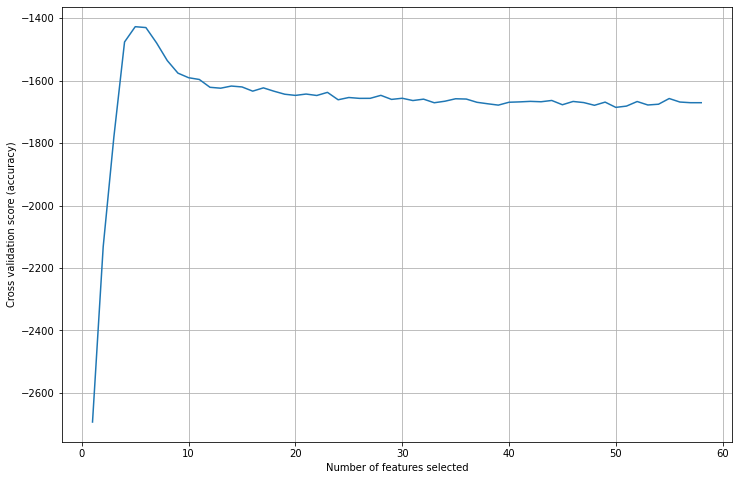

In [76]:
print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
import seaborn as sns
plt.figure(figsize=(12,8))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
    rfecv.grid_scores_,
)
plt.grid()
plt.show()

In [77]:
# predict prices of X_test
y_pred = rfecv.predict(X_train)

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_train, y_pred)
print(r2)

0.7688473545287754


In [78]:
RMSE= np.sqrt(np.square(np.subtract(y_train, y_pred)).mean())
print(RMSE)

28.12480810518658


In [79]:
# predict prices of X_test
y_pred = rfecv.predict(X_test)

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.6063861971786775


In [80]:
# Root Mean Squared Error
RMSE= np.sqrt(np.square(np.subtract(y_test, y_pred)).mean())
print(RMSE)

34.57087803727589


In [81]:
print(rfecv.get_support(indices=True))  

[ 1  3  4  5 57]


In [82]:
columns = X.columns
rfecv_features = []

for col, selected in zip(columns, rfecv.get_support()):
    if selected:
        rfecv_features.append(col)
print(rfecv_features)

['state_factor', 'facility_type', 'floor_area', 'energy_star_rating', 'building_age']


In [85]:
X_new_df = X.iloc[:, rfecv.support_]
X_new_df.head()

,state_factor,facility_type,floor_area,energy_star_rating,building_age
id,,,,,
0,0.0,13.0,0.009359,0.11,0.036228
1,0.0,55.0,0.042855,0.45,0.029777
2,0.0,48.0,0.043804,0.97,0.031762
3,0.0,6.0,0.008427,0.46,0.017370
4,0.0,56.0,0.010108,1.00,0.014888


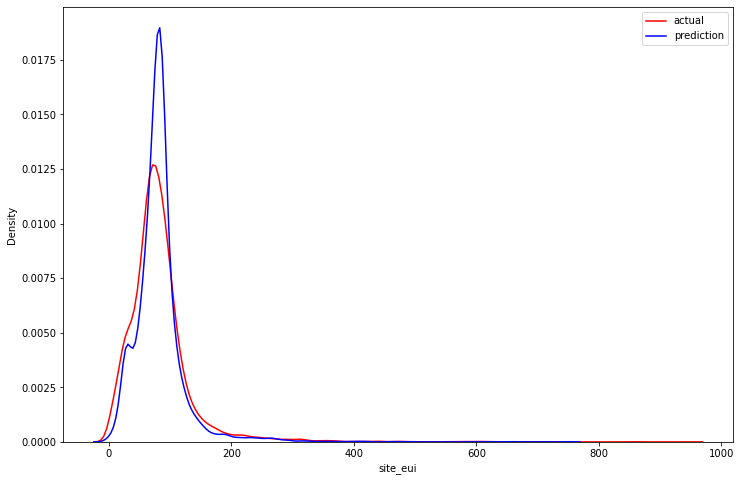

In [83]:
plt.figure(figsize=(12,8))
ax1 = sns.distplot(y_test, hist = False, color = 'r', label = 'actual')
sns.distplot(y_pred, hist = False, color = 'b', label = 'prediction', ax = ax1)
plt.legend()
plt.show()